## Get melt pool dynamics from images of 2nd ProtoShape video.

In [40]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from imutils import contours
import imutils
import glob
import os
import pandas as pd
import decimal

In [41]:
import seaborn as sns
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(11, 4)})

In [42]:
# Get all frames (the ones with the ROI) from video.
image_file_list = glob.glob('./out/protoshape/video2/frames/*.png')
# Sort list by name.
image_file_list.sort(key=lambda f: int(''.join(filter(str.isdigit, f))))

In [43]:
print(image_file_list[-5:])

['./out/protoshape/video2/frames/frame_0366144.png', './out/protoshape/video2/frames/frame_0366145.png', './out/protoshape/video2/frames/frame_0366146.png', './out/protoshape/video2/frames/frame_0366147.png', './out/protoshape/video2/frames/frame_0366148.png']


In [44]:
print(len(image_file_list))

359329


In [50]:
image_file_list[100000:100001]

['./out/protoshape/video2/frames/frame_0106820.png']

### Extract the melt pool dynamics from the images.

In [51]:
# Data frame for recording features.
df = pd.DataFrame(columns=['Frame_Index', 'Area', 'Mean', 'Radius', 'Rotated_Box'])

# Process each image.
for image_file_path in image_file_list[100000:]:
    print("Processing: " + image_file_path)

    image = cv2.imread(image_file_path, cv2.IMREAD_GRAYSCALE)

    # Blur to remove noise (radius must be ODD)
    blur = cv2.GaussianBlur(image, (5, 5), 0) # 21,21

    # Threshold the image to reveal light regions in the blurred image.
    thresh = cv2.threshold(blur, 210, 255, cv2.THRESH_BINARY)[1]

    # Perform a series of erosions and dilations to remove
    # any small blobs of noise from the thresholded image.
    thresh = cv2.erode(thresh, None, iterations=1)
    thresh = cv2.dilate(thresh, None, iterations=1)
    
    # Get contours.
    cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    
    if len(cnts) != 0:
        sorted_contours = sorted(cnts, key=cv2.contourArea, reverse=True)
        
        # Get top 2 contours (2nd largest if available) and combine their points to get encompassing rectangle.
        largest_contour = sorted_contours[0]
        top_contour_points = largest_contour
        
        # Get area of melt pool (largest + second largest if available).
        area = cv2.contourArea(largest_contour)
        
        if len(cnts) >= 2:
            second_largest_contour = sorted_contours[1]
            top_contour_points = np.concatenate((largest_contour,second_largest_contour))
            
            area = area + cv2.contourArea(second_largest_contour)

        # Get average intensity of melt pool.
        contour_mask = np.zeros(image.shape, np.uint8)
        cv2.drawContours(contour_mask, top_contour_points, -1, 255, -1) # Draw filled contours.
        mean = cv2.mean(image, mask=contour_mask)

        # Get radius of minimum enclosing circle of contour(s).
        ((cX, cY), radius) = cv2.minEnclosingCircle(top_contour_points)

        # Find rotated rectangle of encompassing contours. 
        rotated_rectangle = cv2.minAreaRect(top_contour_points)
        rotated_box = cv2.boxPoints(rotated_rectangle)
        rotated_box = np.int0(rotated_box)

        # Draw the rotated rectangle.
#         cv2.drawContours(image,[rotated_box],0,(0,0,255),2)
        
        df = df.append({'Frame_Index': os.path.basename(image_file_path), 'Area': area, 'Mean': mean[0], 'Radius': radius, 'Rotated_Box': rotated_box}, ignore_index=True)

    else:
        df = df.append({'Frame_Index': os.path.basename(image_file_path), 'Area': 0, 'Mean': 0, 'Radius': 0}, ignore_index=True)
        #print("No contours.")

#     plt.imshow(image)
#     plt.show()

Processing: ./out/protoshape/video2/frames/frame_0106820.png
Processing: ./out/protoshape/video2/frames/frame_0106821.png
Processing: ./out/protoshape/video2/frames/frame_0106822.png
Processing: ./out/protoshape/video2/frames/frame_0106823.png
Processing: ./out/protoshape/video2/frames/frame_0106824.png
Processing: ./out/protoshape/video2/frames/frame_0106825.png
Processing: ./out/protoshape/video2/frames/frame_0106826.png
Processing: ./out/protoshape/video2/frames/frame_0106827.png
Processing: ./out/protoshape/video2/frames/frame_0106828.png
Processing: ./out/protoshape/video2/frames/frame_0106829.png
Processing: ./out/protoshape/video2/frames/frame_0106830.png
Processing: ./out/protoshape/video2/frames/frame_0106831.png
Processing: ./out/protoshape/video2/frames/frame_0106832.png
Processing: ./out/protoshape/video2/frames/frame_0106833.png
Processing: ./out/protoshape/video2/frames/frame_0106834.png
Processing: ./out/protoshape/video2/frames/frame_0106835.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0106956.png
Processing: ./out/protoshape/video2/frames/frame_0106957.png
Processing: ./out/protoshape/video2/frames/frame_0106958.png
Processing: ./out/protoshape/video2/frames/frame_0106959.png
Processing: ./out/protoshape/video2/frames/frame_0106960.png
Processing: ./out/protoshape/video2/frames/frame_0106961.png
Processing: ./out/protoshape/video2/frames/frame_0106962.png
Processing: ./out/protoshape/video2/frames/frame_0106963.png
Processing: ./out/protoshape/video2/frames/frame_0106964.png
Processing: ./out/protoshape/video2/frames/frame_0106965.png
Processing: ./out/protoshape/video2/frames/frame_0106966.png
Processing: ./out/protoshape/video2/frames/frame_0106967.png
Processing: ./out/protoshape/video2/frames/frame_0106968.png
Processing: ./out/protoshape/video2/frames/frame_0106969.png
Processing: ./out/protoshape/video2/frames/frame_0106970.png
Processing: ./out/protoshape/video2/frames/frame_0106971.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107094.png
Processing: ./out/protoshape/video2/frames/frame_0107095.png
Processing: ./out/protoshape/video2/frames/frame_0107096.png
Processing: ./out/protoshape/video2/frames/frame_0107097.png
Processing: ./out/protoshape/video2/frames/frame_0107098.png
Processing: ./out/protoshape/video2/frames/frame_0107099.png
Processing: ./out/protoshape/video2/frames/frame_0107100.png
Processing: ./out/protoshape/video2/frames/frame_0107101.png
Processing: ./out/protoshape/video2/frames/frame_0107102.png
Processing: ./out/protoshape/video2/frames/frame_0107103.png
Processing: ./out/protoshape/video2/frames/frame_0107104.png
Processing: ./out/protoshape/video2/frames/frame_0107105.png
Processing: ./out/protoshape/video2/frames/frame_0107106.png
Processing: ./out/protoshape/video2/frames/frame_0107107.png
Processing: ./out/protoshape/video2/frames/frame_0107108.png
Processing: ./out/protoshape/video2/frames/frame_0107109.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107229.png
Processing: ./out/protoshape/video2/frames/frame_0107230.png
Processing: ./out/protoshape/video2/frames/frame_0107231.png
Processing: ./out/protoshape/video2/frames/frame_0107232.png
Processing: ./out/protoshape/video2/frames/frame_0107233.png
Processing: ./out/protoshape/video2/frames/frame_0107234.png
Processing: ./out/protoshape/video2/frames/frame_0107235.png
Processing: ./out/protoshape/video2/frames/frame_0107236.png
Processing: ./out/protoshape/video2/frames/frame_0107237.png
Processing: ./out/protoshape/video2/frames/frame_0107238.png
Processing: ./out/protoshape/video2/frames/frame_0107239.png
Processing: ./out/protoshape/video2/frames/frame_0107240.png
Processing: ./out/protoshape/video2/frames/frame_0107241.png
Processing: ./out/protoshape/video2/frames/frame_0107242.png
Processing: ./out/protoshape/video2/frames/frame_0107243.png
Processing: ./out/protoshape/video2/frames/frame_0107244.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107370.png
Processing: ./out/protoshape/video2/frames/frame_0107371.png
Processing: ./out/protoshape/video2/frames/frame_0107372.png
Processing: ./out/protoshape/video2/frames/frame_0107373.png
Processing: ./out/protoshape/video2/frames/frame_0107374.png
Processing: ./out/protoshape/video2/frames/frame_0107375.png
Processing: ./out/protoshape/video2/frames/frame_0107376.png
Processing: ./out/protoshape/video2/frames/frame_0107377.png
Processing: ./out/protoshape/video2/frames/frame_0107378.png
Processing: ./out/protoshape/video2/frames/frame_0107379.png
Processing: ./out/protoshape/video2/frames/frame_0107380.png
Processing: ./out/protoshape/video2/frames/frame_0107381.png
Processing: ./out/protoshape/video2/frames/frame_0107382.png
Processing: ./out/protoshape/video2/frames/frame_0107383.png
Processing: ./out/protoshape/video2/frames/frame_0107384.png
Processing: ./out/protoshape/video2/frames/frame_0107385.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107506.png
Processing: ./out/protoshape/video2/frames/frame_0107507.png
Processing: ./out/protoshape/video2/frames/frame_0107508.png
Processing: ./out/protoshape/video2/frames/frame_0107509.png
Processing: ./out/protoshape/video2/frames/frame_0107510.png
Processing: ./out/protoshape/video2/frames/frame_0107511.png
Processing: ./out/protoshape/video2/frames/frame_0107512.png
Processing: ./out/protoshape/video2/frames/frame_0107513.png
Processing: ./out/protoshape/video2/frames/frame_0107514.png
Processing: ./out/protoshape/video2/frames/frame_0107515.png
Processing: ./out/protoshape/video2/frames/frame_0107516.png
Processing: ./out/protoshape/video2/frames/frame_0107517.png
Processing: ./out/protoshape/video2/frames/frame_0107518.png
Processing: ./out/protoshape/video2/frames/frame_0107519.png
Processing: ./out/protoshape/video2/frames/frame_0107520.png
Processing: ./out/protoshape/video2/frames/frame_0107521.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107644.png
Processing: ./out/protoshape/video2/frames/frame_0107645.png
Processing: ./out/protoshape/video2/frames/frame_0107646.png
Processing: ./out/protoshape/video2/frames/frame_0107647.png
Processing: ./out/protoshape/video2/frames/frame_0107648.png
Processing: ./out/protoshape/video2/frames/frame_0107649.png
Processing: ./out/protoshape/video2/frames/frame_0107650.png
Processing: ./out/protoshape/video2/frames/frame_0107651.png
Processing: ./out/protoshape/video2/frames/frame_0107652.png
Processing: ./out/protoshape/video2/frames/frame_0107653.png
Processing: ./out/protoshape/video2/frames/frame_0107654.png
Processing: ./out/protoshape/video2/frames/frame_0107655.png
Processing: ./out/protoshape/video2/frames/frame_0107656.png
Processing: ./out/protoshape/video2/frames/frame_0107657.png
Processing: ./out/protoshape/video2/frames/frame_0107658.png
Processing: ./out/protoshape/video2/frames/frame_0107659.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107784.png
Processing: ./out/protoshape/video2/frames/frame_0107785.png
Processing: ./out/protoshape/video2/frames/frame_0107786.png
Processing: ./out/protoshape/video2/frames/frame_0107787.png
Processing: ./out/protoshape/video2/frames/frame_0107788.png
Processing: ./out/protoshape/video2/frames/frame_0107789.png
Processing: ./out/protoshape/video2/frames/frame_0107790.png
Processing: ./out/protoshape/video2/frames/frame_0107791.png
Processing: ./out/protoshape/video2/frames/frame_0107792.png
Processing: ./out/protoshape/video2/frames/frame_0107793.png
Processing: ./out/protoshape/video2/frames/frame_0107794.png
Processing: ./out/protoshape/video2/frames/frame_0107795.png
Processing: ./out/protoshape/video2/frames/frame_0107796.png
Processing: ./out/protoshape/video2/frames/frame_0107797.png
Processing: ./out/protoshape/video2/frames/frame_0107798.png
Processing: ./out/protoshape/video2/frames/frame_0107799.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0107921.png
Processing: ./out/protoshape/video2/frames/frame_0107922.png
Processing: ./out/protoshape/video2/frames/frame_0107923.png
Processing: ./out/protoshape/video2/frames/frame_0107924.png
Processing: ./out/protoshape/video2/frames/frame_0107925.png
Processing: ./out/protoshape/video2/frames/frame_0107926.png
Processing: ./out/protoshape/video2/frames/frame_0107927.png
Processing: ./out/protoshape/video2/frames/frame_0107928.png
Processing: ./out/protoshape/video2/frames/frame_0107929.png
Processing: ./out/protoshape/video2/frames/frame_0107930.png
Processing: ./out/protoshape/video2/frames/frame_0107931.png
Processing: ./out/protoshape/video2/frames/frame_0107932.png
Processing: ./out/protoshape/video2/frames/frame_0107933.png
Processing: ./out/protoshape/video2/frames/frame_0107934.png
Processing: ./out/protoshape/video2/frames/frame_0107935.png
Processing: ./out/protoshape/video2/frames/frame_0107936.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108059.png
Processing: ./out/protoshape/video2/frames/frame_0108060.png
Processing: ./out/protoshape/video2/frames/frame_0108061.png
Processing: ./out/protoshape/video2/frames/frame_0108062.png
Processing: ./out/protoshape/video2/frames/frame_0108063.png
Processing: ./out/protoshape/video2/frames/frame_0108064.png
Processing: ./out/protoshape/video2/frames/frame_0108065.png
Processing: ./out/protoshape/video2/frames/frame_0108066.png
Processing: ./out/protoshape/video2/frames/frame_0108067.png
Processing: ./out/protoshape/video2/frames/frame_0108068.png
Processing: ./out/protoshape/video2/frames/frame_0108069.png
Processing: ./out/protoshape/video2/frames/frame_0108070.png
Processing: ./out/protoshape/video2/frames/frame_0108071.png
Processing: ./out/protoshape/video2/frames/frame_0108072.png
Processing: ./out/protoshape/video2/frames/frame_0108073.png
Processing: ./out/protoshape/video2/frames/frame_0108074.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108201.png
Processing: ./out/protoshape/video2/frames/frame_0108202.png
Processing: ./out/protoshape/video2/frames/frame_0108203.png
Processing: ./out/protoshape/video2/frames/frame_0108204.png
Processing: ./out/protoshape/video2/frames/frame_0108205.png
Processing: ./out/protoshape/video2/frames/frame_0108206.png
Processing: ./out/protoshape/video2/frames/frame_0108207.png
Processing: ./out/protoshape/video2/frames/frame_0108208.png
Processing: ./out/protoshape/video2/frames/frame_0108209.png
Processing: ./out/protoshape/video2/frames/frame_0108210.png
Processing: ./out/protoshape/video2/frames/frame_0108211.png
Processing: ./out/protoshape/video2/frames/frame_0108212.png
Processing: ./out/protoshape/video2/frames/frame_0108213.png
Processing: ./out/protoshape/video2/frames/frame_0108214.png
Processing: ./out/protoshape/video2/frames/frame_0108215.png
Processing: ./out/protoshape/video2/frames/frame_0108216.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108344.png
Processing: ./out/protoshape/video2/frames/frame_0108345.png
Processing: ./out/protoshape/video2/frames/frame_0108346.png
Processing: ./out/protoshape/video2/frames/frame_0108347.png
Processing: ./out/protoshape/video2/frames/frame_0108348.png
Processing: ./out/protoshape/video2/frames/frame_0108349.png
Processing: ./out/protoshape/video2/frames/frame_0108350.png
Processing: ./out/protoshape/video2/frames/frame_0108351.png
Processing: ./out/protoshape/video2/frames/frame_0108352.png
Processing: ./out/protoshape/video2/frames/frame_0108353.png
Processing: ./out/protoshape/video2/frames/frame_0108354.png
Processing: ./out/protoshape/video2/frames/frame_0108355.png
Processing: ./out/protoshape/video2/frames/frame_0108356.png
Processing: ./out/protoshape/video2/frames/frame_0108357.png
Processing: ./out/protoshape/video2/frames/frame_0108358.png
Processing: ./out/protoshape/video2/frames/frame_0108359.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108481.png
Processing: ./out/protoshape/video2/frames/frame_0108482.png
Processing: ./out/protoshape/video2/frames/frame_0108483.png
Processing: ./out/protoshape/video2/frames/frame_0108484.png
Processing: ./out/protoshape/video2/frames/frame_0108485.png
Processing: ./out/protoshape/video2/frames/frame_0108486.png
Processing: ./out/protoshape/video2/frames/frame_0108487.png
Processing: ./out/protoshape/video2/frames/frame_0108488.png
Processing: ./out/protoshape/video2/frames/frame_0108489.png
Processing: ./out/protoshape/video2/frames/frame_0108490.png
Processing: ./out/protoshape/video2/frames/frame_0108491.png
Processing: ./out/protoshape/video2/frames/frame_0108492.png
Processing: ./out/protoshape/video2/frames/frame_0108493.png
Processing: ./out/protoshape/video2/frames/frame_0108494.png
Processing: ./out/protoshape/video2/frames/frame_0108495.png
Processing: ./out/protoshape/video2/frames/frame_0108496.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108627.png
Processing: ./out/protoshape/video2/frames/frame_0108628.png
Processing: ./out/protoshape/video2/frames/frame_0108629.png
Processing: ./out/protoshape/video2/frames/frame_0108630.png
Processing: ./out/protoshape/video2/frames/frame_0108631.png
Processing: ./out/protoshape/video2/frames/frame_0108632.png
Processing: ./out/protoshape/video2/frames/frame_0108633.png
Processing: ./out/protoshape/video2/frames/frame_0108634.png
Processing: ./out/protoshape/video2/frames/frame_0108635.png
Processing: ./out/protoshape/video2/frames/frame_0108636.png
Processing: ./out/protoshape/video2/frames/frame_0108637.png
Processing: ./out/protoshape/video2/frames/frame_0108638.png
Processing: ./out/protoshape/video2/frames/frame_0108639.png
Processing: ./out/protoshape/video2/frames/frame_0108640.png
Processing: ./out/protoshape/video2/frames/frame_0108641.png
Processing: ./out/protoshape/video2/frames/frame_0108642.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108770.png
Processing: ./out/protoshape/video2/frames/frame_0108771.png
Processing: ./out/protoshape/video2/frames/frame_0108772.png
Processing: ./out/protoshape/video2/frames/frame_0108773.png
Processing: ./out/protoshape/video2/frames/frame_0108774.png
Processing: ./out/protoshape/video2/frames/frame_0108775.png
Processing: ./out/protoshape/video2/frames/frame_0108776.png
Processing: ./out/protoshape/video2/frames/frame_0108777.png
Processing: ./out/protoshape/video2/frames/frame_0108778.png
Processing: ./out/protoshape/video2/frames/frame_0108779.png
Processing: ./out/protoshape/video2/frames/frame_0108780.png
Processing: ./out/protoshape/video2/frames/frame_0108781.png
Processing: ./out/protoshape/video2/frames/frame_0108782.png
Processing: ./out/protoshape/video2/frames/frame_0108783.png
Processing: ./out/protoshape/video2/frames/frame_0108784.png
Processing: ./out/protoshape/video2/frames/frame_0108785.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0108906.png
Processing: ./out/protoshape/video2/frames/frame_0108907.png
Processing: ./out/protoshape/video2/frames/frame_0108908.png
Processing: ./out/protoshape/video2/frames/frame_0108909.png
Processing: ./out/protoshape/video2/frames/frame_0108910.png
Processing: ./out/protoshape/video2/frames/frame_0108911.png
Processing: ./out/protoshape/video2/frames/frame_0108912.png
Processing: ./out/protoshape/video2/frames/frame_0108913.png
Processing: ./out/protoshape/video2/frames/frame_0108914.png
Processing: ./out/protoshape/video2/frames/frame_0108915.png
Processing: ./out/protoshape/video2/frames/frame_0108916.png
Processing: ./out/protoshape/video2/frames/frame_0108917.png
Processing: ./out/protoshape/video2/frames/frame_0108918.png
Processing: ./out/protoshape/video2/frames/frame_0108919.png
Processing: ./out/protoshape/video2/frames/frame_0108920.png
Processing: ./out/protoshape/video2/frames/frame_0108921.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109048.png
Processing: ./out/protoshape/video2/frames/frame_0109049.png
Processing: ./out/protoshape/video2/frames/frame_0109050.png
Processing: ./out/protoshape/video2/frames/frame_0109051.png
Processing: ./out/protoshape/video2/frames/frame_0109052.png
Processing: ./out/protoshape/video2/frames/frame_0109053.png
Processing: ./out/protoshape/video2/frames/frame_0109054.png
Processing: ./out/protoshape/video2/frames/frame_0109055.png
Processing: ./out/protoshape/video2/frames/frame_0109056.png
Processing: ./out/protoshape/video2/frames/frame_0109057.png
Processing: ./out/protoshape/video2/frames/frame_0109058.png
Processing: ./out/protoshape/video2/frames/frame_0109059.png
Processing: ./out/protoshape/video2/frames/frame_0109060.png
Processing: ./out/protoshape/video2/frames/frame_0109061.png
Processing: ./out/protoshape/video2/frames/frame_0109062.png
Processing: ./out/protoshape/video2/frames/frame_0109063.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109183.png
Processing: ./out/protoshape/video2/frames/frame_0109184.png
Processing: ./out/protoshape/video2/frames/frame_0109185.png
Processing: ./out/protoshape/video2/frames/frame_0109186.png
Processing: ./out/protoshape/video2/frames/frame_0109187.png
Processing: ./out/protoshape/video2/frames/frame_0109188.png
Processing: ./out/protoshape/video2/frames/frame_0109189.png
Processing: ./out/protoshape/video2/frames/frame_0109190.png
Processing: ./out/protoshape/video2/frames/frame_0109191.png
Processing: ./out/protoshape/video2/frames/frame_0109192.png
Processing: ./out/protoshape/video2/frames/frame_0109193.png
Processing: ./out/protoshape/video2/frames/frame_0109194.png
Processing: ./out/protoshape/video2/frames/frame_0109195.png
Processing: ./out/protoshape/video2/frames/frame_0109196.png
Processing: ./out/protoshape/video2/frames/frame_0109197.png
Processing: ./out/protoshape/video2/frames/frame_0109198.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109321.png
Processing: ./out/protoshape/video2/frames/frame_0109322.png
Processing: ./out/protoshape/video2/frames/frame_0109323.png
Processing: ./out/protoshape/video2/frames/frame_0109324.png
Processing: ./out/protoshape/video2/frames/frame_0109325.png
Processing: ./out/protoshape/video2/frames/frame_0109326.png
Processing: ./out/protoshape/video2/frames/frame_0109327.png
Processing: ./out/protoshape/video2/frames/frame_0109328.png
Processing: ./out/protoshape/video2/frames/frame_0109329.png
Processing: ./out/protoshape/video2/frames/frame_0109330.png
Processing: ./out/protoshape/video2/frames/frame_0109331.png
Processing: ./out/protoshape/video2/frames/frame_0109332.png
Processing: ./out/protoshape/video2/frames/frame_0109333.png
Processing: ./out/protoshape/video2/frames/frame_0109334.png
Processing: ./out/protoshape/video2/frames/frame_0109335.png
Processing: ./out/protoshape/video2/frames/frame_0109336.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109460.png
Processing: ./out/protoshape/video2/frames/frame_0109461.png
Processing: ./out/protoshape/video2/frames/frame_0109462.png
Processing: ./out/protoshape/video2/frames/frame_0109463.png
Processing: ./out/protoshape/video2/frames/frame_0109464.png
Processing: ./out/protoshape/video2/frames/frame_0109465.png
Processing: ./out/protoshape/video2/frames/frame_0109466.png
Processing: ./out/protoshape/video2/frames/frame_0109467.png
Processing: ./out/protoshape/video2/frames/frame_0109468.png
Processing: ./out/protoshape/video2/frames/frame_0109469.png
Processing: ./out/protoshape/video2/frames/frame_0109470.png
Processing: ./out/protoshape/video2/frames/frame_0109471.png
Processing: ./out/protoshape/video2/frames/frame_0109472.png
Processing: ./out/protoshape/video2/frames/frame_0109473.png
Processing: ./out/protoshape/video2/frames/frame_0109474.png
Processing: ./out/protoshape/video2/frames/frame_0109475.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109601.png
Processing: ./out/protoshape/video2/frames/frame_0109602.png
Processing: ./out/protoshape/video2/frames/frame_0109603.png
Processing: ./out/protoshape/video2/frames/frame_0109604.png
Processing: ./out/protoshape/video2/frames/frame_0109605.png
Processing: ./out/protoshape/video2/frames/frame_0109606.png
Processing: ./out/protoshape/video2/frames/frame_0109607.png
Processing: ./out/protoshape/video2/frames/frame_0109608.png
Processing: ./out/protoshape/video2/frames/frame_0109609.png
Processing: ./out/protoshape/video2/frames/frame_0109610.png
Processing: ./out/protoshape/video2/frames/frame_0109611.png
Processing: ./out/protoshape/video2/frames/frame_0109612.png
Processing: ./out/protoshape/video2/frames/frame_0109613.png
Processing: ./out/protoshape/video2/frames/frame_0109614.png
Processing: ./out/protoshape/video2/frames/frame_0109615.png
Processing: ./out/protoshape/video2/frames/frame_0109616.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109744.png
Processing: ./out/protoshape/video2/frames/frame_0109745.png
Processing: ./out/protoshape/video2/frames/frame_0109746.png
Processing: ./out/protoshape/video2/frames/frame_0109747.png
Processing: ./out/protoshape/video2/frames/frame_0109748.png
Processing: ./out/protoshape/video2/frames/frame_0109749.png
Processing: ./out/protoshape/video2/frames/frame_0109750.png
Processing: ./out/protoshape/video2/frames/frame_0109751.png
Processing: ./out/protoshape/video2/frames/frame_0109752.png
Processing: ./out/protoshape/video2/frames/frame_0109753.png
Processing: ./out/protoshape/video2/frames/frame_0109754.png
Processing: ./out/protoshape/video2/frames/frame_0109755.png
Processing: ./out/protoshape/video2/frames/frame_0109756.png
Processing: ./out/protoshape/video2/frames/frame_0109757.png
Processing: ./out/protoshape/video2/frames/frame_0109758.png
Processing: ./out/protoshape/video2/frames/frame_0109759.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0109891.png
Processing: ./out/protoshape/video2/frames/frame_0109892.png
Processing: ./out/protoshape/video2/frames/frame_0109893.png
Processing: ./out/protoshape/video2/frames/frame_0109894.png
Processing: ./out/protoshape/video2/frames/frame_0109895.png
Processing: ./out/protoshape/video2/frames/frame_0109896.png
Processing: ./out/protoshape/video2/frames/frame_0109897.png
Processing: ./out/protoshape/video2/frames/frame_0109898.png
Processing: ./out/protoshape/video2/frames/frame_0109899.png
Processing: ./out/protoshape/video2/frames/frame_0109900.png
Processing: ./out/protoshape/video2/frames/frame_0109901.png
Processing: ./out/protoshape/video2/frames/frame_0109902.png
Processing: ./out/protoshape/video2/frames/frame_0109903.png
Processing: ./out/protoshape/video2/frames/frame_0109904.png
Processing: ./out/protoshape/video2/frames/frame_0109905.png
Processing: ./out/protoshape/video2/frames/frame_0109906.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110034.png
Processing: ./out/protoshape/video2/frames/frame_0110035.png
Processing: ./out/protoshape/video2/frames/frame_0110036.png
Processing: ./out/protoshape/video2/frames/frame_0110037.png
Processing: ./out/protoshape/video2/frames/frame_0110038.png
Processing: ./out/protoshape/video2/frames/frame_0110039.png
Processing: ./out/protoshape/video2/frames/frame_0110040.png
Processing: ./out/protoshape/video2/frames/frame_0110041.png
Processing: ./out/protoshape/video2/frames/frame_0110042.png
Processing: ./out/protoshape/video2/frames/frame_0110043.png
Processing: ./out/protoshape/video2/frames/frame_0110044.png
Processing: ./out/protoshape/video2/frames/frame_0110045.png
Processing: ./out/protoshape/video2/frames/frame_0110046.png
Processing: ./out/protoshape/video2/frames/frame_0110047.png
Processing: ./out/protoshape/video2/frames/frame_0110048.png
Processing: ./out/protoshape/video2/frames/frame_0110049.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110181.png
Processing: ./out/protoshape/video2/frames/frame_0110182.png
Processing: ./out/protoshape/video2/frames/frame_0110183.png
Processing: ./out/protoshape/video2/frames/frame_0110184.png
Processing: ./out/protoshape/video2/frames/frame_0110185.png
Processing: ./out/protoshape/video2/frames/frame_0110186.png
Processing: ./out/protoshape/video2/frames/frame_0110187.png
Processing: ./out/protoshape/video2/frames/frame_0110188.png
Processing: ./out/protoshape/video2/frames/frame_0110189.png
Processing: ./out/protoshape/video2/frames/frame_0110190.png
Processing: ./out/protoshape/video2/frames/frame_0110191.png
Processing: ./out/protoshape/video2/frames/frame_0110192.png
Processing: ./out/protoshape/video2/frames/frame_0110193.png
Processing: ./out/protoshape/video2/frames/frame_0110194.png
Processing: ./out/protoshape/video2/frames/frame_0110195.png
Processing: ./out/protoshape/video2/frames/frame_0110196.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110330.png
Processing: ./out/protoshape/video2/frames/frame_0110331.png
Processing: ./out/protoshape/video2/frames/frame_0110332.png
Processing: ./out/protoshape/video2/frames/frame_0110333.png
Processing: ./out/protoshape/video2/frames/frame_0110334.png
Processing: ./out/protoshape/video2/frames/frame_0110335.png
Processing: ./out/protoshape/video2/frames/frame_0110336.png
Processing: ./out/protoshape/video2/frames/frame_0110337.png
Processing: ./out/protoshape/video2/frames/frame_0110338.png
Processing: ./out/protoshape/video2/frames/frame_0110339.png
Processing: ./out/protoshape/video2/frames/frame_0110340.png
Processing: ./out/protoshape/video2/frames/frame_0110341.png
Processing: ./out/protoshape/video2/frames/frame_0110342.png
Processing: ./out/protoshape/video2/frames/frame_0110343.png
Processing: ./out/protoshape/video2/frames/frame_0110344.png
Processing: ./out/protoshape/video2/frames/frame_0110345.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110473.png
Processing: ./out/protoshape/video2/frames/frame_0110474.png
Processing: ./out/protoshape/video2/frames/frame_0110475.png
Processing: ./out/protoshape/video2/frames/frame_0110476.png
Processing: ./out/protoshape/video2/frames/frame_0110477.png
Processing: ./out/protoshape/video2/frames/frame_0110478.png
Processing: ./out/protoshape/video2/frames/frame_0110479.png
Processing: ./out/protoshape/video2/frames/frame_0110480.png
Processing: ./out/protoshape/video2/frames/frame_0110481.png
Processing: ./out/protoshape/video2/frames/frame_0110482.png
Processing: ./out/protoshape/video2/frames/frame_0110483.png
Processing: ./out/protoshape/video2/frames/frame_0110484.png
Processing: ./out/protoshape/video2/frames/frame_0110485.png
Processing: ./out/protoshape/video2/frames/frame_0110486.png
Processing: ./out/protoshape/video2/frames/frame_0110487.png
Processing: ./out/protoshape/video2/frames/frame_0110488.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110618.png
Processing: ./out/protoshape/video2/frames/frame_0110619.png
Processing: ./out/protoshape/video2/frames/frame_0110620.png
Processing: ./out/protoshape/video2/frames/frame_0110621.png
Processing: ./out/protoshape/video2/frames/frame_0110622.png
Processing: ./out/protoshape/video2/frames/frame_0110623.png
Processing: ./out/protoshape/video2/frames/frame_0110624.png
Processing: ./out/protoshape/video2/frames/frame_0110625.png
Processing: ./out/protoshape/video2/frames/frame_0110626.png
Processing: ./out/protoshape/video2/frames/frame_0110627.png
Processing: ./out/protoshape/video2/frames/frame_0110628.png
Processing: ./out/protoshape/video2/frames/frame_0110629.png
Processing: ./out/protoshape/video2/frames/frame_0110630.png
Processing: ./out/protoshape/video2/frames/frame_0110631.png
Processing: ./out/protoshape/video2/frames/frame_0110632.png
Processing: ./out/protoshape/video2/frames/frame_0110633.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110762.png
Processing: ./out/protoshape/video2/frames/frame_0110763.png
Processing: ./out/protoshape/video2/frames/frame_0110764.png
Processing: ./out/protoshape/video2/frames/frame_0110765.png
Processing: ./out/protoshape/video2/frames/frame_0110766.png
Processing: ./out/protoshape/video2/frames/frame_0110767.png
Processing: ./out/protoshape/video2/frames/frame_0110768.png
Processing: ./out/protoshape/video2/frames/frame_0110769.png
Processing: ./out/protoshape/video2/frames/frame_0110770.png
Processing: ./out/protoshape/video2/frames/frame_0110771.png
Processing: ./out/protoshape/video2/frames/frame_0110772.png
Processing: ./out/protoshape/video2/frames/frame_0110773.png
Processing: ./out/protoshape/video2/frames/frame_0110774.png
Processing: ./out/protoshape/video2/frames/frame_0110775.png
Processing: ./out/protoshape/video2/frames/frame_0110776.png
Processing: ./out/protoshape/video2/frames/frame_0110777.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0110900.png
Processing: ./out/protoshape/video2/frames/frame_0110901.png
Processing: ./out/protoshape/video2/frames/frame_0110902.png
Processing: ./out/protoshape/video2/frames/frame_0110903.png
Processing: ./out/protoshape/video2/frames/frame_0110904.png
Processing: ./out/protoshape/video2/frames/frame_0110905.png
Processing: ./out/protoshape/video2/frames/frame_0110906.png
Processing: ./out/protoshape/video2/frames/frame_0110907.png
Processing: ./out/protoshape/video2/frames/frame_0110908.png
Processing: ./out/protoshape/video2/frames/frame_0110909.png
Processing: ./out/protoshape/video2/frames/frame_0110910.png
Processing: ./out/protoshape/video2/frames/frame_0110911.png
Processing: ./out/protoshape/video2/frames/frame_0110912.png
Processing: ./out/protoshape/video2/frames/frame_0110913.png
Processing: ./out/protoshape/video2/frames/frame_0110914.png
Processing: ./out/protoshape/video2/frames/frame_0110915.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111047.png
Processing: ./out/protoshape/video2/frames/frame_0111048.png
Processing: ./out/protoshape/video2/frames/frame_0111049.png
Processing: ./out/protoshape/video2/frames/frame_0111050.png
Processing: ./out/protoshape/video2/frames/frame_0111051.png
Processing: ./out/protoshape/video2/frames/frame_0111052.png
Processing: ./out/protoshape/video2/frames/frame_0111053.png
Processing: ./out/protoshape/video2/frames/frame_0111054.png
Processing: ./out/protoshape/video2/frames/frame_0111055.png
Processing: ./out/protoshape/video2/frames/frame_0111056.png
Processing: ./out/protoshape/video2/frames/frame_0111057.png
Processing: ./out/protoshape/video2/frames/frame_0111058.png
Processing: ./out/protoshape/video2/frames/frame_0111059.png
Processing: ./out/protoshape/video2/frames/frame_0111060.png
Processing: ./out/protoshape/video2/frames/frame_0111061.png
Processing: ./out/protoshape/video2/frames/frame_0111062.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111187.png
Processing: ./out/protoshape/video2/frames/frame_0111188.png
Processing: ./out/protoshape/video2/frames/frame_0111189.png
Processing: ./out/protoshape/video2/frames/frame_0111190.png
Processing: ./out/protoshape/video2/frames/frame_0111191.png
Processing: ./out/protoshape/video2/frames/frame_0111192.png
Processing: ./out/protoshape/video2/frames/frame_0111193.png
Processing: ./out/protoshape/video2/frames/frame_0111194.png
Processing: ./out/protoshape/video2/frames/frame_0111195.png
Processing: ./out/protoshape/video2/frames/frame_0111196.png
Processing: ./out/protoshape/video2/frames/frame_0111197.png
Processing: ./out/protoshape/video2/frames/frame_0111198.png
Processing: ./out/protoshape/video2/frames/frame_0111199.png
Processing: ./out/protoshape/video2/frames/frame_0111200.png
Processing: ./out/protoshape/video2/frames/frame_0111201.png
Processing: ./out/protoshape/video2/frames/frame_0111202.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111327.png
Processing: ./out/protoshape/video2/frames/frame_0111328.png
Processing: ./out/protoshape/video2/frames/frame_0111329.png
Processing: ./out/protoshape/video2/frames/frame_0111330.png
Processing: ./out/protoshape/video2/frames/frame_0111331.png
Processing: ./out/protoshape/video2/frames/frame_0111332.png
Processing: ./out/protoshape/video2/frames/frame_0111333.png
Processing: ./out/protoshape/video2/frames/frame_0111334.png
Processing: ./out/protoshape/video2/frames/frame_0111335.png
Processing: ./out/protoshape/video2/frames/frame_0111336.png
Processing: ./out/protoshape/video2/frames/frame_0111337.png
Processing: ./out/protoshape/video2/frames/frame_0111338.png
Processing: ./out/protoshape/video2/frames/frame_0111339.png
Processing: ./out/protoshape/video2/frames/frame_0111340.png
Processing: ./out/protoshape/video2/frames/frame_0111341.png
Processing: ./out/protoshape/video2/frames/frame_0111342.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111464.png
Processing: ./out/protoshape/video2/frames/frame_0111465.png
Processing: ./out/protoshape/video2/frames/frame_0111466.png
Processing: ./out/protoshape/video2/frames/frame_0111467.png
Processing: ./out/protoshape/video2/frames/frame_0111468.png
Processing: ./out/protoshape/video2/frames/frame_0111469.png
Processing: ./out/protoshape/video2/frames/frame_0111470.png
Processing: ./out/protoshape/video2/frames/frame_0111471.png
Processing: ./out/protoshape/video2/frames/frame_0111472.png
Processing: ./out/protoshape/video2/frames/frame_0111473.png
Processing: ./out/protoshape/video2/frames/frame_0111474.png
Processing: ./out/protoshape/video2/frames/frame_0111475.png
Processing: ./out/protoshape/video2/frames/frame_0111476.png
Processing: ./out/protoshape/video2/frames/frame_0111477.png
Processing: ./out/protoshape/video2/frames/frame_0111478.png
Processing: ./out/protoshape/video2/frames/frame_0111479.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111602.png
Processing: ./out/protoshape/video2/frames/frame_0111603.png
Processing: ./out/protoshape/video2/frames/frame_0111604.png
Processing: ./out/protoshape/video2/frames/frame_0111605.png
Processing: ./out/protoshape/video2/frames/frame_0111606.png
Processing: ./out/protoshape/video2/frames/frame_0111607.png
Processing: ./out/protoshape/video2/frames/frame_0111608.png
Processing: ./out/protoshape/video2/frames/frame_0111609.png
Processing: ./out/protoshape/video2/frames/frame_0111610.png
Processing: ./out/protoshape/video2/frames/frame_0111611.png
Processing: ./out/protoshape/video2/frames/frame_0111612.png
Processing: ./out/protoshape/video2/frames/frame_0111613.png
Processing: ./out/protoshape/video2/frames/frame_0111614.png
Processing: ./out/protoshape/video2/frames/frame_0111615.png
Processing: ./out/protoshape/video2/frames/frame_0111616.png
Processing: ./out/protoshape/video2/frames/frame_0111617.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111744.png
Processing: ./out/protoshape/video2/frames/frame_0111745.png
Processing: ./out/protoshape/video2/frames/frame_0111746.png
Processing: ./out/protoshape/video2/frames/frame_0111747.png
Processing: ./out/protoshape/video2/frames/frame_0111748.png
Processing: ./out/protoshape/video2/frames/frame_0111749.png
Processing: ./out/protoshape/video2/frames/frame_0111750.png
Processing: ./out/protoshape/video2/frames/frame_0111751.png
Processing: ./out/protoshape/video2/frames/frame_0111752.png
Processing: ./out/protoshape/video2/frames/frame_0111753.png
Processing: ./out/protoshape/video2/frames/frame_0111754.png
Processing: ./out/protoshape/video2/frames/frame_0111755.png
Processing: ./out/protoshape/video2/frames/frame_0111756.png
Processing: ./out/protoshape/video2/frames/frame_0111757.png
Processing: ./out/protoshape/video2/frames/frame_0111758.png
Processing: ./out/protoshape/video2/frames/frame_0111759.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0111887.png
Processing: ./out/protoshape/video2/frames/frame_0111888.png
Processing: ./out/protoshape/video2/frames/frame_0111889.png
Processing: ./out/protoshape/video2/frames/frame_0111890.png
Processing: ./out/protoshape/video2/frames/frame_0111891.png
Processing: ./out/protoshape/video2/frames/frame_0111892.png
Processing: ./out/protoshape/video2/frames/frame_0111893.png
Processing: ./out/protoshape/video2/frames/frame_0111894.png
Processing: ./out/protoshape/video2/frames/frame_0111895.png
Processing: ./out/protoshape/video2/frames/frame_0111896.png
Processing: ./out/protoshape/video2/frames/frame_0111897.png
Processing: ./out/protoshape/video2/frames/frame_0111898.png
Processing: ./out/protoshape/video2/frames/frame_0111899.png
Processing: ./out/protoshape/video2/frames/frame_0111900.png
Processing: ./out/protoshape/video2/frames/frame_0111901.png
Processing: ./out/protoshape/video2/frames/frame_0111902.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112032.png
Processing: ./out/protoshape/video2/frames/frame_0112033.png
Processing: ./out/protoshape/video2/frames/frame_0112034.png
Processing: ./out/protoshape/video2/frames/frame_0112035.png
Processing: ./out/protoshape/video2/frames/frame_0112036.png
Processing: ./out/protoshape/video2/frames/frame_0112037.png
Processing: ./out/protoshape/video2/frames/frame_0112038.png
Processing: ./out/protoshape/video2/frames/frame_0112039.png
Processing: ./out/protoshape/video2/frames/frame_0112040.png
Processing: ./out/protoshape/video2/frames/frame_0112041.png
Processing: ./out/protoshape/video2/frames/frame_0112042.png
Processing: ./out/protoshape/video2/frames/frame_0112043.png
Processing: ./out/protoshape/video2/frames/frame_0112044.png
Processing: ./out/protoshape/video2/frames/frame_0112045.png
Processing: ./out/protoshape/video2/frames/frame_0112046.png
Processing: ./out/protoshape/video2/frames/frame_0112047.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112173.png
Processing: ./out/protoshape/video2/frames/frame_0112174.png
Processing: ./out/protoshape/video2/frames/frame_0112175.png
Processing: ./out/protoshape/video2/frames/frame_0112176.png
Processing: ./out/protoshape/video2/frames/frame_0112177.png
Processing: ./out/protoshape/video2/frames/frame_0112178.png
Processing: ./out/protoshape/video2/frames/frame_0112179.png
Processing: ./out/protoshape/video2/frames/frame_0112180.png
Processing: ./out/protoshape/video2/frames/frame_0112181.png
Processing: ./out/protoshape/video2/frames/frame_0112182.png
Processing: ./out/protoshape/video2/frames/frame_0112183.png
Processing: ./out/protoshape/video2/frames/frame_0112184.png
Processing: ./out/protoshape/video2/frames/frame_0112185.png
Processing: ./out/protoshape/video2/frames/frame_0112186.png
Processing: ./out/protoshape/video2/frames/frame_0112187.png
Processing: ./out/protoshape/video2/frames/frame_0112188.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112310.png
Processing: ./out/protoshape/video2/frames/frame_0112311.png
Processing: ./out/protoshape/video2/frames/frame_0112312.png
Processing: ./out/protoshape/video2/frames/frame_0112313.png
Processing: ./out/protoshape/video2/frames/frame_0112314.png
Processing: ./out/protoshape/video2/frames/frame_0112315.png
Processing: ./out/protoshape/video2/frames/frame_0112316.png
Processing: ./out/protoshape/video2/frames/frame_0112317.png
Processing: ./out/protoshape/video2/frames/frame_0112318.png
Processing: ./out/protoshape/video2/frames/frame_0112319.png
Processing: ./out/protoshape/video2/frames/frame_0112320.png
Processing: ./out/protoshape/video2/frames/frame_0112321.png
Processing: ./out/protoshape/video2/frames/frame_0112322.png
Processing: ./out/protoshape/video2/frames/frame_0112323.png
Processing: ./out/protoshape/video2/frames/frame_0112324.png
Processing: ./out/protoshape/video2/frames/frame_0112325.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112446.png
Processing: ./out/protoshape/video2/frames/frame_0112447.png
Processing: ./out/protoshape/video2/frames/frame_0112448.png
Processing: ./out/protoshape/video2/frames/frame_0112449.png
Processing: ./out/protoshape/video2/frames/frame_0112450.png
Processing: ./out/protoshape/video2/frames/frame_0112451.png
Processing: ./out/protoshape/video2/frames/frame_0112452.png
Processing: ./out/protoshape/video2/frames/frame_0112453.png
Processing: ./out/protoshape/video2/frames/frame_0112454.png
Processing: ./out/protoshape/video2/frames/frame_0112455.png
Processing: ./out/protoshape/video2/frames/frame_0112456.png
Processing: ./out/protoshape/video2/frames/frame_0112457.png
Processing: ./out/protoshape/video2/frames/frame_0112458.png
Processing: ./out/protoshape/video2/frames/frame_0112459.png
Processing: ./out/protoshape/video2/frames/frame_0112460.png
Processing: ./out/protoshape/video2/frames/frame_0112461.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112582.png
Processing: ./out/protoshape/video2/frames/frame_0112583.png
Processing: ./out/protoshape/video2/frames/frame_0112584.png
Processing: ./out/protoshape/video2/frames/frame_0112585.png
Processing: ./out/protoshape/video2/frames/frame_0112586.png
Processing: ./out/protoshape/video2/frames/frame_0112587.png
Processing: ./out/protoshape/video2/frames/frame_0112588.png
Processing: ./out/protoshape/video2/frames/frame_0112589.png
Processing: ./out/protoshape/video2/frames/frame_0112590.png
Processing: ./out/protoshape/video2/frames/frame_0112591.png
Processing: ./out/protoshape/video2/frames/frame_0112592.png
Processing: ./out/protoshape/video2/frames/frame_0112593.png
Processing: ./out/protoshape/video2/frames/frame_0112594.png
Processing: ./out/protoshape/video2/frames/frame_0112595.png
Processing: ./out/protoshape/video2/frames/frame_0112596.png
Processing: ./out/protoshape/video2/frames/frame_0112597.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112721.png
Processing: ./out/protoshape/video2/frames/frame_0112722.png
Processing: ./out/protoshape/video2/frames/frame_0112723.png
Processing: ./out/protoshape/video2/frames/frame_0112724.png
Processing: ./out/protoshape/video2/frames/frame_0112725.png
Processing: ./out/protoshape/video2/frames/frame_0112726.png
Processing: ./out/protoshape/video2/frames/frame_0112727.png
Processing: ./out/protoshape/video2/frames/frame_0112728.png
Processing: ./out/protoshape/video2/frames/frame_0112729.png
Processing: ./out/protoshape/video2/frames/frame_0112730.png
Processing: ./out/protoshape/video2/frames/frame_0112731.png
Processing: ./out/protoshape/video2/frames/frame_0112732.png
Processing: ./out/protoshape/video2/frames/frame_0112733.png
Processing: ./out/protoshape/video2/frames/frame_0112734.png
Processing: ./out/protoshape/video2/frames/frame_0112735.png
Processing: ./out/protoshape/video2/frames/frame_0112736.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0112862.png
Processing: ./out/protoshape/video2/frames/frame_0112863.png
Processing: ./out/protoshape/video2/frames/frame_0112864.png
Processing: ./out/protoshape/video2/frames/frame_0112865.png
Processing: ./out/protoshape/video2/frames/frame_0112866.png
Processing: ./out/protoshape/video2/frames/frame_0112867.png
Processing: ./out/protoshape/video2/frames/frame_0112868.png
Processing: ./out/protoshape/video2/frames/frame_0112869.png
Processing: ./out/protoshape/video2/frames/frame_0112870.png
Processing: ./out/protoshape/video2/frames/frame_0112871.png
Processing: ./out/protoshape/video2/frames/frame_0112872.png
Processing: ./out/protoshape/video2/frames/frame_0112873.png
Processing: ./out/protoshape/video2/frames/frame_0112874.png
Processing: ./out/protoshape/video2/frames/frame_0112875.png
Processing: ./out/protoshape/video2/frames/frame_0112876.png
Processing: ./out/protoshape/video2/frames/frame_0112877.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0113005.png
Processing: ./out/protoshape/video2/frames/frame_0113006.png
Processing: ./out/protoshape/video2/frames/frame_0113007.png
Processing: ./out/protoshape/video2/frames/frame_0113008.png
Processing: ./out/protoshape/video2/frames/frame_0113009.png
Processing: ./out/protoshape/video2/frames/frame_0113010.png
Processing: ./out/protoshape/video2/frames/frame_0113011.png
Processing: ./out/protoshape/video2/frames/frame_0113012.png
Processing: ./out/protoshape/video2/frames/frame_0113013.png
Processing: ./out/protoshape/video2/frames/frame_0113014.png
Processing: ./out/protoshape/video2/frames/frame_0113015.png
Processing: ./out/protoshape/video2/frames/frame_0113016.png
Processing: ./out/protoshape/video2/frames/frame_0113017.png
Processing: ./out/protoshape/video2/frames/frame_0113018.png
Processing: ./out/protoshape/video2/frames/frame_0113019.png
Processing: ./out/protoshape/video2/frames/frame_0113020.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0113140.png
Processing: ./out/protoshape/video2/frames/frame_0113141.png
Processing: ./out/protoshape/video2/frames/frame_0113142.png
Processing: ./out/protoshape/video2/frames/frame_0113143.png
Processing: ./out/protoshape/video2/frames/frame_0113144.png
Processing: ./out/protoshape/video2/frames/frame_0113145.png
Processing: ./out/protoshape/video2/frames/frame_0113146.png
Processing: ./out/protoshape/video2/frames/frame_0113147.png
Processing: ./out/protoshape/video2/frames/frame_0113148.png
Processing: ./out/protoshape/video2/frames/frame_0113149.png
Processing: ./out/protoshape/video2/frames/frame_0113150.png
Processing: ./out/protoshape/video2/frames/frame_0113151.png
Processing: ./out/protoshape/video2/frames/frame_0113152.png
Processing: ./out/protoshape/video2/frames/frame_0113153.png
Processing: ./out/protoshape/video2/frames/frame_0113154.png
Processing: ./out/protoshape/video2/frames/frame_0113155.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0113284.png
Processing: ./out/protoshape/video2/frames/frame_0113285.png
Processing: ./out/protoshape/video2/frames/frame_0113286.png
Processing: ./out/protoshape/video2/frames/frame_0113287.png
Processing: ./out/protoshape/video2/frames/frame_0113288.png
Processing: ./out/protoshape/video2/frames/frame_0113289.png
Processing: ./out/protoshape/video2/frames/frame_0113290.png
Processing: ./out/protoshape/video2/frames/frame_0113291.png
Processing: ./out/protoshape/video2/frames/frame_0113292.png
Processing: ./out/protoshape/video2/frames/frame_0113293.png
Processing: ./out/protoshape/video2/frames/frame_0113294.png
Processing: ./out/protoshape/video2/frames/frame_0113295.png
Processing: ./out/protoshape/video2/frames/frame_0113296.png
Processing: ./out/protoshape/video2/frames/frame_0113297.png
Processing: ./out/protoshape/video2/frames/frame_0113298.png
Processing: ./out/protoshape/video2/frames/frame_0113299.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0113429.png
Processing: ./out/protoshape/video2/frames/frame_0113430.png
Processing: ./out/protoshape/video2/frames/frame_0113431.png
Processing: ./out/protoshape/video2/frames/frame_0113432.png
Processing: ./out/protoshape/video2/frames/frame_0113433.png
Processing: ./out/protoshape/video2/frames/frame_0113434.png
Processing: ./out/protoshape/video2/frames/frame_0113435.png
Processing: ./out/protoshape/video2/frames/frame_0113436.png
Processing: ./out/protoshape/video2/frames/frame_0113437.png
Processing: ./out/protoshape/video2/frames/frame_0113438.png
Processing: ./out/protoshape/video2/frames/frame_0113439.png
Processing: ./out/protoshape/video2/frames/frame_0113440.png
Processing: ./out/protoshape/video2/frames/frame_0113441.png
Processing: ./out/protoshape/video2/frames/frame_0113442.png
Processing: ./out/protoshape/video2/frames/frame_0113443.png
Processing: ./out/protoshape/video2/frames/frame_0113444.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0113576.png
Processing: ./out/protoshape/video2/frames/frame_0113577.png
Processing: ./out/protoshape/video2/frames/frame_0113578.png
Processing: ./out/protoshape/video2/frames/frame_0113579.png
Processing: ./out/protoshape/video2/frames/frame_0113580.png
Processing: ./out/protoshape/video2/frames/frame_0113581.png
Processing: ./out/protoshape/video2/frames/frame_0113582.png
Processing: ./out/protoshape/video2/frames/frame_0113583.png
Processing: ./out/protoshape/video2/frames/frame_0113584.png
Processing: ./out/protoshape/video2/frames/frame_0113585.png
Processing: ./out/protoshape/video2/frames/frame_0113586.png
Processing: ./out/protoshape/video2/frames/frame_0113587.png
Processing: ./out/protoshape/video2/frames/frame_0113588.png
Processing: ./out/protoshape/video2/frames/frame_0113589.png
Processing: ./out/protoshape/video2/frames/frame_0113590.png
Processing: ./out/protoshape/video2/frames/frame_0113591.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0113855.png
Processing: ./out/protoshape/video2/frames/frame_0113856.png
Processing: ./out/protoshape/video2/frames/frame_0113857.png
Processing: ./out/protoshape/video2/frames/frame_0113858.png
Processing: ./out/protoshape/video2/frames/frame_0113859.png
Processing: ./out/protoshape/video2/frames/frame_0113860.png
Processing: ./out/protoshape/video2/frames/frame_0113861.png
Processing: ./out/protoshape/video2/frames/frame_0113862.png
Processing: ./out/protoshape/video2/frames/frame_0113863.png
Processing: ./out/protoshape/video2/frames/frame_0113864.png
Processing: ./out/protoshape/video2/frames/frame_0113865.png
Processing: ./out/protoshape/video2/frames/frame_0113866.png
Processing: ./out/protoshape/video2/frames/frame_0113867.png
Processing: ./out/protoshape/video2/frames/frame_0113868.png
Processing: ./out/protoshape/video2/frames/frame_0113869.png
Processing: ./out/protoshape/video2/frames/frame_0113870.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114000.png
Processing: ./out/protoshape/video2/frames/frame_0114001.png
Processing: ./out/protoshape/video2/frames/frame_0114002.png
Processing: ./out/protoshape/video2/frames/frame_0114003.png
Processing: ./out/protoshape/video2/frames/frame_0114004.png
Processing: ./out/protoshape/video2/frames/frame_0114005.png
Processing: ./out/protoshape/video2/frames/frame_0114006.png
Processing: ./out/protoshape/video2/frames/frame_0114007.png
Processing: ./out/protoshape/video2/frames/frame_0114008.png
Processing: ./out/protoshape/video2/frames/frame_0114009.png
Processing: ./out/protoshape/video2/frames/frame_0114010.png
Processing: ./out/protoshape/video2/frames/frame_0114011.png
Processing: ./out/protoshape/video2/frames/frame_0114012.png
Processing: ./out/protoshape/video2/frames/frame_0114013.png
Processing: ./out/protoshape/video2/frames/frame_0114014.png
Processing: ./out/protoshape/video2/frames/frame_0114015.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114144.png
Processing: ./out/protoshape/video2/frames/frame_0114145.png
Processing: ./out/protoshape/video2/frames/frame_0114146.png
Processing: ./out/protoshape/video2/frames/frame_0114147.png
Processing: ./out/protoshape/video2/frames/frame_0114148.png
Processing: ./out/protoshape/video2/frames/frame_0114149.png
Processing: ./out/protoshape/video2/frames/frame_0114150.png
Processing: ./out/protoshape/video2/frames/frame_0114151.png
Processing: ./out/protoshape/video2/frames/frame_0114152.png
Processing: ./out/protoshape/video2/frames/frame_0114153.png
Processing: ./out/protoshape/video2/frames/frame_0114154.png
Processing: ./out/protoshape/video2/frames/frame_0114155.png
Processing: ./out/protoshape/video2/frames/frame_0114156.png
Processing: ./out/protoshape/video2/frames/frame_0114157.png
Processing: ./out/protoshape/video2/frames/frame_0114158.png
Processing: ./out/protoshape/video2/frames/frame_0114159.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114280.png
Processing: ./out/protoshape/video2/frames/frame_0114281.png
Processing: ./out/protoshape/video2/frames/frame_0114282.png
Processing: ./out/protoshape/video2/frames/frame_0114283.png
Processing: ./out/protoshape/video2/frames/frame_0114284.png
Processing: ./out/protoshape/video2/frames/frame_0114285.png
Processing: ./out/protoshape/video2/frames/frame_0114286.png
Processing: ./out/protoshape/video2/frames/frame_0114287.png
Processing: ./out/protoshape/video2/frames/frame_0114288.png
Processing: ./out/protoshape/video2/frames/frame_0114289.png
Processing: ./out/protoshape/video2/frames/frame_0114290.png
Processing: ./out/protoshape/video2/frames/frame_0114291.png
Processing: ./out/protoshape/video2/frames/frame_0114292.png
Processing: ./out/protoshape/video2/frames/frame_0114293.png
Processing: ./out/protoshape/video2/frames/frame_0114294.png
Processing: ./out/protoshape/video2/frames/frame_0114295.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114415.png
Processing: ./out/protoshape/video2/frames/frame_0114416.png
Processing: ./out/protoshape/video2/frames/frame_0114417.png
Processing: ./out/protoshape/video2/frames/frame_0114418.png
Processing: ./out/protoshape/video2/frames/frame_0114419.png
Processing: ./out/protoshape/video2/frames/frame_0114420.png
Processing: ./out/protoshape/video2/frames/frame_0114421.png
Processing: ./out/protoshape/video2/frames/frame_0114422.png
Processing: ./out/protoshape/video2/frames/frame_0114423.png
Processing: ./out/protoshape/video2/frames/frame_0114424.png
Processing: ./out/protoshape/video2/frames/frame_0114425.png
Processing: ./out/protoshape/video2/frames/frame_0114426.png
Processing: ./out/protoshape/video2/frames/frame_0114427.png
Processing: ./out/protoshape/video2/frames/frame_0114428.png
Processing: ./out/protoshape/video2/frames/frame_0114429.png
Processing: ./out/protoshape/video2/frames/frame_0114430.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114561.png
Processing: ./out/protoshape/video2/frames/frame_0114562.png
Processing: ./out/protoshape/video2/frames/frame_0114563.png
Processing: ./out/protoshape/video2/frames/frame_0114564.png
Processing: ./out/protoshape/video2/frames/frame_0114565.png
Processing: ./out/protoshape/video2/frames/frame_0114566.png
Processing: ./out/protoshape/video2/frames/frame_0114567.png
Processing: ./out/protoshape/video2/frames/frame_0114568.png
Processing: ./out/protoshape/video2/frames/frame_0114569.png
Processing: ./out/protoshape/video2/frames/frame_0114570.png
Processing: ./out/protoshape/video2/frames/frame_0114571.png
Processing: ./out/protoshape/video2/frames/frame_0114572.png
Processing: ./out/protoshape/video2/frames/frame_0114573.png
Processing: ./out/protoshape/video2/frames/frame_0114574.png
Processing: ./out/protoshape/video2/frames/frame_0114575.png
Processing: ./out/protoshape/video2/frames/frame_0114576.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114697.png
Processing: ./out/protoshape/video2/frames/frame_0114698.png
Processing: ./out/protoshape/video2/frames/frame_0114699.png
Processing: ./out/protoshape/video2/frames/frame_0114700.png
Processing: ./out/protoshape/video2/frames/frame_0114701.png
Processing: ./out/protoshape/video2/frames/frame_0114702.png
Processing: ./out/protoshape/video2/frames/frame_0114703.png
Processing: ./out/protoshape/video2/frames/frame_0114704.png
Processing: ./out/protoshape/video2/frames/frame_0114705.png
Processing: ./out/protoshape/video2/frames/frame_0114706.png
Processing: ./out/protoshape/video2/frames/frame_0114707.png
Processing: ./out/protoshape/video2/frames/frame_0114708.png
Processing: ./out/protoshape/video2/frames/frame_0114709.png
Processing: ./out/protoshape/video2/frames/frame_0114710.png
Processing: ./out/protoshape/video2/frames/frame_0114711.png
Processing: ./out/protoshape/video2/frames/frame_0114712.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114837.png
Processing: ./out/protoshape/video2/frames/frame_0114838.png
Processing: ./out/protoshape/video2/frames/frame_0114839.png
Processing: ./out/protoshape/video2/frames/frame_0114840.png
Processing: ./out/protoshape/video2/frames/frame_0114841.png
Processing: ./out/protoshape/video2/frames/frame_0114842.png
Processing: ./out/protoshape/video2/frames/frame_0114843.png
Processing: ./out/protoshape/video2/frames/frame_0114844.png
Processing: ./out/protoshape/video2/frames/frame_0114845.png
Processing: ./out/protoshape/video2/frames/frame_0114846.png
Processing: ./out/protoshape/video2/frames/frame_0114847.png
Processing: ./out/protoshape/video2/frames/frame_0114848.png
Processing: ./out/protoshape/video2/frames/frame_0114849.png
Processing: ./out/protoshape/video2/frames/frame_0114850.png
Processing: ./out/protoshape/video2/frames/frame_0114851.png
Processing: ./out/protoshape/video2/frames/frame_0114852.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0114984.png
Processing: ./out/protoshape/video2/frames/frame_0114985.png
Processing: ./out/protoshape/video2/frames/frame_0114986.png
Processing: ./out/protoshape/video2/frames/frame_0114987.png
Processing: ./out/protoshape/video2/frames/frame_0114988.png
Processing: ./out/protoshape/video2/frames/frame_0114989.png
Processing: ./out/protoshape/video2/frames/frame_0114990.png
Processing: ./out/protoshape/video2/frames/frame_0114991.png
Processing: ./out/protoshape/video2/frames/frame_0114992.png
Processing: ./out/protoshape/video2/frames/frame_0114993.png
Processing: ./out/protoshape/video2/frames/frame_0114994.png
Processing: ./out/protoshape/video2/frames/frame_0114995.png
Processing: ./out/protoshape/video2/frames/frame_0114996.png
Processing: ./out/protoshape/video2/frames/frame_0114997.png
Processing: ./out/protoshape/video2/frames/frame_0114998.png
Processing: ./out/protoshape/video2/frames/frame_0114999.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115128.png
Processing: ./out/protoshape/video2/frames/frame_0115129.png
Processing: ./out/protoshape/video2/frames/frame_0115130.png
Processing: ./out/protoshape/video2/frames/frame_0115131.png
Processing: ./out/protoshape/video2/frames/frame_0115132.png
Processing: ./out/protoshape/video2/frames/frame_0115133.png
Processing: ./out/protoshape/video2/frames/frame_0115134.png
Processing: ./out/protoshape/video2/frames/frame_0115135.png
Processing: ./out/protoshape/video2/frames/frame_0115136.png
Processing: ./out/protoshape/video2/frames/frame_0115137.png
Processing: ./out/protoshape/video2/frames/frame_0115138.png
Processing: ./out/protoshape/video2/frames/frame_0115139.png
Processing: ./out/protoshape/video2/frames/frame_0115140.png
Processing: ./out/protoshape/video2/frames/frame_0115141.png
Processing: ./out/protoshape/video2/frames/frame_0115142.png
Processing: ./out/protoshape/video2/frames/frame_0115143.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115276.png
Processing: ./out/protoshape/video2/frames/frame_0115277.png
Processing: ./out/protoshape/video2/frames/frame_0115278.png
Processing: ./out/protoshape/video2/frames/frame_0115279.png
Processing: ./out/protoshape/video2/frames/frame_0115280.png
Processing: ./out/protoshape/video2/frames/frame_0115281.png
Processing: ./out/protoshape/video2/frames/frame_0115282.png
Processing: ./out/protoshape/video2/frames/frame_0115283.png
Processing: ./out/protoshape/video2/frames/frame_0115284.png
Processing: ./out/protoshape/video2/frames/frame_0115285.png
Processing: ./out/protoshape/video2/frames/frame_0115286.png
Processing: ./out/protoshape/video2/frames/frame_0115287.png
Processing: ./out/protoshape/video2/frames/frame_0115288.png
Processing: ./out/protoshape/video2/frames/frame_0115289.png
Processing: ./out/protoshape/video2/frames/frame_0115290.png
Processing: ./out/protoshape/video2/frames/frame_0115291.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115420.png
Processing: ./out/protoshape/video2/frames/frame_0115421.png
Processing: ./out/protoshape/video2/frames/frame_0115422.png
Processing: ./out/protoshape/video2/frames/frame_0115423.png
Processing: ./out/protoshape/video2/frames/frame_0115424.png
Processing: ./out/protoshape/video2/frames/frame_0115425.png
Processing: ./out/protoshape/video2/frames/frame_0115426.png
Processing: ./out/protoshape/video2/frames/frame_0115427.png
Processing: ./out/protoshape/video2/frames/frame_0115428.png
Processing: ./out/protoshape/video2/frames/frame_0115429.png
Processing: ./out/protoshape/video2/frames/frame_0115430.png
Processing: ./out/protoshape/video2/frames/frame_0115431.png
Processing: ./out/protoshape/video2/frames/frame_0115432.png
Processing: ./out/protoshape/video2/frames/frame_0115433.png
Processing: ./out/protoshape/video2/frames/frame_0115434.png
Processing: ./out/protoshape/video2/frames/frame_0115435.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115564.png
Processing: ./out/protoshape/video2/frames/frame_0115565.png
Processing: ./out/protoshape/video2/frames/frame_0115566.png
Processing: ./out/protoshape/video2/frames/frame_0115567.png
Processing: ./out/protoshape/video2/frames/frame_0115568.png
Processing: ./out/protoshape/video2/frames/frame_0115569.png
Processing: ./out/protoshape/video2/frames/frame_0115570.png
Processing: ./out/protoshape/video2/frames/frame_0115571.png
Processing: ./out/protoshape/video2/frames/frame_0115572.png
Processing: ./out/protoshape/video2/frames/frame_0115573.png
Processing: ./out/protoshape/video2/frames/frame_0115574.png
Processing: ./out/protoshape/video2/frames/frame_0115575.png
Processing: ./out/protoshape/video2/frames/frame_0115576.png
Processing: ./out/protoshape/video2/frames/frame_0115577.png
Processing: ./out/protoshape/video2/frames/frame_0115578.png
Processing: ./out/protoshape/video2/frames/frame_0115579.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115707.png
Processing: ./out/protoshape/video2/frames/frame_0115708.png
Processing: ./out/protoshape/video2/frames/frame_0115709.png
Processing: ./out/protoshape/video2/frames/frame_0115710.png
Processing: ./out/protoshape/video2/frames/frame_0115711.png
Processing: ./out/protoshape/video2/frames/frame_0115712.png
Processing: ./out/protoshape/video2/frames/frame_0115713.png
Processing: ./out/protoshape/video2/frames/frame_0115714.png
Processing: ./out/protoshape/video2/frames/frame_0115715.png
Processing: ./out/protoshape/video2/frames/frame_0115716.png
Processing: ./out/protoshape/video2/frames/frame_0115717.png
Processing: ./out/protoshape/video2/frames/frame_0115718.png
Processing: ./out/protoshape/video2/frames/frame_0115719.png
Processing: ./out/protoshape/video2/frames/frame_0115720.png
Processing: ./out/protoshape/video2/frames/frame_0115721.png
Processing: ./out/protoshape/video2/frames/frame_0115722.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115851.png
Processing: ./out/protoshape/video2/frames/frame_0115852.png
Processing: ./out/protoshape/video2/frames/frame_0115853.png
Processing: ./out/protoshape/video2/frames/frame_0115854.png
Processing: ./out/protoshape/video2/frames/frame_0115855.png
Processing: ./out/protoshape/video2/frames/frame_0115856.png
Processing: ./out/protoshape/video2/frames/frame_0115857.png
Processing: ./out/protoshape/video2/frames/frame_0115858.png
Processing: ./out/protoshape/video2/frames/frame_0115859.png
Processing: ./out/protoshape/video2/frames/frame_0115860.png
Processing: ./out/protoshape/video2/frames/frame_0115861.png
Processing: ./out/protoshape/video2/frames/frame_0115862.png
Processing: ./out/protoshape/video2/frames/frame_0115863.png
Processing: ./out/protoshape/video2/frames/frame_0115864.png
Processing: ./out/protoshape/video2/frames/frame_0115865.png
Processing: ./out/protoshape/video2/frames/frame_0115866.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0115991.png
Processing: ./out/protoshape/video2/frames/frame_0115992.png
Processing: ./out/protoshape/video2/frames/frame_0115993.png
Processing: ./out/protoshape/video2/frames/frame_0115994.png
Processing: ./out/protoshape/video2/frames/frame_0115995.png
Processing: ./out/protoshape/video2/frames/frame_0115996.png
Processing: ./out/protoshape/video2/frames/frame_0115997.png
Processing: ./out/protoshape/video2/frames/frame_0115998.png
Processing: ./out/protoshape/video2/frames/frame_0115999.png
Processing: ./out/protoshape/video2/frames/frame_0116000.png
Processing: ./out/protoshape/video2/frames/frame_0116001.png
Processing: ./out/protoshape/video2/frames/frame_0116002.png
Processing: ./out/protoshape/video2/frames/frame_0116003.png
Processing: ./out/protoshape/video2/frames/frame_0116004.png
Processing: ./out/protoshape/video2/frames/frame_0116005.png
Processing: ./out/protoshape/video2/frames/frame_0116006.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116127.png
Processing: ./out/protoshape/video2/frames/frame_0116128.png
Processing: ./out/protoshape/video2/frames/frame_0116129.png
Processing: ./out/protoshape/video2/frames/frame_0116130.png
Processing: ./out/protoshape/video2/frames/frame_0116131.png
Processing: ./out/protoshape/video2/frames/frame_0116132.png
Processing: ./out/protoshape/video2/frames/frame_0116133.png
Processing: ./out/protoshape/video2/frames/frame_0116134.png
Processing: ./out/protoshape/video2/frames/frame_0116135.png
Processing: ./out/protoshape/video2/frames/frame_0116136.png
Processing: ./out/protoshape/video2/frames/frame_0116137.png
Processing: ./out/protoshape/video2/frames/frame_0116138.png
Processing: ./out/protoshape/video2/frames/frame_0116139.png
Processing: ./out/protoshape/video2/frames/frame_0116140.png
Processing: ./out/protoshape/video2/frames/frame_0116141.png
Processing: ./out/protoshape/video2/frames/frame_0116142.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116263.png
Processing: ./out/protoshape/video2/frames/frame_0116264.png
Processing: ./out/protoshape/video2/frames/frame_0116265.png
Processing: ./out/protoshape/video2/frames/frame_0116266.png
Processing: ./out/protoshape/video2/frames/frame_0116267.png
Processing: ./out/protoshape/video2/frames/frame_0116268.png
Processing: ./out/protoshape/video2/frames/frame_0116269.png
Processing: ./out/protoshape/video2/frames/frame_0116270.png
Processing: ./out/protoshape/video2/frames/frame_0116271.png
Processing: ./out/protoshape/video2/frames/frame_0116272.png
Processing: ./out/protoshape/video2/frames/frame_0116273.png
Processing: ./out/protoshape/video2/frames/frame_0116274.png
Processing: ./out/protoshape/video2/frames/frame_0116275.png
Processing: ./out/protoshape/video2/frames/frame_0116276.png
Processing: ./out/protoshape/video2/frames/frame_0116277.png
Processing: ./out/protoshape/video2/frames/frame_0116278.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116406.png
Processing: ./out/protoshape/video2/frames/frame_0116407.png
Processing: ./out/protoshape/video2/frames/frame_0116408.png
Processing: ./out/protoshape/video2/frames/frame_0116409.png
Processing: ./out/protoshape/video2/frames/frame_0116410.png
Processing: ./out/protoshape/video2/frames/frame_0116411.png
Processing: ./out/protoshape/video2/frames/frame_0116412.png
Processing: ./out/protoshape/video2/frames/frame_0116413.png
Processing: ./out/protoshape/video2/frames/frame_0116414.png
Processing: ./out/protoshape/video2/frames/frame_0116415.png
Processing: ./out/protoshape/video2/frames/frame_0116416.png
Processing: ./out/protoshape/video2/frames/frame_0116417.png
Processing: ./out/protoshape/video2/frames/frame_0116418.png
Processing: ./out/protoshape/video2/frames/frame_0116419.png
Processing: ./out/protoshape/video2/frames/frame_0116420.png
Processing: ./out/protoshape/video2/frames/frame_0116421.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116551.png
Processing: ./out/protoshape/video2/frames/frame_0116552.png
Processing: ./out/protoshape/video2/frames/frame_0116553.png
Processing: ./out/protoshape/video2/frames/frame_0116554.png
Processing: ./out/protoshape/video2/frames/frame_0116555.png
Processing: ./out/protoshape/video2/frames/frame_0116556.png
Processing: ./out/protoshape/video2/frames/frame_0116557.png
Processing: ./out/protoshape/video2/frames/frame_0116558.png
Processing: ./out/protoshape/video2/frames/frame_0116559.png
Processing: ./out/protoshape/video2/frames/frame_0116560.png
Processing: ./out/protoshape/video2/frames/frame_0116561.png
Processing: ./out/protoshape/video2/frames/frame_0116562.png
Processing: ./out/protoshape/video2/frames/frame_0116563.png
Processing: ./out/protoshape/video2/frames/frame_0116564.png
Processing: ./out/protoshape/video2/frames/frame_0116565.png
Processing: ./out/protoshape/video2/frames/frame_0116566.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116692.png
Processing: ./out/protoshape/video2/frames/frame_0116693.png
Processing: ./out/protoshape/video2/frames/frame_0116694.png
Processing: ./out/protoshape/video2/frames/frame_0116695.png
Processing: ./out/protoshape/video2/frames/frame_0116696.png
Processing: ./out/protoshape/video2/frames/frame_0116697.png
Processing: ./out/protoshape/video2/frames/frame_0116698.png
Processing: ./out/protoshape/video2/frames/frame_0116699.png
Processing: ./out/protoshape/video2/frames/frame_0116700.png
Processing: ./out/protoshape/video2/frames/frame_0116701.png
Processing: ./out/protoshape/video2/frames/frame_0116702.png
Processing: ./out/protoshape/video2/frames/frame_0116703.png
Processing: ./out/protoshape/video2/frames/frame_0116704.png
Processing: ./out/protoshape/video2/frames/frame_0116705.png
Processing: ./out/protoshape/video2/frames/frame_0116706.png
Processing: ./out/protoshape/video2/frames/frame_0116707.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116835.png
Processing: ./out/protoshape/video2/frames/frame_0116836.png
Processing: ./out/protoshape/video2/frames/frame_0116837.png
Processing: ./out/protoshape/video2/frames/frame_0116838.png
Processing: ./out/protoshape/video2/frames/frame_0116839.png
Processing: ./out/protoshape/video2/frames/frame_0116840.png
Processing: ./out/protoshape/video2/frames/frame_0116841.png
Processing: ./out/protoshape/video2/frames/frame_0116842.png
Processing: ./out/protoshape/video2/frames/frame_0116843.png
Processing: ./out/protoshape/video2/frames/frame_0116844.png
Processing: ./out/protoshape/video2/frames/frame_0116845.png
Processing: ./out/protoshape/video2/frames/frame_0116846.png
Processing: ./out/protoshape/video2/frames/frame_0116847.png
Processing: ./out/protoshape/video2/frames/frame_0116848.png
Processing: ./out/protoshape/video2/frames/frame_0116849.png
Processing: ./out/protoshape/video2/frames/frame_0116850.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0116978.png
Processing: ./out/protoshape/video2/frames/frame_0116979.png
Processing: ./out/protoshape/video2/frames/frame_0116980.png
Processing: ./out/protoshape/video2/frames/frame_0116981.png
Processing: ./out/protoshape/video2/frames/frame_0116982.png
Processing: ./out/protoshape/video2/frames/frame_0116983.png
Processing: ./out/protoshape/video2/frames/frame_0116984.png
Processing: ./out/protoshape/video2/frames/frame_0116985.png
Processing: ./out/protoshape/video2/frames/frame_0116986.png
Processing: ./out/protoshape/video2/frames/frame_0116987.png
Processing: ./out/protoshape/video2/frames/frame_0116988.png
Processing: ./out/protoshape/video2/frames/frame_0116989.png
Processing: ./out/protoshape/video2/frames/frame_0116990.png
Processing: ./out/protoshape/video2/frames/frame_0116991.png
Processing: ./out/protoshape/video2/frames/frame_0116992.png
Processing: ./out/protoshape/video2/frames/frame_0116993.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117124.png
Processing: ./out/protoshape/video2/frames/frame_0117125.png
Processing: ./out/protoshape/video2/frames/frame_0117126.png
Processing: ./out/protoshape/video2/frames/frame_0117127.png
Processing: ./out/protoshape/video2/frames/frame_0117128.png
Processing: ./out/protoshape/video2/frames/frame_0117129.png
Processing: ./out/protoshape/video2/frames/frame_0117130.png
Processing: ./out/protoshape/video2/frames/frame_0117131.png
Processing: ./out/protoshape/video2/frames/frame_0117132.png
Processing: ./out/protoshape/video2/frames/frame_0117133.png
Processing: ./out/protoshape/video2/frames/frame_0117134.png
Processing: ./out/protoshape/video2/frames/frame_0117135.png
Processing: ./out/protoshape/video2/frames/frame_0117136.png
Processing: ./out/protoshape/video2/frames/frame_0117137.png
Processing: ./out/protoshape/video2/frames/frame_0117138.png
Processing: ./out/protoshape/video2/frames/frame_0117139.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117263.png
Processing: ./out/protoshape/video2/frames/frame_0117264.png
Processing: ./out/protoshape/video2/frames/frame_0117265.png
Processing: ./out/protoshape/video2/frames/frame_0117266.png
Processing: ./out/protoshape/video2/frames/frame_0117267.png
Processing: ./out/protoshape/video2/frames/frame_0117268.png
Processing: ./out/protoshape/video2/frames/frame_0117269.png
Processing: ./out/protoshape/video2/frames/frame_0117270.png
Processing: ./out/protoshape/video2/frames/frame_0117271.png
Processing: ./out/protoshape/video2/frames/frame_0117272.png
Processing: ./out/protoshape/video2/frames/frame_0117273.png
Processing: ./out/protoshape/video2/frames/frame_0117274.png
Processing: ./out/protoshape/video2/frames/frame_0117275.png
Processing: ./out/protoshape/video2/frames/frame_0117276.png
Processing: ./out/protoshape/video2/frames/frame_0117277.png
Processing: ./out/protoshape/video2/frames/frame_0117278.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117402.png
Processing: ./out/protoshape/video2/frames/frame_0117403.png
Processing: ./out/protoshape/video2/frames/frame_0117404.png
Processing: ./out/protoshape/video2/frames/frame_0117405.png
Processing: ./out/protoshape/video2/frames/frame_0117406.png
Processing: ./out/protoshape/video2/frames/frame_0117407.png
Processing: ./out/protoshape/video2/frames/frame_0117408.png
Processing: ./out/protoshape/video2/frames/frame_0117409.png
Processing: ./out/protoshape/video2/frames/frame_0117410.png
Processing: ./out/protoshape/video2/frames/frame_0117411.png
Processing: ./out/protoshape/video2/frames/frame_0117412.png
Processing: ./out/protoshape/video2/frames/frame_0117413.png
Processing: ./out/protoshape/video2/frames/frame_0117414.png
Processing: ./out/protoshape/video2/frames/frame_0117415.png
Processing: ./out/protoshape/video2/frames/frame_0117416.png
Processing: ./out/protoshape/video2/frames/frame_0117417.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117549.png
Processing: ./out/protoshape/video2/frames/frame_0117550.png
Processing: ./out/protoshape/video2/frames/frame_0117551.png
Processing: ./out/protoshape/video2/frames/frame_0117552.png
Processing: ./out/protoshape/video2/frames/frame_0117553.png
Processing: ./out/protoshape/video2/frames/frame_0117554.png
Processing: ./out/protoshape/video2/frames/frame_0117555.png
Processing: ./out/protoshape/video2/frames/frame_0117556.png
Processing: ./out/protoshape/video2/frames/frame_0117557.png
Processing: ./out/protoshape/video2/frames/frame_0117558.png
Processing: ./out/protoshape/video2/frames/frame_0117559.png
Processing: ./out/protoshape/video2/frames/frame_0117560.png
Processing: ./out/protoshape/video2/frames/frame_0117561.png
Processing: ./out/protoshape/video2/frames/frame_0117562.png
Processing: ./out/protoshape/video2/frames/frame_0117563.png
Processing: ./out/protoshape/video2/frames/frame_0117564.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117687.png
Processing: ./out/protoshape/video2/frames/frame_0117688.png
Processing: ./out/protoshape/video2/frames/frame_0117689.png
Processing: ./out/protoshape/video2/frames/frame_0117690.png
Processing: ./out/protoshape/video2/frames/frame_0117691.png
Processing: ./out/protoshape/video2/frames/frame_0117692.png
Processing: ./out/protoshape/video2/frames/frame_0117693.png
Processing: ./out/protoshape/video2/frames/frame_0117694.png
Processing: ./out/protoshape/video2/frames/frame_0117695.png
Processing: ./out/protoshape/video2/frames/frame_0117696.png
Processing: ./out/protoshape/video2/frames/frame_0117697.png
Processing: ./out/protoshape/video2/frames/frame_0117698.png
Processing: ./out/protoshape/video2/frames/frame_0117699.png
Processing: ./out/protoshape/video2/frames/frame_0117700.png
Processing: ./out/protoshape/video2/frames/frame_0117701.png
Processing: ./out/protoshape/video2/frames/frame_0117702.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117827.png
Processing: ./out/protoshape/video2/frames/frame_0117828.png
Processing: ./out/protoshape/video2/frames/frame_0117829.png
Processing: ./out/protoshape/video2/frames/frame_0117830.png
Processing: ./out/protoshape/video2/frames/frame_0117831.png
Processing: ./out/protoshape/video2/frames/frame_0117832.png
Processing: ./out/protoshape/video2/frames/frame_0117833.png
Processing: ./out/protoshape/video2/frames/frame_0117834.png
Processing: ./out/protoshape/video2/frames/frame_0117835.png
Processing: ./out/protoshape/video2/frames/frame_0117836.png
Processing: ./out/protoshape/video2/frames/frame_0117837.png
Processing: ./out/protoshape/video2/frames/frame_0117838.png
Processing: ./out/protoshape/video2/frames/frame_0117839.png
Processing: ./out/protoshape/video2/frames/frame_0117840.png
Processing: ./out/protoshape/video2/frames/frame_0117841.png
Processing: ./out/protoshape/video2/frames/frame_0117842.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0117973.png
Processing: ./out/protoshape/video2/frames/frame_0117974.png
Processing: ./out/protoshape/video2/frames/frame_0117975.png
Processing: ./out/protoshape/video2/frames/frame_0117976.png
Processing: ./out/protoshape/video2/frames/frame_0117977.png
Processing: ./out/protoshape/video2/frames/frame_0117978.png
Processing: ./out/protoshape/video2/frames/frame_0117979.png
Processing: ./out/protoshape/video2/frames/frame_0117980.png
Processing: ./out/protoshape/video2/frames/frame_0117981.png
Processing: ./out/protoshape/video2/frames/frame_0117982.png
Processing: ./out/protoshape/video2/frames/frame_0117983.png
Processing: ./out/protoshape/video2/frames/frame_0117984.png
Processing: ./out/protoshape/video2/frames/frame_0117985.png
Processing: ./out/protoshape/video2/frames/frame_0117986.png
Processing: ./out/protoshape/video2/frames/frame_0117987.png
Processing: ./out/protoshape/video2/frames/frame_0117988.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118112.png
Processing: ./out/protoshape/video2/frames/frame_0118113.png
Processing: ./out/protoshape/video2/frames/frame_0118114.png
Processing: ./out/protoshape/video2/frames/frame_0118115.png
Processing: ./out/protoshape/video2/frames/frame_0118116.png
Processing: ./out/protoshape/video2/frames/frame_0118117.png
Processing: ./out/protoshape/video2/frames/frame_0118118.png
Processing: ./out/protoshape/video2/frames/frame_0118119.png
Processing: ./out/protoshape/video2/frames/frame_0118120.png
Processing: ./out/protoshape/video2/frames/frame_0118121.png
Processing: ./out/protoshape/video2/frames/frame_0118122.png
Processing: ./out/protoshape/video2/frames/frame_0118123.png
Processing: ./out/protoshape/video2/frames/frame_0118124.png
Processing: ./out/protoshape/video2/frames/frame_0118125.png
Processing: ./out/protoshape/video2/frames/frame_0118126.png
Processing: ./out/protoshape/video2/frames/frame_0118127.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118257.png
Processing: ./out/protoshape/video2/frames/frame_0118258.png
Processing: ./out/protoshape/video2/frames/frame_0118259.png
Processing: ./out/protoshape/video2/frames/frame_0118260.png
Processing: ./out/protoshape/video2/frames/frame_0118261.png
Processing: ./out/protoshape/video2/frames/frame_0118262.png
Processing: ./out/protoshape/video2/frames/frame_0118263.png
Processing: ./out/protoshape/video2/frames/frame_0118264.png
Processing: ./out/protoshape/video2/frames/frame_0118265.png
Processing: ./out/protoshape/video2/frames/frame_0118266.png
Processing: ./out/protoshape/video2/frames/frame_0118267.png
Processing: ./out/protoshape/video2/frames/frame_0118268.png
Processing: ./out/protoshape/video2/frames/frame_0118269.png
Processing: ./out/protoshape/video2/frames/frame_0118270.png
Processing: ./out/protoshape/video2/frames/frame_0118271.png
Processing: ./out/protoshape/video2/frames/frame_0118272.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118402.png
Processing: ./out/protoshape/video2/frames/frame_0118403.png
Processing: ./out/protoshape/video2/frames/frame_0118404.png
Processing: ./out/protoshape/video2/frames/frame_0118405.png
Processing: ./out/protoshape/video2/frames/frame_0118406.png
Processing: ./out/protoshape/video2/frames/frame_0118407.png
Processing: ./out/protoshape/video2/frames/frame_0118408.png
Processing: ./out/protoshape/video2/frames/frame_0118409.png
Processing: ./out/protoshape/video2/frames/frame_0118410.png
Processing: ./out/protoshape/video2/frames/frame_0118411.png
Processing: ./out/protoshape/video2/frames/frame_0118412.png
Processing: ./out/protoshape/video2/frames/frame_0118413.png
Processing: ./out/protoshape/video2/frames/frame_0118414.png
Processing: ./out/protoshape/video2/frames/frame_0118415.png
Processing: ./out/protoshape/video2/frames/frame_0118416.png
Processing: ./out/protoshape/video2/frames/frame_0118417.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118548.png
Processing: ./out/protoshape/video2/frames/frame_0118549.png
Processing: ./out/protoshape/video2/frames/frame_0118550.png
Processing: ./out/protoshape/video2/frames/frame_0118551.png
Processing: ./out/protoshape/video2/frames/frame_0118552.png
Processing: ./out/protoshape/video2/frames/frame_0118553.png
Processing: ./out/protoshape/video2/frames/frame_0118554.png
Processing: ./out/protoshape/video2/frames/frame_0118555.png
Processing: ./out/protoshape/video2/frames/frame_0118556.png
Processing: ./out/protoshape/video2/frames/frame_0118557.png
Processing: ./out/protoshape/video2/frames/frame_0118558.png
Processing: ./out/protoshape/video2/frames/frame_0118559.png
Processing: ./out/protoshape/video2/frames/frame_0118560.png
Processing: ./out/protoshape/video2/frames/frame_0118561.png
Processing: ./out/protoshape/video2/frames/frame_0118562.png
Processing: ./out/protoshape/video2/frames/frame_0118563.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118684.png
Processing: ./out/protoshape/video2/frames/frame_0118685.png
Processing: ./out/protoshape/video2/frames/frame_0118686.png
Processing: ./out/protoshape/video2/frames/frame_0118687.png
Processing: ./out/protoshape/video2/frames/frame_0118688.png
Processing: ./out/protoshape/video2/frames/frame_0118689.png
Processing: ./out/protoshape/video2/frames/frame_0118690.png
Processing: ./out/protoshape/video2/frames/frame_0118691.png
Processing: ./out/protoshape/video2/frames/frame_0118692.png
Processing: ./out/protoshape/video2/frames/frame_0118693.png
Processing: ./out/protoshape/video2/frames/frame_0118694.png
Processing: ./out/protoshape/video2/frames/frame_0118695.png
Processing: ./out/protoshape/video2/frames/frame_0118696.png
Processing: ./out/protoshape/video2/frames/frame_0118697.png
Processing: ./out/protoshape/video2/frames/frame_0118698.png
Processing: ./out/protoshape/video2/frames/frame_0118699.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118819.png
Processing: ./out/protoshape/video2/frames/frame_0118820.png
Processing: ./out/protoshape/video2/frames/frame_0118821.png
Processing: ./out/protoshape/video2/frames/frame_0118822.png
Processing: ./out/protoshape/video2/frames/frame_0118823.png
Processing: ./out/protoshape/video2/frames/frame_0118824.png
Processing: ./out/protoshape/video2/frames/frame_0118825.png
Processing: ./out/protoshape/video2/frames/frame_0118826.png
Processing: ./out/protoshape/video2/frames/frame_0118827.png
Processing: ./out/protoshape/video2/frames/frame_0118828.png
Processing: ./out/protoshape/video2/frames/frame_0118829.png
Processing: ./out/protoshape/video2/frames/frame_0118830.png
Processing: ./out/protoshape/video2/frames/frame_0118831.png
Processing: ./out/protoshape/video2/frames/frame_0118832.png
Processing: ./out/protoshape/video2/frames/frame_0118833.png
Processing: ./out/protoshape/video2/frames/frame_0118834.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0118954.png
Processing: ./out/protoshape/video2/frames/frame_0118955.png
Processing: ./out/protoshape/video2/frames/frame_0118956.png
Processing: ./out/protoshape/video2/frames/frame_0118957.png
Processing: ./out/protoshape/video2/frames/frame_0118958.png
Processing: ./out/protoshape/video2/frames/frame_0118959.png
Processing: ./out/protoshape/video2/frames/frame_0118960.png
Processing: ./out/protoshape/video2/frames/frame_0118961.png
Processing: ./out/protoshape/video2/frames/frame_0118962.png
Processing: ./out/protoshape/video2/frames/frame_0118963.png
Processing: ./out/protoshape/video2/frames/frame_0118964.png
Processing: ./out/protoshape/video2/frames/frame_0118965.png
Processing: ./out/protoshape/video2/frames/frame_0118966.png
Processing: ./out/protoshape/video2/frames/frame_0118967.png
Processing: ./out/protoshape/video2/frames/frame_0118968.png
Processing: ./out/protoshape/video2/frames/frame_0118969.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119095.png
Processing: ./out/protoshape/video2/frames/frame_0119096.png
Processing: ./out/protoshape/video2/frames/frame_0119097.png
Processing: ./out/protoshape/video2/frames/frame_0119098.png
Processing: ./out/protoshape/video2/frames/frame_0119099.png
Processing: ./out/protoshape/video2/frames/frame_0119100.png
Processing: ./out/protoshape/video2/frames/frame_0119101.png
Processing: ./out/protoshape/video2/frames/frame_0119102.png
Processing: ./out/protoshape/video2/frames/frame_0119103.png
Processing: ./out/protoshape/video2/frames/frame_0119104.png
Processing: ./out/protoshape/video2/frames/frame_0119105.png
Processing: ./out/protoshape/video2/frames/frame_0119106.png
Processing: ./out/protoshape/video2/frames/frame_0119107.png
Processing: ./out/protoshape/video2/frames/frame_0119108.png
Processing: ./out/protoshape/video2/frames/frame_0119109.png
Processing: ./out/protoshape/video2/frames/frame_0119110.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119236.png
Processing: ./out/protoshape/video2/frames/frame_0119237.png
Processing: ./out/protoshape/video2/frames/frame_0119238.png
Processing: ./out/protoshape/video2/frames/frame_0119239.png
Processing: ./out/protoshape/video2/frames/frame_0119240.png
Processing: ./out/protoshape/video2/frames/frame_0119241.png
Processing: ./out/protoshape/video2/frames/frame_0119242.png
Processing: ./out/protoshape/video2/frames/frame_0119243.png
Processing: ./out/protoshape/video2/frames/frame_0119244.png
Processing: ./out/protoshape/video2/frames/frame_0119245.png
Processing: ./out/protoshape/video2/frames/frame_0119246.png
Processing: ./out/protoshape/video2/frames/frame_0119247.png
Processing: ./out/protoshape/video2/frames/frame_0119248.png
Processing: ./out/protoshape/video2/frames/frame_0119249.png
Processing: ./out/protoshape/video2/frames/frame_0119250.png
Processing: ./out/protoshape/video2/frames/frame_0119251.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119375.png
Processing: ./out/protoshape/video2/frames/frame_0119376.png
Processing: ./out/protoshape/video2/frames/frame_0119377.png
Processing: ./out/protoshape/video2/frames/frame_0119378.png
Processing: ./out/protoshape/video2/frames/frame_0119379.png
Processing: ./out/protoshape/video2/frames/frame_0119380.png
Processing: ./out/protoshape/video2/frames/frame_0119381.png
Processing: ./out/protoshape/video2/frames/frame_0119382.png
Processing: ./out/protoshape/video2/frames/frame_0119383.png
Processing: ./out/protoshape/video2/frames/frame_0119384.png
Processing: ./out/protoshape/video2/frames/frame_0119385.png
Processing: ./out/protoshape/video2/frames/frame_0119386.png
Processing: ./out/protoshape/video2/frames/frame_0119387.png
Processing: ./out/protoshape/video2/frames/frame_0119388.png
Processing: ./out/protoshape/video2/frames/frame_0119389.png
Processing: ./out/protoshape/video2/frames/frame_0119390.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119519.png
Processing: ./out/protoshape/video2/frames/frame_0119520.png
Processing: ./out/protoshape/video2/frames/frame_0119521.png
Processing: ./out/protoshape/video2/frames/frame_0119522.png
Processing: ./out/protoshape/video2/frames/frame_0119523.png
Processing: ./out/protoshape/video2/frames/frame_0119524.png
Processing: ./out/protoshape/video2/frames/frame_0119525.png
Processing: ./out/protoshape/video2/frames/frame_0119526.png
Processing: ./out/protoshape/video2/frames/frame_0119527.png
Processing: ./out/protoshape/video2/frames/frame_0119528.png
Processing: ./out/protoshape/video2/frames/frame_0119529.png
Processing: ./out/protoshape/video2/frames/frame_0119530.png
Processing: ./out/protoshape/video2/frames/frame_0119531.png
Processing: ./out/protoshape/video2/frames/frame_0119532.png
Processing: ./out/protoshape/video2/frames/frame_0119533.png
Processing: ./out/protoshape/video2/frames/frame_0119534.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119661.png
Processing: ./out/protoshape/video2/frames/frame_0119662.png
Processing: ./out/protoshape/video2/frames/frame_0119663.png
Processing: ./out/protoshape/video2/frames/frame_0119664.png
Processing: ./out/protoshape/video2/frames/frame_0119665.png
Processing: ./out/protoshape/video2/frames/frame_0119666.png
Processing: ./out/protoshape/video2/frames/frame_0119667.png
Processing: ./out/protoshape/video2/frames/frame_0119668.png
Processing: ./out/protoshape/video2/frames/frame_0119669.png
Processing: ./out/protoshape/video2/frames/frame_0119670.png
Processing: ./out/protoshape/video2/frames/frame_0119671.png
Processing: ./out/protoshape/video2/frames/frame_0119672.png
Processing: ./out/protoshape/video2/frames/frame_0119673.png
Processing: ./out/protoshape/video2/frames/frame_0119674.png
Processing: ./out/protoshape/video2/frames/frame_0119675.png
Processing: ./out/protoshape/video2/frames/frame_0119676.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119802.png
Processing: ./out/protoshape/video2/frames/frame_0119803.png
Processing: ./out/protoshape/video2/frames/frame_0119804.png
Processing: ./out/protoshape/video2/frames/frame_0119805.png
Processing: ./out/protoshape/video2/frames/frame_0119806.png
Processing: ./out/protoshape/video2/frames/frame_0119807.png
Processing: ./out/protoshape/video2/frames/frame_0119808.png
Processing: ./out/protoshape/video2/frames/frame_0119809.png
Processing: ./out/protoshape/video2/frames/frame_0119810.png
Processing: ./out/protoshape/video2/frames/frame_0119811.png
Processing: ./out/protoshape/video2/frames/frame_0119812.png
Processing: ./out/protoshape/video2/frames/frame_0119813.png
Processing: ./out/protoshape/video2/frames/frame_0119814.png
Processing: ./out/protoshape/video2/frames/frame_0119815.png
Processing: ./out/protoshape/video2/frames/frame_0119816.png
Processing: ./out/protoshape/video2/frames/frame_0119817.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0119947.png
Processing: ./out/protoshape/video2/frames/frame_0119948.png
Processing: ./out/protoshape/video2/frames/frame_0119949.png
Processing: ./out/protoshape/video2/frames/frame_0119950.png
Processing: ./out/protoshape/video2/frames/frame_0119951.png
Processing: ./out/protoshape/video2/frames/frame_0119952.png
Processing: ./out/protoshape/video2/frames/frame_0119953.png
Processing: ./out/protoshape/video2/frames/frame_0119954.png
Processing: ./out/protoshape/video2/frames/frame_0119955.png
Processing: ./out/protoshape/video2/frames/frame_0119956.png
Processing: ./out/protoshape/video2/frames/frame_0119957.png
Processing: ./out/protoshape/video2/frames/frame_0119958.png
Processing: ./out/protoshape/video2/frames/frame_0119959.png
Processing: ./out/protoshape/video2/frames/frame_0119960.png
Processing: ./out/protoshape/video2/frames/frame_0119961.png
Processing: ./out/protoshape/video2/frames/frame_0119962.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120089.png
Processing: ./out/protoshape/video2/frames/frame_0120090.png
Processing: ./out/protoshape/video2/frames/frame_0120091.png
Processing: ./out/protoshape/video2/frames/frame_0120092.png
Processing: ./out/protoshape/video2/frames/frame_0120093.png
Processing: ./out/protoshape/video2/frames/frame_0120094.png
Processing: ./out/protoshape/video2/frames/frame_0120095.png
Processing: ./out/protoshape/video2/frames/frame_0120096.png
Processing: ./out/protoshape/video2/frames/frame_0120097.png
Processing: ./out/protoshape/video2/frames/frame_0120098.png
Processing: ./out/protoshape/video2/frames/frame_0120099.png
Processing: ./out/protoshape/video2/frames/frame_0120100.png
Processing: ./out/protoshape/video2/frames/frame_0120101.png
Processing: ./out/protoshape/video2/frames/frame_0120102.png
Processing: ./out/protoshape/video2/frames/frame_0120103.png
Processing: ./out/protoshape/video2/frames/frame_0120104.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120236.png
Processing: ./out/protoshape/video2/frames/frame_0120237.png
Processing: ./out/protoshape/video2/frames/frame_0120238.png
Processing: ./out/protoshape/video2/frames/frame_0120239.png
Processing: ./out/protoshape/video2/frames/frame_0120240.png
Processing: ./out/protoshape/video2/frames/frame_0120241.png
Processing: ./out/protoshape/video2/frames/frame_0120242.png
Processing: ./out/protoshape/video2/frames/frame_0120243.png
Processing: ./out/protoshape/video2/frames/frame_0120244.png
Processing: ./out/protoshape/video2/frames/frame_0120245.png
Processing: ./out/protoshape/video2/frames/frame_0120246.png
Processing: ./out/protoshape/video2/frames/frame_0120247.png
Processing: ./out/protoshape/video2/frames/frame_0120248.png
Processing: ./out/protoshape/video2/frames/frame_0120249.png
Processing: ./out/protoshape/video2/frames/frame_0120250.png
Processing: ./out/protoshape/video2/frames/frame_0120251.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120383.png
Processing: ./out/protoshape/video2/frames/frame_0120384.png
Processing: ./out/protoshape/video2/frames/frame_0120385.png
Processing: ./out/protoshape/video2/frames/frame_0120386.png
Processing: ./out/protoshape/video2/frames/frame_0120387.png
Processing: ./out/protoshape/video2/frames/frame_0120388.png
Processing: ./out/protoshape/video2/frames/frame_0120389.png
Processing: ./out/protoshape/video2/frames/frame_0120390.png
Processing: ./out/protoshape/video2/frames/frame_0120391.png
Processing: ./out/protoshape/video2/frames/frame_0120392.png
Processing: ./out/protoshape/video2/frames/frame_0120393.png
Processing: ./out/protoshape/video2/frames/frame_0120394.png
Processing: ./out/protoshape/video2/frames/frame_0120395.png
Processing: ./out/protoshape/video2/frames/frame_0120396.png
Processing: ./out/protoshape/video2/frames/frame_0120397.png
Processing: ./out/protoshape/video2/frames/frame_0120398.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120525.png
Processing: ./out/protoshape/video2/frames/frame_0120526.png
Processing: ./out/protoshape/video2/frames/frame_0120527.png
Processing: ./out/protoshape/video2/frames/frame_0120528.png
Processing: ./out/protoshape/video2/frames/frame_0120529.png
Processing: ./out/protoshape/video2/frames/frame_0120530.png
Processing: ./out/protoshape/video2/frames/frame_0120531.png
Processing: ./out/protoshape/video2/frames/frame_0120532.png
Processing: ./out/protoshape/video2/frames/frame_0120533.png
Processing: ./out/protoshape/video2/frames/frame_0120534.png
Processing: ./out/protoshape/video2/frames/frame_0120535.png
Processing: ./out/protoshape/video2/frames/frame_0120536.png
Processing: ./out/protoshape/video2/frames/frame_0120537.png
Processing: ./out/protoshape/video2/frames/frame_0120538.png
Processing: ./out/protoshape/video2/frames/frame_0120539.png
Processing: ./out/protoshape/video2/frames/frame_0120540.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120666.png
Processing: ./out/protoshape/video2/frames/frame_0120667.png
Processing: ./out/protoshape/video2/frames/frame_0120668.png
Processing: ./out/protoshape/video2/frames/frame_0120669.png
Processing: ./out/protoshape/video2/frames/frame_0120670.png
Processing: ./out/protoshape/video2/frames/frame_0120671.png
Processing: ./out/protoshape/video2/frames/frame_0120672.png
Processing: ./out/protoshape/video2/frames/frame_0120673.png
Processing: ./out/protoshape/video2/frames/frame_0120674.png
Processing: ./out/protoshape/video2/frames/frame_0120675.png
Processing: ./out/protoshape/video2/frames/frame_0120676.png
Processing: ./out/protoshape/video2/frames/frame_0120677.png
Processing: ./out/protoshape/video2/frames/frame_0120678.png
Processing: ./out/protoshape/video2/frames/frame_0120679.png
Processing: ./out/protoshape/video2/frames/frame_0120680.png
Processing: ./out/protoshape/video2/frames/frame_0120681.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120811.png
Processing: ./out/protoshape/video2/frames/frame_0120812.png
Processing: ./out/protoshape/video2/frames/frame_0120813.png
Processing: ./out/protoshape/video2/frames/frame_0120814.png
Processing: ./out/protoshape/video2/frames/frame_0120815.png
Processing: ./out/protoshape/video2/frames/frame_0120816.png
Processing: ./out/protoshape/video2/frames/frame_0120817.png
Processing: ./out/protoshape/video2/frames/frame_0120818.png
Processing: ./out/protoshape/video2/frames/frame_0120819.png
Processing: ./out/protoshape/video2/frames/frame_0120820.png
Processing: ./out/protoshape/video2/frames/frame_0120821.png
Processing: ./out/protoshape/video2/frames/frame_0120822.png
Processing: ./out/protoshape/video2/frames/frame_0120823.png
Processing: ./out/protoshape/video2/frames/frame_0120824.png
Processing: ./out/protoshape/video2/frames/frame_0120825.png
Processing: ./out/protoshape/video2/frames/frame_0120826.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0120948.png
Processing: ./out/protoshape/video2/frames/frame_0120949.png
Processing: ./out/protoshape/video2/frames/frame_0120950.png
Processing: ./out/protoshape/video2/frames/frame_0120951.png
Processing: ./out/protoshape/video2/frames/frame_0120952.png
Processing: ./out/protoshape/video2/frames/frame_0120953.png
Processing: ./out/protoshape/video2/frames/frame_0120954.png
Processing: ./out/protoshape/video2/frames/frame_0120955.png
Processing: ./out/protoshape/video2/frames/frame_0120956.png
Processing: ./out/protoshape/video2/frames/frame_0120957.png
Processing: ./out/protoshape/video2/frames/frame_0120958.png
Processing: ./out/protoshape/video2/frames/frame_0120959.png
Processing: ./out/protoshape/video2/frames/frame_0120960.png
Processing: ./out/protoshape/video2/frames/frame_0120961.png
Processing: ./out/protoshape/video2/frames/frame_0120962.png
Processing: ./out/protoshape/video2/frames/frame_0120963.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121083.png
Processing: ./out/protoshape/video2/frames/frame_0121084.png
Processing: ./out/protoshape/video2/frames/frame_0121085.png
Processing: ./out/protoshape/video2/frames/frame_0121086.png
Processing: ./out/protoshape/video2/frames/frame_0121087.png
Processing: ./out/protoshape/video2/frames/frame_0121088.png
Processing: ./out/protoshape/video2/frames/frame_0121089.png
Processing: ./out/protoshape/video2/frames/frame_0121090.png
Processing: ./out/protoshape/video2/frames/frame_0121091.png
Processing: ./out/protoshape/video2/frames/frame_0121092.png
Processing: ./out/protoshape/video2/frames/frame_0121093.png
Processing: ./out/protoshape/video2/frames/frame_0121094.png
Processing: ./out/protoshape/video2/frames/frame_0121095.png
Processing: ./out/protoshape/video2/frames/frame_0121096.png
Processing: ./out/protoshape/video2/frames/frame_0121097.png
Processing: ./out/protoshape/video2/frames/frame_0121098.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121221.png
Processing: ./out/protoshape/video2/frames/frame_0121222.png
Processing: ./out/protoshape/video2/frames/frame_0121223.png
Processing: ./out/protoshape/video2/frames/frame_0121224.png
Processing: ./out/protoshape/video2/frames/frame_0121225.png
Processing: ./out/protoshape/video2/frames/frame_0121226.png
Processing: ./out/protoshape/video2/frames/frame_0121227.png
Processing: ./out/protoshape/video2/frames/frame_0121228.png
Processing: ./out/protoshape/video2/frames/frame_0121229.png
Processing: ./out/protoshape/video2/frames/frame_0121230.png
Processing: ./out/protoshape/video2/frames/frame_0121231.png
Processing: ./out/protoshape/video2/frames/frame_0121232.png
Processing: ./out/protoshape/video2/frames/frame_0121233.png
Processing: ./out/protoshape/video2/frames/frame_0121234.png
Processing: ./out/protoshape/video2/frames/frame_0121235.png
Processing: ./out/protoshape/video2/frames/frame_0121236.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121368.png
Processing: ./out/protoshape/video2/frames/frame_0121369.png
Processing: ./out/protoshape/video2/frames/frame_0121370.png
Processing: ./out/protoshape/video2/frames/frame_0121371.png
Processing: ./out/protoshape/video2/frames/frame_0121372.png
Processing: ./out/protoshape/video2/frames/frame_0121373.png
Processing: ./out/protoshape/video2/frames/frame_0121374.png
Processing: ./out/protoshape/video2/frames/frame_0121375.png
Processing: ./out/protoshape/video2/frames/frame_0121376.png
Processing: ./out/protoshape/video2/frames/frame_0121377.png
Processing: ./out/protoshape/video2/frames/frame_0121378.png
Processing: ./out/protoshape/video2/frames/frame_0121379.png
Processing: ./out/protoshape/video2/frames/frame_0121380.png
Processing: ./out/protoshape/video2/frames/frame_0121381.png
Processing: ./out/protoshape/video2/frames/frame_0121382.png
Processing: ./out/protoshape/video2/frames/frame_0121383.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121510.png
Processing: ./out/protoshape/video2/frames/frame_0121511.png
Processing: ./out/protoshape/video2/frames/frame_0121512.png
Processing: ./out/protoshape/video2/frames/frame_0121513.png
Processing: ./out/protoshape/video2/frames/frame_0121514.png
Processing: ./out/protoshape/video2/frames/frame_0121515.png
Processing: ./out/protoshape/video2/frames/frame_0121516.png
Processing: ./out/protoshape/video2/frames/frame_0121517.png
Processing: ./out/protoshape/video2/frames/frame_0121518.png
Processing: ./out/protoshape/video2/frames/frame_0121519.png
Processing: ./out/protoshape/video2/frames/frame_0121520.png
Processing: ./out/protoshape/video2/frames/frame_0121521.png
Processing: ./out/protoshape/video2/frames/frame_0121522.png
Processing: ./out/protoshape/video2/frames/frame_0121523.png
Processing: ./out/protoshape/video2/frames/frame_0121524.png
Processing: ./out/protoshape/video2/frames/frame_0121525.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121648.png
Processing: ./out/protoshape/video2/frames/frame_0121649.png
Processing: ./out/protoshape/video2/frames/frame_0121650.png
Processing: ./out/protoshape/video2/frames/frame_0121651.png
Processing: ./out/protoshape/video2/frames/frame_0121652.png
Processing: ./out/protoshape/video2/frames/frame_0121653.png
Processing: ./out/protoshape/video2/frames/frame_0121654.png
Processing: ./out/protoshape/video2/frames/frame_0121655.png
Processing: ./out/protoshape/video2/frames/frame_0121656.png
Processing: ./out/protoshape/video2/frames/frame_0121657.png
Processing: ./out/protoshape/video2/frames/frame_0121658.png
Processing: ./out/protoshape/video2/frames/frame_0121659.png
Processing: ./out/protoshape/video2/frames/frame_0121660.png
Processing: ./out/protoshape/video2/frames/frame_0121661.png
Processing: ./out/protoshape/video2/frames/frame_0121662.png
Processing: ./out/protoshape/video2/frames/frame_0121663.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121792.png
Processing: ./out/protoshape/video2/frames/frame_0121793.png
Processing: ./out/protoshape/video2/frames/frame_0121794.png
Processing: ./out/protoshape/video2/frames/frame_0121795.png
Processing: ./out/protoshape/video2/frames/frame_0121796.png
Processing: ./out/protoshape/video2/frames/frame_0121797.png
Processing: ./out/protoshape/video2/frames/frame_0121798.png
Processing: ./out/protoshape/video2/frames/frame_0121799.png
Processing: ./out/protoshape/video2/frames/frame_0121800.png
Processing: ./out/protoshape/video2/frames/frame_0121801.png
Processing: ./out/protoshape/video2/frames/frame_0121802.png
Processing: ./out/protoshape/video2/frames/frame_0121803.png
Processing: ./out/protoshape/video2/frames/frame_0121804.png
Processing: ./out/protoshape/video2/frames/frame_0121805.png
Processing: ./out/protoshape/video2/frames/frame_0121806.png
Processing: ./out/protoshape/video2/frames/frame_0121807.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0121929.png
Processing: ./out/protoshape/video2/frames/frame_0121930.png
Processing: ./out/protoshape/video2/frames/frame_0121931.png
Processing: ./out/protoshape/video2/frames/frame_0121932.png
Processing: ./out/protoshape/video2/frames/frame_0121933.png
Processing: ./out/protoshape/video2/frames/frame_0121934.png
Processing: ./out/protoshape/video2/frames/frame_0121935.png
Processing: ./out/protoshape/video2/frames/frame_0121936.png
Processing: ./out/protoshape/video2/frames/frame_0121937.png
Processing: ./out/protoshape/video2/frames/frame_0121938.png
Processing: ./out/protoshape/video2/frames/frame_0121939.png
Processing: ./out/protoshape/video2/frames/frame_0121940.png
Processing: ./out/protoshape/video2/frames/frame_0121941.png
Processing: ./out/protoshape/video2/frames/frame_0121942.png
Processing: ./out/protoshape/video2/frames/frame_0121943.png
Processing: ./out/protoshape/video2/frames/frame_0121944.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122068.png
Processing: ./out/protoshape/video2/frames/frame_0122069.png
Processing: ./out/protoshape/video2/frames/frame_0122070.png
Processing: ./out/protoshape/video2/frames/frame_0122071.png
Processing: ./out/protoshape/video2/frames/frame_0122072.png
Processing: ./out/protoshape/video2/frames/frame_0122073.png
Processing: ./out/protoshape/video2/frames/frame_0122074.png
Processing: ./out/protoshape/video2/frames/frame_0122075.png
Processing: ./out/protoshape/video2/frames/frame_0122076.png
Processing: ./out/protoshape/video2/frames/frame_0122077.png
Processing: ./out/protoshape/video2/frames/frame_0122078.png
Processing: ./out/protoshape/video2/frames/frame_0122079.png
Processing: ./out/protoshape/video2/frames/frame_0122080.png
Processing: ./out/protoshape/video2/frames/frame_0122081.png
Processing: ./out/protoshape/video2/frames/frame_0122082.png
Processing: ./out/protoshape/video2/frames/frame_0122083.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122213.png
Processing: ./out/protoshape/video2/frames/frame_0122214.png
Processing: ./out/protoshape/video2/frames/frame_0122215.png
Processing: ./out/protoshape/video2/frames/frame_0122216.png
Processing: ./out/protoshape/video2/frames/frame_0122217.png
Processing: ./out/protoshape/video2/frames/frame_0122218.png
Processing: ./out/protoshape/video2/frames/frame_0122219.png
Processing: ./out/protoshape/video2/frames/frame_0122220.png
Processing: ./out/protoshape/video2/frames/frame_0122221.png
Processing: ./out/protoshape/video2/frames/frame_0122222.png
Processing: ./out/protoshape/video2/frames/frame_0122223.png
Processing: ./out/protoshape/video2/frames/frame_0122224.png
Processing: ./out/protoshape/video2/frames/frame_0122225.png
Processing: ./out/protoshape/video2/frames/frame_0122226.png
Processing: ./out/protoshape/video2/frames/frame_0122227.png
Processing: ./out/protoshape/video2/frames/frame_0122228.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122358.png
Processing: ./out/protoshape/video2/frames/frame_0122359.png
Processing: ./out/protoshape/video2/frames/frame_0122360.png
Processing: ./out/protoshape/video2/frames/frame_0122361.png
Processing: ./out/protoshape/video2/frames/frame_0122362.png
Processing: ./out/protoshape/video2/frames/frame_0122363.png
Processing: ./out/protoshape/video2/frames/frame_0122364.png
Processing: ./out/protoshape/video2/frames/frame_0122365.png
Processing: ./out/protoshape/video2/frames/frame_0122366.png
Processing: ./out/protoshape/video2/frames/frame_0122367.png
Processing: ./out/protoshape/video2/frames/frame_0122368.png
Processing: ./out/protoshape/video2/frames/frame_0122369.png
Processing: ./out/protoshape/video2/frames/frame_0122370.png
Processing: ./out/protoshape/video2/frames/frame_0122371.png
Processing: ./out/protoshape/video2/frames/frame_0122372.png
Processing: ./out/protoshape/video2/frames/frame_0122373.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122504.png
Processing: ./out/protoshape/video2/frames/frame_0122505.png
Processing: ./out/protoshape/video2/frames/frame_0122506.png
Processing: ./out/protoshape/video2/frames/frame_0122507.png
Processing: ./out/protoshape/video2/frames/frame_0122508.png
Processing: ./out/protoshape/video2/frames/frame_0122509.png
Processing: ./out/protoshape/video2/frames/frame_0122510.png
Processing: ./out/protoshape/video2/frames/frame_0122511.png
Processing: ./out/protoshape/video2/frames/frame_0122512.png
Processing: ./out/protoshape/video2/frames/frame_0122513.png
Processing: ./out/protoshape/video2/frames/frame_0122514.png
Processing: ./out/protoshape/video2/frames/frame_0122515.png
Processing: ./out/protoshape/video2/frames/frame_0122516.png
Processing: ./out/protoshape/video2/frames/frame_0122517.png
Processing: ./out/protoshape/video2/frames/frame_0122518.png
Processing: ./out/protoshape/video2/frames/frame_0122519.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122641.png
Processing: ./out/protoshape/video2/frames/frame_0122642.png
Processing: ./out/protoshape/video2/frames/frame_0122643.png
Processing: ./out/protoshape/video2/frames/frame_0122644.png
Processing: ./out/protoshape/video2/frames/frame_0122645.png
Processing: ./out/protoshape/video2/frames/frame_0122646.png
Processing: ./out/protoshape/video2/frames/frame_0122647.png
Processing: ./out/protoshape/video2/frames/frame_0122648.png
Processing: ./out/protoshape/video2/frames/frame_0122649.png
Processing: ./out/protoshape/video2/frames/frame_0122650.png
Processing: ./out/protoshape/video2/frames/frame_0122651.png
Processing: ./out/protoshape/video2/frames/frame_0122652.png
Processing: ./out/protoshape/video2/frames/frame_0122653.png
Processing: ./out/protoshape/video2/frames/frame_0122654.png
Processing: ./out/protoshape/video2/frames/frame_0122655.png
Processing: ./out/protoshape/video2/frames/frame_0122656.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122777.png
Processing: ./out/protoshape/video2/frames/frame_0122778.png
Processing: ./out/protoshape/video2/frames/frame_0122779.png
Processing: ./out/protoshape/video2/frames/frame_0122780.png
Processing: ./out/protoshape/video2/frames/frame_0122781.png
Processing: ./out/protoshape/video2/frames/frame_0122782.png
Processing: ./out/protoshape/video2/frames/frame_0122783.png
Processing: ./out/protoshape/video2/frames/frame_0122784.png
Processing: ./out/protoshape/video2/frames/frame_0122785.png
Processing: ./out/protoshape/video2/frames/frame_0122786.png
Processing: ./out/protoshape/video2/frames/frame_0122787.png
Processing: ./out/protoshape/video2/frames/frame_0122788.png
Processing: ./out/protoshape/video2/frames/frame_0122789.png
Processing: ./out/protoshape/video2/frames/frame_0122790.png
Processing: ./out/protoshape/video2/frames/frame_0122791.png
Processing: ./out/protoshape/video2/frames/frame_0122792.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0122914.png
Processing: ./out/protoshape/video2/frames/frame_0122915.png
Processing: ./out/protoshape/video2/frames/frame_0122916.png
Processing: ./out/protoshape/video2/frames/frame_0122917.png
Processing: ./out/protoshape/video2/frames/frame_0122918.png
Processing: ./out/protoshape/video2/frames/frame_0122919.png
Processing: ./out/protoshape/video2/frames/frame_0122920.png
Processing: ./out/protoshape/video2/frames/frame_0122921.png
Processing: ./out/protoshape/video2/frames/frame_0122922.png
Processing: ./out/protoshape/video2/frames/frame_0122923.png
Processing: ./out/protoshape/video2/frames/frame_0122924.png
Processing: ./out/protoshape/video2/frames/frame_0122925.png
Processing: ./out/protoshape/video2/frames/frame_0122926.png
Processing: ./out/protoshape/video2/frames/frame_0122927.png
Processing: ./out/protoshape/video2/frames/frame_0122928.png
Processing: ./out/protoshape/video2/frames/frame_0122929.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123061.png
Processing: ./out/protoshape/video2/frames/frame_0123062.png
Processing: ./out/protoshape/video2/frames/frame_0123063.png
Processing: ./out/protoshape/video2/frames/frame_0123064.png
Processing: ./out/protoshape/video2/frames/frame_0123065.png
Processing: ./out/protoshape/video2/frames/frame_0123066.png
Processing: ./out/protoshape/video2/frames/frame_0123067.png
Processing: ./out/protoshape/video2/frames/frame_0123068.png
Processing: ./out/protoshape/video2/frames/frame_0123069.png
Processing: ./out/protoshape/video2/frames/frame_0123070.png
Processing: ./out/protoshape/video2/frames/frame_0123071.png
Processing: ./out/protoshape/video2/frames/frame_0123072.png
Processing: ./out/protoshape/video2/frames/frame_0123073.png
Processing: ./out/protoshape/video2/frames/frame_0123074.png
Processing: ./out/protoshape/video2/frames/frame_0123075.png
Processing: ./out/protoshape/video2/frames/frame_0123076.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123207.png
Processing: ./out/protoshape/video2/frames/frame_0123208.png
Processing: ./out/protoshape/video2/frames/frame_0123209.png
Processing: ./out/protoshape/video2/frames/frame_0123210.png
Processing: ./out/protoshape/video2/frames/frame_0123211.png
Processing: ./out/protoshape/video2/frames/frame_0123212.png
Processing: ./out/protoshape/video2/frames/frame_0123213.png
Processing: ./out/protoshape/video2/frames/frame_0123214.png
Processing: ./out/protoshape/video2/frames/frame_0123215.png
Processing: ./out/protoshape/video2/frames/frame_0123216.png
Processing: ./out/protoshape/video2/frames/frame_0123217.png
Processing: ./out/protoshape/video2/frames/frame_0123218.png
Processing: ./out/protoshape/video2/frames/frame_0123219.png
Processing: ./out/protoshape/video2/frames/frame_0123220.png
Processing: ./out/protoshape/video2/frames/frame_0123221.png
Processing: ./out/protoshape/video2/frames/frame_0123222.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123353.png
Processing: ./out/protoshape/video2/frames/frame_0123354.png
Processing: ./out/protoshape/video2/frames/frame_0123355.png
Processing: ./out/protoshape/video2/frames/frame_0123356.png
Processing: ./out/protoshape/video2/frames/frame_0123357.png
Processing: ./out/protoshape/video2/frames/frame_0123358.png
Processing: ./out/protoshape/video2/frames/frame_0123359.png
Processing: ./out/protoshape/video2/frames/frame_0123360.png
Processing: ./out/protoshape/video2/frames/frame_0123361.png
Processing: ./out/protoshape/video2/frames/frame_0123362.png
Processing: ./out/protoshape/video2/frames/frame_0123363.png
Processing: ./out/protoshape/video2/frames/frame_0123364.png
Processing: ./out/protoshape/video2/frames/frame_0123365.png
Processing: ./out/protoshape/video2/frames/frame_0123366.png
Processing: ./out/protoshape/video2/frames/frame_0123367.png
Processing: ./out/protoshape/video2/frames/frame_0123368.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123493.png
Processing: ./out/protoshape/video2/frames/frame_0123494.png
Processing: ./out/protoshape/video2/frames/frame_0123495.png
Processing: ./out/protoshape/video2/frames/frame_0123496.png
Processing: ./out/protoshape/video2/frames/frame_0123497.png
Processing: ./out/protoshape/video2/frames/frame_0123498.png
Processing: ./out/protoshape/video2/frames/frame_0123499.png
Processing: ./out/protoshape/video2/frames/frame_0123500.png
Processing: ./out/protoshape/video2/frames/frame_0123501.png
Processing: ./out/protoshape/video2/frames/frame_0123502.png
Processing: ./out/protoshape/video2/frames/frame_0123503.png
Processing: ./out/protoshape/video2/frames/frame_0123504.png
Processing: ./out/protoshape/video2/frames/frame_0123505.png
Processing: ./out/protoshape/video2/frames/frame_0123506.png
Processing: ./out/protoshape/video2/frames/frame_0123507.png
Processing: ./out/protoshape/video2/frames/frame_0123508.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123634.png
Processing: ./out/protoshape/video2/frames/frame_0123635.png
Processing: ./out/protoshape/video2/frames/frame_0123636.png
Processing: ./out/protoshape/video2/frames/frame_0123637.png
Processing: ./out/protoshape/video2/frames/frame_0123638.png
Processing: ./out/protoshape/video2/frames/frame_0123639.png
Processing: ./out/protoshape/video2/frames/frame_0123640.png
Processing: ./out/protoshape/video2/frames/frame_0123641.png
Processing: ./out/protoshape/video2/frames/frame_0123642.png
Processing: ./out/protoshape/video2/frames/frame_0123643.png
Processing: ./out/protoshape/video2/frames/frame_0123644.png
Processing: ./out/protoshape/video2/frames/frame_0123645.png
Processing: ./out/protoshape/video2/frames/frame_0123646.png
Processing: ./out/protoshape/video2/frames/frame_0123647.png
Processing: ./out/protoshape/video2/frames/frame_0123648.png
Processing: ./out/protoshape/video2/frames/frame_0123649.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123780.png
Processing: ./out/protoshape/video2/frames/frame_0123781.png
Processing: ./out/protoshape/video2/frames/frame_0123782.png
Processing: ./out/protoshape/video2/frames/frame_0123783.png
Processing: ./out/protoshape/video2/frames/frame_0123784.png
Processing: ./out/protoshape/video2/frames/frame_0123785.png
Processing: ./out/protoshape/video2/frames/frame_0123786.png
Processing: ./out/protoshape/video2/frames/frame_0123787.png
Processing: ./out/protoshape/video2/frames/frame_0123788.png
Processing: ./out/protoshape/video2/frames/frame_0123789.png
Processing: ./out/protoshape/video2/frames/frame_0123790.png
Processing: ./out/protoshape/video2/frames/frame_0123791.png
Processing: ./out/protoshape/video2/frames/frame_0123792.png
Processing: ./out/protoshape/video2/frames/frame_0123793.png
Processing: ./out/protoshape/video2/frames/frame_0123794.png
Processing: ./out/protoshape/video2/frames/frame_0123795.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0123920.png
Processing: ./out/protoshape/video2/frames/frame_0123921.png
Processing: ./out/protoshape/video2/frames/frame_0123922.png
Processing: ./out/protoshape/video2/frames/frame_0123923.png
Processing: ./out/protoshape/video2/frames/frame_0123924.png
Processing: ./out/protoshape/video2/frames/frame_0123925.png
Processing: ./out/protoshape/video2/frames/frame_0123926.png
Processing: ./out/protoshape/video2/frames/frame_0123927.png
Processing: ./out/protoshape/video2/frames/frame_0123928.png
Processing: ./out/protoshape/video2/frames/frame_0123929.png
Processing: ./out/protoshape/video2/frames/frame_0123930.png
Processing: ./out/protoshape/video2/frames/frame_0123931.png
Processing: ./out/protoshape/video2/frames/frame_0123932.png
Processing: ./out/protoshape/video2/frames/frame_0123933.png
Processing: ./out/protoshape/video2/frames/frame_0123934.png
Processing: ./out/protoshape/video2/frames/frame_0123935.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124055.png
Processing: ./out/protoshape/video2/frames/frame_0124056.png
Processing: ./out/protoshape/video2/frames/frame_0124057.png
Processing: ./out/protoshape/video2/frames/frame_0124058.png
Processing: ./out/protoshape/video2/frames/frame_0124059.png
Processing: ./out/protoshape/video2/frames/frame_0124060.png
Processing: ./out/protoshape/video2/frames/frame_0124061.png
Processing: ./out/protoshape/video2/frames/frame_0124062.png
Processing: ./out/protoshape/video2/frames/frame_0124063.png
Processing: ./out/protoshape/video2/frames/frame_0124064.png
Processing: ./out/protoshape/video2/frames/frame_0124065.png
Processing: ./out/protoshape/video2/frames/frame_0124066.png
Processing: ./out/protoshape/video2/frames/frame_0124067.png
Processing: ./out/protoshape/video2/frames/frame_0124068.png
Processing: ./out/protoshape/video2/frames/frame_0124069.png
Processing: ./out/protoshape/video2/frames/frame_0124070.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124199.png
Processing: ./out/protoshape/video2/frames/frame_0124200.png
Processing: ./out/protoshape/video2/frames/frame_0124201.png
Processing: ./out/protoshape/video2/frames/frame_0124202.png
Processing: ./out/protoshape/video2/frames/frame_0124203.png
Processing: ./out/protoshape/video2/frames/frame_0124204.png
Processing: ./out/protoshape/video2/frames/frame_0124205.png
Processing: ./out/protoshape/video2/frames/frame_0124206.png
Processing: ./out/protoshape/video2/frames/frame_0124207.png
Processing: ./out/protoshape/video2/frames/frame_0124208.png
Processing: ./out/protoshape/video2/frames/frame_0124209.png
Processing: ./out/protoshape/video2/frames/frame_0124210.png
Processing: ./out/protoshape/video2/frames/frame_0124211.png
Processing: ./out/protoshape/video2/frames/frame_0124212.png
Processing: ./out/protoshape/video2/frames/frame_0124213.png
Processing: ./out/protoshape/video2/frames/frame_0124214.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124336.png
Processing: ./out/protoshape/video2/frames/frame_0124337.png
Processing: ./out/protoshape/video2/frames/frame_0124338.png
Processing: ./out/protoshape/video2/frames/frame_0124339.png
Processing: ./out/protoshape/video2/frames/frame_0124340.png
Processing: ./out/protoshape/video2/frames/frame_0124341.png
Processing: ./out/protoshape/video2/frames/frame_0124342.png
Processing: ./out/protoshape/video2/frames/frame_0124343.png
Processing: ./out/protoshape/video2/frames/frame_0124344.png
Processing: ./out/protoshape/video2/frames/frame_0124345.png
Processing: ./out/protoshape/video2/frames/frame_0124346.png
Processing: ./out/protoshape/video2/frames/frame_0124347.png
Processing: ./out/protoshape/video2/frames/frame_0124348.png
Processing: ./out/protoshape/video2/frames/frame_0124349.png
Processing: ./out/protoshape/video2/frames/frame_0124350.png
Processing: ./out/protoshape/video2/frames/frame_0124351.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124481.png
Processing: ./out/protoshape/video2/frames/frame_0124482.png
Processing: ./out/protoshape/video2/frames/frame_0124483.png
Processing: ./out/protoshape/video2/frames/frame_0124484.png
Processing: ./out/protoshape/video2/frames/frame_0124485.png
Processing: ./out/protoshape/video2/frames/frame_0124486.png
Processing: ./out/protoshape/video2/frames/frame_0124487.png
Processing: ./out/protoshape/video2/frames/frame_0124488.png
Processing: ./out/protoshape/video2/frames/frame_0124489.png
Processing: ./out/protoshape/video2/frames/frame_0124490.png
Processing: ./out/protoshape/video2/frames/frame_0124491.png
Processing: ./out/protoshape/video2/frames/frame_0124492.png
Processing: ./out/protoshape/video2/frames/frame_0124493.png
Processing: ./out/protoshape/video2/frames/frame_0124494.png
Processing: ./out/protoshape/video2/frames/frame_0124495.png
Processing: ./out/protoshape/video2/frames/frame_0124496.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124626.png
Processing: ./out/protoshape/video2/frames/frame_0124627.png
Processing: ./out/protoshape/video2/frames/frame_0124628.png
Processing: ./out/protoshape/video2/frames/frame_0124629.png
Processing: ./out/protoshape/video2/frames/frame_0124630.png
Processing: ./out/protoshape/video2/frames/frame_0124631.png
Processing: ./out/protoshape/video2/frames/frame_0124632.png
Processing: ./out/protoshape/video2/frames/frame_0124633.png
Processing: ./out/protoshape/video2/frames/frame_0124634.png
Processing: ./out/protoshape/video2/frames/frame_0124635.png
Processing: ./out/protoshape/video2/frames/frame_0124636.png
Processing: ./out/protoshape/video2/frames/frame_0124637.png
Processing: ./out/protoshape/video2/frames/frame_0124638.png
Processing: ./out/protoshape/video2/frames/frame_0124639.png
Processing: ./out/protoshape/video2/frames/frame_0124640.png
Processing: ./out/protoshape/video2/frames/frame_0124641.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124764.png
Processing: ./out/protoshape/video2/frames/frame_0124765.png
Processing: ./out/protoshape/video2/frames/frame_0124766.png
Processing: ./out/protoshape/video2/frames/frame_0124767.png
Processing: ./out/protoshape/video2/frames/frame_0124768.png
Processing: ./out/protoshape/video2/frames/frame_0124769.png
Processing: ./out/protoshape/video2/frames/frame_0124770.png
Processing: ./out/protoshape/video2/frames/frame_0124771.png
Processing: ./out/protoshape/video2/frames/frame_0124772.png
Processing: ./out/protoshape/video2/frames/frame_0124773.png
Processing: ./out/protoshape/video2/frames/frame_0124774.png
Processing: ./out/protoshape/video2/frames/frame_0124775.png
Processing: ./out/protoshape/video2/frames/frame_0124776.png
Processing: ./out/protoshape/video2/frames/frame_0124777.png
Processing: ./out/protoshape/video2/frames/frame_0124778.png
Processing: ./out/protoshape/video2/frames/frame_0124779.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0124901.png
Processing: ./out/protoshape/video2/frames/frame_0124902.png
Processing: ./out/protoshape/video2/frames/frame_0124903.png
Processing: ./out/protoshape/video2/frames/frame_0124904.png
Processing: ./out/protoshape/video2/frames/frame_0124905.png
Processing: ./out/protoshape/video2/frames/frame_0124906.png
Processing: ./out/protoshape/video2/frames/frame_0124907.png
Processing: ./out/protoshape/video2/frames/frame_0124908.png
Processing: ./out/protoshape/video2/frames/frame_0124909.png
Processing: ./out/protoshape/video2/frames/frame_0124910.png
Processing: ./out/protoshape/video2/frames/frame_0124911.png
Processing: ./out/protoshape/video2/frames/frame_0124912.png
Processing: ./out/protoshape/video2/frames/frame_0124913.png
Processing: ./out/protoshape/video2/frames/frame_0124914.png
Processing: ./out/protoshape/video2/frames/frame_0124915.png
Processing: ./out/protoshape/video2/frames/frame_0124916.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125047.png
Processing: ./out/protoshape/video2/frames/frame_0125048.png
Processing: ./out/protoshape/video2/frames/frame_0125049.png
Processing: ./out/protoshape/video2/frames/frame_0125050.png
Processing: ./out/protoshape/video2/frames/frame_0125051.png
Processing: ./out/protoshape/video2/frames/frame_0125052.png
Processing: ./out/protoshape/video2/frames/frame_0125053.png
Processing: ./out/protoshape/video2/frames/frame_0125054.png
Processing: ./out/protoshape/video2/frames/frame_0125055.png
Processing: ./out/protoshape/video2/frames/frame_0125056.png
Processing: ./out/protoshape/video2/frames/frame_0125057.png
Processing: ./out/protoshape/video2/frames/frame_0125058.png
Processing: ./out/protoshape/video2/frames/frame_0125059.png
Processing: ./out/protoshape/video2/frames/frame_0125060.png
Processing: ./out/protoshape/video2/frames/frame_0125061.png
Processing: ./out/protoshape/video2/frames/frame_0125062.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125190.png
Processing: ./out/protoshape/video2/frames/frame_0125191.png
Processing: ./out/protoshape/video2/frames/frame_0125192.png
Processing: ./out/protoshape/video2/frames/frame_0125193.png
Processing: ./out/protoshape/video2/frames/frame_0125194.png
Processing: ./out/protoshape/video2/frames/frame_0125195.png
Processing: ./out/protoshape/video2/frames/frame_0125196.png
Processing: ./out/protoshape/video2/frames/frame_0125197.png
Processing: ./out/protoshape/video2/frames/frame_0125198.png
Processing: ./out/protoshape/video2/frames/frame_0125199.png
Processing: ./out/protoshape/video2/frames/frame_0125200.png
Processing: ./out/protoshape/video2/frames/frame_0125201.png
Processing: ./out/protoshape/video2/frames/frame_0125202.png
Processing: ./out/protoshape/video2/frames/frame_0125203.png
Processing: ./out/protoshape/video2/frames/frame_0125204.png
Processing: ./out/protoshape/video2/frames/frame_0125205.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125332.png
Processing: ./out/protoshape/video2/frames/frame_0125333.png
Processing: ./out/protoshape/video2/frames/frame_0125334.png
Processing: ./out/protoshape/video2/frames/frame_0125335.png
Processing: ./out/protoshape/video2/frames/frame_0125336.png
Processing: ./out/protoshape/video2/frames/frame_0125337.png
Processing: ./out/protoshape/video2/frames/frame_0125338.png
Processing: ./out/protoshape/video2/frames/frame_0125339.png
Processing: ./out/protoshape/video2/frames/frame_0125340.png
Processing: ./out/protoshape/video2/frames/frame_0125341.png
Processing: ./out/protoshape/video2/frames/frame_0125342.png
Processing: ./out/protoshape/video2/frames/frame_0125343.png
Processing: ./out/protoshape/video2/frames/frame_0125344.png
Processing: ./out/protoshape/video2/frames/frame_0125345.png
Processing: ./out/protoshape/video2/frames/frame_0125346.png
Processing: ./out/protoshape/video2/frames/frame_0125347.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125470.png
Processing: ./out/protoshape/video2/frames/frame_0125471.png
Processing: ./out/protoshape/video2/frames/frame_0125472.png
Processing: ./out/protoshape/video2/frames/frame_0125473.png
Processing: ./out/protoshape/video2/frames/frame_0125474.png
Processing: ./out/protoshape/video2/frames/frame_0125475.png
Processing: ./out/protoshape/video2/frames/frame_0125476.png
Processing: ./out/protoshape/video2/frames/frame_0125477.png
Processing: ./out/protoshape/video2/frames/frame_0125478.png
Processing: ./out/protoshape/video2/frames/frame_0125479.png
Processing: ./out/protoshape/video2/frames/frame_0125480.png
Processing: ./out/protoshape/video2/frames/frame_0125481.png
Processing: ./out/protoshape/video2/frames/frame_0125482.png
Processing: ./out/protoshape/video2/frames/frame_0125483.png
Processing: ./out/protoshape/video2/frames/frame_0125484.png
Processing: ./out/protoshape/video2/frames/frame_0125485.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125618.png
Processing: ./out/protoshape/video2/frames/frame_0125619.png
Processing: ./out/protoshape/video2/frames/frame_0125620.png
Processing: ./out/protoshape/video2/frames/frame_0125621.png
Processing: ./out/protoshape/video2/frames/frame_0125622.png
Processing: ./out/protoshape/video2/frames/frame_0125623.png
Processing: ./out/protoshape/video2/frames/frame_0125624.png
Processing: ./out/protoshape/video2/frames/frame_0125625.png
Processing: ./out/protoshape/video2/frames/frame_0125626.png
Processing: ./out/protoshape/video2/frames/frame_0125627.png
Processing: ./out/protoshape/video2/frames/frame_0125628.png
Processing: ./out/protoshape/video2/frames/frame_0125629.png
Processing: ./out/protoshape/video2/frames/frame_0125630.png
Processing: ./out/protoshape/video2/frames/frame_0125631.png
Processing: ./out/protoshape/video2/frames/frame_0125632.png
Processing: ./out/protoshape/video2/frames/frame_0125633.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125765.png
Processing: ./out/protoshape/video2/frames/frame_0125766.png
Processing: ./out/protoshape/video2/frames/frame_0125767.png
Processing: ./out/protoshape/video2/frames/frame_0125768.png
Processing: ./out/protoshape/video2/frames/frame_0125769.png
Processing: ./out/protoshape/video2/frames/frame_0125770.png
Processing: ./out/protoshape/video2/frames/frame_0125771.png
Processing: ./out/protoshape/video2/frames/frame_0125772.png
Processing: ./out/protoshape/video2/frames/frame_0125773.png
Processing: ./out/protoshape/video2/frames/frame_0125774.png
Processing: ./out/protoshape/video2/frames/frame_0125775.png
Processing: ./out/protoshape/video2/frames/frame_0125776.png
Processing: ./out/protoshape/video2/frames/frame_0125777.png
Processing: ./out/protoshape/video2/frames/frame_0125778.png
Processing: ./out/protoshape/video2/frames/frame_0125779.png
Processing: ./out/protoshape/video2/frames/frame_0125780.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0125905.png
Processing: ./out/protoshape/video2/frames/frame_0125906.png
Processing: ./out/protoshape/video2/frames/frame_0125907.png
Processing: ./out/protoshape/video2/frames/frame_0125908.png
Processing: ./out/protoshape/video2/frames/frame_0125909.png
Processing: ./out/protoshape/video2/frames/frame_0125910.png
Processing: ./out/protoshape/video2/frames/frame_0125911.png
Processing: ./out/protoshape/video2/frames/frame_0125912.png
Processing: ./out/protoshape/video2/frames/frame_0125913.png
Processing: ./out/protoshape/video2/frames/frame_0125914.png
Processing: ./out/protoshape/video2/frames/frame_0125915.png
Processing: ./out/protoshape/video2/frames/frame_0125916.png
Processing: ./out/protoshape/video2/frames/frame_0125917.png
Processing: ./out/protoshape/video2/frames/frame_0125918.png
Processing: ./out/protoshape/video2/frames/frame_0125919.png
Processing: ./out/protoshape/video2/frames/frame_0125920.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126046.png
Processing: ./out/protoshape/video2/frames/frame_0126047.png
Processing: ./out/protoshape/video2/frames/frame_0126048.png
Processing: ./out/protoshape/video2/frames/frame_0126049.png
Processing: ./out/protoshape/video2/frames/frame_0126050.png
Processing: ./out/protoshape/video2/frames/frame_0126051.png
Processing: ./out/protoshape/video2/frames/frame_0126052.png
Processing: ./out/protoshape/video2/frames/frame_0126053.png
Processing: ./out/protoshape/video2/frames/frame_0126054.png
Processing: ./out/protoshape/video2/frames/frame_0126055.png
Processing: ./out/protoshape/video2/frames/frame_0126056.png
Processing: ./out/protoshape/video2/frames/frame_0126057.png
Processing: ./out/protoshape/video2/frames/frame_0126058.png
Processing: ./out/protoshape/video2/frames/frame_0126059.png
Processing: ./out/protoshape/video2/frames/frame_0126060.png
Processing: ./out/protoshape/video2/frames/frame_0126061.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126191.png
Processing: ./out/protoshape/video2/frames/frame_0126192.png
Processing: ./out/protoshape/video2/frames/frame_0126193.png
Processing: ./out/protoshape/video2/frames/frame_0126194.png
Processing: ./out/protoshape/video2/frames/frame_0126195.png
Processing: ./out/protoshape/video2/frames/frame_0126196.png
Processing: ./out/protoshape/video2/frames/frame_0126197.png
Processing: ./out/protoshape/video2/frames/frame_0126198.png
Processing: ./out/protoshape/video2/frames/frame_0126199.png
Processing: ./out/protoshape/video2/frames/frame_0126200.png
Processing: ./out/protoshape/video2/frames/frame_0126201.png
Processing: ./out/protoshape/video2/frames/frame_0126202.png
Processing: ./out/protoshape/video2/frames/frame_0126203.png
Processing: ./out/protoshape/video2/frames/frame_0126204.png
Processing: ./out/protoshape/video2/frames/frame_0126205.png
Processing: ./out/protoshape/video2/frames/frame_0126206.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126333.png
Processing: ./out/protoshape/video2/frames/frame_0126334.png
Processing: ./out/protoshape/video2/frames/frame_0126335.png
Processing: ./out/protoshape/video2/frames/frame_0126336.png
Processing: ./out/protoshape/video2/frames/frame_0126337.png
Processing: ./out/protoshape/video2/frames/frame_0126338.png
Processing: ./out/protoshape/video2/frames/frame_0126339.png
Processing: ./out/protoshape/video2/frames/frame_0126340.png
Processing: ./out/protoshape/video2/frames/frame_0126341.png
Processing: ./out/protoshape/video2/frames/frame_0126342.png
Processing: ./out/protoshape/video2/frames/frame_0126343.png
Processing: ./out/protoshape/video2/frames/frame_0126344.png
Processing: ./out/protoshape/video2/frames/frame_0126345.png
Processing: ./out/protoshape/video2/frames/frame_0126346.png
Processing: ./out/protoshape/video2/frames/frame_0126347.png
Processing: ./out/protoshape/video2/frames/frame_0126348.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126477.png
Processing: ./out/protoshape/video2/frames/frame_0126478.png
Processing: ./out/protoshape/video2/frames/frame_0126479.png
Processing: ./out/protoshape/video2/frames/frame_0126480.png
Processing: ./out/protoshape/video2/frames/frame_0126481.png
Processing: ./out/protoshape/video2/frames/frame_0126482.png
Processing: ./out/protoshape/video2/frames/frame_0126483.png
Processing: ./out/protoshape/video2/frames/frame_0126484.png
Processing: ./out/protoshape/video2/frames/frame_0126485.png
Processing: ./out/protoshape/video2/frames/frame_0126486.png
Processing: ./out/protoshape/video2/frames/frame_0126487.png
Processing: ./out/protoshape/video2/frames/frame_0126488.png
Processing: ./out/protoshape/video2/frames/frame_0126489.png
Processing: ./out/protoshape/video2/frames/frame_0126490.png
Processing: ./out/protoshape/video2/frames/frame_0126491.png
Processing: ./out/protoshape/video2/frames/frame_0126492.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126615.png
Processing: ./out/protoshape/video2/frames/frame_0126616.png
Processing: ./out/protoshape/video2/frames/frame_0126617.png
Processing: ./out/protoshape/video2/frames/frame_0126618.png
Processing: ./out/protoshape/video2/frames/frame_0126619.png
Processing: ./out/protoshape/video2/frames/frame_0126620.png
Processing: ./out/protoshape/video2/frames/frame_0126621.png
Processing: ./out/protoshape/video2/frames/frame_0126622.png
Processing: ./out/protoshape/video2/frames/frame_0126623.png
Processing: ./out/protoshape/video2/frames/frame_0126624.png
Processing: ./out/protoshape/video2/frames/frame_0126625.png
Processing: ./out/protoshape/video2/frames/frame_0126626.png
Processing: ./out/protoshape/video2/frames/frame_0126627.png
Processing: ./out/protoshape/video2/frames/frame_0126628.png
Processing: ./out/protoshape/video2/frames/frame_0126629.png
Processing: ./out/protoshape/video2/frames/frame_0126630.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126752.png
Processing: ./out/protoshape/video2/frames/frame_0126753.png
Processing: ./out/protoshape/video2/frames/frame_0126754.png
Processing: ./out/protoshape/video2/frames/frame_0126755.png
Processing: ./out/protoshape/video2/frames/frame_0126756.png
Processing: ./out/protoshape/video2/frames/frame_0126757.png
Processing: ./out/protoshape/video2/frames/frame_0126758.png
Processing: ./out/protoshape/video2/frames/frame_0126759.png
Processing: ./out/protoshape/video2/frames/frame_0126760.png
Processing: ./out/protoshape/video2/frames/frame_0126761.png
Processing: ./out/protoshape/video2/frames/frame_0126762.png
Processing: ./out/protoshape/video2/frames/frame_0126763.png
Processing: ./out/protoshape/video2/frames/frame_0126764.png
Processing: ./out/protoshape/video2/frames/frame_0126765.png
Processing: ./out/protoshape/video2/frames/frame_0126766.png
Processing: ./out/protoshape/video2/frames/frame_0126767.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0126897.png
Processing: ./out/protoshape/video2/frames/frame_0126898.png
Processing: ./out/protoshape/video2/frames/frame_0126899.png
Processing: ./out/protoshape/video2/frames/frame_0126900.png
Processing: ./out/protoshape/video2/frames/frame_0126901.png
Processing: ./out/protoshape/video2/frames/frame_0126902.png
Processing: ./out/protoshape/video2/frames/frame_0126903.png
Processing: ./out/protoshape/video2/frames/frame_0126904.png
Processing: ./out/protoshape/video2/frames/frame_0126905.png
Processing: ./out/protoshape/video2/frames/frame_0126906.png
Processing: ./out/protoshape/video2/frames/frame_0126907.png
Processing: ./out/protoshape/video2/frames/frame_0126908.png
Processing: ./out/protoshape/video2/frames/frame_0126909.png
Processing: ./out/protoshape/video2/frames/frame_0126910.png
Processing: ./out/protoshape/video2/frames/frame_0126911.png
Processing: ./out/protoshape/video2/frames/frame_0126912.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127038.png
Processing: ./out/protoshape/video2/frames/frame_0127039.png
Processing: ./out/protoshape/video2/frames/frame_0127040.png
Processing: ./out/protoshape/video2/frames/frame_0127041.png
Processing: ./out/protoshape/video2/frames/frame_0127042.png
Processing: ./out/protoshape/video2/frames/frame_0127043.png
Processing: ./out/protoshape/video2/frames/frame_0127044.png
Processing: ./out/protoshape/video2/frames/frame_0127045.png
Processing: ./out/protoshape/video2/frames/frame_0127046.png
Processing: ./out/protoshape/video2/frames/frame_0127047.png
Processing: ./out/protoshape/video2/frames/frame_0127048.png
Processing: ./out/protoshape/video2/frames/frame_0127049.png
Processing: ./out/protoshape/video2/frames/frame_0127050.png
Processing: ./out/protoshape/video2/frames/frame_0127051.png
Processing: ./out/protoshape/video2/frames/frame_0127052.png
Processing: ./out/protoshape/video2/frames/frame_0127053.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127179.png
Processing: ./out/protoshape/video2/frames/frame_0127180.png
Processing: ./out/protoshape/video2/frames/frame_0127181.png
Processing: ./out/protoshape/video2/frames/frame_0127182.png
Processing: ./out/protoshape/video2/frames/frame_0127183.png
Processing: ./out/protoshape/video2/frames/frame_0127184.png
Processing: ./out/protoshape/video2/frames/frame_0127185.png
Processing: ./out/protoshape/video2/frames/frame_0127186.png
Processing: ./out/protoshape/video2/frames/frame_0127187.png
Processing: ./out/protoshape/video2/frames/frame_0127188.png
Processing: ./out/protoshape/video2/frames/frame_0127189.png
Processing: ./out/protoshape/video2/frames/frame_0127190.png
Processing: ./out/protoshape/video2/frames/frame_0127191.png
Processing: ./out/protoshape/video2/frames/frame_0127192.png
Processing: ./out/protoshape/video2/frames/frame_0127193.png
Processing: ./out/protoshape/video2/frames/frame_0127194.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127322.png
Processing: ./out/protoshape/video2/frames/frame_0127323.png
Processing: ./out/protoshape/video2/frames/frame_0127324.png
Processing: ./out/protoshape/video2/frames/frame_0127325.png
Processing: ./out/protoshape/video2/frames/frame_0127326.png
Processing: ./out/protoshape/video2/frames/frame_0127327.png
Processing: ./out/protoshape/video2/frames/frame_0127328.png
Processing: ./out/protoshape/video2/frames/frame_0127329.png
Processing: ./out/protoshape/video2/frames/frame_0127330.png
Processing: ./out/protoshape/video2/frames/frame_0127331.png
Processing: ./out/protoshape/video2/frames/frame_0127332.png
Processing: ./out/protoshape/video2/frames/frame_0127333.png
Processing: ./out/protoshape/video2/frames/frame_0127334.png
Processing: ./out/protoshape/video2/frames/frame_0127335.png
Processing: ./out/protoshape/video2/frames/frame_0127336.png
Processing: ./out/protoshape/video2/frames/frame_0127337.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127467.png
Processing: ./out/protoshape/video2/frames/frame_0127468.png
Processing: ./out/protoshape/video2/frames/frame_0127469.png
Processing: ./out/protoshape/video2/frames/frame_0127470.png
Processing: ./out/protoshape/video2/frames/frame_0127471.png
Processing: ./out/protoshape/video2/frames/frame_0127472.png
Processing: ./out/protoshape/video2/frames/frame_0127473.png
Processing: ./out/protoshape/video2/frames/frame_0127474.png
Processing: ./out/protoshape/video2/frames/frame_0127475.png
Processing: ./out/protoshape/video2/frames/frame_0127476.png
Processing: ./out/protoshape/video2/frames/frame_0127477.png
Processing: ./out/protoshape/video2/frames/frame_0127478.png
Processing: ./out/protoshape/video2/frames/frame_0127479.png
Processing: ./out/protoshape/video2/frames/frame_0127480.png
Processing: ./out/protoshape/video2/frames/frame_0127481.png
Processing: ./out/protoshape/video2/frames/frame_0127482.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127603.png
Processing: ./out/protoshape/video2/frames/frame_0127604.png
Processing: ./out/protoshape/video2/frames/frame_0127605.png
Processing: ./out/protoshape/video2/frames/frame_0127606.png
Processing: ./out/protoshape/video2/frames/frame_0127607.png
Processing: ./out/protoshape/video2/frames/frame_0127608.png
Processing: ./out/protoshape/video2/frames/frame_0127609.png
Processing: ./out/protoshape/video2/frames/frame_0127610.png
Processing: ./out/protoshape/video2/frames/frame_0127611.png
Processing: ./out/protoshape/video2/frames/frame_0127612.png
Processing: ./out/protoshape/video2/frames/frame_0127613.png
Processing: ./out/protoshape/video2/frames/frame_0127614.png
Processing: ./out/protoshape/video2/frames/frame_0127615.png
Processing: ./out/protoshape/video2/frames/frame_0127616.png
Processing: ./out/protoshape/video2/frames/frame_0127617.png
Processing: ./out/protoshape/video2/frames/frame_0127618.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127741.png
Processing: ./out/protoshape/video2/frames/frame_0127742.png
Processing: ./out/protoshape/video2/frames/frame_0127743.png
Processing: ./out/protoshape/video2/frames/frame_0127744.png
Processing: ./out/protoshape/video2/frames/frame_0127745.png
Processing: ./out/protoshape/video2/frames/frame_0127746.png
Processing: ./out/protoshape/video2/frames/frame_0127747.png
Processing: ./out/protoshape/video2/frames/frame_0127748.png
Processing: ./out/protoshape/video2/frames/frame_0127749.png
Processing: ./out/protoshape/video2/frames/frame_0127750.png
Processing: ./out/protoshape/video2/frames/frame_0127751.png
Processing: ./out/protoshape/video2/frames/frame_0127752.png
Processing: ./out/protoshape/video2/frames/frame_0127753.png
Processing: ./out/protoshape/video2/frames/frame_0127754.png
Processing: ./out/protoshape/video2/frames/frame_0127755.png
Processing: ./out/protoshape/video2/frames/frame_0127756.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0127884.png
Processing: ./out/protoshape/video2/frames/frame_0127885.png
Processing: ./out/protoshape/video2/frames/frame_0127886.png
Processing: ./out/protoshape/video2/frames/frame_0127887.png
Processing: ./out/protoshape/video2/frames/frame_0127888.png
Processing: ./out/protoshape/video2/frames/frame_0127889.png
Processing: ./out/protoshape/video2/frames/frame_0127890.png
Processing: ./out/protoshape/video2/frames/frame_0127891.png
Processing: ./out/protoshape/video2/frames/frame_0127892.png
Processing: ./out/protoshape/video2/frames/frame_0127893.png
Processing: ./out/protoshape/video2/frames/frame_0127894.png
Processing: ./out/protoshape/video2/frames/frame_0127895.png
Processing: ./out/protoshape/video2/frames/frame_0127896.png
Processing: ./out/protoshape/video2/frames/frame_0127897.png
Processing: ./out/protoshape/video2/frames/frame_0127898.png
Processing: ./out/protoshape/video2/frames/frame_0127899.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128028.png
Processing: ./out/protoshape/video2/frames/frame_0128029.png
Processing: ./out/protoshape/video2/frames/frame_0128030.png
Processing: ./out/protoshape/video2/frames/frame_0128031.png
Processing: ./out/protoshape/video2/frames/frame_0128032.png
Processing: ./out/protoshape/video2/frames/frame_0128033.png
Processing: ./out/protoshape/video2/frames/frame_0128034.png
Processing: ./out/protoshape/video2/frames/frame_0128035.png
Processing: ./out/protoshape/video2/frames/frame_0128036.png
Processing: ./out/protoshape/video2/frames/frame_0128037.png
Processing: ./out/protoshape/video2/frames/frame_0128038.png
Processing: ./out/protoshape/video2/frames/frame_0128039.png
Processing: ./out/protoshape/video2/frames/frame_0128040.png
Processing: ./out/protoshape/video2/frames/frame_0128041.png
Processing: ./out/protoshape/video2/frames/frame_0128042.png
Processing: ./out/protoshape/video2/frames/frame_0128043.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128167.png
Processing: ./out/protoshape/video2/frames/frame_0128168.png
Processing: ./out/protoshape/video2/frames/frame_0128169.png
Processing: ./out/protoshape/video2/frames/frame_0128170.png
Processing: ./out/protoshape/video2/frames/frame_0128171.png
Processing: ./out/protoshape/video2/frames/frame_0128172.png
Processing: ./out/protoshape/video2/frames/frame_0128173.png
Processing: ./out/protoshape/video2/frames/frame_0128174.png
Processing: ./out/protoshape/video2/frames/frame_0128175.png
Processing: ./out/protoshape/video2/frames/frame_0128176.png
Processing: ./out/protoshape/video2/frames/frame_0128177.png
Processing: ./out/protoshape/video2/frames/frame_0128178.png
Processing: ./out/protoshape/video2/frames/frame_0128179.png
Processing: ./out/protoshape/video2/frames/frame_0128180.png
Processing: ./out/protoshape/video2/frames/frame_0128181.png
Processing: ./out/protoshape/video2/frames/frame_0128182.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128303.png
Processing: ./out/protoshape/video2/frames/frame_0128304.png
Processing: ./out/protoshape/video2/frames/frame_0128305.png
Processing: ./out/protoshape/video2/frames/frame_0128306.png
Processing: ./out/protoshape/video2/frames/frame_0128307.png
Processing: ./out/protoshape/video2/frames/frame_0128308.png
Processing: ./out/protoshape/video2/frames/frame_0128309.png
Processing: ./out/protoshape/video2/frames/frame_0128310.png
Processing: ./out/protoshape/video2/frames/frame_0128311.png
Processing: ./out/protoshape/video2/frames/frame_0128312.png
Processing: ./out/protoshape/video2/frames/frame_0128313.png
Processing: ./out/protoshape/video2/frames/frame_0128314.png
Processing: ./out/protoshape/video2/frames/frame_0128315.png
Processing: ./out/protoshape/video2/frames/frame_0128316.png
Processing: ./out/protoshape/video2/frames/frame_0128317.png
Processing: ./out/protoshape/video2/frames/frame_0128318.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128446.png
Processing: ./out/protoshape/video2/frames/frame_0128447.png
Processing: ./out/protoshape/video2/frames/frame_0128448.png
Processing: ./out/protoshape/video2/frames/frame_0128449.png
Processing: ./out/protoshape/video2/frames/frame_0128450.png
Processing: ./out/protoshape/video2/frames/frame_0128451.png
Processing: ./out/protoshape/video2/frames/frame_0128452.png
Processing: ./out/protoshape/video2/frames/frame_0128453.png
Processing: ./out/protoshape/video2/frames/frame_0128454.png
Processing: ./out/protoshape/video2/frames/frame_0128455.png
Processing: ./out/protoshape/video2/frames/frame_0128456.png
Processing: ./out/protoshape/video2/frames/frame_0128457.png
Processing: ./out/protoshape/video2/frames/frame_0128458.png
Processing: ./out/protoshape/video2/frames/frame_0128459.png
Processing: ./out/protoshape/video2/frames/frame_0128460.png
Processing: ./out/protoshape/video2/frames/frame_0128461.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128586.png
Processing: ./out/protoshape/video2/frames/frame_0128587.png
Processing: ./out/protoshape/video2/frames/frame_0128588.png
Processing: ./out/protoshape/video2/frames/frame_0128589.png
Processing: ./out/protoshape/video2/frames/frame_0128590.png
Processing: ./out/protoshape/video2/frames/frame_0128591.png
Processing: ./out/protoshape/video2/frames/frame_0128592.png
Processing: ./out/protoshape/video2/frames/frame_0128593.png
Processing: ./out/protoshape/video2/frames/frame_0128594.png
Processing: ./out/protoshape/video2/frames/frame_0128595.png
Processing: ./out/protoshape/video2/frames/frame_0128596.png
Processing: ./out/protoshape/video2/frames/frame_0128597.png
Processing: ./out/protoshape/video2/frames/frame_0128598.png
Processing: ./out/protoshape/video2/frames/frame_0128599.png
Processing: ./out/protoshape/video2/frames/frame_0128600.png
Processing: ./out/protoshape/video2/frames/frame_0128601.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128726.png
Processing: ./out/protoshape/video2/frames/frame_0128727.png
Processing: ./out/protoshape/video2/frames/frame_0128728.png
Processing: ./out/protoshape/video2/frames/frame_0128729.png
Processing: ./out/protoshape/video2/frames/frame_0128730.png
Processing: ./out/protoshape/video2/frames/frame_0128731.png
Processing: ./out/protoshape/video2/frames/frame_0128732.png
Processing: ./out/protoshape/video2/frames/frame_0128733.png
Processing: ./out/protoshape/video2/frames/frame_0128734.png
Processing: ./out/protoshape/video2/frames/frame_0128735.png
Processing: ./out/protoshape/video2/frames/frame_0128736.png
Processing: ./out/protoshape/video2/frames/frame_0128737.png
Processing: ./out/protoshape/video2/frames/frame_0128738.png
Processing: ./out/protoshape/video2/frames/frame_0128739.png
Processing: ./out/protoshape/video2/frames/frame_0128740.png
Processing: ./out/protoshape/video2/frames/frame_0128741.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0128867.png
Processing: ./out/protoshape/video2/frames/frame_0128868.png
Processing: ./out/protoshape/video2/frames/frame_0128869.png
Processing: ./out/protoshape/video2/frames/frame_0128870.png
Processing: ./out/protoshape/video2/frames/frame_0128871.png
Processing: ./out/protoshape/video2/frames/frame_0128872.png
Processing: ./out/protoshape/video2/frames/frame_0128873.png
Processing: ./out/protoshape/video2/frames/frame_0128874.png
Processing: ./out/protoshape/video2/frames/frame_0128875.png
Processing: ./out/protoshape/video2/frames/frame_0128876.png
Processing: ./out/protoshape/video2/frames/frame_0128877.png
Processing: ./out/protoshape/video2/frames/frame_0128878.png
Processing: ./out/protoshape/video2/frames/frame_0128879.png
Processing: ./out/protoshape/video2/frames/frame_0128880.png
Processing: ./out/protoshape/video2/frames/frame_0128881.png
Processing: ./out/protoshape/video2/frames/frame_0128882.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129008.png
Processing: ./out/protoshape/video2/frames/frame_0129009.png
Processing: ./out/protoshape/video2/frames/frame_0129010.png
Processing: ./out/protoshape/video2/frames/frame_0129011.png
Processing: ./out/protoshape/video2/frames/frame_0129012.png
Processing: ./out/protoshape/video2/frames/frame_0129013.png
Processing: ./out/protoshape/video2/frames/frame_0129014.png
Processing: ./out/protoshape/video2/frames/frame_0129015.png
Processing: ./out/protoshape/video2/frames/frame_0129016.png
Processing: ./out/protoshape/video2/frames/frame_0129017.png
Processing: ./out/protoshape/video2/frames/frame_0129018.png
Processing: ./out/protoshape/video2/frames/frame_0129019.png
Processing: ./out/protoshape/video2/frames/frame_0129020.png
Processing: ./out/protoshape/video2/frames/frame_0129021.png
Processing: ./out/protoshape/video2/frames/frame_0129022.png
Processing: ./out/protoshape/video2/frames/frame_0129023.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129144.png
Processing: ./out/protoshape/video2/frames/frame_0129145.png
Processing: ./out/protoshape/video2/frames/frame_0129146.png
Processing: ./out/protoshape/video2/frames/frame_0129147.png
Processing: ./out/protoshape/video2/frames/frame_0129148.png
Processing: ./out/protoshape/video2/frames/frame_0129149.png
Processing: ./out/protoshape/video2/frames/frame_0129150.png
Processing: ./out/protoshape/video2/frames/frame_0129151.png
Processing: ./out/protoshape/video2/frames/frame_0129152.png
Processing: ./out/protoshape/video2/frames/frame_0129153.png
Processing: ./out/protoshape/video2/frames/frame_0129154.png
Processing: ./out/protoshape/video2/frames/frame_0129155.png
Processing: ./out/protoshape/video2/frames/frame_0129156.png
Processing: ./out/protoshape/video2/frames/frame_0129157.png
Processing: ./out/protoshape/video2/frames/frame_0129158.png
Processing: ./out/protoshape/video2/frames/frame_0129159.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129283.png
Processing: ./out/protoshape/video2/frames/frame_0129284.png
Processing: ./out/protoshape/video2/frames/frame_0129285.png
Processing: ./out/protoshape/video2/frames/frame_0129286.png
Processing: ./out/protoshape/video2/frames/frame_0129287.png
Processing: ./out/protoshape/video2/frames/frame_0129288.png
Processing: ./out/protoshape/video2/frames/frame_0129289.png
Processing: ./out/protoshape/video2/frames/frame_0129290.png
Processing: ./out/protoshape/video2/frames/frame_0129291.png
Processing: ./out/protoshape/video2/frames/frame_0129292.png
Processing: ./out/protoshape/video2/frames/frame_0129293.png
Processing: ./out/protoshape/video2/frames/frame_0129294.png
Processing: ./out/protoshape/video2/frames/frame_0129295.png
Processing: ./out/protoshape/video2/frames/frame_0129296.png
Processing: ./out/protoshape/video2/frames/frame_0129297.png
Processing: ./out/protoshape/video2/frames/frame_0129298.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129419.png
Processing: ./out/protoshape/video2/frames/frame_0129420.png
Processing: ./out/protoshape/video2/frames/frame_0129421.png
Processing: ./out/protoshape/video2/frames/frame_0129422.png
Processing: ./out/protoshape/video2/frames/frame_0129423.png
Processing: ./out/protoshape/video2/frames/frame_0129424.png
Processing: ./out/protoshape/video2/frames/frame_0129425.png
Processing: ./out/protoshape/video2/frames/frame_0129426.png
Processing: ./out/protoshape/video2/frames/frame_0129427.png
Processing: ./out/protoshape/video2/frames/frame_0129428.png
Processing: ./out/protoshape/video2/frames/frame_0129429.png
Processing: ./out/protoshape/video2/frames/frame_0129430.png
Processing: ./out/protoshape/video2/frames/frame_0129431.png
Processing: ./out/protoshape/video2/frames/frame_0129432.png
Processing: ./out/protoshape/video2/frames/frame_0129433.png
Processing: ./out/protoshape/video2/frames/frame_0129434.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129563.png
Processing: ./out/protoshape/video2/frames/frame_0129564.png
Processing: ./out/protoshape/video2/frames/frame_0129565.png
Processing: ./out/protoshape/video2/frames/frame_0129566.png
Processing: ./out/protoshape/video2/frames/frame_0129567.png
Processing: ./out/protoshape/video2/frames/frame_0129568.png
Processing: ./out/protoshape/video2/frames/frame_0129569.png
Processing: ./out/protoshape/video2/frames/frame_0129570.png
Processing: ./out/protoshape/video2/frames/frame_0129571.png
Processing: ./out/protoshape/video2/frames/frame_0129572.png
Processing: ./out/protoshape/video2/frames/frame_0129573.png
Processing: ./out/protoshape/video2/frames/frame_0129574.png
Processing: ./out/protoshape/video2/frames/frame_0129575.png
Processing: ./out/protoshape/video2/frames/frame_0129576.png
Processing: ./out/protoshape/video2/frames/frame_0129577.png
Processing: ./out/protoshape/video2/frames/frame_0129578.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129699.png
Processing: ./out/protoshape/video2/frames/frame_0129700.png
Processing: ./out/protoshape/video2/frames/frame_0129701.png
Processing: ./out/protoshape/video2/frames/frame_0129702.png
Processing: ./out/protoshape/video2/frames/frame_0129703.png
Processing: ./out/protoshape/video2/frames/frame_0129704.png
Processing: ./out/protoshape/video2/frames/frame_0129705.png
Processing: ./out/protoshape/video2/frames/frame_0129706.png
Processing: ./out/protoshape/video2/frames/frame_0129707.png
Processing: ./out/protoshape/video2/frames/frame_0129708.png
Processing: ./out/protoshape/video2/frames/frame_0129709.png
Processing: ./out/protoshape/video2/frames/frame_0129710.png
Processing: ./out/protoshape/video2/frames/frame_0129711.png
Processing: ./out/protoshape/video2/frames/frame_0129712.png
Processing: ./out/protoshape/video2/frames/frame_0129713.png
Processing: ./out/protoshape/video2/frames/frame_0129714.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129836.png
Processing: ./out/protoshape/video2/frames/frame_0129837.png
Processing: ./out/protoshape/video2/frames/frame_0129838.png
Processing: ./out/protoshape/video2/frames/frame_0129839.png
Processing: ./out/protoshape/video2/frames/frame_0129840.png
Processing: ./out/protoshape/video2/frames/frame_0129841.png
Processing: ./out/protoshape/video2/frames/frame_0129842.png
Processing: ./out/protoshape/video2/frames/frame_0129843.png
Processing: ./out/protoshape/video2/frames/frame_0129844.png
Processing: ./out/protoshape/video2/frames/frame_0129845.png
Processing: ./out/protoshape/video2/frames/frame_0129846.png
Processing: ./out/protoshape/video2/frames/frame_0129847.png
Processing: ./out/protoshape/video2/frames/frame_0129848.png
Processing: ./out/protoshape/video2/frames/frame_0129849.png
Processing: ./out/protoshape/video2/frames/frame_0129850.png
Processing: ./out/protoshape/video2/frames/frame_0129851.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0129976.png
Processing: ./out/protoshape/video2/frames/frame_0129977.png
Processing: ./out/protoshape/video2/frames/frame_0129978.png
Processing: ./out/protoshape/video2/frames/frame_0129979.png
Processing: ./out/protoshape/video2/frames/frame_0129980.png
Processing: ./out/protoshape/video2/frames/frame_0129981.png
Processing: ./out/protoshape/video2/frames/frame_0129982.png
Processing: ./out/protoshape/video2/frames/frame_0129983.png
Processing: ./out/protoshape/video2/frames/frame_0129984.png
Processing: ./out/protoshape/video2/frames/frame_0129985.png
Processing: ./out/protoshape/video2/frames/frame_0129986.png
Processing: ./out/protoshape/video2/frames/frame_0129987.png
Processing: ./out/protoshape/video2/frames/frame_0129988.png
Processing: ./out/protoshape/video2/frames/frame_0129989.png
Processing: ./out/protoshape/video2/frames/frame_0129990.png
Processing: ./out/protoshape/video2/frames/frame_0129991.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130116.png
Processing: ./out/protoshape/video2/frames/frame_0130117.png
Processing: ./out/protoshape/video2/frames/frame_0130118.png
Processing: ./out/protoshape/video2/frames/frame_0130119.png
Processing: ./out/protoshape/video2/frames/frame_0130120.png
Processing: ./out/protoshape/video2/frames/frame_0130121.png
Processing: ./out/protoshape/video2/frames/frame_0130122.png
Processing: ./out/protoshape/video2/frames/frame_0130123.png
Processing: ./out/protoshape/video2/frames/frame_0130124.png
Processing: ./out/protoshape/video2/frames/frame_0130125.png
Processing: ./out/protoshape/video2/frames/frame_0130126.png
Processing: ./out/protoshape/video2/frames/frame_0130127.png
Processing: ./out/protoshape/video2/frames/frame_0130128.png
Processing: ./out/protoshape/video2/frames/frame_0130129.png
Processing: ./out/protoshape/video2/frames/frame_0130130.png
Processing: ./out/protoshape/video2/frames/frame_0130131.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130258.png
Processing: ./out/protoshape/video2/frames/frame_0130259.png
Processing: ./out/protoshape/video2/frames/frame_0130260.png
Processing: ./out/protoshape/video2/frames/frame_0130261.png
Processing: ./out/protoshape/video2/frames/frame_0130262.png
Processing: ./out/protoshape/video2/frames/frame_0130263.png
Processing: ./out/protoshape/video2/frames/frame_0130264.png
Processing: ./out/protoshape/video2/frames/frame_0130265.png
Processing: ./out/protoshape/video2/frames/frame_0130266.png
Processing: ./out/protoshape/video2/frames/frame_0130267.png
Processing: ./out/protoshape/video2/frames/frame_0130268.png
Processing: ./out/protoshape/video2/frames/frame_0130269.png
Processing: ./out/protoshape/video2/frames/frame_0130270.png
Processing: ./out/protoshape/video2/frames/frame_0130271.png
Processing: ./out/protoshape/video2/frames/frame_0130272.png
Processing: ./out/protoshape/video2/frames/frame_0130273.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130396.png
Processing: ./out/protoshape/video2/frames/frame_0130397.png
Processing: ./out/protoshape/video2/frames/frame_0130398.png
Processing: ./out/protoshape/video2/frames/frame_0130399.png
Processing: ./out/protoshape/video2/frames/frame_0130400.png
Processing: ./out/protoshape/video2/frames/frame_0130401.png
Processing: ./out/protoshape/video2/frames/frame_0130402.png
Processing: ./out/protoshape/video2/frames/frame_0130403.png
Processing: ./out/protoshape/video2/frames/frame_0130404.png
Processing: ./out/protoshape/video2/frames/frame_0130405.png
Processing: ./out/protoshape/video2/frames/frame_0130406.png
Processing: ./out/protoshape/video2/frames/frame_0130407.png
Processing: ./out/protoshape/video2/frames/frame_0130408.png
Processing: ./out/protoshape/video2/frames/frame_0130409.png
Processing: ./out/protoshape/video2/frames/frame_0130410.png
Processing: ./out/protoshape/video2/frames/frame_0130411.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130546.png
Processing: ./out/protoshape/video2/frames/frame_0130547.png
Processing: ./out/protoshape/video2/frames/frame_0130548.png
Processing: ./out/protoshape/video2/frames/frame_0130549.png
Processing: ./out/protoshape/video2/frames/frame_0130550.png
Processing: ./out/protoshape/video2/frames/frame_0130551.png
Processing: ./out/protoshape/video2/frames/frame_0130552.png
Processing: ./out/protoshape/video2/frames/frame_0130553.png
Processing: ./out/protoshape/video2/frames/frame_0130554.png
Processing: ./out/protoshape/video2/frames/frame_0130555.png
Processing: ./out/protoshape/video2/frames/frame_0130556.png
Processing: ./out/protoshape/video2/frames/frame_0130557.png
Processing: ./out/protoshape/video2/frames/frame_0130558.png
Processing: ./out/protoshape/video2/frames/frame_0130559.png
Processing: ./out/protoshape/video2/frames/frame_0130560.png
Processing: ./out/protoshape/video2/frames/frame_0130561.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130685.png
Processing: ./out/protoshape/video2/frames/frame_0130686.png
Processing: ./out/protoshape/video2/frames/frame_0130687.png
Processing: ./out/protoshape/video2/frames/frame_0130688.png
Processing: ./out/protoshape/video2/frames/frame_0130689.png
Processing: ./out/protoshape/video2/frames/frame_0130690.png
Processing: ./out/protoshape/video2/frames/frame_0130691.png
Processing: ./out/protoshape/video2/frames/frame_0130692.png
Processing: ./out/protoshape/video2/frames/frame_0130693.png
Processing: ./out/protoshape/video2/frames/frame_0130694.png
Processing: ./out/protoshape/video2/frames/frame_0130695.png
Processing: ./out/protoshape/video2/frames/frame_0130696.png
Processing: ./out/protoshape/video2/frames/frame_0130697.png
Processing: ./out/protoshape/video2/frames/frame_0130698.png
Processing: ./out/protoshape/video2/frames/frame_0130699.png
Processing: ./out/protoshape/video2/frames/frame_0130700.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130823.png
Processing: ./out/protoshape/video2/frames/frame_0130824.png
Processing: ./out/protoshape/video2/frames/frame_0130825.png
Processing: ./out/protoshape/video2/frames/frame_0130826.png
Processing: ./out/protoshape/video2/frames/frame_0130827.png
Processing: ./out/protoshape/video2/frames/frame_0130828.png
Processing: ./out/protoshape/video2/frames/frame_0130829.png
Processing: ./out/protoshape/video2/frames/frame_0130830.png
Processing: ./out/protoshape/video2/frames/frame_0130831.png
Processing: ./out/protoshape/video2/frames/frame_0130832.png
Processing: ./out/protoshape/video2/frames/frame_0130833.png
Processing: ./out/protoshape/video2/frames/frame_0130834.png
Processing: ./out/protoshape/video2/frames/frame_0130835.png
Processing: ./out/protoshape/video2/frames/frame_0130836.png
Processing: ./out/protoshape/video2/frames/frame_0130837.png
Processing: ./out/protoshape/video2/frames/frame_0130838.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0130962.png
Processing: ./out/protoshape/video2/frames/frame_0130963.png
Processing: ./out/protoshape/video2/frames/frame_0130964.png
Processing: ./out/protoshape/video2/frames/frame_0130965.png
Processing: ./out/protoshape/video2/frames/frame_0130966.png
Processing: ./out/protoshape/video2/frames/frame_0130967.png
Processing: ./out/protoshape/video2/frames/frame_0130968.png
Processing: ./out/protoshape/video2/frames/frame_0130969.png
Processing: ./out/protoshape/video2/frames/frame_0130970.png
Processing: ./out/protoshape/video2/frames/frame_0130971.png
Processing: ./out/protoshape/video2/frames/frame_0130972.png
Processing: ./out/protoshape/video2/frames/frame_0130973.png
Processing: ./out/protoshape/video2/frames/frame_0130974.png
Processing: ./out/protoshape/video2/frames/frame_0130975.png
Processing: ./out/protoshape/video2/frames/frame_0130976.png
Processing: ./out/protoshape/video2/frames/frame_0130977.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131100.png
Processing: ./out/protoshape/video2/frames/frame_0131101.png
Processing: ./out/protoshape/video2/frames/frame_0131102.png
Processing: ./out/protoshape/video2/frames/frame_0131103.png
Processing: ./out/protoshape/video2/frames/frame_0131104.png
Processing: ./out/protoshape/video2/frames/frame_0131105.png
Processing: ./out/protoshape/video2/frames/frame_0131106.png
Processing: ./out/protoshape/video2/frames/frame_0131107.png
Processing: ./out/protoshape/video2/frames/frame_0131108.png
Processing: ./out/protoshape/video2/frames/frame_0131109.png
Processing: ./out/protoshape/video2/frames/frame_0131110.png
Processing: ./out/protoshape/video2/frames/frame_0131111.png
Processing: ./out/protoshape/video2/frames/frame_0131112.png
Processing: ./out/protoshape/video2/frames/frame_0131113.png
Processing: ./out/protoshape/video2/frames/frame_0131114.png
Processing: ./out/protoshape/video2/frames/frame_0131115.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131242.png
Processing: ./out/protoshape/video2/frames/frame_0131243.png
Processing: ./out/protoshape/video2/frames/frame_0131244.png
Processing: ./out/protoshape/video2/frames/frame_0131245.png
Processing: ./out/protoshape/video2/frames/frame_0131246.png
Processing: ./out/protoshape/video2/frames/frame_0131247.png
Processing: ./out/protoshape/video2/frames/frame_0131248.png
Processing: ./out/protoshape/video2/frames/frame_0131249.png
Processing: ./out/protoshape/video2/frames/frame_0131250.png
Processing: ./out/protoshape/video2/frames/frame_0131251.png
Processing: ./out/protoshape/video2/frames/frame_0131252.png
Processing: ./out/protoshape/video2/frames/frame_0131253.png
Processing: ./out/protoshape/video2/frames/frame_0131254.png
Processing: ./out/protoshape/video2/frames/frame_0131255.png
Processing: ./out/protoshape/video2/frames/frame_0131256.png
Processing: ./out/protoshape/video2/frames/frame_0131257.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131385.png
Processing: ./out/protoshape/video2/frames/frame_0131386.png
Processing: ./out/protoshape/video2/frames/frame_0131387.png
Processing: ./out/protoshape/video2/frames/frame_0131388.png
Processing: ./out/protoshape/video2/frames/frame_0131389.png
Processing: ./out/protoshape/video2/frames/frame_0131390.png
Processing: ./out/protoshape/video2/frames/frame_0131391.png
Processing: ./out/protoshape/video2/frames/frame_0131392.png
Processing: ./out/protoshape/video2/frames/frame_0131393.png
Processing: ./out/protoshape/video2/frames/frame_0131394.png
Processing: ./out/protoshape/video2/frames/frame_0131395.png
Processing: ./out/protoshape/video2/frames/frame_0131396.png
Processing: ./out/protoshape/video2/frames/frame_0131397.png
Processing: ./out/protoshape/video2/frames/frame_0131398.png
Processing: ./out/protoshape/video2/frames/frame_0131399.png
Processing: ./out/protoshape/video2/frames/frame_0131400.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131522.png
Processing: ./out/protoshape/video2/frames/frame_0131523.png
Processing: ./out/protoshape/video2/frames/frame_0131524.png
Processing: ./out/protoshape/video2/frames/frame_0131525.png
Processing: ./out/protoshape/video2/frames/frame_0131526.png
Processing: ./out/protoshape/video2/frames/frame_0131527.png
Processing: ./out/protoshape/video2/frames/frame_0131528.png
Processing: ./out/protoshape/video2/frames/frame_0131529.png
Processing: ./out/protoshape/video2/frames/frame_0131530.png
Processing: ./out/protoshape/video2/frames/frame_0131531.png
Processing: ./out/protoshape/video2/frames/frame_0131532.png
Processing: ./out/protoshape/video2/frames/frame_0131533.png
Processing: ./out/protoshape/video2/frames/frame_0131534.png
Processing: ./out/protoshape/video2/frames/frame_0131535.png
Processing: ./out/protoshape/video2/frames/frame_0131536.png
Processing: ./out/protoshape/video2/frames/frame_0131537.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131660.png
Processing: ./out/protoshape/video2/frames/frame_0131661.png
Processing: ./out/protoshape/video2/frames/frame_0131662.png
Processing: ./out/protoshape/video2/frames/frame_0131663.png
Processing: ./out/protoshape/video2/frames/frame_0131664.png
Processing: ./out/protoshape/video2/frames/frame_0131665.png
Processing: ./out/protoshape/video2/frames/frame_0131666.png
Processing: ./out/protoshape/video2/frames/frame_0131667.png
Processing: ./out/protoshape/video2/frames/frame_0131668.png
Processing: ./out/protoshape/video2/frames/frame_0131669.png
Processing: ./out/protoshape/video2/frames/frame_0131670.png
Processing: ./out/protoshape/video2/frames/frame_0131671.png
Processing: ./out/protoshape/video2/frames/frame_0131672.png
Processing: ./out/protoshape/video2/frames/frame_0131673.png
Processing: ./out/protoshape/video2/frames/frame_0131674.png
Processing: ./out/protoshape/video2/frames/frame_0131675.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131795.png
Processing: ./out/protoshape/video2/frames/frame_0131796.png
Processing: ./out/protoshape/video2/frames/frame_0131797.png
Processing: ./out/protoshape/video2/frames/frame_0131798.png
Processing: ./out/protoshape/video2/frames/frame_0131799.png
Processing: ./out/protoshape/video2/frames/frame_0131800.png
Processing: ./out/protoshape/video2/frames/frame_0131801.png
Processing: ./out/protoshape/video2/frames/frame_0131802.png
Processing: ./out/protoshape/video2/frames/frame_0131803.png
Processing: ./out/protoshape/video2/frames/frame_0131804.png
Processing: ./out/protoshape/video2/frames/frame_0131805.png
Processing: ./out/protoshape/video2/frames/frame_0131806.png
Processing: ./out/protoshape/video2/frames/frame_0131807.png
Processing: ./out/protoshape/video2/frames/frame_0131808.png
Processing: ./out/protoshape/video2/frames/frame_0131809.png
Processing: ./out/protoshape/video2/frames/frame_0131810.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0131937.png
Processing: ./out/protoshape/video2/frames/frame_0131938.png
Processing: ./out/protoshape/video2/frames/frame_0131939.png
Processing: ./out/protoshape/video2/frames/frame_0131940.png
Processing: ./out/protoshape/video2/frames/frame_0131941.png
Processing: ./out/protoshape/video2/frames/frame_0131942.png
Processing: ./out/protoshape/video2/frames/frame_0131943.png
Processing: ./out/protoshape/video2/frames/frame_0131944.png
Processing: ./out/protoshape/video2/frames/frame_0131945.png
Processing: ./out/protoshape/video2/frames/frame_0131946.png
Processing: ./out/protoshape/video2/frames/frame_0131947.png
Processing: ./out/protoshape/video2/frames/frame_0131948.png
Processing: ./out/protoshape/video2/frames/frame_0131949.png
Processing: ./out/protoshape/video2/frames/frame_0131950.png
Processing: ./out/protoshape/video2/frames/frame_0131951.png
Processing: ./out/protoshape/video2/frames/frame_0131952.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132073.png
Processing: ./out/protoshape/video2/frames/frame_0132074.png
Processing: ./out/protoshape/video2/frames/frame_0132075.png
Processing: ./out/protoshape/video2/frames/frame_0132076.png
Processing: ./out/protoshape/video2/frames/frame_0132077.png
Processing: ./out/protoshape/video2/frames/frame_0132078.png
Processing: ./out/protoshape/video2/frames/frame_0132079.png
Processing: ./out/protoshape/video2/frames/frame_0132080.png
Processing: ./out/protoshape/video2/frames/frame_0132081.png
Processing: ./out/protoshape/video2/frames/frame_0132082.png
Processing: ./out/protoshape/video2/frames/frame_0132083.png
Processing: ./out/protoshape/video2/frames/frame_0132084.png
Processing: ./out/protoshape/video2/frames/frame_0132085.png
Processing: ./out/protoshape/video2/frames/frame_0132086.png
Processing: ./out/protoshape/video2/frames/frame_0132087.png
Processing: ./out/protoshape/video2/frames/frame_0132088.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132218.png
Processing: ./out/protoshape/video2/frames/frame_0132219.png
Processing: ./out/protoshape/video2/frames/frame_0132220.png
Processing: ./out/protoshape/video2/frames/frame_0132221.png
Processing: ./out/protoshape/video2/frames/frame_0132222.png
Processing: ./out/protoshape/video2/frames/frame_0132223.png
Processing: ./out/protoshape/video2/frames/frame_0132224.png
Processing: ./out/protoshape/video2/frames/frame_0132225.png
Processing: ./out/protoshape/video2/frames/frame_0132226.png
Processing: ./out/protoshape/video2/frames/frame_0132227.png
Processing: ./out/protoshape/video2/frames/frame_0132228.png
Processing: ./out/protoshape/video2/frames/frame_0132229.png
Processing: ./out/protoshape/video2/frames/frame_0132230.png
Processing: ./out/protoshape/video2/frames/frame_0132231.png
Processing: ./out/protoshape/video2/frames/frame_0132232.png
Processing: ./out/protoshape/video2/frames/frame_0132233.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132354.png
Processing: ./out/protoshape/video2/frames/frame_0132355.png
Processing: ./out/protoshape/video2/frames/frame_0132356.png
Processing: ./out/protoshape/video2/frames/frame_0132357.png
Processing: ./out/protoshape/video2/frames/frame_0132358.png
Processing: ./out/protoshape/video2/frames/frame_0132359.png
Processing: ./out/protoshape/video2/frames/frame_0132360.png
Processing: ./out/protoshape/video2/frames/frame_0132361.png
Processing: ./out/protoshape/video2/frames/frame_0132362.png
Processing: ./out/protoshape/video2/frames/frame_0132363.png
Processing: ./out/protoshape/video2/frames/frame_0132364.png
Processing: ./out/protoshape/video2/frames/frame_0132365.png
Processing: ./out/protoshape/video2/frames/frame_0132366.png
Processing: ./out/protoshape/video2/frames/frame_0132367.png
Processing: ./out/protoshape/video2/frames/frame_0132368.png
Processing: ./out/protoshape/video2/frames/frame_0132369.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132490.png
Processing: ./out/protoshape/video2/frames/frame_0132491.png
Processing: ./out/protoshape/video2/frames/frame_0132492.png
Processing: ./out/protoshape/video2/frames/frame_0132493.png
Processing: ./out/protoshape/video2/frames/frame_0132494.png
Processing: ./out/protoshape/video2/frames/frame_0132495.png
Processing: ./out/protoshape/video2/frames/frame_0132496.png
Processing: ./out/protoshape/video2/frames/frame_0132497.png
Processing: ./out/protoshape/video2/frames/frame_0132498.png
Processing: ./out/protoshape/video2/frames/frame_0132499.png
Processing: ./out/protoshape/video2/frames/frame_0132500.png
Processing: ./out/protoshape/video2/frames/frame_0132501.png
Processing: ./out/protoshape/video2/frames/frame_0132502.png
Processing: ./out/protoshape/video2/frames/frame_0132503.png
Processing: ./out/protoshape/video2/frames/frame_0132504.png
Processing: ./out/protoshape/video2/frames/frame_0132505.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132626.png
Processing: ./out/protoshape/video2/frames/frame_0132627.png
Processing: ./out/protoshape/video2/frames/frame_0132628.png
Processing: ./out/protoshape/video2/frames/frame_0132629.png
Processing: ./out/protoshape/video2/frames/frame_0132630.png
Processing: ./out/protoshape/video2/frames/frame_0132631.png
Processing: ./out/protoshape/video2/frames/frame_0132632.png
Processing: ./out/protoshape/video2/frames/frame_0132633.png
Processing: ./out/protoshape/video2/frames/frame_0132634.png
Processing: ./out/protoshape/video2/frames/frame_0132635.png
Processing: ./out/protoshape/video2/frames/frame_0132636.png
Processing: ./out/protoshape/video2/frames/frame_0132637.png
Processing: ./out/protoshape/video2/frames/frame_0132638.png
Processing: ./out/protoshape/video2/frames/frame_0132639.png
Processing: ./out/protoshape/video2/frames/frame_0132640.png
Processing: ./out/protoshape/video2/frames/frame_0132641.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132769.png
Processing: ./out/protoshape/video2/frames/frame_0132770.png
Processing: ./out/protoshape/video2/frames/frame_0132771.png
Processing: ./out/protoshape/video2/frames/frame_0132772.png
Processing: ./out/protoshape/video2/frames/frame_0132773.png
Processing: ./out/protoshape/video2/frames/frame_0132774.png
Processing: ./out/protoshape/video2/frames/frame_0132775.png
Processing: ./out/protoshape/video2/frames/frame_0132776.png
Processing: ./out/protoshape/video2/frames/frame_0132777.png
Processing: ./out/protoshape/video2/frames/frame_0132778.png
Processing: ./out/protoshape/video2/frames/frame_0132779.png
Processing: ./out/protoshape/video2/frames/frame_0132780.png
Processing: ./out/protoshape/video2/frames/frame_0132781.png
Processing: ./out/protoshape/video2/frames/frame_0132782.png
Processing: ./out/protoshape/video2/frames/frame_0132783.png
Processing: ./out/protoshape/video2/frames/frame_0132784.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0132917.png
Processing: ./out/protoshape/video2/frames/frame_0132918.png
Processing: ./out/protoshape/video2/frames/frame_0132919.png
Processing: ./out/protoshape/video2/frames/frame_0132920.png
Processing: ./out/protoshape/video2/frames/frame_0132921.png
Processing: ./out/protoshape/video2/frames/frame_0132922.png
Processing: ./out/protoshape/video2/frames/frame_0132923.png
Processing: ./out/protoshape/video2/frames/frame_0132924.png
Processing: ./out/protoshape/video2/frames/frame_0132925.png
Processing: ./out/protoshape/video2/frames/frame_0132926.png
Processing: ./out/protoshape/video2/frames/frame_0132927.png
Processing: ./out/protoshape/video2/frames/frame_0132928.png
Processing: ./out/protoshape/video2/frames/frame_0132929.png
Processing: ./out/protoshape/video2/frames/frame_0132930.png
Processing: ./out/protoshape/video2/frames/frame_0132931.png
Processing: ./out/protoshape/video2/frames/frame_0132932.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133060.png
Processing: ./out/protoshape/video2/frames/frame_0133061.png
Processing: ./out/protoshape/video2/frames/frame_0133062.png
Processing: ./out/protoshape/video2/frames/frame_0133063.png
Processing: ./out/protoshape/video2/frames/frame_0133064.png
Processing: ./out/protoshape/video2/frames/frame_0133065.png
Processing: ./out/protoshape/video2/frames/frame_0133066.png
Processing: ./out/protoshape/video2/frames/frame_0133067.png
Processing: ./out/protoshape/video2/frames/frame_0133068.png
Processing: ./out/protoshape/video2/frames/frame_0133069.png
Processing: ./out/protoshape/video2/frames/frame_0133070.png
Processing: ./out/protoshape/video2/frames/frame_0133071.png
Processing: ./out/protoshape/video2/frames/frame_0133072.png
Processing: ./out/protoshape/video2/frames/frame_0133073.png
Processing: ./out/protoshape/video2/frames/frame_0133074.png
Processing: ./out/protoshape/video2/frames/frame_0133075.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133201.png
Processing: ./out/protoshape/video2/frames/frame_0133202.png
Processing: ./out/protoshape/video2/frames/frame_0133203.png
Processing: ./out/protoshape/video2/frames/frame_0133204.png
Processing: ./out/protoshape/video2/frames/frame_0133205.png
Processing: ./out/protoshape/video2/frames/frame_0133206.png
Processing: ./out/protoshape/video2/frames/frame_0133207.png
Processing: ./out/protoshape/video2/frames/frame_0133208.png
Processing: ./out/protoshape/video2/frames/frame_0133209.png
Processing: ./out/protoshape/video2/frames/frame_0133210.png
Processing: ./out/protoshape/video2/frames/frame_0133211.png
Processing: ./out/protoshape/video2/frames/frame_0133212.png
Processing: ./out/protoshape/video2/frames/frame_0133213.png
Processing: ./out/protoshape/video2/frames/frame_0133214.png
Processing: ./out/protoshape/video2/frames/frame_0133215.png
Processing: ./out/protoshape/video2/frames/frame_0133216.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133348.png
Processing: ./out/protoshape/video2/frames/frame_0133349.png
Processing: ./out/protoshape/video2/frames/frame_0133350.png
Processing: ./out/protoshape/video2/frames/frame_0133351.png
Processing: ./out/protoshape/video2/frames/frame_0133352.png
Processing: ./out/protoshape/video2/frames/frame_0133353.png
Processing: ./out/protoshape/video2/frames/frame_0133354.png
Processing: ./out/protoshape/video2/frames/frame_0133355.png
Processing: ./out/protoshape/video2/frames/frame_0133356.png
Processing: ./out/protoshape/video2/frames/frame_0133357.png
Processing: ./out/protoshape/video2/frames/frame_0133358.png
Processing: ./out/protoshape/video2/frames/frame_0133359.png
Processing: ./out/protoshape/video2/frames/frame_0133360.png
Processing: ./out/protoshape/video2/frames/frame_0133361.png
Processing: ./out/protoshape/video2/frames/frame_0133362.png
Processing: ./out/protoshape/video2/frames/frame_0133363.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133492.png
Processing: ./out/protoshape/video2/frames/frame_0133493.png
Processing: ./out/protoshape/video2/frames/frame_0133494.png
Processing: ./out/protoshape/video2/frames/frame_0133495.png
Processing: ./out/protoshape/video2/frames/frame_0133496.png
Processing: ./out/protoshape/video2/frames/frame_0133497.png
Processing: ./out/protoshape/video2/frames/frame_0133498.png
Processing: ./out/protoshape/video2/frames/frame_0133499.png
Processing: ./out/protoshape/video2/frames/frame_0133500.png
Processing: ./out/protoshape/video2/frames/frame_0133501.png
Processing: ./out/protoshape/video2/frames/frame_0133502.png
Processing: ./out/protoshape/video2/frames/frame_0133503.png
Processing: ./out/protoshape/video2/frames/frame_0133504.png
Processing: ./out/protoshape/video2/frames/frame_0133505.png
Processing: ./out/protoshape/video2/frames/frame_0133506.png
Processing: ./out/protoshape/video2/frames/frame_0133507.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133630.png
Processing: ./out/protoshape/video2/frames/frame_0133631.png
Processing: ./out/protoshape/video2/frames/frame_0133632.png
Processing: ./out/protoshape/video2/frames/frame_0133633.png
Processing: ./out/protoshape/video2/frames/frame_0133634.png
Processing: ./out/protoshape/video2/frames/frame_0133635.png
Processing: ./out/protoshape/video2/frames/frame_0133636.png
Processing: ./out/protoshape/video2/frames/frame_0133637.png
Processing: ./out/protoshape/video2/frames/frame_0133638.png
Processing: ./out/protoshape/video2/frames/frame_0133639.png
Processing: ./out/protoshape/video2/frames/frame_0133640.png
Processing: ./out/protoshape/video2/frames/frame_0133641.png
Processing: ./out/protoshape/video2/frames/frame_0133642.png
Processing: ./out/protoshape/video2/frames/frame_0133643.png
Processing: ./out/protoshape/video2/frames/frame_0133644.png
Processing: ./out/protoshape/video2/frames/frame_0133645.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133776.png
Processing: ./out/protoshape/video2/frames/frame_0133777.png
Processing: ./out/protoshape/video2/frames/frame_0133778.png
Processing: ./out/protoshape/video2/frames/frame_0133779.png
Processing: ./out/protoshape/video2/frames/frame_0133780.png
Processing: ./out/protoshape/video2/frames/frame_0133781.png
Processing: ./out/protoshape/video2/frames/frame_0133782.png
Processing: ./out/protoshape/video2/frames/frame_0133783.png
Processing: ./out/protoshape/video2/frames/frame_0133784.png
Processing: ./out/protoshape/video2/frames/frame_0133785.png
Processing: ./out/protoshape/video2/frames/frame_0133786.png
Processing: ./out/protoshape/video2/frames/frame_0133787.png
Processing: ./out/protoshape/video2/frames/frame_0133788.png
Processing: ./out/protoshape/video2/frames/frame_0133789.png
Processing: ./out/protoshape/video2/frames/frame_0133790.png
Processing: ./out/protoshape/video2/frames/frame_0133791.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0133912.png
Processing: ./out/protoshape/video2/frames/frame_0133913.png
Processing: ./out/protoshape/video2/frames/frame_0133914.png
Processing: ./out/protoshape/video2/frames/frame_0133915.png
Processing: ./out/protoshape/video2/frames/frame_0133916.png
Processing: ./out/protoshape/video2/frames/frame_0133917.png
Processing: ./out/protoshape/video2/frames/frame_0133918.png
Processing: ./out/protoshape/video2/frames/frame_0133919.png
Processing: ./out/protoshape/video2/frames/frame_0133920.png
Processing: ./out/protoshape/video2/frames/frame_0133921.png
Processing: ./out/protoshape/video2/frames/frame_0133922.png
Processing: ./out/protoshape/video2/frames/frame_0133923.png
Processing: ./out/protoshape/video2/frames/frame_0133924.png
Processing: ./out/protoshape/video2/frames/frame_0133925.png
Processing: ./out/protoshape/video2/frames/frame_0133926.png
Processing: ./out/protoshape/video2/frames/frame_0133927.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134055.png
Processing: ./out/protoshape/video2/frames/frame_0134056.png
Processing: ./out/protoshape/video2/frames/frame_0134057.png
Processing: ./out/protoshape/video2/frames/frame_0134058.png
Processing: ./out/protoshape/video2/frames/frame_0134059.png
Processing: ./out/protoshape/video2/frames/frame_0134060.png
Processing: ./out/protoshape/video2/frames/frame_0134061.png
Processing: ./out/protoshape/video2/frames/frame_0134062.png
Processing: ./out/protoshape/video2/frames/frame_0134063.png
Processing: ./out/protoshape/video2/frames/frame_0134064.png
Processing: ./out/protoshape/video2/frames/frame_0134065.png
Processing: ./out/protoshape/video2/frames/frame_0134066.png
Processing: ./out/protoshape/video2/frames/frame_0134067.png
Processing: ./out/protoshape/video2/frames/frame_0134068.png
Processing: ./out/protoshape/video2/frames/frame_0134069.png
Processing: ./out/protoshape/video2/frames/frame_0134070.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134193.png
Processing: ./out/protoshape/video2/frames/frame_0134194.png
Processing: ./out/protoshape/video2/frames/frame_0134195.png
Processing: ./out/protoshape/video2/frames/frame_0134196.png
Processing: ./out/protoshape/video2/frames/frame_0134197.png
Processing: ./out/protoshape/video2/frames/frame_0134198.png
Processing: ./out/protoshape/video2/frames/frame_0134199.png
Processing: ./out/protoshape/video2/frames/frame_0134200.png
Processing: ./out/protoshape/video2/frames/frame_0134201.png
Processing: ./out/protoshape/video2/frames/frame_0134202.png
Processing: ./out/protoshape/video2/frames/frame_0134203.png
Processing: ./out/protoshape/video2/frames/frame_0134204.png
Processing: ./out/protoshape/video2/frames/frame_0134205.png
Processing: ./out/protoshape/video2/frames/frame_0134206.png
Processing: ./out/protoshape/video2/frames/frame_0134207.png
Processing: ./out/protoshape/video2/frames/frame_0134208.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134339.png
Processing: ./out/protoshape/video2/frames/frame_0134340.png
Processing: ./out/protoshape/video2/frames/frame_0134341.png
Processing: ./out/protoshape/video2/frames/frame_0134342.png
Processing: ./out/protoshape/video2/frames/frame_0134343.png
Processing: ./out/protoshape/video2/frames/frame_0134344.png
Processing: ./out/protoshape/video2/frames/frame_0134345.png
Processing: ./out/protoshape/video2/frames/frame_0134346.png
Processing: ./out/protoshape/video2/frames/frame_0134347.png
Processing: ./out/protoshape/video2/frames/frame_0134348.png
Processing: ./out/protoshape/video2/frames/frame_0134349.png
Processing: ./out/protoshape/video2/frames/frame_0134350.png
Processing: ./out/protoshape/video2/frames/frame_0134351.png
Processing: ./out/protoshape/video2/frames/frame_0134352.png
Processing: ./out/protoshape/video2/frames/frame_0134353.png
Processing: ./out/protoshape/video2/frames/frame_0134354.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134477.png
Processing: ./out/protoshape/video2/frames/frame_0134478.png
Processing: ./out/protoshape/video2/frames/frame_0134479.png
Processing: ./out/protoshape/video2/frames/frame_0134480.png
Processing: ./out/protoshape/video2/frames/frame_0134481.png
Processing: ./out/protoshape/video2/frames/frame_0134482.png
Processing: ./out/protoshape/video2/frames/frame_0134483.png
Processing: ./out/protoshape/video2/frames/frame_0134484.png
Processing: ./out/protoshape/video2/frames/frame_0134485.png
Processing: ./out/protoshape/video2/frames/frame_0134486.png
Processing: ./out/protoshape/video2/frames/frame_0134487.png
Processing: ./out/protoshape/video2/frames/frame_0134488.png
Processing: ./out/protoshape/video2/frames/frame_0134489.png
Processing: ./out/protoshape/video2/frames/frame_0134490.png
Processing: ./out/protoshape/video2/frames/frame_0134491.png
Processing: ./out/protoshape/video2/frames/frame_0134492.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134612.png
Processing: ./out/protoshape/video2/frames/frame_0134613.png
Processing: ./out/protoshape/video2/frames/frame_0134614.png
Processing: ./out/protoshape/video2/frames/frame_0134615.png
Processing: ./out/protoshape/video2/frames/frame_0134616.png
Processing: ./out/protoshape/video2/frames/frame_0134617.png
Processing: ./out/protoshape/video2/frames/frame_0134618.png
Processing: ./out/protoshape/video2/frames/frame_0134619.png
Processing: ./out/protoshape/video2/frames/frame_0134620.png
Processing: ./out/protoshape/video2/frames/frame_0134621.png
Processing: ./out/protoshape/video2/frames/frame_0134622.png
Processing: ./out/protoshape/video2/frames/frame_0134623.png
Processing: ./out/protoshape/video2/frames/frame_0134624.png
Processing: ./out/protoshape/video2/frames/frame_0134625.png
Processing: ./out/protoshape/video2/frames/frame_0134626.png
Processing: ./out/protoshape/video2/frames/frame_0134627.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134758.png
Processing: ./out/protoshape/video2/frames/frame_0134759.png
Processing: ./out/protoshape/video2/frames/frame_0134760.png
Processing: ./out/protoshape/video2/frames/frame_0134761.png
Processing: ./out/protoshape/video2/frames/frame_0134762.png
Processing: ./out/protoshape/video2/frames/frame_0134763.png
Processing: ./out/protoshape/video2/frames/frame_0134764.png
Processing: ./out/protoshape/video2/frames/frame_0134765.png
Processing: ./out/protoshape/video2/frames/frame_0134766.png
Processing: ./out/protoshape/video2/frames/frame_0134767.png
Processing: ./out/protoshape/video2/frames/frame_0134768.png
Processing: ./out/protoshape/video2/frames/frame_0134769.png
Processing: ./out/protoshape/video2/frames/frame_0134770.png
Processing: ./out/protoshape/video2/frames/frame_0134771.png
Processing: ./out/protoshape/video2/frames/frame_0134772.png
Processing: ./out/protoshape/video2/frames/frame_0134773.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0134896.png
Processing: ./out/protoshape/video2/frames/frame_0134897.png
Processing: ./out/protoshape/video2/frames/frame_0134898.png
Processing: ./out/protoshape/video2/frames/frame_0134899.png
Processing: ./out/protoshape/video2/frames/frame_0134900.png
Processing: ./out/protoshape/video2/frames/frame_0134901.png
Processing: ./out/protoshape/video2/frames/frame_0134902.png
Processing: ./out/protoshape/video2/frames/frame_0134903.png
Processing: ./out/protoshape/video2/frames/frame_0134904.png
Processing: ./out/protoshape/video2/frames/frame_0134905.png
Processing: ./out/protoshape/video2/frames/frame_0134906.png
Processing: ./out/protoshape/video2/frames/frame_0134907.png
Processing: ./out/protoshape/video2/frames/frame_0134908.png
Processing: ./out/protoshape/video2/frames/frame_0134909.png
Processing: ./out/protoshape/video2/frames/frame_0134910.png
Processing: ./out/protoshape/video2/frames/frame_0134911.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135043.png
Processing: ./out/protoshape/video2/frames/frame_0135044.png
Processing: ./out/protoshape/video2/frames/frame_0135045.png
Processing: ./out/protoshape/video2/frames/frame_0135046.png
Processing: ./out/protoshape/video2/frames/frame_0135047.png
Processing: ./out/protoshape/video2/frames/frame_0135048.png
Processing: ./out/protoshape/video2/frames/frame_0135049.png
Processing: ./out/protoshape/video2/frames/frame_0135050.png
Processing: ./out/protoshape/video2/frames/frame_0135051.png
Processing: ./out/protoshape/video2/frames/frame_0135052.png
Processing: ./out/protoshape/video2/frames/frame_0135053.png
Processing: ./out/protoshape/video2/frames/frame_0135054.png
Processing: ./out/protoshape/video2/frames/frame_0135055.png
Processing: ./out/protoshape/video2/frames/frame_0135056.png
Processing: ./out/protoshape/video2/frames/frame_0135057.png
Processing: ./out/protoshape/video2/frames/frame_0135058.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135183.png
Processing: ./out/protoshape/video2/frames/frame_0135184.png
Processing: ./out/protoshape/video2/frames/frame_0135185.png
Processing: ./out/protoshape/video2/frames/frame_0135186.png
Processing: ./out/protoshape/video2/frames/frame_0135187.png
Processing: ./out/protoshape/video2/frames/frame_0135188.png
Processing: ./out/protoshape/video2/frames/frame_0135189.png
Processing: ./out/protoshape/video2/frames/frame_0135190.png
Processing: ./out/protoshape/video2/frames/frame_0135191.png
Processing: ./out/protoshape/video2/frames/frame_0135192.png
Processing: ./out/protoshape/video2/frames/frame_0135193.png
Processing: ./out/protoshape/video2/frames/frame_0135194.png
Processing: ./out/protoshape/video2/frames/frame_0135195.png
Processing: ./out/protoshape/video2/frames/frame_0135196.png
Processing: ./out/protoshape/video2/frames/frame_0135197.png
Processing: ./out/protoshape/video2/frames/frame_0135198.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135322.png
Processing: ./out/protoshape/video2/frames/frame_0135323.png
Processing: ./out/protoshape/video2/frames/frame_0135324.png
Processing: ./out/protoshape/video2/frames/frame_0135325.png
Processing: ./out/protoshape/video2/frames/frame_0135326.png
Processing: ./out/protoshape/video2/frames/frame_0135327.png
Processing: ./out/protoshape/video2/frames/frame_0135328.png
Processing: ./out/protoshape/video2/frames/frame_0135329.png
Processing: ./out/protoshape/video2/frames/frame_0135330.png
Processing: ./out/protoshape/video2/frames/frame_0135331.png
Processing: ./out/protoshape/video2/frames/frame_0135332.png
Processing: ./out/protoshape/video2/frames/frame_0135333.png
Processing: ./out/protoshape/video2/frames/frame_0135334.png
Processing: ./out/protoshape/video2/frames/frame_0135335.png
Processing: ./out/protoshape/video2/frames/frame_0135336.png
Processing: ./out/protoshape/video2/frames/frame_0135337.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135463.png
Processing: ./out/protoshape/video2/frames/frame_0135464.png
Processing: ./out/protoshape/video2/frames/frame_0135465.png
Processing: ./out/protoshape/video2/frames/frame_0135466.png
Processing: ./out/protoshape/video2/frames/frame_0135467.png
Processing: ./out/protoshape/video2/frames/frame_0135468.png
Processing: ./out/protoshape/video2/frames/frame_0135469.png
Processing: ./out/protoshape/video2/frames/frame_0135470.png
Processing: ./out/protoshape/video2/frames/frame_0135471.png
Processing: ./out/protoshape/video2/frames/frame_0135472.png
Processing: ./out/protoshape/video2/frames/frame_0135473.png
Processing: ./out/protoshape/video2/frames/frame_0135474.png
Processing: ./out/protoshape/video2/frames/frame_0135475.png
Processing: ./out/protoshape/video2/frames/frame_0135476.png
Processing: ./out/protoshape/video2/frames/frame_0135477.png
Processing: ./out/protoshape/video2/frames/frame_0135478.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135598.png
Processing: ./out/protoshape/video2/frames/frame_0135599.png
Processing: ./out/protoshape/video2/frames/frame_0135600.png
Processing: ./out/protoshape/video2/frames/frame_0135601.png
Processing: ./out/protoshape/video2/frames/frame_0135602.png
Processing: ./out/protoshape/video2/frames/frame_0135603.png
Processing: ./out/protoshape/video2/frames/frame_0135604.png
Processing: ./out/protoshape/video2/frames/frame_0135605.png
Processing: ./out/protoshape/video2/frames/frame_0135606.png
Processing: ./out/protoshape/video2/frames/frame_0135607.png
Processing: ./out/protoshape/video2/frames/frame_0135608.png
Processing: ./out/protoshape/video2/frames/frame_0135609.png
Processing: ./out/protoshape/video2/frames/frame_0135610.png
Processing: ./out/protoshape/video2/frames/frame_0135611.png
Processing: ./out/protoshape/video2/frames/frame_0135612.png
Processing: ./out/protoshape/video2/frames/frame_0135613.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135745.png
Processing: ./out/protoshape/video2/frames/frame_0135746.png
Processing: ./out/protoshape/video2/frames/frame_0135747.png
Processing: ./out/protoshape/video2/frames/frame_0135748.png
Processing: ./out/protoshape/video2/frames/frame_0135749.png
Processing: ./out/protoshape/video2/frames/frame_0135750.png
Processing: ./out/protoshape/video2/frames/frame_0135751.png
Processing: ./out/protoshape/video2/frames/frame_0135752.png
Processing: ./out/protoshape/video2/frames/frame_0135753.png
Processing: ./out/protoshape/video2/frames/frame_0135754.png
Processing: ./out/protoshape/video2/frames/frame_0135755.png
Processing: ./out/protoshape/video2/frames/frame_0135756.png
Processing: ./out/protoshape/video2/frames/frame_0135757.png
Processing: ./out/protoshape/video2/frames/frame_0135758.png
Processing: ./out/protoshape/video2/frames/frame_0135759.png
Processing: ./out/protoshape/video2/frames/frame_0135760.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0135886.png
Processing: ./out/protoshape/video2/frames/frame_0135887.png
Processing: ./out/protoshape/video2/frames/frame_0135888.png
Processing: ./out/protoshape/video2/frames/frame_0135889.png
Processing: ./out/protoshape/video2/frames/frame_0135890.png
Processing: ./out/protoshape/video2/frames/frame_0135891.png
Processing: ./out/protoshape/video2/frames/frame_0135892.png
Processing: ./out/protoshape/video2/frames/frame_0135893.png
Processing: ./out/protoshape/video2/frames/frame_0135894.png
Processing: ./out/protoshape/video2/frames/frame_0135895.png
Processing: ./out/protoshape/video2/frames/frame_0135896.png
Processing: ./out/protoshape/video2/frames/frame_0135897.png
Processing: ./out/protoshape/video2/frames/frame_0135898.png
Processing: ./out/protoshape/video2/frames/frame_0135899.png
Processing: ./out/protoshape/video2/frames/frame_0135900.png
Processing: ./out/protoshape/video2/frames/frame_0135901.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136031.png
Processing: ./out/protoshape/video2/frames/frame_0136032.png
Processing: ./out/protoshape/video2/frames/frame_0136033.png
Processing: ./out/protoshape/video2/frames/frame_0136034.png
Processing: ./out/protoshape/video2/frames/frame_0136035.png
Processing: ./out/protoshape/video2/frames/frame_0136036.png
Processing: ./out/protoshape/video2/frames/frame_0136037.png
Processing: ./out/protoshape/video2/frames/frame_0136038.png
Processing: ./out/protoshape/video2/frames/frame_0136039.png
Processing: ./out/protoshape/video2/frames/frame_0136040.png
Processing: ./out/protoshape/video2/frames/frame_0136041.png
Processing: ./out/protoshape/video2/frames/frame_0136042.png
Processing: ./out/protoshape/video2/frames/frame_0136043.png
Processing: ./out/protoshape/video2/frames/frame_0136044.png
Processing: ./out/protoshape/video2/frames/frame_0136045.png
Processing: ./out/protoshape/video2/frames/frame_0136046.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136174.png
Processing: ./out/protoshape/video2/frames/frame_0136175.png
Processing: ./out/protoshape/video2/frames/frame_0136176.png
Processing: ./out/protoshape/video2/frames/frame_0136177.png
Processing: ./out/protoshape/video2/frames/frame_0136178.png
Processing: ./out/protoshape/video2/frames/frame_0136179.png
Processing: ./out/protoshape/video2/frames/frame_0136180.png
Processing: ./out/protoshape/video2/frames/frame_0136181.png
Processing: ./out/protoshape/video2/frames/frame_0136182.png
Processing: ./out/protoshape/video2/frames/frame_0136183.png
Processing: ./out/protoshape/video2/frames/frame_0136184.png
Processing: ./out/protoshape/video2/frames/frame_0136185.png
Processing: ./out/protoshape/video2/frames/frame_0136186.png
Processing: ./out/protoshape/video2/frames/frame_0136187.png
Processing: ./out/protoshape/video2/frames/frame_0136188.png
Processing: ./out/protoshape/video2/frames/frame_0136189.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136315.png
Processing: ./out/protoshape/video2/frames/frame_0136316.png
Processing: ./out/protoshape/video2/frames/frame_0136317.png
Processing: ./out/protoshape/video2/frames/frame_0136318.png
Processing: ./out/protoshape/video2/frames/frame_0136319.png
Processing: ./out/protoshape/video2/frames/frame_0136320.png
Processing: ./out/protoshape/video2/frames/frame_0136321.png
Processing: ./out/protoshape/video2/frames/frame_0136322.png
Processing: ./out/protoshape/video2/frames/frame_0136323.png
Processing: ./out/protoshape/video2/frames/frame_0136324.png
Processing: ./out/protoshape/video2/frames/frame_0136325.png
Processing: ./out/protoshape/video2/frames/frame_0136326.png
Processing: ./out/protoshape/video2/frames/frame_0136327.png
Processing: ./out/protoshape/video2/frames/frame_0136328.png
Processing: ./out/protoshape/video2/frames/frame_0136329.png
Processing: ./out/protoshape/video2/frames/frame_0136330.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136459.png
Processing: ./out/protoshape/video2/frames/frame_0136460.png
Processing: ./out/protoshape/video2/frames/frame_0136461.png
Processing: ./out/protoshape/video2/frames/frame_0136462.png
Processing: ./out/protoshape/video2/frames/frame_0136463.png
Processing: ./out/protoshape/video2/frames/frame_0136464.png
Processing: ./out/protoshape/video2/frames/frame_0136465.png
Processing: ./out/protoshape/video2/frames/frame_0136466.png
Processing: ./out/protoshape/video2/frames/frame_0136467.png
Processing: ./out/protoshape/video2/frames/frame_0136468.png
Processing: ./out/protoshape/video2/frames/frame_0136469.png
Processing: ./out/protoshape/video2/frames/frame_0136470.png
Processing: ./out/protoshape/video2/frames/frame_0136471.png
Processing: ./out/protoshape/video2/frames/frame_0136472.png
Processing: ./out/protoshape/video2/frames/frame_0136473.png
Processing: ./out/protoshape/video2/frames/frame_0136474.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136607.png
Processing: ./out/protoshape/video2/frames/frame_0136608.png
Processing: ./out/protoshape/video2/frames/frame_0136609.png
Processing: ./out/protoshape/video2/frames/frame_0136610.png
Processing: ./out/protoshape/video2/frames/frame_0136611.png
Processing: ./out/protoshape/video2/frames/frame_0136612.png
Processing: ./out/protoshape/video2/frames/frame_0136613.png
Processing: ./out/protoshape/video2/frames/frame_0136614.png
Processing: ./out/protoshape/video2/frames/frame_0136615.png
Processing: ./out/protoshape/video2/frames/frame_0136616.png
Processing: ./out/protoshape/video2/frames/frame_0136617.png
Processing: ./out/protoshape/video2/frames/frame_0136618.png
Processing: ./out/protoshape/video2/frames/frame_0136619.png
Processing: ./out/protoshape/video2/frames/frame_0136620.png
Processing: ./out/protoshape/video2/frames/frame_0136621.png
Processing: ./out/protoshape/video2/frames/frame_0136622.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136743.png
Processing: ./out/protoshape/video2/frames/frame_0136744.png
Processing: ./out/protoshape/video2/frames/frame_0136745.png
Processing: ./out/protoshape/video2/frames/frame_0136746.png
Processing: ./out/protoshape/video2/frames/frame_0136747.png
Processing: ./out/protoshape/video2/frames/frame_0136748.png
Processing: ./out/protoshape/video2/frames/frame_0136749.png
Processing: ./out/protoshape/video2/frames/frame_0136750.png
Processing: ./out/protoshape/video2/frames/frame_0136751.png
Processing: ./out/protoshape/video2/frames/frame_0136752.png
Processing: ./out/protoshape/video2/frames/frame_0136753.png
Processing: ./out/protoshape/video2/frames/frame_0136754.png
Processing: ./out/protoshape/video2/frames/frame_0136755.png
Processing: ./out/protoshape/video2/frames/frame_0136756.png
Processing: ./out/protoshape/video2/frames/frame_0136757.png
Processing: ./out/protoshape/video2/frames/frame_0136758.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0136879.png
Processing: ./out/protoshape/video2/frames/frame_0136880.png
Processing: ./out/protoshape/video2/frames/frame_0136881.png
Processing: ./out/protoshape/video2/frames/frame_0136882.png
Processing: ./out/protoshape/video2/frames/frame_0136883.png
Processing: ./out/protoshape/video2/frames/frame_0136884.png
Processing: ./out/protoshape/video2/frames/frame_0136885.png
Processing: ./out/protoshape/video2/frames/frame_0136886.png
Processing: ./out/protoshape/video2/frames/frame_0136887.png
Processing: ./out/protoshape/video2/frames/frame_0136888.png
Processing: ./out/protoshape/video2/frames/frame_0136889.png
Processing: ./out/protoshape/video2/frames/frame_0136890.png
Processing: ./out/protoshape/video2/frames/frame_0136891.png
Processing: ./out/protoshape/video2/frames/frame_0136892.png
Processing: ./out/protoshape/video2/frames/frame_0136893.png
Processing: ./out/protoshape/video2/frames/frame_0136894.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137021.png
Processing: ./out/protoshape/video2/frames/frame_0137022.png
Processing: ./out/protoshape/video2/frames/frame_0137023.png
Processing: ./out/protoshape/video2/frames/frame_0137024.png
Processing: ./out/protoshape/video2/frames/frame_0137025.png
Processing: ./out/protoshape/video2/frames/frame_0137026.png
Processing: ./out/protoshape/video2/frames/frame_0137027.png
Processing: ./out/protoshape/video2/frames/frame_0137028.png
Processing: ./out/protoshape/video2/frames/frame_0137029.png
Processing: ./out/protoshape/video2/frames/frame_0137030.png
Processing: ./out/protoshape/video2/frames/frame_0137031.png
Processing: ./out/protoshape/video2/frames/frame_0137032.png
Processing: ./out/protoshape/video2/frames/frame_0137033.png
Processing: ./out/protoshape/video2/frames/frame_0137034.png
Processing: ./out/protoshape/video2/frames/frame_0137035.png
Processing: ./out/protoshape/video2/frames/frame_0137036.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137158.png
Processing: ./out/protoshape/video2/frames/frame_0137159.png
Processing: ./out/protoshape/video2/frames/frame_0137160.png
Processing: ./out/protoshape/video2/frames/frame_0137161.png
Processing: ./out/protoshape/video2/frames/frame_0137162.png
Processing: ./out/protoshape/video2/frames/frame_0137163.png
Processing: ./out/protoshape/video2/frames/frame_0137164.png
Processing: ./out/protoshape/video2/frames/frame_0137165.png
Processing: ./out/protoshape/video2/frames/frame_0137166.png
Processing: ./out/protoshape/video2/frames/frame_0137167.png
Processing: ./out/protoshape/video2/frames/frame_0137168.png
Processing: ./out/protoshape/video2/frames/frame_0137169.png
Processing: ./out/protoshape/video2/frames/frame_0137170.png
Processing: ./out/protoshape/video2/frames/frame_0137171.png
Processing: ./out/protoshape/video2/frames/frame_0137172.png
Processing: ./out/protoshape/video2/frames/frame_0137173.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137305.png
Processing: ./out/protoshape/video2/frames/frame_0137306.png
Processing: ./out/protoshape/video2/frames/frame_0137307.png
Processing: ./out/protoshape/video2/frames/frame_0137308.png
Processing: ./out/protoshape/video2/frames/frame_0137309.png
Processing: ./out/protoshape/video2/frames/frame_0137310.png
Processing: ./out/protoshape/video2/frames/frame_0137311.png
Processing: ./out/protoshape/video2/frames/frame_0137312.png
Processing: ./out/protoshape/video2/frames/frame_0137313.png
Processing: ./out/protoshape/video2/frames/frame_0137314.png
Processing: ./out/protoshape/video2/frames/frame_0137315.png
Processing: ./out/protoshape/video2/frames/frame_0137316.png
Processing: ./out/protoshape/video2/frames/frame_0137317.png
Processing: ./out/protoshape/video2/frames/frame_0137318.png
Processing: ./out/protoshape/video2/frames/frame_0137319.png
Processing: ./out/protoshape/video2/frames/frame_0137320.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137444.png
Processing: ./out/protoshape/video2/frames/frame_0137445.png
Processing: ./out/protoshape/video2/frames/frame_0137446.png
Processing: ./out/protoshape/video2/frames/frame_0137447.png
Processing: ./out/protoshape/video2/frames/frame_0137448.png
Processing: ./out/protoshape/video2/frames/frame_0137449.png
Processing: ./out/protoshape/video2/frames/frame_0137450.png
Processing: ./out/protoshape/video2/frames/frame_0137451.png
Processing: ./out/protoshape/video2/frames/frame_0137452.png
Processing: ./out/protoshape/video2/frames/frame_0137453.png
Processing: ./out/protoshape/video2/frames/frame_0137454.png
Processing: ./out/protoshape/video2/frames/frame_0137455.png
Processing: ./out/protoshape/video2/frames/frame_0137456.png
Processing: ./out/protoshape/video2/frames/frame_0137457.png
Processing: ./out/protoshape/video2/frames/frame_0137458.png
Processing: ./out/protoshape/video2/frames/frame_0137459.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137580.png
Processing: ./out/protoshape/video2/frames/frame_0137581.png
Processing: ./out/protoshape/video2/frames/frame_0137582.png
Processing: ./out/protoshape/video2/frames/frame_0137583.png
Processing: ./out/protoshape/video2/frames/frame_0137584.png
Processing: ./out/protoshape/video2/frames/frame_0137585.png
Processing: ./out/protoshape/video2/frames/frame_0137586.png
Processing: ./out/protoshape/video2/frames/frame_0137587.png
Processing: ./out/protoshape/video2/frames/frame_0137588.png
Processing: ./out/protoshape/video2/frames/frame_0137589.png
Processing: ./out/protoshape/video2/frames/frame_0137590.png
Processing: ./out/protoshape/video2/frames/frame_0137591.png
Processing: ./out/protoshape/video2/frames/frame_0137592.png
Processing: ./out/protoshape/video2/frames/frame_0137593.png
Processing: ./out/protoshape/video2/frames/frame_0137594.png
Processing: ./out/protoshape/video2/frames/frame_0137595.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137723.png
Processing: ./out/protoshape/video2/frames/frame_0137724.png
Processing: ./out/protoshape/video2/frames/frame_0137725.png
Processing: ./out/protoshape/video2/frames/frame_0137726.png
Processing: ./out/protoshape/video2/frames/frame_0137727.png
Processing: ./out/protoshape/video2/frames/frame_0137728.png
Processing: ./out/protoshape/video2/frames/frame_0137729.png
Processing: ./out/protoshape/video2/frames/frame_0137730.png
Processing: ./out/protoshape/video2/frames/frame_0137731.png
Processing: ./out/protoshape/video2/frames/frame_0137732.png
Processing: ./out/protoshape/video2/frames/frame_0137733.png
Processing: ./out/protoshape/video2/frames/frame_0137734.png
Processing: ./out/protoshape/video2/frames/frame_0137735.png
Processing: ./out/protoshape/video2/frames/frame_0137736.png
Processing: ./out/protoshape/video2/frames/frame_0137737.png
Processing: ./out/protoshape/video2/frames/frame_0137738.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0137862.png
Processing: ./out/protoshape/video2/frames/frame_0137863.png
Processing: ./out/protoshape/video2/frames/frame_0137864.png
Processing: ./out/protoshape/video2/frames/frame_0137865.png
Processing: ./out/protoshape/video2/frames/frame_0137866.png
Processing: ./out/protoshape/video2/frames/frame_0137867.png
Processing: ./out/protoshape/video2/frames/frame_0137868.png
Processing: ./out/protoshape/video2/frames/frame_0137869.png
Processing: ./out/protoshape/video2/frames/frame_0137870.png
Processing: ./out/protoshape/video2/frames/frame_0137871.png
Processing: ./out/protoshape/video2/frames/frame_0137872.png
Processing: ./out/protoshape/video2/frames/frame_0137873.png
Processing: ./out/protoshape/video2/frames/frame_0137874.png
Processing: ./out/protoshape/video2/frames/frame_0137875.png
Processing: ./out/protoshape/video2/frames/frame_0137876.png
Processing: ./out/protoshape/video2/frames/frame_0137877.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138001.png
Processing: ./out/protoshape/video2/frames/frame_0138002.png
Processing: ./out/protoshape/video2/frames/frame_0138003.png
Processing: ./out/protoshape/video2/frames/frame_0138004.png
Processing: ./out/protoshape/video2/frames/frame_0138005.png
Processing: ./out/protoshape/video2/frames/frame_0138006.png
Processing: ./out/protoshape/video2/frames/frame_0138007.png
Processing: ./out/protoshape/video2/frames/frame_0138008.png
Processing: ./out/protoshape/video2/frames/frame_0138009.png
Processing: ./out/protoshape/video2/frames/frame_0138010.png
Processing: ./out/protoshape/video2/frames/frame_0138011.png
Processing: ./out/protoshape/video2/frames/frame_0138012.png
Processing: ./out/protoshape/video2/frames/frame_0138013.png
Processing: ./out/protoshape/video2/frames/frame_0138014.png
Processing: ./out/protoshape/video2/frames/frame_0138015.png
Processing: ./out/protoshape/video2/frames/frame_0138016.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138140.png
Processing: ./out/protoshape/video2/frames/frame_0138141.png
Processing: ./out/protoshape/video2/frames/frame_0138142.png
Processing: ./out/protoshape/video2/frames/frame_0138143.png
Processing: ./out/protoshape/video2/frames/frame_0138144.png
Processing: ./out/protoshape/video2/frames/frame_0138145.png
Processing: ./out/protoshape/video2/frames/frame_0138146.png
Processing: ./out/protoshape/video2/frames/frame_0138147.png
Processing: ./out/protoshape/video2/frames/frame_0138148.png
Processing: ./out/protoshape/video2/frames/frame_0138149.png
Processing: ./out/protoshape/video2/frames/frame_0138150.png
Processing: ./out/protoshape/video2/frames/frame_0138151.png
Processing: ./out/protoshape/video2/frames/frame_0138152.png
Processing: ./out/protoshape/video2/frames/frame_0138153.png
Processing: ./out/protoshape/video2/frames/frame_0138154.png
Processing: ./out/protoshape/video2/frames/frame_0138155.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138282.png
Processing: ./out/protoshape/video2/frames/frame_0138283.png
Processing: ./out/protoshape/video2/frames/frame_0138284.png
Processing: ./out/protoshape/video2/frames/frame_0138285.png
Processing: ./out/protoshape/video2/frames/frame_0138286.png
Processing: ./out/protoshape/video2/frames/frame_0138287.png
Processing: ./out/protoshape/video2/frames/frame_0138288.png
Processing: ./out/protoshape/video2/frames/frame_0138289.png
Processing: ./out/protoshape/video2/frames/frame_0138290.png
Processing: ./out/protoshape/video2/frames/frame_0138291.png
Processing: ./out/protoshape/video2/frames/frame_0138292.png
Processing: ./out/protoshape/video2/frames/frame_0138293.png
Processing: ./out/protoshape/video2/frames/frame_0138294.png
Processing: ./out/protoshape/video2/frames/frame_0138295.png
Processing: ./out/protoshape/video2/frames/frame_0138296.png
Processing: ./out/protoshape/video2/frames/frame_0138297.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138431.png
Processing: ./out/protoshape/video2/frames/frame_0138432.png
Processing: ./out/protoshape/video2/frames/frame_0138433.png
Processing: ./out/protoshape/video2/frames/frame_0138434.png
Processing: ./out/protoshape/video2/frames/frame_0138435.png
Processing: ./out/protoshape/video2/frames/frame_0138436.png
Processing: ./out/protoshape/video2/frames/frame_0138437.png
Processing: ./out/protoshape/video2/frames/frame_0138438.png
Processing: ./out/protoshape/video2/frames/frame_0138439.png
Processing: ./out/protoshape/video2/frames/frame_0138440.png
Processing: ./out/protoshape/video2/frames/frame_0138441.png
Processing: ./out/protoshape/video2/frames/frame_0138442.png
Processing: ./out/protoshape/video2/frames/frame_0138443.png
Processing: ./out/protoshape/video2/frames/frame_0138444.png
Processing: ./out/protoshape/video2/frames/frame_0138445.png
Processing: ./out/protoshape/video2/frames/frame_0138446.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138577.png
Processing: ./out/protoshape/video2/frames/frame_0138578.png
Processing: ./out/protoshape/video2/frames/frame_0138579.png
Processing: ./out/protoshape/video2/frames/frame_0138580.png
Processing: ./out/protoshape/video2/frames/frame_0138581.png
Processing: ./out/protoshape/video2/frames/frame_0138582.png
Processing: ./out/protoshape/video2/frames/frame_0138583.png
Processing: ./out/protoshape/video2/frames/frame_0138584.png
Processing: ./out/protoshape/video2/frames/frame_0138585.png
Processing: ./out/protoshape/video2/frames/frame_0138586.png
Processing: ./out/protoshape/video2/frames/frame_0138587.png
Processing: ./out/protoshape/video2/frames/frame_0138588.png
Processing: ./out/protoshape/video2/frames/frame_0138589.png
Processing: ./out/protoshape/video2/frames/frame_0138590.png
Processing: ./out/protoshape/video2/frames/frame_0138591.png
Processing: ./out/protoshape/video2/frames/frame_0138592.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138852.png
Processing: ./out/protoshape/video2/frames/frame_0138853.png
Processing: ./out/protoshape/video2/frames/frame_0138854.png
Processing: ./out/protoshape/video2/frames/frame_0138855.png
Processing: ./out/protoshape/video2/frames/frame_0138856.png
Processing: ./out/protoshape/video2/frames/frame_0138857.png
Processing: ./out/protoshape/video2/frames/frame_0138858.png
Processing: ./out/protoshape/video2/frames/frame_0138859.png
Processing: ./out/protoshape/video2/frames/frame_0138860.png
Processing: ./out/protoshape/video2/frames/frame_0138861.png
Processing: ./out/protoshape/video2/frames/frame_0138862.png
Processing: ./out/protoshape/video2/frames/frame_0138863.png
Processing: ./out/protoshape/video2/frames/frame_0138864.png
Processing: ./out/protoshape/video2/frames/frame_0138865.png
Processing: ./out/protoshape/video2/frames/frame_0138866.png
Processing: ./out/protoshape/video2/frames/frame_0138867.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0138995.png
Processing: ./out/protoshape/video2/frames/frame_0138996.png
Processing: ./out/protoshape/video2/frames/frame_0138997.png
Processing: ./out/protoshape/video2/frames/frame_0138998.png
Processing: ./out/protoshape/video2/frames/frame_0138999.png
Processing: ./out/protoshape/video2/frames/frame_0139000.png
Processing: ./out/protoshape/video2/frames/frame_0139001.png
Processing: ./out/protoshape/video2/frames/frame_0139002.png
Processing: ./out/protoshape/video2/frames/frame_0139003.png
Processing: ./out/protoshape/video2/frames/frame_0139004.png
Processing: ./out/protoshape/video2/frames/frame_0139005.png
Processing: ./out/protoshape/video2/frames/frame_0139006.png
Processing: ./out/protoshape/video2/frames/frame_0139007.png
Processing: ./out/protoshape/video2/frames/frame_0139008.png
Processing: ./out/protoshape/video2/frames/frame_0139009.png
Processing: ./out/protoshape/video2/frames/frame_0139010.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139130.png
Processing: ./out/protoshape/video2/frames/frame_0139131.png
Processing: ./out/protoshape/video2/frames/frame_0139132.png
Processing: ./out/protoshape/video2/frames/frame_0139133.png
Processing: ./out/protoshape/video2/frames/frame_0139134.png
Processing: ./out/protoshape/video2/frames/frame_0139135.png
Processing: ./out/protoshape/video2/frames/frame_0139136.png
Processing: ./out/protoshape/video2/frames/frame_0139137.png
Processing: ./out/protoshape/video2/frames/frame_0139138.png
Processing: ./out/protoshape/video2/frames/frame_0139139.png
Processing: ./out/protoshape/video2/frames/frame_0139140.png
Processing: ./out/protoshape/video2/frames/frame_0139141.png
Processing: ./out/protoshape/video2/frames/frame_0139142.png
Processing: ./out/protoshape/video2/frames/frame_0139143.png
Processing: ./out/protoshape/video2/frames/frame_0139144.png
Processing: ./out/protoshape/video2/frames/frame_0139145.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139274.png
Processing: ./out/protoshape/video2/frames/frame_0139275.png
Processing: ./out/protoshape/video2/frames/frame_0139276.png
Processing: ./out/protoshape/video2/frames/frame_0139277.png
Processing: ./out/protoshape/video2/frames/frame_0139278.png
Processing: ./out/protoshape/video2/frames/frame_0139279.png
Processing: ./out/protoshape/video2/frames/frame_0139280.png
Processing: ./out/protoshape/video2/frames/frame_0139281.png
Processing: ./out/protoshape/video2/frames/frame_0139282.png
Processing: ./out/protoshape/video2/frames/frame_0139283.png
Processing: ./out/protoshape/video2/frames/frame_0139284.png
Processing: ./out/protoshape/video2/frames/frame_0139285.png
Processing: ./out/protoshape/video2/frames/frame_0139286.png
Processing: ./out/protoshape/video2/frames/frame_0139287.png
Processing: ./out/protoshape/video2/frames/frame_0139288.png
Processing: ./out/protoshape/video2/frames/frame_0139289.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139421.png
Processing: ./out/protoshape/video2/frames/frame_0139422.png
Processing: ./out/protoshape/video2/frames/frame_0139423.png
Processing: ./out/protoshape/video2/frames/frame_0139424.png
Processing: ./out/protoshape/video2/frames/frame_0139425.png
Processing: ./out/protoshape/video2/frames/frame_0139426.png
Processing: ./out/protoshape/video2/frames/frame_0139427.png
Processing: ./out/protoshape/video2/frames/frame_0139428.png
Processing: ./out/protoshape/video2/frames/frame_0139429.png
Processing: ./out/protoshape/video2/frames/frame_0139430.png
Processing: ./out/protoshape/video2/frames/frame_0139431.png
Processing: ./out/protoshape/video2/frames/frame_0139432.png
Processing: ./out/protoshape/video2/frames/frame_0139433.png
Processing: ./out/protoshape/video2/frames/frame_0139434.png
Processing: ./out/protoshape/video2/frames/frame_0139435.png
Processing: ./out/protoshape/video2/frames/frame_0139436.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139567.png
Processing: ./out/protoshape/video2/frames/frame_0139568.png
Processing: ./out/protoshape/video2/frames/frame_0139569.png
Processing: ./out/protoshape/video2/frames/frame_0139570.png
Processing: ./out/protoshape/video2/frames/frame_0139571.png
Processing: ./out/protoshape/video2/frames/frame_0139572.png
Processing: ./out/protoshape/video2/frames/frame_0139573.png
Processing: ./out/protoshape/video2/frames/frame_0139574.png
Processing: ./out/protoshape/video2/frames/frame_0139575.png
Processing: ./out/protoshape/video2/frames/frame_0139576.png
Processing: ./out/protoshape/video2/frames/frame_0139577.png
Processing: ./out/protoshape/video2/frames/frame_0139578.png
Processing: ./out/protoshape/video2/frames/frame_0139579.png
Processing: ./out/protoshape/video2/frames/frame_0139580.png
Processing: ./out/protoshape/video2/frames/frame_0139581.png
Processing: ./out/protoshape/video2/frames/frame_0139582.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139709.png
Processing: ./out/protoshape/video2/frames/frame_0139710.png
Processing: ./out/protoshape/video2/frames/frame_0139711.png
Processing: ./out/protoshape/video2/frames/frame_0139712.png
Processing: ./out/protoshape/video2/frames/frame_0139713.png
Processing: ./out/protoshape/video2/frames/frame_0139714.png
Processing: ./out/protoshape/video2/frames/frame_0139715.png
Processing: ./out/protoshape/video2/frames/frame_0139716.png
Processing: ./out/protoshape/video2/frames/frame_0139717.png
Processing: ./out/protoshape/video2/frames/frame_0139718.png
Processing: ./out/protoshape/video2/frames/frame_0139719.png
Processing: ./out/protoshape/video2/frames/frame_0139720.png
Processing: ./out/protoshape/video2/frames/frame_0139721.png
Processing: ./out/protoshape/video2/frames/frame_0139722.png
Processing: ./out/protoshape/video2/frames/frame_0139723.png
Processing: ./out/protoshape/video2/frames/frame_0139724.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139852.png
Processing: ./out/protoshape/video2/frames/frame_0139853.png
Processing: ./out/protoshape/video2/frames/frame_0139854.png
Processing: ./out/protoshape/video2/frames/frame_0139855.png
Processing: ./out/protoshape/video2/frames/frame_0139856.png
Processing: ./out/protoshape/video2/frames/frame_0139857.png
Processing: ./out/protoshape/video2/frames/frame_0139858.png
Processing: ./out/protoshape/video2/frames/frame_0139859.png
Processing: ./out/protoshape/video2/frames/frame_0139860.png
Processing: ./out/protoshape/video2/frames/frame_0139861.png
Processing: ./out/protoshape/video2/frames/frame_0139862.png
Processing: ./out/protoshape/video2/frames/frame_0139863.png
Processing: ./out/protoshape/video2/frames/frame_0139864.png
Processing: ./out/protoshape/video2/frames/frame_0139865.png
Processing: ./out/protoshape/video2/frames/frame_0139866.png
Processing: ./out/protoshape/video2/frames/frame_0139867.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0139993.png
Processing: ./out/protoshape/video2/frames/frame_0139994.png
Processing: ./out/protoshape/video2/frames/frame_0139995.png
Processing: ./out/protoshape/video2/frames/frame_0139996.png
Processing: ./out/protoshape/video2/frames/frame_0139997.png
Processing: ./out/protoshape/video2/frames/frame_0139998.png
Processing: ./out/protoshape/video2/frames/frame_0139999.png
Processing: ./out/protoshape/video2/frames/frame_0140000.png
Processing: ./out/protoshape/video2/frames/frame_0140001.png
Processing: ./out/protoshape/video2/frames/frame_0140002.png
Processing: ./out/protoshape/video2/frames/frame_0140003.png
Processing: ./out/protoshape/video2/frames/frame_0140004.png
Processing: ./out/protoshape/video2/frames/frame_0140005.png
Processing: ./out/protoshape/video2/frames/frame_0140006.png
Processing: ./out/protoshape/video2/frames/frame_0140007.png
Processing: ./out/protoshape/video2/frames/frame_0140008.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140130.png
Processing: ./out/protoshape/video2/frames/frame_0140131.png
Processing: ./out/protoshape/video2/frames/frame_0140132.png
Processing: ./out/protoshape/video2/frames/frame_0140133.png
Processing: ./out/protoshape/video2/frames/frame_0140134.png
Processing: ./out/protoshape/video2/frames/frame_0140135.png
Processing: ./out/protoshape/video2/frames/frame_0140136.png
Processing: ./out/protoshape/video2/frames/frame_0140137.png
Processing: ./out/protoshape/video2/frames/frame_0140138.png
Processing: ./out/protoshape/video2/frames/frame_0140139.png
Processing: ./out/protoshape/video2/frames/frame_0140140.png
Processing: ./out/protoshape/video2/frames/frame_0140141.png
Processing: ./out/protoshape/video2/frames/frame_0140142.png
Processing: ./out/protoshape/video2/frames/frame_0140143.png
Processing: ./out/protoshape/video2/frames/frame_0140144.png
Processing: ./out/protoshape/video2/frames/frame_0140145.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140269.png
Processing: ./out/protoshape/video2/frames/frame_0140270.png
Processing: ./out/protoshape/video2/frames/frame_0140271.png
Processing: ./out/protoshape/video2/frames/frame_0140272.png
Processing: ./out/protoshape/video2/frames/frame_0140273.png
Processing: ./out/protoshape/video2/frames/frame_0140274.png
Processing: ./out/protoshape/video2/frames/frame_0140275.png
Processing: ./out/protoshape/video2/frames/frame_0140276.png
Processing: ./out/protoshape/video2/frames/frame_0140277.png
Processing: ./out/protoshape/video2/frames/frame_0140278.png
Processing: ./out/protoshape/video2/frames/frame_0140279.png
Processing: ./out/protoshape/video2/frames/frame_0140280.png
Processing: ./out/protoshape/video2/frames/frame_0140281.png
Processing: ./out/protoshape/video2/frames/frame_0140282.png
Processing: ./out/protoshape/video2/frames/frame_0140283.png
Processing: ./out/protoshape/video2/frames/frame_0140284.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140406.png
Processing: ./out/protoshape/video2/frames/frame_0140407.png
Processing: ./out/protoshape/video2/frames/frame_0140408.png
Processing: ./out/protoshape/video2/frames/frame_0140409.png
Processing: ./out/protoshape/video2/frames/frame_0140410.png
Processing: ./out/protoshape/video2/frames/frame_0140411.png
Processing: ./out/protoshape/video2/frames/frame_0140412.png
Processing: ./out/protoshape/video2/frames/frame_0140413.png
Processing: ./out/protoshape/video2/frames/frame_0140414.png
Processing: ./out/protoshape/video2/frames/frame_0140415.png
Processing: ./out/protoshape/video2/frames/frame_0140416.png
Processing: ./out/protoshape/video2/frames/frame_0140417.png
Processing: ./out/protoshape/video2/frames/frame_0140418.png
Processing: ./out/protoshape/video2/frames/frame_0140419.png
Processing: ./out/protoshape/video2/frames/frame_0140420.png
Processing: ./out/protoshape/video2/frames/frame_0140421.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140541.png
Processing: ./out/protoshape/video2/frames/frame_0140542.png
Processing: ./out/protoshape/video2/frames/frame_0140543.png
Processing: ./out/protoshape/video2/frames/frame_0140544.png
Processing: ./out/protoshape/video2/frames/frame_0140545.png
Processing: ./out/protoshape/video2/frames/frame_0140546.png
Processing: ./out/protoshape/video2/frames/frame_0140547.png
Processing: ./out/protoshape/video2/frames/frame_0140548.png
Processing: ./out/protoshape/video2/frames/frame_0140549.png
Processing: ./out/protoshape/video2/frames/frame_0140550.png
Processing: ./out/protoshape/video2/frames/frame_0140551.png
Processing: ./out/protoshape/video2/frames/frame_0140552.png
Processing: ./out/protoshape/video2/frames/frame_0140553.png
Processing: ./out/protoshape/video2/frames/frame_0140554.png
Processing: ./out/protoshape/video2/frames/frame_0140555.png
Processing: ./out/protoshape/video2/frames/frame_0140556.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140682.png
Processing: ./out/protoshape/video2/frames/frame_0140683.png
Processing: ./out/protoshape/video2/frames/frame_0140684.png
Processing: ./out/protoshape/video2/frames/frame_0140685.png
Processing: ./out/protoshape/video2/frames/frame_0140686.png
Processing: ./out/protoshape/video2/frames/frame_0140687.png
Processing: ./out/protoshape/video2/frames/frame_0140688.png
Processing: ./out/protoshape/video2/frames/frame_0140689.png
Processing: ./out/protoshape/video2/frames/frame_0140690.png
Processing: ./out/protoshape/video2/frames/frame_0140691.png
Processing: ./out/protoshape/video2/frames/frame_0140692.png
Processing: ./out/protoshape/video2/frames/frame_0140693.png
Processing: ./out/protoshape/video2/frames/frame_0140694.png
Processing: ./out/protoshape/video2/frames/frame_0140695.png
Processing: ./out/protoshape/video2/frames/frame_0140696.png
Processing: ./out/protoshape/video2/frames/frame_0140697.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140820.png
Processing: ./out/protoshape/video2/frames/frame_0140821.png
Processing: ./out/protoshape/video2/frames/frame_0140822.png
Processing: ./out/protoshape/video2/frames/frame_0140823.png
Processing: ./out/protoshape/video2/frames/frame_0140824.png
Processing: ./out/protoshape/video2/frames/frame_0140825.png
Processing: ./out/protoshape/video2/frames/frame_0140826.png
Processing: ./out/protoshape/video2/frames/frame_0140827.png
Processing: ./out/protoshape/video2/frames/frame_0140828.png
Processing: ./out/protoshape/video2/frames/frame_0140829.png
Processing: ./out/protoshape/video2/frames/frame_0140830.png
Processing: ./out/protoshape/video2/frames/frame_0140831.png
Processing: ./out/protoshape/video2/frames/frame_0140832.png
Processing: ./out/protoshape/video2/frames/frame_0140833.png
Processing: ./out/protoshape/video2/frames/frame_0140834.png
Processing: ./out/protoshape/video2/frames/frame_0140835.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0140962.png
Processing: ./out/protoshape/video2/frames/frame_0140963.png
Processing: ./out/protoshape/video2/frames/frame_0140964.png
Processing: ./out/protoshape/video2/frames/frame_0140965.png
Processing: ./out/protoshape/video2/frames/frame_0140966.png
Processing: ./out/protoshape/video2/frames/frame_0140967.png
Processing: ./out/protoshape/video2/frames/frame_0140968.png
Processing: ./out/protoshape/video2/frames/frame_0140969.png
Processing: ./out/protoshape/video2/frames/frame_0140970.png
Processing: ./out/protoshape/video2/frames/frame_0140971.png
Processing: ./out/protoshape/video2/frames/frame_0140972.png
Processing: ./out/protoshape/video2/frames/frame_0140973.png
Processing: ./out/protoshape/video2/frames/frame_0140974.png
Processing: ./out/protoshape/video2/frames/frame_0140975.png
Processing: ./out/protoshape/video2/frames/frame_0140976.png
Processing: ./out/protoshape/video2/frames/frame_0140977.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141099.png
Processing: ./out/protoshape/video2/frames/frame_0141100.png
Processing: ./out/protoshape/video2/frames/frame_0141101.png
Processing: ./out/protoshape/video2/frames/frame_0141102.png
Processing: ./out/protoshape/video2/frames/frame_0141103.png
Processing: ./out/protoshape/video2/frames/frame_0141104.png
Processing: ./out/protoshape/video2/frames/frame_0141105.png
Processing: ./out/protoshape/video2/frames/frame_0141106.png
Processing: ./out/protoshape/video2/frames/frame_0141107.png
Processing: ./out/protoshape/video2/frames/frame_0141108.png
Processing: ./out/protoshape/video2/frames/frame_0141109.png
Processing: ./out/protoshape/video2/frames/frame_0141110.png
Processing: ./out/protoshape/video2/frames/frame_0141111.png
Processing: ./out/protoshape/video2/frames/frame_0141112.png
Processing: ./out/protoshape/video2/frames/frame_0141113.png
Processing: ./out/protoshape/video2/frames/frame_0141114.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141242.png
Processing: ./out/protoshape/video2/frames/frame_0141243.png
Processing: ./out/protoshape/video2/frames/frame_0141244.png
Processing: ./out/protoshape/video2/frames/frame_0141245.png
Processing: ./out/protoshape/video2/frames/frame_0141246.png
Processing: ./out/protoshape/video2/frames/frame_0141247.png
Processing: ./out/protoshape/video2/frames/frame_0141248.png
Processing: ./out/protoshape/video2/frames/frame_0141249.png
Processing: ./out/protoshape/video2/frames/frame_0141250.png
Processing: ./out/protoshape/video2/frames/frame_0141251.png
Processing: ./out/protoshape/video2/frames/frame_0141252.png
Processing: ./out/protoshape/video2/frames/frame_0141253.png
Processing: ./out/protoshape/video2/frames/frame_0141254.png
Processing: ./out/protoshape/video2/frames/frame_0141255.png
Processing: ./out/protoshape/video2/frames/frame_0141256.png
Processing: ./out/protoshape/video2/frames/frame_0141257.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141387.png
Processing: ./out/protoshape/video2/frames/frame_0141388.png
Processing: ./out/protoshape/video2/frames/frame_0141389.png
Processing: ./out/protoshape/video2/frames/frame_0141390.png
Processing: ./out/protoshape/video2/frames/frame_0141391.png
Processing: ./out/protoshape/video2/frames/frame_0141392.png
Processing: ./out/protoshape/video2/frames/frame_0141393.png
Processing: ./out/protoshape/video2/frames/frame_0141394.png
Processing: ./out/protoshape/video2/frames/frame_0141395.png
Processing: ./out/protoshape/video2/frames/frame_0141396.png
Processing: ./out/protoshape/video2/frames/frame_0141397.png
Processing: ./out/protoshape/video2/frames/frame_0141398.png
Processing: ./out/protoshape/video2/frames/frame_0141399.png
Processing: ./out/protoshape/video2/frames/frame_0141400.png
Processing: ./out/protoshape/video2/frames/frame_0141401.png
Processing: ./out/protoshape/video2/frames/frame_0141402.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141529.png
Processing: ./out/protoshape/video2/frames/frame_0141530.png
Processing: ./out/protoshape/video2/frames/frame_0141531.png
Processing: ./out/protoshape/video2/frames/frame_0141532.png
Processing: ./out/protoshape/video2/frames/frame_0141533.png
Processing: ./out/protoshape/video2/frames/frame_0141534.png
Processing: ./out/protoshape/video2/frames/frame_0141535.png
Processing: ./out/protoshape/video2/frames/frame_0141536.png
Processing: ./out/protoshape/video2/frames/frame_0141537.png
Processing: ./out/protoshape/video2/frames/frame_0141538.png
Processing: ./out/protoshape/video2/frames/frame_0141539.png
Processing: ./out/protoshape/video2/frames/frame_0141540.png
Processing: ./out/protoshape/video2/frames/frame_0141541.png
Processing: ./out/protoshape/video2/frames/frame_0141542.png
Processing: ./out/protoshape/video2/frames/frame_0141543.png
Processing: ./out/protoshape/video2/frames/frame_0141544.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141677.png
Processing: ./out/protoshape/video2/frames/frame_0141678.png
Processing: ./out/protoshape/video2/frames/frame_0141679.png
Processing: ./out/protoshape/video2/frames/frame_0141680.png
Processing: ./out/protoshape/video2/frames/frame_0141681.png
Processing: ./out/protoshape/video2/frames/frame_0141682.png
Processing: ./out/protoshape/video2/frames/frame_0141683.png
Processing: ./out/protoshape/video2/frames/frame_0141684.png
Processing: ./out/protoshape/video2/frames/frame_0141685.png
Processing: ./out/protoshape/video2/frames/frame_0141686.png
Processing: ./out/protoshape/video2/frames/frame_0141687.png
Processing: ./out/protoshape/video2/frames/frame_0141688.png
Processing: ./out/protoshape/video2/frames/frame_0141689.png
Processing: ./out/protoshape/video2/frames/frame_0141690.png
Processing: ./out/protoshape/video2/frames/frame_0141691.png
Processing: ./out/protoshape/video2/frames/frame_0141692.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141822.png
Processing: ./out/protoshape/video2/frames/frame_0141823.png
Processing: ./out/protoshape/video2/frames/frame_0141824.png
Processing: ./out/protoshape/video2/frames/frame_0141825.png
Processing: ./out/protoshape/video2/frames/frame_0141826.png
Processing: ./out/protoshape/video2/frames/frame_0141827.png
Processing: ./out/protoshape/video2/frames/frame_0141828.png
Processing: ./out/protoshape/video2/frames/frame_0141829.png
Processing: ./out/protoshape/video2/frames/frame_0141830.png
Processing: ./out/protoshape/video2/frames/frame_0141831.png
Processing: ./out/protoshape/video2/frames/frame_0141832.png
Processing: ./out/protoshape/video2/frames/frame_0141833.png
Processing: ./out/protoshape/video2/frames/frame_0141834.png
Processing: ./out/protoshape/video2/frames/frame_0141835.png
Processing: ./out/protoshape/video2/frames/frame_0141836.png
Processing: ./out/protoshape/video2/frames/frame_0141837.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0141967.png
Processing: ./out/protoshape/video2/frames/frame_0141968.png
Processing: ./out/protoshape/video2/frames/frame_0141969.png
Processing: ./out/protoshape/video2/frames/frame_0141970.png
Processing: ./out/protoshape/video2/frames/frame_0141971.png
Processing: ./out/protoshape/video2/frames/frame_0141972.png
Processing: ./out/protoshape/video2/frames/frame_0141973.png
Processing: ./out/protoshape/video2/frames/frame_0141974.png
Processing: ./out/protoshape/video2/frames/frame_0141975.png
Processing: ./out/protoshape/video2/frames/frame_0141976.png
Processing: ./out/protoshape/video2/frames/frame_0141977.png
Processing: ./out/protoshape/video2/frames/frame_0141978.png
Processing: ./out/protoshape/video2/frames/frame_0141979.png
Processing: ./out/protoshape/video2/frames/frame_0141980.png
Processing: ./out/protoshape/video2/frames/frame_0141981.png
Processing: ./out/protoshape/video2/frames/frame_0141982.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142110.png
Processing: ./out/protoshape/video2/frames/frame_0142111.png
Processing: ./out/protoshape/video2/frames/frame_0142112.png
Processing: ./out/protoshape/video2/frames/frame_0142113.png
Processing: ./out/protoshape/video2/frames/frame_0142114.png
Processing: ./out/protoshape/video2/frames/frame_0142115.png
Processing: ./out/protoshape/video2/frames/frame_0142116.png
Processing: ./out/protoshape/video2/frames/frame_0142117.png
Processing: ./out/protoshape/video2/frames/frame_0142118.png
Processing: ./out/protoshape/video2/frames/frame_0142119.png
Processing: ./out/protoshape/video2/frames/frame_0142120.png
Processing: ./out/protoshape/video2/frames/frame_0142121.png
Processing: ./out/protoshape/video2/frames/frame_0142122.png
Processing: ./out/protoshape/video2/frames/frame_0142123.png
Processing: ./out/protoshape/video2/frames/frame_0142124.png
Processing: ./out/protoshape/video2/frames/frame_0142125.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142256.png
Processing: ./out/protoshape/video2/frames/frame_0142257.png
Processing: ./out/protoshape/video2/frames/frame_0142258.png
Processing: ./out/protoshape/video2/frames/frame_0142259.png
Processing: ./out/protoshape/video2/frames/frame_0142260.png
Processing: ./out/protoshape/video2/frames/frame_0142261.png
Processing: ./out/protoshape/video2/frames/frame_0142262.png
Processing: ./out/protoshape/video2/frames/frame_0142263.png
Processing: ./out/protoshape/video2/frames/frame_0142264.png
Processing: ./out/protoshape/video2/frames/frame_0142265.png
Processing: ./out/protoshape/video2/frames/frame_0142266.png
Processing: ./out/protoshape/video2/frames/frame_0142267.png
Processing: ./out/protoshape/video2/frames/frame_0142268.png
Processing: ./out/protoshape/video2/frames/frame_0142269.png
Processing: ./out/protoshape/video2/frames/frame_0142270.png
Processing: ./out/protoshape/video2/frames/frame_0142271.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142401.png
Processing: ./out/protoshape/video2/frames/frame_0142402.png
Processing: ./out/protoshape/video2/frames/frame_0142403.png
Processing: ./out/protoshape/video2/frames/frame_0142404.png
Processing: ./out/protoshape/video2/frames/frame_0142405.png
Processing: ./out/protoshape/video2/frames/frame_0142406.png
Processing: ./out/protoshape/video2/frames/frame_0142407.png
Processing: ./out/protoshape/video2/frames/frame_0142408.png
Processing: ./out/protoshape/video2/frames/frame_0142409.png
Processing: ./out/protoshape/video2/frames/frame_0142410.png
Processing: ./out/protoshape/video2/frames/frame_0142411.png
Processing: ./out/protoshape/video2/frames/frame_0142412.png
Processing: ./out/protoshape/video2/frames/frame_0142413.png
Processing: ./out/protoshape/video2/frames/frame_0142414.png
Processing: ./out/protoshape/video2/frames/frame_0142415.png
Processing: ./out/protoshape/video2/frames/frame_0142416.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142547.png
Processing: ./out/protoshape/video2/frames/frame_0142548.png
Processing: ./out/protoshape/video2/frames/frame_0142549.png
Processing: ./out/protoshape/video2/frames/frame_0142550.png
Processing: ./out/protoshape/video2/frames/frame_0142551.png
Processing: ./out/protoshape/video2/frames/frame_0142552.png
Processing: ./out/protoshape/video2/frames/frame_0142553.png
Processing: ./out/protoshape/video2/frames/frame_0142554.png
Processing: ./out/protoshape/video2/frames/frame_0142555.png
Processing: ./out/protoshape/video2/frames/frame_0142556.png
Processing: ./out/protoshape/video2/frames/frame_0142557.png
Processing: ./out/protoshape/video2/frames/frame_0142558.png
Processing: ./out/protoshape/video2/frames/frame_0142559.png
Processing: ./out/protoshape/video2/frames/frame_0142560.png
Processing: ./out/protoshape/video2/frames/frame_0142561.png
Processing: ./out/protoshape/video2/frames/frame_0142562.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142685.png
Processing: ./out/protoshape/video2/frames/frame_0142686.png
Processing: ./out/protoshape/video2/frames/frame_0142687.png
Processing: ./out/protoshape/video2/frames/frame_0142688.png
Processing: ./out/protoshape/video2/frames/frame_0142689.png
Processing: ./out/protoshape/video2/frames/frame_0142690.png
Processing: ./out/protoshape/video2/frames/frame_0142691.png
Processing: ./out/protoshape/video2/frames/frame_0142692.png
Processing: ./out/protoshape/video2/frames/frame_0142693.png
Processing: ./out/protoshape/video2/frames/frame_0142694.png
Processing: ./out/protoshape/video2/frames/frame_0142695.png
Processing: ./out/protoshape/video2/frames/frame_0142696.png
Processing: ./out/protoshape/video2/frames/frame_0142697.png
Processing: ./out/protoshape/video2/frames/frame_0142698.png
Processing: ./out/protoshape/video2/frames/frame_0142699.png
Processing: ./out/protoshape/video2/frames/frame_0142700.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142825.png
Processing: ./out/protoshape/video2/frames/frame_0142826.png
Processing: ./out/protoshape/video2/frames/frame_0142827.png
Processing: ./out/protoshape/video2/frames/frame_0142828.png
Processing: ./out/protoshape/video2/frames/frame_0142829.png
Processing: ./out/protoshape/video2/frames/frame_0142830.png
Processing: ./out/protoshape/video2/frames/frame_0142831.png
Processing: ./out/protoshape/video2/frames/frame_0142832.png
Processing: ./out/protoshape/video2/frames/frame_0142833.png
Processing: ./out/protoshape/video2/frames/frame_0142834.png
Processing: ./out/protoshape/video2/frames/frame_0142835.png
Processing: ./out/protoshape/video2/frames/frame_0142836.png
Processing: ./out/protoshape/video2/frames/frame_0142837.png
Processing: ./out/protoshape/video2/frames/frame_0142838.png
Processing: ./out/protoshape/video2/frames/frame_0142839.png
Processing: ./out/protoshape/video2/frames/frame_0142840.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0142961.png
Processing: ./out/protoshape/video2/frames/frame_0142962.png
Processing: ./out/protoshape/video2/frames/frame_0142963.png
Processing: ./out/protoshape/video2/frames/frame_0142964.png
Processing: ./out/protoshape/video2/frames/frame_0142965.png
Processing: ./out/protoshape/video2/frames/frame_0142966.png
Processing: ./out/protoshape/video2/frames/frame_0142967.png
Processing: ./out/protoshape/video2/frames/frame_0142968.png
Processing: ./out/protoshape/video2/frames/frame_0142969.png
Processing: ./out/protoshape/video2/frames/frame_0142970.png
Processing: ./out/protoshape/video2/frames/frame_0142971.png
Processing: ./out/protoshape/video2/frames/frame_0142972.png
Processing: ./out/protoshape/video2/frames/frame_0142973.png
Processing: ./out/protoshape/video2/frames/frame_0142974.png
Processing: ./out/protoshape/video2/frames/frame_0142975.png
Processing: ./out/protoshape/video2/frames/frame_0142976.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143098.png
Processing: ./out/protoshape/video2/frames/frame_0143099.png
Processing: ./out/protoshape/video2/frames/frame_0143100.png
Processing: ./out/protoshape/video2/frames/frame_0143101.png
Processing: ./out/protoshape/video2/frames/frame_0143102.png
Processing: ./out/protoshape/video2/frames/frame_0143103.png
Processing: ./out/protoshape/video2/frames/frame_0143104.png
Processing: ./out/protoshape/video2/frames/frame_0143105.png
Processing: ./out/protoshape/video2/frames/frame_0143106.png
Processing: ./out/protoshape/video2/frames/frame_0143107.png
Processing: ./out/protoshape/video2/frames/frame_0143108.png
Processing: ./out/protoshape/video2/frames/frame_0143109.png
Processing: ./out/protoshape/video2/frames/frame_0143110.png
Processing: ./out/protoshape/video2/frames/frame_0143111.png
Processing: ./out/protoshape/video2/frames/frame_0143112.png
Processing: ./out/protoshape/video2/frames/frame_0143113.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143241.png
Processing: ./out/protoshape/video2/frames/frame_0143242.png
Processing: ./out/protoshape/video2/frames/frame_0143243.png
Processing: ./out/protoshape/video2/frames/frame_0143244.png
Processing: ./out/protoshape/video2/frames/frame_0143245.png
Processing: ./out/protoshape/video2/frames/frame_0143246.png
Processing: ./out/protoshape/video2/frames/frame_0143247.png
Processing: ./out/protoshape/video2/frames/frame_0143248.png
Processing: ./out/protoshape/video2/frames/frame_0143249.png
Processing: ./out/protoshape/video2/frames/frame_0143250.png
Processing: ./out/protoshape/video2/frames/frame_0143251.png
Processing: ./out/protoshape/video2/frames/frame_0143252.png
Processing: ./out/protoshape/video2/frames/frame_0143253.png
Processing: ./out/protoshape/video2/frames/frame_0143254.png
Processing: ./out/protoshape/video2/frames/frame_0143255.png
Processing: ./out/protoshape/video2/frames/frame_0143256.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143376.png
Processing: ./out/protoshape/video2/frames/frame_0143377.png
Processing: ./out/protoshape/video2/frames/frame_0143378.png
Processing: ./out/protoshape/video2/frames/frame_0143379.png
Processing: ./out/protoshape/video2/frames/frame_0143380.png
Processing: ./out/protoshape/video2/frames/frame_0143381.png
Processing: ./out/protoshape/video2/frames/frame_0143382.png
Processing: ./out/protoshape/video2/frames/frame_0143383.png
Processing: ./out/protoshape/video2/frames/frame_0143384.png
Processing: ./out/protoshape/video2/frames/frame_0143385.png
Processing: ./out/protoshape/video2/frames/frame_0143386.png
Processing: ./out/protoshape/video2/frames/frame_0143387.png
Processing: ./out/protoshape/video2/frames/frame_0143388.png
Processing: ./out/protoshape/video2/frames/frame_0143389.png
Processing: ./out/protoshape/video2/frames/frame_0143390.png
Processing: ./out/protoshape/video2/frames/frame_0143391.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143514.png
Processing: ./out/protoshape/video2/frames/frame_0143515.png
Processing: ./out/protoshape/video2/frames/frame_0143516.png
Processing: ./out/protoshape/video2/frames/frame_0143517.png
Processing: ./out/protoshape/video2/frames/frame_0143518.png
Processing: ./out/protoshape/video2/frames/frame_0143519.png
Processing: ./out/protoshape/video2/frames/frame_0143520.png
Processing: ./out/protoshape/video2/frames/frame_0143521.png
Processing: ./out/protoshape/video2/frames/frame_0143522.png
Processing: ./out/protoshape/video2/frames/frame_0143523.png
Processing: ./out/protoshape/video2/frames/frame_0143524.png
Processing: ./out/protoshape/video2/frames/frame_0143525.png
Processing: ./out/protoshape/video2/frames/frame_0143526.png
Processing: ./out/protoshape/video2/frames/frame_0143527.png
Processing: ./out/protoshape/video2/frames/frame_0143528.png
Processing: ./out/protoshape/video2/frames/frame_0143529.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143654.png
Processing: ./out/protoshape/video2/frames/frame_0143655.png
Processing: ./out/protoshape/video2/frames/frame_0143656.png
Processing: ./out/protoshape/video2/frames/frame_0143657.png
Processing: ./out/protoshape/video2/frames/frame_0143658.png
Processing: ./out/protoshape/video2/frames/frame_0143659.png
Processing: ./out/protoshape/video2/frames/frame_0143660.png
Processing: ./out/protoshape/video2/frames/frame_0143661.png
Processing: ./out/protoshape/video2/frames/frame_0143662.png
Processing: ./out/protoshape/video2/frames/frame_0143663.png
Processing: ./out/protoshape/video2/frames/frame_0143664.png
Processing: ./out/protoshape/video2/frames/frame_0143665.png
Processing: ./out/protoshape/video2/frames/frame_0143666.png
Processing: ./out/protoshape/video2/frames/frame_0143667.png
Processing: ./out/protoshape/video2/frames/frame_0143668.png
Processing: ./out/protoshape/video2/frames/frame_0143669.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143794.png
Processing: ./out/protoshape/video2/frames/frame_0143795.png
Processing: ./out/protoshape/video2/frames/frame_0143796.png
Processing: ./out/protoshape/video2/frames/frame_0143797.png
Processing: ./out/protoshape/video2/frames/frame_0143798.png
Processing: ./out/protoshape/video2/frames/frame_0143799.png
Processing: ./out/protoshape/video2/frames/frame_0143800.png
Processing: ./out/protoshape/video2/frames/frame_0143801.png
Processing: ./out/protoshape/video2/frames/frame_0143802.png
Processing: ./out/protoshape/video2/frames/frame_0143803.png
Processing: ./out/protoshape/video2/frames/frame_0143804.png
Processing: ./out/protoshape/video2/frames/frame_0143805.png
Processing: ./out/protoshape/video2/frames/frame_0143806.png
Processing: ./out/protoshape/video2/frames/frame_0143807.png
Processing: ./out/protoshape/video2/frames/frame_0143808.png
Processing: ./out/protoshape/video2/frames/frame_0143809.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0143939.png
Processing: ./out/protoshape/video2/frames/frame_0143940.png
Processing: ./out/protoshape/video2/frames/frame_0143941.png
Processing: ./out/protoshape/video2/frames/frame_0143942.png
Processing: ./out/protoshape/video2/frames/frame_0143943.png
Processing: ./out/protoshape/video2/frames/frame_0143944.png
Processing: ./out/protoshape/video2/frames/frame_0143945.png
Processing: ./out/protoshape/video2/frames/frame_0143946.png
Processing: ./out/protoshape/video2/frames/frame_0143947.png
Processing: ./out/protoshape/video2/frames/frame_0143948.png
Processing: ./out/protoshape/video2/frames/frame_0143949.png
Processing: ./out/protoshape/video2/frames/frame_0143950.png
Processing: ./out/protoshape/video2/frames/frame_0143951.png
Processing: ./out/protoshape/video2/frames/frame_0143952.png
Processing: ./out/protoshape/video2/frames/frame_0143953.png
Processing: ./out/protoshape/video2/frames/frame_0143954.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144074.png
Processing: ./out/protoshape/video2/frames/frame_0144075.png
Processing: ./out/protoshape/video2/frames/frame_0144076.png
Processing: ./out/protoshape/video2/frames/frame_0144077.png
Processing: ./out/protoshape/video2/frames/frame_0144078.png
Processing: ./out/protoshape/video2/frames/frame_0144079.png
Processing: ./out/protoshape/video2/frames/frame_0144080.png
Processing: ./out/protoshape/video2/frames/frame_0144081.png
Processing: ./out/protoshape/video2/frames/frame_0144082.png
Processing: ./out/protoshape/video2/frames/frame_0144083.png
Processing: ./out/protoshape/video2/frames/frame_0144084.png
Processing: ./out/protoshape/video2/frames/frame_0144085.png
Processing: ./out/protoshape/video2/frames/frame_0144086.png
Processing: ./out/protoshape/video2/frames/frame_0144087.png
Processing: ./out/protoshape/video2/frames/frame_0144088.png
Processing: ./out/protoshape/video2/frames/frame_0144089.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144214.png
Processing: ./out/protoshape/video2/frames/frame_0144215.png
Processing: ./out/protoshape/video2/frames/frame_0144216.png
Processing: ./out/protoshape/video2/frames/frame_0144217.png
Processing: ./out/protoshape/video2/frames/frame_0144218.png
Processing: ./out/protoshape/video2/frames/frame_0144219.png
Processing: ./out/protoshape/video2/frames/frame_0144220.png
Processing: ./out/protoshape/video2/frames/frame_0144221.png
Processing: ./out/protoshape/video2/frames/frame_0144222.png
Processing: ./out/protoshape/video2/frames/frame_0144223.png
Processing: ./out/protoshape/video2/frames/frame_0144224.png
Processing: ./out/protoshape/video2/frames/frame_0144225.png
Processing: ./out/protoshape/video2/frames/frame_0144226.png
Processing: ./out/protoshape/video2/frames/frame_0144227.png
Processing: ./out/protoshape/video2/frames/frame_0144228.png
Processing: ./out/protoshape/video2/frames/frame_0144229.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144357.png
Processing: ./out/protoshape/video2/frames/frame_0144358.png
Processing: ./out/protoshape/video2/frames/frame_0144359.png
Processing: ./out/protoshape/video2/frames/frame_0144360.png
Processing: ./out/protoshape/video2/frames/frame_0144361.png
Processing: ./out/protoshape/video2/frames/frame_0144362.png
Processing: ./out/protoshape/video2/frames/frame_0144363.png
Processing: ./out/protoshape/video2/frames/frame_0144364.png
Processing: ./out/protoshape/video2/frames/frame_0144365.png
Processing: ./out/protoshape/video2/frames/frame_0144366.png
Processing: ./out/protoshape/video2/frames/frame_0144367.png
Processing: ./out/protoshape/video2/frames/frame_0144368.png
Processing: ./out/protoshape/video2/frames/frame_0144369.png
Processing: ./out/protoshape/video2/frames/frame_0144370.png
Processing: ./out/protoshape/video2/frames/frame_0144371.png
Processing: ./out/protoshape/video2/frames/frame_0144372.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144492.png
Processing: ./out/protoshape/video2/frames/frame_0144493.png
Processing: ./out/protoshape/video2/frames/frame_0144494.png
Processing: ./out/protoshape/video2/frames/frame_0144495.png
Processing: ./out/protoshape/video2/frames/frame_0144496.png
Processing: ./out/protoshape/video2/frames/frame_0144497.png
Processing: ./out/protoshape/video2/frames/frame_0144498.png
Processing: ./out/protoshape/video2/frames/frame_0144499.png
Processing: ./out/protoshape/video2/frames/frame_0144500.png
Processing: ./out/protoshape/video2/frames/frame_0144501.png
Processing: ./out/protoshape/video2/frames/frame_0144502.png
Processing: ./out/protoshape/video2/frames/frame_0144503.png
Processing: ./out/protoshape/video2/frames/frame_0144504.png
Processing: ./out/protoshape/video2/frames/frame_0144505.png
Processing: ./out/protoshape/video2/frames/frame_0144506.png
Processing: ./out/protoshape/video2/frames/frame_0144507.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144635.png
Processing: ./out/protoshape/video2/frames/frame_0144636.png
Processing: ./out/protoshape/video2/frames/frame_0144637.png
Processing: ./out/protoshape/video2/frames/frame_0144638.png
Processing: ./out/protoshape/video2/frames/frame_0144639.png
Processing: ./out/protoshape/video2/frames/frame_0144640.png
Processing: ./out/protoshape/video2/frames/frame_0144641.png
Processing: ./out/protoshape/video2/frames/frame_0144642.png
Processing: ./out/protoshape/video2/frames/frame_0144643.png
Processing: ./out/protoshape/video2/frames/frame_0144644.png
Processing: ./out/protoshape/video2/frames/frame_0144645.png
Processing: ./out/protoshape/video2/frames/frame_0144646.png
Processing: ./out/protoshape/video2/frames/frame_0144647.png
Processing: ./out/protoshape/video2/frames/frame_0144648.png
Processing: ./out/protoshape/video2/frames/frame_0144649.png
Processing: ./out/protoshape/video2/frames/frame_0144650.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144777.png
Processing: ./out/protoshape/video2/frames/frame_0144778.png
Processing: ./out/protoshape/video2/frames/frame_0144779.png
Processing: ./out/protoshape/video2/frames/frame_0144780.png
Processing: ./out/protoshape/video2/frames/frame_0144781.png
Processing: ./out/protoshape/video2/frames/frame_0144782.png
Processing: ./out/protoshape/video2/frames/frame_0144783.png
Processing: ./out/protoshape/video2/frames/frame_0144784.png
Processing: ./out/protoshape/video2/frames/frame_0144785.png
Processing: ./out/protoshape/video2/frames/frame_0144786.png
Processing: ./out/protoshape/video2/frames/frame_0144787.png
Processing: ./out/protoshape/video2/frames/frame_0144788.png
Processing: ./out/protoshape/video2/frames/frame_0144789.png
Processing: ./out/protoshape/video2/frames/frame_0144790.png
Processing: ./out/protoshape/video2/frames/frame_0144791.png
Processing: ./out/protoshape/video2/frames/frame_0144792.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0144915.png
Processing: ./out/protoshape/video2/frames/frame_0144916.png
Processing: ./out/protoshape/video2/frames/frame_0144917.png
Processing: ./out/protoshape/video2/frames/frame_0144918.png
Processing: ./out/protoshape/video2/frames/frame_0144919.png
Processing: ./out/protoshape/video2/frames/frame_0144920.png
Processing: ./out/protoshape/video2/frames/frame_0144921.png
Processing: ./out/protoshape/video2/frames/frame_0144922.png
Processing: ./out/protoshape/video2/frames/frame_0144923.png
Processing: ./out/protoshape/video2/frames/frame_0144924.png
Processing: ./out/protoshape/video2/frames/frame_0144925.png
Processing: ./out/protoshape/video2/frames/frame_0144926.png
Processing: ./out/protoshape/video2/frames/frame_0144927.png
Processing: ./out/protoshape/video2/frames/frame_0144928.png
Processing: ./out/protoshape/video2/frames/frame_0144929.png
Processing: ./out/protoshape/video2/frames/frame_0144930.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145050.png
Processing: ./out/protoshape/video2/frames/frame_0145051.png
Processing: ./out/protoshape/video2/frames/frame_0145052.png
Processing: ./out/protoshape/video2/frames/frame_0145053.png
Processing: ./out/protoshape/video2/frames/frame_0145054.png
Processing: ./out/protoshape/video2/frames/frame_0145055.png
Processing: ./out/protoshape/video2/frames/frame_0145056.png
Processing: ./out/protoshape/video2/frames/frame_0145057.png
Processing: ./out/protoshape/video2/frames/frame_0145058.png
Processing: ./out/protoshape/video2/frames/frame_0145059.png
Processing: ./out/protoshape/video2/frames/frame_0145060.png
Processing: ./out/protoshape/video2/frames/frame_0145061.png
Processing: ./out/protoshape/video2/frames/frame_0145062.png
Processing: ./out/protoshape/video2/frames/frame_0145063.png
Processing: ./out/protoshape/video2/frames/frame_0145064.png
Processing: ./out/protoshape/video2/frames/frame_0145065.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145196.png
Processing: ./out/protoshape/video2/frames/frame_0145197.png
Processing: ./out/protoshape/video2/frames/frame_0145198.png
Processing: ./out/protoshape/video2/frames/frame_0145199.png
Processing: ./out/protoshape/video2/frames/frame_0145200.png
Processing: ./out/protoshape/video2/frames/frame_0145201.png
Processing: ./out/protoshape/video2/frames/frame_0145202.png
Processing: ./out/protoshape/video2/frames/frame_0145203.png
Processing: ./out/protoshape/video2/frames/frame_0145204.png
Processing: ./out/protoshape/video2/frames/frame_0145205.png
Processing: ./out/protoshape/video2/frames/frame_0145206.png
Processing: ./out/protoshape/video2/frames/frame_0145207.png
Processing: ./out/protoshape/video2/frames/frame_0145208.png
Processing: ./out/protoshape/video2/frames/frame_0145209.png
Processing: ./out/protoshape/video2/frames/frame_0145210.png
Processing: ./out/protoshape/video2/frames/frame_0145211.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145337.png
Processing: ./out/protoshape/video2/frames/frame_0145338.png
Processing: ./out/protoshape/video2/frames/frame_0145339.png
Processing: ./out/protoshape/video2/frames/frame_0145340.png
Processing: ./out/protoshape/video2/frames/frame_0145341.png
Processing: ./out/protoshape/video2/frames/frame_0145342.png
Processing: ./out/protoshape/video2/frames/frame_0145343.png
Processing: ./out/protoshape/video2/frames/frame_0145344.png
Processing: ./out/protoshape/video2/frames/frame_0145345.png
Processing: ./out/protoshape/video2/frames/frame_0145346.png
Processing: ./out/protoshape/video2/frames/frame_0145347.png
Processing: ./out/protoshape/video2/frames/frame_0145348.png
Processing: ./out/protoshape/video2/frames/frame_0145349.png
Processing: ./out/protoshape/video2/frames/frame_0145350.png
Processing: ./out/protoshape/video2/frames/frame_0145351.png
Processing: ./out/protoshape/video2/frames/frame_0145352.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145477.png
Processing: ./out/protoshape/video2/frames/frame_0145478.png
Processing: ./out/protoshape/video2/frames/frame_0145479.png
Processing: ./out/protoshape/video2/frames/frame_0145480.png
Processing: ./out/protoshape/video2/frames/frame_0145481.png
Processing: ./out/protoshape/video2/frames/frame_0145482.png
Processing: ./out/protoshape/video2/frames/frame_0145483.png
Processing: ./out/protoshape/video2/frames/frame_0145484.png
Processing: ./out/protoshape/video2/frames/frame_0145485.png
Processing: ./out/protoshape/video2/frames/frame_0145486.png
Processing: ./out/protoshape/video2/frames/frame_0145487.png
Processing: ./out/protoshape/video2/frames/frame_0145488.png
Processing: ./out/protoshape/video2/frames/frame_0145489.png
Processing: ./out/protoshape/video2/frames/frame_0145490.png
Processing: ./out/protoshape/video2/frames/frame_0145491.png
Processing: ./out/protoshape/video2/frames/frame_0145492.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145612.png
Processing: ./out/protoshape/video2/frames/frame_0145613.png
Processing: ./out/protoshape/video2/frames/frame_0145614.png
Processing: ./out/protoshape/video2/frames/frame_0145615.png
Processing: ./out/protoshape/video2/frames/frame_0145616.png
Processing: ./out/protoshape/video2/frames/frame_0145617.png
Processing: ./out/protoshape/video2/frames/frame_0145618.png
Processing: ./out/protoshape/video2/frames/frame_0145619.png
Processing: ./out/protoshape/video2/frames/frame_0145620.png
Processing: ./out/protoshape/video2/frames/frame_0145621.png
Processing: ./out/protoshape/video2/frames/frame_0145622.png
Processing: ./out/protoshape/video2/frames/frame_0145623.png
Processing: ./out/protoshape/video2/frames/frame_0145624.png
Processing: ./out/protoshape/video2/frames/frame_0145625.png
Processing: ./out/protoshape/video2/frames/frame_0145626.png
Processing: ./out/protoshape/video2/frames/frame_0145627.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145752.png
Processing: ./out/protoshape/video2/frames/frame_0145753.png
Processing: ./out/protoshape/video2/frames/frame_0145754.png
Processing: ./out/protoshape/video2/frames/frame_0145755.png
Processing: ./out/protoshape/video2/frames/frame_0145756.png
Processing: ./out/protoshape/video2/frames/frame_0145757.png
Processing: ./out/protoshape/video2/frames/frame_0145758.png
Processing: ./out/protoshape/video2/frames/frame_0145759.png
Processing: ./out/protoshape/video2/frames/frame_0145760.png
Processing: ./out/protoshape/video2/frames/frame_0145761.png
Processing: ./out/protoshape/video2/frames/frame_0145762.png
Processing: ./out/protoshape/video2/frames/frame_0145763.png
Processing: ./out/protoshape/video2/frames/frame_0145764.png
Processing: ./out/protoshape/video2/frames/frame_0145765.png
Processing: ./out/protoshape/video2/frames/frame_0145766.png
Processing: ./out/protoshape/video2/frames/frame_0145767.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0145891.png
Processing: ./out/protoshape/video2/frames/frame_0145892.png
Processing: ./out/protoshape/video2/frames/frame_0145893.png
Processing: ./out/protoshape/video2/frames/frame_0145894.png
Processing: ./out/protoshape/video2/frames/frame_0145895.png
Processing: ./out/protoshape/video2/frames/frame_0145896.png
Processing: ./out/protoshape/video2/frames/frame_0145897.png
Processing: ./out/protoshape/video2/frames/frame_0145898.png
Processing: ./out/protoshape/video2/frames/frame_0145899.png
Processing: ./out/protoshape/video2/frames/frame_0145900.png
Processing: ./out/protoshape/video2/frames/frame_0145901.png
Processing: ./out/protoshape/video2/frames/frame_0145902.png
Processing: ./out/protoshape/video2/frames/frame_0145903.png
Processing: ./out/protoshape/video2/frames/frame_0145904.png
Processing: ./out/protoshape/video2/frames/frame_0145905.png
Processing: ./out/protoshape/video2/frames/frame_0145906.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146034.png
Processing: ./out/protoshape/video2/frames/frame_0146035.png
Processing: ./out/protoshape/video2/frames/frame_0146036.png
Processing: ./out/protoshape/video2/frames/frame_0146037.png
Processing: ./out/protoshape/video2/frames/frame_0146038.png
Processing: ./out/protoshape/video2/frames/frame_0146039.png
Processing: ./out/protoshape/video2/frames/frame_0146040.png
Processing: ./out/protoshape/video2/frames/frame_0146041.png
Processing: ./out/protoshape/video2/frames/frame_0146042.png
Processing: ./out/protoshape/video2/frames/frame_0146043.png
Processing: ./out/protoshape/video2/frames/frame_0146044.png
Processing: ./out/protoshape/video2/frames/frame_0146045.png
Processing: ./out/protoshape/video2/frames/frame_0146046.png
Processing: ./out/protoshape/video2/frames/frame_0146047.png
Processing: ./out/protoshape/video2/frames/frame_0146048.png
Processing: ./out/protoshape/video2/frames/frame_0146049.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146171.png
Processing: ./out/protoshape/video2/frames/frame_0146172.png
Processing: ./out/protoshape/video2/frames/frame_0146173.png
Processing: ./out/protoshape/video2/frames/frame_0146174.png
Processing: ./out/protoshape/video2/frames/frame_0146175.png
Processing: ./out/protoshape/video2/frames/frame_0146176.png
Processing: ./out/protoshape/video2/frames/frame_0146177.png
Processing: ./out/protoshape/video2/frames/frame_0146178.png
Processing: ./out/protoshape/video2/frames/frame_0146179.png
Processing: ./out/protoshape/video2/frames/frame_0146180.png
Processing: ./out/protoshape/video2/frames/frame_0146181.png
Processing: ./out/protoshape/video2/frames/frame_0146182.png
Processing: ./out/protoshape/video2/frames/frame_0146183.png
Processing: ./out/protoshape/video2/frames/frame_0146184.png
Processing: ./out/protoshape/video2/frames/frame_0146185.png
Processing: ./out/protoshape/video2/frames/frame_0146186.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146311.png
Processing: ./out/protoshape/video2/frames/frame_0146312.png
Processing: ./out/protoshape/video2/frames/frame_0146313.png
Processing: ./out/protoshape/video2/frames/frame_0146314.png
Processing: ./out/protoshape/video2/frames/frame_0146315.png
Processing: ./out/protoshape/video2/frames/frame_0146316.png
Processing: ./out/protoshape/video2/frames/frame_0146317.png
Processing: ./out/protoshape/video2/frames/frame_0146318.png
Processing: ./out/protoshape/video2/frames/frame_0146319.png
Processing: ./out/protoshape/video2/frames/frame_0146320.png
Processing: ./out/protoshape/video2/frames/frame_0146321.png
Processing: ./out/protoshape/video2/frames/frame_0146322.png
Processing: ./out/protoshape/video2/frames/frame_0146323.png
Processing: ./out/protoshape/video2/frames/frame_0146324.png
Processing: ./out/protoshape/video2/frames/frame_0146325.png
Processing: ./out/protoshape/video2/frames/frame_0146326.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146454.png
Processing: ./out/protoshape/video2/frames/frame_0146455.png
Processing: ./out/protoshape/video2/frames/frame_0146456.png
Processing: ./out/protoshape/video2/frames/frame_0146457.png
Processing: ./out/protoshape/video2/frames/frame_0146458.png
Processing: ./out/protoshape/video2/frames/frame_0146459.png
Processing: ./out/protoshape/video2/frames/frame_0146460.png
Processing: ./out/protoshape/video2/frames/frame_0146461.png
Processing: ./out/protoshape/video2/frames/frame_0146462.png
Processing: ./out/protoshape/video2/frames/frame_0146463.png
Processing: ./out/protoshape/video2/frames/frame_0146464.png
Processing: ./out/protoshape/video2/frames/frame_0146465.png
Processing: ./out/protoshape/video2/frames/frame_0146466.png
Processing: ./out/protoshape/video2/frames/frame_0146467.png
Processing: ./out/protoshape/video2/frames/frame_0146468.png
Processing: ./out/protoshape/video2/frames/frame_0146469.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146593.png
Processing: ./out/protoshape/video2/frames/frame_0146594.png
Processing: ./out/protoshape/video2/frames/frame_0146595.png
Processing: ./out/protoshape/video2/frames/frame_0146596.png
Processing: ./out/protoshape/video2/frames/frame_0146597.png
Processing: ./out/protoshape/video2/frames/frame_0146598.png
Processing: ./out/protoshape/video2/frames/frame_0146599.png
Processing: ./out/protoshape/video2/frames/frame_0146600.png
Processing: ./out/protoshape/video2/frames/frame_0146601.png
Processing: ./out/protoshape/video2/frames/frame_0146602.png
Processing: ./out/protoshape/video2/frames/frame_0146603.png
Processing: ./out/protoshape/video2/frames/frame_0146604.png
Processing: ./out/protoshape/video2/frames/frame_0146605.png
Processing: ./out/protoshape/video2/frames/frame_0146606.png
Processing: ./out/protoshape/video2/frames/frame_0146607.png
Processing: ./out/protoshape/video2/frames/frame_0146608.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146728.png
Processing: ./out/protoshape/video2/frames/frame_0146729.png
Processing: ./out/protoshape/video2/frames/frame_0146730.png
Processing: ./out/protoshape/video2/frames/frame_0146731.png
Processing: ./out/protoshape/video2/frames/frame_0146732.png
Processing: ./out/protoshape/video2/frames/frame_0146733.png
Processing: ./out/protoshape/video2/frames/frame_0146734.png
Processing: ./out/protoshape/video2/frames/frame_0146735.png
Processing: ./out/protoshape/video2/frames/frame_0146736.png
Processing: ./out/protoshape/video2/frames/frame_0146737.png
Processing: ./out/protoshape/video2/frames/frame_0146738.png
Processing: ./out/protoshape/video2/frames/frame_0146739.png
Processing: ./out/protoshape/video2/frames/frame_0146740.png
Processing: ./out/protoshape/video2/frames/frame_0146741.png
Processing: ./out/protoshape/video2/frames/frame_0146742.png
Processing: ./out/protoshape/video2/frames/frame_0146743.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0146864.png
Processing: ./out/protoshape/video2/frames/frame_0146865.png
Processing: ./out/protoshape/video2/frames/frame_0146866.png
Processing: ./out/protoshape/video2/frames/frame_0146867.png
Processing: ./out/protoshape/video2/frames/frame_0146868.png
Processing: ./out/protoshape/video2/frames/frame_0146869.png
Processing: ./out/protoshape/video2/frames/frame_0146870.png
Processing: ./out/protoshape/video2/frames/frame_0146871.png
Processing: ./out/protoshape/video2/frames/frame_0146872.png
Processing: ./out/protoshape/video2/frames/frame_0146873.png
Processing: ./out/protoshape/video2/frames/frame_0146874.png
Processing: ./out/protoshape/video2/frames/frame_0146875.png
Processing: ./out/protoshape/video2/frames/frame_0146876.png
Processing: ./out/protoshape/video2/frames/frame_0146877.png
Processing: ./out/protoshape/video2/frames/frame_0146878.png
Processing: ./out/protoshape/video2/frames/frame_0146879.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147010.png
Processing: ./out/protoshape/video2/frames/frame_0147011.png
Processing: ./out/protoshape/video2/frames/frame_0147012.png
Processing: ./out/protoshape/video2/frames/frame_0147013.png
Processing: ./out/protoshape/video2/frames/frame_0147014.png
Processing: ./out/protoshape/video2/frames/frame_0147015.png
Processing: ./out/protoshape/video2/frames/frame_0147016.png
Processing: ./out/protoshape/video2/frames/frame_0147017.png
Processing: ./out/protoshape/video2/frames/frame_0147018.png
Processing: ./out/protoshape/video2/frames/frame_0147019.png
Processing: ./out/protoshape/video2/frames/frame_0147020.png
Processing: ./out/protoshape/video2/frames/frame_0147021.png
Processing: ./out/protoshape/video2/frames/frame_0147022.png
Processing: ./out/protoshape/video2/frames/frame_0147023.png
Processing: ./out/protoshape/video2/frames/frame_0147024.png
Processing: ./out/protoshape/video2/frames/frame_0147025.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147147.png
Processing: ./out/protoshape/video2/frames/frame_0147148.png
Processing: ./out/protoshape/video2/frames/frame_0147149.png
Processing: ./out/protoshape/video2/frames/frame_0147150.png
Processing: ./out/protoshape/video2/frames/frame_0147151.png
Processing: ./out/protoshape/video2/frames/frame_0147152.png
Processing: ./out/protoshape/video2/frames/frame_0147153.png
Processing: ./out/protoshape/video2/frames/frame_0147154.png
Processing: ./out/protoshape/video2/frames/frame_0147155.png
Processing: ./out/protoshape/video2/frames/frame_0147156.png
Processing: ./out/protoshape/video2/frames/frame_0147157.png
Processing: ./out/protoshape/video2/frames/frame_0147158.png
Processing: ./out/protoshape/video2/frames/frame_0147159.png
Processing: ./out/protoshape/video2/frames/frame_0147160.png
Processing: ./out/protoshape/video2/frames/frame_0147161.png
Processing: ./out/protoshape/video2/frames/frame_0147162.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147287.png
Processing: ./out/protoshape/video2/frames/frame_0147288.png
Processing: ./out/protoshape/video2/frames/frame_0147289.png
Processing: ./out/protoshape/video2/frames/frame_0147290.png
Processing: ./out/protoshape/video2/frames/frame_0147291.png
Processing: ./out/protoshape/video2/frames/frame_0147292.png
Processing: ./out/protoshape/video2/frames/frame_0147293.png
Processing: ./out/protoshape/video2/frames/frame_0147294.png
Processing: ./out/protoshape/video2/frames/frame_0147295.png
Processing: ./out/protoshape/video2/frames/frame_0147296.png
Processing: ./out/protoshape/video2/frames/frame_0147297.png
Processing: ./out/protoshape/video2/frames/frame_0147298.png
Processing: ./out/protoshape/video2/frames/frame_0147299.png
Processing: ./out/protoshape/video2/frames/frame_0147300.png
Processing: ./out/protoshape/video2/frames/frame_0147301.png
Processing: ./out/protoshape/video2/frames/frame_0147302.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147432.png
Processing: ./out/protoshape/video2/frames/frame_0147433.png
Processing: ./out/protoshape/video2/frames/frame_0147434.png
Processing: ./out/protoshape/video2/frames/frame_0147435.png
Processing: ./out/protoshape/video2/frames/frame_0147436.png
Processing: ./out/protoshape/video2/frames/frame_0147437.png
Processing: ./out/protoshape/video2/frames/frame_0147438.png
Processing: ./out/protoshape/video2/frames/frame_0147439.png
Processing: ./out/protoshape/video2/frames/frame_0147440.png
Processing: ./out/protoshape/video2/frames/frame_0147441.png
Processing: ./out/protoshape/video2/frames/frame_0147442.png
Processing: ./out/protoshape/video2/frames/frame_0147443.png
Processing: ./out/protoshape/video2/frames/frame_0147444.png
Processing: ./out/protoshape/video2/frames/frame_0147445.png
Processing: ./out/protoshape/video2/frames/frame_0147446.png
Processing: ./out/protoshape/video2/frames/frame_0147447.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147568.png
Processing: ./out/protoshape/video2/frames/frame_0147569.png
Processing: ./out/protoshape/video2/frames/frame_0147570.png
Processing: ./out/protoshape/video2/frames/frame_0147571.png
Processing: ./out/protoshape/video2/frames/frame_0147572.png
Processing: ./out/protoshape/video2/frames/frame_0147573.png
Processing: ./out/protoshape/video2/frames/frame_0147574.png
Processing: ./out/protoshape/video2/frames/frame_0147575.png
Processing: ./out/protoshape/video2/frames/frame_0147576.png
Processing: ./out/protoshape/video2/frames/frame_0147577.png
Processing: ./out/protoshape/video2/frames/frame_0147578.png
Processing: ./out/protoshape/video2/frames/frame_0147579.png
Processing: ./out/protoshape/video2/frames/frame_0147580.png
Processing: ./out/protoshape/video2/frames/frame_0147581.png
Processing: ./out/protoshape/video2/frames/frame_0147582.png
Processing: ./out/protoshape/video2/frames/frame_0147583.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147704.png
Processing: ./out/protoshape/video2/frames/frame_0147705.png
Processing: ./out/protoshape/video2/frames/frame_0147706.png
Processing: ./out/protoshape/video2/frames/frame_0147707.png
Processing: ./out/protoshape/video2/frames/frame_0147708.png
Processing: ./out/protoshape/video2/frames/frame_0147709.png
Processing: ./out/protoshape/video2/frames/frame_0147710.png
Processing: ./out/protoshape/video2/frames/frame_0147711.png
Processing: ./out/protoshape/video2/frames/frame_0147712.png
Processing: ./out/protoshape/video2/frames/frame_0147713.png
Processing: ./out/protoshape/video2/frames/frame_0147714.png
Processing: ./out/protoshape/video2/frames/frame_0147715.png
Processing: ./out/protoshape/video2/frames/frame_0147716.png
Processing: ./out/protoshape/video2/frames/frame_0147717.png
Processing: ./out/protoshape/video2/frames/frame_0147718.png
Processing: ./out/protoshape/video2/frames/frame_0147719.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147840.png
Processing: ./out/protoshape/video2/frames/frame_0147841.png
Processing: ./out/protoshape/video2/frames/frame_0147842.png
Processing: ./out/protoshape/video2/frames/frame_0147843.png
Processing: ./out/protoshape/video2/frames/frame_0147844.png
Processing: ./out/protoshape/video2/frames/frame_0147845.png
Processing: ./out/protoshape/video2/frames/frame_0147846.png
Processing: ./out/protoshape/video2/frames/frame_0147847.png
Processing: ./out/protoshape/video2/frames/frame_0147848.png
Processing: ./out/protoshape/video2/frames/frame_0147849.png
Processing: ./out/protoshape/video2/frames/frame_0147850.png
Processing: ./out/protoshape/video2/frames/frame_0147851.png
Processing: ./out/protoshape/video2/frames/frame_0147852.png
Processing: ./out/protoshape/video2/frames/frame_0147853.png
Processing: ./out/protoshape/video2/frames/frame_0147854.png
Processing: ./out/protoshape/video2/frames/frame_0147855.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0147977.png
Processing: ./out/protoshape/video2/frames/frame_0147978.png
Processing: ./out/protoshape/video2/frames/frame_0147979.png
Processing: ./out/protoshape/video2/frames/frame_0147980.png
Processing: ./out/protoshape/video2/frames/frame_0147981.png
Processing: ./out/protoshape/video2/frames/frame_0147982.png
Processing: ./out/protoshape/video2/frames/frame_0147983.png
Processing: ./out/protoshape/video2/frames/frame_0147984.png
Processing: ./out/protoshape/video2/frames/frame_0147985.png
Processing: ./out/protoshape/video2/frames/frame_0147986.png
Processing: ./out/protoshape/video2/frames/frame_0147987.png
Processing: ./out/protoshape/video2/frames/frame_0147988.png
Processing: ./out/protoshape/video2/frames/frame_0147989.png
Processing: ./out/protoshape/video2/frames/frame_0147990.png
Processing: ./out/protoshape/video2/frames/frame_0147991.png
Processing: ./out/protoshape/video2/frames/frame_0147992.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148117.png
Processing: ./out/protoshape/video2/frames/frame_0148118.png
Processing: ./out/protoshape/video2/frames/frame_0148119.png
Processing: ./out/protoshape/video2/frames/frame_0148120.png
Processing: ./out/protoshape/video2/frames/frame_0148121.png
Processing: ./out/protoshape/video2/frames/frame_0148122.png
Processing: ./out/protoshape/video2/frames/frame_0148123.png
Processing: ./out/protoshape/video2/frames/frame_0148124.png
Processing: ./out/protoshape/video2/frames/frame_0148125.png
Processing: ./out/protoshape/video2/frames/frame_0148126.png
Processing: ./out/protoshape/video2/frames/frame_0148127.png
Processing: ./out/protoshape/video2/frames/frame_0148128.png
Processing: ./out/protoshape/video2/frames/frame_0148129.png
Processing: ./out/protoshape/video2/frames/frame_0148130.png
Processing: ./out/protoshape/video2/frames/frame_0148131.png
Processing: ./out/protoshape/video2/frames/frame_0148132.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148256.png
Processing: ./out/protoshape/video2/frames/frame_0148257.png
Processing: ./out/protoshape/video2/frames/frame_0148258.png
Processing: ./out/protoshape/video2/frames/frame_0148259.png
Processing: ./out/protoshape/video2/frames/frame_0148260.png
Processing: ./out/protoshape/video2/frames/frame_0148261.png
Processing: ./out/protoshape/video2/frames/frame_0148262.png
Processing: ./out/protoshape/video2/frames/frame_0148263.png
Processing: ./out/protoshape/video2/frames/frame_0148264.png
Processing: ./out/protoshape/video2/frames/frame_0148265.png
Processing: ./out/protoshape/video2/frames/frame_0148266.png
Processing: ./out/protoshape/video2/frames/frame_0148267.png
Processing: ./out/protoshape/video2/frames/frame_0148268.png
Processing: ./out/protoshape/video2/frames/frame_0148269.png
Processing: ./out/protoshape/video2/frames/frame_0148270.png
Processing: ./out/protoshape/video2/frames/frame_0148271.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148392.png
Processing: ./out/protoshape/video2/frames/frame_0148393.png
Processing: ./out/protoshape/video2/frames/frame_0148394.png
Processing: ./out/protoshape/video2/frames/frame_0148395.png
Processing: ./out/protoshape/video2/frames/frame_0148396.png
Processing: ./out/protoshape/video2/frames/frame_0148397.png
Processing: ./out/protoshape/video2/frames/frame_0148398.png
Processing: ./out/protoshape/video2/frames/frame_0148399.png
Processing: ./out/protoshape/video2/frames/frame_0148400.png
Processing: ./out/protoshape/video2/frames/frame_0148401.png
Processing: ./out/protoshape/video2/frames/frame_0148402.png
Processing: ./out/protoshape/video2/frames/frame_0148403.png
Processing: ./out/protoshape/video2/frames/frame_0148404.png
Processing: ./out/protoshape/video2/frames/frame_0148405.png
Processing: ./out/protoshape/video2/frames/frame_0148406.png
Processing: ./out/protoshape/video2/frames/frame_0148407.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148536.png
Processing: ./out/protoshape/video2/frames/frame_0148537.png
Processing: ./out/protoshape/video2/frames/frame_0148538.png
Processing: ./out/protoshape/video2/frames/frame_0148539.png
Processing: ./out/protoshape/video2/frames/frame_0148540.png
Processing: ./out/protoshape/video2/frames/frame_0148541.png
Processing: ./out/protoshape/video2/frames/frame_0148542.png
Processing: ./out/protoshape/video2/frames/frame_0148543.png
Processing: ./out/protoshape/video2/frames/frame_0148544.png
Processing: ./out/protoshape/video2/frames/frame_0148545.png
Processing: ./out/protoshape/video2/frames/frame_0148546.png
Processing: ./out/protoshape/video2/frames/frame_0148547.png
Processing: ./out/protoshape/video2/frames/frame_0148548.png
Processing: ./out/protoshape/video2/frames/frame_0148549.png
Processing: ./out/protoshape/video2/frames/frame_0148550.png
Processing: ./out/protoshape/video2/frames/frame_0148551.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148676.png
Processing: ./out/protoshape/video2/frames/frame_0148677.png
Processing: ./out/protoshape/video2/frames/frame_0148678.png
Processing: ./out/protoshape/video2/frames/frame_0148679.png
Processing: ./out/protoshape/video2/frames/frame_0148680.png
Processing: ./out/protoshape/video2/frames/frame_0148681.png
Processing: ./out/protoshape/video2/frames/frame_0148682.png
Processing: ./out/protoshape/video2/frames/frame_0148683.png
Processing: ./out/protoshape/video2/frames/frame_0148684.png
Processing: ./out/protoshape/video2/frames/frame_0148685.png
Processing: ./out/protoshape/video2/frames/frame_0148686.png
Processing: ./out/protoshape/video2/frames/frame_0148687.png
Processing: ./out/protoshape/video2/frames/frame_0148688.png
Processing: ./out/protoshape/video2/frames/frame_0148689.png
Processing: ./out/protoshape/video2/frames/frame_0148690.png
Processing: ./out/protoshape/video2/frames/frame_0148691.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148823.png
Processing: ./out/protoshape/video2/frames/frame_0148824.png
Processing: ./out/protoshape/video2/frames/frame_0148825.png
Processing: ./out/protoshape/video2/frames/frame_0148826.png
Processing: ./out/protoshape/video2/frames/frame_0148827.png
Processing: ./out/protoshape/video2/frames/frame_0148828.png
Processing: ./out/protoshape/video2/frames/frame_0148829.png
Processing: ./out/protoshape/video2/frames/frame_0148830.png
Processing: ./out/protoshape/video2/frames/frame_0148831.png
Processing: ./out/protoshape/video2/frames/frame_0148832.png
Processing: ./out/protoshape/video2/frames/frame_0148833.png
Processing: ./out/protoshape/video2/frames/frame_0148834.png
Processing: ./out/protoshape/video2/frames/frame_0148835.png
Processing: ./out/protoshape/video2/frames/frame_0148836.png
Processing: ./out/protoshape/video2/frames/frame_0148837.png
Processing: ./out/protoshape/video2/frames/frame_0148838.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0148966.png
Processing: ./out/protoshape/video2/frames/frame_0148967.png
Processing: ./out/protoshape/video2/frames/frame_0148968.png
Processing: ./out/protoshape/video2/frames/frame_0148969.png
Processing: ./out/protoshape/video2/frames/frame_0148970.png
Processing: ./out/protoshape/video2/frames/frame_0148971.png
Processing: ./out/protoshape/video2/frames/frame_0148972.png
Processing: ./out/protoshape/video2/frames/frame_0148973.png
Processing: ./out/protoshape/video2/frames/frame_0148974.png
Processing: ./out/protoshape/video2/frames/frame_0148975.png
Processing: ./out/protoshape/video2/frames/frame_0148976.png
Processing: ./out/protoshape/video2/frames/frame_0148977.png
Processing: ./out/protoshape/video2/frames/frame_0148978.png
Processing: ./out/protoshape/video2/frames/frame_0148979.png
Processing: ./out/protoshape/video2/frames/frame_0148980.png
Processing: ./out/protoshape/video2/frames/frame_0148981.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149107.png
Processing: ./out/protoshape/video2/frames/frame_0149108.png
Processing: ./out/protoshape/video2/frames/frame_0149109.png
Processing: ./out/protoshape/video2/frames/frame_0149110.png
Processing: ./out/protoshape/video2/frames/frame_0149111.png
Processing: ./out/protoshape/video2/frames/frame_0149112.png
Processing: ./out/protoshape/video2/frames/frame_0149113.png
Processing: ./out/protoshape/video2/frames/frame_0149114.png
Processing: ./out/protoshape/video2/frames/frame_0149115.png
Processing: ./out/protoshape/video2/frames/frame_0149116.png
Processing: ./out/protoshape/video2/frames/frame_0149117.png
Processing: ./out/protoshape/video2/frames/frame_0149118.png
Processing: ./out/protoshape/video2/frames/frame_0149119.png
Processing: ./out/protoshape/video2/frames/frame_0149120.png
Processing: ./out/protoshape/video2/frames/frame_0149121.png
Processing: ./out/protoshape/video2/frames/frame_0149122.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149252.png
Processing: ./out/protoshape/video2/frames/frame_0149253.png
Processing: ./out/protoshape/video2/frames/frame_0149254.png
Processing: ./out/protoshape/video2/frames/frame_0149255.png
Processing: ./out/protoshape/video2/frames/frame_0149256.png
Processing: ./out/protoshape/video2/frames/frame_0149257.png
Processing: ./out/protoshape/video2/frames/frame_0149258.png
Processing: ./out/protoshape/video2/frames/frame_0149259.png
Processing: ./out/protoshape/video2/frames/frame_0149260.png
Processing: ./out/protoshape/video2/frames/frame_0149261.png
Processing: ./out/protoshape/video2/frames/frame_0149262.png
Processing: ./out/protoshape/video2/frames/frame_0149263.png
Processing: ./out/protoshape/video2/frames/frame_0149264.png
Processing: ./out/protoshape/video2/frames/frame_0149265.png
Processing: ./out/protoshape/video2/frames/frame_0149266.png
Processing: ./out/protoshape/video2/frames/frame_0149267.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149395.png
Processing: ./out/protoshape/video2/frames/frame_0149396.png
Processing: ./out/protoshape/video2/frames/frame_0149397.png
Processing: ./out/protoshape/video2/frames/frame_0149398.png
Processing: ./out/protoshape/video2/frames/frame_0149399.png
Processing: ./out/protoshape/video2/frames/frame_0149400.png
Processing: ./out/protoshape/video2/frames/frame_0149401.png
Processing: ./out/protoshape/video2/frames/frame_0149402.png
Processing: ./out/protoshape/video2/frames/frame_0149403.png
Processing: ./out/protoshape/video2/frames/frame_0149404.png
Processing: ./out/protoshape/video2/frames/frame_0149405.png
Processing: ./out/protoshape/video2/frames/frame_0149406.png
Processing: ./out/protoshape/video2/frames/frame_0149407.png
Processing: ./out/protoshape/video2/frames/frame_0149408.png
Processing: ./out/protoshape/video2/frames/frame_0149409.png
Processing: ./out/protoshape/video2/frames/frame_0149410.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149536.png
Processing: ./out/protoshape/video2/frames/frame_0149537.png
Processing: ./out/protoshape/video2/frames/frame_0149538.png
Processing: ./out/protoshape/video2/frames/frame_0149539.png
Processing: ./out/protoshape/video2/frames/frame_0149540.png
Processing: ./out/protoshape/video2/frames/frame_0149541.png
Processing: ./out/protoshape/video2/frames/frame_0149542.png
Processing: ./out/protoshape/video2/frames/frame_0149543.png
Processing: ./out/protoshape/video2/frames/frame_0149544.png
Processing: ./out/protoshape/video2/frames/frame_0149545.png
Processing: ./out/protoshape/video2/frames/frame_0149546.png
Processing: ./out/protoshape/video2/frames/frame_0149547.png
Processing: ./out/protoshape/video2/frames/frame_0149548.png
Processing: ./out/protoshape/video2/frames/frame_0149549.png
Processing: ./out/protoshape/video2/frames/frame_0149550.png
Processing: ./out/protoshape/video2/frames/frame_0149551.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149674.png
Processing: ./out/protoshape/video2/frames/frame_0149675.png
Processing: ./out/protoshape/video2/frames/frame_0149676.png
Processing: ./out/protoshape/video2/frames/frame_0149677.png
Processing: ./out/protoshape/video2/frames/frame_0149678.png
Processing: ./out/protoshape/video2/frames/frame_0149679.png
Processing: ./out/protoshape/video2/frames/frame_0149680.png
Processing: ./out/protoshape/video2/frames/frame_0149681.png
Processing: ./out/protoshape/video2/frames/frame_0149682.png
Processing: ./out/protoshape/video2/frames/frame_0149683.png
Processing: ./out/protoshape/video2/frames/frame_0149684.png
Processing: ./out/protoshape/video2/frames/frame_0149685.png
Processing: ./out/protoshape/video2/frames/frame_0149686.png
Processing: ./out/protoshape/video2/frames/frame_0149687.png
Processing: ./out/protoshape/video2/frames/frame_0149688.png
Processing: ./out/protoshape/video2/frames/frame_0149689.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149813.png
Processing: ./out/protoshape/video2/frames/frame_0149814.png
Processing: ./out/protoshape/video2/frames/frame_0149815.png
Processing: ./out/protoshape/video2/frames/frame_0149816.png
Processing: ./out/protoshape/video2/frames/frame_0149817.png
Processing: ./out/protoshape/video2/frames/frame_0149818.png
Processing: ./out/protoshape/video2/frames/frame_0149819.png
Processing: ./out/protoshape/video2/frames/frame_0149820.png
Processing: ./out/protoshape/video2/frames/frame_0149821.png
Processing: ./out/protoshape/video2/frames/frame_0149822.png
Processing: ./out/protoshape/video2/frames/frame_0149823.png
Processing: ./out/protoshape/video2/frames/frame_0149824.png
Processing: ./out/protoshape/video2/frames/frame_0149825.png
Processing: ./out/protoshape/video2/frames/frame_0149826.png
Processing: ./out/protoshape/video2/frames/frame_0149827.png
Processing: ./out/protoshape/video2/frames/frame_0149828.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0149953.png
Processing: ./out/protoshape/video2/frames/frame_0149954.png
Processing: ./out/protoshape/video2/frames/frame_0149955.png
Processing: ./out/protoshape/video2/frames/frame_0149956.png
Processing: ./out/protoshape/video2/frames/frame_0149957.png
Processing: ./out/protoshape/video2/frames/frame_0149958.png
Processing: ./out/protoshape/video2/frames/frame_0149959.png
Processing: ./out/protoshape/video2/frames/frame_0149960.png
Processing: ./out/protoshape/video2/frames/frame_0149961.png
Processing: ./out/protoshape/video2/frames/frame_0149962.png
Processing: ./out/protoshape/video2/frames/frame_0149963.png
Processing: ./out/protoshape/video2/frames/frame_0149964.png
Processing: ./out/protoshape/video2/frames/frame_0149965.png
Processing: ./out/protoshape/video2/frames/frame_0149966.png
Processing: ./out/protoshape/video2/frames/frame_0149967.png
Processing: ./out/protoshape/video2/frames/frame_0149968.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150097.png
Processing: ./out/protoshape/video2/frames/frame_0150098.png
Processing: ./out/protoshape/video2/frames/frame_0150099.png
Processing: ./out/protoshape/video2/frames/frame_0150100.png
Processing: ./out/protoshape/video2/frames/frame_0150101.png
Processing: ./out/protoshape/video2/frames/frame_0150102.png
Processing: ./out/protoshape/video2/frames/frame_0150103.png
Processing: ./out/protoshape/video2/frames/frame_0150104.png
Processing: ./out/protoshape/video2/frames/frame_0150105.png
Processing: ./out/protoshape/video2/frames/frame_0150106.png
Processing: ./out/protoshape/video2/frames/frame_0150107.png
Processing: ./out/protoshape/video2/frames/frame_0150108.png
Processing: ./out/protoshape/video2/frames/frame_0150109.png
Processing: ./out/protoshape/video2/frames/frame_0150110.png
Processing: ./out/protoshape/video2/frames/frame_0150111.png
Processing: ./out/protoshape/video2/frames/frame_0150112.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150232.png
Processing: ./out/protoshape/video2/frames/frame_0150233.png
Processing: ./out/protoshape/video2/frames/frame_0150234.png
Processing: ./out/protoshape/video2/frames/frame_0150235.png
Processing: ./out/protoshape/video2/frames/frame_0150236.png
Processing: ./out/protoshape/video2/frames/frame_0150237.png
Processing: ./out/protoshape/video2/frames/frame_0150238.png
Processing: ./out/protoshape/video2/frames/frame_0150239.png
Processing: ./out/protoshape/video2/frames/frame_0150240.png
Processing: ./out/protoshape/video2/frames/frame_0150241.png
Processing: ./out/protoshape/video2/frames/frame_0150242.png
Processing: ./out/protoshape/video2/frames/frame_0150243.png
Processing: ./out/protoshape/video2/frames/frame_0150244.png
Processing: ./out/protoshape/video2/frames/frame_0150245.png
Processing: ./out/protoshape/video2/frames/frame_0150246.png
Processing: ./out/protoshape/video2/frames/frame_0150247.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150370.png
Processing: ./out/protoshape/video2/frames/frame_0150371.png
Processing: ./out/protoshape/video2/frames/frame_0150372.png
Processing: ./out/protoshape/video2/frames/frame_0150373.png
Processing: ./out/protoshape/video2/frames/frame_0150374.png
Processing: ./out/protoshape/video2/frames/frame_0150375.png
Processing: ./out/protoshape/video2/frames/frame_0150376.png
Processing: ./out/protoshape/video2/frames/frame_0150377.png
Processing: ./out/protoshape/video2/frames/frame_0150378.png
Processing: ./out/protoshape/video2/frames/frame_0150379.png
Processing: ./out/protoshape/video2/frames/frame_0150380.png
Processing: ./out/protoshape/video2/frames/frame_0150381.png
Processing: ./out/protoshape/video2/frames/frame_0150382.png
Processing: ./out/protoshape/video2/frames/frame_0150383.png
Processing: ./out/protoshape/video2/frames/frame_0150384.png
Processing: ./out/protoshape/video2/frames/frame_0150385.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150506.png
Processing: ./out/protoshape/video2/frames/frame_0150507.png
Processing: ./out/protoshape/video2/frames/frame_0150508.png
Processing: ./out/protoshape/video2/frames/frame_0150509.png
Processing: ./out/protoshape/video2/frames/frame_0150510.png
Processing: ./out/protoshape/video2/frames/frame_0150511.png
Processing: ./out/protoshape/video2/frames/frame_0150512.png
Processing: ./out/protoshape/video2/frames/frame_0150513.png
Processing: ./out/protoshape/video2/frames/frame_0150514.png
Processing: ./out/protoshape/video2/frames/frame_0150515.png
Processing: ./out/protoshape/video2/frames/frame_0150516.png
Processing: ./out/protoshape/video2/frames/frame_0150517.png
Processing: ./out/protoshape/video2/frames/frame_0150518.png
Processing: ./out/protoshape/video2/frames/frame_0150519.png
Processing: ./out/protoshape/video2/frames/frame_0150520.png
Processing: ./out/protoshape/video2/frames/frame_0150521.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150652.png
Processing: ./out/protoshape/video2/frames/frame_0150653.png
Processing: ./out/protoshape/video2/frames/frame_0150654.png
Processing: ./out/protoshape/video2/frames/frame_0150655.png
Processing: ./out/protoshape/video2/frames/frame_0150656.png
Processing: ./out/protoshape/video2/frames/frame_0150657.png
Processing: ./out/protoshape/video2/frames/frame_0150658.png
Processing: ./out/protoshape/video2/frames/frame_0150659.png
Processing: ./out/protoshape/video2/frames/frame_0150660.png
Processing: ./out/protoshape/video2/frames/frame_0150661.png
Processing: ./out/protoshape/video2/frames/frame_0150662.png
Processing: ./out/protoshape/video2/frames/frame_0150663.png
Processing: ./out/protoshape/video2/frames/frame_0150664.png
Processing: ./out/protoshape/video2/frames/frame_0150665.png
Processing: ./out/protoshape/video2/frames/frame_0150666.png
Processing: ./out/protoshape/video2/frames/frame_0150667.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150792.png
Processing: ./out/protoshape/video2/frames/frame_0150793.png
Processing: ./out/protoshape/video2/frames/frame_0150794.png
Processing: ./out/protoshape/video2/frames/frame_0150795.png
Processing: ./out/protoshape/video2/frames/frame_0150796.png
Processing: ./out/protoshape/video2/frames/frame_0150797.png
Processing: ./out/protoshape/video2/frames/frame_0150798.png
Processing: ./out/protoshape/video2/frames/frame_0150799.png
Processing: ./out/protoshape/video2/frames/frame_0150800.png
Processing: ./out/protoshape/video2/frames/frame_0150801.png
Processing: ./out/protoshape/video2/frames/frame_0150802.png
Processing: ./out/protoshape/video2/frames/frame_0150803.png
Processing: ./out/protoshape/video2/frames/frame_0150804.png
Processing: ./out/protoshape/video2/frames/frame_0150805.png
Processing: ./out/protoshape/video2/frames/frame_0150806.png
Processing: ./out/protoshape/video2/frames/frame_0150807.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0150931.png
Processing: ./out/protoshape/video2/frames/frame_0150932.png
Processing: ./out/protoshape/video2/frames/frame_0150933.png
Processing: ./out/protoshape/video2/frames/frame_0150934.png
Processing: ./out/protoshape/video2/frames/frame_0150935.png
Processing: ./out/protoshape/video2/frames/frame_0150936.png
Processing: ./out/protoshape/video2/frames/frame_0150937.png
Processing: ./out/protoshape/video2/frames/frame_0150938.png
Processing: ./out/protoshape/video2/frames/frame_0150939.png
Processing: ./out/protoshape/video2/frames/frame_0150940.png
Processing: ./out/protoshape/video2/frames/frame_0150941.png
Processing: ./out/protoshape/video2/frames/frame_0150942.png
Processing: ./out/protoshape/video2/frames/frame_0150943.png
Processing: ./out/protoshape/video2/frames/frame_0150944.png
Processing: ./out/protoshape/video2/frames/frame_0150945.png
Processing: ./out/protoshape/video2/frames/frame_0150946.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151073.png
Processing: ./out/protoshape/video2/frames/frame_0151074.png
Processing: ./out/protoshape/video2/frames/frame_0151075.png
Processing: ./out/protoshape/video2/frames/frame_0151076.png
Processing: ./out/protoshape/video2/frames/frame_0151077.png
Processing: ./out/protoshape/video2/frames/frame_0151078.png
Processing: ./out/protoshape/video2/frames/frame_0151079.png
Processing: ./out/protoshape/video2/frames/frame_0151080.png
Processing: ./out/protoshape/video2/frames/frame_0151081.png
Processing: ./out/protoshape/video2/frames/frame_0151082.png
Processing: ./out/protoshape/video2/frames/frame_0151083.png
Processing: ./out/protoshape/video2/frames/frame_0151084.png
Processing: ./out/protoshape/video2/frames/frame_0151085.png
Processing: ./out/protoshape/video2/frames/frame_0151086.png
Processing: ./out/protoshape/video2/frames/frame_0151087.png
Processing: ./out/protoshape/video2/frames/frame_0151088.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151208.png
Processing: ./out/protoshape/video2/frames/frame_0151209.png
Processing: ./out/protoshape/video2/frames/frame_0151210.png
Processing: ./out/protoshape/video2/frames/frame_0151211.png
Processing: ./out/protoshape/video2/frames/frame_0151212.png
Processing: ./out/protoshape/video2/frames/frame_0151213.png
Processing: ./out/protoshape/video2/frames/frame_0151214.png
Processing: ./out/protoshape/video2/frames/frame_0151215.png
Processing: ./out/protoshape/video2/frames/frame_0151216.png
Processing: ./out/protoshape/video2/frames/frame_0151217.png
Processing: ./out/protoshape/video2/frames/frame_0151218.png
Processing: ./out/protoshape/video2/frames/frame_0151219.png
Processing: ./out/protoshape/video2/frames/frame_0151220.png
Processing: ./out/protoshape/video2/frames/frame_0151221.png
Processing: ./out/protoshape/video2/frames/frame_0151222.png
Processing: ./out/protoshape/video2/frames/frame_0151223.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151349.png
Processing: ./out/protoshape/video2/frames/frame_0151350.png
Processing: ./out/protoshape/video2/frames/frame_0151351.png
Processing: ./out/protoshape/video2/frames/frame_0151352.png
Processing: ./out/protoshape/video2/frames/frame_0151353.png
Processing: ./out/protoshape/video2/frames/frame_0151354.png
Processing: ./out/protoshape/video2/frames/frame_0151355.png
Processing: ./out/protoshape/video2/frames/frame_0151356.png
Processing: ./out/protoshape/video2/frames/frame_0151357.png
Processing: ./out/protoshape/video2/frames/frame_0151358.png
Processing: ./out/protoshape/video2/frames/frame_0151359.png
Processing: ./out/protoshape/video2/frames/frame_0151360.png
Processing: ./out/protoshape/video2/frames/frame_0151361.png
Processing: ./out/protoshape/video2/frames/frame_0151362.png
Processing: ./out/protoshape/video2/frames/frame_0151363.png
Processing: ./out/protoshape/video2/frames/frame_0151364.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151490.png
Processing: ./out/protoshape/video2/frames/frame_0151491.png
Processing: ./out/protoshape/video2/frames/frame_0151492.png
Processing: ./out/protoshape/video2/frames/frame_0151493.png
Processing: ./out/protoshape/video2/frames/frame_0151494.png
Processing: ./out/protoshape/video2/frames/frame_0151495.png
Processing: ./out/protoshape/video2/frames/frame_0151496.png
Processing: ./out/protoshape/video2/frames/frame_0151497.png
Processing: ./out/protoshape/video2/frames/frame_0151498.png
Processing: ./out/protoshape/video2/frames/frame_0151499.png
Processing: ./out/protoshape/video2/frames/frame_0151500.png
Processing: ./out/protoshape/video2/frames/frame_0151501.png
Processing: ./out/protoshape/video2/frames/frame_0151502.png
Processing: ./out/protoshape/video2/frames/frame_0151503.png
Processing: ./out/protoshape/video2/frames/frame_0151504.png
Processing: ./out/protoshape/video2/frames/frame_0151505.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151629.png
Processing: ./out/protoshape/video2/frames/frame_0151630.png
Processing: ./out/protoshape/video2/frames/frame_0151631.png
Processing: ./out/protoshape/video2/frames/frame_0151632.png
Processing: ./out/protoshape/video2/frames/frame_0151633.png
Processing: ./out/protoshape/video2/frames/frame_0151634.png
Processing: ./out/protoshape/video2/frames/frame_0151635.png
Processing: ./out/protoshape/video2/frames/frame_0151636.png
Processing: ./out/protoshape/video2/frames/frame_0151637.png
Processing: ./out/protoshape/video2/frames/frame_0151638.png
Processing: ./out/protoshape/video2/frames/frame_0151639.png
Processing: ./out/protoshape/video2/frames/frame_0151640.png
Processing: ./out/protoshape/video2/frames/frame_0151641.png
Processing: ./out/protoshape/video2/frames/frame_0151642.png
Processing: ./out/protoshape/video2/frames/frame_0151643.png
Processing: ./out/protoshape/video2/frames/frame_0151644.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151764.png
Processing: ./out/protoshape/video2/frames/frame_0151765.png
Processing: ./out/protoshape/video2/frames/frame_0151766.png
Processing: ./out/protoshape/video2/frames/frame_0151767.png
Processing: ./out/protoshape/video2/frames/frame_0151768.png
Processing: ./out/protoshape/video2/frames/frame_0151769.png
Processing: ./out/protoshape/video2/frames/frame_0151770.png
Processing: ./out/protoshape/video2/frames/frame_0151771.png
Processing: ./out/protoshape/video2/frames/frame_0151772.png
Processing: ./out/protoshape/video2/frames/frame_0151773.png
Processing: ./out/protoshape/video2/frames/frame_0151774.png
Processing: ./out/protoshape/video2/frames/frame_0151775.png
Processing: ./out/protoshape/video2/frames/frame_0151776.png
Processing: ./out/protoshape/video2/frames/frame_0151777.png
Processing: ./out/protoshape/video2/frames/frame_0151778.png
Processing: ./out/protoshape/video2/frames/frame_0151779.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0151905.png
Processing: ./out/protoshape/video2/frames/frame_0151906.png
Processing: ./out/protoshape/video2/frames/frame_0151907.png
Processing: ./out/protoshape/video2/frames/frame_0151908.png
Processing: ./out/protoshape/video2/frames/frame_0151909.png
Processing: ./out/protoshape/video2/frames/frame_0151910.png
Processing: ./out/protoshape/video2/frames/frame_0151911.png
Processing: ./out/protoshape/video2/frames/frame_0151912.png
Processing: ./out/protoshape/video2/frames/frame_0151913.png
Processing: ./out/protoshape/video2/frames/frame_0151914.png
Processing: ./out/protoshape/video2/frames/frame_0151915.png
Processing: ./out/protoshape/video2/frames/frame_0151916.png
Processing: ./out/protoshape/video2/frames/frame_0151917.png
Processing: ./out/protoshape/video2/frames/frame_0151918.png
Processing: ./out/protoshape/video2/frames/frame_0151919.png
Processing: ./out/protoshape/video2/frames/frame_0151920.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152046.png
Processing: ./out/protoshape/video2/frames/frame_0152047.png
Processing: ./out/protoshape/video2/frames/frame_0152048.png
Processing: ./out/protoshape/video2/frames/frame_0152049.png
Processing: ./out/protoshape/video2/frames/frame_0152050.png
Processing: ./out/protoshape/video2/frames/frame_0152051.png
Processing: ./out/protoshape/video2/frames/frame_0152052.png
Processing: ./out/protoshape/video2/frames/frame_0152053.png
Processing: ./out/protoshape/video2/frames/frame_0152054.png
Processing: ./out/protoshape/video2/frames/frame_0152055.png
Processing: ./out/protoshape/video2/frames/frame_0152056.png
Processing: ./out/protoshape/video2/frames/frame_0152057.png
Processing: ./out/protoshape/video2/frames/frame_0152058.png
Processing: ./out/protoshape/video2/frames/frame_0152059.png
Processing: ./out/protoshape/video2/frames/frame_0152060.png
Processing: ./out/protoshape/video2/frames/frame_0152061.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152187.png
Processing: ./out/protoshape/video2/frames/frame_0152188.png
Processing: ./out/protoshape/video2/frames/frame_0152189.png
Processing: ./out/protoshape/video2/frames/frame_0152190.png
Processing: ./out/protoshape/video2/frames/frame_0152191.png
Processing: ./out/protoshape/video2/frames/frame_0152192.png
Processing: ./out/protoshape/video2/frames/frame_0152193.png
Processing: ./out/protoshape/video2/frames/frame_0152194.png
Processing: ./out/protoshape/video2/frames/frame_0152195.png
Processing: ./out/protoshape/video2/frames/frame_0152196.png
Processing: ./out/protoshape/video2/frames/frame_0152197.png
Processing: ./out/protoshape/video2/frames/frame_0152198.png
Processing: ./out/protoshape/video2/frames/frame_0152199.png
Processing: ./out/protoshape/video2/frames/frame_0152200.png
Processing: ./out/protoshape/video2/frames/frame_0152201.png
Processing: ./out/protoshape/video2/frames/frame_0152202.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152327.png
Processing: ./out/protoshape/video2/frames/frame_0152328.png
Processing: ./out/protoshape/video2/frames/frame_0152329.png
Processing: ./out/protoshape/video2/frames/frame_0152330.png
Processing: ./out/protoshape/video2/frames/frame_0152331.png
Processing: ./out/protoshape/video2/frames/frame_0152332.png
Processing: ./out/protoshape/video2/frames/frame_0152333.png
Processing: ./out/protoshape/video2/frames/frame_0152334.png
Processing: ./out/protoshape/video2/frames/frame_0152335.png
Processing: ./out/protoshape/video2/frames/frame_0152336.png
Processing: ./out/protoshape/video2/frames/frame_0152337.png
Processing: ./out/protoshape/video2/frames/frame_0152338.png
Processing: ./out/protoshape/video2/frames/frame_0152339.png
Processing: ./out/protoshape/video2/frames/frame_0152340.png
Processing: ./out/protoshape/video2/frames/frame_0152341.png
Processing: ./out/protoshape/video2/frames/frame_0152342.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152467.png
Processing: ./out/protoshape/video2/frames/frame_0152468.png
Processing: ./out/protoshape/video2/frames/frame_0152469.png
Processing: ./out/protoshape/video2/frames/frame_0152470.png
Processing: ./out/protoshape/video2/frames/frame_0152471.png
Processing: ./out/protoshape/video2/frames/frame_0152472.png
Processing: ./out/protoshape/video2/frames/frame_0152473.png
Processing: ./out/protoshape/video2/frames/frame_0152474.png
Processing: ./out/protoshape/video2/frames/frame_0152475.png
Processing: ./out/protoshape/video2/frames/frame_0152476.png
Processing: ./out/protoshape/video2/frames/frame_0152477.png
Processing: ./out/protoshape/video2/frames/frame_0152478.png
Processing: ./out/protoshape/video2/frames/frame_0152479.png
Processing: ./out/protoshape/video2/frames/frame_0152480.png
Processing: ./out/protoshape/video2/frames/frame_0152481.png
Processing: ./out/protoshape/video2/frames/frame_0152482.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152611.png
Processing: ./out/protoshape/video2/frames/frame_0152612.png
Processing: ./out/protoshape/video2/frames/frame_0152613.png
Processing: ./out/protoshape/video2/frames/frame_0152614.png
Processing: ./out/protoshape/video2/frames/frame_0152615.png
Processing: ./out/protoshape/video2/frames/frame_0152616.png
Processing: ./out/protoshape/video2/frames/frame_0152617.png
Processing: ./out/protoshape/video2/frames/frame_0152618.png
Processing: ./out/protoshape/video2/frames/frame_0152619.png
Processing: ./out/protoshape/video2/frames/frame_0152620.png
Processing: ./out/protoshape/video2/frames/frame_0152621.png
Processing: ./out/protoshape/video2/frames/frame_0152622.png
Processing: ./out/protoshape/video2/frames/frame_0152623.png
Processing: ./out/protoshape/video2/frames/frame_0152624.png
Processing: ./out/protoshape/video2/frames/frame_0152625.png
Processing: ./out/protoshape/video2/frames/frame_0152626.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152754.png
Processing: ./out/protoshape/video2/frames/frame_0152755.png
Processing: ./out/protoshape/video2/frames/frame_0152756.png
Processing: ./out/protoshape/video2/frames/frame_0152757.png
Processing: ./out/protoshape/video2/frames/frame_0152758.png
Processing: ./out/protoshape/video2/frames/frame_0152759.png
Processing: ./out/protoshape/video2/frames/frame_0152760.png
Processing: ./out/protoshape/video2/frames/frame_0152761.png
Processing: ./out/protoshape/video2/frames/frame_0152762.png
Processing: ./out/protoshape/video2/frames/frame_0152763.png
Processing: ./out/protoshape/video2/frames/frame_0152764.png
Processing: ./out/protoshape/video2/frames/frame_0152765.png
Processing: ./out/protoshape/video2/frames/frame_0152766.png
Processing: ./out/protoshape/video2/frames/frame_0152767.png
Processing: ./out/protoshape/video2/frames/frame_0152768.png
Processing: ./out/protoshape/video2/frames/frame_0152769.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0152891.png
Processing: ./out/protoshape/video2/frames/frame_0152892.png
Processing: ./out/protoshape/video2/frames/frame_0152893.png
Processing: ./out/protoshape/video2/frames/frame_0152894.png
Processing: ./out/protoshape/video2/frames/frame_0152895.png
Processing: ./out/protoshape/video2/frames/frame_0152896.png
Processing: ./out/protoshape/video2/frames/frame_0152897.png
Processing: ./out/protoshape/video2/frames/frame_0152898.png
Processing: ./out/protoshape/video2/frames/frame_0152899.png
Processing: ./out/protoshape/video2/frames/frame_0152900.png
Processing: ./out/protoshape/video2/frames/frame_0152901.png
Processing: ./out/protoshape/video2/frames/frame_0152902.png
Processing: ./out/protoshape/video2/frames/frame_0152903.png
Processing: ./out/protoshape/video2/frames/frame_0152904.png
Processing: ./out/protoshape/video2/frames/frame_0152905.png
Processing: ./out/protoshape/video2/frames/frame_0152906.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153029.png
Processing: ./out/protoshape/video2/frames/frame_0153030.png
Processing: ./out/protoshape/video2/frames/frame_0153031.png
Processing: ./out/protoshape/video2/frames/frame_0153032.png
Processing: ./out/protoshape/video2/frames/frame_0153033.png
Processing: ./out/protoshape/video2/frames/frame_0153034.png
Processing: ./out/protoshape/video2/frames/frame_0153035.png
Processing: ./out/protoshape/video2/frames/frame_0153036.png
Processing: ./out/protoshape/video2/frames/frame_0153037.png
Processing: ./out/protoshape/video2/frames/frame_0153038.png
Processing: ./out/protoshape/video2/frames/frame_0153039.png
Processing: ./out/protoshape/video2/frames/frame_0153040.png
Processing: ./out/protoshape/video2/frames/frame_0153041.png
Processing: ./out/protoshape/video2/frames/frame_0153042.png
Processing: ./out/protoshape/video2/frames/frame_0153043.png
Processing: ./out/protoshape/video2/frames/frame_0153044.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153167.png
Processing: ./out/protoshape/video2/frames/frame_0153168.png
Processing: ./out/protoshape/video2/frames/frame_0153169.png
Processing: ./out/protoshape/video2/frames/frame_0153170.png
Processing: ./out/protoshape/video2/frames/frame_0153171.png
Processing: ./out/protoshape/video2/frames/frame_0153172.png
Processing: ./out/protoshape/video2/frames/frame_0153173.png
Processing: ./out/protoshape/video2/frames/frame_0153174.png
Processing: ./out/protoshape/video2/frames/frame_0153175.png
Processing: ./out/protoshape/video2/frames/frame_0153176.png
Processing: ./out/protoshape/video2/frames/frame_0153177.png
Processing: ./out/protoshape/video2/frames/frame_0153178.png
Processing: ./out/protoshape/video2/frames/frame_0153179.png
Processing: ./out/protoshape/video2/frames/frame_0153180.png
Processing: ./out/protoshape/video2/frames/frame_0153181.png
Processing: ./out/protoshape/video2/frames/frame_0153182.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153306.png
Processing: ./out/protoshape/video2/frames/frame_0153307.png
Processing: ./out/protoshape/video2/frames/frame_0153308.png
Processing: ./out/protoshape/video2/frames/frame_0153309.png
Processing: ./out/protoshape/video2/frames/frame_0153310.png
Processing: ./out/protoshape/video2/frames/frame_0153311.png
Processing: ./out/protoshape/video2/frames/frame_0153312.png
Processing: ./out/protoshape/video2/frames/frame_0153313.png
Processing: ./out/protoshape/video2/frames/frame_0153314.png
Processing: ./out/protoshape/video2/frames/frame_0153315.png
Processing: ./out/protoshape/video2/frames/frame_0153316.png
Processing: ./out/protoshape/video2/frames/frame_0153317.png
Processing: ./out/protoshape/video2/frames/frame_0153318.png
Processing: ./out/protoshape/video2/frames/frame_0153319.png
Processing: ./out/protoshape/video2/frames/frame_0153320.png
Processing: ./out/protoshape/video2/frames/frame_0153321.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153447.png
Processing: ./out/protoshape/video2/frames/frame_0153448.png
Processing: ./out/protoshape/video2/frames/frame_0153449.png
Processing: ./out/protoshape/video2/frames/frame_0153450.png
Processing: ./out/protoshape/video2/frames/frame_0153451.png
Processing: ./out/protoshape/video2/frames/frame_0153452.png
Processing: ./out/protoshape/video2/frames/frame_0153453.png
Processing: ./out/protoshape/video2/frames/frame_0153454.png
Processing: ./out/protoshape/video2/frames/frame_0153455.png
Processing: ./out/protoshape/video2/frames/frame_0153456.png
Processing: ./out/protoshape/video2/frames/frame_0153457.png
Processing: ./out/protoshape/video2/frames/frame_0153458.png
Processing: ./out/protoshape/video2/frames/frame_0153459.png
Processing: ./out/protoshape/video2/frames/frame_0153460.png
Processing: ./out/protoshape/video2/frames/frame_0153461.png
Processing: ./out/protoshape/video2/frames/frame_0153462.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153591.png
Processing: ./out/protoshape/video2/frames/frame_0153592.png
Processing: ./out/protoshape/video2/frames/frame_0153593.png
Processing: ./out/protoshape/video2/frames/frame_0153594.png
Processing: ./out/protoshape/video2/frames/frame_0153595.png
Processing: ./out/protoshape/video2/frames/frame_0153596.png
Processing: ./out/protoshape/video2/frames/frame_0153597.png
Processing: ./out/protoshape/video2/frames/frame_0153598.png
Processing: ./out/protoshape/video2/frames/frame_0153599.png
Processing: ./out/protoshape/video2/frames/frame_0153600.png
Processing: ./out/protoshape/video2/frames/frame_0153601.png
Processing: ./out/protoshape/video2/frames/frame_0153602.png
Processing: ./out/protoshape/video2/frames/frame_0153603.png
Processing: ./out/protoshape/video2/frames/frame_0153604.png
Processing: ./out/protoshape/video2/frames/frame_0153605.png
Processing: ./out/protoshape/video2/frames/frame_0153606.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153727.png
Processing: ./out/protoshape/video2/frames/frame_0153728.png
Processing: ./out/protoshape/video2/frames/frame_0153729.png
Processing: ./out/protoshape/video2/frames/frame_0153730.png
Processing: ./out/protoshape/video2/frames/frame_0153731.png
Processing: ./out/protoshape/video2/frames/frame_0153732.png
Processing: ./out/protoshape/video2/frames/frame_0153733.png
Processing: ./out/protoshape/video2/frames/frame_0153734.png
Processing: ./out/protoshape/video2/frames/frame_0153735.png
Processing: ./out/protoshape/video2/frames/frame_0153736.png
Processing: ./out/protoshape/video2/frames/frame_0153737.png
Processing: ./out/protoshape/video2/frames/frame_0153738.png
Processing: ./out/protoshape/video2/frames/frame_0153739.png
Processing: ./out/protoshape/video2/frames/frame_0153740.png
Processing: ./out/protoshape/video2/frames/frame_0153741.png
Processing: ./out/protoshape/video2/frames/frame_0153742.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0153863.png
Processing: ./out/protoshape/video2/frames/frame_0153864.png
Processing: ./out/protoshape/video2/frames/frame_0153865.png
Processing: ./out/protoshape/video2/frames/frame_0153866.png
Processing: ./out/protoshape/video2/frames/frame_0153867.png
Processing: ./out/protoshape/video2/frames/frame_0153868.png
Processing: ./out/protoshape/video2/frames/frame_0153869.png
Processing: ./out/protoshape/video2/frames/frame_0153870.png
Processing: ./out/protoshape/video2/frames/frame_0153871.png
Processing: ./out/protoshape/video2/frames/frame_0153872.png
Processing: ./out/protoshape/video2/frames/frame_0153873.png
Processing: ./out/protoshape/video2/frames/frame_0153874.png
Processing: ./out/protoshape/video2/frames/frame_0153875.png
Processing: ./out/protoshape/video2/frames/frame_0153876.png
Processing: ./out/protoshape/video2/frames/frame_0153877.png
Processing: ./out/protoshape/video2/frames/frame_0153878.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154008.png
Processing: ./out/protoshape/video2/frames/frame_0154009.png
Processing: ./out/protoshape/video2/frames/frame_0154010.png
Processing: ./out/protoshape/video2/frames/frame_0154011.png
Processing: ./out/protoshape/video2/frames/frame_0154012.png
Processing: ./out/protoshape/video2/frames/frame_0154013.png
Processing: ./out/protoshape/video2/frames/frame_0154014.png
Processing: ./out/protoshape/video2/frames/frame_0154015.png
Processing: ./out/protoshape/video2/frames/frame_0154016.png
Processing: ./out/protoshape/video2/frames/frame_0154017.png
Processing: ./out/protoshape/video2/frames/frame_0154018.png
Processing: ./out/protoshape/video2/frames/frame_0154019.png
Processing: ./out/protoshape/video2/frames/frame_0154020.png
Processing: ./out/protoshape/video2/frames/frame_0154021.png
Processing: ./out/protoshape/video2/frames/frame_0154022.png
Processing: ./out/protoshape/video2/frames/frame_0154023.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154148.png
Processing: ./out/protoshape/video2/frames/frame_0154149.png
Processing: ./out/protoshape/video2/frames/frame_0154150.png
Processing: ./out/protoshape/video2/frames/frame_0154151.png
Processing: ./out/protoshape/video2/frames/frame_0154152.png
Processing: ./out/protoshape/video2/frames/frame_0154153.png
Processing: ./out/protoshape/video2/frames/frame_0154154.png
Processing: ./out/protoshape/video2/frames/frame_0154155.png
Processing: ./out/protoshape/video2/frames/frame_0154156.png
Processing: ./out/protoshape/video2/frames/frame_0154157.png
Processing: ./out/protoshape/video2/frames/frame_0154158.png
Processing: ./out/protoshape/video2/frames/frame_0154159.png
Processing: ./out/protoshape/video2/frames/frame_0154160.png
Processing: ./out/protoshape/video2/frames/frame_0154161.png
Processing: ./out/protoshape/video2/frames/frame_0154162.png
Processing: ./out/protoshape/video2/frames/frame_0154163.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154293.png
Processing: ./out/protoshape/video2/frames/frame_0154294.png
Processing: ./out/protoshape/video2/frames/frame_0154295.png
Processing: ./out/protoshape/video2/frames/frame_0154296.png
Processing: ./out/protoshape/video2/frames/frame_0154297.png
Processing: ./out/protoshape/video2/frames/frame_0154298.png
Processing: ./out/protoshape/video2/frames/frame_0154299.png
Processing: ./out/protoshape/video2/frames/frame_0154300.png
Processing: ./out/protoshape/video2/frames/frame_0154301.png
Processing: ./out/protoshape/video2/frames/frame_0154302.png
Processing: ./out/protoshape/video2/frames/frame_0154303.png
Processing: ./out/protoshape/video2/frames/frame_0154304.png
Processing: ./out/protoshape/video2/frames/frame_0154305.png
Processing: ./out/protoshape/video2/frames/frame_0154306.png
Processing: ./out/protoshape/video2/frames/frame_0154307.png
Processing: ./out/protoshape/video2/frames/frame_0154308.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154429.png
Processing: ./out/protoshape/video2/frames/frame_0154430.png
Processing: ./out/protoshape/video2/frames/frame_0154431.png
Processing: ./out/protoshape/video2/frames/frame_0154432.png
Processing: ./out/protoshape/video2/frames/frame_0154433.png
Processing: ./out/protoshape/video2/frames/frame_0154434.png
Processing: ./out/protoshape/video2/frames/frame_0154435.png
Processing: ./out/protoshape/video2/frames/frame_0154436.png
Processing: ./out/protoshape/video2/frames/frame_0154437.png
Processing: ./out/protoshape/video2/frames/frame_0154438.png
Processing: ./out/protoshape/video2/frames/frame_0154439.png
Processing: ./out/protoshape/video2/frames/frame_0154440.png
Processing: ./out/protoshape/video2/frames/frame_0154441.png
Processing: ./out/protoshape/video2/frames/frame_0154442.png
Processing: ./out/protoshape/video2/frames/frame_0154443.png
Processing: ./out/protoshape/video2/frames/frame_0154444.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154575.png
Processing: ./out/protoshape/video2/frames/frame_0154576.png
Processing: ./out/protoshape/video2/frames/frame_0154577.png
Processing: ./out/protoshape/video2/frames/frame_0154578.png
Processing: ./out/protoshape/video2/frames/frame_0154579.png
Processing: ./out/protoshape/video2/frames/frame_0154580.png
Processing: ./out/protoshape/video2/frames/frame_0154581.png
Processing: ./out/protoshape/video2/frames/frame_0154582.png
Processing: ./out/protoshape/video2/frames/frame_0154583.png
Processing: ./out/protoshape/video2/frames/frame_0154584.png
Processing: ./out/protoshape/video2/frames/frame_0154585.png
Processing: ./out/protoshape/video2/frames/frame_0154586.png
Processing: ./out/protoshape/video2/frames/frame_0154587.png
Processing: ./out/protoshape/video2/frames/frame_0154588.png
Processing: ./out/protoshape/video2/frames/frame_0154589.png
Processing: ./out/protoshape/video2/frames/frame_0154590.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154713.png
Processing: ./out/protoshape/video2/frames/frame_0154714.png
Processing: ./out/protoshape/video2/frames/frame_0154715.png
Processing: ./out/protoshape/video2/frames/frame_0154716.png
Processing: ./out/protoshape/video2/frames/frame_0154717.png
Processing: ./out/protoshape/video2/frames/frame_0154718.png
Processing: ./out/protoshape/video2/frames/frame_0154719.png
Processing: ./out/protoshape/video2/frames/frame_0154720.png
Processing: ./out/protoshape/video2/frames/frame_0154721.png
Processing: ./out/protoshape/video2/frames/frame_0154722.png
Processing: ./out/protoshape/video2/frames/frame_0154723.png
Processing: ./out/protoshape/video2/frames/frame_0154724.png
Processing: ./out/protoshape/video2/frames/frame_0154725.png
Processing: ./out/protoshape/video2/frames/frame_0154726.png
Processing: ./out/protoshape/video2/frames/frame_0154727.png
Processing: ./out/protoshape/video2/frames/frame_0154728.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154855.png
Processing: ./out/protoshape/video2/frames/frame_0154856.png
Processing: ./out/protoshape/video2/frames/frame_0154857.png
Processing: ./out/protoshape/video2/frames/frame_0154858.png
Processing: ./out/protoshape/video2/frames/frame_0154859.png
Processing: ./out/protoshape/video2/frames/frame_0154860.png
Processing: ./out/protoshape/video2/frames/frame_0154861.png
Processing: ./out/protoshape/video2/frames/frame_0154862.png
Processing: ./out/protoshape/video2/frames/frame_0154863.png
Processing: ./out/protoshape/video2/frames/frame_0154864.png
Processing: ./out/protoshape/video2/frames/frame_0154865.png
Processing: ./out/protoshape/video2/frames/frame_0154866.png
Processing: ./out/protoshape/video2/frames/frame_0154867.png
Processing: ./out/protoshape/video2/frames/frame_0154868.png
Processing: ./out/protoshape/video2/frames/frame_0154869.png
Processing: ./out/protoshape/video2/frames/frame_0154870.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0154998.png
Processing: ./out/protoshape/video2/frames/frame_0154999.png
Processing: ./out/protoshape/video2/frames/frame_0155000.png
Processing: ./out/protoshape/video2/frames/frame_0155001.png
Processing: ./out/protoshape/video2/frames/frame_0155002.png
Processing: ./out/protoshape/video2/frames/frame_0155003.png
Processing: ./out/protoshape/video2/frames/frame_0155004.png
Processing: ./out/protoshape/video2/frames/frame_0155005.png
Processing: ./out/protoshape/video2/frames/frame_0155006.png
Processing: ./out/protoshape/video2/frames/frame_0155007.png
Processing: ./out/protoshape/video2/frames/frame_0155008.png
Processing: ./out/protoshape/video2/frames/frame_0155009.png
Processing: ./out/protoshape/video2/frames/frame_0155010.png
Processing: ./out/protoshape/video2/frames/frame_0155011.png
Processing: ./out/protoshape/video2/frames/frame_0155012.png
Processing: ./out/protoshape/video2/frames/frame_0155013.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155142.png
Processing: ./out/protoshape/video2/frames/frame_0155143.png
Processing: ./out/protoshape/video2/frames/frame_0155144.png
Processing: ./out/protoshape/video2/frames/frame_0155145.png
Processing: ./out/protoshape/video2/frames/frame_0155146.png
Processing: ./out/protoshape/video2/frames/frame_0155147.png
Processing: ./out/protoshape/video2/frames/frame_0155148.png
Processing: ./out/protoshape/video2/frames/frame_0155149.png
Processing: ./out/protoshape/video2/frames/frame_0155150.png
Processing: ./out/protoshape/video2/frames/frame_0155151.png
Processing: ./out/protoshape/video2/frames/frame_0155152.png
Processing: ./out/protoshape/video2/frames/frame_0155153.png
Processing: ./out/protoshape/video2/frames/frame_0155154.png
Processing: ./out/protoshape/video2/frames/frame_0155155.png
Processing: ./out/protoshape/video2/frames/frame_0155156.png
Processing: ./out/protoshape/video2/frames/frame_0155157.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155282.png
Processing: ./out/protoshape/video2/frames/frame_0155283.png
Processing: ./out/protoshape/video2/frames/frame_0155284.png
Processing: ./out/protoshape/video2/frames/frame_0155285.png
Processing: ./out/protoshape/video2/frames/frame_0155286.png
Processing: ./out/protoshape/video2/frames/frame_0155287.png
Processing: ./out/protoshape/video2/frames/frame_0155288.png
Processing: ./out/protoshape/video2/frames/frame_0155289.png
Processing: ./out/protoshape/video2/frames/frame_0155290.png
Processing: ./out/protoshape/video2/frames/frame_0155291.png
Processing: ./out/protoshape/video2/frames/frame_0155292.png
Processing: ./out/protoshape/video2/frames/frame_0155293.png
Processing: ./out/protoshape/video2/frames/frame_0155294.png
Processing: ./out/protoshape/video2/frames/frame_0155295.png
Processing: ./out/protoshape/video2/frames/frame_0155296.png
Processing: ./out/protoshape/video2/frames/frame_0155297.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155421.png
Processing: ./out/protoshape/video2/frames/frame_0155422.png
Processing: ./out/protoshape/video2/frames/frame_0155423.png
Processing: ./out/protoshape/video2/frames/frame_0155424.png
Processing: ./out/protoshape/video2/frames/frame_0155425.png
Processing: ./out/protoshape/video2/frames/frame_0155426.png
Processing: ./out/protoshape/video2/frames/frame_0155427.png
Processing: ./out/protoshape/video2/frames/frame_0155428.png
Processing: ./out/protoshape/video2/frames/frame_0155429.png
Processing: ./out/protoshape/video2/frames/frame_0155430.png
Processing: ./out/protoshape/video2/frames/frame_0155431.png
Processing: ./out/protoshape/video2/frames/frame_0155432.png
Processing: ./out/protoshape/video2/frames/frame_0155433.png
Processing: ./out/protoshape/video2/frames/frame_0155434.png
Processing: ./out/protoshape/video2/frames/frame_0155435.png
Processing: ./out/protoshape/video2/frames/frame_0155436.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155562.png
Processing: ./out/protoshape/video2/frames/frame_0155563.png
Processing: ./out/protoshape/video2/frames/frame_0155564.png
Processing: ./out/protoshape/video2/frames/frame_0155565.png
Processing: ./out/protoshape/video2/frames/frame_0155566.png
Processing: ./out/protoshape/video2/frames/frame_0155567.png
Processing: ./out/protoshape/video2/frames/frame_0155568.png
Processing: ./out/protoshape/video2/frames/frame_0155569.png
Processing: ./out/protoshape/video2/frames/frame_0155570.png
Processing: ./out/protoshape/video2/frames/frame_0155571.png
Processing: ./out/protoshape/video2/frames/frame_0155572.png
Processing: ./out/protoshape/video2/frames/frame_0155573.png
Processing: ./out/protoshape/video2/frames/frame_0155574.png
Processing: ./out/protoshape/video2/frames/frame_0155575.png
Processing: ./out/protoshape/video2/frames/frame_0155576.png
Processing: ./out/protoshape/video2/frames/frame_0155577.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155706.png
Processing: ./out/protoshape/video2/frames/frame_0155707.png
Processing: ./out/protoshape/video2/frames/frame_0155708.png
Processing: ./out/protoshape/video2/frames/frame_0155709.png
Processing: ./out/protoshape/video2/frames/frame_0155710.png
Processing: ./out/protoshape/video2/frames/frame_0155711.png
Processing: ./out/protoshape/video2/frames/frame_0155712.png
Processing: ./out/protoshape/video2/frames/frame_0155713.png
Processing: ./out/protoshape/video2/frames/frame_0155714.png
Processing: ./out/protoshape/video2/frames/frame_0155715.png
Processing: ./out/protoshape/video2/frames/frame_0155716.png
Processing: ./out/protoshape/video2/frames/frame_0155717.png
Processing: ./out/protoshape/video2/frames/frame_0155718.png
Processing: ./out/protoshape/video2/frames/frame_0155719.png
Processing: ./out/protoshape/video2/frames/frame_0155720.png
Processing: ./out/protoshape/video2/frames/frame_0155721.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155845.png
Processing: ./out/protoshape/video2/frames/frame_0155846.png
Processing: ./out/protoshape/video2/frames/frame_0155847.png
Processing: ./out/protoshape/video2/frames/frame_0155848.png
Processing: ./out/protoshape/video2/frames/frame_0155849.png
Processing: ./out/protoshape/video2/frames/frame_0155850.png
Processing: ./out/protoshape/video2/frames/frame_0155851.png
Processing: ./out/protoshape/video2/frames/frame_0155852.png
Processing: ./out/protoshape/video2/frames/frame_0155853.png
Processing: ./out/protoshape/video2/frames/frame_0155854.png
Processing: ./out/protoshape/video2/frames/frame_0155855.png
Processing: ./out/protoshape/video2/frames/frame_0155856.png
Processing: ./out/protoshape/video2/frames/frame_0155857.png
Processing: ./out/protoshape/video2/frames/frame_0155858.png
Processing: ./out/protoshape/video2/frames/frame_0155859.png
Processing: ./out/protoshape/video2/frames/frame_0155860.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0155983.png
Processing: ./out/protoshape/video2/frames/frame_0155984.png
Processing: ./out/protoshape/video2/frames/frame_0155985.png
Processing: ./out/protoshape/video2/frames/frame_0155986.png
Processing: ./out/protoshape/video2/frames/frame_0155987.png
Processing: ./out/protoshape/video2/frames/frame_0155988.png
Processing: ./out/protoshape/video2/frames/frame_0155989.png
Processing: ./out/protoshape/video2/frames/frame_0155990.png
Processing: ./out/protoshape/video2/frames/frame_0155991.png
Processing: ./out/protoshape/video2/frames/frame_0155992.png
Processing: ./out/protoshape/video2/frames/frame_0155993.png
Processing: ./out/protoshape/video2/frames/frame_0155994.png
Processing: ./out/protoshape/video2/frames/frame_0155995.png
Processing: ./out/protoshape/video2/frames/frame_0155996.png
Processing: ./out/protoshape/video2/frames/frame_0155997.png
Processing: ./out/protoshape/video2/frames/frame_0155998.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156122.png
Processing: ./out/protoshape/video2/frames/frame_0156123.png
Processing: ./out/protoshape/video2/frames/frame_0156124.png
Processing: ./out/protoshape/video2/frames/frame_0156125.png
Processing: ./out/protoshape/video2/frames/frame_0156126.png
Processing: ./out/protoshape/video2/frames/frame_0156127.png
Processing: ./out/protoshape/video2/frames/frame_0156128.png
Processing: ./out/protoshape/video2/frames/frame_0156129.png
Processing: ./out/protoshape/video2/frames/frame_0156130.png
Processing: ./out/protoshape/video2/frames/frame_0156131.png
Processing: ./out/protoshape/video2/frames/frame_0156132.png
Processing: ./out/protoshape/video2/frames/frame_0156133.png
Processing: ./out/protoshape/video2/frames/frame_0156134.png
Processing: ./out/protoshape/video2/frames/frame_0156135.png
Processing: ./out/protoshape/video2/frames/frame_0156136.png
Processing: ./out/protoshape/video2/frames/frame_0156137.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156261.png
Processing: ./out/protoshape/video2/frames/frame_0156262.png
Processing: ./out/protoshape/video2/frames/frame_0156263.png
Processing: ./out/protoshape/video2/frames/frame_0156264.png
Processing: ./out/protoshape/video2/frames/frame_0156265.png
Processing: ./out/protoshape/video2/frames/frame_0156266.png
Processing: ./out/protoshape/video2/frames/frame_0156267.png
Processing: ./out/protoshape/video2/frames/frame_0156268.png
Processing: ./out/protoshape/video2/frames/frame_0156269.png
Processing: ./out/protoshape/video2/frames/frame_0156270.png
Processing: ./out/protoshape/video2/frames/frame_0156271.png
Processing: ./out/protoshape/video2/frames/frame_0156272.png
Processing: ./out/protoshape/video2/frames/frame_0156273.png
Processing: ./out/protoshape/video2/frames/frame_0156274.png
Processing: ./out/protoshape/video2/frames/frame_0156275.png
Processing: ./out/protoshape/video2/frames/frame_0156276.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156405.png
Processing: ./out/protoshape/video2/frames/frame_0156406.png
Processing: ./out/protoshape/video2/frames/frame_0156407.png
Processing: ./out/protoshape/video2/frames/frame_0156408.png
Processing: ./out/protoshape/video2/frames/frame_0156409.png
Processing: ./out/protoshape/video2/frames/frame_0156410.png
Processing: ./out/protoshape/video2/frames/frame_0156411.png
Processing: ./out/protoshape/video2/frames/frame_0156412.png
Processing: ./out/protoshape/video2/frames/frame_0156413.png
Processing: ./out/protoshape/video2/frames/frame_0156414.png
Processing: ./out/protoshape/video2/frames/frame_0156415.png
Processing: ./out/protoshape/video2/frames/frame_0156416.png
Processing: ./out/protoshape/video2/frames/frame_0156417.png
Processing: ./out/protoshape/video2/frames/frame_0156418.png
Processing: ./out/protoshape/video2/frames/frame_0156419.png
Processing: ./out/protoshape/video2/frames/frame_0156420.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156551.png
Processing: ./out/protoshape/video2/frames/frame_0156552.png
Processing: ./out/protoshape/video2/frames/frame_0156553.png
Processing: ./out/protoshape/video2/frames/frame_0156554.png
Processing: ./out/protoshape/video2/frames/frame_0156555.png
Processing: ./out/protoshape/video2/frames/frame_0156556.png
Processing: ./out/protoshape/video2/frames/frame_0156557.png
Processing: ./out/protoshape/video2/frames/frame_0156558.png
Processing: ./out/protoshape/video2/frames/frame_0156559.png
Processing: ./out/protoshape/video2/frames/frame_0156560.png
Processing: ./out/protoshape/video2/frames/frame_0156561.png
Processing: ./out/protoshape/video2/frames/frame_0156562.png
Processing: ./out/protoshape/video2/frames/frame_0156563.png
Processing: ./out/protoshape/video2/frames/frame_0156564.png
Processing: ./out/protoshape/video2/frames/frame_0156565.png
Processing: ./out/protoshape/video2/frames/frame_0156566.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156690.png
Processing: ./out/protoshape/video2/frames/frame_0156691.png
Processing: ./out/protoshape/video2/frames/frame_0156692.png
Processing: ./out/protoshape/video2/frames/frame_0156693.png
Processing: ./out/protoshape/video2/frames/frame_0156694.png
Processing: ./out/protoshape/video2/frames/frame_0156695.png
Processing: ./out/protoshape/video2/frames/frame_0156696.png
Processing: ./out/protoshape/video2/frames/frame_0156697.png
Processing: ./out/protoshape/video2/frames/frame_0156698.png
Processing: ./out/protoshape/video2/frames/frame_0156699.png
Processing: ./out/protoshape/video2/frames/frame_0156700.png
Processing: ./out/protoshape/video2/frames/frame_0156701.png
Processing: ./out/protoshape/video2/frames/frame_0156702.png
Processing: ./out/protoshape/video2/frames/frame_0156703.png
Processing: ./out/protoshape/video2/frames/frame_0156704.png
Processing: ./out/protoshape/video2/frames/frame_0156705.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156832.png
Processing: ./out/protoshape/video2/frames/frame_0156833.png
Processing: ./out/protoshape/video2/frames/frame_0156834.png
Processing: ./out/protoshape/video2/frames/frame_0156835.png
Processing: ./out/protoshape/video2/frames/frame_0156836.png
Processing: ./out/protoshape/video2/frames/frame_0156837.png
Processing: ./out/protoshape/video2/frames/frame_0156838.png
Processing: ./out/protoshape/video2/frames/frame_0156839.png
Processing: ./out/protoshape/video2/frames/frame_0156840.png
Processing: ./out/protoshape/video2/frames/frame_0156841.png
Processing: ./out/protoshape/video2/frames/frame_0156842.png
Processing: ./out/protoshape/video2/frames/frame_0156843.png
Processing: ./out/protoshape/video2/frames/frame_0156844.png
Processing: ./out/protoshape/video2/frames/frame_0156845.png
Processing: ./out/protoshape/video2/frames/frame_0156846.png
Processing: ./out/protoshape/video2/frames/frame_0156847.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0156967.png
Processing: ./out/protoshape/video2/frames/frame_0156968.png
Processing: ./out/protoshape/video2/frames/frame_0156969.png
Processing: ./out/protoshape/video2/frames/frame_0156970.png
Processing: ./out/protoshape/video2/frames/frame_0156971.png
Processing: ./out/protoshape/video2/frames/frame_0156972.png
Processing: ./out/protoshape/video2/frames/frame_0156973.png
Processing: ./out/protoshape/video2/frames/frame_0156974.png
Processing: ./out/protoshape/video2/frames/frame_0156975.png
Processing: ./out/protoshape/video2/frames/frame_0156976.png
Processing: ./out/protoshape/video2/frames/frame_0156977.png
Processing: ./out/protoshape/video2/frames/frame_0156978.png
Processing: ./out/protoshape/video2/frames/frame_0156979.png
Processing: ./out/protoshape/video2/frames/frame_0156980.png
Processing: ./out/protoshape/video2/frames/frame_0156981.png
Processing: ./out/protoshape/video2/frames/frame_0156982.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157113.png
Processing: ./out/protoshape/video2/frames/frame_0157114.png
Processing: ./out/protoshape/video2/frames/frame_0157115.png
Processing: ./out/protoshape/video2/frames/frame_0157116.png
Processing: ./out/protoshape/video2/frames/frame_0157117.png
Processing: ./out/protoshape/video2/frames/frame_0157118.png
Processing: ./out/protoshape/video2/frames/frame_0157119.png
Processing: ./out/protoshape/video2/frames/frame_0157120.png
Processing: ./out/protoshape/video2/frames/frame_0157121.png
Processing: ./out/protoshape/video2/frames/frame_0157122.png
Processing: ./out/protoshape/video2/frames/frame_0157123.png
Processing: ./out/protoshape/video2/frames/frame_0157124.png
Processing: ./out/protoshape/video2/frames/frame_0157125.png
Processing: ./out/protoshape/video2/frames/frame_0157126.png
Processing: ./out/protoshape/video2/frames/frame_0157127.png
Processing: ./out/protoshape/video2/frames/frame_0157128.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157248.png
Processing: ./out/protoshape/video2/frames/frame_0157249.png
Processing: ./out/protoshape/video2/frames/frame_0157250.png
Processing: ./out/protoshape/video2/frames/frame_0157251.png
Processing: ./out/protoshape/video2/frames/frame_0157252.png
Processing: ./out/protoshape/video2/frames/frame_0157253.png
Processing: ./out/protoshape/video2/frames/frame_0157254.png
Processing: ./out/protoshape/video2/frames/frame_0157255.png
Processing: ./out/protoshape/video2/frames/frame_0157256.png
Processing: ./out/protoshape/video2/frames/frame_0157257.png
Processing: ./out/protoshape/video2/frames/frame_0157258.png
Processing: ./out/protoshape/video2/frames/frame_0157259.png
Processing: ./out/protoshape/video2/frames/frame_0157260.png
Processing: ./out/protoshape/video2/frames/frame_0157261.png
Processing: ./out/protoshape/video2/frames/frame_0157262.png
Processing: ./out/protoshape/video2/frames/frame_0157263.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157390.png
Processing: ./out/protoshape/video2/frames/frame_0157391.png
Processing: ./out/protoshape/video2/frames/frame_0157392.png
Processing: ./out/protoshape/video2/frames/frame_0157393.png
Processing: ./out/protoshape/video2/frames/frame_0157394.png
Processing: ./out/protoshape/video2/frames/frame_0157395.png
Processing: ./out/protoshape/video2/frames/frame_0157396.png
Processing: ./out/protoshape/video2/frames/frame_0157397.png
Processing: ./out/protoshape/video2/frames/frame_0157398.png
Processing: ./out/protoshape/video2/frames/frame_0157399.png
Processing: ./out/protoshape/video2/frames/frame_0157400.png
Processing: ./out/protoshape/video2/frames/frame_0157401.png
Processing: ./out/protoshape/video2/frames/frame_0157402.png
Processing: ./out/protoshape/video2/frames/frame_0157403.png
Processing: ./out/protoshape/video2/frames/frame_0157404.png
Processing: ./out/protoshape/video2/frames/frame_0157405.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157532.png
Processing: ./out/protoshape/video2/frames/frame_0157533.png
Processing: ./out/protoshape/video2/frames/frame_0157534.png
Processing: ./out/protoshape/video2/frames/frame_0157535.png
Processing: ./out/protoshape/video2/frames/frame_0157536.png
Processing: ./out/protoshape/video2/frames/frame_0157537.png
Processing: ./out/protoshape/video2/frames/frame_0157538.png
Processing: ./out/protoshape/video2/frames/frame_0157539.png
Processing: ./out/protoshape/video2/frames/frame_0157540.png
Processing: ./out/protoshape/video2/frames/frame_0157541.png
Processing: ./out/protoshape/video2/frames/frame_0157542.png
Processing: ./out/protoshape/video2/frames/frame_0157543.png
Processing: ./out/protoshape/video2/frames/frame_0157544.png
Processing: ./out/protoshape/video2/frames/frame_0157545.png
Processing: ./out/protoshape/video2/frames/frame_0157546.png
Processing: ./out/protoshape/video2/frames/frame_0157547.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157670.png
Processing: ./out/protoshape/video2/frames/frame_0157671.png
Processing: ./out/protoshape/video2/frames/frame_0157672.png
Processing: ./out/protoshape/video2/frames/frame_0157673.png
Processing: ./out/protoshape/video2/frames/frame_0157674.png
Processing: ./out/protoshape/video2/frames/frame_0157675.png
Processing: ./out/protoshape/video2/frames/frame_0157676.png
Processing: ./out/protoshape/video2/frames/frame_0157677.png
Processing: ./out/protoshape/video2/frames/frame_0157678.png
Processing: ./out/protoshape/video2/frames/frame_0157679.png
Processing: ./out/protoshape/video2/frames/frame_0157680.png
Processing: ./out/protoshape/video2/frames/frame_0157681.png
Processing: ./out/protoshape/video2/frames/frame_0157682.png
Processing: ./out/protoshape/video2/frames/frame_0157683.png
Processing: ./out/protoshape/video2/frames/frame_0157684.png
Processing: ./out/protoshape/video2/frames/frame_0157685.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157805.png
Processing: ./out/protoshape/video2/frames/frame_0157806.png
Processing: ./out/protoshape/video2/frames/frame_0157807.png
Processing: ./out/protoshape/video2/frames/frame_0157808.png
Processing: ./out/protoshape/video2/frames/frame_0157809.png
Processing: ./out/protoshape/video2/frames/frame_0157810.png
Processing: ./out/protoshape/video2/frames/frame_0157811.png
Processing: ./out/protoshape/video2/frames/frame_0157812.png
Processing: ./out/protoshape/video2/frames/frame_0157813.png
Processing: ./out/protoshape/video2/frames/frame_0157814.png
Processing: ./out/protoshape/video2/frames/frame_0157815.png
Processing: ./out/protoshape/video2/frames/frame_0157816.png
Processing: ./out/protoshape/video2/frames/frame_0157817.png
Processing: ./out/protoshape/video2/frames/frame_0157818.png
Processing: ./out/protoshape/video2/frames/frame_0157819.png
Processing: ./out/protoshape/video2/frames/frame_0157820.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0157948.png
Processing: ./out/protoshape/video2/frames/frame_0157949.png
Processing: ./out/protoshape/video2/frames/frame_0157950.png
Processing: ./out/protoshape/video2/frames/frame_0157951.png
Processing: ./out/protoshape/video2/frames/frame_0157952.png
Processing: ./out/protoshape/video2/frames/frame_0157953.png
Processing: ./out/protoshape/video2/frames/frame_0157954.png
Processing: ./out/protoshape/video2/frames/frame_0157955.png
Processing: ./out/protoshape/video2/frames/frame_0157956.png
Processing: ./out/protoshape/video2/frames/frame_0157957.png
Processing: ./out/protoshape/video2/frames/frame_0157958.png
Processing: ./out/protoshape/video2/frames/frame_0157959.png
Processing: ./out/protoshape/video2/frames/frame_0157960.png
Processing: ./out/protoshape/video2/frames/frame_0157961.png
Processing: ./out/protoshape/video2/frames/frame_0157962.png
Processing: ./out/protoshape/video2/frames/frame_0157963.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158086.png
Processing: ./out/protoshape/video2/frames/frame_0158087.png
Processing: ./out/protoshape/video2/frames/frame_0158088.png
Processing: ./out/protoshape/video2/frames/frame_0158089.png
Processing: ./out/protoshape/video2/frames/frame_0158090.png
Processing: ./out/protoshape/video2/frames/frame_0158091.png
Processing: ./out/protoshape/video2/frames/frame_0158092.png
Processing: ./out/protoshape/video2/frames/frame_0158093.png
Processing: ./out/protoshape/video2/frames/frame_0158094.png
Processing: ./out/protoshape/video2/frames/frame_0158095.png
Processing: ./out/protoshape/video2/frames/frame_0158096.png
Processing: ./out/protoshape/video2/frames/frame_0158097.png
Processing: ./out/protoshape/video2/frames/frame_0158098.png
Processing: ./out/protoshape/video2/frames/frame_0158099.png
Processing: ./out/protoshape/video2/frames/frame_0158100.png
Processing: ./out/protoshape/video2/frames/frame_0158101.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158222.png
Processing: ./out/protoshape/video2/frames/frame_0158223.png
Processing: ./out/protoshape/video2/frames/frame_0158224.png
Processing: ./out/protoshape/video2/frames/frame_0158225.png
Processing: ./out/protoshape/video2/frames/frame_0158226.png
Processing: ./out/protoshape/video2/frames/frame_0158227.png
Processing: ./out/protoshape/video2/frames/frame_0158228.png
Processing: ./out/protoshape/video2/frames/frame_0158229.png
Processing: ./out/protoshape/video2/frames/frame_0158230.png
Processing: ./out/protoshape/video2/frames/frame_0158231.png
Processing: ./out/protoshape/video2/frames/frame_0158232.png
Processing: ./out/protoshape/video2/frames/frame_0158233.png
Processing: ./out/protoshape/video2/frames/frame_0158234.png
Processing: ./out/protoshape/video2/frames/frame_0158235.png
Processing: ./out/protoshape/video2/frames/frame_0158236.png
Processing: ./out/protoshape/video2/frames/frame_0158237.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158358.png
Processing: ./out/protoshape/video2/frames/frame_0158359.png
Processing: ./out/protoshape/video2/frames/frame_0158360.png
Processing: ./out/protoshape/video2/frames/frame_0158361.png
Processing: ./out/protoshape/video2/frames/frame_0158362.png
Processing: ./out/protoshape/video2/frames/frame_0158363.png
Processing: ./out/protoshape/video2/frames/frame_0158364.png
Processing: ./out/protoshape/video2/frames/frame_0158365.png
Processing: ./out/protoshape/video2/frames/frame_0158366.png
Processing: ./out/protoshape/video2/frames/frame_0158367.png
Processing: ./out/protoshape/video2/frames/frame_0158368.png
Processing: ./out/protoshape/video2/frames/frame_0158369.png
Processing: ./out/protoshape/video2/frames/frame_0158370.png
Processing: ./out/protoshape/video2/frames/frame_0158371.png
Processing: ./out/protoshape/video2/frames/frame_0158372.png
Processing: ./out/protoshape/video2/frames/frame_0158373.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158500.png
Processing: ./out/protoshape/video2/frames/frame_0158501.png
Processing: ./out/protoshape/video2/frames/frame_0158502.png
Processing: ./out/protoshape/video2/frames/frame_0158503.png
Processing: ./out/protoshape/video2/frames/frame_0158504.png
Processing: ./out/protoshape/video2/frames/frame_0158505.png
Processing: ./out/protoshape/video2/frames/frame_0158506.png
Processing: ./out/protoshape/video2/frames/frame_0158507.png
Processing: ./out/protoshape/video2/frames/frame_0158508.png
Processing: ./out/protoshape/video2/frames/frame_0158509.png
Processing: ./out/protoshape/video2/frames/frame_0158510.png
Processing: ./out/protoshape/video2/frames/frame_0158511.png
Processing: ./out/protoshape/video2/frames/frame_0158512.png
Processing: ./out/protoshape/video2/frames/frame_0158513.png
Processing: ./out/protoshape/video2/frames/frame_0158514.png
Processing: ./out/protoshape/video2/frames/frame_0158515.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158636.png
Processing: ./out/protoshape/video2/frames/frame_0158637.png
Processing: ./out/protoshape/video2/frames/frame_0158638.png
Processing: ./out/protoshape/video2/frames/frame_0158639.png
Processing: ./out/protoshape/video2/frames/frame_0158640.png
Processing: ./out/protoshape/video2/frames/frame_0158641.png
Processing: ./out/protoshape/video2/frames/frame_0158642.png
Processing: ./out/protoshape/video2/frames/frame_0158643.png
Processing: ./out/protoshape/video2/frames/frame_0158644.png
Processing: ./out/protoshape/video2/frames/frame_0158645.png
Processing: ./out/protoshape/video2/frames/frame_0158646.png
Processing: ./out/protoshape/video2/frames/frame_0158647.png
Processing: ./out/protoshape/video2/frames/frame_0158648.png
Processing: ./out/protoshape/video2/frames/frame_0158649.png
Processing: ./out/protoshape/video2/frames/frame_0158650.png
Processing: ./out/protoshape/video2/frames/frame_0158651.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158780.png
Processing: ./out/protoshape/video2/frames/frame_0158781.png
Processing: ./out/protoshape/video2/frames/frame_0158782.png
Processing: ./out/protoshape/video2/frames/frame_0158783.png
Processing: ./out/protoshape/video2/frames/frame_0158784.png
Processing: ./out/protoshape/video2/frames/frame_0158785.png
Processing: ./out/protoshape/video2/frames/frame_0158786.png
Processing: ./out/protoshape/video2/frames/frame_0158787.png
Processing: ./out/protoshape/video2/frames/frame_0158788.png
Processing: ./out/protoshape/video2/frames/frame_0158789.png
Processing: ./out/protoshape/video2/frames/frame_0158790.png
Processing: ./out/protoshape/video2/frames/frame_0158791.png
Processing: ./out/protoshape/video2/frames/frame_0158792.png
Processing: ./out/protoshape/video2/frames/frame_0158793.png
Processing: ./out/protoshape/video2/frames/frame_0158794.png
Processing: ./out/protoshape/video2/frames/frame_0158795.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0158918.png
Processing: ./out/protoshape/video2/frames/frame_0158919.png
Processing: ./out/protoshape/video2/frames/frame_0158920.png
Processing: ./out/protoshape/video2/frames/frame_0158921.png
Processing: ./out/protoshape/video2/frames/frame_0158922.png
Processing: ./out/protoshape/video2/frames/frame_0158923.png
Processing: ./out/protoshape/video2/frames/frame_0158924.png
Processing: ./out/protoshape/video2/frames/frame_0158925.png
Processing: ./out/protoshape/video2/frames/frame_0158926.png
Processing: ./out/protoshape/video2/frames/frame_0158927.png
Processing: ./out/protoshape/video2/frames/frame_0158928.png
Processing: ./out/protoshape/video2/frames/frame_0158929.png
Processing: ./out/protoshape/video2/frames/frame_0158930.png
Processing: ./out/protoshape/video2/frames/frame_0158931.png
Processing: ./out/protoshape/video2/frames/frame_0158932.png
Processing: ./out/protoshape/video2/frames/frame_0158933.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159060.png
Processing: ./out/protoshape/video2/frames/frame_0159061.png
Processing: ./out/protoshape/video2/frames/frame_0159062.png
Processing: ./out/protoshape/video2/frames/frame_0159063.png
Processing: ./out/protoshape/video2/frames/frame_0159064.png
Processing: ./out/protoshape/video2/frames/frame_0159065.png
Processing: ./out/protoshape/video2/frames/frame_0159066.png
Processing: ./out/protoshape/video2/frames/frame_0159067.png
Processing: ./out/protoshape/video2/frames/frame_0159068.png
Processing: ./out/protoshape/video2/frames/frame_0159069.png
Processing: ./out/protoshape/video2/frames/frame_0159070.png
Processing: ./out/protoshape/video2/frames/frame_0159071.png
Processing: ./out/protoshape/video2/frames/frame_0159072.png
Processing: ./out/protoshape/video2/frames/frame_0159073.png
Processing: ./out/protoshape/video2/frames/frame_0159074.png
Processing: ./out/protoshape/video2/frames/frame_0159075.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159198.png
Processing: ./out/protoshape/video2/frames/frame_0159199.png
Processing: ./out/protoshape/video2/frames/frame_0159200.png
Processing: ./out/protoshape/video2/frames/frame_0159201.png
Processing: ./out/protoshape/video2/frames/frame_0159202.png
Processing: ./out/protoshape/video2/frames/frame_0159203.png
Processing: ./out/protoshape/video2/frames/frame_0159204.png
Processing: ./out/protoshape/video2/frames/frame_0159205.png
Processing: ./out/protoshape/video2/frames/frame_0159206.png
Processing: ./out/protoshape/video2/frames/frame_0159207.png
Processing: ./out/protoshape/video2/frames/frame_0159208.png
Processing: ./out/protoshape/video2/frames/frame_0159209.png
Processing: ./out/protoshape/video2/frames/frame_0159210.png
Processing: ./out/protoshape/video2/frames/frame_0159211.png
Processing: ./out/protoshape/video2/frames/frame_0159212.png
Processing: ./out/protoshape/video2/frames/frame_0159213.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159343.png
Processing: ./out/protoshape/video2/frames/frame_0159344.png
Processing: ./out/protoshape/video2/frames/frame_0159345.png
Processing: ./out/protoshape/video2/frames/frame_0159346.png
Processing: ./out/protoshape/video2/frames/frame_0159347.png
Processing: ./out/protoshape/video2/frames/frame_0159348.png
Processing: ./out/protoshape/video2/frames/frame_0159349.png
Processing: ./out/protoshape/video2/frames/frame_0159350.png
Processing: ./out/protoshape/video2/frames/frame_0159351.png
Processing: ./out/protoshape/video2/frames/frame_0159352.png
Processing: ./out/protoshape/video2/frames/frame_0159353.png
Processing: ./out/protoshape/video2/frames/frame_0159354.png
Processing: ./out/protoshape/video2/frames/frame_0159355.png
Processing: ./out/protoshape/video2/frames/frame_0159356.png
Processing: ./out/protoshape/video2/frames/frame_0159357.png
Processing: ./out/protoshape/video2/frames/frame_0159358.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159481.png
Processing: ./out/protoshape/video2/frames/frame_0159482.png
Processing: ./out/protoshape/video2/frames/frame_0159483.png
Processing: ./out/protoshape/video2/frames/frame_0159484.png
Processing: ./out/protoshape/video2/frames/frame_0159485.png
Processing: ./out/protoshape/video2/frames/frame_0159486.png
Processing: ./out/protoshape/video2/frames/frame_0159487.png
Processing: ./out/protoshape/video2/frames/frame_0159488.png
Processing: ./out/protoshape/video2/frames/frame_0159489.png
Processing: ./out/protoshape/video2/frames/frame_0159490.png
Processing: ./out/protoshape/video2/frames/frame_0159491.png
Processing: ./out/protoshape/video2/frames/frame_0159492.png
Processing: ./out/protoshape/video2/frames/frame_0159493.png
Processing: ./out/protoshape/video2/frames/frame_0159494.png
Processing: ./out/protoshape/video2/frames/frame_0159495.png
Processing: ./out/protoshape/video2/frames/frame_0159496.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159625.png
Processing: ./out/protoshape/video2/frames/frame_0159626.png
Processing: ./out/protoshape/video2/frames/frame_0159627.png
Processing: ./out/protoshape/video2/frames/frame_0159628.png
Processing: ./out/protoshape/video2/frames/frame_0159629.png
Processing: ./out/protoshape/video2/frames/frame_0159630.png
Processing: ./out/protoshape/video2/frames/frame_0159631.png
Processing: ./out/protoshape/video2/frames/frame_0159632.png
Processing: ./out/protoshape/video2/frames/frame_0159633.png
Processing: ./out/protoshape/video2/frames/frame_0159634.png
Processing: ./out/protoshape/video2/frames/frame_0159635.png
Processing: ./out/protoshape/video2/frames/frame_0159636.png
Processing: ./out/protoshape/video2/frames/frame_0159637.png
Processing: ./out/protoshape/video2/frames/frame_0159638.png
Processing: ./out/protoshape/video2/frames/frame_0159639.png
Processing: ./out/protoshape/video2/frames/frame_0159640.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159764.png
Processing: ./out/protoshape/video2/frames/frame_0159765.png
Processing: ./out/protoshape/video2/frames/frame_0159766.png
Processing: ./out/protoshape/video2/frames/frame_0159767.png
Processing: ./out/protoshape/video2/frames/frame_0159768.png
Processing: ./out/protoshape/video2/frames/frame_0159769.png
Processing: ./out/protoshape/video2/frames/frame_0159770.png
Processing: ./out/protoshape/video2/frames/frame_0159771.png
Processing: ./out/protoshape/video2/frames/frame_0159772.png
Processing: ./out/protoshape/video2/frames/frame_0159773.png
Processing: ./out/protoshape/video2/frames/frame_0159774.png
Processing: ./out/protoshape/video2/frames/frame_0159775.png
Processing: ./out/protoshape/video2/frames/frame_0159776.png
Processing: ./out/protoshape/video2/frames/frame_0159777.png
Processing: ./out/protoshape/video2/frames/frame_0159778.png
Processing: ./out/protoshape/video2/frames/frame_0159779.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0159903.png
Processing: ./out/protoshape/video2/frames/frame_0159904.png
Processing: ./out/protoshape/video2/frames/frame_0159905.png
Processing: ./out/protoshape/video2/frames/frame_0159906.png
Processing: ./out/protoshape/video2/frames/frame_0159907.png
Processing: ./out/protoshape/video2/frames/frame_0159908.png
Processing: ./out/protoshape/video2/frames/frame_0159909.png
Processing: ./out/protoshape/video2/frames/frame_0159910.png
Processing: ./out/protoshape/video2/frames/frame_0159911.png
Processing: ./out/protoshape/video2/frames/frame_0159912.png
Processing: ./out/protoshape/video2/frames/frame_0159913.png
Processing: ./out/protoshape/video2/frames/frame_0159914.png
Processing: ./out/protoshape/video2/frames/frame_0159915.png
Processing: ./out/protoshape/video2/frames/frame_0159916.png
Processing: ./out/protoshape/video2/frames/frame_0159917.png
Processing: ./out/protoshape/video2/frames/frame_0159918.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160038.png
Processing: ./out/protoshape/video2/frames/frame_0160039.png
Processing: ./out/protoshape/video2/frames/frame_0160040.png
Processing: ./out/protoshape/video2/frames/frame_0160041.png
Processing: ./out/protoshape/video2/frames/frame_0160042.png
Processing: ./out/protoshape/video2/frames/frame_0160043.png
Processing: ./out/protoshape/video2/frames/frame_0160044.png
Processing: ./out/protoshape/video2/frames/frame_0160045.png
Processing: ./out/protoshape/video2/frames/frame_0160046.png
Processing: ./out/protoshape/video2/frames/frame_0160047.png
Processing: ./out/protoshape/video2/frames/frame_0160048.png
Processing: ./out/protoshape/video2/frames/frame_0160049.png
Processing: ./out/protoshape/video2/frames/frame_0160050.png
Processing: ./out/protoshape/video2/frames/frame_0160051.png
Processing: ./out/protoshape/video2/frames/frame_0160052.png
Processing: ./out/protoshape/video2/frames/frame_0160053.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160176.png
Processing: ./out/protoshape/video2/frames/frame_0160177.png
Processing: ./out/protoshape/video2/frames/frame_0160178.png
Processing: ./out/protoshape/video2/frames/frame_0160179.png
Processing: ./out/protoshape/video2/frames/frame_0160180.png
Processing: ./out/protoshape/video2/frames/frame_0160181.png
Processing: ./out/protoshape/video2/frames/frame_0160182.png
Processing: ./out/protoshape/video2/frames/frame_0160183.png
Processing: ./out/protoshape/video2/frames/frame_0160184.png
Processing: ./out/protoshape/video2/frames/frame_0160185.png
Processing: ./out/protoshape/video2/frames/frame_0160186.png
Processing: ./out/protoshape/video2/frames/frame_0160187.png
Processing: ./out/protoshape/video2/frames/frame_0160188.png
Processing: ./out/protoshape/video2/frames/frame_0160189.png
Processing: ./out/protoshape/video2/frames/frame_0160190.png
Processing: ./out/protoshape/video2/frames/frame_0160191.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160318.png
Processing: ./out/protoshape/video2/frames/frame_0160319.png
Processing: ./out/protoshape/video2/frames/frame_0160320.png
Processing: ./out/protoshape/video2/frames/frame_0160321.png
Processing: ./out/protoshape/video2/frames/frame_0160322.png
Processing: ./out/protoshape/video2/frames/frame_0160323.png
Processing: ./out/protoshape/video2/frames/frame_0160324.png
Processing: ./out/protoshape/video2/frames/frame_0160325.png
Processing: ./out/protoshape/video2/frames/frame_0160326.png
Processing: ./out/protoshape/video2/frames/frame_0160327.png
Processing: ./out/protoshape/video2/frames/frame_0160328.png
Processing: ./out/protoshape/video2/frames/frame_0160329.png
Processing: ./out/protoshape/video2/frames/frame_0160330.png
Processing: ./out/protoshape/video2/frames/frame_0160331.png
Processing: ./out/protoshape/video2/frames/frame_0160332.png
Processing: ./out/protoshape/video2/frames/frame_0160333.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160457.png
Processing: ./out/protoshape/video2/frames/frame_0160458.png
Processing: ./out/protoshape/video2/frames/frame_0160459.png
Processing: ./out/protoshape/video2/frames/frame_0160460.png
Processing: ./out/protoshape/video2/frames/frame_0160461.png
Processing: ./out/protoshape/video2/frames/frame_0160462.png
Processing: ./out/protoshape/video2/frames/frame_0160463.png
Processing: ./out/protoshape/video2/frames/frame_0160464.png
Processing: ./out/protoshape/video2/frames/frame_0160465.png
Processing: ./out/protoshape/video2/frames/frame_0160466.png
Processing: ./out/protoshape/video2/frames/frame_0160467.png
Processing: ./out/protoshape/video2/frames/frame_0160468.png
Processing: ./out/protoshape/video2/frames/frame_0160469.png
Processing: ./out/protoshape/video2/frames/frame_0160470.png
Processing: ./out/protoshape/video2/frames/frame_0160471.png
Processing: ./out/protoshape/video2/frames/frame_0160472.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160599.png
Processing: ./out/protoshape/video2/frames/frame_0160600.png
Processing: ./out/protoshape/video2/frames/frame_0160601.png
Processing: ./out/protoshape/video2/frames/frame_0160602.png
Processing: ./out/protoshape/video2/frames/frame_0160603.png
Processing: ./out/protoshape/video2/frames/frame_0160604.png
Processing: ./out/protoshape/video2/frames/frame_0160605.png
Processing: ./out/protoshape/video2/frames/frame_0160606.png
Processing: ./out/protoshape/video2/frames/frame_0160607.png
Processing: ./out/protoshape/video2/frames/frame_0160608.png
Processing: ./out/protoshape/video2/frames/frame_0160609.png
Processing: ./out/protoshape/video2/frames/frame_0160610.png
Processing: ./out/protoshape/video2/frames/frame_0160611.png
Processing: ./out/protoshape/video2/frames/frame_0160612.png
Processing: ./out/protoshape/video2/frames/frame_0160613.png
Processing: ./out/protoshape/video2/frames/frame_0160614.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160734.png
Processing: ./out/protoshape/video2/frames/frame_0160735.png
Processing: ./out/protoshape/video2/frames/frame_0160736.png
Processing: ./out/protoshape/video2/frames/frame_0160737.png
Processing: ./out/protoshape/video2/frames/frame_0160738.png
Processing: ./out/protoshape/video2/frames/frame_0160739.png
Processing: ./out/protoshape/video2/frames/frame_0160740.png
Processing: ./out/protoshape/video2/frames/frame_0160741.png
Processing: ./out/protoshape/video2/frames/frame_0160742.png
Processing: ./out/protoshape/video2/frames/frame_0160743.png
Processing: ./out/protoshape/video2/frames/frame_0160744.png
Processing: ./out/protoshape/video2/frames/frame_0160745.png
Processing: ./out/protoshape/video2/frames/frame_0160746.png
Processing: ./out/protoshape/video2/frames/frame_0160747.png
Processing: ./out/protoshape/video2/frames/frame_0160748.png
Processing: ./out/protoshape/video2/frames/frame_0160749.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0160874.png
Processing: ./out/protoshape/video2/frames/frame_0160875.png
Processing: ./out/protoshape/video2/frames/frame_0160876.png
Processing: ./out/protoshape/video2/frames/frame_0160877.png
Processing: ./out/protoshape/video2/frames/frame_0160878.png
Processing: ./out/protoshape/video2/frames/frame_0160879.png
Processing: ./out/protoshape/video2/frames/frame_0160880.png
Processing: ./out/protoshape/video2/frames/frame_0160881.png
Processing: ./out/protoshape/video2/frames/frame_0160882.png
Processing: ./out/protoshape/video2/frames/frame_0160883.png
Processing: ./out/protoshape/video2/frames/frame_0160884.png
Processing: ./out/protoshape/video2/frames/frame_0160885.png
Processing: ./out/protoshape/video2/frames/frame_0160886.png
Processing: ./out/protoshape/video2/frames/frame_0160887.png
Processing: ./out/protoshape/video2/frames/frame_0160888.png
Processing: ./out/protoshape/video2/frames/frame_0160889.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161015.png
Processing: ./out/protoshape/video2/frames/frame_0161016.png
Processing: ./out/protoshape/video2/frames/frame_0161017.png
Processing: ./out/protoshape/video2/frames/frame_0161018.png
Processing: ./out/protoshape/video2/frames/frame_0161019.png
Processing: ./out/protoshape/video2/frames/frame_0161020.png
Processing: ./out/protoshape/video2/frames/frame_0161021.png
Processing: ./out/protoshape/video2/frames/frame_0161022.png
Processing: ./out/protoshape/video2/frames/frame_0161023.png
Processing: ./out/protoshape/video2/frames/frame_0161024.png
Processing: ./out/protoshape/video2/frames/frame_0161025.png
Processing: ./out/protoshape/video2/frames/frame_0161026.png
Processing: ./out/protoshape/video2/frames/frame_0161027.png
Processing: ./out/protoshape/video2/frames/frame_0161028.png
Processing: ./out/protoshape/video2/frames/frame_0161029.png
Processing: ./out/protoshape/video2/frames/frame_0161030.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161153.png
Processing: ./out/protoshape/video2/frames/frame_0161154.png
Processing: ./out/protoshape/video2/frames/frame_0161155.png
Processing: ./out/protoshape/video2/frames/frame_0161156.png
Processing: ./out/protoshape/video2/frames/frame_0161157.png
Processing: ./out/protoshape/video2/frames/frame_0161158.png
Processing: ./out/protoshape/video2/frames/frame_0161159.png
Processing: ./out/protoshape/video2/frames/frame_0161160.png
Processing: ./out/protoshape/video2/frames/frame_0161161.png
Processing: ./out/protoshape/video2/frames/frame_0161162.png
Processing: ./out/protoshape/video2/frames/frame_0161163.png
Processing: ./out/protoshape/video2/frames/frame_0161164.png
Processing: ./out/protoshape/video2/frames/frame_0161165.png
Processing: ./out/protoshape/video2/frames/frame_0161166.png
Processing: ./out/protoshape/video2/frames/frame_0161167.png
Processing: ./out/protoshape/video2/frames/frame_0161168.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161294.png
Processing: ./out/protoshape/video2/frames/frame_0161295.png
Processing: ./out/protoshape/video2/frames/frame_0161296.png
Processing: ./out/protoshape/video2/frames/frame_0161297.png
Processing: ./out/protoshape/video2/frames/frame_0161298.png
Processing: ./out/protoshape/video2/frames/frame_0161299.png
Processing: ./out/protoshape/video2/frames/frame_0161300.png
Processing: ./out/protoshape/video2/frames/frame_0161301.png
Processing: ./out/protoshape/video2/frames/frame_0161302.png
Processing: ./out/protoshape/video2/frames/frame_0161303.png
Processing: ./out/protoshape/video2/frames/frame_0161304.png
Processing: ./out/protoshape/video2/frames/frame_0161305.png
Processing: ./out/protoshape/video2/frames/frame_0161306.png
Processing: ./out/protoshape/video2/frames/frame_0161307.png
Processing: ./out/protoshape/video2/frames/frame_0161308.png
Processing: ./out/protoshape/video2/frames/frame_0161309.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161437.png
Processing: ./out/protoshape/video2/frames/frame_0161438.png
Processing: ./out/protoshape/video2/frames/frame_0161439.png
Processing: ./out/protoshape/video2/frames/frame_0161440.png
Processing: ./out/protoshape/video2/frames/frame_0161441.png
Processing: ./out/protoshape/video2/frames/frame_0161442.png
Processing: ./out/protoshape/video2/frames/frame_0161443.png
Processing: ./out/protoshape/video2/frames/frame_0161444.png
Processing: ./out/protoshape/video2/frames/frame_0161445.png
Processing: ./out/protoshape/video2/frames/frame_0161446.png
Processing: ./out/protoshape/video2/frames/frame_0161447.png
Processing: ./out/protoshape/video2/frames/frame_0161448.png
Processing: ./out/protoshape/video2/frames/frame_0161449.png
Processing: ./out/protoshape/video2/frames/frame_0161450.png
Processing: ./out/protoshape/video2/frames/frame_0161451.png
Processing: ./out/protoshape/video2/frames/frame_0161452.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161577.png
Processing: ./out/protoshape/video2/frames/frame_0161578.png
Processing: ./out/protoshape/video2/frames/frame_0161579.png
Processing: ./out/protoshape/video2/frames/frame_0161580.png
Processing: ./out/protoshape/video2/frames/frame_0161581.png
Processing: ./out/protoshape/video2/frames/frame_0161582.png
Processing: ./out/protoshape/video2/frames/frame_0161583.png
Processing: ./out/protoshape/video2/frames/frame_0161584.png
Processing: ./out/protoshape/video2/frames/frame_0161585.png
Processing: ./out/protoshape/video2/frames/frame_0161586.png
Processing: ./out/protoshape/video2/frames/frame_0161587.png
Processing: ./out/protoshape/video2/frames/frame_0161588.png
Processing: ./out/protoshape/video2/frames/frame_0161589.png
Processing: ./out/protoshape/video2/frames/frame_0161590.png
Processing: ./out/protoshape/video2/frames/frame_0161591.png
Processing: ./out/protoshape/video2/frames/frame_0161592.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161715.png
Processing: ./out/protoshape/video2/frames/frame_0161716.png
Processing: ./out/protoshape/video2/frames/frame_0161717.png
Processing: ./out/protoshape/video2/frames/frame_0161718.png
Processing: ./out/protoshape/video2/frames/frame_0161719.png
Processing: ./out/protoshape/video2/frames/frame_0161720.png
Processing: ./out/protoshape/video2/frames/frame_0161721.png
Processing: ./out/protoshape/video2/frames/frame_0161722.png
Processing: ./out/protoshape/video2/frames/frame_0161723.png
Processing: ./out/protoshape/video2/frames/frame_0161724.png
Processing: ./out/protoshape/video2/frames/frame_0161725.png
Processing: ./out/protoshape/video2/frames/frame_0161726.png
Processing: ./out/protoshape/video2/frames/frame_0161727.png
Processing: ./out/protoshape/video2/frames/frame_0161728.png
Processing: ./out/protoshape/video2/frames/frame_0161729.png
Processing: ./out/protoshape/video2/frames/frame_0161730.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161858.png
Processing: ./out/protoshape/video2/frames/frame_0161859.png
Processing: ./out/protoshape/video2/frames/frame_0161860.png
Processing: ./out/protoshape/video2/frames/frame_0161861.png
Processing: ./out/protoshape/video2/frames/frame_0161862.png
Processing: ./out/protoshape/video2/frames/frame_0161863.png
Processing: ./out/protoshape/video2/frames/frame_0161864.png
Processing: ./out/protoshape/video2/frames/frame_0161865.png
Processing: ./out/protoshape/video2/frames/frame_0161866.png
Processing: ./out/protoshape/video2/frames/frame_0161867.png
Processing: ./out/protoshape/video2/frames/frame_0161868.png
Processing: ./out/protoshape/video2/frames/frame_0161869.png
Processing: ./out/protoshape/video2/frames/frame_0161870.png
Processing: ./out/protoshape/video2/frames/frame_0161871.png
Processing: ./out/protoshape/video2/frames/frame_0161872.png
Processing: ./out/protoshape/video2/frames/frame_0161873.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0161999.png
Processing: ./out/protoshape/video2/frames/frame_0162000.png
Processing: ./out/protoshape/video2/frames/frame_0162001.png
Processing: ./out/protoshape/video2/frames/frame_0162002.png
Processing: ./out/protoshape/video2/frames/frame_0162003.png
Processing: ./out/protoshape/video2/frames/frame_0162004.png
Processing: ./out/protoshape/video2/frames/frame_0162005.png
Processing: ./out/protoshape/video2/frames/frame_0162006.png
Processing: ./out/protoshape/video2/frames/frame_0162007.png
Processing: ./out/protoshape/video2/frames/frame_0162008.png
Processing: ./out/protoshape/video2/frames/frame_0162009.png
Processing: ./out/protoshape/video2/frames/frame_0162010.png
Processing: ./out/protoshape/video2/frames/frame_0162011.png
Processing: ./out/protoshape/video2/frames/frame_0162012.png
Processing: ./out/protoshape/video2/frames/frame_0162013.png
Processing: ./out/protoshape/video2/frames/frame_0162014.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162137.png
Processing: ./out/protoshape/video2/frames/frame_0162138.png
Processing: ./out/protoshape/video2/frames/frame_0162139.png
Processing: ./out/protoshape/video2/frames/frame_0162140.png
Processing: ./out/protoshape/video2/frames/frame_0162141.png
Processing: ./out/protoshape/video2/frames/frame_0162142.png
Processing: ./out/protoshape/video2/frames/frame_0162143.png
Processing: ./out/protoshape/video2/frames/frame_0162144.png
Processing: ./out/protoshape/video2/frames/frame_0162145.png
Processing: ./out/protoshape/video2/frames/frame_0162146.png
Processing: ./out/protoshape/video2/frames/frame_0162147.png
Processing: ./out/protoshape/video2/frames/frame_0162148.png
Processing: ./out/protoshape/video2/frames/frame_0162149.png
Processing: ./out/protoshape/video2/frames/frame_0162150.png
Processing: ./out/protoshape/video2/frames/frame_0162151.png
Processing: ./out/protoshape/video2/frames/frame_0162152.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162276.png
Processing: ./out/protoshape/video2/frames/frame_0162277.png
Processing: ./out/protoshape/video2/frames/frame_0162278.png
Processing: ./out/protoshape/video2/frames/frame_0162279.png
Processing: ./out/protoshape/video2/frames/frame_0162280.png
Processing: ./out/protoshape/video2/frames/frame_0162281.png
Processing: ./out/protoshape/video2/frames/frame_0162282.png
Processing: ./out/protoshape/video2/frames/frame_0162283.png
Processing: ./out/protoshape/video2/frames/frame_0162284.png
Processing: ./out/protoshape/video2/frames/frame_0162285.png
Processing: ./out/protoshape/video2/frames/frame_0162286.png
Processing: ./out/protoshape/video2/frames/frame_0162287.png
Processing: ./out/protoshape/video2/frames/frame_0162288.png
Processing: ./out/protoshape/video2/frames/frame_0162289.png
Processing: ./out/protoshape/video2/frames/frame_0162290.png
Processing: ./out/protoshape/video2/frames/frame_0162291.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162417.png
Processing: ./out/protoshape/video2/frames/frame_0162418.png
Processing: ./out/protoshape/video2/frames/frame_0162419.png
Processing: ./out/protoshape/video2/frames/frame_0162420.png
Processing: ./out/protoshape/video2/frames/frame_0162421.png
Processing: ./out/protoshape/video2/frames/frame_0162422.png
Processing: ./out/protoshape/video2/frames/frame_0162423.png
Processing: ./out/protoshape/video2/frames/frame_0162424.png
Processing: ./out/protoshape/video2/frames/frame_0162425.png
Processing: ./out/protoshape/video2/frames/frame_0162426.png
Processing: ./out/protoshape/video2/frames/frame_0162427.png
Processing: ./out/protoshape/video2/frames/frame_0162428.png
Processing: ./out/protoshape/video2/frames/frame_0162429.png
Processing: ./out/protoshape/video2/frames/frame_0162430.png
Processing: ./out/protoshape/video2/frames/frame_0162431.png
Processing: ./out/protoshape/video2/frames/frame_0162432.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162552.png
Processing: ./out/protoshape/video2/frames/frame_0162553.png
Processing: ./out/protoshape/video2/frames/frame_0162554.png
Processing: ./out/protoshape/video2/frames/frame_0162555.png
Processing: ./out/protoshape/video2/frames/frame_0162556.png
Processing: ./out/protoshape/video2/frames/frame_0162557.png
Processing: ./out/protoshape/video2/frames/frame_0162558.png
Processing: ./out/protoshape/video2/frames/frame_0162559.png
Processing: ./out/protoshape/video2/frames/frame_0162560.png
Processing: ./out/protoshape/video2/frames/frame_0162561.png
Processing: ./out/protoshape/video2/frames/frame_0162562.png
Processing: ./out/protoshape/video2/frames/frame_0162563.png
Processing: ./out/protoshape/video2/frames/frame_0162564.png
Processing: ./out/protoshape/video2/frames/frame_0162565.png
Processing: ./out/protoshape/video2/frames/frame_0162566.png
Processing: ./out/protoshape/video2/frames/frame_0162567.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162696.png
Processing: ./out/protoshape/video2/frames/frame_0162697.png
Processing: ./out/protoshape/video2/frames/frame_0162698.png
Processing: ./out/protoshape/video2/frames/frame_0162699.png
Processing: ./out/protoshape/video2/frames/frame_0162700.png
Processing: ./out/protoshape/video2/frames/frame_0162701.png
Processing: ./out/protoshape/video2/frames/frame_0162702.png
Processing: ./out/protoshape/video2/frames/frame_0162703.png
Processing: ./out/protoshape/video2/frames/frame_0162704.png
Processing: ./out/protoshape/video2/frames/frame_0162705.png
Processing: ./out/protoshape/video2/frames/frame_0162706.png
Processing: ./out/protoshape/video2/frames/frame_0162707.png
Processing: ./out/protoshape/video2/frames/frame_0162708.png
Processing: ./out/protoshape/video2/frames/frame_0162709.png
Processing: ./out/protoshape/video2/frames/frame_0162710.png
Processing: ./out/protoshape/video2/frames/frame_0162711.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162840.png
Processing: ./out/protoshape/video2/frames/frame_0162841.png
Processing: ./out/protoshape/video2/frames/frame_0162842.png
Processing: ./out/protoshape/video2/frames/frame_0162843.png
Processing: ./out/protoshape/video2/frames/frame_0162844.png
Processing: ./out/protoshape/video2/frames/frame_0162845.png
Processing: ./out/protoshape/video2/frames/frame_0162846.png
Processing: ./out/protoshape/video2/frames/frame_0162847.png
Processing: ./out/protoshape/video2/frames/frame_0162848.png
Processing: ./out/protoshape/video2/frames/frame_0162849.png
Processing: ./out/protoshape/video2/frames/frame_0162850.png
Processing: ./out/protoshape/video2/frames/frame_0162851.png
Processing: ./out/protoshape/video2/frames/frame_0162852.png
Processing: ./out/protoshape/video2/frames/frame_0162853.png
Processing: ./out/protoshape/video2/frames/frame_0162854.png
Processing: ./out/protoshape/video2/frames/frame_0162855.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0162983.png
Processing: ./out/protoshape/video2/frames/frame_0162984.png
Processing: ./out/protoshape/video2/frames/frame_0162985.png
Processing: ./out/protoshape/video2/frames/frame_0162986.png
Processing: ./out/protoshape/video2/frames/frame_0162987.png
Processing: ./out/protoshape/video2/frames/frame_0162988.png
Processing: ./out/protoshape/video2/frames/frame_0162989.png
Processing: ./out/protoshape/video2/frames/frame_0162990.png
Processing: ./out/protoshape/video2/frames/frame_0162991.png
Processing: ./out/protoshape/video2/frames/frame_0162992.png
Processing: ./out/protoshape/video2/frames/frame_0162993.png
Processing: ./out/protoshape/video2/frames/frame_0162994.png
Processing: ./out/protoshape/video2/frames/frame_0162995.png
Processing: ./out/protoshape/video2/frames/frame_0162996.png
Processing: ./out/protoshape/video2/frames/frame_0162997.png
Processing: ./out/protoshape/video2/frames/frame_0162998.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163119.png
Processing: ./out/protoshape/video2/frames/frame_0163120.png
Processing: ./out/protoshape/video2/frames/frame_0163121.png
Processing: ./out/protoshape/video2/frames/frame_0163122.png
Processing: ./out/protoshape/video2/frames/frame_0163123.png
Processing: ./out/protoshape/video2/frames/frame_0163124.png
Processing: ./out/protoshape/video2/frames/frame_0163125.png
Processing: ./out/protoshape/video2/frames/frame_0163126.png
Processing: ./out/protoshape/video2/frames/frame_0163127.png
Processing: ./out/protoshape/video2/frames/frame_0163128.png
Processing: ./out/protoshape/video2/frames/frame_0163129.png
Processing: ./out/protoshape/video2/frames/frame_0163130.png
Processing: ./out/protoshape/video2/frames/frame_0163131.png
Processing: ./out/protoshape/video2/frames/frame_0163132.png
Processing: ./out/protoshape/video2/frames/frame_0163133.png
Processing: ./out/protoshape/video2/frames/frame_0163134.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163258.png
Processing: ./out/protoshape/video2/frames/frame_0163259.png
Processing: ./out/protoshape/video2/frames/frame_0163260.png
Processing: ./out/protoshape/video2/frames/frame_0163261.png
Processing: ./out/protoshape/video2/frames/frame_0163262.png
Processing: ./out/protoshape/video2/frames/frame_0163263.png
Processing: ./out/protoshape/video2/frames/frame_0163264.png
Processing: ./out/protoshape/video2/frames/frame_0163265.png
Processing: ./out/protoshape/video2/frames/frame_0163266.png
Processing: ./out/protoshape/video2/frames/frame_0163267.png
Processing: ./out/protoshape/video2/frames/frame_0163268.png
Processing: ./out/protoshape/video2/frames/frame_0163269.png
Processing: ./out/protoshape/video2/frames/frame_0163270.png
Processing: ./out/protoshape/video2/frames/frame_0163271.png
Processing: ./out/protoshape/video2/frames/frame_0163272.png
Processing: ./out/protoshape/video2/frames/frame_0163273.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163397.png
Processing: ./out/protoshape/video2/frames/frame_0163398.png
Processing: ./out/protoshape/video2/frames/frame_0163399.png
Processing: ./out/protoshape/video2/frames/frame_0163400.png
Processing: ./out/protoshape/video2/frames/frame_0163401.png
Processing: ./out/protoshape/video2/frames/frame_0163402.png
Processing: ./out/protoshape/video2/frames/frame_0163403.png
Processing: ./out/protoshape/video2/frames/frame_0163404.png
Processing: ./out/protoshape/video2/frames/frame_0163405.png
Processing: ./out/protoshape/video2/frames/frame_0163406.png
Processing: ./out/protoshape/video2/frames/frame_0163407.png
Processing: ./out/protoshape/video2/frames/frame_0163408.png
Processing: ./out/protoshape/video2/frames/frame_0163409.png
Processing: ./out/protoshape/video2/frames/frame_0163410.png
Processing: ./out/protoshape/video2/frames/frame_0163411.png
Processing: ./out/protoshape/video2/frames/frame_0163412.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163534.png
Processing: ./out/protoshape/video2/frames/frame_0163535.png
Processing: ./out/protoshape/video2/frames/frame_0163536.png
Processing: ./out/protoshape/video2/frames/frame_0163537.png
Processing: ./out/protoshape/video2/frames/frame_0163538.png
Processing: ./out/protoshape/video2/frames/frame_0163539.png
Processing: ./out/protoshape/video2/frames/frame_0163540.png
Processing: ./out/protoshape/video2/frames/frame_0163541.png
Processing: ./out/protoshape/video2/frames/frame_0163542.png
Processing: ./out/protoshape/video2/frames/frame_0163543.png
Processing: ./out/protoshape/video2/frames/frame_0163544.png
Processing: ./out/protoshape/video2/frames/frame_0163545.png
Processing: ./out/protoshape/video2/frames/frame_0163546.png
Processing: ./out/protoshape/video2/frames/frame_0163547.png
Processing: ./out/protoshape/video2/frames/frame_0163548.png
Processing: ./out/protoshape/video2/frames/frame_0163549.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163670.png
Processing: ./out/protoshape/video2/frames/frame_0163671.png
Processing: ./out/protoshape/video2/frames/frame_0163672.png
Processing: ./out/protoshape/video2/frames/frame_0163673.png
Processing: ./out/protoshape/video2/frames/frame_0163674.png
Processing: ./out/protoshape/video2/frames/frame_0163675.png
Processing: ./out/protoshape/video2/frames/frame_0163676.png
Processing: ./out/protoshape/video2/frames/frame_0163677.png
Processing: ./out/protoshape/video2/frames/frame_0163678.png
Processing: ./out/protoshape/video2/frames/frame_0163679.png
Processing: ./out/protoshape/video2/frames/frame_0163680.png
Processing: ./out/protoshape/video2/frames/frame_0163681.png
Processing: ./out/protoshape/video2/frames/frame_0163682.png
Processing: ./out/protoshape/video2/frames/frame_0163683.png
Processing: ./out/protoshape/video2/frames/frame_0163684.png
Processing: ./out/protoshape/video2/frames/frame_0163685.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163811.png
Processing: ./out/protoshape/video2/frames/frame_0163812.png
Processing: ./out/protoshape/video2/frames/frame_0163813.png
Processing: ./out/protoshape/video2/frames/frame_0163814.png
Processing: ./out/protoshape/video2/frames/frame_0163815.png
Processing: ./out/protoshape/video2/frames/frame_0163816.png
Processing: ./out/protoshape/video2/frames/frame_0163817.png
Processing: ./out/protoshape/video2/frames/frame_0163818.png
Processing: ./out/protoshape/video2/frames/frame_0163819.png
Processing: ./out/protoshape/video2/frames/frame_0163820.png
Processing: ./out/protoshape/video2/frames/frame_0163821.png
Processing: ./out/protoshape/video2/frames/frame_0163822.png
Processing: ./out/protoshape/video2/frames/frame_0163823.png
Processing: ./out/protoshape/video2/frames/frame_0163824.png
Processing: ./out/protoshape/video2/frames/frame_0163825.png
Processing: ./out/protoshape/video2/frames/frame_0163826.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0163955.png
Processing: ./out/protoshape/video2/frames/frame_0163956.png
Processing: ./out/protoshape/video2/frames/frame_0163957.png
Processing: ./out/protoshape/video2/frames/frame_0163958.png
Processing: ./out/protoshape/video2/frames/frame_0163959.png
Processing: ./out/protoshape/video2/frames/frame_0163960.png
Processing: ./out/protoshape/video2/frames/frame_0163961.png
Processing: ./out/protoshape/video2/frames/frame_0163962.png
Processing: ./out/protoshape/video2/frames/frame_0163963.png
Processing: ./out/protoshape/video2/frames/frame_0163964.png
Processing: ./out/protoshape/video2/frames/frame_0163965.png
Processing: ./out/protoshape/video2/frames/frame_0163966.png
Processing: ./out/protoshape/video2/frames/frame_0163967.png
Processing: ./out/protoshape/video2/frames/frame_0163968.png
Processing: ./out/protoshape/video2/frames/frame_0163969.png
Processing: ./out/protoshape/video2/frames/frame_0163970.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164092.png
Processing: ./out/protoshape/video2/frames/frame_0164093.png
Processing: ./out/protoshape/video2/frames/frame_0164094.png
Processing: ./out/protoshape/video2/frames/frame_0164095.png
Processing: ./out/protoshape/video2/frames/frame_0164096.png
Processing: ./out/protoshape/video2/frames/frame_0164097.png
Processing: ./out/protoshape/video2/frames/frame_0164098.png
Processing: ./out/protoshape/video2/frames/frame_0164099.png
Processing: ./out/protoshape/video2/frames/frame_0164100.png
Processing: ./out/protoshape/video2/frames/frame_0164101.png
Processing: ./out/protoshape/video2/frames/frame_0164102.png
Processing: ./out/protoshape/video2/frames/frame_0164103.png
Processing: ./out/protoshape/video2/frames/frame_0164104.png
Processing: ./out/protoshape/video2/frames/frame_0164105.png
Processing: ./out/protoshape/video2/frames/frame_0164106.png
Processing: ./out/protoshape/video2/frames/frame_0164107.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164233.png
Processing: ./out/protoshape/video2/frames/frame_0164234.png
Processing: ./out/protoshape/video2/frames/frame_0164235.png
Processing: ./out/protoshape/video2/frames/frame_0164236.png
Processing: ./out/protoshape/video2/frames/frame_0164237.png
Processing: ./out/protoshape/video2/frames/frame_0164238.png
Processing: ./out/protoshape/video2/frames/frame_0164239.png
Processing: ./out/protoshape/video2/frames/frame_0164240.png
Processing: ./out/protoshape/video2/frames/frame_0164241.png
Processing: ./out/protoshape/video2/frames/frame_0164242.png
Processing: ./out/protoshape/video2/frames/frame_0164243.png
Processing: ./out/protoshape/video2/frames/frame_0164244.png
Processing: ./out/protoshape/video2/frames/frame_0164245.png
Processing: ./out/protoshape/video2/frames/frame_0164246.png
Processing: ./out/protoshape/video2/frames/frame_0164247.png
Processing: ./out/protoshape/video2/frames/frame_0164248.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164373.png
Processing: ./out/protoshape/video2/frames/frame_0164374.png
Processing: ./out/protoshape/video2/frames/frame_0164375.png
Processing: ./out/protoshape/video2/frames/frame_0164376.png
Processing: ./out/protoshape/video2/frames/frame_0164377.png
Processing: ./out/protoshape/video2/frames/frame_0164378.png
Processing: ./out/protoshape/video2/frames/frame_0164379.png
Processing: ./out/protoshape/video2/frames/frame_0164380.png
Processing: ./out/protoshape/video2/frames/frame_0164381.png
Processing: ./out/protoshape/video2/frames/frame_0164382.png
Processing: ./out/protoshape/video2/frames/frame_0164383.png
Processing: ./out/protoshape/video2/frames/frame_0164384.png
Processing: ./out/protoshape/video2/frames/frame_0164385.png
Processing: ./out/protoshape/video2/frames/frame_0164386.png
Processing: ./out/protoshape/video2/frames/frame_0164387.png
Processing: ./out/protoshape/video2/frames/frame_0164388.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164514.png
Processing: ./out/protoshape/video2/frames/frame_0164515.png
Processing: ./out/protoshape/video2/frames/frame_0164516.png
Processing: ./out/protoshape/video2/frames/frame_0164517.png
Processing: ./out/protoshape/video2/frames/frame_0164518.png
Processing: ./out/protoshape/video2/frames/frame_0164519.png
Processing: ./out/protoshape/video2/frames/frame_0164520.png
Processing: ./out/protoshape/video2/frames/frame_0164521.png
Processing: ./out/protoshape/video2/frames/frame_0164522.png
Processing: ./out/protoshape/video2/frames/frame_0164523.png
Processing: ./out/protoshape/video2/frames/frame_0164524.png
Processing: ./out/protoshape/video2/frames/frame_0164525.png
Processing: ./out/protoshape/video2/frames/frame_0164526.png
Processing: ./out/protoshape/video2/frames/frame_0164527.png
Processing: ./out/protoshape/video2/frames/frame_0164528.png
Processing: ./out/protoshape/video2/frames/frame_0164529.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164654.png
Processing: ./out/protoshape/video2/frames/frame_0164655.png
Processing: ./out/protoshape/video2/frames/frame_0164656.png
Processing: ./out/protoshape/video2/frames/frame_0164657.png
Processing: ./out/protoshape/video2/frames/frame_0164658.png
Processing: ./out/protoshape/video2/frames/frame_0164659.png
Processing: ./out/protoshape/video2/frames/frame_0164660.png
Processing: ./out/protoshape/video2/frames/frame_0164661.png
Processing: ./out/protoshape/video2/frames/frame_0164662.png
Processing: ./out/protoshape/video2/frames/frame_0164663.png
Processing: ./out/protoshape/video2/frames/frame_0164664.png
Processing: ./out/protoshape/video2/frames/frame_0164665.png
Processing: ./out/protoshape/video2/frames/frame_0164666.png
Processing: ./out/protoshape/video2/frames/frame_0164667.png
Processing: ./out/protoshape/video2/frames/frame_0164668.png
Processing: ./out/protoshape/video2/frames/frame_0164669.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164799.png
Processing: ./out/protoshape/video2/frames/frame_0164800.png
Processing: ./out/protoshape/video2/frames/frame_0164801.png
Processing: ./out/protoshape/video2/frames/frame_0164802.png
Processing: ./out/protoshape/video2/frames/frame_0164803.png
Processing: ./out/protoshape/video2/frames/frame_0164804.png
Processing: ./out/protoshape/video2/frames/frame_0164805.png
Processing: ./out/protoshape/video2/frames/frame_0164806.png
Processing: ./out/protoshape/video2/frames/frame_0164807.png
Processing: ./out/protoshape/video2/frames/frame_0164808.png
Processing: ./out/protoshape/video2/frames/frame_0164809.png
Processing: ./out/protoshape/video2/frames/frame_0164810.png
Processing: ./out/protoshape/video2/frames/frame_0164811.png
Processing: ./out/protoshape/video2/frames/frame_0164812.png
Processing: ./out/protoshape/video2/frames/frame_0164813.png
Processing: ./out/protoshape/video2/frames/frame_0164814.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0164944.png
Processing: ./out/protoshape/video2/frames/frame_0164945.png
Processing: ./out/protoshape/video2/frames/frame_0164946.png
Processing: ./out/protoshape/video2/frames/frame_0164947.png
Processing: ./out/protoshape/video2/frames/frame_0164948.png
Processing: ./out/protoshape/video2/frames/frame_0164949.png
Processing: ./out/protoshape/video2/frames/frame_0164950.png
Processing: ./out/protoshape/video2/frames/frame_0164951.png
Processing: ./out/protoshape/video2/frames/frame_0164952.png
Processing: ./out/protoshape/video2/frames/frame_0164953.png
Processing: ./out/protoshape/video2/frames/frame_0164954.png
Processing: ./out/protoshape/video2/frames/frame_0164955.png
Processing: ./out/protoshape/video2/frames/frame_0164956.png
Processing: ./out/protoshape/video2/frames/frame_0164957.png
Processing: ./out/protoshape/video2/frames/frame_0164958.png
Processing: ./out/protoshape/video2/frames/frame_0164959.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165087.png
Processing: ./out/protoshape/video2/frames/frame_0165088.png
Processing: ./out/protoshape/video2/frames/frame_0165089.png
Processing: ./out/protoshape/video2/frames/frame_0165090.png
Processing: ./out/protoshape/video2/frames/frame_0165091.png
Processing: ./out/protoshape/video2/frames/frame_0165092.png
Processing: ./out/protoshape/video2/frames/frame_0165093.png
Processing: ./out/protoshape/video2/frames/frame_0165094.png
Processing: ./out/protoshape/video2/frames/frame_0165095.png
Processing: ./out/protoshape/video2/frames/frame_0165096.png
Processing: ./out/protoshape/video2/frames/frame_0165097.png
Processing: ./out/protoshape/video2/frames/frame_0165098.png
Processing: ./out/protoshape/video2/frames/frame_0165099.png
Processing: ./out/protoshape/video2/frames/frame_0165100.png
Processing: ./out/protoshape/video2/frames/frame_0165101.png
Processing: ./out/protoshape/video2/frames/frame_0165102.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165222.png
Processing: ./out/protoshape/video2/frames/frame_0165223.png
Processing: ./out/protoshape/video2/frames/frame_0165224.png
Processing: ./out/protoshape/video2/frames/frame_0165225.png
Processing: ./out/protoshape/video2/frames/frame_0165226.png
Processing: ./out/protoshape/video2/frames/frame_0165227.png
Processing: ./out/protoshape/video2/frames/frame_0165228.png
Processing: ./out/protoshape/video2/frames/frame_0165229.png
Processing: ./out/protoshape/video2/frames/frame_0165230.png
Processing: ./out/protoshape/video2/frames/frame_0165231.png
Processing: ./out/protoshape/video2/frames/frame_0165232.png
Processing: ./out/protoshape/video2/frames/frame_0165233.png
Processing: ./out/protoshape/video2/frames/frame_0165234.png
Processing: ./out/protoshape/video2/frames/frame_0165235.png
Processing: ./out/protoshape/video2/frames/frame_0165236.png
Processing: ./out/protoshape/video2/frames/frame_0165237.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165357.png
Processing: ./out/protoshape/video2/frames/frame_0165358.png
Processing: ./out/protoshape/video2/frames/frame_0165359.png
Processing: ./out/protoshape/video2/frames/frame_0165360.png
Processing: ./out/protoshape/video2/frames/frame_0165361.png
Processing: ./out/protoshape/video2/frames/frame_0165362.png
Processing: ./out/protoshape/video2/frames/frame_0165363.png
Processing: ./out/protoshape/video2/frames/frame_0165364.png
Processing: ./out/protoshape/video2/frames/frame_0165365.png
Processing: ./out/protoshape/video2/frames/frame_0165366.png
Processing: ./out/protoshape/video2/frames/frame_0165367.png
Processing: ./out/protoshape/video2/frames/frame_0165368.png
Processing: ./out/protoshape/video2/frames/frame_0165369.png
Processing: ./out/protoshape/video2/frames/frame_0165370.png
Processing: ./out/protoshape/video2/frames/frame_0165371.png
Processing: ./out/protoshape/video2/frames/frame_0165372.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165499.png
Processing: ./out/protoshape/video2/frames/frame_0165500.png
Processing: ./out/protoshape/video2/frames/frame_0165501.png
Processing: ./out/protoshape/video2/frames/frame_0165502.png
Processing: ./out/protoshape/video2/frames/frame_0165503.png
Processing: ./out/protoshape/video2/frames/frame_0165504.png
Processing: ./out/protoshape/video2/frames/frame_0165505.png
Processing: ./out/protoshape/video2/frames/frame_0165506.png
Processing: ./out/protoshape/video2/frames/frame_0165507.png
Processing: ./out/protoshape/video2/frames/frame_0165508.png
Processing: ./out/protoshape/video2/frames/frame_0165509.png
Processing: ./out/protoshape/video2/frames/frame_0165510.png
Processing: ./out/protoshape/video2/frames/frame_0165511.png
Processing: ./out/protoshape/video2/frames/frame_0165512.png
Processing: ./out/protoshape/video2/frames/frame_0165513.png
Processing: ./out/protoshape/video2/frames/frame_0165514.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165637.png
Processing: ./out/protoshape/video2/frames/frame_0165638.png
Processing: ./out/protoshape/video2/frames/frame_0165639.png
Processing: ./out/protoshape/video2/frames/frame_0165640.png
Processing: ./out/protoshape/video2/frames/frame_0165641.png
Processing: ./out/protoshape/video2/frames/frame_0165642.png
Processing: ./out/protoshape/video2/frames/frame_0165643.png
Processing: ./out/protoshape/video2/frames/frame_0165644.png
Processing: ./out/protoshape/video2/frames/frame_0165645.png
Processing: ./out/protoshape/video2/frames/frame_0165646.png
Processing: ./out/protoshape/video2/frames/frame_0165647.png
Processing: ./out/protoshape/video2/frames/frame_0165648.png
Processing: ./out/protoshape/video2/frames/frame_0165649.png
Processing: ./out/protoshape/video2/frames/frame_0165650.png
Processing: ./out/protoshape/video2/frames/frame_0165651.png
Processing: ./out/protoshape/video2/frames/frame_0165652.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165776.png
Processing: ./out/protoshape/video2/frames/frame_0165777.png
Processing: ./out/protoshape/video2/frames/frame_0165778.png
Processing: ./out/protoshape/video2/frames/frame_0165779.png
Processing: ./out/protoshape/video2/frames/frame_0165780.png
Processing: ./out/protoshape/video2/frames/frame_0165781.png
Processing: ./out/protoshape/video2/frames/frame_0165782.png
Processing: ./out/protoshape/video2/frames/frame_0165783.png
Processing: ./out/protoshape/video2/frames/frame_0165784.png
Processing: ./out/protoshape/video2/frames/frame_0165785.png
Processing: ./out/protoshape/video2/frames/frame_0165786.png
Processing: ./out/protoshape/video2/frames/frame_0165787.png
Processing: ./out/protoshape/video2/frames/frame_0165788.png
Processing: ./out/protoshape/video2/frames/frame_0165789.png
Processing: ./out/protoshape/video2/frames/frame_0165790.png
Processing: ./out/protoshape/video2/frames/frame_0165791.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0165916.png
Processing: ./out/protoshape/video2/frames/frame_0165917.png
Processing: ./out/protoshape/video2/frames/frame_0165918.png
Processing: ./out/protoshape/video2/frames/frame_0165919.png
Processing: ./out/protoshape/video2/frames/frame_0165920.png
Processing: ./out/protoshape/video2/frames/frame_0165921.png
Processing: ./out/protoshape/video2/frames/frame_0165922.png
Processing: ./out/protoshape/video2/frames/frame_0165923.png
Processing: ./out/protoshape/video2/frames/frame_0165924.png
Processing: ./out/protoshape/video2/frames/frame_0165925.png
Processing: ./out/protoshape/video2/frames/frame_0165926.png
Processing: ./out/protoshape/video2/frames/frame_0165927.png
Processing: ./out/protoshape/video2/frames/frame_0165928.png
Processing: ./out/protoshape/video2/frames/frame_0165929.png
Processing: ./out/protoshape/video2/frames/frame_0165930.png
Processing: ./out/protoshape/video2/frames/frame_0165931.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166051.png
Processing: ./out/protoshape/video2/frames/frame_0166052.png
Processing: ./out/protoshape/video2/frames/frame_0166053.png
Processing: ./out/protoshape/video2/frames/frame_0166054.png
Processing: ./out/protoshape/video2/frames/frame_0166055.png
Processing: ./out/protoshape/video2/frames/frame_0166056.png
Processing: ./out/protoshape/video2/frames/frame_0166057.png
Processing: ./out/protoshape/video2/frames/frame_0166058.png
Processing: ./out/protoshape/video2/frames/frame_0166059.png
Processing: ./out/protoshape/video2/frames/frame_0166060.png
Processing: ./out/protoshape/video2/frames/frame_0166061.png
Processing: ./out/protoshape/video2/frames/frame_0166062.png
Processing: ./out/protoshape/video2/frames/frame_0166063.png
Processing: ./out/protoshape/video2/frames/frame_0166064.png
Processing: ./out/protoshape/video2/frames/frame_0166065.png
Processing: ./out/protoshape/video2/frames/frame_0166066.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166191.png
Processing: ./out/protoshape/video2/frames/frame_0166192.png
Processing: ./out/protoshape/video2/frames/frame_0166193.png
Processing: ./out/protoshape/video2/frames/frame_0166194.png
Processing: ./out/protoshape/video2/frames/frame_0166195.png
Processing: ./out/protoshape/video2/frames/frame_0166196.png
Processing: ./out/protoshape/video2/frames/frame_0166197.png
Processing: ./out/protoshape/video2/frames/frame_0166198.png
Processing: ./out/protoshape/video2/frames/frame_0166199.png
Processing: ./out/protoshape/video2/frames/frame_0166200.png
Processing: ./out/protoshape/video2/frames/frame_0166201.png
Processing: ./out/protoshape/video2/frames/frame_0166202.png
Processing: ./out/protoshape/video2/frames/frame_0166203.png
Processing: ./out/protoshape/video2/frames/frame_0166204.png
Processing: ./out/protoshape/video2/frames/frame_0166205.png
Processing: ./out/protoshape/video2/frames/frame_0166206.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166328.png
Processing: ./out/protoshape/video2/frames/frame_0166329.png
Processing: ./out/protoshape/video2/frames/frame_0166330.png
Processing: ./out/protoshape/video2/frames/frame_0166331.png
Processing: ./out/protoshape/video2/frames/frame_0166332.png
Processing: ./out/protoshape/video2/frames/frame_0166333.png
Processing: ./out/protoshape/video2/frames/frame_0166334.png
Processing: ./out/protoshape/video2/frames/frame_0166335.png
Processing: ./out/protoshape/video2/frames/frame_0166336.png
Processing: ./out/protoshape/video2/frames/frame_0166337.png
Processing: ./out/protoshape/video2/frames/frame_0166338.png
Processing: ./out/protoshape/video2/frames/frame_0166339.png
Processing: ./out/protoshape/video2/frames/frame_0166340.png
Processing: ./out/protoshape/video2/frames/frame_0166341.png
Processing: ./out/protoshape/video2/frames/frame_0166342.png
Processing: ./out/protoshape/video2/frames/frame_0166343.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166464.png
Processing: ./out/protoshape/video2/frames/frame_0166465.png
Processing: ./out/protoshape/video2/frames/frame_0166466.png
Processing: ./out/protoshape/video2/frames/frame_0166467.png
Processing: ./out/protoshape/video2/frames/frame_0166468.png
Processing: ./out/protoshape/video2/frames/frame_0166469.png
Processing: ./out/protoshape/video2/frames/frame_0166470.png
Processing: ./out/protoshape/video2/frames/frame_0166471.png
Processing: ./out/protoshape/video2/frames/frame_0166472.png
Processing: ./out/protoshape/video2/frames/frame_0166473.png
Processing: ./out/protoshape/video2/frames/frame_0166474.png
Processing: ./out/protoshape/video2/frames/frame_0166475.png
Processing: ./out/protoshape/video2/frames/frame_0166476.png
Processing: ./out/protoshape/video2/frames/frame_0166477.png
Processing: ./out/protoshape/video2/frames/frame_0166478.png
Processing: ./out/protoshape/video2/frames/frame_0166479.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166604.png
Processing: ./out/protoshape/video2/frames/frame_0166605.png
Processing: ./out/protoshape/video2/frames/frame_0166606.png
Processing: ./out/protoshape/video2/frames/frame_0166607.png
Processing: ./out/protoshape/video2/frames/frame_0166608.png
Processing: ./out/protoshape/video2/frames/frame_0166609.png
Processing: ./out/protoshape/video2/frames/frame_0166610.png
Processing: ./out/protoshape/video2/frames/frame_0166611.png
Processing: ./out/protoshape/video2/frames/frame_0166612.png
Processing: ./out/protoshape/video2/frames/frame_0166613.png
Processing: ./out/protoshape/video2/frames/frame_0166614.png
Processing: ./out/protoshape/video2/frames/frame_0166615.png
Processing: ./out/protoshape/video2/frames/frame_0166616.png
Processing: ./out/protoshape/video2/frames/frame_0166617.png
Processing: ./out/protoshape/video2/frames/frame_0166618.png
Processing: ./out/protoshape/video2/frames/frame_0166619.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166748.png
Processing: ./out/protoshape/video2/frames/frame_0166749.png
Processing: ./out/protoshape/video2/frames/frame_0166750.png
Processing: ./out/protoshape/video2/frames/frame_0166751.png
Processing: ./out/protoshape/video2/frames/frame_0166752.png
Processing: ./out/protoshape/video2/frames/frame_0166753.png
Processing: ./out/protoshape/video2/frames/frame_0166754.png
Processing: ./out/protoshape/video2/frames/frame_0166755.png
Processing: ./out/protoshape/video2/frames/frame_0166756.png
Processing: ./out/protoshape/video2/frames/frame_0166757.png
Processing: ./out/protoshape/video2/frames/frame_0166758.png
Processing: ./out/protoshape/video2/frames/frame_0166759.png
Processing: ./out/protoshape/video2/frames/frame_0166760.png
Processing: ./out/protoshape/video2/frames/frame_0166761.png
Processing: ./out/protoshape/video2/frames/frame_0166762.png
Processing: ./out/protoshape/video2/frames/frame_0166763.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0166886.png
Processing: ./out/protoshape/video2/frames/frame_0166887.png
Processing: ./out/protoshape/video2/frames/frame_0166888.png
Processing: ./out/protoshape/video2/frames/frame_0166889.png
Processing: ./out/protoshape/video2/frames/frame_0166890.png
Processing: ./out/protoshape/video2/frames/frame_0166891.png
Processing: ./out/protoshape/video2/frames/frame_0166892.png
Processing: ./out/protoshape/video2/frames/frame_0166893.png
Processing: ./out/protoshape/video2/frames/frame_0166894.png
Processing: ./out/protoshape/video2/frames/frame_0166895.png
Processing: ./out/protoshape/video2/frames/frame_0166896.png
Processing: ./out/protoshape/video2/frames/frame_0166897.png
Processing: ./out/protoshape/video2/frames/frame_0166898.png
Processing: ./out/protoshape/video2/frames/frame_0166899.png
Processing: ./out/protoshape/video2/frames/frame_0166900.png
Processing: ./out/protoshape/video2/frames/frame_0166901.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167022.png
Processing: ./out/protoshape/video2/frames/frame_0167023.png
Processing: ./out/protoshape/video2/frames/frame_0167024.png
Processing: ./out/protoshape/video2/frames/frame_0167025.png
Processing: ./out/protoshape/video2/frames/frame_0167026.png
Processing: ./out/protoshape/video2/frames/frame_0167027.png
Processing: ./out/protoshape/video2/frames/frame_0167028.png
Processing: ./out/protoshape/video2/frames/frame_0167029.png
Processing: ./out/protoshape/video2/frames/frame_0167030.png
Processing: ./out/protoshape/video2/frames/frame_0167031.png
Processing: ./out/protoshape/video2/frames/frame_0167032.png
Processing: ./out/protoshape/video2/frames/frame_0167033.png
Processing: ./out/protoshape/video2/frames/frame_0167034.png
Processing: ./out/protoshape/video2/frames/frame_0167035.png
Processing: ./out/protoshape/video2/frames/frame_0167036.png
Processing: ./out/protoshape/video2/frames/frame_0167037.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167166.png
Processing: ./out/protoshape/video2/frames/frame_0167167.png
Processing: ./out/protoshape/video2/frames/frame_0167168.png
Processing: ./out/protoshape/video2/frames/frame_0167169.png
Processing: ./out/protoshape/video2/frames/frame_0167170.png
Processing: ./out/protoshape/video2/frames/frame_0167171.png
Processing: ./out/protoshape/video2/frames/frame_0167172.png
Processing: ./out/protoshape/video2/frames/frame_0167173.png
Processing: ./out/protoshape/video2/frames/frame_0167174.png
Processing: ./out/protoshape/video2/frames/frame_0167175.png
Processing: ./out/protoshape/video2/frames/frame_0167176.png
Processing: ./out/protoshape/video2/frames/frame_0167177.png
Processing: ./out/protoshape/video2/frames/frame_0167178.png
Processing: ./out/protoshape/video2/frames/frame_0167179.png
Processing: ./out/protoshape/video2/frames/frame_0167180.png
Processing: ./out/protoshape/video2/frames/frame_0167181.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167308.png
Processing: ./out/protoshape/video2/frames/frame_0167309.png
Processing: ./out/protoshape/video2/frames/frame_0167310.png
Processing: ./out/protoshape/video2/frames/frame_0167311.png
Processing: ./out/protoshape/video2/frames/frame_0167312.png
Processing: ./out/protoshape/video2/frames/frame_0167313.png
Processing: ./out/protoshape/video2/frames/frame_0167314.png
Processing: ./out/protoshape/video2/frames/frame_0167315.png
Processing: ./out/protoshape/video2/frames/frame_0167316.png
Processing: ./out/protoshape/video2/frames/frame_0167317.png
Processing: ./out/protoshape/video2/frames/frame_0167318.png
Processing: ./out/protoshape/video2/frames/frame_0167319.png
Processing: ./out/protoshape/video2/frames/frame_0167320.png
Processing: ./out/protoshape/video2/frames/frame_0167321.png
Processing: ./out/protoshape/video2/frames/frame_0167322.png
Processing: ./out/protoshape/video2/frames/frame_0167323.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167448.png
Processing: ./out/protoshape/video2/frames/frame_0167449.png
Processing: ./out/protoshape/video2/frames/frame_0167450.png
Processing: ./out/protoshape/video2/frames/frame_0167451.png
Processing: ./out/protoshape/video2/frames/frame_0167452.png
Processing: ./out/protoshape/video2/frames/frame_0167453.png
Processing: ./out/protoshape/video2/frames/frame_0167454.png
Processing: ./out/protoshape/video2/frames/frame_0167455.png
Processing: ./out/protoshape/video2/frames/frame_0167456.png
Processing: ./out/protoshape/video2/frames/frame_0167457.png
Processing: ./out/protoshape/video2/frames/frame_0167458.png
Processing: ./out/protoshape/video2/frames/frame_0167459.png
Processing: ./out/protoshape/video2/frames/frame_0167460.png
Processing: ./out/protoshape/video2/frames/frame_0167461.png
Processing: ./out/protoshape/video2/frames/frame_0167462.png
Processing: ./out/protoshape/video2/frames/frame_0167463.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167586.png
Processing: ./out/protoshape/video2/frames/frame_0167587.png
Processing: ./out/protoshape/video2/frames/frame_0167588.png
Processing: ./out/protoshape/video2/frames/frame_0167589.png
Processing: ./out/protoshape/video2/frames/frame_0167590.png
Processing: ./out/protoshape/video2/frames/frame_0167591.png
Processing: ./out/protoshape/video2/frames/frame_0167592.png
Processing: ./out/protoshape/video2/frames/frame_0167593.png
Processing: ./out/protoshape/video2/frames/frame_0167594.png
Processing: ./out/protoshape/video2/frames/frame_0167595.png
Processing: ./out/protoshape/video2/frames/frame_0167596.png
Processing: ./out/protoshape/video2/frames/frame_0167597.png
Processing: ./out/protoshape/video2/frames/frame_0167598.png
Processing: ./out/protoshape/video2/frames/frame_0167599.png
Processing: ./out/protoshape/video2/frames/frame_0167600.png
Processing: ./out/protoshape/video2/frames/frame_0167601.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167723.png
Processing: ./out/protoshape/video2/frames/frame_0167724.png
Processing: ./out/protoshape/video2/frames/frame_0167725.png
Processing: ./out/protoshape/video2/frames/frame_0167726.png
Processing: ./out/protoshape/video2/frames/frame_0167727.png
Processing: ./out/protoshape/video2/frames/frame_0167728.png
Processing: ./out/protoshape/video2/frames/frame_0167729.png
Processing: ./out/protoshape/video2/frames/frame_0167730.png
Processing: ./out/protoshape/video2/frames/frame_0167731.png
Processing: ./out/protoshape/video2/frames/frame_0167732.png
Processing: ./out/protoshape/video2/frames/frame_0167733.png
Processing: ./out/protoshape/video2/frames/frame_0167734.png
Processing: ./out/protoshape/video2/frames/frame_0167735.png
Processing: ./out/protoshape/video2/frames/frame_0167736.png
Processing: ./out/protoshape/video2/frames/frame_0167737.png
Processing: ./out/protoshape/video2/frames/frame_0167738.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0167864.png
Processing: ./out/protoshape/video2/frames/frame_0167865.png
Processing: ./out/protoshape/video2/frames/frame_0167866.png
Processing: ./out/protoshape/video2/frames/frame_0167867.png
Processing: ./out/protoshape/video2/frames/frame_0167868.png
Processing: ./out/protoshape/video2/frames/frame_0167869.png
Processing: ./out/protoshape/video2/frames/frame_0167870.png
Processing: ./out/protoshape/video2/frames/frame_0167871.png
Processing: ./out/protoshape/video2/frames/frame_0167872.png
Processing: ./out/protoshape/video2/frames/frame_0167873.png
Processing: ./out/protoshape/video2/frames/frame_0167874.png
Processing: ./out/protoshape/video2/frames/frame_0167875.png
Processing: ./out/protoshape/video2/frames/frame_0167876.png
Processing: ./out/protoshape/video2/frames/frame_0167877.png
Processing: ./out/protoshape/video2/frames/frame_0167878.png
Processing: ./out/protoshape/video2/frames/frame_0167879.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168002.png
Processing: ./out/protoshape/video2/frames/frame_0168003.png
Processing: ./out/protoshape/video2/frames/frame_0168004.png
Processing: ./out/protoshape/video2/frames/frame_0168005.png
Processing: ./out/protoshape/video2/frames/frame_0168006.png
Processing: ./out/protoshape/video2/frames/frame_0168007.png
Processing: ./out/protoshape/video2/frames/frame_0168008.png
Processing: ./out/protoshape/video2/frames/frame_0168009.png
Processing: ./out/protoshape/video2/frames/frame_0168010.png
Processing: ./out/protoshape/video2/frames/frame_0168011.png
Processing: ./out/protoshape/video2/frames/frame_0168012.png
Processing: ./out/protoshape/video2/frames/frame_0168013.png
Processing: ./out/protoshape/video2/frames/frame_0168014.png
Processing: ./out/protoshape/video2/frames/frame_0168015.png
Processing: ./out/protoshape/video2/frames/frame_0168016.png
Processing: ./out/protoshape/video2/frames/frame_0168017.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168137.png
Processing: ./out/protoshape/video2/frames/frame_0168138.png
Processing: ./out/protoshape/video2/frames/frame_0168139.png
Processing: ./out/protoshape/video2/frames/frame_0168140.png
Processing: ./out/protoshape/video2/frames/frame_0168141.png
Processing: ./out/protoshape/video2/frames/frame_0168142.png
Processing: ./out/protoshape/video2/frames/frame_0168143.png
Processing: ./out/protoshape/video2/frames/frame_0168144.png
Processing: ./out/protoshape/video2/frames/frame_0168145.png
Processing: ./out/protoshape/video2/frames/frame_0168146.png
Processing: ./out/protoshape/video2/frames/frame_0168147.png
Processing: ./out/protoshape/video2/frames/frame_0168148.png
Processing: ./out/protoshape/video2/frames/frame_0168149.png
Processing: ./out/protoshape/video2/frames/frame_0168150.png
Processing: ./out/protoshape/video2/frames/frame_0168151.png
Processing: ./out/protoshape/video2/frames/frame_0168152.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168278.png
Processing: ./out/protoshape/video2/frames/frame_0168279.png
Processing: ./out/protoshape/video2/frames/frame_0168280.png
Processing: ./out/protoshape/video2/frames/frame_0168281.png
Processing: ./out/protoshape/video2/frames/frame_0168282.png
Processing: ./out/protoshape/video2/frames/frame_0168283.png
Processing: ./out/protoshape/video2/frames/frame_0168284.png
Processing: ./out/protoshape/video2/frames/frame_0168285.png
Processing: ./out/protoshape/video2/frames/frame_0168286.png
Processing: ./out/protoshape/video2/frames/frame_0168287.png
Processing: ./out/protoshape/video2/frames/frame_0168288.png
Processing: ./out/protoshape/video2/frames/frame_0168289.png
Processing: ./out/protoshape/video2/frames/frame_0168290.png
Processing: ./out/protoshape/video2/frames/frame_0168291.png
Processing: ./out/protoshape/video2/frames/frame_0168292.png
Processing: ./out/protoshape/video2/frames/frame_0168293.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168416.png
Processing: ./out/protoshape/video2/frames/frame_0168417.png
Processing: ./out/protoshape/video2/frames/frame_0168418.png
Processing: ./out/protoshape/video2/frames/frame_0168419.png
Processing: ./out/protoshape/video2/frames/frame_0168420.png
Processing: ./out/protoshape/video2/frames/frame_0168421.png
Processing: ./out/protoshape/video2/frames/frame_0168422.png
Processing: ./out/protoshape/video2/frames/frame_0168423.png
Processing: ./out/protoshape/video2/frames/frame_0168424.png
Processing: ./out/protoshape/video2/frames/frame_0168425.png
Processing: ./out/protoshape/video2/frames/frame_0168426.png
Processing: ./out/protoshape/video2/frames/frame_0168427.png
Processing: ./out/protoshape/video2/frames/frame_0168428.png
Processing: ./out/protoshape/video2/frames/frame_0168429.png
Processing: ./out/protoshape/video2/frames/frame_0168430.png
Processing: ./out/protoshape/video2/frames/frame_0168431.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168557.png
Processing: ./out/protoshape/video2/frames/frame_0168558.png
Processing: ./out/protoshape/video2/frames/frame_0168559.png
Processing: ./out/protoshape/video2/frames/frame_0168560.png
Processing: ./out/protoshape/video2/frames/frame_0168561.png
Processing: ./out/protoshape/video2/frames/frame_0168562.png
Processing: ./out/protoshape/video2/frames/frame_0168563.png
Processing: ./out/protoshape/video2/frames/frame_0168564.png
Processing: ./out/protoshape/video2/frames/frame_0168565.png
Processing: ./out/protoshape/video2/frames/frame_0168566.png
Processing: ./out/protoshape/video2/frames/frame_0168567.png
Processing: ./out/protoshape/video2/frames/frame_0168568.png
Processing: ./out/protoshape/video2/frames/frame_0168569.png
Processing: ./out/protoshape/video2/frames/frame_0168570.png
Processing: ./out/protoshape/video2/frames/frame_0168571.png
Processing: ./out/protoshape/video2/frames/frame_0168572.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168696.png
Processing: ./out/protoshape/video2/frames/frame_0168697.png
Processing: ./out/protoshape/video2/frames/frame_0168698.png
Processing: ./out/protoshape/video2/frames/frame_0168699.png
Processing: ./out/protoshape/video2/frames/frame_0168700.png
Processing: ./out/protoshape/video2/frames/frame_0168701.png
Processing: ./out/protoshape/video2/frames/frame_0168702.png
Processing: ./out/protoshape/video2/frames/frame_0168703.png
Processing: ./out/protoshape/video2/frames/frame_0168704.png
Processing: ./out/protoshape/video2/frames/frame_0168705.png
Processing: ./out/protoshape/video2/frames/frame_0168706.png
Processing: ./out/protoshape/video2/frames/frame_0168707.png
Processing: ./out/protoshape/video2/frames/frame_0168708.png
Processing: ./out/protoshape/video2/frames/frame_0168709.png
Processing: ./out/protoshape/video2/frames/frame_0168710.png
Processing: ./out/protoshape/video2/frames/frame_0168711.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168834.png
Processing: ./out/protoshape/video2/frames/frame_0168835.png
Processing: ./out/protoshape/video2/frames/frame_0168836.png
Processing: ./out/protoshape/video2/frames/frame_0168837.png
Processing: ./out/protoshape/video2/frames/frame_0168838.png
Processing: ./out/protoshape/video2/frames/frame_0168839.png
Processing: ./out/protoshape/video2/frames/frame_0168840.png
Processing: ./out/protoshape/video2/frames/frame_0168841.png
Processing: ./out/protoshape/video2/frames/frame_0168842.png
Processing: ./out/protoshape/video2/frames/frame_0168843.png
Processing: ./out/protoshape/video2/frames/frame_0168844.png
Processing: ./out/protoshape/video2/frames/frame_0168845.png
Processing: ./out/protoshape/video2/frames/frame_0168846.png
Processing: ./out/protoshape/video2/frames/frame_0168847.png
Processing: ./out/protoshape/video2/frames/frame_0168848.png
Processing: ./out/protoshape/video2/frames/frame_0168849.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0168972.png
Processing: ./out/protoshape/video2/frames/frame_0168973.png
Processing: ./out/protoshape/video2/frames/frame_0168974.png
Processing: ./out/protoshape/video2/frames/frame_0168975.png
Processing: ./out/protoshape/video2/frames/frame_0168976.png
Processing: ./out/protoshape/video2/frames/frame_0168977.png
Processing: ./out/protoshape/video2/frames/frame_0168978.png
Processing: ./out/protoshape/video2/frames/frame_0168979.png
Processing: ./out/protoshape/video2/frames/frame_0168980.png
Processing: ./out/protoshape/video2/frames/frame_0168981.png
Processing: ./out/protoshape/video2/frames/frame_0168982.png
Processing: ./out/protoshape/video2/frames/frame_0168983.png
Processing: ./out/protoshape/video2/frames/frame_0168984.png
Processing: ./out/protoshape/video2/frames/frame_0168985.png
Processing: ./out/protoshape/video2/frames/frame_0168986.png
Processing: ./out/protoshape/video2/frames/frame_0168987.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169110.png
Processing: ./out/protoshape/video2/frames/frame_0169111.png
Processing: ./out/protoshape/video2/frames/frame_0169112.png
Processing: ./out/protoshape/video2/frames/frame_0169113.png
Processing: ./out/protoshape/video2/frames/frame_0169114.png
Processing: ./out/protoshape/video2/frames/frame_0169115.png
Processing: ./out/protoshape/video2/frames/frame_0169116.png
Processing: ./out/protoshape/video2/frames/frame_0169117.png
Processing: ./out/protoshape/video2/frames/frame_0169118.png
Processing: ./out/protoshape/video2/frames/frame_0169119.png
Processing: ./out/protoshape/video2/frames/frame_0169120.png
Processing: ./out/protoshape/video2/frames/frame_0169121.png
Processing: ./out/protoshape/video2/frames/frame_0169122.png
Processing: ./out/protoshape/video2/frames/frame_0169123.png
Processing: ./out/protoshape/video2/frames/frame_0169124.png
Processing: ./out/protoshape/video2/frames/frame_0169125.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169245.png
Processing: ./out/protoshape/video2/frames/frame_0169246.png
Processing: ./out/protoshape/video2/frames/frame_0169247.png
Processing: ./out/protoshape/video2/frames/frame_0169248.png
Processing: ./out/protoshape/video2/frames/frame_0169249.png
Processing: ./out/protoshape/video2/frames/frame_0169250.png
Processing: ./out/protoshape/video2/frames/frame_0169251.png
Processing: ./out/protoshape/video2/frames/frame_0169252.png
Processing: ./out/protoshape/video2/frames/frame_0169253.png
Processing: ./out/protoshape/video2/frames/frame_0169254.png
Processing: ./out/protoshape/video2/frames/frame_0169255.png
Processing: ./out/protoshape/video2/frames/frame_0169256.png
Processing: ./out/protoshape/video2/frames/frame_0169257.png
Processing: ./out/protoshape/video2/frames/frame_0169258.png
Processing: ./out/protoshape/video2/frames/frame_0169259.png
Processing: ./out/protoshape/video2/frames/frame_0169260.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169386.png
Processing: ./out/protoshape/video2/frames/frame_0169387.png
Processing: ./out/protoshape/video2/frames/frame_0169388.png
Processing: ./out/protoshape/video2/frames/frame_0169389.png
Processing: ./out/protoshape/video2/frames/frame_0169390.png
Processing: ./out/protoshape/video2/frames/frame_0169391.png
Processing: ./out/protoshape/video2/frames/frame_0169392.png
Processing: ./out/protoshape/video2/frames/frame_0169393.png
Processing: ./out/protoshape/video2/frames/frame_0169394.png
Processing: ./out/protoshape/video2/frames/frame_0169395.png
Processing: ./out/protoshape/video2/frames/frame_0169396.png
Processing: ./out/protoshape/video2/frames/frame_0169397.png
Processing: ./out/protoshape/video2/frames/frame_0169398.png
Processing: ./out/protoshape/video2/frames/frame_0169399.png
Processing: ./out/protoshape/video2/frames/frame_0169400.png
Processing: ./out/protoshape/video2/frames/frame_0169401.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169527.png
Processing: ./out/protoshape/video2/frames/frame_0169528.png
Processing: ./out/protoshape/video2/frames/frame_0169529.png
Processing: ./out/protoshape/video2/frames/frame_0169530.png
Processing: ./out/protoshape/video2/frames/frame_0169531.png
Processing: ./out/protoshape/video2/frames/frame_0169532.png
Processing: ./out/protoshape/video2/frames/frame_0169533.png
Processing: ./out/protoshape/video2/frames/frame_0169534.png
Processing: ./out/protoshape/video2/frames/frame_0169535.png
Processing: ./out/protoshape/video2/frames/frame_0169536.png
Processing: ./out/protoshape/video2/frames/frame_0169537.png
Processing: ./out/protoshape/video2/frames/frame_0169538.png
Processing: ./out/protoshape/video2/frames/frame_0169539.png
Processing: ./out/protoshape/video2/frames/frame_0169540.png
Processing: ./out/protoshape/video2/frames/frame_0169541.png
Processing: ./out/protoshape/video2/frames/frame_0169542.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169666.png
Processing: ./out/protoshape/video2/frames/frame_0169667.png
Processing: ./out/protoshape/video2/frames/frame_0169668.png
Processing: ./out/protoshape/video2/frames/frame_0169669.png
Processing: ./out/protoshape/video2/frames/frame_0169670.png
Processing: ./out/protoshape/video2/frames/frame_0169671.png
Processing: ./out/protoshape/video2/frames/frame_0169672.png
Processing: ./out/protoshape/video2/frames/frame_0169673.png
Processing: ./out/protoshape/video2/frames/frame_0169674.png
Processing: ./out/protoshape/video2/frames/frame_0169675.png
Processing: ./out/protoshape/video2/frames/frame_0169676.png
Processing: ./out/protoshape/video2/frames/frame_0169677.png
Processing: ./out/protoshape/video2/frames/frame_0169678.png
Processing: ./out/protoshape/video2/frames/frame_0169679.png
Processing: ./out/protoshape/video2/frames/frame_0169680.png
Processing: ./out/protoshape/video2/frames/frame_0169681.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169810.png
Processing: ./out/protoshape/video2/frames/frame_0169811.png
Processing: ./out/protoshape/video2/frames/frame_0169812.png
Processing: ./out/protoshape/video2/frames/frame_0169813.png
Processing: ./out/protoshape/video2/frames/frame_0169814.png
Processing: ./out/protoshape/video2/frames/frame_0169815.png
Processing: ./out/protoshape/video2/frames/frame_0169816.png
Processing: ./out/protoshape/video2/frames/frame_0169817.png
Processing: ./out/protoshape/video2/frames/frame_0169818.png
Processing: ./out/protoshape/video2/frames/frame_0169819.png
Processing: ./out/protoshape/video2/frames/frame_0169820.png
Processing: ./out/protoshape/video2/frames/frame_0169821.png
Processing: ./out/protoshape/video2/frames/frame_0169822.png
Processing: ./out/protoshape/video2/frames/frame_0169823.png
Processing: ./out/protoshape/video2/frames/frame_0169824.png
Processing: ./out/protoshape/video2/frames/frame_0169825.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0169952.png
Processing: ./out/protoshape/video2/frames/frame_0169953.png
Processing: ./out/protoshape/video2/frames/frame_0169954.png
Processing: ./out/protoshape/video2/frames/frame_0169955.png
Processing: ./out/protoshape/video2/frames/frame_0169956.png
Processing: ./out/protoshape/video2/frames/frame_0169957.png
Processing: ./out/protoshape/video2/frames/frame_0169958.png
Processing: ./out/protoshape/video2/frames/frame_0169959.png
Processing: ./out/protoshape/video2/frames/frame_0169960.png
Processing: ./out/protoshape/video2/frames/frame_0169961.png
Processing: ./out/protoshape/video2/frames/frame_0169962.png
Processing: ./out/protoshape/video2/frames/frame_0169963.png
Processing: ./out/protoshape/video2/frames/frame_0169964.png
Processing: ./out/protoshape/video2/frames/frame_0169965.png
Processing: ./out/protoshape/video2/frames/frame_0169966.png
Processing: ./out/protoshape/video2/frames/frame_0169967.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170093.png
Processing: ./out/protoshape/video2/frames/frame_0170094.png
Processing: ./out/protoshape/video2/frames/frame_0170095.png
Processing: ./out/protoshape/video2/frames/frame_0170096.png
Processing: ./out/protoshape/video2/frames/frame_0170097.png
Processing: ./out/protoshape/video2/frames/frame_0170098.png
Processing: ./out/protoshape/video2/frames/frame_0170099.png
Processing: ./out/protoshape/video2/frames/frame_0170100.png
Processing: ./out/protoshape/video2/frames/frame_0170101.png
Processing: ./out/protoshape/video2/frames/frame_0170102.png
Processing: ./out/protoshape/video2/frames/frame_0170103.png
Processing: ./out/protoshape/video2/frames/frame_0170104.png
Processing: ./out/protoshape/video2/frames/frame_0170105.png
Processing: ./out/protoshape/video2/frames/frame_0170106.png
Processing: ./out/protoshape/video2/frames/frame_0170107.png
Processing: ./out/protoshape/video2/frames/frame_0170108.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170235.png
Processing: ./out/protoshape/video2/frames/frame_0170236.png
Processing: ./out/protoshape/video2/frames/frame_0170237.png
Processing: ./out/protoshape/video2/frames/frame_0170238.png
Processing: ./out/protoshape/video2/frames/frame_0170239.png
Processing: ./out/protoshape/video2/frames/frame_0170240.png
Processing: ./out/protoshape/video2/frames/frame_0170241.png
Processing: ./out/protoshape/video2/frames/frame_0170242.png
Processing: ./out/protoshape/video2/frames/frame_0170243.png
Processing: ./out/protoshape/video2/frames/frame_0170244.png
Processing: ./out/protoshape/video2/frames/frame_0170245.png
Processing: ./out/protoshape/video2/frames/frame_0170246.png
Processing: ./out/protoshape/video2/frames/frame_0170247.png
Processing: ./out/protoshape/video2/frames/frame_0170248.png
Processing: ./out/protoshape/video2/frames/frame_0170249.png
Processing: ./out/protoshape/video2/frames/frame_0170250.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170376.png
Processing: ./out/protoshape/video2/frames/frame_0170377.png
Processing: ./out/protoshape/video2/frames/frame_0170378.png
Processing: ./out/protoshape/video2/frames/frame_0170379.png
Processing: ./out/protoshape/video2/frames/frame_0170380.png
Processing: ./out/protoshape/video2/frames/frame_0170381.png
Processing: ./out/protoshape/video2/frames/frame_0170382.png
Processing: ./out/protoshape/video2/frames/frame_0170383.png
Processing: ./out/protoshape/video2/frames/frame_0170384.png
Processing: ./out/protoshape/video2/frames/frame_0170385.png
Processing: ./out/protoshape/video2/frames/frame_0170386.png
Processing: ./out/protoshape/video2/frames/frame_0170387.png
Processing: ./out/protoshape/video2/frames/frame_0170388.png
Processing: ./out/protoshape/video2/frames/frame_0170389.png
Processing: ./out/protoshape/video2/frames/frame_0170390.png
Processing: ./out/protoshape/video2/frames/frame_0170391.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170511.png
Processing: ./out/protoshape/video2/frames/frame_0170512.png
Processing: ./out/protoshape/video2/frames/frame_0170513.png
Processing: ./out/protoshape/video2/frames/frame_0170514.png
Processing: ./out/protoshape/video2/frames/frame_0170515.png
Processing: ./out/protoshape/video2/frames/frame_0170516.png
Processing: ./out/protoshape/video2/frames/frame_0170517.png
Processing: ./out/protoshape/video2/frames/frame_0170518.png
Processing: ./out/protoshape/video2/frames/frame_0170519.png
Processing: ./out/protoshape/video2/frames/frame_0170520.png
Processing: ./out/protoshape/video2/frames/frame_0170521.png
Processing: ./out/protoshape/video2/frames/frame_0170522.png
Processing: ./out/protoshape/video2/frames/frame_0170523.png
Processing: ./out/protoshape/video2/frames/frame_0170524.png
Processing: ./out/protoshape/video2/frames/frame_0170525.png
Processing: ./out/protoshape/video2/frames/frame_0170526.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170651.png
Processing: ./out/protoshape/video2/frames/frame_0170652.png
Processing: ./out/protoshape/video2/frames/frame_0170653.png
Processing: ./out/protoshape/video2/frames/frame_0170654.png
Processing: ./out/protoshape/video2/frames/frame_0170655.png
Processing: ./out/protoshape/video2/frames/frame_0170656.png
Processing: ./out/protoshape/video2/frames/frame_0170657.png
Processing: ./out/protoshape/video2/frames/frame_0170658.png
Processing: ./out/protoshape/video2/frames/frame_0170659.png
Processing: ./out/protoshape/video2/frames/frame_0170660.png
Processing: ./out/protoshape/video2/frames/frame_0170661.png
Processing: ./out/protoshape/video2/frames/frame_0170662.png
Processing: ./out/protoshape/video2/frames/frame_0170663.png
Processing: ./out/protoshape/video2/frames/frame_0170664.png
Processing: ./out/protoshape/video2/frames/frame_0170665.png
Processing: ./out/protoshape/video2/frames/frame_0170666.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170795.png
Processing: ./out/protoshape/video2/frames/frame_0170796.png
Processing: ./out/protoshape/video2/frames/frame_0170797.png
Processing: ./out/protoshape/video2/frames/frame_0170798.png
Processing: ./out/protoshape/video2/frames/frame_0170799.png
Processing: ./out/protoshape/video2/frames/frame_0170800.png
Processing: ./out/protoshape/video2/frames/frame_0170801.png
Processing: ./out/protoshape/video2/frames/frame_0170802.png
Processing: ./out/protoshape/video2/frames/frame_0170803.png
Processing: ./out/protoshape/video2/frames/frame_0170804.png
Processing: ./out/protoshape/video2/frames/frame_0170805.png
Processing: ./out/protoshape/video2/frames/frame_0170806.png
Processing: ./out/protoshape/video2/frames/frame_0170807.png
Processing: ./out/protoshape/video2/frames/frame_0170808.png
Processing: ./out/protoshape/video2/frames/frame_0170809.png
Processing: ./out/protoshape/video2/frames/frame_0170810.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0170938.png
Processing: ./out/protoshape/video2/frames/frame_0170939.png
Processing: ./out/protoshape/video2/frames/frame_0170940.png
Processing: ./out/protoshape/video2/frames/frame_0170941.png
Processing: ./out/protoshape/video2/frames/frame_0170942.png
Processing: ./out/protoshape/video2/frames/frame_0170943.png
Processing: ./out/protoshape/video2/frames/frame_0170944.png
Processing: ./out/protoshape/video2/frames/frame_0170945.png
Processing: ./out/protoshape/video2/frames/frame_0170946.png
Processing: ./out/protoshape/video2/frames/frame_0170947.png
Processing: ./out/protoshape/video2/frames/frame_0170948.png
Processing: ./out/protoshape/video2/frames/frame_0170949.png
Processing: ./out/protoshape/video2/frames/frame_0170950.png
Processing: ./out/protoshape/video2/frames/frame_0170951.png
Processing: ./out/protoshape/video2/frames/frame_0170952.png
Processing: ./out/protoshape/video2/frames/frame_0170953.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171077.png
Processing: ./out/protoshape/video2/frames/frame_0171078.png
Processing: ./out/protoshape/video2/frames/frame_0171079.png
Processing: ./out/protoshape/video2/frames/frame_0171080.png
Processing: ./out/protoshape/video2/frames/frame_0171081.png
Processing: ./out/protoshape/video2/frames/frame_0171082.png
Processing: ./out/protoshape/video2/frames/frame_0171083.png
Processing: ./out/protoshape/video2/frames/frame_0171084.png
Processing: ./out/protoshape/video2/frames/frame_0171085.png
Processing: ./out/protoshape/video2/frames/frame_0171086.png
Processing: ./out/protoshape/video2/frames/frame_0171087.png
Processing: ./out/protoshape/video2/frames/frame_0171088.png
Processing: ./out/protoshape/video2/frames/frame_0171089.png
Processing: ./out/protoshape/video2/frames/frame_0171090.png
Processing: ./out/protoshape/video2/frames/frame_0171091.png
Processing: ./out/protoshape/video2/frames/frame_0171092.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171214.png
Processing: ./out/protoshape/video2/frames/frame_0171215.png
Processing: ./out/protoshape/video2/frames/frame_0171216.png
Processing: ./out/protoshape/video2/frames/frame_0171217.png
Processing: ./out/protoshape/video2/frames/frame_0171218.png
Processing: ./out/protoshape/video2/frames/frame_0171219.png
Processing: ./out/protoshape/video2/frames/frame_0171220.png
Processing: ./out/protoshape/video2/frames/frame_0171221.png
Processing: ./out/protoshape/video2/frames/frame_0171222.png
Processing: ./out/protoshape/video2/frames/frame_0171223.png
Processing: ./out/protoshape/video2/frames/frame_0171224.png
Processing: ./out/protoshape/video2/frames/frame_0171225.png
Processing: ./out/protoshape/video2/frames/frame_0171226.png
Processing: ./out/protoshape/video2/frames/frame_0171227.png
Processing: ./out/protoshape/video2/frames/frame_0171228.png
Processing: ./out/protoshape/video2/frames/frame_0171229.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171349.png
Processing: ./out/protoshape/video2/frames/frame_0171350.png
Processing: ./out/protoshape/video2/frames/frame_0171351.png
Processing: ./out/protoshape/video2/frames/frame_0171352.png
Processing: ./out/protoshape/video2/frames/frame_0171353.png
Processing: ./out/protoshape/video2/frames/frame_0171354.png
Processing: ./out/protoshape/video2/frames/frame_0171355.png
Processing: ./out/protoshape/video2/frames/frame_0171356.png
Processing: ./out/protoshape/video2/frames/frame_0171357.png
Processing: ./out/protoshape/video2/frames/frame_0171358.png
Processing: ./out/protoshape/video2/frames/frame_0171359.png
Processing: ./out/protoshape/video2/frames/frame_0171360.png
Processing: ./out/protoshape/video2/frames/frame_0171361.png
Processing: ./out/protoshape/video2/frames/frame_0171362.png
Processing: ./out/protoshape/video2/frames/frame_0171363.png
Processing: ./out/protoshape/video2/frames/frame_0171364.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171490.png
Processing: ./out/protoshape/video2/frames/frame_0171491.png
Processing: ./out/protoshape/video2/frames/frame_0171492.png
Processing: ./out/protoshape/video2/frames/frame_0171493.png
Processing: ./out/protoshape/video2/frames/frame_0171494.png
Processing: ./out/protoshape/video2/frames/frame_0171495.png
Processing: ./out/protoshape/video2/frames/frame_0171496.png
Processing: ./out/protoshape/video2/frames/frame_0171497.png
Processing: ./out/protoshape/video2/frames/frame_0171498.png
Processing: ./out/protoshape/video2/frames/frame_0171499.png
Processing: ./out/protoshape/video2/frames/frame_0171500.png
Processing: ./out/protoshape/video2/frames/frame_0171501.png
Processing: ./out/protoshape/video2/frames/frame_0171502.png
Processing: ./out/protoshape/video2/frames/frame_0171503.png
Processing: ./out/protoshape/video2/frames/frame_0171504.png
Processing: ./out/protoshape/video2/frames/frame_0171505.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171635.png
Processing: ./out/protoshape/video2/frames/frame_0171636.png
Processing: ./out/protoshape/video2/frames/frame_0171637.png
Processing: ./out/protoshape/video2/frames/frame_0171638.png
Processing: ./out/protoshape/video2/frames/frame_0171639.png
Processing: ./out/protoshape/video2/frames/frame_0171640.png
Processing: ./out/protoshape/video2/frames/frame_0171641.png
Processing: ./out/protoshape/video2/frames/frame_0171642.png
Processing: ./out/protoshape/video2/frames/frame_0171643.png
Processing: ./out/protoshape/video2/frames/frame_0171644.png
Processing: ./out/protoshape/video2/frames/frame_0171645.png
Processing: ./out/protoshape/video2/frames/frame_0171646.png
Processing: ./out/protoshape/video2/frames/frame_0171647.png
Processing: ./out/protoshape/video2/frames/frame_0171648.png
Processing: ./out/protoshape/video2/frames/frame_0171649.png
Processing: ./out/protoshape/video2/frames/frame_0171650.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171770.png
Processing: ./out/protoshape/video2/frames/frame_0171771.png
Processing: ./out/protoshape/video2/frames/frame_0171772.png
Processing: ./out/protoshape/video2/frames/frame_0171773.png
Processing: ./out/protoshape/video2/frames/frame_0171774.png
Processing: ./out/protoshape/video2/frames/frame_0171775.png
Processing: ./out/protoshape/video2/frames/frame_0171776.png
Processing: ./out/protoshape/video2/frames/frame_0171777.png
Processing: ./out/protoshape/video2/frames/frame_0171778.png
Processing: ./out/protoshape/video2/frames/frame_0171779.png
Processing: ./out/protoshape/video2/frames/frame_0171780.png
Processing: ./out/protoshape/video2/frames/frame_0171781.png
Processing: ./out/protoshape/video2/frames/frame_0171782.png
Processing: ./out/protoshape/video2/frames/frame_0171783.png
Processing: ./out/protoshape/video2/frames/frame_0171784.png
Processing: ./out/protoshape/video2/frames/frame_0171785.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0171910.png
Processing: ./out/protoshape/video2/frames/frame_0171911.png
Processing: ./out/protoshape/video2/frames/frame_0171912.png
Processing: ./out/protoshape/video2/frames/frame_0171913.png
Processing: ./out/protoshape/video2/frames/frame_0171914.png
Processing: ./out/protoshape/video2/frames/frame_0171915.png
Processing: ./out/protoshape/video2/frames/frame_0171916.png
Processing: ./out/protoshape/video2/frames/frame_0171917.png
Processing: ./out/protoshape/video2/frames/frame_0171918.png
Processing: ./out/protoshape/video2/frames/frame_0171919.png
Processing: ./out/protoshape/video2/frames/frame_0171920.png
Processing: ./out/protoshape/video2/frames/frame_0171921.png
Processing: ./out/protoshape/video2/frames/frame_0171922.png
Processing: ./out/protoshape/video2/frames/frame_0171923.png
Processing: ./out/protoshape/video2/frames/frame_0171924.png
Processing: ./out/protoshape/video2/frames/frame_0171925.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172051.png
Processing: ./out/protoshape/video2/frames/frame_0172052.png
Processing: ./out/protoshape/video2/frames/frame_0172053.png
Processing: ./out/protoshape/video2/frames/frame_0172054.png
Processing: ./out/protoshape/video2/frames/frame_0172055.png
Processing: ./out/protoshape/video2/frames/frame_0172056.png
Processing: ./out/protoshape/video2/frames/frame_0172057.png
Processing: ./out/protoshape/video2/frames/frame_0172058.png
Processing: ./out/protoshape/video2/frames/frame_0172059.png
Processing: ./out/protoshape/video2/frames/frame_0172060.png
Processing: ./out/protoshape/video2/frames/frame_0172061.png
Processing: ./out/protoshape/video2/frames/frame_0172062.png
Processing: ./out/protoshape/video2/frames/frame_0172063.png
Processing: ./out/protoshape/video2/frames/frame_0172064.png
Processing: ./out/protoshape/video2/frames/frame_0172065.png
Processing: ./out/protoshape/video2/frames/frame_0172066.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172190.png
Processing: ./out/protoshape/video2/frames/frame_0172191.png
Processing: ./out/protoshape/video2/frames/frame_0172192.png
Processing: ./out/protoshape/video2/frames/frame_0172193.png
Processing: ./out/protoshape/video2/frames/frame_0172194.png
Processing: ./out/protoshape/video2/frames/frame_0172195.png
Processing: ./out/protoshape/video2/frames/frame_0172196.png
Processing: ./out/protoshape/video2/frames/frame_0172197.png
Processing: ./out/protoshape/video2/frames/frame_0172198.png
Processing: ./out/protoshape/video2/frames/frame_0172199.png
Processing: ./out/protoshape/video2/frames/frame_0172200.png
Processing: ./out/protoshape/video2/frames/frame_0172201.png
Processing: ./out/protoshape/video2/frames/frame_0172202.png
Processing: ./out/protoshape/video2/frames/frame_0172203.png
Processing: ./out/protoshape/video2/frames/frame_0172204.png
Processing: ./out/protoshape/video2/frames/frame_0172205.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172331.png
Processing: ./out/protoshape/video2/frames/frame_0172332.png
Processing: ./out/protoshape/video2/frames/frame_0172333.png
Processing: ./out/protoshape/video2/frames/frame_0172334.png
Processing: ./out/protoshape/video2/frames/frame_0172335.png
Processing: ./out/protoshape/video2/frames/frame_0172336.png
Processing: ./out/protoshape/video2/frames/frame_0172337.png
Processing: ./out/protoshape/video2/frames/frame_0172338.png
Processing: ./out/protoshape/video2/frames/frame_0172339.png
Processing: ./out/protoshape/video2/frames/frame_0172340.png
Processing: ./out/protoshape/video2/frames/frame_0172341.png
Processing: ./out/protoshape/video2/frames/frame_0172342.png
Processing: ./out/protoshape/video2/frames/frame_0172343.png
Processing: ./out/protoshape/video2/frames/frame_0172344.png
Processing: ./out/protoshape/video2/frames/frame_0172345.png
Processing: ./out/protoshape/video2/frames/frame_0172346.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172475.png
Processing: ./out/protoshape/video2/frames/frame_0172476.png
Processing: ./out/protoshape/video2/frames/frame_0172477.png
Processing: ./out/protoshape/video2/frames/frame_0172478.png
Processing: ./out/protoshape/video2/frames/frame_0172479.png
Processing: ./out/protoshape/video2/frames/frame_0172480.png
Processing: ./out/protoshape/video2/frames/frame_0172481.png
Processing: ./out/protoshape/video2/frames/frame_0172482.png
Processing: ./out/protoshape/video2/frames/frame_0172483.png
Processing: ./out/protoshape/video2/frames/frame_0172484.png
Processing: ./out/protoshape/video2/frames/frame_0172485.png
Processing: ./out/protoshape/video2/frames/frame_0172486.png
Processing: ./out/protoshape/video2/frames/frame_0172487.png
Processing: ./out/protoshape/video2/frames/frame_0172488.png
Processing: ./out/protoshape/video2/frames/frame_0172489.png
Processing: ./out/protoshape/video2/frames/frame_0172490.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172615.png
Processing: ./out/protoshape/video2/frames/frame_0172616.png
Processing: ./out/protoshape/video2/frames/frame_0172617.png
Processing: ./out/protoshape/video2/frames/frame_0172618.png
Processing: ./out/protoshape/video2/frames/frame_0172619.png
Processing: ./out/protoshape/video2/frames/frame_0172620.png
Processing: ./out/protoshape/video2/frames/frame_0172621.png
Processing: ./out/protoshape/video2/frames/frame_0172622.png
Processing: ./out/protoshape/video2/frames/frame_0172623.png
Processing: ./out/protoshape/video2/frames/frame_0172624.png
Processing: ./out/protoshape/video2/frames/frame_0172625.png
Processing: ./out/protoshape/video2/frames/frame_0172626.png
Processing: ./out/protoshape/video2/frames/frame_0172627.png
Processing: ./out/protoshape/video2/frames/frame_0172628.png
Processing: ./out/protoshape/video2/frames/frame_0172629.png
Processing: ./out/protoshape/video2/frames/frame_0172630.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172757.png
Processing: ./out/protoshape/video2/frames/frame_0172758.png
Processing: ./out/protoshape/video2/frames/frame_0172759.png
Processing: ./out/protoshape/video2/frames/frame_0172760.png
Processing: ./out/protoshape/video2/frames/frame_0172761.png
Processing: ./out/protoshape/video2/frames/frame_0172762.png
Processing: ./out/protoshape/video2/frames/frame_0172763.png
Processing: ./out/protoshape/video2/frames/frame_0172764.png
Processing: ./out/protoshape/video2/frames/frame_0172765.png
Processing: ./out/protoshape/video2/frames/frame_0172766.png
Processing: ./out/protoshape/video2/frames/frame_0172767.png
Processing: ./out/protoshape/video2/frames/frame_0172768.png
Processing: ./out/protoshape/video2/frames/frame_0172769.png
Processing: ./out/protoshape/video2/frames/frame_0172770.png
Processing: ./out/protoshape/video2/frames/frame_0172771.png
Processing: ./out/protoshape/video2/frames/frame_0172772.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0172892.png
Processing: ./out/protoshape/video2/frames/frame_0172893.png
Processing: ./out/protoshape/video2/frames/frame_0172894.png
Processing: ./out/protoshape/video2/frames/frame_0172895.png
Processing: ./out/protoshape/video2/frames/frame_0172896.png
Processing: ./out/protoshape/video2/frames/frame_0172897.png
Processing: ./out/protoshape/video2/frames/frame_0172898.png
Processing: ./out/protoshape/video2/frames/frame_0172899.png
Processing: ./out/protoshape/video2/frames/frame_0172900.png
Processing: ./out/protoshape/video2/frames/frame_0172901.png
Processing: ./out/protoshape/video2/frames/frame_0172902.png
Processing: ./out/protoshape/video2/frames/frame_0172903.png
Processing: ./out/protoshape/video2/frames/frame_0172904.png
Processing: ./out/protoshape/video2/frames/frame_0172905.png
Processing: ./out/protoshape/video2/frames/frame_0172906.png
Processing: ./out/protoshape/video2/frames/frame_0172907.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173029.png
Processing: ./out/protoshape/video2/frames/frame_0173030.png
Processing: ./out/protoshape/video2/frames/frame_0173031.png
Processing: ./out/protoshape/video2/frames/frame_0173032.png
Processing: ./out/protoshape/video2/frames/frame_0173033.png
Processing: ./out/protoshape/video2/frames/frame_0173034.png
Processing: ./out/protoshape/video2/frames/frame_0173035.png
Processing: ./out/protoshape/video2/frames/frame_0173036.png
Processing: ./out/protoshape/video2/frames/frame_0173037.png
Processing: ./out/protoshape/video2/frames/frame_0173038.png
Processing: ./out/protoshape/video2/frames/frame_0173039.png
Processing: ./out/protoshape/video2/frames/frame_0173040.png
Processing: ./out/protoshape/video2/frames/frame_0173041.png
Processing: ./out/protoshape/video2/frames/frame_0173042.png
Processing: ./out/protoshape/video2/frames/frame_0173043.png
Processing: ./out/protoshape/video2/frames/frame_0173044.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173167.png
Processing: ./out/protoshape/video2/frames/frame_0173168.png
Processing: ./out/protoshape/video2/frames/frame_0173169.png
Processing: ./out/protoshape/video2/frames/frame_0173170.png
Processing: ./out/protoshape/video2/frames/frame_0173171.png
Processing: ./out/protoshape/video2/frames/frame_0173172.png
Processing: ./out/protoshape/video2/frames/frame_0173173.png
Processing: ./out/protoshape/video2/frames/frame_0173174.png
Processing: ./out/protoshape/video2/frames/frame_0173175.png
Processing: ./out/protoshape/video2/frames/frame_0173176.png
Processing: ./out/protoshape/video2/frames/frame_0173177.png
Processing: ./out/protoshape/video2/frames/frame_0173178.png
Processing: ./out/protoshape/video2/frames/frame_0173179.png
Processing: ./out/protoshape/video2/frames/frame_0173180.png
Processing: ./out/protoshape/video2/frames/frame_0173181.png
Processing: ./out/protoshape/video2/frames/frame_0173182.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173302.png
Processing: ./out/protoshape/video2/frames/frame_0173303.png
Processing: ./out/protoshape/video2/frames/frame_0173304.png
Processing: ./out/protoshape/video2/frames/frame_0173305.png
Processing: ./out/protoshape/video2/frames/frame_0173306.png
Processing: ./out/protoshape/video2/frames/frame_0173307.png
Processing: ./out/protoshape/video2/frames/frame_0173308.png
Processing: ./out/protoshape/video2/frames/frame_0173309.png
Processing: ./out/protoshape/video2/frames/frame_0173310.png
Processing: ./out/protoshape/video2/frames/frame_0173311.png
Processing: ./out/protoshape/video2/frames/frame_0173312.png
Processing: ./out/protoshape/video2/frames/frame_0173313.png
Processing: ./out/protoshape/video2/frames/frame_0173314.png
Processing: ./out/protoshape/video2/frames/frame_0173315.png
Processing: ./out/protoshape/video2/frames/frame_0173316.png
Processing: ./out/protoshape/video2/frames/frame_0173317.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173439.png
Processing: ./out/protoshape/video2/frames/frame_0173440.png
Processing: ./out/protoshape/video2/frames/frame_0173441.png
Processing: ./out/protoshape/video2/frames/frame_0173442.png
Processing: ./out/protoshape/video2/frames/frame_0173443.png
Processing: ./out/protoshape/video2/frames/frame_0173444.png
Processing: ./out/protoshape/video2/frames/frame_0173445.png
Processing: ./out/protoshape/video2/frames/frame_0173446.png
Processing: ./out/protoshape/video2/frames/frame_0173447.png
Processing: ./out/protoshape/video2/frames/frame_0173448.png
Processing: ./out/protoshape/video2/frames/frame_0173449.png
Processing: ./out/protoshape/video2/frames/frame_0173450.png
Processing: ./out/protoshape/video2/frames/frame_0173451.png
Processing: ./out/protoshape/video2/frames/frame_0173452.png
Processing: ./out/protoshape/video2/frames/frame_0173453.png
Processing: ./out/protoshape/video2/frames/frame_0173454.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173579.png
Processing: ./out/protoshape/video2/frames/frame_0173580.png
Processing: ./out/protoshape/video2/frames/frame_0173581.png
Processing: ./out/protoshape/video2/frames/frame_0173582.png
Processing: ./out/protoshape/video2/frames/frame_0173583.png
Processing: ./out/protoshape/video2/frames/frame_0173584.png
Processing: ./out/protoshape/video2/frames/frame_0173585.png
Processing: ./out/protoshape/video2/frames/frame_0173586.png
Processing: ./out/protoshape/video2/frames/frame_0173587.png
Processing: ./out/protoshape/video2/frames/frame_0173588.png
Processing: ./out/protoshape/video2/frames/frame_0173589.png
Processing: ./out/protoshape/video2/frames/frame_0173590.png
Processing: ./out/protoshape/video2/frames/frame_0173591.png
Processing: ./out/protoshape/video2/frames/frame_0173592.png
Processing: ./out/protoshape/video2/frames/frame_0173593.png
Processing: ./out/protoshape/video2/frames/frame_0173594.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173714.png
Processing: ./out/protoshape/video2/frames/frame_0173715.png
Processing: ./out/protoshape/video2/frames/frame_0173716.png
Processing: ./out/protoshape/video2/frames/frame_0173717.png
Processing: ./out/protoshape/video2/frames/frame_0173718.png
Processing: ./out/protoshape/video2/frames/frame_0173719.png
Processing: ./out/protoshape/video2/frames/frame_0173720.png
Processing: ./out/protoshape/video2/frames/frame_0173721.png
Processing: ./out/protoshape/video2/frames/frame_0173722.png
Processing: ./out/protoshape/video2/frames/frame_0173723.png
Processing: ./out/protoshape/video2/frames/frame_0173724.png
Processing: ./out/protoshape/video2/frames/frame_0173725.png
Processing: ./out/protoshape/video2/frames/frame_0173726.png
Processing: ./out/protoshape/video2/frames/frame_0173727.png
Processing: ./out/protoshape/video2/frames/frame_0173728.png
Processing: ./out/protoshape/video2/frames/frame_0173729.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173859.png
Processing: ./out/protoshape/video2/frames/frame_0173860.png
Processing: ./out/protoshape/video2/frames/frame_0173861.png
Processing: ./out/protoshape/video2/frames/frame_0173862.png
Processing: ./out/protoshape/video2/frames/frame_0173863.png
Processing: ./out/protoshape/video2/frames/frame_0173864.png
Processing: ./out/protoshape/video2/frames/frame_0173865.png
Processing: ./out/protoshape/video2/frames/frame_0173866.png
Processing: ./out/protoshape/video2/frames/frame_0173867.png
Processing: ./out/protoshape/video2/frames/frame_0173868.png
Processing: ./out/protoshape/video2/frames/frame_0173869.png
Processing: ./out/protoshape/video2/frames/frame_0173870.png
Processing: ./out/protoshape/video2/frames/frame_0173871.png
Processing: ./out/protoshape/video2/frames/frame_0173872.png
Processing: ./out/protoshape/video2/frames/frame_0173873.png
Processing: ./out/protoshape/video2/frames/frame_0173874.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0173994.png
Processing: ./out/protoshape/video2/frames/frame_0173995.png
Processing: ./out/protoshape/video2/frames/frame_0173996.png
Processing: ./out/protoshape/video2/frames/frame_0173997.png
Processing: ./out/protoshape/video2/frames/frame_0173998.png
Processing: ./out/protoshape/video2/frames/frame_0173999.png
Processing: ./out/protoshape/video2/frames/frame_0174000.png
Processing: ./out/protoshape/video2/frames/frame_0174001.png
Processing: ./out/protoshape/video2/frames/frame_0174002.png
Processing: ./out/protoshape/video2/frames/frame_0174003.png
Processing: ./out/protoshape/video2/frames/frame_0174004.png
Processing: ./out/protoshape/video2/frames/frame_0174005.png
Processing: ./out/protoshape/video2/frames/frame_0174006.png
Processing: ./out/protoshape/video2/frames/frame_0174007.png
Processing: ./out/protoshape/video2/frames/frame_0174008.png
Processing: ./out/protoshape/video2/frames/frame_0174009.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174130.png
Processing: ./out/protoshape/video2/frames/frame_0174131.png
Processing: ./out/protoshape/video2/frames/frame_0174132.png
Processing: ./out/protoshape/video2/frames/frame_0174133.png
Processing: ./out/protoshape/video2/frames/frame_0174134.png
Processing: ./out/protoshape/video2/frames/frame_0174135.png
Processing: ./out/protoshape/video2/frames/frame_0174136.png
Processing: ./out/protoshape/video2/frames/frame_0174137.png
Processing: ./out/protoshape/video2/frames/frame_0174138.png
Processing: ./out/protoshape/video2/frames/frame_0174139.png
Processing: ./out/protoshape/video2/frames/frame_0174140.png
Processing: ./out/protoshape/video2/frames/frame_0174141.png
Processing: ./out/protoshape/video2/frames/frame_0174142.png
Processing: ./out/protoshape/video2/frames/frame_0174143.png
Processing: ./out/protoshape/video2/frames/frame_0174144.png
Processing: ./out/protoshape/video2/frames/frame_0174145.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174268.png
Processing: ./out/protoshape/video2/frames/frame_0174269.png
Processing: ./out/protoshape/video2/frames/frame_0174270.png
Processing: ./out/protoshape/video2/frames/frame_0174271.png
Processing: ./out/protoshape/video2/frames/frame_0174272.png
Processing: ./out/protoshape/video2/frames/frame_0174273.png
Processing: ./out/protoshape/video2/frames/frame_0174274.png
Processing: ./out/protoshape/video2/frames/frame_0174275.png
Processing: ./out/protoshape/video2/frames/frame_0174276.png
Processing: ./out/protoshape/video2/frames/frame_0174277.png
Processing: ./out/protoshape/video2/frames/frame_0174278.png
Processing: ./out/protoshape/video2/frames/frame_0174279.png
Processing: ./out/protoshape/video2/frames/frame_0174280.png
Processing: ./out/protoshape/video2/frames/frame_0174281.png
Processing: ./out/protoshape/video2/frames/frame_0174282.png
Processing: ./out/protoshape/video2/frames/frame_0174283.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174408.png
Processing: ./out/protoshape/video2/frames/frame_0174409.png
Processing: ./out/protoshape/video2/frames/frame_0174410.png
Processing: ./out/protoshape/video2/frames/frame_0174411.png
Processing: ./out/protoshape/video2/frames/frame_0174412.png
Processing: ./out/protoshape/video2/frames/frame_0174413.png
Processing: ./out/protoshape/video2/frames/frame_0174414.png
Processing: ./out/protoshape/video2/frames/frame_0174415.png
Processing: ./out/protoshape/video2/frames/frame_0174416.png
Processing: ./out/protoshape/video2/frames/frame_0174417.png
Processing: ./out/protoshape/video2/frames/frame_0174418.png
Processing: ./out/protoshape/video2/frames/frame_0174419.png
Processing: ./out/protoshape/video2/frames/frame_0174420.png
Processing: ./out/protoshape/video2/frames/frame_0174421.png
Processing: ./out/protoshape/video2/frames/frame_0174422.png
Processing: ./out/protoshape/video2/frames/frame_0174423.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174546.png
Processing: ./out/protoshape/video2/frames/frame_0174547.png
Processing: ./out/protoshape/video2/frames/frame_0174548.png
Processing: ./out/protoshape/video2/frames/frame_0174549.png
Processing: ./out/protoshape/video2/frames/frame_0174550.png
Processing: ./out/protoshape/video2/frames/frame_0174551.png
Processing: ./out/protoshape/video2/frames/frame_0174552.png
Processing: ./out/protoshape/video2/frames/frame_0174553.png
Processing: ./out/protoshape/video2/frames/frame_0174554.png
Processing: ./out/protoshape/video2/frames/frame_0174555.png
Processing: ./out/protoshape/video2/frames/frame_0174556.png
Processing: ./out/protoshape/video2/frames/frame_0174557.png
Processing: ./out/protoshape/video2/frames/frame_0174558.png
Processing: ./out/protoshape/video2/frames/frame_0174559.png
Processing: ./out/protoshape/video2/frames/frame_0174560.png
Processing: ./out/protoshape/video2/frames/frame_0174561.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174684.png
Processing: ./out/protoshape/video2/frames/frame_0174685.png
Processing: ./out/protoshape/video2/frames/frame_0174686.png
Processing: ./out/protoshape/video2/frames/frame_0174687.png
Processing: ./out/protoshape/video2/frames/frame_0174688.png
Processing: ./out/protoshape/video2/frames/frame_0174689.png
Processing: ./out/protoshape/video2/frames/frame_0174690.png
Processing: ./out/protoshape/video2/frames/frame_0174691.png
Processing: ./out/protoshape/video2/frames/frame_0174692.png
Processing: ./out/protoshape/video2/frames/frame_0174693.png
Processing: ./out/protoshape/video2/frames/frame_0174694.png
Processing: ./out/protoshape/video2/frames/frame_0174695.png
Processing: ./out/protoshape/video2/frames/frame_0174696.png
Processing: ./out/protoshape/video2/frames/frame_0174697.png
Processing: ./out/protoshape/video2/frames/frame_0174698.png
Processing: ./out/protoshape/video2/frames/frame_0174699.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174823.png
Processing: ./out/protoshape/video2/frames/frame_0174824.png
Processing: ./out/protoshape/video2/frames/frame_0174825.png
Processing: ./out/protoshape/video2/frames/frame_0174826.png
Processing: ./out/protoshape/video2/frames/frame_0174827.png
Processing: ./out/protoshape/video2/frames/frame_0174828.png
Processing: ./out/protoshape/video2/frames/frame_0174829.png
Processing: ./out/protoshape/video2/frames/frame_0174830.png
Processing: ./out/protoshape/video2/frames/frame_0174831.png
Processing: ./out/protoshape/video2/frames/frame_0174832.png
Processing: ./out/protoshape/video2/frames/frame_0174833.png
Processing: ./out/protoshape/video2/frames/frame_0174834.png
Processing: ./out/protoshape/video2/frames/frame_0174835.png
Processing: ./out/protoshape/video2/frames/frame_0174836.png
Processing: ./out/protoshape/video2/frames/frame_0174837.png
Processing: ./out/protoshape/video2/frames/frame_0174838.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0174967.png
Processing: ./out/protoshape/video2/frames/frame_0174968.png
Processing: ./out/protoshape/video2/frames/frame_0174969.png
Processing: ./out/protoshape/video2/frames/frame_0174970.png
Processing: ./out/protoshape/video2/frames/frame_0174971.png
Processing: ./out/protoshape/video2/frames/frame_0174972.png
Processing: ./out/protoshape/video2/frames/frame_0174973.png
Processing: ./out/protoshape/video2/frames/frame_0174974.png
Processing: ./out/protoshape/video2/frames/frame_0174975.png
Processing: ./out/protoshape/video2/frames/frame_0174976.png
Processing: ./out/protoshape/video2/frames/frame_0174977.png
Processing: ./out/protoshape/video2/frames/frame_0174978.png
Processing: ./out/protoshape/video2/frames/frame_0174979.png
Processing: ./out/protoshape/video2/frames/frame_0174980.png
Processing: ./out/protoshape/video2/frames/frame_0174981.png
Processing: ./out/protoshape/video2/frames/frame_0174982.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175108.png
Processing: ./out/protoshape/video2/frames/frame_0175109.png
Processing: ./out/protoshape/video2/frames/frame_0175110.png
Processing: ./out/protoshape/video2/frames/frame_0175111.png
Processing: ./out/protoshape/video2/frames/frame_0175112.png
Processing: ./out/protoshape/video2/frames/frame_0175113.png
Processing: ./out/protoshape/video2/frames/frame_0175114.png
Processing: ./out/protoshape/video2/frames/frame_0175115.png
Processing: ./out/protoshape/video2/frames/frame_0175116.png
Processing: ./out/protoshape/video2/frames/frame_0175117.png
Processing: ./out/protoshape/video2/frames/frame_0175118.png
Processing: ./out/protoshape/video2/frames/frame_0175119.png
Processing: ./out/protoshape/video2/frames/frame_0175120.png
Processing: ./out/protoshape/video2/frames/frame_0175121.png
Processing: ./out/protoshape/video2/frames/frame_0175122.png
Processing: ./out/protoshape/video2/frames/frame_0175123.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175246.png
Processing: ./out/protoshape/video2/frames/frame_0175247.png
Processing: ./out/protoshape/video2/frames/frame_0175248.png
Processing: ./out/protoshape/video2/frames/frame_0175249.png
Processing: ./out/protoshape/video2/frames/frame_0175250.png
Processing: ./out/protoshape/video2/frames/frame_0175251.png
Processing: ./out/protoshape/video2/frames/frame_0175252.png
Processing: ./out/protoshape/video2/frames/frame_0175253.png
Processing: ./out/protoshape/video2/frames/frame_0175254.png
Processing: ./out/protoshape/video2/frames/frame_0175255.png
Processing: ./out/protoshape/video2/frames/frame_0175256.png
Processing: ./out/protoshape/video2/frames/frame_0175257.png
Processing: ./out/protoshape/video2/frames/frame_0175258.png
Processing: ./out/protoshape/video2/frames/frame_0175259.png
Processing: ./out/protoshape/video2/frames/frame_0175260.png
Processing: ./out/protoshape/video2/frames/frame_0175261.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175381.png
Processing: ./out/protoshape/video2/frames/frame_0175382.png
Processing: ./out/protoshape/video2/frames/frame_0175383.png
Processing: ./out/protoshape/video2/frames/frame_0175384.png
Processing: ./out/protoshape/video2/frames/frame_0175385.png
Processing: ./out/protoshape/video2/frames/frame_0175386.png
Processing: ./out/protoshape/video2/frames/frame_0175387.png
Processing: ./out/protoshape/video2/frames/frame_0175388.png
Processing: ./out/protoshape/video2/frames/frame_0175389.png
Processing: ./out/protoshape/video2/frames/frame_0175390.png
Processing: ./out/protoshape/video2/frames/frame_0175391.png
Processing: ./out/protoshape/video2/frames/frame_0175392.png
Processing: ./out/protoshape/video2/frames/frame_0175393.png
Processing: ./out/protoshape/video2/frames/frame_0175394.png
Processing: ./out/protoshape/video2/frames/frame_0175395.png
Processing: ./out/protoshape/video2/frames/frame_0175396.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175521.png
Processing: ./out/protoshape/video2/frames/frame_0175522.png
Processing: ./out/protoshape/video2/frames/frame_0175523.png
Processing: ./out/protoshape/video2/frames/frame_0175524.png
Processing: ./out/protoshape/video2/frames/frame_0175525.png
Processing: ./out/protoshape/video2/frames/frame_0175526.png
Processing: ./out/protoshape/video2/frames/frame_0175527.png
Processing: ./out/protoshape/video2/frames/frame_0175528.png
Processing: ./out/protoshape/video2/frames/frame_0175529.png
Processing: ./out/protoshape/video2/frames/frame_0175530.png
Processing: ./out/protoshape/video2/frames/frame_0175531.png
Processing: ./out/protoshape/video2/frames/frame_0175532.png
Processing: ./out/protoshape/video2/frames/frame_0175533.png
Processing: ./out/protoshape/video2/frames/frame_0175534.png
Processing: ./out/protoshape/video2/frames/frame_0175535.png
Processing: ./out/protoshape/video2/frames/frame_0175536.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175665.png
Processing: ./out/protoshape/video2/frames/frame_0175666.png
Processing: ./out/protoshape/video2/frames/frame_0175667.png
Processing: ./out/protoshape/video2/frames/frame_0175668.png
Processing: ./out/protoshape/video2/frames/frame_0175669.png
Processing: ./out/protoshape/video2/frames/frame_0175670.png
Processing: ./out/protoshape/video2/frames/frame_0175671.png
Processing: ./out/protoshape/video2/frames/frame_0175672.png
Processing: ./out/protoshape/video2/frames/frame_0175673.png
Processing: ./out/protoshape/video2/frames/frame_0175674.png
Processing: ./out/protoshape/video2/frames/frame_0175675.png
Processing: ./out/protoshape/video2/frames/frame_0175676.png
Processing: ./out/protoshape/video2/frames/frame_0175677.png
Processing: ./out/protoshape/video2/frames/frame_0175678.png
Processing: ./out/protoshape/video2/frames/frame_0175679.png
Processing: ./out/protoshape/video2/frames/frame_0175680.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175802.png
Processing: ./out/protoshape/video2/frames/frame_0175803.png
Processing: ./out/protoshape/video2/frames/frame_0175804.png
Processing: ./out/protoshape/video2/frames/frame_0175805.png
Processing: ./out/protoshape/video2/frames/frame_0175806.png
Processing: ./out/protoshape/video2/frames/frame_0175807.png
Processing: ./out/protoshape/video2/frames/frame_0175808.png
Processing: ./out/protoshape/video2/frames/frame_0175809.png
Processing: ./out/protoshape/video2/frames/frame_0175810.png
Processing: ./out/protoshape/video2/frames/frame_0175811.png
Processing: ./out/protoshape/video2/frames/frame_0175812.png
Processing: ./out/protoshape/video2/frames/frame_0175813.png
Processing: ./out/protoshape/video2/frames/frame_0175814.png
Processing: ./out/protoshape/video2/frames/frame_0175815.png
Processing: ./out/protoshape/video2/frames/frame_0175816.png
Processing: ./out/protoshape/video2/frames/frame_0175817.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0175940.png
Processing: ./out/protoshape/video2/frames/frame_0175941.png
Processing: ./out/protoshape/video2/frames/frame_0175942.png
Processing: ./out/protoshape/video2/frames/frame_0175943.png
Processing: ./out/protoshape/video2/frames/frame_0175944.png
Processing: ./out/protoshape/video2/frames/frame_0175945.png
Processing: ./out/protoshape/video2/frames/frame_0175946.png
Processing: ./out/protoshape/video2/frames/frame_0175947.png
Processing: ./out/protoshape/video2/frames/frame_0175948.png
Processing: ./out/protoshape/video2/frames/frame_0175949.png
Processing: ./out/protoshape/video2/frames/frame_0175950.png
Processing: ./out/protoshape/video2/frames/frame_0175951.png
Processing: ./out/protoshape/video2/frames/frame_0175952.png
Processing: ./out/protoshape/video2/frames/frame_0175953.png
Processing: ./out/protoshape/video2/frames/frame_0175954.png
Processing: ./out/protoshape/video2/frames/frame_0175955.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176075.png
Processing: ./out/protoshape/video2/frames/frame_0176076.png
Processing: ./out/protoshape/video2/frames/frame_0176077.png
Processing: ./out/protoshape/video2/frames/frame_0176078.png
Processing: ./out/protoshape/video2/frames/frame_0176079.png
Processing: ./out/protoshape/video2/frames/frame_0176080.png
Processing: ./out/protoshape/video2/frames/frame_0176081.png
Processing: ./out/protoshape/video2/frames/frame_0176082.png
Processing: ./out/protoshape/video2/frames/frame_0176083.png
Processing: ./out/protoshape/video2/frames/frame_0176084.png
Processing: ./out/protoshape/video2/frames/frame_0176085.png
Processing: ./out/protoshape/video2/frames/frame_0176086.png
Processing: ./out/protoshape/video2/frames/frame_0176087.png
Processing: ./out/protoshape/video2/frames/frame_0176088.png
Processing: ./out/protoshape/video2/frames/frame_0176089.png
Processing: ./out/protoshape/video2/frames/frame_0176090.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176212.png
Processing: ./out/protoshape/video2/frames/frame_0176213.png
Processing: ./out/protoshape/video2/frames/frame_0176214.png
Processing: ./out/protoshape/video2/frames/frame_0176215.png
Processing: ./out/protoshape/video2/frames/frame_0176216.png
Processing: ./out/protoshape/video2/frames/frame_0176217.png
Processing: ./out/protoshape/video2/frames/frame_0176218.png
Processing: ./out/protoshape/video2/frames/frame_0176219.png
Processing: ./out/protoshape/video2/frames/frame_0176220.png
Processing: ./out/protoshape/video2/frames/frame_0176221.png
Processing: ./out/protoshape/video2/frames/frame_0176222.png
Processing: ./out/protoshape/video2/frames/frame_0176223.png
Processing: ./out/protoshape/video2/frames/frame_0176224.png
Processing: ./out/protoshape/video2/frames/frame_0176225.png
Processing: ./out/protoshape/video2/frames/frame_0176226.png
Processing: ./out/protoshape/video2/frames/frame_0176227.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176351.png
Processing: ./out/protoshape/video2/frames/frame_0176352.png
Processing: ./out/protoshape/video2/frames/frame_0176353.png
Processing: ./out/protoshape/video2/frames/frame_0176354.png
Processing: ./out/protoshape/video2/frames/frame_0176355.png
Processing: ./out/protoshape/video2/frames/frame_0176356.png
Processing: ./out/protoshape/video2/frames/frame_0176357.png
Processing: ./out/protoshape/video2/frames/frame_0176358.png
Processing: ./out/protoshape/video2/frames/frame_0176359.png
Processing: ./out/protoshape/video2/frames/frame_0176360.png
Processing: ./out/protoshape/video2/frames/frame_0176361.png
Processing: ./out/protoshape/video2/frames/frame_0176362.png
Processing: ./out/protoshape/video2/frames/frame_0176363.png
Processing: ./out/protoshape/video2/frames/frame_0176364.png
Processing: ./out/protoshape/video2/frames/frame_0176365.png
Processing: ./out/protoshape/video2/frames/frame_0176366.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176495.png
Processing: ./out/protoshape/video2/frames/frame_0176496.png
Processing: ./out/protoshape/video2/frames/frame_0176497.png
Processing: ./out/protoshape/video2/frames/frame_0176498.png
Processing: ./out/protoshape/video2/frames/frame_0176499.png
Processing: ./out/protoshape/video2/frames/frame_0176500.png
Processing: ./out/protoshape/video2/frames/frame_0176501.png
Processing: ./out/protoshape/video2/frames/frame_0176502.png
Processing: ./out/protoshape/video2/frames/frame_0176503.png
Processing: ./out/protoshape/video2/frames/frame_0176504.png
Processing: ./out/protoshape/video2/frames/frame_0176505.png
Processing: ./out/protoshape/video2/frames/frame_0176506.png
Processing: ./out/protoshape/video2/frames/frame_0176507.png
Processing: ./out/protoshape/video2/frames/frame_0176508.png
Processing: ./out/protoshape/video2/frames/frame_0176509.png
Processing: ./out/protoshape/video2/frames/frame_0176510.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176631.png
Processing: ./out/protoshape/video2/frames/frame_0176632.png
Processing: ./out/protoshape/video2/frames/frame_0176633.png
Processing: ./out/protoshape/video2/frames/frame_0176634.png
Processing: ./out/protoshape/video2/frames/frame_0176635.png
Processing: ./out/protoshape/video2/frames/frame_0176636.png
Processing: ./out/protoshape/video2/frames/frame_0176637.png
Processing: ./out/protoshape/video2/frames/frame_0176638.png
Processing: ./out/protoshape/video2/frames/frame_0176639.png
Processing: ./out/protoshape/video2/frames/frame_0176640.png
Processing: ./out/protoshape/video2/frames/frame_0176641.png
Processing: ./out/protoshape/video2/frames/frame_0176642.png
Processing: ./out/protoshape/video2/frames/frame_0176643.png
Processing: ./out/protoshape/video2/frames/frame_0176644.png
Processing: ./out/protoshape/video2/frames/frame_0176645.png
Processing: ./out/protoshape/video2/frames/frame_0176646.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176770.png
Processing: ./out/protoshape/video2/frames/frame_0176771.png
Processing: ./out/protoshape/video2/frames/frame_0176772.png
Processing: ./out/protoshape/video2/frames/frame_0176773.png
Processing: ./out/protoshape/video2/frames/frame_0176774.png
Processing: ./out/protoshape/video2/frames/frame_0176775.png
Processing: ./out/protoshape/video2/frames/frame_0176776.png
Processing: ./out/protoshape/video2/frames/frame_0176777.png
Processing: ./out/protoshape/video2/frames/frame_0176778.png
Processing: ./out/protoshape/video2/frames/frame_0176779.png
Processing: ./out/protoshape/video2/frames/frame_0176780.png
Processing: ./out/protoshape/video2/frames/frame_0176781.png
Processing: ./out/protoshape/video2/frames/frame_0176782.png
Processing: ./out/protoshape/video2/frames/frame_0176783.png
Processing: ./out/protoshape/video2/frames/frame_0176784.png
Processing: ./out/protoshape/video2/frames/frame_0176785.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0176905.png
Processing: ./out/protoshape/video2/frames/frame_0176906.png
Processing: ./out/protoshape/video2/frames/frame_0176907.png
Processing: ./out/protoshape/video2/frames/frame_0176908.png
Processing: ./out/protoshape/video2/frames/frame_0176909.png
Processing: ./out/protoshape/video2/frames/frame_0176910.png
Processing: ./out/protoshape/video2/frames/frame_0176911.png
Processing: ./out/protoshape/video2/frames/frame_0176912.png
Processing: ./out/protoshape/video2/frames/frame_0176913.png
Processing: ./out/protoshape/video2/frames/frame_0176914.png
Processing: ./out/protoshape/video2/frames/frame_0176915.png
Processing: ./out/protoshape/video2/frames/frame_0176916.png
Processing: ./out/protoshape/video2/frames/frame_0176917.png
Processing: ./out/protoshape/video2/frames/frame_0176918.png
Processing: ./out/protoshape/video2/frames/frame_0176919.png
Processing: ./out/protoshape/video2/frames/frame_0176920.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177046.png
Processing: ./out/protoshape/video2/frames/frame_0177047.png
Processing: ./out/protoshape/video2/frames/frame_0177048.png
Processing: ./out/protoshape/video2/frames/frame_0177049.png
Processing: ./out/protoshape/video2/frames/frame_0177050.png
Processing: ./out/protoshape/video2/frames/frame_0177051.png
Processing: ./out/protoshape/video2/frames/frame_0177052.png
Processing: ./out/protoshape/video2/frames/frame_0177053.png
Processing: ./out/protoshape/video2/frames/frame_0177054.png
Processing: ./out/protoshape/video2/frames/frame_0177055.png
Processing: ./out/protoshape/video2/frames/frame_0177056.png
Processing: ./out/protoshape/video2/frames/frame_0177057.png
Processing: ./out/protoshape/video2/frames/frame_0177058.png
Processing: ./out/protoshape/video2/frames/frame_0177059.png
Processing: ./out/protoshape/video2/frames/frame_0177060.png
Processing: ./out/protoshape/video2/frames/frame_0177061.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177187.png
Processing: ./out/protoshape/video2/frames/frame_0177188.png
Processing: ./out/protoshape/video2/frames/frame_0177189.png
Processing: ./out/protoshape/video2/frames/frame_0177190.png
Processing: ./out/protoshape/video2/frames/frame_0177191.png
Processing: ./out/protoshape/video2/frames/frame_0177192.png
Processing: ./out/protoshape/video2/frames/frame_0177193.png
Processing: ./out/protoshape/video2/frames/frame_0177194.png
Processing: ./out/protoshape/video2/frames/frame_0177195.png
Processing: ./out/protoshape/video2/frames/frame_0177196.png
Processing: ./out/protoshape/video2/frames/frame_0177197.png
Processing: ./out/protoshape/video2/frames/frame_0177198.png
Processing: ./out/protoshape/video2/frames/frame_0177199.png
Processing: ./out/protoshape/video2/frames/frame_0177200.png
Processing: ./out/protoshape/video2/frames/frame_0177201.png
Processing: ./out/protoshape/video2/frames/frame_0177202.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177327.png
Processing: ./out/protoshape/video2/frames/frame_0177328.png
Processing: ./out/protoshape/video2/frames/frame_0177329.png
Processing: ./out/protoshape/video2/frames/frame_0177330.png
Processing: ./out/protoshape/video2/frames/frame_0177331.png
Processing: ./out/protoshape/video2/frames/frame_0177332.png
Processing: ./out/protoshape/video2/frames/frame_0177333.png
Processing: ./out/protoshape/video2/frames/frame_0177334.png
Processing: ./out/protoshape/video2/frames/frame_0177335.png
Processing: ./out/protoshape/video2/frames/frame_0177336.png
Processing: ./out/protoshape/video2/frames/frame_0177337.png
Processing: ./out/protoshape/video2/frames/frame_0177338.png
Processing: ./out/protoshape/video2/frames/frame_0177339.png
Processing: ./out/protoshape/video2/frames/frame_0177340.png
Processing: ./out/protoshape/video2/frames/frame_0177341.png
Processing: ./out/protoshape/video2/frames/frame_0177342.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177462.png
Processing: ./out/protoshape/video2/frames/frame_0177463.png
Processing: ./out/protoshape/video2/frames/frame_0177464.png
Processing: ./out/protoshape/video2/frames/frame_0177465.png
Processing: ./out/protoshape/video2/frames/frame_0177466.png
Processing: ./out/protoshape/video2/frames/frame_0177467.png
Processing: ./out/protoshape/video2/frames/frame_0177468.png
Processing: ./out/protoshape/video2/frames/frame_0177469.png
Processing: ./out/protoshape/video2/frames/frame_0177470.png
Processing: ./out/protoshape/video2/frames/frame_0177471.png
Processing: ./out/protoshape/video2/frames/frame_0177472.png
Processing: ./out/protoshape/video2/frames/frame_0177473.png
Processing: ./out/protoshape/video2/frames/frame_0177474.png
Processing: ./out/protoshape/video2/frames/frame_0177475.png
Processing: ./out/protoshape/video2/frames/frame_0177476.png
Processing: ./out/protoshape/video2/frames/frame_0177477.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177603.png
Processing: ./out/protoshape/video2/frames/frame_0177604.png
Processing: ./out/protoshape/video2/frames/frame_0177605.png
Processing: ./out/protoshape/video2/frames/frame_0177606.png
Processing: ./out/protoshape/video2/frames/frame_0177607.png
Processing: ./out/protoshape/video2/frames/frame_0177608.png
Processing: ./out/protoshape/video2/frames/frame_0177609.png
Processing: ./out/protoshape/video2/frames/frame_0177610.png
Processing: ./out/protoshape/video2/frames/frame_0177611.png
Processing: ./out/protoshape/video2/frames/frame_0177612.png
Processing: ./out/protoshape/video2/frames/frame_0177613.png
Processing: ./out/protoshape/video2/frames/frame_0177614.png
Processing: ./out/protoshape/video2/frames/frame_0177615.png
Processing: ./out/protoshape/video2/frames/frame_0177616.png
Processing: ./out/protoshape/video2/frames/frame_0177617.png
Processing: ./out/protoshape/video2/frames/frame_0177618.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177741.png
Processing: ./out/protoshape/video2/frames/frame_0177742.png
Processing: ./out/protoshape/video2/frames/frame_0177743.png
Processing: ./out/protoshape/video2/frames/frame_0177744.png
Processing: ./out/protoshape/video2/frames/frame_0177745.png
Processing: ./out/protoshape/video2/frames/frame_0177746.png
Processing: ./out/protoshape/video2/frames/frame_0177747.png
Processing: ./out/protoshape/video2/frames/frame_0177748.png
Processing: ./out/protoshape/video2/frames/frame_0177749.png
Processing: ./out/protoshape/video2/frames/frame_0177750.png
Processing: ./out/protoshape/video2/frames/frame_0177751.png
Processing: ./out/protoshape/video2/frames/frame_0177752.png
Processing: ./out/protoshape/video2/frames/frame_0177753.png
Processing: ./out/protoshape/video2/frames/frame_0177754.png
Processing: ./out/protoshape/video2/frames/frame_0177755.png
Processing: ./out/protoshape/video2/frames/frame_0177756.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0177878.png
Processing: ./out/protoshape/video2/frames/frame_0177879.png
Processing: ./out/protoshape/video2/frames/frame_0177880.png
Processing: ./out/protoshape/video2/frames/frame_0177881.png
Processing: ./out/protoshape/video2/frames/frame_0177882.png
Processing: ./out/protoshape/video2/frames/frame_0177883.png
Processing: ./out/protoshape/video2/frames/frame_0177884.png
Processing: ./out/protoshape/video2/frames/frame_0177885.png
Processing: ./out/protoshape/video2/frames/frame_0177886.png
Processing: ./out/protoshape/video2/frames/frame_0177887.png
Processing: ./out/protoshape/video2/frames/frame_0177888.png
Processing: ./out/protoshape/video2/frames/frame_0177889.png
Processing: ./out/protoshape/video2/frames/frame_0177890.png
Processing: ./out/protoshape/video2/frames/frame_0177891.png
Processing: ./out/protoshape/video2/frames/frame_0177892.png
Processing: ./out/protoshape/video2/frames/frame_0177893.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178016.png
Processing: ./out/protoshape/video2/frames/frame_0178017.png
Processing: ./out/protoshape/video2/frames/frame_0178018.png
Processing: ./out/protoshape/video2/frames/frame_0178019.png
Processing: ./out/protoshape/video2/frames/frame_0178020.png
Processing: ./out/protoshape/video2/frames/frame_0178021.png
Processing: ./out/protoshape/video2/frames/frame_0178022.png
Processing: ./out/protoshape/video2/frames/frame_0178023.png
Processing: ./out/protoshape/video2/frames/frame_0178024.png
Processing: ./out/protoshape/video2/frames/frame_0178025.png
Processing: ./out/protoshape/video2/frames/frame_0178026.png
Processing: ./out/protoshape/video2/frames/frame_0178027.png
Processing: ./out/protoshape/video2/frames/frame_0178028.png
Processing: ./out/protoshape/video2/frames/frame_0178029.png
Processing: ./out/protoshape/video2/frames/frame_0178030.png
Processing: ./out/protoshape/video2/frames/frame_0178031.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178153.png
Processing: ./out/protoshape/video2/frames/frame_0178154.png
Processing: ./out/protoshape/video2/frames/frame_0178155.png
Processing: ./out/protoshape/video2/frames/frame_0178156.png
Processing: ./out/protoshape/video2/frames/frame_0178157.png
Processing: ./out/protoshape/video2/frames/frame_0178158.png
Processing: ./out/protoshape/video2/frames/frame_0178159.png
Processing: ./out/protoshape/video2/frames/frame_0178160.png
Processing: ./out/protoshape/video2/frames/frame_0178161.png
Processing: ./out/protoshape/video2/frames/frame_0178162.png
Processing: ./out/protoshape/video2/frames/frame_0178163.png
Processing: ./out/protoshape/video2/frames/frame_0178164.png
Processing: ./out/protoshape/video2/frames/frame_0178165.png
Processing: ./out/protoshape/video2/frames/frame_0178166.png
Processing: ./out/protoshape/video2/frames/frame_0178167.png
Processing: ./out/protoshape/video2/frames/frame_0178168.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178289.png
Processing: ./out/protoshape/video2/frames/frame_0178290.png
Processing: ./out/protoshape/video2/frames/frame_0178291.png
Processing: ./out/protoshape/video2/frames/frame_0178292.png
Processing: ./out/protoshape/video2/frames/frame_0178293.png
Processing: ./out/protoshape/video2/frames/frame_0178294.png
Processing: ./out/protoshape/video2/frames/frame_0178295.png
Processing: ./out/protoshape/video2/frames/frame_0178296.png
Processing: ./out/protoshape/video2/frames/frame_0178297.png
Processing: ./out/protoshape/video2/frames/frame_0178298.png
Processing: ./out/protoshape/video2/frames/frame_0178299.png
Processing: ./out/protoshape/video2/frames/frame_0178300.png
Processing: ./out/protoshape/video2/frames/frame_0178301.png
Processing: ./out/protoshape/video2/frames/frame_0178302.png
Processing: ./out/protoshape/video2/frames/frame_0178303.png
Processing: ./out/protoshape/video2/frames/frame_0178304.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178432.png
Processing: ./out/protoshape/video2/frames/frame_0178433.png
Processing: ./out/protoshape/video2/frames/frame_0178434.png
Processing: ./out/protoshape/video2/frames/frame_0178435.png
Processing: ./out/protoshape/video2/frames/frame_0178436.png
Processing: ./out/protoshape/video2/frames/frame_0178437.png
Processing: ./out/protoshape/video2/frames/frame_0178438.png
Processing: ./out/protoshape/video2/frames/frame_0178439.png
Processing: ./out/protoshape/video2/frames/frame_0178440.png
Processing: ./out/protoshape/video2/frames/frame_0178441.png
Processing: ./out/protoshape/video2/frames/frame_0178442.png
Processing: ./out/protoshape/video2/frames/frame_0178443.png
Processing: ./out/protoshape/video2/frames/frame_0178444.png
Processing: ./out/protoshape/video2/frames/frame_0178445.png
Processing: ./out/protoshape/video2/frames/frame_0178446.png
Processing: ./out/protoshape/video2/frames/frame_0178447.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178575.png
Processing: ./out/protoshape/video2/frames/frame_0178576.png
Processing: ./out/protoshape/video2/frames/frame_0178577.png
Processing: ./out/protoshape/video2/frames/frame_0178578.png
Processing: ./out/protoshape/video2/frames/frame_0178579.png
Processing: ./out/protoshape/video2/frames/frame_0178580.png
Processing: ./out/protoshape/video2/frames/frame_0178581.png
Processing: ./out/protoshape/video2/frames/frame_0178582.png
Processing: ./out/protoshape/video2/frames/frame_0178583.png
Processing: ./out/protoshape/video2/frames/frame_0178584.png
Processing: ./out/protoshape/video2/frames/frame_0178585.png
Processing: ./out/protoshape/video2/frames/frame_0178586.png
Processing: ./out/protoshape/video2/frames/frame_0178587.png
Processing: ./out/protoshape/video2/frames/frame_0178588.png
Processing: ./out/protoshape/video2/frames/frame_0178589.png
Processing: ./out/protoshape/video2/frames/frame_0178590.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178717.png
Processing: ./out/protoshape/video2/frames/frame_0178718.png
Processing: ./out/protoshape/video2/frames/frame_0178719.png
Processing: ./out/protoshape/video2/frames/frame_0178720.png
Processing: ./out/protoshape/video2/frames/frame_0178721.png
Processing: ./out/protoshape/video2/frames/frame_0178722.png
Processing: ./out/protoshape/video2/frames/frame_0178723.png
Processing: ./out/protoshape/video2/frames/frame_0178724.png
Processing: ./out/protoshape/video2/frames/frame_0178725.png
Processing: ./out/protoshape/video2/frames/frame_0178726.png
Processing: ./out/protoshape/video2/frames/frame_0178727.png
Processing: ./out/protoshape/video2/frames/frame_0178728.png
Processing: ./out/protoshape/video2/frames/frame_0178729.png
Processing: ./out/protoshape/video2/frames/frame_0178730.png
Processing: ./out/protoshape/video2/frames/frame_0178731.png
Processing: ./out/protoshape/video2/frames/frame_0178732.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178852.png
Processing: ./out/protoshape/video2/frames/frame_0178853.png
Processing: ./out/protoshape/video2/frames/frame_0178854.png
Processing: ./out/protoshape/video2/frames/frame_0178855.png
Processing: ./out/protoshape/video2/frames/frame_0178856.png
Processing: ./out/protoshape/video2/frames/frame_0178857.png
Processing: ./out/protoshape/video2/frames/frame_0178858.png
Processing: ./out/protoshape/video2/frames/frame_0178859.png
Processing: ./out/protoshape/video2/frames/frame_0178860.png
Processing: ./out/protoshape/video2/frames/frame_0178861.png
Processing: ./out/protoshape/video2/frames/frame_0178862.png
Processing: ./out/protoshape/video2/frames/frame_0178863.png
Processing: ./out/protoshape/video2/frames/frame_0178864.png
Processing: ./out/protoshape/video2/frames/frame_0178865.png
Processing: ./out/protoshape/video2/frames/frame_0178866.png
Processing: ./out/protoshape/video2/frames/frame_0178867.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0178992.png
Processing: ./out/protoshape/video2/frames/frame_0178993.png
Processing: ./out/protoshape/video2/frames/frame_0178994.png
Processing: ./out/protoshape/video2/frames/frame_0178995.png
Processing: ./out/protoshape/video2/frames/frame_0178996.png
Processing: ./out/protoshape/video2/frames/frame_0178997.png
Processing: ./out/protoshape/video2/frames/frame_0178998.png
Processing: ./out/protoshape/video2/frames/frame_0178999.png
Processing: ./out/protoshape/video2/frames/frame_0179000.png
Processing: ./out/protoshape/video2/frames/frame_0179001.png
Processing: ./out/protoshape/video2/frames/frame_0179002.png
Processing: ./out/protoshape/video2/frames/frame_0179003.png
Processing: ./out/protoshape/video2/frames/frame_0179004.png
Processing: ./out/protoshape/video2/frames/frame_0179005.png
Processing: ./out/protoshape/video2/frames/frame_0179006.png
Processing: ./out/protoshape/video2/frames/frame_0179007.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179134.png
Processing: ./out/protoshape/video2/frames/frame_0179135.png
Processing: ./out/protoshape/video2/frames/frame_0179136.png
Processing: ./out/protoshape/video2/frames/frame_0179137.png
Processing: ./out/protoshape/video2/frames/frame_0179138.png
Processing: ./out/protoshape/video2/frames/frame_0179139.png
Processing: ./out/protoshape/video2/frames/frame_0179140.png
Processing: ./out/protoshape/video2/frames/frame_0179141.png
Processing: ./out/protoshape/video2/frames/frame_0179142.png
Processing: ./out/protoshape/video2/frames/frame_0179143.png
Processing: ./out/protoshape/video2/frames/frame_0179144.png
Processing: ./out/protoshape/video2/frames/frame_0179145.png
Processing: ./out/protoshape/video2/frames/frame_0179146.png
Processing: ./out/protoshape/video2/frames/frame_0179147.png
Processing: ./out/protoshape/video2/frames/frame_0179148.png
Processing: ./out/protoshape/video2/frames/frame_0179149.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179276.png
Processing: ./out/protoshape/video2/frames/frame_0179277.png
Processing: ./out/protoshape/video2/frames/frame_0179278.png
Processing: ./out/protoshape/video2/frames/frame_0179279.png
Processing: ./out/protoshape/video2/frames/frame_0179280.png
Processing: ./out/protoshape/video2/frames/frame_0179281.png
Processing: ./out/protoshape/video2/frames/frame_0179282.png
Processing: ./out/protoshape/video2/frames/frame_0179283.png
Processing: ./out/protoshape/video2/frames/frame_0179284.png
Processing: ./out/protoshape/video2/frames/frame_0179285.png
Processing: ./out/protoshape/video2/frames/frame_0179286.png
Processing: ./out/protoshape/video2/frames/frame_0179287.png
Processing: ./out/protoshape/video2/frames/frame_0179288.png
Processing: ./out/protoshape/video2/frames/frame_0179289.png
Processing: ./out/protoshape/video2/frames/frame_0179290.png
Processing: ./out/protoshape/video2/frames/frame_0179291.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179415.png
Processing: ./out/protoshape/video2/frames/frame_0179416.png
Processing: ./out/protoshape/video2/frames/frame_0179417.png
Processing: ./out/protoshape/video2/frames/frame_0179418.png
Processing: ./out/protoshape/video2/frames/frame_0179419.png
Processing: ./out/protoshape/video2/frames/frame_0179420.png
Processing: ./out/protoshape/video2/frames/frame_0179421.png
Processing: ./out/protoshape/video2/frames/frame_0179422.png
Processing: ./out/protoshape/video2/frames/frame_0179423.png
Processing: ./out/protoshape/video2/frames/frame_0179424.png
Processing: ./out/protoshape/video2/frames/frame_0179425.png
Processing: ./out/protoshape/video2/frames/frame_0179426.png
Processing: ./out/protoshape/video2/frames/frame_0179427.png
Processing: ./out/protoshape/video2/frames/frame_0179428.png
Processing: ./out/protoshape/video2/frames/frame_0179429.png
Processing: ./out/protoshape/video2/frames/frame_0179430.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179556.png
Processing: ./out/protoshape/video2/frames/frame_0179557.png
Processing: ./out/protoshape/video2/frames/frame_0179558.png
Processing: ./out/protoshape/video2/frames/frame_0179559.png
Processing: ./out/protoshape/video2/frames/frame_0179560.png
Processing: ./out/protoshape/video2/frames/frame_0179561.png
Processing: ./out/protoshape/video2/frames/frame_0179562.png
Processing: ./out/protoshape/video2/frames/frame_0179563.png
Processing: ./out/protoshape/video2/frames/frame_0179564.png
Processing: ./out/protoshape/video2/frames/frame_0179565.png
Processing: ./out/protoshape/video2/frames/frame_0179566.png
Processing: ./out/protoshape/video2/frames/frame_0179567.png
Processing: ./out/protoshape/video2/frames/frame_0179568.png
Processing: ./out/protoshape/video2/frames/frame_0179569.png
Processing: ./out/protoshape/video2/frames/frame_0179570.png
Processing: ./out/protoshape/video2/frames/frame_0179571.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179694.png
Processing: ./out/protoshape/video2/frames/frame_0179695.png
Processing: ./out/protoshape/video2/frames/frame_0179696.png
Processing: ./out/protoshape/video2/frames/frame_0179697.png
Processing: ./out/protoshape/video2/frames/frame_0179698.png
Processing: ./out/protoshape/video2/frames/frame_0179699.png
Processing: ./out/protoshape/video2/frames/frame_0179700.png
Processing: ./out/protoshape/video2/frames/frame_0179701.png
Processing: ./out/protoshape/video2/frames/frame_0179702.png
Processing: ./out/protoshape/video2/frames/frame_0179703.png
Processing: ./out/protoshape/video2/frames/frame_0179704.png
Processing: ./out/protoshape/video2/frames/frame_0179705.png
Processing: ./out/protoshape/video2/frames/frame_0179706.png
Processing: ./out/protoshape/video2/frames/frame_0179707.png
Processing: ./out/protoshape/video2/frames/frame_0179708.png
Processing: ./out/protoshape/video2/frames/frame_0179709.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179834.png
Processing: ./out/protoshape/video2/frames/frame_0179835.png
Processing: ./out/protoshape/video2/frames/frame_0179836.png
Processing: ./out/protoshape/video2/frames/frame_0179837.png
Processing: ./out/protoshape/video2/frames/frame_0179838.png
Processing: ./out/protoshape/video2/frames/frame_0179839.png
Processing: ./out/protoshape/video2/frames/frame_0179840.png
Processing: ./out/protoshape/video2/frames/frame_0179841.png
Processing: ./out/protoshape/video2/frames/frame_0179842.png
Processing: ./out/protoshape/video2/frames/frame_0179843.png
Processing: ./out/protoshape/video2/frames/frame_0179844.png
Processing: ./out/protoshape/video2/frames/frame_0179845.png
Processing: ./out/protoshape/video2/frames/frame_0179846.png
Processing: ./out/protoshape/video2/frames/frame_0179847.png
Processing: ./out/protoshape/video2/frames/frame_0179848.png
Processing: ./out/protoshape/video2/frames/frame_0179849.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0179974.png
Processing: ./out/protoshape/video2/frames/frame_0179975.png
Processing: ./out/protoshape/video2/frames/frame_0179976.png
Processing: ./out/protoshape/video2/frames/frame_0179977.png
Processing: ./out/protoshape/video2/frames/frame_0179978.png
Processing: ./out/protoshape/video2/frames/frame_0179979.png
Processing: ./out/protoshape/video2/frames/frame_0179980.png
Processing: ./out/protoshape/video2/frames/frame_0179981.png
Processing: ./out/protoshape/video2/frames/frame_0179982.png
Processing: ./out/protoshape/video2/frames/frame_0179983.png
Processing: ./out/protoshape/video2/frames/frame_0179984.png
Processing: ./out/protoshape/video2/frames/frame_0179985.png
Processing: ./out/protoshape/video2/frames/frame_0179986.png
Processing: ./out/protoshape/video2/frames/frame_0179987.png
Processing: ./out/protoshape/video2/frames/frame_0179988.png
Processing: ./out/protoshape/video2/frames/frame_0179989.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180111.png
Processing: ./out/protoshape/video2/frames/frame_0180112.png
Processing: ./out/protoshape/video2/frames/frame_0180113.png
Processing: ./out/protoshape/video2/frames/frame_0180114.png
Processing: ./out/protoshape/video2/frames/frame_0180115.png
Processing: ./out/protoshape/video2/frames/frame_0180116.png
Processing: ./out/protoshape/video2/frames/frame_0180117.png
Processing: ./out/protoshape/video2/frames/frame_0180118.png
Processing: ./out/protoshape/video2/frames/frame_0180119.png
Processing: ./out/protoshape/video2/frames/frame_0180120.png
Processing: ./out/protoshape/video2/frames/frame_0180121.png
Processing: ./out/protoshape/video2/frames/frame_0180122.png
Processing: ./out/protoshape/video2/frames/frame_0180123.png
Processing: ./out/protoshape/video2/frames/frame_0180124.png
Processing: ./out/protoshape/video2/frames/frame_0180125.png
Processing: ./out/protoshape/video2/frames/frame_0180126.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180247.png
Processing: ./out/protoshape/video2/frames/frame_0180248.png
Processing: ./out/protoshape/video2/frames/frame_0180249.png
Processing: ./out/protoshape/video2/frames/frame_0180250.png
Processing: ./out/protoshape/video2/frames/frame_0180251.png
Processing: ./out/protoshape/video2/frames/frame_0180252.png
Processing: ./out/protoshape/video2/frames/frame_0180253.png
Processing: ./out/protoshape/video2/frames/frame_0180254.png
Processing: ./out/protoshape/video2/frames/frame_0180255.png
Processing: ./out/protoshape/video2/frames/frame_0180256.png
Processing: ./out/protoshape/video2/frames/frame_0180257.png
Processing: ./out/protoshape/video2/frames/frame_0180258.png
Processing: ./out/protoshape/video2/frames/frame_0180259.png
Processing: ./out/protoshape/video2/frames/frame_0180260.png
Processing: ./out/protoshape/video2/frames/frame_0180261.png
Processing: ./out/protoshape/video2/frames/frame_0180262.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180390.png
Processing: ./out/protoshape/video2/frames/frame_0180391.png
Processing: ./out/protoshape/video2/frames/frame_0180392.png
Processing: ./out/protoshape/video2/frames/frame_0180393.png
Processing: ./out/protoshape/video2/frames/frame_0180394.png
Processing: ./out/protoshape/video2/frames/frame_0180395.png
Processing: ./out/protoshape/video2/frames/frame_0180396.png
Processing: ./out/protoshape/video2/frames/frame_0180397.png
Processing: ./out/protoshape/video2/frames/frame_0180398.png
Processing: ./out/protoshape/video2/frames/frame_0180399.png
Processing: ./out/protoshape/video2/frames/frame_0180400.png
Processing: ./out/protoshape/video2/frames/frame_0180401.png
Processing: ./out/protoshape/video2/frames/frame_0180402.png
Processing: ./out/protoshape/video2/frames/frame_0180403.png
Processing: ./out/protoshape/video2/frames/frame_0180404.png
Processing: ./out/protoshape/video2/frames/frame_0180405.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180528.png
Processing: ./out/protoshape/video2/frames/frame_0180529.png
Processing: ./out/protoshape/video2/frames/frame_0180530.png
Processing: ./out/protoshape/video2/frames/frame_0180531.png
Processing: ./out/protoshape/video2/frames/frame_0180532.png
Processing: ./out/protoshape/video2/frames/frame_0180533.png
Processing: ./out/protoshape/video2/frames/frame_0180534.png
Processing: ./out/protoshape/video2/frames/frame_0180535.png
Processing: ./out/protoshape/video2/frames/frame_0180536.png
Processing: ./out/protoshape/video2/frames/frame_0180537.png
Processing: ./out/protoshape/video2/frames/frame_0180538.png
Processing: ./out/protoshape/video2/frames/frame_0180539.png
Processing: ./out/protoshape/video2/frames/frame_0180540.png
Processing: ./out/protoshape/video2/frames/frame_0180541.png
Processing: ./out/protoshape/video2/frames/frame_0180542.png
Processing: ./out/protoshape/video2/frames/frame_0180543.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180669.png
Processing: ./out/protoshape/video2/frames/frame_0180670.png
Processing: ./out/protoshape/video2/frames/frame_0180671.png
Processing: ./out/protoshape/video2/frames/frame_0180672.png
Processing: ./out/protoshape/video2/frames/frame_0180673.png
Processing: ./out/protoshape/video2/frames/frame_0180674.png
Processing: ./out/protoshape/video2/frames/frame_0180675.png
Processing: ./out/protoshape/video2/frames/frame_0180676.png
Processing: ./out/protoshape/video2/frames/frame_0180677.png
Processing: ./out/protoshape/video2/frames/frame_0180678.png
Processing: ./out/protoshape/video2/frames/frame_0180679.png
Processing: ./out/protoshape/video2/frames/frame_0180680.png
Processing: ./out/protoshape/video2/frames/frame_0180681.png
Processing: ./out/protoshape/video2/frames/frame_0180682.png
Processing: ./out/protoshape/video2/frames/frame_0180683.png
Processing: ./out/protoshape/video2/frames/frame_0180684.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180804.png
Processing: ./out/protoshape/video2/frames/frame_0180805.png
Processing: ./out/protoshape/video2/frames/frame_0180806.png
Processing: ./out/protoshape/video2/frames/frame_0180807.png
Processing: ./out/protoshape/video2/frames/frame_0180808.png
Processing: ./out/protoshape/video2/frames/frame_0180809.png
Processing: ./out/protoshape/video2/frames/frame_0180810.png
Processing: ./out/protoshape/video2/frames/frame_0180811.png
Processing: ./out/protoshape/video2/frames/frame_0180812.png
Processing: ./out/protoshape/video2/frames/frame_0180813.png
Processing: ./out/protoshape/video2/frames/frame_0180814.png
Processing: ./out/protoshape/video2/frames/frame_0180815.png
Processing: ./out/protoshape/video2/frames/frame_0180816.png
Processing: ./out/protoshape/video2/frames/frame_0180817.png
Processing: ./out/protoshape/video2/frames/frame_0180818.png
Processing: ./out/protoshape/video2/frames/frame_0180819.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0180942.png
Processing: ./out/protoshape/video2/frames/frame_0180943.png
Processing: ./out/protoshape/video2/frames/frame_0180944.png
Processing: ./out/protoshape/video2/frames/frame_0180945.png
Processing: ./out/protoshape/video2/frames/frame_0180946.png
Processing: ./out/protoshape/video2/frames/frame_0180947.png
Processing: ./out/protoshape/video2/frames/frame_0180948.png
Processing: ./out/protoshape/video2/frames/frame_0180949.png
Processing: ./out/protoshape/video2/frames/frame_0180950.png
Processing: ./out/protoshape/video2/frames/frame_0180951.png
Processing: ./out/protoshape/video2/frames/frame_0180952.png
Processing: ./out/protoshape/video2/frames/frame_0180953.png
Processing: ./out/protoshape/video2/frames/frame_0180954.png
Processing: ./out/protoshape/video2/frames/frame_0180955.png
Processing: ./out/protoshape/video2/frames/frame_0180956.png
Processing: ./out/protoshape/video2/frames/frame_0180957.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181082.png
Processing: ./out/protoshape/video2/frames/frame_0181083.png
Processing: ./out/protoshape/video2/frames/frame_0181084.png
Processing: ./out/protoshape/video2/frames/frame_0181085.png
Processing: ./out/protoshape/video2/frames/frame_0181086.png
Processing: ./out/protoshape/video2/frames/frame_0181087.png
Processing: ./out/protoshape/video2/frames/frame_0181088.png
Processing: ./out/protoshape/video2/frames/frame_0181089.png
Processing: ./out/protoshape/video2/frames/frame_0181090.png
Processing: ./out/protoshape/video2/frames/frame_0181091.png
Processing: ./out/protoshape/video2/frames/frame_0181092.png
Processing: ./out/protoshape/video2/frames/frame_0181093.png
Processing: ./out/protoshape/video2/frames/frame_0181094.png
Processing: ./out/protoshape/video2/frames/frame_0181095.png
Processing: ./out/protoshape/video2/frames/frame_0181096.png
Processing: ./out/protoshape/video2/frames/frame_0181097.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181220.png
Processing: ./out/protoshape/video2/frames/frame_0181221.png
Processing: ./out/protoshape/video2/frames/frame_0181222.png
Processing: ./out/protoshape/video2/frames/frame_0181223.png
Processing: ./out/protoshape/video2/frames/frame_0181224.png
Processing: ./out/protoshape/video2/frames/frame_0181225.png
Processing: ./out/protoshape/video2/frames/frame_0181226.png
Processing: ./out/protoshape/video2/frames/frame_0181227.png
Processing: ./out/protoshape/video2/frames/frame_0181228.png
Processing: ./out/protoshape/video2/frames/frame_0181229.png
Processing: ./out/protoshape/video2/frames/frame_0181230.png
Processing: ./out/protoshape/video2/frames/frame_0181231.png
Processing: ./out/protoshape/video2/frames/frame_0181232.png
Processing: ./out/protoshape/video2/frames/frame_0181233.png
Processing: ./out/protoshape/video2/frames/frame_0181234.png
Processing: ./out/protoshape/video2/frames/frame_0181235.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181364.png
Processing: ./out/protoshape/video2/frames/frame_0181365.png
Processing: ./out/protoshape/video2/frames/frame_0181366.png
Processing: ./out/protoshape/video2/frames/frame_0181367.png
Processing: ./out/protoshape/video2/frames/frame_0181368.png
Processing: ./out/protoshape/video2/frames/frame_0181369.png
Processing: ./out/protoshape/video2/frames/frame_0181370.png
Processing: ./out/protoshape/video2/frames/frame_0181371.png
Processing: ./out/protoshape/video2/frames/frame_0181372.png
Processing: ./out/protoshape/video2/frames/frame_0181373.png
Processing: ./out/protoshape/video2/frames/frame_0181374.png
Processing: ./out/protoshape/video2/frames/frame_0181375.png
Processing: ./out/protoshape/video2/frames/frame_0181376.png
Processing: ./out/protoshape/video2/frames/frame_0181377.png
Processing: ./out/protoshape/video2/frames/frame_0181378.png
Processing: ./out/protoshape/video2/frames/frame_0181379.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181508.png
Processing: ./out/protoshape/video2/frames/frame_0181509.png
Processing: ./out/protoshape/video2/frames/frame_0181510.png
Processing: ./out/protoshape/video2/frames/frame_0181511.png
Processing: ./out/protoshape/video2/frames/frame_0181512.png
Processing: ./out/protoshape/video2/frames/frame_0181513.png
Processing: ./out/protoshape/video2/frames/frame_0181514.png
Processing: ./out/protoshape/video2/frames/frame_0181515.png
Processing: ./out/protoshape/video2/frames/frame_0181516.png
Processing: ./out/protoshape/video2/frames/frame_0181517.png
Processing: ./out/protoshape/video2/frames/frame_0181518.png
Processing: ./out/protoshape/video2/frames/frame_0181519.png
Processing: ./out/protoshape/video2/frames/frame_0181520.png
Processing: ./out/protoshape/video2/frames/frame_0181521.png
Processing: ./out/protoshape/video2/frames/frame_0181522.png
Processing: ./out/protoshape/video2/frames/frame_0181523.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181649.png
Processing: ./out/protoshape/video2/frames/frame_0181650.png
Processing: ./out/protoshape/video2/frames/frame_0181651.png
Processing: ./out/protoshape/video2/frames/frame_0181652.png
Processing: ./out/protoshape/video2/frames/frame_0181653.png
Processing: ./out/protoshape/video2/frames/frame_0181654.png
Processing: ./out/protoshape/video2/frames/frame_0181655.png
Processing: ./out/protoshape/video2/frames/frame_0181656.png
Processing: ./out/protoshape/video2/frames/frame_0181657.png
Processing: ./out/protoshape/video2/frames/frame_0181658.png
Processing: ./out/protoshape/video2/frames/frame_0181659.png
Processing: ./out/protoshape/video2/frames/frame_0181660.png
Processing: ./out/protoshape/video2/frames/frame_0181661.png
Processing: ./out/protoshape/video2/frames/frame_0181662.png
Processing: ./out/protoshape/video2/frames/frame_0181663.png
Processing: ./out/protoshape/video2/frames/frame_0181664.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181784.png
Processing: ./out/protoshape/video2/frames/frame_0181785.png
Processing: ./out/protoshape/video2/frames/frame_0181786.png
Processing: ./out/protoshape/video2/frames/frame_0181787.png
Processing: ./out/protoshape/video2/frames/frame_0181788.png
Processing: ./out/protoshape/video2/frames/frame_0181789.png
Processing: ./out/protoshape/video2/frames/frame_0181790.png
Processing: ./out/protoshape/video2/frames/frame_0181791.png
Processing: ./out/protoshape/video2/frames/frame_0181792.png
Processing: ./out/protoshape/video2/frames/frame_0181793.png
Processing: ./out/protoshape/video2/frames/frame_0181794.png
Processing: ./out/protoshape/video2/frames/frame_0181795.png
Processing: ./out/protoshape/video2/frames/frame_0181796.png
Processing: ./out/protoshape/video2/frames/frame_0181797.png
Processing: ./out/protoshape/video2/frames/frame_0181798.png
Processing: ./out/protoshape/video2/frames/frame_0181799.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0181926.png
Processing: ./out/protoshape/video2/frames/frame_0181927.png
Processing: ./out/protoshape/video2/frames/frame_0181928.png
Processing: ./out/protoshape/video2/frames/frame_0181929.png
Processing: ./out/protoshape/video2/frames/frame_0181930.png
Processing: ./out/protoshape/video2/frames/frame_0181931.png
Processing: ./out/protoshape/video2/frames/frame_0181932.png
Processing: ./out/protoshape/video2/frames/frame_0181933.png
Processing: ./out/protoshape/video2/frames/frame_0181934.png
Processing: ./out/protoshape/video2/frames/frame_0181935.png
Processing: ./out/protoshape/video2/frames/frame_0181936.png
Processing: ./out/protoshape/video2/frames/frame_0181937.png
Processing: ./out/protoshape/video2/frames/frame_0181938.png
Processing: ./out/protoshape/video2/frames/frame_0181939.png
Processing: ./out/protoshape/video2/frames/frame_0181940.png
Processing: ./out/protoshape/video2/frames/frame_0181941.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182068.png
Processing: ./out/protoshape/video2/frames/frame_0182069.png
Processing: ./out/protoshape/video2/frames/frame_0182070.png
Processing: ./out/protoshape/video2/frames/frame_0182071.png
Processing: ./out/protoshape/video2/frames/frame_0182072.png
Processing: ./out/protoshape/video2/frames/frame_0182073.png
Processing: ./out/protoshape/video2/frames/frame_0182074.png
Processing: ./out/protoshape/video2/frames/frame_0182075.png
Processing: ./out/protoshape/video2/frames/frame_0182076.png
Processing: ./out/protoshape/video2/frames/frame_0182077.png
Processing: ./out/protoshape/video2/frames/frame_0182078.png
Processing: ./out/protoshape/video2/frames/frame_0182079.png
Processing: ./out/protoshape/video2/frames/frame_0182080.png
Processing: ./out/protoshape/video2/frames/frame_0182081.png
Processing: ./out/protoshape/video2/frames/frame_0182082.png
Processing: ./out/protoshape/video2/frames/frame_0182083.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182204.png
Processing: ./out/protoshape/video2/frames/frame_0182205.png
Processing: ./out/protoshape/video2/frames/frame_0182206.png
Processing: ./out/protoshape/video2/frames/frame_0182207.png
Processing: ./out/protoshape/video2/frames/frame_0182208.png
Processing: ./out/protoshape/video2/frames/frame_0182209.png
Processing: ./out/protoshape/video2/frames/frame_0182210.png
Processing: ./out/protoshape/video2/frames/frame_0182211.png
Processing: ./out/protoshape/video2/frames/frame_0182212.png
Processing: ./out/protoshape/video2/frames/frame_0182213.png
Processing: ./out/protoshape/video2/frames/frame_0182214.png
Processing: ./out/protoshape/video2/frames/frame_0182215.png
Processing: ./out/protoshape/video2/frames/frame_0182216.png
Processing: ./out/protoshape/video2/frames/frame_0182217.png
Processing: ./out/protoshape/video2/frames/frame_0182218.png
Processing: ./out/protoshape/video2/frames/frame_0182219.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182344.png
Processing: ./out/protoshape/video2/frames/frame_0182345.png
Processing: ./out/protoshape/video2/frames/frame_0182346.png
Processing: ./out/protoshape/video2/frames/frame_0182347.png
Processing: ./out/protoshape/video2/frames/frame_0182348.png
Processing: ./out/protoshape/video2/frames/frame_0182349.png
Processing: ./out/protoshape/video2/frames/frame_0182350.png
Processing: ./out/protoshape/video2/frames/frame_0182351.png
Processing: ./out/protoshape/video2/frames/frame_0182352.png
Processing: ./out/protoshape/video2/frames/frame_0182353.png
Processing: ./out/protoshape/video2/frames/frame_0182354.png
Processing: ./out/protoshape/video2/frames/frame_0182355.png
Processing: ./out/protoshape/video2/frames/frame_0182356.png
Processing: ./out/protoshape/video2/frames/frame_0182357.png
Processing: ./out/protoshape/video2/frames/frame_0182358.png
Processing: ./out/protoshape/video2/frames/frame_0182359.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182482.png
Processing: ./out/protoshape/video2/frames/frame_0182483.png
Processing: ./out/protoshape/video2/frames/frame_0182484.png
Processing: ./out/protoshape/video2/frames/frame_0182485.png
Processing: ./out/protoshape/video2/frames/frame_0182486.png
Processing: ./out/protoshape/video2/frames/frame_0182487.png
Processing: ./out/protoshape/video2/frames/frame_0182488.png
Processing: ./out/protoshape/video2/frames/frame_0182489.png
Processing: ./out/protoshape/video2/frames/frame_0182490.png
Processing: ./out/protoshape/video2/frames/frame_0182491.png
Processing: ./out/protoshape/video2/frames/frame_0182492.png
Processing: ./out/protoshape/video2/frames/frame_0182493.png
Processing: ./out/protoshape/video2/frames/frame_0182494.png
Processing: ./out/protoshape/video2/frames/frame_0182495.png
Processing: ./out/protoshape/video2/frames/frame_0182496.png
Processing: ./out/protoshape/video2/frames/frame_0182497.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182623.png
Processing: ./out/protoshape/video2/frames/frame_0182624.png
Processing: ./out/protoshape/video2/frames/frame_0182625.png
Processing: ./out/protoshape/video2/frames/frame_0182626.png
Processing: ./out/protoshape/video2/frames/frame_0182627.png
Processing: ./out/protoshape/video2/frames/frame_0182628.png
Processing: ./out/protoshape/video2/frames/frame_0182629.png
Processing: ./out/protoshape/video2/frames/frame_0182630.png
Processing: ./out/protoshape/video2/frames/frame_0182631.png
Processing: ./out/protoshape/video2/frames/frame_0182632.png
Processing: ./out/protoshape/video2/frames/frame_0182633.png
Processing: ./out/protoshape/video2/frames/frame_0182634.png
Processing: ./out/protoshape/video2/frames/frame_0182635.png
Processing: ./out/protoshape/video2/frames/frame_0182636.png
Processing: ./out/protoshape/video2/frames/frame_0182637.png
Processing: ./out/protoshape/video2/frames/frame_0182638.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182759.png
Processing: ./out/protoshape/video2/frames/frame_0182760.png
Processing: ./out/protoshape/video2/frames/frame_0182761.png
Processing: ./out/protoshape/video2/frames/frame_0182762.png
Processing: ./out/protoshape/video2/frames/frame_0182763.png
Processing: ./out/protoshape/video2/frames/frame_0182764.png
Processing: ./out/protoshape/video2/frames/frame_0182765.png
Processing: ./out/protoshape/video2/frames/frame_0182766.png
Processing: ./out/protoshape/video2/frames/frame_0182767.png
Processing: ./out/protoshape/video2/frames/frame_0182768.png
Processing: ./out/protoshape/video2/frames/frame_0182769.png
Processing: ./out/protoshape/video2/frames/frame_0182770.png
Processing: ./out/protoshape/video2/frames/frame_0182771.png
Processing: ./out/protoshape/video2/frames/frame_0182772.png
Processing: ./out/protoshape/video2/frames/frame_0182773.png
Processing: ./out/protoshape/video2/frames/frame_0182774.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0182900.png
Processing: ./out/protoshape/video2/frames/frame_0182901.png
Processing: ./out/protoshape/video2/frames/frame_0182902.png
Processing: ./out/protoshape/video2/frames/frame_0182903.png
Processing: ./out/protoshape/video2/frames/frame_0182904.png
Processing: ./out/protoshape/video2/frames/frame_0182905.png
Processing: ./out/protoshape/video2/frames/frame_0182906.png
Processing: ./out/protoshape/video2/frames/frame_0182907.png
Processing: ./out/protoshape/video2/frames/frame_0182908.png
Processing: ./out/protoshape/video2/frames/frame_0182909.png
Processing: ./out/protoshape/video2/frames/frame_0182910.png
Processing: ./out/protoshape/video2/frames/frame_0182911.png
Processing: ./out/protoshape/video2/frames/frame_0182912.png
Processing: ./out/protoshape/video2/frames/frame_0182913.png
Processing: ./out/protoshape/video2/frames/frame_0182914.png
Processing: ./out/protoshape/video2/frames/frame_0182915.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183039.png
Processing: ./out/protoshape/video2/frames/frame_0183040.png
Processing: ./out/protoshape/video2/frames/frame_0183041.png
Processing: ./out/protoshape/video2/frames/frame_0183042.png
Processing: ./out/protoshape/video2/frames/frame_0183043.png
Processing: ./out/protoshape/video2/frames/frame_0183044.png
Processing: ./out/protoshape/video2/frames/frame_0183045.png
Processing: ./out/protoshape/video2/frames/frame_0183046.png
Processing: ./out/protoshape/video2/frames/frame_0183047.png
Processing: ./out/protoshape/video2/frames/frame_0183048.png
Processing: ./out/protoshape/video2/frames/frame_0183049.png
Processing: ./out/protoshape/video2/frames/frame_0183050.png
Processing: ./out/protoshape/video2/frames/frame_0183051.png
Processing: ./out/protoshape/video2/frames/frame_0183052.png
Processing: ./out/protoshape/video2/frames/frame_0183053.png
Processing: ./out/protoshape/video2/frames/frame_0183054.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183179.png
Processing: ./out/protoshape/video2/frames/frame_0183180.png
Processing: ./out/protoshape/video2/frames/frame_0183181.png
Processing: ./out/protoshape/video2/frames/frame_0183182.png
Processing: ./out/protoshape/video2/frames/frame_0183183.png
Processing: ./out/protoshape/video2/frames/frame_0183184.png
Processing: ./out/protoshape/video2/frames/frame_0183185.png
Processing: ./out/protoshape/video2/frames/frame_0183186.png
Processing: ./out/protoshape/video2/frames/frame_0183187.png
Processing: ./out/protoshape/video2/frames/frame_0183188.png
Processing: ./out/protoshape/video2/frames/frame_0183189.png
Processing: ./out/protoshape/video2/frames/frame_0183190.png
Processing: ./out/protoshape/video2/frames/frame_0183191.png
Processing: ./out/protoshape/video2/frames/frame_0183192.png
Processing: ./out/protoshape/video2/frames/frame_0183193.png
Processing: ./out/protoshape/video2/frames/frame_0183194.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183317.png
Processing: ./out/protoshape/video2/frames/frame_0183318.png
Processing: ./out/protoshape/video2/frames/frame_0183319.png
Processing: ./out/protoshape/video2/frames/frame_0183320.png
Processing: ./out/protoshape/video2/frames/frame_0183321.png
Processing: ./out/protoshape/video2/frames/frame_0183322.png
Processing: ./out/protoshape/video2/frames/frame_0183323.png
Processing: ./out/protoshape/video2/frames/frame_0183324.png
Processing: ./out/protoshape/video2/frames/frame_0183325.png
Processing: ./out/protoshape/video2/frames/frame_0183326.png
Processing: ./out/protoshape/video2/frames/frame_0183327.png
Processing: ./out/protoshape/video2/frames/frame_0183328.png
Processing: ./out/protoshape/video2/frames/frame_0183329.png
Processing: ./out/protoshape/video2/frames/frame_0183330.png
Processing: ./out/protoshape/video2/frames/frame_0183331.png
Processing: ./out/protoshape/video2/frames/frame_0183332.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183454.png
Processing: ./out/protoshape/video2/frames/frame_0183455.png
Processing: ./out/protoshape/video2/frames/frame_0183456.png
Processing: ./out/protoshape/video2/frames/frame_0183457.png
Processing: ./out/protoshape/video2/frames/frame_0183458.png
Processing: ./out/protoshape/video2/frames/frame_0183459.png
Processing: ./out/protoshape/video2/frames/frame_0183460.png
Processing: ./out/protoshape/video2/frames/frame_0183461.png
Processing: ./out/protoshape/video2/frames/frame_0183462.png
Processing: ./out/protoshape/video2/frames/frame_0183463.png
Processing: ./out/protoshape/video2/frames/frame_0183464.png
Processing: ./out/protoshape/video2/frames/frame_0183465.png
Processing: ./out/protoshape/video2/frames/frame_0183466.png
Processing: ./out/protoshape/video2/frames/frame_0183467.png
Processing: ./out/protoshape/video2/frames/frame_0183468.png
Processing: ./out/protoshape/video2/frames/frame_0183469.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183589.png
Processing: ./out/protoshape/video2/frames/frame_0183590.png
Processing: ./out/protoshape/video2/frames/frame_0183591.png
Processing: ./out/protoshape/video2/frames/frame_0183592.png
Processing: ./out/protoshape/video2/frames/frame_0183593.png
Processing: ./out/protoshape/video2/frames/frame_0183594.png
Processing: ./out/protoshape/video2/frames/frame_0183595.png
Processing: ./out/protoshape/video2/frames/frame_0183596.png
Processing: ./out/protoshape/video2/frames/frame_0183597.png
Processing: ./out/protoshape/video2/frames/frame_0183598.png
Processing: ./out/protoshape/video2/frames/frame_0183599.png
Processing: ./out/protoshape/video2/frames/frame_0183600.png
Processing: ./out/protoshape/video2/frames/frame_0183601.png
Processing: ./out/protoshape/video2/frames/frame_0183602.png
Processing: ./out/protoshape/video2/frames/frame_0183603.png
Processing: ./out/protoshape/video2/frames/frame_0183604.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183731.png
Processing: ./out/protoshape/video2/frames/frame_0183732.png
Processing: ./out/protoshape/video2/frames/frame_0183733.png
Processing: ./out/protoshape/video2/frames/frame_0183734.png
Processing: ./out/protoshape/video2/frames/frame_0183735.png
Processing: ./out/protoshape/video2/frames/frame_0183736.png
Processing: ./out/protoshape/video2/frames/frame_0183737.png
Processing: ./out/protoshape/video2/frames/frame_0183738.png
Processing: ./out/protoshape/video2/frames/frame_0183739.png
Processing: ./out/protoshape/video2/frames/frame_0183740.png
Processing: ./out/protoshape/video2/frames/frame_0183741.png
Processing: ./out/protoshape/video2/frames/frame_0183742.png
Processing: ./out/protoshape/video2/frames/frame_0183743.png
Processing: ./out/protoshape/video2/frames/frame_0183744.png
Processing: ./out/protoshape/video2/frames/frame_0183745.png
Processing: ./out/protoshape/video2/frames/frame_0183746.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0183867.png
Processing: ./out/protoshape/video2/frames/frame_0183868.png
Processing: ./out/protoshape/video2/frames/frame_0183869.png
Processing: ./out/protoshape/video2/frames/frame_0183870.png
Processing: ./out/protoshape/video2/frames/frame_0183871.png
Processing: ./out/protoshape/video2/frames/frame_0183872.png
Processing: ./out/protoshape/video2/frames/frame_0183873.png
Processing: ./out/protoshape/video2/frames/frame_0183874.png
Processing: ./out/protoshape/video2/frames/frame_0183875.png
Processing: ./out/protoshape/video2/frames/frame_0183876.png
Processing: ./out/protoshape/video2/frames/frame_0183877.png
Processing: ./out/protoshape/video2/frames/frame_0183878.png
Processing: ./out/protoshape/video2/frames/frame_0183879.png
Processing: ./out/protoshape/video2/frames/frame_0183880.png
Processing: ./out/protoshape/video2/frames/frame_0183881.png
Processing: ./out/protoshape/video2/frames/frame_0183882.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184005.png
Processing: ./out/protoshape/video2/frames/frame_0184006.png
Processing: ./out/protoshape/video2/frames/frame_0184007.png
Processing: ./out/protoshape/video2/frames/frame_0184008.png
Processing: ./out/protoshape/video2/frames/frame_0184009.png
Processing: ./out/protoshape/video2/frames/frame_0184010.png
Processing: ./out/protoshape/video2/frames/frame_0184011.png
Processing: ./out/protoshape/video2/frames/frame_0184012.png
Processing: ./out/protoshape/video2/frames/frame_0184013.png
Processing: ./out/protoshape/video2/frames/frame_0184014.png
Processing: ./out/protoshape/video2/frames/frame_0184015.png
Processing: ./out/protoshape/video2/frames/frame_0184016.png
Processing: ./out/protoshape/video2/frames/frame_0184017.png
Processing: ./out/protoshape/video2/frames/frame_0184018.png
Processing: ./out/protoshape/video2/frames/frame_0184019.png
Processing: ./out/protoshape/video2/frames/frame_0184020.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184146.png
Processing: ./out/protoshape/video2/frames/frame_0184147.png
Processing: ./out/protoshape/video2/frames/frame_0184148.png
Processing: ./out/protoshape/video2/frames/frame_0184149.png
Processing: ./out/protoshape/video2/frames/frame_0184150.png
Processing: ./out/protoshape/video2/frames/frame_0184151.png
Processing: ./out/protoshape/video2/frames/frame_0184152.png
Processing: ./out/protoshape/video2/frames/frame_0184153.png
Processing: ./out/protoshape/video2/frames/frame_0184154.png
Processing: ./out/protoshape/video2/frames/frame_0184155.png
Processing: ./out/protoshape/video2/frames/frame_0184156.png
Processing: ./out/protoshape/video2/frames/frame_0184157.png
Processing: ./out/protoshape/video2/frames/frame_0184158.png
Processing: ./out/protoshape/video2/frames/frame_0184159.png
Processing: ./out/protoshape/video2/frames/frame_0184160.png
Processing: ./out/protoshape/video2/frames/frame_0184161.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184287.png
Processing: ./out/protoshape/video2/frames/frame_0184288.png
Processing: ./out/protoshape/video2/frames/frame_0184289.png
Processing: ./out/protoshape/video2/frames/frame_0184290.png
Processing: ./out/protoshape/video2/frames/frame_0184291.png
Processing: ./out/protoshape/video2/frames/frame_0184292.png
Processing: ./out/protoshape/video2/frames/frame_0184293.png
Processing: ./out/protoshape/video2/frames/frame_0184294.png
Processing: ./out/protoshape/video2/frames/frame_0184295.png
Processing: ./out/protoshape/video2/frames/frame_0184296.png
Processing: ./out/protoshape/video2/frames/frame_0184297.png
Processing: ./out/protoshape/video2/frames/frame_0184298.png
Processing: ./out/protoshape/video2/frames/frame_0184299.png
Processing: ./out/protoshape/video2/frames/frame_0184300.png
Processing: ./out/protoshape/video2/frames/frame_0184301.png
Processing: ./out/protoshape/video2/frames/frame_0184302.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184422.png
Processing: ./out/protoshape/video2/frames/frame_0184423.png
Processing: ./out/protoshape/video2/frames/frame_0184424.png
Processing: ./out/protoshape/video2/frames/frame_0184425.png
Processing: ./out/protoshape/video2/frames/frame_0184426.png
Processing: ./out/protoshape/video2/frames/frame_0184427.png
Processing: ./out/protoshape/video2/frames/frame_0184428.png
Processing: ./out/protoshape/video2/frames/frame_0184429.png
Processing: ./out/protoshape/video2/frames/frame_0184430.png
Processing: ./out/protoshape/video2/frames/frame_0184431.png
Processing: ./out/protoshape/video2/frames/frame_0184432.png
Processing: ./out/protoshape/video2/frames/frame_0184433.png
Processing: ./out/protoshape/video2/frames/frame_0184434.png
Processing: ./out/protoshape/video2/frames/frame_0184435.png
Processing: ./out/protoshape/video2/frames/frame_0184436.png
Processing: ./out/protoshape/video2/frames/frame_0184437.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184563.png
Processing: ./out/protoshape/video2/frames/frame_0184564.png
Processing: ./out/protoshape/video2/frames/frame_0184565.png
Processing: ./out/protoshape/video2/frames/frame_0184566.png
Processing: ./out/protoshape/video2/frames/frame_0184567.png
Processing: ./out/protoshape/video2/frames/frame_0184568.png
Processing: ./out/protoshape/video2/frames/frame_0184569.png
Processing: ./out/protoshape/video2/frames/frame_0184570.png
Processing: ./out/protoshape/video2/frames/frame_0184571.png
Processing: ./out/protoshape/video2/frames/frame_0184572.png
Processing: ./out/protoshape/video2/frames/frame_0184573.png
Processing: ./out/protoshape/video2/frames/frame_0184574.png
Processing: ./out/protoshape/video2/frames/frame_0184575.png
Processing: ./out/protoshape/video2/frames/frame_0184576.png
Processing: ./out/protoshape/video2/frames/frame_0184577.png
Processing: ./out/protoshape/video2/frames/frame_0184578.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184701.png
Processing: ./out/protoshape/video2/frames/frame_0184702.png
Processing: ./out/protoshape/video2/frames/frame_0184703.png
Processing: ./out/protoshape/video2/frames/frame_0184704.png
Processing: ./out/protoshape/video2/frames/frame_0184705.png
Processing: ./out/protoshape/video2/frames/frame_0184706.png
Processing: ./out/protoshape/video2/frames/frame_0184707.png
Processing: ./out/protoshape/video2/frames/frame_0184708.png
Processing: ./out/protoshape/video2/frames/frame_0184709.png
Processing: ./out/protoshape/video2/frames/frame_0184710.png
Processing: ./out/protoshape/video2/frames/frame_0184711.png
Processing: ./out/protoshape/video2/frames/frame_0184712.png
Processing: ./out/protoshape/video2/frames/frame_0184713.png
Processing: ./out/protoshape/video2/frames/frame_0184714.png
Processing: ./out/protoshape/video2/frames/frame_0184715.png
Processing: ./out/protoshape/video2/frames/frame_0184716.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184838.png
Processing: ./out/protoshape/video2/frames/frame_0184839.png
Processing: ./out/protoshape/video2/frames/frame_0184840.png
Processing: ./out/protoshape/video2/frames/frame_0184841.png
Processing: ./out/protoshape/video2/frames/frame_0184842.png
Processing: ./out/protoshape/video2/frames/frame_0184843.png
Processing: ./out/protoshape/video2/frames/frame_0184844.png
Processing: ./out/protoshape/video2/frames/frame_0184845.png
Processing: ./out/protoshape/video2/frames/frame_0184846.png
Processing: ./out/protoshape/video2/frames/frame_0184847.png
Processing: ./out/protoshape/video2/frames/frame_0184848.png
Processing: ./out/protoshape/video2/frames/frame_0184849.png
Processing: ./out/protoshape/video2/frames/frame_0184850.png
Processing: ./out/protoshape/video2/frames/frame_0184851.png
Processing: ./out/protoshape/video2/frames/frame_0184852.png
Processing: ./out/protoshape/video2/frames/frame_0184853.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0184976.png
Processing: ./out/protoshape/video2/frames/frame_0184977.png
Processing: ./out/protoshape/video2/frames/frame_0184978.png
Processing: ./out/protoshape/video2/frames/frame_0184979.png
Processing: ./out/protoshape/video2/frames/frame_0184980.png
Processing: ./out/protoshape/video2/frames/frame_0184981.png
Processing: ./out/protoshape/video2/frames/frame_0184982.png
Processing: ./out/protoshape/video2/frames/frame_0184983.png
Processing: ./out/protoshape/video2/frames/frame_0184984.png
Processing: ./out/protoshape/video2/frames/frame_0184985.png
Processing: ./out/protoshape/video2/frames/frame_0184986.png
Processing: ./out/protoshape/video2/frames/frame_0184987.png
Processing: ./out/protoshape/video2/frames/frame_0184988.png
Processing: ./out/protoshape/video2/frames/frame_0184989.png
Processing: ./out/protoshape/video2/frames/frame_0184990.png
Processing: ./out/protoshape/video2/frames/frame_0184991.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185113.png
Processing: ./out/protoshape/video2/frames/frame_0185114.png
Processing: ./out/protoshape/video2/frames/frame_0185115.png
Processing: ./out/protoshape/video2/frames/frame_0185116.png
Processing: ./out/protoshape/video2/frames/frame_0185117.png
Processing: ./out/protoshape/video2/frames/frame_0185118.png
Processing: ./out/protoshape/video2/frames/frame_0185119.png
Processing: ./out/protoshape/video2/frames/frame_0185120.png
Processing: ./out/protoshape/video2/frames/frame_0185121.png
Processing: ./out/protoshape/video2/frames/frame_0185122.png
Processing: ./out/protoshape/video2/frames/frame_0185123.png
Processing: ./out/protoshape/video2/frames/frame_0185124.png
Processing: ./out/protoshape/video2/frames/frame_0185125.png
Processing: ./out/protoshape/video2/frames/frame_0185126.png
Processing: ./out/protoshape/video2/frames/frame_0185127.png
Processing: ./out/protoshape/video2/frames/frame_0185128.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185249.png
Processing: ./out/protoshape/video2/frames/frame_0185250.png
Processing: ./out/protoshape/video2/frames/frame_0185251.png
Processing: ./out/protoshape/video2/frames/frame_0185252.png
Processing: ./out/protoshape/video2/frames/frame_0185253.png
Processing: ./out/protoshape/video2/frames/frame_0185254.png
Processing: ./out/protoshape/video2/frames/frame_0185255.png
Processing: ./out/protoshape/video2/frames/frame_0185256.png
Processing: ./out/protoshape/video2/frames/frame_0185257.png
Processing: ./out/protoshape/video2/frames/frame_0185258.png
Processing: ./out/protoshape/video2/frames/frame_0185259.png
Processing: ./out/protoshape/video2/frames/frame_0185260.png
Processing: ./out/protoshape/video2/frames/frame_0185261.png
Processing: ./out/protoshape/video2/frames/frame_0185262.png
Processing: ./out/protoshape/video2/frames/frame_0185263.png
Processing: ./out/protoshape/video2/frames/frame_0185264.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185384.png
Processing: ./out/protoshape/video2/frames/frame_0185385.png
Processing: ./out/protoshape/video2/frames/frame_0185386.png
Processing: ./out/protoshape/video2/frames/frame_0185387.png
Processing: ./out/protoshape/video2/frames/frame_0185388.png
Processing: ./out/protoshape/video2/frames/frame_0185389.png
Processing: ./out/protoshape/video2/frames/frame_0185390.png
Processing: ./out/protoshape/video2/frames/frame_0185391.png
Processing: ./out/protoshape/video2/frames/frame_0185392.png
Processing: ./out/protoshape/video2/frames/frame_0185393.png
Processing: ./out/protoshape/video2/frames/frame_0185394.png
Processing: ./out/protoshape/video2/frames/frame_0185395.png
Processing: ./out/protoshape/video2/frames/frame_0185396.png
Processing: ./out/protoshape/video2/frames/frame_0185397.png
Processing: ./out/protoshape/video2/frames/frame_0185398.png
Processing: ./out/protoshape/video2/frames/frame_0185399.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185521.png
Processing: ./out/protoshape/video2/frames/frame_0185522.png
Processing: ./out/protoshape/video2/frames/frame_0185523.png
Processing: ./out/protoshape/video2/frames/frame_0185524.png
Processing: ./out/protoshape/video2/frames/frame_0185525.png
Processing: ./out/protoshape/video2/frames/frame_0185526.png
Processing: ./out/protoshape/video2/frames/frame_0185527.png
Processing: ./out/protoshape/video2/frames/frame_0185528.png
Processing: ./out/protoshape/video2/frames/frame_0185529.png
Processing: ./out/protoshape/video2/frames/frame_0185530.png
Processing: ./out/protoshape/video2/frames/frame_0185531.png
Processing: ./out/protoshape/video2/frames/frame_0185532.png
Processing: ./out/protoshape/video2/frames/frame_0185533.png
Processing: ./out/protoshape/video2/frames/frame_0185534.png
Processing: ./out/protoshape/video2/frames/frame_0185535.png
Processing: ./out/protoshape/video2/frames/frame_0185536.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185657.png
Processing: ./out/protoshape/video2/frames/frame_0185658.png
Processing: ./out/protoshape/video2/frames/frame_0185659.png
Processing: ./out/protoshape/video2/frames/frame_0185660.png
Processing: ./out/protoshape/video2/frames/frame_0185661.png
Processing: ./out/protoshape/video2/frames/frame_0185662.png
Processing: ./out/protoshape/video2/frames/frame_0185663.png
Processing: ./out/protoshape/video2/frames/frame_0185664.png
Processing: ./out/protoshape/video2/frames/frame_0185665.png
Processing: ./out/protoshape/video2/frames/frame_0185666.png
Processing: ./out/protoshape/video2/frames/frame_0185667.png
Processing: ./out/protoshape/video2/frames/frame_0185668.png
Processing: ./out/protoshape/video2/frames/frame_0185669.png
Processing: ./out/protoshape/video2/frames/frame_0185670.png
Processing: ./out/protoshape/video2/frames/frame_0185671.png
Processing: ./out/protoshape/video2/frames/frame_0185672.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185795.png
Processing: ./out/protoshape/video2/frames/frame_0185796.png
Processing: ./out/protoshape/video2/frames/frame_0185797.png
Processing: ./out/protoshape/video2/frames/frame_0185798.png
Processing: ./out/protoshape/video2/frames/frame_0185799.png
Processing: ./out/protoshape/video2/frames/frame_0185800.png
Processing: ./out/protoshape/video2/frames/frame_0185801.png
Processing: ./out/protoshape/video2/frames/frame_0185802.png
Processing: ./out/protoshape/video2/frames/frame_0185803.png
Processing: ./out/protoshape/video2/frames/frame_0185804.png
Processing: ./out/protoshape/video2/frames/frame_0185805.png
Processing: ./out/protoshape/video2/frames/frame_0185806.png
Processing: ./out/protoshape/video2/frames/frame_0185807.png
Processing: ./out/protoshape/video2/frames/frame_0185808.png
Processing: ./out/protoshape/video2/frames/frame_0185809.png
Processing: ./out/protoshape/video2/frames/frame_0185810.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0185934.png
Processing: ./out/protoshape/video2/frames/frame_0185935.png
Processing: ./out/protoshape/video2/frames/frame_0185936.png
Processing: ./out/protoshape/video2/frames/frame_0185937.png
Processing: ./out/protoshape/video2/frames/frame_0185938.png
Processing: ./out/protoshape/video2/frames/frame_0185939.png
Processing: ./out/protoshape/video2/frames/frame_0185940.png
Processing: ./out/protoshape/video2/frames/frame_0185941.png
Processing: ./out/protoshape/video2/frames/frame_0185942.png
Processing: ./out/protoshape/video2/frames/frame_0185943.png
Processing: ./out/protoshape/video2/frames/frame_0185944.png
Processing: ./out/protoshape/video2/frames/frame_0185945.png
Processing: ./out/protoshape/video2/frames/frame_0185946.png
Processing: ./out/protoshape/video2/frames/frame_0185947.png
Processing: ./out/protoshape/video2/frames/frame_0185948.png
Processing: ./out/protoshape/video2/frames/frame_0185949.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186076.png
Processing: ./out/protoshape/video2/frames/frame_0186077.png
Processing: ./out/protoshape/video2/frames/frame_0186078.png
Processing: ./out/protoshape/video2/frames/frame_0186079.png
Processing: ./out/protoshape/video2/frames/frame_0186080.png
Processing: ./out/protoshape/video2/frames/frame_0186081.png
Processing: ./out/protoshape/video2/frames/frame_0186082.png
Processing: ./out/protoshape/video2/frames/frame_0186083.png
Processing: ./out/protoshape/video2/frames/frame_0186084.png
Processing: ./out/protoshape/video2/frames/frame_0186085.png
Processing: ./out/protoshape/video2/frames/frame_0186086.png
Processing: ./out/protoshape/video2/frames/frame_0186087.png
Processing: ./out/protoshape/video2/frames/frame_0186088.png
Processing: ./out/protoshape/video2/frames/frame_0186089.png
Processing: ./out/protoshape/video2/frames/frame_0186090.png
Processing: ./out/protoshape/video2/frames/frame_0186091.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186215.png
Processing: ./out/protoshape/video2/frames/frame_0186216.png
Processing: ./out/protoshape/video2/frames/frame_0186217.png
Processing: ./out/protoshape/video2/frames/frame_0186218.png
Processing: ./out/protoshape/video2/frames/frame_0186219.png
Processing: ./out/protoshape/video2/frames/frame_0186220.png
Processing: ./out/protoshape/video2/frames/frame_0186221.png
Processing: ./out/protoshape/video2/frames/frame_0186222.png
Processing: ./out/protoshape/video2/frames/frame_0186223.png
Processing: ./out/protoshape/video2/frames/frame_0186224.png
Processing: ./out/protoshape/video2/frames/frame_0186225.png
Processing: ./out/protoshape/video2/frames/frame_0186226.png
Processing: ./out/protoshape/video2/frames/frame_0186227.png
Processing: ./out/protoshape/video2/frames/frame_0186228.png
Processing: ./out/protoshape/video2/frames/frame_0186229.png
Processing: ./out/protoshape/video2/frames/frame_0186230.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186354.png
Processing: ./out/protoshape/video2/frames/frame_0186355.png
Processing: ./out/protoshape/video2/frames/frame_0186356.png
Processing: ./out/protoshape/video2/frames/frame_0186357.png
Processing: ./out/protoshape/video2/frames/frame_0186358.png
Processing: ./out/protoshape/video2/frames/frame_0186359.png
Processing: ./out/protoshape/video2/frames/frame_0186360.png
Processing: ./out/protoshape/video2/frames/frame_0186361.png
Processing: ./out/protoshape/video2/frames/frame_0186362.png
Processing: ./out/protoshape/video2/frames/frame_0186363.png
Processing: ./out/protoshape/video2/frames/frame_0186364.png
Processing: ./out/protoshape/video2/frames/frame_0186365.png
Processing: ./out/protoshape/video2/frames/frame_0186366.png
Processing: ./out/protoshape/video2/frames/frame_0186367.png
Processing: ./out/protoshape/video2/frames/frame_0186368.png
Processing: ./out/protoshape/video2/frames/frame_0186369.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186489.png
Processing: ./out/protoshape/video2/frames/frame_0186490.png
Processing: ./out/protoshape/video2/frames/frame_0186491.png
Processing: ./out/protoshape/video2/frames/frame_0186492.png
Processing: ./out/protoshape/video2/frames/frame_0186493.png
Processing: ./out/protoshape/video2/frames/frame_0186494.png
Processing: ./out/protoshape/video2/frames/frame_0186495.png
Processing: ./out/protoshape/video2/frames/frame_0186496.png
Processing: ./out/protoshape/video2/frames/frame_0186497.png
Processing: ./out/protoshape/video2/frames/frame_0186498.png
Processing: ./out/protoshape/video2/frames/frame_0186499.png
Processing: ./out/protoshape/video2/frames/frame_0186500.png
Processing: ./out/protoshape/video2/frames/frame_0186501.png
Processing: ./out/protoshape/video2/frames/frame_0186502.png
Processing: ./out/protoshape/video2/frames/frame_0186503.png
Processing: ./out/protoshape/video2/frames/frame_0186504.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186630.png
Processing: ./out/protoshape/video2/frames/frame_0186631.png
Processing: ./out/protoshape/video2/frames/frame_0186632.png
Processing: ./out/protoshape/video2/frames/frame_0186633.png
Processing: ./out/protoshape/video2/frames/frame_0186634.png
Processing: ./out/protoshape/video2/frames/frame_0186635.png
Processing: ./out/protoshape/video2/frames/frame_0186636.png
Processing: ./out/protoshape/video2/frames/frame_0186637.png
Processing: ./out/protoshape/video2/frames/frame_0186638.png
Processing: ./out/protoshape/video2/frames/frame_0186639.png
Processing: ./out/protoshape/video2/frames/frame_0186640.png
Processing: ./out/protoshape/video2/frames/frame_0186641.png
Processing: ./out/protoshape/video2/frames/frame_0186642.png
Processing: ./out/protoshape/video2/frames/frame_0186643.png
Processing: ./out/protoshape/video2/frames/frame_0186644.png
Processing: ./out/protoshape/video2/frames/frame_0186645.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186769.png
Processing: ./out/protoshape/video2/frames/frame_0186770.png
Processing: ./out/protoshape/video2/frames/frame_0186771.png
Processing: ./out/protoshape/video2/frames/frame_0186772.png
Processing: ./out/protoshape/video2/frames/frame_0186773.png
Processing: ./out/protoshape/video2/frames/frame_0186774.png
Processing: ./out/protoshape/video2/frames/frame_0186775.png
Processing: ./out/protoshape/video2/frames/frame_0186776.png
Processing: ./out/protoshape/video2/frames/frame_0186777.png
Processing: ./out/protoshape/video2/frames/frame_0186778.png
Processing: ./out/protoshape/video2/frames/frame_0186779.png
Processing: ./out/protoshape/video2/frames/frame_0186780.png
Processing: ./out/protoshape/video2/frames/frame_0186781.png
Processing: ./out/protoshape/video2/frames/frame_0186782.png
Processing: ./out/protoshape/video2/frames/frame_0186783.png
Processing: ./out/protoshape/video2/frames/frame_0186784.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0186910.png
Processing: ./out/protoshape/video2/frames/frame_0186911.png
Processing: ./out/protoshape/video2/frames/frame_0186912.png
Processing: ./out/protoshape/video2/frames/frame_0186913.png
Processing: ./out/protoshape/video2/frames/frame_0186914.png
Processing: ./out/protoshape/video2/frames/frame_0186915.png
Processing: ./out/protoshape/video2/frames/frame_0186916.png
Processing: ./out/protoshape/video2/frames/frame_0186917.png
Processing: ./out/protoshape/video2/frames/frame_0186918.png
Processing: ./out/protoshape/video2/frames/frame_0186919.png
Processing: ./out/protoshape/video2/frames/frame_0186920.png
Processing: ./out/protoshape/video2/frames/frame_0186921.png
Processing: ./out/protoshape/video2/frames/frame_0186922.png
Processing: ./out/protoshape/video2/frames/frame_0186923.png
Processing: ./out/protoshape/video2/frames/frame_0186924.png
Processing: ./out/protoshape/video2/frames/frame_0186925.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187047.png
Processing: ./out/protoshape/video2/frames/frame_0187048.png
Processing: ./out/protoshape/video2/frames/frame_0187049.png
Processing: ./out/protoshape/video2/frames/frame_0187050.png
Processing: ./out/protoshape/video2/frames/frame_0187051.png
Processing: ./out/protoshape/video2/frames/frame_0187052.png
Processing: ./out/protoshape/video2/frames/frame_0187053.png
Processing: ./out/protoshape/video2/frames/frame_0187054.png
Processing: ./out/protoshape/video2/frames/frame_0187055.png
Processing: ./out/protoshape/video2/frames/frame_0187056.png
Processing: ./out/protoshape/video2/frames/frame_0187057.png
Processing: ./out/protoshape/video2/frames/frame_0187058.png
Processing: ./out/protoshape/video2/frames/frame_0187059.png
Processing: ./out/protoshape/video2/frames/frame_0187060.png
Processing: ./out/protoshape/video2/frames/frame_0187061.png
Processing: ./out/protoshape/video2/frames/frame_0187062.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187189.png
Processing: ./out/protoshape/video2/frames/frame_0187190.png
Processing: ./out/protoshape/video2/frames/frame_0187191.png
Processing: ./out/protoshape/video2/frames/frame_0187192.png
Processing: ./out/protoshape/video2/frames/frame_0187193.png
Processing: ./out/protoshape/video2/frames/frame_0187194.png
Processing: ./out/protoshape/video2/frames/frame_0187195.png
Processing: ./out/protoshape/video2/frames/frame_0187196.png
Processing: ./out/protoshape/video2/frames/frame_0187197.png
Processing: ./out/protoshape/video2/frames/frame_0187198.png
Processing: ./out/protoshape/video2/frames/frame_0187199.png
Processing: ./out/protoshape/video2/frames/frame_0187200.png
Processing: ./out/protoshape/video2/frames/frame_0187201.png
Processing: ./out/protoshape/video2/frames/frame_0187202.png
Processing: ./out/protoshape/video2/frames/frame_0187203.png
Processing: ./out/protoshape/video2/frames/frame_0187204.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187324.png
Processing: ./out/protoshape/video2/frames/frame_0187325.png
Processing: ./out/protoshape/video2/frames/frame_0187326.png
Processing: ./out/protoshape/video2/frames/frame_0187327.png
Processing: ./out/protoshape/video2/frames/frame_0187328.png
Processing: ./out/protoshape/video2/frames/frame_0187329.png
Processing: ./out/protoshape/video2/frames/frame_0187330.png
Processing: ./out/protoshape/video2/frames/frame_0187331.png
Processing: ./out/protoshape/video2/frames/frame_0187332.png
Processing: ./out/protoshape/video2/frames/frame_0187333.png
Processing: ./out/protoshape/video2/frames/frame_0187334.png
Processing: ./out/protoshape/video2/frames/frame_0187335.png
Processing: ./out/protoshape/video2/frames/frame_0187336.png
Processing: ./out/protoshape/video2/frames/frame_0187337.png
Processing: ./out/protoshape/video2/frames/frame_0187338.png
Processing: ./out/protoshape/video2/frames/frame_0187339.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187459.png
Processing: ./out/protoshape/video2/frames/frame_0187460.png
Processing: ./out/protoshape/video2/frames/frame_0187461.png
Processing: ./out/protoshape/video2/frames/frame_0187462.png
Processing: ./out/protoshape/video2/frames/frame_0187463.png
Processing: ./out/protoshape/video2/frames/frame_0187464.png
Processing: ./out/protoshape/video2/frames/frame_0187465.png
Processing: ./out/protoshape/video2/frames/frame_0187466.png
Processing: ./out/protoshape/video2/frames/frame_0187467.png
Processing: ./out/protoshape/video2/frames/frame_0187468.png
Processing: ./out/protoshape/video2/frames/frame_0187469.png
Processing: ./out/protoshape/video2/frames/frame_0187470.png
Processing: ./out/protoshape/video2/frames/frame_0187471.png
Processing: ./out/protoshape/video2/frames/frame_0187472.png
Processing: ./out/protoshape/video2/frames/frame_0187473.png
Processing: ./out/protoshape/video2/frames/frame_0187474.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187598.png
Processing: ./out/protoshape/video2/frames/frame_0187599.png
Processing: ./out/protoshape/video2/frames/frame_0187600.png
Processing: ./out/protoshape/video2/frames/frame_0187601.png
Processing: ./out/protoshape/video2/frames/frame_0187602.png
Processing: ./out/protoshape/video2/frames/frame_0187603.png
Processing: ./out/protoshape/video2/frames/frame_0187604.png
Processing: ./out/protoshape/video2/frames/frame_0187605.png
Processing: ./out/protoshape/video2/frames/frame_0187606.png
Processing: ./out/protoshape/video2/frames/frame_0187607.png
Processing: ./out/protoshape/video2/frames/frame_0187608.png
Processing: ./out/protoshape/video2/frames/frame_0187609.png
Processing: ./out/protoshape/video2/frames/frame_0187610.png
Processing: ./out/protoshape/video2/frames/frame_0187611.png
Processing: ./out/protoshape/video2/frames/frame_0187612.png
Processing: ./out/protoshape/video2/frames/frame_0187613.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187736.png
Processing: ./out/protoshape/video2/frames/frame_0187737.png
Processing: ./out/protoshape/video2/frames/frame_0187738.png
Processing: ./out/protoshape/video2/frames/frame_0187739.png
Processing: ./out/protoshape/video2/frames/frame_0187740.png
Processing: ./out/protoshape/video2/frames/frame_0187741.png
Processing: ./out/protoshape/video2/frames/frame_0187742.png
Processing: ./out/protoshape/video2/frames/frame_0187743.png
Processing: ./out/protoshape/video2/frames/frame_0187744.png
Processing: ./out/protoshape/video2/frames/frame_0187745.png
Processing: ./out/protoshape/video2/frames/frame_0187746.png
Processing: ./out/protoshape/video2/frames/frame_0187747.png
Processing: ./out/protoshape/video2/frames/frame_0187748.png
Processing: ./out/protoshape/video2/frames/frame_0187749.png
Processing: ./out/protoshape/video2/frames/frame_0187750.png
Processing: ./out/protoshape/video2/frames/frame_0187751.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0187876.png
Processing: ./out/protoshape/video2/frames/frame_0187877.png
Processing: ./out/protoshape/video2/frames/frame_0187878.png
Processing: ./out/protoshape/video2/frames/frame_0187879.png
Processing: ./out/protoshape/video2/frames/frame_0187880.png
Processing: ./out/protoshape/video2/frames/frame_0187881.png
Processing: ./out/protoshape/video2/frames/frame_0187882.png
Processing: ./out/protoshape/video2/frames/frame_0187883.png
Processing: ./out/protoshape/video2/frames/frame_0187884.png
Processing: ./out/protoshape/video2/frames/frame_0187885.png
Processing: ./out/protoshape/video2/frames/frame_0187886.png
Processing: ./out/protoshape/video2/frames/frame_0187887.png
Processing: ./out/protoshape/video2/frames/frame_0187888.png
Processing: ./out/protoshape/video2/frames/frame_0187889.png
Processing: ./out/protoshape/video2/frames/frame_0187890.png
Processing: ./out/protoshape/video2/frames/frame_0187891.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188013.png
Processing: ./out/protoshape/video2/frames/frame_0188014.png
Processing: ./out/protoshape/video2/frames/frame_0188015.png
Processing: ./out/protoshape/video2/frames/frame_0188016.png
Processing: ./out/protoshape/video2/frames/frame_0188017.png
Processing: ./out/protoshape/video2/frames/frame_0188018.png
Processing: ./out/protoshape/video2/frames/frame_0188019.png
Processing: ./out/protoshape/video2/frames/frame_0188020.png
Processing: ./out/protoshape/video2/frames/frame_0188021.png
Processing: ./out/protoshape/video2/frames/frame_0188022.png
Processing: ./out/protoshape/video2/frames/frame_0188023.png
Processing: ./out/protoshape/video2/frames/frame_0188024.png
Processing: ./out/protoshape/video2/frames/frame_0188025.png
Processing: ./out/protoshape/video2/frames/frame_0188026.png
Processing: ./out/protoshape/video2/frames/frame_0188027.png
Processing: ./out/protoshape/video2/frames/frame_0188028.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188155.png
Processing: ./out/protoshape/video2/frames/frame_0188156.png
Processing: ./out/protoshape/video2/frames/frame_0188157.png
Processing: ./out/protoshape/video2/frames/frame_0188158.png
Processing: ./out/protoshape/video2/frames/frame_0188159.png
Processing: ./out/protoshape/video2/frames/frame_0188160.png
Processing: ./out/protoshape/video2/frames/frame_0188161.png
Processing: ./out/protoshape/video2/frames/frame_0188162.png
Processing: ./out/protoshape/video2/frames/frame_0188163.png
Processing: ./out/protoshape/video2/frames/frame_0188164.png
Processing: ./out/protoshape/video2/frames/frame_0188165.png
Processing: ./out/protoshape/video2/frames/frame_0188166.png
Processing: ./out/protoshape/video2/frames/frame_0188167.png
Processing: ./out/protoshape/video2/frames/frame_0188168.png
Processing: ./out/protoshape/video2/frames/frame_0188169.png
Processing: ./out/protoshape/video2/frames/frame_0188170.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188296.png
Processing: ./out/protoshape/video2/frames/frame_0188297.png
Processing: ./out/protoshape/video2/frames/frame_0188298.png
Processing: ./out/protoshape/video2/frames/frame_0188299.png
Processing: ./out/protoshape/video2/frames/frame_0188300.png
Processing: ./out/protoshape/video2/frames/frame_0188301.png
Processing: ./out/protoshape/video2/frames/frame_0188302.png
Processing: ./out/protoshape/video2/frames/frame_0188303.png
Processing: ./out/protoshape/video2/frames/frame_0188304.png
Processing: ./out/protoshape/video2/frames/frame_0188305.png
Processing: ./out/protoshape/video2/frames/frame_0188306.png
Processing: ./out/protoshape/video2/frames/frame_0188307.png
Processing: ./out/protoshape/video2/frames/frame_0188308.png
Processing: ./out/protoshape/video2/frames/frame_0188309.png
Processing: ./out/protoshape/video2/frames/frame_0188310.png
Processing: ./out/protoshape/video2/frames/frame_0188311.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188438.png
Processing: ./out/protoshape/video2/frames/frame_0188439.png
Processing: ./out/protoshape/video2/frames/frame_0188440.png
Processing: ./out/protoshape/video2/frames/frame_0188441.png
Processing: ./out/protoshape/video2/frames/frame_0188442.png
Processing: ./out/protoshape/video2/frames/frame_0188443.png
Processing: ./out/protoshape/video2/frames/frame_0188444.png
Processing: ./out/protoshape/video2/frames/frame_0188445.png
Processing: ./out/protoshape/video2/frames/frame_0188446.png
Processing: ./out/protoshape/video2/frames/frame_0188447.png
Processing: ./out/protoshape/video2/frames/frame_0188448.png
Processing: ./out/protoshape/video2/frames/frame_0188449.png
Processing: ./out/protoshape/video2/frames/frame_0188450.png
Processing: ./out/protoshape/video2/frames/frame_0188451.png
Processing: ./out/protoshape/video2/frames/frame_0188452.png
Processing: ./out/protoshape/video2/frames/frame_0188453.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188574.png
Processing: ./out/protoshape/video2/frames/frame_0188575.png
Processing: ./out/protoshape/video2/frames/frame_0188576.png
Processing: ./out/protoshape/video2/frames/frame_0188577.png
Processing: ./out/protoshape/video2/frames/frame_0188578.png
Processing: ./out/protoshape/video2/frames/frame_0188579.png
Processing: ./out/protoshape/video2/frames/frame_0188580.png
Processing: ./out/protoshape/video2/frames/frame_0188581.png
Processing: ./out/protoshape/video2/frames/frame_0188582.png
Processing: ./out/protoshape/video2/frames/frame_0188583.png
Processing: ./out/protoshape/video2/frames/frame_0188584.png
Processing: ./out/protoshape/video2/frames/frame_0188585.png
Processing: ./out/protoshape/video2/frames/frame_0188586.png
Processing: ./out/protoshape/video2/frames/frame_0188587.png
Processing: ./out/protoshape/video2/frames/frame_0188588.png
Processing: ./out/protoshape/video2/frames/frame_0188589.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188716.png
Processing: ./out/protoshape/video2/frames/frame_0188717.png
Processing: ./out/protoshape/video2/frames/frame_0188718.png
Processing: ./out/protoshape/video2/frames/frame_0188719.png
Processing: ./out/protoshape/video2/frames/frame_0188720.png
Processing: ./out/protoshape/video2/frames/frame_0188721.png
Processing: ./out/protoshape/video2/frames/frame_0188722.png
Processing: ./out/protoshape/video2/frames/frame_0188723.png
Processing: ./out/protoshape/video2/frames/frame_0188724.png
Processing: ./out/protoshape/video2/frames/frame_0188725.png
Processing: ./out/protoshape/video2/frames/frame_0188726.png
Processing: ./out/protoshape/video2/frames/frame_0188727.png
Processing: ./out/protoshape/video2/frames/frame_0188728.png
Processing: ./out/protoshape/video2/frames/frame_0188729.png
Processing: ./out/protoshape/video2/frames/frame_0188730.png
Processing: ./out/protoshape/video2/frames/frame_0188731.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188853.png
Processing: ./out/protoshape/video2/frames/frame_0188854.png
Processing: ./out/protoshape/video2/frames/frame_0188855.png
Processing: ./out/protoshape/video2/frames/frame_0188856.png
Processing: ./out/protoshape/video2/frames/frame_0188857.png
Processing: ./out/protoshape/video2/frames/frame_0188858.png
Processing: ./out/protoshape/video2/frames/frame_0188859.png
Processing: ./out/protoshape/video2/frames/frame_0188860.png
Processing: ./out/protoshape/video2/frames/frame_0188861.png
Processing: ./out/protoshape/video2/frames/frame_0188862.png
Processing: ./out/protoshape/video2/frames/frame_0188863.png
Processing: ./out/protoshape/video2/frames/frame_0188864.png
Processing: ./out/protoshape/video2/frames/frame_0188865.png
Processing: ./out/protoshape/video2/frames/frame_0188866.png
Processing: ./out/protoshape/video2/frames/frame_0188867.png
Processing: ./out/protoshape/video2/frames/frame_0188868.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0188995.png
Processing: ./out/protoshape/video2/frames/frame_0188996.png
Processing: ./out/protoshape/video2/frames/frame_0188997.png
Processing: ./out/protoshape/video2/frames/frame_0188998.png
Processing: ./out/protoshape/video2/frames/frame_0188999.png
Processing: ./out/protoshape/video2/frames/frame_0189000.png
Processing: ./out/protoshape/video2/frames/frame_0189001.png
Processing: ./out/protoshape/video2/frames/frame_0189002.png
Processing: ./out/protoshape/video2/frames/frame_0189003.png
Processing: ./out/protoshape/video2/frames/frame_0189004.png
Processing: ./out/protoshape/video2/frames/frame_0189005.png
Processing: ./out/protoshape/video2/frames/frame_0189006.png
Processing: ./out/protoshape/video2/frames/frame_0189007.png
Processing: ./out/protoshape/video2/frames/frame_0189008.png
Processing: ./out/protoshape/video2/frames/frame_0189009.png
Processing: ./out/protoshape/video2/frames/frame_0189010.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189138.png
Processing: ./out/protoshape/video2/frames/frame_0189139.png
Processing: ./out/protoshape/video2/frames/frame_0189140.png
Processing: ./out/protoshape/video2/frames/frame_0189141.png
Processing: ./out/protoshape/video2/frames/frame_0189142.png
Processing: ./out/protoshape/video2/frames/frame_0189143.png
Processing: ./out/protoshape/video2/frames/frame_0189144.png
Processing: ./out/protoshape/video2/frames/frame_0189145.png
Processing: ./out/protoshape/video2/frames/frame_0189146.png
Processing: ./out/protoshape/video2/frames/frame_0189147.png
Processing: ./out/protoshape/video2/frames/frame_0189148.png
Processing: ./out/protoshape/video2/frames/frame_0189149.png
Processing: ./out/protoshape/video2/frames/frame_0189150.png
Processing: ./out/protoshape/video2/frames/frame_0189151.png
Processing: ./out/protoshape/video2/frames/frame_0189152.png
Processing: ./out/protoshape/video2/frames/frame_0189153.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189277.png
Processing: ./out/protoshape/video2/frames/frame_0189278.png
Processing: ./out/protoshape/video2/frames/frame_0189279.png
Processing: ./out/protoshape/video2/frames/frame_0189280.png
Processing: ./out/protoshape/video2/frames/frame_0189281.png
Processing: ./out/protoshape/video2/frames/frame_0189282.png
Processing: ./out/protoshape/video2/frames/frame_0189283.png
Processing: ./out/protoshape/video2/frames/frame_0189284.png
Processing: ./out/protoshape/video2/frames/frame_0189285.png
Processing: ./out/protoshape/video2/frames/frame_0189286.png
Processing: ./out/protoshape/video2/frames/frame_0189287.png
Processing: ./out/protoshape/video2/frames/frame_0189288.png
Processing: ./out/protoshape/video2/frames/frame_0189289.png
Processing: ./out/protoshape/video2/frames/frame_0189290.png
Processing: ./out/protoshape/video2/frames/frame_0189291.png
Processing: ./out/protoshape/video2/frames/frame_0189292.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189421.png
Processing: ./out/protoshape/video2/frames/frame_0189422.png
Processing: ./out/protoshape/video2/frames/frame_0189423.png
Processing: ./out/protoshape/video2/frames/frame_0189424.png
Processing: ./out/protoshape/video2/frames/frame_0189425.png
Processing: ./out/protoshape/video2/frames/frame_0189426.png
Processing: ./out/protoshape/video2/frames/frame_0189427.png
Processing: ./out/protoshape/video2/frames/frame_0189428.png
Processing: ./out/protoshape/video2/frames/frame_0189429.png
Processing: ./out/protoshape/video2/frames/frame_0189430.png
Processing: ./out/protoshape/video2/frames/frame_0189431.png
Processing: ./out/protoshape/video2/frames/frame_0189432.png
Processing: ./out/protoshape/video2/frames/frame_0189433.png
Processing: ./out/protoshape/video2/frames/frame_0189434.png
Processing: ./out/protoshape/video2/frames/frame_0189435.png
Processing: ./out/protoshape/video2/frames/frame_0189436.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189558.png
Processing: ./out/protoshape/video2/frames/frame_0189559.png
Processing: ./out/protoshape/video2/frames/frame_0189560.png
Processing: ./out/protoshape/video2/frames/frame_0189561.png
Processing: ./out/protoshape/video2/frames/frame_0189562.png
Processing: ./out/protoshape/video2/frames/frame_0189563.png
Processing: ./out/protoshape/video2/frames/frame_0189564.png
Processing: ./out/protoshape/video2/frames/frame_0189565.png
Processing: ./out/protoshape/video2/frames/frame_0189566.png
Processing: ./out/protoshape/video2/frames/frame_0189567.png
Processing: ./out/protoshape/video2/frames/frame_0189568.png
Processing: ./out/protoshape/video2/frames/frame_0189569.png
Processing: ./out/protoshape/video2/frames/frame_0189570.png
Processing: ./out/protoshape/video2/frames/frame_0189571.png
Processing: ./out/protoshape/video2/frames/frame_0189572.png
Processing: ./out/protoshape/video2/frames/frame_0189573.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189695.png
Processing: ./out/protoshape/video2/frames/frame_0189696.png
Processing: ./out/protoshape/video2/frames/frame_0189697.png
Processing: ./out/protoshape/video2/frames/frame_0189698.png
Processing: ./out/protoshape/video2/frames/frame_0189699.png
Processing: ./out/protoshape/video2/frames/frame_0189700.png
Processing: ./out/protoshape/video2/frames/frame_0189701.png
Processing: ./out/protoshape/video2/frames/frame_0189702.png
Processing: ./out/protoshape/video2/frames/frame_0189703.png
Processing: ./out/protoshape/video2/frames/frame_0189704.png
Processing: ./out/protoshape/video2/frames/frame_0189705.png
Processing: ./out/protoshape/video2/frames/frame_0189706.png
Processing: ./out/protoshape/video2/frames/frame_0189707.png
Processing: ./out/protoshape/video2/frames/frame_0189708.png
Processing: ./out/protoshape/video2/frames/frame_0189709.png
Processing: ./out/protoshape/video2/frames/frame_0189710.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189830.png
Processing: ./out/protoshape/video2/frames/frame_0189831.png
Processing: ./out/protoshape/video2/frames/frame_0189832.png
Processing: ./out/protoshape/video2/frames/frame_0189833.png
Processing: ./out/protoshape/video2/frames/frame_0189834.png
Processing: ./out/protoshape/video2/frames/frame_0189835.png
Processing: ./out/protoshape/video2/frames/frame_0189836.png
Processing: ./out/protoshape/video2/frames/frame_0189837.png
Processing: ./out/protoshape/video2/frames/frame_0189838.png
Processing: ./out/protoshape/video2/frames/frame_0189839.png
Processing: ./out/protoshape/video2/frames/frame_0189840.png
Processing: ./out/protoshape/video2/frames/frame_0189841.png
Processing: ./out/protoshape/video2/frames/frame_0189842.png
Processing: ./out/protoshape/video2/frames/frame_0189843.png
Processing: ./out/protoshape/video2/frames/frame_0189844.png
Processing: ./out/protoshape/video2/frames/frame_0189845.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0189965.png
Processing: ./out/protoshape/video2/frames/frame_0189966.png
Processing: ./out/protoshape/video2/frames/frame_0189967.png
Processing: ./out/protoshape/video2/frames/frame_0189968.png
Processing: ./out/protoshape/video2/frames/frame_0189969.png
Processing: ./out/protoshape/video2/frames/frame_0189970.png
Processing: ./out/protoshape/video2/frames/frame_0189971.png
Processing: ./out/protoshape/video2/frames/frame_0189972.png
Processing: ./out/protoshape/video2/frames/frame_0189973.png
Processing: ./out/protoshape/video2/frames/frame_0189974.png
Processing: ./out/protoshape/video2/frames/frame_0189975.png
Processing: ./out/protoshape/video2/frames/frame_0189976.png
Processing: ./out/protoshape/video2/frames/frame_0189977.png
Processing: ./out/protoshape/video2/frames/frame_0189978.png
Processing: ./out/protoshape/video2/frames/frame_0189979.png
Processing: ./out/protoshape/video2/frames/frame_0189980.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190101.png
Processing: ./out/protoshape/video2/frames/frame_0190102.png
Processing: ./out/protoshape/video2/frames/frame_0190103.png
Processing: ./out/protoshape/video2/frames/frame_0190104.png
Processing: ./out/protoshape/video2/frames/frame_0190105.png
Processing: ./out/protoshape/video2/frames/frame_0190106.png
Processing: ./out/protoshape/video2/frames/frame_0190107.png
Processing: ./out/protoshape/video2/frames/frame_0190108.png
Processing: ./out/protoshape/video2/frames/frame_0190109.png
Processing: ./out/protoshape/video2/frames/frame_0190110.png
Processing: ./out/protoshape/video2/frames/frame_0190111.png
Processing: ./out/protoshape/video2/frames/frame_0190112.png
Processing: ./out/protoshape/video2/frames/frame_0190113.png
Processing: ./out/protoshape/video2/frames/frame_0190114.png
Processing: ./out/protoshape/video2/frames/frame_0190115.png
Processing: ./out/protoshape/video2/frames/frame_0190116.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190244.png
Processing: ./out/protoshape/video2/frames/frame_0190245.png
Processing: ./out/protoshape/video2/frames/frame_0190246.png
Processing: ./out/protoshape/video2/frames/frame_0190247.png
Processing: ./out/protoshape/video2/frames/frame_0190248.png
Processing: ./out/protoshape/video2/frames/frame_0190249.png
Processing: ./out/protoshape/video2/frames/frame_0190250.png
Processing: ./out/protoshape/video2/frames/frame_0190251.png
Processing: ./out/protoshape/video2/frames/frame_0190252.png
Processing: ./out/protoshape/video2/frames/frame_0190253.png
Processing: ./out/protoshape/video2/frames/frame_0190254.png
Processing: ./out/protoshape/video2/frames/frame_0190255.png
Processing: ./out/protoshape/video2/frames/frame_0190256.png
Processing: ./out/protoshape/video2/frames/frame_0190257.png
Processing: ./out/protoshape/video2/frames/frame_0190258.png
Processing: ./out/protoshape/video2/frames/frame_0190259.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190379.png
Processing: ./out/protoshape/video2/frames/frame_0190380.png
Processing: ./out/protoshape/video2/frames/frame_0190381.png
Processing: ./out/protoshape/video2/frames/frame_0190382.png
Processing: ./out/protoshape/video2/frames/frame_0190383.png
Processing: ./out/protoshape/video2/frames/frame_0190384.png
Processing: ./out/protoshape/video2/frames/frame_0190385.png
Processing: ./out/protoshape/video2/frames/frame_0190386.png
Processing: ./out/protoshape/video2/frames/frame_0190387.png
Processing: ./out/protoshape/video2/frames/frame_0190388.png
Processing: ./out/protoshape/video2/frames/frame_0190389.png
Processing: ./out/protoshape/video2/frames/frame_0190390.png
Processing: ./out/protoshape/video2/frames/frame_0190391.png
Processing: ./out/protoshape/video2/frames/frame_0190392.png
Processing: ./out/protoshape/video2/frames/frame_0190393.png
Processing: ./out/protoshape/video2/frames/frame_0190394.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190516.png
Processing: ./out/protoshape/video2/frames/frame_0190517.png
Processing: ./out/protoshape/video2/frames/frame_0190518.png
Processing: ./out/protoshape/video2/frames/frame_0190519.png
Processing: ./out/protoshape/video2/frames/frame_0190520.png
Processing: ./out/protoshape/video2/frames/frame_0190521.png
Processing: ./out/protoshape/video2/frames/frame_0190522.png
Processing: ./out/protoshape/video2/frames/frame_0190523.png
Processing: ./out/protoshape/video2/frames/frame_0190524.png
Processing: ./out/protoshape/video2/frames/frame_0190525.png
Processing: ./out/protoshape/video2/frames/frame_0190526.png
Processing: ./out/protoshape/video2/frames/frame_0190527.png
Processing: ./out/protoshape/video2/frames/frame_0190528.png
Processing: ./out/protoshape/video2/frames/frame_0190529.png
Processing: ./out/protoshape/video2/frames/frame_0190530.png
Processing: ./out/protoshape/video2/frames/frame_0190531.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190651.png
Processing: ./out/protoshape/video2/frames/frame_0190652.png
Processing: ./out/protoshape/video2/frames/frame_0190653.png
Processing: ./out/protoshape/video2/frames/frame_0190654.png
Processing: ./out/protoshape/video2/frames/frame_0190655.png
Processing: ./out/protoshape/video2/frames/frame_0190656.png
Processing: ./out/protoshape/video2/frames/frame_0190657.png
Processing: ./out/protoshape/video2/frames/frame_0190658.png
Processing: ./out/protoshape/video2/frames/frame_0190659.png
Processing: ./out/protoshape/video2/frames/frame_0190660.png
Processing: ./out/protoshape/video2/frames/frame_0190661.png
Processing: ./out/protoshape/video2/frames/frame_0190662.png
Processing: ./out/protoshape/video2/frames/frame_0190663.png
Processing: ./out/protoshape/video2/frames/frame_0190664.png
Processing: ./out/protoshape/video2/frames/frame_0190665.png
Processing: ./out/protoshape/video2/frames/frame_0190666.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190790.png
Processing: ./out/protoshape/video2/frames/frame_0190791.png
Processing: ./out/protoshape/video2/frames/frame_0190792.png
Processing: ./out/protoshape/video2/frames/frame_0190793.png
Processing: ./out/protoshape/video2/frames/frame_0190794.png
Processing: ./out/protoshape/video2/frames/frame_0190795.png
Processing: ./out/protoshape/video2/frames/frame_0190796.png
Processing: ./out/protoshape/video2/frames/frame_0190797.png
Processing: ./out/protoshape/video2/frames/frame_0190798.png
Processing: ./out/protoshape/video2/frames/frame_0190799.png
Processing: ./out/protoshape/video2/frames/frame_0190800.png
Processing: ./out/protoshape/video2/frames/frame_0190801.png
Processing: ./out/protoshape/video2/frames/frame_0190802.png
Processing: ./out/protoshape/video2/frames/frame_0190803.png
Processing: ./out/protoshape/video2/frames/frame_0190804.png
Processing: ./out/protoshape/video2/frames/frame_0190805.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0190926.png
Processing: ./out/protoshape/video2/frames/frame_0190927.png
Processing: ./out/protoshape/video2/frames/frame_0190928.png
Processing: ./out/protoshape/video2/frames/frame_0190929.png
Processing: ./out/protoshape/video2/frames/frame_0190930.png
Processing: ./out/protoshape/video2/frames/frame_0190931.png
Processing: ./out/protoshape/video2/frames/frame_0190932.png
Processing: ./out/protoshape/video2/frames/frame_0190933.png
Processing: ./out/protoshape/video2/frames/frame_0190934.png
Processing: ./out/protoshape/video2/frames/frame_0190935.png
Processing: ./out/protoshape/video2/frames/frame_0190936.png
Processing: ./out/protoshape/video2/frames/frame_0190937.png
Processing: ./out/protoshape/video2/frames/frame_0190938.png
Processing: ./out/protoshape/video2/frames/frame_0190939.png
Processing: ./out/protoshape/video2/frames/frame_0190940.png
Processing: ./out/protoshape/video2/frames/frame_0190941.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191065.png
Processing: ./out/protoshape/video2/frames/frame_0191066.png
Processing: ./out/protoshape/video2/frames/frame_0191067.png
Processing: ./out/protoshape/video2/frames/frame_0191068.png
Processing: ./out/protoshape/video2/frames/frame_0191069.png
Processing: ./out/protoshape/video2/frames/frame_0191070.png
Processing: ./out/protoshape/video2/frames/frame_0191071.png
Processing: ./out/protoshape/video2/frames/frame_0191072.png
Processing: ./out/protoshape/video2/frames/frame_0191073.png
Processing: ./out/protoshape/video2/frames/frame_0191074.png
Processing: ./out/protoshape/video2/frames/frame_0191075.png
Processing: ./out/protoshape/video2/frames/frame_0191076.png
Processing: ./out/protoshape/video2/frames/frame_0191077.png
Processing: ./out/protoshape/video2/frames/frame_0191078.png
Processing: ./out/protoshape/video2/frames/frame_0191079.png
Processing: ./out/protoshape/video2/frames/frame_0191080.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191201.png
Processing: ./out/protoshape/video2/frames/frame_0191202.png
Processing: ./out/protoshape/video2/frames/frame_0191203.png
Processing: ./out/protoshape/video2/frames/frame_0191204.png
Processing: ./out/protoshape/video2/frames/frame_0191205.png
Processing: ./out/protoshape/video2/frames/frame_0191206.png
Processing: ./out/protoshape/video2/frames/frame_0191207.png
Processing: ./out/protoshape/video2/frames/frame_0191208.png
Processing: ./out/protoshape/video2/frames/frame_0191209.png
Processing: ./out/protoshape/video2/frames/frame_0191210.png
Processing: ./out/protoshape/video2/frames/frame_0191211.png
Processing: ./out/protoshape/video2/frames/frame_0191212.png
Processing: ./out/protoshape/video2/frames/frame_0191213.png
Processing: ./out/protoshape/video2/frames/frame_0191214.png
Processing: ./out/protoshape/video2/frames/frame_0191215.png
Processing: ./out/protoshape/video2/frames/frame_0191216.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191338.png
Processing: ./out/protoshape/video2/frames/frame_0191339.png
Processing: ./out/protoshape/video2/frames/frame_0191340.png
Processing: ./out/protoshape/video2/frames/frame_0191341.png
Processing: ./out/protoshape/video2/frames/frame_0191342.png
Processing: ./out/protoshape/video2/frames/frame_0191343.png
Processing: ./out/protoshape/video2/frames/frame_0191344.png
Processing: ./out/protoshape/video2/frames/frame_0191345.png
Processing: ./out/protoshape/video2/frames/frame_0191346.png
Processing: ./out/protoshape/video2/frames/frame_0191347.png
Processing: ./out/protoshape/video2/frames/frame_0191348.png
Processing: ./out/protoshape/video2/frames/frame_0191349.png
Processing: ./out/protoshape/video2/frames/frame_0191350.png
Processing: ./out/protoshape/video2/frames/frame_0191351.png
Processing: ./out/protoshape/video2/frames/frame_0191352.png
Processing: ./out/protoshape/video2/frames/frame_0191353.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191475.png
Processing: ./out/protoshape/video2/frames/frame_0191476.png
Processing: ./out/protoshape/video2/frames/frame_0191477.png
Processing: ./out/protoshape/video2/frames/frame_0191478.png
Processing: ./out/protoshape/video2/frames/frame_0191479.png
Processing: ./out/protoshape/video2/frames/frame_0191480.png
Processing: ./out/protoshape/video2/frames/frame_0191481.png
Processing: ./out/protoshape/video2/frames/frame_0191482.png
Processing: ./out/protoshape/video2/frames/frame_0191483.png
Processing: ./out/protoshape/video2/frames/frame_0191484.png
Processing: ./out/protoshape/video2/frames/frame_0191485.png
Processing: ./out/protoshape/video2/frames/frame_0191486.png
Processing: ./out/protoshape/video2/frames/frame_0191487.png
Processing: ./out/protoshape/video2/frames/frame_0191488.png
Processing: ./out/protoshape/video2/frames/frame_0191489.png
Processing: ./out/protoshape/video2/frames/frame_0191490.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191614.png
Processing: ./out/protoshape/video2/frames/frame_0191615.png
Processing: ./out/protoshape/video2/frames/frame_0191616.png
Processing: ./out/protoshape/video2/frames/frame_0191617.png
Processing: ./out/protoshape/video2/frames/frame_0191618.png
Processing: ./out/protoshape/video2/frames/frame_0191619.png
Processing: ./out/protoshape/video2/frames/frame_0191620.png
Processing: ./out/protoshape/video2/frames/frame_0191621.png
Processing: ./out/protoshape/video2/frames/frame_0191622.png
Processing: ./out/protoshape/video2/frames/frame_0191623.png
Processing: ./out/protoshape/video2/frames/frame_0191624.png
Processing: ./out/protoshape/video2/frames/frame_0191625.png
Processing: ./out/protoshape/video2/frames/frame_0191626.png
Processing: ./out/protoshape/video2/frames/frame_0191627.png
Processing: ./out/protoshape/video2/frames/frame_0191628.png
Processing: ./out/protoshape/video2/frames/frame_0191629.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191753.png
Processing: ./out/protoshape/video2/frames/frame_0191754.png
Processing: ./out/protoshape/video2/frames/frame_0191755.png
Processing: ./out/protoshape/video2/frames/frame_0191756.png
Processing: ./out/protoshape/video2/frames/frame_0191757.png
Processing: ./out/protoshape/video2/frames/frame_0191758.png
Processing: ./out/protoshape/video2/frames/frame_0191759.png
Processing: ./out/protoshape/video2/frames/frame_0191760.png
Processing: ./out/protoshape/video2/frames/frame_0191761.png
Processing: ./out/protoshape/video2/frames/frame_0191762.png
Processing: ./out/protoshape/video2/frames/frame_0191763.png
Processing: ./out/protoshape/video2/frames/frame_0191764.png
Processing: ./out/protoshape/video2/frames/frame_0191765.png
Processing: ./out/protoshape/video2/frames/frame_0191766.png
Processing: ./out/protoshape/video2/frames/frame_0191767.png
Processing: ./out/protoshape/video2/frames/frame_0191768.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0191891.png
Processing: ./out/protoshape/video2/frames/frame_0191892.png
Processing: ./out/protoshape/video2/frames/frame_0191893.png
Processing: ./out/protoshape/video2/frames/frame_0191894.png
Processing: ./out/protoshape/video2/frames/frame_0191895.png
Processing: ./out/protoshape/video2/frames/frame_0191896.png
Processing: ./out/protoshape/video2/frames/frame_0191897.png
Processing: ./out/protoshape/video2/frames/frame_0191898.png
Processing: ./out/protoshape/video2/frames/frame_0191899.png
Processing: ./out/protoshape/video2/frames/frame_0191900.png
Processing: ./out/protoshape/video2/frames/frame_0191901.png
Processing: ./out/protoshape/video2/frames/frame_0191902.png
Processing: ./out/protoshape/video2/frames/frame_0191903.png
Processing: ./out/protoshape/video2/frames/frame_0191904.png
Processing: ./out/protoshape/video2/frames/frame_0191905.png
Processing: ./out/protoshape/video2/frames/frame_0191906.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192028.png
Processing: ./out/protoshape/video2/frames/frame_0192029.png
Processing: ./out/protoshape/video2/frames/frame_0192030.png
Processing: ./out/protoshape/video2/frames/frame_0192031.png
Processing: ./out/protoshape/video2/frames/frame_0192032.png
Processing: ./out/protoshape/video2/frames/frame_0192033.png
Processing: ./out/protoshape/video2/frames/frame_0192034.png
Processing: ./out/protoshape/video2/frames/frame_0192035.png
Processing: ./out/protoshape/video2/frames/frame_0192036.png
Processing: ./out/protoshape/video2/frames/frame_0192037.png
Processing: ./out/protoshape/video2/frames/frame_0192038.png
Processing: ./out/protoshape/video2/frames/frame_0192039.png
Processing: ./out/protoshape/video2/frames/frame_0192040.png
Processing: ./out/protoshape/video2/frames/frame_0192041.png
Processing: ./out/protoshape/video2/frames/frame_0192042.png
Processing: ./out/protoshape/video2/frames/frame_0192043.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192168.png
Processing: ./out/protoshape/video2/frames/frame_0192169.png
Processing: ./out/protoshape/video2/frames/frame_0192170.png
Processing: ./out/protoshape/video2/frames/frame_0192171.png
Processing: ./out/protoshape/video2/frames/frame_0192172.png
Processing: ./out/protoshape/video2/frames/frame_0192173.png
Processing: ./out/protoshape/video2/frames/frame_0192174.png
Processing: ./out/protoshape/video2/frames/frame_0192175.png
Processing: ./out/protoshape/video2/frames/frame_0192176.png
Processing: ./out/protoshape/video2/frames/frame_0192177.png
Processing: ./out/protoshape/video2/frames/frame_0192178.png
Processing: ./out/protoshape/video2/frames/frame_0192179.png
Processing: ./out/protoshape/video2/frames/frame_0192180.png
Processing: ./out/protoshape/video2/frames/frame_0192181.png
Processing: ./out/protoshape/video2/frames/frame_0192182.png
Processing: ./out/protoshape/video2/frames/frame_0192183.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192307.png
Processing: ./out/protoshape/video2/frames/frame_0192308.png
Processing: ./out/protoshape/video2/frames/frame_0192309.png
Processing: ./out/protoshape/video2/frames/frame_0192310.png
Processing: ./out/protoshape/video2/frames/frame_0192311.png
Processing: ./out/protoshape/video2/frames/frame_0192312.png
Processing: ./out/protoshape/video2/frames/frame_0192313.png
Processing: ./out/protoshape/video2/frames/frame_0192314.png
Processing: ./out/protoshape/video2/frames/frame_0192315.png
Processing: ./out/protoshape/video2/frames/frame_0192316.png
Processing: ./out/protoshape/video2/frames/frame_0192317.png
Processing: ./out/protoshape/video2/frames/frame_0192318.png
Processing: ./out/protoshape/video2/frames/frame_0192319.png
Processing: ./out/protoshape/video2/frames/frame_0192320.png
Processing: ./out/protoshape/video2/frames/frame_0192321.png
Processing: ./out/protoshape/video2/frames/frame_0192322.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192444.png
Processing: ./out/protoshape/video2/frames/frame_0192445.png
Processing: ./out/protoshape/video2/frames/frame_0192446.png
Processing: ./out/protoshape/video2/frames/frame_0192447.png
Processing: ./out/protoshape/video2/frames/frame_0192448.png
Processing: ./out/protoshape/video2/frames/frame_0192449.png
Processing: ./out/protoshape/video2/frames/frame_0192450.png
Processing: ./out/protoshape/video2/frames/frame_0192451.png
Processing: ./out/protoshape/video2/frames/frame_0192452.png
Processing: ./out/protoshape/video2/frames/frame_0192453.png
Processing: ./out/protoshape/video2/frames/frame_0192454.png
Processing: ./out/protoshape/video2/frames/frame_0192455.png
Processing: ./out/protoshape/video2/frames/frame_0192456.png
Processing: ./out/protoshape/video2/frames/frame_0192457.png
Processing: ./out/protoshape/video2/frames/frame_0192458.png
Processing: ./out/protoshape/video2/frames/frame_0192459.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192583.png
Processing: ./out/protoshape/video2/frames/frame_0192584.png
Processing: ./out/protoshape/video2/frames/frame_0192585.png
Processing: ./out/protoshape/video2/frames/frame_0192586.png
Processing: ./out/protoshape/video2/frames/frame_0192587.png
Processing: ./out/protoshape/video2/frames/frame_0192588.png
Processing: ./out/protoshape/video2/frames/frame_0192589.png
Processing: ./out/protoshape/video2/frames/frame_0192590.png
Processing: ./out/protoshape/video2/frames/frame_0192591.png
Processing: ./out/protoshape/video2/frames/frame_0192592.png
Processing: ./out/protoshape/video2/frames/frame_0192593.png
Processing: ./out/protoshape/video2/frames/frame_0192594.png
Processing: ./out/protoshape/video2/frames/frame_0192595.png
Processing: ./out/protoshape/video2/frames/frame_0192596.png
Processing: ./out/protoshape/video2/frames/frame_0192597.png
Processing: ./out/protoshape/video2/frames/frame_0192598.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192718.png
Processing: ./out/protoshape/video2/frames/frame_0192719.png
Processing: ./out/protoshape/video2/frames/frame_0192720.png
Processing: ./out/protoshape/video2/frames/frame_0192721.png
Processing: ./out/protoshape/video2/frames/frame_0192722.png
Processing: ./out/protoshape/video2/frames/frame_0192723.png
Processing: ./out/protoshape/video2/frames/frame_0192724.png
Processing: ./out/protoshape/video2/frames/frame_0192725.png
Processing: ./out/protoshape/video2/frames/frame_0192726.png
Processing: ./out/protoshape/video2/frames/frame_0192727.png
Processing: ./out/protoshape/video2/frames/frame_0192728.png
Processing: ./out/protoshape/video2/frames/frame_0192729.png
Processing: ./out/protoshape/video2/frames/frame_0192730.png
Processing: ./out/protoshape/video2/frames/frame_0192731.png
Processing: ./out/protoshape/video2/frames/frame_0192732.png
Processing: ./out/protoshape/video2/frames/frame_0192733.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192855.png
Processing: ./out/protoshape/video2/frames/frame_0192856.png
Processing: ./out/protoshape/video2/frames/frame_0192857.png
Processing: ./out/protoshape/video2/frames/frame_0192858.png
Processing: ./out/protoshape/video2/frames/frame_0192859.png
Processing: ./out/protoshape/video2/frames/frame_0192860.png
Processing: ./out/protoshape/video2/frames/frame_0192861.png
Processing: ./out/protoshape/video2/frames/frame_0192862.png
Processing: ./out/protoshape/video2/frames/frame_0192863.png
Processing: ./out/protoshape/video2/frames/frame_0192864.png
Processing: ./out/protoshape/video2/frames/frame_0192865.png
Processing: ./out/protoshape/video2/frames/frame_0192866.png
Processing: ./out/protoshape/video2/frames/frame_0192867.png
Processing: ./out/protoshape/video2/frames/frame_0192868.png
Processing: ./out/protoshape/video2/frames/frame_0192869.png
Processing: ./out/protoshape/video2/frames/frame_0192870.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0192995.png
Processing: ./out/protoshape/video2/frames/frame_0192996.png
Processing: ./out/protoshape/video2/frames/frame_0192997.png
Processing: ./out/protoshape/video2/frames/frame_0192998.png
Processing: ./out/protoshape/video2/frames/frame_0192999.png
Processing: ./out/protoshape/video2/frames/frame_0193000.png
Processing: ./out/protoshape/video2/frames/frame_0193001.png
Processing: ./out/protoshape/video2/frames/frame_0193002.png
Processing: ./out/protoshape/video2/frames/frame_0193003.png
Processing: ./out/protoshape/video2/frames/frame_0193004.png
Processing: ./out/protoshape/video2/frames/frame_0193005.png
Processing: ./out/protoshape/video2/frames/frame_0193006.png
Processing: ./out/protoshape/video2/frames/frame_0193007.png
Processing: ./out/protoshape/video2/frames/frame_0193008.png
Processing: ./out/protoshape/video2/frames/frame_0193009.png
Processing: ./out/protoshape/video2/frames/frame_0193010.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193137.png
Processing: ./out/protoshape/video2/frames/frame_0193138.png
Processing: ./out/protoshape/video2/frames/frame_0193139.png
Processing: ./out/protoshape/video2/frames/frame_0193140.png
Processing: ./out/protoshape/video2/frames/frame_0193141.png
Processing: ./out/protoshape/video2/frames/frame_0193142.png
Processing: ./out/protoshape/video2/frames/frame_0193143.png
Processing: ./out/protoshape/video2/frames/frame_0193144.png
Processing: ./out/protoshape/video2/frames/frame_0193145.png
Processing: ./out/protoshape/video2/frames/frame_0193146.png
Processing: ./out/protoshape/video2/frames/frame_0193147.png
Processing: ./out/protoshape/video2/frames/frame_0193148.png
Processing: ./out/protoshape/video2/frames/frame_0193149.png
Processing: ./out/protoshape/video2/frames/frame_0193150.png
Processing: ./out/protoshape/video2/frames/frame_0193151.png
Processing: ./out/protoshape/video2/frames/frame_0193152.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193278.png
Processing: ./out/protoshape/video2/frames/frame_0193279.png
Processing: ./out/protoshape/video2/frames/frame_0193280.png
Processing: ./out/protoshape/video2/frames/frame_0193281.png
Processing: ./out/protoshape/video2/frames/frame_0193282.png
Processing: ./out/protoshape/video2/frames/frame_0193283.png
Processing: ./out/protoshape/video2/frames/frame_0193284.png
Processing: ./out/protoshape/video2/frames/frame_0193285.png
Processing: ./out/protoshape/video2/frames/frame_0193286.png
Processing: ./out/protoshape/video2/frames/frame_0193287.png
Processing: ./out/protoshape/video2/frames/frame_0193288.png
Processing: ./out/protoshape/video2/frames/frame_0193289.png
Processing: ./out/protoshape/video2/frames/frame_0193290.png
Processing: ./out/protoshape/video2/frames/frame_0193291.png
Processing: ./out/protoshape/video2/frames/frame_0193292.png
Processing: ./out/protoshape/video2/frames/frame_0193293.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193419.png
Processing: ./out/protoshape/video2/frames/frame_0193420.png
Processing: ./out/protoshape/video2/frames/frame_0193421.png
Processing: ./out/protoshape/video2/frames/frame_0193422.png
Processing: ./out/protoshape/video2/frames/frame_0193423.png
Processing: ./out/protoshape/video2/frames/frame_0193424.png
Processing: ./out/protoshape/video2/frames/frame_0193425.png
Processing: ./out/protoshape/video2/frames/frame_0193426.png
Processing: ./out/protoshape/video2/frames/frame_0193427.png
Processing: ./out/protoshape/video2/frames/frame_0193428.png
Processing: ./out/protoshape/video2/frames/frame_0193429.png
Processing: ./out/protoshape/video2/frames/frame_0193430.png
Processing: ./out/protoshape/video2/frames/frame_0193431.png
Processing: ./out/protoshape/video2/frames/frame_0193432.png
Processing: ./out/protoshape/video2/frames/frame_0193433.png
Processing: ./out/protoshape/video2/frames/frame_0193434.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193558.png
Processing: ./out/protoshape/video2/frames/frame_0193559.png
Processing: ./out/protoshape/video2/frames/frame_0193560.png
Processing: ./out/protoshape/video2/frames/frame_0193561.png
Processing: ./out/protoshape/video2/frames/frame_0193562.png
Processing: ./out/protoshape/video2/frames/frame_0193563.png
Processing: ./out/protoshape/video2/frames/frame_0193564.png
Processing: ./out/protoshape/video2/frames/frame_0193565.png
Processing: ./out/protoshape/video2/frames/frame_0193566.png
Processing: ./out/protoshape/video2/frames/frame_0193567.png
Processing: ./out/protoshape/video2/frames/frame_0193568.png
Processing: ./out/protoshape/video2/frames/frame_0193569.png
Processing: ./out/protoshape/video2/frames/frame_0193570.png
Processing: ./out/protoshape/video2/frames/frame_0193571.png
Processing: ./out/protoshape/video2/frames/frame_0193572.png
Processing: ./out/protoshape/video2/frames/frame_0193573.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193696.png
Processing: ./out/protoshape/video2/frames/frame_0193697.png
Processing: ./out/protoshape/video2/frames/frame_0193698.png
Processing: ./out/protoshape/video2/frames/frame_0193699.png
Processing: ./out/protoshape/video2/frames/frame_0193700.png
Processing: ./out/protoshape/video2/frames/frame_0193701.png
Processing: ./out/protoshape/video2/frames/frame_0193702.png
Processing: ./out/protoshape/video2/frames/frame_0193703.png
Processing: ./out/protoshape/video2/frames/frame_0193704.png
Processing: ./out/protoshape/video2/frames/frame_0193705.png
Processing: ./out/protoshape/video2/frames/frame_0193706.png
Processing: ./out/protoshape/video2/frames/frame_0193707.png
Processing: ./out/protoshape/video2/frames/frame_0193708.png
Processing: ./out/protoshape/video2/frames/frame_0193709.png
Processing: ./out/protoshape/video2/frames/frame_0193710.png
Processing: ./out/protoshape/video2/frames/frame_0193711.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193837.png
Processing: ./out/protoshape/video2/frames/frame_0193838.png
Processing: ./out/protoshape/video2/frames/frame_0193839.png
Processing: ./out/protoshape/video2/frames/frame_0193840.png
Processing: ./out/protoshape/video2/frames/frame_0193841.png
Processing: ./out/protoshape/video2/frames/frame_0193842.png
Processing: ./out/protoshape/video2/frames/frame_0193843.png
Processing: ./out/protoshape/video2/frames/frame_0193844.png
Processing: ./out/protoshape/video2/frames/frame_0193845.png
Processing: ./out/protoshape/video2/frames/frame_0193846.png
Processing: ./out/protoshape/video2/frames/frame_0193847.png
Processing: ./out/protoshape/video2/frames/frame_0193848.png
Processing: ./out/protoshape/video2/frames/frame_0193849.png
Processing: ./out/protoshape/video2/frames/frame_0193850.png
Processing: ./out/protoshape/video2/frames/frame_0193851.png
Processing: ./out/protoshape/video2/frames/frame_0193852.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0193978.png
Processing: ./out/protoshape/video2/frames/frame_0193979.png
Processing: ./out/protoshape/video2/frames/frame_0193980.png
Processing: ./out/protoshape/video2/frames/frame_0193981.png
Processing: ./out/protoshape/video2/frames/frame_0193982.png
Processing: ./out/protoshape/video2/frames/frame_0193983.png
Processing: ./out/protoshape/video2/frames/frame_0193984.png
Processing: ./out/protoshape/video2/frames/frame_0193985.png
Processing: ./out/protoshape/video2/frames/frame_0193986.png
Processing: ./out/protoshape/video2/frames/frame_0193987.png
Processing: ./out/protoshape/video2/frames/frame_0193988.png
Processing: ./out/protoshape/video2/frames/frame_0193989.png
Processing: ./out/protoshape/video2/frames/frame_0193990.png
Processing: ./out/protoshape/video2/frames/frame_0193991.png
Processing: ./out/protoshape/video2/frames/frame_0193992.png
Processing: ./out/protoshape/video2/frames/frame_0193993.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194118.png
Processing: ./out/protoshape/video2/frames/frame_0194119.png
Processing: ./out/protoshape/video2/frames/frame_0194120.png
Processing: ./out/protoshape/video2/frames/frame_0194121.png
Processing: ./out/protoshape/video2/frames/frame_0194122.png
Processing: ./out/protoshape/video2/frames/frame_0194123.png
Processing: ./out/protoshape/video2/frames/frame_0194124.png
Processing: ./out/protoshape/video2/frames/frame_0194125.png
Processing: ./out/protoshape/video2/frames/frame_0194126.png
Processing: ./out/protoshape/video2/frames/frame_0194127.png
Processing: ./out/protoshape/video2/frames/frame_0194128.png
Processing: ./out/protoshape/video2/frames/frame_0194129.png
Processing: ./out/protoshape/video2/frames/frame_0194130.png
Processing: ./out/protoshape/video2/frames/frame_0194131.png
Processing: ./out/protoshape/video2/frames/frame_0194132.png
Processing: ./out/protoshape/video2/frames/frame_0194133.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194256.png
Processing: ./out/protoshape/video2/frames/frame_0194257.png
Processing: ./out/protoshape/video2/frames/frame_0194258.png
Processing: ./out/protoshape/video2/frames/frame_0194259.png
Processing: ./out/protoshape/video2/frames/frame_0194260.png
Processing: ./out/protoshape/video2/frames/frame_0194261.png
Processing: ./out/protoshape/video2/frames/frame_0194262.png
Processing: ./out/protoshape/video2/frames/frame_0194263.png
Processing: ./out/protoshape/video2/frames/frame_0194264.png
Processing: ./out/protoshape/video2/frames/frame_0194265.png
Processing: ./out/protoshape/video2/frames/frame_0194266.png
Processing: ./out/protoshape/video2/frames/frame_0194267.png
Processing: ./out/protoshape/video2/frames/frame_0194268.png
Processing: ./out/protoshape/video2/frames/frame_0194269.png
Processing: ./out/protoshape/video2/frames/frame_0194270.png
Processing: ./out/protoshape/video2/frames/frame_0194271.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194393.png
Processing: ./out/protoshape/video2/frames/frame_0194394.png
Processing: ./out/protoshape/video2/frames/frame_0194395.png
Processing: ./out/protoshape/video2/frames/frame_0194396.png
Processing: ./out/protoshape/video2/frames/frame_0194397.png
Processing: ./out/protoshape/video2/frames/frame_0194398.png
Processing: ./out/protoshape/video2/frames/frame_0194399.png
Processing: ./out/protoshape/video2/frames/frame_0194400.png
Processing: ./out/protoshape/video2/frames/frame_0194401.png
Processing: ./out/protoshape/video2/frames/frame_0194402.png
Processing: ./out/protoshape/video2/frames/frame_0194403.png
Processing: ./out/protoshape/video2/frames/frame_0194404.png
Processing: ./out/protoshape/video2/frames/frame_0194405.png
Processing: ./out/protoshape/video2/frames/frame_0194406.png
Processing: ./out/protoshape/video2/frames/frame_0194407.png
Processing: ./out/protoshape/video2/frames/frame_0194408.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194532.png
Processing: ./out/protoshape/video2/frames/frame_0194533.png
Processing: ./out/protoshape/video2/frames/frame_0194534.png
Processing: ./out/protoshape/video2/frames/frame_0194535.png
Processing: ./out/protoshape/video2/frames/frame_0194536.png
Processing: ./out/protoshape/video2/frames/frame_0194537.png
Processing: ./out/protoshape/video2/frames/frame_0194538.png
Processing: ./out/protoshape/video2/frames/frame_0194539.png
Processing: ./out/protoshape/video2/frames/frame_0194540.png
Processing: ./out/protoshape/video2/frames/frame_0194541.png
Processing: ./out/protoshape/video2/frames/frame_0194542.png
Processing: ./out/protoshape/video2/frames/frame_0194543.png
Processing: ./out/protoshape/video2/frames/frame_0194544.png
Processing: ./out/protoshape/video2/frames/frame_0194545.png
Processing: ./out/protoshape/video2/frames/frame_0194546.png
Processing: ./out/protoshape/video2/frames/frame_0194547.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194668.png
Processing: ./out/protoshape/video2/frames/frame_0194669.png
Processing: ./out/protoshape/video2/frames/frame_0194670.png
Processing: ./out/protoshape/video2/frames/frame_0194671.png
Processing: ./out/protoshape/video2/frames/frame_0194672.png
Processing: ./out/protoshape/video2/frames/frame_0194673.png
Processing: ./out/protoshape/video2/frames/frame_0194674.png
Processing: ./out/protoshape/video2/frames/frame_0194675.png
Processing: ./out/protoshape/video2/frames/frame_0194676.png
Processing: ./out/protoshape/video2/frames/frame_0194677.png
Processing: ./out/protoshape/video2/frames/frame_0194678.png
Processing: ./out/protoshape/video2/frames/frame_0194679.png
Processing: ./out/protoshape/video2/frames/frame_0194680.png
Processing: ./out/protoshape/video2/frames/frame_0194681.png
Processing: ./out/protoshape/video2/frames/frame_0194682.png
Processing: ./out/protoshape/video2/frames/frame_0194683.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194804.png
Processing: ./out/protoshape/video2/frames/frame_0194805.png
Processing: ./out/protoshape/video2/frames/frame_0194806.png
Processing: ./out/protoshape/video2/frames/frame_0194807.png
Processing: ./out/protoshape/video2/frames/frame_0194808.png
Processing: ./out/protoshape/video2/frames/frame_0194809.png
Processing: ./out/protoshape/video2/frames/frame_0194810.png
Processing: ./out/protoshape/video2/frames/frame_0194811.png
Processing: ./out/protoshape/video2/frames/frame_0194812.png
Processing: ./out/protoshape/video2/frames/frame_0194813.png
Processing: ./out/protoshape/video2/frames/frame_0194814.png
Processing: ./out/protoshape/video2/frames/frame_0194815.png
Processing: ./out/protoshape/video2/frames/frame_0194816.png
Processing: ./out/protoshape/video2/frames/frame_0194817.png
Processing: ./out/protoshape/video2/frames/frame_0194818.png
Processing: ./out/protoshape/video2/frames/frame_0194819.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0194941.png
Processing: ./out/protoshape/video2/frames/frame_0194942.png
Processing: ./out/protoshape/video2/frames/frame_0194943.png
Processing: ./out/protoshape/video2/frames/frame_0194944.png
Processing: ./out/protoshape/video2/frames/frame_0194945.png
Processing: ./out/protoshape/video2/frames/frame_0194946.png
Processing: ./out/protoshape/video2/frames/frame_0194947.png
Processing: ./out/protoshape/video2/frames/frame_0194948.png
Processing: ./out/protoshape/video2/frames/frame_0194949.png
Processing: ./out/protoshape/video2/frames/frame_0194950.png
Processing: ./out/protoshape/video2/frames/frame_0194951.png
Processing: ./out/protoshape/video2/frames/frame_0194952.png
Processing: ./out/protoshape/video2/frames/frame_0194953.png
Processing: ./out/protoshape/video2/frames/frame_0194954.png
Processing: ./out/protoshape/video2/frames/frame_0194955.png
Processing: ./out/protoshape/video2/frames/frame_0194956.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195084.png
Processing: ./out/protoshape/video2/frames/frame_0195085.png
Processing: ./out/protoshape/video2/frames/frame_0195086.png
Processing: ./out/protoshape/video2/frames/frame_0195087.png
Processing: ./out/protoshape/video2/frames/frame_0195088.png
Processing: ./out/protoshape/video2/frames/frame_0195089.png
Processing: ./out/protoshape/video2/frames/frame_0195090.png
Processing: ./out/protoshape/video2/frames/frame_0195091.png
Processing: ./out/protoshape/video2/frames/frame_0195092.png
Processing: ./out/protoshape/video2/frames/frame_0195093.png
Processing: ./out/protoshape/video2/frames/frame_0195094.png
Processing: ./out/protoshape/video2/frames/frame_0195095.png
Processing: ./out/protoshape/video2/frames/frame_0195096.png
Processing: ./out/protoshape/video2/frames/frame_0195097.png
Processing: ./out/protoshape/video2/frames/frame_0195098.png
Processing: ./out/protoshape/video2/frames/frame_0195099.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195221.png
Processing: ./out/protoshape/video2/frames/frame_0195222.png
Processing: ./out/protoshape/video2/frames/frame_0195223.png
Processing: ./out/protoshape/video2/frames/frame_0195224.png
Processing: ./out/protoshape/video2/frames/frame_0195225.png
Processing: ./out/protoshape/video2/frames/frame_0195226.png
Processing: ./out/protoshape/video2/frames/frame_0195227.png
Processing: ./out/protoshape/video2/frames/frame_0195228.png
Processing: ./out/protoshape/video2/frames/frame_0195229.png
Processing: ./out/protoshape/video2/frames/frame_0195230.png
Processing: ./out/protoshape/video2/frames/frame_0195231.png
Processing: ./out/protoshape/video2/frames/frame_0195232.png
Processing: ./out/protoshape/video2/frames/frame_0195233.png
Processing: ./out/protoshape/video2/frames/frame_0195234.png
Processing: ./out/protoshape/video2/frames/frame_0195235.png
Processing: ./out/protoshape/video2/frames/frame_0195236.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195363.png
Processing: ./out/protoshape/video2/frames/frame_0195364.png
Processing: ./out/protoshape/video2/frames/frame_0195365.png
Processing: ./out/protoshape/video2/frames/frame_0195366.png
Processing: ./out/protoshape/video2/frames/frame_0195367.png
Processing: ./out/protoshape/video2/frames/frame_0195368.png
Processing: ./out/protoshape/video2/frames/frame_0195369.png
Processing: ./out/protoshape/video2/frames/frame_0195370.png
Processing: ./out/protoshape/video2/frames/frame_0195371.png
Processing: ./out/protoshape/video2/frames/frame_0195372.png
Processing: ./out/protoshape/video2/frames/frame_0195373.png
Processing: ./out/protoshape/video2/frames/frame_0195374.png
Processing: ./out/protoshape/video2/frames/frame_0195375.png
Processing: ./out/protoshape/video2/frames/frame_0195376.png
Processing: ./out/protoshape/video2/frames/frame_0195377.png
Processing: ./out/protoshape/video2/frames/frame_0195378.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195503.png
Processing: ./out/protoshape/video2/frames/frame_0195504.png
Processing: ./out/protoshape/video2/frames/frame_0195505.png
Processing: ./out/protoshape/video2/frames/frame_0195506.png
Processing: ./out/protoshape/video2/frames/frame_0195507.png
Processing: ./out/protoshape/video2/frames/frame_0195508.png
Processing: ./out/protoshape/video2/frames/frame_0195509.png
Processing: ./out/protoshape/video2/frames/frame_0195510.png
Processing: ./out/protoshape/video2/frames/frame_0195511.png
Processing: ./out/protoshape/video2/frames/frame_0195512.png
Processing: ./out/protoshape/video2/frames/frame_0195513.png
Processing: ./out/protoshape/video2/frames/frame_0195514.png
Processing: ./out/protoshape/video2/frames/frame_0195515.png
Processing: ./out/protoshape/video2/frames/frame_0195516.png
Processing: ./out/protoshape/video2/frames/frame_0195517.png
Processing: ./out/protoshape/video2/frames/frame_0195518.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195638.png
Processing: ./out/protoshape/video2/frames/frame_0195639.png
Processing: ./out/protoshape/video2/frames/frame_0195640.png
Processing: ./out/protoshape/video2/frames/frame_0195641.png
Processing: ./out/protoshape/video2/frames/frame_0195642.png
Processing: ./out/protoshape/video2/frames/frame_0195643.png
Processing: ./out/protoshape/video2/frames/frame_0195644.png
Processing: ./out/protoshape/video2/frames/frame_0195645.png
Processing: ./out/protoshape/video2/frames/frame_0195646.png
Processing: ./out/protoshape/video2/frames/frame_0195647.png
Processing: ./out/protoshape/video2/frames/frame_0195648.png
Processing: ./out/protoshape/video2/frames/frame_0195649.png
Processing: ./out/protoshape/video2/frames/frame_0195650.png
Processing: ./out/protoshape/video2/frames/frame_0195651.png
Processing: ./out/protoshape/video2/frames/frame_0195652.png
Processing: ./out/protoshape/video2/frames/frame_0195653.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195779.png
Processing: ./out/protoshape/video2/frames/frame_0195780.png
Processing: ./out/protoshape/video2/frames/frame_0195781.png
Processing: ./out/protoshape/video2/frames/frame_0195782.png
Processing: ./out/protoshape/video2/frames/frame_0195783.png
Processing: ./out/protoshape/video2/frames/frame_0195784.png
Processing: ./out/protoshape/video2/frames/frame_0195785.png
Processing: ./out/protoshape/video2/frames/frame_0195786.png
Processing: ./out/protoshape/video2/frames/frame_0195787.png
Processing: ./out/protoshape/video2/frames/frame_0195788.png
Processing: ./out/protoshape/video2/frames/frame_0195789.png
Processing: ./out/protoshape/video2/frames/frame_0195790.png
Processing: ./out/protoshape/video2/frames/frame_0195791.png
Processing: ./out/protoshape/video2/frames/frame_0195792.png
Processing: ./out/protoshape/video2/frames/frame_0195793.png
Processing: ./out/protoshape/video2/frames/frame_0195794.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0195923.png
Processing: ./out/protoshape/video2/frames/frame_0195924.png
Processing: ./out/protoshape/video2/frames/frame_0195925.png
Processing: ./out/protoshape/video2/frames/frame_0195926.png
Processing: ./out/protoshape/video2/frames/frame_0195927.png
Processing: ./out/protoshape/video2/frames/frame_0195928.png
Processing: ./out/protoshape/video2/frames/frame_0195929.png
Processing: ./out/protoshape/video2/frames/frame_0195930.png
Processing: ./out/protoshape/video2/frames/frame_0195931.png
Processing: ./out/protoshape/video2/frames/frame_0195932.png
Processing: ./out/protoshape/video2/frames/frame_0195933.png
Processing: ./out/protoshape/video2/frames/frame_0195934.png
Processing: ./out/protoshape/video2/frames/frame_0195935.png
Processing: ./out/protoshape/video2/frames/frame_0195936.png
Processing: ./out/protoshape/video2/frames/frame_0195937.png
Processing: ./out/protoshape/video2/frames/frame_0195938.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196065.png
Processing: ./out/protoshape/video2/frames/frame_0196066.png
Processing: ./out/protoshape/video2/frames/frame_0196067.png
Processing: ./out/protoshape/video2/frames/frame_0196068.png
Processing: ./out/protoshape/video2/frames/frame_0196069.png
Processing: ./out/protoshape/video2/frames/frame_0196070.png
Processing: ./out/protoshape/video2/frames/frame_0196071.png
Processing: ./out/protoshape/video2/frames/frame_0196072.png
Processing: ./out/protoshape/video2/frames/frame_0196073.png
Processing: ./out/protoshape/video2/frames/frame_0196074.png
Processing: ./out/protoshape/video2/frames/frame_0196075.png
Processing: ./out/protoshape/video2/frames/frame_0196076.png
Processing: ./out/protoshape/video2/frames/frame_0196077.png
Processing: ./out/protoshape/video2/frames/frame_0196078.png
Processing: ./out/protoshape/video2/frames/frame_0196079.png
Processing: ./out/protoshape/video2/frames/frame_0196080.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196204.png
Processing: ./out/protoshape/video2/frames/frame_0196205.png
Processing: ./out/protoshape/video2/frames/frame_0196206.png
Processing: ./out/protoshape/video2/frames/frame_0196207.png
Processing: ./out/protoshape/video2/frames/frame_0196208.png
Processing: ./out/protoshape/video2/frames/frame_0196209.png
Processing: ./out/protoshape/video2/frames/frame_0196210.png
Processing: ./out/protoshape/video2/frames/frame_0196211.png
Processing: ./out/protoshape/video2/frames/frame_0196212.png
Processing: ./out/protoshape/video2/frames/frame_0196213.png
Processing: ./out/protoshape/video2/frames/frame_0196214.png
Processing: ./out/protoshape/video2/frames/frame_0196215.png
Processing: ./out/protoshape/video2/frames/frame_0196216.png
Processing: ./out/protoshape/video2/frames/frame_0196217.png
Processing: ./out/protoshape/video2/frames/frame_0196218.png
Processing: ./out/protoshape/video2/frames/frame_0196219.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196340.png
Processing: ./out/protoshape/video2/frames/frame_0196341.png
Processing: ./out/protoshape/video2/frames/frame_0196342.png
Processing: ./out/protoshape/video2/frames/frame_0196343.png
Processing: ./out/protoshape/video2/frames/frame_0196344.png
Processing: ./out/protoshape/video2/frames/frame_0196345.png
Processing: ./out/protoshape/video2/frames/frame_0196346.png
Processing: ./out/protoshape/video2/frames/frame_0196347.png
Processing: ./out/protoshape/video2/frames/frame_0196348.png
Processing: ./out/protoshape/video2/frames/frame_0196349.png
Processing: ./out/protoshape/video2/frames/frame_0196350.png
Processing: ./out/protoshape/video2/frames/frame_0196351.png
Processing: ./out/protoshape/video2/frames/frame_0196352.png
Processing: ./out/protoshape/video2/frames/frame_0196353.png
Processing: ./out/protoshape/video2/frames/frame_0196354.png
Processing: ./out/protoshape/video2/frames/frame_0196355.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196477.png
Processing: ./out/protoshape/video2/frames/frame_0196478.png
Processing: ./out/protoshape/video2/frames/frame_0196479.png
Processing: ./out/protoshape/video2/frames/frame_0196480.png
Processing: ./out/protoshape/video2/frames/frame_0196481.png
Processing: ./out/protoshape/video2/frames/frame_0196482.png
Processing: ./out/protoshape/video2/frames/frame_0196483.png
Processing: ./out/protoshape/video2/frames/frame_0196484.png
Processing: ./out/protoshape/video2/frames/frame_0196485.png
Processing: ./out/protoshape/video2/frames/frame_0196486.png
Processing: ./out/protoshape/video2/frames/frame_0196487.png
Processing: ./out/protoshape/video2/frames/frame_0196488.png
Processing: ./out/protoshape/video2/frames/frame_0196489.png
Processing: ./out/protoshape/video2/frames/frame_0196490.png
Processing: ./out/protoshape/video2/frames/frame_0196491.png
Processing: ./out/protoshape/video2/frames/frame_0196492.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196618.png
Processing: ./out/protoshape/video2/frames/frame_0196619.png
Processing: ./out/protoshape/video2/frames/frame_0196620.png
Processing: ./out/protoshape/video2/frames/frame_0196621.png
Processing: ./out/protoshape/video2/frames/frame_0196622.png
Processing: ./out/protoshape/video2/frames/frame_0196623.png
Processing: ./out/protoshape/video2/frames/frame_0196624.png
Processing: ./out/protoshape/video2/frames/frame_0196625.png
Processing: ./out/protoshape/video2/frames/frame_0196626.png
Processing: ./out/protoshape/video2/frames/frame_0196627.png
Processing: ./out/protoshape/video2/frames/frame_0196628.png
Processing: ./out/protoshape/video2/frames/frame_0196629.png
Processing: ./out/protoshape/video2/frames/frame_0196630.png
Processing: ./out/protoshape/video2/frames/frame_0196631.png
Processing: ./out/protoshape/video2/frames/frame_0196632.png
Processing: ./out/protoshape/video2/frames/frame_0196633.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196754.png
Processing: ./out/protoshape/video2/frames/frame_0196755.png
Processing: ./out/protoshape/video2/frames/frame_0196756.png
Processing: ./out/protoshape/video2/frames/frame_0196757.png
Processing: ./out/protoshape/video2/frames/frame_0196758.png
Processing: ./out/protoshape/video2/frames/frame_0196759.png
Processing: ./out/protoshape/video2/frames/frame_0196760.png
Processing: ./out/protoshape/video2/frames/frame_0196761.png
Processing: ./out/protoshape/video2/frames/frame_0196762.png
Processing: ./out/protoshape/video2/frames/frame_0196763.png
Processing: ./out/protoshape/video2/frames/frame_0196764.png
Processing: ./out/protoshape/video2/frames/frame_0196765.png
Processing: ./out/protoshape/video2/frames/frame_0196766.png
Processing: ./out/protoshape/video2/frames/frame_0196767.png
Processing: ./out/protoshape/video2/frames/frame_0196768.png
Processing: ./out/protoshape/video2/frames/frame_0196769.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0196890.png
Processing: ./out/protoshape/video2/frames/frame_0196891.png
Processing: ./out/protoshape/video2/frames/frame_0196892.png
Processing: ./out/protoshape/video2/frames/frame_0196893.png
Processing: ./out/protoshape/video2/frames/frame_0196894.png
Processing: ./out/protoshape/video2/frames/frame_0196895.png
Processing: ./out/protoshape/video2/frames/frame_0196896.png
Processing: ./out/protoshape/video2/frames/frame_0196897.png
Processing: ./out/protoshape/video2/frames/frame_0196898.png
Processing: ./out/protoshape/video2/frames/frame_0196899.png
Processing: ./out/protoshape/video2/frames/frame_0196900.png
Processing: ./out/protoshape/video2/frames/frame_0196901.png
Processing: ./out/protoshape/video2/frames/frame_0196902.png
Processing: ./out/protoshape/video2/frames/frame_0196903.png
Processing: ./out/protoshape/video2/frames/frame_0196904.png
Processing: ./out/protoshape/video2/frames/frame_0196905.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197031.png
Processing: ./out/protoshape/video2/frames/frame_0197032.png
Processing: ./out/protoshape/video2/frames/frame_0197033.png
Processing: ./out/protoshape/video2/frames/frame_0197034.png
Processing: ./out/protoshape/video2/frames/frame_0197035.png
Processing: ./out/protoshape/video2/frames/frame_0197036.png
Processing: ./out/protoshape/video2/frames/frame_0197037.png
Processing: ./out/protoshape/video2/frames/frame_0197038.png
Processing: ./out/protoshape/video2/frames/frame_0197039.png
Processing: ./out/protoshape/video2/frames/frame_0197040.png
Processing: ./out/protoshape/video2/frames/frame_0197041.png
Processing: ./out/protoshape/video2/frames/frame_0197042.png
Processing: ./out/protoshape/video2/frames/frame_0197043.png
Processing: ./out/protoshape/video2/frames/frame_0197044.png
Processing: ./out/protoshape/video2/frames/frame_0197045.png
Processing: ./out/protoshape/video2/frames/frame_0197046.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197166.png
Processing: ./out/protoshape/video2/frames/frame_0197167.png
Processing: ./out/protoshape/video2/frames/frame_0197168.png
Processing: ./out/protoshape/video2/frames/frame_0197169.png
Processing: ./out/protoshape/video2/frames/frame_0197170.png
Processing: ./out/protoshape/video2/frames/frame_0197171.png
Processing: ./out/protoshape/video2/frames/frame_0197172.png
Processing: ./out/protoshape/video2/frames/frame_0197173.png
Processing: ./out/protoshape/video2/frames/frame_0197174.png
Processing: ./out/protoshape/video2/frames/frame_0197175.png
Processing: ./out/protoshape/video2/frames/frame_0197176.png
Processing: ./out/protoshape/video2/frames/frame_0197177.png
Processing: ./out/protoshape/video2/frames/frame_0197178.png
Processing: ./out/protoshape/video2/frames/frame_0197179.png
Processing: ./out/protoshape/video2/frames/frame_0197180.png
Processing: ./out/protoshape/video2/frames/frame_0197181.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197309.png
Processing: ./out/protoshape/video2/frames/frame_0197310.png
Processing: ./out/protoshape/video2/frames/frame_0197311.png
Processing: ./out/protoshape/video2/frames/frame_0197312.png
Processing: ./out/protoshape/video2/frames/frame_0197313.png
Processing: ./out/protoshape/video2/frames/frame_0197314.png
Processing: ./out/protoshape/video2/frames/frame_0197315.png
Processing: ./out/protoshape/video2/frames/frame_0197316.png
Processing: ./out/protoshape/video2/frames/frame_0197317.png
Processing: ./out/protoshape/video2/frames/frame_0197318.png
Processing: ./out/protoshape/video2/frames/frame_0197319.png
Processing: ./out/protoshape/video2/frames/frame_0197320.png
Processing: ./out/protoshape/video2/frames/frame_0197321.png
Processing: ./out/protoshape/video2/frames/frame_0197322.png
Processing: ./out/protoshape/video2/frames/frame_0197323.png
Processing: ./out/protoshape/video2/frames/frame_0197324.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197444.png
Processing: ./out/protoshape/video2/frames/frame_0197445.png
Processing: ./out/protoshape/video2/frames/frame_0197446.png
Processing: ./out/protoshape/video2/frames/frame_0197447.png
Processing: ./out/protoshape/video2/frames/frame_0197448.png
Processing: ./out/protoshape/video2/frames/frame_0197449.png
Processing: ./out/protoshape/video2/frames/frame_0197450.png
Processing: ./out/protoshape/video2/frames/frame_0197451.png
Processing: ./out/protoshape/video2/frames/frame_0197452.png
Processing: ./out/protoshape/video2/frames/frame_0197453.png
Processing: ./out/protoshape/video2/frames/frame_0197454.png
Processing: ./out/protoshape/video2/frames/frame_0197455.png
Processing: ./out/protoshape/video2/frames/frame_0197456.png
Processing: ./out/protoshape/video2/frames/frame_0197457.png
Processing: ./out/protoshape/video2/frames/frame_0197458.png
Processing: ./out/protoshape/video2/frames/frame_0197459.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197584.png
Processing: ./out/protoshape/video2/frames/frame_0197585.png
Processing: ./out/protoshape/video2/frames/frame_0197586.png
Processing: ./out/protoshape/video2/frames/frame_0197587.png
Processing: ./out/protoshape/video2/frames/frame_0197588.png
Processing: ./out/protoshape/video2/frames/frame_0197589.png
Processing: ./out/protoshape/video2/frames/frame_0197590.png
Processing: ./out/protoshape/video2/frames/frame_0197591.png
Processing: ./out/protoshape/video2/frames/frame_0197592.png
Processing: ./out/protoshape/video2/frames/frame_0197593.png
Processing: ./out/protoshape/video2/frames/frame_0197594.png
Processing: ./out/protoshape/video2/frames/frame_0197595.png
Processing: ./out/protoshape/video2/frames/frame_0197596.png
Processing: ./out/protoshape/video2/frames/frame_0197597.png
Processing: ./out/protoshape/video2/frames/frame_0197598.png
Processing: ./out/protoshape/video2/frames/frame_0197599.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197726.png
Processing: ./out/protoshape/video2/frames/frame_0197727.png
Processing: ./out/protoshape/video2/frames/frame_0197728.png
Processing: ./out/protoshape/video2/frames/frame_0197729.png
Processing: ./out/protoshape/video2/frames/frame_0197730.png
Processing: ./out/protoshape/video2/frames/frame_0197731.png
Processing: ./out/protoshape/video2/frames/frame_0197732.png
Processing: ./out/protoshape/video2/frames/frame_0197733.png
Processing: ./out/protoshape/video2/frames/frame_0197734.png
Processing: ./out/protoshape/video2/frames/frame_0197735.png
Processing: ./out/protoshape/video2/frames/frame_0197736.png
Processing: ./out/protoshape/video2/frames/frame_0197737.png
Processing: ./out/protoshape/video2/frames/frame_0197738.png
Processing: ./out/protoshape/video2/frames/frame_0197739.png
Processing: ./out/protoshape/video2/frames/frame_0197740.png
Processing: ./out/protoshape/video2/frames/frame_0197741.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0197867.png
Processing: ./out/protoshape/video2/frames/frame_0197868.png
Processing: ./out/protoshape/video2/frames/frame_0197869.png
Processing: ./out/protoshape/video2/frames/frame_0197870.png
Processing: ./out/protoshape/video2/frames/frame_0197871.png
Processing: ./out/protoshape/video2/frames/frame_0197872.png
Processing: ./out/protoshape/video2/frames/frame_0197873.png
Processing: ./out/protoshape/video2/frames/frame_0197874.png
Processing: ./out/protoshape/video2/frames/frame_0197875.png
Processing: ./out/protoshape/video2/frames/frame_0197876.png
Processing: ./out/protoshape/video2/frames/frame_0197877.png
Processing: ./out/protoshape/video2/frames/frame_0197878.png
Processing: ./out/protoshape/video2/frames/frame_0197879.png
Processing: ./out/protoshape/video2/frames/frame_0197880.png
Processing: ./out/protoshape/video2/frames/frame_0197881.png
Processing: ./out/protoshape/video2/frames/frame_0197882.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198002.png
Processing: ./out/protoshape/video2/frames/frame_0198003.png
Processing: ./out/protoshape/video2/frames/frame_0198004.png
Processing: ./out/protoshape/video2/frames/frame_0198005.png
Processing: ./out/protoshape/video2/frames/frame_0198006.png
Processing: ./out/protoshape/video2/frames/frame_0198007.png
Processing: ./out/protoshape/video2/frames/frame_0198008.png
Processing: ./out/protoshape/video2/frames/frame_0198009.png
Processing: ./out/protoshape/video2/frames/frame_0198010.png
Processing: ./out/protoshape/video2/frames/frame_0198011.png
Processing: ./out/protoshape/video2/frames/frame_0198012.png
Processing: ./out/protoshape/video2/frames/frame_0198013.png
Processing: ./out/protoshape/video2/frames/frame_0198014.png
Processing: ./out/protoshape/video2/frames/frame_0198015.png
Processing: ./out/protoshape/video2/frames/frame_0198016.png
Processing: ./out/protoshape/video2/frames/frame_0198017.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198143.png
Processing: ./out/protoshape/video2/frames/frame_0198144.png
Processing: ./out/protoshape/video2/frames/frame_0198145.png
Processing: ./out/protoshape/video2/frames/frame_0198146.png
Processing: ./out/protoshape/video2/frames/frame_0198147.png
Processing: ./out/protoshape/video2/frames/frame_0198148.png
Processing: ./out/protoshape/video2/frames/frame_0198149.png
Processing: ./out/protoshape/video2/frames/frame_0198150.png
Processing: ./out/protoshape/video2/frames/frame_0198151.png
Processing: ./out/protoshape/video2/frames/frame_0198152.png
Processing: ./out/protoshape/video2/frames/frame_0198153.png
Processing: ./out/protoshape/video2/frames/frame_0198154.png
Processing: ./out/protoshape/video2/frames/frame_0198155.png
Processing: ./out/protoshape/video2/frames/frame_0198156.png
Processing: ./out/protoshape/video2/frames/frame_0198157.png
Processing: ./out/protoshape/video2/frames/frame_0198158.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198281.png
Processing: ./out/protoshape/video2/frames/frame_0198282.png
Processing: ./out/protoshape/video2/frames/frame_0198283.png
Processing: ./out/protoshape/video2/frames/frame_0198284.png
Processing: ./out/protoshape/video2/frames/frame_0198285.png
Processing: ./out/protoshape/video2/frames/frame_0198286.png
Processing: ./out/protoshape/video2/frames/frame_0198287.png
Processing: ./out/protoshape/video2/frames/frame_0198288.png
Processing: ./out/protoshape/video2/frames/frame_0198289.png
Processing: ./out/protoshape/video2/frames/frame_0198290.png
Processing: ./out/protoshape/video2/frames/frame_0198291.png
Processing: ./out/protoshape/video2/frames/frame_0198292.png
Processing: ./out/protoshape/video2/frames/frame_0198293.png
Processing: ./out/protoshape/video2/frames/frame_0198294.png
Processing: ./out/protoshape/video2/frames/frame_0198295.png
Processing: ./out/protoshape/video2/frames/frame_0198296.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198421.png
Processing: ./out/protoshape/video2/frames/frame_0198422.png
Processing: ./out/protoshape/video2/frames/frame_0198423.png
Processing: ./out/protoshape/video2/frames/frame_0198424.png
Processing: ./out/protoshape/video2/frames/frame_0198425.png
Processing: ./out/protoshape/video2/frames/frame_0198426.png
Processing: ./out/protoshape/video2/frames/frame_0198427.png
Processing: ./out/protoshape/video2/frames/frame_0198428.png
Processing: ./out/protoshape/video2/frames/frame_0198429.png
Processing: ./out/protoshape/video2/frames/frame_0198430.png
Processing: ./out/protoshape/video2/frames/frame_0198431.png
Processing: ./out/protoshape/video2/frames/frame_0198432.png
Processing: ./out/protoshape/video2/frames/frame_0198433.png
Processing: ./out/protoshape/video2/frames/frame_0198434.png
Processing: ./out/protoshape/video2/frames/frame_0198435.png
Processing: ./out/protoshape/video2/frames/frame_0198436.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198564.png
Processing: ./out/protoshape/video2/frames/frame_0198565.png
Processing: ./out/protoshape/video2/frames/frame_0198566.png
Processing: ./out/protoshape/video2/frames/frame_0198567.png
Processing: ./out/protoshape/video2/frames/frame_0198568.png
Processing: ./out/protoshape/video2/frames/frame_0198569.png
Processing: ./out/protoshape/video2/frames/frame_0198570.png
Processing: ./out/protoshape/video2/frames/frame_0198571.png
Processing: ./out/protoshape/video2/frames/frame_0198572.png
Processing: ./out/protoshape/video2/frames/frame_0198573.png
Processing: ./out/protoshape/video2/frames/frame_0198574.png
Processing: ./out/protoshape/video2/frames/frame_0198575.png
Processing: ./out/protoshape/video2/frames/frame_0198576.png
Processing: ./out/protoshape/video2/frames/frame_0198577.png
Processing: ./out/protoshape/video2/frames/frame_0198578.png
Processing: ./out/protoshape/video2/frames/frame_0198579.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198705.png
Processing: ./out/protoshape/video2/frames/frame_0198706.png
Processing: ./out/protoshape/video2/frames/frame_0198707.png
Processing: ./out/protoshape/video2/frames/frame_0198708.png
Processing: ./out/protoshape/video2/frames/frame_0198709.png
Processing: ./out/protoshape/video2/frames/frame_0198710.png
Processing: ./out/protoshape/video2/frames/frame_0198711.png
Processing: ./out/protoshape/video2/frames/frame_0198712.png
Processing: ./out/protoshape/video2/frames/frame_0198713.png
Processing: ./out/protoshape/video2/frames/frame_0198714.png
Processing: ./out/protoshape/video2/frames/frame_0198715.png
Processing: ./out/protoshape/video2/frames/frame_0198716.png
Processing: ./out/protoshape/video2/frames/frame_0198717.png
Processing: ./out/protoshape/video2/frames/frame_0198718.png
Processing: ./out/protoshape/video2/frames/frame_0198719.png
Processing: ./out/protoshape/video2/frames/frame_0198720.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198840.png
Processing: ./out/protoshape/video2/frames/frame_0198841.png
Processing: ./out/protoshape/video2/frames/frame_0198842.png
Processing: ./out/protoshape/video2/frames/frame_0198843.png
Processing: ./out/protoshape/video2/frames/frame_0198844.png
Processing: ./out/protoshape/video2/frames/frame_0198845.png
Processing: ./out/protoshape/video2/frames/frame_0198846.png
Processing: ./out/protoshape/video2/frames/frame_0198847.png
Processing: ./out/protoshape/video2/frames/frame_0198848.png
Processing: ./out/protoshape/video2/frames/frame_0198849.png
Processing: ./out/protoshape/video2/frames/frame_0198850.png
Processing: ./out/protoshape/video2/frames/frame_0198851.png
Processing: ./out/protoshape/video2/frames/frame_0198852.png
Processing: ./out/protoshape/video2/frames/frame_0198853.png
Processing: ./out/protoshape/video2/frames/frame_0198854.png
Processing: ./out/protoshape/video2/frames/frame_0198855.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0198975.png
Processing: ./out/protoshape/video2/frames/frame_0198976.png
Processing: ./out/protoshape/video2/frames/frame_0198977.png
Processing: ./out/protoshape/video2/frames/frame_0198978.png
Processing: ./out/protoshape/video2/frames/frame_0198979.png
Processing: ./out/protoshape/video2/frames/frame_0198980.png
Processing: ./out/protoshape/video2/frames/frame_0198981.png
Processing: ./out/protoshape/video2/frames/frame_0198982.png
Processing: ./out/protoshape/video2/frames/frame_0198983.png
Processing: ./out/protoshape/video2/frames/frame_0198984.png
Processing: ./out/protoshape/video2/frames/frame_0198985.png
Processing: ./out/protoshape/video2/frames/frame_0198986.png
Processing: ./out/protoshape/video2/frames/frame_0198987.png
Processing: ./out/protoshape/video2/frames/frame_0198988.png
Processing: ./out/protoshape/video2/frames/frame_0198989.png
Processing: ./out/protoshape/video2/frames/frame_0198990.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199112.png
Processing: ./out/protoshape/video2/frames/frame_0199113.png
Processing: ./out/protoshape/video2/frames/frame_0199114.png
Processing: ./out/protoshape/video2/frames/frame_0199115.png
Processing: ./out/protoshape/video2/frames/frame_0199116.png
Processing: ./out/protoshape/video2/frames/frame_0199117.png
Processing: ./out/protoshape/video2/frames/frame_0199118.png
Processing: ./out/protoshape/video2/frames/frame_0199119.png
Processing: ./out/protoshape/video2/frames/frame_0199120.png
Processing: ./out/protoshape/video2/frames/frame_0199121.png
Processing: ./out/protoshape/video2/frames/frame_0199122.png
Processing: ./out/protoshape/video2/frames/frame_0199123.png
Processing: ./out/protoshape/video2/frames/frame_0199124.png
Processing: ./out/protoshape/video2/frames/frame_0199125.png
Processing: ./out/protoshape/video2/frames/frame_0199126.png
Processing: ./out/protoshape/video2/frames/frame_0199127.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199251.png
Processing: ./out/protoshape/video2/frames/frame_0199252.png
Processing: ./out/protoshape/video2/frames/frame_0199253.png
Processing: ./out/protoshape/video2/frames/frame_0199254.png
Processing: ./out/protoshape/video2/frames/frame_0199255.png
Processing: ./out/protoshape/video2/frames/frame_0199256.png
Processing: ./out/protoshape/video2/frames/frame_0199257.png
Processing: ./out/protoshape/video2/frames/frame_0199258.png
Processing: ./out/protoshape/video2/frames/frame_0199259.png
Processing: ./out/protoshape/video2/frames/frame_0199260.png
Processing: ./out/protoshape/video2/frames/frame_0199261.png
Processing: ./out/protoshape/video2/frames/frame_0199262.png
Processing: ./out/protoshape/video2/frames/frame_0199263.png
Processing: ./out/protoshape/video2/frames/frame_0199264.png
Processing: ./out/protoshape/video2/frames/frame_0199265.png
Processing: ./out/protoshape/video2/frames/frame_0199266.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199394.png
Processing: ./out/protoshape/video2/frames/frame_0199395.png
Processing: ./out/protoshape/video2/frames/frame_0199396.png
Processing: ./out/protoshape/video2/frames/frame_0199397.png
Processing: ./out/protoshape/video2/frames/frame_0199398.png
Processing: ./out/protoshape/video2/frames/frame_0199399.png
Processing: ./out/protoshape/video2/frames/frame_0199400.png
Processing: ./out/protoshape/video2/frames/frame_0199401.png
Processing: ./out/protoshape/video2/frames/frame_0199402.png
Processing: ./out/protoshape/video2/frames/frame_0199403.png
Processing: ./out/protoshape/video2/frames/frame_0199404.png
Processing: ./out/protoshape/video2/frames/frame_0199405.png
Processing: ./out/protoshape/video2/frames/frame_0199406.png
Processing: ./out/protoshape/video2/frames/frame_0199407.png
Processing: ./out/protoshape/video2/frames/frame_0199408.png
Processing: ./out/protoshape/video2/frames/frame_0199409.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199534.png
Processing: ./out/protoshape/video2/frames/frame_0199535.png
Processing: ./out/protoshape/video2/frames/frame_0199536.png
Processing: ./out/protoshape/video2/frames/frame_0199537.png
Processing: ./out/protoshape/video2/frames/frame_0199538.png
Processing: ./out/protoshape/video2/frames/frame_0199539.png
Processing: ./out/protoshape/video2/frames/frame_0199540.png
Processing: ./out/protoshape/video2/frames/frame_0199541.png
Processing: ./out/protoshape/video2/frames/frame_0199542.png
Processing: ./out/protoshape/video2/frames/frame_0199543.png
Processing: ./out/protoshape/video2/frames/frame_0199544.png
Processing: ./out/protoshape/video2/frames/frame_0199545.png
Processing: ./out/protoshape/video2/frames/frame_0199546.png
Processing: ./out/protoshape/video2/frames/frame_0199547.png
Processing: ./out/protoshape/video2/frames/frame_0199548.png
Processing: ./out/protoshape/video2/frames/frame_0199549.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199677.png
Processing: ./out/protoshape/video2/frames/frame_0199678.png
Processing: ./out/protoshape/video2/frames/frame_0199679.png
Processing: ./out/protoshape/video2/frames/frame_0199680.png
Processing: ./out/protoshape/video2/frames/frame_0199681.png
Processing: ./out/protoshape/video2/frames/frame_0199682.png
Processing: ./out/protoshape/video2/frames/frame_0199683.png
Processing: ./out/protoshape/video2/frames/frame_0199684.png
Processing: ./out/protoshape/video2/frames/frame_0199685.png
Processing: ./out/protoshape/video2/frames/frame_0199686.png
Processing: ./out/protoshape/video2/frames/frame_0199687.png
Processing: ./out/protoshape/video2/frames/frame_0199688.png
Processing: ./out/protoshape/video2/frames/frame_0199689.png
Processing: ./out/protoshape/video2/frames/frame_0199690.png
Processing: ./out/protoshape/video2/frames/frame_0199691.png
Processing: ./out/protoshape/video2/frames/frame_0199692.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199816.png
Processing: ./out/protoshape/video2/frames/frame_0199817.png
Processing: ./out/protoshape/video2/frames/frame_0199818.png
Processing: ./out/protoshape/video2/frames/frame_0199819.png
Processing: ./out/protoshape/video2/frames/frame_0199820.png
Processing: ./out/protoshape/video2/frames/frame_0199821.png
Processing: ./out/protoshape/video2/frames/frame_0199822.png
Processing: ./out/protoshape/video2/frames/frame_0199823.png
Processing: ./out/protoshape/video2/frames/frame_0199824.png
Processing: ./out/protoshape/video2/frames/frame_0199825.png
Processing: ./out/protoshape/video2/frames/frame_0199826.png
Processing: ./out/protoshape/video2/frames/frame_0199827.png
Processing: ./out/protoshape/video2/frames/frame_0199828.png
Processing: ./out/protoshape/video2/frames/frame_0199829.png
Processing: ./out/protoshape/video2/frames/frame_0199830.png
Processing: ./out/protoshape/video2/frames/frame_0199831.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0199956.png
Processing: ./out/protoshape/video2/frames/frame_0199957.png
Processing: ./out/protoshape/video2/frames/frame_0199958.png
Processing: ./out/protoshape/video2/frames/frame_0199959.png
Processing: ./out/protoshape/video2/frames/frame_0199960.png
Processing: ./out/protoshape/video2/frames/frame_0199961.png
Processing: ./out/protoshape/video2/frames/frame_0199962.png
Processing: ./out/protoshape/video2/frames/frame_0199963.png
Processing: ./out/protoshape/video2/frames/frame_0199964.png
Processing: ./out/protoshape/video2/frames/frame_0199965.png
Processing: ./out/protoshape/video2/frames/frame_0199966.png
Processing: ./out/protoshape/video2/frames/frame_0199967.png
Processing: ./out/protoshape/video2/frames/frame_0199968.png
Processing: ./out/protoshape/video2/frames/frame_0199969.png
Processing: ./out/protoshape/video2/frames/frame_0199970.png
Processing: ./out/protoshape/video2/frames/frame_0199971.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200094.png
Processing: ./out/protoshape/video2/frames/frame_0200095.png
Processing: ./out/protoshape/video2/frames/frame_0200096.png
Processing: ./out/protoshape/video2/frames/frame_0200097.png
Processing: ./out/protoshape/video2/frames/frame_0200098.png
Processing: ./out/protoshape/video2/frames/frame_0200099.png
Processing: ./out/protoshape/video2/frames/frame_0200100.png
Processing: ./out/protoshape/video2/frames/frame_0200101.png
Processing: ./out/protoshape/video2/frames/frame_0200102.png
Processing: ./out/protoshape/video2/frames/frame_0200103.png
Processing: ./out/protoshape/video2/frames/frame_0200104.png
Processing: ./out/protoshape/video2/frames/frame_0200105.png
Processing: ./out/protoshape/video2/frames/frame_0200106.png
Processing: ./out/protoshape/video2/frames/frame_0200107.png
Processing: ./out/protoshape/video2/frames/frame_0200108.png
Processing: ./out/protoshape/video2/frames/frame_0200109.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200235.png
Processing: ./out/protoshape/video2/frames/frame_0200236.png
Processing: ./out/protoshape/video2/frames/frame_0200237.png
Processing: ./out/protoshape/video2/frames/frame_0200238.png
Processing: ./out/protoshape/video2/frames/frame_0200239.png
Processing: ./out/protoshape/video2/frames/frame_0200240.png
Processing: ./out/protoshape/video2/frames/frame_0200241.png
Processing: ./out/protoshape/video2/frames/frame_0200242.png
Processing: ./out/protoshape/video2/frames/frame_0200243.png
Processing: ./out/protoshape/video2/frames/frame_0200244.png
Processing: ./out/protoshape/video2/frames/frame_0200245.png
Processing: ./out/protoshape/video2/frames/frame_0200246.png
Processing: ./out/protoshape/video2/frames/frame_0200247.png
Processing: ./out/protoshape/video2/frames/frame_0200248.png
Processing: ./out/protoshape/video2/frames/frame_0200249.png
Processing: ./out/protoshape/video2/frames/frame_0200250.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200371.png
Processing: ./out/protoshape/video2/frames/frame_0200372.png
Processing: ./out/protoshape/video2/frames/frame_0200373.png
Processing: ./out/protoshape/video2/frames/frame_0200374.png
Processing: ./out/protoshape/video2/frames/frame_0200375.png
Processing: ./out/protoshape/video2/frames/frame_0200376.png
Processing: ./out/protoshape/video2/frames/frame_0200377.png
Processing: ./out/protoshape/video2/frames/frame_0200378.png
Processing: ./out/protoshape/video2/frames/frame_0200379.png
Processing: ./out/protoshape/video2/frames/frame_0200380.png
Processing: ./out/protoshape/video2/frames/frame_0200381.png
Processing: ./out/protoshape/video2/frames/frame_0200382.png
Processing: ./out/protoshape/video2/frames/frame_0200383.png
Processing: ./out/protoshape/video2/frames/frame_0200384.png
Processing: ./out/protoshape/video2/frames/frame_0200385.png
Processing: ./out/protoshape/video2/frames/frame_0200386.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200512.png
Processing: ./out/protoshape/video2/frames/frame_0200513.png
Processing: ./out/protoshape/video2/frames/frame_0200514.png
Processing: ./out/protoshape/video2/frames/frame_0200515.png
Processing: ./out/protoshape/video2/frames/frame_0200516.png
Processing: ./out/protoshape/video2/frames/frame_0200517.png
Processing: ./out/protoshape/video2/frames/frame_0200518.png
Processing: ./out/protoshape/video2/frames/frame_0200519.png
Processing: ./out/protoshape/video2/frames/frame_0200520.png
Processing: ./out/protoshape/video2/frames/frame_0200521.png
Processing: ./out/protoshape/video2/frames/frame_0200522.png
Processing: ./out/protoshape/video2/frames/frame_0200523.png
Processing: ./out/protoshape/video2/frames/frame_0200524.png
Processing: ./out/protoshape/video2/frames/frame_0200525.png
Processing: ./out/protoshape/video2/frames/frame_0200526.png
Processing: ./out/protoshape/video2/frames/frame_0200527.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200650.png
Processing: ./out/protoshape/video2/frames/frame_0200651.png
Processing: ./out/protoshape/video2/frames/frame_0200652.png
Processing: ./out/protoshape/video2/frames/frame_0200653.png
Processing: ./out/protoshape/video2/frames/frame_0200654.png
Processing: ./out/protoshape/video2/frames/frame_0200655.png
Processing: ./out/protoshape/video2/frames/frame_0200656.png
Processing: ./out/protoshape/video2/frames/frame_0200657.png
Processing: ./out/protoshape/video2/frames/frame_0200658.png
Processing: ./out/protoshape/video2/frames/frame_0200659.png
Processing: ./out/protoshape/video2/frames/frame_0200660.png
Processing: ./out/protoshape/video2/frames/frame_0200661.png
Processing: ./out/protoshape/video2/frames/frame_0200662.png
Processing: ./out/protoshape/video2/frames/frame_0200663.png
Processing: ./out/protoshape/video2/frames/frame_0200664.png
Processing: ./out/protoshape/video2/frames/frame_0200665.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200786.png
Processing: ./out/protoshape/video2/frames/frame_0200787.png
Processing: ./out/protoshape/video2/frames/frame_0200788.png
Processing: ./out/protoshape/video2/frames/frame_0200789.png
Processing: ./out/protoshape/video2/frames/frame_0200790.png
Processing: ./out/protoshape/video2/frames/frame_0200791.png
Processing: ./out/protoshape/video2/frames/frame_0200792.png
Processing: ./out/protoshape/video2/frames/frame_0200793.png
Processing: ./out/protoshape/video2/frames/frame_0200794.png
Processing: ./out/protoshape/video2/frames/frame_0200795.png
Processing: ./out/protoshape/video2/frames/frame_0200796.png
Processing: ./out/protoshape/video2/frames/frame_0200797.png
Processing: ./out/protoshape/video2/frames/frame_0200798.png
Processing: ./out/protoshape/video2/frames/frame_0200799.png
Processing: ./out/protoshape/video2/frames/frame_0200800.png
Processing: ./out/protoshape/video2/frames/frame_0200801.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0200924.png
Processing: ./out/protoshape/video2/frames/frame_0200925.png
Processing: ./out/protoshape/video2/frames/frame_0200926.png
Processing: ./out/protoshape/video2/frames/frame_0200927.png
Processing: ./out/protoshape/video2/frames/frame_0200928.png
Processing: ./out/protoshape/video2/frames/frame_0200929.png
Processing: ./out/protoshape/video2/frames/frame_0200930.png
Processing: ./out/protoshape/video2/frames/frame_0200931.png
Processing: ./out/protoshape/video2/frames/frame_0200932.png
Processing: ./out/protoshape/video2/frames/frame_0200933.png
Processing: ./out/protoshape/video2/frames/frame_0200934.png
Processing: ./out/protoshape/video2/frames/frame_0200935.png
Processing: ./out/protoshape/video2/frames/frame_0200936.png
Processing: ./out/protoshape/video2/frames/frame_0200937.png
Processing: ./out/protoshape/video2/frames/frame_0200938.png
Processing: ./out/protoshape/video2/frames/frame_0200939.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201060.png
Processing: ./out/protoshape/video2/frames/frame_0201061.png
Processing: ./out/protoshape/video2/frames/frame_0201062.png
Processing: ./out/protoshape/video2/frames/frame_0201063.png
Processing: ./out/protoshape/video2/frames/frame_0201064.png
Processing: ./out/protoshape/video2/frames/frame_0201065.png
Processing: ./out/protoshape/video2/frames/frame_0201066.png
Processing: ./out/protoshape/video2/frames/frame_0201067.png
Processing: ./out/protoshape/video2/frames/frame_0201068.png
Processing: ./out/protoshape/video2/frames/frame_0201069.png
Processing: ./out/protoshape/video2/frames/frame_0201070.png
Processing: ./out/protoshape/video2/frames/frame_0201071.png
Processing: ./out/protoshape/video2/frames/frame_0201072.png
Processing: ./out/protoshape/video2/frames/frame_0201073.png
Processing: ./out/protoshape/video2/frames/frame_0201074.png
Processing: ./out/protoshape/video2/frames/frame_0201075.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201197.png
Processing: ./out/protoshape/video2/frames/frame_0201198.png
Processing: ./out/protoshape/video2/frames/frame_0201199.png
Processing: ./out/protoshape/video2/frames/frame_0201200.png
Processing: ./out/protoshape/video2/frames/frame_0201201.png
Processing: ./out/protoshape/video2/frames/frame_0201202.png
Processing: ./out/protoshape/video2/frames/frame_0201203.png
Processing: ./out/protoshape/video2/frames/frame_0201204.png
Processing: ./out/protoshape/video2/frames/frame_0201205.png
Processing: ./out/protoshape/video2/frames/frame_0201206.png
Processing: ./out/protoshape/video2/frames/frame_0201207.png
Processing: ./out/protoshape/video2/frames/frame_0201208.png
Processing: ./out/protoshape/video2/frames/frame_0201209.png
Processing: ./out/protoshape/video2/frames/frame_0201210.png
Processing: ./out/protoshape/video2/frames/frame_0201211.png
Processing: ./out/protoshape/video2/frames/frame_0201212.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201334.png
Processing: ./out/protoshape/video2/frames/frame_0201335.png
Processing: ./out/protoshape/video2/frames/frame_0201336.png
Processing: ./out/protoshape/video2/frames/frame_0201337.png
Processing: ./out/protoshape/video2/frames/frame_0201338.png
Processing: ./out/protoshape/video2/frames/frame_0201339.png
Processing: ./out/protoshape/video2/frames/frame_0201340.png
Processing: ./out/protoshape/video2/frames/frame_0201341.png
Processing: ./out/protoshape/video2/frames/frame_0201342.png
Processing: ./out/protoshape/video2/frames/frame_0201343.png
Processing: ./out/protoshape/video2/frames/frame_0201344.png
Processing: ./out/protoshape/video2/frames/frame_0201345.png
Processing: ./out/protoshape/video2/frames/frame_0201346.png
Processing: ./out/protoshape/video2/frames/frame_0201347.png
Processing: ./out/protoshape/video2/frames/frame_0201348.png
Processing: ./out/protoshape/video2/frames/frame_0201349.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201475.png
Processing: ./out/protoshape/video2/frames/frame_0201476.png
Processing: ./out/protoshape/video2/frames/frame_0201477.png
Processing: ./out/protoshape/video2/frames/frame_0201478.png
Processing: ./out/protoshape/video2/frames/frame_0201479.png
Processing: ./out/protoshape/video2/frames/frame_0201480.png
Processing: ./out/protoshape/video2/frames/frame_0201481.png
Processing: ./out/protoshape/video2/frames/frame_0201482.png
Processing: ./out/protoshape/video2/frames/frame_0201483.png
Processing: ./out/protoshape/video2/frames/frame_0201484.png
Processing: ./out/protoshape/video2/frames/frame_0201485.png
Processing: ./out/protoshape/video2/frames/frame_0201486.png
Processing: ./out/protoshape/video2/frames/frame_0201487.png
Processing: ./out/protoshape/video2/frames/frame_0201488.png
Processing: ./out/protoshape/video2/frames/frame_0201489.png
Processing: ./out/protoshape/video2/frames/frame_0201490.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201615.png
Processing: ./out/protoshape/video2/frames/frame_0201616.png
Processing: ./out/protoshape/video2/frames/frame_0201617.png
Processing: ./out/protoshape/video2/frames/frame_0201618.png
Processing: ./out/protoshape/video2/frames/frame_0201619.png
Processing: ./out/protoshape/video2/frames/frame_0201620.png
Processing: ./out/protoshape/video2/frames/frame_0201621.png
Processing: ./out/protoshape/video2/frames/frame_0201622.png
Processing: ./out/protoshape/video2/frames/frame_0201623.png
Processing: ./out/protoshape/video2/frames/frame_0201624.png
Processing: ./out/protoshape/video2/frames/frame_0201625.png
Processing: ./out/protoshape/video2/frames/frame_0201626.png
Processing: ./out/protoshape/video2/frames/frame_0201627.png
Processing: ./out/protoshape/video2/frames/frame_0201628.png
Processing: ./out/protoshape/video2/frames/frame_0201629.png
Processing: ./out/protoshape/video2/frames/frame_0201630.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201752.png
Processing: ./out/protoshape/video2/frames/frame_0201753.png
Processing: ./out/protoshape/video2/frames/frame_0201754.png
Processing: ./out/protoshape/video2/frames/frame_0201755.png
Processing: ./out/protoshape/video2/frames/frame_0201756.png
Processing: ./out/protoshape/video2/frames/frame_0201757.png
Processing: ./out/protoshape/video2/frames/frame_0201758.png
Processing: ./out/protoshape/video2/frames/frame_0201759.png
Processing: ./out/protoshape/video2/frames/frame_0201760.png
Processing: ./out/protoshape/video2/frames/frame_0201761.png
Processing: ./out/protoshape/video2/frames/frame_0201762.png
Processing: ./out/protoshape/video2/frames/frame_0201763.png
Processing: ./out/protoshape/video2/frames/frame_0201764.png
Processing: ./out/protoshape/video2/frames/frame_0201765.png
Processing: ./out/protoshape/video2/frames/frame_0201766.png
Processing: ./out/protoshape/video2/frames/frame_0201767.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0201894.png
Processing: ./out/protoshape/video2/frames/frame_0201895.png
Processing: ./out/protoshape/video2/frames/frame_0201896.png
Processing: ./out/protoshape/video2/frames/frame_0201897.png
Processing: ./out/protoshape/video2/frames/frame_0201898.png
Processing: ./out/protoshape/video2/frames/frame_0201899.png
Processing: ./out/protoshape/video2/frames/frame_0201900.png
Processing: ./out/protoshape/video2/frames/frame_0201901.png
Processing: ./out/protoshape/video2/frames/frame_0201902.png
Processing: ./out/protoshape/video2/frames/frame_0201903.png
Processing: ./out/protoshape/video2/frames/frame_0201904.png
Processing: ./out/protoshape/video2/frames/frame_0201905.png
Processing: ./out/protoshape/video2/frames/frame_0201906.png
Processing: ./out/protoshape/video2/frames/frame_0201907.png
Processing: ./out/protoshape/video2/frames/frame_0201908.png
Processing: ./out/protoshape/video2/frames/frame_0201909.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202034.png
Processing: ./out/protoshape/video2/frames/frame_0202035.png
Processing: ./out/protoshape/video2/frames/frame_0202036.png
Processing: ./out/protoshape/video2/frames/frame_0202037.png
Processing: ./out/protoshape/video2/frames/frame_0202038.png
Processing: ./out/protoshape/video2/frames/frame_0202039.png
Processing: ./out/protoshape/video2/frames/frame_0202040.png
Processing: ./out/protoshape/video2/frames/frame_0202041.png
Processing: ./out/protoshape/video2/frames/frame_0202042.png
Processing: ./out/protoshape/video2/frames/frame_0202043.png
Processing: ./out/protoshape/video2/frames/frame_0202044.png
Processing: ./out/protoshape/video2/frames/frame_0202045.png
Processing: ./out/protoshape/video2/frames/frame_0202046.png
Processing: ./out/protoshape/video2/frames/frame_0202047.png
Processing: ./out/protoshape/video2/frames/frame_0202048.png
Processing: ./out/protoshape/video2/frames/frame_0202049.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202177.png
Processing: ./out/protoshape/video2/frames/frame_0202178.png
Processing: ./out/protoshape/video2/frames/frame_0202179.png
Processing: ./out/protoshape/video2/frames/frame_0202180.png
Processing: ./out/protoshape/video2/frames/frame_0202181.png
Processing: ./out/protoshape/video2/frames/frame_0202182.png
Processing: ./out/protoshape/video2/frames/frame_0202183.png
Processing: ./out/protoshape/video2/frames/frame_0202184.png
Processing: ./out/protoshape/video2/frames/frame_0202185.png
Processing: ./out/protoshape/video2/frames/frame_0202186.png
Processing: ./out/protoshape/video2/frames/frame_0202187.png
Processing: ./out/protoshape/video2/frames/frame_0202188.png
Processing: ./out/protoshape/video2/frames/frame_0202189.png
Processing: ./out/protoshape/video2/frames/frame_0202190.png
Processing: ./out/protoshape/video2/frames/frame_0202191.png
Processing: ./out/protoshape/video2/frames/frame_0202192.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202312.png
Processing: ./out/protoshape/video2/frames/frame_0202313.png
Processing: ./out/protoshape/video2/frames/frame_0202314.png
Processing: ./out/protoshape/video2/frames/frame_0202315.png
Processing: ./out/protoshape/video2/frames/frame_0202316.png
Processing: ./out/protoshape/video2/frames/frame_0202317.png
Processing: ./out/protoshape/video2/frames/frame_0202318.png
Processing: ./out/protoshape/video2/frames/frame_0202319.png
Processing: ./out/protoshape/video2/frames/frame_0202320.png
Processing: ./out/protoshape/video2/frames/frame_0202321.png
Processing: ./out/protoshape/video2/frames/frame_0202322.png
Processing: ./out/protoshape/video2/frames/frame_0202323.png
Processing: ./out/protoshape/video2/frames/frame_0202324.png
Processing: ./out/protoshape/video2/frames/frame_0202325.png
Processing: ./out/protoshape/video2/frames/frame_0202326.png
Processing: ./out/protoshape/video2/frames/frame_0202327.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202451.png
Processing: ./out/protoshape/video2/frames/frame_0202452.png
Processing: ./out/protoshape/video2/frames/frame_0202453.png
Processing: ./out/protoshape/video2/frames/frame_0202454.png
Processing: ./out/protoshape/video2/frames/frame_0202455.png
Processing: ./out/protoshape/video2/frames/frame_0202456.png
Processing: ./out/protoshape/video2/frames/frame_0202457.png
Processing: ./out/protoshape/video2/frames/frame_0202458.png
Processing: ./out/protoshape/video2/frames/frame_0202459.png
Processing: ./out/protoshape/video2/frames/frame_0202460.png
Processing: ./out/protoshape/video2/frames/frame_0202461.png
Processing: ./out/protoshape/video2/frames/frame_0202462.png
Processing: ./out/protoshape/video2/frames/frame_0202463.png
Processing: ./out/protoshape/video2/frames/frame_0202464.png
Processing: ./out/protoshape/video2/frames/frame_0202465.png
Processing: ./out/protoshape/video2/frames/frame_0202466.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202591.png
Processing: ./out/protoshape/video2/frames/frame_0202592.png
Processing: ./out/protoshape/video2/frames/frame_0202593.png
Processing: ./out/protoshape/video2/frames/frame_0202594.png
Processing: ./out/protoshape/video2/frames/frame_0202595.png
Processing: ./out/protoshape/video2/frames/frame_0202596.png
Processing: ./out/protoshape/video2/frames/frame_0202597.png
Processing: ./out/protoshape/video2/frames/frame_0202598.png
Processing: ./out/protoshape/video2/frames/frame_0202599.png
Processing: ./out/protoshape/video2/frames/frame_0202600.png
Processing: ./out/protoshape/video2/frames/frame_0202601.png
Processing: ./out/protoshape/video2/frames/frame_0202602.png
Processing: ./out/protoshape/video2/frames/frame_0202603.png
Processing: ./out/protoshape/video2/frames/frame_0202604.png
Processing: ./out/protoshape/video2/frames/frame_0202605.png
Processing: ./out/protoshape/video2/frames/frame_0202606.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202726.png
Processing: ./out/protoshape/video2/frames/frame_0202727.png
Processing: ./out/protoshape/video2/frames/frame_0202728.png
Processing: ./out/protoshape/video2/frames/frame_0202729.png
Processing: ./out/protoshape/video2/frames/frame_0202730.png
Processing: ./out/protoshape/video2/frames/frame_0202731.png
Processing: ./out/protoshape/video2/frames/frame_0202732.png
Processing: ./out/protoshape/video2/frames/frame_0202733.png
Processing: ./out/protoshape/video2/frames/frame_0202734.png
Processing: ./out/protoshape/video2/frames/frame_0202735.png
Processing: ./out/protoshape/video2/frames/frame_0202736.png
Processing: ./out/protoshape/video2/frames/frame_0202737.png
Processing: ./out/protoshape/video2/frames/frame_0202738.png
Processing: ./out/protoshape/video2/frames/frame_0202739.png
Processing: ./out/protoshape/video2/frames/frame_0202740.png
Processing: ./out/protoshape/video2/frames/frame_0202741.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0202862.png
Processing: ./out/protoshape/video2/frames/frame_0202863.png
Processing: ./out/protoshape/video2/frames/frame_0202864.png
Processing: ./out/protoshape/video2/frames/frame_0202865.png
Processing: ./out/protoshape/video2/frames/frame_0202866.png
Processing: ./out/protoshape/video2/frames/frame_0202867.png
Processing: ./out/protoshape/video2/frames/frame_0202868.png
Processing: ./out/protoshape/video2/frames/frame_0202869.png
Processing: ./out/protoshape/video2/frames/frame_0202870.png
Processing: ./out/protoshape/video2/frames/frame_0202871.png
Processing: ./out/protoshape/video2/frames/frame_0202872.png
Processing: ./out/protoshape/video2/frames/frame_0202873.png
Processing: ./out/protoshape/video2/frames/frame_0202874.png
Processing: ./out/protoshape/video2/frames/frame_0202875.png
Processing: ./out/protoshape/video2/frames/frame_0202876.png
Processing: ./out/protoshape/video2/frames/frame_0202877.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203000.png
Processing: ./out/protoshape/video2/frames/frame_0203001.png
Processing: ./out/protoshape/video2/frames/frame_0203002.png
Processing: ./out/protoshape/video2/frames/frame_0203003.png
Processing: ./out/protoshape/video2/frames/frame_0203004.png
Processing: ./out/protoshape/video2/frames/frame_0203005.png
Processing: ./out/protoshape/video2/frames/frame_0203006.png
Processing: ./out/protoshape/video2/frames/frame_0203007.png
Processing: ./out/protoshape/video2/frames/frame_0203008.png
Processing: ./out/protoshape/video2/frames/frame_0203009.png
Processing: ./out/protoshape/video2/frames/frame_0203010.png
Processing: ./out/protoshape/video2/frames/frame_0203011.png
Processing: ./out/protoshape/video2/frames/frame_0203012.png
Processing: ./out/protoshape/video2/frames/frame_0203013.png
Processing: ./out/protoshape/video2/frames/frame_0203014.png
Processing: ./out/protoshape/video2/frames/frame_0203015.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203138.png
Processing: ./out/protoshape/video2/frames/frame_0203139.png
Processing: ./out/protoshape/video2/frames/frame_0203140.png
Processing: ./out/protoshape/video2/frames/frame_0203141.png
Processing: ./out/protoshape/video2/frames/frame_0203142.png
Processing: ./out/protoshape/video2/frames/frame_0203143.png
Processing: ./out/protoshape/video2/frames/frame_0203144.png
Processing: ./out/protoshape/video2/frames/frame_0203145.png
Processing: ./out/protoshape/video2/frames/frame_0203146.png
Processing: ./out/protoshape/video2/frames/frame_0203147.png
Processing: ./out/protoshape/video2/frames/frame_0203148.png
Processing: ./out/protoshape/video2/frames/frame_0203149.png
Processing: ./out/protoshape/video2/frames/frame_0203150.png
Processing: ./out/protoshape/video2/frames/frame_0203151.png
Processing: ./out/protoshape/video2/frames/frame_0203152.png
Processing: ./out/protoshape/video2/frames/frame_0203153.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203275.png
Processing: ./out/protoshape/video2/frames/frame_0203276.png
Processing: ./out/protoshape/video2/frames/frame_0203277.png
Processing: ./out/protoshape/video2/frames/frame_0203278.png
Processing: ./out/protoshape/video2/frames/frame_0203279.png
Processing: ./out/protoshape/video2/frames/frame_0203280.png
Processing: ./out/protoshape/video2/frames/frame_0203281.png
Processing: ./out/protoshape/video2/frames/frame_0203282.png
Processing: ./out/protoshape/video2/frames/frame_0203283.png
Processing: ./out/protoshape/video2/frames/frame_0203284.png
Processing: ./out/protoshape/video2/frames/frame_0203285.png
Processing: ./out/protoshape/video2/frames/frame_0203286.png
Processing: ./out/protoshape/video2/frames/frame_0203287.png
Processing: ./out/protoshape/video2/frames/frame_0203288.png
Processing: ./out/protoshape/video2/frames/frame_0203289.png
Processing: ./out/protoshape/video2/frames/frame_0203290.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203415.png
Processing: ./out/protoshape/video2/frames/frame_0203416.png
Processing: ./out/protoshape/video2/frames/frame_0203417.png
Processing: ./out/protoshape/video2/frames/frame_0203418.png
Processing: ./out/protoshape/video2/frames/frame_0203419.png
Processing: ./out/protoshape/video2/frames/frame_0203420.png
Processing: ./out/protoshape/video2/frames/frame_0203421.png
Processing: ./out/protoshape/video2/frames/frame_0203422.png
Processing: ./out/protoshape/video2/frames/frame_0203423.png
Processing: ./out/protoshape/video2/frames/frame_0203424.png
Processing: ./out/protoshape/video2/frames/frame_0203425.png
Processing: ./out/protoshape/video2/frames/frame_0203426.png
Processing: ./out/protoshape/video2/frames/frame_0203427.png
Processing: ./out/protoshape/video2/frames/frame_0203428.png
Processing: ./out/protoshape/video2/frames/frame_0203429.png
Processing: ./out/protoshape/video2/frames/frame_0203430.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203551.png
Processing: ./out/protoshape/video2/frames/frame_0203552.png
Processing: ./out/protoshape/video2/frames/frame_0203553.png
Processing: ./out/protoshape/video2/frames/frame_0203554.png
Processing: ./out/protoshape/video2/frames/frame_0203555.png
Processing: ./out/protoshape/video2/frames/frame_0203556.png
Processing: ./out/protoshape/video2/frames/frame_0203557.png
Processing: ./out/protoshape/video2/frames/frame_0203558.png
Processing: ./out/protoshape/video2/frames/frame_0203559.png
Processing: ./out/protoshape/video2/frames/frame_0203560.png
Processing: ./out/protoshape/video2/frames/frame_0203561.png
Processing: ./out/protoshape/video2/frames/frame_0203562.png
Processing: ./out/protoshape/video2/frames/frame_0203563.png
Processing: ./out/protoshape/video2/frames/frame_0203564.png
Processing: ./out/protoshape/video2/frames/frame_0203565.png
Processing: ./out/protoshape/video2/frames/frame_0203566.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203691.png
Processing: ./out/protoshape/video2/frames/frame_0203692.png
Processing: ./out/protoshape/video2/frames/frame_0203693.png
Processing: ./out/protoshape/video2/frames/frame_0203694.png
Processing: ./out/protoshape/video2/frames/frame_0203695.png
Processing: ./out/protoshape/video2/frames/frame_0203696.png
Processing: ./out/protoshape/video2/frames/frame_0203697.png
Processing: ./out/protoshape/video2/frames/frame_0203698.png
Processing: ./out/protoshape/video2/frames/frame_0203699.png
Processing: ./out/protoshape/video2/frames/frame_0203700.png
Processing: ./out/protoshape/video2/frames/frame_0203701.png
Processing: ./out/protoshape/video2/frames/frame_0203702.png
Processing: ./out/protoshape/video2/frames/frame_0203703.png
Processing: ./out/protoshape/video2/frames/frame_0203704.png
Processing: ./out/protoshape/video2/frames/frame_0203705.png
Processing: ./out/protoshape/video2/frames/frame_0203706.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203832.png
Processing: ./out/protoshape/video2/frames/frame_0203833.png
Processing: ./out/protoshape/video2/frames/frame_0203834.png
Processing: ./out/protoshape/video2/frames/frame_0203835.png
Processing: ./out/protoshape/video2/frames/frame_0203836.png
Processing: ./out/protoshape/video2/frames/frame_0203837.png
Processing: ./out/protoshape/video2/frames/frame_0203838.png
Processing: ./out/protoshape/video2/frames/frame_0203839.png
Processing: ./out/protoshape/video2/frames/frame_0203840.png
Processing: ./out/protoshape/video2/frames/frame_0203841.png
Processing: ./out/protoshape/video2/frames/frame_0203842.png
Processing: ./out/protoshape/video2/frames/frame_0203843.png
Processing: ./out/protoshape/video2/frames/frame_0203844.png
Processing: ./out/protoshape/video2/frames/frame_0203845.png
Processing: ./out/protoshape/video2/frames/frame_0203846.png
Processing: ./out/protoshape/video2/frames/frame_0203847.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0203970.png
Processing: ./out/protoshape/video2/frames/frame_0203971.png
Processing: ./out/protoshape/video2/frames/frame_0203972.png
Processing: ./out/protoshape/video2/frames/frame_0203973.png
Processing: ./out/protoshape/video2/frames/frame_0203974.png
Processing: ./out/protoshape/video2/frames/frame_0203975.png
Processing: ./out/protoshape/video2/frames/frame_0203976.png
Processing: ./out/protoshape/video2/frames/frame_0203977.png
Processing: ./out/protoshape/video2/frames/frame_0203978.png
Processing: ./out/protoshape/video2/frames/frame_0203979.png
Processing: ./out/protoshape/video2/frames/frame_0203980.png
Processing: ./out/protoshape/video2/frames/frame_0203981.png
Processing: ./out/protoshape/video2/frames/frame_0203982.png
Processing: ./out/protoshape/video2/frames/frame_0203983.png
Processing: ./out/protoshape/video2/frames/frame_0203984.png
Processing: ./out/protoshape/video2/frames/frame_0203985.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204109.png
Processing: ./out/protoshape/video2/frames/frame_0204110.png
Processing: ./out/protoshape/video2/frames/frame_0204111.png
Processing: ./out/protoshape/video2/frames/frame_0204112.png
Processing: ./out/protoshape/video2/frames/frame_0204113.png
Processing: ./out/protoshape/video2/frames/frame_0204114.png
Processing: ./out/protoshape/video2/frames/frame_0204115.png
Processing: ./out/protoshape/video2/frames/frame_0204116.png
Processing: ./out/protoshape/video2/frames/frame_0204117.png
Processing: ./out/protoshape/video2/frames/frame_0204118.png
Processing: ./out/protoshape/video2/frames/frame_0204119.png
Processing: ./out/protoshape/video2/frames/frame_0204120.png
Processing: ./out/protoshape/video2/frames/frame_0204121.png
Processing: ./out/protoshape/video2/frames/frame_0204122.png
Processing: ./out/protoshape/video2/frames/frame_0204123.png
Processing: ./out/protoshape/video2/frames/frame_0204124.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204246.png
Processing: ./out/protoshape/video2/frames/frame_0204247.png
Processing: ./out/protoshape/video2/frames/frame_0204248.png
Processing: ./out/protoshape/video2/frames/frame_0204249.png
Processing: ./out/protoshape/video2/frames/frame_0204250.png
Processing: ./out/protoshape/video2/frames/frame_0204251.png
Processing: ./out/protoshape/video2/frames/frame_0204252.png
Processing: ./out/protoshape/video2/frames/frame_0204253.png
Processing: ./out/protoshape/video2/frames/frame_0204254.png
Processing: ./out/protoshape/video2/frames/frame_0204255.png
Processing: ./out/protoshape/video2/frames/frame_0204256.png
Processing: ./out/protoshape/video2/frames/frame_0204257.png
Processing: ./out/protoshape/video2/frames/frame_0204258.png
Processing: ./out/protoshape/video2/frames/frame_0204259.png
Processing: ./out/protoshape/video2/frames/frame_0204260.png
Processing: ./out/protoshape/video2/frames/frame_0204261.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204383.png
Processing: ./out/protoshape/video2/frames/frame_0204384.png
Processing: ./out/protoshape/video2/frames/frame_0204385.png
Processing: ./out/protoshape/video2/frames/frame_0204386.png
Processing: ./out/protoshape/video2/frames/frame_0204387.png
Processing: ./out/protoshape/video2/frames/frame_0204388.png
Processing: ./out/protoshape/video2/frames/frame_0204389.png
Processing: ./out/protoshape/video2/frames/frame_0204390.png
Processing: ./out/protoshape/video2/frames/frame_0204391.png
Processing: ./out/protoshape/video2/frames/frame_0204392.png
Processing: ./out/protoshape/video2/frames/frame_0204393.png
Processing: ./out/protoshape/video2/frames/frame_0204394.png
Processing: ./out/protoshape/video2/frames/frame_0204395.png
Processing: ./out/protoshape/video2/frames/frame_0204396.png
Processing: ./out/protoshape/video2/frames/frame_0204397.png
Processing: ./out/protoshape/video2/frames/frame_0204398.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204523.png
Processing: ./out/protoshape/video2/frames/frame_0204524.png
Processing: ./out/protoshape/video2/frames/frame_0204525.png
Processing: ./out/protoshape/video2/frames/frame_0204526.png
Processing: ./out/protoshape/video2/frames/frame_0204527.png
Processing: ./out/protoshape/video2/frames/frame_0204528.png
Processing: ./out/protoshape/video2/frames/frame_0204529.png
Processing: ./out/protoshape/video2/frames/frame_0204530.png
Processing: ./out/protoshape/video2/frames/frame_0204531.png
Processing: ./out/protoshape/video2/frames/frame_0204532.png
Processing: ./out/protoshape/video2/frames/frame_0204533.png
Processing: ./out/protoshape/video2/frames/frame_0204534.png
Processing: ./out/protoshape/video2/frames/frame_0204535.png
Processing: ./out/protoshape/video2/frames/frame_0204536.png
Processing: ./out/protoshape/video2/frames/frame_0204537.png
Processing: ./out/protoshape/video2/frames/frame_0204538.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204658.png
Processing: ./out/protoshape/video2/frames/frame_0204659.png
Processing: ./out/protoshape/video2/frames/frame_0204660.png
Processing: ./out/protoshape/video2/frames/frame_0204661.png
Processing: ./out/protoshape/video2/frames/frame_0204662.png
Processing: ./out/protoshape/video2/frames/frame_0204663.png
Processing: ./out/protoshape/video2/frames/frame_0204664.png
Processing: ./out/protoshape/video2/frames/frame_0204665.png
Processing: ./out/protoshape/video2/frames/frame_0204666.png
Processing: ./out/protoshape/video2/frames/frame_0204667.png
Processing: ./out/protoshape/video2/frames/frame_0204668.png
Processing: ./out/protoshape/video2/frames/frame_0204669.png
Processing: ./out/protoshape/video2/frames/frame_0204670.png
Processing: ./out/protoshape/video2/frames/frame_0204671.png
Processing: ./out/protoshape/video2/frames/frame_0204672.png
Processing: ./out/protoshape/video2/frames/frame_0204673.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204793.png
Processing: ./out/protoshape/video2/frames/frame_0204794.png
Processing: ./out/protoshape/video2/frames/frame_0204795.png
Processing: ./out/protoshape/video2/frames/frame_0204796.png
Processing: ./out/protoshape/video2/frames/frame_0204797.png
Processing: ./out/protoshape/video2/frames/frame_0204798.png
Processing: ./out/protoshape/video2/frames/frame_0204799.png
Processing: ./out/protoshape/video2/frames/frame_0204800.png
Processing: ./out/protoshape/video2/frames/frame_0204801.png
Processing: ./out/protoshape/video2/frames/frame_0204802.png
Processing: ./out/protoshape/video2/frames/frame_0204803.png
Processing: ./out/protoshape/video2/frames/frame_0204804.png
Processing: ./out/protoshape/video2/frames/frame_0204805.png
Processing: ./out/protoshape/video2/frames/frame_0204806.png
Processing: ./out/protoshape/video2/frames/frame_0204807.png
Processing: ./out/protoshape/video2/frames/frame_0204808.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0204933.png
Processing: ./out/protoshape/video2/frames/frame_0204934.png
Processing: ./out/protoshape/video2/frames/frame_0204935.png
Processing: ./out/protoshape/video2/frames/frame_0204936.png
Processing: ./out/protoshape/video2/frames/frame_0204937.png
Processing: ./out/protoshape/video2/frames/frame_0204938.png
Processing: ./out/protoshape/video2/frames/frame_0204939.png
Processing: ./out/protoshape/video2/frames/frame_0204940.png
Processing: ./out/protoshape/video2/frames/frame_0204941.png
Processing: ./out/protoshape/video2/frames/frame_0204942.png
Processing: ./out/protoshape/video2/frames/frame_0204943.png
Processing: ./out/protoshape/video2/frames/frame_0204944.png
Processing: ./out/protoshape/video2/frames/frame_0204945.png
Processing: ./out/protoshape/video2/frames/frame_0204946.png
Processing: ./out/protoshape/video2/frames/frame_0204947.png
Processing: ./out/protoshape/video2/frames/frame_0204948.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205073.png
Processing: ./out/protoshape/video2/frames/frame_0205074.png
Processing: ./out/protoshape/video2/frames/frame_0205075.png
Processing: ./out/protoshape/video2/frames/frame_0205076.png
Processing: ./out/protoshape/video2/frames/frame_0205077.png
Processing: ./out/protoshape/video2/frames/frame_0205078.png
Processing: ./out/protoshape/video2/frames/frame_0205079.png
Processing: ./out/protoshape/video2/frames/frame_0205080.png
Processing: ./out/protoshape/video2/frames/frame_0205081.png
Processing: ./out/protoshape/video2/frames/frame_0205082.png
Processing: ./out/protoshape/video2/frames/frame_0205083.png
Processing: ./out/protoshape/video2/frames/frame_0205084.png
Processing: ./out/protoshape/video2/frames/frame_0205085.png
Processing: ./out/protoshape/video2/frames/frame_0205086.png
Processing: ./out/protoshape/video2/frames/frame_0205087.png
Processing: ./out/protoshape/video2/frames/frame_0205088.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205210.png
Processing: ./out/protoshape/video2/frames/frame_0205211.png
Processing: ./out/protoshape/video2/frames/frame_0205212.png
Processing: ./out/protoshape/video2/frames/frame_0205213.png
Processing: ./out/protoshape/video2/frames/frame_0205214.png
Processing: ./out/protoshape/video2/frames/frame_0205215.png
Processing: ./out/protoshape/video2/frames/frame_0205216.png
Processing: ./out/protoshape/video2/frames/frame_0205217.png
Processing: ./out/protoshape/video2/frames/frame_0205218.png
Processing: ./out/protoshape/video2/frames/frame_0205219.png
Processing: ./out/protoshape/video2/frames/frame_0205220.png
Processing: ./out/protoshape/video2/frames/frame_0205221.png
Processing: ./out/protoshape/video2/frames/frame_0205222.png
Processing: ./out/protoshape/video2/frames/frame_0205223.png
Processing: ./out/protoshape/video2/frames/frame_0205224.png
Processing: ./out/protoshape/video2/frames/frame_0205225.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205350.png
Processing: ./out/protoshape/video2/frames/frame_0205351.png
Processing: ./out/protoshape/video2/frames/frame_0205352.png
Processing: ./out/protoshape/video2/frames/frame_0205353.png
Processing: ./out/protoshape/video2/frames/frame_0205354.png
Processing: ./out/protoshape/video2/frames/frame_0205355.png
Processing: ./out/protoshape/video2/frames/frame_0205356.png
Processing: ./out/protoshape/video2/frames/frame_0205357.png
Processing: ./out/protoshape/video2/frames/frame_0205358.png
Processing: ./out/protoshape/video2/frames/frame_0205359.png
Processing: ./out/protoshape/video2/frames/frame_0205360.png
Processing: ./out/protoshape/video2/frames/frame_0205361.png
Processing: ./out/protoshape/video2/frames/frame_0205362.png
Processing: ./out/protoshape/video2/frames/frame_0205363.png
Processing: ./out/protoshape/video2/frames/frame_0205364.png
Processing: ./out/protoshape/video2/frames/frame_0205365.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205489.png
Processing: ./out/protoshape/video2/frames/frame_0205490.png
Processing: ./out/protoshape/video2/frames/frame_0205491.png
Processing: ./out/protoshape/video2/frames/frame_0205492.png
Processing: ./out/protoshape/video2/frames/frame_0205493.png
Processing: ./out/protoshape/video2/frames/frame_0205494.png
Processing: ./out/protoshape/video2/frames/frame_0205495.png
Processing: ./out/protoshape/video2/frames/frame_0205496.png
Processing: ./out/protoshape/video2/frames/frame_0205497.png
Processing: ./out/protoshape/video2/frames/frame_0205498.png
Processing: ./out/protoshape/video2/frames/frame_0205499.png
Processing: ./out/protoshape/video2/frames/frame_0205500.png
Processing: ./out/protoshape/video2/frames/frame_0205501.png
Processing: ./out/protoshape/video2/frames/frame_0205502.png
Processing: ./out/protoshape/video2/frames/frame_0205503.png
Processing: ./out/protoshape/video2/frames/frame_0205504.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205626.png
Processing: ./out/protoshape/video2/frames/frame_0205627.png
Processing: ./out/protoshape/video2/frames/frame_0205628.png
Processing: ./out/protoshape/video2/frames/frame_0205629.png
Processing: ./out/protoshape/video2/frames/frame_0205630.png
Processing: ./out/protoshape/video2/frames/frame_0205631.png
Processing: ./out/protoshape/video2/frames/frame_0205632.png
Processing: ./out/protoshape/video2/frames/frame_0205633.png
Processing: ./out/protoshape/video2/frames/frame_0205634.png
Processing: ./out/protoshape/video2/frames/frame_0205635.png
Processing: ./out/protoshape/video2/frames/frame_0205636.png
Processing: ./out/protoshape/video2/frames/frame_0205637.png
Processing: ./out/protoshape/video2/frames/frame_0205638.png
Processing: ./out/protoshape/video2/frames/frame_0205639.png
Processing: ./out/protoshape/video2/frames/frame_0205640.png
Processing: ./out/protoshape/video2/frames/frame_0205641.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205764.png
Processing: ./out/protoshape/video2/frames/frame_0205765.png
Processing: ./out/protoshape/video2/frames/frame_0205766.png
Processing: ./out/protoshape/video2/frames/frame_0205767.png
Processing: ./out/protoshape/video2/frames/frame_0205768.png
Processing: ./out/protoshape/video2/frames/frame_0205769.png
Processing: ./out/protoshape/video2/frames/frame_0205770.png
Processing: ./out/protoshape/video2/frames/frame_0205771.png
Processing: ./out/protoshape/video2/frames/frame_0205772.png
Processing: ./out/protoshape/video2/frames/frame_0205773.png
Processing: ./out/protoshape/video2/frames/frame_0205774.png
Processing: ./out/protoshape/video2/frames/frame_0205775.png
Processing: ./out/protoshape/video2/frames/frame_0205776.png
Processing: ./out/protoshape/video2/frames/frame_0205777.png
Processing: ./out/protoshape/video2/frames/frame_0205778.png
Processing: ./out/protoshape/video2/frames/frame_0205779.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0205907.png
Processing: ./out/protoshape/video2/frames/frame_0205908.png
Processing: ./out/protoshape/video2/frames/frame_0205909.png
Processing: ./out/protoshape/video2/frames/frame_0205910.png
Processing: ./out/protoshape/video2/frames/frame_0205911.png
Processing: ./out/protoshape/video2/frames/frame_0205912.png
Processing: ./out/protoshape/video2/frames/frame_0205913.png
Processing: ./out/protoshape/video2/frames/frame_0205914.png
Processing: ./out/protoshape/video2/frames/frame_0205915.png
Processing: ./out/protoshape/video2/frames/frame_0205916.png
Processing: ./out/protoshape/video2/frames/frame_0205917.png
Processing: ./out/protoshape/video2/frames/frame_0205918.png
Processing: ./out/protoshape/video2/frames/frame_0205919.png
Processing: ./out/protoshape/video2/frames/frame_0205920.png
Processing: ./out/protoshape/video2/frames/frame_0205921.png
Processing: ./out/protoshape/video2/frames/frame_0205922.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206045.png
Processing: ./out/protoshape/video2/frames/frame_0206046.png
Processing: ./out/protoshape/video2/frames/frame_0206047.png
Processing: ./out/protoshape/video2/frames/frame_0206048.png
Processing: ./out/protoshape/video2/frames/frame_0206049.png
Processing: ./out/protoshape/video2/frames/frame_0206050.png
Processing: ./out/protoshape/video2/frames/frame_0206051.png
Processing: ./out/protoshape/video2/frames/frame_0206052.png
Processing: ./out/protoshape/video2/frames/frame_0206053.png
Processing: ./out/protoshape/video2/frames/frame_0206054.png
Processing: ./out/protoshape/video2/frames/frame_0206055.png
Processing: ./out/protoshape/video2/frames/frame_0206056.png
Processing: ./out/protoshape/video2/frames/frame_0206057.png
Processing: ./out/protoshape/video2/frames/frame_0206058.png
Processing: ./out/protoshape/video2/frames/frame_0206059.png
Processing: ./out/protoshape/video2/frames/frame_0206060.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206187.png
Processing: ./out/protoshape/video2/frames/frame_0206188.png
Processing: ./out/protoshape/video2/frames/frame_0206189.png
Processing: ./out/protoshape/video2/frames/frame_0206190.png
Processing: ./out/protoshape/video2/frames/frame_0206191.png
Processing: ./out/protoshape/video2/frames/frame_0206192.png
Processing: ./out/protoshape/video2/frames/frame_0206193.png
Processing: ./out/protoshape/video2/frames/frame_0206194.png
Processing: ./out/protoshape/video2/frames/frame_0206195.png
Processing: ./out/protoshape/video2/frames/frame_0206196.png
Processing: ./out/protoshape/video2/frames/frame_0206197.png
Processing: ./out/protoshape/video2/frames/frame_0206198.png
Processing: ./out/protoshape/video2/frames/frame_0206199.png
Processing: ./out/protoshape/video2/frames/frame_0206200.png
Processing: ./out/protoshape/video2/frames/frame_0206201.png
Processing: ./out/protoshape/video2/frames/frame_0206202.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206325.png
Processing: ./out/protoshape/video2/frames/frame_0206326.png
Processing: ./out/protoshape/video2/frames/frame_0206327.png
Processing: ./out/protoshape/video2/frames/frame_0206328.png
Processing: ./out/protoshape/video2/frames/frame_0206329.png
Processing: ./out/protoshape/video2/frames/frame_0206330.png
Processing: ./out/protoshape/video2/frames/frame_0206331.png
Processing: ./out/protoshape/video2/frames/frame_0206332.png
Processing: ./out/protoshape/video2/frames/frame_0206333.png
Processing: ./out/protoshape/video2/frames/frame_0206334.png
Processing: ./out/protoshape/video2/frames/frame_0206335.png
Processing: ./out/protoshape/video2/frames/frame_0206336.png
Processing: ./out/protoshape/video2/frames/frame_0206337.png
Processing: ./out/protoshape/video2/frames/frame_0206338.png
Processing: ./out/protoshape/video2/frames/frame_0206339.png
Processing: ./out/protoshape/video2/frames/frame_0206340.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206462.png
Processing: ./out/protoshape/video2/frames/frame_0206463.png
Processing: ./out/protoshape/video2/frames/frame_0206464.png
Processing: ./out/protoshape/video2/frames/frame_0206465.png
Processing: ./out/protoshape/video2/frames/frame_0206466.png
Processing: ./out/protoshape/video2/frames/frame_0206467.png
Processing: ./out/protoshape/video2/frames/frame_0206468.png
Processing: ./out/protoshape/video2/frames/frame_0206469.png
Processing: ./out/protoshape/video2/frames/frame_0206470.png
Processing: ./out/protoshape/video2/frames/frame_0206471.png
Processing: ./out/protoshape/video2/frames/frame_0206472.png
Processing: ./out/protoshape/video2/frames/frame_0206473.png
Processing: ./out/protoshape/video2/frames/frame_0206474.png
Processing: ./out/protoshape/video2/frames/frame_0206475.png
Processing: ./out/protoshape/video2/frames/frame_0206476.png
Processing: ./out/protoshape/video2/frames/frame_0206477.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206605.png
Processing: ./out/protoshape/video2/frames/frame_0206606.png
Processing: ./out/protoshape/video2/frames/frame_0206607.png
Processing: ./out/protoshape/video2/frames/frame_0206608.png
Processing: ./out/protoshape/video2/frames/frame_0206609.png
Processing: ./out/protoshape/video2/frames/frame_0206610.png
Processing: ./out/protoshape/video2/frames/frame_0206611.png
Processing: ./out/protoshape/video2/frames/frame_0206612.png
Processing: ./out/protoshape/video2/frames/frame_0206613.png
Processing: ./out/protoshape/video2/frames/frame_0206614.png
Processing: ./out/protoshape/video2/frames/frame_0206615.png
Processing: ./out/protoshape/video2/frames/frame_0206616.png
Processing: ./out/protoshape/video2/frames/frame_0206617.png
Processing: ./out/protoshape/video2/frames/frame_0206618.png
Processing: ./out/protoshape/video2/frames/frame_0206619.png
Processing: ./out/protoshape/video2/frames/frame_0206620.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206748.png
Processing: ./out/protoshape/video2/frames/frame_0206749.png
Processing: ./out/protoshape/video2/frames/frame_0206750.png
Processing: ./out/protoshape/video2/frames/frame_0206751.png
Processing: ./out/protoshape/video2/frames/frame_0206752.png
Processing: ./out/protoshape/video2/frames/frame_0206753.png
Processing: ./out/protoshape/video2/frames/frame_0206754.png
Processing: ./out/protoshape/video2/frames/frame_0206755.png
Processing: ./out/protoshape/video2/frames/frame_0206756.png
Processing: ./out/protoshape/video2/frames/frame_0206757.png
Processing: ./out/protoshape/video2/frames/frame_0206758.png
Processing: ./out/protoshape/video2/frames/frame_0206759.png
Processing: ./out/protoshape/video2/frames/frame_0206760.png
Processing: ./out/protoshape/video2/frames/frame_0206761.png
Processing: ./out/protoshape/video2/frames/frame_0206762.png
Processing: ./out/protoshape/video2/frames/frame_0206763.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0206890.png
Processing: ./out/protoshape/video2/frames/frame_0206891.png
Processing: ./out/protoshape/video2/frames/frame_0206892.png
Processing: ./out/protoshape/video2/frames/frame_0206893.png
Processing: ./out/protoshape/video2/frames/frame_0206894.png
Processing: ./out/protoshape/video2/frames/frame_0206895.png
Processing: ./out/protoshape/video2/frames/frame_0206896.png
Processing: ./out/protoshape/video2/frames/frame_0206897.png
Processing: ./out/protoshape/video2/frames/frame_0206898.png
Processing: ./out/protoshape/video2/frames/frame_0206899.png
Processing: ./out/protoshape/video2/frames/frame_0206900.png
Processing: ./out/protoshape/video2/frames/frame_0206901.png
Processing: ./out/protoshape/video2/frames/frame_0206902.png
Processing: ./out/protoshape/video2/frames/frame_0206903.png
Processing: ./out/protoshape/video2/frames/frame_0206904.png
Processing: ./out/protoshape/video2/frames/frame_0206905.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207030.png
Processing: ./out/protoshape/video2/frames/frame_0207031.png
Processing: ./out/protoshape/video2/frames/frame_0207032.png
Processing: ./out/protoshape/video2/frames/frame_0207033.png
Processing: ./out/protoshape/video2/frames/frame_0207034.png
Processing: ./out/protoshape/video2/frames/frame_0207035.png
Processing: ./out/protoshape/video2/frames/frame_0207036.png
Processing: ./out/protoshape/video2/frames/frame_0207037.png
Processing: ./out/protoshape/video2/frames/frame_0207038.png
Processing: ./out/protoshape/video2/frames/frame_0207039.png
Processing: ./out/protoshape/video2/frames/frame_0207040.png
Processing: ./out/protoshape/video2/frames/frame_0207041.png
Processing: ./out/protoshape/video2/frames/frame_0207042.png
Processing: ./out/protoshape/video2/frames/frame_0207043.png
Processing: ./out/protoshape/video2/frames/frame_0207044.png
Processing: ./out/protoshape/video2/frames/frame_0207045.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207168.png
Processing: ./out/protoshape/video2/frames/frame_0207169.png
Processing: ./out/protoshape/video2/frames/frame_0207170.png
Processing: ./out/protoshape/video2/frames/frame_0207171.png
Processing: ./out/protoshape/video2/frames/frame_0207172.png
Processing: ./out/protoshape/video2/frames/frame_0207173.png
Processing: ./out/protoshape/video2/frames/frame_0207174.png
Processing: ./out/protoshape/video2/frames/frame_0207175.png
Processing: ./out/protoshape/video2/frames/frame_0207176.png
Processing: ./out/protoshape/video2/frames/frame_0207177.png
Processing: ./out/protoshape/video2/frames/frame_0207178.png
Processing: ./out/protoshape/video2/frames/frame_0207179.png
Processing: ./out/protoshape/video2/frames/frame_0207180.png
Processing: ./out/protoshape/video2/frames/frame_0207181.png
Processing: ./out/protoshape/video2/frames/frame_0207182.png
Processing: ./out/protoshape/video2/frames/frame_0207183.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207310.png
Processing: ./out/protoshape/video2/frames/frame_0207311.png
Processing: ./out/protoshape/video2/frames/frame_0207312.png
Processing: ./out/protoshape/video2/frames/frame_0207313.png
Processing: ./out/protoshape/video2/frames/frame_0207314.png
Processing: ./out/protoshape/video2/frames/frame_0207315.png
Processing: ./out/protoshape/video2/frames/frame_0207316.png
Processing: ./out/protoshape/video2/frames/frame_0207317.png
Processing: ./out/protoshape/video2/frames/frame_0207318.png
Processing: ./out/protoshape/video2/frames/frame_0207319.png
Processing: ./out/protoshape/video2/frames/frame_0207320.png
Processing: ./out/protoshape/video2/frames/frame_0207321.png
Processing: ./out/protoshape/video2/frames/frame_0207322.png
Processing: ./out/protoshape/video2/frames/frame_0207323.png
Processing: ./out/protoshape/video2/frames/frame_0207324.png
Processing: ./out/protoshape/video2/frames/frame_0207325.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207446.png
Processing: ./out/protoshape/video2/frames/frame_0207447.png
Processing: ./out/protoshape/video2/frames/frame_0207448.png
Processing: ./out/protoshape/video2/frames/frame_0207449.png
Processing: ./out/protoshape/video2/frames/frame_0207450.png
Processing: ./out/protoshape/video2/frames/frame_0207451.png
Processing: ./out/protoshape/video2/frames/frame_0207452.png
Processing: ./out/protoshape/video2/frames/frame_0207453.png
Processing: ./out/protoshape/video2/frames/frame_0207454.png
Processing: ./out/protoshape/video2/frames/frame_0207455.png
Processing: ./out/protoshape/video2/frames/frame_0207456.png
Processing: ./out/protoshape/video2/frames/frame_0207457.png
Processing: ./out/protoshape/video2/frames/frame_0207458.png
Processing: ./out/protoshape/video2/frames/frame_0207459.png
Processing: ./out/protoshape/video2/frames/frame_0207460.png
Processing: ./out/protoshape/video2/frames/frame_0207461.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207581.png
Processing: ./out/protoshape/video2/frames/frame_0207582.png
Processing: ./out/protoshape/video2/frames/frame_0207583.png
Processing: ./out/protoshape/video2/frames/frame_0207584.png
Processing: ./out/protoshape/video2/frames/frame_0207585.png
Processing: ./out/protoshape/video2/frames/frame_0207586.png
Processing: ./out/protoshape/video2/frames/frame_0207587.png
Processing: ./out/protoshape/video2/frames/frame_0207588.png
Processing: ./out/protoshape/video2/frames/frame_0207589.png
Processing: ./out/protoshape/video2/frames/frame_0207590.png
Processing: ./out/protoshape/video2/frames/frame_0207591.png
Processing: ./out/protoshape/video2/frames/frame_0207592.png
Processing: ./out/protoshape/video2/frames/frame_0207593.png
Processing: ./out/protoshape/video2/frames/frame_0207594.png
Processing: ./out/protoshape/video2/frames/frame_0207595.png
Processing: ./out/protoshape/video2/frames/frame_0207596.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207723.png
Processing: ./out/protoshape/video2/frames/frame_0207724.png
Processing: ./out/protoshape/video2/frames/frame_0207725.png
Processing: ./out/protoshape/video2/frames/frame_0207726.png
Processing: ./out/protoshape/video2/frames/frame_0207727.png
Processing: ./out/protoshape/video2/frames/frame_0207728.png
Processing: ./out/protoshape/video2/frames/frame_0207729.png
Processing: ./out/protoshape/video2/frames/frame_0207730.png
Processing: ./out/protoshape/video2/frames/frame_0207731.png
Processing: ./out/protoshape/video2/frames/frame_0207732.png
Processing: ./out/protoshape/video2/frames/frame_0207733.png
Processing: ./out/protoshape/video2/frames/frame_0207734.png
Processing: ./out/protoshape/video2/frames/frame_0207735.png
Processing: ./out/protoshape/video2/frames/frame_0207736.png
Processing: ./out/protoshape/video2/frames/frame_0207737.png
Processing: ./out/protoshape/video2/frames/frame_0207738.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0207865.png
Processing: ./out/protoshape/video2/frames/frame_0207866.png
Processing: ./out/protoshape/video2/frames/frame_0207867.png
Processing: ./out/protoshape/video2/frames/frame_0207868.png
Processing: ./out/protoshape/video2/frames/frame_0207869.png
Processing: ./out/protoshape/video2/frames/frame_0207870.png
Processing: ./out/protoshape/video2/frames/frame_0207871.png
Processing: ./out/protoshape/video2/frames/frame_0207872.png
Processing: ./out/protoshape/video2/frames/frame_0207873.png
Processing: ./out/protoshape/video2/frames/frame_0207874.png
Processing: ./out/protoshape/video2/frames/frame_0207875.png
Processing: ./out/protoshape/video2/frames/frame_0207876.png
Processing: ./out/protoshape/video2/frames/frame_0207877.png
Processing: ./out/protoshape/video2/frames/frame_0207878.png
Processing: ./out/protoshape/video2/frames/frame_0207879.png
Processing: ./out/protoshape/video2/frames/frame_0207880.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208005.png
Processing: ./out/protoshape/video2/frames/frame_0208006.png
Processing: ./out/protoshape/video2/frames/frame_0208007.png
Processing: ./out/protoshape/video2/frames/frame_0208008.png
Processing: ./out/protoshape/video2/frames/frame_0208009.png
Processing: ./out/protoshape/video2/frames/frame_0208010.png
Processing: ./out/protoshape/video2/frames/frame_0208011.png
Processing: ./out/protoshape/video2/frames/frame_0208012.png
Processing: ./out/protoshape/video2/frames/frame_0208013.png
Processing: ./out/protoshape/video2/frames/frame_0208014.png
Processing: ./out/protoshape/video2/frames/frame_0208015.png
Processing: ./out/protoshape/video2/frames/frame_0208016.png
Processing: ./out/protoshape/video2/frames/frame_0208017.png
Processing: ./out/protoshape/video2/frames/frame_0208018.png
Processing: ./out/protoshape/video2/frames/frame_0208019.png
Processing: ./out/protoshape/video2/frames/frame_0208020.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208140.png
Processing: ./out/protoshape/video2/frames/frame_0208141.png
Processing: ./out/protoshape/video2/frames/frame_0208142.png
Processing: ./out/protoshape/video2/frames/frame_0208143.png
Processing: ./out/protoshape/video2/frames/frame_0208144.png
Processing: ./out/protoshape/video2/frames/frame_0208145.png
Processing: ./out/protoshape/video2/frames/frame_0208146.png
Processing: ./out/protoshape/video2/frames/frame_0208147.png
Processing: ./out/protoshape/video2/frames/frame_0208148.png
Processing: ./out/protoshape/video2/frames/frame_0208149.png
Processing: ./out/protoshape/video2/frames/frame_0208150.png
Processing: ./out/protoshape/video2/frames/frame_0208151.png
Processing: ./out/protoshape/video2/frames/frame_0208152.png
Processing: ./out/protoshape/video2/frames/frame_0208153.png
Processing: ./out/protoshape/video2/frames/frame_0208154.png
Processing: ./out/protoshape/video2/frames/frame_0208155.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208280.png
Processing: ./out/protoshape/video2/frames/frame_0208281.png
Processing: ./out/protoshape/video2/frames/frame_0208282.png
Processing: ./out/protoshape/video2/frames/frame_0208283.png
Processing: ./out/protoshape/video2/frames/frame_0208284.png
Processing: ./out/protoshape/video2/frames/frame_0208285.png
Processing: ./out/protoshape/video2/frames/frame_0208286.png
Processing: ./out/protoshape/video2/frames/frame_0208287.png
Processing: ./out/protoshape/video2/frames/frame_0208288.png
Processing: ./out/protoshape/video2/frames/frame_0208289.png
Processing: ./out/protoshape/video2/frames/frame_0208290.png
Processing: ./out/protoshape/video2/frames/frame_0208291.png
Processing: ./out/protoshape/video2/frames/frame_0208292.png
Processing: ./out/protoshape/video2/frames/frame_0208293.png
Processing: ./out/protoshape/video2/frames/frame_0208294.png
Processing: ./out/protoshape/video2/frames/frame_0208295.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208421.png
Processing: ./out/protoshape/video2/frames/frame_0208422.png
Processing: ./out/protoshape/video2/frames/frame_0208423.png
Processing: ./out/protoshape/video2/frames/frame_0208424.png
Processing: ./out/protoshape/video2/frames/frame_0208425.png
Processing: ./out/protoshape/video2/frames/frame_0208426.png
Processing: ./out/protoshape/video2/frames/frame_0208427.png
Processing: ./out/protoshape/video2/frames/frame_0208428.png
Processing: ./out/protoshape/video2/frames/frame_0208429.png
Processing: ./out/protoshape/video2/frames/frame_0208430.png
Processing: ./out/protoshape/video2/frames/frame_0208431.png
Processing: ./out/protoshape/video2/frames/frame_0208432.png
Processing: ./out/protoshape/video2/frames/frame_0208433.png
Processing: ./out/protoshape/video2/frames/frame_0208434.png
Processing: ./out/protoshape/video2/frames/frame_0208435.png
Processing: ./out/protoshape/video2/frames/frame_0208436.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208558.png
Processing: ./out/protoshape/video2/frames/frame_0208559.png
Processing: ./out/protoshape/video2/frames/frame_0208560.png
Processing: ./out/protoshape/video2/frames/frame_0208561.png
Processing: ./out/protoshape/video2/frames/frame_0208562.png
Processing: ./out/protoshape/video2/frames/frame_0208563.png
Processing: ./out/protoshape/video2/frames/frame_0208564.png
Processing: ./out/protoshape/video2/frames/frame_0208565.png
Processing: ./out/protoshape/video2/frames/frame_0208566.png
Processing: ./out/protoshape/video2/frames/frame_0208567.png
Processing: ./out/protoshape/video2/frames/frame_0208568.png
Processing: ./out/protoshape/video2/frames/frame_0208569.png
Processing: ./out/protoshape/video2/frames/frame_0208570.png
Processing: ./out/protoshape/video2/frames/frame_0208571.png
Processing: ./out/protoshape/video2/frames/frame_0208572.png
Processing: ./out/protoshape/video2/frames/frame_0208573.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208698.png
Processing: ./out/protoshape/video2/frames/frame_0208699.png
Processing: ./out/protoshape/video2/frames/frame_0208700.png
Processing: ./out/protoshape/video2/frames/frame_0208701.png
Processing: ./out/protoshape/video2/frames/frame_0208702.png
Processing: ./out/protoshape/video2/frames/frame_0208703.png
Processing: ./out/protoshape/video2/frames/frame_0208704.png
Processing: ./out/protoshape/video2/frames/frame_0208705.png
Processing: ./out/protoshape/video2/frames/frame_0208706.png
Processing: ./out/protoshape/video2/frames/frame_0208707.png
Processing: ./out/protoshape/video2/frames/frame_0208708.png
Processing: ./out/protoshape/video2/frames/frame_0208709.png
Processing: ./out/protoshape/video2/frames/frame_0208710.png
Processing: ./out/protoshape/video2/frames/frame_0208711.png
Processing: ./out/protoshape/video2/frames/frame_0208712.png
Processing: ./out/protoshape/video2/frames/frame_0208713.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208838.png
Processing: ./out/protoshape/video2/frames/frame_0208839.png
Processing: ./out/protoshape/video2/frames/frame_0208840.png
Processing: ./out/protoshape/video2/frames/frame_0208841.png
Processing: ./out/protoshape/video2/frames/frame_0208842.png
Processing: ./out/protoshape/video2/frames/frame_0208843.png
Processing: ./out/protoshape/video2/frames/frame_0208844.png
Processing: ./out/protoshape/video2/frames/frame_0208845.png
Processing: ./out/protoshape/video2/frames/frame_0208846.png
Processing: ./out/protoshape/video2/frames/frame_0208847.png
Processing: ./out/protoshape/video2/frames/frame_0208848.png
Processing: ./out/protoshape/video2/frames/frame_0208849.png
Processing: ./out/protoshape/video2/frames/frame_0208850.png
Processing: ./out/protoshape/video2/frames/frame_0208851.png
Processing: ./out/protoshape/video2/frames/frame_0208852.png
Processing: ./out/protoshape/video2/frames/frame_0208853.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0208978.png
Processing: ./out/protoshape/video2/frames/frame_0208979.png
Processing: ./out/protoshape/video2/frames/frame_0208980.png
Processing: ./out/protoshape/video2/frames/frame_0208981.png
Processing: ./out/protoshape/video2/frames/frame_0208982.png
Processing: ./out/protoshape/video2/frames/frame_0208983.png
Processing: ./out/protoshape/video2/frames/frame_0208984.png
Processing: ./out/protoshape/video2/frames/frame_0208985.png
Processing: ./out/protoshape/video2/frames/frame_0208986.png
Processing: ./out/protoshape/video2/frames/frame_0208987.png
Processing: ./out/protoshape/video2/frames/frame_0208988.png
Processing: ./out/protoshape/video2/frames/frame_0208989.png
Processing: ./out/protoshape/video2/frames/frame_0208990.png
Processing: ./out/protoshape/video2/frames/frame_0208991.png
Processing: ./out/protoshape/video2/frames/frame_0208992.png
Processing: ./out/protoshape/video2/frames/frame_0208993.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209121.png
Processing: ./out/protoshape/video2/frames/frame_0209122.png
Processing: ./out/protoshape/video2/frames/frame_0209123.png
Processing: ./out/protoshape/video2/frames/frame_0209124.png
Processing: ./out/protoshape/video2/frames/frame_0209125.png
Processing: ./out/protoshape/video2/frames/frame_0209126.png
Processing: ./out/protoshape/video2/frames/frame_0209127.png
Processing: ./out/protoshape/video2/frames/frame_0209128.png
Processing: ./out/protoshape/video2/frames/frame_0209129.png
Processing: ./out/protoshape/video2/frames/frame_0209130.png
Processing: ./out/protoshape/video2/frames/frame_0209131.png
Processing: ./out/protoshape/video2/frames/frame_0209132.png
Processing: ./out/protoshape/video2/frames/frame_0209133.png
Processing: ./out/protoshape/video2/frames/frame_0209134.png
Processing: ./out/protoshape/video2/frames/frame_0209135.png
Processing: ./out/protoshape/video2/frames/frame_0209136.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209256.png
Processing: ./out/protoshape/video2/frames/frame_0209257.png
Processing: ./out/protoshape/video2/frames/frame_0209258.png
Processing: ./out/protoshape/video2/frames/frame_0209259.png
Processing: ./out/protoshape/video2/frames/frame_0209260.png
Processing: ./out/protoshape/video2/frames/frame_0209261.png
Processing: ./out/protoshape/video2/frames/frame_0209262.png
Processing: ./out/protoshape/video2/frames/frame_0209263.png
Processing: ./out/protoshape/video2/frames/frame_0209264.png
Processing: ./out/protoshape/video2/frames/frame_0209265.png
Processing: ./out/protoshape/video2/frames/frame_0209266.png
Processing: ./out/protoshape/video2/frames/frame_0209267.png
Processing: ./out/protoshape/video2/frames/frame_0209268.png
Processing: ./out/protoshape/video2/frames/frame_0209269.png
Processing: ./out/protoshape/video2/frames/frame_0209270.png
Processing: ./out/protoshape/video2/frames/frame_0209271.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209395.png
Processing: ./out/protoshape/video2/frames/frame_0209396.png
Processing: ./out/protoshape/video2/frames/frame_0209397.png
Processing: ./out/protoshape/video2/frames/frame_0209398.png
Processing: ./out/protoshape/video2/frames/frame_0209399.png
Processing: ./out/protoshape/video2/frames/frame_0209400.png
Processing: ./out/protoshape/video2/frames/frame_0209401.png
Processing: ./out/protoshape/video2/frames/frame_0209402.png
Processing: ./out/protoshape/video2/frames/frame_0209403.png
Processing: ./out/protoshape/video2/frames/frame_0209404.png
Processing: ./out/protoshape/video2/frames/frame_0209405.png
Processing: ./out/protoshape/video2/frames/frame_0209406.png
Processing: ./out/protoshape/video2/frames/frame_0209407.png
Processing: ./out/protoshape/video2/frames/frame_0209408.png
Processing: ./out/protoshape/video2/frames/frame_0209409.png
Processing: ./out/protoshape/video2/frames/frame_0209410.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209538.png
Processing: ./out/protoshape/video2/frames/frame_0209539.png
Processing: ./out/protoshape/video2/frames/frame_0209540.png
Processing: ./out/protoshape/video2/frames/frame_0209541.png
Processing: ./out/protoshape/video2/frames/frame_0209542.png
Processing: ./out/protoshape/video2/frames/frame_0209543.png
Processing: ./out/protoshape/video2/frames/frame_0209544.png
Processing: ./out/protoshape/video2/frames/frame_0209545.png
Processing: ./out/protoshape/video2/frames/frame_0209546.png
Processing: ./out/protoshape/video2/frames/frame_0209547.png
Processing: ./out/protoshape/video2/frames/frame_0209548.png
Processing: ./out/protoshape/video2/frames/frame_0209549.png
Processing: ./out/protoshape/video2/frames/frame_0209550.png
Processing: ./out/protoshape/video2/frames/frame_0209551.png
Processing: ./out/protoshape/video2/frames/frame_0209552.png
Processing: ./out/protoshape/video2/frames/frame_0209553.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209675.png
Processing: ./out/protoshape/video2/frames/frame_0209676.png
Processing: ./out/protoshape/video2/frames/frame_0209677.png
Processing: ./out/protoshape/video2/frames/frame_0209678.png
Processing: ./out/protoshape/video2/frames/frame_0209679.png
Processing: ./out/protoshape/video2/frames/frame_0209680.png
Processing: ./out/protoshape/video2/frames/frame_0209681.png
Processing: ./out/protoshape/video2/frames/frame_0209682.png
Processing: ./out/protoshape/video2/frames/frame_0209683.png
Processing: ./out/protoshape/video2/frames/frame_0209684.png
Processing: ./out/protoshape/video2/frames/frame_0209685.png
Processing: ./out/protoshape/video2/frames/frame_0209686.png
Processing: ./out/protoshape/video2/frames/frame_0209687.png
Processing: ./out/protoshape/video2/frames/frame_0209688.png
Processing: ./out/protoshape/video2/frames/frame_0209689.png
Processing: ./out/protoshape/video2/frames/frame_0209690.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209817.png
Processing: ./out/protoshape/video2/frames/frame_0209818.png
Processing: ./out/protoshape/video2/frames/frame_0209819.png
Processing: ./out/protoshape/video2/frames/frame_0209820.png
Processing: ./out/protoshape/video2/frames/frame_0209821.png
Processing: ./out/protoshape/video2/frames/frame_0209822.png
Processing: ./out/protoshape/video2/frames/frame_0209823.png
Processing: ./out/protoshape/video2/frames/frame_0209824.png
Processing: ./out/protoshape/video2/frames/frame_0209825.png
Processing: ./out/protoshape/video2/frames/frame_0209826.png
Processing: ./out/protoshape/video2/frames/frame_0209827.png
Processing: ./out/protoshape/video2/frames/frame_0209828.png
Processing: ./out/protoshape/video2/frames/frame_0209829.png
Processing: ./out/protoshape/video2/frames/frame_0209830.png
Processing: ./out/protoshape/video2/frames/frame_0209831.png
Processing: ./out/protoshape/video2/frames/frame_0209832.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0209957.png
Processing: ./out/protoshape/video2/frames/frame_0209958.png
Processing: ./out/protoshape/video2/frames/frame_0209959.png
Processing: ./out/protoshape/video2/frames/frame_0209960.png
Processing: ./out/protoshape/video2/frames/frame_0209961.png
Processing: ./out/protoshape/video2/frames/frame_0209962.png
Processing: ./out/protoshape/video2/frames/frame_0209963.png
Processing: ./out/protoshape/video2/frames/frame_0209964.png
Processing: ./out/protoshape/video2/frames/frame_0209965.png
Processing: ./out/protoshape/video2/frames/frame_0209966.png
Processing: ./out/protoshape/video2/frames/frame_0209967.png
Processing: ./out/protoshape/video2/frames/frame_0209968.png
Processing: ./out/protoshape/video2/frames/frame_0209969.png
Processing: ./out/protoshape/video2/frames/frame_0209970.png
Processing: ./out/protoshape/video2/frames/frame_0209971.png
Processing: ./out/protoshape/video2/frames/frame_0209972.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210100.png
Processing: ./out/protoshape/video2/frames/frame_0210101.png
Processing: ./out/protoshape/video2/frames/frame_0210102.png
Processing: ./out/protoshape/video2/frames/frame_0210103.png
Processing: ./out/protoshape/video2/frames/frame_0210104.png
Processing: ./out/protoshape/video2/frames/frame_0210105.png
Processing: ./out/protoshape/video2/frames/frame_0210106.png
Processing: ./out/protoshape/video2/frames/frame_0210107.png
Processing: ./out/protoshape/video2/frames/frame_0210108.png
Processing: ./out/protoshape/video2/frames/frame_0210109.png
Processing: ./out/protoshape/video2/frames/frame_0210110.png
Processing: ./out/protoshape/video2/frames/frame_0210111.png
Processing: ./out/protoshape/video2/frames/frame_0210112.png
Processing: ./out/protoshape/video2/frames/frame_0210113.png
Processing: ./out/protoshape/video2/frames/frame_0210114.png
Processing: ./out/protoshape/video2/frames/frame_0210115.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210243.png
Processing: ./out/protoshape/video2/frames/frame_0210244.png
Processing: ./out/protoshape/video2/frames/frame_0210245.png
Processing: ./out/protoshape/video2/frames/frame_0210246.png
Processing: ./out/protoshape/video2/frames/frame_0210247.png
Processing: ./out/protoshape/video2/frames/frame_0210248.png
Processing: ./out/protoshape/video2/frames/frame_0210249.png
Processing: ./out/protoshape/video2/frames/frame_0210250.png
Processing: ./out/protoshape/video2/frames/frame_0210251.png
Processing: ./out/protoshape/video2/frames/frame_0210252.png
Processing: ./out/protoshape/video2/frames/frame_0210253.png
Processing: ./out/protoshape/video2/frames/frame_0210254.png
Processing: ./out/protoshape/video2/frames/frame_0210255.png
Processing: ./out/protoshape/video2/frames/frame_0210256.png
Processing: ./out/protoshape/video2/frames/frame_0210257.png
Processing: ./out/protoshape/video2/frames/frame_0210258.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210380.png
Processing: ./out/protoshape/video2/frames/frame_0210381.png
Processing: ./out/protoshape/video2/frames/frame_0210382.png
Processing: ./out/protoshape/video2/frames/frame_0210383.png
Processing: ./out/protoshape/video2/frames/frame_0210384.png
Processing: ./out/protoshape/video2/frames/frame_0210385.png
Processing: ./out/protoshape/video2/frames/frame_0210386.png
Processing: ./out/protoshape/video2/frames/frame_0210387.png
Processing: ./out/protoshape/video2/frames/frame_0210388.png
Processing: ./out/protoshape/video2/frames/frame_0210389.png
Processing: ./out/protoshape/video2/frames/frame_0210390.png
Processing: ./out/protoshape/video2/frames/frame_0210391.png
Processing: ./out/protoshape/video2/frames/frame_0210392.png
Processing: ./out/protoshape/video2/frames/frame_0210393.png
Processing: ./out/protoshape/video2/frames/frame_0210394.png
Processing: ./out/protoshape/video2/frames/frame_0210395.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210515.png
Processing: ./out/protoshape/video2/frames/frame_0210516.png
Processing: ./out/protoshape/video2/frames/frame_0210517.png
Processing: ./out/protoshape/video2/frames/frame_0210518.png
Processing: ./out/protoshape/video2/frames/frame_0210519.png
Processing: ./out/protoshape/video2/frames/frame_0210520.png
Processing: ./out/protoshape/video2/frames/frame_0210521.png
Processing: ./out/protoshape/video2/frames/frame_0210522.png
Processing: ./out/protoshape/video2/frames/frame_0210523.png
Processing: ./out/protoshape/video2/frames/frame_0210524.png
Processing: ./out/protoshape/video2/frames/frame_0210525.png
Processing: ./out/protoshape/video2/frames/frame_0210526.png
Processing: ./out/protoshape/video2/frames/frame_0210527.png
Processing: ./out/protoshape/video2/frames/frame_0210528.png
Processing: ./out/protoshape/video2/frames/frame_0210529.png
Processing: ./out/protoshape/video2/frames/frame_0210530.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210657.png
Processing: ./out/protoshape/video2/frames/frame_0210658.png
Processing: ./out/protoshape/video2/frames/frame_0210659.png
Processing: ./out/protoshape/video2/frames/frame_0210660.png
Processing: ./out/protoshape/video2/frames/frame_0210661.png
Processing: ./out/protoshape/video2/frames/frame_0210662.png
Processing: ./out/protoshape/video2/frames/frame_0210663.png
Processing: ./out/protoshape/video2/frames/frame_0210664.png
Processing: ./out/protoshape/video2/frames/frame_0210665.png
Processing: ./out/protoshape/video2/frames/frame_0210666.png
Processing: ./out/protoshape/video2/frames/frame_0210667.png
Processing: ./out/protoshape/video2/frames/frame_0210668.png
Processing: ./out/protoshape/video2/frames/frame_0210669.png
Processing: ./out/protoshape/video2/frames/frame_0210670.png
Processing: ./out/protoshape/video2/frames/frame_0210671.png
Processing: ./out/protoshape/video2/frames/frame_0210672.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210797.png
Processing: ./out/protoshape/video2/frames/frame_0210798.png
Processing: ./out/protoshape/video2/frames/frame_0210799.png
Processing: ./out/protoshape/video2/frames/frame_0210800.png
Processing: ./out/protoshape/video2/frames/frame_0210801.png
Processing: ./out/protoshape/video2/frames/frame_0210802.png
Processing: ./out/protoshape/video2/frames/frame_0210803.png
Processing: ./out/protoshape/video2/frames/frame_0210804.png
Processing: ./out/protoshape/video2/frames/frame_0210805.png
Processing: ./out/protoshape/video2/frames/frame_0210806.png
Processing: ./out/protoshape/video2/frames/frame_0210807.png
Processing: ./out/protoshape/video2/frames/frame_0210808.png
Processing: ./out/protoshape/video2/frames/frame_0210809.png
Processing: ./out/protoshape/video2/frames/frame_0210810.png
Processing: ./out/protoshape/video2/frames/frame_0210811.png
Processing: ./out/protoshape/video2/frames/frame_0210812.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0210940.png
Processing: ./out/protoshape/video2/frames/frame_0210941.png
Processing: ./out/protoshape/video2/frames/frame_0210942.png
Processing: ./out/protoshape/video2/frames/frame_0210943.png
Processing: ./out/protoshape/video2/frames/frame_0210944.png
Processing: ./out/protoshape/video2/frames/frame_0210945.png
Processing: ./out/protoshape/video2/frames/frame_0210946.png
Processing: ./out/protoshape/video2/frames/frame_0210947.png
Processing: ./out/protoshape/video2/frames/frame_0210948.png
Processing: ./out/protoshape/video2/frames/frame_0210949.png
Processing: ./out/protoshape/video2/frames/frame_0210950.png
Processing: ./out/protoshape/video2/frames/frame_0210951.png
Processing: ./out/protoshape/video2/frames/frame_0210952.png
Processing: ./out/protoshape/video2/frames/frame_0210953.png
Processing: ./out/protoshape/video2/frames/frame_0210954.png
Processing: ./out/protoshape/video2/frames/frame_0210955.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211075.png
Processing: ./out/protoshape/video2/frames/frame_0211076.png
Processing: ./out/protoshape/video2/frames/frame_0211077.png
Processing: ./out/protoshape/video2/frames/frame_0211078.png
Processing: ./out/protoshape/video2/frames/frame_0211079.png
Processing: ./out/protoshape/video2/frames/frame_0211080.png
Processing: ./out/protoshape/video2/frames/frame_0211081.png
Processing: ./out/protoshape/video2/frames/frame_0211082.png
Processing: ./out/protoshape/video2/frames/frame_0211083.png
Processing: ./out/protoshape/video2/frames/frame_0211084.png
Processing: ./out/protoshape/video2/frames/frame_0211085.png
Processing: ./out/protoshape/video2/frames/frame_0211086.png
Processing: ./out/protoshape/video2/frames/frame_0211087.png
Processing: ./out/protoshape/video2/frames/frame_0211088.png
Processing: ./out/protoshape/video2/frames/frame_0211089.png
Processing: ./out/protoshape/video2/frames/frame_0211090.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211214.png
Processing: ./out/protoshape/video2/frames/frame_0211215.png
Processing: ./out/protoshape/video2/frames/frame_0211216.png
Processing: ./out/protoshape/video2/frames/frame_0211217.png
Processing: ./out/protoshape/video2/frames/frame_0211218.png
Processing: ./out/protoshape/video2/frames/frame_0211219.png
Processing: ./out/protoshape/video2/frames/frame_0211220.png
Processing: ./out/protoshape/video2/frames/frame_0211221.png
Processing: ./out/protoshape/video2/frames/frame_0211222.png
Processing: ./out/protoshape/video2/frames/frame_0211223.png
Processing: ./out/protoshape/video2/frames/frame_0211224.png
Processing: ./out/protoshape/video2/frames/frame_0211225.png
Processing: ./out/protoshape/video2/frames/frame_0211226.png
Processing: ./out/protoshape/video2/frames/frame_0211227.png
Processing: ./out/protoshape/video2/frames/frame_0211228.png
Processing: ./out/protoshape/video2/frames/frame_0211229.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211355.png
Processing: ./out/protoshape/video2/frames/frame_0211356.png
Processing: ./out/protoshape/video2/frames/frame_0211357.png
Processing: ./out/protoshape/video2/frames/frame_0211358.png
Processing: ./out/protoshape/video2/frames/frame_0211359.png
Processing: ./out/protoshape/video2/frames/frame_0211360.png
Processing: ./out/protoshape/video2/frames/frame_0211361.png
Processing: ./out/protoshape/video2/frames/frame_0211362.png
Processing: ./out/protoshape/video2/frames/frame_0211363.png
Processing: ./out/protoshape/video2/frames/frame_0211364.png
Processing: ./out/protoshape/video2/frames/frame_0211365.png
Processing: ./out/protoshape/video2/frames/frame_0211366.png
Processing: ./out/protoshape/video2/frames/frame_0211367.png
Processing: ./out/protoshape/video2/frames/frame_0211368.png
Processing: ./out/protoshape/video2/frames/frame_0211369.png
Processing: ./out/protoshape/video2/frames/frame_0211370.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211490.png
Processing: ./out/protoshape/video2/frames/frame_0211491.png
Processing: ./out/protoshape/video2/frames/frame_0211492.png
Processing: ./out/protoshape/video2/frames/frame_0211493.png
Processing: ./out/protoshape/video2/frames/frame_0211494.png
Processing: ./out/protoshape/video2/frames/frame_0211495.png
Processing: ./out/protoshape/video2/frames/frame_0211496.png
Processing: ./out/protoshape/video2/frames/frame_0211497.png
Processing: ./out/protoshape/video2/frames/frame_0211498.png
Processing: ./out/protoshape/video2/frames/frame_0211499.png
Processing: ./out/protoshape/video2/frames/frame_0211500.png
Processing: ./out/protoshape/video2/frames/frame_0211501.png
Processing: ./out/protoshape/video2/frames/frame_0211502.png
Processing: ./out/protoshape/video2/frames/frame_0211503.png
Processing: ./out/protoshape/video2/frames/frame_0211504.png
Processing: ./out/protoshape/video2/frames/frame_0211505.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211626.png
Processing: ./out/protoshape/video2/frames/frame_0211627.png
Processing: ./out/protoshape/video2/frames/frame_0211628.png
Processing: ./out/protoshape/video2/frames/frame_0211629.png
Processing: ./out/protoshape/video2/frames/frame_0211630.png
Processing: ./out/protoshape/video2/frames/frame_0211631.png
Processing: ./out/protoshape/video2/frames/frame_0211632.png
Processing: ./out/protoshape/video2/frames/frame_0211633.png
Processing: ./out/protoshape/video2/frames/frame_0211634.png
Processing: ./out/protoshape/video2/frames/frame_0211635.png
Processing: ./out/protoshape/video2/frames/frame_0211636.png
Processing: ./out/protoshape/video2/frames/frame_0211637.png
Processing: ./out/protoshape/video2/frames/frame_0211638.png
Processing: ./out/protoshape/video2/frames/frame_0211639.png
Processing: ./out/protoshape/video2/frames/frame_0211640.png
Processing: ./out/protoshape/video2/frames/frame_0211641.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211764.png
Processing: ./out/protoshape/video2/frames/frame_0211765.png
Processing: ./out/protoshape/video2/frames/frame_0211766.png
Processing: ./out/protoshape/video2/frames/frame_0211767.png
Processing: ./out/protoshape/video2/frames/frame_0211768.png
Processing: ./out/protoshape/video2/frames/frame_0211769.png
Processing: ./out/protoshape/video2/frames/frame_0211770.png
Processing: ./out/protoshape/video2/frames/frame_0211771.png
Processing: ./out/protoshape/video2/frames/frame_0211772.png
Processing: ./out/protoshape/video2/frames/frame_0211773.png
Processing: ./out/protoshape/video2/frames/frame_0211774.png
Processing: ./out/protoshape/video2/frames/frame_0211775.png
Processing: ./out/protoshape/video2/frames/frame_0211776.png
Processing: ./out/protoshape/video2/frames/frame_0211777.png
Processing: ./out/protoshape/video2/frames/frame_0211778.png
Processing: ./out/protoshape/video2/frames/frame_0211779.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0211906.png
Processing: ./out/protoshape/video2/frames/frame_0211907.png
Processing: ./out/protoshape/video2/frames/frame_0211908.png
Processing: ./out/protoshape/video2/frames/frame_0211909.png
Processing: ./out/protoshape/video2/frames/frame_0211910.png
Processing: ./out/protoshape/video2/frames/frame_0211911.png
Processing: ./out/protoshape/video2/frames/frame_0211912.png
Processing: ./out/protoshape/video2/frames/frame_0211913.png
Processing: ./out/protoshape/video2/frames/frame_0211914.png
Processing: ./out/protoshape/video2/frames/frame_0211915.png
Processing: ./out/protoshape/video2/frames/frame_0211916.png
Processing: ./out/protoshape/video2/frames/frame_0211917.png
Processing: ./out/protoshape/video2/frames/frame_0211918.png
Processing: ./out/protoshape/video2/frames/frame_0211919.png
Processing: ./out/protoshape/video2/frames/frame_0211920.png
Processing: ./out/protoshape/video2/frames/frame_0211921.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212041.png
Processing: ./out/protoshape/video2/frames/frame_0212042.png
Processing: ./out/protoshape/video2/frames/frame_0212043.png
Processing: ./out/protoshape/video2/frames/frame_0212044.png
Processing: ./out/protoshape/video2/frames/frame_0212045.png
Processing: ./out/protoshape/video2/frames/frame_0212046.png
Processing: ./out/protoshape/video2/frames/frame_0212047.png
Processing: ./out/protoshape/video2/frames/frame_0212048.png
Processing: ./out/protoshape/video2/frames/frame_0212049.png
Processing: ./out/protoshape/video2/frames/frame_0212050.png
Processing: ./out/protoshape/video2/frames/frame_0212051.png
Processing: ./out/protoshape/video2/frames/frame_0212052.png
Processing: ./out/protoshape/video2/frames/frame_0212053.png
Processing: ./out/protoshape/video2/frames/frame_0212054.png
Processing: ./out/protoshape/video2/frames/frame_0212055.png
Processing: ./out/protoshape/video2/frames/frame_0212056.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212179.png
Processing: ./out/protoshape/video2/frames/frame_0212180.png
Processing: ./out/protoshape/video2/frames/frame_0212181.png
Processing: ./out/protoshape/video2/frames/frame_0212182.png
Processing: ./out/protoshape/video2/frames/frame_0212183.png
Processing: ./out/protoshape/video2/frames/frame_0212184.png
Processing: ./out/protoshape/video2/frames/frame_0212185.png
Processing: ./out/protoshape/video2/frames/frame_0212186.png
Processing: ./out/protoshape/video2/frames/frame_0212187.png
Processing: ./out/protoshape/video2/frames/frame_0212188.png
Processing: ./out/protoshape/video2/frames/frame_0212189.png
Processing: ./out/protoshape/video2/frames/frame_0212190.png
Processing: ./out/protoshape/video2/frames/frame_0212191.png
Processing: ./out/protoshape/video2/frames/frame_0212192.png
Processing: ./out/protoshape/video2/frames/frame_0212193.png
Processing: ./out/protoshape/video2/frames/frame_0212194.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212319.png
Processing: ./out/protoshape/video2/frames/frame_0212320.png
Processing: ./out/protoshape/video2/frames/frame_0212321.png
Processing: ./out/protoshape/video2/frames/frame_0212322.png
Processing: ./out/protoshape/video2/frames/frame_0212323.png
Processing: ./out/protoshape/video2/frames/frame_0212324.png
Processing: ./out/protoshape/video2/frames/frame_0212325.png
Processing: ./out/protoshape/video2/frames/frame_0212326.png
Processing: ./out/protoshape/video2/frames/frame_0212327.png
Processing: ./out/protoshape/video2/frames/frame_0212328.png
Processing: ./out/protoshape/video2/frames/frame_0212329.png
Processing: ./out/protoshape/video2/frames/frame_0212330.png
Processing: ./out/protoshape/video2/frames/frame_0212331.png
Processing: ./out/protoshape/video2/frames/frame_0212332.png
Processing: ./out/protoshape/video2/frames/frame_0212333.png
Processing: ./out/protoshape/video2/frames/frame_0212334.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212458.png
Processing: ./out/protoshape/video2/frames/frame_0212459.png
Processing: ./out/protoshape/video2/frames/frame_0212460.png
Processing: ./out/protoshape/video2/frames/frame_0212461.png
Processing: ./out/protoshape/video2/frames/frame_0212462.png
Processing: ./out/protoshape/video2/frames/frame_0212463.png
Processing: ./out/protoshape/video2/frames/frame_0212464.png
Processing: ./out/protoshape/video2/frames/frame_0212465.png
Processing: ./out/protoshape/video2/frames/frame_0212466.png
Processing: ./out/protoshape/video2/frames/frame_0212467.png
Processing: ./out/protoshape/video2/frames/frame_0212468.png
Processing: ./out/protoshape/video2/frames/frame_0212469.png
Processing: ./out/protoshape/video2/frames/frame_0212470.png
Processing: ./out/protoshape/video2/frames/frame_0212471.png
Processing: ./out/protoshape/video2/frames/frame_0212472.png
Processing: ./out/protoshape/video2/frames/frame_0212473.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212597.png
Processing: ./out/protoshape/video2/frames/frame_0212598.png
Processing: ./out/protoshape/video2/frames/frame_0212599.png
Processing: ./out/protoshape/video2/frames/frame_0212600.png
Processing: ./out/protoshape/video2/frames/frame_0212601.png
Processing: ./out/protoshape/video2/frames/frame_0212602.png
Processing: ./out/protoshape/video2/frames/frame_0212603.png
Processing: ./out/protoshape/video2/frames/frame_0212604.png
Processing: ./out/protoshape/video2/frames/frame_0212605.png
Processing: ./out/protoshape/video2/frames/frame_0212606.png
Processing: ./out/protoshape/video2/frames/frame_0212607.png
Processing: ./out/protoshape/video2/frames/frame_0212608.png
Processing: ./out/protoshape/video2/frames/frame_0212609.png
Processing: ./out/protoshape/video2/frames/frame_0212610.png
Processing: ./out/protoshape/video2/frames/frame_0212611.png
Processing: ./out/protoshape/video2/frames/frame_0212612.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212736.png
Processing: ./out/protoshape/video2/frames/frame_0212737.png
Processing: ./out/protoshape/video2/frames/frame_0212738.png
Processing: ./out/protoshape/video2/frames/frame_0212739.png
Processing: ./out/protoshape/video2/frames/frame_0212740.png
Processing: ./out/protoshape/video2/frames/frame_0212741.png
Processing: ./out/protoshape/video2/frames/frame_0212742.png
Processing: ./out/protoshape/video2/frames/frame_0212743.png
Processing: ./out/protoshape/video2/frames/frame_0212744.png
Processing: ./out/protoshape/video2/frames/frame_0212745.png
Processing: ./out/protoshape/video2/frames/frame_0212746.png
Processing: ./out/protoshape/video2/frames/frame_0212747.png
Processing: ./out/protoshape/video2/frames/frame_0212748.png
Processing: ./out/protoshape/video2/frames/frame_0212749.png
Processing: ./out/protoshape/video2/frames/frame_0212750.png
Processing: ./out/protoshape/video2/frames/frame_0212751.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0212877.png
Processing: ./out/protoshape/video2/frames/frame_0212878.png
Processing: ./out/protoshape/video2/frames/frame_0212879.png
Processing: ./out/protoshape/video2/frames/frame_0212880.png
Processing: ./out/protoshape/video2/frames/frame_0212881.png
Processing: ./out/protoshape/video2/frames/frame_0212882.png
Processing: ./out/protoshape/video2/frames/frame_0212883.png
Processing: ./out/protoshape/video2/frames/frame_0212884.png
Processing: ./out/protoshape/video2/frames/frame_0212885.png
Processing: ./out/protoshape/video2/frames/frame_0212886.png
Processing: ./out/protoshape/video2/frames/frame_0212887.png
Processing: ./out/protoshape/video2/frames/frame_0212888.png
Processing: ./out/protoshape/video2/frames/frame_0212889.png
Processing: ./out/protoshape/video2/frames/frame_0212890.png
Processing: ./out/protoshape/video2/frames/frame_0212891.png
Processing: ./out/protoshape/video2/frames/frame_0212892.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213014.png
Processing: ./out/protoshape/video2/frames/frame_0213015.png
Processing: ./out/protoshape/video2/frames/frame_0213016.png
Processing: ./out/protoshape/video2/frames/frame_0213017.png
Processing: ./out/protoshape/video2/frames/frame_0213018.png
Processing: ./out/protoshape/video2/frames/frame_0213019.png
Processing: ./out/protoshape/video2/frames/frame_0213020.png
Processing: ./out/protoshape/video2/frames/frame_0213021.png
Processing: ./out/protoshape/video2/frames/frame_0213022.png
Processing: ./out/protoshape/video2/frames/frame_0213023.png
Processing: ./out/protoshape/video2/frames/frame_0213024.png
Processing: ./out/protoshape/video2/frames/frame_0213025.png
Processing: ./out/protoshape/video2/frames/frame_0213026.png
Processing: ./out/protoshape/video2/frames/frame_0213027.png
Processing: ./out/protoshape/video2/frames/frame_0213028.png
Processing: ./out/protoshape/video2/frames/frame_0213029.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213152.png
Processing: ./out/protoshape/video2/frames/frame_0213153.png
Processing: ./out/protoshape/video2/frames/frame_0213154.png
Processing: ./out/protoshape/video2/frames/frame_0213155.png
Processing: ./out/protoshape/video2/frames/frame_0213156.png
Processing: ./out/protoshape/video2/frames/frame_0213157.png
Processing: ./out/protoshape/video2/frames/frame_0213158.png
Processing: ./out/protoshape/video2/frames/frame_0213159.png
Processing: ./out/protoshape/video2/frames/frame_0213160.png
Processing: ./out/protoshape/video2/frames/frame_0213161.png
Processing: ./out/protoshape/video2/frames/frame_0213162.png
Processing: ./out/protoshape/video2/frames/frame_0213163.png
Processing: ./out/protoshape/video2/frames/frame_0213164.png
Processing: ./out/protoshape/video2/frames/frame_0213165.png
Processing: ./out/protoshape/video2/frames/frame_0213166.png
Processing: ./out/protoshape/video2/frames/frame_0213167.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213294.png
Processing: ./out/protoshape/video2/frames/frame_0213295.png
Processing: ./out/protoshape/video2/frames/frame_0213296.png
Processing: ./out/protoshape/video2/frames/frame_0213297.png
Processing: ./out/protoshape/video2/frames/frame_0213298.png
Processing: ./out/protoshape/video2/frames/frame_0213299.png
Processing: ./out/protoshape/video2/frames/frame_0213300.png
Processing: ./out/protoshape/video2/frames/frame_0213301.png
Processing: ./out/protoshape/video2/frames/frame_0213302.png
Processing: ./out/protoshape/video2/frames/frame_0213303.png
Processing: ./out/protoshape/video2/frames/frame_0213304.png
Processing: ./out/protoshape/video2/frames/frame_0213305.png
Processing: ./out/protoshape/video2/frames/frame_0213306.png
Processing: ./out/protoshape/video2/frames/frame_0213307.png
Processing: ./out/protoshape/video2/frames/frame_0213308.png
Processing: ./out/protoshape/video2/frames/frame_0213309.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213437.png
Processing: ./out/protoshape/video2/frames/frame_0213438.png
Processing: ./out/protoshape/video2/frames/frame_0213439.png
Processing: ./out/protoshape/video2/frames/frame_0213440.png
Processing: ./out/protoshape/video2/frames/frame_0213441.png
Processing: ./out/protoshape/video2/frames/frame_0213442.png
Processing: ./out/protoshape/video2/frames/frame_0213443.png
Processing: ./out/protoshape/video2/frames/frame_0213444.png
Processing: ./out/protoshape/video2/frames/frame_0213445.png
Processing: ./out/protoshape/video2/frames/frame_0213446.png
Processing: ./out/protoshape/video2/frames/frame_0213447.png
Processing: ./out/protoshape/video2/frames/frame_0213448.png
Processing: ./out/protoshape/video2/frames/frame_0213449.png
Processing: ./out/protoshape/video2/frames/frame_0213450.png
Processing: ./out/protoshape/video2/frames/frame_0213451.png
Processing: ./out/protoshape/video2/frames/frame_0213452.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213573.png
Processing: ./out/protoshape/video2/frames/frame_0213574.png
Processing: ./out/protoshape/video2/frames/frame_0213575.png
Processing: ./out/protoshape/video2/frames/frame_0213576.png
Processing: ./out/protoshape/video2/frames/frame_0213577.png
Processing: ./out/protoshape/video2/frames/frame_0213578.png
Processing: ./out/protoshape/video2/frames/frame_0213579.png
Processing: ./out/protoshape/video2/frames/frame_0213580.png
Processing: ./out/protoshape/video2/frames/frame_0213581.png
Processing: ./out/protoshape/video2/frames/frame_0213582.png
Processing: ./out/protoshape/video2/frames/frame_0213583.png
Processing: ./out/protoshape/video2/frames/frame_0213584.png
Processing: ./out/protoshape/video2/frames/frame_0213585.png
Processing: ./out/protoshape/video2/frames/frame_0213586.png
Processing: ./out/protoshape/video2/frames/frame_0213587.png
Processing: ./out/protoshape/video2/frames/frame_0213588.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213711.png
Processing: ./out/protoshape/video2/frames/frame_0213712.png
Processing: ./out/protoshape/video2/frames/frame_0213713.png
Processing: ./out/protoshape/video2/frames/frame_0213714.png
Processing: ./out/protoshape/video2/frames/frame_0213715.png
Processing: ./out/protoshape/video2/frames/frame_0213716.png
Processing: ./out/protoshape/video2/frames/frame_0213717.png
Processing: ./out/protoshape/video2/frames/frame_0213718.png
Processing: ./out/protoshape/video2/frames/frame_0213719.png
Processing: ./out/protoshape/video2/frames/frame_0213720.png
Processing: ./out/protoshape/video2/frames/frame_0213721.png
Processing: ./out/protoshape/video2/frames/frame_0213722.png
Processing: ./out/protoshape/video2/frames/frame_0213723.png
Processing: ./out/protoshape/video2/frames/frame_0213724.png
Processing: ./out/protoshape/video2/frames/frame_0213725.png
Processing: ./out/protoshape/video2/frames/frame_0213726.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213848.png
Processing: ./out/protoshape/video2/frames/frame_0213849.png
Processing: ./out/protoshape/video2/frames/frame_0213850.png
Processing: ./out/protoshape/video2/frames/frame_0213851.png
Processing: ./out/protoshape/video2/frames/frame_0213852.png
Processing: ./out/protoshape/video2/frames/frame_0213853.png
Processing: ./out/protoshape/video2/frames/frame_0213854.png
Processing: ./out/protoshape/video2/frames/frame_0213855.png
Processing: ./out/protoshape/video2/frames/frame_0213856.png
Processing: ./out/protoshape/video2/frames/frame_0213857.png
Processing: ./out/protoshape/video2/frames/frame_0213858.png
Processing: ./out/protoshape/video2/frames/frame_0213859.png
Processing: ./out/protoshape/video2/frames/frame_0213860.png
Processing: ./out/protoshape/video2/frames/frame_0213861.png
Processing: ./out/protoshape/video2/frames/frame_0213862.png
Processing: ./out/protoshape/video2/frames/frame_0213863.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0213987.png
Processing: ./out/protoshape/video2/frames/frame_0213988.png
Processing: ./out/protoshape/video2/frames/frame_0213989.png
Processing: ./out/protoshape/video2/frames/frame_0213990.png
Processing: ./out/protoshape/video2/frames/frame_0213991.png
Processing: ./out/protoshape/video2/frames/frame_0213992.png
Processing: ./out/protoshape/video2/frames/frame_0213993.png
Processing: ./out/protoshape/video2/frames/frame_0213994.png
Processing: ./out/protoshape/video2/frames/frame_0213995.png
Processing: ./out/protoshape/video2/frames/frame_0213996.png
Processing: ./out/protoshape/video2/frames/frame_0213997.png
Processing: ./out/protoshape/video2/frames/frame_0213998.png
Processing: ./out/protoshape/video2/frames/frame_0213999.png
Processing: ./out/protoshape/video2/frames/frame_0214000.png
Processing: ./out/protoshape/video2/frames/frame_0214001.png
Processing: ./out/protoshape/video2/frames/frame_0214002.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214128.png
Processing: ./out/protoshape/video2/frames/frame_0214129.png
Processing: ./out/protoshape/video2/frames/frame_0214130.png
Processing: ./out/protoshape/video2/frames/frame_0214131.png
Processing: ./out/protoshape/video2/frames/frame_0214132.png
Processing: ./out/protoshape/video2/frames/frame_0214133.png
Processing: ./out/protoshape/video2/frames/frame_0214134.png
Processing: ./out/protoshape/video2/frames/frame_0214135.png
Processing: ./out/protoshape/video2/frames/frame_0214136.png
Processing: ./out/protoshape/video2/frames/frame_0214137.png
Processing: ./out/protoshape/video2/frames/frame_0214138.png
Processing: ./out/protoshape/video2/frames/frame_0214139.png
Processing: ./out/protoshape/video2/frames/frame_0214140.png
Processing: ./out/protoshape/video2/frames/frame_0214141.png
Processing: ./out/protoshape/video2/frames/frame_0214142.png
Processing: ./out/protoshape/video2/frames/frame_0214143.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214264.png
Processing: ./out/protoshape/video2/frames/frame_0214265.png
Processing: ./out/protoshape/video2/frames/frame_0214266.png
Processing: ./out/protoshape/video2/frames/frame_0214267.png
Processing: ./out/protoshape/video2/frames/frame_0214268.png
Processing: ./out/protoshape/video2/frames/frame_0214269.png
Processing: ./out/protoshape/video2/frames/frame_0214270.png
Processing: ./out/protoshape/video2/frames/frame_0214271.png
Processing: ./out/protoshape/video2/frames/frame_0214272.png
Processing: ./out/protoshape/video2/frames/frame_0214273.png
Processing: ./out/protoshape/video2/frames/frame_0214274.png
Processing: ./out/protoshape/video2/frames/frame_0214275.png
Processing: ./out/protoshape/video2/frames/frame_0214276.png
Processing: ./out/protoshape/video2/frames/frame_0214277.png
Processing: ./out/protoshape/video2/frames/frame_0214278.png
Processing: ./out/protoshape/video2/frames/frame_0214279.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214403.png
Processing: ./out/protoshape/video2/frames/frame_0214404.png
Processing: ./out/protoshape/video2/frames/frame_0214405.png
Processing: ./out/protoshape/video2/frames/frame_0214406.png
Processing: ./out/protoshape/video2/frames/frame_0214407.png
Processing: ./out/protoshape/video2/frames/frame_0214408.png
Processing: ./out/protoshape/video2/frames/frame_0214409.png
Processing: ./out/protoshape/video2/frames/frame_0214410.png
Processing: ./out/protoshape/video2/frames/frame_0214411.png
Processing: ./out/protoshape/video2/frames/frame_0214412.png
Processing: ./out/protoshape/video2/frames/frame_0214413.png
Processing: ./out/protoshape/video2/frames/frame_0214414.png
Processing: ./out/protoshape/video2/frames/frame_0214415.png
Processing: ./out/protoshape/video2/frames/frame_0214416.png
Processing: ./out/protoshape/video2/frames/frame_0214417.png
Processing: ./out/protoshape/video2/frames/frame_0214418.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214540.png
Processing: ./out/protoshape/video2/frames/frame_0214541.png
Processing: ./out/protoshape/video2/frames/frame_0214542.png
Processing: ./out/protoshape/video2/frames/frame_0214543.png
Processing: ./out/protoshape/video2/frames/frame_0214544.png
Processing: ./out/protoshape/video2/frames/frame_0214545.png
Processing: ./out/protoshape/video2/frames/frame_0214546.png
Processing: ./out/protoshape/video2/frames/frame_0214547.png
Processing: ./out/protoshape/video2/frames/frame_0214548.png
Processing: ./out/protoshape/video2/frames/frame_0214549.png
Processing: ./out/protoshape/video2/frames/frame_0214550.png
Processing: ./out/protoshape/video2/frames/frame_0214551.png
Processing: ./out/protoshape/video2/frames/frame_0214552.png
Processing: ./out/protoshape/video2/frames/frame_0214553.png
Processing: ./out/protoshape/video2/frames/frame_0214554.png
Processing: ./out/protoshape/video2/frames/frame_0214555.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214679.png
Processing: ./out/protoshape/video2/frames/frame_0214680.png
Processing: ./out/protoshape/video2/frames/frame_0214681.png
Processing: ./out/protoshape/video2/frames/frame_0214682.png
Processing: ./out/protoshape/video2/frames/frame_0214683.png
Processing: ./out/protoshape/video2/frames/frame_0214684.png
Processing: ./out/protoshape/video2/frames/frame_0214685.png
Processing: ./out/protoshape/video2/frames/frame_0214686.png
Processing: ./out/protoshape/video2/frames/frame_0214687.png
Processing: ./out/protoshape/video2/frames/frame_0214688.png
Processing: ./out/protoshape/video2/frames/frame_0214689.png
Processing: ./out/protoshape/video2/frames/frame_0214690.png
Processing: ./out/protoshape/video2/frames/frame_0214691.png
Processing: ./out/protoshape/video2/frames/frame_0214692.png
Processing: ./out/protoshape/video2/frames/frame_0214693.png
Processing: ./out/protoshape/video2/frames/frame_0214694.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214817.png
Processing: ./out/protoshape/video2/frames/frame_0214818.png
Processing: ./out/protoshape/video2/frames/frame_0214819.png
Processing: ./out/protoshape/video2/frames/frame_0214820.png
Processing: ./out/protoshape/video2/frames/frame_0214821.png
Processing: ./out/protoshape/video2/frames/frame_0214822.png
Processing: ./out/protoshape/video2/frames/frame_0214823.png
Processing: ./out/protoshape/video2/frames/frame_0214824.png
Processing: ./out/protoshape/video2/frames/frame_0214825.png
Processing: ./out/protoshape/video2/frames/frame_0214826.png
Processing: ./out/protoshape/video2/frames/frame_0214827.png
Processing: ./out/protoshape/video2/frames/frame_0214828.png
Processing: ./out/protoshape/video2/frames/frame_0214829.png
Processing: ./out/protoshape/video2/frames/frame_0214830.png
Processing: ./out/protoshape/video2/frames/frame_0214831.png
Processing: ./out/protoshape/video2/frames/frame_0214832.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0214959.png
Processing: ./out/protoshape/video2/frames/frame_0214960.png
Processing: ./out/protoshape/video2/frames/frame_0214961.png
Processing: ./out/protoshape/video2/frames/frame_0214962.png
Processing: ./out/protoshape/video2/frames/frame_0214963.png
Processing: ./out/protoshape/video2/frames/frame_0214964.png
Processing: ./out/protoshape/video2/frames/frame_0214965.png
Processing: ./out/protoshape/video2/frames/frame_0214966.png
Processing: ./out/protoshape/video2/frames/frame_0214967.png
Processing: ./out/protoshape/video2/frames/frame_0214968.png
Processing: ./out/protoshape/video2/frames/frame_0214969.png
Processing: ./out/protoshape/video2/frames/frame_0214970.png
Processing: ./out/protoshape/video2/frames/frame_0214971.png
Processing: ./out/protoshape/video2/frames/frame_0214972.png
Processing: ./out/protoshape/video2/frames/frame_0214973.png
Processing: ./out/protoshape/video2/frames/frame_0214974.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215098.png
Processing: ./out/protoshape/video2/frames/frame_0215099.png
Processing: ./out/protoshape/video2/frames/frame_0215100.png
Processing: ./out/protoshape/video2/frames/frame_0215101.png
Processing: ./out/protoshape/video2/frames/frame_0215102.png
Processing: ./out/protoshape/video2/frames/frame_0215103.png
Processing: ./out/protoshape/video2/frames/frame_0215104.png
Processing: ./out/protoshape/video2/frames/frame_0215105.png
Processing: ./out/protoshape/video2/frames/frame_0215106.png
Processing: ./out/protoshape/video2/frames/frame_0215107.png
Processing: ./out/protoshape/video2/frames/frame_0215108.png
Processing: ./out/protoshape/video2/frames/frame_0215109.png
Processing: ./out/protoshape/video2/frames/frame_0215110.png
Processing: ./out/protoshape/video2/frames/frame_0215111.png
Processing: ./out/protoshape/video2/frames/frame_0215112.png
Processing: ./out/protoshape/video2/frames/frame_0215113.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215239.png
Processing: ./out/protoshape/video2/frames/frame_0215240.png
Processing: ./out/protoshape/video2/frames/frame_0215241.png
Processing: ./out/protoshape/video2/frames/frame_0215242.png
Processing: ./out/protoshape/video2/frames/frame_0215243.png
Processing: ./out/protoshape/video2/frames/frame_0215244.png
Processing: ./out/protoshape/video2/frames/frame_0215245.png
Processing: ./out/protoshape/video2/frames/frame_0215246.png
Processing: ./out/protoshape/video2/frames/frame_0215247.png
Processing: ./out/protoshape/video2/frames/frame_0215248.png
Processing: ./out/protoshape/video2/frames/frame_0215249.png
Processing: ./out/protoshape/video2/frames/frame_0215250.png
Processing: ./out/protoshape/video2/frames/frame_0215251.png
Processing: ./out/protoshape/video2/frames/frame_0215252.png
Processing: ./out/protoshape/video2/frames/frame_0215253.png
Processing: ./out/protoshape/video2/frames/frame_0215254.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215374.png
Processing: ./out/protoshape/video2/frames/frame_0215375.png
Processing: ./out/protoshape/video2/frames/frame_0215376.png
Processing: ./out/protoshape/video2/frames/frame_0215377.png
Processing: ./out/protoshape/video2/frames/frame_0215378.png
Processing: ./out/protoshape/video2/frames/frame_0215379.png
Processing: ./out/protoshape/video2/frames/frame_0215380.png
Processing: ./out/protoshape/video2/frames/frame_0215381.png
Processing: ./out/protoshape/video2/frames/frame_0215382.png
Processing: ./out/protoshape/video2/frames/frame_0215383.png
Processing: ./out/protoshape/video2/frames/frame_0215384.png
Processing: ./out/protoshape/video2/frames/frame_0215385.png
Processing: ./out/protoshape/video2/frames/frame_0215386.png
Processing: ./out/protoshape/video2/frames/frame_0215387.png
Processing: ./out/protoshape/video2/frames/frame_0215388.png
Processing: ./out/protoshape/video2/frames/frame_0215389.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215516.png
Processing: ./out/protoshape/video2/frames/frame_0215517.png
Processing: ./out/protoshape/video2/frames/frame_0215518.png
Processing: ./out/protoshape/video2/frames/frame_0215519.png
Processing: ./out/protoshape/video2/frames/frame_0215520.png
Processing: ./out/protoshape/video2/frames/frame_0215521.png
Processing: ./out/protoshape/video2/frames/frame_0215522.png
Processing: ./out/protoshape/video2/frames/frame_0215523.png
Processing: ./out/protoshape/video2/frames/frame_0215524.png
Processing: ./out/protoshape/video2/frames/frame_0215525.png
Processing: ./out/protoshape/video2/frames/frame_0215526.png
Processing: ./out/protoshape/video2/frames/frame_0215527.png
Processing: ./out/protoshape/video2/frames/frame_0215528.png
Processing: ./out/protoshape/video2/frames/frame_0215529.png
Processing: ./out/protoshape/video2/frames/frame_0215530.png
Processing: ./out/protoshape/video2/frames/frame_0215531.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215656.png
Processing: ./out/protoshape/video2/frames/frame_0215657.png
Processing: ./out/protoshape/video2/frames/frame_0215658.png
Processing: ./out/protoshape/video2/frames/frame_0215659.png
Processing: ./out/protoshape/video2/frames/frame_0215660.png
Processing: ./out/protoshape/video2/frames/frame_0215661.png
Processing: ./out/protoshape/video2/frames/frame_0215662.png
Processing: ./out/protoshape/video2/frames/frame_0215663.png
Processing: ./out/protoshape/video2/frames/frame_0215664.png
Processing: ./out/protoshape/video2/frames/frame_0215665.png
Processing: ./out/protoshape/video2/frames/frame_0215666.png
Processing: ./out/protoshape/video2/frames/frame_0215667.png
Processing: ./out/protoshape/video2/frames/frame_0215668.png
Processing: ./out/protoshape/video2/frames/frame_0215669.png
Processing: ./out/protoshape/video2/frames/frame_0215670.png
Processing: ./out/protoshape/video2/frames/frame_0215671.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215794.png
Processing: ./out/protoshape/video2/frames/frame_0215795.png
Processing: ./out/protoshape/video2/frames/frame_0215796.png
Processing: ./out/protoshape/video2/frames/frame_0215797.png
Processing: ./out/protoshape/video2/frames/frame_0215798.png
Processing: ./out/protoshape/video2/frames/frame_0215799.png
Processing: ./out/protoshape/video2/frames/frame_0215800.png
Processing: ./out/protoshape/video2/frames/frame_0215801.png
Processing: ./out/protoshape/video2/frames/frame_0215802.png
Processing: ./out/protoshape/video2/frames/frame_0215803.png
Processing: ./out/protoshape/video2/frames/frame_0215804.png
Processing: ./out/protoshape/video2/frames/frame_0215805.png
Processing: ./out/protoshape/video2/frames/frame_0215806.png
Processing: ./out/protoshape/video2/frames/frame_0215807.png
Processing: ./out/protoshape/video2/frames/frame_0215808.png
Processing: ./out/protoshape/video2/frames/frame_0215809.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0215931.png
Processing: ./out/protoshape/video2/frames/frame_0215932.png
Processing: ./out/protoshape/video2/frames/frame_0215933.png
Processing: ./out/protoshape/video2/frames/frame_0215934.png
Processing: ./out/protoshape/video2/frames/frame_0215935.png
Processing: ./out/protoshape/video2/frames/frame_0215936.png
Processing: ./out/protoshape/video2/frames/frame_0215937.png
Processing: ./out/protoshape/video2/frames/frame_0215938.png
Processing: ./out/protoshape/video2/frames/frame_0215939.png
Processing: ./out/protoshape/video2/frames/frame_0215940.png
Processing: ./out/protoshape/video2/frames/frame_0215941.png
Processing: ./out/protoshape/video2/frames/frame_0215942.png
Processing: ./out/protoshape/video2/frames/frame_0215943.png
Processing: ./out/protoshape/video2/frames/frame_0215944.png
Processing: ./out/protoshape/video2/frames/frame_0215945.png
Processing: ./out/protoshape/video2/frames/frame_0215946.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216068.png
Processing: ./out/protoshape/video2/frames/frame_0216069.png
Processing: ./out/protoshape/video2/frames/frame_0216070.png
Processing: ./out/protoshape/video2/frames/frame_0216071.png
Processing: ./out/protoshape/video2/frames/frame_0216072.png
Processing: ./out/protoshape/video2/frames/frame_0216073.png
Processing: ./out/protoshape/video2/frames/frame_0216074.png
Processing: ./out/protoshape/video2/frames/frame_0216075.png
Processing: ./out/protoshape/video2/frames/frame_0216076.png
Processing: ./out/protoshape/video2/frames/frame_0216077.png
Processing: ./out/protoshape/video2/frames/frame_0216078.png
Processing: ./out/protoshape/video2/frames/frame_0216079.png
Processing: ./out/protoshape/video2/frames/frame_0216080.png
Processing: ./out/protoshape/video2/frames/frame_0216081.png
Processing: ./out/protoshape/video2/frames/frame_0216082.png
Processing: ./out/protoshape/video2/frames/frame_0216083.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216210.png
Processing: ./out/protoshape/video2/frames/frame_0216211.png
Processing: ./out/protoshape/video2/frames/frame_0216212.png
Processing: ./out/protoshape/video2/frames/frame_0216213.png
Processing: ./out/protoshape/video2/frames/frame_0216214.png
Processing: ./out/protoshape/video2/frames/frame_0216215.png
Processing: ./out/protoshape/video2/frames/frame_0216216.png
Processing: ./out/protoshape/video2/frames/frame_0216217.png
Processing: ./out/protoshape/video2/frames/frame_0216218.png
Processing: ./out/protoshape/video2/frames/frame_0216219.png
Processing: ./out/protoshape/video2/frames/frame_0216220.png
Processing: ./out/protoshape/video2/frames/frame_0216221.png
Processing: ./out/protoshape/video2/frames/frame_0216222.png
Processing: ./out/protoshape/video2/frames/frame_0216223.png
Processing: ./out/protoshape/video2/frames/frame_0216224.png
Processing: ./out/protoshape/video2/frames/frame_0216225.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216347.png
Processing: ./out/protoshape/video2/frames/frame_0216348.png
Processing: ./out/protoshape/video2/frames/frame_0216349.png
Processing: ./out/protoshape/video2/frames/frame_0216350.png
Processing: ./out/protoshape/video2/frames/frame_0216351.png
Processing: ./out/protoshape/video2/frames/frame_0216352.png
Processing: ./out/protoshape/video2/frames/frame_0216353.png
Processing: ./out/protoshape/video2/frames/frame_0216354.png
Processing: ./out/protoshape/video2/frames/frame_0216355.png
Processing: ./out/protoshape/video2/frames/frame_0216356.png
Processing: ./out/protoshape/video2/frames/frame_0216357.png
Processing: ./out/protoshape/video2/frames/frame_0216358.png
Processing: ./out/protoshape/video2/frames/frame_0216359.png
Processing: ./out/protoshape/video2/frames/frame_0216360.png
Processing: ./out/protoshape/video2/frames/frame_0216361.png
Processing: ./out/protoshape/video2/frames/frame_0216362.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216489.png
Processing: ./out/protoshape/video2/frames/frame_0216490.png
Processing: ./out/protoshape/video2/frames/frame_0216491.png
Processing: ./out/protoshape/video2/frames/frame_0216492.png
Processing: ./out/protoshape/video2/frames/frame_0216493.png
Processing: ./out/protoshape/video2/frames/frame_0216494.png
Processing: ./out/protoshape/video2/frames/frame_0216495.png
Processing: ./out/protoshape/video2/frames/frame_0216496.png
Processing: ./out/protoshape/video2/frames/frame_0216497.png
Processing: ./out/protoshape/video2/frames/frame_0216498.png
Processing: ./out/protoshape/video2/frames/frame_0216499.png
Processing: ./out/protoshape/video2/frames/frame_0216500.png
Processing: ./out/protoshape/video2/frames/frame_0216501.png
Processing: ./out/protoshape/video2/frames/frame_0216502.png
Processing: ./out/protoshape/video2/frames/frame_0216503.png
Processing: ./out/protoshape/video2/frames/frame_0216504.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216628.png
Processing: ./out/protoshape/video2/frames/frame_0216629.png
Processing: ./out/protoshape/video2/frames/frame_0216630.png
Processing: ./out/protoshape/video2/frames/frame_0216631.png
Processing: ./out/protoshape/video2/frames/frame_0216632.png
Processing: ./out/protoshape/video2/frames/frame_0216633.png
Processing: ./out/protoshape/video2/frames/frame_0216634.png
Processing: ./out/protoshape/video2/frames/frame_0216635.png
Processing: ./out/protoshape/video2/frames/frame_0216636.png
Processing: ./out/protoshape/video2/frames/frame_0216637.png
Processing: ./out/protoshape/video2/frames/frame_0216638.png
Processing: ./out/protoshape/video2/frames/frame_0216639.png
Processing: ./out/protoshape/video2/frames/frame_0216640.png
Processing: ./out/protoshape/video2/frames/frame_0216641.png
Processing: ./out/protoshape/video2/frames/frame_0216642.png
Processing: ./out/protoshape/video2/frames/frame_0216643.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216769.png
Processing: ./out/protoshape/video2/frames/frame_0216770.png
Processing: ./out/protoshape/video2/frames/frame_0216771.png
Processing: ./out/protoshape/video2/frames/frame_0216772.png
Processing: ./out/protoshape/video2/frames/frame_0216773.png
Processing: ./out/protoshape/video2/frames/frame_0216774.png
Processing: ./out/protoshape/video2/frames/frame_0216775.png
Processing: ./out/protoshape/video2/frames/frame_0216776.png
Processing: ./out/protoshape/video2/frames/frame_0216777.png
Processing: ./out/protoshape/video2/frames/frame_0216778.png
Processing: ./out/protoshape/video2/frames/frame_0216779.png
Processing: ./out/protoshape/video2/frames/frame_0216780.png
Processing: ./out/protoshape/video2/frames/frame_0216781.png
Processing: ./out/protoshape/video2/frames/frame_0216782.png
Processing: ./out/protoshape/video2/frames/frame_0216783.png
Processing: ./out/protoshape/video2/frames/frame_0216784.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0216911.png
Processing: ./out/protoshape/video2/frames/frame_0216912.png
Processing: ./out/protoshape/video2/frames/frame_0216913.png
Processing: ./out/protoshape/video2/frames/frame_0216914.png
Processing: ./out/protoshape/video2/frames/frame_0216915.png
Processing: ./out/protoshape/video2/frames/frame_0216916.png
Processing: ./out/protoshape/video2/frames/frame_0216917.png
Processing: ./out/protoshape/video2/frames/frame_0216918.png
Processing: ./out/protoshape/video2/frames/frame_0216919.png
Processing: ./out/protoshape/video2/frames/frame_0216920.png
Processing: ./out/protoshape/video2/frames/frame_0216921.png
Processing: ./out/protoshape/video2/frames/frame_0216922.png
Processing: ./out/protoshape/video2/frames/frame_0216923.png
Processing: ./out/protoshape/video2/frames/frame_0216924.png
Processing: ./out/protoshape/video2/frames/frame_0216925.png
Processing: ./out/protoshape/video2/frames/frame_0216926.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217046.png
Processing: ./out/protoshape/video2/frames/frame_0217047.png
Processing: ./out/protoshape/video2/frames/frame_0217048.png
Processing: ./out/protoshape/video2/frames/frame_0217049.png
Processing: ./out/protoshape/video2/frames/frame_0217050.png
Processing: ./out/protoshape/video2/frames/frame_0217051.png
Processing: ./out/protoshape/video2/frames/frame_0217052.png
Processing: ./out/protoshape/video2/frames/frame_0217053.png
Processing: ./out/protoshape/video2/frames/frame_0217054.png
Processing: ./out/protoshape/video2/frames/frame_0217055.png
Processing: ./out/protoshape/video2/frames/frame_0217056.png
Processing: ./out/protoshape/video2/frames/frame_0217057.png
Processing: ./out/protoshape/video2/frames/frame_0217058.png
Processing: ./out/protoshape/video2/frames/frame_0217059.png
Processing: ./out/protoshape/video2/frames/frame_0217060.png
Processing: ./out/protoshape/video2/frames/frame_0217061.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217183.png
Processing: ./out/protoshape/video2/frames/frame_0217184.png
Processing: ./out/protoshape/video2/frames/frame_0217185.png
Processing: ./out/protoshape/video2/frames/frame_0217186.png
Processing: ./out/protoshape/video2/frames/frame_0217187.png
Processing: ./out/protoshape/video2/frames/frame_0217188.png
Processing: ./out/protoshape/video2/frames/frame_0217189.png
Processing: ./out/protoshape/video2/frames/frame_0217190.png
Processing: ./out/protoshape/video2/frames/frame_0217191.png
Processing: ./out/protoshape/video2/frames/frame_0217192.png
Processing: ./out/protoshape/video2/frames/frame_0217193.png
Processing: ./out/protoshape/video2/frames/frame_0217194.png
Processing: ./out/protoshape/video2/frames/frame_0217195.png
Processing: ./out/protoshape/video2/frames/frame_0217196.png
Processing: ./out/protoshape/video2/frames/frame_0217197.png
Processing: ./out/protoshape/video2/frames/frame_0217198.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217323.png
Processing: ./out/protoshape/video2/frames/frame_0217324.png
Processing: ./out/protoshape/video2/frames/frame_0217325.png
Processing: ./out/protoshape/video2/frames/frame_0217326.png
Processing: ./out/protoshape/video2/frames/frame_0217327.png
Processing: ./out/protoshape/video2/frames/frame_0217328.png
Processing: ./out/protoshape/video2/frames/frame_0217329.png
Processing: ./out/protoshape/video2/frames/frame_0217330.png
Processing: ./out/protoshape/video2/frames/frame_0217331.png
Processing: ./out/protoshape/video2/frames/frame_0217332.png
Processing: ./out/protoshape/video2/frames/frame_0217333.png
Processing: ./out/protoshape/video2/frames/frame_0217334.png
Processing: ./out/protoshape/video2/frames/frame_0217335.png
Processing: ./out/protoshape/video2/frames/frame_0217336.png
Processing: ./out/protoshape/video2/frames/frame_0217337.png
Processing: ./out/protoshape/video2/frames/frame_0217338.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217458.png
Processing: ./out/protoshape/video2/frames/frame_0217459.png
Processing: ./out/protoshape/video2/frames/frame_0217460.png
Processing: ./out/protoshape/video2/frames/frame_0217461.png
Processing: ./out/protoshape/video2/frames/frame_0217462.png
Processing: ./out/protoshape/video2/frames/frame_0217463.png
Processing: ./out/protoshape/video2/frames/frame_0217464.png
Processing: ./out/protoshape/video2/frames/frame_0217465.png
Processing: ./out/protoshape/video2/frames/frame_0217466.png
Processing: ./out/protoshape/video2/frames/frame_0217467.png
Processing: ./out/protoshape/video2/frames/frame_0217468.png
Processing: ./out/protoshape/video2/frames/frame_0217469.png
Processing: ./out/protoshape/video2/frames/frame_0217470.png
Processing: ./out/protoshape/video2/frames/frame_0217471.png
Processing: ./out/protoshape/video2/frames/frame_0217472.png
Processing: ./out/protoshape/video2/frames/frame_0217473.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217594.png
Processing: ./out/protoshape/video2/frames/frame_0217595.png
Processing: ./out/protoshape/video2/frames/frame_0217596.png
Processing: ./out/protoshape/video2/frames/frame_0217597.png
Processing: ./out/protoshape/video2/frames/frame_0217598.png
Processing: ./out/protoshape/video2/frames/frame_0217599.png
Processing: ./out/protoshape/video2/frames/frame_0217600.png
Processing: ./out/protoshape/video2/frames/frame_0217601.png
Processing: ./out/protoshape/video2/frames/frame_0217602.png
Processing: ./out/protoshape/video2/frames/frame_0217603.png
Processing: ./out/protoshape/video2/frames/frame_0217604.png
Processing: ./out/protoshape/video2/frames/frame_0217605.png
Processing: ./out/protoshape/video2/frames/frame_0217606.png
Processing: ./out/protoshape/video2/frames/frame_0217607.png
Processing: ./out/protoshape/video2/frames/frame_0217608.png
Processing: ./out/protoshape/video2/frames/frame_0217609.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217733.png
Processing: ./out/protoshape/video2/frames/frame_0217734.png
Processing: ./out/protoshape/video2/frames/frame_0217735.png
Processing: ./out/protoshape/video2/frames/frame_0217736.png
Processing: ./out/protoshape/video2/frames/frame_0217737.png
Processing: ./out/protoshape/video2/frames/frame_0217738.png
Processing: ./out/protoshape/video2/frames/frame_0217739.png
Processing: ./out/protoshape/video2/frames/frame_0217740.png
Processing: ./out/protoshape/video2/frames/frame_0217741.png
Processing: ./out/protoshape/video2/frames/frame_0217742.png
Processing: ./out/protoshape/video2/frames/frame_0217743.png
Processing: ./out/protoshape/video2/frames/frame_0217744.png
Processing: ./out/protoshape/video2/frames/frame_0217745.png
Processing: ./out/protoshape/video2/frames/frame_0217746.png
Processing: ./out/protoshape/video2/frames/frame_0217747.png
Processing: ./out/protoshape/video2/frames/frame_0217748.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0217870.png
Processing: ./out/protoshape/video2/frames/frame_0217871.png
Processing: ./out/protoshape/video2/frames/frame_0217872.png
Processing: ./out/protoshape/video2/frames/frame_0217873.png
Processing: ./out/protoshape/video2/frames/frame_0217874.png
Processing: ./out/protoshape/video2/frames/frame_0217875.png
Processing: ./out/protoshape/video2/frames/frame_0217876.png
Processing: ./out/protoshape/video2/frames/frame_0217877.png
Processing: ./out/protoshape/video2/frames/frame_0217878.png
Processing: ./out/protoshape/video2/frames/frame_0217879.png
Processing: ./out/protoshape/video2/frames/frame_0217880.png
Processing: ./out/protoshape/video2/frames/frame_0217881.png
Processing: ./out/protoshape/video2/frames/frame_0217882.png
Processing: ./out/protoshape/video2/frames/frame_0217883.png
Processing: ./out/protoshape/video2/frames/frame_0217884.png
Processing: ./out/protoshape/video2/frames/frame_0217885.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218006.png
Processing: ./out/protoshape/video2/frames/frame_0218007.png
Processing: ./out/protoshape/video2/frames/frame_0218008.png
Processing: ./out/protoshape/video2/frames/frame_0218009.png
Processing: ./out/protoshape/video2/frames/frame_0218010.png
Processing: ./out/protoshape/video2/frames/frame_0218011.png
Processing: ./out/protoshape/video2/frames/frame_0218012.png
Processing: ./out/protoshape/video2/frames/frame_0218013.png
Processing: ./out/protoshape/video2/frames/frame_0218014.png
Processing: ./out/protoshape/video2/frames/frame_0218015.png
Processing: ./out/protoshape/video2/frames/frame_0218016.png
Processing: ./out/protoshape/video2/frames/frame_0218017.png
Processing: ./out/protoshape/video2/frames/frame_0218018.png
Processing: ./out/protoshape/video2/frames/frame_0218019.png
Processing: ./out/protoshape/video2/frames/frame_0218020.png
Processing: ./out/protoshape/video2/frames/frame_0218021.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218142.png
Processing: ./out/protoshape/video2/frames/frame_0218143.png
Processing: ./out/protoshape/video2/frames/frame_0218144.png
Processing: ./out/protoshape/video2/frames/frame_0218145.png
Processing: ./out/protoshape/video2/frames/frame_0218146.png
Processing: ./out/protoshape/video2/frames/frame_0218147.png
Processing: ./out/protoshape/video2/frames/frame_0218148.png
Processing: ./out/protoshape/video2/frames/frame_0218149.png
Processing: ./out/protoshape/video2/frames/frame_0218150.png
Processing: ./out/protoshape/video2/frames/frame_0218151.png
Processing: ./out/protoshape/video2/frames/frame_0218152.png
Processing: ./out/protoshape/video2/frames/frame_0218153.png
Processing: ./out/protoshape/video2/frames/frame_0218154.png
Processing: ./out/protoshape/video2/frames/frame_0218155.png
Processing: ./out/protoshape/video2/frames/frame_0218156.png
Processing: ./out/protoshape/video2/frames/frame_0218157.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218277.png
Processing: ./out/protoshape/video2/frames/frame_0218278.png
Processing: ./out/protoshape/video2/frames/frame_0218279.png
Processing: ./out/protoshape/video2/frames/frame_0218280.png
Processing: ./out/protoshape/video2/frames/frame_0218281.png
Processing: ./out/protoshape/video2/frames/frame_0218282.png
Processing: ./out/protoshape/video2/frames/frame_0218283.png
Processing: ./out/protoshape/video2/frames/frame_0218284.png
Processing: ./out/protoshape/video2/frames/frame_0218285.png
Processing: ./out/protoshape/video2/frames/frame_0218286.png
Processing: ./out/protoshape/video2/frames/frame_0218287.png
Processing: ./out/protoshape/video2/frames/frame_0218288.png
Processing: ./out/protoshape/video2/frames/frame_0218289.png
Processing: ./out/protoshape/video2/frames/frame_0218290.png
Processing: ./out/protoshape/video2/frames/frame_0218291.png
Processing: ./out/protoshape/video2/frames/frame_0218292.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218416.png
Processing: ./out/protoshape/video2/frames/frame_0218417.png
Processing: ./out/protoshape/video2/frames/frame_0218418.png
Processing: ./out/protoshape/video2/frames/frame_0218419.png
Processing: ./out/protoshape/video2/frames/frame_0218420.png
Processing: ./out/protoshape/video2/frames/frame_0218421.png
Processing: ./out/protoshape/video2/frames/frame_0218422.png
Processing: ./out/protoshape/video2/frames/frame_0218423.png
Processing: ./out/protoshape/video2/frames/frame_0218424.png
Processing: ./out/protoshape/video2/frames/frame_0218425.png
Processing: ./out/protoshape/video2/frames/frame_0218426.png
Processing: ./out/protoshape/video2/frames/frame_0218427.png
Processing: ./out/protoshape/video2/frames/frame_0218428.png
Processing: ./out/protoshape/video2/frames/frame_0218429.png
Processing: ./out/protoshape/video2/frames/frame_0218430.png
Processing: ./out/protoshape/video2/frames/frame_0218431.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218553.png
Processing: ./out/protoshape/video2/frames/frame_0218554.png
Processing: ./out/protoshape/video2/frames/frame_0218555.png
Processing: ./out/protoshape/video2/frames/frame_0218556.png
Processing: ./out/protoshape/video2/frames/frame_0218557.png
Processing: ./out/protoshape/video2/frames/frame_0218558.png
Processing: ./out/protoshape/video2/frames/frame_0218559.png
Processing: ./out/protoshape/video2/frames/frame_0218560.png
Processing: ./out/protoshape/video2/frames/frame_0218561.png
Processing: ./out/protoshape/video2/frames/frame_0218562.png
Processing: ./out/protoshape/video2/frames/frame_0218563.png
Processing: ./out/protoshape/video2/frames/frame_0218564.png
Processing: ./out/protoshape/video2/frames/frame_0218565.png
Processing: ./out/protoshape/video2/frames/frame_0218566.png
Processing: ./out/protoshape/video2/frames/frame_0218567.png
Processing: ./out/protoshape/video2/frames/frame_0218568.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218690.png
Processing: ./out/protoshape/video2/frames/frame_0218691.png
Processing: ./out/protoshape/video2/frames/frame_0218692.png
Processing: ./out/protoshape/video2/frames/frame_0218693.png
Processing: ./out/protoshape/video2/frames/frame_0218694.png
Processing: ./out/protoshape/video2/frames/frame_0218695.png
Processing: ./out/protoshape/video2/frames/frame_0218696.png
Processing: ./out/protoshape/video2/frames/frame_0218697.png
Processing: ./out/protoshape/video2/frames/frame_0218698.png
Processing: ./out/protoshape/video2/frames/frame_0218699.png
Processing: ./out/protoshape/video2/frames/frame_0218700.png
Processing: ./out/protoshape/video2/frames/frame_0218701.png
Processing: ./out/protoshape/video2/frames/frame_0218702.png
Processing: ./out/protoshape/video2/frames/frame_0218703.png
Processing: ./out/protoshape/video2/frames/frame_0218704.png
Processing: ./out/protoshape/video2/frames/frame_0218705.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218828.png
Processing: ./out/protoshape/video2/frames/frame_0218829.png
Processing: ./out/protoshape/video2/frames/frame_0218830.png
Processing: ./out/protoshape/video2/frames/frame_0218831.png
Processing: ./out/protoshape/video2/frames/frame_0218832.png
Processing: ./out/protoshape/video2/frames/frame_0218833.png
Processing: ./out/protoshape/video2/frames/frame_0218834.png
Processing: ./out/protoshape/video2/frames/frame_0218835.png
Processing: ./out/protoshape/video2/frames/frame_0218836.png
Processing: ./out/protoshape/video2/frames/frame_0218837.png
Processing: ./out/protoshape/video2/frames/frame_0218838.png
Processing: ./out/protoshape/video2/frames/frame_0218839.png
Processing: ./out/protoshape/video2/frames/frame_0218840.png
Processing: ./out/protoshape/video2/frames/frame_0218841.png
Processing: ./out/protoshape/video2/frames/frame_0218842.png
Processing: ./out/protoshape/video2/frames/frame_0218843.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0218970.png
Processing: ./out/protoshape/video2/frames/frame_0218971.png
Processing: ./out/protoshape/video2/frames/frame_0218972.png
Processing: ./out/protoshape/video2/frames/frame_0218973.png
Processing: ./out/protoshape/video2/frames/frame_0218974.png
Processing: ./out/protoshape/video2/frames/frame_0218975.png
Processing: ./out/protoshape/video2/frames/frame_0218976.png
Processing: ./out/protoshape/video2/frames/frame_0218977.png
Processing: ./out/protoshape/video2/frames/frame_0218978.png
Processing: ./out/protoshape/video2/frames/frame_0218979.png
Processing: ./out/protoshape/video2/frames/frame_0218980.png
Processing: ./out/protoshape/video2/frames/frame_0218981.png
Processing: ./out/protoshape/video2/frames/frame_0218982.png
Processing: ./out/protoshape/video2/frames/frame_0218983.png
Processing: ./out/protoshape/video2/frames/frame_0218984.png
Processing: ./out/protoshape/video2/frames/frame_0218985.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219111.png
Processing: ./out/protoshape/video2/frames/frame_0219112.png
Processing: ./out/protoshape/video2/frames/frame_0219113.png
Processing: ./out/protoshape/video2/frames/frame_0219114.png
Processing: ./out/protoshape/video2/frames/frame_0219115.png
Processing: ./out/protoshape/video2/frames/frame_0219116.png
Processing: ./out/protoshape/video2/frames/frame_0219117.png
Processing: ./out/protoshape/video2/frames/frame_0219118.png
Processing: ./out/protoshape/video2/frames/frame_0219119.png
Processing: ./out/protoshape/video2/frames/frame_0219120.png
Processing: ./out/protoshape/video2/frames/frame_0219121.png
Processing: ./out/protoshape/video2/frames/frame_0219122.png
Processing: ./out/protoshape/video2/frames/frame_0219123.png
Processing: ./out/protoshape/video2/frames/frame_0219124.png
Processing: ./out/protoshape/video2/frames/frame_0219125.png
Processing: ./out/protoshape/video2/frames/frame_0219126.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219248.png
Processing: ./out/protoshape/video2/frames/frame_0219249.png
Processing: ./out/protoshape/video2/frames/frame_0219250.png
Processing: ./out/protoshape/video2/frames/frame_0219251.png
Processing: ./out/protoshape/video2/frames/frame_0219252.png
Processing: ./out/protoshape/video2/frames/frame_0219253.png
Processing: ./out/protoshape/video2/frames/frame_0219254.png
Processing: ./out/protoshape/video2/frames/frame_0219255.png
Processing: ./out/protoshape/video2/frames/frame_0219256.png
Processing: ./out/protoshape/video2/frames/frame_0219257.png
Processing: ./out/protoshape/video2/frames/frame_0219258.png
Processing: ./out/protoshape/video2/frames/frame_0219259.png
Processing: ./out/protoshape/video2/frames/frame_0219260.png
Processing: ./out/protoshape/video2/frames/frame_0219261.png
Processing: ./out/protoshape/video2/frames/frame_0219262.png
Processing: ./out/protoshape/video2/frames/frame_0219263.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219388.png
Processing: ./out/protoshape/video2/frames/frame_0219389.png
Processing: ./out/protoshape/video2/frames/frame_0219390.png
Processing: ./out/protoshape/video2/frames/frame_0219391.png
Processing: ./out/protoshape/video2/frames/frame_0219392.png
Processing: ./out/protoshape/video2/frames/frame_0219393.png
Processing: ./out/protoshape/video2/frames/frame_0219394.png
Processing: ./out/protoshape/video2/frames/frame_0219395.png
Processing: ./out/protoshape/video2/frames/frame_0219396.png
Processing: ./out/protoshape/video2/frames/frame_0219397.png
Processing: ./out/protoshape/video2/frames/frame_0219398.png
Processing: ./out/protoshape/video2/frames/frame_0219399.png
Processing: ./out/protoshape/video2/frames/frame_0219400.png
Processing: ./out/protoshape/video2/frames/frame_0219401.png
Processing: ./out/protoshape/video2/frames/frame_0219402.png
Processing: ./out/protoshape/video2/frames/frame_0219403.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219530.png
Processing: ./out/protoshape/video2/frames/frame_0219531.png
Processing: ./out/protoshape/video2/frames/frame_0219532.png
Processing: ./out/protoshape/video2/frames/frame_0219533.png
Processing: ./out/protoshape/video2/frames/frame_0219534.png
Processing: ./out/protoshape/video2/frames/frame_0219535.png
Processing: ./out/protoshape/video2/frames/frame_0219536.png
Processing: ./out/protoshape/video2/frames/frame_0219537.png
Processing: ./out/protoshape/video2/frames/frame_0219538.png
Processing: ./out/protoshape/video2/frames/frame_0219539.png
Processing: ./out/protoshape/video2/frames/frame_0219540.png
Processing: ./out/protoshape/video2/frames/frame_0219541.png
Processing: ./out/protoshape/video2/frames/frame_0219542.png
Processing: ./out/protoshape/video2/frames/frame_0219543.png
Processing: ./out/protoshape/video2/frames/frame_0219544.png
Processing: ./out/protoshape/video2/frames/frame_0219545.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219666.png
Processing: ./out/protoshape/video2/frames/frame_0219667.png
Processing: ./out/protoshape/video2/frames/frame_0219668.png
Processing: ./out/protoshape/video2/frames/frame_0219669.png
Processing: ./out/protoshape/video2/frames/frame_0219670.png
Processing: ./out/protoshape/video2/frames/frame_0219671.png
Processing: ./out/protoshape/video2/frames/frame_0219672.png
Processing: ./out/protoshape/video2/frames/frame_0219673.png
Processing: ./out/protoshape/video2/frames/frame_0219674.png
Processing: ./out/protoshape/video2/frames/frame_0219675.png
Processing: ./out/protoshape/video2/frames/frame_0219676.png
Processing: ./out/protoshape/video2/frames/frame_0219677.png
Processing: ./out/protoshape/video2/frames/frame_0219678.png
Processing: ./out/protoshape/video2/frames/frame_0219679.png
Processing: ./out/protoshape/video2/frames/frame_0219680.png
Processing: ./out/protoshape/video2/frames/frame_0219681.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219802.png
Processing: ./out/protoshape/video2/frames/frame_0219803.png
Processing: ./out/protoshape/video2/frames/frame_0219804.png
Processing: ./out/protoshape/video2/frames/frame_0219805.png
Processing: ./out/protoshape/video2/frames/frame_0219806.png
Processing: ./out/protoshape/video2/frames/frame_0219807.png
Processing: ./out/protoshape/video2/frames/frame_0219808.png
Processing: ./out/protoshape/video2/frames/frame_0219809.png
Processing: ./out/protoshape/video2/frames/frame_0219810.png
Processing: ./out/protoshape/video2/frames/frame_0219811.png
Processing: ./out/protoshape/video2/frames/frame_0219812.png
Processing: ./out/protoshape/video2/frames/frame_0219813.png
Processing: ./out/protoshape/video2/frames/frame_0219814.png
Processing: ./out/protoshape/video2/frames/frame_0219815.png
Processing: ./out/protoshape/video2/frames/frame_0219816.png
Processing: ./out/protoshape/video2/frames/frame_0219817.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0219941.png
Processing: ./out/protoshape/video2/frames/frame_0219942.png
Processing: ./out/protoshape/video2/frames/frame_0219943.png
Processing: ./out/protoshape/video2/frames/frame_0219944.png
Processing: ./out/protoshape/video2/frames/frame_0219945.png
Processing: ./out/protoshape/video2/frames/frame_0219946.png
Processing: ./out/protoshape/video2/frames/frame_0219947.png
Processing: ./out/protoshape/video2/frames/frame_0219948.png
Processing: ./out/protoshape/video2/frames/frame_0219949.png
Processing: ./out/protoshape/video2/frames/frame_0219950.png
Processing: ./out/protoshape/video2/frames/frame_0219951.png
Processing: ./out/protoshape/video2/frames/frame_0219952.png
Processing: ./out/protoshape/video2/frames/frame_0219953.png
Processing: ./out/protoshape/video2/frames/frame_0219954.png
Processing: ./out/protoshape/video2/frames/frame_0219955.png
Processing: ./out/protoshape/video2/frames/frame_0219956.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220082.png
Processing: ./out/protoshape/video2/frames/frame_0220083.png
Processing: ./out/protoshape/video2/frames/frame_0220084.png
Processing: ./out/protoshape/video2/frames/frame_0220085.png
Processing: ./out/protoshape/video2/frames/frame_0220086.png
Processing: ./out/protoshape/video2/frames/frame_0220087.png
Processing: ./out/protoshape/video2/frames/frame_0220088.png
Processing: ./out/protoshape/video2/frames/frame_0220089.png
Processing: ./out/protoshape/video2/frames/frame_0220090.png
Processing: ./out/protoshape/video2/frames/frame_0220091.png
Processing: ./out/protoshape/video2/frames/frame_0220092.png
Processing: ./out/protoshape/video2/frames/frame_0220093.png
Processing: ./out/protoshape/video2/frames/frame_0220094.png
Processing: ./out/protoshape/video2/frames/frame_0220095.png
Processing: ./out/protoshape/video2/frames/frame_0220096.png
Processing: ./out/protoshape/video2/frames/frame_0220097.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220220.png
Processing: ./out/protoshape/video2/frames/frame_0220221.png
Processing: ./out/protoshape/video2/frames/frame_0220222.png
Processing: ./out/protoshape/video2/frames/frame_0220223.png
Processing: ./out/protoshape/video2/frames/frame_0220224.png
Processing: ./out/protoshape/video2/frames/frame_0220225.png
Processing: ./out/protoshape/video2/frames/frame_0220226.png
Processing: ./out/protoshape/video2/frames/frame_0220227.png
Processing: ./out/protoshape/video2/frames/frame_0220228.png
Processing: ./out/protoshape/video2/frames/frame_0220229.png
Processing: ./out/protoshape/video2/frames/frame_0220230.png
Processing: ./out/protoshape/video2/frames/frame_0220231.png
Processing: ./out/protoshape/video2/frames/frame_0220232.png
Processing: ./out/protoshape/video2/frames/frame_0220233.png
Processing: ./out/protoshape/video2/frames/frame_0220234.png
Processing: ./out/protoshape/video2/frames/frame_0220235.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220357.png
Processing: ./out/protoshape/video2/frames/frame_0220358.png
Processing: ./out/protoshape/video2/frames/frame_0220359.png
Processing: ./out/protoshape/video2/frames/frame_0220360.png
Processing: ./out/protoshape/video2/frames/frame_0220361.png
Processing: ./out/protoshape/video2/frames/frame_0220362.png
Processing: ./out/protoshape/video2/frames/frame_0220363.png
Processing: ./out/protoshape/video2/frames/frame_0220364.png
Processing: ./out/protoshape/video2/frames/frame_0220365.png
Processing: ./out/protoshape/video2/frames/frame_0220366.png
Processing: ./out/protoshape/video2/frames/frame_0220367.png
Processing: ./out/protoshape/video2/frames/frame_0220368.png
Processing: ./out/protoshape/video2/frames/frame_0220369.png
Processing: ./out/protoshape/video2/frames/frame_0220370.png
Processing: ./out/protoshape/video2/frames/frame_0220371.png
Processing: ./out/protoshape/video2/frames/frame_0220372.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220493.png
Processing: ./out/protoshape/video2/frames/frame_0220494.png
Processing: ./out/protoshape/video2/frames/frame_0220495.png
Processing: ./out/protoshape/video2/frames/frame_0220496.png
Processing: ./out/protoshape/video2/frames/frame_0220497.png
Processing: ./out/protoshape/video2/frames/frame_0220498.png
Processing: ./out/protoshape/video2/frames/frame_0220499.png
Processing: ./out/protoshape/video2/frames/frame_0220500.png
Processing: ./out/protoshape/video2/frames/frame_0220501.png
Processing: ./out/protoshape/video2/frames/frame_0220502.png
Processing: ./out/protoshape/video2/frames/frame_0220503.png
Processing: ./out/protoshape/video2/frames/frame_0220504.png
Processing: ./out/protoshape/video2/frames/frame_0220505.png
Processing: ./out/protoshape/video2/frames/frame_0220506.png
Processing: ./out/protoshape/video2/frames/frame_0220507.png
Processing: ./out/protoshape/video2/frames/frame_0220508.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220628.png
Processing: ./out/protoshape/video2/frames/frame_0220629.png
Processing: ./out/protoshape/video2/frames/frame_0220630.png
Processing: ./out/protoshape/video2/frames/frame_0220631.png
Processing: ./out/protoshape/video2/frames/frame_0220632.png
Processing: ./out/protoshape/video2/frames/frame_0220633.png
Processing: ./out/protoshape/video2/frames/frame_0220634.png
Processing: ./out/protoshape/video2/frames/frame_0220635.png
Processing: ./out/protoshape/video2/frames/frame_0220636.png
Processing: ./out/protoshape/video2/frames/frame_0220637.png
Processing: ./out/protoshape/video2/frames/frame_0220638.png
Processing: ./out/protoshape/video2/frames/frame_0220639.png
Processing: ./out/protoshape/video2/frames/frame_0220640.png
Processing: ./out/protoshape/video2/frames/frame_0220641.png
Processing: ./out/protoshape/video2/frames/frame_0220642.png
Processing: ./out/protoshape/video2/frames/frame_0220643.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220767.png
Processing: ./out/protoshape/video2/frames/frame_0220768.png
Processing: ./out/protoshape/video2/frames/frame_0220769.png
Processing: ./out/protoshape/video2/frames/frame_0220770.png
Processing: ./out/protoshape/video2/frames/frame_0220771.png
Processing: ./out/protoshape/video2/frames/frame_0220772.png
Processing: ./out/protoshape/video2/frames/frame_0220773.png
Processing: ./out/protoshape/video2/frames/frame_0220774.png
Processing: ./out/protoshape/video2/frames/frame_0220775.png
Processing: ./out/protoshape/video2/frames/frame_0220776.png
Processing: ./out/protoshape/video2/frames/frame_0220777.png
Processing: ./out/protoshape/video2/frames/frame_0220778.png
Processing: ./out/protoshape/video2/frames/frame_0220779.png
Processing: ./out/protoshape/video2/frames/frame_0220780.png
Processing: ./out/protoshape/video2/frames/frame_0220781.png
Processing: ./out/protoshape/video2/frames/frame_0220782.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0220909.png
Processing: ./out/protoshape/video2/frames/frame_0220910.png
Processing: ./out/protoshape/video2/frames/frame_0220911.png
Processing: ./out/protoshape/video2/frames/frame_0220912.png
Processing: ./out/protoshape/video2/frames/frame_0220913.png
Processing: ./out/protoshape/video2/frames/frame_0220914.png
Processing: ./out/protoshape/video2/frames/frame_0220915.png
Processing: ./out/protoshape/video2/frames/frame_0220916.png
Processing: ./out/protoshape/video2/frames/frame_0220917.png
Processing: ./out/protoshape/video2/frames/frame_0220918.png
Processing: ./out/protoshape/video2/frames/frame_0220919.png
Processing: ./out/protoshape/video2/frames/frame_0220920.png
Processing: ./out/protoshape/video2/frames/frame_0220921.png
Processing: ./out/protoshape/video2/frames/frame_0220922.png
Processing: ./out/protoshape/video2/frames/frame_0220923.png
Processing: ./out/protoshape/video2/frames/frame_0220924.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221051.png
Processing: ./out/protoshape/video2/frames/frame_0221052.png
Processing: ./out/protoshape/video2/frames/frame_0221053.png
Processing: ./out/protoshape/video2/frames/frame_0221054.png
Processing: ./out/protoshape/video2/frames/frame_0221055.png
Processing: ./out/protoshape/video2/frames/frame_0221056.png
Processing: ./out/protoshape/video2/frames/frame_0221057.png
Processing: ./out/protoshape/video2/frames/frame_0221058.png
Processing: ./out/protoshape/video2/frames/frame_0221059.png
Processing: ./out/protoshape/video2/frames/frame_0221060.png
Processing: ./out/protoshape/video2/frames/frame_0221061.png
Processing: ./out/protoshape/video2/frames/frame_0221062.png
Processing: ./out/protoshape/video2/frames/frame_0221063.png
Processing: ./out/protoshape/video2/frames/frame_0221064.png
Processing: ./out/protoshape/video2/frames/frame_0221065.png
Processing: ./out/protoshape/video2/frames/frame_0221066.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221187.png
Processing: ./out/protoshape/video2/frames/frame_0221188.png
Processing: ./out/protoshape/video2/frames/frame_0221189.png
Processing: ./out/protoshape/video2/frames/frame_0221190.png
Processing: ./out/protoshape/video2/frames/frame_0221191.png
Processing: ./out/protoshape/video2/frames/frame_0221192.png
Processing: ./out/protoshape/video2/frames/frame_0221193.png
Processing: ./out/protoshape/video2/frames/frame_0221194.png
Processing: ./out/protoshape/video2/frames/frame_0221195.png
Processing: ./out/protoshape/video2/frames/frame_0221196.png
Processing: ./out/protoshape/video2/frames/frame_0221197.png
Processing: ./out/protoshape/video2/frames/frame_0221198.png
Processing: ./out/protoshape/video2/frames/frame_0221199.png
Processing: ./out/protoshape/video2/frames/frame_0221200.png
Processing: ./out/protoshape/video2/frames/frame_0221201.png
Processing: ./out/protoshape/video2/frames/frame_0221202.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221328.png
Processing: ./out/protoshape/video2/frames/frame_0221329.png
Processing: ./out/protoshape/video2/frames/frame_0221330.png
Processing: ./out/protoshape/video2/frames/frame_0221331.png
Processing: ./out/protoshape/video2/frames/frame_0221332.png
Processing: ./out/protoshape/video2/frames/frame_0221333.png
Processing: ./out/protoshape/video2/frames/frame_0221334.png
Processing: ./out/protoshape/video2/frames/frame_0221335.png
Processing: ./out/protoshape/video2/frames/frame_0221336.png
Processing: ./out/protoshape/video2/frames/frame_0221337.png
Processing: ./out/protoshape/video2/frames/frame_0221338.png
Processing: ./out/protoshape/video2/frames/frame_0221339.png
Processing: ./out/protoshape/video2/frames/frame_0221340.png
Processing: ./out/protoshape/video2/frames/frame_0221341.png
Processing: ./out/protoshape/video2/frames/frame_0221342.png
Processing: ./out/protoshape/video2/frames/frame_0221343.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221463.png
Processing: ./out/protoshape/video2/frames/frame_0221464.png
Processing: ./out/protoshape/video2/frames/frame_0221465.png
Processing: ./out/protoshape/video2/frames/frame_0221466.png
Processing: ./out/protoshape/video2/frames/frame_0221467.png
Processing: ./out/protoshape/video2/frames/frame_0221468.png
Processing: ./out/protoshape/video2/frames/frame_0221469.png
Processing: ./out/protoshape/video2/frames/frame_0221470.png
Processing: ./out/protoshape/video2/frames/frame_0221471.png
Processing: ./out/protoshape/video2/frames/frame_0221472.png
Processing: ./out/protoshape/video2/frames/frame_0221473.png
Processing: ./out/protoshape/video2/frames/frame_0221474.png
Processing: ./out/protoshape/video2/frames/frame_0221475.png
Processing: ./out/protoshape/video2/frames/frame_0221476.png
Processing: ./out/protoshape/video2/frames/frame_0221477.png
Processing: ./out/protoshape/video2/frames/frame_0221478.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221605.png
Processing: ./out/protoshape/video2/frames/frame_0221606.png
Processing: ./out/protoshape/video2/frames/frame_0221607.png
Processing: ./out/protoshape/video2/frames/frame_0221608.png
Processing: ./out/protoshape/video2/frames/frame_0221609.png
Processing: ./out/protoshape/video2/frames/frame_0221610.png
Processing: ./out/protoshape/video2/frames/frame_0221611.png
Processing: ./out/protoshape/video2/frames/frame_0221612.png
Processing: ./out/protoshape/video2/frames/frame_0221613.png
Processing: ./out/protoshape/video2/frames/frame_0221614.png
Processing: ./out/protoshape/video2/frames/frame_0221615.png
Processing: ./out/protoshape/video2/frames/frame_0221616.png
Processing: ./out/protoshape/video2/frames/frame_0221617.png
Processing: ./out/protoshape/video2/frames/frame_0221618.png
Processing: ./out/protoshape/video2/frames/frame_0221619.png
Processing: ./out/protoshape/video2/frames/frame_0221620.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221741.png
Processing: ./out/protoshape/video2/frames/frame_0221742.png
Processing: ./out/protoshape/video2/frames/frame_0221743.png
Processing: ./out/protoshape/video2/frames/frame_0221744.png
Processing: ./out/protoshape/video2/frames/frame_0221745.png
Processing: ./out/protoshape/video2/frames/frame_0221746.png
Processing: ./out/protoshape/video2/frames/frame_0221747.png
Processing: ./out/protoshape/video2/frames/frame_0221748.png
Processing: ./out/protoshape/video2/frames/frame_0221749.png
Processing: ./out/protoshape/video2/frames/frame_0221750.png
Processing: ./out/protoshape/video2/frames/frame_0221751.png
Processing: ./out/protoshape/video2/frames/frame_0221752.png
Processing: ./out/protoshape/video2/frames/frame_0221753.png
Processing: ./out/protoshape/video2/frames/frame_0221754.png
Processing: ./out/protoshape/video2/frames/frame_0221755.png
Processing: ./out/protoshape/video2/frames/frame_0221756.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0221880.png
Processing: ./out/protoshape/video2/frames/frame_0221881.png
Processing: ./out/protoshape/video2/frames/frame_0221882.png
Processing: ./out/protoshape/video2/frames/frame_0221883.png
Processing: ./out/protoshape/video2/frames/frame_0221884.png
Processing: ./out/protoshape/video2/frames/frame_0221885.png
Processing: ./out/protoshape/video2/frames/frame_0221886.png
Processing: ./out/protoshape/video2/frames/frame_0221887.png
Processing: ./out/protoshape/video2/frames/frame_0221888.png
Processing: ./out/protoshape/video2/frames/frame_0221889.png
Processing: ./out/protoshape/video2/frames/frame_0221890.png
Processing: ./out/protoshape/video2/frames/frame_0221891.png
Processing: ./out/protoshape/video2/frames/frame_0221892.png
Processing: ./out/protoshape/video2/frames/frame_0221893.png
Processing: ./out/protoshape/video2/frames/frame_0221894.png
Processing: ./out/protoshape/video2/frames/frame_0221895.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222018.png
Processing: ./out/protoshape/video2/frames/frame_0222019.png
Processing: ./out/protoshape/video2/frames/frame_0222020.png
Processing: ./out/protoshape/video2/frames/frame_0222021.png
Processing: ./out/protoshape/video2/frames/frame_0222022.png
Processing: ./out/protoshape/video2/frames/frame_0222023.png
Processing: ./out/protoshape/video2/frames/frame_0222024.png
Processing: ./out/protoshape/video2/frames/frame_0222025.png
Processing: ./out/protoshape/video2/frames/frame_0222026.png
Processing: ./out/protoshape/video2/frames/frame_0222027.png
Processing: ./out/protoshape/video2/frames/frame_0222028.png
Processing: ./out/protoshape/video2/frames/frame_0222029.png
Processing: ./out/protoshape/video2/frames/frame_0222030.png
Processing: ./out/protoshape/video2/frames/frame_0222031.png
Processing: ./out/protoshape/video2/frames/frame_0222032.png
Processing: ./out/protoshape/video2/frames/frame_0222033.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222154.png
Processing: ./out/protoshape/video2/frames/frame_0222155.png
Processing: ./out/protoshape/video2/frames/frame_0222156.png
Processing: ./out/protoshape/video2/frames/frame_0222157.png
Processing: ./out/protoshape/video2/frames/frame_0222158.png
Processing: ./out/protoshape/video2/frames/frame_0222159.png
Processing: ./out/protoshape/video2/frames/frame_0222160.png
Processing: ./out/protoshape/video2/frames/frame_0222161.png
Processing: ./out/protoshape/video2/frames/frame_0222162.png
Processing: ./out/protoshape/video2/frames/frame_0222163.png
Processing: ./out/protoshape/video2/frames/frame_0222164.png
Processing: ./out/protoshape/video2/frames/frame_0222165.png
Processing: ./out/protoshape/video2/frames/frame_0222166.png
Processing: ./out/protoshape/video2/frames/frame_0222167.png
Processing: ./out/protoshape/video2/frames/frame_0222168.png
Processing: ./out/protoshape/video2/frames/frame_0222169.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222290.png
Processing: ./out/protoshape/video2/frames/frame_0222291.png
Processing: ./out/protoshape/video2/frames/frame_0222292.png
Processing: ./out/protoshape/video2/frames/frame_0222293.png
Processing: ./out/protoshape/video2/frames/frame_0222294.png
Processing: ./out/protoshape/video2/frames/frame_0222295.png
Processing: ./out/protoshape/video2/frames/frame_0222296.png
Processing: ./out/protoshape/video2/frames/frame_0222297.png
Processing: ./out/protoshape/video2/frames/frame_0222298.png
Processing: ./out/protoshape/video2/frames/frame_0222299.png
Processing: ./out/protoshape/video2/frames/frame_0222300.png
Processing: ./out/protoshape/video2/frames/frame_0222301.png
Processing: ./out/protoshape/video2/frames/frame_0222302.png
Processing: ./out/protoshape/video2/frames/frame_0222303.png
Processing: ./out/protoshape/video2/frames/frame_0222304.png
Processing: ./out/protoshape/video2/frames/frame_0222305.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222431.png
Processing: ./out/protoshape/video2/frames/frame_0222432.png
Processing: ./out/protoshape/video2/frames/frame_0222433.png
Processing: ./out/protoshape/video2/frames/frame_0222434.png
Processing: ./out/protoshape/video2/frames/frame_0222435.png
Processing: ./out/protoshape/video2/frames/frame_0222436.png
Processing: ./out/protoshape/video2/frames/frame_0222437.png
Processing: ./out/protoshape/video2/frames/frame_0222438.png
Processing: ./out/protoshape/video2/frames/frame_0222439.png
Processing: ./out/protoshape/video2/frames/frame_0222440.png
Processing: ./out/protoshape/video2/frames/frame_0222441.png
Processing: ./out/protoshape/video2/frames/frame_0222442.png
Processing: ./out/protoshape/video2/frames/frame_0222443.png
Processing: ./out/protoshape/video2/frames/frame_0222444.png
Processing: ./out/protoshape/video2/frames/frame_0222445.png
Processing: ./out/protoshape/video2/frames/frame_0222446.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222566.png
Processing: ./out/protoshape/video2/frames/frame_0222567.png
Processing: ./out/protoshape/video2/frames/frame_0222568.png
Processing: ./out/protoshape/video2/frames/frame_0222569.png
Processing: ./out/protoshape/video2/frames/frame_0222570.png
Processing: ./out/protoshape/video2/frames/frame_0222571.png
Processing: ./out/protoshape/video2/frames/frame_0222572.png
Processing: ./out/protoshape/video2/frames/frame_0222573.png
Processing: ./out/protoshape/video2/frames/frame_0222574.png
Processing: ./out/protoshape/video2/frames/frame_0222575.png
Processing: ./out/protoshape/video2/frames/frame_0222576.png
Processing: ./out/protoshape/video2/frames/frame_0222577.png
Processing: ./out/protoshape/video2/frames/frame_0222578.png
Processing: ./out/protoshape/video2/frames/frame_0222579.png
Processing: ./out/protoshape/video2/frames/frame_0222580.png
Processing: ./out/protoshape/video2/frames/frame_0222581.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222707.png
Processing: ./out/protoshape/video2/frames/frame_0222708.png
Processing: ./out/protoshape/video2/frames/frame_0222709.png
Processing: ./out/protoshape/video2/frames/frame_0222710.png
Processing: ./out/protoshape/video2/frames/frame_0222711.png
Processing: ./out/protoshape/video2/frames/frame_0222712.png
Processing: ./out/protoshape/video2/frames/frame_0222713.png
Processing: ./out/protoshape/video2/frames/frame_0222714.png
Processing: ./out/protoshape/video2/frames/frame_0222715.png
Processing: ./out/protoshape/video2/frames/frame_0222716.png
Processing: ./out/protoshape/video2/frames/frame_0222717.png
Processing: ./out/protoshape/video2/frames/frame_0222718.png
Processing: ./out/protoshape/video2/frames/frame_0222719.png
Processing: ./out/protoshape/video2/frames/frame_0222720.png
Processing: ./out/protoshape/video2/frames/frame_0222721.png
Processing: ./out/protoshape/video2/frames/frame_0222722.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222843.png
Processing: ./out/protoshape/video2/frames/frame_0222844.png
Processing: ./out/protoshape/video2/frames/frame_0222845.png
Processing: ./out/protoshape/video2/frames/frame_0222846.png
Processing: ./out/protoshape/video2/frames/frame_0222847.png
Processing: ./out/protoshape/video2/frames/frame_0222848.png
Processing: ./out/protoshape/video2/frames/frame_0222849.png
Processing: ./out/protoshape/video2/frames/frame_0222850.png
Processing: ./out/protoshape/video2/frames/frame_0222851.png
Processing: ./out/protoshape/video2/frames/frame_0222852.png
Processing: ./out/protoshape/video2/frames/frame_0222853.png
Processing: ./out/protoshape/video2/frames/frame_0222854.png
Processing: ./out/protoshape/video2/frames/frame_0222855.png
Processing: ./out/protoshape/video2/frames/frame_0222856.png
Processing: ./out/protoshape/video2/frames/frame_0222857.png
Processing: ./out/protoshape/video2/frames/frame_0222858.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0222979.png
Processing: ./out/protoshape/video2/frames/frame_0222980.png
Processing: ./out/protoshape/video2/frames/frame_0222981.png
Processing: ./out/protoshape/video2/frames/frame_0222982.png
Processing: ./out/protoshape/video2/frames/frame_0222983.png
Processing: ./out/protoshape/video2/frames/frame_0222984.png
Processing: ./out/protoshape/video2/frames/frame_0222985.png
Processing: ./out/protoshape/video2/frames/frame_0222986.png
Processing: ./out/protoshape/video2/frames/frame_0222987.png
Processing: ./out/protoshape/video2/frames/frame_0222988.png
Processing: ./out/protoshape/video2/frames/frame_0222989.png
Processing: ./out/protoshape/video2/frames/frame_0222990.png
Processing: ./out/protoshape/video2/frames/frame_0222991.png
Processing: ./out/protoshape/video2/frames/frame_0222992.png
Processing: ./out/protoshape/video2/frames/frame_0222993.png
Processing: ./out/protoshape/video2/frames/frame_0222994.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223115.png
Processing: ./out/protoshape/video2/frames/frame_0223116.png
Processing: ./out/protoshape/video2/frames/frame_0223117.png
Processing: ./out/protoshape/video2/frames/frame_0223118.png
Processing: ./out/protoshape/video2/frames/frame_0223119.png
Processing: ./out/protoshape/video2/frames/frame_0223120.png
Processing: ./out/protoshape/video2/frames/frame_0223121.png
Processing: ./out/protoshape/video2/frames/frame_0223122.png
Processing: ./out/protoshape/video2/frames/frame_0223123.png
Processing: ./out/protoshape/video2/frames/frame_0223124.png
Processing: ./out/protoshape/video2/frames/frame_0223125.png
Processing: ./out/protoshape/video2/frames/frame_0223126.png
Processing: ./out/protoshape/video2/frames/frame_0223127.png
Processing: ./out/protoshape/video2/frames/frame_0223128.png
Processing: ./out/protoshape/video2/frames/frame_0223129.png
Processing: ./out/protoshape/video2/frames/frame_0223130.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223254.png
Processing: ./out/protoshape/video2/frames/frame_0223255.png
Processing: ./out/protoshape/video2/frames/frame_0223256.png
Processing: ./out/protoshape/video2/frames/frame_0223257.png
Processing: ./out/protoshape/video2/frames/frame_0223258.png
Processing: ./out/protoshape/video2/frames/frame_0223259.png
Processing: ./out/protoshape/video2/frames/frame_0223260.png
Processing: ./out/protoshape/video2/frames/frame_0223261.png
Processing: ./out/protoshape/video2/frames/frame_0223262.png
Processing: ./out/protoshape/video2/frames/frame_0223263.png
Processing: ./out/protoshape/video2/frames/frame_0223264.png
Processing: ./out/protoshape/video2/frames/frame_0223265.png
Processing: ./out/protoshape/video2/frames/frame_0223266.png
Processing: ./out/protoshape/video2/frames/frame_0223267.png
Processing: ./out/protoshape/video2/frames/frame_0223268.png
Processing: ./out/protoshape/video2/frames/frame_0223269.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223391.png
Processing: ./out/protoshape/video2/frames/frame_0223392.png
Processing: ./out/protoshape/video2/frames/frame_0223393.png
Processing: ./out/protoshape/video2/frames/frame_0223394.png
Processing: ./out/protoshape/video2/frames/frame_0223395.png
Processing: ./out/protoshape/video2/frames/frame_0223396.png
Processing: ./out/protoshape/video2/frames/frame_0223397.png
Processing: ./out/protoshape/video2/frames/frame_0223398.png
Processing: ./out/protoshape/video2/frames/frame_0223399.png
Processing: ./out/protoshape/video2/frames/frame_0223400.png
Processing: ./out/protoshape/video2/frames/frame_0223401.png
Processing: ./out/protoshape/video2/frames/frame_0223402.png
Processing: ./out/protoshape/video2/frames/frame_0223403.png
Processing: ./out/protoshape/video2/frames/frame_0223404.png
Processing: ./out/protoshape/video2/frames/frame_0223405.png
Processing: ./out/protoshape/video2/frames/frame_0223406.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223526.png
Processing: ./out/protoshape/video2/frames/frame_0223527.png
Processing: ./out/protoshape/video2/frames/frame_0223528.png
Processing: ./out/protoshape/video2/frames/frame_0223529.png
Processing: ./out/protoshape/video2/frames/frame_0223530.png
Processing: ./out/protoshape/video2/frames/frame_0223531.png
Processing: ./out/protoshape/video2/frames/frame_0223532.png
Processing: ./out/protoshape/video2/frames/frame_0223533.png
Processing: ./out/protoshape/video2/frames/frame_0223534.png
Processing: ./out/protoshape/video2/frames/frame_0223535.png
Processing: ./out/protoshape/video2/frames/frame_0223536.png
Processing: ./out/protoshape/video2/frames/frame_0223537.png
Processing: ./out/protoshape/video2/frames/frame_0223538.png
Processing: ./out/protoshape/video2/frames/frame_0223539.png
Processing: ./out/protoshape/video2/frames/frame_0223540.png
Processing: ./out/protoshape/video2/frames/frame_0223541.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223664.png
Processing: ./out/protoshape/video2/frames/frame_0223665.png
Processing: ./out/protoshape/video2/frames/frame_0223666.png
Processing: ./out/protoshape/video2/frames/frame_0223667.png
Processing: ./out/protoshape/video2/frames/frame_0223668.png
Processing: ./out/protoshape/video2/frames/frame_0223669.png
Processing: ./out/protoshape/video2/frames/frame_0223670.png
Processing: ./out/protoshape/video2/frames/frame_0223671.png
Processing: ./out/protoshape/video2/frames/frame_0223672.png
Processing: ./out/protoshape/video2/frames/frame_0223673.png
Processing: ./out/protoshape/video2/frames/frame_0223674.png
Processing: ./out/protoshape/video2/frames/frame_0223675.png
Processing: ./out/protoshape/video2/frames/frame_0223676.png
Processing: ./out/protoshape/video2/frames/frame_0223677.png
Processing: ./out/protoshape/video2/frames/frame_0223678.png
Processing: ./out/protoshape/video2/frames/frame_0223679.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223802.png
Processing: ./out/protoshape/video2/frames/frame_0223803.png
Processing: ./out/protoshape/video2/frames/frame_0223804.png
Processing: ./out/protoshape/video2/frames/frame_0223805.png
Processing: ./out/protoshape/video2/frames/frame_0223806.png
Processing: ./out/protoshape/video2/frames/frame_0223807.png
Processing: ./out/protoshape/video2/frames/frame_0223808.png
Processing: ./out/protoshape/video2/frames/frame_0223809.png
Processing: ./out/protoshape/video2/frames/frame_0223810.png
Processing: ./out/protoshape/video2/frames/frame_0223811.png
Processing: ./out/protoshape/video2/frames/frame_0223812.png
Processing: ./out/protoshape/video2/frames/frame_0223813.png
Processing: ./out/protoshape/video2/frames/frame_0223814.png
Processing: ./out/protoshape/video2/frames/frame_0223815.png
Processing: ./out/protoshape/video2/frames/frame_0223816.png
Processing: ./out/protoshape/video2/frames/frame_0223817.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0223942.png
Processing: ./out/protoshape/video2/frames/frame_0223943.png
Processing: ./out/protoshape/video2/frames/frame_0223944.png
Processing: ./out/protoshape/video2/frames/frame_0223945.png
Processing: ./out/protoshape/video2/frames/frame_0223946.png
Processing: ./out/protoshape/video2/frames/frame_0223947.png
Processing: ./out/protoshape/video2/frames/frame_0223948.png
Processing: ./out/protoshape/video2/frames/frame_0223949.png
Processing: ./out/protoshape/video2/frames/frame_0223950.png
Processing: ./out/protoshape/video2/frames/frame_0223951.png
Processing: ./out/protoshape/video2/frames/frame_0223952.png
Processing: ./out/protoshape/video2/frames/frame_0223953.png
Processing: ./out/protoshape/video2/frames/frame_0223954.png
Processing: ./out/protoshape/video2/frames/frame_0223955.png
Processing: ./out/protoshape/video2/frames/frame_0223956.png
Processing: ./out/protoshape/video2/frames/frame_0223957.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224081.png
Processing: ./out/protoshape/video2/frames/frame_0224082.png
Processing: ./out/protoshape/video2/frames/frame_0224083.png
Processing: ./out/protoshape/video2/frames/frame_0224084.png
Processing: ./out/protoshape/video2/frames/frame_0224085.png
Processing: ./out/protoshape/video2/frames/frame_0224086.png
Processing: ./out/protoshape/video2/frames/frame_0224087.png
Processing: ./out/protoshape/video2/frames/frame_0224088.png
Processing: ./out/protoshape/video2/frames/frame_0224089.png
Processing: ./out/protoshape/video2/frames/frame_0224090.png
Processing: ./out/protoshape/video2/frames/frame_0224091.png
Processing: ./out/protoshape/video2/frames/frame_0224092.png
Processing: ./out/protoshape/video2/frames/frame_0224093.png
Processing: ./out/protoshape/video2/frames/frame_0224094.png
Processing: ./out/protoshape/video2/frames/frame_0224095.png
Processing: ./out/protoshape/video2/frames/frame_0224096.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224220.png
Processing: ./out/protoshape/video2/frames/frame_0224221.png
Processing: ./out/protoshape/video2/frames/frame_0224222.png
Processing: ./out/protoshape/video2/frames/frame_0224223.png
Processing: ./out/protoshape/video2/frames/frame_0224224.png
Processing: ./out/protoshape/video2/frames/frame_0224225.png
Processing: ./out/protoshape/video2/frames/frame_0224226.png
Processing: ./out/protoshape/video2/frames/frame_0224227.png
Processing: ./out/protoshape/video2/frames/frame_0224228.png
Processing: ./out/protoshape/video2/frames/frame_0224229.png
Processing: ./out/protoshape/video2/frames/frame_0224230.png
Processing: ./out/protoshape/video2/frames/frame_0224231.png
Processing: ./out/protoshape/video2/frames/frame_0224232.png
Processing: ./out/protoshape/video2/frames/frame_0224233.png
Processing: ./out/protoshape/video2/frames/frame_0224234.png
Processing: ./out/protoshape/video2/frames/frame_0224235.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224355.png
Processing: ./out/protoshape/video2/frames/frame_0224356.png
Processing: ./out/protoshape/video2/frames/frame_0224357.png
Processing: ./out/protoshape/video2/frames/frame_0224358.png
Processing: ./out/protoshape/video2/frames/frame_0224359.png
Processing: ./out/protoshape/video2/frames/frame_0224360.png
Processing: ./out/protoshape/video2/frames/frame_0224361.png
Processing: ./out/protoshape/video2/frames/frame_0224362.png
Processing: ./out/protoshape/video2/frames/frame_0224363.png
Processing: ./out/protoshape/video2/frames/frame_0224364.png
Processing: ./out/protoshape/video2/frames/frame_0224365.png
Processing: ./out/protoshape/video2/frames/frame_0224366.png
Processing: ./out/protoshape/video2/frames/frame_0224367.png
Processing: ./out/protoshape/video2/frames/frame_0224368.png
Processing: ./out/protoshape/video2/frames/frame_0224369.png
Processing: ./out/protoshape/video2/frames/frame_0224370.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224497.png
Processing: ./out/protoshape/video2/frames/frame_0224498.png
Processing: ./out/protoshape/video2/frames/frame_0224499.png
Processing: ./out/protoshape/video2/frames/frame_0224500.png
Processing: ./out/protoshape/video2/frames/frame_0224501.png
Processing: ./out/protoshape/video2/frames/frame_0224502.png
Processing: ./out/protoshape/video2/frames/frame_0224503.png
Processing: ./out/protoshape/video2/frames/frame_0224504.png
Processing: ./out/protoshape/video2/frames/frame_0224505.png
Processing: ./out/protoshape/video2/frames/frame_0224506.png
Processing: ./out/protoshape/video2/frames/frame_0224507.png
Processing: ./out/protoshape/video2/frames/frame_0224508.png
Processing: ./out/protoshape/video2/frames/frame_0224509.png
Processing: ./out/protoshape/video2/frames/frame_0224510.png
Processing: ./out/protoshape/video2/frames/frame_0224511.png
Processing: ./out/protoshape/video2/frames/frame_0224512.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224640.png
Processing: ./out/protoshape/video2/frames/frame_0224641.png
Processing: ./out/protoshape/video2/frames/frame_0224642.png
Processing: ./out/protoshape/video2/frames/frame_0224643.png
Processing: ./out/protoshape/video2/frames/frame_0224644.png
Processing: ./out/protoshape/video2/frames/frame_0224645.png
Processing: ./out/protoshape/video2/frames/frame_0224646.png
Processing: ./out/protoshape/video2/frames/frame_0224647.png
Processing: ./out/protoshape/video2/frames/frame_0224648.png
Processing: ./out/protoshape/video2/frames/frame_0224649.png
Processing: ./out/protoshape/video2/frames/frame_0224650.png
Processing: ./out/protoshape/video2/frames/frame_0224651.png
Processing: ./out/protoshape/video2/frames/frame_0224652.png
Processing: ./out/protoshape/video2/frames/frame_0224653.png
Processing: ./out/protoshape/video2/frames/frame_0224654.png
Processing: ./out/protoshape/video2/frames/frame_0224655.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224775.png
Processing: ./out/protoshape/video2/frames/frame_0224776.png
Processing: ./out/protoshape/video2/frames/frame_0224777.png
Processing: ./out/protoshape/video2/frames/frame_0224778.png
Processing: ./out/protoshape/video2/frames/frame_0224779.png
Processing: ./out/protoshape/video2/frames/frame_0224780.png
Processing: ./out/protoshape/video2/frames/frame_0224781.png
Processing: ./out/protoshape/video2/frames/frame_0224782.png
Processing: ./out/protoshape/video2/frames/frame_0224783.png
Processing: ./out/protoshape/video2/frames/frame_0224784.png
Processing: ./out/protoshape/video2/frames/frame_0224785.png
Processing: ./out/protoshape/video2/frames/frame_0224786.png
Processing: ./out/protoshape/video2/frames/frame_0224787.png
Processing: ./out/protoshape/video2/frames/frame_0224788.png
Processing: ./out/protoshape/video2/frames/frame_0224789.png
Processing: ./out/protoshape/video2/frames/frame_0224790.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0224913.png
Processing: ./out/protoshape/video2/frames/frame_0224914.png
Processing: ./out/protoshape/video2/frames/frame_0224915.png
Processing: ./out/protoshape/video2/frames/frame_0224916.png
Processing: ./out/protoshape/video2/frames/frame_0224917.png
Processing: ./out/protoshape/video2/frames/frame_0224918.png
Processing: ./out/protoshape/video2/frames/frame_0224919.png
Processing: ./out/protoshape/video2/frames/frame_0224920.png
Processing: ./out/protoshape/video2/frames/frame_0224921.png
Processing: ./out/protoshape/video2/frames/frame_0224922.png
Processing: ./out/protoshape/video2/frames/frame_0224923.png
Processing: ./out/protoshape/video2/frames/frame_0224924.png
Processing: ./out/protoshape/video2/frames/frame_0224925.png
Processing: ./out/protoshape/video2/frames/frame_0224926.png
Processing: ./out/protoshape/video2/frames/frame_0224927.png
Processing: ./out/protoshape/video2/frames/frame_0224928.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225049.png
Processing: ./out/protoshape/video2/frames/frame_0225050.png
Processing: ./out/protoshape/video2/frames/frame_0225051.png
Processing: ./out/protoshape/video2/frames/frame_0225052.png
Processing: ./out/protoshape/video2/frames/frame_0225053.png
Processing: ./out/protoshape/video2/frames/frame_0225054.png
Processing: ./out/protoshape/video2/frames/frame_0225055.png
Processing: ./out/protoshape/video2/frames/frame_0225056.png
Processing: ./out/protoshape/video2/frames/frame_0225057.png
Processing: ./out/protoshape/video2/frames/frame_0225058.png
Processing: ./out/protoshape/video2/frames/frame_0225059.png
Processing: ./out/protoshape/video2/frames/frame_0225060.png
Processing: ./out/protoshape/video2/frames/frame_0225061.png
Processing: ./out/protoshape/video2/frames/frame_0225062.png
Processing: ./out/protoshape/video2/frames/frame_0225063.png
Processing: ./out/protoshape/video2/frames/frame_0225064.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225186.png
Processing: ./out/protoshape/video2/frames/frame_0225187.png
Processing: ./out/protoshape/video2/frames/frame_0225188.png
Processing: ./out/protoshape/video2/frames/frame_0225189.png
Processing: ./out/protoshape/video2/frames/frame_0225190.png
Processing: ./out/protoshape/video2/frames/frame_0225191.png
Processing: ./out/protoshape/video2/frames/frame_0225192.png
Processing: ./out/protoshape/video2/frames/frame_0225193.png
Processing: ./out/protoshape/video2/frames/frame_0225194.png
Processing: ./out/protoshape/video2/frames/frame_0225195.png
Processing: ./out/protoshape/video2/frames/frame_0225196.png
Processing: ./out/protoshape/video2/frames/frame_0225197.png
Processing: ./out/protoshape/video2/frames/frame_0225198.png
Processing: ./out/protoshape/video2/frames/frame_0225199.png
Processing: ./out/protoshape/video2/frames/frame_0225200.png
Processing: ./out/protoshape/video2/frames/frame_0225201.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225325.png
Processing: ./out/protoshape/video2/frames/frame_0225326.png
Processing: ./out/protoshape/video2/frames/frame_0225327.png
Processing: ./out/protoshape/video2/frames/frame_0225328.png
Processing: ./out/protoshape/video2/frames/frame_0225329.png
Processing: ./out/protoshape/video2/frames/frame_0225330.png
Processing: ./out/protoshape/video2/frames/frame_0225331.png
Processing: ./out/protoshape/video2/frames/frame_0225332.png
Processing: ./out/protoshape/video2/frames/frame_0225333.png
Processing: ./out/protoshape/video2/frames/frame_0225334.png
Processing: ./out/protoshape/video2/frames/frame_0225335.png
Processing: ./out/protoshape/video2/frames/frame_0225336.png
Processing: ./out/protoshape/video2/frames/frame_0225337.png
Processing: ./out/protoshape/video2/frames/frame_0225338.png
Processing: ./out/protoshape/video2/frames/frame_0225339.png
Processing: ./out/protoshape/video2/frames/frame_0225340.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225460.png
Processing: ./out/protoshape/video2/frames/frame_0225461.png
Processing: ./out/protoshape/video2/frames/frame_0225462.png
Processing: ./out/protoshape/video2/frames/frame_0225463.png
Processing: ./out/protoshape/video2/frames/frame_0225464.png
Processing: ./out/protoshape/video2/frames/frame_0225465.png
Processing: ./out/protoshape/video2/frames/frame_0225466.png
Processing: ./out/protoshape/video2/frames/frame_0225467.png
Processing: ./out/protoshape/video2/frames/frame_0225468.png
Processing: ./out/protoshape/video2/frames/frame_0225469.png
Processing: ./out/protoshape/video2/frames/frame_0225470.png
Processing: ./out/protoshape/video2/frames/frame_0225471.png
Processing: ./out/protoshape/video2/frames/frame_0225472.png
Processing: ./out/protoshape/video2/frames/frame_0225473.png
Processing: ./out/protoshape/video2/frames/frame_0225474.png
Processing: ./out/protoshape/video2/frames/frame_0225475.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225601.png
Processing: ./out/protoshape/video2/frames/frame_0225602.png
Processing: ./out/protoshape/video2/frames/frame_0225603.png
Processing: ./out/protoshape/video2/frames/frame_0225604.png
Processing: ./out/protoshape/video2/frames/frame_0225605.png
Processing: ./out/protoshape/video2/frames/frame_0225606.png
Processing: ./out/protoshape/video2/frames/frame_0225607.png
Processing: ./out/protoshape/video2/frames/frame_0225608.png
Processing: ./out/protoshape/video2/frames/frame_0225609.png
Processing: ./out/protoshape/video2/frames/frame_0225610.png
Processing: ./out/protoshape/video2/frames/frame_0225611.png
Processing: ./out/protoshape/video2/frames/frame_0225612.png
Processing: ./out/protoshape/video2/frames/frame_0225613.png
Processing: ./out/protoshape/video2/frames/frame_0225614.png
Processing: ./out/protoshape/video2/frames/frame_0225615.png
Processing: ./out/protoshape/video2/frames/frame_0225616.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225736.png
Processing: ./out/protoshape/video2/frames/frame_0225737.png
Processing: ./out/protoshape/video2/frames/frame_0225738.png
Processing: ./out/protoshape/video2/frames/frame_0225739.png
Processing: ./out/protoshape/video2/frames/frame_0225740.png
Processing: ./out/protoshape/video2/frames/frame_0225741.png
Processing: ./out/protoshape/video2/frames/frame_0225742.png
Processing: ./out/protoshape/video2/frames/frame_0225743.png
Processing: ./out/protoshape/video2/frames/frame_0225744.png
Processing: ./out/protoshape/video2/frames/frame_0225745.png
Processing: ./out/protoshape/video2/frames/frame_0225746.png
Processing: ./out/protoshape/video2/frames/frame_0225747.png
Processing: ./out/protoshape/video2/frames/frame_0225748.png
Processing: ./out/protoshape/video2/frames/frame_0225749.png
Processing: ./out/protoshape/video2/frames/frame_0225750.png
Processing: ./out/protoshape/video2/frames/frame_0225751.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0225875.png
Processing: ./out/protoshape/video2/frames/frame_0225876.png
Processing: ./out/protoshape/video2/frames/frame_0225877.png
Processing: ./out/protoshape/video2/frames/frame_0225878.png
Processing: ./out/protoshape/video2/frames/frame_0225879.png
Processing: ./out/protoshape/video2/frames/frame_0225880.png
Processing: ./out/protoshape/video2/frames/frame_0225881.png
Processing: ./out/protoshape/video2/frames/frame_0225882.png
Processing: ./out/protoshape/video2/frames/frame_0225883.png
Processing: ./out/protoshape/video2/frames/frame_0225884.png
Processing: ./out/protoshape/video2/frames/frame_0225885.png
Processing: ./out/protoshape/video2/frames/frame_0225886.png
Processing: ./out/protoshape/video2/frames/frame_0225887.png
Processing: ./out/protoshape/video2/frames/frame_0225888.png
Processing: ./out/protoshape/video2/frames/frame_0225889.png
Processing: ./out/protoshape/video2/frames/frame_0225890.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226010.png
Processing: ./out/protoshape/video2/frames/frame_0226011.png
Processing: ./out/protoshape/video2/frames/frame_0226012.png
Processing: ./out/protoshape/video2/frames/frame_0226013.png
Processing: ./out/protoshape/video2/frames/frame_0226014.png
Processing: ./out/protoshape/video2/frames/frame_0226015.png
Processing: ./out/protoshape/video2/frames/frame_0226016.png
Processing: ./out/protoshape/video2/frames/frame_0226017.png
Processing: ./out/protoshape/video2/frames/frame_0226018.png
Processing: ./out/protoshape/video2/frames/frame_0226019.png
Processing: ./out/protoshape/video2/frames/frame_0226020.png
Processing: ./out/protoshape/video2/frames/frame_0226021.png
Processing: ./out/protoshape/video2/frames/frame_0226022.png
Processing: ./out/protoshape/video2/frames/frame_0226023.png
Processing: ./out/protoshape/video2/frames/frame_0226024.png
Processing: ./out/protoshape/video2/frames/frame_0226025.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226152.png
Processing: ./out/protoshape/video2/frames/frame_0226153.png
Processing: ./out/protoshape/video2/frames/frame_0226154.png
Processing: ./out/protoshape/video2/frames/frame_0226155.png
Processing: ./out/protoshape/video2/frames/frame_0226156.png
Processing: ./out/protoshape/video2/frames/frame_0226157.png
Processing: ./out/protoshape/video2/frames/frame_0226158.png
Processing: ./out/protoshape/video2/frames/frame_0226159.png
Processing: ./out/protoshape/video2/frames/frame_0226160.png
Processing: ./out/protoshape/video2/frames/frame_0226161.png
Processing: ./out/protoshape/video2/frames/frame_0226162.png
Processing: ./out/protoshape/video2/frames/frame_0226163.png
Processing: ./out/protoshape/video2/frames/frame_0226164.png
Processing: ./out/protoshape/video2/frames/frame_0226165.png
Processing: ./out/protoshape/video2/frames/frame_0226166.png
Processing: ./out/protoshape/video2/frames/frame_0226167.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226293.png
Processing: ./out/protoshape/video2/frames/frame_0226294.png
Processing: ./out/protoshape/video2/frames/frame_0226295.png
Processing: ./out/protoshape/video2/frames/frame_0226296.png
Processing: ./out/protoshape/video2/frames/frame_0226297.png
Processing: ./out/protoshape/video2/frames/frame_0226298.png
Processing: ./out/protoshape/video2/frames/frame_0226299.png
Processing: ./out/protoshape/video2/frames/frame_0226300.png
Processing: ./out/protoshape/video2/frames/frame_0226301.png
Processing: ./out/protoshape/video2/frames/frame_0226302.png
Processing: ./out/protoshape/video2/frames/frame_0226303.png
Processing: ./out/protoshape/video2/frames/frame_0226304.png
Processing: ./out/protoshape/video2/frames/frame_0226305.png
Processing: ./out/protoshape/video2/frames/frame_0226306.png
Processing: ./out/protoshape/video2/frames/frame_0226307.png
Processing: ./out/protoshape/video2/frames/frame_0226308.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226428.png
Processing: ./out/protoshape/video2/frames/frame_0226429.png
Processing: ./out/protoshape/video2/frames/frame_0226430.png
Processing: ./out/protoshape/video2/frames/frame_0226431.png
Processing: ./out/protoshape/video2/frames/frame_0226432.png
Processing: ./out/protoshape/video2/frames/frame_0226433.png
Processing: ./out/protoshape/video2/frames/frame_0226434.png
Processing: ./out/protoshape/video2/frames/frame_0226435.png
Processing: ./out/protoshape/video2/frames/frame_0226436.png
Processing: ./out/protoshape/video2/frames/frame_0226437.png
Processing: ./out/protoshape/video2/frames/frame_0226438.png
Processing: ./out/protoshape/video2/frames/frame_0226439.png
Processing: ./out/protoshape/video2/frames/frame_0226440.png
Processing: ./out/protoshape/video2/frames/frame_0226441.png
Processing: ./out/protoshape/video2/frames/frame_0226442.png
Processing: ./out/protoshape/video2/frames/frame_0226443.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226564.png
Processing: ./out/protoshape/video2/frames/frame_0226565.png
Processing: ./out/protoshape/video2/frames/frame_0226566.png
Processing: ./out/protoshape/video2/frames/frame_0226567.png
Processing: ./out/protoshape/video2/frames/frame_0226568.png
Processing: ./out/protoshape/video2/frames/frame_0226569.png
Processing: ./out/protoshape/video2/frames/frame_0226570.png
Processing: ./out/protoshape/video2/frames/frame_0226571.png
Processing: ./out/protoshape/video2/frames/frame_0226572.png
Processing: ./out/protoshape/video2/frames/frame_0226573.png
Processing: ./out/protoshape/video2/frames/frame_0226574.png
Processing: ./out/protoshape/video2/frames/frame_0226575.png
Processing: ./out/protoshape/video2/frames/frame_0226576.png
Processing: ./out/protoshape/video2/frames/frame_0226577.png
Processing: ./out/protoshape/video2/frames/frame_0226578.png
Processing: ./out/protoshape/video2/frames/frame_0226579.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226699.png
Processing: ./out/protoshape/video2/frames/frame_0226700.png
Processing: ./out/protoshape/video2/frames/frame_0226701.png
Processing: ./out/protoshape/video2/frames/frame_0226702.png
Processing: ./out/protoshape/video2/frames/frame_0226703.png
Processing: ./out/protoshape/video2/frames/frame_0226704.png
Processing: ./out/protoshape/video2/frames/frame_0226705.png
Processing: ./out/protoshape/video2/frames/frame_0226706.png
Processing: ./out/protoshape/video2/frames/frame_0226707.png
Processing: ./out/protoshape/video2/frames/frame_0226708.png
Processing: ./out/protoshape/video2/frames/frame_0226709.png
Processing: ./out/protoshape/video2/frames/frame_0226710.png
Processing: ./out/protoshape/video2/frames/frame_0226711.png
Processing: ./out/protoshape/video2/frames/frame_0226712.png
Processing: ./out/protoshape/video2/frames/frame_0226713.png
Processing: ./out/protoshape/video2/frames/frame_0226714.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226838.png
Processing: ./out/protoshape/video2/frames/frame_0226839.png
Processing: ./out/protoshape/video2/frames/frame_0226840.png
Processing: ./out/protoshape/video2/frames/frame_0226841.png
Processing: ./out/protoshape/video2/frames/frame_0226842.png
Processing: ./out/protoshape/video2/frames/frame_0226843.png
Processing: ./out/protoshape/video2/frames/frame_0226844.png
Processing: ./out/protoshape/video2/frames/frame_0226845.png
Processing: ./out/protoshape/video2/frames/frame_0226846.png
Processing: ./out/protoshape/video2/frames/frame_0226847.png
Processing: ./out/protoshape/video2/frames/frame_0226848.png
Processing: ./out/protoshape/video2/frames/frame_0226849.png
Processing: ./out/protoshape/video2/frames/frame_0226850.png
Processing: ./out/protoshape/video2/frames/frame_0226851.png
Processing: ./out/protoshape/video2/frames/frame_0226852.png
Processing: ./out/protoshape/video2/frames/frame_0226853.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0226975.png
Processing: ./out/protoshape/video2/frames/frame_0226976.png
Processing: ./out/protoshape/video2/frames/frame_0226977.png
Processing: ./out/protoshape/video2/frames/frame_0226978.png
Processing: ./out/protoshape/video2/frames/frame_0226979.png
Processing: ./out/protoshape/video2/frames/frame_0226980.png
Processing: ./out/protoshape/video2/frames/frame_0226981.png
Processing: ./out/protoshape/video2/frames/frame_0226982.png
Processing: ./out/protoshape/video2/frames/frame_0226983.png
Processing: ./out/protoshape/video2/frames/frame_0226984.png
Processing: ./out/protoshape/video2/frames/frame_0226985.png
Processing: ./out/protoshape/video2/frames/frame_0226986.png
Processing: ./out/protoshape/video2/frames/frame_0226987.png
Processing: ./out/protoshape/video2/frames/frame_0226988.png
Processing: ./out/protoshape/video2/frames/frame_0226989.png
Processing: ./out/protoshape/video2/frames/frame_0226990.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227111.png
Processing: ./out/protoshape/video2/frames/frame_0227112.png
Processing: ./out/protoshape/video2/frames/frame_0227113.png
Processing: ./out/protoshape/video2/frames/frame_0227114.png
Processing: ./out/protoshape/video2/frames/frame_0227115.png
Processing: ./out/protoshape/video2/frames/frame_0227116.png
Processing: ./out/protoshape/video2/frames/frame_0227117.png
Processing: ./out/protoshape/video2/frames/frame_0227118.png
Processing: ./out/protoshape/video2/frames/frame_0227119.png
Processing: ./out/protoshape/video2/frames/frame_0227120.png
Processing: ./out/protoshape/video2/frames/frame_0227121.png
Processing: ./out/protoshape/video2/frames/frame_0227122.png
Processing: ./out/protoshape/video2/frames/frame_0227123.png
Processing: ./out/protoshape/video2/frames/frame_0227124.png
Processing: ./out/protoshape/video2/frames/frame_0227125.png
Processing: ./out/protoshape/video2/frames/frame_0227126.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227247.png
Processing: ./out/protoshape/video2/frames/frame_0227248.png
Processing: ./out/protoshape/video2/frames/frame_0227249.png
Processing: ./out/protoshape/video2/frames/frame_0227250.png
Processing: ./out/protoshape/video2/frames/frame_0227251.png
Processing: ./out/protoshape/video2/frames/frame_0227252.png
Processing: ./out/protoshape/video2/frames/frame_0227253.png
Processing: ./out/protoshape/video2/frames/frame_0227254.png
Processing: ./out/protoshape/video2/frames/frame_0227255.png
Processing: ./out/protoshape/video2/frames/frame_0227256.png
Processing: ./out/protoshape/video2/frames/frame_0227257.png
Processing: ./out/protoshape/video2/frames/frame_0227258.png
Processing: ./out/protoshape/video2/frames/frame_0227259.png
Processing: ./out/protoshape/video2/frames/frame_0227260.png
Processing: ./out/protoshape/video2/frames/frame_0227261.png
Processing: ./out/protoshape/video2/frames/frame_0227262.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227383.png
Processing: ./out/protoshape/video2/frames/frame_0227384.png
Processing: ./out/protoshape/video2/frames/frame_0227385.png
Processing: ./out/protoshape/video2/frames/frame_0227386.png
Processing: ./out/protoshape/video2/frames/frame_0227387.png
Processing: ./out/protoshape/video2/frames/frame_0227388.png
Processing: ./out/protoshape/video2/frames/frame_0227389.png
Processing: ./out/protoshape/video2/frames/frame_0227390.png
Processing: ./out/protoshape/video2/frames/frame_0227391.png
Processing: ./out/protoshape/video2/frames/frame_0227392.png
Processing: ./out/protoshape/video2/frames/frame_0227393.png
Processing: ./out/protoshape/video2/frames/frame_0227394.png
Processing: ./out/protoshape/video2/frames/frame_0227395.png
Processing: ./out/protoshape/video2/frames/frame_0227396.png
Processing: ./out/protoshape/video2/frames/frame_0227397.png
Processing: ./out/protoshape/video2/frames/frame_0227398.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227519.png
Processing: ./out/protoshape/video2/frames/frame_0227520.png
Processing: ./out/protoshape/video2/frames/frame_0227521.png
Processing: ./out/protoshape/video2/frames/frame_0227522.png
Processing: ./out/protoshape/video2/frames/frame_0227523.png
Processing: ./out/protoshape/video2/frames/frame_0227524.png
Processing: ./out/protoshape/video2/frames/frame_0227525.png
Processing: ./out/protoshape/video2/frames/frame_0227526.png
Processing: ./out/protoshape/video2/frames/frame_0227527.png
Processing: ./out/protoshape/video2/frames/frame_0227528.png
Processing: ./out/protoshape/video2/frames/frame_0227529.png
Processing: ./out/protoshape/video2/frames/frame_0227530.png
Processing: ./out/protoshape/video2/frames/frame_0227531.png
Processing: ./out/protoshape/video2/frames/frame_0227532.png
Processing: ./out/protoshape/video2/frames/frame_0227533.png
Processing: ./out/protoshape/video2/frames/frame_0227534.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227661.png
Processing: ./out/protoshape/video2/frames/frame_0227662.png
Processing: ./out/protoshape/video2/frames/frame_0227663.png
Processing: ./out/protoshape/video2/frames/frame_0227664.png
Processing: ./out/protoshape/video2/frames/frame_0227665.png
Processing: ./out/protoshape/video2/frames/frame_0227666.png
Processing: ./out/protoshape/video2/frames/frame_0227667.png
Processing: ./out/protoshape/video2/frames/frame_0227668.png
Processing: ./out/protoshape/video2/frames/frame_0227669.png
Processing: ./out/protoshape/video2/frames/frame_0227670.png
Processing: ./out/protoshape/video2/frames/frame_0227671.png
Processing: ./out/protoshape/video2/frames/frame_0227672.png
Processing: ./out/protoshape/video2/frames/frame_0227673.png
Processing: ./out/protoshape/video2/frames/frame_0227674.png
Processing: ./out/protoshape/video2/frames/frame_0227675.png
Processing: ./out/protoshape/video2/frames/frame_0227676.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227803.png
Processing: ./out/protoshape/video2/frames/frame_0227804.png
Processing: ./out/protoshape/video2/frames/frame_0227805.png
Processing: ./out/protoshape/video2/frames/frame_0227806.png
Processing: ./out/protoshape/video2/frames/frame_0227807.png
Processing: ./out/protoshape/video2/frames/frame_0227808.png
Processing: ./out/protoshape/video2/frames/frame_0227809.png
Processing: ./out/protoshape/video2/frames/frame_0227810.png
Processing: ./out/protoshape/video2/frames/frame_0227811.png
Processing: ./out/protoshape/video2/frames/frame_0227812.png
Processing: ./out/protoshape/video2/frames/frame_0227813.png
Processing: ./out/protoshape/video2/frames/frame_0227814.png
Processing: ./out/protoshape/video2/frames/frame_0227815.png
Processing: ./out/protoshape/video2/frames/frame_0227816.png
Processing: ./out/protoshape/video2/frames/frame_0227817.png
Processing: ./out/protoshape/video2/frames/frame_0227818.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0227938.png
Processing: ./out/protoshape/video2/frames/frame_0227939.png
Processing: ./out/protoshape/video2/frames/frame_0227940.png
Processing: ./out/protoshape/video2/frames/frame_0227941.png
Processing: ./out/protoshape/video2/frames/frame_0227942.png
Processing: ./out/protoshape/video2/frames/frame_0227943.png
Processing: ./out/protoshape/video2/frames/frame_0227944.png
Processing: ./out/protoshape/video2/frames/frame_0227945.png
Processing: ./out/protoshape/video2/frames/frame_0227946.png
Processing: ./out/protoshape/video2/frames/frame_0227947.png
Processing: ./out/protoshape/video2/frames/frame_0227948.png
Processing: ./out/protoshape/video2/frames/frame_0227949.png
Processing: ./out/protoshape/video2/frames/frame_0227950.png
Processing: ./out/protoshape/video2/frames/frame_0227951.png
Processing: ./out/protoshape/video2/frames/frame_0227952.png
Processing: ./out/protoshape/video2/frames/frame_0227953.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228078.png
Processing: ./out/protoshape/video2/frames/frame_0228079.png
Processing: ./out/protoshape/video2/frames/frame_0228080.png
Processing: ./out/protoshape/video2/frames/frame_0228081.png
Processing: ./out/protoshape/video2/frames/frame_0228082.png
Processing: ./out/protoshape/video2/frames/frame_0228083.png
Processing: ./out/protoshape/video2/frames/frame_0228084.png
Processing: ./out/protoshape/video2/frames/frame_0228085.png
Processing: ./out/protoshape/video2/frames/frame_0228086.png
Processing: ./out/protoshape/video2/frames/frame_0228087.png
Processing: ./out/protoshape/video2/frames/frame_0228088.png
Processing: ./out/protoshape/video2/frames/frame_0228089.png
Processing: ./out/protoshape/video2/frames/frame_0228090.png
Processing: ./out/protoshape/video2/frames/frame_0228091.png
Processing: ./out/protoshape/video2/frames/frame_0228092.png
Processing: ./out/protoshape/video2/frames/frame_0228093.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228216.png
Processing: ./out/protoshape/video2/frames/frame_0228217.png
Processing: ./out/protoshape/video2/frames/frame_0228218.png
Processing: ./out/protoshape/video2/frames/frame_0228219.png
Processing: ./out/protoshape/video2/frames/frame_0228220.png
Processing: ./out/protoshape/video2/frames/frame_0228221.png
Processing: ./out/protoshape/video2/frames/frame_0228222.png
Processing: ./out/protoshape/video2/frames/frame_0228223.png
Processing: ./out/protoshape/video2/frames/frame_0228224.png
Processing: ./out/protoshape/video2/frames/frame_0228225.png
Processing: ./out/protoshape/video2/frames/frame_0228226.png
Processing: ./out/protoshape/video2/frames/frame_0228227.png
Processing: ./out/protoshape/video2/frames/frame_0228228.png
Processing: ./out/protoshape/video2/frames/frame_0228229.png
Processing: ./out/protoshape/video2/frames/frame_0228230.png
Processing: ./out/protoshape/video2/frames/frame_0228231.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228357.png
Processing: ./out/protoshape/video2/frames/frame_0228358.png
Processing: ./out/protoshape/video2/frames/frame_0228359.png
Processing: ./out/protoshape/video2/frames/frame_0228360.png
Processing: ./out/protoshape/video2/frames/frame_0228361.png
Processing: ./out/protoshape/video2/frames/frame_0228362.png
Processing: ./out/protoshape/video2/frames/frame_0228363.png
Processing: ./out/protoshape/video2/frames/frame_0228364.png
Processing: ./out/protoshape/video2/frames/frame_0228365.png
Processing: ./out/protoshape/video2/frames/frame_0228366.png
Processing: ./out/protoshape/video2/frames/frame_0228367.png
Processing: ./out/protoshape/video2/frames/frame_0228368.png
Processing: ./out/protoshape/video2/frames/frame_0228369.png
Processing: ./out/protoshape/video2/frames/frame_0228370.png
Processing: ./out/protoshape/video2/frames/frame_0228371.png
Processing: ./out/protoshape/video2/frames/frame_0228372.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228498.png
Processing: ./out/protoshape/video2/frames/frame_0228499.png
Processing: ./out/protoshape/video2/frames/frame_0228500.png
Processing: ./out/protoshape/video2/frames/frame_0228501.png
Processing: ./out/protoshape/video2/frames/frame_0228502.png
Processing: ./out/protoshape/video2/frames/frame_0228503.png
Processing: ./out/protoshape/video2/frames/frame_0228504.png
Processing: ./out/protoshape/video2/frames/frame_0228505.png
Processing: ./out/protoshape/video2/frames/frame_0228506.png
Processing: ./out/protoshape/video2/frames/frame_0228507.png
Processing: ./out/protoshape/video2/frames/frame_0228508.png
Processing: ./out/protoshape/video2/frames/frame_0228509.png
Processing: ./out/protoshape/video2/frames/frame_0228510.png
Processing: ./out/protoshape/video2/frames/frame_0228511.png
Processing: ./out/protoshape/video2/frames/frame_0228512.png
Processing: ./out/protoshape/video2/frames/frame_0228513.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228640.png
Processing: ./out/protoshape/video2/frames/frame_0228641.png
Processing: ./out/protoshape/video2/frames/frame_0228642.png
Processing: ./out/protoshape/video2/frames/frame_0228643.png
Processing: ./out/protoshape/video2/frames/frame_0228644.png
Processing: ./out/protoshape/video2/frames/frame_0228645.png
Processing: ./out/protoshape/video2/frames/frame_0228646.png
Processing: ./out/protoshape/video2/frames/frame_0228647.png
Processing: ./out/protoshape/video2/frames/frame_0228648.png
Processing: ./out/protoshape/video2/frames/frame_0228649.png
Processing: ./out/protoshape/video2/frames/frame_0228650.png
Processing: ./out/protoshape/video2/frames/frame_0228651.png
Processing: ./out/protoshape/video2/frames/frame_0228652.png
Processing: ./out/protoshape/video2/frames/frame_0228653.png
Processing: ./out/protoshape/video2/frames/frame_0228654.png
Processing: ./out/protoshape/video2/frames/frame_0228655.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228779.png
Processing: ./out/protoshape/video2/frames/frame_0228780.png
Processing: ./out/protoshape/video2/frames/frame_0228781.png
Processing: ./out/protoshape/video2/frames/frame_0228782.png
Processing: ./out/protoshape/video2/frames/frame_0228783.png
Processing: ./out/protoshape/video2/frames/frame_0228784.png
Processing: ./out/protoshape/video2/frames/frame_0228785.png
Processing: ./out/protoshape/video2/frames/frame_0228786.png
Processing: ./out/protoshape/video2/frames/frame_0228787.png
Processing: ./out/protoshape/video2/frames/frame_0228788.png
Processing: ./out/protoshape/video2/frames/frame_0228789.png
Processing: ./out/protoshape/video2/frames/frame_0228790.png
Processing: ./out/protoshape/video2/frames/frame_0228791.png
Processing: ./out/protoshape/video2/frames/frame_0228792.png
Processing: ./out/protoshape/video2/frames/frame_0228793.png
Processing: ./out/protoshape/video2/frames/frame_0228794.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0228917.png
Processing: ./out/protoshape/video2/frames/frame_0228918.png
Processing: ./out/protoshape/video2/frames/frame_0228919.png
Processing: ./out/protoshape/video2/frames/frame_0228920.png
Processing: ./out/protoshape/video2/frames/frame_0228921.png
Processing: ./out/protoshape/video2/frames/frame_0228922.png
Processing: ./out/protoshape/video2/frames/frame_0228923.png
Processing: ./out/protoshape/video2/frames/frame_0228924.png
Processing: ./out/protoshape/video2/frames/frame_0228925.png
Processing: ./out/protoshape/video2/frames/frame_0228926.png
Processing: ./out/protoshape/video2/frames/frame_0228927.png
Processing: ./out/protoshape/video2/frames/frame_0228928.png
Processing: ./out/protoshape/video2/frames/frame_0228929.png
Processing: ./out/protoshape/video2/frames/frame_0228930.png
Processing: ./out/protoshape/video2/frames/frame_0228931.png
Processing: ./out/protoshape/video2/frames/frame_0228932.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229053.png
Processing: ./out/protoshape/video2/frames/frame_0229054.png
Processing: ./out/protoshape/video2/frames/frame_0229055.png
Processing: ./out/protoshape/video2/frames/frame_0229056.png
Processing: ./out/protoshape/video2/frames/frame_0229057.png
Processing: ./out/protoshape/video2/frames/frame_0229058.png
Processing: ./out/protoshape/video2/frames/frame_0229059.png
Processing: ./out/protoshape/video2/frames/frame_0229060.png
Processing: ./out/protoshape/video2/frames/frame_0229061.png
Processing: ./out/protoshape/video2/frames/frame_0229062.png
Processing: ./out/protoshape/video2/frames/frame_0229063.png
Processing: ./out/protoshape/video2/frames/frame_0229064.png
Processing: ./out/protoshape/video2/frames/frame_0229065.png
Processing: ./out/protoshape/video2/frames/frame_0229066.png
Processing: ./out/protoshape/video2/frames/frame_0229067.png
Processing: ./out/protoshape/video2/frames/frame_0229068.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229188.png
Processing: ./out/protoshape/video2/frames/frame_0229189.png
Processing: ./out/protoshape/video2/frames/frame_0229190.png
Processing: ./out/protoshape/video2/frames/frame_0229191.png
Processing: ./out/protoshape/video2/frames/frame_0229192.png
Processing: ./out/protoshape/video2/frames/frame_0229193.png
Processing: ./out/protoshape/video2/frames/frame_0229194.png
Processing: ./out/protoshape/video2/frames/frame_0229195.png
Processing: ./out/protoshape/video2/frames/frame_0229196.png
Processing: ./out/protoshape/video2/frames/frame_0229197.png
Processing: ./out/protoshape/video2/frames/frame_0229198.png
Processing: ./out/protoshape/video2/frames/frame_0229199.png
Processing: ./out/protoshape/video2/frames/frame_0229200.png
Processing: ./out/protoshape/video2/frames/frame_0229201.png
Processing: ./out/protoshape/video2/frames/frame_0229202.png
Processing: ./out/protoshape/video2/frames/frame_0229203.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229326.png
Processing: ./out/protoshape/video2/frames/frame_0229327.png
Processing: ./out/protoshape/video2/frames/frame_0229328.png
Processing: ./out/protoshape/video2/frames/frame_0229329.png
Processing: ./out/protoshape/video2/frames/frame_0229330.png
Processing: ./out/protoshape/video2/frames/frame_0229331.png
Processing: ./out/protoshape/video2/frames/frame_0229332.png
Processing: ./out/protoshape/video2/frames/frame_0229333.png
Processing: ./out/protoshape/video2/frames/frame_0229334.png
Processing: ./out/protoshape/video2/frames/frame_0229335.png
Processing: ./out/protoshape/video2/frames/frame_0229336.png
Processing: ./out/protoshape/video2/frames/frame_0229337.png
Processing: ./out/protoshape/video2/frames/frame_0229338.png
Processing: ./out/protoshape/video2/frames/frame_0229339.png
Processing: ./out/protoshape/video2/frames/frame_0229340.png
Processing: ./out/protoshape/video2/frames/frame_0229341.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229464.png
Processing: ./out/protoshape/video2/frames/frame_0229465.png
Processing: ./out/protoshape/video2/frames/frame_0229466.png
Processing: ./out/protoshape/video2/frames/frame_0229467.png
Processing: ./out/protoshape/video2/frames/frame_0229468.png
Processing: ./out/protoshape/video2/frames/frame_0229469.png
Processing: ./out/protoshape/video2/frames/frame_0229470.png
Processing: ./out/protoshape/video2/frames/frame_0229471.png
Processing: ./out/protoshape/video2/frames/frame_0229472.png
Processing: ./out/protoshape/video2/frames/frame_0229473.png
Processing: ./out/protoshape/video2/frames/frame_0229474.png
Processing: ./out/protoshape/video2/frames/frame_0229475.png
Processing: ./out/protoshape/video2/frames/frame_0229476.png
Processing: ./out/protoshape/video2/frames/frame_0229477.png
Processing: ./out/protoshape/video2/frames/frame_0229478.png
Processing: ./out/protoshape/video2/frames/frame_0229479.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229599.png
Processing: ./out/protoshape/video2/frames/frame_0229600.png
Processing: ./out/protoshape/video2/frames/frame_0229601.png
Processing: ./out/protoshape/video2/frames/frame_0229602.png
Processing: ./out/protoshape/video2/frames/frame_0229603.png
Processing: ./out/protoshape/video2/frames/frame_0229604.png
Processing: ./out/protoshape/video2/frames/frame_0229605.png
Processing: ./out/protoshape/video2/frames/frame_0229606.png
Processing: ./out/protoshape/video2/frames/frame_0229607.png
Processing: ./out/protoshape/video2/frames/frame_0229608.png
Processing: ./out/protoshape/video2/frames/frame_0229609.png
Processing: ./out/protoshape/video2/frames/frame_0229610.png
Processing: ./out/protoshape/video2/frames/frame_0229611.png
Processing: ./out/protoshape/video2/frames/frame_0229612.png
Processing: ./out/protoshape/video2/frames/frame_0229613.png
Processing: ./out/protoshape/video2/frames/frame_0229614.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229737.png
Processing: ./out/protoshape/video2/frames/frame_0229738.png
Processing: ./out/protoshape/video2/frames/frame_0229739.png
Processing: ./out/protoshape/video2/frames/frame_0229740.png
Processing: ./out/protoshape/video2/frames/frame_0229741.png
Processing: ./out/protoshape/video2/frames/frame_0229742.png
Processing: ./out/protoshape/video2/frames/frame_0229743.png
Processing: ./out/protoshape/video2/frames/frame_0229744.png
Processing: ./out/protoshape/video2/frames/frame_0229745.png
Processing: ./out/protoshape/video2/frames/frame_0229746.png
Processing: ./out/protoshape/video2/frames/frame_0229747.png
Processing: ./out/protoshape/video2/frames/frame_0229748.png
Processing: ./out/protoshape/video2/frames/frame_0229749.png
Processing: ./out/protoshape/video2/frames/frame_0229750.png
Processing: ./out/protoshape/video2/frames/frame_0229751.png
Processing: ./out/protoshape/video2/frames/frame_0229752.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0229880.png
Processing: ./out/protoshape/video2/frames/frame_0229881.png
Processing: ./out/protoshape/video2/frames/frame_0229882.png
Processing: ./out/protoshape/video2/frames/frame_0229883.png
Processing: ./out/protoshape/video2/frames/frame_0229884.png
Processing: ./out/protoshape/video2/frames/frame_0229885.png
Processing: ./out/protoshape/video2/frames/frame_0229886.png
Processing: ./out/protoshape/video2/frames/frame_0229887.png
Processing: ./out/protoshape/video2/frames/frame_0229888.png
Processing: ./out/protoshape/video2/frames/frame_0229889.png
Processing: ./out/protoshape/video2/frames/frame_0229890.png
Processing: ./out/protoshape/video2/frames/frame_0229891.png
Processing: ./out/protoshape/video2/frames/frame_0229892.png
Processing: ./out/protoshape/video2/frames/frame_0229893.png
Processing: ./out/protoshape/video2/frames/frame_0229894.png
Processing: ./out/protoshape/video2/frames/frame_0229895.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230018.png
Processing: ./out/protoshape/video2/frames/frame_0230019.png
Processing: ./out/protoshape/video2/frames/frame_0230020.png
Processing: ./out/protoshape/video2/frames/frame_0230021.png
Processing: ./out/protoshape/video2/frames/frame_0230022.png
Processing: ./out/protoshape/video2/frames/frame_0230023.png
Processing: ./out/protoshape/video2/frames/frame_0230024.png
Processing: ./out/protoshape/video2/frames/frame_0230025.png
Processing: ./out/protoshape/video2/frames/frame_0230026.png
Processing: ./out/protoshape/video2/frames/frame_0230027.png
Processing: ./out/protoshape/video2/frames/frame_0230028.png
Processing: ./out/protoshape/video2/frames/frame_0230029.png
Processing: ./out/protoshape/video2/frames/frame_0230030.png
Processing: ./out/protoshape/video2/frames/frame_0230031.png
Processing: ./out/protoshape/video2/frames/frame_0230032.png
Processing: ./out/protoshape/video2/frames/frame_0230033.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230156.png
Processing: ./out/protoshape/video2/frames/frame_0230157.png
Processing: ./out/protoshape/video2/frames/frame_0230158.png
Processing: ./out/protoshape/video2/frames/frame_0230159.png
Processing: ./out/protoshape/video2/frames/frame_0230160.png
Processing: ./out/protoshape/video2/frames/frame_0230161.png
Processing: ./out/protoshape/video2/frames/frame_0230162.png
Processing: ./out/protoshape/video2/frames/frame_0230163.png
Processing: ./out/protoshape/video2/frames/frame_0230164.png
Processing: ./out/protoshape/video2/frames/frame_0230165.png
Processing: ./out/protoshape/video2/frames/frame_0230166.png
Processing: ./out/protoshape/video2/frames/frame_0230167.png
Processing: ./out/protoshape/video2/frames/frame_0230168.png
Processing: ./out/protoshape/video2/frames/frame_0230169.png
Processing: ./out/protoshape/video2/frames/frame_0230170.png
Processing: ./out/protoshape/video2/frames/frame_0230171.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230295.png
Processing: ./out/protoshape/video2/frames/frame_0230296.png
Processing: ./out/protoshape/video2/frames/frame_0230297.png
Processing: ./out/protoshape/video2/frames/frame_0230298.png
Processing: ./out/protoshape/video2/frames/frame_0230299.png
Processing: ./out/protoshape/video2/frames/frame_0230300.png
Processing: ./out/protoshape/video2/frames/frame_0230301.png
Processing: ./out/protoshape/video2/frames/frame_0230302.png
Processing: ./out/protoshape/video2/frames/frame_0230303.png
Processing: ./out/protoshape/video2/frames/frame_0230304.png
Processing: ./out/protoshape/video2/frames/frame_0230305.png
Processing: ./out/protoshape/video2/frames/frame_0230306.png
Processing: ./out/protoshape/video2/frames/frame_0230307.png
Processing: ./out/protoshape/video2/frames/frame_0230308.png
Processing: ./out/protoshape/video2/frames/frame_0230309.png
Processing: ./out/protoshape/video2/frames/frame_0230310.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230437.png
Processing: ./out/protoshape/video2/frames/frame_0230438.png
Processing: ./out/protoshape/video2/frames/frame_0230439.png
Processing: ./out/protoshape/video2/frames/frame_0230440.png
Processing: ./out/protoshape/video2/frames/frame_0230441.png
Processing: ./out/protoshape/video2/frames/frame_0230442.png
Processing: ./out/protoshape/video2/frames/frame_0230443.png
Processing: ./out/protoshape/video2/frames/frame_0230444.png
Processing: ./out/protoshape/video2/frames/frame_0230445.png
Processing: ./out/protoshape/video2/frames/frame_0230446.png
Processing: ./out/protoshape/video2/frames/frame_0230447.png
Processing: ./out/protoshape/video2/frames/frame_0230448.png
Processing: ./out/protoshape/video2/frames/frame_0230449.png
Processing: ./out/protoshape/video2/frames/frame_0230450.png
Processing: ./out/protoshape/video2/frames/frame_0230451.png
Processing: ./out/protoshape/video2/frames/frame_0230452.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230574.png
Processing: ./out/protoshape/video2/frames/frame_0230575.png
Processing: ./out/protoshape/video2/frames/frame_0230576.png
Processing: ./out/protoshape/video2/frames/frame_0230577.png
Processing: ./out/protoshape/video2/frames/frame_0230578.png
Processing: ./out/protoshape/video2/frames/frame_0230579.png
Processing: ./out/protoshape/video2/frames/frame_0230580.png
Processing: ./out/protoshape/video2/frames/frame_0230581.png
Processing: ./out/protoshape/video2/frames/frame_0230582.png
Processing: ./out/protoshape/video2/frames/frame_0230583.png
Processing: ./out/protoshape/video2/frames/frame_0230584.png
Processing: ./out/protoshape/video2/frames/frame_0230585.png
Processing: ./out/protoshape/video2/frames/frame_0230586.png
Processing: ./out/protoshape/video2/frames/frame_0230587.png
Processing: ./out/protoshape/video2/frames/frame_0230588.png
Processing: ./out/protoshape/video2/frames/frame_0230589.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230716.png
Processing: ./out/protoshape/video2/frames/frame_0230717.png
Processing: ./out/protoshape/video2/frames/frame_0230718.png
Processing: ./out/protoshape/video2/frames/frame_0230719.png
Processing: ./out/protoshape/video2/frames/frame_0230720.png
Processing: ./out/protoshape/video2/frames/frame_0230721.png
Processing: ./out/protoshape/video2/frames/frame_0230722.png
Processing: ./out/protoshape/video2/frames/frame_0230723.png
Processing: ./out/protoshape/video2/frames/frame_0230724.png
Processing: ./out/protoshape/video2/frames/frame_0230725.png
Processing: ./out/protoshape/video2/frames/frame_0230726.png
Processing: ./out/protoshape/video2/frames/frame_0230727.png
Processing: ./out/protoshape/video2/frames/frame_0230728.png
Processing: ./out/protoshape/video2/frames/frame_0230729.png
Processing: ./out/protoshape/video2/frames/frame_0230730.png
Processing: ./out/protoshape/video2/frames/frame_0230731.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0230858.png
Processing: ./out/protoshape/video2/frames/frame_0230859.png
Processing: ./out/protoshape/video2/frames/frame_0230860.png
Processing: ./out/protoshape/video2/frames/frame_0230861.png
Processing: ./out/protoshape/video2/frames/frame_0230862.png
Processing: ./out/protoshape/video2/frames/frame_0230863.png
Processing: ./out/protoshape/video2/frames/frame_0230864.png
Processing: ./out/protoshape/video2/frames/frame_0230865.png
Processing: ./out/protoshape/video2/frames/frame_0230866.png
Processing: ./out/protoshape/video2/frames/frame_0230867.png
Processing: ./out/protoshape/video2/frames/frame_0230868.png
Processing: ./out/protoshape/video2/frames/frame_0230869.png
Processing: ./out/protoshape/video2/frames/frame_0230870.png
Processing: ./out/protoshape/video2/frames/frame_0230871.png
Processing: ./out/protoshape/video2/frames/frame_0230872.png
Processing: ./out/protoshape/video2/frames/frame_0230873.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231001.png
Processing: ./out/protoshape/video2/frames/frame_0231002.png
Processing: ./out/protoshape/video2/frames/frame_0231003.png
Processing: ./out/protoshape/video2/frames/frame_0231004.png
Processing: ./out/protoshape/video2/frames/frame_0231005.png
Processing: ./out/protoshape/video2/frames/frame_0231006.png
Processing: ./out/protoshape/video2/frames/frame_0231007.png
Processing: ./out/protoshape/video2/frames/frame_0231008.png
Processing: ./out/protoshape/video2/frames/frame_0231009.png
Processing: ./out/protoshape/video2/frames/frame_0231010.png
Processing: ./out/protoshape/video2/frames/frame_0231011.png
Processing: ./out/protoshape/video2/frames/frame_0231012.png
Processing: ./out/protoshape/video2/frames/frame_0231013.png
Processing: ./out/protoshape/video2/frames/frame_0231014.png
Processing: ./out/protoshape/video2/frames/frame_0231015.png
Processing: ./out/protoshape/video2/frames/frame_0231016.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231142.png
Processing: ./out/protoshape/video2/frames/frame_0231143.png
Processing: ./out/protoshape/video2/frames/frame_0231144.png
Processing: ./out/protoshape/video2/frames/frame_0231145.png
Processing: ./out/protoshape/video2/frames/frame_0231146.png
Processing: ./out/protoshape/video2/frames/frame_0231147.png
Processing: ./out/protoshape/video2/frames/frame_0231148.png
Processing: ./out/protoshape/video2/frames/frame_0231149.png
Processing: ./out/protoshape/video2/frames/frame_0231150.png
Processing: ./out/protoshape/video2/frames/frame_0231151.png
Processing: ./out/protoshape/video2/frames/frame_0231152.png
Processing: ./out/protoshape/video2/frames/frame_0231153.png
Processing: ./out/protoshape/video2/frames/frame_0231154.png
Processing: ./out/protoshape/video2/frames/frame_0231155.png
Processing: ./out/protoshape/video2/frames/frame_0231156.png
Processing: ./out/protoshape/video2/frames/frame_0231157.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231284.png
Processing: ./out/protoshape/video2/frames/frame_0231285.png
Processing: ./out/protoshape/video2/frames/frame_0231286.png
Processing: ./out/protoshape/video2/frames/frame_0231287.png
Processing: ./out/protoshape/video2/frames/frame_0231288.png
Processing: ./out/protoshape/video2/frames/frame_0231289.png
Processing: ./out/protoshape/video2/frames/frame_0231290.png
Processing: ./out/protoshape/video2/frames/frame_0231291.png
Processing: ./out/protoshape/video2/frames/frame_0231292.png
Processing: ./out/protoshape/video2/frames/frame_0231293.png
Processing: ./out/protoshape/video2/frames/frame_0231294.png
Processing: ./out/protoshape/video2/frames/frame_0231295.png
Processing: ./out/protoshape/video2/frames/frame_0231296.png
Processing: ./out/protoshape/video2/frames/frame_0231297.png
Processing: ./out/protoshape/video2/frames/frame_0231298.png
Processing: ./out/protoshape/video2/frames/frame_0231299.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231419.png
Processing: ./out/protoshape/video2/frames/frame_0231420.png
Processing: ./out/protoshape/video2/frames/frame_0231421.png
Processing: ./out/protoshape/video2/frames/frame_0231422.png
Processing: ./out/protoshape/video2/frames/frame_0231423.png
Processing: ./out/protoshape/video2/frames/frame_0231424.png
Processing: ./out/protoshape/video2/frames/frame_0231425.png
Processing: ./out/protoshape/video2/frames/frame_0231426.png
Processing: ./out/protoshape/video2/frames/frame_0231427.png
Processing: ./out/protoshape/video2/frames/frame_0231428.png
Processing: ./out/protoshape/video2/frames/frame_0231429.png
Processing: ./out/protoshape/video2/frames/frame_0231430.png
Processing: ./out/protoshape/video2/frames/frame_0231431.png
Processing: ./out/protoshape/video2/frames/frame_0231432.png
Processing: ./out/protoshape/video2/frames/frame_0231433.png
Processing: ./out/protoshape/video2/frames/frame_0231434.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231557.png
Processing: ./out/protoshape/video2/frames/frame_0231558.png
Processing: ./out/protoshape/video2/frames/frame_0231559.png
Processing: ./out/protoshape/video2/frames/frame_0231560.png
Processing: ./out/protoshape/video2/frames/frame_0231561.png
Processing: ./out/protoshape/video2/frames/frame_0231562.png
Processing: ./out/protoshape/video2/frames/frame_0231563.png
Processing: ./out/protoshape/video2/frames/frame_0231564.png
Processing: ./out/protoshape/video2/frames/frame_0231565.png
Processing: ./out/protoshape/video2/frames/frame_0231566.png
Processing: ./out/protoshape/video2/frames/frame_0231567.png
Processing: ./out/protoshape/video2/frames/frame_0231568.png
Processing: ./out/protoshape/video2/frames/frame_0231569.png
Processing: ./out/protoshape/video2/frames/frame_0231570.png
Processing: ./out/protoshape/video2/frames/frame_0231571.png
Processing: ./out/protoshape/video2/frames/frame_0231572.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231694.png
Processing: ./out/protoshape/video2/frames/frame_0231695.png
Processing: ./out/protoshape/video2/frames/frame_0231696.png
Processing: ./out/protoshape/video2/frames/frame_0231697.png
Processing: ./out/protoshape/video2/frames/frame_0231698.png
Processing: ./out/protoshape/video2/frames/frame_0231699.png
Processing: ./out/protoshape/video2/frames/frame_0231700.png
Processing: ./out/protoshape/video2/frames/frame_0231701.png
Processing: ./out/protoshape/video2/frames/frame_0231702.png
Processing: ./out/protoshape/video2/frames/frame_0231703.png
Processing: ./out/protoshape/video2/frames/frame_0231704.png
Processing: ./out/protoshape/video2/frames/frame_0231705.png
Processing: ./out/protoshape/video2/frames/frame_0231706.png
Processing: ./out/protoshape/video2/frames/frame_0231707.png
Processing: ./out/protoshape/video2/frames/frame_0231708.png
Processing: ./out/protoshape/video2/frames/frame_0231709.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231832.png
Processing: ./out/protoshape/video2/frames/frame_0231833.png
Processing: ./out/protoshape/video2/frames/frame_0231834.png
Processing: ./out/protoshape/video2/frames/frame_0231835.png
Processing: ./out/protoshape/video2/frames/frame_0231836.png
Processing: ./out/protoshape/video2/frames/frame_0231837.png
Processing: ./out/protoshape/video2/frames/frame_0231838.png
Processing: ./out/protoshape/video2/frames/frame_0231839.png
Processing: ./out/protoshape/video2/frames/frame_0231840.png
Processing: ./out/protoshape/video2/frames/frame_0231841.png
Processing: ./out/protoshape/video2/frames/frame_0231842.png
Processing: ./out/protoshape/video2/frames/frame_0231843.png
Processing: ./out/protoshape/video2/frames/frame_0231844.png
Processing: ./out/protoshape/video2/frames/frame_0231845.png
Processing: ./out/protoshape/video2/frames/frame_0231846.png
Processing: ./out/protoshape/video2/frames/frame_0231847.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0231969.png
Processing: ./out/protoshape/video2/frames/frame_0231970.png
Processing: ./out/protoshape/video2/frames/frame_0231971.png
Processing: ./out/protoshape/video2/frames/frame_0231972.png
Processing: ./out/protoshape/video2/frames/frame_0231973.png
Processing: ./out/protoshape/video2/frames/frame_0231974.png
Processing: ./out/protoshape/video2/frames/frame_0231975.png
Processing: ./out/protoshape/video2/frames/frame_0231976.png
Processing: ./out/protoshape/video2/frames/frame_0231977.png
Processing: ./out/protoshape/video2/frames/frame_0231978.png
Processing: ./out/protoshape/video2/frames/frame_0231979.png
Processing: ./out/protoshape/video2/frames/frame_0231980.png
Processing: ./out/protoshape/video2/frames/frame_0231981.png
Processing: ./out/protoshape/video2/frames/frame_0231982.png
Processing: ./out/protoshape/video2/frames/frame_0231983.png
Processing: ./out/protoshape/video2/frames/frame_0231984.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232109.png
Processing: ./out/protoshape/video2/frames/frame_0232110.png
Processing: ./out/protoshape/video2/frames/frame_0232111.png
Processing: ./out/protoshape/video2/frames/frame_0232112.png
Processing: ./out/protoshape/video2/frames/frame_0232113.png
Processing: ./out/protoshape/video2/frames/frame_0232114.png
Processing: ./out/protoshape/video2/frames/frame_0232115.png
Processing: ./out/protoshape/video2/frames/frame_0232116.png
Processing: ./out/protoshape/video2/frames/frame_0232117.png
Processing: ./out/protoshape/video2/frames/frame_0232118.png
Processing: ./out/protoshape/video2/frames/frame_0232119.png
Processing: ./out/protoshape/video2/frames/frame_0232120.png
Processing: ./out/protoshape/video2/frames/frame_0232121.png
Processing: ./out/protoshape/video2/frames/frame_0232122.png
Processing: ./out/protoshape/video2/frames/frame_0232123.png
Processing: ./out/protoshape/video2/frames/frame_0232124.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232251.png
Processing: ./out/protoshape/video2/frames/frame_0232252.png
Processing: ./out/protoshape/video2/frames/frame_0232253.png
Processing: ./out/protoshape/video2/frames/frame_0232254.png
Processing: ./out/protoshape/video2/frames/frame_0232255.png
Processing: ./out/protoshape/video2/frames/frame_0232256.png
Processing: ./out/protoshape/video2/frames/frame_0232257.png
Processing: ./out/protoshape/video2/frames/frame_0232258.png
Processing: ./out/protoshape/video2/frames/frame_0232259.png
Processing: ./out/protoshape/video2/frames/frame_0232260.png
Processing: ./out/protoshape/video2/frames/frame_0232261.png
Processing: ./out/protoshape/video2/frames/frame_0232262.png
Processing: ./out/protoshape/video2/frames/frame_0232263.png
Processing: ./out/protoshape/video2/frames/frame_0232264.png
Processing: ./out/protoshape/video2/frames/frame_0232265.png
Processing: ./out/protoshape/video2/frames/frame_0232266.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232386.png
Processing: ./out/protoshape/video2/frames/frame_0232387.png
Processing: ./out/protoshape/video2/frames/frame_0232388.png
Processing: ./out/protoshape/video2/frames/frame_0232389.png
Processing: ./out/protoshape/video2/frames/frame_0232390.png
Processing: ./out/protoshape/video2/frames/frame_0232391.png
Processing: ./out/protoshape/video2/frames/frame_0232392.png
Processing: ./out/protoshape/video2/frames/frame_0232393.png
Processing: ./out/protoshape/video2/frames/frame_0232394.png
Processing: ./out/protoshape/video2/frames/frame_0232395.png
Processing: ./out/protoshape/video2/frames/frame_0232396.png
Processing: ./out/protoshape/video2/frames/frame_0232397.png
Processing: ./out/protoshape/video2/frames/frame_0232398.png
Processing: ./out/protoshape/video2/frames/frame_0232399.png
Processing: ./out/protoshape/video2/frames/frame_0232400.png
Processing: ./out/protoshape/video2/frames/frame_0232401.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232523.png
Processing: ./out/protoshape/video2/frames/frame_0232524.png
Processing: ./out/protoshape/video2/frames/frame_0232525.png
Processing: ./out/protoshape/video2/frames/frame_0232526.png
Processing: ./out/protoshape/video2/frames/frame_0232527.png
Processing: ./out/protoshape/video2/frames/frame_0232528.png
Processing: ./out/protoshape/video2/frames/frame_0232529.png
Processing: ./out/protoshape/video2/frames/frame_0232530.png
Processing: ./out/protoshape/video2/frames/frame_0232531.png
Processing: ./out/protoshape/video2/frames/frame_0232532.png
Processing: ./out/protoshape/video2/frames/frame_0232533.png
Processing: ./out/protoshape/video2/frames/frame_0232534.png
Processing: ./out/protoshape/video2/frames/frame_0232535.png
Processing: ./out/protoshape/video2/frames/frame_0232536.png
Processing: ./out/protoshape/video2/frames/frame_0232537.png
Processing: ./out/protoshape/video2/frames/frame_0232538.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232659.png
Processing: ./out/protoshape/video2/frames/frame_0232660.png
Processing: ./out/protoshape/video2/frames/frame_0232661.png
Processing: ./out/protoshape/video2/frames/frame_0232662.png
Processing: ./out/protoshape/video2/frames/frame_0232663.png
Processing: ./out/protoshape/video2/frames/frame_0232664.png
Processing: ./out/protoshape/video2/frames/frame_0232665.png
Processing: ./out/protoshape/video2/frames/frame_0232666.png
Processing: ./out/protoshape/video2/frames/frame_0232667.png
Processing: ./out/protoshape/video2/frames/frame_0232668.png
Processing: ./out/protoshape/video2/frames/frame_0232669.png
Processing: ./out/protoshape/video2/frames/frame_0232670.png
Processing: ./out/protoshape/video2/frames/frame_0232671.png
Processing: ./out/protoshape/video2/frames/frame_0232672.png
Processing: ./out/protoshape/video2/frames/frame_0232673.png
Processing: ./out/protoshape/video2/frames/frame_0232674.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232796.png
Processing: ./out/protoshape/video2/frames/frame_0232797.png
Processing: ./out/protoshape/video2/frames/frame_0232798.png
Processing: ./out/protoshape/video2/frames/frame_0232799.png
Processing: ./out/protoshape/video2/frames/frame_0232800.png
Processing: ./out/protoshape/video2/frames/frame_0232801.png
Processing: ./out/protoshape/video2/frames/frame_0232802.png
Processing: ./out/protoshape/video2/frames/frame_0232803.png
Processing: ./out/protoshape/video2/frames/frame_0232804.png
Processing: ./out/protoshape/video2/frames/frame_0232805.png
Processing: ./out/protoshape/video2/frames/frame_0232806.png
Processing: ./out/protoshape/video2/frames/frame_0232807.png
Processing: ./out/protoshape/video2/frames/frame_0232808.png
Processing: ./out/protoshape/video2/frames/frame_0232809.png
Processing: ./out/protoshape/video2/frames/frame_0232810.png
Processing: ./out/protoshape/video2/frames/frame_0232811.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0232935.png
Processing: ./out/protoshape/video2/frames/frame_0232936.png
Processing: ./out/protoshape/video2/frames/frame_0232937.png
Processing: ./out/protoshape/video2/frames/frame_0232938.png
Processing: ./out/protoshape/video2/frames/frame_0232939.png
Processing: ./out/protoshape/video2/frames/frame_0232940.png
Processing: ./out/protoshape/video2/frames/frame_0232941.png
Processing: ./out/protoshape/video2/frames/frame_0232942.png
Processing: ./out/protoshape/video2/frames/frame_0232943.png
Processing: ./out/protoshape/video2/frames/frame_0232944.png
Processing: ./out/protoshape/video2/frames/frame_0232945.png
Processing: ./out/protoshape/video2/frames/frame_0232946.png
Processing: ./out/protoshape/video2/frames/frame_0232947.png
Processing: ./out/protoshape/video2/frames/frame_0232948.png
Processing: ./out/protoshape/video2/frames/frame_0232949.png
Processing: ./out/protoshape/video2/frames/frame_0232950.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233071.png
Processing: ./out/protoshape/video2/frames/frame_0233072.png
Processing: ./out/protoshape/video2/frames/frame_0233073.png
Processing: ./out/protoshape/video2/frames/frame_0233074.png
Processing: ./out/protoshape/video2/frames/frame_0233075.png
Processing: ./out/protoshape/video2/frames/frame_0233076.png
Processing: ./out/protoshape/video2/frames/frame_0233077.png
Processing: ./out/protoshape/video2/frames/frame_0233078.png
Processing: ./out/protoshape/video2/frames/frame_0233079.png
Processing: ./out/protoshape/video2/frames/frame_0233080.png
Processing: ./out/protoshape/video2/frames/frame_0233081.png
Processing: ./out/protoshape/video2/frames/frame_0233082.png
Processing: ./out/protoshape/video2/frames/frame_0233083.png
Processing: ./out/protoshape/video2/frames/frame_0233084.png
Processing: ./out/protoshape/video2/frames/frame_0233085.png
Processing: ./out/protoshape/video2/frames/frame_0233086.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233208.png
Processing: ./out/protoshape/video2/frames/frame_0233209.png
Processing: ./out/protoshape/video2/frames/frame_0233210.png
Processing: ./out/protoshape/video2/frames/frame_0233211.png
Processing: ./out/protoshape/video2/frames/frame_0233212.png
Processing: ./out/protoshape/video2/frames/frame_0233213.png
Processing: ./out/protoshape/video2/frames/frame_0233214.png
Processing: ./out/protoshape/video2/frames/frame_0233215.png
Processing: ./out/protoshape/video2/frames/frame_0233216.png
Processing: ./out/protoshape/video2/frames/frame_0233217.png
Processing: ./out/protoshape/video2/frames/frame_0233218.png
Processing: ./out/protoshape/video2/frames/frame_0233219.png
Processing: ./out/protoshape/video2/frames/frame_0233220.png
Processing: ./out/protoshape/video2/frames/frame_0233221.png
Processing: ./out/protoshape/video2/frames/frame_0233222.png
Processing: ./out/protoshape/video2/frames/frame_0233223.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233344.png
Processing: ./out/protoshape/video2/frames/frame_0233345.png
Processing: ./out/protoshape/video2/frames/frame_0233346.png
Processing: ./out/protoshape/video2/frames/frame_0233347.png
Processing: ./out/protoshape/video2/frames/frame_0233348.png
Processing: ./out/protoshape/video2/frames/frame_0233349.png
Processing: ./out/protoshape/video2/frames/frame_0233350.png
Processing: ./out/protoshape/video2/frames/frame_0233351.png
Processing: ./out/protoshape/video2/frames/frame_0233352.png
Processing: ./out/protoshape/video2/frames/frame_0233353.png
Processing: ./out/protoshape/video2/frames/frame_0233354.png
Processing: ./out/protoshape/video2/frames/frame_0233355.png
Processing: ./out/protoshape/video2/frames/frame_0233356.png
Processing: ./out/protoshape/video2/frames/frame_0233357.png
Processing: ./out/protoshape/video2/frames/frame_0233358.png
Processing: ./out/protoshape/video2/frames/frame_0233359.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233483.png
Processing: ./out/protoshape/video2/frames/frame_0233484.png
Processing: ./out/protoshape/video2/frames/frame_0233485.png
Processing: ./out/protoshape/video2/frames/frame_0233486.png
Processing: ./out/protoshape/video2/frames/frame_0233487.png
Processing: ./out/protoshape/video2/frames/frame_0233488.png
Processing: ./out/protoshape/video2/frames/frame_0233489.png
Processing: ./out/protoshape/video2/frames/frame_0233490.png
Processing: ./out/protoshape/video2/frames/frame_0233491.png
Processing: ./out/protoshape/video2/frames/frame_0233492.png
Processing: ./out/protoshape/video2/frames/frame_0233493.png
Processing: ./out/protoshape/video2/frames/frame_0233494.png
Processing: ./out/protoshape/video2/frames/frame_0233495.png
Processing: ./out/protoshape/video2/frames/frame_0233496.png
Processing: ./out/protoshape/video2/frames/frame_0233497.png
Processing: ./out/protoshape/video2/frames/frame_0233498.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233622.png
Processing: ./out/protoshape/video2/frames/frame_0233623.png
Processing: ./out/protoshape/video2/frames/frame_0233624.png
Processing: ./out/protoshape/video2/frames/frame_0233625.png
Processing: ./out/protoshape/video2/frames/frame_0233626.png
Processing: ./out/protoshape/video2/frames/frame_0233627.png
Processing: ./out/protoshape/video2/frames/frame_0233628.png
Processing: ./out/protoshape/video2/frames/frame_0233629.png
Processing: ./out/protoshape/video2/frames/frame_0233630.png
Processing: ./out/protoshape/video2/frames/frame_0233631.png
Processing: ./out/protoshape/video2/frames/frame_0233632.png
Processing: ./out/protoshape/video2/frames/frame_0233633.png
Processing: ./out/protoshape/video2/frames/frame_0233634.png
Processing: ./out/protoshape/video2/frames/frame_0233635.png
Processing: ./out/protoshape/video2/frames/frame_0233636.png
Processing: ./out/protoshape/video2/frames/frame_0233637.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233762.png
Processing: ./out/protoshape/video2/frames/frame_0233763.png
Processing: ./out/protoshape/video2/frames/frame_0233764.png
Processing: ./out/protoshape/video2/frames/frame_0233765.png
Processing: ./out/protoshape/video2/frames/frame_0233766.png
Processing: ./out/protoshape/video2/frames/frame_0233767.png
Processing: ./out/protoshape/video2/frames/frame_0233768.png
Processing: ./out/protoshape/video2/frames/frame_0233769.png
Processing: ./out/protoshape/video2/frames/frame_0233770.png
Processing: ./out/protoshape/video2/frames/frame_0233771.png
Processing: ./out/protoshape/video2/frames/frame_0233772.png
Processing: ./out/protoshape/video2/frames/frame_0233773.png
Processing: ./out/protoshape/video2/frames/frame_0233774.png
Processing: ./out/protoshape/video2/frames/frame_0233775.png
Processing: ./out/protoshape/video2/frames/frame_0233776.png
Processing: ./out/protoshape/video2/frames/frame_0233777.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0233899.png
Processing: ./out/protoshape/video2/frames/frame_0233900.png
Processing: ./out/protoshape/video2/frames/frame_0233901.png
Processing: ./out/protoshape/video2/frames/frame_0233902.png
Processing: ./out/protoshape/video2/frames/frame_0233903.png
Processing: ./out/protoshape/video2/frames/frame_0233904.png
Processing: ./out/protoshape/video2/frames/frame_0233905.png
Processing: ./out/protoshape/video2/frames/frame_0233906.png
Processing: ./out/protoshape/video2/frames/frame_0233907.png
Processing: ./out/protoshape/video2/frames/frame_0233908.png
Processing: ./out/protoshape/video2/frames/frame_0233909.png
Processing: ./out/protoshape/video2/frames/frame_0233910.png
Processing: ./out/protoshape/video2/frames/frame_0233911.png
Processing: ./out/protoshape/video2/frames/frame_0233912.png
Processing: ./out/protoshape/video2/frames/frame_0233913.png
Processing: ./out/protoshape/video2/frames/frame_0233914.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234039.png
Processing: ./out/protoshape/video2/frames/frame_0234040.png
Processing: ./out/protoshape/video2/frames/frame_0234041.png
Processing: ./out/protoshape/video2/frames/frame_0234042.png
Processing: ./out/protoshape/video2/frames/frame_0234043.png
Processing: ./out/protoshape/video2/frames/frame_0234044.png
Processing: ./out/protoshape/video2/frames/frame_0234045.png
Processing: ./out/protoshape/video2/frames/frame_0234046.png
Processing: ./out/protoshape/video2/frames/frame_0234047.png
Processing: ./out/protoshape/video2/frames/frame_0234048.png
Processing: ./out/protoshape/video2/frames/frame_0234049.png
Processing: ./out/protoshape/video2/frames/frame_0234050.png
Processing: ./out/protoshape/video2/frames/frame_0234051.png
Processing: ./out/protoshape/video2/frames/frame_0234052.png
Processing: ./out/protoshape/video2/frames/frame_0234053.png
Processing: ./out/protoshape/video2/frames/frame_0234054.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234177.png
Processing: ./out/protoshape/video2/frames/frame_0234178.png
Processing: ./out/protoshape/video2/frames/frame_0234179.png
Processing: ./out/protoshape/video2/frames/frame_0234180.png
Processing: ./out/protoshape/video2/frames/frame_0234181.png
Processing: ./out/protoshape/video2/frames/frame_0234182.png
Processing: ./out/protoshape/video2/frames/frame_0234183.png
Processing: ./out/protoshape/video2/frames/frame_0234184.png
Processing: ./out/protoshape/video2/frames/frame_0234185.png
Processing: ./out/protoshape/video2/frames/frame_0234186.png
Processing: ./out/protoshape/video2/frames/frame_0234187.png
Processing: ./out/protoshape/video2/frames/frame_0234188.png
Processing: ./out/protoshape/video2/frames/frame_0234189.png
Processing: ./out/protoshape/video2/frames/frame_0234190.png
Processing: ./out/protoshape/video2/frames/frame_0234191.png
Processing: ./out/protoshape/video2/frames/frame_0234192.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234315.png
Processing: ./out/protoshape/video2/frames/frame_0234316.png
Processing: ./out/protoshape/video2/frames/frame_0234317.png
Processing: ./out/protoshape/video2/frames/frame_0234318.png
Processing: ./out/protoshape/video2/frames/frame_0234319.png
Processing: ./out/protoshape/video2/frames/frame_0234320.png
Processing: ./out/protoshape/video2/frames/frame_0234321.png
Processing: ./out/protoshape/video2/frames/frame_0234322.png
Processing: ./out/protoshape/video2/frames/frame_0234323.png
Processing: ./out/protoshape/video2/frames/frame_0234324.png
Processing: ./out/protoshape/video2/frames/frame_0234325.png
Processing: ./out/protoshape/video2/frames/frame_0234326.png
Processing: ./out/protoshape/video2/frames/frame_0234327.png
Processing: ./out/protoshape/video2/frames/frame_0234328.png
Processing: ./out/protoshape/video2/frames/frame_0234329.png
Processing: ./out/protoshape/video2/frames/frame_0234330.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234453.png
Processing: ./out/protoshape/video2/frames/frame_0234454.png
Processing: ./out/protoshape/video2/frames/frame_0234455.png
Processing: ./out/protoshape/video2/frames/frame_0234456.png
Processing: ./out/protoshape/video2/frames/frame_0234457.png
Processing: ./out/protoshape/video2/frames/frame_0234458.png
Processing: ./out/protoshape/video2/frames/frame_0234459.png
Processing: ./out/protoshape/video2/frames/frame_0234460.png
Processing: ./out/protoshape/video2/frames/frame_0234461.png
Processing: ./out/protoshape/video2/frames/frame_0234462.png
Processing: ./out/protoshape/video2/frames/frame_0234463.png
Processing: ./out/protoshape/video2/frames/frame_0234464.png
Processing: ./out/protoshape/video2/frames/frame_0234465.png
Processing: ./out/protoshape/video2/frames/frame_0234466.png
Processing: ./out/protoshape/video2/frames/frame_0234467.png
Processing: ./out/protoshape/video2/frames/frame_0234468.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234588.png
Processing: ./out/protoshape/video2/frames/frame_0234589.png
Processing: ./out/protoshape/video2/frames/frame_0234590.png
Processing: ./out/protoshape/video2/frames/frame_0234591.png
Processing: ./out/protoshape/video2/frames/frame_0234592.png
Processing: ./out/protoshape/video2/frames/frame_0234593.png
Processing: ./out/protoshape/video2/frames/frame_0234594.png
Processing: ./out/protoshape/video2/frames/frame_0234595.png
Processing: ./out/protoshape/video2/frames/frame_0234596.png
Processing: ./out/protoshape/video2/frames/frame_0234597.png
Processing: ./out/protoshape/video2/frames/frame_0234598.png
Processing: ./out/protoshape/video2/frames/frame_0234599.png
Processing: ./out/protoshape/video2/frames/frame_0234600.png
Processing: ./out/protoshape/video2/frames/frame_0234601.png
Processing: ./out/protoshape/video2/frames/frame_0234602.png
Processing: ./out/protoshape/video2/frames/frame_0234603.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234724.png
Processing: ./out/protoshape/video2/frames/frame_0234725.png
Processing: ./out/protoshape/video2/frames/frame_0234726.png
Processing: ./out/protoshape/video2/frames/frame_0234727.png
Processing: ./out/protoshape/video2/frames/frame_0234728.png
Processing: ./out/protoshape/video2/frames/frame_0234729.png
Processing: ./out/protoshape/video2/frames/frame_0234730.png
Processing: ./out/protoshape/video2/frames/frame_0234731.png
Processing: ./out/protoshape/video2/frames/frame_0234732.png
Processing: ./out/protoshape/video2/frames/frame_0234733.png
Processing: ./out/protoshape/video2/frames/frame_0234734.png
Processing: ./out/protoshape/video2/frames/frame_0234735.png
Processing: ./out/protoshape/video2/frames/frame_0234736.png
Processing: ./out/protoshape/video2/frames/frame_0234737.png
Processing: ./out/protoshape/video2/frames/frame_0234738.png
Processing: ./out/protoshape/video2/frames/frame_0234739.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234861.png
Processing: ./out/protoshape/video2/frames/frame_0234862.png
Processing: ./out/protoshape/video2/frames/frame_0234863.png
Processing: ./out/protoshape/video2/frames/frame_0234864.png
Processing: ./out/protoshape/video2/frames/frame_0234865.png
Processing: ./out/protoshape/video2/frames/frame_0234866.png
Processing: ./out/protoshape/video2/frames/frame_0234867.png
Processing: ./out/protoshape/video2/frames/frame_0234868.png
Processing: ./out/protoshape/video2/frames/frame_0234869.png
Processing: ./out/protoshape/video2/frames/frame_0234870.png
Processing: ./out/protoshape/video2/frames/frame_0234871.png
Processing: ./out/protoshape/video2/frames/frame_0234872.png
Processing: ./out/protoshape/video2/frames/frame_0234873.png
Processing: ./out/protoshape/video2/frames/frame_0234874.png
Processing: ./out/protoshape/video2/frames/frame_0234875.png
Processing: ./out/protoshape/video2/frames/frame_0234876.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0234996.png
Processing: ./out/protoshape/video2/frames/frame_0234997.png
Processing: ./out/protoshape/video2/frames/frame_0234998.png
Processing: ./out/protoshape/video2/frames/frame_0234999.png
Processing: ./out/protoshape/video2/frames/frame_0235000.png
Processing: ./out/protoshape/video2/frames/frame_0235001.png
Processing: ./out/protoshape/video2/frames/frame_0235002.png
Processing: ./out/protoshape/video2/frames/frame_0235003.png
Processing: ./out/protoshape/video2/frames/frame_0235004.png
Processing: ./out/protoshape/video2/frames/frame_0235005.png
Processing: ./out/protoshape/video2/frames/frame_0235006.png
Processing: ./out/protoshape/video2/frames/frame_0235007.png
Processing: ./out/protoshape/video2/frames/frame_0235008.png
Processing: ./out/protoshape/video2/frames/frame_0235009.png
Processing: ./out/protoshape/video2/frames/frame_0235010.png
Processing: ./out/protoshape/video2/frames/frame_0235011.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235135.png
Processing: ./out/protoshape/video2/frames/frame_0235136.png
Processing: ./out/protoshape/video2/frames/frame_0235137.png
Processing: ./out/protoshape/video2/frames/frame_0235138.png
Processing: ./out/protoshape/video2/frames/frame_0235139.png
Processing: ./out/protoshape/video2/frames/frame_0235140.png
Processing: ./out/protoshape/video2/frames/frame_0235141.png
Processing: ./out/protoshape/video2/frames/frame_0235142.png
Processing: ./out/protoshape/video2/frames/frame_0235143.png
Processing: ./out/protoshape/video2/frames/frame_0235144.png
Processing: ./out/protoshape/video2/frames/frame_0235145.png
Processing: ./out/protoshape/video2/frames/frame_0235146.png
Processing: ./out/protoshape/video2/frames/frame_0235147.png
Processing: ./out/protoshape/video2/frames/frame_0235148.png
Processing: ./out/protoshape/video2/frames/frame_0235149.png
Processing: ./out/protoshape/video2/frames/frame_0235150.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235272.png
Processing: ./out/protoshape/video2/frames/frame_0235273.png
Processing: ./out/protoshape/video2/frames/frame_0235274.png
Processing: ./out/protoshape/video2/frames/frame_0235275.png
Processing: ./out/protoshape/video2/frames/frame_0235276.png
Processing: ./out/protoshape/video2/frames/frame_0235277.png
Processing: ./out/protoshape/video2/frames/frame_0235278.png
Processing: ./out/protoshape/video2/frames/frame_0235279.png
Processing: ./out/protoshape/video2/frames/frame_0235280.png
Processing: ./out/protoshape/video2/frames/frame_0235281.png
Processing: ./out/protoshape/video2/frames/frame_0235282.png
Processing: ./out/protoshape/video2/frames/frame_0235283.png
Processing: ./out/protoshape/video2/frames/frame_0235284.png
Processing: ./out/protoshape/video2/frames/frame_0235285.png
Processing: ./out/protoshape/video2/frames/frame_0235286.png
Processing: ./out/protoshape/video2/frames/frame_0235287.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235408.png
Processing: ./out/protoshape/video2/frames/frame_0235409.png
Processing: ./out/protoshape/video2/frames/frame_0235410.png
Processing: ./out/protoshape/video2/frames/frame_0235411.png
Processing: ./out/protoshape/video2/frames/frame_0235412.png
Processing: ./out/protoshape/video2/frames/frame_0235413.png
Processing: ./out/protoshape/video2/frames/frame_0235414.png
Processing: ./out/protoshape/video2/frames/frame_0235415.png
Processing: ./out/protoshape/video2/frames/frame_0235416.png
Processing: ./out/protoshape/video2/frames/frame_0235417.png
Processing: ./out/protoshape/video2/frames/frame_0235418.png
Processing: ./out/protoshape/video2/frames/frame_0235419.png
Processing: ./out/protoshape/video2/frames/frame_0235420.png
Processing: ./out/protoshape/video2/frames/frame_0235421.png
Processing: ./out/protoshape/video2/frames/frame_0235422.png
Processing: ./out/protoshape/video2/frames/frame_0235423.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235544.png
Processing: ./out/protoshape/video2/frames/frame_0235545.png
Processing: ./out/protoshape/video2/frames/frame_0235546.png
Processing: ./out/protoshape/video2/frames/frame_0235547.png
Processing: ./out/protoshape/video2/frames/frame_0235548.png
Processing: ./out/protoshape/video2/frames/frame_0235549.png
Processing: ./out/protoshape/video2/frames/frame_0235550.png
Processing: ./out/protoshape/video2/frames/frame_0235551.png
Processing: ./out/protoshape/video2/frames/frame_0235552.png
Processing: ./out/protoshape/video2/frames/frame_0235553.png
Processing: ./out/protoshape/video2/frames/frame_0235554.png
Processing: ./out/protoshape/video2/frames/frame_0235555.png
Processing: ./out/protoshape/video2/frames/frame_0235556.png
Processing: ./out/protoshape/video2/frames/frame_0235557.png
Processing: ./out/protoshape/video2/frames/frame_0235558.png
Processing: ./out/protoshape/video2/frames/frame_0235559.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235684.png
Processing: ./out/protoshape/video2/frames/frame_0235685.png
Processing: ./out/protoshape/video2/frames/frame_0235686.png
Processing: ./out/protoshape/video2/frames/frame_0235687.png
Processing: ./out/protoshape/video2/frames/frame_0235688.png
Processing: ./out/protoshape/video2/frames/frame_0235689.png
Processing: ./out/protoshape/video2/frames/frame_0235690.png
Processing: ./out/protoshape/video2/frames/frame_0235691.png
Processing: ./out/protoshape/video2/frames/frame_0235692.png
Processing: ./out/protoshape/video2/frames/frame_0235693.png
Processing: ./out/protoshape/video2/frames/frame_0235694.png
Processing: ./out/protoshape/video2/frames/frame_0235695.png
Processing: ./out/protoshape/video2/frames/frame_0235696.png
Processing: ./out/protoshape/video2/frames/frame_0235697.png
Processing: ./out/protoshape/video2/frames/frame_0235698.png
Processing: ./out/protoshape/video2/frames/frame_0235699.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235824.png
Processing: ./out/protoshape/video2/frames/frame_0235825.png
Processing: ./out/protoshape/video2/frames/frame_0235826.png
Processing: ./out/protoshape/video2/frames/frame_0235827.png
Processing: ./out/protoshape/video2/frames/frame_0235828.png
Processing: ./out/protoshape/video2/frames/frame_0235829.png
Processing: ./out/protoshape/video2/frames/frame_0235830.png
Processing: ./out/protoshape/video2/frames/frame_0235831.png
Processing: ./out/protoshape/video2/frames/frame_0235832.png
Processing: ./out/protoshape/video2/frames/frame_0235833.png
Processing: ./out/protoshape/video2/frames/frame_0235834.png
Processing: ./out/protoshape/video2/frames/frame_0235835.png
Processing: ./out/protoshape/video2/frames/frame_0235836.png
Processing: ./out/protoshape/video2/frames/frame_0235837.png
Processing: ./out/protoshape/video2/frames/frame_0235838.png
Processing: ./out/protoshape/video2/frames/frame_0235839.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0235963.png
Processing: ./out/protoshape/video2/frames/frame_0235964.png
Processing: ./out/protoshape/video2/frames/frame_0235965.png
Processing: ./out/protoshape/video2/frames/frame_0235966.png
Processing: ./out/protoshape/video2/frames/frame_0235967.png
Processing: ./out/protoshape/video2/frames/frame_0235968.png
Processing: ./out/protoshape/video2/frames/frame_0235969.png
Processing: ./out/protoshape/video2/frames/frame_0235970.png
Processing: ./out/protoshape/video2/frames/frame_0235971.png
Processing: ./out/protoshape/video2/frames/frame_0235972.png
Processing: ./out/protoshape/video2/frames/frame_0235973.png
Processing: ./out/protoshape/video2/frames/frame_0235974.png
Processing: ./out/protoshape/video2/frames/frame_0235975.png
Processing: ./out/protoshape/video2/frames/frame_0235976.png
Processing: ./out/protoshape/video2/frames/frame_0235977.png
Processing: ./out/protoshape/video2/frames/frame_0235978.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236102.png
Processing: ./out/protoshape/video2/frames/frame_0236103.png
Processing: ./out/protoshape/video2/frames/frame_0236104.png
Processing: ./out/protoshape/video2/frames/frame_0236105.png
Processing: ./out/protoshape/video2/frames/frame_0236106.png
Processing: ./out/protoshape/video2/frames/frame_0236107.png
Processing: ./out/protoshape/video2/frames/frame_0236108.png
Processing: ./out/protoshape/video2/frames/frame_0236109.png
Processing: ./out/protoshape/video2/frames/frame_0236110.png
Processing: ./out/protoshape/video2/frames/frame_0236111.png
Processing: ./out/protoshape/video2/frames/frame_0236112.png
Processing: ./out/protoshape/video2/frames/frame_0236113.png
Processing: ./out/protoshape/video2/frames/frame_0236114.png
Processing: ./out/protoshape/video2/frames/frame_0236115.png
Processing: ./out/protoshape/video2/frames/frame_0236116.png
Processing: ./out/protoshape/video2/frames/frame_0236117.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236239.png
Processing: ./out/protoshape/video2/frames/frame_0236240.png
Processing: ./out/protoshape/video2/frames/frame_0236241.png
Processing: ./out/protoshape/video2/frames/frame_0236242.png
Processing: ./out/protoshape/video2/frames/frame_0236243.png
Processing: ./out/protoshape/video2/frames/frame_0236244.png
Processing: ./out/protoshape/video2/frames/frame_0236245.png
Processing: ./out/protoshape/video2/frames/frame_0236246.png
Processing: ./out/protoshape/video2/frames/frame_0236247.png
Processing: ./out/protoshape/video2/frames/frame_0236248.png
Processing: ./out/protoshape/video2/frames/frame_0236249.png
Processing: ./out/protoshape/video2/frames/frame_0236250.png
Processing: ./out/protoshape/video2/frames/frame_0236251.png
Processing: ./out/protoshape/video2/frames/frame_0236252.png
Processing: ./out/protoshape/video2/frames/frame_0236253.png
Processing: ./out/protoshape/video2/frames/frame_0236254.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236374.png
Processing: ./out/protoshape/video2/frames/frame_0236375.png
Processing: ./out/protoshape/video2/frames/frame_0236376.png
Processing: ./out/protoshape/video2/frames/frame_0236377.png
Processing: ./out/protoshape/video2/frames/frame_0236378.png
Processing: ./out/protoshape/video2/frames/frame_0236379.png
Processing: ./out/protoshape/video2/frames/frame_0236380.png
Processing: ./out/protoshape/video2/frames/frame_0236381.png
Processing: ./out/protoshape/video2/frames/frame_0236382.png
Processing: ./out/protoshape/video2/frames/frame_0236383.png
Processing: ./out/protoshape/video2/frames/frame_0236384.png
Processing: ./out/protoshape/video2/frames/frame_0236385.png
Processing: ./out/protoshape/video2/frames/frame_0236386.png
Processing: ./out/protoshape/video2/frames/frame_0236387.png
Processing: ./out/protoshape/video2/frames/frame_0236388.png
Processing: ./out/protoshape/video2/frames/frame_0236389.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236510.png
Processing: ./out/protoshape/video2/frames/frame_0236511.png
Processing: ./out/protoshape/video2/frames/frame_0236512.png
Processing: ./out/protoshape/video2/frames/frame_0236513.png
Processing: ./out/protoshape/video2/frames/frame_0236514.png
Processing: ./out/protoshape/video2/frames/frame_0236515.png
Processing: ./out/protoshape/video2/frames/frame_0236516.png
Processing: ./out/protoshape/video2/frames/frame_0236517.png
Processing: ./out/protoshape/video2/frames/frame_0236518.png
Processing: ./out/protoshape/video2/frames/frame_0236519.png
Processing: ./out/protoshape/video2/frames/frame_0236520.png
Processing: ./out/protoshape/video2/frames/frame_0236521.png
Processing: ./out/protoshape/video2/frames/frame_0236522.png
Processing: ./out/protoshape/video2/frames/frame_0236523.png
Processing: ./out/protoshape/video2/frames/frame_0236524.png
Processing: ./out/protoshape/video2/frames/frame_0236525.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236647.png
Processing: ./out/protoshape/video2/frames/frame_0236648.png
Processing: ./out/protoshape/video2/frames/frame_0236649.png
Processing: ./out/protoshape/video2/frames/frame_0236650.png
Processing: ./out/protoshape/video2/frames/frame_0236651.png
Processing: ./out/protoshape/video2/frames/frame_0236652.png
Processing: ./out/protoshape/video2/frames/frame_0236653.png
Processing: ./out/protoshape/video2/frames/frame_0236654.png
Processing: ./out/protoshape/video2/frames/frame_0236655.png
Processing: ./out/protoshape/video2/frames/frame_0236656.png
Processing: ./out/protoshape/video2/frames/frame_0236657.png
Processing: ./out/protoshape/video2/frames/frame_0236658.png
Processing: ./out/protoshape/video2/frames/frame_0236659.png
Processing: ./out/protoshape/video2/frames/frame_0236660.png
Processing: ./out/protoshape/video2/frames/frame_0236661.png
Processing: ./out/protoshape/video2/frames/frame_0236662.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236782.png
Processing: ./out/protoshape/video2/frames/frame_0236783.png
Processing: ./out/protoshape/video2/frames/frame_0236784.png
Processing: ./out/protoshape/video2/frames/frame_0236785.png
Processing: ./out/protoshape/video2/frames/frame_0236786.png
Processing: ./out/protoshape/video2/frames/frame_0236787.png
Processing: ./out/protoshape/video2/frames/frame_0236788.png
Processing: ./out/protoshape/video2/frames/frame_0236789.png
Processing: ./out/protoshape/video2/frames/frame_0236790.png
Processing: ./out/protoshape/video2/frames/frame_0236791.png
Processing: ./out/protoshape/video2/frames/frame_0236792.png
Processing: ./out/protoshape/video2/frames/frame_0236793.png
Processing: ./out/protoshape/video2/frames/frame_0236794.png
Processing: ./out/protoshape/video2/frames/frame_0236795.png
Processing: ./out/protoshape/video2/frames/frame_0236796.png
Processing: ./out/protoshape/video2/frames/frame_0236797.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0236924.png
Processing: ./out/protoshape/video2/frames/frame_0236925.png
Processing: ./out/protoshape/video2/frames/frame_0236926.png
Processing: ./out/protoshape/video2/frames/frame_0236927.png
Processing: ./out/protoshape/video2/frames/frame_0236928.png
Processing: ./out/protoshape/video2/frames/frame_0236929.png
Processing: ./out/protoshape/video2/frames/frame_0236930.png
Processing: ./out/protoshape/video2/frames/frame_0236931.png
Processing: ./out/protoshape/video2/frames/frame_0236932.png
Processing: ./out/protoshape/video2/frames/frame_0236933.png
Processing: ./out/protoshape/video2/frames/frame_0236934.png
Processing: ./out/protoshape/video2/frames/frame_0236935.png
Processing: ./out/protoshape/video2/frames/frame_0236936.png
Processing: ./out/protoshape/video2/frames/frame_0236937.png
Processing: ./out/protoshape/video2/frames/frame_0236938.png
Processing: ./out/protoshape/video2/frames/frame_0236939.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237060.png
Processing: ./out/protoshape/video2/frames/frame_0237061.png
Processing: ./out/protoshape/video2/frames/frame_0237062.png
Processing: ./out/protoshape/video2/frames/frame_0237063.png
Processing: ./out/protoshape/video2/frames/frame_0237064.png
Processing: ./out/protoshape/video2/frames/frame_0237065.png
Processing: ./out/protoshape/video2/frames/frame_0237066.png
Processing: ./out/protoshape/video2/frames/frame_0237067.png
Processing: ./out/protoshape/video2/frames/frame_0237068.png
Processing: ./out/protoshape/video2/frames/frame_0237069.png
Processing: ./out/protoshape/video2/frames/frame_0237070.png
Processing: ./out/protoshape/video2/frames/frame_0237071.png
Processing: ./out/protoshape/video2/frames/frame_0237072.png
Processing: ./out/protoshape/video2/frames/frame_0237073.png
Processing: ./out/protoshape/video2/frames/frame_0237074.png
Processing: ./out/protoshape/video2/frames/frame_0237075.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237196.png
Processing: ./out/protoshape/video2/frames/frame_0237197.png
Processing: ./out/protoshape/video2/frames/frame_0237198.png
Processing: ./out/protoshape/video2/frames/frame_0237199.png
Processing: ./out/protoshape/video2/frames/frame_0237200.png
Processing: ./out/protoshape/video2/frames/frame_0237201.png
Processing: ./out/protoshape/video2/frames/frame_0237202.png
Processing: ./out/protoshape/video2/frames/frame_0237203.png
Processing: ./out/protoshape/video2/frames/frame_0237204.png
Processing: ./out/protoshape/video2/frames/frame_0237205.png
Processing: ./out/protoshape/video2/frames/frame_0237206.png
Processing: ./out/protoshape/video2/frames/frame_0237207.png
Processing: ./out/protoshape/video2/frames/frame_0237208.png
Processing: ./out/protoshape/video2/frames/frame_0237209.png
Processing: ./out/protoshape/video2/frames/frame_0237210.png
Processing: ./out/protoshape/video2/frames/frame_0237211.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237331.png
Processing: ./out/protoshape/video2/frames/frame_0237332.png
Processing: ./out/protoshape/video2/frames/frame_0237333.png
Processing: ./out/protoshape/video2/frames/frame_0237334.png
Processing: ./out/protoshape/video2/frames/frame_0237335.png
Processing: ./out/protoshape/video2/frames/frame_0237336.png
Processing: ./out/protoshape/video2/frames/frame_0237337.png
Processing: ./out/protoshape/video2/frames/frame_0237338.png
Processing: ./out/protoshape/video2/frames/frame_0237339.png
Processing: ./out/protoshape/video2/frames/frame_0237340.png
Processing: ./out/protoshape/video2/frames/frame_0237341.png
Processing: ./out/protoshape/video2/frames/frame_0237342.png
Processing: ./out/protoshape/video2/frames/frame_0237343.png
Processing: ./out/protoshape/video2/frames/frame_0237344.png
Processing: ./out/protoshape/video2/frames/frame_0237345.png
Processing: ./out/protoshape/video2/frames/frame_0237346.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237468.png
Processing: ./out/protoshape/video2/frames/frame_0237469.png
Processing: ./out/protoshape/video2/frames/frame_0237470.png
Processing: ./out/protoshape/video2/frames/frame_0237471.png
Processing: ./out/protoshape/video2/frames/frame_0237472.png
Processing: ./out/protoshape/video2/frames/frame_0237473.png
Processing: ./out/protoshape/video2/frames/frame_0237474.png
Processing: ./out/protoshape/video2/frames/frame_0237475.png
Processing: ./out/protoshape/video2/frames/frame_0237476.png
Processing: ./out/protoshape/video2/frames/frame_0237477.png
Processing: ./out/protoshape/video2/frames/frame_0237478.png
Processing: ./out/protoshape/video2/frames/frame_0237479.png
Processing: ./out/protoshape/video2/frames/frame_0237480.png
Processing: ./out/protoshape/video2/frames/frame_0237481.png
Processing: ./out/protoshape/video2/frames/frame_0237482.png
Processing: ./out/protoshape/video2/frames/frame_0237483.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237605.png
Processing: ./out/protoshape/video2/frames/frame_0237606.png
Processing: ./out/protoshape/video2/frames/frame_0237607.png
Processing: ./out/protoshape/video2/frames/frame_0237608.png
Processing: ./out/protoshape/video2/frames/frame_0237609.png
Processing: ./out/protoshape/video2/frames/frame_0237610.png
Processing: ./out/protoshape/video2/frames/frame_0237611.png
Processing: ./out/protoshape/video2/frames/frame_0237612.png
Processing: ./out/protoshape/video2/frames/frame_0237613.png
Processing: ./out/protoshape/video2/frames/frame_0237614.png
Processing: ./out/protoshape/video2/frames/frame_0237615.png
Processing: ./out/protoshape/video2/frames/frame_0237616.png
Processing: ./out/protoshape/video2/frames/frame_0237617.png
Processing: ./out/protoshape/video2/frames/frame_0237618.png
Processing: ./out/protoshape/video2/frames/frame_0237619.png
Processing: ./out/protoshape/video2/frames/frame_0237620.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237741.png
Processing: ./out/protoshape/video2/frames/frame_0237742.png
Processing: ./out/protoshape/video2/frames/frame_0237743.png
Processing: ./out/protoshape/video2/frames/frame_0237744.png
Processing: ./out/protoshape/video2/frames/frame_0237745.png
Processing: ./out/protoshape/video2/frames/frame_0237746.png
Processing: ./out/protoshape/video2/frames/frame_0237747.png
Processing: ./out/protoshape/video2/frames/frame_0237748.png
Processing: ./out/protoshape/video2/frames/frame_0237749.png
Processing: ./out/protoshape/video2/frames/frame_0237750.png
Processing: ./out/protoshape/video2/frames/frame_0237751.png
Processing: ./out/protoshape/video2/frames/frame_0237752.png
Processing: ./out/protoshape/video2/frames/frame_0237753.png
Processing: ./out/protoshape/video2/frames/frame_0237754.png
Processing: ./out/protoshape/video2/frames/frame_0237755.png
Processing: ./out/protoshape/video2/frames/frame_0237756.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0237883.png
Processing: ./out/protoshape/video2/frames/frame_0237884.png
Processing: ./out/protoshape/video2/frames/frame_0237885.png
Processing: ./out/protoshape/video2/frames/frame_0237886.png
Processing: ./out/protoshape/video2/frames/frame_0237887.png
Processing: ./out/protoshape/video2/frames/frame_0237888.png
Processing: ./out/protoshape/video2/frames/frame_0237889.png
Processing: ./out/protoshape/video2/frames/frame_0237890.png
Processing: ./out/protoshape/video2/frames/frame_0237891.png
Processing: ./out/protoshape/video2/frames/frame_0237892.png
Processing: ./out/protoshape/video2/frames/frame_0237893.png
Processing: ./out/protoshape/video2/frames/frame_0237894.png
Processing: ./out/protoshape/video2/frames/frame_0237895.png
Processing: ./out/protoshape/video2/frames/frame_0237896.png
Processing: ./out/protoshape/video2/frames/frame_0237897.png
Processing: ./out/protoshape/video2/frames/frame_0237898.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238018.png
Processing: ./out/protoshape/video2/frames/frame_0238019.png
Processing: ./out/protoshape/video2/frames/frame_0238020.png
Processing: ./out/protoshape/video2/frames/frame_0238021.png
Processing: ./out/protoshape/video2/frames/frame_0238022.png
Processing: ./out/protoshape/video2/frames/frame_0238023.png
Processing: ./out/protoshape/video2/frames/frame_0238024.png
Processing: ./out/protoshape/video2/frames/frame_0238025.png
Processing: ./out/protoshape/video2/frames/frame_0238026.png
Processing: ./out/protoshape/video2/frames/frame_0238027.png
Processing: ./out/protoshape/video2/frames/frame_0238028.png
Processing: ./out/protoshape/video2/frames/frame_0238029.png
Processing: ./out/protoshape/video2/frames/frame_0238030.png
Processing: ./out/protoshape/video2/frames/frame_0238031.png
Processing: ./out/protoshape/video2/frames/frame_0238032.png
Processing: ./out/protoshape/video2/frames/frame_0238033.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238153.png
Processing: ./out/protoshape/video2/frames/frame_0238154.png
Processing: ./out/protoshape/video2/frames/frame_0238155.png
Processing: ./out/protoshape/video2/frames/frame_0238156.png
Processing: ./out/protoshape/video2/frames/frame_0238157.png
Processing: ./out/protoshape/video2/frames/frame_0238158.png
Processing: ./out/protoshape/video2/frames/frame_0238159.png
Processing: ./out/protoshape/video2/frames/frame_0238160.png
Processing: ./out/protoshape/video2/frames/frame_0238161.png
Processing: ./out/protoshape/video2/frames/frame_0238162.png
Processing: ./out/protoshape/video2/frames/frame_0238163.png
Processing: ./out/protoshape/video2/frames/frame_0238164.png
Processing: ./out/protoshape/video2/frames/frame_0238165.png
Processing: ./out/protoshape/video2/frames/frame_0238166.png
Processing: ./out/protoshape/video2/frames/frame_0238167.png
Processing: ./out/protoshape/video2/frames/frame_0238168.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238291.png
Processing: ./out/protoshape/video2/frames/frame_0238292.png
Processing: ./out/protoshape/video2/frames/frame_0238293.png
Processing: ./out/protoshape/video2/frames/frame_0238294.png
Processing: ./out/protoshape/video2/frames/frame_0238295.png
Processing: ./out/protoshape/video2/frames/frame_0238296.png
Processing: ./out/protoshape/video2/frames/frame_0238297.png
Processing: ./out/protoshape/video2/frames/frame_0238298.png
Processing: ./out/protoshape/video2/frames/frame_0238299.png
Processing: ./out/protoshape/video2/frames/frame_0238300.png
Processing: ./out/protoshape/video2/frames/frame_0238301.png
Processing: ./out/protoshape/video2/frames/frame_0238302.png
Processing: ./out/protoshape/video2/frames/frame_0238303.png
Processing: ./out/protoshape/video2/frames/frame_0238304.png
Processing: ./out/protoshape/video2/frames/frame_0238305.png
Processing: ./out/protoshape/video2/frames/frame_0238306.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238429.png
Processing: ./out/protoshape/video2/frames/frame_0238430.png
Processing: ./out/protoshape/video2/frames/frame_0238431.png
Processing: ./out/protoshape/video2/frames/frame_0238432.png
Processing: ./out/protoshape/video2/frames/frame_0238433.png
Processing: ./out/protoshape/video2/frames/frame_0238434.png
Processing: ./out/protoshape/video2/frames/frame_0238435.png
Processing: ./out/protoshape/video2/frames/frame_0238436.png
Processing: ./out/protoshape/video2/frames/frame_0238437.png
Processing: ./out/protoshape/video2/frames/frame_0238438.png
Processing: ./out/protoshape/video2/frames/frame_0238439.png
Processing: ./out/protoshape/video2/frames/frame_0238440.png
Processing: ./out/protoshape/video2/frames/frame_0238441.png
Processing: ./out/protoshape/video2/frames/frame_0238442.png
Processing: ./out/protoshape/video2/frames/frame_0238443.png
Processing: ./out/protoshape/video2/frames/frame_0238444.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238567.png
Processing: ./out/protoshape/video2/frames/frame_0238568.png
Processing: ./out/protoshape/video2/frames/frame_0238569.png
Processing: ./out/protoshape/video2/frames/frame_0238570.png
Processing: ./out/protoshape/video2/frames/frame_0238571.png
Processing: ./out/protoshape/video2/frames/frame_0238572.png
Processing: ./out/protoshape/video2/frames/frame_0238573.png
Processing: ./out/protoshape/video2/frames/frame_0238574.png
Processing: ./out/protoshape/video2/frames/frame_0238575.png
Processing: ./out/protoshape/video2/frames/frame_0238576.png
Processing: ./out/protoshape/video2/frames/frame_0238577.png
Processing: ./out/protoshape/video2/frames/frame_0238578.png
Processing: ./out/protoshape/video2/frames/frame_0238579.png
Processing: ./out/protoshape/video2/frames/frame_0238580.png
Processing: ./out/protoshape/video2/frames/frame_0238581.png
Processing: ./out/protoshape/video2/frames/frame_0238582.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238707.png
Processing: ./out/protoshape/video2/frames/frame_0238708.png
Processing: ./out/protoshape/video2/frames/frame_0238709.png
Processing: ./out/protoshape/video2/frames/frame_0238710.png
Processing: ./out/protoshape/video2/frames/frame_0238711.png
Processing: ./out/protoshape/video2/frames/frame_0238712.png
Processing: ./out/protoshape/video2/frames/frame_0238713.png
Processing: ./out/protoshape/video2/frames/frame_0238714.png
Processing: ./out/protoshape/video2/frames/frame_0238715.png
Processing: ./out/protoshape/video2/frames/frame_0238716.png
Processing: ./out/protoshape/video2/frames/frame_0238717.png
Processing: ./out/protoshape/video2/frames/frame_0238718.png
Processing: ./out/protoshape/video2/frames/frame_0238719.png
Processing: ./out/protoshape/video2/frames/frame_0238720.png
Processing: ./out/protoshape/video2/frames/frame_0238721.png
Processing: ./out/protoshape/video2/frames/frame_0238722.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238847.png
Processing: ./out/protoshape/video2/frames/frame_0238848.png
Processing: ./out/protoshape/video2/frames/frame_0238849.png
Processing: ./out/protoshape/video2/frames/frame_0238850.png
Processing: ./out/protoshape/video2/frames/frame_0238851.png
Processing: ./out/protoshape/video2/frames/frame_0238852.png
Processing: ./out/protoshape/video2/frames/frame_0238853.png
Processing: ./out/protoshape/video2/frames/frame_0238854.png
Processing: ./out/protoshape/video2/frames/frame_0238855.png
Processing: ./out/protoshape/video2/frames/frame_0238856.png
Processing: ./out/protoshape/video2/frames/frame_0238857.png
Processing: ./out/protoshape/video2/frames/frame_0238858.png
Processing: ./out/protoshape/video2/frames/frame_0238859.png
Processing: ./out/protoshape/video2/frames/frame_0238860.png
Processing: ./out/protoshape/video2/frames/frame_0238861.png
Processing: ./out/protoshape/video2/frames/frame_0238862.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0238986.png
Processing: ./out/protoshape/video2/frames/frame_0238987.png
Processing: ./out/protoshape/video2/frames/frame_0238988.png
Processing: ./out/protoshape/video2/frames/frame_0238989.png
Processing: ./out/protoshape/video2/frames/frame_0238990.png
Processing: ./out/protoshape/video2/frames/frame_0238991.png
Processing: ./out/protoshape/video2/frames/frame_0238992.png
Processing: ./out/protoshape/video2/frames/frame_0238993.png
Processing: ./out/protoshape/video2/frames/frame_0238994.png
Processing: ./out/protoshape/video2/frames/frame_0238995.png
Processing: ./out/protoshape/video2/frames/frame_0238996.png
Processing: ./out/protoshape/video2/frames/frame_0238997.png
Processing: ./out/protoshape/video2/frames/frame_0238998.png
Processing: ./out/protoshape/video2/frames/frame_0238999.png
Processing: ./out/protoshape/video2/frames/frame_0239000.png
Processing: ./out/protoshape/video2/frames/frame_0239001.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239125.png
Processing: ./out/protoshape/video2/frames/frame_0239126.png
Processing: ./out/protoshape/video2/frames/frame_0239127.png
Processing: ./out/protoshape/video2/frames/frame_0239128.png
Processing: ./out/protoshape/video2/frames/frame_0239129.png
Processing: ./out/protoshape/video2/frames/frame_0239130.png
Processing: ./out/protoshape/video2/frames/frame_0239131.png
Processing: ./out/protoshape/video2/frames/frame_0239132.png
Processing: ./out/protoshape/video2/frames/frame_0239133.png
Processing: ./out/protoshape/video2/frames/frame_0239134.png
Processing: ./out/protoshape/video2/frames/frame_0239135.png
Processing: ./out/protoshape/video2/frames/frame_0239136.png
Processing: ./out/protoshape/video2/frames/frame_0239137.png
Processing: ./out/protoshape/video2/frames/frame_0239138.png
Processing: ./out/protoshape/video2/frames/frame_0239139.png
Processing: ./out/protoshape/video2/frames/frame_0239140.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239261.png
Processing: ./out/protoshape/video2/frames/frame_0239262.png
Processing: ./out/protoshape/video2/frames/frame_0239263.png
Processing: ./out/protoshape/video2/frames/frame_0239264.png
Processing: ./out/protoshape/video2/frames/frame_0239265.png
Processing: ./out/protoshape/video2/frames/frame_0239266.png
Processing: ./out/protoshape/video2/frames/frame_0239267.png
Processing: ./out/protoshape/video2/frames/frame_0239268.png
Processing: ./out/protoshape/video2/frames/frame_0239269.png
Processing: ./out/protoshape/video2/frames/frame_0239270.png
Processing: ./out/protoshape/video2/frames/frame_0239271.png
Processing: ./out/protoshape/video2/frames/frame_0239272.png
Processing: ./out/protoshape/video2/frames/frame_0239273.png
Processing: ./out/protoshape/video2/frames/frame_0239274.png
Processing: ./out/protoshape/video2/frames/frame_0239275.png
Processing: ./out/protoshape/video2/frames/frame_0239276.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239397.png
Processing: ./out/protoshape/video2/frames/frame_0239398.png
Processing: ./out/protoshape/video2/frames/frame_0239399.png
Processing: ./out/protoshape/video2/frames/frame_0239400.png
Processing: ./out/protoshape/video2/frames/frame_0239401.png
Processing: ./out/protoshape/video2/frames/frame_0239402.png
Processing: ./out/protoshape/video2/frames/frame_0239403.png
Processing: ./out/protoshape/video2/frames/frame_0239404.png
Processing: ./out/protoshape/video2/frames/frame_0239405.png
Processing: ./out/protoshape/video2/frames/frame_0239406.png
Processing: ./out/protoshape/video2/frames/frame_0239407.png
Processing: ./out/protoshape/video2/frames/frame_0239408.png
Processing: ./out/protoshape/video2/frames/frame_0239409.png
Processing: ./out/protoshape/video2/frames/frame_0239410.png
Processing: ./out/protoshape/video2/frames/frame_0239411.png
Processing: ./out/protoshape/video2/frames/frame_0239412.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239537.png
Processing: ./out/protoshape/video2/frames/frame_0239538.png
Processing: ./out/protoshape/video2/frames/frame_0239539.png
Processing: ./out/protoshape/video2/frames/frame_0239540.png
Processing: ./out/protoshape/video2/frames/frame_0239541.png
Processing: ./out/protoshape/video2/frames/frame_0239542.png
Processing: ./out/protoshape/video2/frames/frame_0239543.png
Processing: ./out/protoshape/video2/frames/frame_0239544.png
Processing: ./out/protoshape/video2/frames/frame_0239545.png
Processing: ./out/protoshape/video2/frames/frame_0239546.png
Processing: ./out/protoshape/video2/frames/frame_0239547.png
Processing: ./out/protoshape/video2/frames/frame_0239548.png
Processing: ./out/protoshape/video2/frames/frame_0239549.png
Processing: ./out/protoshape/video2/frames/frame_0239550.png
Processing: ./out/protoshape/video2/frames/frame_0239551.png
Processing: ./out/protoshape/video2/frames/frame_0239552.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239674.png
Processing: ./out/protoshape/video2/frames/frame_0239675.png
Processing: ./out/protoshape/video2/frames/frame_0239676.png
Processing: ./out/protoshape/video2/frames/frame_0239677.png
Processing: ./out/protoshape/video2/frames/frame_0239678.png
Processing: ./out/protoshape/video2/frames/frame_0239679.png
Processing: ./out/protoshape/video2/frames/frame_0239680.png
Processing: ./out/protoshape/video2/frames/frame_0239681.png
Processing: ./out/protoshape/video2/frames/frame_0239682.png
Processing: ./out/protoshape/video2/frames/frame_0239683.png
Processing: ./out/protoshape/video2/frames/frame_0239684.png
Processing: ./out/protoshape/video2/frames/frame_0239685.png
Processing: ./out/protoshape/video2/frames/frame_0239686.png
Processing: ./out/protoshape/video2/frames/frame_0239687.png
Processing: ./out/protoshape/video2/frames/frame_0239688.png
Processing: ./out/protoshape/video2/frames/frame_0239689.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239814.png
Processing: ./out/protoshape/video2/frames/frame_0239815.png
Processing: ./out/protoshape/video2/frames/frame_0239816.png
Processing: ./out/protoshape/video2/frames/frame_0239817.png
Processing: ./out/protoshape/video2/frames/frame_0239818.png
Processing: ./out/protoshape/video2/frames/frame_0239819.png
Processing: ./out/protoshape/video2/frames/frame_0239820.png
Processing: ./out/protoshape/video2/frames/frame_0239821.png
Processing: ./out/protoshape/video2/frames/frame_0239822.png
Processing: ./out/protoshape/video2/frames/frame_0239823.png
Processing: ./out/protoshape/video2/frames/frame_0239824.png
Processing: ./out/protoshape/video2/frames/frame_0239825.png
Processing: ./out/protoshape/video2/frames/frame_0239826.png
Processing: ./out/protoshape/video2/frames/frame_0239827.png
Processing: ./out/protoshape/video2/frames/frame_0239828.png
Processing: ./out/protoshape/video2/frames/frame_0239829.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0239952.png
Processing: ./out/protoshape/video2/frames/frame_0239953.png
Processing: ./out/protoshape/video2/frames/frame_0239954.png
Processing: ./out/protoshape/video2/frames/frame_0239955.png
Processing: ./out/protoshape/video2/frames/frame_0239956.png
Processing: ./out/protoshape/video2/frames/frame_0239957.png
Processing: ./out/protoshape/video2/frames/frame_0239958.png
Processing: ./out/protoshape/video2/frames/frame_0239959.png
Processing: ./out/protoshape/video2/frames/frame_0239960.png
Processing: ./out/protoshape/video2/frames/frame_0239961.png
Processing: ./out/protoshape/video2/frames/frame_0239962.png
Processing: ./out/protoshape/video2/frames/frame_0239963.png
Processing: ./out/protoshape/video2/frames/frame_0239964.png
Processing: ./out/protoshape/video2/frames/frame_0239965.png
Processing: ./out/protoshape/video2/frames/frame_0239966.png
Processing: ./out/protoshape/video2/frames/frame_0239967.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240087.png
Processing: ./out/protoshape/video2/frames/frame_0240088.png
Processing: ./out/protoshape/video2/frames/frame_0240089.png
Processing: ./out/protoshape/video2/frames/frame_0240090.png
Processing: ./out/protoshape/video2/frames/frame_0240091.png
Processing: ./out/protoshape/video2/frames/frame_0240092.png
Processing: ./out/protoshape/video2/frames/frame_0240093.png
Processing: ./out/protoshape/video2/frames/frame_0240094.png
Processing: ./out/protoshape/video2/frames/frame_0240095.png
Processing: ./out/protoshape/video2/frames/frame_0240096.png
Processing: ./out/protoshape/video2/frames/frame_0240097.png
Processing: ./out/protoshape/video2/frames/frame_0240098.png
Processing: ./out/protoshape/video2/frames/frame_0240099.png
Processing: ./out/protoshape/video2/frames/frame_0240100.png
Processing: ./out/protoshape/video2/frames/frame_0240101.png
Processing: ./out/protoshape/video2/frames/frame_0240102.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240229.png
Processing: ./out/protoshape/video2/frames/frame_0240230.png
Processing: ./out/protoshape/video2/frames/frame_0240231.png
Processing: ./out/protoshape/video2/frames/frame_0240232.png
Processing: ./out/protoshape/video2/frames/frame_0240233.png
Processing: ./out/protoshape/video2/frames/frame_0240234.png
Processing: ./out/protoshape/video2/frames/frame_0240235.png
Processing: ./out/protoshape/video2/frames/frame_0240236.png
Processing: ./out/protoshape/video2/frames/frame_0240237.png
Processing: ./out/protoshape/video2/frames/frame_0240238.png
Processing: ./out/protoshape/video2/frames/frame_0240239.png
Processing: ./out/protoshape/video2/frames/frame_0240240.png
Processing: ./out/protoshape/video2/frames/frame_0240241.png
Processing: ./out/protoshape/video2/frames/frame_0240242.png
Processing: ./out/protoshape/video2/frames/frame_0240243.png
Processing: ./out/protoshape/video2/frames/frame_0240244.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240369.png
Processing: ./out/protoshape/video2/frames/frame_0240370.png
Processing: ./out/protoshape/video2/frames/frame_0240371.png
Processing: ./out/protoshape/video2/frames/frame_0240372.png
Processing: ./out/protoshape/video2/frames/frame_0240373.png
Processing: ./out/protoshape/video2/frames/frame_0240374.png
Processing: ./out/protoshape/video2/frames/frame_0240375.png
Processing: ./out/protoshape/video2/frames/frame_0240376.png
Processing: ./out/protoshape/video2/frames/frame_0240377.png
Processing: ./out/protoshape/video2/frames/frame_0240378.png
Processing: ./out/protoshape/video2/frames/frame_0240379.png
Processing: ./out/protoshape/video2/frames/frame_0240380.png
Processing: ./out/protoshape/video2/frames/frame_0240381.png
Processing: ./out/protoshape/video2/frames/frame_0240382.png
Processing: ./out/protoshape/video2/frames/frame_0240383.png
Processing: ./out/protoshape/video2/frames/frame_0240384.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240507.png
Processing: ./out/protoshape/video2/frames/frame_0240508.png
Processing: ./out/protoshape/video2/frames/frame_0240509.png
Processing: ./out/protoshape/video2/frames/frame_0240510.png
Processing: ./out/protoshape/video2/frames/frame_0240511.png
Processing: ./out/protoshape/video2/frames/frame_0240512.png
Processing: ./out/protoshape/video2/frames/frame_0240513.png
Processing: ./out/protoshape/video2/frames/frame_0240514.png
Processing: ./out/protoshape/video2/frames/frame_0240515.png
Processing: ./out/protoshape/video2/frames/frame_0240516.png
Processing: ./out/protoshape/video2/frames/frame_0240517.png
Processing: ./out/protoshape/video2/frames/frame_0240518.png
Processing: ./out/protoshape/video2/frames/frame_0240519.png
Processing: ./out/protoshape/video2/frames/frame_0240520.png
Processing: ./out/protoshape/video2/frames/frame_0240521.png
Processing: ./out/protoshape/video2/frames/frame_0240522.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240646.png
Processing: ./out/protoshape/video2/frames/frame_0240647.png
Processing: ./out/protoshape/video2/frames/frame_0240648.png
Processing: ./out/protoshape/video2/frames/frame_0240649.png
Processing: ./out/protoshape/video2/frames/frame_0240650.png
Processing: ./out/protoshape/video2/frames/frame_0240651.png
Processing: ./out/protoshape/video2/frames/frame_0240652.png
Processing: ./out/protoshape/video2/frames/frame_0240653.png
Processing: ./out/protoshape/video2/frames/frame_0240654.png
Processing: ./out/protoshape/video2/frames/frame_0240655.png
Processing: ./out/protoshape/video2/frames/frame_0240656.png
Processing: ./out/protoshape/video2/frames/frame_0240657.png
Processing: ./out/protoshape/video2/frames/frame_0240658.png
Processing: ./out/protoshape/video2/frames/frame_0240659.png
Processing: ./out/protoshape/video2/frames/frame_0240660.png
Processing: ./out/protoshape/video2/frames/frame_0240661.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240782.png
Processing: ./out/protoshape/video2/frames/frame_0240783.png
Processing: ./out/protoshape/video2/frames/frame_0240784.png
Processing: ./out/protoshape/video2/frames/frame_0240785.png
Processing: ./out/protoshape/video2/frames/frame_0240786.png
Processing: ./out/protoshape/video2/frames/frame_0240787.png
Processing: ./out/protoshape/video2/frames/frame_0240788.png
Processing: ./out/protoshape/video2/frames/frame_0240789.png
Processing: ./out/protoshape/video2/frames/frame_0240790.png
Processing: ./out/protoshape/video2/frames/frame_0240791.png
Processing: ./out/protoshape/video2/frames/frame_0240792.png
Processing: ./out/protoshape/video2/frames/frame_0240793.png
Processing: ./out/protoshape/video2/frames/frame_0240794.png
Processing: ./out/protoshape/video2/frames/frame_0240795.png
Processing: ./out/protoshape/video2/frames/frame_0240796.png
Processing: ./out/protoshape/video2/frames/frame_0240797.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0240918.png
Processing: ./out/protoshape/video2/frames/frame_0240919.png
Processing: ./out/protoshape/video2/frames/frame_0240920.png
Processing: ./out/protoshape/video2/frames/frame_0240921.png
Processing: ./out/protoshape/video2/frames/frame_0240922.png
Processing: ./out/protoshape/video2/frames/frame_0240923.png
Processing: ./out/protoshape/video2/frames/frame_0240924.png
Processing: ./out/protoshape/video2/frames/frame_0240925.png
Processing: ./out/protoshape/video2/frames/frame_0240926.png
Processing: ./out/protoshape/video2/frames/frame_0240927.png
Processing: ./out/protoshape/video2/frames/frame_0240928.png
Processing: ./out/protoshape/video2/frames/frame_0240929.png
Processing: ./out/protoshape/video2/frames/frame_0240930.png
Processing: ./out/protoshape/video2/frames/frame_0240931.png
Processing: ./out/protoshape/video2/frames/frame_0240932.png
Processing: ./out/protoshape/video2/frames/frame_0240933.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241056.png
Processing: ./out/protoshape/video2/frames/frame_0241057.png
Processing: ./out/protoshape/video2/frames/frame_0241058.png
Processing: ./out/protoshape/video2/frames/frame_0241059.png
Processing: ./out/protoshape/video2/frames/frame_0241060.png
Processing: ./out/protoshape/video2/frames/frame_0241061.png
Processing: ./out/protoshape/video2/frames/frame_0241062.png
Processing: ./out/protoshape/video2/frames/frame_0241063.png
Processing: ./out/protoshape/video2/frames/frame_0241064.png
Processing: ./out/protoshape/video2/frames/frame_0241065.png
Processing: ./out/protoshape/video2/frames/frame_0241066.png
Processing: ./out/protoshape/video2/frames/frame_0241067.png
Processing: ./out/protoshape/video2/frames/frame_0241068.png
Processing: ./out/protoshape/video2/frames/frame_0241069.png
Processing: ./out/protoshape/video2/frames/frame_0241070.png
Processing: ./out/protoshape/video2/frames/frame_0241071.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241191.png
Processing: ./out/protoshape/video2/frames/frame_0241192.png
Processing: ./out/protoshape/video2/frames/frame_0241193.png
Processing: ./out/protoshape/video2/frames/frame_0241194.png
Processing: ./out/protoshape/video2/frames/frame_0241195.png
Processing: ./out/protoshape/video2/frames/frame_0241196.png
Processing: ./out/protoshape/video2/frames/frame_0241197.png
Processing: ./out/protoshape/video2/frames/frame_0241198.png
Processing: ./out/protoshape/video2/frames/frame_0241199.png
Processing: ./out/protoshape/video2/frames/frame_0241200.png
Processing: ./out/protoshape/video2/frames/frame_0241201.png
Processing: ./out/protoshape/video2/frames/frame_0241202.png
Processing: ./out/protoshape/video2/frames/frame_0241203.png
Processing: ./out/protoshape/video2/frames/frame_0241204.png
Processing: ./out/protoshape/video2/frames/frame_0241205.png
Processing: ./out/protoshape/video2/frames/frame_0241206.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241330.png
Processing: ./out/protoshape/video2/frames/frame_0241331.png
Processing: ./out/protoshape/video2/frames/frame_0241332.png
Processing: ./out/protoshape/video2/frames/frame_0241333.png
Processing: ./out/protoshape/video2/frames/frame_0241334.png
Processing: ./out/protoshape/video2/frames/frame_0241335.png
Processing: ./out/protoshape/video2/frames/frame_0241336.png
Processing: ./out/protoshape/video2/frames/frame_0241337.png
Processing: ./out/protoshape/video2/frames/frame_0241338.png
Processing: ./out/protoshape/video2/frames/frame_0241339.png
Processing: ./out/protoshape/video2/frames/frame_0241340.png
Processing: ./out/protoshape/video2/frames/frame_0241341.png
Processing: ./out/protoshape/video2/frames/frame_0241342.png
Processing: ./out/protoshape/video2/frames/frame_0241343.png
Processing: ./out/protoshape/video2/frames/frame_0241344.png
Processing: ./out/protoshape/video2/frames/frame_0241345.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241470.png
Processing: ./out/protoshape/video2/frames/frame_0241471.png
Processing: ./out/protoshape/video2/frames/frame_0241472.png
Processing: ./out/protoshape/video2/frames/frame_0241473.png
Processing: ./out/protoshape/video2/frames/frame_0241474.png
Processing: ./out/protoshape/video2/frames/frame_0241475.png
Processing: ./out/protoshape/video2/frames/frame_0241476.png
Processing: ./out/protoshape/video2/frames/frame_0241477.png
Processing: ./out/protoshape/video2/frames/frame_0241478.png
Processing: ./out/protoshape/video2/frames/frame_0241479.png
Processing: ./out/protoshape/video2/frames/frame_0241480.png
Processing: ./out/protoshape/video2/frames/frame_0241481.png
Processing: ./out/protoshape/video2/frames/frame_0241482.png
Processing: ./out/protoshape/video2/frames/frame_0241483.png
Processing: ./out/protoshape/video2/frames/frame_0241484.png
Processing: ./out/protoshape/video2/frames/frame_0241485.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241606.png
Processing: ./out/protoshape/video2/frames/frame_0241607.png
Processing: ./out/protoshape/video2/frames/frame_0241608.png
Processing: ./out/protoshape/video2/frames/frame_0241609.png
Processing: ./out/protoshape/video2/frames/frame_0241610.png
Processing: ./out/protoshape/video2/frames/frame_0241611.png
Processing: ./out/protoshape/video2/frames/frame_0241612.png
Processing: ./out/protoshape/video2/frames/frame_0241613.png
Processing: ./out/protoshape/video2/frames/frame_0241614.png
Processing: ./out/protoshape/video2/frames/frame_0241615.png
Processing: ./out/protoshape/video2/frames/frame_0241616.png
Processing: ./out/protoshape/video2/frames/frame_0241617.png
Processing: ./out/protoshape/video2/frames/frame_0241618.png
Processing: ./out/protoshape/video2/frames/frame_0241619.png
Processing: ./out/protoshape/video2/frames/frame_0241620.png
Processing: ./out/protoshape/video2/frames/frame_0241621.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241746.png
Processing: ./out/protoshape/video2/frames/frame_0241747.png
Processing: ./out/protoshape/video2/frames/frame_0241748.png
Processing: ./out/protoshape/video2/frames/frame_0241749.png
Processing: ./out/protoshape/video2/frames/frame_0241750.png
Processing: ./out/protoshape/video2/frames/frame_0241751.png
Processing: ./out/protoshape/video2/frames/frame_0241752.png
Processing: ./out/protoshape/video2/frames/frame_0241753.png
Processing: ./out/protoshape/video2/frames/frame_0241754.png
Processing: ./out/protoshape/video2/frames/frame_0241755.png
Processing: ./out/protoshape/video2/frames/frame_0241756.png
Processing: ./out/protoshape/video2/frames/frame_0241757.png
Processing: ./out/protoshape/video2/frames/frame_0241758.png
Processing: ./out/protoshape/video2/frames/frame_0241759.png
Processing: ./out/protoshape/video2/frames/frame_0241760.png
Processing: ./out/protoshape/video2/frames/frame_0241761.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0241885.png
Processing: ./out/protoshape/video2/frames/frame_0241886.png
Processing: ./out/protoshape/video2/frames/frame_0241887.png
Processing: ./out/protoshape/video2/frames/frame_0241888.png
Processing: ./out/protoshape/video2/frames/frame_0241889.png
Processing: ./out/protoshape/video2/frames/frame_0241890.png
Processing: ./out/protoshape/video2/frames/frame_0241891.png
Processing: ./out/protoshape/video2/frames/frame_0241892.png
Processing: ./out/protoshape/video2/frames/frame_0241893.png
Processing: ./out/protoshape/video2/frames/frame_0241894.png
Processing: ./out/protoshape/video2/frames/frame_0241895.png
Processing: ./out/protoshape/video2/frames/frame_0241896.png
Processing: ./out/protoshape/video2/frames/frame_0241897.png
Processing: ./out/protoshape/video2/frames/frame_0241898.png
Processing: ./out/protoshape/video2/frames/frame_0241899.png
Processing: ./out/protoshape/video2/frames/frame_0241900.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242021.png
Processing: ./out/protoshape/video2/frames/frame_0242022.png
Processing: ./out/protoshape/video2/frames/frame_0242023.png
Processing: ./out/protoshape/video2/frames/frame_0242024.png
Processing: ./out/protoshape/video2/frames/frame_0242025.png
Processing: ./out/protoshape/video2/frames/frame_0242026.png
Processing: ./out/protoshape/video2/frames/frame_0242027.png
Processing: ./out/protoshape/video2/frames/frame_0242028.png
Processing: ./out/protoshape/video2/frames/frame_0242029.png
Processing: ./out/protoshape/video2/frames/frame_0242030.png
Processing: ./out/protoshape/video2/frames/frame_0242031.png
Processing: ./out/protoshape/video2/frames/frame_0242032.png
Processing: ./out/protoshape/video2/frames/frame_0242033.png
Processing: ./out/protoshape/video2/frames/frame_0242034.png
Processing: ./out/protoshape/video2/frames/frame_0242035.png
Processing: ./out/protoshape/video2/frames/frame_0242036.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242156.png
Processing: ./out/protoshape/video2/frames/frame_0242157.png
Processing: ./out/protoshape/video2/frames/frame_0242158.png
Processing: ./out/protoshape/video2/frames/frame_0242159.png
Processing: ./out/protoshape/video2/frames/frame_0242160.png
Processing: ./out/protoshape/video2/frames/frame_0242161.png
Processing: ./out/protoshape/video2/frames/frame_0242162.png
Processing: ./out/protoshape/video2/frames/frame_0242163.png
Processing: ./out/protoshape/video2/frames/frame_0242164.png
Processing: ./out/protoshape/video2/frames/frame_0242165.png
Processing: ./out/protoshape/video2/frames/frame_0242166.png
Processing: ./out/protoshape/video2/frames/frame_0242167.png
Processing: ./out/protoshape/video2/frames/frame_0242168.png
Processing: ./out/protoshape/video2/frames/frame_0242169.png
Processing: ./out/protoshape/video2/frames/frame_0242170.png
Processing: ./out/protoshape/video2/frames/frame_0242171.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242292.png
Processing: ./out/protoshape/video2/frames/frame_0242293.png
Processing: ./out/protoshape/video2/frames/frame_0242294.png
Processing: ./out/protoshape/video2/frames/frame_0242295.png
Processing: ./out/protoshape/video2/frames/frame_0242296.png
Processing: ./out/protoshape/video2/frames/frame_0242297.png
Processing: ./out/protoshape/video2/frames/frame_0242298.png
Processing: ./out/protoshape/video2/frames/frame_0242299.png
Processing: ./out/protoshape/video2/frames/frame_0242300.png
Processing: ./out/protoshape/video2/frames/frame_0242301.png
Processing: ./out/protoshape/video2/frames/frame_0242302.png
Processing: ./out/protoshape/video2/frames/frame_0242303.png
Processing: ./out/protoshape/video2/frames/frame_0242304.png
Processing: ./out/protoshape/video2/frames/frame_0242305.png
Processing: ./out/protoshape/video2/frames/frame_0242306.png
Processing: ./out/protoshape/video2/frames/frame_0242307.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242429.png
Processing: ./out/protoshape/video2/frames/frame_0242430.png
Processing: ./out/protoshape/video2/frames/frame_0242431.png
Processing: ./out/protoshape/video2/frames/frame_0242432.png
Processing: ./out/protoshape/video2/frames/frame_0242433.png
Processing: ./out/protoshape/video2/frames/frame_0242434.png
Processing: ./out/protoshape/video2/frames/frame_0242435.png
Processing: ./out/protoshape/video2/frames/frame_0242436.png
Processing: ./out/protoshape/video2/frames/frame_0242437.png
Processing: ./out/protoshape/video2/frames/frame_0242438.png
Processing: ./out/protoshape/video2/frames/frame_0242439.png
Processing: ./out/protoshape/video2/frames/frame_0242440.png
Processing: ./out/protoshape/video2/frames/frame_0242441.png
Processing: ./out/protoshape/video2/frames/frame_0242442.png
Processing: ./out/protoshape/video2/frames/frame_0242443.png
Processing: ./out/protoshape/video2/frames/frame_0242444.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242564.png
Processing: ./out/protoshape/video2/frames/frame_0242565.png
Processing: ./out/protoshape/video2/frames/frame_0242566.png
Processing: ./out/protoshape/video2/frames/frame_0242567.png
Processing: ./out/protoshape/video2/frames/frame_0242568.png
Processing: ./out/protoshape/video2/frames/frame_0242569.png
Processing: ./out/protoshape/video2/frames/frame_0242570.png
Processing: ./out/protoshape/video2/frames/frame_0242571.png
Processing: ./out/protoshape/video2/frames/frame_0242572.png
Processing: ./out/protoshape/video2/frames/frame_0242573.png
Processing: ./out/protoshape/video2/frames/frame_0242574.png
Processing: ./out/protoshape/video2/frames/frame_0242575.png
Processing: ./out/protoshape/video2/frames/frame_0242576.png
Processing: ./out/protoshape/video2/frames/frame_0242577.png
Processing: ./out/protoshape/video2/frames/frame_0242578.png
Processing: ./out/protoshape/video2/frames/frame_0242579.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242700.png
Processing: ./out/protoshape/video2/frames/frame_0242701.png
Processing: ./out/protoshape/video2/frames/frame_0242702.png
Processing: ./out/protoshape/video2/frames/frame_0242703.png
Processing: ./out/protoshape/video2/frames/frame_0242704.png
Processing: ./out/protoshape/video2/frames/frame_0242705.png
Processing: ./out/protoshape/video2/frames/frame_0242706.png
Processing: ./out/protoshape/video2/frames/frame_0242707.png
Processing: ./out/protoshape/video2/frames/frame_0242708.png
Processing: ./out/protoshape/video2/frames/frame_0242709.png
Processing: ./out/protoshape/video2/frames/frame_0242710.png
Processing: ./out/protoshape/video2/frames/frame_0242711.png
Processing: ./out/protoshape/video2/frames/frame_0242712.png
Processing: ./out/protoshape/video2/frames/frame_0242713.png
Processing: ./out/protoshape/video2/frames/frame_0242714.png
Processing: ./out/protoshape/video2/frames/frame_0242715.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242839.png
Processing: ./out/protoshape/video2/frames/frame_0242840.png
Processing: ./out/protoshape/video2/frames/frame_0242841.png
Processing: ./out/protoshape/video2/frames/frame_0242842.png
Processing: ./out/protoshape/video2/frames/frame_0242843.png
Processing: ./out/protoshape/video2/frames/frame_0242844.png
Processing: ./out/protoshape/video2/frames/frame_0242845.png
Processing: ./out/protoshape/video2/frames/frame_0242846.png
Processing: ./out/protoshape/video2/frames/frame_0242847.png
Processing: ./out/protoshape/video2/frames/frame_0242848.png
Processing: ./out/protoshape/video2/frames/frame_0242849.png
Processing: ./out/protoshape/video2/frames/frame_0242850.png
Processing: ./out/protoshape/video2/frames/frame_0242851.png
Processing: ./out/protoshape/video2/frames/frame_0242852.png
Processing: ./out/protoshape/video2/frames/frame_0242853.png
Processing: ./out/protoshape/video2/frames/frame_0242854.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0242974.png
Processing: ./out/protoshape/video2/frames/frame_0242975.png
Processing: ./out/protoshape/video2/frames/frame_0242976.png
Processing: ./out/protoshape/video2/frames/frame_0242977.png
Processing: ./out/protoshape/video2/frames/frame_0242978.png
Processing: ./out/protoshape/video2/frames/frame_0242979.png
Processing: ./out/protoshape/video2/frames/frame_0242980.png
Processing: ./out/protoshape/video2/frames/frame_0242981.png
Processing: ./out/protoshape/video2/frames/frame_0242982.png
Processing: ./out/protoshape/video2/frames/frame_0242983.png
Processing: ./out/protoshape/video2/frames/frame_0242984.png
Processing: ./out/protoshape/video2/frames/frame_0242985.png
Processing: ./out/protoshape/video2/frames/frame_0242986.png
Processing: ./out/protoshape/video2/frames/frame_0242987.png
Processing: ./out/protoshape/video2/frames/frame_0242988.png
Processing: ./out/protoshape/video2/frames/frame_0242989.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243110.png
Processing: ./out/protoshape/video2/frames/frame_0243111.png
Processing: ./out/protoshape/video2/frames/frame_0243112.png
Processing: ./out/protoshape/video2/frames/frame_0243113.png
Processing: ./out/protoshape/video2/frames/frame_0243114.png
Processing: ./out/protoshape/video2/frames/frame_0243115.png
Processing: ./out/protoshape/video2/frames/frame_0243116.png
Processing: ./out/protoshape/video2/frames/frame_0243117.png
Processing: ./out/protoshape/video2/frames/frame_0243118.png
Processing: ./out/protoshape/video2/frames/frame_0243119.png
Processing: ./out/protoshape/video2/frames/frame_0243120.png
Processing: ./out/protoshape/video2/frames/frame_0243121.png
Processing: ./out/protoshape/video2/frames/frame_0243122.png
Processing: ./out/protoshape/video2/frames/frame_0243123.png
Processing: ./out/protoshape/video2/frames/frame_0243124.png
Processing: ./out/protoshape/video2/frames/frame_0243125.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243248.png
Processing: ./out/protoshape/video2/frames/frame_0243249.png
Processing: ./out/protoshape/video2/frames/frame_0243250.png
Processing: ./out/protoshape/video2/frames/frame_0243251.png
Processing: ./out/protoshape/video2/frames/frame_0243252.png
Processing: ./out/protoshape/video2/frames/frame_0243253.png
Processing: ./out/protoshape/video2/frames/frame_0243254.png
Processing: ./out/protoshape/video2/frames/frame_0243255.png
Processing: ./out/protoshape/video2/frames/frame_0243256.png
Processing: ./out/protoshape/video2/frames/frame_0243257.png
Processing: ./out/protoshape/video2/frames/frame_0243258.png
Processing: ./out/protoshape/video2/frames/frame_0243259.png
Processing: ./out/protoshape/video2/frames/frame_0243260.png
Processing: ./out/protoshape/video2/frames/frame_0243261.png
Processing: ./out/protoshape/video2/frames/frame_0243262.png
Processing: ./out/protoshape/video2/frames/frame_0243263.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243383.png
Processing: ./out/protoshape/video2/frames/frame_0243384.png
Processing: ./out/protoshape/video2/frames/frame_0243385.png
Processing: ./out/protoshape/video2/frames/frame_0243386.png
Processing: ./out/protoshape/video2/frames/frame_0243387.png
Processing: ./out/protoshape/video2/frames/frame_0243388.png
Processing: ./out/protoshape/video2/frames/frame_0243389.png
Processing: ./out/protoshape/video2/frames/frame_0243390.png
Processing: ./out/protoshape/video2/frames/frame_0243391.png
Processing: ./out/protoshape/video2/frames/frame_0243392.png
Processing: ./out/protoshape/video2/frames/frame_0243393.png
Processing: ./out/protoshape/video2/frames/frame_0243394.png
Processing: ./out/protoshape/video2/frames/frame_0243395.png
Processing: ./out/protoshape/video2/frames/frame_0243396.png
Processing: ./out/protoshape/video2/frames/frame_0243397.png
Processing: ./out/protoshape/video2/frames/frame_0243398.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243519.png
Processing: ./out/protoshape/video2/frames/frame_0243520.png
Processing: ./out/protoshape/video2/frames/frame_0243521.png
Processing: ./out/protoshape/video2/frames/frame_0243522.png
Processing: ./out/protoshape/video2/frames/frame_0243523.png
Processing: ./out/protoshape/video2/frames/frame_0243524.png
Processing: ./out/protoshape/video2/frames/frame_0243525.png
Processing: ./out/protoshape/video2/frames/frame_0243526.png
Processing: ./out/protoshape/video2/frames/frame_0243527.png
Processing: ./out/protoshape/video2/frames/frame_0243528.png
Processing: ./out/protoshape/video2/frames/frame_0243529.png
Processing: ./out/protoshape/video2/frames/frame_0243530.png
Processing: ./out/protoshape/video2/frames/frame_0243531.png
Processing: ./out/protoshape/video2/frames/frame_0243532.png
Processing: ./out/protoshape/video2/frames/frame_0243533.png
Processing: ./out/protoshape/video2/frames/frame_0243534.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243659.png
Processing: ./out/protoshape/video2/frames/frame_0243660.png
Processing: ./out/protoshape/video2/frames/frame_0243661.png
Processing: ./out/protoshape/video2/frames/frame_0243662.png
Processing: ./out/protoshape/video2/frames/frame_0243663.png
Processing: ./out/protoshape/video2/frames/frame_0243664.png
Processing: ./out/protoshape/video2/frames/frame_0243665.png
Processing: ./out/protoshape/video2/frames/frame_0243666.png
Processing: ./out/protoshape/video2/frames/frame_0243667.png
Processing: ./out/protoshape/video2/frames/frame_0243668.png
Processing: ./out/protoshape/video2/frames/frame_0243669.png
Processing: ./out/protoshape/video2/frames/frame_0243670.png
Processing: ./out/protoshape/video2/frames/frame_0243671.png
Processing: ./out/protoshape/video2/frames/frame_0243672.png
Processing: ./out/protoshape/video2/frames/frame_0243673.png
Processing: ./out/protoshape/video2/frames/frame_0243674.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243797.png
Processing: ./out/protoshape/video2/frames/frame_0243798.png
Processing: ./out/protoshape/video2/frames/frame_0243799.png
Processing: ./out/protoshape/video2/frames/frame_0243800.png
Processing: ./out/protoshape/video2/frames/frame_0243801.png
Processing: ./out/protoshape/video2/frames/frame_0243802.png
Processing: ./out/protoshape/video2/frames/frame_0243803.png
Processing: ./out/protoshape/video2/frames/frame_0243804.png
Processing: ./out/protoshape/video2/frames/frame_0243805.png
Processing: ./out/protoshape/video2/frames/frame_0243806.png
Processing: ./out/protoshape/video2/frames/frame_0243807.png
Processing: ./out/protoshape/video2/frames/frame_0243808.png
Processing: ./out/protoshape/video2/frames/frame_0243809.png
Processing: ./out/protoshape/video2/frames/frame_0243810.png
Processing: ./out/protoshape/video2/frames/frame_0243811.png
Processing: ./out/protoshape/video2/frames/frame_0243812.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0243936.png
Processing: ./out/protoshape/video2/frames/frame_0243937.png
Processing: ./out/protoshape/video2/frames/frame_0243938.png
Processing: ./out/protoshape/video2/frames/frame_0243939.png
Processing: ./out/protoshape/video2/frames/frame_0243940.png
Processing: ./out/protoshape/video2/frames/frame_0243941.png
Processing: ./out/protoshape/video2/frames/frame_0243942.png
Processing: ./out/protoshape/video2/frames/frame_0243943.png
Processing: ./out/protoshape/video2/frames/frame_0243944.png
Processing: ./out/protoshape/video2/frames/frame_0243945.png
Processing: ./out/protoshape/video2/frames/frame_0243946.png
Processing: ./out/protoshape/video2/frames/frame_0243947.png
Processing: ./out/protoshape/video2/frames/frame_0243948.png
Processing: ./out/protoshape/video2/frames/frame_0243949.png
Processing: ./out/protoshape/video2/frames/frame_0243950.png
Processing: ./out/protoshape/video2/frames/frame_0243951.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244072.png
Processing: ./out/protoshape/video2/frames/frame_0244073.png
Processing: ./out/protoshape/video2/frames/frame_0244074.png
Processing: ./out/protoshape/video2/frames/frame_0244075.png
Processing: ./out/protoshape/video2/frames/frame_0244076.png
Processing: ./out/protoshape/video2/frames/frame_0244077.png
Processing: ./out/protoshape/video2/frames/frame_0244078.png
Processing: ./out/protoshape/video2/frames/frame_0244079.png
Processing: ./out/protoshape/video2/frames/frame_0244080.png
Processing: ./out/protoshape/video2/frames/frame_0244081.png
Processing: ./out/protoshape/video2/frames/frame_0244082.png
Processing: ./out/protoshape/video2/frames/frame_0244083.png
Processing: ./out/protoshape/video2/frames/frame_0244084.png
Processing: ./out/protoshape/video2/frames/frame_0244085.png
Processing: ./out/protoshape/video2/frames/frame_0244086.png
Processing: ./out/protoshape/video2/frames/frame_0244087.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244213.png
Processing: ./out/protoshape/video2/frames/frame_0244214.png
Processing: ./out/protoshape/video2/frames/frame_0244215.png
Processing: ./out/protoshape/video2/frames/frame_0244216.png
Processing: ./out/protoshape/video2/frames/frame_0244217.png
Processing: ./out/protoshape/video2/frames/frame_0244218.png
Processing: ./out/protoshape/video2/frames/frame_0244219.png
Processing: ./out/protoshape/video2/frames/frame_0244220.png
Processing: ./out/protoshape/video2/frames/frame_0244221.png
Processing: ./out/protoshape/video2/frames/frame_0244222.png
Processing: ./out/protoshape/video2/frames/frame_0244223.png
Processing: ./out/protoshape/video2/frames/frame_0244224.png
Processing: ./out/protoshape/video2/frames/frame_0244225.png
Processing: ./out/protoshape/video2/frames/frame_0244226.png
Processing: ./out/protoshape/video2/frames/frame_0244227.png
Processing: ./out/protoshape/video2/frames/frame_0244228.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244349.png
Processing: ./out/protoshape/video2/frames/frame_0244350.png
Processing: ./out/protoshape/video2/frames/frame_0244351.png
Processing: ./out/protoshape/video2/frames/frame_0244352.png
Processing: ./out/protoshape/video2/frames/frame_0244353.png
Processing: ./out/protoshape/video2/frames/frame_0244354.png
Processing: ./out/protoshape/video2/frames/frame_0244355.png
Processing: ./out/protoshape/video2/frames/frame_0244356.png
Processing: ./out/protoshape/video2/frames/frame_0244357.png
Processing: ./out/protoshape/video2/frames/frame_0244358.png
Processing: ./out/protoshape/video2/frames/frame_0244359.png
Processing: ./out/protoshape/video2/frames/frame_0244360.png
Processing: ./out/protoshape/video2/frames/frame_0244361.png
Processing: ./out/protoshape/video2/frames/frame_0244362.png
Processing: ./out/protoshape/video2/frames/frame_0244363.png
Processing: ./out/protoshape/video2/frames/frame_0244364.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244484.png
Processing: ./out/protoshape/video2/frames/frame_0244485.png
Processing: ./out/protoshape/video2/frames/frame_0244486.png
Processing: ./out/protoshape/video2/frames/frame_0244487.png
Processing: ./out/protoshape/video2/frames/frame_0244488.png
Processing: ./out/protoshape/video2/frames/frame_0244489.png
Processing: ./out/protoshape/video2/frames/frame_0244490.png
Processing: ./out/protoshape/video2/frames/frame_0244491.png
Processing: ./out/protoshape/video2/frames/frame_0244492.png
Processing: ./out/protoshape/video2/frames/frame_0244493.png
Processing: ./out/protoshape/video2/frames/frame_0244494.png
Processing: ./out/protoshape/video2/frames/frame_0244495.png
Processing: ./out/protoshape/video2/frames/frame_0244496.png
Processing: ./out/protoshape/video2/frames/frame_0244497.png
Processing: ./out/protoshape/video2/frames/frame_0244498.png
Processing: ./out/protoshape/video2/frames/frame_0244499.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244620.png
Processing: ./out/protoshape/video2/frames/frame_0244621.png
Processing: ./out/protoshape/video2/frames/frame_0244622.png
Processing: ./out/protoshape/video2/frames/frame_0244623.png
Processing: ./out/protoshape/video2/frames/frame_0244624.png
Processing: ./out/protoshape/video2/frames/frame_0244625.png
Processing: ./out/protoshape/video2/frames/frame_0244626.png
Processing: ./out/protoshape/video2/frames/frame_0244627.png
Processing: ./out/protoshape/video2/frames/frame_0244628.png
Processing: ./out/protoshape/video2/frames/frame_0244629.png
Processing: ./out/protoshape/video2/frames/frame_0244630.png
Processing: ./out/protoshape/video2/frames/frame_0244631.png
Processing: ./out/protoshape/video2/frames/frame_0244632.png
Processing: ./out/protoshape/video2/frames/frame_0244633.png
Processing: ./out/protoshape/video2/frames/frame_0244634.png
Processing: ./out/protoshape/video2/frames/frame_0244635.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244761.png
Processing: ./out/protoshape/video2/frames/frame_0244762.png
Processing: ./out/protoshape/video2/frames/frame_0244763.png
Processing: ./out/protoshape/video2/frames/frame_0244764.png
Processing: ./out/protoshape/video2/frames/frame_0244765.png
Processing: ./out/protoshape/video2/frames/frame_0244766.png
Processing: ./out/protoshape/video2/frames/frame_0244767.png
Processing: ./out/protoshape/video2/frames/frame_0244768.png
Processing: ./out/protoshape/video2/frames/frame_0244769.png
Processing: ./out/protoshape/video2/frames/frame_0244770.png
Processing: ./out/protoshape/video2/frames/frame_0244771.png
Processing: ./out/protoshape/video2/frames/frame_0244772.png
Processing: ./out/protoshape/video2/frames/frame_0244773.png
Processing: ./out/protoshape/video2/frames/frame_0244774.png
Processing: ./out/protoshape/video2/frames/frame_0244775.png
Processing: ./out/protoshape/video2/frames/frame_0244776.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0244897.png
Processing: ./out/protoshape/video2/frames/frame_0244898.png
Processing: ./out/protoshape/video2/frames/frame_0244899.png
Processing: ./out/protoshape/video2/frames/frame_0244900.png
Processing: ./out/protoshape/video2/frames/frame_0244901.png
Processing: ./out/protoshape/video2/frames/frame_0244902.png
Processing: ./out/protoshape/video2/frames/frame_0244903.png
Processing: ./out/protoshape/video2/frames/frame_0244904.png
Processing: ./out/protoshape/video2/frames/frame_0244905.png
Processing: ./out/protoshape/video2/frames/frame_0244906.png
Processing: ./out/protoshape/video2/frames/frame_0244907.png
Processing: ./out/protoshape/video2/frames/frame_0244908.png
Processing: ./out/protoshape/video2/frames/frame_0244909.png
Processing: ./out/protoshape/video2/frames/frame_0244910.png
Processing: ./out/protoshape/video2/frames/frame_0244911.png
Processing: ./out/protoshape/video2/frames/frame_0244912.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245035.png
Processing: ./out/protoshape/video2/frames/frame_0245036.png
Processing: ./out/protoshape/video2/frames/frame_0245037.png
Processing: ./out/protoshape/video2/frames/frame_0245038.png
Processing: ./out/protoshape/video2/frames/frame_0245039.png
Processing: ./out/protoshape/video2/frames/frame_0245040.png
Processing: ./out/protoshape/video2/frames/frame_0245041.png
Processing: ./out/protoshape/video2/frames/frame_0245042.png
Processing: ./out/protoshape/video2/frames/frame_0245043.png
Processing: ./out/protoshape/video2/frames/frame_0245044.png
Processing: ./out/protoshape/video2/frames/frame_0245045.png
Processing: ./out/protoshape/video2/frames/frame_0245046.png
Processing: ./out/protoshape/video2/frames/frame_0245047.png
Processing: ./out/protoshape/video2/frames/frame_0245048.png
Processing: ./out/protoshape/video2/frames/frame_0245049.png
Processing: ./out/protoshape/video2/frames/frame_0245050.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245176.png
Processing: ./out/protoshape/video2/frames/frame_0245177.png
Processing: ./out/protoshape/video2/frames/frame_0245178.png
Processing: ./out/protoshape/video2/frames/frame_0245179.png
Processing: ./out/protoshape/video2/frames/frame_0245180.png
Processing: ./out/protoshape/video2/frames/frame_0245181.png
Processing: ./out/protoshape/video2/frames/frame_0245182.png
Processing: ./out/protoshape/video2/frames/frame_0245183.png
Processing: ./out/protoshape/video2/frames/frame_0245184.png
Processing: ./out/protoshape/video2/frames/frame_0245185.png
Processing: ./out/protoshape/video2/frames/frame_0245186.png
Processing: ./out/protoshape/video2/frames/frame_0245187.png
Processing: ./out/protoshape/video2/frames/frame_0245188.png
Processing: ./out/protoshape/video2/frames/frame_0245189.png
Processing: ./out/protoshape/video2/frames/frame_0245190.png
Processing: ./out/protoshape/video2/frames/frame_0245191.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245312.png
Processing: ./out/protoshape/video2/frames/frame_0245313.png
Processing: ./out/protoshape/video2/frames/frame_0245314.png
Processing: ./out/protoshape/video2/frames/frame_0245315.png
Processing: ./out/protoshape/video2/frames/frame_0245316.png
Processing: ./out/protoshape/video2/frames/frame_0245317.png
Processing: ./out/protoshape/video2/frames/frame_0245318.png
Processing: ./out/protoshape/video2/frames/frame_0245319.png
Processing: ./out/protoshape/video2/frames/frame_0245320.png
Processing: ./out/protoshape/video2/frames/frame_0245321.png
Processing: ./out/protoshape/video2/frames/frame_0245322.png
Processing: ./out/protoshape/video2/frames/frame_0245323.png
Processing: ./out/protoshape/video2/frames/frame_0245324.png
Processing: ./out/protoshape/video2/frames/frame_0245325.png
Processing: ./out/protoshape/video2/frames/frame_0245326.png
Processing: ./out/protoshape/video2/frames/frame_0245327.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245448.png
Processing: ./out/protoshape/video2/frames/frame_0245449.png
Processing: ./out/protoshape/video2/frames/frame_0245450.png
Processing: ./out/protoshape/video2/frames/frame_0245451.png
Processing: ./out/protoshape/video2/frames/frame_0245452.png
Processing: ./out/protoshape/video2/frames/frame_0245453.png
Processing: ./out/protoshape/video2/frames/frame_0245454.png
Processing: ./out/protoshape/video2/frames/frame_0245455.png
Processing: ./out/protoshape/video2/frames/frame_0245456.png
Processing: ./out/protoshape/video2/frames/frame_0245457.png
Processing: ./out/protoshape/video2/frames/frame_0245458.png
Processing: ./out/protoshape/video2/frames/frame_0245459.png
Processing: ./out/protoshape/video2/frames/frame_0245460.png
Processing: ./out/protoshape/video2/frames/frame_0245461.png
Processing: ./out/protoshape/video2/frames/frame_0245462.png
Processing: ./out/protoshape/video2/frames/frame_0245463.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245583.png
Processing: ./out/protoshape/video2/frames/frame_0245584.png
Processing: ./out/protoshape/video2/frames/frame_0245585.png
Processing: ./out/protoshape/video2/frames/frame_0245586.png
Processing: ./out/protoshape/video2/frames/frame_0245587.png
Processing: ./out/protoshape/video2/frames/frame_0245588.png
Processing: ./out/protoshape/video2/frames/frame_0245589.png
Processing: ./out/protoshape/video2/frames/frame_0245590.png
Processing: ./out/protoshape/video2/frames/frame_0245591.png
Processing: ./out/protoshape/video2/frames/frame_0245592.png
Processing: ./out/protoshape/video2/frames/frame_0245593.png
Processing: ./out/protoshape/video2/frames/frame_0245594.png
Processing: ./out/protoshape/video2/frames/frame_0245595.png
Processing: ./out/protoshape/video2/frames/frame_0245596.png
Processing: ./out/protoshape/video2/frames/frame_0245597.png
Processing: ./out/protoshape/video2/frames/frame_0245598.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245718.png
Processing: ./out/protoshape/video2/frames/frame_0245719.png
Processing: ./out/protoshape/video2/frames/frame_0245720.png
Processing: ./out/protoshape/video2/frames/frame_0245721.png
Processing: ./out/protoshape/video2/frames/frame_0245722.png
Processing: ./out/protoshape/video2/frames/frame_0245723.png
Processing: ./out/protoshape/video2/frames/frame_0245724.png
Processing: ./out/protoshape/video2/frames/frame_0245725.png
Processing: ./out/protoshape/video2/frames/frame_0245726.png
Processing: ./out/protoshape/video2/frames/frame_0245727.png
Processing: ./out/protoshape/video2/frames/frame_0245728.png
Processing: ./out/protoshape/video2/frames/frame_0245729.png
Processing: ./out/protoshape/video2/frames/frame_0245730.png
Processing: ./out/protoshape/video2/frames/frame_0245731.png
Processing: ./out/protoshape/video2/frames/frame_0245732.png
Processing: ./out/protoshape/video2/frames/frame_0245733.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245854.png
Processing: ./out/protoshape/video2/frames/frame_0245855.png
Processing: ./out/protoshape/video2/frames/frame_0245856.png
Processing: ./out/protoshape/video2/frames/frame_0245857.png
Processing: ./out/protoshape/video2/frames/frame_0245858.png
Processing: ./out/protoshape/video2/frames/frame_0245859.png
Processing: ./out/protoshape/video2/frames/frame_0245860.png
Processing: ./out/protoshape/video2/frames/frame_0245861.png
Processing: ./out/protoshape/video2/frames/frame_0245862.png
Processing: ./out/protoshape/video2/frames/frame_0245863.png
Processing: ./out/protoshape/video2/frames/frame_0245864.png
Processing: ./out/protoshape/video2/frames/frame_0245865.png
Processing: ./out/protoshape/video2/frames/frame_0245866.png
Processing: ./out/protoshape/video2/frames/frame_0245867.png
Processing: ./out/protoshape/video2/frames/frame_0245868.png
Processing: ./out/protoshape/video2/frames/frame_0245869.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0245990.png
Processing: ./out/protoshape/video2/frames/frame_0245991.png
Processing: ./out/protoshape/video2/frames/frame_0245992.png
Processing: ./out/protoshape/video2/frames/frame_0245993.png
Processing: ./out/protoshape/video2/frames/frame_0245994.png
Processing: ./out/protoshape/video2/frames/frame_0245995.png
Processing: ./out/protoshape/video2/frames/frame_0245996.png
Processing: ./out/protoshape/video2/frames/frame_0245997.png
Processing: ./out/protoshape/video2/frames/frame_0245998.png
Processing: ./out/protoshape/video2/frames/frame_0245999.png
Processing: ./out/protoshape/video2/frames/frame_0246000.png
Processing: ./out/protoshape/video2/frames/frame_0246001.png
Processing: ./out/protoshape/video2/frames/frame_0246002.png
Processing: ./out/protoshape/video2/frames/frame_0246003.png
Processing: ./out/protoshape/video2/frames/frame_0246004.png
Processing: ./out/protoshape/video2/frames/frame_0246005.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246130.png
Processing: ./out/protoshape/video2/frames/frame_0246131.png
Processing: ./out/protoshape/video2/frames/frame_0246132.png
Processing: ./out/protoshape/video2/frames/frame_0246133.png
Processing: ./out/protoshape/video2/frames/frame_0246134.png
Processing: ./out/protoshape/video2/frames/frame_0246135.png
Processing: ./out/protoshape/video2/frames/frame_0246136.png
Processing: ./out/protoshape/video2/frames/frame_0246137.png
Processing: ./out/protoshape/video2/frames/frame_0246138.png
Processing: ./out/protoshape/video2/frames/frame_0246139.png
Processing: ./out/protoshape/video2/frames/frame_0246140.png
Processing: ./out/protoshape/video2/frames/frame_0246141.png
Processing: ./out/protoshape/video2/frames/frame_0246142.png
Processing: ./out/protoshape/video2/frames/frame_0246143.png
Processing: ./out/protoshape/video2/frames/frame_0246144.png
Processing: ./out/protoshape/video2/frames/frame_0246145.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246265.png
Processing: ./out/protoshape/video2/frames/frame_0246266.png
Processing: ./out/protoshape/video2/frames/frame_0246267.png
Processing: ./out/protoshape/video2/frames/frame_0246268.png
Processing: ./out/protoshape/video2/frames/frame_0246269.png
Processing: ./out/protoshape/video2/frames/frame_0246270.png
Processing: ./out/protoshape/video2/frames/frame_0246271.png
Processing: ./out/protoshape/video2/frames/frame_0246272.png
Processing: ./out/protoshape/video2/frames/frame_0246273.png
Processing: ./out/protoshape/video2/frames/frame_0246274.png
Processing: ./out/protoshape/video2/frames/frame_0246275.png
Processing: ./out/protoshape/video2/frames/frame_0246276.png
Processing: ./out/protoshape/video2/frames/frame_0246277.png
Processing: ./out/protoshape/video2/frames/frame_0246278.png
Processing: ./out/protoshape/video2/frames/frame_0246279.png
Processing: ./out/protoshape/video2/frames/frame_0246280.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246401.png
Processing: ./out/protoshape/video2/frames/frame_0246402.png
Processing: ./out/protoshape/video2/frames/frame_0246403.png
Processing: ./out/protoshape/video2/frames/frame_0246404.png
Processing: ./out/protoshape/video2/frames/frame_0246405.png
Processing: ./out/protoshape/video2/frames/frame_0246406.png
Processing: ./out/protoshape/video2/frames/frame_0246407.png
Processing: ./out/protoshape/video2/frames/frame_0246408.png
Processing: ./out/protoshape/video2/frames/frame_0246409.png
Processing: ./out/protoshape/video2/frames/frame_0246410.png
Processing: ./out/protoshape/video2/frames/frame_0246411.png
Processing: ./out/protoshape/video2/frames/frame_0246412.png
Processing: ./out/protoshape/video2/frames/frame_0246413.png
Processing: ./out/protoshape/video2/frames/frame_0246414.png
Processing: ./out/protoshape/video2/frames/frame_0246415.png
Processing: ./out/protoshape/video2/frames/frame_0246416.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246542.png
Processing: ./out/protoshape/video2/frames/frame_0246543.png
Processing: ./out/protoshape/video2/frames/frame_0246544.png
Processing: ./out/protoshape/video2/frames/frame_0246545.png
Processing: ./out/protoshape/video2/frames/frame_0246546.png
Processing: ./out/protoshape/video2/frames/frame_0246547.png
Processing: ./out/protoshape/video2/frames/frame_0246548.png
Processing: ./out/protoshape/video2/frames/frame_0246549.png
Processing: ./out/protoshape/video2/frames/frame_0246550.png
Processing: ./out/protoshape/video2/frames/frame_0246551.png
Processing: ./out/protoshape/video2/frames/frame_0246552.png
Processing: ./out/protoshape/video2/frames/frame_0246553.png
Processing: ./out/protoshape/video2/frames/frame_0246554.png
Processing: ./out/protoshape/video2/frames/frame_0246555.png
Processing: ./out/protoshape/video2/frames/frame_0246556.png
Processing: ./out/protoshape/video2/frames/frame_0246557.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246678.png
Processing: ./out/protoshape/video2/frames/frame_0246679.png
Processing: ./out/protoshape/video2/frames/frame_0246680.png
Processing: ./out/protoshape/video2/frames/frame_0246681.png
Processing: ./out/protoshape/video2/frames/frame_0246682.png
Processing: ./out/protoshape/video2/frames/frame_0246683.png
Processing: ./out/protoshape/video2/frames/frame_0246684.png
Processing: ./out/protoshape/video2/frames/frame_0246685.png
Processing: ./out/protoshape/video2/frames/frame_0246686.png
Processing: ./out/protoshape/video2/frames/frame_0246687.png
Processing: ./out/protoshape/video2/frames/frame_0246688.png
Processing: ./out/protoshape/video2/frames/frame_0246689.png
Processing: ./out/protoshape/video2/frames/frame_0246690.png
Processing: ./out/protoshape/video2/frames/frame_0246691.png
Processing: ./out/protoshape/video2/frames/frame_0246692.png
Processing: ./out/protoshape/video2/frames/frame_0246693.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246813.png
Processing: ./out/protoshape/video2/frames/frame_0246814.png
Processing: ./out/protoshape/video2/frames/frame_0246815.png
Processing: ./out/protoshape/video2/frames/frame_0246816.png
Processing: ./out/protoshape/video2/frames/frame_0246817.png
Processing: ./out/protoshape/video2/frames/frame_0246818.png
Processing: ./out/protoshape/video2/frames/frame_0246819.png
Processing: ./out/protoshape/video2/frames/frame_0246820.png
Processing: ./out/protoshape/video2/frames/frame_0246821.png
Processing: ./out/protoshape/video2/frames/frame_0246822.png
Processing: ./out/protoshape/video2/frames/frame_0246823.png
Processing: ./out/protoshape/video2/frames/frame_0246824.png
Processing: ./out/protoshape/video2/frames/frame_0246825.png
Processing: ./out/protoshape/video2/frames/frame_0246826.png
Processing: ./out/protoshape/video2/frames/frame_0246827.png
Processing: ./out/protoshape/video2/frames/frame_0246828.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0246954.png
Processing: ./out/protoshape/video2/frames/frame_0246955.png
Processing: ./out/protoshape/video2/frames/frame_0246956.png
Processing: ./out/protoshape/video2/frames/frame_0246957.png
Processing: ./out/protoshape/video2/frames/frame_0246958.png
Processing: ./out/protoshape/video2/frames/frame_0246959.png
Processing: ./out/protoshape/video2/frames/frame_0246960.png
Processing: ./out/protoshape/video2/frames/frame_0246961.png
Processing: ./out/protoshape/video2/frames/frame_0246962.png
Processing: ./out/protoshape/video2/frames/frame_0246963.png
Processing: ./out/protoshape/video2/frames/frame_0246964.png
Processing: ./out/protoshape/video2/frames/frame_0246965.png
Processing: ./out/protoshape/video2/frames/frame_0246966.png
Processing: ./out/protoshape/video2/frames/frame_0246967.png
Processing: ./out/protoshape/video2/frames/frame_0246968.png
Processing: ./out/protoshape/video2/frames/frame_0246969.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247090.png
Processing: ./out/protoshape/video2/frames/frame_0247091.png
Processing: ./out/protoshape/video2/frames/frame_0247092.png
Processing: ./out/protoshape/video2/frames/frame_0247093.png
Processing: ./out/protoshape/video2/frames/frame_0247094.png
Processing: ./out/protoshape/video2/frames/frame_0247095.png
Processing: ./out/protoshape/video2/frames/frame_0247096.png
Processing: ./out/protoshape/video2/frames/frame_0247097.png
Processing: ./out/protoshape/video2/frames/frame_0247098.png
Processing: ./out/protoshape/video2/frames/frame_0247099.png
Processing: ./out/protoshape/video2/frames/frame_0247100.png
Processing: ./out/protoshape/video2/frames/frame_0247101.png
Processing: ./out/protoshape/video2/frames/frame_0247102.png
Processing: ./out/protoshape/video2/frames/frame_0247103.png
Processing: ./out/protoshape/video2/frames/frame_0247104.png
Processing: ./out/protoshape/video2/frames/frame_0247105.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247232.png
Processing: ./out/protoshape/video2/frames/frame_0247233.png
Processing: ./out/protoshape/video2/frames/frame_0247234.png
Processing: ./out/protoshape/video2/frames/frame_0247235.png
Processing: ./out/protoshape/video2/frames/frame_0247236.png
Processing: ./out/protoshape/video2/frames/frame_0247237.png
Processing: ./out/protoshape/video2/frames/frame_0247238.png
Processing: ./out/protoshape/video2/frames/frame_0247239.png
Processing: ./out/protoshape/video2/frames/frame_0247240.png
Processing: ./out/protoshape/video2/frames/frame_0247241.png
Processing: ./out/protoshape/video2/frames/frame_0247242.png
Processing: ./out/protoshape/video2/frames/frame_0247243.png
Processing: ./out/protoshape/video2/frames/frame_0247244.png
Processing: ./out/protoshape/video2/frames/frame_0247245.png
Processing: ./out/protoshape/video2/frames/frame_0247246.png
Processing: ./out/protoshape/video2/frames/frame_0247247.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247369.png
Processing: ./out/protoshape/video2/frames/frame_0247370.png
Processing: ./out/protoshape/video2/frames/frame_0247371.png
Processing: ./out/protoshape/video2/frames/frame_0247372.png
Processing: ./out/protoshape/video2/frames/frame_0247373.png
Processing: ./out/protoshape/video2/frames/frame_0247374.png
Processing: ./out/protoshape/video2/frames/frame_0247375.png
Processing: ./out/protoshape/video2/frames/frame_0247376.png
Processing: ./out/protoshape/video2/frames/frame_0247377.png
Processing: ./out/protoshape/video2/frames/frame_0247378.png
Processing: ./out/protoshape/video2/frames/frame_0247379.png
Processing: ./out/protoshape/video2/frames/frame_0247380.png
Processing: ./out/protoshape/video2/frames/frame_0247381.png
Processing: ./out/protoshape/video2/frames/frame_0247382.png
Processing: ./out/protoshape/video2/frames/frame_0247383.png
Processing: ./out/protoshape/video2/frames/frame_0247384.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247504.png
Processing: ./out/protoshape/video2/frames/frame_0247505.png
Processing: ./out/protoshape/video2/frames/frame_0247506.png
Processing: ./out/protoshape/video2/frames/frame_0247507.png
Processing: ./out/protoshape/video2/frames/frame_0247508.png
Processing: ./out/protoshape/video2/frames/frame_0247509.png
Processing: ./out/protoshape/video2/frames/frame_0247510.png
Processing: ./out/protoshape/video2/frames/frame_0247511.png
Processing: ./out/protoshape/video2/frames/frame_0247512.png
Processing: ./out/protoshape/video2/frames/frame_0247513.png
Processing: ./out/protoshape/video2/frames/frame_0247514.png
Processing: ./out/protoshape/video2/frames/frame_0247515.png
Processing: ./out/protoshape/video2/frames/frame_0247516.png
Processing: ./out/protoshape/video2/frames/frame_0247517.png
Processing: ./out/protoshape/video2/frames/frame_0247518.png
Processing: ./out/protoshape/video2/frames/frame_0247519.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247639.png
Processing: ./out/protoshape/video2/frames/frame_0247640.png
Processing: ./out/protoshape/video2/frames/frame_0247641.png
Processing: ./out/protoshape/video2/frames/frame_0247642.png
Processing: ./out/protoshape/video2/frames/frame_0247643.png
Processing: ./out/protoshape/video2/frames/frame_0247644.png
Processing: ./out/protoshape/video2/frames/frame_0247645.png
Processing: ./out/protoshape/video2/frames/frame_0247646.png
Processing: ./out/protoshape/video2/frames/frame_0247647.png
Processing: ./out/protoshape/video2/frames/frame_0247648.png
Processing: ./out/protoshape/video2/frames/frame_0247649.png
Processing: ./out/protoshape/video2/frames/frame_0247650.png
Processing: ./out/protoshape/video2/frames/frame_0247651.png
Processing: ./out/protoshape/video2/frames/frame_0247652.png
Processing: ./out/protoshape/video2/frames/frame_0247653.png
Processing: ./out/protoshape/video2/frames/frame_0247654.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247774.png
Processing: ./out/protoshape/video2/frames/frame_0247775.png
Processing: ./out/protoshape/video2/frames/frame_0247776.png
Processing: ./out/protoshape/video2/frames/frame_0247777.png
Processing: ./out/protoshape/video2/frames/frame_0247778.png
Processing: ./out/protoshape/video2/frames/frame_0247779.png
Processing: ./out/protoshape/video2/frames/frame_0247780.png
Processing: ./out/protoshape/video2/frames/frame_0247781.png
Processing: ./out/protoshape/video2/frames/frame_0247782.png
Processing: ./out/protoshape/video2/frames/frame_0247783.png
Processing: ./out/protoshape/video2/frames/frame_0247784.png
Processing: ./out/protoshape/video2/frames/frame_0247785.png
Processing: ./out/protoshape/video2/frames/frame_0247786.png
Processing: ./out/protoshape/video2/frames/frame_0247787.png
Processing: ./out/protoshape/video2/frames/frame_0247788.png
Processing: ./out/protoshape/video2/frames/frame_0247789.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0247911.png
Processing: ./out/protoshape/video2/frames/frame_0247912.png
Processing: ./out/protoshape/video2/frames/frame_0247913.png
Processing: ./out/protoshape/video2/frames/frame_0247914.png
Processing: ./out/protoshape/video2/frames/frame_0247915.png
Processing: ./out/protoshape/video2/frames/frame_0247916.png
Processing: ./out/protoshape/video2/frames/frame_0247917.png
Processing: ./out/protoshape/video2/frames/frame_0247918.png
Processing: ./out/protoshape/video2/frames/frame_0247919.png
Processing: ./out/protoshape/video2/frames/frame_0247920.png
Processing: ./out/protoshape/video2/frames/frame_0247921.png
Processing: ./out/protoshape/video2/frames/frame_0247922.png
Processing: ./out/protoshape/video2/frames/frame_0247923.png
Processing: ./out/protoshape/video2/frames/frame_0247924.png
Processing: ./out/protoshape/video2/frames/frame_0247925.png
Processing: ./out/protoshape/video2/frames/frame_0247926.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248048.png
Processing: ./out/protoshape/video2/frames/frame_0248049.png
Processing: ./out/protoshape/video2/frames/frame_0248050.png
Processing: ./out/protoshape/video2/frames/frame_0248051.png
Processing: ./out/protoshape/video2/frames/frame_0248052.png
Processing: ./out/protoshape/video2/frames/frame_0248053.png
Processing: ./out/protoshape/video2/frames/frame_0248054.png
Processing: ./out/protoshape/video2/frames/frame_0248055.png
Processing: ./out/protoshape/video2/frames/frame_0248056.png
Processing: ./out/protoshape/video2/frames/frame_0248057.png
Processing: ./out/protoshape/video2/frames/frame_0248058.png
Processing: ./out/protoshape/video2/frames/frame_0248059.png
Processing: ./out/protoshape/video2/frames/frame_0248060.png
Processing: ./out/protoshape/video2/frames/frame_0248061.png
Processing: ./out/protoshape/video2/frames/frame_0248062.png
Processing: ./out/protoshape/video2/frames/frame_0248063.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248189.png
Processing: ./out/protoshape/video2/frames/frame_0248190.png
Processing: ./out/protoshape/video2/frames/frame_0248191.png
Processing: ./out/protoshape/video2/frames/frame_0248192.png
Processing: ./out/protoshape/video2/frames/frame_0248193.png
Processing: ./out/protoshape/video2/frames/frame_0248194.png
Processing: ./out/protoshape/video2/frames/frame_0248195.png
Processing: ./out/protoshape/video2/frames/frame_0248196.png
Processing: ./out/protoshape/video2/frames/frame_0248197.png
Processing: ./out/protoshape/video2/frames/frame_0248198.png
Processing: ./out/protoshape/video2/frames/frame_0248199.png
Processing: ./out/protoshape/video2/frames/frame_0248200.png
Processing: ./out/protoshape/video2/frames/frame_0248201.png
Processing: ./out/protoshape/video2/frames/frame_0248202.png
Processing: ./out/protoshape/video2/frames/frame_0248203.png
Processing: ./out/protoshape/video2/frames/frame_0248204.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248328.png
Processing: ./out/protoshape/video2/frames/frame_0248329.png
Processing: ./out/protoshape/video2/frames/frame_0248330.png
Processing: ./out/protoshape/video2/frames/frame_0248331.png
Processing: ./out/protoshape/video2/frames/frame_0248332.png
Processing: ./out/protoshape/video2/frames/frame_0248333.png
Processing: ./out/protoshape/video2/frames/frame_0248334.png
Processing: ./out/protoshape/video2/frames/frame_0248335.png
Processing: ./out/protoshape/video2/frames/frame_0248336.png
Processing: ./out/protoshape/video2/frames/frame_0248337.png
Processing: ./out/protoshape/video2/frames/frame_0248338.png
Processing: ./out/protoshape/video2/frames/frame_0248339.png
Processing: ./out/protoshape/video2/frames/frame_0248340.png
Processing: ./out/protoshape/video2/frames/frame_0248341.png
Processing: ./out/protoshape/video2/frames/frame_0248342.png
Processing: ./out/protoshape/video2/frames/frame_0248343.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248465.png
Processing: ./out/protoshape/video2/frames/frame_0248466.png
Processing: ./out/protoshape/video2/frames/frame_0248467.png
Processing: ./out/protoshape/video2/frames/frame_0248468.png
Processing: ./out/protoshape/video2/frames/frame_0248469.png
Processing: ./out/protoshape/video2/frames/frame_0248470.png
Processing: ./out/protoshape/video2/frames/frame_0248471.png
Processing: ./out/protoshape/video2/frames/frame_0248472.png
Processing: ./out/protoshape/video2/frames/frame_0248473.png
Processing: ./out/protoshape/video2/frames/frame_0248474.png
Processing: ./out/protoshape/video2/frames/frame_0248475.png
Processing: ./out/protoshape/video2/frames/frame_0248476.png
Processing: ./out/protoshape/video2/frames/frame_0248477.png
Processing: ./out/protoshape/video2/frames/frame_0248478.png
Processing: ./out/protoshape/video2/frames/frame_0248479.png
Processing: ./out/protoshape/video2/frames/frame_0248480.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248606.png
Processing: ./out/protoshape/video2/frames/frame_0248607.png
Processing: ./out/protoshape/video2/frames/frame_0248608.png
Processing: ./out/protoshape/video2/frames/frame_0248609.png
Processing: ./out/protoshape/video2/frames/frame_0248610.png
Processing: ./out/protoshape/video2/frames/frame_0248611.png
Processing: ./out/protoshape/video2/frames/frame_0248612.png
Processing: ./out/protoshape/video2/frames/frame_0248613.png
Processing: ./out/protoshape/video2/frames/frame_0248614.png
Processing: ./out/protoshape/video2/frames/frame_0248615.png
Processing: ./out/protoshape/video2/frames/frame_0248616.png
Processing: ./out/protoshape/video2/frames/frame_0248617.png
Processing: ./out/protoshape/video2/frames/frame_0248618.png
Processing: ./out/protoshape/video2/frames/frame_0248619.png
Processing: ./out/protoshape/video2/frames/frame_0248620.png
Processing: ./out/protoshape/video2/frames/frame_0248621.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248745.png
Processing: ./out/protoshape/video2/frames/frame_0248746.png
Processing: ./out/protoshape/video2/frames/frame_0248747.png
Processing: ./out/protoshape/video2/frames/frame_0248748.png
Processing: ./out/protoshape/video2/frames/frame_0248749.png
Processing: ./out/protoshape/video2/frames/frame_0248750.png
Processing: ./out/protoshape/video2/frames/frame_0248751.png
Processing: ./out/protoshape/video2/frames/frame_0248752.png
Processing: ./out/protoshape/video2/frames/frame_0248753.png
Processing: ./out/protoshape/video2/frames/frame_0248754.png
Processing: ./out/protoshape/video2/frames/frame_0248755.png
Processing: ./out/protoshape/video2/frames/frame_0248756.png
Processing: ./out/protoshape/video2/frames/frame_0248757.png
Processing: ./out/protoshape/video2/frames/frame_0248758.png
Processing: ./out/protoshape/video2/frames/frame_0248759.png
Processing: ./out/protoshape/video2/frames/frame_0248760.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0248885.png
Processing: ./out/protoshape/video2/frames/frame_0248886.png
Processing: ./out/protoshape/video2/frames/frame_0248887.png
Processing: ./out/protoshape/video2/frames/frame_0248888.png
Processing: ./out/protoshape/video2/frames/frame_0248889.png
Processing: ./out/protoshape/video2/frames/frame_0248890.png
Processing: ./out/protoshape/video2/frames/frame_0248891.png
Processing: ./out/protoshape/video2/frames/frame_0248892.png
Processing: ./out/protoshape/video2/frames/frame_0248893.png
Processing: ./out/protoshape/video2/frames/frame_0248894.png
Processing: ./out/protoshape/video2/frames/frame_0248895.png
Processing: ./out/protoshape/video2/frames/frame_0248896.png
Processing: ./out/protoshape/video2/frames/frame_0248897.png
Processing: ./out/protoshape/video2/frames/frame_0248898.png
Processing: ./out/protoshape/video2/frames/frame_0248899.png
Processing: ./out/protoshape/video2/frames/frame_0248900.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249024.png
Processing: ./out/protoshape/video2/frames/frame_0249025.png
Processing: ./out/protoshape/video2/frames/frame_0249026.png
Processing: ./out/protoshape/video2/frames/frame_0249027.png
Processing: ./out/protoshape/video2/frames/frame_0249028.png
Processing: ./out/protoshape/video2/frames/frame_0249029.png
Processing: ./out/protoshape/video2/frames/frame_0249030.png
Processing: ./out/protoshape/video2/frames/frame_0249031.png
Processing: ./out/protoshape/video2/frames/frame_0249032.png
Processing: ./out/protoshape/video2/frames/frame_0249033.png
Processing: ./out/protoshape/video2/frames/frame_0249034.png
Processing: ./out/protoshape/video2/frames/frame_0249035.png
Processing: ./out/protoshape/video2/frames/frame_0249036.png
Processing: ./out/protoshape/video2/frames/frame_0249037.png
Processing: ./out/protoshape/video2/frames/frame_0249038.png
Processing: ./out/protoshape/video2/frames/frame_0249039.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249159.png
Processing: ./out/protoshape/video2/frames/frame_0249160.png
Processing: ./out/protoshape/video2/frames/frame_0249161.png
Processing: ./out/protoshape/video2/frames/frame_0249162.png
Processing: ./out/protoshape/video2/frames/frame_0249163.png
Processing: ./out/protoshape/video2/frames/frame_0249164.png
Processing: ./out/protoshape/video2/frames/frame_0249165.png
Processing: ./out/protoshape/video2/frames/frame_0249166.png
Processing: ./out/protoshape/video2/frames/frame_0249167.png
Processing: ./out/protoshape/video2/frames/frame_0249168.png
Processing: ./out/protoshape/video2/frames/frame_0249169.png
Processing: ./out/protoshape/video2/frames/frame_0249170.png
Processing: ./out/protoshape/video2/frames/frame_0249171.png
Processing: ./out/protoshape/video2/frames/frame_0249172.png
Processing: ./out/protoshape/video2/frames/frame_0249173.png
Processing: ./out/protoshape/video2/frames/frame_0249174.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249297.png
Processing: ./out/protoshape/video2/frames/frame_0249298.png
Processing: ./out/protoshape/video2/frames/frame_0249299.png
Processing: ./out/protoshape/video2/frames/frame_0249300.png
Processing: ./out/protoshape/video2/frames/frame_0249301.png
Processing: ./out/protoshape/video2/frames/frame_0249302.png
Processing: ./out/protoshape/video2/frames/frame_0249303.png
Processing: ./out/protoshape/video2/frames/frame_0249304.png
Processing: ./out/protoshape/video2/frames/frame_0249305.png
Processing: ./out/protoshape/video2/frames/frame_0249306.png
Processing: ./out/protoshape/video2/frames/frame_0249307.png
Processing: ./out/protoshape/video2/frames/frame_0249308.png
Processing: ./out/protoshape/video2/frames/frame_0249309.png
Processing: ./out/protoshape/video2/frames/frame_0249310.png
Processing: ./out/protoshape/video2/frames/frame_0249311.png
Processing: ./out/protoshape/video2/frames/frame_0249312.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249433.png
Processing: ./out/protoshape/video2/frames/frame_0249434.png
Processing: ./out/protoshape/video2/frames/frame_0249435.png
Processing: ./out/protoshape/video2/frames/frame_0249436.png
Processing: ./out/protoshape/video2/frames/frame_0249437.png
Processing: ./out/protoshape/video2/frames/frame_0249438.png
Processing: ./out/protoshape/video2/frames/frame_0249439.png
Processing: ./out/protoshape/video2/frames/frame_0249440.png
Processing: ./out/protoshape/video2/frames/frame_0249441.png
Processing: ./out/protoshape/video2/frames/frame_0249442.png
Processing: ./out/protoshape/video2/frames/frame_0249443.png
Processing: ./out/protoshape/video2/frames/frame_0249444.png
Processing: ./out/protoshape/video2/frames/frame_0249445.png
Processing: ./out/protoshape/video2/frames/frame_0249446.png
Processing: ./out/protoshape/video2/frames/frame_0249447.png
Processing: ./out/protoshape/video2/frames/frame_0249448.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249570.png
Processing: ./out/protoshape/video2/frames/frame_0249571.png
Processing: ./out/protoshape/video2/frames/frame_0249572.png
Processing: ./out/protoshape/video2/frames/frame_0249573.png
Processing: ./out/protoshape/video2/frames/frame_0249574.png
Processing: ./out/protoshape/video2/frames/frame_0249575.png
Processing: ./out/protoshape/video2/frames/frame_0249576.png
Processing: ./out/protoshape/video2/frames/frame_0249577.png
Processing: ./out/protoshape/video2/frames/frame_0249578.png
Processing: ./out/protoshape/video2/frames/frame_0249579.png
Processing: ./out/protoshape/video2/frames/frame_0249580.png
Processing: ./out/protoshape/video2/frames/frame_0249581.png
Processing: ./out/protoshape/video2/frames/frame_0249582.png
Processing: ./out/protoshape/video2/frames/frame_0249583.png
Processing: ./out/protoshape/video2/frames/frame_0249584.png
Processing: ./out/protoshape/video2/frames/frame_0249585.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249705.png
Processing: ./out/protoshape/video2/frames/frame_0249706.png
Processing: ./out/protoshape/video2/frames/frame_0249707.png
Processing: ./out/protoshape/video2/frames/frame_0249708.png
Processing: ./out/protoshape/video2/frames/frame_0249709.png
Processing: ./out/protoshape/video2/frames/frame_0249710.png
Processing: ./out/protoshape/video2/frames/frame_0249711.png
Processing: ./out/protoshape/video2/frames/frame_0249712.png
Processing: ./out/protoshape/video2/frames/frame_0249713.png
Processing: ./out/protoshape/video2/frames/frame_0249714.png
Processing: ./out/protoshape/video2/frames/frame_0249715.png
Processing: ./out/protoshape/video2/frames/frame_0249716.png
Processing: ./out/protoshape/video2/frames/frame_0249717.png
Processing: ./out/protoshape/video2/frames/frame_0249718.png
Processing: ./out/protoshape/video2/frames/frame_0249719.png
Processing: ./out/protoshape/video2/frames/frame_0249720.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249845.png
Processing: ./out/protoshape/video2/frames/frame_0249846.png
Processing: ./out/protoshape/video2/frames/frame_0249847.png
Processing: ./out/protoshape/video2/frames/frame_0249848.png
Processing: ./out/protoshape/video2/frames/frame_0249849.png
Processing: ./out/protoshape/video2/frames/frame_0249850.png
Processing: ./out/protoshape/video2/frames/frame_0249851.png
Processing: ./out/protoshape/video2/frames/frame_0249852.png
Processing: ./out/protoshape/video2/frames/frame_0249853.png
Processing: ./out/protoshape/video2/frames/frame_0249854.png
Processing: ./out/protoshape/video2/frames/frame_0249855.png
Processing: ./out/protoshape/video2/frames/frame_0249856.png
Processing: ./out/protoshape/video2/frames/frame_0249857.png
Processing: ./out/protoshape/video2/frames/frame_0249858.png
Processing: ./out/protoshape/video2/frames/frame_0249859.png
Processing: ./out/protoshape/video2/frames/frame_0249860.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0249985.png
Processing: ./out/protoshape/video2/frames/frame_0249986.png
Processing: ./out/protoshape/video2/frames/frame_0249987.png
Processing: ./out/protoshape/video2/frames/frame_0249988.png
Processing: ./out/protoshape/video2/frames/frame_0249989.png
Processing: ./out/protoshape/video2/frames/frame_0249990.png
Processing: ./out/protoshape/video2/frames/frame_0249991.png
Processing: ./out/protoshape/video2/frames/frame_0249992.png
Processing: ./out/protoshape/video2/frames/frame_0249993.png
Processing: ./out/protoshape/video2/frames/frame_0249994.png
Processing: ./out/protoshape/video2/frames/frame_0249995.png
Processing: ./out/protoshape/video2/frames/frame_0249996.png
Processing: ./out/protoshape/video2/frames/frame_0249997.png
Processing: ./out/protoshape/video2/frames/frame_0249998.png
Processing: ./out/protoshape/video2/frames/frame_0249999.png
Processing: ./out/protoshape/video2/frames/frame_0250000.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250120.png
Processing: ./out/protoshape/video2/frames/frame_0250121.png
Processing: ./out/protoshape/video2/frames/frame_0250122.png
Processing: ./out/protoshape/video2/frames/frame_0250123.png
Processing: ./out/protoshape/video2/frames/frame_0250124.png
Processing: ./out/protoshape/video2/frames/frame_0250125.png
Processing: ./out/protoshape/video2/frames/frame_0250126.png
Processing: ./out/protoshape/video2/frames/frame_0250127.png
Processing: ./out/protoshape/video2/frames/frame_0250128.png
Processing: ./out/protoshape/video2/frames/frame_0250129.png
Processing: ./out/protoshape/video2/frames/frame_0250130.png
Processing: ./out/protoshape/video2/frames/frame_0250131.png
Processing: ./out/protoshape/video2/frames/frame_0250132.png
Processing: ./out/protoshape/video2/frames/frame_0250133.png
Processing: ./out/protoshape/video2/frames/frame_0250134.png
Processing: ./out/protoshape/video2/frames/frame_0250135.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250255.png
Processing: ./out/protoshape/video2/frames/frame_0250256.png
Processing: ./out/protoshape/video2/frames/frame_0250257.png
Processing: ./out/protoshape/video2/frames/frame_0250258.png
Processing: ./out/protoshape/video2/frames/frame_0250259.png
Processing: ./out/protoshape/video2/frames/frame_0250260.png
Processing: ./out/protoshape/video2/frames/frame_0250261.png
Processing: ./out/protoshape/video2/frames/frame_0250262.png
Processing: ./out/protoshape/video2/frames/frame_0250263.png
Processing: ./out/protoshape/video2/frames/frame_0250264.png
Processing: ./out/protoshape/video2/frames/frame_0250265.png
Processing: ./out/protoshape/video2/frames/frame_0250266.png
Processing: ./out/protoshape/video2/frames/frame_0250267.png
Processing: ./out/protoshape/video2/frames/frame_0250268.png
Processing: ./out/protoshape/video2/frames/frame_0250269.png
Processing: ./out/protoshape/video2/frames/frame_0250270.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250390.png
Processing: ./out/protoshape/video2/frames/frame_0250391.png
Processing: ./out/protoshape/video2/frames/frame_0250392.png
Processing: ./out/protoshape/video2/frames/frame_0250393.png
Processing: ./out/protoshape/video2/frames/frame_0250394.png
Processing: ./out/protoshape/video2/frames/frame_0250395.png
Processing: ./out/protoshape/video2/frames/frame_0250396.png
Processing: ./out/protoshape/video2/frames/frame_0250397.png
Processing: ./out/protoshape/video2/frames/frame_0250398.png
Processing: ./out/protoshape/video2/frames/frame_0250399.png
Processing: ./out/protoshape/video2/frames/frame_0250400.png
Processing: ./out/protoshape/video2/frames/frame_0250401.png
Processing: ./out/protoshape/video2/frames/frame_0250402.png
Processing: ./out/protoshape/video2/frames/frame_0250403.png
Processing: ./out/protoshape/video2/frames/frame_0250404.png
Processing: ./out/protoshape/video2/frames/frame_0250405.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250532.png
Processing: ./out/protoshape/video2/frames/frame_0250533.png
Processing: ./out/protoshape/video2/frames/frame_0250534.png
Processing: ./out/protoshape/video2/frames/frame_0250535.png
Processing: ./out/protoshape/video2/frames/frame_0250536.png
Processing: ./out/protoshape/video2/frames/frame_0250537.png
Processing: ./out/protoshape/video2/frames/frame_0250538.png
Processing: ./out/protoshape/video2/frames/frame_0250539.png
Processing: ./out/protoshape/video2/frames/frame_0250540.png
Processing: ./out/protoshape/video2/frames/frame_0250541.png
Processing: ./out/protoshape/video2/frames/frame_0250542.png
Processing: ./out/protoshape/video2/frames/frame_0250543.png
Processing: ./out/protoshape/video2/frames/frame_0250544.png
Processing: ./out/protoshape/video2/frames/frame_0250545.png
Processing: ./out/protoshape/video2/frames/frame_0250546.png
Processing: ./out/protoshape/video2/frames/frame_0250547.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250670.png
Processing: ./out/protoshape/video2/frames/frame_0250671.png
Processing: ./out/protoshape/video2/frames/frame_0250672.png
Processing: ./out/protoshape/video2/frames/frame_0250673.png
Processing: ./out/protoshape/video2/frames/frame_0250674.png
Processing: ./out/protoshape/video2/frames/frame_0250675.png
Processing: ./out/protoshape/video2/frames/frame_0250676.png
Processing: ./out/protoshape/video2/frames/frame_0250677.png
Processing: ./out/protoshape/video2/frames/frame_0250678.png
Processing: ./out/protoshape/video2/frames/frame_0250679.png
Processing: ./out/protoshape/video2/frames/frame_0250680.png
Processing: ./out/protoshape/video2/frames/frame_0250681.png
Processing: ./out/protoshape/video2/frames/frame_0250682.png
Processing: ./out/protoshape/video2/frames/frame_0250683.png
Processing: ./out/protoshape/video2/frames/frame_0250684.png
Processing: ./out/protoshape/video2/frames/frame_0250685.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250808.png
Processing: ./out/protoshape/video2/frames/frame_0250809.png
Processing: ./out/protoshape/video2/frames/frame_0250810.png
Processing: ./out/protoshape/video2/frames/frame_0250811.png
Processing: ./out/protoshape/video2/frames/frame_0250812.png
Processing: ./out/protoshape/video2/frames/frame_0250813.png
Processing: ./out/protoshape/video2/frames/frame_0250814.png
Processing: ./out/protoshape/video2/frames/frame_0250815.png
Processing: ./out/protoshape/video2/frames/frame_0250816.png
Processing: ./out/protoshape/video2/frames/frame_0250817.png
Processing: ./out/protoshape/video2/frames/frame_0250818.png
Processing: ./out/protoshape/video2/frames/frame_0250819.png
Processing: ./out/protoshape/video2/frames/frame_0250820.png
Processing: ./out/protoshape/video2/frames/frame_0250821.png
Processing: ./out/protoshape/video2/frames/frame_0250822.png
Processing: ./out/protoshape/video2/frames/frame_0250823.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0250943.png
Processing: ./out/protoshape/video2/frames/frame_0250944.png
Processing: ./out/protoshape/video2/frames/frame_0250945.png
Processing: ./out/protoshape/video2/frames/frame_0250946.png
Processing: ./out/protoshape/video2/frames/frame_0250947.png
Processing: ./out/protoshape/video2/frames/frame_0250948.png
Processing: ./out/protoshape/video2/frames/frame_0250949.png
Processing: ./out/protoshape/video2/frames/frame_0250950.png
Processing: ./out/protoshape/video2/frames/frame_0250951.png
Processing: ./out/protoshape/video2/frames/frame_0250952.png
Processing: ./out/protoshape/video2/frames/frame_0250953.png
Processing: ./out/protoshape/video2/frames/frame_0250954.png
Processing: ./out/protoshape/video2/frames/frame_0250955.png
Processing: ./out/protoshape/video2/frames/frame_0250956.png
Processing: ./out/protoshape/video2/frames/frame_0250957.png
Processing: ./out/protoshape/video2/frames/frame_0250958.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251079.png
Processing: ./out/protoshape/video2/frames/frame_0251080.png
Processing: ./out/protoshape/video2/frames/frame_0251081.png
Processing: ./out/protoshape/video2/frames/frame_0251082.png
Processing: ./out/protoshape/video2/frames/frame_0251083.png
Processing: ./out/protoshape/video2/frames/frame_0251084.png
Processing: ./out/protoshape/video2/frames/frame_0251085.png
Processing: ./out/protoshape/video2/frames/frame_0251086.png
Processing: ./out/protoshape/video2/frames/frame_0251087.png
Processing: ./out/protoshape/video2/frames/frame_0251088.png
Processing: ./out/protoshape/video2/frames/frame_0251089.png
Processing: ./out/protoshape/video2/frames/frame_0251090.png
Processing: ./out/protoshape/video2/frames/frame_0251091.png
Processing: ./out/protoshape/video2/frames/frame_0251092.png
Processing: ./out/protoshape/video2/frames/frame_0251093.png
Processing: ./out/protoshape/video2/frames/frame_0251094.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251215.png
Processing: ./out/protoshape/video2/frames/frame_0251216.png
Processing: ./out/protoshape/video2/frames/frame_0251217.png
Processing: ./out/protoshape/video2/frames/frame_0251218.png
Processing: ./out/protoshape/video2/frames/frame_0251219.png
Processing: ./out/protoshape/video2/frames/frame_0251220.png
Processing: ./out/protoshape/video2/frames/frame_0251221.png
Processing: ./out/protoshape/video2/frames/frame_0251222.png
Processing: ./out/protoshape/video2/frames/frame_0251223.png
Processing: ./out/protoshape/video2/frames/frame_0251224.png
Processing: ./out/protoshape/video2/frames/frame_0251225.png
Processing: ./out/protoshape/video2/frames/frame_0251226.png
Processing: ./out/protoshape/video2/frames/frame_0251227.png
Processing: ./out/protoshape/video2/frames/frame_0251228.png
Processing: ./out/protoshape/video2/frames/frame_0251229.png
Processing: ./out/protoshape/video2/frames/frame_0251230.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251350.png
Processing: ./out/protoshape/video2/frames/frame_0251351.png
Processing: ./out/protoshape/video2/frames/frame_0251352.png
Processing: ./out/protoshape/video2/frames/frame_0251353.png
Processing: ./out/protoshape/video2/frames/frame_0251354.png
Processing: ./out/protoshape/video2/frames/frame_0251355.png
Processing: ./out/protoshape/video2/frames/frame_0251356.png
Processing: ./out/protoshape/video2/frames/frame_0251357.png
Processing: ./out/protoshape/video2/frames/frame_0251358.png
Processing: ./out/protoshape/video2/frames/frame_0251359.png
Processing: ./out/protoshape/video2/frames/frame_0251360.png
Processing: ./out/protoshape/video2/frames/frame_0251361.png
Processing: ./out/protoshape/video2/frames/frame_0251362.png
Processing: ./out/protoshape/video2/frames/frame_0251363.png
Processing: ./out/protoshape/video2/frames/frame_0251364.png
Processing: ./out/protoshape/video2/frames/frame_0251365.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251490.png
Processing: ./out/protoshape/video2/frames/frame_0251491.png
Processing: ./out/protoshape/video2/frames/frame_0251492.png
Processing: ./out/protoshape/video2/frames/frame_0251493.png
Processing: ./out/protoshape/video2/frames/frame_0251494.png
Processing: ./out/protoshape/video2/frames/frame_0251495.png
Processing: ./out/protoshape/video2/frames/frame_0251496.png
Processing: ./out/protoshape/video2/frames/frame_0251497.png
Processing: ./out/protoshape/video2/frames/frame_0251498.png
Processing: ./out/protoshape/video2/frames/frame_0251499.png
Processing: ./out/protoshape/video2/frames/frame_0251500.png
Processing: ./out/protoshape/video2/frames/frame_0251501.png
Processing: ./out/protoshape/video2/frames/frame_0251502.png
Processing: ./out/protoshape/video2/frames/frame_0251503.png
Processing: ./out/protoshape/video2/frames/frame_0251504.png
Processing: ./out/protoshape/video2/frames/frame_0251505.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251625.png
Processing: ./out/protoshape/video2/frames/frame_0251626.png
Processing: ./out/protoshape/video2/frames/frame_0251627.png
Processing: ./out/protoshape/video2/frames/frame_0251628.png
Processing: ./out/protoshape/video2/frames/frame_0251629.png
Processing: ./out/protoshape/video2/frames/frame_0251630.png
Processing: ./out/protoshape/video2/frames/frame_0251631.png
Processing: ./out/protoshape/video2/frames/frame_0251632.png
Processing: ./out/protoshape/video2/frames/frame_0251633.png
Processing: ./out/protoshape/video2/frames/frame_0251634.png
Processing: ./out/protoshape/video2/frames/frame_0251635.png
Processing: ./out/protoshape/video2/frames/frame_0251636.png
Processing: ./out/protoshape/video2/frames/frame_0251637.png
Processing: ./out/protoshape/video2/frames/frame_0251638.png
Processing: ./out/protoshape/video2/frames/frame_0251639.png
Processing: ./out/protoshape/video2/frames/frame_0251640.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251766.png
Processing: ./out/protoshape/video2/frames/frame_0251767.png
Processing: ./out/protoshape/video2/frames/frame_0251768.png
Processing: ./out/protoshape/video2/frames/frame_0251769.png
Processing: ./out/protoshape/video2/frames/frame_0251770.png
Processing: ./out/protoshape/video2/frames/frame_0251771.png
Processing: ./out/protoshape/video2/frames/frame_0251772.png
Processing: ./out/protoshape/video2/frames/frame_0251773.png
Processing: ./out/protoshape/video2/frames/frame_0251774.png
Processing: ./out/protoshape/video2/frames/frame_0251775.png
Processing: ./out/protoshape/video2/frames/frame_0251776.png
Processing: ./out/protoshape/video2/frames/frame_0251777.png
Processing: ./out/protoshape/video2/frames/frame_0251778.png
Processing: ./out/protoshape/video2/frames/frame_0251779.png
Processing: ./out/protoshape/video2/frames/frame_0251780.png
Processing: ./out/protoshape/video2/frames/frame_0251781.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0251901.png
Processing: ./out/protoshape/video2/frames/frame_0251902.png
Processing: ./out/protoshape/video2/frames/frame_0251903.png
Processing: ./out/protoshape/video2/frames/frame_0251904.png
Processing: ./out/protoshape/video2/frames/frame_0251905.png
Processing: ./out/protoshape/video2/frames/frame_0251906.png
Processing: ./out/protoshape/video2/frames/frame_0251907.png
Processing: ./out/protoshape/video2/frames/frame_0251908.png
Processing: ./out/protoshape/video2/frames/frame_0251909.png
Processing: ./out/protoshape/video2/frames/frame_0251910.png
Processing: ./out/protoshape/video2/frames/frame_0251911.png
Processing: ./out/protoshape/video2/frames/frame_0251912.png
Processing: ./out/protoshape/video2/frames/frame_0251913.png
Processing: ./out/protoshape/video2/frames/frame_0251914.png
Processing: ./out/protoshape/video2/frames/frame_0251915.png
Processing: ./out/protoshape/video2/frames/frame_0251916.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252038.png
Processing: ./out/protoshape/video2/frames/frame_0252039.png
Processing: ./out/protoshape/video2/frames/frame_0252040.png
Processing: ./out/protoshape/video2/frames/frame_0252041.png
Processing: ./out/protoshape/video2/frames/frame_0252042.png
Processing: ./out/protoshape/video2/frames/frame_0252043.png
Processing: ./out/protoshape/video2/frames/frame_0252044.png
Processing: ./out/protoshape/video2/frames/frame_0252045.png
Processing: ./out/protoshape/video2/frames/frame_0252046.png
Processing: ./out/protoshape/video2/frames/frame_0252047.png
Processing: ./out/protoshape/video2/frames/frame_0252048.png
Processing: ./out/protoshape/video2/frames/frame_0252049.png
Processing: ./out/protoshape/video2/frames/frame_0252050.png
Processing: ./out/protoshape/video2/frames/frame_0252051.png
Processing: ./out/protoshape/video2/frames/frame_0252052.png
Processing: ./out/protoshape/video2/frames/frame_0252053.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252178.png
Processing: ./out/protoshape/video2/frames/frame_0252179.png
Processing: ./out/protoshape/video2/frames/frame_0252180.png
Processing: ./out/protoshape/video2/frames/frame_0252181.png
Processing: ./out/protoshape/video2/frames/frame_0252182.png
Processing: ./out/protoshape/video2/frames/frame_0252183.png
Processing: ./out/protoshape/video2/frames/frame_0252184.png
Processing: ./out/protoshape/video2/frames/frame_0252185.png
Processing: ./out/protoshape/video2/frames/frame_0252186.png
Processing: ./out/protoshape/video2/frames/frame_0252187.png
Processing: ./out/protoshape/video2/frames/frame_0252188.png
Processing: ./out/protoshape/video2/frames/frame_0252189.png
Processing: ./out/protoshape/video2/frames/frame_0252190.png
Processing: ./out/protoshape/video2/frames/frame_0252191.png
Processing: ./out/protoshape/video2/frames/frame_0252192.png
Processing: ./out/protoshape/video2/frames/frame_0252193.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252314.png
Processing: ./out/protoshape/video2/frames/frame_0252315.png
Processing: ./out/protoshape/video2/frames/frame_0252316.png
Processing: ./out/protoshape/video2/frames/frame_0252317.png
Processing: ./out/protoshape/video2/frames/frame_0252318.png
Processing: ./out/protoshape/video2/frames/frame_0252319.png
Processing: ./out/protoshape/video2/frames/frame_0252320.png
Processing: ./out/protoshape/video2/frames/frame_0252321.png
Processing: ./out/protoshape/video2/frames/frame_0252322.png
Processing: ./out/protoshape/video2/frames/frame_0252323.png
Processing: ./out/protoshape/video2/frames/frame_0252324.png
Processing: ./out/protoshape/video2/frames/frame_0252325.png
Processing: ./out/protoshape/video2/frames/frame_0252326.png
Processing: ./out/protoshape/video2/frames/frame_0252327.png
Processing: ./out/protoshape/video2/frames/frame_0252328.png
Processing: ./out/protoshape/video2/frames/frame_0252329.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252455.png
Processing: ./out/protoshape/video2/frames/frame_0252456.png
Processing: ./out/protoshape/video2/frames/frame_0252457.png
Processing: ./out/protoshape/video2/frames/frame_0252458.png
Processing: ./out/protoshape/video2/frames/frame_0252459.png
Processing: ./out/protoshape/video2/frames/frame_0252460.png
Processing: ./out/protoshape/video2/frames/frame_0252461.png
Processing: ./out/protoshape/video2/frames/frame_0252462.png
Processing: ./out/protoshape/video2/frames/frame_0252463.png
Processing: ./out/protoshape/video2/frames/frame_0252464.png
Processing: ./out/protoshape/video2/frames/frame_0252465.png
Processing: ./out/protoshape/video2/frames/frame_0252466.png
Processing: ./out/protoshape/video2/frames/frame_0252467.png
Processing: ./out/protoshape/video2/frames/frame_0252468.png
Processing: ./out/protoshape/video2/frames/frame_0252469.png
Processing: ./out/protoshape/video2/frames/frame_0252470.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252597.png
Processing: ./out/protoshape/video2/frames/frame_0252598.png
Processing: ./out/protoshape/video2/frames/frame_0252599.png
Processing: ./out/protoshape/video2/frames/frame_0252600.png
Processing: ./out/protoshape/video2/frames/frame_0252601.png
Processing: ./out/protoshape/video2/frames/frame_0252602.png
Processing: ./out/protoshape/video2/frames/frame_0252603.png
Processing: ./out/protoshape/video2/frames/frame_0252604.png
Processing: ./out/protoshape/video2/frames/frame_0252605.png
Processing: ./out/protoshape/video2/frames/frame_0252606.png
Processing: ./out/protoshape/video2/frames/frame_0252607.png
Processing: ./out/protoshape/video2/frames/frame_0252608.png
Processing: ./out/protoshape/video2/frames/frame_0252609.png
Processing: ./out/protoshape/video2/frames/frame_0252610.png
Processing: ./out/protoshape/video2/frames/frame_0252611.png
Processing: ./out/protoshape/video2/frames/frame_0252612.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252738.png
Processing: ./out/protoshape/video2/frames/frame_0252739.png
Processing: ./out/protoshape/video2/frames/frame_0252740.png
Processing: ./out/protoshape/video2/frames/frame_0252741.png
Processing: ./out/protoshape/video2/frames/frame_0252742.png
Processing: ./out/protoshape/video2/frames/frame_0252743.png
Processing: ./out/protoshape/video2/frames/frame_0252744.png
Processing: ./out/protoshape/video2/frames/frame_0252745.png
Processing: ./out/protoshape/video2/frames/frame_0252746.png
Processing: ./out/protoshape/video2/frames/frame_0252747.png
Processing: ./out/protoshape/video2/frames/frame_0252748.png
Processing: ./out/protoshape/video2/frames/frame_0252749.png
Processing: ./out/protoshape/video2/frames/frame_0252750.png
Processing: ./out/protoshape/video2/frames/frame_0252751.png
Processing: ./out/protoshape/video2/frames/frame_0252752.png
Processing: ./out/protoshape/video2/frames/frame_0252753.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0252879.png
Processing: ./out/protoshape/video2/frames/frame_0252880.png
Processing: ./out/protoshape/video2/frames/frame_0252881.png
Processing: ./out/protoshape/video2/frames/frame_0252882.png
Processing: ./out/protoshape/video2/frames/frame_0252883.png
Processing: ./out/protoshape/video2/frames/frame_0252884.png
Processing: ./out/protoshape/video2/frames/frame_0252885.png
Processing: ./out/protoshape/video2/frames/frame_0252886.png
Processing: ./out/protoshape/video2/frames/frame_0252887.png
Processing: ./out/protoshape/video2/frames/frame_0252888.png
Processing: ./out/protoshape/video2/frames/frame_0252889.png
Processing: ./out/protoshape/video2/frames/frame_0252890.png
Processing: ./out/protoshape/video2/frames/frame_0252891.png
Processing: ./out/protoshape/video2/frames/frame_0252892.png
Processing: ./out/protoshape/video2/frames/frame_0252893.png
Processing: ./out/protoshape/video2/frames/frame_0252894.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253018.png
Processing: ./out/protoshape/video2/frames/frame_0253019.png
Processing: ./out/protoshape/video2/frames/frame_0253020.png
Processing: ./out/protoshape/video2/frames/frame_0253021.png
Processing: ./out/protoshape/video2/frames/frame_0253022.png
Processing: ./out/protoshape/video2/frames/frame_0253023.png
Processing: ./out/protoshape/video2/frames/frame_0253024.png
Processing: ./out/protoshape/video2/frames/frame_0253025.png
Processing: ./out/protoshape/video2/frames/frame_0253026.png
Processing: ./out/protoshape/video2/frames/frame_0253027.png
Processing: ./out/protoshape/video2/frames/frame_0253028.png
Processing: ./out/protoshape/video2/frames/frame_0253029.png
Processing: ./out/protoshape/video2/frames/frame_0253030.png
Processing: ./out/protoshape/video2/frames/frame_0253031.png
Processing: ./out/protoshape/video2/frames/frame_0253032.png
Processing: ./out/protoshape/video2/frames/frame_0253033.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253161.png
Processing: ./out/protoshape/video2/frames/frame_0253162.png
Processing: ./out/protoshape/video2/frames/frame_0253163.png
Processing: ./out/protoshape/video2/frames/frame_0253164.png
Processing: ./out/protoshape/video2/frames/frame_0253165.png
Processing: ./out/protoshape/video2/frames/frame_0253166.png
Processing: ./out/protoshape/video2/frames/frame_0253167.png
Processing: ./out/protoshape/video2/frames/frame_0253168.png
Processing: ./out/protoshape/video2/frames/frame_0253169.png
Processing: ./out/protoshape/video2/frames/frame_0253170.png
Processing: ./out/protoshape/video2/frames/frame_0253171.png
Processing: ./out/protoshape/video2/frames/frame_0253172.png
Processing: ./out/protoshape/video2/frames/frame_0253173.png
Processing: ./out/protoshape/video2/frames/frame_0253174.png
Processing: ./out/protoshape/video2/frames/frame_0253175.png
Processing: ./out/protoshape/video2/frames/frame_0253176.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253300.png
Processing: ./out/protoshape/video2/frames/frame_0253301.png
Processing: ./out/protoshape/video2/frames/frame_0253302.png
Processing: ./out/protoshape/video2/frames/frame_0253303.png
Processing: ./out/protoshape/video2/frames/frame_0253304.png
Processing: ./out/protoshape/video2/frames/frame_0253305.png
Processing: ./out/protoshape/video2/frames/frame_0253306.png
Processing: ./out/protoshape/video2/frames/frame_0253307.png
Processing: ./out/protoshape/video2/frames/frame_0253308.png
Processing: ./out/protoshape/video2/frames/frame_0253309.png
Processing: ./out/protoshape/video2/frames/frame_0253310.png
Processing: ./out/protoshape/video2/frames/frame_0253311.png
Processing: ./out/protoshape/video2/frames/frame_0253312.png
Processing: ./out/protoshape/video2/frames/frame_0253313.png
Processing: ./out/protoshape/video2/frames/frame_0253314.png
Processing: ./out/protoshape/video2/frames/frame_0253315.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253437.png
Processing: ./out/protoshape/video2/frames/frame_0253438.png
Processing: ./out/protoshape/video2/frames/frame_0253439.png
Processing: ./out/protoshape/video2/frames/frame_0253440.png
Processing: ./out/protoshape/video2/frames/frame_0253441.png
Processing: ./out/protoshape/video2/frames/frame_0253442.png
Processing: ./out/protoshape/video2/frames/frame_0253443.png
Processing: ./out/protoshape/video2/frames/frame_0253444.png
Processing: ./out/protoshape/video2/frames/frame_0253445.png
Processing: ./out/protoshape/video2/frames/frame_0253446.png
Processing: ./out/protoshape/video2/frames/frame_0253447.png
Processing: ./out/protoshape/video2/frames/frame_0253448.png
Processing: ./out/protoshape/video2/frames/frame_0253449.png
Processing: ./out/protoshape/video2/frames/frame_0253450.png
Processing: ./out/protoshape/video2/frames/frame_0253451.png
Processing: ./out/protoshape/video2/frames/frame_0253452.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253577.png
Processing: ./out/protoshape/video2/frames/frame_0253578.png
Processing: ./out/protoshape/video2/frames/frame_0253579.png
Processing: ./out/protoshape/video2/frames/frame_0253580.png
Processing: ./out/protoshape/video2/frames/frame_0253581.png
Processing: ./out/protoshape/video2/frames/frame_0253582.png
Processing: ./out/protoshape/video2/frames/frame_0253583.png
Processing: ./out/protoshape/video2/frames/frame_0253584.png
Processing: ./out/protoshape/video2/frames/frame_0253585.png
Processing: ./out/protoshape/video2/frames/frame_0253586.png
Processing: ./out/protoshape/video2/frames/frame_0253587.png
Processing: ./out/protoshape/video2/frames/frame_0253588.png
Processing: ./out/protoshape/video2/frames/frame_0253589.png
Processing: ./out/protoshape/video2/frames/frame_0253590.png
Processing: ./out/protoshape/video2/frames/frame_0253591.png
Processing: ./out/protoshape/video2/frames/frame_0253592.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253717.png
Processing: ./out/protoshape/video2/frames/frame_0253718.png
Processing: ./out/protoshape/video2/frames/frame_0253719.png
Processing: ./out/protoshape/video2/frames/frame_0253720.png
Processing: ./out/protoshape/video2/frames/frame_0253721.png
Processing: ./out/protoshape/video2/frames/frame_0253722.png
Processing: ./out/protoshape/video2/frames/frame_0253723.png
Processing: ./out/protoshape/video2/frames/frame_0253724.png
Processing: ./out/protoshape/video2/frames/frame_0253725.png
Processing: ./out/protoshape/video2/frames/frame_0253726.png
Processing: ./out/protoshape/video2/frames/frame_0253727.png
Processing: ./out/protoshape/video2/frames/frame_0253728.png
Processing: ./out/protoshape/video2/frames/frame_0253729.png
Processing: ./out/protoshape/video2/frames/frame_0253730.png
Processing: ./out/protoshape/video2/frames/frame_0253731.png
Processing: ./out/protoshape/video2/frames/frame_0253732.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253853.png
Processing: ./out/protoshape/video2/frames/frame_0253854.png
Processing: ./out/protoshape/video2/frames/frame_0253855.png
Processing: ./out/protoshape/video2/frames/frame_0253856.png
Processing: ./out/protoshape/video2/frames/frame_0253857.png
Processing: ./out/protoshape/video2/frames/frame_0253858.png
Processing: ./out/protoshape/video2/frames/frame_0253859.png
Processing: ./out/protoshape/video2/frames/frame_0253860.png
Processing: ./out/protoshape/video2/frames/frame_0253861.png
Processing: ./out/protoshape/video2/frames/frame_0253862.png
Processing: ./out/protoshape/video2/frames/frame_0253863.png
Processing: ./out/protoshape/video2/frames/frame_0253864.png
Processing: ./out/protoshape/video2/frames/frame_0253865.png
Processing: ./out/protoshape/video2/frames/frame_0253866.png
Processing: ./out/protoshape/video2/frames/frame_0253867.png
Processing: ./out/protoshape/video2/frames/frame_0253868.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0253991.png
Processing: ./out/protoshape/video2/frames/frame_0253992.png
Processing: ./out/protoshape/video2/frames/frame_0253993.png
Processing: ./out/protoshape/video2/frames/frame_0253994.png
Processing: ./out/protoshape/video2/frames/frame_0253995.png
Processing: ./out/protoshape/video2/frames/frame_0253996.png
Processing: ./out/protoshape/video2/frames/frame_0253997.png
Processing: ./out/protoshape/video2/frames/frame_0253998.png
Processing: ./out/protoshape/video2/frames/frame_0253999.png
Processing: ./out/protoshape/video2/frames/frame_0254000.png
Processing: ./out/protoshape/video2/frames/frame_0254001.png
Processing: ./out/protoshape/video2/frames/frame_0254002.png
Processing: ./out/protoshape/video2/frames/frame_0254003.png
Processing: ./out/protoshape/video2/frames/frame_0254004.png
Processing: ./out/protoshape/video2/frames/frame_0254005.png
Processing: ./out/protoshape/video2/frames/frame_0254006.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254132.png
Processing: ./out/protoshape/video2/frames/frame_0254133.png
Processing: ./out/protoshape/video2/frames/frame_0254134.png
Processing: ./out/protoshape/video2/frames/frame_0254135.png
Processing: ./out/protoshape/video2/frames/frame_0254136.png
Processing: ./out/protoshape/video2/frames/frame_0254137.png
Processing: ./out/protoshape/video2/frames/frame_0254138.png
Processing: ./out/protoshape/video2/frames/frame_0254139.png
Processing: ./out/protoshape/video2/frames/frame_0254140.png
Processing: ./out/protoshape/video2/frames/frame_0254141.png
Processing: ./out/protoshape/video2/frames/frame_0254142.png
Processing: ./out/protoshape/video2/frames/frame_0254143.png
Processing: ./out/protoshape/video2/frames/frame_0254144.png
Processing: ./out/protoshape/video2/frames/frame_0254145.png
Processing: ./out/protoshape/video2/frames/frame_0254146.png
Processing: ./out/protoshape/video2/frames/frame_0254147.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254268.png
Processing: ./out/protoshape/video2/frames/frame_0254269.png
Processing: ./out/protoshape/video2/frames/frame_0254270.png
Processing: ./out/protoshape/video2/frames/frame_0254271.png
Processing: ./out/protoshape/video2/frames/frame_0254272.png
Processing: ./out/protoshape/video2/frames/frame_0254273.png
Processing: ./out/protoshape/video2/frames/frame_0254274.png
Processing: ./out/protoshape/video2/frames/frame_0254275.png
Processing: ./out/protoshape/video2/frames/frame_0254276.png
Processing: ./out/protoshape/video2/frames/frame_0254277.png
Processing: ./out/protoshape/video2/frames/frame_0254278.png
Processing: ./out/protoshape/video2/frames/frame_0254279.png
Processing: ./out/protoshape/video2/frames/frame_0254280.png
Processing: ./out/protoshape/video2/frames/frame_0254281.png
Processing: ./out/protoshape/video2/frames/frame_0254282.png
Processing: ./out/protoshape/video2/frames/frame_0254283.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254409.png
Processing: ./out/protoshape/video2/frames/frame_0254410.png
Processing: ./out/protoshape/video2/frames/frame_0254411.png
Processing: ./out/protoshape/video2/frames/frame_0254412.png
Processing: ./out/protoshape/video2/frames/frame_0254413.png
Processing: ./out/protoshape/video2/frames/frame_0254414.png
Processing: ./out/protoshape/video2/frames/frame_0254415.png
Processing: ./out/protoshape/video2/frames/frame_0254416.png
Processing: ./out/protoshape/video2/frames/frame_0254417.png
Processing: ./out/protoshape/video2/frames/frame_0254418.png
Processing: ./out/protoshape/video2/frames/frame_0254419.png
Processing: ./out/protoshape/video2/frames/frame_0254420.png
Processing: ./out/protoshape/video2/frames/frame_0254421.png
Processing: ./out/protoshape/video2/frames/frame_0254422.png
Processing: ./out/protoshape/video2/frames/frame_0254423.png
Processing: ./out/protoshape/video2/frames/frame_0254424.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254546.png
Processing: ./out/protoshape/video2/frames/frame_0254547.png
Processing: ./out/protoshape/video2/frames/frame_0254548.png
Processing: ./out/protoshape/video2/frames/frame_0254549.png
Processing: ./out/protoshape/video2/frames/frame_0254550.png
Processing: ./out/protoshape/video2/frames/frame_0254551.png
Processing: ./out/protoshape/video2/frames/frame_0254552.png
Processing: ./out/protoshape/video2/frames/frame_0254553.png
Processing: ./out/protoshape/video2/frames/frame_0254554.png
Processing: ./out/protoshape/video2/frames/frame_0254555.png
Processing: ./out/protoshape/video2/frames/frame_0254556.png
Processing: ./out/protoshape/video2/frames/frame_0254557.png
Processing: ./out/protoshape/video2/frames/frame_0254558.png
Processing: ./out/protoshape/video2/frames/frame_0254559.png
Processing: ./out/protoshape/video2/frames/frame_0254560.png
Processing: ./out/protoshape/video2/frames/frame_0254561.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254682.png
Processing: ./out/protoshape/video2/frames/frame_0254683.png
Processing: ./out/protoshape/video2/frames/frame_0254684.png
Processing: ./out/protoshape/video2/frames/frame_0254685.png
Processing: ./out/protoshape/video2/frames/frame_0254686.png
Processing: ./out/protoshape/video2/frames/frame_0254687.png
Processing: ./out/protoshape/video2/frames/frame_0254688.png
Processing: ./out/protoshape/video2/frames/frame_0254689.png
Processing: ./out/protoshape/video2/frames/frame_0254690.png
Processing: ./out/protoshape/video2/frames/frame_0254691.png
Processing: ./out/protoshape/video2/frames/frame_0254692.png
Processing: ./out/protoshape/video2/frames/frame_0254693.png
Processing: ./out/protoshape/video2/frames/frame_0254694.png
Processing: ./out/protoshape/video2/frames/frame_0254695.png
Processing: ./out/protoshape/video2/frames/frame_0254696.png
Processing: ./out/protoshape/video2/frames/frame_0254697.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254818.png
Processing: ./out/protoshape/video2/frames/frame_0254819.png
Processing: ./out/protoshape/video2/frames/frame_0254820.png
Processing: ./out/protoshape/video2/frames/frame_0254821.png
Processing: ./out/protoshape/video2/frames/frame_0254822.png
Processing: ./out/protoshape/video2/frames/frame_0254823.png
Processing: ./out/protoshape/video2/frames/frame_0254824.png
Processing: ./out/protoshape/video2/frames/frame_0254825.png
Processing: ./out/protoshape/video2/frames/frame_0254826.png
Processing: ./out/protoshape/video2/frames/frame_0254827.png
Processing: ./out/protoshape/video2/frames/frame_0254828.png
Processing: ./out/protoshape/video2/frames/frame_0254829.png
Processing: ./out/protoshape/video2/frames/frame_0254830.png
Processing: ./out/protoshape/video2/frames/frame_0254831.png
Processing: ./out/protoshape/video2/frames/frame_0254832.png
Processing: ./out/protoshape/video2/frames/frame_0254833.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0254959.png
Processing: ./out/protoshape/video2/frames/frame_0254960.png
Processing: ./out/protoshape/video2/frames/frame_0254961.png
Processing: ./out/protoshape/video2/frames/frame_0254962.png
Processing: ./out/protoshape/video2/frames/frame_0254963.png
Processing: ./out/protoshape/video2/frames/frame_0254964.png
Processing: ./out/protoshape/video2/frames/frame_0254965.png
Processing: ./out/protoshape/video2/frames/frame_0254966.png
Processing: ./out/protoshape/video2/frames/frame_0254967.png
Processing: ./out/protoshape/video2/frames/frame_0254968.png
Processing: ./out/protoshape/video2/frames/frame_0254969.png
Processing: ./out/protoshape/video2/frames/frame_0254970.png
Processing: ./out/protoshape/video2/frames/frame_0254971.png
Processing: ./out/protoshape/video2/frames/frame_0254972.png
Processing: ./out/protoshape/video2/frames/frame_0254973.png
Processing: ./out/protoshape/video2/frames/frame_0254974.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255100.png
Processing: ./out/protoshape/video2/frames/frame_0255101.png
Processing: ./out/protoshape/video2/frames/frame_0255102.png
Processing: ./out/protoshape/video2/frames/frame_0255103.png
Processing: ./out/protoshape/video2/frames/frame_0255104.png
Processing: ./out/protoshape/video2/frames/frame_0255105.png
Processing: ./out/protoshape/video2/frames/frame_0255106.png
Processing: ./out/protoshape/video2/frames/frame_0255107.png
Processing: ./out/protoshape/video2/frames/frame_0255108.png
Processing: ./out/protoshape/video2/frames/frame_0255109.png
Processing: ./out/protoshape/video2/frames/frame_0255110.png
Processing: ./out/protoshape/video2/frames/frame_0255111.png
Processing: ./out/protoshape/video2/frames/frame_0255112.png
Processing: ./out/protoshape/video2/frames/frame_0255113.png
Processing: ./out/protoshape/video2/frames/frame_0255114.png
Processing: ./out/protoshape/video2/frames/frame_0255115.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255236.png
Processing: ./out/protoshape/video2/frames/frame_0255237.png
Processing: ./out/protoshape/video2/frames/frame_0255238.png
Processing: ./out/protoshape/video2/frames/frame_0255239.png
Processing: ./out/protoshape/video2/frames/frame_0255240.png
Processing: ./out/protoshape/video2/frames/frame_0255241.png
Processing: ./out/protoshape/video2/frames/frame_0255242.png
Processing: ./out/protoshape/video2/frames/frame_0255243.png
Processing: ./out/protoshape/video2/frames/frame_0255244.png
Processing: ./out/protoshape/video2/frames/frame_0255245.png
Processing: ./out/protoshape/video2/frames/frame_0255246.png
Processing: ./out/protoshape/video2/frames/frame_0255247.png
Processing: ./out/protoshape/video2/frames/frame_0255248.png
Processing: ./out/protoshape/video2/frames/frame_0255249.png
Processing: ./out/protoshape/video2/frames/frame_0255250.png
Processing: ./out/protoshape/video2/frames/frame_0255251.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255371.png
Processing: ./out/protoshape/video2/frames/frame_0255372.png
Processing: ./out/protoshape/video2/frames/frame_0255373.png
Processing: ./out/protoshape/video2/frames/frame_0255374.png
Processing: ./out/protoshape/video2/frames/frame_0255375.png
Processing: ./out/protoshape/video2/frames/frame_0255376.png
Processing: ./out/protoshape/video2/frames/frame_0255377.png
Processing: ./out/protoshape/video2/frames/frame_0255378.png
Processing: ./out/protoshape/video2/frames/frame_0255379.png
Processing: ./out/protoshape/video2/frames/frame_0255380.png
Processing: ./out/protoshape/video2/frames/frame_0255381.png
Processing: ./out/protoshape/video2/frames/frame_0255382.png
Processing: ./out/protoshape/video2/frames/frame_0255383.png
Processing: ./out/protoshape/video2/frames/frame_0255384.png
Processing: ./out/protoshape/video2/frames/frame_0255385.png
Processing: ./out/protoshape/video2/frames/frame_0255386.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255512.png
Processing: ./out/protoshape/video2/frames/frame_0255513.png
Processing: ./out/protoshape/video2/frames/frame_0255514.png
Processing: ./out/protoshape/video2/frames/frame_0255515.png
Processing: ./out/protoshape/video2/frames/frame_0255516.png
Processing: ./out/protoshape/video2/frames/frame_0255517.png
Processing: ./out/protoshape/video2/frames/frame_0255518.png
Processing: ./out/protoshape/video2/frames/frame_0255519.png
Processing: ./out/protoshape/video2/frames/frame_0255520.png
Processing: ./out/protoshape/video2/frames/frame_0255521.png
Processing: ./out/protoshape/video2/frames/frame_0255522.png
Processing: ./out/protoshape/video2/frames/frame_0255523.png
Processing: ./out/protoshape/video2/frames/frame_0255524.png
Processing: ./out/protoshape/video2/frames/frame_0255525.png
Processing: ./out/protoshape/video2/frames/frame_0255526.png
Processing: ./out/protoshape/video2/frames/frame_0255527.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255650.png
Processing: ./out/protoshape/video2/frames/frame_0255651.png
Processing: ./out/protoshape/video2/frames/frame_0255652.png
Processing: ./out/protoshape/video2/frames/frame_0255653.png
Processing: ./out/protoshape/video2/frames/frame_0255654.png
Processing: ./out/protoshape/video2/frames/frame_0255655.png
Processing: ./out/protoshape/video2/frames/frame_0255656.png
Processing: ./out/protoshape/video2/frames/frame_0255657.png
Processing: ./out/protoshape/video2/frames/frame_0255658.png
Processing: ./out/protoshape/video2/frames/frame_0255659.png
Processing: ./out/protoshape/video2/frames/frame_0255660.png
Processing: ./out/protoshape/video2/frames/frame_0255661.png
Processing: ./out/protoshape/video2/frames/frame_0255662.png
Processing: ./out/protoshape/video2/frames/frame_0255663.png
Processing: ./out/protoshape/video2/frames/frame_0255664.png
Processing: ./out/protoshape/video2/frames/frame_0255665.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255785.png
Processing: ./out/protoshape/video2/frames/frame_0255786.png
Processing: ./out/protoshape/video2/frames/frame_0255787.png
Processing: ./out/protoshape/video2/frames/frame_0255788.png
Processing: ./out/protoshape/video2/frames/frame_0255789.png
Processing: ./out/protoshape/video2/frames/frame_0255790.png
Processing: ./out/protoshape/video2/frames/frame_0255791.png
Processing: ./out/protoshape/video2/frames/frame_0255792.png
Processing: ./out/protoshape/video2/frames/frame_0255793.png
Processing: ./out/protoshape/video2/frames/frame_0255794.png
Processing: ./out/protoshape/video2/frames/frame_0255795.png
Processing: ./out/protoshape/video2/frames/frame_0255796.png
Processing: ./out/protoshape/video2/frames/frame_0255797.png
Processing: ./out/protoshape/video2/frames/frame_0255798.png
Processing: ./out/protoshape/video2/frames/frame_0255799.png
Processing: ./out/protoshape/video2/frames/frame_0255800.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0255923.png
Processing: ./out/protoshape/video2/frames/frame_0255924.png
Processing: ./out/protoshape/video2/frames/frame_0255925.png
Processing: ./out/protoshape/video2/frames/frame_0255926.png
Processing: ./out/protoshape/video2/frames/frame_0255927.png
Processing: ./out/protoshape/video2/frames/frame_0255928.png
Processing: ./out/protoshape/video2/frames/frame_0255929.png
Processing: ./out/protoshape/video2/frames/frame_0255930.png
Processing: ./out/protoshape/video2/frames/frame_0255931.png
Processing: ./out/protoshape/video2/frames/frame_0255932.png
Processing: ./out/protoshape/video2/frames/frame_0255933.png
Processing: ./out/protoshape/video2/frames/frame_0255934.png
Processing: ./out/protoshape/video2/frames/frame_0255935.png
Processing: ./out/protoshape/video2/frames/frame_0255936.png
Processing: ./out/protoshape/video2/frames/frame_0255937.png
Processing: ./out/protoshape/video2/frames/frame_0255938.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256060.png
Processing: ./out/protoshape/video2/frames/frame_0256061.png
Processing: ./out/protoshape/video2/frames/frame_0256062.png
Processing: ./out/protoshape/video2/frames/frame_0256063.png
Processing: ./out/protoshape/video2/frames/frame_0256064.png
Processing: ./out/protoshape/video2/frames/frame_0256065.png
Processing: ./out/protoshape/video2/frames/frame_0256066.png
Processing: ./out/protoshape/video2/frames/frame_0256067.png
Processing: ./out/protoshape/video2/frames/frame_0256068.png
Processing: ./out/protoshape/video2/frames/frame_0256069.png
Processing: ./out/protoshape/video2/frames/frame_0256070.png
Processing: ./out/protoshape/video2/frames/frame_0256071.png
Processing: ./out/protoshape/video2/frames/frame_0256072.png
Processing: ./out/protoshape/video2/frames/frame_0256073.png
Processing: ./out/protoshape/video2/frames/frame_0256074.png
Processing: ./out/protoshape/video2/frames/frame_0256075.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256195.png
Processing: ./out/protoshape/video2/frames/frame_0256196.png
Processing: ./out/protoshape/video2/frames/frame_0256197.png
Processing: ./out/protoshape/video2/frames/frame_0256198.png
Processing: ./out/protoshape/video2/frames/frame_0256199.png
Processing: ./out/protoshape/video2/frames/frame_0256200.png
Processing: ./out/protoshape/video2/frames/frame_0256201.png
Processing: ./out/protoshape/video2/frames/frame_0256202.png
Processing: ./out/protoshape/video2/frames/frame_0256203.png
Processing: ./out/protoshape/video2/frames/frame_0256204.png
Processing: ./out/protoshape/video2/frames/frame_0256205.png
Processing: ./out/protoshape/video2/frames/frame_0256206.png
Processing: ./out/protoshape/video2/frames/frame_0256207.png
Processing: ./out/protoshape/video2/frames/frame_0256208.png
Processing: ./out/protoshape/video2/frames/frame_0256209.png
Processing: ./out/protoshape/video2/frames/frame_0256210.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256338.png
Processing: ./out/protoshape/video2/frames/frame_0256339.png
Processing: ./out/protoshape/video2/frames/frame_0256340.png
Processing: ./out/protoshape/video2/frames/frame_0256341.png
Processing: ./out/protoshape/video2/frames/frame_0256342.png
Processing: ./out/protoshape/video2/frames/frame_0256343.png
Processing: ./out/protoshape/video2/frames/frame_0256344.png
Processing: ./out/protoshape/video2/frames/frame_0256345.png
Processing: ./out/protoshape/video2/frames/frame_0256346.png
Processing: ./out/protoshape/video2/frames/frame_0256347.png
Processing: ./out/protoshape/video2/frames/frame_0256348.png
Processing: ./out/protoshape/video2/frames/frame_0256349.png
Processing: ./out/protoshape/video2/frames/frame_0256350.png
Processing: ./out/protoshape/video2/frames/frame_0256351.png
Processing: ./out/protoshape/video2/frames/frame_0256352.png
Processing: ./out/protoshape/video2/frames/frame_0256353.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256481.png
Processing: ./out/protoshape/video2/frames/frame_0256482.png
Processing: ./out/protoshape/video2/frames/frame_0256483.png
Processing: ./out/protoshape/video2/frames/frame_0256484.png
Processing: ./out/protoshape/video2/frames/frame_0256485.png
Processing: ./out/protoshape/video2/frames/frame_0256486.png
Processing: ./out/protoshape/video2/frames/frame_0256487.png
Processing: ./out/protoshape/video2/frames/frame_0256488.png
Processing: ./out/protoshape/video2/frames/frame_0256489.png
Processing: ./out/protoshape/video2/frames/frame_0256490.png
Processing: ./out/protoshape/video2/frames/frame_0256491.png
Processing: ./out/protoshape/video2/frames/frame_0256492.png
Processing: ./out/protoshape/video2/frames/frame_0256493.png
Processing: ./out/protoshape/video2/frames/frame_0256494.png
Processing: ./out/protoshape/video2/frames/frame_0256495.png
Processing: ./out/protoshape/video2/frames/frame_0256496.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256619.png
Processing: ./out/protoshape/video2/frames/frame_0256620.png
Processing: ./out/protoshape/video2/frames/frame_0256621.png
Processing: ./out/protoshape/video2/frames/frame_0256622.png
Processing: ./out/protoshape/video2/frames/frame_0256623.png
Processing: ./out/protoshape/video2/frames/frame_0256624.png
Processing: ./out/protoshape/video2/frames/frame_0256625.png
Processing: ./out/protoshape/video2/frames/frame_0256626.png
Processing: ./out/protoshape/video2/frames/frame_0256627.png
Processing: ./out/protoshape/video2/frames/frame_0256628.png
Processing: ./out/protoshape/video2/frames/frame_0256629.png
Processing: ./out/protoshape/video2/frames/frame_0256630.png
Processing: ./out/protoshape/video2/frames/frame_0256631.png
Processing: ./out/protoshape/video2/frames/frame_0256632.png
Processing: ./out/protoshape/video2/frames/frame_0256633.png
Processing: ./out/protoshape/video2/frames/frame_0256634.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256755.png
Processing: ./out/protoshape/video2/frames/frame_0256756.png
Processing: ./out/protoshape/video2/frames/frame_0256757.png
Processing: ./out/protoshape/video2/frames/frame_0256758.png
Processing: ./out/protoshape/video2/frames/frame_0256759.png
Processing: ./out/protoshape/video2/frames/frame_0256760.png
Processing: ./out/protoshape/video2/frames/frame_0256761.png
Processing: ./out/protoshape/video2/frames/frame_0256762.png
Processing: ./out/protoshape/video2/frames/frame_0256763.png
Processing: ./out/protoshape/video2/frames/frame_0256764.png
Processing: ./out/protoshape/video2/frames/frame_0256765.png
Processing: ./out/protoshape/video2/frames/frame_0256766.png
Processing: ./out/protoshape/video2/frames/frame_0256767.png
Processing: ./out/protoshape/video2/frames/frame_0256768.png
Processing: ./out/protoshape/video2/frames/frame_0256769.png
Processing: ./out/protoshape/video2/frames/frame_0256770.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0256892.png
Processing: ./out/protoshape/video2/frames/frame_0256893.png
Processing: ./out/protoshape/video2/frames/frame_0256894.png
Processing: ./out/protoshape/video2/frames/frame_0256895.png
Processing: ./out/protoshape/video2/frames/frame_0256896.png
Processing: ./out/protoshape/video2/frames/frame_0256897.png
Processing: ./out/protoshape/video2/frames/frame_0256898.png
Processing: ./out/protoshape/video2/frames/frame_0256899.png
Processing: ./out/protoshape/video2/frames/frame_0256900.png
Processing: ./out/protoshape/video2/frames/frame_0256901.png
Processing: ./out/protoshape/video2/frames/frame_0256902.png
Processing: ./out/protoshape/video2/frames/frame_0256903.png
Processing: ./out/protoshape/video2/frames/frame_0256904.png
Processing: ./out/protoshape/video2/frames/frame_0256905.png
Processing: ./out/protoshape/video2/frames/frame_0256906.png
Processing: ./out/protoshape/video2/frames/frame_0256907.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257028.png
Processing: ./out/protoshape/video2/frames/frame_0257029.png
Processing: ./out/protoshape/video2/frames/frame_0257030.png
Processing: ./out/protoshape/video2/frames/frame_0257031.png
Processing: ./out/protoshape/video2/frames/frame_0257032.png
Processing: ./out/protoshape/video2/frames/frame_0257033.png
Processing: ./out/protoshape/video2/frames/frame_0257034.png
Processing: ./out/protoshape/video2/frames/frame_0257035.png
Processing: ./out/protoshape/video2/frames/frame_0257036.png
Processing: ./out/protoshape/video2/frames/frame_0257037.png
Processing: ./out/protoshape/video2/frames/frame_0257038.png
Processing: ./out/protoshape/video2/frames/frame_0257039.png
Processing: ./out/protoshape/video2/frames/frame_0257040.png
Processing: ./out/protoshape/video2/frames/frame_0257041.png
Processing: ./out/protoshape/video2/frames/frame_0257042.png
Processing: ./out/protoshape/video2/frames/frame_0257043.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257165.png
Processing: ./out/protoshape/video2/frames/frame_0257166.png
Processing: ./out/protoshape/video2/frames/frame_0257167.png
Processing: ./out/protoshape/video2/frames/frame_0257168.png
Processing: ./out/protoshape/video2/frames/frame_0257169.png
Processing: ./out/protoshape/video2/frames/frame_0257170.png
Processing: ./out/protoshape/video2/frames/frame_0257171.png
Processing: ./out/protoshape/video2/frames/frame_0257172.png
Processing: ./out/protoshape/video2/frames/frame_0257173.png
Processing: ./out/protoshape/video2/frames/frame_0257174.png
Processing: ./out/protoshape/video2/frames/frame_0257175.png
Processing: ./out/protoshape/video2/frames/frame_0257176.png
Processing: ./out/protoshape/video2/frames/frame_0257177.png
Processing: ./out/protoshape/video2/frames/frame_0257178.png
Processing: ./out/protoshape/video2/frames/frame_0257179.png
Processing: ./out/protoshape/video2/frames/frame_0257180.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257300.png
Processing: ./out/protoshape/video2/frames/frame_0257301.png
Processing: ./out/protoshape/video2/frames/frame_0257302.png
Processing: ./out/protoshape/video2/frames/frame_0257303.png
Processing: ./out/protoshape/video2/frames/frame_0257304.png
Processing: ./out/protoshape/video2/frames/frame_0257305.png
Processing: ./out/protoshape/video2/frames/frame_0257306.png
Processing: ./out/protoshape/video2/frames/frame_0257307.png
Processing: ./out/protoshape/video2/frames/frame_0257308.png
Processing: ./out/protoshape/video2/frames/frame_0257309.png
Processing: ./out/protoshape/video2/frames/frame_0257310.png
Processing: ./out/protoshape/video2/frames/frame_0257311.png
Processing: ./out/protoshape/video2/frames/frame_0257312.png
Processing: ./out/protoshape/video2/frames/frame_0257313.png
Processing: ./out/protoshape/video2/frames/frame_0257314.png
Processing: ./out/protoshape/video2/frames/frame_0257315.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257440.png
Processing: ./out/protoshape/video2/frames/frame_0257441.png
Processing: ./out/protoshape/video2/frames/frame_0257442.png
Processing: ./out/protoshape/video2/frames/frame_0257443.png
Processing: ./out/protoshape/video2/frames/frame_0257444.png
Processing: ./out/protoshape/video2/frames/frame_0257445.png
Processing: ./out/protoshape/video2/frames/frame_0257446.png
Processing: ./out/protoshape/video2/frames/frame_0257447.png
Processing: ./out/protoshape/video2/frames/frame_0257448.png
Processing: ./out/protoshape/video2/frames/frame_0257449.png
Processing: ./out/protoshape/video2/frames/frame_0257450.png
Processing: ./out/protoshape/video2/frames/frame_0257451.png
Processing: ./out/protoshape/video2/frames/frame_0257452.png
Processing: ./out/protoshape/video2/frames/frame_0257453.png
Processing: ./out/protoshape/video2/frames/frame_0257454.png
Processing: ./out/protoshape/video2/frames/frame_0257455.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257575.png
Processing: ./out/protoshape/video2/frames/frame_0257576.png
Processing: ./out/protoshape/video2/frames/frame_0257577.png
Processing: ./out/protoshape/video2/frames/frame_0257578.png
Processing: ./out/protoshape/video2/frames/frame_0257579.png
Processing: ./out/protoshape/video2/frames/frame_0257580.png
Processing: ./out/protoshape/video2/frames/frame_0257581.png
Processing: ./out/protoshape/video2/frames/frame_0257582.png
Processing: ./out/protoshape/video2/frames/frame_0257583.png
Processing: ./out/protoshape/video2/frames/frame_0257584.png
Processing: ./out/protoshape/video2/frames/frame_0257585.png
Processing: ./out/protoshape/video2/frames/frame_0257586.png
Processing: ./out/protoshape/video2/frames/frame_0257587.png
Processing: ./out/protoshape/video2/frames/frame_0257588.png
Processing: ./out/protoshape/video2/frames/frame_0257589.png
Processing: ./out/protoshape/video2/frames/frame_0257590.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257713.png
Processing: ./out/protoshape/video2/frames/frame_0257714.png
Processing: ./out/protoshape/video2/frames/frame_0257715.png
Processing: ./out/protoshape/video2/frames/frame_0257716.png
Processing: ./out/protoshape/video2/frames/frame_0257717.png
Processing: ./out/protoshape/video2/frames/frame_0257718.png
Processing: ./out/protoshape/video2/frames/frame_0257719.png
Processing: ./out/protoshape/video2/frames/frame_0257720.png
Processing: ./out/protoshape/video2/frames/frame_0257721.png
Processing: ./out/protoshape/video2/frames/frame_0257722.png
Processing: ./out/protoshape/video2/frames/frame_0257723.png
Processing: ./out/protoshape/video2/frames/frame_0257724.png
Processing: ./out/protoshape/video2/frames/frame_0257725.png
Processing: ./out/protoshape/video2/frames/frame_0257726.png
Processing: ./out/protoshape/video2/frames/frame_0257727.png
Processing: ./out/protoshape/video2/frames/frame_0257728.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257848.png
Processing: ./out/protoshape/video2/frames/frame_0257849.png
Processing: ./out/protoshape/video2/frames/frame_0257850.png
Processing: ./out/protoshape/video2/frames/frame_0257851.png
Processing: ./out/protoshape/video2/frames/frame_0257852.png
Processing: ./out/protoshape/video2/frames/frame_0257853.png
Processing: ./out/protoshape/video2/frames/frame_0257854.png
Processing: ./out/protoshape/video2/frames/frame_0257855.png
Processing: ./out/protoshape/video2/frames/frame_0257856.png
Processing: ./out/protoshape/video2/frames/frame_0257857.png
Processing: ./out/protoshape/video2/frames/frame_0257858.png
Processing: ./out/protoshape/video2/frames/frame_0257859.png
Processing: ./out/protoshape/video2/frames/frame_0257860.png
Processing: ./out/protoshape/video2/frames/frame_0257861.png
Processing: ./out/protoshape/video2/frames/frame_0257862.png
Processing: ./out/protoshape/video2/frames/frame_0257863.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0257988.png
Processing: ./out/protoshape/video2/frames/frame_0257989.png
Processing: ./out/protoshape/video2/frames/frame_0257990.png
Processing: ./out/protoshape/video2/frames/frame_0257991.png
Processing: ./out/protoshape/video2/frames/frame_0257992.png
Processing: ./out/protoshape/video2/frames/frame_0257993.png
Processing: ./out/protoshape/video2/frames/frame_0257994.png
Processing: ./out/protoshape/video2/frames/frame_0257995.png
Processing: ./out/protoshape/video2/frames/frame_0257996.png
Processing: ./out/protoshape/video2/frames/frame_0257997.png
Processing: ./out/protoshape/video2/frames/frame_0257998.png
Processing: ./out/protoshape/video2/frames/frame_0257999.png
Processing: ./out/protoshape/video2/frames/frame_0258000.png
Processing: ./out/protoshape/video2/frames/frame_0258001.png
Processing: ./out/protoshape/video2/frames/frame_0258002.png
Processing: ./out/protoshape/video2/frames/frame_0258003.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258126.png
Processing: ./out/protoshape/video2/frames/frame_0258127.png
Processing: ./out/protoshape/video2/frames/frame_0258128.png
Processing: ./out/protoshape/video2/frames/frame_0258129.png
Processing: ./out/protoshape/video2/frames/frame_0258130.png
Processing: ./out/protoshape/video2/frames/frame_0258131.png
Processing: ./out/protoshape/video2/frames/frame_0258132.png
Processing: ./out/protoshape/video2/frames/frame_0258133.png
Processing: ./out/protoshape/video2/frames/frame_0258134.png
Processing: ./out/protoshape/video2/frames/frame_0258135.png
Processing: ./out/protoshape/video2/frames/frame_0258136.png
Processing: ./out/protoshape/video2/frames/frame_0258137.png
Processing: ./out/protoshape/video2/frames/frame_0258138.png
Processing: ./out/protoshape/video2/frames/frame_0258139.png
Processing: ./out/protoshape/video2/frames/frame_0258140.png
Processing: ./out/protoshape/video2/frames/frame_0258141.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258264.png
Processing: ./out/protoshape/video2/frames/frame_0258265.png
Processing: ./out/protoshape/video2/frames/frame_0258266.png
Processing: ./out/protoshape/video2/frames/frame_0258267.png
Processing: ./out/protoshape/video2/frames/frame_0258268.png
Processing: ./out/protoshape/video2/frames/frame_0258269.png
Processing: ./out/protoshape/video2/frames/frame_0258270.png
Processing: ./out/protoshape/video2/frames/frame_0258271.png
Processing: ./out/protoshape/video2/frames/frame_0258272.png
Processing: ./out/protoshape/video2/frames/frame_0258273.png
Processing: ./out/protoshape/video2/frames/frame_0258274.png
Processing: ./out/protoshape/video2/frames/frame_0258275.png
Processing: ./out/protoshape/video2/frames/frame_0258276.png
Processing: ./out/protoshape/video2/frames/frame_0258277.png
Processing: ./out/protoshape/video2/frames/frame_0258278.png
Processing: ./out/protoshape/video2/frames/frame_0258279.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258403.png
Processing: ./out/protoshape/video2/frames/frame_0258404.png
Processing: ./out/protoshape/video2/frames/frame_0258405.png
Processing: ./out/protoshape/video2/frames/frame_0258406.png
Processing: ./out/protoshape/video2/frames/frame_0258407.png
Processing: ./out/protoshape/video2/frames/frame_0258408.png
Processing: ./out/protoshape/video2/frames/frame_0258409.png
Processing: ./out/protoshape/video2/frames/frame_0258410.png
Processing: ./out/protoshape/video2/frames/frame_0258411.png
Processing: ./out/protoshape/video2/frames/frame_0258412.png
Processing: ./out/protoshape/video2/frames/frame_0258413.png
Processing: ./out/protoshape/video2/frames/frame_0258414.png
Processing: ./out/protoshape/video2/frames/frame_0258415.png
Processing: ./out/protoshape/video2/frames/frame_0258416.png
Processing: ./out/protoshape/video2/frames/frame_0258417.png
Processing: ./out/protoshape/video2/frames/frame_0258418.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258543.png
Processing: ./out/protoshape/video2/frames/frame_0258544.png
Processing: ./out/protoshape/video2/frames/frame_0258545.png
Processing: ./out/protoshape/video2/frames/frame_0258546.png
Processing: ./out/protoshape/video2/frames/frame_0258547.png
Processing: ./out/protoshape/video2/frames/frame_0258548.png
Processing: ./out/protoshape/video2/frames/frame_0258549.png
Processing: ./out/protoshape/video2/frames/frame_0258550.png
Processing: ./out/protoshape/video2/frames/frame_0258551.png
Processing: ./out/protoshape/video2/frames/frame_0258552.png
Processing: ./out/protoshape/video2/frames/frame_0258553.png
Processing: ./out/protoshape/video2/frames/frame_0258554.png
Processing: ./out/protoshape/video2/frames/frame_0258555.png
Processing: ./out/protoshape/video2/frames/frame_0258556.png
Processing: ./out/protoshape/video2/frames/frame_0258557.png
Processing: ./out/protoshape/video2/frames/frame_0258558.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258680.png
Processing: ./out/protoshape/video2/frames/frame_0258681.png
Processing: ./out/protoshape/video2/frames/frame_0258682.png
Processing: ./out/protoshape/video2/frames/frame_0258683.png
Processing: ./out/protoshape/video2/frames/frame_0258684.png
Processing: ./out/protoshape/video2/frames/frame_0258685.png
Processing: ./out/protoshape/video2/frames/frame_0258686.png
Processing: ./out/protoshape/video2/frames/frame_0258687.png
Processing: ./out/protoshape/video2/frames/frame_0258688.png
Processing: ./out/protoshape/video2/frames/frame_0258689.png
Processing: ./out/protoshape/video2/frames/frame_0258690.png
Processing: ./out/protoshape/video2/frames/frame_0258691.png
Processing: ./out/protoshape/video2/frames/frame_0258692.png
Processing: ./out/protoshape/video2/frames/frame_0258693.png
Processing: ./out/protoshape/video2/frames/frame_0258694.png
Processing: ./out/protoshape/video2/frames/frame_0258695.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258818.png
Processing: ./out/protoshape/video2/frames/frame_0258819.png
Processing: ./out/protoshape/video2/frames/frame_0258820.png
Processing: ./out/protoshape/video2/frames/frame_0258821.png
Processing: ./out/protoshape/video2/frames/frame_0258822.png
Processing: ./out/protoshape/video2/frames/frame_0258823.png
Processing: ./out/protoshape/video2/frames/frame_0258824.png
Processing: ./out/protoshape/video2/frames/frame_0258825.png
Processing: ./out/protoshape/video2/frames/frame_0258826.png
Processing: ./out/protoshape/video2/frames/frame_0258827.png
Processing: ./out/protoshape/video2/frames/frame_0258828.png
Processing: ./out/protoshape/video2/frames/frame_0258829.png
Processing: ./out/protoshape/video2/frames/frame_0258830.png
Processing: ./out/protoshape/video2/frames/frame_0258831.png
Processing: ./out/protoshape/video2/frames/frame_0258832.png
Processing: ./out/protoshape/video2/frames/frame_0258833.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0258956.png
Processing: ./out/protoshape/video2/frames/frame_0258957.png
Processing: ./out/protoshape/video2/frames/frame_0258958.png
Processing: ./out/protoshape/video2/frames/frame_0258959.png
Processing: ./out/protoshape/video2/frames/frame_0258960.png
Processing: ./out/protoshape/video2/frames/frame_0258961.png
Processing: ./out/protoshape/video2/frames/frame_0258962.png
Processing: ./out/protoshape/video2/frames/frame_0258963.png
Processing: ./out/protoshape/video2/frames/frame_0258964.png
Processing: ./out/protoshape/video2/frames/frame_0258965.png
Processing: ./out/protoshape/video2/frames/frame_0258966.png
Processing: ./out/protoshape/video2/frames/frame_0258967.png
Processing: ./out/protoshape/video2/frames/frame_0258968.png
Processing: ./out/protoshape/video2/frames/frame_0258969.png
Processing: ./out/protoshape/video2/frames/frame_0258970.png
Processing: ./out/protoshape/video2/frames/frame_0258971.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259096.png
Processing: ./out/protoshape/video2/frames/frame_0259097.png
Processing: ./out/protoshape/video2/frames/frame_0259098.png
Processing: ./out/protoshape/video2/frames/frame_0259099.png
Processing: ./out/protoshape/video2/frames/frame_0259100.png
Processing: ./out/protoshape/video2/frames/frame_0259101.png
Processing: ./out/protoshape/video2/frames/frame_0259102.png
Processing: ./out/protoshape/video2/frames/frame_0259103.png
Processing: ./out/protoshape/video2/frames/frame_0259104.png
Processing: ./out/protoshape/video2/frames/frame_0259105.png
Processing: ./out/protoshape/video2/frames/frame_0259106.png
Processing: ./out/protoshape/video2/frames/frame_0259107.png
Processing: ./out/protoshape/video2/frames/frame_0259108.png
Processing: ./out/protoshape/video2/frames/frame_0259109.png
Processing: ./out/protoshape/video2/frames/frame_0259110.png
Processing: ./out/protoshape/video2/frames/frame_0259111.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259236.png
Processing: ./out/protoshape/video2/frames/frame_0259237.png
Processing: ./out/protoshape/video2/frames/frame_0259238.png
Processing: ./out/protoshape/video2/frames/frame_0259239.png
Processing: ./out/protoshape/video2/frames/frame_0259240.png
Processing: ./out/protoshape/video2/frames/frame_0259241.png
Processing: ./out/protoshape/video2/frames/frame_0259242.png
Processing: ./out/protoshape/video2/frames/frame_0259243.png
Processing: ./out/protoshape/video2/frames/frame_0259244.png
Processing: ./out/protoshape/video2/frames/frame_0259245.png
Processing: ./out/protoshape/video2/frames/frame_0259246.png
Processing: ./out/protoshape/video2/frames/frame_0259247.png
Processing: ./out/protoshape/video2/frames/frame_0259248.png
Processing: ./out/protoshape/video2/frames/frame_0259249.png
Processing: ./out/protoshape/video2/frames/frame_0259250.png
Processing: ./out/protoshape/video2/frames/frame_0259251.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259372.png
Processing: ./out/protoshape/video2/frames/frame_0259373.png
Processing: ./out/protoshape/video2/frames/frame_0259374.png
Processing: ./out/protoshape/video2/frames/frame_0259375.png
Processing: ./out/protoshape/video2/frames/frame_0259376.png
Processing: ./out/protoshape/video2/frames/frame_0259377.png
Processing: ./out/protoshape/video2/frames/frame_0259378.png
Processing: ./out/protoshape/video2/frames/frame_0259379.png
Processing: ./out/protoshape/video2/frames/frame_0259380.png
Processing: ./out/protoshape/video2/frames/frame_0259381.png
Processing: ./out/protoshape/video2/frames/frame_0259382.png
Processing: ./out/protoshape/video2/frames/frame_0259383.png
Processing: ./out/protoshape/video2/frames/frame_0259384.png
Processing: ./out/protoshape/video2/frames/frame_0259385.png
Processing: ./out/protoshape/video2/frames/frame_0259386.png
Processing: ./out/protoshape/video2/frames/frame_0259387.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259513.png
Processing: ./out/protoshape/video2/frames/frame_0259514.png
Processing: ./out/protoshape/video2/frames/frame_0259515.png
Processing: ./out/protoshape/video2/frames/frame_0259516.png
Processing: ./out/protoshape/video2/frames/frame_0259517.png
Processing: ./out/protoshape/video2/frames/frame_0259518.png
Processing: ./out/protoshape/video2/frames/frame_0259519.png
Processing: ./out/protoshape/video2/frames/frame_0259520.png
Processing: ./out/protoshape/video2/frames/frame_0259521.png
Processing: ./out/protoshape/video2/frames/frame_0259522.png
Processing: ./out/protoshape/video2/frames/frame_0259523.png
Processing: ./out/protoshape/video2/frames/frame_0259524.png
Processing: ./out/protoshape/video2/frames/frame_0259525.png
Processing: ./out/protoshape/video2/frames/frame_0259526.png
Processing: ./out/protoshape/video2/frames/frame_0259527.png
Processing: ./out/protoshape/video2/frames/frame_0259528.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259650.png
Processing: ./out/protoshape/video2/frames/frame_0259651.png
Processing: ./out/protoshape/video2/frames/frame_0259652.png
Processing: ./out/protoshape/video2/frames/frame_0259653.png
Processing: ./out/protoshape/video2/frames/frame_0259654.png
Processing: ./out/protoshape/video2/frames/frame_0259655.png
Processing: ./out/protoshape/video2/frames/frame_0259656.png
Processing: ./out/protoshape/video2/frames/frame_0259657.png
Processing: ./out/protoshape/video2/frames/frame_0259658.png
Processing: ./out/protoshape/video2/frames/frame_0259659.png
Processing: ./out/protoshape/video2/frames/frame_0259660.png
Processing: ./out/protoshape/video2/frames/frame_0259661.png
Processing: ./out/protoshape/video2/frames/frame_0259662.png
Processing: ./out/protoshape/video2/frames/frame_0259663.png
Processing: ./out/protoshape/video2/frames/frame_0259664.png
Processing: ./out/protoshape/video2/frames/frame_0259665.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259789.png
Processing: ./out/protoshape/video2/frames/frame_0259790.png
Processing: ./out/protoshape/video2/frames/frame_0259791.png
Processing: ./out/protoshape/video2/frames/frame_0259792.png
Processing: ./out/protoshape/video2/frames/frame_0259793.png
Processing: ./out/protoshape/video2/frames/frame_0259794.png
Processing: ./out/protoshape/video2/frames/frame_0259795.png
Processing: ./out/protoshape/video2/frames/frame_0259796.png
Processing: ./out/protoshape/video2/frames/frame_0259797.png
Processing: ./out/protoshape/video2/frames/frame_0259798.png
Processing: ./out/protoshape/video2/frames/frame_0259799.png
Processing: ./out/protoshape/video2/frames/frame_0259800.png
Processing: ./out/protoshape/video2/frames/frame_0259801.png
Processing: ./out/protoshape/video2/frames/frame_0259802.png
Processing: ./out/protoshape/video2/frames/frame_0259803.png
Processing: ./out/protoshape/video2/frames/frame_0259804.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0259926.png
Processing: ./out/protoshape/video2/frames/frame_0259927.png
Processing: ./out/protoshape/video2/frames/frame_0259928.png
Processing: ./out/protoshape/video2/frames/frame_0259929.png
Processing: ./out/protoshape/video2/frames/frame_0259930.png
Processing: ./out/protoshape/video2/frames/frame_0259931.png
Processing: ./out/protoshape/video2/frames/frame_0259932.png
Processing: ./out/protoshape/video2/frames/frame_0259933.png
Processing: ./out/protoshape/video2/frames/frame_0259934.png
Processing: ./out/protoshape/video2/frames/frame_0259935.png
Processing: ./out/protoshape/video2/frames/frame_0259936.png
Processing: ./out/protoshape/video2/frames/frame_0259937.png
Processing: ./out/protoshape/video2/frames/frame_0259938.png
Processing: ./out/protoshape/video2/frames/frame_0259939.png
Processing: ./out/protoshape/video2/frames/frame_0259940.png
Processing: ./out/protoshape/video2/frames/frame_0259941.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260065.png
Processing: ./out/protoshape/video2/frames/frame_0260066.png
Processing: ./out/protoshape/video2/frames/frame_0260067.png
Processing: ./out/protoshape/video2/frames/frame_0260068.png
Processing: ./out/protoshape/video2/frames/frame_0260069.png
Processing: ./out/protoshape/video2/frames/frame_0260070.png
Processing: ./out/protoshape/video2/frames/frame_0260071.png
Processing: ./out/protoshape/video2/frames/frame_0260072.png
Processing: ./out/protoshape/video2/frames/frame_0260073.png
Processing: ./out/protoshape/video2/frames/frame_0260074.png
Processing: ./out/protoshape/video2/frames/frame_0260075.png
Processing: ./out/protoshape/video2/frames/frame_0260076.png
Processing: ./out/protoshape/video2/frames/frame_0260077.png
Processing: ./out/protoshape/video2/frames/frame_0260078.png
Processing: ./out/protoshape/video2/frames/frame_0260079.png
Processing: ./out/protoshape/video2/frames/frame_0260080.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260204.png
Processing: ./out/protoshape/video2/frames/frame_0260205.png
Processing: ./out/protoshape/video2/frames/frame_0260206.png
Processing: ./out/protoshape/video2/frames/frame_0260207.png
Processing: ./out/protoshape/video2/frames/frame_0260208.png
Processing: ./out/protoshape/video2/frames/frame_0260209.png
Processing: ./out/protoshape/video2/frames/frame_0260210.png
Processing: ./out/protoshape/video2/frames/frame_0260211.png
Processing: ./out/protoshape/video2/frames/frame_0260212.png
Processing: ./out/protoshape/video2/frames/frame_0260213.png
Processing: ./out/protoshape/video2/frames/frame_0260214.png
Processing: ./out/protoshape/video2/frames/frame_0260215.png
Processing: ./out/protoshape/video2/frames/frame_0260216.png
Processing: ./out/protoshape/video2/frames/frame_0260217.png
Processing: ./out/protoshape/video2/frames/frame_0260218.png
Processing: ./out/protoshape/video2/frames/frame_0260219.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260344.png
Processing: ./out/protoshape/video2/frames/frame_0260345.png
Processing: ./out/protoshape/video2/frames/frame_0260346.png
Processing: ./out/protoshape/video2/frames/frame_0260347.png
Processing: ./out/protoshape/video2/frames/frame_0260348.png
Processing: ./out/protoshape/video2/frames/frame_0260349.png
Processing: ./out/protoshape/video2/frames/frame_0260350.png
Processing: ./out/protoshape/video2/frames/frame_0260351.png
Processing: ./out/protoshape/video2/frames/frame_0260352.png
Processing: ./out/protoshape/video2/frames/frame_0260353.png
Processing: ./out/protoshape/video2/frames/frame_0260354.png
Processing: ./out/protoshape/video2/frames/frame_0260355.png
Processing: ./out/protoshape/video2/frames/frame_0260356.png
Processing: ./out/protoshape/video2/frames/frame_0260357.png
Processing: ./out/protoshape/video2/frames/frame_0260358.png
Processing: ./out/protoshape/video2/frames/frame_0260359.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260482.png
Processing: ./out/protoshape/video2/frames/frame_0260483.png
Processing: ./out/protoshape/video2/frames/frame_0260484.png
Processing: ./out/protoshape/video2/frames/frame_0260485.png
Processing: ./out/protoshape/video2/frames/frame_0260486.png
Processing: ./out/protoshape/video2/frames/frame_0260487.png
Processing: ./out/protoshape/video2/frames/frame_0260488.png
Processing: ./out/protoshape/video2/frames/frame_0260489.png
Processing: ./out/protoshape/video2/frames/frame_0260490.png
Processing: ./out/protoshape/video2/frames/frame_0260491.png
Processing: ./out/protoshape/video2/frames/frame_0260492.png
Processing: ./out/protoshape/video2/frames/frame_0260493.png
Processing: ./out/protoshape/video2/frames/frame_0260494.png
Processing: ./out/protoshape/video2/frames/frame_0260495.png
Processing: ./out/protoshape/video2/frames/frame_0260496.png
Processing: ./out/protoshape/video2/frames/frame_0260497.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260620.png
Processing: ./out/protoshape/video2/frames/frame_0260621.png
Processing: ./out/protoshape/video2/frames/frame_0260622.png
Processing: ./out/protoshape/video2/frames/frame_0260623.png
Processing: ./out/protoshape/video2/frames/frame_0260624.png
Processing: ./out/protoshape/video2/frames/frame_0260625.png
Processing: ./out/protoshape/video2/frames/frame_0260626.png
Processing: ./out/protoshape/video2/frames/frame_0260627.png
Processing: ./out/protoshape/video2/frames/frame_0260628.png
Processing: ./out/protoshape/video2/frames/frame_0260629.png
Processing: ./out/protoshape/video2/frames/frame_0260630.png
Processing: ./out/protoshape/video2/frames/frame_0260631.png
Processing: ./out/protoshape/video2/frames/frame_0260632.png
Processing: ./out/protoshape/video2/frames/frame_0260633.png
Processing: ./out/protoshape/video2/frames/frame_0260634.png
Processing: ./out/protoshape/video2/frames/frame_0260635.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260756.png
Processing: ./out/protoshape/video2/frames/frame_0260757.png
Processing: ./out/protoshape/video2/frames/frame_0260758.png
Processing: ./out/protoshape/video2/frames/frame_0260759.png
Processing: ./out/protoshape/video2/frames/frame_0260760.png
Processing: ./out/protoshape/video2/frames/frame_0260761.png
Processing: ./out/protoshape/video2/frames/frame_0260762.png
Processing: ./out/protoshape/video2/frames/frame_0260763.png
Processing: ./out/protoshape/video2/frames/frame_0260764.png
Processing: ./out/protoshape/video2/frames/frame_0260765.png
Processing: ./out/protoshape/video2/frames/frame_0260766.png
Processing: ./out/protoshape/video2/frames/frame_0260767.png
Processing: ./out/protoshape/video2/frames/frame_0260768.png
Processing: ./out/protoshape/video2/frames/frame_0260769.png
Processing: ./out/protoshape/video2/frames/frame_0260770.png
Processing: ./out/protoshape/video2/frames/frame_0260771.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0260894.png
Processing: ./out/protoshape/video2/frames/frame_0260895.png
Processing: ./out/protoshape/video2/frames/frame_0260896.png
Processing: ./out/protoshape/video2/frames/frame_0260897.png
Processing: ./out/protoshape/video2/frames/frame_0260898.png
Processing: ./out/protoshape/video2/frames/frame_0260899.png
Processing: ./out/protoshape/video2/frames/frame_0260900.png
Processing: ./out/protoshape/video2/frames/frame_0260901.png
Processing: ./out/protoshape/video2/frames/frame_0260902.png
Processing: ./out/protoshape/video2/frames/frame_0260903.png
Processing: ./out/protoshape/video2/frames/frame_0260904.png
Processing: ./out/protoshape/video2/frames/frame_0260905.png
Processing: ./out/protoshape/video2/frames/frame_0260906.png
Processing: ./out/protoshape/video2/frames/frame_0260907.png
Processing: ./out/protoshape/video2/frames/frame_0260908.png
Processing: ./out/protoshape/video2/frames/frame_0260909.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261030.png
Processing: ./out/protoshape/video2/frames/frame_0261031.png
Processing: ./out/protoshape/video2/frames/frame_0261032.png
Processing: ./out/protoshape/video2/frames/frame_0261033.png
Processing: ./out/protoshape/video2/frames/frame_0261034.png
Processing: ./out/protoshape/video2/frames/frame_0261035.png
Processing: ./out/protoshape/video2/frames/frame_0261036.png
Processing: ./out/protoshape/video2/frames/frame_0261037.png
Processing: ./out/protoshape/video2/frames/frame_0261038.png
Processing: ./out/protoshape/video2/frames/frame_0261039.png
Processing: ./out/protoshape/video2/frames/frame_0261040.png
Processing: ./out/protoshape/video2/frames/frame_0261041.png
Processing: ./out/protoshape/video2/frames/frame_0261042.png
Processing: ./out/protoshape/video2/frames/frame_0261043.png
Processing: ./out/protoshape/video2/frames/frame_0261044.png
Processing: ./out/protoshape/video2/frames/frame_0261045.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261166.png
Processing: ./out/protoshape/video2/frames/frame_0261167.png
Processing: ./out/protoshape/video2/frames/frame_0261168.png
Processing: ./out/protoshape/video2/frames/frame_0261169.png
Processing: ./out/protoshape/video2/frames/frame_0261170.png
Processing: ./out/protoshape/video2/frames/frame_0261171.png
Processing: ./out/protoshape/video2/frames/frame_0261172.png
Processing: ./out/protoshape/video2/frames/frame_0261173.png
Processing: ./out/protoshape/video2/frames/frame_0261174.png
Processing: ./out/protoshape/video2/frames/frame_0261175.png
Processing: ./out/protoshape/video2/frames/frame_0261176.png
Processing: ./out/protoshape/video2/frames/frame_0261177.png
Processing: ./out/protoshape/video2/frames/frame_0261178.png
Processing: ./out/protoshape/video2/frames/frame_0261179.png
Processing: ./out/protoshape/video2/frames/frame_0261180.png
Processing: ./out/protoshape/video2/frames/frame_0261181.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261304.png
Processing: ./out/protoshape/video2/frames/frame_0261305.png
Processing: ./out/protoshape/video2/frames/frame_0261306.png
Processing: ./out/protoshape/video2/frames/frame_0261307.png
Processing: ./out/protoshape/video2/frames/frame_0261308.png
Processing: ./out/protoshape/video2/frames/frame_0261309.png
Processing: ./out/protoshape/video2/frames/frame_0261310.png
Processing: ./out/protoshape/video2/frames/frame_0261311.png
Processing: ./out/protoshape/video2/frames/frame_0261312.png
Processing: ./out/protoshape/video2/frames/frame_0261313.png
Processing: ./out/protoshape/video2/frames/frame_0261314.png
Processing: ./out/protoshape/video2/frames/frame_0261315.png
Processing: ./out/protoshape/video2/frames/frame_0261316.png
Processing: ./out/protoshape/video2/frames/frame_0261317.png
Processing: ./out/protoshape/video2/frames/frame_0261318.png
Processing: ./out/protoshape/video2/frames/frame_0261319.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261441.png
Processing: ./out/protoshape/video2/frames/frame_0261442.png
Processing: ./out/protoshape/video2/frames/frame_0261443.png
Processing: ./out/protoshape/video2/frames/frame_0261444.png
Processing: ./out/protoshape/video2/frames/frame_0261445.png
Processing: ./out/protoshape/video2/frames/frame_0261446.png
Processing: ./out/protoshape/video2/frames/frame_0261447.png
Processing: ./out/protoshape/video2/frames/frame_0261448.png
Processing: ./out/protoshape/video2/frames/frame_0261449.png
Processing: ./out/protoshape/video2/frames/frame_0261450.png
Processing: ./out/protoshape/video2/frames/frame_0261451.png
Processing: ./out/protoshape/video2/frames/frame_0261452.png
Processing: ./out/protoshape/video2/frames/frame_0261453.png
Processing: ./out/protoshape/video2/frames/frame_0261454.png
Processing: ./out/protoshape/video2/frames/frame_0261455.png
Processing: ./out/protoshape/video2/frames/frame_0261456.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261579.png
Processing: ./out/protoshape/video2/frames/frame_0261580.png
Processing: ./out/protoshape/video2/frames/frame_0261581.png
Processing: ./out/protoshape/video2/frames/frame_0261582.png
Processing: ./out/protoshape/video2/frames/frame_0261583.png
Processing: ./out/protoshape/video2/frames/frame_0261584.png
Processing: ./out/protoshape/video2/frames/frame_0261585.png
Processing: ./out/protoshape/video2/frames/frame_0261586.png
Processing: ./out/protoshape/video2/frames/frame_0261587.png
Processing: ./out/protoshape/video2/frames/frame_0261588.png
Processing: ./out/protoshape/video2/frames/frame_0261589.png
Processing: ./out/protoshape/video2/frames/frame_0261590.png
Processing: ./out/protoshape/video2/frames/frame_0261591.png
Processing: ./out/protoshape/video2/frames/frame_0261592.png
Processing: ./out/protoshape/video2/frames/frame_0261593.png
Processing: ./out/protoshape/video2/frames/frame_0261594.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261719.png
Processing: ./out/protoshape/video2/frames/frame_0261720.png
Processing: ./out/protoshape/video2/frames/frame_0261721.png
Processing: ./out/protoshape/video2/frames/frame_0261722.png
Processing: ./out/protoshape/video2/frames/frame_0261723.png
Processing: ./out/protoshape/video2/frames/frame_0261724.png
Processing: ./out/protoshape/video2/frames/frame_0261725.png
Processing: ./out/protoshape/video2/frames/frame_0261726.png
Processing: ./out/protoshape/video2/frames/frame_0261727.png
Processing: ./out/protoshape/video2/frames/frame_0261728.png
Processing: ./out/protoshape/video2/frames/frame_0261729.png
Processing: ./out/protoshape/video2/frames/frame_0261730.png
Processing: ./out/protoshape/video2/frames/frame_0261731.png
Processing: ./out/protoshape/video2/frames/frame_0261732.png
Processing: ./out/protoshape/video2/frames/frame_0261733.png
Processing: ./out/protoshape/video2/frames/frame_0261734.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261854.png
Processing: ./out/protoshape/video2/frames/frame_0261855.png
Processing: ./out/protoshape/video2/frames/frame_0261856.png
Processing: ./out/protoshape/video2/frames/frame_0261857.png
Processing: ./out/protoshape/video2/frames/frame_0261858.png
Processing: ./out/protoshape/video2/frames/frame_0261859.png
Processing: ./out/protoshape/video2/frames/frame_0261860.png
Processing: ./out/protoshape/video2/frames/frame_0261861.png
Processing: ./out/protoshape/video2/frames/frame_0261862.png
Processing: ./out/protoshape/video2/frames/frame_0261863.png
Processing: ./out/protoshape/video2/frames/frame_0261864.png
Processing: ./out/protoshape/video2/frames/frame_0261865.png
Processing: ./out/protoshape/video2/frames/frame_0261866.png
Processing: ./out/protoshape/video2/frames/frame_0261867.png
Processing: ./out/protoshape/video2/frames/frame_0261868.png
Processing: ./out/protoshape/video2/frames/frame_0261869.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0261990.png
Processing: ./out/protoshape/video2/frames/frame_0261991.png
Processing: ./out/protoshape/video2/frames/frame_0261992.png
Processing: ./out/protoshape/video2/frames/frame_0261993.png
Processing: ./out/protoshape/video2/frames/frame_0261994.png
Processing: ./out/protoshape/video2/frames/frame_0261995.png
Processing: ./out/protoshape/video2/frames/frame_0261996.png
Processing: ./out/protoshape/video2/frames/frame_0261997.png
Processing: ./out/protoshape/video2/frames/frame_0261998.png
Processing: ./out/protoshape/video2/frames/frame_0261999.png
Processing: ./out/protoshape/video2/frames/frame_0262000.png
Processing: ./out/protoshape/video2/frames/frame_0262001.png
Processing: ./out/protoshape/video2/frames/frame_0262002.png
Processing: ./out/protoshape/video2/frames/frame_0262003.png
Processing: ./out/protoshape/video2/frames/frame_0262004.png
Processing: ./out/protoshape/video2/frames/frame_0262005.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262131.png
Processing: ./out/protoshape/video2/frames/frame_0262132.png
Processing: ./out/protoshape/video2/frames/frame_0262133.png
Processing: ./out/protoshape/video2/frames/frame_0262134.png
Processing: ./out/protoshape/video2/frames/frame_0262135.png
Processing: ./out/protoshape/video2/frames/frame_0262136.png
Processing: ./out/protoshape/video2/frames/frame_0262137.png
Processing: ./out/protoshape/video2/frames/frame_0262138.png
Processing: ./out/protoshape/video2/frames/frame_0262139.png
Processing: ./out/protoshape/video2/frames/frame_0262140.png
Processing: ./out/protoshape/video2/frames/frame_0262141.png
Processing: ./out/protoshape/video2/frames/frame_0262142.png
Processing: ./out/protoshape/video2/frames/frame_0262143.png
Processing: ./out/protoshape/video2/frames/frame_0262144.png
Processing: ./out/protoshape/video2/frames/frame_0262145.png
Processing: ./out/protoshape/video2/frames/frame_0262146.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262271.png
Processing: ./out/protoshape/video2/frames/frame_0262272.png
Processing: ./out/protoshape/video2/frames/frame_0262273.png
Processing: ./out/protoshape/video2/frames/frame_0262274.png
Processing: ./out/protoshape/video2/frames/frame_0262275.png
Processing: ./out/protoshape/video2/frames/frame_0262276.png
Processing: ./out/protoshape/video2/frames/frame_0262277.png
Processing: ./out/protoshape/video2/frames/frame_0262278.png
Processing: ./out/protoshape/video2/frames/frame_0262279.png
Processing: ./out/protoshape/video2/frames/frame_0262280.png
Processing: ./out/protoshape/video2/frames/frame_0262281.png
Processing: ./out/protoshape/video2/frames/frame_0262282.png
Processing: ./out/protoshape/video2/frames/frame_0262283.png
Processing: ./out/protoshape/video2/frames/frame_0262284.png
Processing: ./out/protoshape/video2/frames/frame_0262285.png
Processing: ./out/protoshape/video2/frames/frame_0262286.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262406.png
Processing: ./out/protoshape/video2/frames/frame_0262407.png
Processing: ./out/protoshape/video2/frames/frame_0262408.png
Processing: ./out/protoshape/video2/frames/frame_0262409.png
Processing: ./out/protoshape/video2/frames/frame_0262410.png
Processing: ./out/protoshape/video2/frames/frame_0262411.png
Processing: ./out/protoshape/video2/frames/frame_0262412.png
Processing: ./out/protoshape/video2/frames/frame_0262413.png
Processing: ./out/protoshape/video2/frames/frame_0262414.png
Processing: ./out/protoshape/video2/frames/frame_0262415.png
Processing: ./out/protoshape/video2/frames/frame_0262416.png
Processing: ./out/protoshape/video2/frames/frame_0262417.png
Processing: ./out/protoshape/video2/frames/frame_0262418.png
Processing: ./out/protoshape/video2/frames/frame_0262419.png
Processing: ./out/protoshape/video2/frames/frame_0262420.png
Processing: ./out/protoshape/video2/frames/frame_0262421.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262541.png
Processing: ./out/protoshape/video2/frames/frame_0262542.png
Processing: ./out/protoshape/video2/frames/frame_0262543.png
Processing: ./out/protoshape/video2/frames/frame_0262544.png
Processing: ./out/protoshape/video2/frames/frame_0262545.png
Processing: ./out/protoshape/video2/frames/frame_0262546.png
Processing: ./out/protoshape/video2/frames/frame_0262547.png
Processing: ./out/protoshape/video2/frames/frame_0262548.png
Processing: ./out/protoshape/video2/frames/frame_0262549.png
Processing: ./out/protoshape/video2/frames/frame_0262550.png
Processing: ./out/protoshape/video2/frames/frame_0262551.png
Processing: ./out/protoshape/video2/frames/frame_0262552.png
Processing: ./out/protoshape/video2/frames/frame_0262553.png
Processing: ./out/protoshape/video2/frames/frame_0262554.png
Processing: ./out/protoshape/video2/frames/frame_0262555.png
Processing: ./out/protoshape/video2/frames/frame_0262556.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262681.png
Processing: ./out/protoshape/video2/frames/frame_0262682.png
Processing: ./out/protoshape/video2/frames/frame_0262683.png
Processing: ./out/protoshape/video2/frames/frame_0262684.png
Processing: ./out/protoshape/video2/frames/frame_0262685.png
Processing: ./out/protoshape/video2/frames/frame_0262686.png
Processing: ./out/protoshape/video2/frames/frame_0262687.png
Processing: ./out/protoshape/video2/frames/frame_0262688.png
Processing: ./out/protoshape/video2/frames/frame_0262689.png
Processing: ./out/protoshape/video2/frames/frame_0262690.png
Processing: ./out/protoshape/video2/frames/frame_0262691.png
Processing: ./out/protoshape/video2/frames/frame_0262692.png
Processing: ./out/protoshape/video2/frames/frame_0262693.png
Processing: ./out/protoshape/video2/frames/frame_0262694.png
Processing: ./out/protoshape/video2/frames/frame_0262695.png
Processing: ./out/protoshape/video2/frames/frame_0262696.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262820.png
Processing: ./out/protoshape/video2/frames/frame_0262821.png
Processing: ./out/protoshape/video2/frames/frame_0262822.png
Processing: ./out/protoshape/video2/frames/frame_0262823.png
Processing: ./out/protoshape/video2/frames/frame_0262824.png
Processing: ./out/protoshape/video2/frames/frame_0262825.png
Processing: ./out/protoshape/video2/frames/frame_0262826.png
Processing: ./out/protoshape/video2/frames/frame_0262827.png
Processing: ./out/protoshape/video2/frames/frame_0262828.png
Processing: ./out/protoshape/video2/frames/frame_0262829.png
Processing: ./out/protoshape/video2/frames/frame_0262830.png
Processing: ./out/protoshape/video2/frames/frame_0262831.png
Processing: ./out/protoshape/video2/frames/frame_0262832.png
Processing: ./out/protoshape/video2/frames/frame_0262833.png
Processing: ./out/protoshape/video2/frames/frame_0262834.png
Processing: ./out/protoshape/video2/frames/frame_0262835.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0262959.png
Processing: ./out/protoshape/video2/frames/frame_0262960.png
Processing: ./out/protoshape/video2/frames/frame_0262961.png
Processing: ./out/protoshape/video2/frames/frame_0262962.png
Processing: ./out/protoshape/video2/frames/frame_0262963.png
Processing: ./out/protoshape/video2/frames/frame_0262964.png
Processing: ./out/protoshape/video2/frames/frame_0262965.png
Processing: ./out/protoshape/video2/frames/frame_0262966.png
Processing: ./out/protoshape/video2/frames/frame_0262967.png
Processing: ./out/protoshape/video2/frames/frame_0262968.png
Processing: ./out/protoshape/video2/frames/frame_0262969.png
Processing: ./out/protoshape/video2/frames/frame_0262970.png
Processing: ./out/protoshape/video2/frames/frame_0262971.png
Processing: ./out/protoshape/video2/frames/frame_0262972.png
Processing: ./out/protoshape/video2/frames/frame_0262973.png
Processing: ./out/protoshape/video2/frames/frame_0262974.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263096.png
Processing: ./out/protoshape/video2/frames/frame_0263097.png
Processing: ./out/protoshape/video2/frames/frame_0263098.png
Processing: ./out/protoshape/video2/frames/frame_0263099.png
Processing: ./out/protoshape/video2/frames/frame_0263100.png
Processing: ./out/protoshape/video2/frames/frame_0263101.png
Processing: ./out/protoshape/video2/frames/frame_0263102.png
Processing: ./out/protoshape/video2/frames/frame_0263103.png
Processing: ./out/protoshape/video2/frames/frame_0263104.png
Processing: ./out/protoshape/video2/frames/frame_0263105.png
Processing: ./out/protoshape/video2/frames/frame_0263106.png
Processing: ./out/protoshape/video2/frames/frame_0263107.png
Processing: ./out/protoshape/video2/frames/frame_0263108.png
Processing: ./out/protoshape/video2/frames/frame_0263109.png
Processing: ./out/protoshape/video2/frames/frame_0263110.png
Processing: ./out/protoshape/video2/frames/frame_0263111.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263236.png
Processing: ./out/protoshape/video2/frames/frame_0263237.png
Processing: ./out/protoshape/video2/frames/frame_0263238.png
Processing: ./out/protoshape/video2/frames/frame_0263239.png
Processing: ./out/protoshape/video2/frames/frame_0263240.png
Processing: ./out/protoshape/video2/frames/frame_0263241.png
Processing: ./out/protoshape/video2/frames/frame_0263242.png
Processing: ./out/protoshape/video2/frames/frame_0263243.png
Processing: ./out/protoshape/video2/frames/frame_0263244.png
Processing: ./out/protoshape/video2/frames/frame_0263245.png
Processing: ./out/protoshape/video2/frames/frame_0263246.png
Processing: ./out/protoshape/video2/frames/frame_0263247.png
Processing: ./out/protoshape/video2/frames/frame_0263248.png
Processing: ./out/protoshape/video2/frames/frame_0263249.png
Processing: ./out/protoshape/video2/frames/frame_0263250.png
Processing: ./out/protoshape/video2/frames/frame_0263251.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263377.png
Processing: ./out/protoshape/video2/frames/frame_0263378.png
Processing: ./out/protoshape/video2/frames/frame_0263379.png
Processing: ./out/protoshape/video2/frames/frame_0263380.png
Processing: ./out/protoshape/video2/frames/frame_0263381.png
Processing: ./out/protoshape/video2/frames/frame_0263382.png
Processing: ./out/protoshape/video2/frames/frame_0263383.png
Processing: ./out/protoshape/video2/frames/frame_0263384.png
Processing: ./out/protoshape/video2/frames/frame_0263385.png
Processing: ./out/protoshape/video2/frames/frame_0263386.png
Processing: ./out/protoshape/video2/frames/frame_0263387.png
Processing: ./out/protoshape/video2/frames/frame_0263388.png
Processing: ./out/protoshape/video2/frames/frame_0263389.png
Processing: ./out/protoshape/video2/frames/frame_0263390.png
Processing: ./out/protoshape/video2/frames/frame_0263391.png
Processing: ./out/protoshape/video2/frames/frame_0263392.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263512.png
Processing: ./out/protoshape/video2/frames/frame_0263513.png
Processing: ./out/protoshape/video2/frames/frame_0263514.png
Processing: ./out/protoshape/video2/frames/frame_0263515.png
Processing: ./out/protoshape/video2/frames/frame_0263516.png
Processing: ./out/protoshape/video2/frames/frame_0263517.png
Processing: ./out/protoshape/video2/frames/frame_0263518.png
Processing: ./out/protoshape/video2/frames/frame_0263519.png
Processing: ./out/protoshape/video2/frames/frame_0263520.png
Processing: ./out/protoshape/video2/frames/frame_0263521.png
Processing: ./out/protoshape/video2/frames/frame_0263522.png
Processing: ./out/protoshape/video2/frames/frame_0263523.png
Processing: ./out/protoshape/video2/frames/frame_0263524.png
Processing: ./out/protoshape/video2/frames/frame_0263525.png
Processing: ./out/protoshape/video2/frames/frame_0263526.png
Processing: ./out/protoshape/video2/frames/frame_0263527.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263651.png
Processing: ./out/protoshape/video2/frames/frame_0263652.png
Processing: ./out/protoshape/video2/frames/frame_0263653.png
Processing: ./out/protoshape/video2/frames/frame_0263654.png
Processing: ./out/protoshape/video2/frames/frame_0263655.png
Processing: ./out/protoshape/video2/frames/frame_0263656.png
Processing: ./out/protoshape/video2/frames/frame_0263657.png
Processing: ./out/protoshape/video2/frames/frame_0263658.png
Processing: ./out/protoshape/video2/frames/frame_0263659.png
Processing: ./out/protoshape/video2/frames/frame_0263660.png
Processing: ./out/protoshape/video2/frames/frame_0263661.png
Processing: ./out/protoshape/video2/frames/frame_0263662.png
Processing: ./out/protoshape/video2/frames/frame_0263663.png
Processing: ./out/protoshape/video2/frames/frame_0263664.png
Processing: ./out/protoshape/video2/frames/frame_0263665.png
Processing: ./out/protoshape/video2/frames/frame_0263666.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263791.png
Processing: ./out/protoshape/video2/frames/frame_0263792.png
Processing: ./out/protoshape/video2/frames/frame_0263793.png
Processing: ./out/protoshape/video2/frames/frame_0263794.png
Processing: ./out/protoshape/video2/frames/frame_0263795.png
Processing: ./out/protoshape/video2/frames/frame_0263796.png
Processing: ./out/protoshape/video2/frames/frame_0263797.png
Processing: ./out/protoshape/video2/frames/frame_0263798.png
Processing: ./out/protoshape/video2/frames/frame_0263799.png
Processing: ./out/protoshape/video2/frames/frame_0263800.png
Processing: ./out/protoshape/video2/frames/frame_0263801.png
Processing: ./out/protoshape/video2/frames/frame_0263802.png
Processing: ./out/protoshape/video2/frames/frame_0263803.png
Processing: ./out/protoshape/video2/frames/frame_0263804.png
Processing: ./out/protoshape/video2/frames/frame_0263805.png
Processing: ./out/protoshape/video2/frames/frame_0263806.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0263931.png
Processing: ./out/protoshape/video2/frames/frame_0263932.png
Processing: ./out/protoshape/video2/frames/frame_0263933.png
Processing: ./out/protoshape/video2/frames/frame_0263934.png
Processing: ./out/protoshape/video2/frames/frame_0263935.png
Processing: ./out/protoshape/video2/frames/frame_0263936.png
Processing: ./out/protoshape/video2/frames/frame_0263937.png
Processing: ./out/protoshape/video2/frames/frame_0263938.png
Processing: ./out/protoshape/video2/frames/frame_0263939.png
Processing: ./out/protoshape/video2/frames/frame_0263940.png
Processing: ./out/protoshape/video2/frames/frame_0263941.png
Processing: ./out/protoshape/video2/frames/frame_0263942.png
Processing: ./out/protoshape/video2/frames/frame_0263943.png
Processing: ./out/protoshape/video2/frames/frame_0263944.png
Processing: ./out/protoshape/video2/frames/frame_0263945.png
Processing: ./out/protoshape/video2/frames/frame_0263946.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264070.png
Processing: ./out/protoshape/video2/frames/frame_0264071.png
Processing: ./out/protoshape/video2/frames/frame_0264072.png
Processing: ./out/protoshape/video2/frames/frame_0264073.png
Processing: ./out/protoshape/video2/frames/frame_0264074.png
Processing: ./out/protoshape/video2/frames/frame_0264075.png
Processing: ./out/protoshape/video2/frames/frame_0264076.png
Processing: ./out/protoshape/video2/frames/frame_0264077.png
Processing: ./out/protoshape/video2/frames/frame_0264078.png
Processing: ./out/protoshape/video2/frames/frame_0264079.png
Processing: ./out/protoshape/video2/frames/frame_0264080.png
Processing: ./out/protoshape/video2/frames/frame_0264081.png
Processing: ./out/protoshape/video2/frames/frame_0264082.png
Processing: ./out/protoshape/video2/frames/frame_0264083.png
Processing: ./out/protoshape/video2/frames/frame_0264084.png
Processing: ./out/protoshape/video2/frames/frame_0264085.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264210.png
Processing: ./out/protoshape/video2/frames/frame_0264211.png
Processing: ./out/protoshape/video2/frames/frame_0264212.png
Processing: ./out/protoshape/video2/frames/frame_0264213.png
Processing: ./out/protoshape/video2/frames/frame_0264214.png
Processing: ./out/protoshape/video2/frames/frame_0264215.png
Processing: ./out/protoshape/video2/frames/frame_0264216.png
Processing: ./out/protoshape/video2/frames/frame_0264217.png
Processing: ./out/protoshape/video2/frames/frame_0264218.png
Processing: ./out/protoshape/video2/frames/frame_0264219.png
Processing: ./out/protoshape/video2/frames/frame_0264220.png
Processing: ./out/protoshape/video2/frames/frame_0264221.png
Processing: ./out/protoshape/video2/frames/frame_0264222.png
Processing: ./out/protoshape/video2/frames/frame_0264223.png
Processing: ./out/protoshape/video2/frames/frame_0264224.png
Processing: ./out/protoshape/video2/frames/frame_0264225.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264348.png
Processing: ./out/protoshape/video2/frames/frame_0264349.png
Processing: ./out/protoshape/video2/frames/frame_0264350.png
Processing: ./out/protoshape/video2/frames/frame_0264351.png
Processing: ./out/protoshape/video2/frames/frame_0264352.png
Processing: ./out/protoshape/video2/frames/frame_0264353.png
Processing: ./out/protoshape/video2/frames/frame_0264354.png
Processing: ./out/protoshape/video2/frames/frame_0264355.png
Processing: ./out/protoshape/video2/frames/frame_0264356.png
Processing: ./out/protoshape/video2/frames/frame_0264357.png
Processing: ./out/protoshape/video2/frames/frame_0264358.png
Processing: ./out/protoshape/video2/frames/frame_0264359.png
Processing: ./out/protoshape/video2/frames/frame_0264360.png
Processing: ./out/protoshape/video2/frames/frame_0264361.png
Processing: ./out/protoshape/video2/frames/frame_0264362.png
Processing: ./out/protoshape/video2/frames/frame_0264363.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264485.png
Processing: ./out/protoshape/video2/frames/frame_0264486.png
Processing: ./out/protoshape/video2/frames/frame_0264487.png
Processing: ./out/protoshape/video2/frames/frame_0264488.png
Processing: ./out/protoshape/video2/frames/frame_0264489.png
Processing: ./out/protoshape/video2/frames/frame_0264490.png
Processing: ./out/protoshape/video2/frames/frame_0264491.png
Processing: ./out/protoshape/video2/frames/frame_0264492.png
Processing: ./out/protoshape/video2/frames/frame_0264493.png
Processing: ./out/protoshape/video2/frames/frame_0264494.png
Processing: ./out/protoshape/video2/frames/frame_0264495.png
Processing: ./out/protoshape/video2/frames/frame_0264496.png
Processing: ./out/protoshape/video2/frames/frame_0264497.png
Processing: ./out/protoshape/video2/frames/frame_0264498.png
Processing: ./out/protoshape/video2/frames/frame_0264499.png
Processing: ./out/protoshape/video2/frames/frame_0264500.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264626.png
Processing: ./out/protoshape/video2/frames/frame_0264627.png
Processing: ./out/protoshape/video2/frames/frame_0264628.png
Processing: ./out/protoshape/video2/frames/frame_0264629.png
Processing: ./out/protoshape/video2/frames/frame_0264630.png
Processing: ./out/protoshape/video2/frames/frame_0264631.png
Processing: ./out/protoshape/video2/frames/frame_0264632.png
Processing: ./out/protoshape/video2/frames/frame_0264633.png
Processing: ./out/protoshape/video2/frames/frame_0264634.png
Processing: ./out/protoshape/video2/frames/frame_0264635.png
Processing: ./out/protoshape/video2/frames/frame_0264636.png
Processing: ./out/protoshape/video2/frames/frame_0264637.png
Processing: ./out/protoshape/video2/frames/frame_0264638.png
Processing: ./out/protoshape/video2/frames/frame_0264639.png
Processing: ./out/protoshape/video2/frames/frame_0264640.png
Processing: ./out/protoshape/video2/frames/frame_0264641.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264767.png
Processing: ./out/protoshape/video2/frames/frame_0264768.png
Processing: ./out/protoshape/video2/frames/frame_0264769.png
Processing: ./out/protoshape/video2/frames/frame_0264770.png
Processing: ./out/protoshape/video2/frames/frame_0264771.png
Processing: ./out/protoshape/video2/frames/frame_0264772.png
Processing: ./out/protoshape/video2/frames/frame_0264773.png
Processing: ./out/protoshape/video2/frames/frame_0264774.png
Processing: ./out/protoshape/video2/frames/frame_0264775.png
Processing: ./out/protoshape/video2/frames/frame_0264776.png
Processing: ./out/protoshape/video2/frames/frame_0264777.png
Processing: ./out/protoshape/video2/frames/frame_0264778.png
Processing: ./out/protoshape/video2/frames/frame_0264779.png
Processing: ./out/protoshape/video2/frames/frame_0264780.png
Processing: ./out/protoshape/video2/frames/frame_0264781.png
Processing: ./out/protoshape/video2/frames/frame_0264782.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0264906.png
Processing: ./out/protoshape/video2/frames/frame_0264907.png
Processing: ./out/protoshape/video2/frames/frame_0264908.png
Processing: ./out/protoshape/video2/frames/frame_0264909.png
Processing: ./out/protoshape/video2/frames/frame_0264910.png
Processing: ./out/protoshape/video2/frames/frame_0264911.png
Processing: ./out/protoshape/video2/frames/frame_0264912.png
Processing: ./out/protoshape/video2/frames/frame_0264913.png
Processing: ./out/protoshape/video2/frames/frame_0264914.png
Processing: ./out/protoshape/video2/frames/frame_0264915.png
Processing: ./out/protoshape/video2/frames/frame_0264916.png
Processing: ./out/protoshape/video2/frames/frame_0264917.png
Processing: ./out/protoshape/video2/frames/frame_0264918.png
Processing: ./out/protoshape/video2/frames/frame_0264919.png
Processing: ./out/protoshape/video2/frames/frame_0264920.png
Processing: ./out/protoshape/video2/frames/frame_0264921.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265041.png
Processing: ./out/protoshape/video2/frames/frame_0265042.png
Processing: ./out/protoshape/video2/frames/frame_0265043.png
Processing: ./out/protoshape/video2/frames/frame_0265044.png
Processing: ./out/protoshape/video2/frames/frame_0265045.png
Processing: ./out/protoshape/video2/frames/frame_0265046.png
Processing: ./out/protoshape/video2/frames/frame_0265047.png
Processing: ./out/protoshape/video2/frames/frame_0265048.png
Processing: ./out/protoshape/video2/frames/frame_0265049.png
Processing: ./out/protoshape/video2/frames/frame_0265050.png
Processing: ./out/protoshape/video2/frames/frame_0265051.png
Processing: ./out/protoshape/video2/frames/frame_0265052.png
Processing: ./out/protoshape/video2/frames/frame_0265053.png
Processing: ./out/protoshape/video2/frames/frame_0265054.png
Processing: ./out/protoshape/video2/frames/frame_0265055.png
Processing: ./out/protoshape/video2/frames/frame_0265056.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265177.png
Processing: ./out/protoshape/video2/frames/frame_0265178.png
Processing: ./out/protoshape/video2/frames/frame_0265179.png
Processing: ./out/protoshape/video2/frames/frame_0265180.png
Processing: ./out/protoshape/video2/frames/frame_0265181.png
Processing: ./out/protoshape/video2/frames/frame_0265182.png
Processing: ./out/protoshape/video2/frames/frame_0265183.png
Processing: ./out/protoshape/video2/frames/frame_0265184.png
Processing: ./out/protoshape/video2/frames/frame_0265185.png
Processing: ./out/protoshape/video2/frames/frame_0265186.png
Processing: ./out/protoshape/video2/frames/frame_0265187.png
Processing: ./out/protoshape/video2/frames/frame_0265188.png
Processing: ./out/protoshape/video2/frames/frame_0265189.png
Processing: ./out/protoshape/video2/frames/frame_0265190.png
Processing: ./out/protoshape/video2/frames/frame_0265191.png
Processing: ./out/protoshape/video2/frames/frame_0265192.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265312.png
Processing: ./out/protoshape/video2/frames/frame_0265313.png
Processing: ./out/protoshape/video2/frames/frame_0265314.png
Processing: ./out/protoshape/video2/frames/frame_0265315.png
Processing: ./out/protoshape/video2/frames/frame_0265316.png
Processing: ./out/protoshape/video2/frames/frame_0265317.png
Processing: ./out/protoshape/video2/frames/frame_0265318.png
Processing: ./out/protoshape/video2/frames/frame_0265319.png
Processing: ./out/protoshape/video2/frames/frame_0265320.png
Processing: ./out/protoshape/video2/frames/frame_0265321.png
Processing: ./out/protoshape/video2/frames/frame_0265322.png
Processing: ./out/protoshape/video2/frames/frame_0265323.png
Processing: ./out/protoshape/video2/frames/frame_0265324.png
Processing: ./out/protoshape/video2/frames/frame_0265325.png
Processing: ./out/protoshape/video2/frames/frame_0265326.png
Processing: ./out/protoshape/video2/frames/frame_0265327.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265453.png
Processing: ./out/protoshape/video2/frames/frame_0265454.png
Processing: ./out/protoshape/video2/frames/frame_0265455.png
Processing: ./out/protoshape/video2/frames/frame_0265456.png
Processing: ./out/protoshape/video2/frames/frame_0265457.png
Processing: ./out/protoshape/video2/frames/frame_0265458.png
Processing: ./out/protoshape/video2/frames/frame_0265459.png
Processing: ./out/protoshape/video2/frames/frame_0265460.png
Processing: ./out/protoshape/video2/frames/frame_0265461.png
Processing: ./out/protoshape/video2/frames/frame_0265462.png
Processing: ./out/protoshape/video2/frames/frame_0265463.png
Processing: ./out/protoshape/video2/frames/frame_0265464.png
Processing: ./out/protoshape/video2/frames/frame_0265465.png
Processing: ./out/protoshape/video2/frames/frame_0265466.png
Processing: ./out/protoshape/video2/frames/frame_0265467.png
Processing: ./out/protoshape/video2/frames/frame_0265468.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265593.png
Processing: ./out/protoshape/video2/frames/frame_0265594.png
Processing: ./out/protoshape/video2/frames/frame_0265595.png
Processing: ./out/protoshape/video2/frames/frame_0265596.png
Processing: ./out/protoshape/video2/frames/frame_0265597.png
Processing: ./out/protoshape/video2/frames/frame_0265598.png
Processing: ./out/protoshape/video2/frames/frame_0265599.png
Processing: ./out/protoshape/video2/frames/frame_0265600.png
Processing: ./out/protoshape/video2/frames/frame_0265601.png
Processing: ./out/protoshape/video2/frames/frame_0265602.png
Processing: ./out/protoshape/video2/frames/frame_0265603.png
Processing: ./out/protoshape/video2/frames/frame_0265604.png
Processing: ./out/protoshape/video2/frames/frame_0265605.png
Processing: ./out/protoshape/video2/frames/frame_0265606.png
Processing: ./out/protoshape/video2/frames/frame_0265607.png
Processing: ./out/protoshape/video2/frames/frame_0265608.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265733.png
Processing: ./out/protoshape/video2/frames/frame_0265734.png
Processing: ./out/protoshape/video2/frames/frame_0265735.png
Processing: ./out/protoshape/video2/frames/frame_0265736.png
Processing: ./out/protoshape/video2/frames/frame_0265737.png
Processing: ./out/protoshape/video2/frames/frame_0265738.png
Processing: ./out/protoshape/video2/frames/frame_0265739.png
Processing: ./out/protoshape/video2/frames/frame_0265740.png
Processing: ./out/protoshape/video2/frames/frame_0265741.png
Processing: ./out/protoshape/video2/frames/frame_0265742.png
Processing: ./out/protoshape/video2/frames/frame_0265743.png
Processing: ./out/protoshape/video2/frames/frame_0265744.png
Processing: ./out/protoshape/video2/frames/frame_0265745.png
Processing: ./out/protoshape/video2/frames/frame_0265746.png
Processing: ./out/protoshape/video2/frames/frame_0265747.png
Processing: ./out/protoshape/video2/frames/frame_0265748.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0265868.png
Processing: ./out/protoshape/video2/frames/frame_0265869.png
Processing: ./out/protoshape/video2/frames/frame_0265870.png
Processing: ./out/protoshape/video2/frames/frame_0265871.png
Processing: ./out/protoshape/video2/frames/frame_0265872.png
Processing: ./out/protoshape/video2/frames/frame_0265873.png
Processing: ./out/protoshape/video2/frames/frame_0265874.png
Processing: ./out/protoshape/video2/frames/frame_0265875.png
Processing: ./out/protoshape/video2/frames/frame_0265876.png
Processing: ./out/protoshape/video2/frames/frame_0265877.png
Processing: ./out/protoshape/video2/frames/frame_0265878.png
Processing: ./out/protoshape/video2/frames/frame_0265879.png
Processing: ./out/protoshape/video2/frames/frame_0265880.png
Processing: ./out/protoshape/video2/frames/frame_0265881.png
Processing: ./out/protoshape/video2/frames/frame_0265882.png
Processing: ./out/protoshape/video2/frames/frame_0265883.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266003.png
Processing: ./out/protoshape/video2/frames/frame_0266004.png
Processing: ./out/protoshape/video2/frames/frame_0266005.png
Processing: ./out/protoshape/video2/frames/frame_0266006.png
Processing: ./out/protoshape/video2/frames/frame_0266007.png
Processing: ./out/protoshape/video2/frames/frame_0266008.png
Processing: ./out/protoshape/video2/frames/frame_0266009.png
Processing: ./out/protoshape/video2/frames/frame_0266010.png
Processing: ./out/protoshape/video2/frames/frame_0266011.png
Processing: ./out/protoshape/video2/frames/frame_0266012.png
Processing: ./out/protoshape/video2/frames/frame_0266013.png
Processing: ./out/protoshape/video2/frames/frame_0266014.png
Processing: ./out/protoshape/video2/frames/frame_0266015.png
Processing: ./out/protoshape/video2/frames/frame_0266016.png
Processing: ./out/protoshape/video2/frames/frame_0266017.png
Processing: ./out/protoshape/video2/frames/frame_0266018.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266143.png
Processing: ./out/protoshape/video2/frames/frame_0266144.png
Processing: ./out/protoshape/video2/frames/frame_0266145.png
Processing: ./out/protoshape/video2/frames/frame_0266146.png
Processing: ./out/protoshape/video2/frames/frame_0266147.png
Processing: ./out/protoshape/video2/frames/frame_0266148.png
Processing: ./out/protoshape/video2/frames/frame_0266149.png
Processing: ./out/protoshape/video2/frames/frame_0266150.png
Processing: ./out/protoshape/video2/frames/frame_0266151.png
Processing: ./out/protoshape/video2/frames/frame_0266152.png
Processing: ./out/protoshape/video2/frames/frame_0266153.png
Processing: ./out/protoshape/video2/frames/frame_0266154.png
Processing: ./out/protoshape/video2/frames/frame_0266155.png
Processing: ./out/protoshape/video2/frames/frame_0266156.png
Processing: ./out/protoshape/video2/frames/frame_0266157.png
Processing: ./out/protoshape/video2/frames/frame_0266158.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266284.png
Processing: ./out/protoshape/video2/frames/frame_0266285.png
Processing: ./out/protoshape/video2/frames/frame_0266286.png
Processing: ./out/protoshape/video2/frames/frame_0266287.png
Processing: ./out/protoshape/video2/frames/frame_0266288.png
Processing: ./out/protoshape/video2/frames/frame_0266289.png
Processing: ./out/protoshape/video2/frames/frame_0266290.png
Processing: ./out/protoshape/video2/frames/frame_0266291.png
Processing: ./out/protoshape/video2/frames/frame_0266292.png
Processing: ./out/protoshape/video2/frames/frame_0266293.png
Processing: ./out/protoshape/video2/frames/frame_0266294.png
Processing: ./out/protoshape/video2/frames/frame_0266295.png
Processing: ./out/protoshape/video2/frames/frame_0266296.png
Processing: ./out/protoshape/video2/frames/frame_0266297.png
Processing: ./out/protoshape/video2/frames/frame_0266298.png
Processing: ./out/protoshape/video2/frames/frame_0266299.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266419.png
Processing: ./out/protoshape/video2/frames/frame_0266420.png
Processing: ./out/protoshape/video2/frames/frame_0266421.png
Processing: ./out/protoshape/video2/frames/frame_0266422.png
Processing: ./out/protoshape/video2/frames/frame_0266423.png
Processing: ./out/protoshape/video2/frames/frame_0266424.png
Processing: ./out/protoshape/video2/frames/frame_0266425.png
Processing: ./out/protoshape/video2/frames/frame_0266426.png
Processing: ./out/protoshape/video2/frames/frame_0266427.png
Processing: ./out/protoshape/video2/frames/frame_0266428.png
Processing: ./out/protoshape/video2/frames/frame_0266429.png
Processing: ./out/protoshape/video2/frames/frame_0266430.png
Processing: ./out/protoshape/video2/frames/frame_0266431.png
Processing: ./out/protoshape/video2/frames/frame_0266432.png
Processing: ./out/protoshape/video2/frames/frame_0266433.png
Processing: ./out/protoshape/video2/frames/frame_0266434.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266559.png
Processing: ./out/protoshape/video2/frames/frame_0266560.png
Processing: ./out/protoshape/video2/frames/frame_0266561.png
Processing: ./out/protoshape/video2/frames/frame_0266562.png
Processing: ./out/protoshape/video2/frames/frame_0266563.png
Processing: ./out/protoshape/video2/frames/frame_0266564.png
Processing: ./out/protoshape/video2/frames/frame_0266565.png
Processing: ./out/protoshape/video2/frames/frame_0266566.png
Processing: ./out/protoshape/video2/frames/frame_0266567.png
Processing: ./out/protoshape/video2/frames/frame_0266568.png
Processing: ./out/protoshape/video2/frames/frame_0266569.png
Processing: ./out/protoshape/video2/frames/frame_0266570.png
Processing: ./out/protoshape/video2/frames/frame_0266571.png
Processing: ./out/protoshape/video2/frames/frame_0266572.png
Processing: ./out/protoshape/video2/frames/frame_0266573.png
Processing: ./out/protoshape/video2/frames/frame_0266574.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266700.png
Processing: ./out/protoshape/video2/frames/frame_0266701.png
Processing: ./out/protoshape/video2/frames/frame_0266702.png
Processing: ./out/protoshape/video2/frames/frame_0266703.png
Processing: ./out/protoshape/video2/frames/frame_0266704.png
Processing: ./out/protoshape/video2/frames/frame_0266705.png
Processing: ./out/protoshape/video2/frames/frame_0266706.png
Processing: ./out/protoshape/video2/frames/frame_0266707.png
Processing: ./out/protoshape/video2/frames/frame_0266708.png
Processing: ./out/protoshape/video2/frames/frame_0266709.png
Processing: ./out/protoshape/video2/frames/frame_0266710.png
Processing: ./out/protoshape/video2/frames/frame_0266711.png
Processing: ./out/protoshape/video2/frames/frame_0266712.png
Processing: ./out/protoshape/video2/frames/frame_0266713.png
Processing: ./out/protoshape/video2/frames/frame_0266714.png
Processing: ./out/protoshape/video2/frames/frame_0266715.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266840.png
Processing: ./out/protoshape/video2/frames/frame_0266841.png
Processing: ./out/protoshape/video2/frames/frame_0266842.png
Processing: ./out/protoshape/video2/frames/frame_0266843.png
Processing: ./out/protoshape/video2/frames/frame_0266844.png
Processing: ./out/protoshape/video2/frames/frame_0266845.png
Processing: ./out/protoshape/video2/frames/frame_0266846.png
Processing: ./out/protoshape/video2/frames/frame_0266847.png
Processing: ./out/protoshape/video2/frames/frame_0266848.png
Processing: ./out/protoshape/video2/frames/frame_0266849.png
Processing: ./out/protoshape/video2/frames/frame_0266850.png
Processing: ./out/protoshape/video2/frames/frame_0266851.png
Processing: ./out/protoshape/video2/frames/frame_0266852.png
Processing: ./out/protoshape/video2/frames/frame_0266853.png
Processing: ./out/protoshape/video2/frames/frame_0266854.png
Processing: ./out/protoshape/video2/frames/frame_0266855.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0266980.png
Processing: ./out/protoshape/video2/frames/frame_0266981.png
Processing: ./out/protoshape/video2/frames/frame_0266982.png
Processing: ./out/protoshape/video2/frames/frame_0266983.png
Processing: ./out/protoshape/video2/frames/frame_0266984.png
Processing: ./out/protoshape/video2/frames/frame_0266985.png
Processing: ./out/protoshape/video2/frames/frame_0266986.png
Processing: ./out/protoshape/video2/frames/frame_0266987.png
Processing: ./out/protoshape/video2/frames/frame_0266988.png
Processing: ./out/protoshape/video2/frames/frame_0266989.png
Processing: ./out/protoshape/video2/frames/frame_0266990.png
Processing: ./out/protoshape/video2/frames/frame_0266991.png
Processing: ./out/protoshape/video2/frames/frame_0266992.png
Processing: ./out/protoshape/video2/frames/frame_0266993.png
Processing: ./out/protoshape/video2/frames/frame_0266994.png
Processing: ./out/protoshape/video2/frames/frame_0266995.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267119.png
Processing: ./out/protoshape/video2/frames/frame_0267120.png
Processing: ./out/protoshape/video2/frames/frame_0267121.png
Processing: ./out/protoshape/video2/frames/frame_0267122.png
Processing: ./out/protoshape/video2/frames/frame_0267123.png
Processing: ./out/protoshape/video2/frames/frame_0267124.png
Processing: ./out/protoshape/video2/frames/frame_0267125.png
Processing: ./out/protoshape/video2/frames/frame_0267126.png
Processing: ./out/protoshape/video2/frames/frame_0267127.png
Processing: ./out/protoshape/video2/frames/frame_0267128.png
Processing: ./out/protoshape/video2/frames/frame_0267129.png
Processing: ./out/protoshape/video2/frames/frame_0267130.png
Processing: ./out/protoshape/video2/frames/frame_0267131.png
Processing: ./out/protoshape/video2/frames/frame_0267132.png
Processing: ./out/protoshape/video2/frames/frame_0267133.png
Processing: ./out/protoshape/video2/frames/frame_0267134.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267259.png
Processing: ./out/protoshape/video2/frames/frame_0267260.png
Processing: ./out/protoshape/video2/frames/frame_0267261.png
Processing: ./out/protoshape/video2/frames/frame_0267262.png
Processing: ./out/protoshape/video2/frames/frame_0267263.png
Processing: ./out/protoshape/video2/frames/frame_0267264.png
Processing: ./out/protoshape/video2/frames/frame_0267265.png
Processing: ./out/protoshape/video2/frames/frame_0267266.png
Processing: ./out/protoshape/video2/frames/frame_0267267.png
Processing: ./out/protoshape/video2/frames/frame_0267268.png
Processing: ./out/protoshape/video2/frames/frame_0267269.png
Processing: ./out/protoshape/video2/frames/frame_0267270.png
Processing: ./out/protoshape/video2/frames/frame_0267271.png
Processing: ./out/protoshape/video2/frames/frame_0267272.png
Processing: ./out/protoshape/video2/frames/frame_0267273.png
Processing: ./out/protoshape/video2/frames/frame_0267274.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267399.png
Processing: ./out/protoshape/video2/frames/frame_0267400.png
Processing: ./out/protoshape/video2/frames/frame_0267401.png
Processing: ./out/protoshape/video2/frames/frame_0267402.png
Processing: ./out/protoshape/video2/frames/frame_0267403.png
Processing: ./out/protoshape/video2/frames/frame_0267404.png
Processing: ./out/protoshape/video2/frames/frame_0267405.png
Processing: ./out/protoshape/video2/frames/frame_0267406.png
Processing: ./out/protoshape/video2/frames/frame_0267407.png
Processing: ./out/protoshape/video2/frames/frame_0267408.png
Processing: ./out/protoshape/video2/frames/frame_0267409.png
Processing: ./out/protoshape/video2/frames/frame_0267410.png
Processing: ./out/protoshape/video2/frames/frame_0267411.png
Processing: ./out/protoshape/video2/frames/frame_0267412.png
Processing: ./out/protoshape/video2/frames/frame_0267413.png
Processing: ./out/protoshape/video2/frames/frame_0267414.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267535.png
Processing: ./out/protoshape/video2/frames/frame_0267536.png
Processing: ./out/protoshape/video2/frames/frame_0267537.png
Processing: ./out/protoshape/video2/frames/frame_0267538.png
Processing: ./out/protoshape/video2/frames/frame_0267539.png
Processing: ./out/protoshape/video2/frames/frame_0267540.png
Processing: ./out/protoshape/video2/frames/frame_0267541.png
Processing: ./out/protoshape/video2/frames/frame_0267542.png
Processing: ./out/protoshape/video2/frames/frame_0267543.png
Processing: ./out/protoshape/video2/frames/frame_0267544.png
Processing: ./out/protoshape/video2/frames/frame_0267545.png
Processing: ./out/protoshape/video2/frames/frame_0267546.png
Processing: ./out/protoshape/video2/frames/frame_0267547.png
Processing: ./out/protoshape/video2/frames/frame_0267548.png
Processing: ./out/protoshape/video2/frames/frame_0267549.png
Processing: ./out/protoshape/video2/frames/frame_0267550.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267676.png
Processing: ./out/protoshape/video2/frames/frame_0267677.png
Processing: ./out/protoshape/video2/frames/frame_0267678.png
Processing: ./out/protoshape/video2/frames/frame_0267679.png
Processing: ./out/protoshape/video2/frames/frame_0267680.png
Processing: ./out/protoshape/video2/frames/frame_0267681.png
Processing: ./out/protoshape/video2/frames/frame_0267682.png
Processing: ./out/protoshape/video2/frames/frame_0267683.png
Processing: ./out/protoshape/video2/frames/frame_0267684.png
Processing: ./out/protoshape/video2/frames/frame_0267685.png
Processing: ./out/protoshape/video2/frames/frame_0267686.png
Processing: ./out/protoshape/video2/frames/frame_0267687.png
Processing: ./out/protoshape/video2/frames/frame_0267688.png
Processing: ./out/protoshape/video2/frames/frame_0267689.png
Processing: ./out/protoshape/video2/frames/frame_0267690.png
Processing: ./out/protoshape/video2/frames/frame_0267691.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267815.png
Processing: ./out/protoshape/video2/frames/frame_0267816.png
Processing: ./out/protoshape/video2/frames/frame_0267817.png
Processing: ./out/protoshape/video2/frames/frame_0267818.png
Processing: ./out/protoshape/video2/frames/frame_0267819.png
Processing: ./out/protoshape/video2/frames/frame_0267820.png
Processing: ./out/protoshape/video2/frames/frame_0267821.png
Processing: ./out/protoshape/video2/frames/frame_0267822.png
Processing: ./out/protoshape/video2/frames/frame_0267823.png
Processing: ./out/protoshape/video2/frames/frame_0267824.png
Processing: ./out/protoshape/video2/frames/frame_0267825.png
Processing: ./out/protoshape/video2/frames/frame_0267826.png
Processing: ./out/protoshape/video2/frames/frame_0267827.png
Processing: ./out/protoshape/video2/frames/frame_0267828.png
Processing: ./out/protoshape/video2/frames/frame_0267829.png
Processing: ./out/protoshape/video2/frames/frame_0267830.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0267953.png
Processing: ./out/protoshape/video2/frames/frame_0267954.png
Processing: ./out/protoshape/video2/frames/frame_0267955.png
Processing: ./out/protoshape/video2/frames/frame_0267956.png
Processing: ./out/protoshape/video2/frames/frame_0267957.png
Processing: ./out/protoshape/video2/frames/frame_0267958.png
Processing: ./out/protoshape/video2/frames/frame_0267959.png
Processing: ./out/protoshape/video2/frames/frame_0267960.png
Processing: ./out/protoshape/video2/frames/frame_0267961.png
Processing: ./out/protoshape/video2/frames/frame_0267962.png
Processing: ./out/protoshape/video2/frames/frame_0267963.png
Processing: ./out/protoshape/video2/frames/frame_0267964.png
Processing: ./out/protoshape/video2/frames/frame_0267965.png
Processing: ./out/protoshape/video2/frames/frame_0267966.png
Processing: ./out/protoshape/video2/frames/frame_0267967.png
Processing: ./out/protoshape/video2/frames/frame_0267968.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268088.png
Processing: ./out/protoshape/video2/frames/frame_0268089.png
Processing: ./out/protoshape/video2/frames/frame_0268090.png
Processing: ./out/protoshape/video2/frames/frame_0268091.png
Processing: ./out/protoshape/video2/frames/frame_0268092.png
Processing: ./out/protoshape/video2/frames/frame_0268093.png
Processing: ./out/protoshape/video2/frames/frame_0268094.png
Processing: ./out/protoshape/video2/frames/frame_0268095.png
Processing: ./out/protoshape/video2/frames/frame_0268096.png
Processing: ./out/protoshape/video2/frames/frame_0268097.png
Processing: ./out/protoshape/video2/frames/frame_0268098.png
Processing: ./out/protoshape/video2/frames/frame_0268099.png
Processing: ./out/protoshape/video2/frames/frame_0268100.png
Processing: ./out/protoshape/video2/frames/frame_0268101.png
Processing: ./out/protoshape/video2/frames/frame_0268102.png
Processing: ./out/protoshape/video2/frames/frame_0268103.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268224.png
Processing: ./out/protoshape/video2/frames/frame_0268225.png
Processing: ./out/protoshape/video2/frames/frame_0268226.png
Processing: ./out/protoshape/video2/frames/frame_0268227.png
Processing: ./out/protoshape/video2/frames/frame_0268228.png
Processing: ./out/protoshape/video2/frames/frame_0268229.png
Processing: ./out/protoshape/video2/frames/frame_0268230.png
Processing: ./out/protoshape/video2/frames/frame_0268231.png
Processing: ./out/protoshape/video2/frames/frame_0268232.png
Processing: ./out/protoshape/video2/frames/frame_0268233.png
Processing: ./out/protoshape/video2/frames/frame_0268234.png
Processing: ./out/protoshape/video2/frames/frame_0268235.png
Processing: ./out/protoshape/video2/frames/frame_0268236.png
Processing: ./out/protoshape/video2/frames/frame_0268237.png
Processing: ./out/protoshape/video2/frames/frame_0268238.png
Processing: ./out/protoshape/video2/frames/frame_0268239.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268363.png
Processing: ./out/protoshape/video2/frames/frame_0268364.png
Processing: ./out/protoshape/video2/frames/frame_0268365.png
Processing: ./out/protoshape/video2/frames/frame_0268366.png
Processing: ./out/protoshape/video2/frames/frame_0268367.png
Processing: ./out/protoshape/video2/frames/frame_0268368.png
Processing: ./out/protoshape/video2/frames/frame_0268369.png
Processing: ./out/protoshape/video2/frames/frame_0268370.png
Processing: ./out/protoshape/video2/frames/frame_0268371.png
Processing: ./out/protoshape/video2/frames/frame_0268372.png
Processing: ./out/protoshape/video2/frames/frame_0268373.png
Processing: ./out/protoshape/video2/frames/frame_0268374.png
Processing: ./out/protoshape/video2/frames/frame_0268375.png
Processing: ./out/protoshape/video2/frames/frame_0268376.png
Processing: ./out/protoshape/video2/frames/frame_0268377.png
Processing: ./out/protoshape/video2/frames/frame_0268378.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268502.png
Processing: ./out/protoshape/video2/frames/frame_0268503.png
Processing: ./out/protoshape/video2/frames/frame_0268504.png
Processing: ./out/protoshape/video2/frames/frame_0268505.png
Processing: ./out/protoshape/video2/frames/frame_0268506.png
Processing: ./out/protoshape/video2/frames/frame_0268507.png
Processing: ./out/protoshape/video2/frames/frame_0268508.png
Processing: ./out/protoshape/video2/frames/frame_0268509.png
Processing: ./out/protoshape/video2/frames/frame_0268510.png
Processing: ./out/protoshape/video2/frames/frame_0268511.png
Processing: ./out/protoshape/video2/frames/frame_0268512.png
Processing: ./out/protoshape/video2/frames/frame_0268513.png
Processing: ./out/protoshape/video2/frames/frame_0268514.png
Processing: ./out/protoshape/video2/frames/frame_0268515.png
Processing: ./out/protoshape/video2/frames/frame_0268516.png
Processing: ./out/protoshape/video2/frames/frame_0268517.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268641.png
Processing: ./out/protoshape/video2/frames/frame_0268642.png
Processing: ./out/protoshape/video2/frames/frame_0268643.png
Processing: ./out/protoshape/video2/frames/frame_0268644.png
Processing: ./out/protoshape/video2/frames/frame_0268645.png
Processing: ./out/protoshape/video2/frames/frame_0268646.png
Processing: ./out/protoshape/video2/frames/frame_0268647.png
Processing: ./out/protoshape/video2/frames/frame_0268648.png
Processing: ./out/protoshape/video2/frames/frame_0268649.png
Processing: ./out/protoshape/video2/frames/frame_0268650.png
Processing: ./out/protoshape/video2/frames/frame_0268651.png
Processing: ./out/protoshape/video2/frames/frame_0268652.png
Processing: ./out/protoshape/video2/frames/frame_0268653.png
Processing: ./out/protoshape/video2/frames/frame_0268654.png
Processing: ./out/protoshape/video2/frames/frame_0268655.png
Processing: ./out/protoshape/video2/frames/frame_0268656.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268780.png
Processing: ./out/protoshape/video2/frames/frame_0268781.png
Processing: ./out/protoshape/video2/frames/frame_0268782.png
Processing: ./out/protoshape/video2/frames/frame_0268783.png
Processing: ./out/protoshape/video2/frames/frame_0268784.png
Processing: ./out/protoshape/video2/frames/frame_0268785.png
Processing: ./out/protoshape/video2/frames/frame_0268786.png
Processing: ./out/protoshape/video2/frames/frame_0268787.png
Processing: ./out/protoshape/video2/frames/frame_0268788.png
Processing: ./out/protoshape/video2/frames/frame_0268789.png
Processing: ./out/protoshape/video2/frames/frame_0268790.png
Processing: ./out/protoshape/video2/frames/frame_0268791.png
Processing: ./out/protoshape/video2/frames/frame_0268792.png
Processing: ./out/protoshape/video2/frames/frame_0268793.png
Processing: ./out/protoshape/video2/frames/frame_0268794.png
Processing: ./out/protoshape/video2/frames/frame_0268795.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0268916.png
Processing: ./out/protoshape/video2/frames/frame_0268917.png
Processing: ./out/protoshape/video2/frames/frame_0268918.png
Processing: ./out/protoshape/video2/frames/frame_0268919.png
Processing: ./out/protoshape/video2/frames/frame_0268920.png
Processing: ./out/protoshape/video2/frames/frame_0268921.png
Processing: ./out/protoshape/video2/frames/frame_0268922.png
Processing: ./out/protoshape/video2/frames/frame_0268923.png
Processing: ./out/protoshape/video2/frames/frame_0268924.png
Processing: ./out/protoshape/video2/frames/frame_0268925.png
Processing: ./out/protoshape/video2/frames/frame_0268926.png
Processing: ./out/protoshape/video2/frames/frame_0268927.png
Processing: ./out/protoshape/video2/frames/frame_0268928.png
Processing: ./out/protoshape/video2/frames/frame_0268929.png
Processing: ./out/protoshape/video2/frames/frame_0268930.png
Processing: ./out/protoshape/video2/frames/frame_0268931.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269057.png
Processing: ./out/protoshape/video2/frames/frame_0269058.png
Processing: ./out/protoshape/video2/frames/frame_0269059.png
Processing: ./out/protoshape/video2/frames/frame_0269060.png
Processing: ./out/protoshape/video2/frames/frame_0269061.png
Processing: ./out/protoshape/video2/frames/frame_0269062.png
Processing: ./out/protoshape/video2/frames/frame_0269063.png
Processing: ./out/protoshape/video2/frames/frame_0269064.png
Processing: ./out/protoshape/video2/frames/frame_0269065.png
Processing: ./out/protoshape/video2/frames/frame_0269066.png
Processing: ./out/protoshape/video2/frames/frame_0269067.png
Processing: ./out/protoshape/video2/frames/frame_0269068.png
Processing: ./out/protoshape/video2/frames/frame_0269069.png
Processing: ./out/protoshape/video2/frames/frame_0269070.png
Processing: ./out/protoshape/video2/frames/frame_0269071.png
Processing: ./out/protoshape/video2/frames/frame_0269072.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269196.png
Processing: ./out/protoshape/video2/frames/frame_0269197.png
Processing: ./out/protoshape/video2/frames/frame_0269198.png
Processing: ./out/protoshape/video2/frames/frame_0269199.png
Processing: ./out/protoshape/video2/frames/frame_0269200.png
Processing: ./out/protoshape/video2/frames/frame_0269201.png
Processing: ./out/protoshape/video2/frames/frame_0269202.png
Processing: ./out/protoshape/video2/frames/frame_0269203.png
Processing: ./out/protoshape/video2/frames/frame_0269204.png
Processing: ./out/protoshape/video2/frames/frame_0269205.png
Processing: ./out/protoshape/video2/frames/frame_0269206.png
Processing: ./out/protoshape/video2/frames/frame_0269207.png
Processing: ./out/protoshape/video2/frames/frame_0269208.png
Processing: ./out/protoshape/video2/frames/frame_0269209.png
Processing: ./out/protoshape/video2/frames/frame_0269210.png
Processing: ./out/protoshape/video2/frames/frame_0269211.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269335.png
Processing: ./out/protoshape/video2/frames/frame_0269336.png
Processing: ./out/protoshape/video2/frames/frame_0269337.png
Processing: ./out/protoshape/video2/frames/frame_0269338.png
Processing: ./out/protoshape/video2/frames/frame_0269339.png
Processing: ./out/protoshape/video2/frames/frame_0269340.png
Processing: ./out/protoshape/video2/frames/frame_0269341.png
Processing: ./out/protoshape/video2/frames/frame_0269342.png
Processing: ./out/protoshape/video2/frames/frame_0269343.png
Processing: ./out/protoshape/video2/frames/frame_0269344.png
Processing: ./out/protoshape/video2/frames/frame_0269345.png
Processing: ./out/protoshape/video2/frames/frame_0269346.png
Processing: ./out/protoshape/video2/frames/frame_0269347.png
Processing: ./out/protoshape/video2/frames/frame_0269348.png
Processing: ./out/protoshape/video2/frames/frame_0269349.png
Processing: ./out/protoshape/video2/frames/frame_0269350.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269476.png
Processing: ./out/protoshape/video2/frames/frame_0269477.png
Processing: ./out/protoshape/video2/frames/frame_0269478.png
Processing: ./out/protoshape/video2/frames/frame_0269479.png
Processing: ./out/protoshape/video2/frames/frame_0269480.png
Processing: ./out/protoshape/video2/frames/frame_0269481.png
Processing: ./out/protoshape/video2/frames/frame_0269482.png
Processing: ./out/protoshape/video2/frames/frame_0269483.png
Processing: ./out/protoshape/video2/frames/frame_0269484.png
Processing: ./out/protoshape/video2/frames/frame_0269485.png
Processing: ./out/protoshape/video2/frames/frame_0269486.png
Processing: ./out/protoshape/video2/frames/frame_0269487.png
Processing: ./out/protoshape/video2/frames/frame_0269488.png
Processing: ./out/protoshape/video2/frames/frame_0269489.png
Processing: ./out/protoshape/video2/frames/frame_0269490.png
Processing: ./out/protoshape/video2/frames/frame_0269491.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269613.png
Processing: ./out/protoshape/video2/frames/frame_0269614.png
Processing: ./out/protoshape/video2/frames/frame_0269615.png
Processing: ./out/protoshape/video2/frames/frame_0269616.png
Processing: ./out/protoshape/video2/frames/frame_0269617.png
Processing: ./out/protoshape/video2/frames/frame_0269618.png
Processing: ./out/protoshape/video2/frames/frame_0269619.png
Processing: ./out/protoshape/video2/frames/frame_0269620.png
Processing: ./out/protoshape/video2/frames/frame_0269621.png
Processing: ./out/protoshape/video2/frames/frame_0269622.png
Processing: ./out/protoshape/video2/frames/frame_0269623.png
Processing: ./out/protoshape/video2/frames/frame_0269624.png
Processing: ./out/protoshape/video2/frames/frame_0269625.png
Processing: ./out/protoshape/video2/frames/frame_0269626.png
Processing: ./out/protoshape/video2/frames/frame_0269627.png
Processing: ./out/protoshape/video2/frames/frame_0269628.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269748.png
Processing: ./out/protoshape/video2/frames/frame_0269749.png
Processing: ./out/protoshape/video2/frames/frame_0269750.png
Processing: ./out/protoshape/video2/frames/frame_0269751.png
Processing: ./out/protoshape/video2/frames/frame_0269752.png
Processing: ./out/protoshape/video2/frames/frame_0269753.png
Processing: ./out/protoshape/video2/frames/frame_0269754.png
Processing: ./out/protoshape/video2/frames/frame_0269755.png
Processing: ./out/protoshape/video2/frames/frame_0269756.png
Processing: ./out/protoshape/video2/frames/frame_0269757.png
Processing: ./out/protoshape/video2/frames/frame_0269758.png
Processing: ./out/protoshape/video2/frames/frame_0269759.png
Processing: ./out/protoshape/video2/frames/frame_0269760.png
Processing: ./out/protoshape/video2/frames/frame_0269761.png
Processing: ./out/protoshape/video2/frames/frame_0269762.png
Processing: ./out/protoshape/video2/frames/frame_0269763.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0269883.png
Processing: ./out/protoshape/video2/frames/frame_0269884.png
Processing: ./out/protoshape/video2/frames/frame_0269885.png
Processing: ./out/protoshape/video2/frames/frame_0269886.png
Processing: ./out/protoshape/video2/frames/frame_0269887.png
Processing: ./out/protoshape/video2/frames/frame_0269888.png
Processing: ./out/protoshape/video2/frames/frame_0269889.png
Processing: ./out/protoshape/video2/frames/frame_0269890.png
Processing: ./out/protoshape/video2/frames/frame_0269891.png
Processing: ./out/protoshape/video2/frames/frame_0269892.png
Processing: ./out/protoshape/video2/frames/frame_0269893.png
Processing: ./out/protoshape/video2/frames/frame_0269894.png
Processing: ./out/protoshape/video2/frames/frame_0269895.png
Processing: ./out/protoshape/video2/frames/frame_0269896.png
Processing: ./out/protoshape/video2/frames/frame_0269897.png
Processing: ./out/protoshape/video2/frames/frame_0269898.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270023.png
Processing: ./out/protoshape/video2/frames/frame_0270024.png
Processing: ./out/protoshape/video2/frames/frame_0270025.png
Processing: ./out/protoshape/video2/frames/frame_0270026.png
Processing: ./out/protoshape/video2/frames/frame_0270027.png
Processing: ./out/protoshape/video2/frames/frame_0270028.png
Processing: ./out/protoshape/video2/frames/frame_0270029.png
Processing: ./out/protoshape/video2/frames/frame_0270030.png
Processing: ./out/protoshape/video2/frames/frame_0270031.png
Processing: ./out/protoshape/video2/frames/frame_0270032.png
Processing: ./out/protoshape/video2/frames/frame_0270033.png
Processing: ./out/protoshape/video2/frames/frame_0270034.png
Processing: ./out/protoshape/video2/frames/frame_0270035.png
Processing: ./out/protoshape/video2/frames/frame_0270036.png
Processing: ./out/protoshape/video2/frames/frame_0270037.png
Processing: ./out/protoshape/video2/frames/frame_0270038.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270163.png
Processing: ./out/protoshape/video2/frames/frame_0270164.png
Processing: ./out/protoshape/video2/frames/frame_0270165.png
Processing: ./out/protoshape/video2/frames/frame_0270166.png
Processing: ./out/protoshape/video2/frames/frame_0270167.png
Processing: ./out/protoshape/video2/frames/frame_0270168.png
Processing: ./out/protoshape/video2/frames/frame_0270169.png
Processing: ./out/protoshape/video2/frames/frame_0270170.png
Processing: ./out/protoshape/video2/frames/frame_0270171.png
Processing: ./out/protoshape/video2/frames/frame_0270172.png
Processing: ./out/protoshape/video2/frames/frame_0270173.png
Processing: ./out/protoshape/video2/frames/frame_0270174.png
Processing: ./out/protoshape/video2/frames/frame_0270175.png
Processing: ./out/protoshape/video2/frames/frame_0270176.png
Processing: ./out/protoshape/video2/frames/frame_0270177.png
Processing: ./out/protoshape/video2/frames/frame_0270178.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270299.png
Processing: ./out/protoshape/video2/frames/frame_0270300.png
Processing: ./out/protoshape/video2/frames/frame_0270301.png
Processing: ./out/protoshape/video2/frames/frame_0270302.png
Processing: ./out/protoshape/video2/frames/frame_0270303.png
Processing: ./out/protoshape/video2/frames/frame_0270304.png
Processing: ./out/protoshape/video2/frames/frame_0270305.png
Processing: ./out/protoshape/video2/frames/frame_0270306.png
Processing: ./out/protoshape/video2/frames/frame_0270307.png
Processing: ./out/protoshape/video2/frames/frame_0270308.png
Processing: ./out/protoshape/video2/frames/frame_0270309.png
Processing: ./out/protoshape/video2/frames/frame_0270310.png
Processing: ./out/protoshape/video2/frames/frame_0270311.png
Processing: ./out/protoshape/video2/frames/frame_0270312.png
Processing: ./out/protoshape/video2/frames/frame_0270313.png
Processing: ./out/protoshape/video2/frames/frame_0270314.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270436.png
Processing: ./out/protoshape/video2/frames/frame_0270437.png
Processing: ./out/protoshape/video2/frames/frame_0270438.png
Processing: ./out/protoshape/video2/frames/frame_0270439.png
Processing: ./out/protoshape/video2/frames/frame_0270440.png
Processing: ./out/protoshape/video2/frames/frame_0270441.png
Processing: ./out/protoshape/video2/frames/frame_0270442.png
Processing: ./out/protoshape/video2/frames/frame_0270443.png
Processing: ./out/protoshape/video2/frames/frame_0270444.png
Processing: ./out/protoshape/video2/frames/frame_0270445.png
Processing: ./out/protoshape/video2/frames/frame_0270446.png
Processing: ./out/protoshape/video2/frames/frame_0270447.png
Processing: ./out/protoshape/video2/frames/frame_0270448.png
Processing: ./out/protoshape/video2/frames/frame_0270449.png
Processing: ./out/protoshape/video2/frames/frame_0270450.png
Processing: ./out/protoshape/video2/frames/frame_0270451.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270575.png
Processing: ./out/protoshape/video2/frames/frame_0270576.png
Processing: ./out/protoshape/video2/frames/frame_0270577.png
Processing: ./out/protoshape/video2/frames/frame_0270578.png
Processing: ./out/protoshape/video2/frames/frame_0270579.png
Processing: ./out/protoshape/video2/frames/frame_0270580.png
Processing: ./out/protoshape/video2/frames/frame_0270581.png
Processing: ./out/protoshape/video2/frames/frame_0270582.png
Processing: ./out/protoshape/video2/frames/frame_0270583.png
Processing: ./out/protoshape/video2/frames/frame_0270584.png
Processing: ./out/protoshape/video2/frames/frame_0270585.png
Processing: ./out/protoshape/video2/frames/frame_0270586.png
Processing: ./out/protoshape/video2/frames/frame_0270587.png
Processing: ./out/protoshape/video2/frames/frame_0270588.png
Processing: ./out/protoshape/video2/frames/frame_0270589.png
Processing: ./out/protoshape/video2/frames/frame_0270590.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270715.png
Processing: ./out/protoshape/video2/frames/frame_0270716.png
Processing: ./out/protoshape/video2/frames/frame_0270717.png
Processing: ./out/protoshape/video2/frames/frame_0270718.png
Processing: ./out/protoshape/video2/frames/frame_0270719.png
Processing: ./out/protoshape/video2/frames/frame_0270720.png
Processing: ./out/protoshape/video2/frames/frame_0270721.png
Processing: ./out/protoshape/video2/frames/frame_0270722.png
Processing: ./out/protoshape/video2/frames/frame_0270723.png
Processing: ./out/protoshape/video2/frames/frame_0270724.png
Processing: ./out/protoshape/video2/frames/frame_0270725.png
Processing: ./out/protoshape/video2/frames/frame_0270726.png
Processing: ./out/protoshape/video2/frames/frame_0270727.png
Processing: ./out/protoshape/video2/frames/frame_0270728.png
Processing: ./out/protoshape/video2/frames/frame_0270729.png
Processing: ./out/protoshape/video2/frames/frame_0270730.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270850.png
Processing: ./out/protoshape/video2/frames/frame_0270851.png
Processing: ./out/protoshape/video2/frames/frame_0270852.png
Processing: ./out/protoshape/video2/frames/frame_0270853.png
Processing: ./out/protoshape/video2/frames/frame_0270854.png
Processing: ./out/protoshape/video2/frames/frame_0270855.png
Processing: ./out/protoshape/video2/frames/frame_0270856.png
Processing: ./out/protoshape/video2/frames/frame_0270857.png
Processing: ./out/protoshape/video2/frames/frame_0270858.png
Processing: ./out/protoshape/video2/frames/frame_0270859.png
Processing: ./out/protoshape/video2/frames/frame_0270860.png
Processing: ./out/protoshape/video2/frames/frame_0270861.png
Processing: ./out/protoshape/video2/frames/frame_0270862.png
Processing: ./out/protoshape/video2/frames/frame_0270863.png
Processing: ./out/protoshape/video2/frames/frame_0270864.png
Processing: ./out/protoshape/video2/frames/frame_0270865.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0270990.png
Processing: ./out/protoshape/video2/frames/frame_0270991.png
Processing: ./out/protoshape/video2/frames/frame_0270992.png
Processing: ./out/protoshape/video2/frames/frame_0270993.png
Processing: ./out/protoshape/video2/frames/frame_0270994.png
Processing: ./out/protoshape/video2/frames/frame_0270995.png
Processing: ./out/protoshape/video2/frames/frame_0270996.png
Processing: ./out/protoshape/video2/frames/frame_0270997.png
Processing: ./out/protoshape/video2/frames/frame_0270998.png
Processing: ./out/protoshape/video2/frames/frame_0270999.png
Processing: ./out/protoshape/video2/frames/frame_0271000.png
Processing: ./out/protoshape/video2/frames/frame_0271001.png
Processing: ./out/protoshape/video2/frames/frame_0271002.png
Processing: ./out/protoshape/video2/frames/frame_0271003.png
Processing: ./out/protoshape/video2/frames/frame_0271004.png
Processing: ./out/protoshape/video2/frames/frame_0271005.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271130.png
Processing: ./out/protoshape/video2/frames/frame_0271131.png
Processing: ./out/protoshape/video2/frames/frame_0271132.png
Processing: ./out/protoshape/video2/frames/frame_0271133.png
Processing: ./out/protoshape/video2/frames/frame_0271134.png
Processing: ./out/protoshape/video2/frames/frame_0271135.png
Processing: ./out/protoshape/video2/frames/frame_0271136.png
Processing: ./out/protoshape/video2/frames/frame_0271137.png
Processing: ./out/protoshape/video2/frames/frame_0271138.png
Processing: ./out/protoshape/video2/frames/frame_0271139.png
Processing: ./out/protoshape/video2/frames/frame_0271140.png
Processing: ./out/protoshape/video2/frames/frame_0271141.png
Processing: ./out/protoshape/video2/frames/frame_0271142.png
Processing: ./out/protoshape/video2/frames/frame_0271143.png
Processing: ./out/protoshape/video2/frames/frame_0271144.png
Processing: ./out/protoshape/video2/frames/frame_0271145.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271270.png
Processing: ./out/protoshape/video2/frames/frame_0271271.png
Processing: ./out/protoshape/video2/frames/frame_0271272.png
Processing: ./out/protoshape/video2/frames/frame_0271273.png
Processing: ./out/protoshape/video2/frames/frame_0271274.png
Processing: ./out/protoshape/video2/frames/frame_0271275.png
Processing: ./out/protoshape/video2/frames/frame_0271276.png
Processing: ./out/protoshape/video2/frames/frame_0271277.png
Processing: ./out/protoshape/video2/frames/frame_0271278.png
Processing: ./out/protoshape/video2/frames/frame_0271279.png
Processing: ./out/protoshape/video2/frames/frame_0271280.png
Processing: ./out/protoshape/video2/frames/frame_0271281.png
Processing: ./out/protoshape/video2/frames/frame_0271282.png
Processing: ./out/protoshape/video2/frames/frame_0271283.png
Processing: ./out/protoshape/video2/frames/frame_0271284.png
Processing: ./out/protoshape/video2/frames/frame_0271285.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271408.png
Processing: ./out/protoshape/video2/frames/frame_0271409.png
Processing: ./out/protoshape/video2/frames/frame_0271410.png
Processing: ./out/protoshape/video2/frames/frame_0271411.png
Processing: ./out/protoshape/video2/frames/frame_0271412.png
Processing: ./out/protoshape/video2/frames/frame_0271413.png
Processing: ./out/protoshape/video2/frames/frame_0271414.png
Processing: ./out/protoshape/video2/frames/frame_0271415.png
Processing: ./out/protoshape/video2/frames/frame_0271416.png
Processing: ./out/protoshape/video2/frames/frame_0271417.png
Processing: ./out/protoshape/video2/frames/frame_0271418.png
Processing: ./out/protoshape/video2/frames/frame_0271419.png
Processing: ./out/protoshape/video2/frames/frame_0271420.png
Processing: ./out/protoshape/video2/frames/frame_0271421.png
Processing: ./out/protoshape/video2/frames/frame_0271422.png
Processing: ./out/protoshape/video2/frames/frame_0271423.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271544.png
Processing: ./out/protoshape/video2/frames/frame_0271545.png
Processing: ./out/protoshape/video2/frames/frame_0271546.png
Processing: ./out/protoshape/video2/frames/frame_0271547.png
Processing: ./out/protoshape/video2/frames/frame_0271548.png
Processing: ./out/protoshape/video2/frames/frame_0271549.png
Processing: ./out/protoshape/video2/frames/frame_0271550.png
Processing: ./out/protoshape/video2/frames/frame_0271551.png
Processing: ./out/protoshape/video2/frames/frame_0271552.png
Processing: ./out/protoshape/video2/frames/frame_0271553.png
Processing: ./out/protoshape/video2/frames/frame_0271554.png
Processing: ./out/protoshape/video2/frames/frame_0271555.png
Processing: ./out/protoshape/video2/frames/frame_0271556.png
Processing: ./out/protoshape/video2/frames/frame_0271557.png
Processing: ./out/protoshape/video2/frames/frame_0271558.png
Processing: ./out/protoshape/video2/frames/frame_0271559.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271681.png
Processing: ./out/protoshape/video2/frames/frame_0271682.png
Processing: ./out/protoshape/video2/frames/frame_0271683.png
Processing: ./out/protoshape/video2/frames/frame_0271684.png
Processing: ./out/protoshape/video2/frames/frame_0271685.png
Processing: ./out/protoshape/video2/frames/frame_0271686.png
Processing: ./out/protoshape/video2/frames/frame_0271687.png
Processing: ./out/protoshape/video2/frames/frame_0271688.png
Processing: ./out/protoshape/video2/frames/frame_0271689.png
Processing: ./out/protoshape/video2/frames/frame_0271690.png
Processing: ./out/protoshape/video2/frames/frame_0271691.png
Processing: ./out/protoshape/video2/frames/frame_0271692.png
Processing: ./out/protoshape/video2/frames/frame_0271693.png
Processing: ./out/protoshape/video2/frames/frame_0271694.png
Processing: ./out/protoshape/video2/frames/frame_0271695.png
Processing: ./out/protoshape/video2/frames/frame_0271696.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271820.png
Processing: ./out/protoshape/video2/frames/frame_0271821.png
Processing: ./out/protoshape/video2/frames/frame_0271822.png
Processing: ./out/protoshape/video2/frames/frame_0271823.png
Processing: ./out/protoshape/video2/frames/frame_0271824.png
Processing: ./out/protoshape/video2/frames/frame_0271825.png
Processing: ./out/protoshape/video2/frames/frame_0271826.png
Processing: ./out/protoshape/video2/frames/frame_0271827.png
Processing: ./out/protoshape/video2/frames/frame_0271828.png
Processing: ./out/protoshape/video2/frames/frame_0271829.png
Processing: ./out/protoshape/video2/frames/frame_0271830.png
Processing: ./out/protoshape/video2/frames/frame_0271831.png
Processing: ./out/protoshape/video2/frames/frame_0271832.png
Processing: ./out/protoshape/video2/frames/frame_0271833.png
Processing: ./out/protoshape/video2/frames/frame_0271834.png
Processing: ./out/protoshape/video2/frames/frame_0271835.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0271960.png
Processing: ./out/protoshape/video2/frames/frame_0271961.png
Processing: ./out/protoshape/video2/frames/frame_0271962.png
Processing: ./out/protoshape/video2/frames/frame_0271963.png
Processing: ./out/protoshape/video2/frames/frame_0271964.png
Processing: ./out/protoshape/video2/frames/frame_0271965.png
Processing: ./out/protoshape/video2/frames/frame_0271966.png
Processing: ./out/protoshape/video2/frames/frame_0271967.png
Processing: ./out/protoshape/video2/frames/frame_0271968.png
Processing: ./out/protoshape/video2/frames/frame_0271969.png
Processing: ./out/protoshape/video2/frames/frame_0271970.png
Processing: ./out/protoshape/video2/frames/frame_0271971.png
Processing: ./out/protoshape/video2/frames/frame_0271972.png
Processing: ./out/protoshape/video2/frames/frame_0271973.png
Processing: ./out/protoshape/video2/frames/frame_0271974.png
Processing: ./out/protoshape/video2/frames/frame_0271975.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272098.png
Processing: ./out/protoshape/video2/frames/frame_0272099.png
Processing: ./out/protoshape/video2/frames/frame_0272100.png
Processing: ./out/protoshape/video2/frames/frame_0272101.png
Processing: ./out/protoshape/video2/frames/frame_0272102.png
Processing: ./out/protoshape/video2/frames/frame_0272103.png
Processing: ./out/protoshape/video2/frames/frame_0272104.png
Processing: ./out/protoshape/video2/frames/frame_0272105.png
Processing: ./out/protoshape/video2/frames/frame_0272106.png
Processing: ./out/protoshape/video2/frames/frame_0272107.png
Processing: ./out/protoshape/video2/frames/frame_0272108.png
Processing: ./out/protoshape/video2/frames/frame_0272109.png
Processing: ./out/protoshape/video2/frames/frame_0272110.png
Processing: ./out/protoshape/video2/frames/frame_0272111.png
Processing: ./out/protoshape/video2/frames/frame_0272112.png
Processing: ./out/protoshape/video2/frames/frame_0272113.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272238.png
Processing: ./out/protoshape/video2/frames/frame_0272239.png
Processing: ./out/protoshape/video2/frames/frame_0272240.png
Processing: ./out/protoshape/video2/frames/frame_0272241.png
Processing: ./out/protoshape/video2/frames/frame_0272242.png
Processing: ./out/protoshape/video2/frames/frame_0272243.png
Processing: ./out/protoshape/video2/frames/frame_0272244.png
Processing: ./out/protoshape/video2/frames/frame_0272245.png
Processing: ./out/protoshape/video2/frames/frame_0272246.png
Processing: ./out/protoshape/video2/frames/frame_0272247.png
Processing: ./out/protoshape/video2/frames/frame_0272248.png
Processing: ./out/protoshape/video2/frames/frame_0272249.png
Processing: ./out/protoshape/video2/frames/frame_0272250.png
Processing: ./out/protoshape/video2/frames/frame_0272251.png
Processing: ./out/protoshape/video2/frames/frame_0272252.png
Processing: ./out/protoshape/video2/frames/frame_0272253.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272378.png
Processing: ./out/protoshape/video2/frames/frame_0272379.png
Processing: ./out/protoshape/video2/frames/frame_0272380.png
Processing: ./out/protoshape/video2/frames/frame_0272381.png
Processing: ./out/protoshape/video2/frames/frame_0272382.png
Processing: ./out/protoshape/video2/frames/frame_0272383.png
Processing: ./out/protoshape/video2/frames/frame_0272384.png
Processing: ./out/protoshape/video2/frames/frame_0272385.png
Processing: ./out/protoshape/video2/frames/frame_0272386.png
Processing: ./out/protoshape/video2/frames/frame_0272387.png
Processing: ./out/protoshape/video2/frames/frame_0272388.png
Processing: ./out/protoshape/video2/frames/frame_0272389.png
Processing: ./out/protoshape/video2/frames/frame_0272390.png
Processing: ./out/protoshape/video2/frames/frame_0272391.png
Processing: ./out/protoshape/video2/frames/frame_0272392.png
Processing: ./out/protoshape/video2/frames/frame_0272393.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272514.png
Processing: ./out/protoshape/video2/frames/frame_0272515.png
Processing: ./out/protoshape/video2/frames/frame_0272516.png
Processing: ./out/protoshape/video2/frames/frame_0272517.png
Processing: ./out/protoshape/video2/frames/frame_0272518.png
Processing: ./out/protoshape/video2/frames/frame_0272519.png
Processing: ./out/protoshape/video2/frames/frame_0272520.png
Processing: ./out/protoshape/video2/frames/frame_0272521.png
Processing: ./out/protoshape/video2/frames/frame_0272522.png
Processing: ./out/protoshape/video2/frames/frame_0272523.png
Processing: ./out/protoshape/video2/frames/frame_0272524.png
Processing: ./out/protoshape/video2/frames/frame_0272525.png
Processing: ./out/protoshape/video2/frames/frame_0272526.png
Processing: ./out/protoshape/video2/frames/frame_0272527.png
Processing: ./out/protoshape/video2/frames/frame_0272528.png
Processing: ./out/protoshape/video2/frames/frame_0272529.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272652.png
Processing: ./out/protoshape/video2/frames/frame_0272653.png
Processing: ./out/protoshape/video2/frames/frame_0272654.png
Processing: ./out/protoshape/video2/frames/frame_0272655.png
Processing: ./out/protoshape/video2/frames/frame_0272656.png
Processing: ./out/protoshape/video2/frames/frame_0272657.png
Processing: ./out/protoshape/video2/frames/frame_0272658.png
Processing: ./out/protoshape/video2/frames/frame_0272659.png
Processing: ./out/protoshape/video2/frames/frame_0272660.png
Processing: ./out/protoshape/video2/frames/frame_0272661.png
Processing: ./out/protoshape/video2/frames/frame_0272662.png
Processing: ./out/protoshape/video2/frames/frame_0272663.png
Processing: ./out/protoshape/video2/frames/frame_0272664.png
Processing: ./out/protoshape/video2/frames/frame_0272665.png
Processing: ./out/protoshape/video2/frames/frame_0272666.png
Processing: ./out/protoshape/video2/frames/frame_0272667.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272788.png
Processing: ./out/protoshape/video2/frames/frame_0272789.png
Processing: ./out/protoshape/video2/frames/frame_0272790.png
Processing: ./out/protoshape/video2/frames/frame_0272791.png
Processing: ./out/protoshape/video2/frames/frame_0272792.png
Processing: ./out/protoshape/video2/frames/frame_0272793.png
Processing: ./out/protoshape/video2/frames/frame_0272794.png
Processing: ./out/protoshape/video2/frames/frame_0272795.png
Processing: ./out/protoshape/video2/frames/frame_0272796.png
Processing: ./out/protoshape/video2/frames/frame_0272797.png
Processing: ./out/protoshape/video2/frames/frame_0272798.png
Processing: ./out/protoshape/video2/frames/frame_0272799.png
Processing: ./out/protoshape/video2/frames/frame_0272800.png
Processing: ./out/protoshape/video2/frames/frame_0272801.png
Processing: ./out/protoshape/video2/frames/frame_0272802.png
Processing: ./out/protoshape/video2/frames/frame_0272803.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0272928.png
Processing: ./out/protoshape/video2/frames/frame_0272929.png
Processing: ./out/protoshape/video2/frames/frame_0272930.png
Processing: ./out/protoshape/video2/frames/frame_0272931.png
Processing: ./out/protoshape/video2/frames/frame_0272932.png
Processing: ./out/protoshape/video2/frames/frame_0272933.png
Processing: ./out/protoshape/video2/frames/frame_0272934.png
Processing: ./out/protoshape/video2/frames/frame_0272935.png
Processing: ./out/protoshape/video2/frames/frame_0272936.png
Processing: ./out/protoshape/video2/frames/frame_0272937.png
Processing: ./out/protoshape/video2/frames/frame_0272938.png
Processing: ./out/protoshape/video2/frames/frame_0272939.png
Processing: ./out/protoshape/video2/frames/frame_0272940.png
Processing: ./out/protoshape/video2/frames/frame_0272941.png
Processing: ./out/protoshape/video2/frames/frame_0272942.png
Processing: ./out/protoshape/video2/frames/frame_0272943.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273065.png
Processing: ./out/protoshape/video2/frames/frame_0273066.png
Processing: ./out/protoshape/video2/frames/frame_0273067.png
Processing: ./out/protoshape/video2/frames/frame_0273068.png
Processing: ./out/protoshape/video2/frames/frame_0273069.png
Processing: ./out/protoshape/video2/frames/frame_0273070.png
Processing: ./out/protoshape/video2/frames/frame_0273071.png
Processing: ./out/protoshape/video2/frames/frame_0273072.png
Processing: ./out/protoshape/video2/frames/frame_0273073.png
Processing: ./out/protoshape/video2/frames/frame_0273074.png
Processing: ./out/protoshape/video2/frames/frame_0273075.png
Processing: ./out/protoshape/video2/frames/frame_0273076.png
Processing: ./out/protoshape/video2/frames/frame_0273077.png
Processing: ./out/protoshape/video2/frames/frame_0273078.png
Processing: ./out/protoshape/video2/frames/frame_0273079.png
Processing: ./out/protoshape/video2/frames/frame_0273080.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273204.png
Processing: ./out/protoshape/video2/frames/frame_0273205.png
Processing: ./out/protoshape/video2/frames/frame_0273206.png
Processing: ./out/protoshape/video2/frames/frame_0273207.png
Processing: ./out/protoshape/video2/frames/frame_0273208.png
Processing: ./out/protoshape/video2/frames/frame_0273209.png
Processing: ./out/protoshape/video2/frames/frame_0273210.png
Processing: ./out/protoshape/video2/frames/frame_0273211.png
Processing: ./out/protoshape/video2/frames/frame_0273212.png
Processing: ./out/protoshape/video2/frames/frame_0273213.png
Processing: ./out/protoshape/video2/frames/frame_0273214.png
Processing: ./out/protoshape/video2/frames/frame_0273215.png
Processing: ./out/protoshape/video2/frames/frame_0273216.png
Processing: ./out/protoshape/video2/frames/frame_0273217.png
Processing: ./out/protoshape/video2/frames/frame_0273218.png
Processing: ./out/protoshape/video2/frames/frame_0273219.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273343.png
Processing: ./out/protoshape/video2/frames/frame_0273344.png
Processing: ./out/protoshape/video2/frames/frame_0273345.png
Processing: ./out/protoshape/video2/frames/frame_0273346.png
Processing: ./out/protoshape/video2/frames/frame_0273347.png
Processing: ./out/protoshape/video2/frames/frame_0273348.png
Processing: ./out/protoshape/video2/frames/frame_0273349.png
Processing: ./out/protoshape/video2/frames/frame_0273350.png
Processing: ./out/protoshape/video2/frames/frame_0273351.png
Processing: ./out/protoshape/video2/frames/frame_0273352.png
Processing: ./out/protoshape/video2/frames/frame_0273353.png
Processing: ./out/protoshape/video2/frames/frame_0273354.png
Processing: ./out/protoshape/video2/frames/frame_0273355.png
Processing: ./out/protoshape/video2/frames/frame_0273356.png
Processing: ./out/protoshape/video2/frames/frame_0273357.png
Processing: ./out/protoshape/video2/frames/frame_0273358.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273478.png
Processing: ./out/protoshape/video2/frames/frame_0273479.png
Processing: ./out/protoshape/video2/frames/frame_0273480.png
Processing: ./out/protoshape/video2/frames/frame_0273481.png
Processing: ./out/protoshape/video2/frames/frame_0273482.png
Processing: ./out/protoshape/video2/frames/frame_0273483.png
Processing: ./out/protoshape/video2/frames/frame_0273484.png
Processing: ./out/protoshape/video2/frames/frame_0273485.png
Processing: ./out/protoshape/video2/frames/frame_0273486.png
Processing: ./out/protoshape/video2/frames/frame_0273487.png
Processing: ./out/protoshape/video2/frames/frame_0273488.png
Processing: ./out/protoshape/video2/frames/frame_0273489.png
Processing: ./out/protoshape/video2/frames/frame_0273490.png
Processing: ./out/protoshape/video2/frames/frame_0273491.png
Processing: ./out/protoshape/video2/frames/frame_0273492.png
Processing: ./out/protoshape/video2/frames/frame_0273493.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273614.png
Processing: ./out/protoshape/video2/frames/frame_0273615.png
Processing: ./out/protoshape/video2/frames/frame_0273616.png
Processing: ./out/protoshape/video2/frames/frame_0273617.png
Processing: ./out/protoshape/video2/frames/frame_0273618.png
Processing: ./out/protoshape/video2/frames/frame_0273619.png
Processing: ./out/protoshape/video2/frames/frame_0273620.png
Processing: ./out/protoshape/video2/frames/frame_0273621.png
Processing: ./out/protoshape/video2/frames/frame_0273622.png
Processing: ./out/protoshape/video2/frames/frame_0273623.png
Processing: ./out/protoshape/video2/frames/frame_0273624.png
Processing: ./out/protoshape/video2/frames/frame_0273625.png
Processing: ./out/protoshape/video2/frames/frame_0273626.png
Processing: ./out/protoshape/video2/frames/frame_0273627.png
Processing: ./out/protoshape/video2/frames/frame_0273628.png
Processing: ./out/protoshape/video2/frames/frame_0273629.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273751.png
Processing: ./out/protoshape/video2/frames/frame_0273752.png
Processing: ./out/protoshape/video2/frames/frame_0273753.png
Processing: ./out/protoshape/video2/frames/frame_0273754.png
Processing: ./out/protoshape/video2/frames/frame_0273755.png
Processing: ./out/protoshape/video2/frames/frame_0273756.png
Processing: ./out/protoshape/video2/frames/frame_0273757.png
Processing: ./out/protoshape/video2/frames/frame_0273758.png
Processing: ./out/protoshape/video2/frames/frame_0273759.png
Processing: ./out/protoshape/video2/frames/frame_0273760.png
Processing: ./out/protoshape/video2/frames/frame_0273761.png
Processing: ./out/protoshape/video2/frames/frame_0273762.png
Processing: ./out/protoshape/video2/frames/frame_0273763.png
Processing: ./out/protoshape/video2/frames/frame_0273764.png
Processing: ./out/protoshape/video2/frames/frame_0273765.png
Processing: ./out/protoshape/video2/frames/frame_0273766.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0273887.png
Processing: ./out/protoshape/video2/frames/frame_0273888.png
Processing: ./out/protoshape/video2/frames/frame_0273889.png
Processing: ./out/protoshape/video2/frames/frame_0273890.png
Processing: ./out/protoshape/video2/frames/frame_0273891.png
Processing: ./out/protoshape/video2/frames/frame_0273892.png
Processing: ./out/protoshape/video2/frames/frame_0273893.png
Processing: ./out/protoshape/video2/frames/frame_0273894.png
Processing: ./out/protoshape/video2/frames/frame_0273895.png
Processing: ./out/protoshape/video2/frames/frame_0273896.png
Processing: ./out/protoshape/video2/frames/frame_0273897.png
Processing: ./out/protoshape/video2/frames/frame_0273898.png
Processing: ./out/protoshape/video2/frames/frame_0273899.png
Processing: ./out/protoshape/video2/frames/frame_0273900.png
Processing: ./out/protoshape/video2/frames/frame_0273901.png
Processing: ./out/protoshape/video2/frames/frame_0273902.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274024.png
Processing: ./out/protoshape/video2/frames/frame_0274025.png
Processing: ./out/protoshape/video2/frames/frame_0274026.png
Processing: ./out/protoshape/video2/frames/frame_0274027.png
Processing: ./out/protoshape/video2/frames/frame_0274028.png
Processing: ./out/protoshape/video2/frames/frame_0274029.png
Processing: ./out/protoshape/video2/frames/frame_0274030.png
Processing: ./out/protoshape/video2/frames/frame_0274031.png
Processing: ./out/protoshape/video2/frames/frame_0274032.png
Processing: ./out/protoshape/video2/frames/frame_0274033.png
Processing: ./out/protoshape/video2/frames/frame_0274034.png
Processing: ./out/protoshape/video2/frames/frame_0274035.png
Processing: ./out/protoshape/video2/frames/frame_0274036.png
Processing: ./out/protoshape/video2/frames/frame_0274037.png
Processing: ./out/protoshape/video2/frames/frame_0274038.png
Processing: ./out/protoshape/video2/frames/frame_0274039.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274160.png
Processing: ./out/protoshape/video2/frames/frame_0274161.png
Processing: ./out/protoshape/video2/frames/frame_0274162.png
Processing: ./out/protoshape/video2/frames/frame_0274163.png
Processing: ./out/protoshape/video2/frames/frame_0274164.png
Processing: ./out/protoshape/video2/frames/frame_0274165.png
Processing: ./out/protoshape/video2/frames/frame_0274166.png
Processing: ./out/protoshape/video2/frames/frame_0274167.png
Processing: ./out/protoshape/video2/frames/frame_0274168.png
Processing: ./out/protoshape/video2/frames/frame_0274169.png
Processing: ./out/protoshape/video2/frames/frame_0274170.png
Processing: ./out/protoshape/video2/frames/frame_0274171.png
Processing: ./out/protoshape/video2/frames/frame_0274172.png
Processing: ./out/protoshape/video2/frames/frame_0274173.png
Processing: ./out/protoshape/video2/frames/frame_0274174.png
Processing: ./out/protoshape/video2/frames/frame_0274175.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274295.png
Processing: ./out/protoshape/video2/frames/frame_0274296.png
Processing: ./out/protoshape/video2/frames/frame_0274297.png
Processing: ./out/protoshape/video2/frames/frame_0274298.png
Processing: ./out/protoshape/video2/frames/frame_0274299.png
Processing: ./out/protoshape/video2/frames/frame_0274300.png
Processing: ./out/protoshape/video2/frames/frame_0274301.png
Processing: ./out/protoshape/video2/frames/frame_0274302.png
Processing: ./out/protoshape/video2/frames/frame_0274303.png
Processing: ./out/protoshape/video2/frames/frame_0274304.png
Processing: ./out/protoshape/video2/frames/frame_0274305.png
Processing: ./out/protoshape/video2/frames/frame_0274306.png
Processing: ./out/protoshape/video2/frames/frame_0274307.png
Processing: ./out/protoshape/video2/frames/frame_0274308.png
Processing: ./out/protoshape/video2/frames/frame_0274309.png
Processing: ./out/protoshape/video2/frames/frame_0274310.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274437.png
Processing: ./out/protoshape/video2/frames/frame_0274438.png
Processing: ./out/protoshape/video2/frames/frame_0274439.png
Processing: ./out/protoshape/video2/frames/frame_0274440.png
Processing: ./out/protoshape/video2/frames/frame_0274441.png
Processing: ./out/protoshape/video2/frames/frame_0274442.png
Processing: ./out/protoshape/video2/frames/frame_0274443.png
Processing: ./out/protoshape/video2/frames/frame_0274444.png
Processing: ./out/protoshape/video2/frames/frame_0274445.png
Processing: ./out/protoshape/video2/frames/frame_0274446.png
Processing: ./out/protoshape/video2/frames/frame_0274447.png
Processing: ./out/protoshape/video2/frames/frame_0274448.png
Processing: ./out/protoshape/video2/frames/frame_0274449.png
Processing: ./out/protoshape/video2/frames/frame_0274450.png
Processing: ./out/protoshape/video2/frames/frame_0274451.png
Processing: ./out/protoshape/video2/frames/frame_0274452.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274576.png
Processing: ./out/protoshape/video2/frames/frame_0274577.png
Processing: ./out/protoshape/video2/frames/frame_0274578.png
Processing: ./out/protoshape/video2/frames/frame_0274579.png
Processing: ./out/protoshape/video2/frames/frame_0274580.png
Processing: ./out/protoshape/video2/frames/frame_0274581.png
Processing: ./out/protoshape/video2/frames/frame_0274582.png
Processing: ./out/protoshape/video2/frames/frame_0274583.png
Processing: ./out/protoshape/video2/frames/frame_0274584.png
Processing: ./out/protoshape/video2/frames/frame_0274585.png
Processing: ./out/protoshape/video2/frames/frame_0274586.png
Processing: ./out/protoshape/video2/frames/frame_0274587.png
Processing: ./out/protoshape/video2/frames/frame_0274588.png
Processing: ./out/protoshape/video2/frames/frame_0274589.png
Processing: ./out/protoshape/video2/frames/frame_0274590.png
Processing: ./out/protoshape/video2/frames/frame_0274591.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274714.png
Processing: ./out/protoshape/video2/frames/frame_0274715.png
Processing: ./out/protoshape/video2/frames/frame_0274716.png
Processing: ./out/protoshape/video2/frames/frame_0274717.png
Processing: ./out/protoshape/video2/frames/frame_0274718.png
Processing: ./out/protoshape/video2/frames/frame_0274719.png
Processing: ./out/protoshape/video2/frames/frame_0274720.png
Processing: ./out/protoshape/video2/frames/frame_0274721.png
Processing: ./out/protoshape/video2/frames/frame_0274722.png
Processing: ./out/protoshape/video2/frames/frame_0274723.png
Processing: ./out/protoshape/video2/frames/frame_0274724.png
Processing: ./out/protoshape/video2/frames/frame_0274725.png
Processing: ./out/protoshape/video2/frames/frame_0274726.png
Processing: ./out/protoshape/video2/frames/frame_0274727.png
Processing: ./out/protoshape/video2/frames/frame_0274728.png
Processing: ./out/protoshape/video2/frames/frame_0274729.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274852.png
Processing: ./out/protoshape/video2/frames/frame_0274853.png
Processing: ./out/protoshape/video2/frames/frame_0274854.png
Processing: ./out/protoshape/video2/frames/frame_0274855.png
Processing: ./out/protoshape/video2/frames/frame_0274856.png
Processing: ./out/protoshape/video2/frames/frame_0274857.png
Processing: ./out/protoshape/video2/frames/frame_0274858.png
Processing: ./out/protoshape/video2/frames/frame_0274859.png
Processing: ./out/protoshape/video2/frames/frame_0274860.png
Processing: ./out/protoshape/video2/frames/frame_0274861.png
Processing: ./out/protoshape/video2/frames/frame_0274862.png
Processing: ./out/protoshape/video2/frames/frame_0274863.png
Processing: ./out/protoshape/video2/frames/frame_0274864.png
Processing: ./out/protoshape/video2/frames/frame_0274865.png
Processing: ./out/protoshape/video2/frames/frame_0274866.png
Processing: ./out/protoshape/video2/frames/frame_0274867.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0274987.png
Processing: ./out/protoshape/video2/frames/frame_0274988.png
Processing: ./out/protoshape/video2/frames/frame_0274989.png
Processing: ./out/protoshape/video2/frames/frame_0274990.png
Processing: ./out/protoshape/video2/frames/frame_0274991.png
Processing: ./out/protoshape/video2/frames/frame_0274992.png
Processing: ./out/protoshape/video2/frames/frame_0274993.png
Processing: ./out/protoshape/video2/frames/frame_0274994.png
Processing: ./out/protoshape/video2/frames/frame_0274995.png
Processing: ./out/protoshape/video2/frames/frame_0274996.png
Processing: ./out/protoshape/video2/frames/frame_0274997.png
Processing: ./out/protoshape/video2/frames/frame_0274998.png
Processing: ./out/protoshape/video2/frames/frame_0274999.png
Processing: ./out/protoshape/video2/frames/frame_0275000.png
Processing: ./out/protoshape/video2/frames/frame_0275001.png
Processing: ./out/protoshape/video2/frames/frame_0275002.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275125.png
Processing: ./out/protoshape/video2/frames/frame_0275126.png
Processing: ./out/protoshape/video2/frames/frame_0275127.png
Processing: ./out/protoshape/video2/frames/frame_0275128.png
Processing: ./out/protoshape/video2/frames/frame_0275129.png
Processing: ./out/protoshape/video2/frames/frame_0275130.png
Processing: ./out/protoshape/video2/frames/frame_0275131.png
Processing: ./out/protoshape/video2/frames/frame_0275132.png
Processing: ./out/protoshape/video2/frames/frame_0275133.png
Processing: ./out/protoshape/video2/frames/frame_0275134.png
Processing: ./out/protoshape/video2/frames/frame_0275135.png
Processing: ./out/protoshape/video2/frames/frame_0275136.png
Processing: ./out/protoshape/video2/frames/frame_0275137.png
Processing: ./out/protoshape/video2/frames/frame_0275138.png
Processing: ./out/protoshape/video2/frames/frame_0275139.png
Processing: ./out/protoshape/video2/frames/frame_0275140.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275260.png
Processing: ./out/protoshape/video2/frames/frame_0275261.png
Processing: ./out/protoshape/video2/frames/frame_0275262.png
Processing: ./out/protoshape/video2/frames/frame_0275263.png
Processing: ./out/protoshape/video2/frames/frame_0275264.png
Processing: ./out/protoshape/video2/frames/frame_0275265.png
Processing: ./out/protoshape/video2/frames/frame_0275266.png
Processing: ./out/protoshape/video2/frames/frame_0275267.png
Processing: ./out/protoshape/video2/frames/frame_0275268.png
Processing: ./out/protoshape/video2/frames/frame_0275269.png
Processing: ./out/protoshape/video2/frames/frame_0275270.png
Processing: ./out/protoshape/video2/frames/frame_0275271.png
Processing: ./out/protoshape/video2/frames/frame_0275272.png
Processing: ./out/protoshape/video2/frames/frame_0275273.png
Processing: ./out/protoshape/video2/frames/frame_0275274.png
Processing: ./out/protoshape/video2/frames/frame_0275275.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275397.png
Processing: ./out/protoshape/video2/frames/frame_0275398.png
Processing: ./out/protoshape/video2/frames/frame_0275399.png
Processing: ./out/protoshape/video2/frames/frame_0275400.png
Processing: ./out/protoshape/video2/frames/frame_0275401.png
Processing: ./out/protoshape/video2/frames/frame_0275402.png
Processing: ./out/protoshape/video2/frames/frame_0275403.png
Processing: ./out/protoshape/video2/frames/frame_0275404.png
Processing: ./out/protoshape/video2/frames/frame_0275405.png
Processing: ./out/protoshape/video2/frames/frame_0275406.png
Processing: ./out/protoshape/video2/frames/frame_0275407.png
Processing: ./out/protoshape/video2/frames/frame_0275408.png
Processing: ./out/protoshape/video2/frames/frame_0275409.png
Processing: ./out/protoshape/video2/frames/frame_0275410.png
Processing: ./out/protoshape/video2/frames/frame_0275411.png
Processing: ./out/protoshape/video2/frames/frame_0275412.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275533.png
Processing: ./out/protoshape/video2/frames/frame_0275534.png
Processing: ./out/protoshape/video2/frames/frame_0275535.png
Processing: ./out/protoshape/video2/frames/frame_0275536.png
Processing: ./out/protoshape/video2/frames/frame_0275537.png
Processing: ./out/protoshape/video2/frames/frame_0275538.png
Processing: ./out/protoshape/video2/frames/frame_0275539.png
Processing: ./out/protoshape/video2/frames/frame_0275540.png
Processing: ./out/protoshape/video2/frames/frame_0275541.png
Processing: ./out/protoshape/video2/frames/frame_0275542.png
Processing: ./out/protoshape/video2/frames/frame_0275543.png
Processing: ./out/protoshape/video2/frames/frame_0275544.png
Processing: ./out/protoshape/video2/frames/frame_0275545.png
Processing: ./out/protoshape/video2/frames/frame_0275546.png
Processing: ./out/protoshape/video2/frames/frame_0275547.png
Processing: ./out/protoshape/video2/frames/frame_0275548.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275669.png
Processing: ./out/protoshape/video2/frames/frame_0275670.png
Processing: ./out/protoshape/video2/frames/frame_0275671.png
Processing: ./out/protoshape/video2/frames/frame_0275672.png
Processing: ./out/protoshape/video2/frames/frame_0275673.png
Processing: ./out/protoshape/video2/frames/frame_0275674.png
Processing: ./out/protoshape/video2/frames/frame_0275675.png
Processing: ./out/protoshape/video2/frames/frame_0275676.png
Processing: ./out/protoshape/video2/frames/frame_0275677.png
Processing: ./out/protoshape/video2/frames/frame_0275678.png
Processing: ./out/protoshape/video2/frames/frame_0275679.png
Processing: ./out/protoshape/video2/frames/frame_0275680.png
Processing: ./out/protoshape/video2/frames/frame_0275681.png
Processing: ./out/protoshape/video2/frames/frame_0275682.png
Processing: ./out/protoshape/video2/frames/frame_0275683.png
Processing: ./out/protoshape/video2/frames/frame_0275684.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275808.png
Processing: ./out/protoshape/video2/frames/frame_0275809.png
Processing: ./out/protoshape/video2/frames/frame_0275810.png
Processing: ./out/protoshape/video2/frames/frame_0275811.png
Processing: ./out/protoshape/video2/frames/frame_0275812.png
Processing: ./out/protoshape/video2/frames/frame_0275813.png
Processing: ./out/protoshape/video2/frames/frame_0275814.png
Processing: ./out/protoshape/video2/frames/frame_0275815.png
Processing: ./out/protoshape/video2/frames/frame_0275816.png
Processing: ./out/protoshape/video2/frames/frame_0275817.png
Processing: ./out/protoshape/video2/frames/frame_0275818.png
Processing: ./out/protoshape/video2/frames/frame_0275819.png
Processing: ./out/protoshape/video2/frames/frame_0275820.png
Processing: ./out/protoshape/video2/frames/frame_0275821.png
Processing: ./out/protoshape/video2/frames/frame_0275822.png
Processing: ./out/protoshape/video2/frames/frame_0275823.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0275944.png
Processing: ./out/protoshape/video2/frames/frame_0275945.png
Processing: ./out/protoshape/video2/frames/frame_0275946.png
Processing: ./out/protoshape/video2/frames/frame_0275947.png
Processing: ./out/protoshape/video2/frames/frame_0275948.png
Processing: ./out/protoshape/video2/frames/frame_0275949.png
Processing: ./out/protoshape/video2/frames/frame_0275950.png
Processing: ./out/protoshape/video2/frames/frame_0275951.png
Processing: ./out/protoshape/video2/frames/frame_0275952.png
Processing: ./out/protoshape/video2/frames/frame_0275953.png
Processing: ./out/protoshape/video2/frames/frame_0275954.png
Processing: ./out/protoshape/video2/frames/frame_0275955.png
Processing: ./out/protoshape/video2/frames/frame_0275956.png
Processing: ./out/protoshape/video2/frames/frame_0275957.png
Processing: ./out/protoshape/video2/frames/frame_0275958.png
Processing: ./out/protoshape/video2/frames/frame_0275959.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276084.png
Processing: ./out/protoshape/video2/frames/frame_0276085.png
Processing: ./out/protoshape/video2/frames/frame_0276086.png
Processing: ./out/protoshape/video2/frames/frame_0276087.png
Processing: ./out/protoshape/video2/frames/frame_0276088.png
Processing: ./out/protoshape/video2/frames/frame_0276089.png
Processing: ./out/protoshape/video2/frames/frame_0276090.png
Processing: ./out/protoshape/video2/frames/frame_0276091.png
Processing: ./out/protoshape/video2/frames/frame_0276092.png
Processing: ./out/protoshape/video2/frames/frame_0276093.png
Processing: ./out/protoshape/video2/frames/frame_0276094.png
Processing: ./out/protoshape/video2/frames/frame_0276095.png
Processing: ./out/protoshape/video2/frames/frame_0276096.png
Processing: ./out/protoshape/video2/frames/frame_0276097.png
Processing: ./out/protoshape/video2/frames/frame_0276098.png
Processing: ./out/protoshape/video2/frames/frame_0276099.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276221.png
Processing: ./out/protoshape/video2/frames/frame_0276222.png
Processing: ./out/protoshape/video2/frames/frame_0276223.png
Processing: ./out/protoshape/video2/frames/frame_0276224.png
Processing: ./out/protoshape/video2/frames/frame_0276225.png
Processing: ./out/protoshape/video2/frames/frame_0276226.png
Processing: ./out/protoshape/video2/frames/frame_0276227.png
Processing: ./out/protoshape/video2/frames/frame_0276228.png
Processing: ./out/protoshape/video2/frames/frame_0276229.png
Processing: ./out/protoshape/video2/frames/frame_0276230.png
Processing: ./out/protoshape/video2/frames/frame_0276231.png
Processing: ./out/protoshape/video2/frames/frame_0276232.png
Processing: ./out/protoshape/video2/frames/frame_0276233.png
Processing: ./out/protoshape/video2/frames/frame_0276234.png
Processing: ./out/protoshape/video2/frames/frame_0276235.png
Processing: ./out/protoshape/video2/frames/frame_0276236.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276359.png
Processing: ./out/protoshape/video2/frames/frame_0276360.png
Processing: ./out/protoshape/video2/frames/frame_0276361.png
Processing: ./out/protoshape/video2/frames/frame_0276362.png
Processing: ./out/protoshape/video2/frames/frame_0276363.png
Processing: ./out/protoshape/video2/frames/frame_0276364.png
Processing: ./out/protoshape/video2/frames/frame_0276365.png
Processing: ./out/protoshape/video2/frames/frame_0276366.png
Processing: ./out/protoshape/video2/frames/frame_0276367.png
Processing: ./out/protoshape/video2/frames/frame_0276368.png
Processing: ./out/protoshape/video2/frames/frame_0276369.png
Processing: ./out/protoshape/video2/frames/frame_0276370.png
Processing: ./out/protoshape/video2/frames/frame_0276371.png
Processing: ./out/protoshape/video2/frames/frame_0276372.png
Processing: ./out/protoshape/video2/frames/frame_0276373.png
Processing: ./out/protoshape/video2/frames/frame_0276374.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276495.png
Processing: ./out/protoshape/video2/frames/frame_0276496.png
Processing: ./out/protoshape/video2/frames/frame_0276497.png
Processing: ./out/protoshape/video2/frames/frame_0276498.png
Processing: ./out/protoshape/video2/frames/frame_0276499.png
Processing: ./out/protoshape/video2/frames/frame_0276500.png
Processing: ./out/protoshape/video2/frames/frame_0276501.png
Processing: ./out/protoshape/video2/frames/frame_0276502.png
Processing: ./out/protoshape/video2/frames/frame_0276503.png
Processing: ./out/protoshape/video2/frames/frame_0276504.png
Processing: ./out/protoshape/video2/frames/frame_0276505.png
Processing: ./out/protoshape/video2/frames/frame_0276506.png
Processing: ./out/protoshape/video2/frames/frame_0276507.png
Processing: ./out/protoshape/video2/frames/frame_0276508.png
Processing: ./out/protoshape/video2/frames/frame_0276509.png
Processing: ./out/protoshape/video2/frames/frame_0276510.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276634.png
Processing: ./out/protoshape/video2/frames/frame_0276635.png
Processing: ./out/protoshape/video2/frames/frame_0276636.png
Processing: ./out/protoshape/video2/frames/frame_0276637.png
Processing: ./out/protoshape/video2/frames/frame_0276638.png
Processing: ./out/protoshape/video2/frames/frame_0276639.png
Processing: ./out/protoshape/video2/frames/frame_0276640.png
Processing: ./out/protoshape/video2/frames/frame_0276641.png
Processing: ./out/protoshape/video2/frames/frame_0276642.png
Processing: ./out/protoshape/video2/frames/frame_0276643.png
Processing: ./out/protoshape/video2/frames/frame_0276644.png
Processing: ./out/protoshape/video2/frames/frame_0276645.png
Processing: ./out/protoshape/video2/frames/frame_0276646.png
Processing: ./out/protoshape/video2/frames/frame_0276647.png
Processing: ./out/protoshape/video2/frames/frame_0276648.png
Processing: ./out/protoshape/video2/frames/frame_0276649.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276770.png
Processing: ./out/protoshape/video2/frames/frame_0276771.png
Processing: ./out/protoshape/video2/frames/frame_0276772.png
Processing: ./out/protoshape/video2/frames/frame_0276773.png
Processing: ./out/protoshape/video2/frames/frame_0276774.png
Processing: ./out/protoshape/video2/frames/frame_0276775.png
Processing: ./out/protoshape/video2/frames/frame_0276776.png
Processing: ./out/protoshape/video2/frames/frame_0276777.png
Processing: ./out/protoshape/video2/frames/frame_0276778.png
Processing: ./out/protoshape/video2/frames/frame_0276779.png
Processing: ./out/protoshape/video2/frames/frame_0276780.png
Processing: ./out/protoshape/video2/frames/frame_0276781.png
Processing: ./out/protoshape/video2/frames/frame_0276782.png
Processing: ./out/protoshape/video2/frames/frame_0276783.png
Processing: ./out/protoshape/video2/frames/frame_0276784.png
Processing: ./out/protoshape/video2/frames/frame_0276785.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0276910.png
Processing: ./out/protoshape/video2/frames/frame_0276911.png
Processing: ./out/protoshape/video2/frames/frame_0276912.png
Processing: ./out/protoshape/video2/frames/frame_0276913.png
Processing: ./out/protoshape/video2/frames/frame_0276914.png
Processing: ./out/protoshape/video2/frames/frame_0276915.png
Processing: ./out/protoshape/video2/frames/frame_0276916.png
Processing: ./out/protoshape/video2/frames/frame_0276917.png
Processing: ./out/protoshape/video2/frames/frame_0276918.png
Processing: ./out/protoshape/video2/frames/frame_0276919.png
Processing: ./out/protoshape/video2/frames/frame_0276920.png
Processing: ./out/protoshape/video2/frames/frame_0276921.png
Processing: ./out/protoshape/video2/frames/frame_0276922.png
Processing: ./out/protoshape/video2/frames/frame_0276923.png
Processing: ./out/protoshape/video2/frames/frame_0276924.png
Processing: ./out/protoshape/video2/frames/frame_0276925.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0277047.png
Processing: ./out/protoshape/video2/frames/frame_0277048.png
Processing: ./out/protoshape/video2/frames/frame_0277049.png
Processing: ./out/protoshape/video2/frames/frame_0277050.png
Processing: ./out/protoshape/video2/frames/frame_0277051.png
Processing: ./out/protoshape/video2/frames/frame_0277052.png
Processing: ./out/protoshape/video2/frames/frame_0277053.png
Processing: ./out/protoshape/video2/frames/frame_0277054.png
Processing: ./out/protoshape/video2/frames/frame_0277055.png
Processing: ./out/protoshape/video2/frames/frame_0277056.png
Processing: ./out/protoshape/video2/frames/frame_0277057.png
Processing: ./out/protoshape/video2/frames/frame_0277058.png
Processing: ./out/protoshape/video2/frames/frame_0277059.png
Processing: ./out/protoshape/video2/frames/frame_0277060.png
Processing: ./out/protoshape/video2/frames/frame_0277061.png
Processing: ./out/protoshape/video2/frames/frame_0277062.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0277182.png
Processing: ./out/protoshape/video2/frames/frame_0277183.png
Processing: ./out/protoshape/video2/frames/frame_0277184.png
Processing: ./out/protoshape/video2/frames/frame_0277185.png
Processing: ./out/protoshape/video2/frames/frame_0277186.png
Processing: ./out/protoshape/video2/frames/frame_0277187.png
Processing: ./out/protoshape/video2/frames/frame_0277188.png
Processing: ./out/protoshape/video2/frames/frame_0277189.png
Processing: ./out/protoshape/video2/frames/frame_0277190.png
Processing: ./out/protoshape/video2/frames/frame_0277191.png
Processing: ./out/protoshape/video2/frames/frame_0277192.png
Processing: ./out/protoshape/video2/frames/frame_0277193.png
Processing: ./out/protoshape/video2/frames/frame_0277194.png
Processing: ./out/protoshape/video2/frames/frame_0277195.png
Processing: ./out/protoshape/video2/frames/frame_0277196.png
Processing: ./out/protoshape/video2/frames/frame_0277197.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0277322.png
Processing: ./out/protoshape/video2/frames/frame_0277323.png
Processing: ./out/protoshape/video2/frames/frame_0277324.png
Processing: ./out/protoshape/video2/frames/frame_0277325.png
Processing: ./out/protoshape/video2/frames/frame_0277326.png
Processing: ./out/protoshape/video2/frames/frame_0277327.png
Processing: ./out/protoshape/video2/frames/frame_0277328.png
Processing: ./out/protoshape/video2/frames/frame_0277329.png
Processing: ./out/protoshape/video2/frames/frame_0277330.png
Processing: ./out/protoshape/video2/frames/frame_0277331.png
Processing: ./out/protoshape/video2/frames/frame_0277332.png
Processing: ./out/protoshape/video2/frames/frame_0277333.png
Processing: ./out/protoshape/video2/frames/frame_0277334.png
Processing: ./out/protoshape/video2/frames/frame_0277335.png
Processing: ./out/protoshape/video2/frames/frame_0277336.png
Processing: ./out/protoshape/video2/frames/frame_0277337.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0277463.png
Processing: ./out/protoshape/video2/frames/frame_0277464.png
Processing: ./out/protoshape/video2/frames/frame_0277465.png
Processing: ./out/protoshape/video2/frames/frame_0277466.png
Processing: ./out/protoshape/video2/frames/frame_0277467.png
Processing: ./out/protoshape/video2/frames/frame_0277468.png
Processing: ./out/protoshape/video2/frames/frame_0277469.png
Processing: ./out/protoshape/video2/frames/frame_0277470.png
Processing: ./out/protoshape/video2/frames/frame_0277471.png
Processing: ./out/protoshape/video2/frames/frame_0277472.png
Processing: ./out/protoshape/video2/frames/frame_0277473.png
Processing: ./out/protoshape/video2/frames/frame_0277474.png
Processing: ./out/protoshape/video2/frames/frame_0277475.png
Processing: ./out/protoshape/video2/frames/frame_0277476.png
Processing: ./out/protoshape/video2/frames/frame_0277477.png
Processing: ./out/protoshape/video2/frames/frame_0277478.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0277732.png
Processing: ./out/protoshape/video2/frames/frame_0277733.png
Processing: ./out/protoshape/video2/frames/frame_0277734.png
Processing: ./out/protoshape/video2/frames/frame_0277735.png
Processing: ./out/protoshape/video2/frames/frame_0277736.png
Processing: ./out/protoshape/video2/frames/frame_0277737.png
Processing: ./out/protoshape/video2/frames/frame_0277738.png
Processing: ./out/protoshape/video2/frames/frame_0277739.png
Processing: ./out/protoshape/video2/frames/frame_0277740.png
Processing: ./out/protoshape/video2/frames/frame_0277741.png
Processing: ./out/protoshape/video2/frames/frame_0277742.png
Processing: ./out/protoshape/video2/frames/frame_0277743.png
Processing: ./out/protoshape/video2/frames/frame_0277744.png
Processing: ./out/protoshape/video2/frames/frame_0277745.png
Processing: ./out/protoshape/video2/frames/frame_0277746.png
Processing: ./out/protoshape/video2/frames/frame_0277747.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0277869.png
Processing: ./out/protoshape/video2/frames/frame_0277870.png
Processing: ./out/protoshape/video2/frames/frame_0277871.png
Processing: ./out/protoshape/video2/frames/frame_0277872.png
Processing: ./out/protoshape/video2/frames/frame_0277873.png
Processing: ./out/protoshape/video2/frames/frame_0277874.png
Processing: ./out/protoshape/video2/frames/frame_0277875.png
Processing: ./out/protoshape/video2/frames/frame_0277876.png
Processing: ./out/protoshape/video2/frames/frame_0277877.png
Processing: ./out/protoshape/video2/frames/frame_0277878.png
Processing: ./out/protoshape/video2/frames/frame_0277879.png
Processing: ./out/protoshape/video2/frames/frame_0277880.png
Processing: ./out/protoshape/video2/frames/frame_0277881.png
Processing: ./out/protoshape/video2/frames/frame_0277882.png
Processing: ./out/protoshape/video2/frames/frame_0277883.png
Processing: ./out/protoshape/video2/frames/frame_0277884.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278009.png
Processing: ./out/protoshape/video2/frames/frame_0278010.png
Processing: ./out/protoshape/video2/frames/frame_0278011.png
Processing: ./out/protoshape/video2/frames/frame_0278012.png
Processing: ./out/protoshape/video2/frames/frame_0278013.png
Processing: ./out/protoshape/video2/frames/frame_0278014.png
Processing: ./out/protoshape/video2/frames/frame_0278015.png
Processing: ./out/protoshape/video2/frames/frame_0278016.png
Processing: ./out/protoshape/video2/frames/frame_0278017.png
Processing: ./out/protoshape/video2/frames/frame_0278018.png
Processing: ./out/protoshape/video2/frames/frame_0278019.png
Processing: ./out/protoshape/video2/frames/frame_0278020.png
Processing: ./out/protoshape/video2/frames/frame_0278021.png
Processing: ./out/protoshape/video2/frames/frame_0278022.png
Processing: ./out/protoshape/video2/frames/frame_0278023.png
Processing: ./out/protoshape/video2/frames/frame_0278024.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278148.png
Processing: ./out/protoshape/video2/frames/frame_0278149.png
Processing: ./out/protoshape/video2/frames/frame_0278150.png
Processing: ./out/protoshape/video2/frames/frame_0278151.png
Processing: ./out/protoshape/video2/frames/frame_0278152.png
Processing: ./out/protoshape/video2/frames/frame_0278153.png
Processing: ./out/protoshape/video2/frames/frame_0278154.png
Processing: ./out/protoshape/video2/frames/frame_0278155.png
Processing: ./out/protoshape/video2/frames/frame_0278156.png
Processing: ./out/protoshape/video2/frames/frame_0278157.png
Processing: ./out/protoshape/video2/frames/frame_0278158.png
Processing: ./out/protoshape/video2/frames/frame_0278159.png
Processing: ./out/protoshape/video2/frames/frame_0278160.png
Processing: ./out/protoshape/video2/frames/frame_0278161.png
Processing: ./out/protoshape/video2/frames/frame_0278162.png
Processing: ./out/protoshape/video2/frames/frame_0278163.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278283.png
Processing: ./out/protoshape/video2/frames/frame_0278284.png
Processing: ./out/protoshape/video2/frames/frame_0278285.png
Processing: ./out/protoshape/video2/frames/frame_0278286.png
Processing: ./out/protoshape/video2/frames/frame_0278287.png
Processing: ./out/protoshape/video2/frames/frame_0278288.png
Processing: ./out/protoshape/video2/frames/frame_0278289.png
Processing: ./out/protoshape/video2/frames/frame_0278290.png
Processing: ./out/protoshape/video2/frames/frame_0278291.png
Processing: ./out/protoshape/video2/frames/frame_0278292.png
Processing: ./out/protoshape/video2/frames/frame_0278293.png
Processing: ./out/protoshape/video2/frames/frame_0278294.png
Processing: ./out/protoshape/video2/frames/frame_0278295.png
Processing: ./out/protoshape/video2/frames/frame_0278296.png
Processing: ./out/protoshape/video2/frames/frame_0278297.png
Processing: ./out/protoshape/video2/frames/frame_0278298.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278419.png
Processing: ./out/protoshape/video2/frames/frame_0278420.png
Processing: ./out/protoshape/video2/frames/frame_0278421.png
Processing: ./out/protoshape/video2/frames/frame_0278422.png
Processing: ./out/protoshape/video2/frames/frame_0278423.png
Processing: ./out/protoshape/video2/frames/frame_0278424.png
Processing: ./out/protoshape/video2/frames/frame_0278425.png
Processing: ./out/protoshape/video2/frames/frame_0278426.png
Processing: ./out/protoshape/video2/frames/frame_0278427.png
Processing: ./out/protoshape/video2/frames/frame_0278428.png
Processing: ./out/protoshape/video2/frames/frame_0278429.png
Processing: ./out/protoshape/video2/frames/frame_0278430.png
Processing: ./out/protoshape/video2/frames/frame_0278431.png
Processing: ./out/protoshape/video2/frames/frame_0278432.png
Processing: ./out/protoshape/video2/frames/frame_0278433.png
Processing: ./out/protoshape/video2/frames/frame_0278434.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278554.png
Processing: ./out/protoshape/video2/frames/frame_0278555.png
Processing: ./out/protoshape/video2/frames/frame_0278556.png
Processing: ./out/protoshape/video2/frames/frame_0278557.png
Processing: ./out/protoshape/video2/frames/frame_0278558.png
Processing: ./out/protoshape/video2/frames/frame_0278559.png
Processing: ./out/protoshape/video2/frames/frame_0278560.png
Processing: ./out/protoshape/video2/frames/frame_0278561.png
Processing: ./out/protoshape/video2/frames/frame_0278562.png
Processing: ./out/protoshape/video2/frames/frame_0278563.png
Processing: ./out/protoshape/video2/frames/frame_0278564.png
Processing: ./out/protoshape/video2/frames/frame_0278565.png
Processing: ./out/protoshape/video2/frames/frame_0278566.png
Processing: ./out/protoshape/video2/frames/frame_0278567.png
Processing: ./out/protoshape/video2/frames/frame_0278568.png
Processing: ./out/protoshape/video2/frames/frame_0278569.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278693.png
Processing: ./out/protoshape/video2/frames/frame_0278694.png
Processing: ./out/protoshape/video2/frames/frame_0278695.png
Processing: ./out/protoshape/video2/frames/frame_0278696.png
Processing: ./out/protoshape/video2/frames/frame_0278697.png
Processing: ./out/protoshape/video2/frames/frame_0278698.png
Processing: ./out/protoshape/video2/frames/frame_0278699.png
Processing: ./out/protoshape/video2/frames/frame_0278700.png
Processing: ./out/protoshape/video2/frames/frame_0278701.png
Processing: ./out/protoshape/video2/frames/frame_0278702.png
Processing: ./out/protoshape/video2/frames/frame_0278703.png
Processing: ./out/protoshape/video2/frames/frame_0278704.png
Processing: ./out/protoshape/video2/frames/frame_0278705.png
Processing: ./out/protoshape/video2/frames/frame_0278706.png
Processing: ./out/protoshape/video2/frames/frame_0278707.png
Processing: ./out/protoshape/video2/frames/frame_0278708.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278828.png
Processing: ./out/protoshape/video2/frames/frame_0278829.png
Processing: ./out/protoshape/video2/frames/frame_0278830.png
Processing: ./out/protoshape/video2/frames/frame_0278831.png
Processing: ./out/protoshape/video2/frames/frame_0278832.png
Processing: ./out/protoshape/video2/frames/frame_0278833.png
Processing: ./out/protoshape/video2/frames/frame_0278834.png
Processing: ./out/protoshape/video2/frames/frame_0278835.png
Processing: ./out/protoshape/video2/frames/frame_0278836.png
Processing: ./out/protoshape/video2/frames/frame_0278837.png
Processing: ./out/protoshape/video2/frames/frame_0278838.png
Processing: ./out/protoshape/video2/frames/frame_0278839.png
Processing: ./out/protoshape/video2/frames/frame_0278840.png
Processing: ./out/protoshape/video2/frames/frame_0278841.png
Processing: ./out/protoshape/video2/frames/frame_0278842.png
Processing: ./out/protoshape/video2/frames/frame_0278843.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0278963.png
Processing: ./out/protoshape/video2/frames/frame_0278964.png
Processing: ./out/protoshape/video2/frames/frame_0278965.png
Processing: ./out/protoshape/video2/frames/frame_0278966.png
Processing: ./out/protoshape/video2/frames/frame_0278967.png
Processing: ./out/protoshape/video2/frames/frame_0278968.png
Processing: ./out/protoshape/video2/frames/frame_0278969.png
Processing: ./out/protoshape/video2/frames/frame_0278970.png
Processing: ./out/protoshape/video2/frames/frame_0278971.png
Processing: ./out/protoshape/video2/frames/frame_0278972.png
Processing: ./out/protoshape/video2/frames/frame_0278973.png
Processing: ./out/protoshape/video2/frames/frame_0278974.png
Processing: ./out/protoshape/video2/frames/frame_0278975.png
Processing: ./out/protoshape/video2/frames/frame_0278976.png
Processing: ./out/protoshape/video2/frames/frame_0278977.png
Processing: ./out/protoshape/video2/frames/frame_0278978.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279102.png
Processing: ./out/protoshape/video2/frames/frame_0279103.png
Processing: ./out/protoshape/video2/frames/frame_0279104.png
Processing: ./out/protoshape/video2/frames/frame_0279105.png
Processing: ./out/protoshape/video2/frames/frame_0279106.png
Processing: ./out/protoshape/video2/frames/frame_0279107.png
Processing: ./out/protoshape/video2/frames/frame_0279108.png
Processing: ./out/protoshape/video2/frames/frame_0279109.png
Processing: ./out/protoshape/video2/frames/frame_0279110.png
Processing: ./out/protoshape/video2/frames/frame_0279111.png
Processing: ./out/protoshape/video2/frames/frame_0279112.png
Processing: ./out/protoshape/video2/frames/frame_0279113.png
Processing: ./out/protoshape/video2/frames/frame_0279114.png
Processing: ./out/protoshape/video2/frames/frame_0279115.png
Processing: ./out/protoshape/video2/frames/frame_0279116.png
Processing: ./out/protoshape/video2/frames/frame_0279117.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279242.png
Processing: ./out/protoshape/video2/frames/frame_0279243.png
Processing: ./out/protoshape/video2/frames/frame_0279244.png
Processing: ./out/protoshape/video2/frames/frame_0279245.png
Processing: ./out/protoshape/video2/frames/frame_0279246.png
Processing: ./out/protoshape/video2/frames/frame_0279247.png
Processing: ./out/protoshape/video2/frames/frame_0279248.png
Processing: ./out/protoshape/video2/frames/frame_0279249.png
Processing: ./out/protoshape/video2/frames/frame_0279250.png
Processing: ./out/protoshape/video2/frames/frame_0279251.png
Processing: ./out/protoshape/video2/frames/frame_0279252.png
Processing: ./out/protoshape/video2/frames/frame_0279253.png
Processing: ./out/protoshape/video2/frames/frame_0279254.png
Processing: ./out/protoshape/video2/frames/frame_0279255.png
Processing: ./out/protoshape/video2/frames/frame_0279256.png
Processing: ./out/protoshape/video2/frames/frame_0279257.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279382.png
Processing: ./out/protoshape/video2/frames/frame_0279383.png
Processing: ./out/protoshape/video2/frames/frame_0279384.png
Processing: ./out/protoshape/video2/frames/frame_0279385.png
Processing: ./out/protoshape/video2/frames/frame_0279386.png
Processing: ./out/protoshape/video2/frames/frame_0279387.png
Processing: ./out/protoshape/video2/frames/frame_0279388.png
Processing: ./out/protoshape/video2/frames/frame_0279389.png
Processing: ./out/protoshape/video2/frames/frame_0279390.png
Processing: ./out/protoshape/video2/frames/frame_0279391.png
Processing: ./out/protoshape/video2/frames/frame_0279392.png
Processing: ./out/protoshape/video2/frames/frame_0279393.png
Processing: ./out/protoshape/video2/frames/frame_0279394.png
Processing: ./out/protoshape/video2/frames/frame_0279395.png
Processing: ./out/protoshape/video2/frames/frame_0279396.png
Processing: ./out/protoshape/video2/frames/frame_0279397.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279519.png
Processing: ./out/protoshape/video2/frames/frame_0279520.png
Processing: ./out/protoshape/video2/frames/frame_0279521.png
Processing: ./out/protoshape/video2/frames/frame_0279522.png
Processing: ./out/protoshape/video2/frames/frame_0279523.png
Processing: ./out/protoshape/video2/frames/frame_0279524.png
Processing: ./out/protoshape/video2/frames/frame_0279525.png
Processing: ./out/protoshape/video2/frames/frame_0279526.png
Processing: ./out/protoshape/video2/frames/frame_0279527.png
Processing: ./out/protoshape/video2/frames/frame_0279528.png
Processing: ./out/protoshape/video2/frames/frame_0279529.png
Processing: ./out/protoshape/video2/frames/frame_0279530.png
Processing: ./out/protoshape/video2/frames/frame_0279531.png
Processing: ./out/protoshape/video2/frames/frame_0279532.png
Processing: ./out/protoshape/video2/frames/frame_0279533.png
Processing: ./out/protoshape/video2/frames/frame_0279534.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279659.png
Processing: ./out/protoshape/video2/frames/frame_0279660.png
Processing: ./out/protoshape/video2/frames/frame_0279661.png
Processing: ./out/protoshape/video2/frames/frame_0279662.png
Processing: ./out/protoshape/video2/frames/frame_0279663.png
Processing: ./out/protoshape/video2/frames/frame_0279664.png
Processing: ./out/protoshape/video2/frames/frame_0279665.png
Processing: ./out/protoshape/video2/frames/frame_0279666.png
Processing: ./out/protoshape/video2/frames/frame_0279667.png
Processing: ./out/protoshape/video2/frames/frame_0279668.png
Processing: ./out/protoshape/video2/frames/frame_0279669.png
Processing: ./out/protoshape/video2/frames/frame_0279670.png
Processing: ./out/protoshape/video2/frames/frame_0279671.png
Processing: ./out/protoshape/video2/frames/frame_0279672.png
Processing: ./out/protoshape/video2/frames/frame_0279673.png
Processing: ./out/protoshape/video2/frames/frame_0279674.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279794.png
Processing: ./out/protoshape/video2/frames/frame_0279795.png
Processing: ./out/protoshape/video2/frames/frame_0279796.png
Processing: ./out/protoshape/video2/frames/frame_0279797.png
Processing: ./out/protoshape/video2/frames/frame_0279798.png
Processing: ./out/protoshape/video2/frames/frame_0279799.png
Processing: ./out/protoshape/video2/frames/frame_0279800.png
Processing: ./out/protoshape/video2/frames/frame_0279801.png
Processing: ./out/protoshape/video2/frames/frame_0279802.png
Processing: ./out/protoshape/video2/frames/frame_0279803.png
Processing: ./out/protoshape/video2/frames/frame_0279804.png
Processing: ./out/protoshape/video2/frames/frame_0279805.png
Processing: ./out/protoshape/video2/frames/frame_0279806.png
Processing: ./out/protoshape/video2/frames/frame_0279807.png
Processing: ./out/protoshape/video2/frames/frame_0279808.png
Processing: ./out/protoshape/video2/frames/frame_0279809.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0279932.png
Processing: ./out/protoshape/video2/frames/frame_0279933.png
Processing: ./out/protoshape/video2/frames/frame_0279934.png
Processing: ./out/protoshape/video2/frames/frame_0279935.png
Processing: ./out/protoshape/video2/frames/frame_0279936.png
Processing: ./out/protoshape/video2/frames/frame_0279937.png
Processing: ./out/protoshape/video2/frames/frame_0279938.png
Processing: ./out/protoshape/video2/frames/frame_0279939.png
Processing: ./out/protoshape/video2/frames/frame_0279940.png
Processing: ./out/protoshape/video2/frames/frame_0279941.png
Processing: ./out/protoshape/video2/frames/frame_0279942.png
Processing: ./out/protoshape/video2/frames/frame_0279943.png
Processing: ./out/protoshape/video2/frames/frame_0279944.png
Processing: ./out/protoshape/video2/frames/frame_0279945.png
Processing: ./out/protoshape/video2/frames/frame_0279946.png
Processing: ./out/protoshape/video2/frames/frame_0279947.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280071.png
Processing: ./out/protoshape/video2/frames/frame_0280072.png
Processing: ./out/protoshape/video2/frames/frame_0280073.png
Processing: ./out/protoshape/video2/frames/frame_0280074.png
Processing: ./out/protoshape/video2/frames/frame_0280075.png
Processing: ./out/protoshape/video2/frames/frame_0280076.png
Processing: ./out/protoshape/video2/frames/frame_0280077.png
Processing: ./out/protoshape/video2/frames/frame_0280078.png
Processing: ./out/protoshape/video2/frames/frame_0280079.png
Processing: ./out/protoshape/video2/frames/frame_0280080.png
Processing: ./out/protoshape/video2/frames/frame_0280081.png
Processing: ./out/protoshape/video2/frames/frame_0280082.png
Processing: ./out/protoshape/video2/frames/frame_0280083.png
Processing: ./out/protoshape/video2/frames/frame_0280084.png
Processing: ./out/protoshape/video2/frames/frame_0280085.png
Processing: ./out/protoshape/video2/frames/frame_0280086.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280212.png
Processing: ./out/protoshape/video2/frames/frame_0280213.png
Processing: ./out/protoshape/video2/frames/frame_0280214.png
Processing: ./out/protoshape/video2/frames/frame_0280215.png
Processing: ./out/protoshape/video2/frames/frame_0280216.png
Processing: ./out/protoshape/video2/frames/frame_0280217.png
Processing: ./out/protoshape/video2/frames/frame_0280218.png
Processing: ./out/protoshape/video2/frames/frame_0280219.png
Processing: ./out/protoshape/video2/frames/frame_0280220.png
Processing: ./out/protoshape/video2/frames/frame_0280221.png
Processing: ./out/protoshape/video2/frames/frame_0280222.png
Processing: ./out/protoshape/video2/frames/frame_0280223.png
Processing: ./out/protoshape/video2/frames/frame_0280224.png
Processing: ./out/protoshape/video2/frames/frame_0280225.png
Processing: ./out/protoshape/video2/frames/frame_0280226.png
Processing: ./out/protoshape/video2/frames/frame_0280227.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280354.png
Processing: ./out/protoshape/video2/frames/frame_0280355.png
Processing: ./out/protoshape/video2/frames/frame_0280356.png
Processing: ./out/protoshape/video2/frames/frame_0280357.png
Processing: ./out/protoshape/video2/frames/frame_0280358.png
Processing: ./out/protoshape/video2/frames/frame_0280359.png
Processing: ./out/protoshape/video2/frames/frame_0280360.png
Processing: ./out/protoshape/video2/frames/frame_0280361.png
Processing: ./out/protoshape/video2/frames/frame_0280362.png
Processing: ./out/protoshape/video2/frames/frame_0280363.png
Processing: ./out/protoshape/video2/frames/frame_0280364.png
Processing: ./out/protoshape/video2/frames/frame_0280365.png
Processing: ./out/protoshape/video2/frames/frame_0280366.png
Processing: ./out/protoshape/video2/frames/frame_0280367.png
Processing: ./out/protoshape/video2/frames/frame_0280368.png
Processing: ./out/protoshape/video2/frames/frame_0280369.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280492.png
Processing: ./out/protoshape/video2/frames/frame_0280493.png
Processing: ./out/protoshape/video2/frames/frame_0280494.png
Processing: ./out/protoshape/video2/frames/frame_0280495.png
Processing: ./out/protoshape/video2/frames/frame_0280496.png
Processing: ./out/protoshape/video2/frames/frame_0280497.png
Processing: ./out/protoshape/video2/frames/frame_0280498.png
Processing: ./out/protoshape/video2/frames/frame_0280499.png
Processing: ./out/protoshape/video2/frames/frame_0280500.png
Processing: ./out/protoshape/video2/frames/frame_0280501.png
Processing: ./out/protoshape/video2/frames/frame_0280502.png
Processing: ./out/protoshape/video2/frames/frame_0280503.png
Processing: ./out/protoshape/video2/frames/frame_0280504.png
Processing: ./out/protoshape/video2/frames/frame_0280505.png
Processing: ./out/protoshape/video2/frames/frame_0280506.png
Processing: ./out/protoshape/video2/frames/frame_0280507.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280629.png
Processing: ./out/protoshape/video2/frames/frame_0280630.png
Processing: ./out/protoshape/video2/frames/frame_0280631.png
Processing: ./out/protoshape/video2/frames/frame_0280632.png
Processing: ./out/protoshape/video2/frames/frame_0280633.png
Processing: ./out/protoshape/video2/frames/frame_0280634.png
Processing: ./out/protoshape/video2/frames/frame_0280635.png
Processing: ./out/protoshape/video2/frames/frame_0280636.png
Processing: ./out/protoshape/video2/frames/frame_0280637.png
Processing: ./out/protoshape/video2/frames/frame_0280638.png
Processing: ./out/protoshape/video2/frames/frame_0280639.png
Processing: ./out/protoshape/video2/frames/frame_0280640.png
Processing: ./out/protoshape/video2/frames/frame_0280641.png
Processing: ./out/protoshape/video2/frames/frame_0280642.png
Processing: ./out/protoshape/video2/frames/frame_0280643.png
Processing: ./out/protoshape/video2/frames/frame_0280644.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280768.png
Processing: ./out/protoshape/video2/frames/frame_0280769.png
Processing: ./out/protoshape/video2/frames/frame_0280770.png
Processing: ./out/protoshape/video2/frames/frame_0280771.png
Processing: ./out/protoshape/video2/frames/frame_0280772.png
Processing: ./out/protoshape/video2/frames/frame_0280773.png
Processing: ./out/protoshape/video2/frames/frame_0280774.png
Processing: ./out/protoshape/video2/frames/frame_0280775.png
Processing: ./out/protoshape/video2/frames/frame_0280776.png
Processing: ./out/protoshape/video2/frames/frame_0280777.png
Processing: ./out/protoshape/video2/frames/frame_0280778.png
Processing: ./out/protoshape/video2/frames/frame_0280779.png
Processing: ./out/protoshape/video2/frames/frame_0280780.png
Processing: ./out/protoshape/video2/frames/frame_0280781.png
Processing: ./out/protoshape/video2/frames/frame_0280782.png
Processing: ./out/protoshape/video2/frames/frame_0280783.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0280907.png
Processing: ./out/protoshape/video2/frames/frame_0280908.png
Processing: ./out/protoshape/video2/frames/frame_0280909.png
Processing: ./out/protoshape/video2/frames/frame_0280910.png
Processing: ./out/protoshape/video2/frames/frame_0280911.png
Processing: ./out/protoshape/video2/frames/frame_0280912.png
Processing: ./out/protoshape/video2/frames/frame_0280913.png
Processing: ./out/protoshape/video2/frames/frame_0280914.png
Processing: ./out/protoshape/video2/frames/frame_0280915.png
Processing: ./out/protoshape/video2/frames/frame_0280916.png
Processing: ./out/protoshape/video2/frames/frame_0280917.png
Processing: ./out/protoshape/video2/frames/frame_0280918.png
Processing: ./out/protoshape/video2/frames/frame_0280919.png
Processing: ./out/protoshape/video2/frames/frame_0280920.png
Processing: ./out/protoshape/video2/frames/frame_0280921.png
Processing: ./out/protoshape/video2/frames/frame_0280922.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281042.png
Processing: ./out/protoshape/video2/frames/frame_0281043.png
Processing: ./out/protoshape/video2/frames/frame_0281044.png
Processing: ./out/protoshape/video2/frames/frame_0281045.png
Processing: ./out/protoshape/video2/frames/frame_0281046.png
Processing: ./out/protoshape/video2/frames/frame_0281047.png
Processing: ./out/protoshape/video2/frames/frame_0281048.png
Processing: ./out/protoshape/video2/frames/frame_0281049.png
Processing: ./out/protoshape/video2/frames/frame_0281050.png
Processing: ./out/protoshape/video2/frames/frame_0281051.png
Processing: ./out/protoshape/video2/frames/frame_0281052.png
Processing: ./out/protoshape/video2/frames/frame_0281053.png
Processing: ./out/protoshape/video2/frames/frame_0281054.png
Processing: ./out/protoshape/video2/frames/frame_0281055.png
Processing: ./out/protoshape/video2/frames/frame_0281056.png
Processing: ./out/protoshape/video2/frames/frame_0281057.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281182.png
Processing: ./out/protoshape/video2/frames/frame_0281183.png
Processing: ./out/protoshape/video2/frames/frame_0281184.png
Processing: ./out/protoshape/video2/frames/frame_0281185.png
Processing: ./out/protoshape/video2/frames/frame_0281186.png
Processing: ./out/protoshape/video2/frames/frame_0281187.png
Processing: ./out/protoshape/video2/frames/frame_0281188.png
Processing: ./out/protoshape/video2/frames/frame_0281189.png
Processing: ./out/protoshape/video2/frames/frame_0281190.png
Processing: ./out/protoshape/video2/frames/frame_0281191.png
Processing: ./out/protoshape/video2/frames/frame_0281192.png
Processing: ./out/protoshape/video2/frames/frame_0281193.png
Processing: ./out/protoshape/video2/frames/frame_0281194.png
Processing: ./out/protoshape/video2/frames/frame_0281195.png
Processing: ./out/protoshape/video2/frames/frame_0281196.png
Processing: ./out/protoshape/video2/frames/frame_0281197.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281320.png
Processing: ./out/protoshape/video2/frames/frame_0281321.png
Processing: ./out/protoshape/video2/frames/frame_0281322.png
Processing: ./out/protoshape/video2/frames/frame_0281323.png
Processing: ./out/protoshape/video2/frames/frame_0281324.png
Processing: ./out/protoshape/video2/frames/frame_0281325.png
Processing: ./out/protoshape/video2/frames/frame_0281326.png
Processing: ./out/protoshape/video2/frames/frame_0281327.png
Processing: ./out/protoshape/video2/frames/frame_0281328.png
Processing: ./out/protoshape/video2/frames/frame_0281329.png
Processing: ./out/protoshape/video2/frames/frame_0281330.png
Processing: ./out/protoshape/video2/frames/frame_0281331.png
Processing: ./out/protoshape/video2/frames/frame_0281332.png
Processing: ./out/protoshape/video2/frames/frame_0281333.png
Processing: ./out/protoshape/video2/frames/frame_0281334.png
Processing: ./out/protoshape/video2/frames/frame_0281335.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281457.png
Processing: ./out/protoshape/video2/frames/frame_0281458.png
Processing: ./out/protoshape/video2/frames/frame_0281459.png
Processing: ./out/protoshape/video2/frames/frame_0281460.png
Processing: ./out/protoshape/video2/frames/frame_0281461.png
Processing: ./out/protoshape/video2/frames/frame_0281462.png
Processing: ./out/protoshape/video2/frames/frame_0281463.png
Processing: ./out/protoshape/video2/frames/frame_0281464.png
Processing: ./out/protoshape/video2/frames/frame_0281465.png
Processing: ./out/protoshape/video2/frames/frame_0281466.png
Processing: ./out/protoshape/video2/frames/frame_0281467.png
Processing: ./out/protoshape/video2/frames/frame_0281468.png
Processing: ./out/protoshape/video2/frames/frame_0281469.png
Processing: ./out/protoshape/video2/frames/frame_0281470.png
Processing: ./out/protoshape/video2/frames/frame_0281471.png
Processing: ./out/protoshape/video2/frames/frame_0281472.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281597.png
Processing: ./out/protoshape/video2/frames/frame_0281598.png
Processing: ./out/protoshape/video2/frames/frame_0281599.png
Processing: ./out/protoshape/video2/frames/frame_0281600.png
Processing: ./out/protoshape/video2/frames/frame_0281601.png
Processing: ./out/protoshape/video2/frames/frame_0281602.png
Processing: ./out/protoshape/video2/frames/frame_0281603.png
Processing: ./out/protoshape/video2/frames/frame_0281604.png
Processing: ./out/protoshape/video2/frames/frame_0281605.png
Processing: ./out/protoshape/video2/frames/frame_0281606.png
Processing: ./out/protoshape/video2/frames/frame_0281607.png
Processing: ./out/protoshape/video2/frames/frame_0281608.png
Processing: ./out/protoshape/video2/frames/frame_0281609.png
Processing: ./out/protoshape/video2/frames/frame_0281610.png
Processing: ./out/protoshape/video2/frames/frame_0281611.png
Processing: ./out/protoshape/video2/frames/frame_0281612.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281734.png
Processing: ./out/protoshape/video2/frames/frame_0281735.png
Processing: ./out/protoshape/video2/frames/frame_0281736.png
Processing: ./out/protoshape/video2/frames/frame_0281737.png
Processing: ./out/protoshape/video2/frames/frame_0281738.png
Processing: ./out/protoshape/video2/frames/frame_0281739.png
Processing: ./out/protoshape/video2/frames/frame_0281740.png
Processing: ./out/protoshape/video2/frames/frame_0281741.png
Processing: ./out/protoshape/video2/frames/frame_0281742.png
Processing: ./out/protoshape/video2/frames/frame_0281743.png
Processing: ./out/protoshape/video2/frames/frame_0281744.png
Processing: ./out/protoshape/video2/frames/frame_0281745.png
Processing: ./out/protoshape/video2/frames/frame_0281746.png
Processing: ./out/protoshape/video2/frames/frame_0281747.png
Processing: ./out/protoshape/video2/frames/frame_0281748.png
Processing: ./out/protoshape/video2/frames/frame_0281749.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0281871.png
Processing: ./out/protoshape/video2/frames/frame_0281872.png
Processing: ./out/protoshape/video2/frames/frame_0281873.png
Processing: ./out/protoshape/video2/frames/frame_0281874.png
Processing: ./out/protoshape/video2/frames/frame_0281875.png
Processing: ./out/protoshape/video2/frames/frame_0281876.png
Processing: ./out/protoshape/video2/frames/frame_0281877.png
Processing: ./out/protoshape/video2/frames/frame_0281878.png
Processing: ./out/protoshape/video2/frames/frame_0281879.png
Processing: ./out/protoshape/video2/frames/frame_0281880.png
Processing: ./out/protoshape/video2/frames/frame_0281881.png
Processing: ./out/protoshape/video2/frames/frame_0281882.png
Processing: ./out/protoshape/video2/frames/frame_0281883.png
Processing: ./out/protoshape/video2/frames/frame_0281884.png
Processing: ./out/protoshape/video2/frames/frame_0281885.png
Processing: ./out/protoshape/video2/frames/frame_0281886.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282010.png
Processing: ./out/protoshape/video2/frames/frame_0282011.png
Processing: ./out/protoshape/video2/frames/frame_0282012.png
Processing: ./out/protoshape/video2/frames/frame_0282013.png
Processing: ./out/protoshape/video2/frames/frame_0282014.png
Processing: ./out/protoshape/video2/frames/frame_0282015.png
Processing: ./out/protoshape/video2/frames/frame_0282016.png
Processing: ./out/protoshape/video2/frames/frame_0282017.png
Processing: ./out/protoshape/video2/frames/frame_0282018.png
Processing: ./out/protoshape/video2/frames/frame_0282019.png
Processing: ./out/protoshape/video2/frames/frame_0282020.png
Processing: ./out/protoshape/video2/frames/frame_0282021.png
Processing: ./out/protoshape/video2/frames/frame_0282022.png
Processing: ./out/protoshape/video2/frames/frame_0282023.png
Processing: ./out/protoshape/video2/frames/frame_0282024.png
Processing: ./out/protoshape/video2/frames/frame_0282025.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282147.png
Processing: ./out/protoshape/video2/frames/frame_0282148.png
Processing: ./out/protoshape/video2/frames/frame_0282149.png
Processing: ./out/protoshape/video2/frames/frame_0282150.png
Processing: ./out/protoshape/video2/frames/frame_0282151.png
Processing: ./out/protoshape/video2/frames/frame_0282152.png
Processing: ./out/protoshape/video2/frames/frame_0282153.png
Processing: ./out/protoshape/video2/frames/frame_0282154.png
Processing: ./out/protoshape/video2/frames/frame_0282155.png
Processing: ./out/protoshape/video2/frames/frame_0282156.png
Processing: ./out/protoshape/video2/frames/frame_0282157.png
Processing: ./out/protoshape/video2/frames/frame_0282158.png
Processing: ./out/protoshape/video2/frames/frame_0282159.png
Processing: ./out/protoshape/video2/frames/frame_0282160.png
Processing: ./out/protoshape/video2/frames/frame_0282161.png
Processing: ./out/protoshape/video2/frames/frame_0282162.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282287.png
Processing: ./out/protoshape/video2/frames/frame_0282288.png
Processing: ./out/protoshape/video2/frames/frame_0282289.png
Processing: ./out/protoshape/video2/frames/frame_0282290.png
Processing: ./out/protoshape/video2/frames/frame_0282291.png
Processing: ./out/protoshape/video2/frames/frame_0282292.png
Processing: ./out/protoshape/video2/frames/frame_0282293.png
Processing: ./out/protoshape/video2/frames/frame_0282294.png
Processing: ./out/protoshape/video2/frames/frame_0282295.png
Processing: ./out/protoshape/video2/frames/frame_0282296.png
Processing: ./out/protoshape/video2/frames/frame_0282297.png
Processing: ./out/protoshape/video2/frames/frame_0282298.png
Processing: ./out/protoshape/video2/frames/frame_0282299.png
Processing: ./out/protoshape/video2/frames/frame_0282300.png
Processing: ./out/protoshape/video2/frames/frame_0282301.png
Processing: ./out/protoshape/video2/frames/frame_0282302.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282426.png
Processing: ./out/protoshape/video2/frames/frame_0282427.png
Processing: ./out/protoshape/video2/frames/frame_0282428.png
Processing: ./out/protoshape/video2/frames/frame_0282429.png
Processing: ./out/protoshape/video2/frames/frame_0282430.png
Processing: ./out/protoshape/video2/frames/frame_0282431.png
Processing: ./out/protoshape/video2/frames/frame_0282432.png
Processing: ./out/protoshape/video2/frames/frame_0282433.png
Processing: ./out/protoshape/video2/frames/frame_0282434.png
Processing: ./out/protoshape/video2/frames/frame_0282435.png
Processing: ./out/protoshape/video2/frames/frame_0282436.png
Processing: ./out/protoshape/video2/frames/frame_0282437.png
Processing: ./out/protoshape/video2/frames/frame_0282438.png
Processing: ./out/protoshape/video2/frames/frame_0282439.png
Processing: ./out/protoshape/video2/frames/frame_0282440.png
Processing: ./out/protoshape/video2/frames/frame_0282441.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282564.png
Processing: ./out/protoshape/video2/frames/frame_0282565.png
Processing: ./out/protoshape/video2/frames/frame_0282566.png
Processing: ./out/protoshape/video2/frames/frame_0282567.png
Processing: ./out/protoshape/video2/frames/frame_0282568.png
Processing: ./out/protoshape/video2/frames/frame_0282569.png
Processing: ./out/protoshape/video2/frames/frame_0282570.png
Processing: ./out/protoshape/video2/frames/frame_0282571.png
Processing: ./out/protoshape/video2/frames/frame_0282572.png
Processing: ./out/protoshape/video2/frames/frame_0282573.png
Processing: ./out/protoshape/video2/frames/frame_0282574.png
Processing: ./out/protoshape/video2/frames/frame_0282575.png
Processing: ./out/protoshape/video2/frames/frame_0282576.png
Processing: ./out/protoshape/video2/frames/frame_0282577.png
Processing: ./out/protoshape/video2/frames/frame_0282578.png
Processing: ./out/protoshape/video2/frames/frame_0282579.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282700.png
Processing: ./out/protoshape/video2/frames/frame_0282701.png
Processing: ./out/protoshape/video2/frames/frame_0282702.png
Processing: ./out/protoshape/video2/frames/frame_0282703.png
Processing: ./out/protoshape/video2/frames/frame_0282704.png
Processing: ./out/protoshape/video2/frames/frame_0282705.png
Processing: ./out/protoshape/video2/frames/frame_0282706.png
Processing: ./out/protoshape/video2/frames/frame_0282707.png
Processing: ./out/protoshape/video2/frames/frame_0282708.png
Processing: ./out/protoshape/video2/frames/frame_0282709.png
Processing: ./out/protoshape/video2/frames/frame_0282710.png
Processing: ./out/protoshape/video2/frames/frame_0282711.png
Processing: ./out/protoshape/video2/frames/frame_0282712.png
Processing: ./out/protoshape/video2/frames/frame_0282713.png
Processing: ./out/protoshape/video2/frames/frame_0282714.png
Processing: ./out/protoshape/video2/frames/frame_0282715.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282840.png
Processing: ./out/protoshape/video2/frames/frame_0282841.png
Processing: ./out/protoshape/video2/frames/frame_0282842.png
Processing: ./out/protoshape/video2/frames/frame_0282843.png
Processing: ./out/protoshape/video2/frames/frame_0282844.png
Processing: ./out/protoshape/video2/frames/frame_0282845.png
Processing: ./out/protoshape/video2/frames/frame_0282846.png
Processing: ./out/protoshape/video2/frames/frame_0282847.png
Processing: ./out/protoshape/video2/frames/frame_0282848.png
Processing: ./out/protoshape/video2/frames/frame_0282849.png
Processing: ./out/protoshape/video2/frames/frame_0282850.png
Processing: ./out/protoshape/video2/frames/frame_0282851.png
Processing: ./out/protoshape/video2/frames/frame_0282852.png
Processing: ./out/protoshape/video2/frames/frame_0282853.png
Processing: ./out/protoshape/video2/frames/frame_0282854.png
Processing: ./out/protoshape/video2/frames/frame_0282855.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0282975.png
Processing: ./out/protoshape/video2/frames/frame_0282976.png
Processing: ./out/protoshape/video2/frames/frame_0282977.png
Processing: ./out/protoshape/video2/frames/frame_0282978.png
Processing: ./out/protoshape/video2/frames/frame_0282979.png
Processing: ./out/protoshape/video2/frames/frame_0282980.png
Processing: ./out/protoshape/video2/frames/frame_0282981.png
Processing: ./out/protoshape/video2/frames/frame_0282982.png
Processing: ./out/protoshape/video2/frames/frame_0282983.png
Processing: ./out/protoshape/video2/frames/frame_0282984.png
Processing: ./out/protoshape/video2/frames/frame_0282985.png
Processing: ./out/protoshape/video2/frames/frame_0282986.png
Processing: ./out/protoshape/video2/frames/frame_0282987.png
Processing: ./out/protoshape/video2/frames/frame_0282988.png
Processing: ./out/protoshape/video2/frames/frame_0282989.png
Processing: ./out/protoshape/video2/frames/frame_0282990.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283114.png
Processing: ./out/protoshape/video2/frames/frame_0283115.png
Processing: ./out/protoshape/video2/frames/frame_0283116.png
Processing: ./out/protoshape/video2/frames/frame_0283117.png
Processing: ./out/protoshape/video2/frames/frame_0283118.png
Processing: ./out/protoshape/video2/frames/frame_0283119.png
Processing: ./out/protoshape/video2/frames/frame_0283120.png
Processing: ./out/protoshape/video2/frames/frame_0283121.png
Processing: ./out/protoshape/video2/frames/frame_0283122.png
Processing: ./out/protoshape/video2/frames/frame_0283123.png
Processing: ./out/protoshape/video2/frames/frame_0283124.png
Processing: ./out/protoshape/video2/frames/frame_0283125.png
Processing: ./out/protoshape/video2/frames/frame_0283126.png
Processing: ./out/protoshape/video2/frames/frame_0283127.png
Processing: ./out/protoshape/video2/frames/frame_0283128.png
Processing: ./out/protoshape/video2/frames/frame_0283129.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283250.png
Processing: ./out/protoshape/video2/frames/frame_0283251.png
Processing: ./out/protoshape/video2/frames/frame_0283252.png
Processing: ./out/protoshape/video2/frames/frame_0283253.png
Processing: ./out/protoshape/video2/frames/frame_0283254.png
Processing: ./out/protoshape/video2/frames/frame_0283255.png
Processing: ./out/protoshape/video2/frames/frame_0283256.png
Processing: ./out/protoshape/video2/frames/frame_0283257.png
Processing: ./out/protoshape/video2/frames/frame_0283258.png
Processing: ./out/protoshape/video2/frames/frame_0283259.png
Processing: ./out/protoshape/video2/frames/frame_0283260.png
Processing: ./out/protoshape/video2/frames/frame_0283261.png
Processing: ./out/protoshape/video2/frames/frame_0283262.png
Processing: ./out/protoshape/video2/frames/frame_0283263.png
Processing: ./out/protoshape/video2/frames/frame_0283264.png
Processing: ./out/protoshape/video2/frames/frame_0283265.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283386.png
Processing: ./out/protoshape/video2/frames/frame_0283387.png
Processing: ./out/protoshape/video2/frames/frame_0283388.png
Processing: ./out/protoshape/video2/frames/frame_0283389.png
Processing: ./out/protoshape/video2/frames/frame_0283390.png
Processing: ./out/protoshape/video2/frames/frame_0283391.png
Processing: ./out/protoshape/video2/frames/frame_0283392.png
Processing: ./out/protoshape/video2/frames/frame_0283393.png
Processing: ./out/protoshape/video2/frames/frame_0283394.png
Processing: ./out/protoshape/video2/frames/frame_0283395.png
Processing: ./out/protoshape/video2/frames/frame_0283396.png
Processing: ./out/protoshape/video2/frames/frame_0283397.png
Processing: ./out/protoshape/video2/frames/frame_0283398.png
Processing: ./out/protoshape/video2/frames/frame_0283399.png
Processing: ./out/protoshape/video2/frames/frame_0283400.png
Processing: ./out/protoshape/video2/frames/frame_0283401.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283522.png
Processing: ./out/protoshape/video2/frames/frame_0283523.png
Processing: ./out/protoshape/video2/frames/frame_0283524.png
Processing: ./out/protoshape/video2/frames/frame_0283525.png
Processing: ./out/protoshape/video2/frames/frame_0283526.png
Processing: ./out/protoshape/video2/frames/frame_0283527.png
Processing: ./out/protoshape/video2/frames/frame_0283528.png
Processing: ./out/protoshape/video2/frames/frame_0283529.png
Processing: ./out/protoshape/video2/frames/frame_0283530.png
Processing: ./out/protoshape/video2/frames/frame_0283531.png
Processing: ./out/protoshape/video2/frames/frame_0283532.png
Processing: ./out/protoshape/video2/frames/frame_0283533.png
Processing: ./out/protoshape/video2/frames/frame_0283534.png
Processing: ./out/protoshape/video2/frames/frame_0283535.png
Processing: ./out/protoshape/video2/frames/frame_0283536.png
Processing: ./out/protoshape/video2/frames/frame_0283537.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283657.png
Processing: ./out/protoshape/video2/frames/frame_0283658.png
Processing: ./out/protoshape/video2/frames/frame_0283659.png
Processing: ./out/protoshape/video2/frames/frame_0283660.png
Processing: ./out/protoshape/video2/frames/frame_0283661.png
Processing: ./out/protoshape/video2/frames/frame_0283662.png
Processing: ./out/protoshape/video2/frames/frame_0283663.png
Processing: ./out/protoshape/video2/frames/frame_0283664.png
Processing: ./out/protoshape/video2/frames/frame_0283665.png
Processing: ./out/protoshape/video2/frames/frame_0283666.png
Processing: ./out/protoshape/video2/frames/frame_0283667.png
Processing: ./out/protoshape/video2/frames/frame_0283668.png
Processing: ./out/protoshape/video2/frames/frame_0283669.png
Processing: ./out/protoshape/video2/frames/frame_0283670.png
Processing: ./out/protoshape/video2/frames/frame_0283671.png
Processing: ./out/protoshape/video2/frames/frame_0283672.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283796.png
Processing: ./out/protoshape/video2/frames/frame_0283797.png
Processing: ./out/protoshape/video2/frames/frame_0283798.png
Processing: ./out/protoshape/video2/frames/frame_0283799.png
Processing: ./out/protoshape/video2/frames/frame_0283800.png
Processing: ./out/protoshape/video2/frames/frame_0283801.png
Processing: ./out/protoshape/video2/frames/frame_0283802.png
Processing: ./out/protoshape/video2/frames/frame_0283803.png
Processing: ./out/protoshape/video2/frames/frame_0283804.png
Processing: ./out/protoshape/video2/frames/frame_0283805.png
Processing: ./out/protoshape/video2/frames/frame_0283806.png
Processing: ./out/protoshape/video2/frames/frame_0283807.png
Processing: ./out/protoshape/video2/frames/frame_0283808.png
Processing: ./out/protoshape/video2/frames/frame_0283809.png
Processing: ./out/protoshape/video2/frames/frame_0283810.png
Processing: ./out/protoshape/video2/frames/frame_0283811.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0283932.png
Processing: ./out/protoshape/video2/frames/frame_0283933.png
Processing: ./out/protoshape/video2/frames/frame_0283934.png
Processing: ./out/protoshape/video2/frames/frame_0283935.png
Processing: ./out/protoshape/video2/frames/frame_0283936.png
Processing: ./out/protoshape/video2/frames/frame_0283937.png
Processing: ./out/protoshape/video2/frames/frame_0283938.png
Processing: ./out/protoshape/video2/frames/frame_0283939.png
Processing: ./out/protoshape/video2/frames/frame_0283940.png
Processing: ./out/protoshape/video2/frames/frame_0283941.png
Processing: ./out/protoshape/video2/frames/frame_0283942.png
Processing: ./out/protoshape/video2/frames/frame_0283943.png
Processing: ./out/protoshape/video2/frames/frame_0283944.png
Processing: ./out/protoshape/video2/frames/frame_0283945.png
Processing: ./out/protoshape/video2/frames/frame_0283946.png
Processing: ./out/protoshape/video2/frames/frame_0283947.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284067.png
Processing: ./out/protoshape/video2/frames/frame_0284068.png
Processing: ./out/protoshape/video2/frames/frame_0284069.png
Processing: ./out/protoshape/video2/frames/frame_0284070.png
Processing: ./out/protoshape/video2/frames/frame_0284071.png
Processing: ./out/protoshape/video2/frames/frame_0284072.png
Processing: ./out/protoshape/video2/frames/frame_0284073.png
Processing: ./out/protoshape/video2/frames/frame_0284074.png
Processing: ./out/protoshape/video2/frames/frame_0284075.png
Processing: ./out/protoshape/video2/frames/frame_0284076.png
Processing: ./out/protoshape/video2/frames/frame_0284077.png
Processing: ./out/protoshape/video2/frames/frame_0284078.png
Processing: ./out/protoshape/video2/frames/frame_0284079.png
Processing: ./out/protoshape/video2/frames/frame_0284080.png
Processing: ./out/protoshape/video2/frames/frame_0284081.png
Processing: ./out/protoshape/video2/frames/frame_0284082.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284202.png
Processing: ./out/protoshape/video2/frames/frame_0284203.png
Processing: ./out/protoshape/video2/frames/frame_0284204.png
Processing: ./out/protoshape/video2/frames/frame_0284205.png
Processing: ./out/protoshape/video2/frames/frame_0284206.png
Processing: ./out/protoshape/video2/frames/frame_0284207.png
Processing: ./out/protoshape/video2/frames/frame_0284208.png
Processing: ./out/protoshape/video2/frames/frame_0284209.png
Processing: ./out/protoshape/video2/frames/frame_0284210.png
Processing: ./out/protoshape/video2/frames/frame_0284211.png
Processing: ./out/protoshape/video2/frames/frame_0284212.png
Processing: ./out/protoshape/video2/frames/frame_0284213.png
Processing: ./out/protoshape/video2/frames/frame_0284214.png
Processing: ./out/protoshape/video2/frames/frame_0284215.png
Processing: ./out/protoshape/video2/frames/frame_0284216.png
Processing: ./out/protoshape/video2/frames/frame_0284217.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284338.png
Processing: ./out/protoshape/video2/frames/frame_0284339.png
Processing: ./out/protoshape/video2/frames/frame_0284340.png
Processing: ./out/protoshape/video2/frames/frame_0284341.png
Processing: ./out/protoshape/video2/frames/frame_0284342.png
Processing: ./out/protoshape/video2/frames/frame_0284343.png
Processing: ./out/protoshape/video2/frames/frame_0284344.png
Processing: ./out/protoshape/video2/frames/frame_0284345.png
Processing: ./out/protoshape/video2/frames/frame_0284346.png
Processing: ./out/protoshape/video2/frames/frame_0284347.png
Processing: ./out/protoshape/video2/frames/frame_0284348.png
Processing: ./out/protoshape/video2/frames/frame_0284349.png
Processing: ./out/protoshape/video2/frames/frame_0284350.png
Processing: ./out/protoshape/video2/frames/frame_0284351.png
Processing: ./out/protoshape/video2/frames/frame_0284352.png
Processing: ./out/protoshape/video2/frames/frame_0284353.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284474.png
Processing: ./out/protoshape/video2/frames/frame_0284475.png
Processing: ./out/protoshape/video2/frames/frame_0284476.png
Processing: ./out/protoshape/video2/frames/frame_0284477.png
Processing: ./out/protoshape/video2/frames/frame_0284478.png
Processing: ./out/protoshape/video2/frames/frame_0284479.png
Processing: ./out/protoshape/video2/frames/frame_0284480.png
Processing: ./out/protoshape/video2/frames/frame_0284481.png
Processing: ./out/protoshape/video2/frames/frame_0284482.png
Processing: ./out/protoshape/video2/frames/frame_0284483.png
Processing: ./out/protoshape/video2/frames/frame_0284484.png
Processing: ./out/protoshape/video2/frames/frame_0284485.png
Processing: ./out/protoshape/video2/frames/frame_0284486.png
Processing: ./out/protoshape/video2/frames/frame_0284487.png
Processing: ./out/protoshape/video2/frames/frame_0284488.png
Processing: ./out/protoshape/video2/frames/frame_0284489.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284614.png
Processing: ./out/protoshape/video2/frames/frame_0284615.png
Processing: ./out/protoshape/video2/frames/frame_0284616.png
Processing: ./out/protoshape/video2/frames/frame_0284617.png
Processing: ./out/protoshape/video2/frames/frame_0284618.png
Processing: ./out/protoshape/video2/frames/frame_0284619.png
Processing: ./out/protoshape/video2/frames/frame_0284620.png
Processing: ./out/protoshape/video2/frames/frame_0284621.png
Processing: ./out/protoshape/video2/frames/frame_0284622.png
Processing: ./out/protoshape/video2/frames/frame_0284623.png
Processing: ./out/protoshape/video2/frames/frame_0284624.png
Processing: ./out/protoshape/video2/frames/frame_0284625.png
Processing: ./out/protoshape/video2/frames/frame_0284626.png
Processing: ./out/protoshape/video2/frames/frame_0284627.png
Processing: ./out/protoshape/video2/frames/frame_0284628.png
Processing: ./out/protoshape/video2/frames/frame_0284629.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284751.png
Processing: ./out/protoshape/video2/frames/frame_0284752.png
Processing: ./out/protoshape/video2/frames/frame_0284753.png
Processing: ./out/protoshape/video2/frames/frame_0284754.png
Processing: ./out/protoshape/video2/frames/frame_0284755.png
Processing: ./out/protoshape/video2/frames/frame_0284756.png
Processing: ./out/protoshape/video2/frames/frame_0284757.png
Processing: ./out/protoshape/video2/frames/frame_0284758.png
Processing: ./out/protoshape/video2/frames/frame_0284759.png
Processing: ./out/protoshape/video2/frames/frame_0284760.png
Processing: ./out/protoshape/video2/frames/frame_0284761.png
Processing: ./out/protoshape/video2/frames/frame_0284762.png
Processing: ./out/protoshape/video2/frames/frame_0284763.png
Processing: ./out/protoshape/video2/frames/frame_0284764.png
Processing: ./out/protoshape/video2/frames/frame_0284765.png
Processing: ./out/protoshape/video2/frames/frame_0284766.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0284891.png
Processing: ./out/protoshape/video2/frames/frame_0284892.png
Processing: ./out/protoshape/video2/frames/frame_0284893.png
Processing: ./out/protoshape/video2/frames/frame_0284894.png
Processing: ./out/protoshape/video2/frames/frame_0284895.png
Processing: ./out/protoshape/video2/frames/frame_0284896.png
Processing: ./out/protoshape/video2/frames/frame_0284897.png
Processing: ./out/protoshape/video2/frames/frame_0284898.png
Processing: ./out/protoshape/video2/frames/frame_0284899.png
Processing: ./out/protoshape/video2/frames/frame_0284900.png
Processing: ./out/protoshape/video2/frames/frame_0284901.png
Processing: ./out/protoshape/video2/frames/frame_0284902.png
Processing: ./out/protoshape/video2/frames/frame_0284903.png
Processing: ./out/protoshape/video2/frames/frame_0284904.png
Processing: ./out/protoshape/video2/frames/frame_0284905.png
Processing: ./out/protoshape/video2/frames/frame_0284906.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285028.png
Processing: ./out/protoshape/video2/frames/frame_0285029.png
Processing: ./out/protoshape/video2/frames/frame_0285030.png
Processing: ./out/protoshape/video2/frames/frame_0285031.png
Processing: ./out/protoshape/video2/frames/frame_0285032.png
Processing: ./out/protoshape/video2/frames/frame_0285033.png
Processing: ./out/protoshape/video2/frames/frame_0285034.png
Processing: ./out/protoshape/video2/frames/frame_0285035.png
Processing: ./out/protoshape/video2/frames/frame_0285036.png
Processing: ./out/protoshape/video2/frames/frame_0285037.png
Processing: ./out/protoshape/video2/frames/frame_0285038.png
Processing: ./out/protoshape/video2/frames/frame_0285039.png
Processing: ./out/protoshape/video2/frames/frame_0285040.png
Processing: ./out/protoshape/video2/frames/frame_0285041.png
Processing: ./out/protoshape/video2/frames/frame_0285042.png
Processing: ./out/protoshape/video2/frames/frame_0285043.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285166.png
Processing: ./out/protoshape/video2/frames/frame_0285167.png
Processing: ./out/protoshape/video2/frames/frame_0285168.png
Processing: ./out/protoshape/video2/frames/frame_0285169.png
Processing: ./out/protoshape/video2/frames/frame_0285170.png
Processing: ./out/protoshape/video2/frames/frame_0285171.png
Processing: ./out/protoshape/video2/frames/frame_0285172.png
Processing: ./out/protoshape/video2/frames/frame_0285173.png
Processing: ./out/protoshape/video2/frames/frame_0285174.png
Processing: ./out/protoshape/video2/frames/frame_0285175.png
Processing: ./out/protoshape/video2/frames/frame_0285176.png
Processing: ./out/protoshape/video2/frames/frame_0285177.png
Processing: ./out/protoshape/video2/frames/frame_0285178.png
Processing: ./out/protoshape/video2/frames/frame_0285179.png
Processing: ./out/protoshape/video2/frames/frame_0285180.png
Processing: ./out/protoshape/video2/frames/frame_0285181.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285303.png
Processing: ./out/protoshape/video2/frames/frame_0285304.png
Processing: ./out/protoshape/video2/frames/frame_0285305.png
Processing: ./out/protoshape/video2/frames/frame_0285306.png
Processing: ./out/protoshape/video2/frames/frame_0285307.png
Processing: ./out/protoshape/video2/frames/frame_0285308.png
Processing: ./out/protoshape/video2/frames/frame_0285309.png
Processing: ./out/protoshape/video2/frames/frame_0285310.png
Processing: ./out/protoshape/video2/frames/frame_0285311.png
Processing: ./out/protoshape/video2/frames/frame_0285312.png
Processing: ./out/protoshape/video2/frames/frame_0285313.png
Processing: ./out/protoshape/video2/frames/frame_0285314.png
Processing: ./out/protoshape/video2/frames/frame_0285315.png
Processing: ./out/protoshape/video2/frames/frame_0285316.png
Processing: ./out/protoshape/video2/frames/frame_0285317.png
Processing: ./out/protoshape/video2/frames/frame_0285318.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285441.png
Processing: ./out/protoshape/video2/frames/frame_0285442.png
Processing: ./out/protoshape/video2/frames/frame_0285443.png
Processing: ./out/protoshape/video2/frames/frame_0285444.png
Processing: ./out/protoshape/video2/frames/frame_0285445.png
Processing: ./out/protoshape/video2/frames/frame_0285446.png
Processing: ./out/protoshape/video2/frames/frame_0285447.png
Processing: ./out/protoshape/video2/frames/frame_0285448.png
Processing: ./out/protoshape/video2/frames/frame_0285449.png
Processing: ./out/protoshape/video2/frames/frame_0285450.png
Processing: ./out/protoshape/video2/frames/frame_0285451.png
Processing: ./out/protoshape/video2/frames/frame_0285452.png
Processing: ./out/protoshape/video2/frames/frame_0285453.png
Processing: ./out/protoshape/video2/frames/frame_0285454.png
Processing: ./out/protoshape/video2/frames/frame_0285455.png
Processing: ./out/protoshape/video2/frames/frame_0285456.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285579.png
Processing: ./out/protoshape/video2/frames/frame_0285580.png
Processing: ./out/protoshape/video2/frames/frame_0285581.png
Processing: ./out/protoshape/video2/frames/frame_0285582.png
Processing: ./out/protoshape/video2/frames/frame_0285583.png
Processing: ./out/protoshape/video2/frames/frame_0285584.png
Processing: ./out/protoshape/video2/frames/frame_0285585.png
Processing: ./out/protoshape/video2/frames/frame_0285586.png
Processing: ./out/protoshape/video2/frames/frame_0285587.png
Processing: ./out/protoshape/video2/frames/frame_0285588.png
Processing: ./out/protoshape/video2/frames/frame_0285589.png
Processing: ./out/protoshape/video2/frames/frame_0285590.png
Processing: ./out/protoshape/video2/frames/frame_0285591.png
Processing: ./out/protoshape/video2/frames/frame_0285592.png
Processing: ./out/protoshape/video2/frames/frame_0285593.png
Processing: ./out/protoshape/video2/frames/frame_0285594.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285716.png
Processing: ./out/protoshape/video2/frames/frame_0285717.png
Processing: ./out/protoshape/video2/frames/frame_0285718.png
Processing: ./out/protoshape/video2/frames/frame_0285719.png
Processing: ./out/protoshape/video2/frames/frame_0285720.png
Processing: ./out/protoshape/video2/frames/frame_0285721.png
Processing: ./out/protoshape/video2/frames/frame_0285722.png
Processing: ./out/protoshape/video2/frames/frame_0285723.png
Processing: ./out/protoshape/video2/frames/frame_0285724.png
Processing: ./out/protoshape/video2/frames/frame_0285725.png
Processing: ./out/protoshape/video2/frames/frame_0285726.png
Processing: ./out/protoshape/video2/frames/frame_0285727.png
Processing: ./out/protoshape/video2/frames/frame_0285728.png
Processing: ./out/protoshape/video2/frames/frame_0285729.png
Processing: ./out/protoshape/video2/frames/frame_0285730.png
Processing: ./out/protoshape/video2/frames/frame_0285731.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285855.png
Processing: ./out/protoshape/video2/frames/frame_0285856.png
Processing: ./out/protoshape/video2/frames/frame_0285857.png
Processing: ./out/protoshape/video2/frames/frame_0285858.png
Processing: ./out/protoshape/video2/frames/frame_0285859.png
Processing: ./out/protoshape/video2/frames/frame_0285860.png
Processing: ./out/protoshape/video2/frames/frame_0285861.png
Processing: ./out/protoshape/video2/frames/frame_0285862.png
Processing: ./out/protoshape/video2/frames/frame_0285863.png
Processing: ./out/protoshape/video2/frames/frame_0285864.png
Processing: ./out/protoshape/video2/frames/frame_0285865.png
Processing: ./out/protoshape/video2/frames/frame_0285866.png
Processing: ./out/protoshape/video2/frames/frame_0285867.png
Processing: ./out/protoshape/video2/frames/frame_0285868.png
Processing: ./out/protoshape/video2/frames/frame_0285869.png
Processing: ./out/protoshape/video2/frames/frame_0285870.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0285990.png
Processing: ./out/protoshape/video2/frames/frame_0285991.png
Processing: ./out/protoshape/video2/frames/frame_0285992.png
Processing: ./out/protoshape/video2/frames/frame_0285993.png
Processing: ./out/protoshape/video2/frames/frame_0285994.png
Processing: ./out/protoshape/video2/frames/frame_0285995.png
Processing: ./out/protoshape/video2/frames/frame_0285996.png
Processing: ./out/protoshape/video2/frames/frame_0285997.png
Processing: ./out/protoshape/video2/frames/frame_0285998.png
Processing: ./out/protoshape/video2/frames/frame_0285999.png
Processing: ./out/protoshape/video2/frames/frame_0286000.png
Processing: ./out/protoshape/video2/frames/frame_0286001.png
Processing: ./out/protoshape/video2/frames/frame_0286002.png
Processing: ./out/protoshape/video2/frames/frame_0286003.png
Processing: ./out/protoshape/video2/frames/frame_0286004.png
Processing: ./out/protoshape/video2/frames/frame_0286005.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286126.png
Processing: ./out/protoshape/video2/frames/frame_0286127.png
Processing: ./out/protoshape/video2/frames/frame_0286128.png
Processing: ./out/protoshape/video2/frames/frame_0286129.png
Processing: ./out/protoshape/video2/frames/frame_0286130.png
Processing: ./out/protoshape/video2/frames/frame_0286131.png
Processing: ./out/protoshape/video2/frames/frame_0286132.png
Processing: ./out/protoshape/video2/frames/frame_0286133.png
Processing: ./out/protoshape/video2/frames/frame_0286134.png
Processing: ./out/protoshape/video2/frames/frame_0286135.png
Processing: ./out/protoshape/video2/frames/frame_0286136.png
Processing: ./out/protoshape/video2/frames/frame_0286137.png
Processing: ./out/protoshape/video2/frames/frame_0286138.png
Processing: ./out/protoshape/video2/frames/frame_0286139.png
Processing: ./out/protoshape/video2/frames/frame_0286140.png
Processing: ./out/protoshape/video2/frames/frame_0286141.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286261.png
Processing: ./out/protoshape/video2/frames/frame_0286262.png
Processing: ./out/protoshape/video2/frames/frame_0286263.png
Processing: ./out/protoshape/video2/frames/frame_0286264.png
Processing: ./out/protoshape/video2/frames/frame_0286265.png
Processing: ./out/protoshape/video2/frames/frame_0286266.png
Processing: ./out/protoshape/video2/frames/frame_0286267.png
Processing: ./out/protoshape/video2/frames/frame_0286268.png
Processing: ./out/protoshape/video2/frames/frame_0286269.png
Processing: ./out/protoshape/video2/frames/frame_0286270.png
Processing: ./out/protoshape/video2/frames/frame_0286271.png
Processing: ./out/protoshape/video2/frames/frame_0286272.png
Processing: ./out/protoshape/video2/frames/frame_0286273.png
Processing: ./out/protoshape/video2/frames/frame_0286274.png
Processing: ./out/protoshape/video2/frames/frame_0286275.png
Processing: ./out/protoshape/video2/frames/frame_0286276.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286398.png
Processing: ./out/protoshape/video2/frames/frame_0286399.png
Processing: ./out/protoshape/video2/frames/frame_0286400.png
Processing: ./out/protoshape/video2/frames/frame_0286401.png
Processing: ./out/protoshape/video2/frames/frame_0286402.png
Processing: ./out/protoshape/video2/frames/frame_0286403.png
Processing: ./out/protoshape/video2/frames/frame_0286404.png
Processing: ./out/protoshape/video2/frames/frame_0286405.png
Processing: ./out/protoshape/video2/frames/frame_0286406.png
Processing: ./out/protoshape/video2/frames/frame_0286407.png
Processing: ./out/protoshape/video2/frames/frame_0286408.png
Processing: ./out/protoshape/video2/frames/frame_0286409.png
Processing: ./out/protoshape/video2/frames/frame_0286410.png
Processing: ./out/protoshape/video2/frames/frame_0286411.png
Processing: ./out/protoshape/video2/frames/frame_0286412.png
Processing: ./out/protoshape/video2/frames/frame_0286413.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286537.png
Processing: ./out/protoshape/video2/frames/frame_0286538.png
Processing: ./out/protoshape/video2/frames/frame_0286539.png
Processing: ./out/protoshape/video2/frames/frame_0286540.png
Processing: ./out/protoshape/video2/frames/frame_0286541.png
Processing: ./out/protoshape/video2/frames/frame_0286542.png
Processing: ./out/protoshape/video2/frames/frame_0286543.png
Processing: ./out/protoshape/video2/frames/frame_0286544.png
Processing: ./out/protoshape/video2/frames/frame_0286545.png
Processing: ./out/protoshape/video2/frames/frame_0286546.png
Processing: ./out/protoshape/video2/frames/frame_0286547.png
Processing: ./out/protoshape/video2/frames/frame_0286548.png
Processing: ./out/protoshape/video2/frames/frame_0286549.png
Processing: ./out/protoshape/video2/frames/frame_0286550.png
Processing: ./out/protoshape/video2/frames/frame_0286551.png
Processing: ./out/protoshape/video2/frames/frame_0286552.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286677.png
Processing: ./out/protoshape/video2/frames/frame_0286678.png
Processing: ./out/protoshape/video2/frames/frame_0286679.png
Processing: ./out/protoshape/video2/frames/frame_0286680.png
Processing: ./out/protoshape/video2/frames/frame_0286681.png
Processing: ./out/protoshape/video2/frames/frame_0286682.png
Processing: ./out/protoshape/video2/frames/frame_0286683.png
Processing: ./out/protoshape/video2/frames/frame_0286684.png
Processing: ./out/protoshape/video2/frames/frame_0286685.png
Processing: ./out/protoshape/video2/frames/frame_0286686.png
Processing: ./out/protoshape/video2/frames/frame_0286687.png
Processing: ./out/protoshape/video2/frames/frame_0286688.png
Processing: ./out/protoshape/video2/frames/frame_0286689.png
Processing: ./out/protoshape/video2/frames/frame_0286690.png
Processing: ./out/protoshape/video2/frames/frame_0286691.png
Processing: ./out/protoshape/video2/frames/frame_0286692.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286814.png
Processing: ./out/protoshape/video2/frames/frame_0286815.png
Processing: ./out/protoshape/video2/frames/frame_0286816.png
Processing: ./out/protoshape/video2/frames/frame_0286817.png
Processing: ./out/protoshape/video2/frames/frame_0286818.png
Processing: ./out/protoshape/video2/frames/frame_0286819.png
Processing: ./out/protoshape/video2/frames/frame_0286820.png
Processing: ./out/protoshape/video2/frames/frame_0286821.png
Processing: ./out/protoshape/video2/frames/frame_0286822.png
Processing: ./out/protoshape/video2/frames/frame_0286823.png
Processing: ./out/protoshape/video2/frames/frame_0286824.png
Processing: ./out/protoshape/video2/frames/frame_0286825.png
Processing: ./out/protoshape/video2/frames/frame_0286826.png
Processing: ./out/protoshape/video2/frames/frame_0286827.png
Processing: ./out/protoshape/video2/frames/frame_0286828.png
Processing: ./out/protoshape/video2/frames/frame_0286829.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0286955.png
Processing: ./out/protoshape/video2/frames/frame_0286956.png
Processing: ./out/protoshape/video2/frames/frame_0286957.png
Processing: ./out/protoshape/video2/frames/frame_0286958.png
Processing: ./out/protoshape/video2/frames/frame_0286959.png
Processing: ./out/protoshape/video2/frames/frame_0286960.png
Processing: ./out/protoshape/video2/frames/frame_0286961.png
Processing: ./out/protoshape/video2/frames/frame_0286962.png
Processing: ./out/protoshape/video2/frames/frame_0286963.png
Processing: ./out/protoshape/video2/frames/frame_0286964.png
Processing: ./out/protoshape/video2/frames/frame_0286965.png
Processing: ./out/protoshape/video2/frames/frame_0286966.png
Processing: ./out/protoshape/video2/frames/frame_0286967.png
Processing: ./out/protoshape/video2/frames/frame_0286968.png
Processing: ./out/protoshape/video2/frames/frame_0286969.png
Processing: ./out/protoshape/video2/frames/frame_0286970.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287095.png
Processing: ./out/protoshape/video2/frames/frame_0287096.png
Processing: ./out/protoshape/video2/frames/frame_0287097.png
Processing: ./out/protoshape/video2/frames/frame_0287098.png
Processing: ./out/protoshape/video2/frames/frame_0287099.png
Processing: ./out/protoshape/video2/frames/frame_0287100.png
Processing: ./out/protoshape/video2/frames/frame_0287101.png
Processing: ./out/protoshape/video2/frames/frame_0287102.png
Processing: ./out/protoshape/video2/frames/frame_0287103.png
Processing: ./out/protoshape/video2/frames/frame_0287104.png
Processing: ./out/protoshape/video2/frames/frame_0287105.png
Processing: ./out/protoshape/video2/frames/frame_0287106.png
Processing: ./out/protoshape/video2/frames/frame_0287107.png
Processing: ./out/protoshape/video2/frames/frame_0287108.png
Processing: ./out/protoshape/video2/frames/frame_0287109.png
Processing: ./out/protoshape/video2/frames/frame_0287110.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287235.png
Processing: ./out/protoshape/video2/frames/frame_0287236.png
Processing: ./out/protoshape/video2/frames/frame_0287237.png
Processing: ./out/protoshape/video2/frames/frame_0287238.png
Processing: ./out/protoshape/video2/frames/frame_0287239.png
Processing: ./out/protoshape/video2/frames/frame_0287240.png
Processing: ./out/protoshape/video2/frames/frame_0287241.png
Processing: ./out/protoshape/video2/frames/frame_0287242.png
Processing: ./out/protoshape/video2/frames/frame_0287243.png
Processing: ./out/protoshape/video2/frames/frame_0287244.png
Processing: ./out/protoshape/video2/frames/frame_0287245.png
Processing: ./out/protoshape/video2/frames/frame_0287246.png
Processing: ./out/protoshape/video2/frames/frame_0287247.png
Processing: ./out/protoshape/video2/frames/frame_0287248.png
Processing: ./out/protoshape/video2/frames/frame_0287249.png
Processing: ./out/protoshape/video2/frames/frame_0287250.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287373.png
Processing: ./out/protoshape/video2/frames/frame_0287374.png
Processing: ./out/protoshape/video2/frames/frame_0287375.png
Processing: ./out/protoshape/video2/frames/frame_0287376.png
Processing: ./out/protoshape/video2/frames/frame_0287377.png
Processing: ./out/protoshape/video2/frames/frame_0287378.png
Processing: ./out/protoshape/video2/frames/frame_0287379.png
Processing: ./out/protoshape/video2/frames/frame_0287380.png
Processing: ./out/protoshape/video2/frames/frame_0287381.png
Processing: ./out/protoshape/video2/frames/frame_0287382.png
Processing: ./out/protoshape/video2/frames/frame_0287383.png
Processing: ./out/protoshape/video2/frames/frame_0287384.png
Processing: ./out/protoshape/video2/frames/frame_0287385.png
Processing: ./out/protoshape/video2/frames/frame_0287386.png
Processing: ./out/protoshape/video2/frames/frame_0287387.png
Processing: ./out/protoshape/video2/frames/frame_0287388.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287512.png
Processing: ./out/protoshape/video2/frames/frame_0287513.png
Processing: ./out/protoshape/video2/frames/frame_0287514.png
Processing: ./out/protoshape/video2/frames/frame_0287515.png
Processing: ./out/protoshape/video2/frames/frame_0287516.png
Processing: ./out/protoshape/video2/frames/frame_0287517.png
Processing: ./out/protoshape/video2/frames/frame_0287518.png
Processing: ./out/protoshape/video2/frames/frame_0287519.png
Processing: ./out/protoshape/video2/frames/frame_0287520.png
Processing: ./out/protoshape/video2/frames/frame_0287521.png
Processing: ./out/protoshape/video2/frames/frame_0287522.png
Processing: ./out/protoshape/video2/frames/frame_0287523.png
Processing: ./out/protoshape/video2/frames/frame_0287524.png
Processing: ./out/protoshape/video2/frames/frame_0287525.png
Processing: ./out/protoshape/video2/frames/frame_0287526.png
Processing: ./out/protoshape/video2/frames/frame_0287527.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287649.png
Processing: ./out/protoshape/video2/frames/frame_0287650.png
Processing: ./out/protoshape/video2/frames/frame_0287651.png
Processing: ./out/protoshape/video2/frames/frame_0287652.png
Processing: ./out/protoshape/video2/frames/frame_0287653.png
Processing: ./out/protoshape/video2/frames/frame_0287654.png
Processing: ./out/protoshape/video2/frames/frame_0287655.png
Processing: ./out/protoshape/video2/frames/frame_0287656.png
Processing: ./out/protoshape/video2/frames/frame_0287657.png
Processing: ./out/protoshape/video2/frames/frame_0287658.png
Processing: ./out/protoshape/video2/frames/frame_0287659.png
Processing: ./out/protoshape/video2/frames/frame_0287660.png
Processing: ./out/protoshape/video2/frames/frame_0287661.png
Processing: ./out/protoshape/video2/frames/frame_0287662.png
Processing: ./out/protoshape/video2/frames/frame_0287663.png
Processing: ./out/protoshape/video2/frames/frame_0287664.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287788.png
Processing: ./out/protoshape/video2/frames/frame_0287789.png
Processing: ./out/protoshape/video2/frames/frame_0287790.png
Processing: ./out/protoshape/video2/frames/frame_0287791.png
Processing: ./out/protoshape/video2/frames/frame_0287792.png
Processing: ./out/protoshape/video2/frames/frame_0287793.png
Processing: ./out/protoshape/video2/frames/frame_0287794.png
Processing: ./out/protoshape/video2/frames/frame_0287795.png
Processing: ./out/protoshape/video2/frames/frame_0287796.png
Processing: ./out/protoshape/video2/frames/frame_0287797.png
Processing: ./out/protoshape/video2/frames/frame_0287798.png
Processing: ./out/protoshape/video2/frames/frame_0287799.png
Processing: ./out/protoshape/video2/frames/frame_0287800.png
Processing: ./out/protoshape/video2/frames/frame_0287801.png
Processing: ./out/protoshape/video2/frames/frame_0287802.png
Processing: ./out/protoshape/video2/frames/frame_0287803.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0287926.png
Processing: ./out/protoshape/video2/frames/frame_0287927.png
Processing: ./out/protoshape/video2/frames/frame_0287928.png
Processing: ./out/protoshape/video2/frames/frame_0287929.png
Processing: ./out/protoshape/video2/frames/frame_0287930.png
Processing: ./out/protoshape/video2/frames/frame_0287931.png
Processing: ./out/protoshape/video2/frames/frame_0287932.png
Processing: ./out/protoshape/video2/frames/frame_0287933.png
Processing: ./out/protoshape/video2/frames/frame_0287934.png
Processing: ./out/protoshape/video2/frames/frame_0287935.png
Processing: ./out/protoshape/video2/frames/frame_0287936.png
Processing: ./out/protoshape/video2/frames/frame_0287937.png
Processing: ./out/protoshape/video2/frames/frame_0287938.png
Processing: ./out/protoshape/video2/frames/frame_0287939.png
Processing: ./out/protoshape/video2/frames/frame_0287940.png
Processing: ./out/protoshape/video2/frames/frame_0287941.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288067.png
Processing: ./out/protoshape/video2/frames/frame_0288068.png
Processing: ./out/protoshape/video2/frames/frame_0288069.png
Processing: ./out/protoshape/video2/frames/frame_0288070.png
Processing: ./out/protoshape/video2/frames/frame_0288071.png
Processing: ./out/protoshape/video2/frames/frame_0288072.png
Processing: ./out/protoshape/video2/frames/frame_0288073.png
Processing: ./out/protoshape/video2/frames/frame_0288074.png
Processing: ./out/protoshape/video2/frames/frame_0288075.png
Processing: ./out/protoshape/video2/frames/frame_0288076.png
Processing: ./out/protoshape/video2/frames/frame_0288077.png
Processing: ./out/protoshape/video2/frames/frame_0288078.png
Processing: ./out/protoshape/video2/frames/frame_0288079.png
Processing: ./out/protoshape/video2/frames/frame_0288080.png
Processing: ./out/protoshape/video2/frames/frame_0288081.png
Processing: ./out/protoshape/video2/frames/frame_0288082.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288205.png
Processing: ./out/protoshape/video2/frames/frame_0288206.png
Processing: ./out/protoshape/video2/frames/frame_0288207.png
Processing: ./out/protoshape/video2/frames/frame_0288208.png
Processing: ./out/protoshape/video2/frames/frame_0288209.png
Processing: ./out/protoshape/video2/frames/frame_0288210.png
Processing: ./out/protoshape/video2/frames/frame_0288211.png
Processing: ./out/protoshape/video2/frames/frame_0288212.png
Processing: ./out/protoshape/video2/frames/frame_0288213.png
Processing: ./out/protoshape/video2/frames/frame_0288214.png
Processing: ./out/protoshape/video2/frames/frame_0288215.png
Processing: ./out/protoshape/video2/frames/frame_0288216.png
Processing: ./out/protoshape/video2/frames/frame_0288217.png
Processing: ./out/protoshape/video2/frames/frame_0288218.png
Processing: ./out/protoshape/video2/frames/frame_0288219.png
Processing: ./out/protoshape/video2/frames/frame_0288220.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288343.png
Processing: ./out/protoshape/video2/frames/frame_0288344.png
Processing: ./out/protoshape/video2/frames/frame_0288345.png
Processing: ./out/protoshape/video2/frames/frame_0288346.png
Processing: ./out/protoshape/video2/frames/frame_0288347.png
Processing: ./out/protoshape/video2/frames/frame_0288348.png
Processing: ./out/protoshape/video2/frames/frame_0288349.png
Processing: ./out/protoshape/video2/frames/frame_0288350.png
Processing: ./out/protoshape/video2/frames/frame_0288351.png
Processing: ./out/protoshape/video2/frames/frame_0288352.png
Processing: ./out/protoshape/video2/frames/frame_0288353.png
Processing: ./out/protoshape/video2/frames/frame_0288354.png
Processing: ./out/protoshape/video2/frames/frame_0288355.png
Processing: ./out/protoshape/video2/frames/frame_0288356.png
Processing: ./out/protoshape/video2/frames/frame_0288357.png
Processing: ./out/protoshape/video2/frames/frame_0288358.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288480.png
Processing: ./out/protoshape/video2/frames/frame_0288481.png
Processing: ./out/protoshape/video2/frames/frame_0288482.png
Processing: ./out/protoshape/video2/frames/frame_0288483.png
Processing: ./out/protoshape/video2/frames/frame_0288484.png
Processing: ./out/protoshape/video2/frames/frame_0288485.png
Processing: ./out/protoshape/video2/frames/frame_0288486.png
Processing: ./out/protoshape/video2/frames/frame_0288487.png
Processing: ./out/protoshape/video2/frames/frame_0288488.png
Processing: ./out/protoshape/video2/frames/frame_0288489.png
Processing: ./out/protoshape/video2/frames/frame_0288490.png
Processing: ./out/protoshape/video2/frames/frame_0288491.png
Processing: ./out/protoshape/video2/frames/frame_0288492.png
Processing: ./out/protoshape/video2/frames/frame_0288493.png
Processing: ./out/protoshape/video2/frames/frame_0288494.png
Processing: ./out/protoshape/video2/frames/frame_0288495.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288619.png
Processing: ./out/protoshape/video2/frames/frame_0288620.png
Processing: ./out/protoshape/video2/frames/frame_0288621.png
Processing: ./out/protoshape/video2/frames/frame_0288622.png
Processing: ./out/protoshape/video2/frames/frame_0288623.png
Processing: ./out/protoshape/video2/frames/frame_0288624.png
Processing: ./out/protoshape/video2/frames/frame_0288625.png
Processing: ./out/protoshape/video2/frames/frame_0288626.png
Processing: ./out/protoshape/video2/frames/frame_0288627.png
Processing: ./out/protoshape/video2/frames/frame_0288628.png
Processing: ./out/protoshape/video2/frames/frame_0288629.png
Processing: ./out/protoshape/video2/frames/frame_0288630.png
Processing: ./out/protoshape/video2/frames/frame_0288631.png
Processing: ./out/protoshape/video2/frames/frame_0288632.png
Processing: ./out/protoshape/video2/frames/frame_0288633.png
Processing: ./out/protoshape/video2/frames/frame_0288634.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288759.png
Processing: ./out/protoshape/video2/frames/frame_0288760.png
Processing: ./out/protoshape/video2/frames/frame_0288761.png
Processing: ./out/protoshape/video2/frames/frame_0288762.png
Processing: ./out/protoshape/video2/frames/frame_0288763.png
Processing: ./out/protoshape/video2/frames/frame_0288764.png
Processing: ./out/protoshape/video2/frames/frame_0288765.png
Processing: ./out/protoshape/video2/frames/frame_0288766.png
Processing: ./out/protoshape/video2/frames/frame_0288767.png
Processing: ./out/protoshape/video2/frames/frame_0288768.png
Processing: ./out/protoshape/video2/frames/frame_0288769.png
Processing: ./out/protoshape/video2/frames/frame_0288770.png
Processing: ./out/protoshape/video2/frames/frame_0288771.png
Processing: ./out/protoshape/video2/frames/frame_0288772.png
Processing: ./out/protoshape/video2/frames/frame_0288773.png
Processing: ./out/protoshape/video2/frames/frame_0288774.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0288896.png
Processing: ./out/protoshape/video2/frames/frame_0288897.png
Processing: ./out/protoshape/video2/frames/frame_0288898.png
Processing: ./out/protoshape/video2/frames/frame_0288899.png
Processing: ./out/protoshape/video2/frames/frame_0288900.png
Processing: ./out/protoshape/video2/frames/frame_0288901.png
Processing: ./out/protoshape/video2/frames/frame_0288902.png
Processing: ./out/protoshape/video2/frames/frame_0288903.png
Processing: ./out/protoshape/video2/frames/frame_0288904.png
Processing: ./out/protoshape/video2/frames/frame_0288905.png
Processing: ./out/protoshape/video2/frames/frame_0288906.png
Processing: ./out/protoshape/video2/frames/frame_0288907.png
Processing: ./out/protoshape/video2/frames/frame_0288908.png
Processing: ./out/protoshape/video2/frames/frame_0288909.png
Processing: ./out/protoshape/video2/frames/frame_0288910.png
Processing: ./out/protoshape/video2/frames/frame_0288911.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289031.png
Processing: ./out/protoshape/video2/frames/frame_0289032.png
Processing: ./out/protoshape/video2/frames/frame_0289033.png
Processing: ./out/protoshape/video2/frames/frame_0289034.png
Processing: ./out/protoshape/video2/frames/frame_0289035.png
Processing: ./out/protoshape/video2/frames/frame_0289036.png
Processing: ./out/protoshape/video2/frames/frame_0289037.png
Processing: ./out/protoshape/video2/frames/frame_0289038.png
Processing: ./out/protoshape/video2/frames/frame_0289039.png
Processing: ./out/protoshape/video2/frames/frame_0289040.png
Processing: ./out/protoshape/video2/frames/frame_0289041.png
Processing: ./out/protoshape/video2/frames/frame_0289042.png
Processing: ./out/protoshape/video2/frames/frame_0289043.png
Processing: ./out/protoshape/video2/frames/frame_0289044.png
Processing: ./out/protoshape/video2/frames/frame_0289045.png
Processing: ./out/protoshape/video2/frames/frame_0289046.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289168.png
Processing: ./out/protoshape/video2/frames/frame_0289169.png
Processing: ./out/protoshape/video2/frames/frame_0289170.png
Processing: ./out/protoshape/video2/frames/frame_0289171.png
Processing: ./out/protoshape/video2/frames/frame_0289172.png
Processing: ./out/protoshape/video2/frames/frame_0289173.png
Processing: ./out/protoshape/video2/frames/frame_0289174.png
Processing: ./out/protoshape/video2/frames/frame_0289175.png
Processing: ./out/protoshape/video2/frames/frame_0289176.png
Processing: ./out/protoshape/video2/frames/frame_0289177.png
Processing: ./out/protoshape/video2/frames/frame_0289178.png
Processing: ./out/protoshape/video2/frames/frame_0289179.png
Processing: ./out/protoshape/video2/frames/frame_0289180.png
Processing: ./out/protoshape/video2/frames/frame_0289181.png
Processing: ./out/protoshape/video2/frames/frame_0289182.png
Processing: ./out/protoshape/video2/frames/frame_0289183.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289304.png
Processing: ./out/protoshape/video2/frames/frame_0289305.png
Processing: ./out/protoshape/video2/frames/frame_0289306.png
Processing: ./out/protoshape/video2/frames/frame_0289307.png
Processing: ./out/protoshape/video2/frames/frame_0289308.png
Processing: ./out/protoshape/video2/frames/frame_0289309.png
Processing: ./out/protoshape/video2/frames/frame_0289310.png
Processing: ./out/protoshape/video2/frames/frame_0289311.png
Processing: ./out/protoshape/video2/frames/frame_0289312.png
Processing: ./out/protoshape/video2/frames/frame_0289313.png
Processing: ./out/protoshape/video2/frames/frame_0289314.png
Processing: ./out/protoshape/video2/frames/frame_0289315.png
Processing: ./out/protoshape/video2/frames/frame_0289316.png
Processing: ./out/protoshape/video2/frames/frame_0289317.png
Processing: ./out/protoshape/video2/frames/frame_0289318.png
Processing: ./out/protoshape/video2/frames/frame_0289319.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289443.png
Processing: ./out/protoshape/video2/frames/frame_0289444.png
Processing: ./out/protoshape/video2/frames/frame_0289445.png
Processing: ./out/protoshape/video2/frames/frame_0289446.png
Processing: ./out/protoshape/video2/frames/frame_0289447.png
Processing: ./out/protoshape/video2/frames/frame_0289448.png
Processing: ./out/protoshape/video2/frames/frame_0289449.png
Processing: ./out/protoshape/video2/frames/frame_0289450.png
Processing: ./out/protoshape/video2/frames/frame_0289451.png
Processing: ./out/protoshape/video2/frames/frame_0289452.png
Processing: ./out/protoshape/video2/frames/frame_0289453.png
Processing: ./out/protoshape/video2/frames/frame_0289454.png
Processing: ./out/protoshape/video2/frames/frame_0289455.png
Processing: ./out/protoshape/video2/frames/frame_0289456.png
Processing: ./out/protoshape/video2/frames/frame_0289457.png
Processing: ./out/protoshape/video2/frames/frame_0289458.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289581.png
Processing: ./out/protoshape/video2/frames/frame_0289582.png
Processing: ./out/protoshape/video2/frames/frame_0289583.png
Processing: ./out/protoshape/video2/frames/frame_0289584.png
Processing: ./out/protoshape/video2/frames/frame_0289585.png
Processing: ./out/protoshape/video2/frames/frame_0289586.png
Processing: ./out/protoshape/video2/frames/frame_0289587.png
Processing: ./out/protoshape/video2/frames/frame_0289588.png
Processing: ./out/protoshape/video2/frames/frame_0289589.png
Processing: ./out/protoshape/video2/frames/frame_0289590.png
Processing: ./out/protoshape/video2/frames/frame_0289591.png
Processing: ./out/protoshape/video2/frames/frame_0289592.png
Processing: ./out/protoshape/video2/frames/frame_0289593.png
Processing: ./out/protoshape/video2/frames/frame_0289594.png
Processing: ./out/protoshape/video2/frames/frame_0289595.png
Processing: ./out/protoshape/video2/frames/frame_0289596.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289720.png
Processing: ./out/protoshape/video2/frames/frame_0289721.png
Processing: ./out/protoshape/video2/frames/frame_0289722.png
Processing: ./out/protoshape/video2/frames/frame_0289723.png
Processing: ./out/protoshape/video2/frames/frame_0289724.png
Processing: ./out/protoshape/video2/frames/frame_0289725.png
Processing: ./out/protoshape/video2/frames/frame_0289726.png
Processing: ./out/protoshape/video2/frames/frame_0289727.png
Processing: ./out/protoshape/video2/frames/frame_0289728.png
Processing: ./out/protoshape/video2/frames/frame_0289729.png
Processing: ./out/protoshape/video2/frames/frame_0289730.png
Processing: ./out/protoshape/video2/frames/frame_0289731.png
Processing: ./out/protoshape/video2/frames/frame_0289732.png
Processing: ./out/protoshape/video2/frames/frame_0289733.png
Processing: ./out/protoshape/video2/frames/frame_0289734.png
Processing: ./out/protoshape/video2/frames/frame_0289735.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289856.png
Processing: ./out/protoshape/video2/frames/frame_0289857.png
Processing: ./out/protoshape/video2/frames/frame_0289858.png
Processing: ./out/protoshape/video2/frames/frame_0289859.png
Processing: ./out/protoshape/video2/frames/frame_0289860.png
Processing: ./out/protoshape/video2/frames/frame_0289861.png
Processing: ./out/protoshape/video2/frames/frame_0289862.png
Processing: ./out/protoshape/video2/frames/frame_0289863.png
Processing: ./out/protoshape/video2/frames/frame_0289864.png
Processing: ./out/protoshape/video2/frames/frame_0289865.png
Processing: ./out/protoshape/video2/frames/frame_0289866.png
Processing: ./out/protoshape/video2/frames/frame_0289867.png
Processing: ./out/protoshape/video2/frames/frame_0289868.png
Processing: ./out/protoshape/video2/frames/frame_0289869.png
Processing: ./out/protoshape/video2/frames/frame_0289870.png
Processing: ./out/protoshape/video2/frames/frame_0289871.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0289992.png
Processing: ./out/protoshape/video2/frames/frame_0289993.png
Processing: ./out/protoshape/video2/frames/frame_0289994.png
Processing: ./out/protoshape/video2/frames/frame_0289995.png
Processing: ./out/protoshape/video2/frames/frame_0289996.png
Processing: ./out/protoshape/video2/frames/frame_0289997.png
Processing: ./out/protoshape/video2/frames/frame_0289998.png
Processing: ./out/protoshape/video2/frames/frame_0289999.png
Processing: ./out/protoshape/video2/frames/frame_0290000.png
Processing: ./out/protoshape/video2/frames/frame_0290001.png
Processing: ./out/protoshape/video2/frames/frame_0290002.png
Processing: ./out/protoshape/video2/frames/frame_0290003.png
Processing: ./out/protoshape/video2/frames/frame_0290004.png
Processing: ./out/protoshape/video2/frames/frame_0290005.png
Processing: ./out/protoshape/video2/frames/frame_0290006.png
Processing: ./out/protoshape/video2/frames/frame_0290007.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290130.png
Processing: ./out/protoshape/video2/frames/frame_0290131.png
Processing: ./out/protoshape/video2/frames/frame_0290132.png
Processing: ./out/protoshape/video2/frames/frame_0290133.png
Processing: ./out/protoshape/video2/frames/frame_0290134.png
Processing: ./out/protoshape/video2/frames/frame_0290135.png
Processing: ./out/protoshape/video2/frames/frame_0290136.png
Processing: ./out/protoshape/video2/frames/frame_0290137.png
Processing: ./out/protoshape/video2/frames/frame_0290138.png
Processing: ./out/protoshape/video2/frames/frame_0290139.png
Processing: ./out/protoshape/video2/frames/frame_0290140.png
Processing: ./out/protoshape/video2/frames/frame_0290141.png
Processing: ./out/protoshape/video2/frames/frame_0290142.png
Processing: ./out/protoshape/video2/frames/frame_0290143.png
Processing: ./out/protoshape/video2/frames/frame_0290144.png
Processing: ./out/protoshape/video2/frames/frame_0290145.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290270.png
Processing: ./out/protoshape/video2/frames/frame_0290271.png
Processing: ./out/protoshape/video2/frames/frame_0290272.png
Processing: ./out/protoshape/video2/frames/frame_0290273.png
Processing: ./out/protoshape/video2/frames/frame_0290274.png
Processing: ./out/protoshape/video2/frames/frame_0290275.png
Processing: ./out/protoshape/video2/frames/frame_0290276.png
Processing: ./out/protoshape/video2/frames/frame_0290277.png
Processing: ./out/protoshape/video2/frames/frame_0290278.png
Processing: ./out/protoshape/video2/frames/frame_0290279.png
Processing: ./out/protoshape/video2/frames/frame_0290280.png
Processing: ./out/protoshape/video2/frames/frame_0290281.png
Processing: ./out/protoshape/video2/frames/frame_0290282.png
Processing: ./out/protoshape/video2/frames/frame_0290283.png
Processing: ./out/protoshape/video2/frames/frame_0290284.png
Processing: ./out/protoshape/video2/frames/frame_0290285.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290410.png
Processing: ./out/protoshape/video2/frames/frame_0290411.png
Processing: ./out/protoshape/video2/frames/frame_0290412.png
Processing: ./out/protoshape/video2/frames/frame_0290413.png
Processing: ./out/protoshape/video2/frames/frame_0290414.png
Processing: ./out/protoshape/video2/frames/frame_0290415.png
Processing: ./out/protoshape/video2/frames/frame_0290416.png
Processing: ./out/protoshape/video2/frames/frame_0290417.png
Processing: ./out/protoshape/video2/frames/frame_0290418.png
Processing: ./out/protoshape/video2/frames/frame_0290419.png
Processing: ./out/protoshape/video2/frames/frame_0290420.png
Processing: ./out/protoshape/video2/frames/frame_0290421.png
Processing: ./out/protoshape/video2/frames/frame_0290422.png
Processing: ./out/protoshape/video2/frames/frame_0290423.png
Processing: ./out/protoshape/video2/frames/frame_0290424.png
Processing: ./out/protoshape/video2/frames/frame_0290425.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290548.png
Processing: ./out/protoshape/video2/frames/frame_0290549.png
Processing: ./out/protoshape/video2/frames/frame_0290550.png
Processing: ./out/protoshape/video2/frames/frame_0290551.png
Processing: ./out/protoshape/video2/frames/frame_0290552.png
Processing: ./out/protoshape/video2/frames/frame_0290553.png
Processing: ./out/protoshape/video2/frames/frame_0290554.png
Processing: ./out/protoshape/video2/frames/frame_0290555.png
Processing: ./out/protoshape/video2/frames/frame_0290556.png
Processing: ./out/protoshape/video2/frames/frame_0290557.png
Processing: ./out/protoshape/video2/frames/frame_0290558.png
Processing: ./out/protoshape/video2/frames/frame_0290559.png
Processing: ./out/protoshape/video2/frames/frame_0290560.png
Processing: ./out/protoshape/video2/frames/frame_0290561.png
Processing: ./out/protoshape/video2/frames/frame_0290562.png
Processing: ./out/protoshape/video2/frames/frame_0290563.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290688.png
Processing: ./out/protoshape/video2/frames/frame_0290689.png
Processing: ./out/protoshape/video2/frames/frame_0290690.png
Processing: ./out/protoshape/video2/frames/frame_0290691.png
Processing: ./out/protoshape/video2/frames/frame_0290692.png
Processing: ./out/protoshape/video2/frames/frame_0290693.png
Processing: ./out/protoshape/video2/frames/frame_0290694.png
Processing: ./out/protoshape/video2/frames/frame_0290695.png
Processing: ./out/protoshape/video2/frames/frame_0290696.png
Processing: ./out/protoshape/video2/frames/frame_0290697.png
Processing: ./out/protoshape/video2/frames/frame_0290698.png
Processing: ./out/protoshape/video2/frames/frame_0290699.png
Processing: ./out/protoshape/video2/frames/frame_0290700.png
Processing: ./out/protoshape/video2/frames/frame_0290701.png
Processing: ./out/protoshape/video2/frames/frame_0290702.png
Processing: ./out/protoshape/video2/frames/frame_0290703.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290825.png
Processing: ./out/protoshape/video2/frames/frame_0290826.png
Processing: ./out/protoshape/video2/frames/frame_0290827.png
Processing: ./out/protoshape/video2/frames/frame_0290828.png
Processing: ./out/protoshape/video2/frames/frame_0290829.png
Processing: ./out/protoshape/video2/frames/frame_0290830.png
Processing: ./out/protoshape/video2/frames/frame_0290831.png
Processing: ./out/protoshape/video2/frames/frame_0290832.png
Processing: ./out/protoshape/video2/frames/frame_0290833.png
Processing: ./out/protoshape/video2/frames/frame_0290834.png
Processing: ./out/protoshape/video2/frames/frame_0290835.png
Processing: ./out/protoshape/video2/frames/frame_0290836.png
Processing: ./out/protoshape/video2/frames/frame_0290837.png
Processing: ./out/protoshape/video2/frames/frame_0290838.png
Processing: ./out/protoshape/video2/frames/frame_0290839.png
Processing: ./out/protoshape/video2/frames/frame_0290840.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0290962.png
Processing: ./out/protoshape/video2/frames/frame_0290963.png
Processing: ./out/protoshape/video2/frames/frame_0290964.png
Processing: ./out/protoshape/video2/frames/frame_0290965.png
Processing: ./out/protoshape/video2/frames/frame_0290966.png
Processing: ./out/protoshape/video2/frames/frame_0290967.png
Processing: ./out/protoshape/video2/frames/frame_0290968.png
Processing: ./out/protoshape/video2/frames/frame_0290969.png
Processing: ./out/protoshape/video2/frames/frame_0290970.png
Processing: ./out/protoshape/video2/frames/frame_0290971.png
Processing: ./out/protoshape/video2/frames/frame_0290972.png
Processing: ./out/protoshape/video2/frames/frame_0290973.png
Processing: ./out/protoshape/video2/frames/frame_0290974.png
Processing: ./out/protoshape/video2/frames/frame_0290975.png
Processing: ./out/protoshape/video2/frames/frame_0290976.png
Processing: ./out/protoshape/video2/frames/frame_0290977.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291099.png
Processing: ./out/protoshape/video2/frames/frame_0291100.png
Processing: ./out/protoshape/video2/frames/frame_0291101.png
Processing: ./out/protoshape/video2/frames/frame_0291102.png
Processing: ./out/protoshape/video2/frames/frame_0291103.png
Processing: ./out/protoshape/video2/frames/frame_0291104.png
Processing: ./out/protoshape/video2/frames/frame_0291105.png
Processing: ./out/protoshape/video2/frames/frame_0291106.png
Processing: ./out/protoshape/video2/frames/frame_0291107.png
Processing: ./out/protoshape/video2/frames/frame_0291108.png
Processing: ./out/protoshape/video2/frames/frame_0291109.png
Processing: ./out/protoshape/video2/frames/frame_0291110.png
Processing: ./out/protoshape/video2/frames/frame_0291111.png
Processing: ./out/protoshape/video2/frames/frame_0291112.png
Processing: ./out/protoshape/video2/frames/frame_0291113.png
Processing: ./out/protoshape/video2/frames/frame_0291114.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291235.png
Processing: ./out/protoshape/video2/frames/frame_0291236.png
Processing: ./out/protoshape/video2/frames/frame_0291237.png
Processing: ./out/protoshape/video2/frames/frame_0291238.png
Processing: ./out/protoshape/video2/frames/frame_0291239.png
Processing: ./out/protoshape/video2/frames/frame_0291240.png
Processing: ./out/protoshape/video2/frames/frame_0291241.png
Processing: ./out/protoshape/video2/frames/frame_0291242.png
Processing: ./out/protoshape/video2/frames/frame_0291243.png
Processing: ./out/protoshape/video2/frames/frame_0291244.png
Processing: ./out/protoshape/video2/frames/frame_0291245.png
Processing: ./out/protoshape/video2/frames/frame_0291246.png
Processing: ./out/protoshape/video2/frames/frame_0291247.png
Processing: ./out/protoshape/video2/frames/frame_0291248.png
Processing: ./out/protoshape/video2/frames/frame_0291249.png
Processing: ./out/protoshape/video2/frames/frame_0291250.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291375.png
Processing: ./out/protoshape/video2/frames/frame_0291376.png
Processing: ./out/protoshape/video2/frames/frame_0291377.png
Processing: ./out/protoshape/video2/frames/frame_0291378.png
Processing: ./out/protoshape/video2/frames/frame_0291379.png
Processing: ./out/protoshape/video2/frames/frame_0291380.png
Processing: ./out/protoshape/video2/frames/frame_0291381.png
Processing: ./out/protoshape/video2/frames/frame_0291382.png
Processing: ./out/protoshape/video2/frames/frame_0291383.png
Processing: ./out/protoshape/video2/frames/frame_0291384.png
Processing: ./out/protoshape/video2/frames/frame_0291385.png
Processing: ./out/protoshape/video2/frames/frame_0291386.png
Processing: ./out/protoshape/video2/frames/frame_0291387.png
Processing: ./out/protoshape/video2/frames/frame_0291388.png
Processing: ./out/protoshape/video2/frames/frame_0291389.png
Processing: ./out/protoshape/video2/frames/frame_0291390.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291512.png
Processing: ./out/protoshape/video2/frames/frame_0291513.png
Processing: ./out/protoshape/video2/frames/frame_0291514.png
Processing: ./out/protoshape/video2/frames/frame_0291515.png
Processing: ./out/protoshape/video2/frames/frame_0291516.png
Processing: ./out/protoshape/video2/frames/frame_0291517.png
Processing: ./out/protoshape/video2/frames/frame_0291518.png
Processing: ./out/protoshape/video2/frames/frame_0291519.png
Processing: ./out/protoshape/video2/frames/frame_0291520.png
Processing: ./out/protoshape/video2/frames/frame_0291521.png
Processing: ./out/protoshape/video2/frames/frame_0291522.png
Processing: ./out/protoshape/video2/frames/frame_0291523.png
Processing: ./out/protoshape/video2/frames/frame_0291524.png
Processing: ./out/protoshape/video2/frames/frame_0291525.png
Processing: ./out/protoshape/video2/frames/frame_0291526.png
Processing: ./out/protoshape/video2/frames/frame_0291527.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291650.png
Processing: ./out/protoshape/video2/frames/frame_0291651.png
Processing: ./out/protoshape/video2/frames/frame_0291652.png
Processing: ./out/protoshape/video2/frames/frame_0291653.png
Processing: ./out/protoshape/video2/frames/frame_0291654.png
Processing: ./out/protoshape/video2/frames/frame_0291655.png
Processing: ./out/protoshape/video2/frames/frame_0291656.png
Processing: ./out/protoshape/video2/frames/frame_0291657.png
Processing: ./out/protoshape/video2/frames/frame_0291658.png
Processing: ./out/protoshape/video2/frames/frame_0291659.png
Processing: ./out/protoshape/video2/frames/frame_0291660.png
Processing: ./out/protoshape/video2/frames/frame_0291661.png
Processing: ./out/protoshape/video2/frames/frame_0291662.png
Processing: ./out/protoshape/video2/frames/frame_0291663.png
Processing: ./out/protoshape/video2/frames/frame_0291664.png
Processing: ./out/protoshape/video2/frames/frame_0291665.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291790.png
Processing: ./out/protoshape/video2/frames/frame_0291791.png
Processing: ./out/protoshape/video2/frames/frame_0291792.png
Processing: ./out/protoshape/video2/frames/frame_0291793.png
Processing: ./out/protoshape/video2/frames/frame_0291794.png
Processing: ./out/protoshape/video2/frames/frame_0291795.png
Processing: ./out/protoshape/video2/frames/frame_0291796.png
Processing: ./out/protoshape/video2/frames/frame_0291797.png
Processing: ./out/protoshape/video2/frames/frame_0291798.png
Processing: ./out/protoshape/video2/frames/frame_0291799.png
Processing: ./out/protoshape/video2/frames/frame_0291800.png
Processing: ./out/protoshape/video2/frames/frame_0291801.png
Processing: ./out/protoshape/video2/frames/frame_0291802.png
Processing: ./out/protoshape/video2/frames/frame_0291803.png
Processing: ./out/protoshape/video2/frames/frame_0291804.png
Processing: ./out/protoshape/video2/frames/frame_0291805.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0291925.png
Processing: ./out/protoshape/video2/frames/frame_0291926.png
Processing: ./out/protoshape/video2/frames/frame_0291927.png
Processing: ./out/protoshape/video2/frames/frame_0291928.png
Processing: ./out/protoshape/video2/frames/frame_0291929.png
Processing: ./out/protoshape/video2/frames/frame_0291930.png
Processing: ./out/protoshape/video2/frames/frame_0291931.png
Processing: ./out/protoshape/video2/frames/frame_0291932.png
Processing: ./out/protoshape/video2/frames/frame_0291933.png
Processing: ./out/protoshape/video2/frames/frame_0291934.png
Processing: ./out/protoshape/video2/frames/frame_0291935.png
Processing: ./out/protoshape/video2/frames/frame_0291936.png
Processing: ./out/protoshape/video2/frames/frame_0291937.png
Processing: ./out/protoshape/video2/frames/frame_0291938.png
Processing: ./out/protoshape/video2/frames/frame_0291939.png
Processing: ./out/protoshape/video2/frames/frame_0291940.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292063.png
Processing: ./out/protoshape/video2/frames/frame_0292064.png
Processing: ./out/protoshape/video2/frames/frame_0292065.png
Processing: ./out/protoshape/video2/frames/frame_0292066.png
Processing: ./out/protoshape/video2/frames/frame_0292067.png
Processing: ./out/protoshape/video2/frames/frame_0292068.png
Processing: ./out/protoshape/video2/frames/frame_0292069.png
Processing: ./out/protoshape/video2/frames/frame_0292070.png
Processing: ./out/protoshape/video2/frames/frame_0292071.png
Processing: ./out/protoshape/video2/frames/frame_0292072.png
Processing: ./out/protoshape/video2/frames/frame_0292073.png
Processing: ./out/protoshape/video2/frames/frame_0292074.png
Processing: ./out/protoshape/video2/frames/frame_0292075.png
Processing: ./out/protoshape/video2/frames/frame_0292076.png
Processing: ./out/protoshape/video2/frames/frame_0292077.png
Processing: ./out/protoshape/video2/frames/frame_0292078.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292200.png
Processing: ./out/protoshape/video2/frames/frame_0292201.png
Processing: ./out/protoshape/video2/frames/frame_0292202.png
Processing: ./out/protoshape/video2/frames/frame_0292203.png
Processing: ./out/protoshape/video2/frames/frame_0292204.png
Processing: ./out/protoshape/video2/frames/frame_0292205.png
Processing: ./out/protoshape/video2/frames/frame_0292206.png
Processing: ./out/protoshape/video2/frames/frame_0292207.png
Processing: ./out/protoshape/video2/frames/frame_0292208.png
Processing: ./out/protoshape/video2/frames/frame_0292209.png
Processing: ./out/protoshape/video2/frames/frame_0292210.png
Processing: ./out/protoshape/video2/frames/frame_0292211.png
Processing: ./out/protoshape/video2/frames/frame_0292212.png
Processing: ./out/protoshape/video2/frames/frame_0292213.png
Processing: ./out/protoshape/video2/frames/frame_0292214.png
Processing: ./out/protoshape/video2/frames/frame_0292215.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292336.png
Processing: ./out/protoshape/video2/frames/frame_0292337.png
Processing: ./out/protoshape/video2/frames/frame_0292338.png
Processing: ./out/protoshape/video2/frames/frame_0292339.png
Processing: ./out/protoshape/video2/frames/frame_0292340.png
Processing: ./out/protoshape/video2/frames/frame_0292341.png
Processing: ./out/protoshape/video2/frames/frame_0292342.png
Processing: ./out/protoshape/video2/frames/frame_0292343.png
Processing: ./out/protoshape/video2/frames/frame_0292344.png
Processing: ./out/protoshape/video2/frames/frame_0292345.png
Processing: ./out/protoshape/video2/frames/frame_0292346.png
Processing: ./out/protoshape/video2/frames/frame_0292347.png
Processing: ./out/protoshape/video2/frames/frame_0292348.png
Processing: ./out/protoshape/video2/frames/frame_0292349.png
Processing: ./out/protoshape/video2/frames/frame_0292350.png
Processing: ./out/protoshape/video2/frames/frame_0292351.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292474.png
Processing: ./out/protoshape/video2/frames/frame_0292475.png
Processing: ./out/protoshape/video2/frames/frame_0292476.png
Processing: ./out/protoshape/video2/frames/frame_0292477.png
Processing: ./out/protoshape/video2/frames/frame_0292478.png
Processing: ./out/protoshape/video2/frames/frame_0292479.png
Processing: ./out/protoshape/video2/frames/frame_0292480.png
Processing: ./out/protoshape/video2/frames/frame_0292481.png
Processing: ./out/protoshape/video2/frames/frame_0292482.png
Processing: ./out/protoshape/video2/frames/frame_0292483.png
Processing: ./out/protoshape/video2/frames/frame_0292484.png
Processing: ./out/protoshape/video2/frames/frame_0292485.png
Processing: ./out/protoshape/video2/frames/frame_0292486.png
Processing: ./out/protoshape/video2/frames/frame_0292487.png
Processing: ./out/protoshape/video2/frames/frame_0292488.png
Processing: ./out/protoshape/video2/frames/frame_0292489.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292609.png
Processing: ./out/protoshape/video2/frames/frame_0292610.png
Processing: ./out/protoshape/video2/frames/frame_0292611.png
Processing: ./out/protoshape/video2/frames/frame_0292612.png
Processing: ./out/protoshape/video2/frames/frame_0292613.png
Processing: ./out/protoshape/video2/frames/frame_0292614.png
Processing: ./out/protoshape/video2/frames/frame_0292615.png
Processing: ./out/protoshape/video2/frames/frame_0292616.png
Processing: ./out/protoshape/video2/frames/frame_0292617.png
Processing: ./out/protoshape/video2/frames/frame_0292618.png
Processing: ./out/protoshape/video2/frames/frame_0292619.png
Processing: ./out/protoshape/video2/frames/frame_0292620.png
Processing: ./out/protoshape/video2/frames/frame_0292621.png
Processing: ./out/protoshape/video2/frames/frame_0292622.png
Processing: ./out/protoshape/video2/frames/frame_0292623.png
Processing: ./out/protoshape/video2/frames/frame_0292624.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292747.png
Processing: ./out/protoshape/video2/frames/frame_0292748.png
Processing: ./out/protoshape/video2/frames/frame_0292749.png
Processing: ./out/protoshape/video2/frames/frame_0292750.png
Processing: ./out/protoshape/video2/frames/frame_0292751.png
Processing: ./out/protoshape/video2/frames/frame_0292752.png
Processing: ./out/protoshape/video2/frames/frame_0292753.png
Processing: ./out/protoshape/video2/frames/frame_0292754.png
Processing: ./out/protoshape/video2/frames/frame_0292755.png
Processing: ./out/protoshape/video2/frames/frame_0292756.png
Processing: ./out/protoshape/video2/frames/frame_0292757.png
Processing: ./out/protoshape/video2/frames/frame_0292758.png
Processing: ./out/protoshape/video2/frames/frame_0292759.png
Processing: ./out/protoshape/video2/frames/frame_0292760.png
Processing: ./out/protoshape/video2/frames/frame_0292761.png
Processing: ./out/protoshape/video2/frames/frame_0292762.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0292882.png
Processing: ./out/protoshape/video2/frames/frame_0292883.png
Processing: ./out/protoshape/video2/frames/frame_0292884.png
Processing: ./out/protoshape/video2/frames/frame_0292885.png
Processing: ./out/protoshape/video2/frames/frame_0292886.png
Processing: ./out/protoshape/video2/frames/frame_0292887.png
Processing: ./out/protoshape/video2/frames/frame_0292888.png
Processing: ./out/protoshape/video2/frames/frame_0292889.png
Processing: ./out/protoshape/video2/frames/frame_0292890.png
Processing: ./out/protoshape/video2/frames/frame_0292891.png
Processing: ./out/protoshape/video2/frames/frame_0292892.png
Processing: ./out/protoshape/video2/frames/frame_0292893.png
Processing: ./out/protoshape/video2/frames/frame_0292894.png
Processing: ./out/protoshape/video2/frames/frame_0292895.png
Processing: ./out/protoshape/video2/frames/frame_0292896.png
Processing: ./out/protoshape/video2/frames/frame_0292897.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293017.png
Processing: ./out/protoshape/video2/frames/frame_0293018.png
Processing: ./out/protoshape/video2/frames/frame_0293019.png
Processing: ./out/protoshape/video2/frames/frame_0293020.png
Processing: ./out/protoshape/video2/frames/frame_0293021.png
Processing: ./out/protoshape/video2/frames/frame_0293022.png
Processing: ./out/protoshape/video2/frames/frame_0293023.png
Processing: ./out/protoshape/video2/frames/frame_0293024.png
Processing: ./out/protoshape/video2/frames/frame_0293025.png
Processing: ./out/protoshape/video2/frames/frame_0293026.png
Processing: ./out/protoshape/video2/frames/frame_0293027.png
Processing: ./out/protoshape/video2/frames/frame_0293028.png
Processing: ./out/protoshape/video2/frames/frame_0293029.png
Processing: ./out/protoshape/video2/frames/frame_0293030.png
Processing: ./out/protoshape/video2/frames/frame_0293031.png
Processing: ./out/protoshape/video2/frames/frame_0293032.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293157.png
Processing: ./out/protoshape/video2/frames/frame_0293158.png
Processing: ./out/protoshape/video2/frames/frame_0293159.png
Processing: ./out/protoshape/video2/frames/frame_0293160.png
Processing: ./out/protoshape/video2/frames/frame_0293161.png
Processing: ./out/protoshape/video2/frames/frame_0293162.png
Processing: ./out/protoshape/video2/frames/frame_0293163.png
Processing: ./out/protoshape/video2/frames/frame_0293164.png
Processing: ./out/protoshape/video2/frames/frame_0293165.png
Processing: ./out/protoshape/video2/frames/frame_0293166.png
Processing: ./out/protoshape/video2/frames/frame_0293167.png
Processing: ./out/protoshape/video2/frames/frame_0293168.png
Processing: ./out/protoshape/video2/frames/frame_0293169.png
Processing: ./out/protoshape/video2/frames/frame_0293170.png
Processing: ./out/protoshape/video2/frames/frame_0293171.png
Processing: ./out/protoshape/video2/frames/frame_0293172.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293293.png
Processing: ./out/protoshape/video2/frames/frame_0293294.png
Processing: ./out/protoshape/video2/frames/frame_0293295.png
Processing: ./out/protoshape/video2/frames/frame_0293296.png
Processing: ./out/protoshape/video2/frames/frame_0293297.png
Processing: ./out/protoshape/video2/frames/frame_0293298.png
Processing: ./out/protoshape/video2/frames/frame_0293299.png
Processing: ./out/protoshape/video2/frames/frame_0293300.png
Processing: ./out/protoshape/video2/frames/frame_0293301.png
Processing: ./out/protoshape/video2/frames/frame_0293302.png
Processing: ./out/protoshape/video2/frames/frame_0293303.png
Processing: ./out/protoshape/video2/frames/frame_0293304.png
Processing: ./out/protoshape/video2/frames/frame_0293305.png
Processing: ./out/protoshape/video2/frames/frame_0293306.png
Processing: ./out/protoshape/video2/frames/frame_0293307.png
Processing: ./out/protoshape/video2/frames/frame_0293308.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293432.png
Processing: ./out/protoshape/video2/frames/frame_0293433.png
Processing: ./out/protoshape/video2/frames/frame_0293434.png
Processing: ./out/protoshape/video2/frames/frame_0293435.png
Processing: ./out/protoshape/video2/frames/frame_0293436.png
Processing: ./out/protoshape/video2/frames/frame_0293437.png
Processing: ./out/protoshape/video2/frames/frame_0293438.png
Processing: ./out/protoshape/video2/frames/frame_0293439.png
Processing: ./out/protoshape/video2/frames/frame_0293440.png
Processing: ./out/protoshape/video2/frames/frame_0293441.png
Processing: ./out/protoshape/video2/frames/frame_0293442.png
Processing: ./out/protoshape/video2/frames/frame_0293443.png
Processing: ./out/protoshape/video2/frames/frame_0293444.png
Processing: ./out/protoshape/video2/frames/frame_0293445.png
Processing: ./out/protoshape/video2/frames/frame_0293446.png
Processing: ./out/protoshape/video2/frames/frame_0293447.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293567.png
Processing: ./out/protoshape/video2/frames/frame_0293568.png
Processing: ./out/protoshape/video2/frames/frame_0293569.png
Processing: ./out/protoshape/video2/frames/frame_0293570.png
Processing: ./out/protoshape/video2/frames/frame_0293571.png
Processing: ./out/protoshape/video2/frames/frame_0293572.png
Processing: ./out/protoshape/video2/frames/frame_0293573.png
Processing: ./out/protoshape/video2/frames/frame_0293574.png
Processing: ./out/protoshape/video2/frames/frame_0293575.png
Processing: ./out/protoshape/video2/frames/frame_0293576.png
Processing: ./out/protoshape/video2/frames/frame_0293577.png
Processing: ./out/protoshape/video2/frames/frame_0293578.png
Processing: ./out/protoshape/video2/frames/frame_0293579.png
Processing: ./out/protoshape/video2/frames/frame_0293580.png
Processing: ./out/protoshape/video2/frames/frame_0293581.png
Processing: ./out/protoshape/video2/frames/frame_0293582.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293706.png
Processing: ./out/protoshape/video2/frames/frame_0293707.png
Processing: ./out/protoshape/video2/frames/frame_0293708.png
Processing: ./out/protoshape/video2/frames/frame_0293709.png
Processing: ./out/protoshape/video2/frames/frame_0293710.png
Processing: ./out/protoshape/video2/frames/frame_0293711.png
Processing: ./out/protoshape/video2/frames/frame_0293712.png
Processing: ./out/protoshape/video2/frames/frame_0293713.png
Processing: ./out/protoshape/video2/frames/frame_0293714.png
Processing: ./out/protoshape/video2/frames/frame_0293715.png
Processing: ./out/protoshape/video2/frames/frame_0293716.png
Processing: ./out/protoshape/video2/frames/frame_0293717.png
Processing: ./out/protoshape/video2/frames/frame_0293718.png
Processing: ./out/protoshape/video2/frames/frame_0293719.png
Processing: ./out/protoshape/video2/frames/frame_0293720.png
Processing: ./out/protoshape/video2/frames/frame_0293721.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293845.png
Processing: ./out/protoshape/video2/frames/frame_0293846.png
Processing: ./out/protoshape/video2/frames/frame_0293847.png
Processing: ./out/protoshape/video2/frames/frame_0293848.png
Processing: ./out/protoshape/video2/frames/frame_0293849.png
Processing: ./out/protoshape/video2/frames/frame_0293850.png
Processing: ./out/protoshape/video2/frames/frame_0293851.png
Processing: ./out/protoshape/video2/frames/frame_0293852.png
Processing: ./out/protoshape/video2/frames/frame_0293853.png
Processing: ./out/protoshape/video2/frames/frame_0293854.png
Processing: ./out/protoshape/video2/frames/frame_0293855.png
Processing: ./out/protoshape/video2/frames/frame_0293856.png
Processing: ./out/protoshape/video2/frames/frame_0293857.png
Processing: ./out/protoshape/video2/frames/frame_0293858.png
Processing: ./out/protoshape/video2/frames/frame_0293859.png
Processing: ./out/protoshape/video2/frames/frame_0293860.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0293984.png
Processing: ./out/protoshape/video2/frames/frame_0293985.png
Processing: ./out/protoshape/video2/frames/frame_0293986.png
Processing: ./out/protoshape/video2/frames/frame_0293987.png
Processing: ./out/protoshape/video2/frames/frame_0293988.png
Processing: ./out/protoshape/video2/frames/frame_0293989.png
Processing: ./out/protoshape/video2/frames/frame_0293990.png
Processing: ./out/protoshape/video2/frames/frame_0293991.png
Processing: ./out/protoshape/video2/frames/frame_0293992.png
Processing: ./out/protoshape/video2/frames/frame_0293993.png
Processing: ./out/protoshape/video2/frames/frame_0293994.png
Processing: ./out/protoshape/video2/frames/frame_0293995.png
Processing: ./out/protoshape/video2/frames/frame_0293996.png
Processing: ./out/protoshape/video2/frames/frame_0293997.png
Processing: ./out/protoshape/video2/frames/frame_0293998.png
Processing: ./out/protoshape/video2/frames/frame_0293999.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294122.png
Processing: ./out/protoshape/video2/frames/frame_0294123.png
Processing: ./out/protoshape/video2/frames/frame_0294124.png
Processing: ./out/protoshape/video2/frames/frame_0294125.png
Processing: ./out/protoshape/video2/frames/frame_0294126.png
Processing: ./out/protoshape/video2/frames/frame_0294127.png
Processing: ./out/protoshape/video2/frames/frame_0294128.png
Processing: ./out/protoshape/video2/frames/frame_0294129.png
Processing: ./out/protoshape/video2/frames/frame_0294130.png
Processing: ./out/protoshape/video2/frames/frame_0294131.png
Processing: ./out/protoshape/video2/frames/frame_0294132.png
Processing: ./out/protoshape/video2/frames/frame_0294133.png
Processing: ./out/protoshape/video2/frames/frame_0294134.png
Processing: ./out/protoshape/video2/frames/frame_0294135.png
Processing: ./out/protoshape/video2/frames/frame_0294136.png
Processing: ./out/protoshape/video2/frames/frame_0294137.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294262.png
Processing: ./out/protoshape/video2/frames/frame_0294263.png
Processing: ./out/protoshape/video2/frames/frame_0294264.png
Processing: ./out/protoshape/video2/frames/frame_0294265.png
Processing: ./out/protoshape/video2/frames/frame_0294266.png
Processing: ./out/protoshape/video2/frames/frame_0294267.png
Processing: ./out/protoshape/video2/frames/frame_0294268.png
Processing: ./out/protoshape/video2/frames/frame_0294269.png
Processing: ./out/protoshape/video2/frames/frame_0294270.png
Processing: ./out/protoshape/video2/frames/frame_0294271.png
Processing: ./out/protoshape/video2/frames/frame_0294272.png
Processing: ./out/protoshape/video2/frames/frame_0294273.png
Processing: ./out/protoshape/video2/frames/frame_0294274.png
Processing: ./out/protoshape/video2/frames/frame_0294275.png
Processing: ./out/protoshape/video2/frames/frame_0294276.png
Processing: ./out/protoshape/video2/frames/frame_0294277.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294402.png
Processing: ./out/protoshape/video2/frames/frame_0294403.png
Processing: ./out/protoshape/video2/frames/frame_0294404.png
Processing: ./out/protoshape/video2/frames/frame_0294405.png
Processing: ./out/protoshape/video2/frames/frame_0294406.png
Processing: ./out/protoshape/video2/frames/frame_0294407.png
Processing: ./out/protoshape/video2/frames/frame_0294408.png
Processing: ./out/protoshape/video2/frames/frame_0294409.png
Processing: ./out/protoshape/video2/frames/frame_0294410.png
Processing: ./out/protoshape/video2/frames/frame_0294411.png
Processing: ./out/protoshape/video2/frames/frame_0294412.png
Processing: ./out/protoshape/video2/frames/frame_0294413.png
Processing: ./out/protoshape/video2/frames/frame_0294414.png
Processing: ./out/protoshape/video2/frames/frame_0294415.png
Processing: ./out/protoshape/video2/frames/frame_0294416.png
Processing: ./out/protoshape/video2/frames/frame_0294417.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294542.png
Processing: ./out/protoshape/video2/frames/frame_0294543.png
Processing: ./out/protoshape/video2/frames/frame_0294544.png
Processing: ./out/protoshape/video2/frames/frame_0294545.png
Processing: ./out/protoshape/video2/frames/frame_0294546.png
Processing: ./out/protoshape/video2/frames/frame_0294547.png
Processing: ./out/protoshape/video2/frames/frame_0294548.png
Processing: ./out/protoshape/video2/frames/frame_0294549.png
Processing: ./out/protoshape/video2/frames/frame_0294550.png
Processing: ./out/protoshape/video2/frames/frame_0294551.png
Processing: ./out/protoshape/video2/frames/frame_0294552.png
Processing: ./out/protoshape/video2/frames/frame_0294553.png
Processing: ./out/protoshape/video2/frames/frame_0294554.png
Processing: ./out/protoshape/video2/frames/frame_0294555.png
Processing: ./out/protoshape/video2/frames/frame_0294556.png
Processing: ./out/protoshape/video2/frames/frame_0294557.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294682.png
Processing: ./out/protoshape/video2/frames/frame_0294683.png
Processing: ./out/protoshape/video2/frames/frame_0294684.png
Processing: ./out/protoshape/video2/frames/frame_0294685.png
Processing: ./out/protoshape/video2/frames/frame_0294686.png
Processing: ./out/protoshape/video2/frames/frame_0294687.png
Processing: ./out/protoshape/video2/frames/frame_0294688.png
Processing: ./out/protoshape/video2/frames/frame_0294689.png
Processing: ./out/protoshape/video2/frames/frame_0294690.png
Processing: ./out/protoshape/video2/frames/frame_0294691.png
Processing: ./out/protoshape/video2/frames/frame_0294692.png
Processing: ./out/protoshape/video2/frames/frame_0294693.png
Processing: ./out/protoshape/video2/frames/frame_0294694.png
Processing: ./out/protoshape/video2/frames/frame_0294695.png
Processing: ./out/protoshape/video2/frames/frame_0294696.png
Processing: ./out/protoshape/video2/frames/frame_0294697.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294821.png
Processing: ./out/protoshape/video2/frames/frame_0294822.png
Processing: ./out/protoshape/video2/frames/frame_0294823.png
Processing: ./out/protoshape/video2/frames/frame_0294824.png
Processing: ./out/protoshape/video2/frames/frame_0294825.png
Processing: ./out/protoshape/video2/frames/frame_0294826.png
Processing: ./out/protoshape/video2/frames/frame_0294827.png
Processing: ./out/protoshape/video2/frames/frame_0294828.png
Processing: ./out/protoshape/video2/frames/frame_0294829.png
Processing: ./out/protoshape/video2/frames/frame_0294830.png
Processing: ./out/protoshape/video2/frames/frame_0294831.png
Processing: ./out/protoshape/video2/frames/frame_0294832.png
Processing: ./out/protoshape/video2/frames/frame_0294833.png
Processing: ./out/protoshape/video2/frames/frame_0294834.png
Processing: ./out/protoshape/video2/frames/frame_0294835.png
Processing: ./out/protoshape/video2/frames/frame_0294836.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0294960.png
Processing: ./out/protoshape/video2/frames/frame_0294961.png
Processing: ./out/protoshape/video2/frames/frame_0294962.png
Processing: ./out/protoshape/video2/frames/frame_0294963.png
Processing: ./out/protoshape/video2/frames/frame_0294964.png
Processing: ./out/protoshape/video2/frames/frame_0294965.png
Processing: ./out/protoshape/video2/frames/frame_0294966.png
Processing: ./out/protoshape/video2/frames/frame_0294967.png
Processing: ./out/protoshape/video2/frames/frame_0294968.png
Processing: ./out/protoshape/video2/frames/frame_0294969.png
Processing: ./out/protoshape/video2/frames/frame_0294970.png
Processing: ./out/protoshape/video2/frames/frame_0294971.png
Processing: ./out/protoshape/video2/frames/frame_0294972.png
Processing: ./out/protoshape/video2/frames/frame_0294973.png
Processing: ./out/protoshape/video2/frames/frame_0294974.png
Processing: ./out/protoshape/video2/frames/frame_0294975.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295098.png
Processing: ./out/protoshape/video2/frames/frame_0295099.png
Processing: ./out/protoshape/video2/frames/frame_0295100.png
Processing: ./out/protoshape/video2/frames/frame_0295101.png
Processing: ./out/protoshape/video2/frames/frame_0295102.png
Processing: ./out/protoshape/video2/frames/frame_0295103.png
Processing: ./out/protoshape/video2/frames/frame_0295104.png
Processing: ./out/protoshape/video2/frames/frame_0295105.png
Processing: ./out/protoshape/video2/frames/frame_0295106.png
Processing: ./out/protoshape/video2/frames/frame_0295107.png
Processing: ./out/protoshape/video2/frames/frame_0295108.png
Processing: ./out/protoshape/video2/frames/frame_0295109.png
Processing: ./out/protoshape/video2/frames/frame_0295110.png
Processing: ./out/protoshape/video2/frames/frame_0295111.png
Processing: ./out/protoshape/video2/frames/frame_0295112.png
Processing: ./out/protoshape/video2/frames/frame_0295113.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295235.png
Processing: ./out/protoshape/video2/frames/frame_0295236.png
Processing: ./out/protoshape/video2/frames/frame_0295237.png
Processing: ./out/protoshape/video2/frames/frame_0295238.png
Processing: ./out/protoshape/video2/frames/frame_0295239.png
Processing: ./out/protoshape/video2/frames/frame_0295240.png
Processing: ./out/protoshape/video2/frames/frame_0295241.png
Processing: ./out/protoshape/video2/frames/frame_0295242.png
Processing: ./out/protoshape/video2/frames/frame_0295243.png
Processing: ./out/protoshape/video2/frames/frame_0295244.png
Processing: ./out/protoshape/video2/frames/frame_0295245.png
Processing: ./out/protoshape/video2/frames/frame_0295246.png
Processing: ./out/protoshape/video2/frames/frame_0295247.png
Processing: ./out/protoshape/video2/frames/frame_0295248.png
Processing: ./out/protoshape/video2/frames/frame_0295249.png
Processing: ./out/protoshape/video2/frames/frame_0295250.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295375.png
Processing: ./out/protoshape/video2/frames/frame_0295376.png
Processing: ./out/protoshape/video2/frames/frame_0295377.png
Processing: ./out/protoshape/video2/frames/frame_0295378.png
Processing: ./out/protoshape/video2/frames/frame_0295379.png
Processing: ./out/protoshape/video2/frames/frame_0295380.png
Processing: ./out/protoshape/video2/frames/frame_0295381.png
Processing: ./out/protoshape/video2/frames/frame_0295382.png
Processing: ./out/protoshape/video2/frames/frame_0295383.png
Processing: ./out/protoshape/video2/frames/frame_0295384.png
Processing: ./out/protoshape/video2/frames/frame_0295385.png
Processing: ./out/protoshape/video2/frames/frame_0295386.png
Processing: ./out/protoshape/video2/frames/frame_0295387.png
Processing: ./out/protoshape/video2/frames/frame_0295388.png
Processing: ./out/protoshape/video2/frames/frame_0295389.png
Processing: ./out/protoshape/video2/frames/frame_0295390.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295512.png
Processing: ./out/protoshape/video2/frames/frame_0295513.png
Processing: ./out/protoshape/video2/frames/frame_0295514.png
Processing: ./out/protoshape/video2/frames/frame_0295515.png
Processing: ./out/protoshape/video2/frames/frame_0295516.png
Processing: ./out/protoshape/video2/frames/frame_0295517.png
Processing: ./out/protoshape/video2/frames/frame_0295518.png
Processing: ./out/protoshape/video2/frames/frame_0295519.png
Processing: ./out/protoshape/video2/frames/frame_0295520.png
Processing: ./out/protoshape/video2/frames/frame_0295521.png
Processing: ./out/protoshape/video2/frames/frame_0295522.png
Processing: ./out/protoshape/video2/frames/frame_0295523.png
Processing: ./out/protoshape/video2/frames/frame_0295524.png
Processing: ./out/protoshape/video2/frames/frame_0295525.png
Processing: ./out/protoshape/video2/frames/frame_0295526.png
Processing: ./out/protoshape/video2/frames/frame_0295527.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295649.png
Processing: ./out/protoshape/video2/frames/frame_0295650.png
Processing: ./out/protoshape/video2/frames/frame_0295651.png
Processing: ./out/protoshape/video2/frames/frame_0295652.png
Processing: ./out/protoshape/video2/frames/frame_0295653.png
Processing: ./out/protoshape/video2/frames/frame_0295654.png
Processing: ./out/protoshape/video2/frames/frame_0295655.png
Processing: ./out/protoshape/video2/frames/frame_0295656.png
Processing: ./out/protoshape/video2/frames/frame_0295657.png
Processing: ./out/protoshape/video2/frames/frame_0295658.png
Processing: ./out/protoshape/video2/frames/frame_0295659.png
Processing: ./out/protoshape/video2/frames/frame_0295660.png
Processing: ./out/protoshape/video2/frames/frame_0295661.png
Processing: ./out/protoshape/video2/frames/frame_0295662.png
Processing: ./out/protoshape/video2/frames/frame_0295663.png
Processing: ./out/protoshape/video2/frames/frame_0295664.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295788.png
Processing: ./out/protoshape/video2/frames/frame_0295789.png
Processing: ./out/protoshape/video2/frames/frame_0295790.png
Processing: ./out/protoshape/video2/frames/frame_0295791.png
Processing: ./out/protoshape/video2/frames/frame_0295792.png
Processing: ./out/protoshape/video2/frames/frame_0295793.png
Processing: ./out/protoshape/video2/frames/frame_0295794.png
Processing: ./out/protoshape/video2/frames/frame_0295795.png
Processing: ./out/protoshape/video2/frames/frame_0295796.png
Processing: ./out/protoshape/video2/frames/frame_0295797.png
Processing: ./out/protoshape/video2/frames/frame_0295798.png
Processing: ./out/protoshape/video2/frames/frame_0295799.png
Processing: ./out/protoshape/video2/frames/frame_0295800.png
Processing: ./out/protoshape/video2/frames/frame_0295801.png
Processing: ./out/protoshape/video2/frames/frame_0295802.png
Processing: ./out/protoshape/video2/frames/frame_0295803.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0295926.png
Processing: ./out/protoshape/video2/frames/frame_0295927.png
Processing: ./out/protoshape/video2/frames/frame_0295928.png
Processing: ./out/protoshape/video2/frames/frame_0295929.png
Processing: ./out/protoshape/video2/frames/frame_0295930.png
Processing: ./out/protoshape/video2/frames/frame_0295931.png
Processing: ./out/protoshape/video2/frames/frame_0295932.png
Processing: ./out/protoshape/video2/frames/frame_0295933.png
Processing: ./out/protoshape/video2/frames/frame_0295934.png
Processing: ./out/protoshape/video2/frames/frame_0295935.png
Processing: ./out/protoshape/video2/frames/frame_0295936.png
Processing: ./out/protoshape/video2/frames/frame_0295937.png
Processing: ./out/protoshape/video2/frames/frame_0295938.png
Processing: ./out/protoshape/video2/frames/frame_0295939.png
Processing: ./out/protoshape/video2/frames/frame_0295940.png
Processing: ./out/protoshape/video2/frames/frame_0295941.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296063.png
Processing: ./out/protoshape/video2/frames/frame_0296064.png
Processing: ./out/protoshape/video2/frames/frame_0296065.png
Processing: ./out/protoshape/video2/frames/frame_0296066.png
Processing: ./out/protoshape/video2/frames/frame_0296067.png
Processing: ./out/protoshape/video2/frames/frame_0296068.png
Processing: ./out/protoshape/video2/frames/frame_0296069.png
Processing: ./out/protoshape/video2/frames/frame_0296070.png
Processing: ./out/protoshape/video2/frames/frame_0296071.png
Processing: ./out/protoshape/video2/frames/frame_0296072.png
Processing: ./out/protoshape/video2/frames/frame_0296073.png
Processing: ./out/protoshape/video2/frames/frame_0296074.png
Processing: ./out/protoshape/video2/frames/frame_0296075.png
Processing: ./out/protoshape/video2/frames/frame_0296076.png
Processing: ./out/protoshape/video2/frames/frame_0296077.png
Processing: ./out/protoshape/video2/frames/frame_0296078.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296199.png
Processing: ./out/protoshape/video2/frames/frame_0296200.png
Processing: ./out/protoshape/video2/frames/frame_0296201.png
Processing: ./out/protoshape/video2/frames/frame_0296202.png
Processing: ./out/protoshape/video2/frames/frame_0296203.png
Processing: ./out/protoshape/video2/frames/frame_0296204.png
Processing: ./out/protoshape/video2/frames/frame_0296205.png
Processing: ./out/protoshape/video2/frames/frame_0296206.png
Processing: ./out/protoshape/video2/frames/frame_0296207.png
Processing: ./out/protoshape/video2/frames/frame_0296208.png
Processing: ./out/protoshape/video2/frames/frame_0296209.png
Processing: ./out/protoshape/video2/frames/frame_0296210.png
Processing: ./out/protoshape/video2/frames/frame_0296211.png
Processing: ./out/protoshape/video2/frames/frame_0296212.png
Processing: ./out/protoshape/video2/frames/frame_0296213.png
Processing: ./out/protoshape/video2/frames/frame_0296214.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296338.png
Processing: ./out/protoshape/video2/frames/frame_0296339.png
Processing: ./out/protoshape/video2/frames/frame_0296340.png
Processing: ./out/protoshape/video2/frames/frame_0296341.png
Processing: ./out/protoshape/video2/frames/frame_0296342.png
Processing: ./out/protoshape/video2/frames/frame_0296343.png
Processing: ./out/protoshape/video2/frames/frame_0296344.png
Processing: ./out/protoshape/video2/frames/frame_0296345.png
Processing: ./out/protoshape/video2/frames/frame_0296346.png
Processing: ./out/protoshape/video2/frames/frame_0296347.png
Processing: ./out/protoshape/video2/frames/frame_0296348.png
Processing: ./out/protoshape/video2/frames/frame_0296349.png
Processing: ./out/protoshape/video2/frames/frame_0296350.png
Processing: ./out/protoshape/video2/frames/frame_0296351.png
Processing: ./out/protoshape/video2/frames/frame_0296352.png
Processing: ./out/protoshape/video2/frames/frame_0296353.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296476.png
Processing: ./out/protoshape/video2/frames/frame_0296477.png
Processing: ./out/protoshape/video2/frames/frame_0296478.png
Processing: ./out/protoshape/video2/frames/frame_0296479.png
Processing: ./out/protoshape/video2/frames/frame_0296480.png
Processing: ./out/protoshape/video2/frames/frame_0296481.png
Processing: ./out/protoshape/video2/frames/frame_0296482.png
Processing: ./out/protoshape/video2/frames/frame_0296483.png
Processing: ./out/protoshape/video2/frames/frame_0296484.png
Processing: ./out/protoshape/video2/frames/frame_0296485.png
Processing: ./out/protoshape/video2/frames/frame_0296486.png
Processing: ./out/protoshape/video2/frames/frame_0296487.png
Processing: ./out/protoshape/video2/frames/frame_0296488.png
Processing: ./out/protoshape/video2/frames/frame_0296489.png
Processing: ./out/protoshape/video2/frames/frame_0296490.png
Processing: ./out/protoshape/video2/frames/frame_0296491.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296616.png
Processing: ./out/protoshape/video2/frames/frame_0296617.png
Processing: ./out/protoshape/video2/frames/frame_0296618.png
Processing: ./out/protoshape/video2/frames/frame_0296619.png
Processing: ./out/protoshape/video2/frames/frame_0296620.png
Processing: ./out/protoshape/video2/frames/frame_0296621.png
Processing: ./out/protoshape/video2/frames/frame_0296622.png
Processing: ./out/protoshape/video2/frames/frame_0296623.png
Processing: ./out/protoshape/video2/frames/frame_0296624.png
Processing: ./out/protoshape/video2/frames/frame_0296625.png
Processing: ./out/protoshape/video2/frames/frame_0296626.png
Processing: ./out/protoshape/video2/frames/frame_0296627.png
Processing: ./out/protoshape/video2/frames/frame_0296628.png
Processing: ./out/protoshape/video2/frames/frame_0296629.png
Processing: ./out/protoshape/video2/frames/frame_0296630.png
Processing: ./out/protoshape/video2/frames/frame_0296631.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296753.png
Processing: ./out/protoshape/video2/frames/frame_0296754.png
Processing: ./out/protoshape/video2/frames/frame_0296755.png
Processing: ./out/protoshape/video2/frames/frame_0296756.png
Processing: ./out/protoshape/video2/frames/frame_0296757.png
Processing: ./out/protoshape/video2/frames/frame_0296758.png
Processing: ./out/protoshape/video2/frames/frame_0296759.png
Processing: ./out/protoshape/video2/frames/frame_0296760.png
Processing: ./out/protoshape/video2/frames/frame_0296761.png
Processing: ./out/protoshape/video2/frames/frame_0296762.png
Processing: ./out/protoshape/video2/frames/frame_0296763.png
Processing: ./out/protoshape/video2/frames/frame_0296764.png
Processing: ./out/protoshape/video2/frames/frame_0296765.png
Processing: ./out/protoshape/video2/frames/frame_0296766.png
Processing: ./out/protoshape/video2/frames/frame_0296767.png
Processing: ./out/protoshape/video2/frames/frame_0296768.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0296889.png
Processing: ./out/protoshape/video2/frames/frame_0296890.png
Processing: ./out/protoshape/video2/frames/frame_0296891.png
Processing: ./out/protoshape/video2/frames/frame_0296892.png
Processing: ./out/protoshape/video2/frames/frame_0296893.png
Processing: ./out/protoshape/video2/frames/frame_0296894.png
Processing: ./out/protoshape/video2/frames/frame_0296895.png
Processing: ./out/protoshape/video2/frames/frame_0296896.png
Processing: ./out/protoshape/video2/frames/frame_0296897.png
Processing: ./out/protoshape/video2/frames/frame_0296898.png
Processing: ./out/protoshape/video2/frames/frame_0296899.png
Processing: ./out/protoshape/video2/frames/frame_0296900.png
Processing: ./out/protoshape/video2/frames/frame_0296901.png
Processing: ./out/protoshape/video2/frames/frame_0296902.png
Processing: ./out/protoshape/video2/frames/frame_0296903.png
Processing: ./out/protoshape/video2/frames/frame_0296904.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297029.png
Processing: ./out/protoshape/video2/frames/frame_0297030.png
Processing: ./out/protoshape/video2/frames/frame_0297031.png
Processing: ./out/protoshape/video2/frames/frame_0297032.png
Processing: ./out/protoshape/video2/frames/frame_0297033.png
Processing: ./out/protoshape/video2/frames/frame_0297034.png
Processing: ./out/protoshape/video2/frames/frame_0297035.png
Processing: ./out/protoshape/video2/frames/frame_0297036.png
Processing: ./out/protoshape/video2/frames/frame_0297037.png
Processing: ./out/protoshape/video2/frames/frame_0297038.png
Processing: ./out/protoshape/video2/frames/frame_0297039.png
Processing: ./out/protoshape/video2/frames/frame_0297040.png
Processing: ./out/protoshape/video2/frames/frame_0297041.png
Processing: ./out/protoshape/video2/frames/frame_0297042.png
Processing: ./out/protoshape/video2/frames/frame_0297043.png
Processing: ./out/protoshape/video2/frames/frame_0297044.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297169.png
Processing: ./out/protoshape/video2/frames/frame_0297170.png
Processing: ./out/protoshape/video2/frames/frame_0297171.png
Processing: ./out/protoshape/video2/frames/frame_0297172.png
Processing: ./out/protoshape/video2/frames/frame_0297173.png
Processing: ./out/protoshape/video2/frames/frame_0297174.png
Processing: ./out/protoshape/video2/frames/frame_0297175.png
Processing: ./out/protoshape/video2/frames/frame_0297176.png
Processing: ./out/protoshape/video2/frames/frame_0297177.png
Processing: ./out/protoshape/video2/frames/frame_0297178.png
Processing: ./out/protoshape/video2/frames/frame_0297179.png
Processing: ./out/protoshape/video2/frames/frame_0297180.png
Processing: ./out/protoshape/video2/frames/frame_0297181.png
Processing: ./out/protoshape/video2/frames/frame_0297182.png
Processing: ./out/protoshape/video2/frames/frame_0297183.png
Processing: ./out/protoshape/video2/frames/frame_0297184.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297305.png
Processing: ./out/protoshape/video2/frames/frame_0297306.png
Processing: ./out/protoshape/video2/frames/frame_0297307.png
Processing: ./out/protoshape/video2/frames/frame_0297308.png
Processing: ./out/protoshape/video2/frames/frame_0297309.png
Processing: ./out/protoshape/video2/frames/frame_0297310.png
Processing: ./out/protoshape/video2/frames/frame_0297311.png
Processing: ./out/protoshape/video2/frames/frame_0297312.png
Processing: ./out/protoshape/video2/frames/frame_0297313.png
Processing: ./out/protoshape/video2/frames/frame_0297314.png
Processing: ./out/protoshape/video2/frames/frame_0297315.png
Processing: ./out/protoshape/video2/frames/frame_0297316.png
Processing: ./out/protoshape/video2/frames/frame_0297317.png
Processing: ./out/protoshape/video2/frames/frame_0297318.png
Processing: ./out/protoshape/video2/frames/frame_0297319.png
Processing: ./out/protoshape/video2/frames/frame_0297320.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297440.png
Processing: ./out/protoshape/video2/frames/frame_0297441.png
Processing: ./out/protoshape/video2/frames/frame_0297442.png
Processing: ./out/protoshape/video2/frames/frame_0297443.png
Processing: ./out/protoshape/video2/frames/frame_0297444.png
Processing: ./out/protoshape/video2/frames/frame_0297445.png
Processing: ./out/protoshape/video2/frames/frame_0297446.png
Processing: ./out/protoshape/video2/frames/frame_0297447.png
Processing: ./out/protoshape/video2/frames/frame_0297448.png
Processing: ./out/protoshape/video2/frames/frame_0297449.png
Processing: ./out/protoshape/video2/frames/frame_0297450.png
Processing: ./out/protoshape/video2/frames/frame_0297451.png
Processing: ./out/protoshape/video2/frames/frame_0297452.png
Processing: ./out/protoshape/video2/frames/frame_0297453.png
Processing: ./out/protoshape/video2/frames/frame_0297454.png
Processing: ./out/protoshape/video2/frames/frame_0297455.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297579.png
Processing: ./out/protoshape/video2/frames/frame_0297580.png
Processing: ./out/protoshape/video2/frames/frame_0297581.png
Processing: ./out/protoshape/video2/frames/frame_0297582.png
Processing: ./out/protoshape/video2/frames/frame_0297583.png
Processing: ./out/protoshape/video2/frames/frame_0297584.png
Processing: ./out/protoshape/video2/frames/frame_0297585.png
Processing: ./out/protoshape/video2/frames/frame_0297586.png
Processing: ./out/protoshape/video2/frames/frame_0297587.png
Processing: ./out/protoshape/video2/frames/frame_0297588.png
Processing: ./out/protoshape/video2/frames/frame_0297589.png
Processing: ./out/protoshape/video2/frames/frame_0297590.png
Processing: ./out/protoshape/video2/frames/frame_0297591.png
Processing: ./out/protoshape/video2/frames/frame_0297592.png
Processing: ./out/protoshape/video2/frames/frame_0297593.png
Processing: ./out/protoshape/video2/frames/frame_0297594.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297715.png
Processing: ./out/protoshape/video2/frames/frame_0297716.png
Processing: ./out/protoshape/video2/frames/frame_0297717.png
Processing: ./out/protoshape/video2/frames/frame_0297718.png
Processing: ./out/protoshape/video2/frames/frame_0297719.png
Processing: ./out/protoshape/video2/frames/frame_0297720.png
Processing: ./out/protoshape/video2/frames/frame_0297721.png
Processing: ./out/protoshape/video2/frames/frame_0297722.png
Processing: ./out/protoshape/video2/frames/frame_0297723.png
Processing: ./out/protoshape/video2/frames/frame_0297724.png
Processing: ./out/protoshape/video2/frames/frame_0297725.png
Processing: ./out/protoshape/video2/frames/frame_0297726.png
Processing: ./out/protoshape/video2/frames/frame_0297727.png
Processing: ./out/protoshape/video2/frames/frame_0297728.png
Processing: ./out/protoshape/video2/frames/frame_0297729.png
Processing: ./out/protoshape/video2/frames/frame_0297730.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297852.png
Processing: ./out/protoshape/video2/frames/frame_0297853.png
Processing: ./out/protoshape/video2/frames/frame_0297854.png
Processing: ./out/protoshape/video2/frames/frame_0297855.png
Processing: ./out/protoshape/video2/frames/frame_0297856.png
Processing: ./out/protoshape/video2/frames/frame_0297857.png
Processing: ./out/protoshape/video2/frames/frame_0297858.png
Processing: ./out/protoshape/video2/frames/frame_0297859.png
Processing: ./out/protoshape/video2/frames/frame_0297860.png
Processing: ./out/protoshape/video2/frames/frame_0297861.png
Processing: ./out/protoshape/video2/frames/frame_0297862.png
Processing: ./out/protoshape/video2/frames/frame_0297863.png
Processing: ./out/protoshape/video2/frames/frame_0297864.png
Processing: ./out/protoshape/video2/frames/frame_0297865.png
Processing: ./out/protoshape/video2/frames/frame_0297866.png
Processing: ./out/protoshape/video2/frames/frame_0297867.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0297989.png
Processing: ./out/protoshape/video2/frames/frame_0297990.png
Processing: ./out/protoshape/video2/frames/frame_0297991.png
Processing: ./out/protoshape/video2/frames/frame_0297992.png
Processing: ./out/protoshape/video2/frames/frame_0297993.png
Processing: ./out/protoshape/video2/frames/frame_0297994.png
Processing: ./out/protoshape/video2/frames/frame_0297995.png
Processing: ./out/protoshape/video2/frames/frame_0297996.png
Processing: ./out/protoshape/video2/frames/frame_0297997.png
Processing: ./out/protoshape/video2/frames/frame_0297998.png
Processing: ./out/protoshape/video2/frames/frame_0297999.png
Processing: ./out/protoshape/video2/frames/frame_0298000.png
Processing: ./out/protoshape/video2/frames/frame_0298001.png
Processing: ./out/protoshape/video2/frames/frame_0298002.png
Processing: ./out/protoshape/video2/frames/frame_0298003.png
Processing: ./out/protoshape/video2/frames/frame_0298004.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298124.png
Processing: ./out/protoshape/video2/frames/frame_0298125.png
Processing: ./out/protoshape/video2/frames/frame_0298126.png
Processing: ./out/protoshape/video2/frames/frame_0298127.png
Processing: ./out/protoshape/video2/frames/frame_0298128.png
Processing: ./out/protoshape/video2/frames/frame_0298129.png
Processing: ./out/protoshape/video2/frames/frame_0298130.png
Processing: ./out/protoshape/video2/frames/frame_0298131.png
Processing: ./out/protoshape/video2/frames/frame_0298132.png
Processing: ./out/protoshape/video2/frames/frame_0298133.png
Processing: ./out/protoshape/video2/frames/frame_0298134.png
Processing: ./out/protoshape/video2/frames/frame_0298135.png
Processing: ./out/protoshape/video2/frames/frame_0298136.png
Processing: ./out/protoshape/video2/frames/frame_0298137.png
Processing: ./out/protoshape/video2/frames/frame_0298138.png
Processing: ./out/protoshape/video2/frames/frame_0298139.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298259.png
Processing: ./out/protoshape/video2/frames/frame_0298260.png
Processing: ./out/protoshape/video2/frames/frame_0298261.png
Processing: ./out/protoshape/video2/frames/frame_0298262.png
Processing: ./out/protoshape/video2/frames/frame_0298263.png
Processing: ./out/protoshape/video2/frames/frame_0298264.png
Processing: ./out/protoshape/video2/frames/frame_0298265.png
Processing: ./out/protoshape/video2/frames/frame_0298266.png
Processing: ./out/protoshape/video2/frames/frame_0298267.png
Processing: ./out/protoshape/video2/frames/frame_0298268.png
Processing: ./out/protoshape/video2/frames/frame_0298269.png
Processing: ./out/protoshape/video2/frames/frame_0298270.png
Processing: ./out/protoshape/video2/frames/frame_0298271.png
Processing: ./out/protoshape/video2/frames/frame_0298272.png
Processing: ./out/protoshape/video2/frames/frame_0298273.png
Processing: ./out/protoshape/video2/frames/frame_0298274.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298395.png
Processing: ./out/protoshape/video2/frames/frame_0298396.png
Processing: ./out/protoshape/video2/frames/frame_0298397.png
Processing: ./out/protoshape/video2/frames/frame_0298398.png
Processing: ./out/protoshape/video2/frames/frame_0298399.png
Processing: ./out/protoshape/video2/frames/frame_0298400.png
Processing: ./out/protoshape/video2/frames/frame_0298401.png
Processing: ./out/protoshape/video2/frames/frame_0298402.png
Processing: ./out/protoshape/video2/frames/frame_0298403.png
Processing: ./out/protoshape/video2/frames/frame_0298404.png
Processing: ./out/protoshape/video2/frames/frame_0298405.png
Processing: ./out/protoshape/video2/frames/frame_0298406.png
Processing: ./out/protoshape/video2/frames/frame_0298407.png
Processing: ./out/protoshape/video2/frames/frame_0298408.png
Processing: ./out/protoshape/video2/frames/frame_0298409.png
Processing: ./out/protoshape/video2/frames/frame_0298410.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298531.png
Processing: ./out/protoshape/video2/frames/frame_0298532.png
Processing: ./out/protoshape/video2/frames/frame_0298533.png
Processing: ./out/protoshape/video2/frames/frame_0298534.png
Processing: ./out/protoshape/video2/frames/frame_0298535.png
Processing: ./out/protoshape/video2/frames/frame_0298536.png
Processing: ./out/protoshape/video2/frames/frame_0298537.png
Processing: ./out/protoshape/video2/frames/frame_0298538.png
Processing: ./out/protoshape/video2/frames/frame_0298539.png
Processing: ./out/protoshape/video2/frames/frame_0298540.png
Processing: ./out/protoshape/video2/frames/frame_0298541.png
Processing: ./out/protoshape/video2/frames/frame_0298542.png
Processing: ./out/protoshape/video2/frames/frame_0298543.png
Processing: ./out/protoshape/video2/frames/frame_0298544.png
Processing: ./out/protoshape/video2/frames/frame_0298545.png
Processing: ./out/protoshape/video2/frames/frame_0298546.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298668.png
Processing: ./out/protoshape/video2/frames/frame_0298669.png
Processing: ./out/protoshape/video2/frames/frame_0298670.png
Processing: ./out/protoshape/video2/frames/frame_0298671.png
Processing: ./out/protoshape/video2/frames/frame_0298672.png
Processing: ./out/protoshape/video2/frames/frame_0298673.png
Processing: ./out/protoshape/video2/frames/frame_0298674.png
Processing: ./out/protoshape/video2/frames/frame_0298675.png
Processing: ./out/protoshape/video2/frames/frame_0298676.png
Processing: ./out/protoshape/video2/frames/frame_0298677.png
Processing: ./out/protoshape/video2/frames/frame_0298678.png
Processing: ./out/protoshape/video2/frames/frame_0298679.png
Processing: ./out/protoshape/video2/frames/frame_0298680.png
Processing: ./out/protoshape/video2/frames/frame_0298681.png
Processing: ./out/protoshape/video2/frames/frame_0298682.png
Processing: ./out/protoshape/video2/frames/frame_0298683.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298805.png
Processing: ./out/protoshape/video2/frames/frame_0298806.png
Processing: ./out/protoshape/video2/frames/frame_0298807.png
Processing: ./out/protoshape/video2/frames/frame_0298808.png
Processing: ./out/protoshape/video2/frames/frame_0298809.png
Processing: ./out/protoshape/video2/frames/frame_0298810.png
Processing: ./out/protoshape/video2/frames/frame_0298811.png
Processing: ./out/protoshape/video2/frames/frame_0298812.png
Processing: ./out/protoshape/video2/frames/frame_0298813.png
Processing: ./out/protoshape/video2/frames/frame_0298814.png
Processing: ./out/protoshape/video2/frames/frame_0298815.png
Processing: ./out/protoshape/video2/frames/frame_0298816.png
Processing: ./out/protoshape/video2/frames/frame_0298817.png
Processing: ./out/protoshape/video2/frames/frame_0298818.png
Processing: ./out/protoshape/video2/frames/frame_0298819.png
Processing: ./out/protoshape/video2/frames/frame_0298820.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0298940.png
Processing: ./out/protoshape/video2/frames/frame_0298941.png
Processing: ./out/protoshape/video2/frames/frame_0298942.png
Processing: ./out/protoshape/video2/frames/frame_0298943.png
Processing: ./out/protoshape/video2/frames/frame_0298944.png
Processing: ./out/protoshape/video2/frames/frame_0298945.png
Processing: ./out/protoshape/video2/frames/frame_0298946.png
Processing: ./out/protoshape/video2/frames/frame_0298947.png
Processing: ./out/protoshape/video2/frames/frame_0298948.png
Processing: ./out/protoshape/video2/frames/frame_0298949.png
Processing: ./out/protoshape/video2/frames/frame_0298950.png
Processing: ./out/protoshape/video2/frames/frame_0298951.png
Processing: ./out/protoshape/video2/frames/frame_0298952.png
Processing: ./out/protoshape/video2/frames/frame_0298953.png
Processing: ./out/protoshape/video2/frames/frame_0298954.png
Processing: ./out/protoshape/video2/frames/frame_0298955.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299080.png
Processing: ./out/protoshape/video2/frames/frame_0299081.png
Processing: ./out/protoshape/video2/frames/frame_0299082.png
Processing: ./out/protoshape/video2/frames/frame_0299083.png
Processing: ./out/protoshape/video2/frames/frame_0299084.png
Processing: ./out/protoshape/video2/frames/frame_0299085.png
Processing: ./out/protoshape/video2/frames/frame_0299086.png
Processing: ./out/protoshape/video2/frames/frame_0299087.png
Processing: ./out/protoshape/video2/frames/frame_0299088.png
Processing: ./out/protoshape/video2/frames/frame_0299089.png
Processing: ./out/protoshape/video2/frames/frame_0299090.png
Processing: ./out/protoshape/video2/frames/frame_0299091.png
Processing: ./out/protoshape/video2/frames/frame_0299092.png
Processing: ./out/protoshape/video2/frames/frame_0299093.png
Processing: ./out/protoshape/video2/frames/frame_0299094.png
Processing: ./out/protoshape/video2/frames/frame_0299095.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299220.png
Processing: ./out/protoshape/video2/frames/frame_0299221.png
Processing: ./out/protoshape/video2/frames/frame_0299222.png
Processing: ./out/protoshape/video2/frames/frame_0299223.png
Processing: ./out/protoshape/video2/frames/frame_0299224.png
Processing: ./out/protoshape/video2/frames/frame_0299225.png
Processing: ./out/protoshape/video2/frames/frame_0299226.png
Processing: ./out/protoshape/video2/frames/frame_0299227.png
Processing: ./out/protoshape/video2/frames/frame_0299228.png
Processing: ./out/protoshape/video2/frames/frame_0299229.png
Processing: ./out/protoshape/video2/frames/frame_0299230.png
Processing: ./out/protoshape/video2/frames/frame_0299231.png
Processing: ./out/protoshape/video2/frames/frame_0299232.png
Processing: ./out/protoshape/video2/frames/frame_0299233.png
Processing: ./out/protoshape/video2/frames/frame_0299234.png
Processing: ./out/protoshape/video2/frames/frame_0299235.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299360.png
Processing: ./out/protoshape/video2/frames/frame_0299361.png
Processing: ./out/protoshape/video2/frames/frame_0299362.png
Processing: ./out/protoshape/video2/frames/frame_0299363.png
Processing: ./out/protoshape/video2/frames/frame_0299364.png
Processing: ./out/protoshape/video2/frames/frame_0299365.png
Processing: ./out/protoshape/video2/frames/frame_0299366.png
Processing: ./out/protoshape/video2/frames/frame_0299367.png
Processing: ./out/protoshape/video2/frames/frame_0299368.png
Processing: ./out/protoshape/video2/frames/frame_0299369.png
Processing: ./out/protoshape/video2/frames/frame_0299370.png
Processing: ./out/protoshape/video2/frames/frame_0299371.png
Processing: ./out/protoshape/video2/frames/frame_0299372.png
Processing: ./out/protoshape/video2/frames/frame_0299373.png
Processing: ./out/protoshape/video2/frames/frame_0299374.png
Processing: ./out/protoshape/video2/frames/frame_0299375.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299499.png
Processing: ./out/protoshape/video2/frames/frame_0299500.png
Processing: ./out/protoshape/video2/frames/frame_0299501.png
Processing: ./out/protoshape/video2/frames/frame_0299502.png
Processing: ./out/protoshape/video2/frames/frame_0299503.png
Processing: ./out/protoshape/video2/frames/frame_0299504.png
Processing: ./out/protoshape/video2/frames/frame_0299505.png
Processing: ./out/protoshape/video2/frames/frame_0299506.png
Processing: ./out/protoshape/video2/frames/frame_0299507.png
Processing: ./out/protoshape/video2/frames/frame_0299508.png
Processing: ./out/protoshape/video2/frames/frame_0299509.png
Processing: ./out/protoshape/video2/frames/frame_0299510.png
Processing: ./out/protoshape/video2/frames/frame_0299511.png
Processing: ./out/protoshape/video2/frames/frame_0299512.png
Processing: ./out/protoshape/video2/frames/frame_0299513.png
Processing: ./out/protoshape/video2/frames/frame_0299514.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299634.png
Processing: ./out/protoshape/video2/frames/frame_0299635.png
Processing: ./out/protoshape/video2/frames/frame_0299636.png
Processing: ./out/protoshape/video2/frames/frame_0299637.png
Processing: ./out/protoshape/video2/frames/frame_0299638.png
Processing: ./out/protoshape/video2/frames/frame_0299639.png
Processing: ./out/protoshape/video2/frames/frame_0299640.png
Processing: ./out/protoshape/video2/frames/frame_0299641.png
Processing: ./out/protoshape/video2/frames/frame_0299642.png
Processing: ./out/protoshape/video2/frames/frame_0299643.png
Processing: ./out/protoshape/video2/frames/frame_0299644.png
Processing: ./out/protoshape/video2/frames/frame_0299645.png
Processing: ./out/protoshape/video2/frames/frame_0299646.png
Processing: ./out/protoshape/video2/frames/frame_0299647.png
Processing: ./out/protoshape/video2/frames/frame_0299648.png
Processing: ./out/protoshape/video2/frames/frame_0299649.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299770.png
Processing: ./out/protoshape/video2/frames/frame_0299771.png
Processing: ./out/protoshape/video2/frames/frame_0299772.png
Processing: ./out/protoshape/video2/frames/frame_0299773.png
Processing: ./out/protoshape/video2/frames/frame_0299774.png
Processing: ./out/protoshape/video2/frames/frame_0299775.png
Processing: ./out/protoshape/video2/frames/frame_0299776.png
Processing: ./out/protoshape/video2/frames/frame_0299777.png
Processing: ./out/protoshape/video2/frames/frame_0299778.png
Processing: ./out/protoshape/video2/frames/frame_0299779.png
Processing: ./out/protoshape/video2/frames/frame_0299780.png
Processing: ./out/protoshape/video2/frames/frame_0299781.png
Processing: ./out/protoshape/video2/frames/frame_0299782.png
Processing: ./out/protoshape/video2/frames/frame_0299783.png
Processing: ./out/protoshape/video2/frames/frame_0299784.png
Processing: ./out/protoshape/video2/frames/frame_0299785.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0299906.png
Processing: ./out/protoshape/video2/frames/frame_0299907.png
Processing: ./out/protoshape/video2/frames/frame_0299908.png
Processing: ./out/protoshape/video2/frames/frame_0299909.png
Processing: ./out/protoshape/video2/frames/frame_0299910.png
Processing: ./out/protoshape/video2/frames/frame_0299911.png
Processing: ./out/protoshape/video2/frames/frame_0299912.png
Processing: ./out/protoshape/video2/frames/frame_0299913.png
Processing: ./out/protoshape/video2/frames/frame_0299914.png
Processing: ./out/protoshape/video2/frames/frame_0299915.png
Processing: ./out/protoshape/video2/frames/frame_0299916.png
Processing: ./out/protoshape/video2/frames/frame_0299917.png
Processing: ./out/protoshape/video2/frames/frame_0299918.png
Processing: ./out/protoshape/video2/frames/frame_0299919.png
Processing: ./out/protoshape/video2/frames/frame_0299920.png
Processing: ./out/protoshape/video2/frames/frame_0299921.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300044.png
Processing: ./out/protoshape/video2/frames/frame_0300045.png
Processing: ./out/protoshape/video2/frames/frame_0300046.png
Processing: ./out/protoshape/video2/frames/frame_0300047.png
Processing: ./out/protoshape/video2/frames/frame_0300048.png
Processing: ./out/protoshape/video2/frames/frame_0300049.png
Processing: ./out/protoshape/video2/frames/frame_0300050.png
Processing: ./out/protoshape/video2/frames/frame_0300051.png
Processing: ./out/protoshape/video2/frames/frame_0300052.png
Processing: ./out/protoshape/video2/frames/frame_0300053.png
Processing: ./out/protoshape/video2/frames/frame_0300054.png
Processing: ./out/protoshape/video2/frames/frame_0300055.png
Processing: ./out/protoshape/video2/frames/frame_0300056.png
Processing: ./out/protoshape/video2/frames/frame_0300057.png
Processing: ./out/protoshape/video2/frames/frame_0300058.png
Processing: ./out/protoshape/video2/frames/frame_0300059.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300179.png
Processing: ./out/protoshape/video2/frames/frame_0300180.png
Processing: ./out/protoshape/video2/frames/frame_0300181.png
Processing: ./out/protoshape/video2/frames/frame_0300182.png
Processing: ./out/protoshape/video2/frames/frame_0300183.png
Processing: ./out/protoshape/video2/frames/frame_0300184.png
Processing: ./out/protoshape/video2/frames/frame_0300185.png
Processing: ./out/protoshape/video2/frames/frame_0300186.png
Processing: ./out/protoshape/video2/frames/frame_0300187.png
Processing: ./out/protoshape/video2/frames/frame_0300188.png
Processing: ./out/protoshape/video2/frames/frame_0300189.png
Processing: ./out/protoshape/video2/frames/frame_0300190.png
Processing: ./out/protoshape/video2/frames/frame_0300191.png
Processing: ./out/protoshape/video2/frames/frame_0300192.png
Processing: ./out/protoshape/video2/frames/frame_0300193.png
Processing: ./out/protoshape/video2/frames/frame_0300194.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300320.png
Processing: ./out/protoshape/video2/frames/frame_0300321.png
Processing: ./out/protoshape/video2/frames/frame_0300322.png
Processing: ./out/protoshape/video2/frames/frame_0300323.png
Processing: ./out/protoshape/video2/frames/frame_0300324.png
Processing: ./out/protoshape/video2/frames/frame_0300325.png
Processing: ./out/protoshape/video2/frames/frame_0300326.png
Processing: ./out/protoshape/video2/frames/frame_0300327.png
Processing: ./out/protoshape/video2/frames/frame_0300328.png
Processing: ./out/protoshape/video2/frames/frame_0300329.png
Processing: ./out/protoshape/video2/frames/frame_0300330.png
Processing: ./out/protoshape/video2/frames/frame_0300331.png
Processing: ./out/protoshape/video2/frames/frame_0300332.png
Processing: ./out/protoshape/video2/frames/frame_0300333.png
Processing: ./out/protoshape/video2/frames/frame_0300334.png
Processing: ./out/protoshape/video2/frames/frame_0300335.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300459.png
Processing: ./out/protoshape/video2/frames/frame_0300460.png
Processing: ./out/protoshape/video2/frames/frame_0300461.png
Processing: ./out/protoshape/video2/frames/frame_0300462.png
Processing: ./out/protoshape/video2/frames/frame_0300463.png
Processing: ./out/protoshape/video2/frames/frame_0300464.png
Processing: ./out/protoshape/video2/frames/frame_0300465.png
Processing: ./out/protoshape/video2/frames/frame_0300466.png
Processing: ./out/protoshape/video2/frames/frame_0300467.png
Processing: ./out/protoshape/video2/frames/frame_0300468.png
Processing: ./out/protoshape/video2/frames/frame_0300469.png
Processing: ./out/protoshape/video2/frames/frame_0300470.png
Processing: ./out/protoshape/video2/frames/frame_0300471.png
Processing: ./out/protoshape/video2/frames/frame_0300472.png
Processing: ./out/protoshape/video2/frames/frame_0300473.png
Processing: ./out/protoshape/video2/frames/frame_0300474.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300596.png
Processing: ./out/protoshape/video2/frames/frame_0300597.png
Processing: ./out/protoshape/video2/frames/frame_0300598.png
Processing: ./out/protoshape/video2/frames/frame_0300599.png
Processing: ./out/protoshape/video2/frames/frame_0300600.png
Processing: ./out/protoshape/video2/frames/frame_0300601.png
Processing: ./out/protoshape/video2/frames/frame_0300602.png
Processing: ./out/protoshape/video2/frames/frame_0300603.png
Processing: ./out/protoshape/video2/frames/frame_0300604.png
Processing: ./out/protoshape/video2/frames/frame_0300605.png
Processing: ./out/protoshape/video2/frames/frame_0300606.png
Processing: ./out/protoshape/video2/frames/frame_0300607.png
Processing: ./out/protoshape/video2/frames/frame_0300608.png
Processing: ./out/protoshape/video2/frames/frame_0300609.png
Processing: ./out/protoshape/video2/frames/frame_0300610.png
Processing: ./out/protoshape/video2/frames/frame_0300611.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300732.png
Processing: ./out/protoshape/video2/frames/frame_0300733.png
Processing: ./out/protoshape/video2/frames/frame_0300734.png
Processing: ./out/protoshape/video2/frames/frame_0300735.png
Processing: ./out/protoshape/video2/frames/frame_0300736.png
Processing: ./out/protoshape/video2/frames/frame_0300737.png
Processing: ./out/protoshape/video2/frames/frame_0300738.png
Processing: ./out/protoshape/video2/frames/frame_0300739.png
Processing: ./out/protoshape/video2/frames/frame_0300740.png
Processing: ./out/protoshape/video2/frames/frame_0300741.png
Processing: ./out/protoshape/video2/frames/frame_0300742.png
Processing: ./out/protoshape/video2/frames/frame_0300743.png
Processing: ./out/protoshape/video2/frames/frame_0300744.png
Processing: ./out/protoshape/video2/frames/frame_0300745.png
Processing: ./out/protoshape/video2/frames/frame_0300746.png
Processing: ./out/protoshape/video2/frames/frame_0300747.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0300872.png
Processing: ./out/protoshape/video2/frames/frame_0300873.png
Processing: ./out/protoshape/video2/frames/frame_0300874.png
Processing: ./out/protoshape/video2/frames/frame_0300875.png
Processing: ./out/protoshape/video2/frames/frame_0300876.png
Processing: ./out/protoshape/video2/frames/frame_0300877.png
Processing: ./out/protoshape/video2/frames/frame_0300878.png
Processing: ./out/protoshape/video2/frames/frame_0300879.png
Processing: ./out/protoshape/video2/frames/frame_0300880.png
Processing: ./out/protoshape/video2/frames/frame_0300881.png
Processing: ./out/protoshape/video2/frames/frame_0300882.png
Processing: ./out/protoshape/video2/frames/frame_0300883.png
Processing: ./out/protoshape/video2/frames/frame_0300884.png
Processing: ./out/protoshape/video2/frames/frame_0300885.png
Processing: ./out/protoshape/video2/frames/frame_0300886.png
Processing: ./out/protoshape/video2/frames/frame_0300887.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301009.png
Processing: ./out/protoshape/video2/frames/frame_0301010.png
Processing: ./out/protoshape/video2/frames/frame_0301011.png
Processing: ./out/protoshape/video2/frames/frame_0301012.png
Processing: ./out/protoshape/video2/frames/frame_0301013.png
Processing: ./out/protoshape/video2/frames/frame_0301014.png
Processing: ./out/protoshape/video2/frames/frame_0301015.png
Processing: ./out/protoshape/video2/frames/frame_0301016.png
Processing: ./out/protoshape/video2/frames/frame_0301017.png
Processing: ./out/protoshape/video2/frames/frame_0301018.png
Processing: ./out/protoshape/video2/frames/frame_0301019.png
Processing: ./out/protoshape/video2/frames/frame_0301020.png
Processing: ./out/protoshape/video2/frames/frame_0301021.png
Processing: ./out/protoshape/video2/frames/frame_0301022.png
Processing: ./out/protoshape/video2/frames/frame_0301023.png
Processing: ./out/protoshape/video2/frames/frame_0301024.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301144.png
Processing: ./out/protoshape/video2/frames/frame_0301145.png
Processing: ./out/protoshape/video2/frames/frame_0301146.png
Processing: ./out/protoshape/video2/frames/frame_0301147.png
Processing: ./out/protoshape/video2/frames/frame_0301148.png
Processing: ./out/protoshape/video2/frames/frame_0301149.png
Processing: ./out/protoshape/video2/frames/frame_0301150.png
Processing: ./out/protoshape/video2/frames/frame_0301151.png
Processing: ./out/protoshape/video2/frames/frame_0301152.png
Processing: ./out/protoshape/video2/frames/frame_0301153.png
Processing: ./out/protoshape/video2/frames/frame_0301154.png
Processing: ./out/protoshape/video2/frames/frame_0301155.png
Processing: ./out/protoshape/video2/frames/frame_0301156.png
Processing: ./out/protoshape/video2/frames/frame_0301157.png
Processing: ./out/protoshape/video2/frames/frame_0301158.png
Processing: ./out/protoshape/video2/frames/frame_0301159.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301284.png
Processing: ./out/protoshape/video2/frames/frame_0301285.png
Processing: ./out/protoshape/video2/frames/frame_0301286.png
Processing: ./out/protoshape/video2/frames/frame_0301287.png
Processing: ./out/protoshape/video2/frames/frame_0301288.png
Processing: ./out/protoshape/video2/frames/frame_0301289.png
Processing: ./out/protoshape/video2/frames/frame_0301290.png
Processing: ./out/protoshape/video2/frames/frame_0301291.png
Processing: ./out/protoshape/video2/frames/frame_0301292.png
Processing: ./out/protoshape/video2/frames/frame_0301293.png
Processing: ./out/protoshape/video2/frames/frame_0301294.png
Processing: ./out/protoshape/video2/frames/frame_0301295.png
Processing: ./out/protoshape/video2/frames/frame_0301296.png
Processing: ./out/protoshape/video2/frames/frame_0301297.png
Processing: ./out/protoshape/video2/frames/frame_0301298.png
Processing: ./out/protoshape/video2/frames/frame_0301299.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301422.png
Processing: ./out/protoshape/video2/frames/frame_0301423.png
Processing: ./out/protoshape/video2/frames/frame_0301424.png
Processing: ./out/protoshape/video2/frames/frame_0301425.png
Processing: ./out/protoshape/video2/frames/frame_0301426.png
Processing: ./out/protoshape/video2/frames/frame_0301427.png
Processing: ./out/protoshape/video2/frames/frame_0301428.png
Processing: ./out/protoshape/video2/frames/frame_0301429.png
Processing: ./out/protoshape/video2/frames/frame_0301430.png
Processing: ./out/protoshape/video2/frames/frame_0301431.png
Processing: ./out/protoshape/video2/frames/frame_0301432.png
Processing: ./out/protoshape/video2/frames/frame_0301433.png
Processing: ./out/protoshape/video2/frames/frame_0301434.png
Processing: ./out/protoshape/video2/frames/frame_0301435.png
Processing: ./out/protoshape/video2/frames/frame_0301436.png
Processing: ./out/protoshape/video2/frames/frame_0301437.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301559.png
Processing: ./out/protoshape/video2/frames/frame_0301560.png
Processing: ./out/protoshape/video2/frames/frame_0301561.png
Processing: ./out/protoshape/video2/frames/frame_0301562.png
Processing: ./out/protoshape/video2/frames/frame_0301563.png
Processing: ./out/protoshape/video2/frames/frame_0301564.png
Processing: ./out/protoshape/video2/frames/frame_0301565.png
Processing: ./out/protoshape/video2/frames/frame_0301566.png
Processing: ./out/protoshape/video2/frames/frame_0301567.png
Processing: ./out/protoshape/video2/frames/frame_0301568.png
Processing: ./out/protoshape/video2/frames/frame_0301569.png
Processing: ./out/protoshape/video2/frames/frame_0301570.png
Processing: ./out/protoshape/video2/frames/frame_0301571.png
Processing: ./out/protoshape/video2/frames/frame_0301572.png
Processing: ./out/protoshape/video2/frames/frame_0301573.png
Processing: ./out/protoshape/video2/frames/frame_0301574.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301696.png
Processing: ./out/protoshape/video2/frames/frame_0301697.png
Processing: ./out/protoshape/video2/frames/frame_0301698.png
Processing: ./out/protoshape/video2/frames/frame_0301699.png
Processing: ./out/protoshape/video2/frames/frame_0301700.png
Processing: ./out/protoshape/video2/frames/frame_0301701.png
Processing: ./out/protoshape/video2/frames/frame_0301702.png
Processing: ./out/protoshape/video2/frames/frame_0301703.png
Processing: ./out/protoshape/video2/frames/frame_0301704.png
Processing: ./out/protoshape/video2/frames/frame_0301705.png
Processing: ./out/protoshape/video2/frames/frame_0301706.png
Processing: ./out/protoshape/video2/frames/frame_0301707.png
Processing: ./out/protoshape/video2/frames/frame_0301708.png
Processing: ./out/protoshape/video2/frames/frame_0301709.png
Processing: ./out/protoshape/video2/frames/frame_0301710.png
Processing: ./out/protoshape/video2/frames/frame_0301711.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301831.png
Processing: ./out/protoshape/video2/frames/frame_0301832.png
Processing: ./out/protoshape/video2/frames/frame_0301833.png
Processing: ./out/protoshape/video2/frames/frame_0301834.png
Processing: ./out/protoshape/video2/frames/frame_0301835.png
Processing: ./out/protoshape/video2/frames/frame_0301836.png
Processing: ./out/protoshape/video2/frames/frame_0301837.png
Processing: ./out/protoshape/video2/frames/frame_0301838.png
Processing: ./out/protoshape/video2/frames/frame_0301839.png
Processing: ./out/protoshape/video2/frames/frame_0301840.png
Processing: ./out/protoshape/video2/frames/frame_0301841.png
Processing: ./out/protoshape/video2/frames/frame_0301842.png
Processing: ./out/protoshape/video2/frames/frame_0301843.png
Processing: ./out/protoshape/video2/frames/frame_0301844.png
Processing: ./out/protoshape/video2/frames/frame_0301845.png
Processing: ./out/protoshape/video2/frames/frame_0301846.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0301970.png
Processing: ./out/protoshape/video2/frames/frame_0301971.png
Processing: ./out/protoshape/video2/frames/frame_0301972.png
Processing: ./out/protoshape/video2/frames/frame_0301973.png
Processing: ./out/protoshape/video2/frames/frame_0301974.png
Processing: ./out/protoshape/video2/frames/frame_0301975.png
Processing: ./out/protoshape/video2/frames/frame_0301976.png
Processing: ./out/protoshape/video2/frames/frame_0301977.png
Processing: ./out/protoshape/video2/frames/frame_0301978.png
Processing: ./out/protoshape/video2/frames/frame_0301979.png
Processing: ./out/protoshape/video2/frames/frame_0301980.png
Processing: ./out/protoshape/video2/frames/frame_0301981.png
Processing: ./out/protoshape/video2/frames/frame_0301982.png
Processing: ./out/protoshape/video2/frames/frame_0301983.png
Processing: ./out/protoshape/video2/frames/frame_0301984.png
Processing: ./out/protoshape/video2/frames/frame_0301985.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302107.png
Processing: ./out/protoshape/video2/frames/frame_0302108.png
Processing: ./out/protoshape/video2/frames/frame_0302109.png
Processing: ./out/protoshape/video2/frames/frame_0302110.png
Processing: ./out/protoshape/video2/frames/frame_0302111.png
Processing: ./out/protoshape/video2/frames/frame_0302112.png
Processing: ./out/protoshape/video2/frames/frame_0302113.png
Processing: ./out/protoshape/video2/frames/frame_0302114.png
Processing: ./out/protoshape/video2/frames/frame_0302115.png
Processing: ./out/protoshape/video2/frames/frame_0302116.png
Processing: ./out/protoshape/video2/frames/frame_0302117.png
Processing: ./out/protoshape/video2/frames/frame_0302118.png
Processing: ./out/protoshape/video2/frames/frame_0302119.png
Processing: ./out/protoshape/video2/frames/frame_0302120.png
Processing: ./out/protoshape/video2/frames/frame_0302121.png
Processing: ./out/protoshape/video2/frames/frame_0302122.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302243.png
Processing: ./out/protoshape/video2/frames/frame_0302244.png
Processing: ./out/protoshape/video2/frames/frame_0302245.png
Processing: ./out/protoshape/video2/frames/frame_0302246.png
Processing: ./out/protoshape/video2/frames/frame_0302247.png
Processing: ./out/protoshape/video2/frames/frame_0302248.png
Processing: ./out/protoshape/video2/frames/frame_0302249.png
Processing: ./out/protoshape/video2/frames/frame_0302250.png
Processing: ./out/protoshape/video2/frames/frame_0302251.png
Processing: ./out/protoshape/video2/frames/frame_0302252.png
Processing: ./out/protoshape/video2/frames/frame_0302253.png
Processing: ./out/protoshape/video2/frames/frame_0302254.png
Processing: ./out/protoshape/video2/frames/frame_0302255.png
Processing: ./out/protoshape/video2/frames/frame_0302256.png
Processing: ./out/protoshape/video2/frames/frame_0302257.png
Processing: ./out/protoshape/video2/frames/frame_0302258.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302381.png
Processing: ./out/protoshape/video2/frames/frame_0302382.png
Processing: ./out/protoshape/video2/frames/frame_0302383.png
Processing: ./out/protoshape/video2/frames/frame_0302384.png
Processing: ./out/protoshape/video2/frames/frame_0302385.png
Processing: ./out/protoshape/video2/frames/frame_0302386.png
Processing: ./out/protoshape/video2/frames/frame_0302387.png
Processing: ./out/protoshape/video2/frames/frame_0302388.png
Processing: ./out/protoshape/video2/frames/frame_0302389.png
Processing: ./out/protoshape/video2/frames/frame_0302390.png
Processing: ./out/protoshape/video2/frames/frame_0302391.png
Processing: ./out/protoshape/video2/frames/frame_0302392.png
Processing: ./out/protoshape/video2/frames/frame_0302393.png
Processing: ./out/protoshape/video2/frames/frame_0302394.png
Processing: ./out/protoshape/video2/frames/frame_0302395.png
Processing: ./out/protoshape/video2/frames/frame_0302396.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302519.png
Processing: ./out/protoshape/video2/frames/frame_0302520.png
Processing: ./out/protoshape/video2/frames/frame_0302521.png
Processing: ./out/protoshape/video2/frames/frame_0302522.png
Processing: ./out/protoshape/video2/frames/frame_0302523.png
Processing: ./out/protoshape/video2/frames/frame_0302524.png
Processing: ./out/protoshape/video2/frames/frame_0302525.png
Processing: ./out/protoshape/video2/frames/frame_0302526.png
Processing: ./out/protoshape/video2/frames/frame_0302527.png
Processing: ./out/protoshape/video2/frames/frame_0302528.png
Processing: ./out/protoshape/video2/frames/frame_0302529.png
Processing: ./out/protoshape/video2/frames/frame_0302530.png
Processing: ./out/protoshape/video2/frames/frame_0302531.png
Processing: ./out/protoshape/video2/frames/frame_0302532.png
Processing: ./out/protoshape/video2/frames/frame_0302533.png
Processing: ./out/protoshape/video2/frames/frame_0302534.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302659.png
Processing: ./out/protoshape/video2/frames/frame_0302660.png
Processing: ./out/protoshape/video2/frames/frame_0302661.png
Processing: ./out/protoshape/video2/frames/frame_0302662.png
Processing: ./out/protoshape/video2/frames/frame_0302663.png
Processing: ./out/protoshape/video2/frames/frame_0302664.png
Processing: ./out/protoshape/video2/frames/frame_0302665.png
Processing: ./out/protoshape/video2/frames/frame_0302666.png
Processing: ./out/protoshape/video2/frames/frame_0302667.png
Processing: ./out/protoshape/video2/frames/frame_0302668.png
Processing: ./out/protoshape/video2/frames/frame_0302669.png
Processing: ./out/protoshape/video2/frames/frame_0302670.png
Processing: ./out/protoshape/video2/frames/frame_0302671.png
Processing: ./out/protoshape/video2/frames/frame_0302672.png
Processing: ./out/protoshape/video2/frames/frame_0302673.png
Processing: ./out/protoshape/video2/frames/frame_0302674.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302796.png
Processing: ./out/protoshape/video2/frames/frame_0302797.png
Processing: ./out/protoshape/video2/frames/frame_0302798.png
Processing: ./out/protoshape/video2/frames/frame_0302799.png
Processing: ./out/protoshape/video2/frames/frame_0302800.png
Processing: ./out/protoshape/video2/frames/frame_0302801.png
Processing: ./out/protoshape/video2/frames/frame_0302802.png
Processing: ./out/protoshape/video2/frames/frame_0302803.png
Processing: ./out/protoshape/video2/frames/frame_0302804.png
Processing: ./out/protoshape/video2/frames/frame_0302805.png
Processing: ./out/protoshape/video2/frames/frame_0302806.png
Processing: ./out/protoshape/video2/frames/frame_0302807.png
Processing: ./out/protoshape/video2/frames/frame_0302808.png
Processing: ./out/protoshape/video2/frames/frame_0302809.png
Processing: ./out/protoshape/video2/frames/frame_0302810.png
Processing: ./out/protoshape/video2/frames/frame_0302811.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0302934.png
Processing: ./out/protoshape/video2/frames/frame_0302935.png
Processing: ./out/protoshape/video2/frames/frame_0302936.png
Processing: ./out/protoshape/video2/frames/frame_0302937.png
Processing: ./out/protoshape/video2/frames/frame_0302938.png
Processing: ./out/protoshape/video2/frames/frame_0302939.png
Processing: ./out/protoshape/video2/frames/frame_0302940.png
Processing: ./out/protoshape/video2/frames/frame_0302941.png
Processing: ./out/protoshape/video2/frames/frame_0302942.png
Processing: ./out/protoshape/video2/frames/frame_0302943.png
Processing: ./out/protoshape/video2/frames/frame_0302944.png
Processing: ./out/protoshape/video2/frames/frame_0302945.png
Processing: ./out/protoshape/video2/frames/frame_0302946.png
Processing: ./out/protoshape/video2/frames/frame_0302947.png
Processing: ./out/protoshape/video2/frames/frame_0302948.png
Processing: ./out/protoshape/video2/frames/frame_0302949.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303071.png
Processing: ./out/protoshape/video2/frames/frame_0303072.png
Processing: ./out/protoshape/video2/frames/frame_0303073.png
Processing: ./out/protoshape/video2/frames/frame_0303074.png
Processing: ./out/protoshape/video2/frames/frame_0303075.png
Processing: ./out/protoshape/video2/frames/frame_0303076.png
Processing: ./out/protoshape/video2/frames/frame_0303077.png
Processing: ./out/protoshape/video2/frames/frame_0303078.png
Processing: ./out/protoshape/video2/frames/frame_0303079.png
Processing: ./out/protoshape/video2/frames/frame_0303080.png
Processing: ./out/protoshape/video2/frames/frame_0303081.png
Processing: ./out/protoshape/video2/frames/frame_0303082.png
Processing: ./out/protoshape/video2/frames/frame_0303083.png
Processing: ./out/protoshape/video2/frames/frame_0303084.png
Processing: ./out/protoshape/video2/frames/frame_0303085.png
Processing: ./out/protoshape/video2/frames/frame_0303086.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303209.png
Processing: ./out/protoshape/video2/frames/frame_0303210.png
Processing: ./out/protoshape/video2/frames/frame_0303211.png
Processing: ./out/protoshape/video2/frames/frame_0303212.png
Processing: ./out/protoshape/video2/frames/frame_0303213.png
Processing: ./out/protoshape/video2/frames/frame_0303214.png
Processing: ./out/protoshape/video2/frames/frame_0303215.png
Processing: ./out/protoshape/video2/frames/frame_0303216.png
Processing: ./out/protoshape/video2/frames/frame_0303217.png
Processing: ./out/protoshape/video2/frames/frame_0303218.png
Processing: ./out/protoshape/video2/frames/frame_0303219.png
Processing: ./out/protoshape/video2/frames/frame_0303220.png
Processing: ./out/protoshape/video2/frames/frame_0303221.png
Processing: ./out/protoshape/video2/frames/frame_0303222.png
Processing: ./out/protoshape/video2/frames/frame_0303223.png
Processing: ./out/protoshape/video2/frames/frame_0303224.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303345.png
Processing: ./out/protoshape/video2/frames/frame_0303346.png
Processing: ./out/protoshape/video2/frames/frame_0303347.png
Processing: ./out/protoshape/video2/frames/frame_0303348.png
Processing: ./out/protoshape/video2/frames/frame_0303349.png
Processing: ./out/protoshape/video2/frames/frame_0303350.png
Processing: ./out/protoshape/video2/frames/frame_0303351.png
Processing: ./out/protoshape/video2/frames/frame_0303352.png
Processing: ./out/protoshape/video2/frames/frame_0303353.png
Processing: ./out/protoshape/video2/frames/frame_0303354.png
Processing: ./out/protoshape/video2/frames/frame_0303355.png
Processing: ./out/protoshape/video2/frames/frame_0303356.png
Processing: ./out/protoshape/video2/frames/frame_0303357.png
Processing: ./out/protoshape/video2/frames/frame_0303358.png
Processing: ./out/protoshape/video2/frames/frame_0303359.png
Processing: ./out/protoshape/video2/frames/frame_0303360.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303482.png
Processing: ./out/protoshape/video2/frames/frame_0303483.png
Processing: ./out/protoshape/video2/frames/frame_0303484.png
Processing: ./out/protoshape/video2/frames/frame_0303485.png
Processing: ./out/protoshape/video2/frames/frame_0303486.png
Processing: ./out/protoshape/video2/frames/frame_0303487.png
Processing: ./out/protoshape/video2/frames/frame_0303488.png
Processing: ./out/protoshape/video2/frames/frame_0303489.png
Processing: ./out/protoshape/video2/frames/frame_0303490.png
Processing: ./out/protoshape/video2/frames/frame_0303491.png
Processing: ./out/protoshape/video2/frames/frame_0303492.png
Processing: ./out/protoshape/video2/frames/frame_0303493.png
Processing: ./out/protoshape/video2/frames/frame_0303494.png
Processing: ./out/protoshape/video2/frames/frame_0303495.png
Processing: ./out/protoshape/video2/frames/frame_0303496.png
Processing: ./out/protoshape/video2/frames/frame_0303497.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303620.png
Processing: ./out/protoshape/video2/frames/frame_0303621.png
Processing: ./out/protoshape/video2/frames/frame_0303622.png
Processing: ./out/protoshape/video2/frames/frame_0303623.png
Processing: ./out/protoshape/video2/frames/frame_0303624.png
Processing: ./out/protoshape/video2/frames/frame_0303625.png
Processing: ./out/protoshape/video2/frames/frame_0303626.png
Processing: ./out/protoshape/video2/frames/frame_0303627.png
Processing: ./out/protoshape/video2/frames/frame_0303628.png
Processing: ./out/protoshape/video2/frames/frame_0303629.png
Processing: ./out/protoshape/video2/frames/frame_0303630.png
Processing: ./out/protoshape/video2/frames/frame_0303631.png
Processing: ./out/protoshape/video2/frames/frame_0303632.png
Processing: ./out/protoshape/video2/frames/frame_0303633.png
Processing: ./out/protoshape/video2/frames/frame_0303634.png
Processing: ./out/protoshape/video2/frames/frame_0303635.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303755.png
Processing: ./out/protoshape/video2/frames/frame_0303756.png
Processing: ./out/protoshape/video2/frames/frame_0303757.png
Processing: ./out/protoshape/video2/frames/frame_0303758.png
Processing: ./out/protoshape/video2/frames/frame_0303759.png
Processing: ./out/protoshape/video2/frames/frame_0303760.png
Processing: ./out/protoshape/video2/frames/frame_0303761.png
Processing: ./out/protoshape/video2/frames/frame_0303762.png
Processing: ./out/protoshape/video2/frames/frame_0303763.png
Processing: ./out/protoshape/video2/frames/frame_0303764.png
Processing: ./out/protoshape/video2/frames/frame_0303765.png
Processing: ./out/protoshape/video2/frames/frame_0303766.png
Processing: ./out/protoshape/video2/frames/frame_0303767.png
Processing: ./out/protoshape/video2/frames/frame_0303768.png
Processing: ./out/protoshape/video2/frames/frame_0303769.png
Processing: ./out/protoshape/video2/frames/frame_0303770.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0303896.png
Processing: ./out/protoshape/video2/frames/frame_0303897.png
Processing: ./out/protoshape/video2/frames/frame_0303898.png
Processing: ./out/protoshape/video2/frames/frame_0303899.png
Processing: ./out/protoshape/video2/frames/frame_0303900.png
Processing: ./out/protoshape/video2/frames/frame_0303901.png
Processing: ./out/protoshape/video2/frames/frame_0303902.png
Processing: ./out/protoshape/video2/frames/frame_0303903.png
Processing: ./out/protoshape/video2/frames/frame_0303904.png
Processing: ./out/protoshape/video2/frames/frame_0303905.png
Processing: ./out/protoshape/video2/frames/frame_0303906.png
Processing: ./out/protoshape/video2/frames/frame_0303907.png
Processing: ./out/protoshape/video2/frames/frame_0303908.png
Processing: ./out/protoshape/video2/frames/frame_0303909.png
Processing: ./out/protoshape/video2/frames/frame_0303910.png
Processing: ./out/protoshape/video2/frames/frame_0303911.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304036.png
Processing: ./out/protoshape/video2/frames/frame_0304037.png
Processing: ./out/protoshape/video2/frames/frame_0304038.png
Processing: ./out/protoshape/video2/frames/frame_0304039.png
Processing: ./out/protoshape/video2/frames/frame_0304040.png
Processing: ./out/protoshape/video2/frames/frame_0304041.png
Processing: ./out/protoshape/video2/frames/frame_0304042.png
Processing: ./out/protoshape/video2/frames/frame_0304043.png
Processing: ./out/protoshape/video2/frames/frame_0304044.png
Processing: ./out/protoshape/video2/frames/frame_0304045.png
Processing: ./out/protoshape/video2/frames/frame_0304046.png
Processing: ./out/protoshape/video2/frames/frame_0304047.png
Processing: ./out/protoshape/video2/frames/frame_0304048.png
Processing: ./out/protoshape/video2/frames/frame_0304049.png
Processing: ./out/protoshape/video2/frames/frame_0304050.png
Processing: ./out/protoshape/video2/frames/frame_0304051.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304173.png
Processing: ./out/protoshape/video2/frames/frame_0304174.png
Processing: ./out/protoshape/video2/frames/frame_0304175.png
Processing: ./out/protoshape/video2/frames/frame_0304176.png
Processing: ./out/protoshape/video2/frames/frame_0304177.png
Processing: ./out/protoshape/video2/frames/frame_0304178.png
Processing: ./out/protoshape/video2/frames/frame_0304179.png
Processing: ./out/protoshape/video2/frames/frame_0304180.png
Processing: ./out/protoshape/video2/frames/frame_0304181.png
Processing: ./out/protoshape/video2/frames/frame_0304182.png
Processing: ./out/protoshape/video2/frames/frame_0304183.png
Processing: ./out/protoshape/video2/frames/frame_0304184.png
Processing: ./out/protoshape/video2/frames/frame_0304185.png
Processing: ./out/protoshape/video2/frames/frame_0304186.png
Processing: ./out/protoshape/video2/frames/frame_0304187.png
Processing: ./out/protoshape/video2/frames/frame_0304188.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304311.png
Processing: ./out/protoshape/video2/frames/frame_0304312.png
Processing: ./out/protoshape/video2/frames/frame_0304313.png
Processing: ./out/protoshape/video2/frames/frame_0304314.png
Processing: ./out/protoshape/video2/frames/frame_0304315.png
Processing: ./out/protoshape/video2/frames/frame_0304316.png
Processing: ./out/protoshape/video2/frames/frame_0304317.png
Processing: ./out/protoshape/video2/frames/frame_0304318.png
Processing: ./out/protoshape/video2/frames/frame_0304319.png
Processing: ./out/protoshape/video2/frames/frame_0304320.png
Processing: ./out/protoshape/video2/frames/frame_0304321.png
Processing: ./out/protoshape/video2/frames/frame_0304322.png
Processing: ./out/protoshape/video2/frames/frame_0304323.png
Processing: ./out/protoshape/video2/frames/frame_0304324.png
Processing: ./out/protoshape/video2/frames/frame_0304325.png
Processing: ./out/protoshape/video2/frames/frame_0304326.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304446.png
Processing: ./out/protoshape/video2/frames/frame_0304447.png
Processing: ./out/protoshape/video2/frames/frame_0304448.png
Processing: ./out/protoshape/video2/frames/frame_0304449.png
Processing: ./out/protoshape/video2/frames/frame_0304450.png
Processing: ./out/protoshape/video2/frames/frame_0304451.png
Processing: ./out/protoshape/video2/frames/frame_0304452.png
Processing: ./out/protoshape/video2/frames/frame_0304453.png
Processing: ./out/protoshape/video2/frames/frame_0304454.png
Processing: ./out/protoshape/video2/frames/frame_0304455.png
Processing: ./out/protoshape/video2/frames/frame_0304456.png
Processing: ./out/protoshape/video2/frames/frame_0304457.png
Processing: ./out/protoshape/video2/frames/frame_0304458.png
Processing: ./out/protoshape/video2/frames/frame_0304459.png
Processing: ./out/protoshape/video2/frames/frame_0304460.png
Processing: ./out/protoshape/video2/frames/frame_0304461.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304583.png
Processing: ./out/protoshape/video2/frames/frame_0304584.png
Processing: ./out/protoshape/video2/frames/frame_0304585.png
Processing: ./out/protoshape/video2/frames/frame_0304586.png
Processing: ./out/protoshape/video2/frames/frame_0304587.png
Processing: ./out/protoshape/video2/frames/frame_0304588.png
Processing: ./out/protoshape/video2/frames/frame_0304589.png
Processing: ./out/protoshape/video2/frames/frame_0304590.png
Processing: ./out/protoshape/video2/frames/frame_0304591.png
Processing: ./out/protoshape/video2/frames/frame_0304592.png
Processing: ./out/protoshape/video2/frames/frame_0304593.png
Processing: ./out/protoshape/video2/frames/frame_0304594.png
Processing: ./out/protoshape/video2/frames/frame_0304595.png
Processing: ./out/protoshape/video2/frames/frame_0304596.png
Processing: ./out/protoshape/video2/frames/frame_0304597.png
Processing: ./out/protoshape/video2/frames/frame_0304598.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304719.png
Processing: ./out/protoshape/video2/frames/frame_0304720.png
Processing: ./out/protoshape/video2/frames/frame_0304721.png
Processing: ./out/protoshape/video2/frames/frame_0304722.png
Processing: ./out/protoshape/video2/frames/frame_0304723.png
Processing: ./out/protoshape/video2/frames/frame_0304724.png
Processing: ./out/protoshape/video2/frames/frame_0304725.png
Processing: ./out/protoshape/video2/frames/frame_0304726.png
Processing: ./out/protoshape/video2/frames/frame_0304727.png
Processing: ./out/protoshape/video2/frames/frame_0304728.png
Processing: ./out/protoshape/video2/frames/frame_0304729.png
Processing: ./out/protoshape/video2/frames/frame_0304730.png
Processing: ./out/protoshape/video2/frames/frame_0304731.png
Processing: ./out/protoshape/video2/frames/frame_0304732.png
Processing: ./out/protoshape/video2/frames/frame_0304733.png
Processing: ./out/protoshape/video2/frames/frame_0304734.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304856.png
Processing: ./out/protoshape/video2/frames/frame_0304857.png
Processing: ./out/protoshape/video2/frames/frame_0304858.png
Processing: ./out/protoshape/video2/frames/frame_0304859.png
Processing: ./out/protoshape/video2/frames/frame_0304860.png
Processing: ./out/protoshape/video2/frames/frame_0304861.png
Processing: ./out/protoshape/video2/frames/frame_0304862.png
Processing: ./out/protoshape/video2/frames/frame_0304863.png
Processing: ./out/protoshape/video2/frames/frame_0304864.png
Processing: ./out/protoshape/video2/frames/frame_0304865.png
Processing: ./out/protoshape/video2/frames/frame_0304866.png
Processing: ./out/protoshape/video2/frames/frame_0304867.png
Processing: ./out/protoshape/video2/frames/frame_0304868.png
Processing: ./out/protoshape/video2/frames/frame_0304869.png
Processing: ./out/protoshape/video2/frames/frame_0304870.png
Processing: ./out/protoshape/video2/frames/frame_0304871.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0304995.png
Processing: ./out/protoshape/video2/frames/frame_0304996.png
Processing: ./out/protoshape/video2/frames/frame_0304997.png
Processing: ./out/protoshape/video2/frames/frame_0304998.png
Processing: ./out/protoshape/video2/frames/frame_0304999.png
Processing: ./out/protoshape/video2/frames/frame_0305000.png
Processing: ./out/protoshape/video2/frames/frame_0305001.png
Processing: ./out/protoshape/video2/frames/frame_0305002.png
Processing: ./out/protoshape/video2/frames/frame_0305003.png
Processing: ./out/protoshape/video2/frames/frame_0305004.png
Processing: ./out/protoshape/video2/frames/frame_0305005.png
Processing: ./out/protoshape/video2/frames/frame_0305006.png
Processing: ./out/protoshape/video2/frames/frame_0305007.png
Processing: ./out/protoshape/video2/frames/frame_0305008.png
Processing: ./out/protoshape/video2/frames/frame_0305009.png
Processing: ./out/protoshape/video2/frames/frame_0305010.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305131.png
Processing: ./out/protoshape/video2/frames/frame_0305132.png
Processing: ./out/protoshape/video2/frames/frame_0305133.png
Processing: ./out/protoshape/video2/frames/frame_0305134.png
Processing: ./out/protoshape/video2/frames/frame_0305135.png
Processing: ./out/protoshape/video2/frames/frame_0305136.png
Processing: ./out/protoshape/video2/frames/frame_0305137.png
Processing: ./out/protoshape/video2/frames/frame_0305138.png
Processing: ./out/protoshape/video2/frames/frame_0305139.png
Processing: ./out/protoshape/video2/frames/frame_0305140.png
Processing: ./out/protoshape/video2/frames/frame_0305141.png
Processing: ./out/protoshape/video2/frames/frame_0305142.png
Processing: ./out/protoshape/video2/frames/frame_0305143.png
Processing: ./out/protoshape/video2/frames/frame_0305144.png
Processing: ./out/protoshape/video2/frames/frame_0305145.png
Processing: ./out/protoshape/video2/frames/frame_0305146.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305268.png
Processing: ./out/protoshape/video2/frames/frame_0305269.png
Processing: ./out/protoshape/video2/frames/frame_0305270.png
Processing: ./out/protoshape/video2/frames/frame_0305271.png
Processing: ./out/protoshape/video2/frames/frame_0305272.png
Processing: ./out/protoshape/video2/frames/frame_0305273.png
Processing: ./out/protoshape/video2/frames/frame_0305274.png
Processing: ./out/protoshape/video2/frames/frame_0305275.png
Processing: ./out/protoshape/video2/frames/frame_0305276.png
Processing: ./out/protoshape/video2/frames/frame_0305277.png
Processing: ./out/protoshape/video2/frames/frame_0305278.png
Processing: ./out/protoshape/video2/frames/frame_0305279.png
Processing: ./out/protoshape/video2/frames/frame_0305280.png
Processing: ./out/protoshape/video2/frames/frame_0305281.png
Processing: ./out/protoshape/video2/frames/frame_0305282.png
Processing: ./out/protoshape/video2/frames/frame_0305283.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305406.png
Processing: ./out/protoshape/video2/frames/frame_0305407.png
Processing: ./out/protoshape/video2/frames/frame_0305408.png
Processing: ./out/protoshape/video2/frames/frame_0305409.png
Processing: ./out/protoshape/video2/frames/frame_0305410.png
Processing: ./out/protoshape/video2/frames/frame_0305411.png
Processing: ./out/protoshape/video2/frames/frame_0305412.png
Processing: ./out/protoshape/video2/frames/frame_0305413.png
Processing: ./out/protoshape/video2/frames/frame_0305414.png
Processing: ./out/protoshape/video2/frames/frame_0305415.png
Processing: ./out/protoshape/video2/frames/frame_0305416.png
Processing: ./out/protoshape/video2/frames/frame_0305417.png
Processing: ./out/protoshape/video2/frames/frame_0305418.png
Processing: ./out/protoshape/video2/frames/frame_0305419.png
Processing: ./out/protoshape/video2/frames/frame_0305420.png
Processing: ./out/protoshape/video2/frames/frame_0305421.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305544.png
Processing: ./out/protoshape/video2/frames/frame_0305545.png
Processing: ./out/protoshape/video2/frames/frame_0305546.png
Processing: ./out/protoshape/video2/frames/frame_0305547.png
Processing: ./out/protoshape/video2/frames/frame_0305548.png
Processing: ./out/protoshape/video2/frames/frame_0305549.png
Processing: ./out/protoshape/video2/frames/frame_0305550.png
Processing: ./out/protoshape/video2/frames/frame_0305551.png
Processing: ./out/protoshape/video2/frames/frame_0305552.png
Processing: ./out/protoshape/video2/frames/frame_0305553.png
Processing: ./out/protoshape/video2/frames/frame_0305554.png
Processing: ./out/protoshape/video2/frames/frame_0305555.png
Processing: ./out/protoshape/video2/frames/frame_0305556.png
Processing: ./out/protoshape/video2/frames/frame_0305557.png
Processing: ./out/protoshape/video2/frames/frame_0305558.png
Processing: ./out/protoshape/video2/frames/frame_0305559.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305680.png
Processing: ./out/protoshape/video2/frames/frame_0305681.png
Processing: ./out/protoshape/video2/frames/frame_0305682.png
Processing: ./out/protoshape/video2/frames/frame_0305683.png
Processing: ./out/protoshape/video2/frames/frame_0305684.png
Processing: ./out/protoshape/video2/frames/frame_0305685.png
Processing: ./out/protoshape/video2/frames/frame_0305686.png
Processing: ./out/protoshape/video2/frames/frame_0305687.png
Processing: ./out/protoshape/video2/frames/frame_0305688.png
Processing: ./out/protoshape/video2/frames/frame_0305689.png
Processing: ./out/protoshape/video2/frames/frame_0305690.png
Processing: ./out/protoshape/video2/frames/frame_0305691.png
Processing: ./out/protoshape/video2/frames/frame_0305692.png
Processing: ./out/protoshape/video2/frames/frame_0305693.png
Processing: ./out/protoshape/video2/frames/frame_0305694.png
Processing: ./out/protoshape/video2/frames/frame_0305695.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305816.png
Processing: ./out/protoshape/video2/frames/frame_0305817.png
Processing: ./out/protoshape/video2/frames/frame_0305818.png
Processing: ./out/protoshape/video2/frames/frame_0305819.png
Processing: ./out/protoshape/video2/frames/frame_0305820.png
Processing: ./out/protoshape/video2/frames/frame_0305821.png
Processing: ./out/protoshape/video2/frames/frame_0305822.png
Processing: ./out/protoshape/video2/frames/frame_0305823.png
Processing: ./out/protoshape/video2/frames/frame_0305824.png
Processing: ./out/protoshape/video2/frames/frame_0305825.png
Processing: ./out/protoshape/video2/frames/frame_0305826.png
Processing: ./out/protoshape/video2/frames/frame_0305827.png
Processing: ./out/protoshape/video2/frames/frame_0305828.png
Processing: ./out/protoshape/video2/frames/frame_0305829.png
Processing: ./out/protoshape/video2/frames/frame_0305830.png
Processing: ./out/protoshape/video2/frames/frame_0305831.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0305953.png
Processing: ./out/protoshape/video2/frames/frame_0305954.png
Processing: ./out/protoshape/video2/frames/frame_0305955.png
Processing: ./out/protoshape/video2/frames/frame_0305956.png
Processing: ./out/protoshape/video2/frames/frame_0305957.png
Processing: ./out/protoshape/video2/frames/frame_0305958.png
Processing: ./out/protoshape/video2/frames/frame_0305959.png
Processing: ./out/protoshape/video2/frames/frame_0305960.png
Processing: ./out/protoshape/video2/frames/frame_0305961.png
Processing: ./out/protoshape/video2/frames/frame_0305962.png
Processing: ./out/protoshape/video2/frames/frame_0305963.png
Processing: ./out/protoshape/video2/frames/frame_0305964.png
Processing: ./out/protoshape/video2/frames/frame_0305965.png
Processing: ./out/protoshape/video2/frames/frame_0305966.png
Processing: ./out/protoshape/video2/frames/frame_0305967.png
Processing: ./out/protoshape/video2/frames/frame_0305968.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306091.png
Processing: ./out/protoshape/video2/frames/frame_0306092.png
Processing: ./out/protoshape/video2/frames/frame_0306093.png
Processing: ./out/protoshape/video2/frames/frame_0306094.png
Processing: ./out/protoshape/video2/frames/frame_0306095.png
Processing: ./out/protoshape/video2/frames/frame_0306096.png
Processing: ./out/protoshape/video2/frames/frame_0306097.png
Processing: ./out/protoshape/video2/frames/frame_0306098.png
Processing: ./out/protoshape/video2/frames/frame_0306099.png
Processing: ./out/protoshape/video2/frames/frame_0306100.png
Processing: ./out/protoshape/video2/frames/frame_0306101.png
Processing: ./out/protoshape/video2/frames/frame_0306102.png
Processing: ./out/protoshape/video2/frames/frame_0306103.png
Processing: ./out/protoshape/video2/frames/frame_0306104.png
Processing: ./out/protoshape/video2/frames/frame_0306105.png
Processing: ./out/protoshape/video2/frames/frame_0306106.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306226.png
Processing: ./out/protoshape/video2/frames/frame_0306227.png
Processing: ./out/protoshape/video2/frames/frame_0306228.png
Processing: ./out/protoshape/video2/frames/frame_0306229.png
Processing: ./out/protoshape/video2/frames/frame_0306230.png
Processing: ./out/protoshape/video2/frames/frame_0306231.png
Processing: ./out/protoshape/video2/frames/frame_0306232.png
Processing: ./out/protoshape/video2/frames/frame_0306233.png
Processing: ./out/protoshape/video2/frames/frame_0306234.png
Processing: ./out/protoshape/video2/frames/frame_0306235.png
Processing: ./out/protoshape/video2/frames/frame_0306236.png
Processing: ./out/protoshape/video2/frames/frame_0306237.png
Processing: ./out/protoshape/video2/frames/frame_0306238.png
Processing: ./out/protoshape/video2/frames/frame_0306239.png
Processing: ./out/protoshape/video2/frames/frame_0306240.png
Processing: ./out/protoshape/video2/frames/frame_0306241.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306364.png
Processing: ./out/protoshape/video2/frames/frame_0306365.png
Processing: ./out/protoshape/video2/frames/frame_0306366.png
Processing: ./out/protoshape/video2/frames/frame_0306367.png
Processing: ./out/protoshape/video2/frames/frame_0306368.png
Processing: ./out/protoshape/video2/frames/frame_0306369.png
Processing: ./out/protoshape/video2/frames/frame_0306370.png
Processing: ./out/protoshape/video2/frames/frame_0306371.png
Processing: ./out/protoshape/video2/frames/frame_0306372.png
Processing: ./out/protoshape/video2/frames/frame_0306373.png
Processing: ./out/protoshape/video2/frames/frame_0306374.png
Processing: ./out/protoshape/video2/frames/frame_0306375.png
Processing: ./out/protoshape/video2/frames/frame_0306376.png
Processing: ./out/protoshape/video2/frames/frame_0306377.png
Processing: ./out/protoshape/video2/frames/frame_0306378.png
Processing: ./out/protoshape/video2/frames/frame_0306379.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306504.png
Processing: ./out/protoshape/video2/frames/frame_0306505.png
Processing: ./out/protoshape/video2/frames/frame_0306506.png
Processing: ./out/protoshape/video2/frames/frame_0306507.png
Processing: ./out/protoshape/video2/frames/frame_0306508.png
Processing: ./out/protoshape/video2/frames/frame_0306509.png
Processing: ./out/protoshape/video2/frames/frame_0306510.png
Processing: ./out/protoshape/video2/frames/frame_0306511.png
Processing: ./out/protoshape/video2/frames/frame_0306512.png
Processing: ./out/protoshape/video2/frames/frame_0306513.png
Processing: ./out/protoshape/video2/frames/frame_0306514.png
Processing: ./out/protoshape/video2/frames/frame_0306515.png
Processing: ./out/protoshape/video2/frames/frame_0306516.png
Processing: ./out/protoshape/video2/frames/frame_0306517.png
Processing: ./out/protoshape/video2/frames/frame_0306518.png
Processing: ./out/protoshape/video2/frames/frame_0306519.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306642.png
Processing: ./out/protoshape/video2/frames/frame_0306643.png
Processing: ./out/protoshape/video2/frames/frame_0306644.png
Processing: ./out/protoshape/video2/frames/frame_0306645.png
Processing: ./out/protoshape/video2/frames/frame_0306646.png
Processing: ./out/protoshape/video2/frames/frame_0306647.png
Processing: ./out/protoshape/video2/frames/frame_0306648.png
Processing: ./out/protoshape/video2/frames/frame_0306649.png
Processing: ./out/protoshape/video2/frames/frame_0306650.png
Processing: ./out/protoshape/video2/frames/frame_0306651.png
Processing: ./out/protoshape/video2/frames/frame_0306652.png
Processing: ./out/protoshape/video2/frames/frame_0306653.png
Processing: ./out/protoshape/video2/frames/frame_0306654.png
Processing: ./out/protoshape/video2/frames/frame_0306655.png
Processing: ./out/protoshape/video2/frames/frame_0306656.png
Processing: ./out/protoshape/video2/frames/frame_0306657.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306777.png
Processing: ./out/protoshape/video2/frames/frame_0306778.png
Processing: ./out/protoshape/video2/frames/frame_0306779.png
Processing: ./out/protoshape/video2/frames/frame_0306780.png
Processing: ./out/protoshape/video2/frames/frame_0306781.png
Processing: ./out/protoshape/video2/frames/frame_0306782.png
Processing: ./out/protoshape/video2/frames/frame_0306783.png
Processing: ./out/protoshape/video2/frames/frame_0306784.png
Processing: ./out/protoshape/video2/frames/frame_0306785.png
Processing: ./out/protoshape/video2/frames/frame_0306786.png
Processing: ./out/protoshape/video2/frames/frame_0306787.png
Processing: ./out/protoshape/video2/frames/frame_0306788.png
Processing: ./out/protoshape/video2/frames/frame_0306789.png
Processing: ./out/protoshape/video2/frames/frame_0306790.png
Processing: ./out/protoshape/video2/frames/frame_0306791.png
Processing: ./out/protoshape/video2/frames/frame_0306792.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0306913.png
Processing: ./out/protoshape/video2/frames/frame_0306914.png
Processing: ./out/protoshape/video2/frames/frame_0306915.png
Processing: ./out/protoshape/video2/frames/frame_0306916.png
Processing: ./out/protoshape/video2/frames/frame_0306917.png
Processing: ./out/protoshape/video2/frames/frame_0306918.png
Processing: ./out/protoshape/video2/frames/frame_0306919.png
Processing: ./out/protoshape/video2/frames/frame_0306920.png
Processing: ./out/protoshape/video2/frames/frame_0306921.png
Processing: ./out/protoshape/video2/frames/frame_0306922.png
Processing: ./out/protoshape/video2/frames/frame_0306923.png
Processing: ./out/protoshape/video2/frames/frame_0306924.png
Processing: ./out/protoshape/video2/frames/frame_0306925.png
Processing: ./out/protoshape/video2/frames/frame_0306926.png
Processing: ./out/protoshape/video2/frames/frame_0306927.png
Processing: ./out/protoshape/video2/frames/frame_0306928.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307049.png
Processing: ./out/protoshape/video2/frames/frame_0307050.png
Processing: ./out/protoshape/video2/frames/frame_0307051.png
Processing: ./out/protoshape/video2/frames/frame_0307052.png
Processing: ./out/protoshape/video2/frames/frame_0307053.png
Processing: ./out/protoshape/video2/frames/frame_0307054.png
Processing: ./out/protoshape/video2/frames/frame_0307055.png
Processing: ./out/protoshape/video2/frames/frame_0307056.png
Processing: ./out/protoshape/video2/frames/frame_0307057.png
Processing: ./out/protoshape/video2/frames/frame_0307058.png
Processing: ./out/protoshape/video2/frames/frame_0307059.png
Processing: ./out/protoshape/video2/frames/frame_0307060.png
Processing: ./out/protoshape/video2/frames/frame_0307061.png
Processing: ./out/protoshape/video2/frames/frame_0307062.png
Processing: ./out/protoshape/video2/frames/frame_0307063.png
Processing: ./out/protoshape/video2/frames/frame_0307064.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307185.png
Processing: ./out/protoshape/video2/frames/frame_0307186.png
Processing: ./out/protoshape/video2/frames/frame_0307187.png
Processing: ./out/protoshape/video2/frames/frame_0307188.png
Processing: ./out/protoshape/video2/frames/frame_0307189.png
Processing: ./out/protoshape/video2/frames/frame_0307190.png
Processing: ./out/protoshape/video2/frames/frame_0307191.png
Processing: ./out/protoshape/video2/frames/frame_0307192.png
Processing: ./out/protoshape/video2/frames/frame_0307193.png
Processing: ./out/protoshape/video2/frames/frame_0307194.png
Processing: ./out/protoshape/video2/frames/frame_0307195.png
Processing: ./out/protoshape/video2/frames/frame_0307196.png
Processing: ./out/protoshape/video2/frames/frame_0307197.png
Processing: ./out/protoshape/video2/frames/frame_0307198.png
Processing: ./out/protoshape/video2/frames/frame_0307199.png
Processing: ./out/protoshape/video2/frames/frame_0307200.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307324.png
Processing: ./out/protoshape/video2/frames/frame_0307325.png
Processing: ./out/protoshape/video2/frames/frame_0307326.png
Processing: ./out/protoshape/video2/frames/frame_0307327.png
Processing: ./out/protoshape/video2/frames/frame_0307328.png
Processing: ./out/protoshape/video2/frames/frame_0307329.png
Processing: ./out/protoshape/video2/frames/frame_0307330.png
Processing: ./out/protoshape/video2/frames/frame_0307331.png
Processing: ./out/protoshape/video2/frames/frame_0307332.png
Processing: ./out/protoshape/video2/frames/frame_0307333.png
Processing: ./out/protoshape/video2/frames/frame_0307334.png
Processing: ./out/protoshape/video2/frames/frame_0307335.png
Processing: ./out/protoshape/video2/frames/frame_0307336.png
Processing: ./out/protoshape/video2/frames/frame_0307337.png
Processing: ./out/protoshape/video2/frames/frame_0307338.png
Processing: ./out/protoshape/video2/frames/frame_0307339.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307462.png
Processing: ./out/protoshape/video2/frames/frame_0307463.png
Processing: ./out/protoshape/video2/frames/frame_0307464.png
Processing: ./out/protoshape/video2/frames/frame_0307465.png
Processing: ./out/protoshape/video2/frames/frame_0307466.png
Processing: ./out/protoshape/video2/frames/frame_0307467.png
Processing: ./out/protoshape/video2/frames/frame_0307468.png
Processing: ./out/protoshape/video2/frames/frame_0307469.png
Processing: ./out/protoshape/video2/frames/frame_0307470.png
Processing: ./out/protoshape/video2/frames/frame_0307471.png
Processing: ./out/protoshape/video2/frames/frame_0307472.png
Processing: ./out/protoshape/video2/frames/frame_0307473.png
Processing: ./out/protoshape/video2/frames/frame_0307474.png
Processing: ./out/protoshape/video2/frames/frame_0307475.png
Processing: ./out/protoshape/video2/frames/frame_0307476.png
Processing: ./out/protoshape/video2/frames/frame_0307477.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307602.png
Processing: ./out/protoshape/video2/frames/frame_0307603.png
Processing: ./out/protoshape/video2/frames/frame_0307604.png
Processing: ./out/protoshape/video2/frames/frame_0307605.png
Processing: ./out/protoshape/video2/frames/frame_0307606.png
Processing: ./out/protoshape/video2/frames/frame_0307607.png
Processing: ./out/protoshape/video2/frames/frame_0307608.png
Processing: ./out/protoshape/video2/frames/frame_0307609.png
Processing: ./out/protoshape/video2/frames/frame_0307610.png
Processing: ./out/protoshape/video2/frames/frame_0307611.png
Processing: ./out/protoshape/video2/frames/frame_0307612.png
Processing: ./out/protoshape/video2/frames/frame_0307613.png
Processing: ./out/protoshape/video2/frames/frame_0307614.png
Processing: ./out/protoshape/video2/frames/frame_0307615.png
Processing: ./out/protoshape/video2/frames/frame_0307616.png
Processing: ./out/protoshape/video2/frames/frame_0307617.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307742.png
Processing: ./out/protoshape/video2/frames/frame_0307743.png
Processing: ./out/protoshape/video2/frames/frame_0307744.png
Processing: ./out/protoshape/video2/frames/frame_0307745.png
Processing: ./out/protoshape/video2/frames/frame_0307746.png
Processing: ./out/protoshape/video2/frames/frame_0307747.png
Processing: ./out/protoshape/video2/frames/frame_0307748.png
Processing: ./out/protoshape/video2/frames/frame_0307749.png
Processing: ./out/protoshape/video2/frames/frame_0307750.png
Processing: ./out/protoshape/video2/frames/frame_0307751.png
Processing: ./out/protoshape/video2/frames/frame_0307752.png
Processing: ./out/protoshape/video2/frames/frame_0307753.png
Processing: ./out/protoshape/video2/frames/frame_0307754.png
Processing: ./out/protoshape/video2/frames/frame_0307755.png
Processing: ./out/protoshape/video2/frames/frame_0307756.png
Processing: ./out/protoshape/video2/frames/frame_0307757.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0307880.png
Processing: ./out/protoshape/video2/frames/frame_0307881.png
Processing: ./out/protoshape/video2/frames/frame_0307882.png
Processing: ./out/protoshape/video2/frames/frame_0307883.png
Processing: ./out/protoshape/video2/frames/frame_0307884.png
Processing: ./out/protoshape/video2/frames/frame_0307885.png
Processing: ./out/protoshape/video2/frames/frame_0307886.png
Processing: ./out/protoshape/video2/frames/frame_0307887.png
Processing: ./out/protoshape/video2/frames/frame_0307888.png
Processing: ./out/protoshape/video2/frames/frame_0307889.png
Processing: ./out/protoshape/video2/frames/frame_0307890.png
Processing: ./out/protoshape/video2/frames/frame_0307891.png
Processing: ./out/protoshape/video2/frames/frame_0307892.png
Processing: ./out/protoshape/video2/frames/frame_0307893.png
Processing: ./out/protoshape/video2/frames/frame_0307894.png
Processing: ./out/protoshape/video2/frames/frame_0307895.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308018.png
Processing: ./out/protoshape/video2/frames/frame_0308019.png
Processing: ./out/protoshape/video2/frames/frame_0308020.png
Processing: ./out/protoshape/video2/frames/frame_0308021.png
Processing: ./out/protoshape/video2/frames/frame_0308022.png
Processing: ./out/protoshape/video2/frames/frame_0308023.png
Processing: ./out/protoshape/video2/frames/frame_0308024.png
Processing: ./out/protoshape/video2/frames/frame_0308025.png
Processing: ./out/protoshape/video2/frames/frame_0308026.png
Processing: ./out/protoshape/video2/frames/frame_0308027.png
Processing: ./out/protoshape/video2/frames/frame_0308028.png
Processing: ./out/protoshape/video2/frames/frame_0308029.png
Processing: ./out/protoshape/video2/frames/frame_0308030.png
Processing: ./out/protoshape/video2/frames/frame_0308031.png
Processing: ./out/protoshape/video2/frames/frame_0308032.png
Processing: ./out/protoshape/video2/frames/frame_0308033.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308156.png
Processing: ./out/protoshape/video2/frames/frame_0308157.png
Processing: ./out/protoshape/video2/frames/frame_0308158.png
Processing: ./out/protoshape/video2/frames/frame_0308159.png
Processing: ./out/protoshape/video2/frames/frame_0308160.png
Processing: ./out/protoshape/video2/frames/frame_0308161.png
Processing: ./out/protoshape/video2/frames/frame_0308162.png
Processing: ./out/protoshape/video2/frames/frame_0308163.png
Processing: ./out/protoshape/video2/frames/frame_0308164.png
Processing: ./out/protoshape/video2/frames/frame_0308165.png
Processing: ./out/protoshape/video2/frames/frame_0308166.png
Processing: ./out/protoshape/video2/frames/frame_0308167.png
Processing: ./out/protoshape/video2/frames/frame_0308168.png
Processing: ./out/protoshape/video2/frames/frame_0308169.png
Processing: ./out/protoshape/video2/frames/frame_0308170.png
Processing: ./out/protoshape/video2/frames/frame_0308171.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308294.png
Processing: ./out/protoshape/video2/frames/frame_0308295.png
Processing: ./out/protoshape/video2/frames/frame_0308296.png
Processing: ./out/protoshape/video2/frames/frame_0308297.png
Processing: ./out/protoshape/video2/frames/frame_0308298.png
Processing: ./out/protoshape/video2/frames/frame_0308299.png
Processing: ./out/protoshape/video2/frames/frame_0308300.png
Processing: ./out/protoshape/video2/frames/frame_0308301.png
Processing: ./out/protoshape/video2/frames/frame_0308302.png
Processing: ./out/protoshape/video2/frames/frame_0308303.png
Processing: ./out/protoshape/video2/frames/frame_0308304.png
Processing: ./out/protoshape/video2/frames/frame_0308305.png
Processing: ./out/protoshape/video2/frames/frame_0308306.png
Processing: ./out/protoshape/video2/frames/frame_0308307.png
Processing: ./out/protoshape/video2/frames/frame_0308308.png
Processing: ./out/protoshape/video2/frames/frame_0308309.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308431.png
Processing: ./out/protoshape/video2/frames/frame_0308432.png
Processing: ./out/protoshape/video2/frames/frame_0308433.png
Processing: ./out/protoshape/video2/frames/frame_0308434.png
Processing: ./out/protoshape/video2/frames/frame_0308435.png
Processing: ./out/protoshape/video2/frames/frame_0308436.png
Processing: ./out/protoshape/video2/frames/frame_0308437.png
Processing: ./out/protoshape/video2/frames/frame_0308438.png
Processing: ./out/protoshape/video2/frames/frame_0308439.png
Processing: ./out/protoshape/video2/frames/frame_0308440.png
Processing: ./out/protoshape/video2/frames/frame_0308441.png
Processing: ./out/protoshape/video2/frames/frame_0308442.png
Processing: ./out/protoshape/video2/frames/frame_0308443.png
Processing: ./out/protoshape/video2/frames/frame_0308444.png
Processing: ./out/protoshape/video2/frames/frame_0308445.png
Processing: ./out/protoshape/video2/frames/frame_0308446.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308567.png
Processing: ./out/protoshape/video2/frames/frame_0308568.png
Processing: ./out/protoshape/video2/frames/frame_0308569.png
Processing: ./out/protoshape/video2/frames/frame_0308570.png
Processing: ./out/protoshape/video2/frames/frame_0308571.png
Processing: ./out/protoshape/video2/frames/frame_0308572.png
Processing: ./out/protoshape/video2/frames/frame_0308573.png
Processing: ./out/protoshape/video2/frames/frame_0308574.png
Processing: ./out/protoshape/video2/frames/frame_0308575.png
Processing: ./out/protoshape/video2/frames/frame_0308576.png
Processing: ./out/protoshape/video2/frames/frame_0308577.png
Processing: ./out/protoshape/video2/frames/frame_0308578.png
Processing: ./out/protoshape/video2/frames/frame_0308579.png
Processing: ./out/protoshape/video2/frames/frame_0308580.png
Processing: ./out/protoshape/video2/frames/frame_0308581.png
Processing: ./out/protoshape/video2/frames/frame_0308582.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308706.png
Processing: ./out/protoshape/video2/frames/frame_0308707.png
Processing: ./out/protoshape/video2/frames/frame_0308708.png
Processing: ./out/protoshape/video2/frames/frame_0308709.png
Processing: ./out/protoshape/video2/frames/frame_0308710.png
Processing: ./out/protoshape/video2/frames/frame_0308711.png
Processing: ./out/protoshape/video2/frames/frame_0308712.png
Processing: ./out/protoshape/video2/frames/frame_0308713.png
Processing: ./out/protoshape/video2/frames/frame_0308714.png
Processing: ./out/protoshape/video2/frames/frame_0308715.png
Processing: ./out/protoshape/video2/frames/frame_0308716.png
Processing: ./out/protoshape/video2/frames/frame_0308717.png
Processing: ./out/protoshape/video2/frames/frame_0308718.png
Processing: ./out/protoshape/video2/frames/frame_0308719.png
Processing: ./out/protoshape/video2/frames/frame_0308720.png
Processing: ./out/protoshape/video2/frames/frame_0308721.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308843.png
Processing: ./out/protoshape/video2/frames/frame_0308844.png
Processing: ./out/protoshape/video2/frames/frame_0308845.png
Processing: ./out/protoshape/video2/frames/frame_0308846.png
Processing: ./out/protoshape/video2/frames/frame_0308847.png
Processing: ./out/protoshape/video2/frames/frame_0308848.png
Processing: ./out/protoshape/video2/frames/frame_0308849.png
Processing: ./out/protoshape/video2/frames/frame_0308850.png
Processing: ./out/protoshape/video2/frames/frame_0308851.png
Processing: ./out/protoshape/video2/frames/frame_0308852.png
Processing: ./out/protoshape/video2/frames/frame_0308853.png
Processing: ./out/protoshape/video2/frames/frame_0308854.png
Processing: ./out/protoshape/video2/frames/frame_0308855.png
Processing: ./out/protoshape/video2/frames/frame_0308856.png
Processing: ./out/protoshape/video2/frames/frame_0308857.png
Processing: ./out/protoshape/video2/frames/frame_0308858.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0308982.png
Processing: ./out/protoshape/video2/frames/frame_0308983.png
Processing: ./out/protoshape/video2/frames/frame_0308984.png
Processing: ./out/protoshape/video2/frames/frame_0308985.png
Processing: ./out/protoshape/video2/frames/frame_0308986.png
Processing: ./out/protoshape/video2/frames/frame_0308987.png
Processing: ./out/protoshape/video2/frames/frame_0308988.png
Processing: ./out/protoshape/video2/frames/frame_0308989.png
Processing: ./out/protoshape/video2/frames/frame_0308990.png
Processing: ./out/protoshape/video2/frames/frame_0308991.png
Processing: ./out/protoshape/video2/frames/frame_0308992.png
Processing: ./out/protoshape/video2/frames/frame_0308993.png
Processing: ./out/protoshape/video2/frames/frame_0308994.png
Processing: ./out/protoshape/video2/frames/frame_0308995.png
Processing: ./out/protoshape/video2/frames/frame_0308996.png
Processing: ./out/protoshape/video2/frames/frame_0308997.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309117.png
Processing: ./out/protoshape/video2/frames/frame_0309118.png
Processing: ./out/protoshape/video2/frames/frame_0309119.png
Processing: ./out/protoshape/video2/frames/frame_0309120.png
Processing: ./out/protoshape/video2/frames/frame_0309121.png
Processing: ./out/protoshape/video2/frames/frame_0309122.png
Processing: ./out/protoshape/video2/frames/frame_0309123.png
Processing: ./out/protoshape/video2/frames/frame_0309124.png
Processing: ./out/protoshape/video2/frames/frame_0309125.png
Processing: ./out/protoshape/video2/frames/frame_0309126.png
Processing: ./out/protoshape/video2/frames/frame_0309127.png
Processing: ./out/protoshape/video2/frames/frame_0309128.png
Processing: ./out/protoshape/video2/frames/frame_0309129.png
Processing: ./out/protoshape/video2/frames/frame_0309130.png
Processing: ./out/protoshape/video2/frames/frame_0309131.png
Processing: ./out/protoshape/video2/frames/frame_0309132.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309256.png
Processing: ./out/protoshape/video2/frames/frame_0309257.png
Processing: ./out/protoshape/video2/frames/frame_0309258.png
Processing: ./out/protoshape/video2/frames/frame_0309259.png
Processing: ./out/protoshape/video2/frames/frame_0309260.png
Processing: ./out/protoshape/video2/frames/frame_0309261.png
Processing: ./out/protoshape/video2/frames/frame_0309262.png
Processing: ./out/protoshape/video2/frames/frame_0309263.png
Processing: ./out/protoshape/video2/frames/frame_0309264.png
Processing: ./out/protoshape/video2/frames/frame_0309265.png
Processing: ./out/protoshape/video2/frames/frame_0309266.png
Processing: ./out/protoshape/video2/frames/frame_0309267.png
Processing: ./out/protoshape/video2/frames/frame_0309268.png
Processing: ./out/protoshape/video2/frames/frame_0309269.png
Processing: ./out/protoshape/video2/frames/frame_0309270.png
Processing: ./out/protoshape/video2/frames/frame_0309271.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309393.png
Processing: ./out/protoshape/video2/frames/frame_0309394.png
Processing: ./out/protoshape/video2/frames/frame_0309395.png
Processing: ./out/protoshape/video2/frames/frame_0309396.png
Processing: ./out/protoshape/video2/frames/frame_0309397.png
Processing: ./out/protoshape/video2/frames/frame_0309398.png
Processing: ./out/protoshape/video2/frames/frame_0309399.png
Processing: ./out/protoshape/video2/frames/frame_0309400.png
Processing: ./out/protoshape/video2/frames/frame_0309401.png
Processing: ./out/protoshape/video2/frames/frame_0309402.png
Processing: ./out/protoshape/video2/frames/frame_0309403.png
Processing: ./out/protoshape/video2/frames/frame_0309404.png
Processing: ./out/protoshape/video2/frames/frame_0309405.png
Processing: ./out/protoshape/video2/frames/frame_0309406.png
Processing: ./out/protoshape/video2/frames/frame_0309407.png
Processing: ./out/protoshape/video2/frames/frame_0309408.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309528.png
Processing: ./out/protoshape/video2/frames/frame_0309529.png
Processing: ./out/protoshape/video2/frames/frame_0309530.png
Processing: ./out/protoshape/video2/frames/frame_0309531.png
Processing: ./out/protoshape/video2/frames/frame_0309532.png
Processing: ./out/protoshape/video2/frames/frame_0309533.png
Processing: ./out/protoshape/video2/frames/frame_0309534.png
Processing: ./out/protoshape/video2/frames/frame_0309535.png
Processing: ./out/protoshape/video2/frames/frame_0309536.png
Processing: ./out/protoshape/video2/frames/frame_0309537.png
Processing: ./out/protoshape/video2/frames/frame_0309538.png
Processing: ./out/protoshape/video2/frames/frame_0309539.png
Processing: ./out/protoshape/video2/frames/frame_0309540.png
Processing: ./out/protoshape/video2/frames/frame_0309541.png
Processing: ./out/protoshape/video2/frames/frame_0309542.png
Processing: ./out/protoshape/video2/frames/frame_0309543.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309666.png
Processing: ./out/protoshape/video2/frames/frame_0309667.png
Processing: ./out/protoshape/video2/frames/frame_0309668.png
Processing: ./out/protoshape/video2/frames/frame_0309669.png
Processing: ./out/protoshape/video2/frames/frame_0309670.png
Processing: ./out/protoshape/video2/frames/frame_0309671.png
Processing: ./out/protoshape/video2/frames/frame_0309672.png
Processing: ./out/protoshape/video2/frames/frame_0309673.png
Processing: ./out/protoshape/video2/frames/frame_0309674.png
Processing: ./out/protoshape/video2/frames/frame_0309675.png
Processing: ./out/protoshape/video2/frames/frame_0309676.png
Processing: ./out/protoshape/video2/frames/frame_0309677.png
Processing: ./out/protoshape/video2/frames/frame_0309678.png
Processing: ./out/protoshape/video2/frames/frame_0309679.png
Processing: ./out/protoshape/video2/frames/frame_0309680.png
Processing: ./out/protoshape/video2/frames/frame_0309681.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309804.png
Processing: ./out/protoshape/video2/frames/frame_0309805.png
Processing: ./out/protoshape/video2/frames/frame_0309806.png
Processing: ./out/protoshape/video2/frames/frame_0309807.png
Processing: ./out/protoshape/video2/frames/frame_0309808.png
Processing: ./out/protoshape/video2/frames/frame_0309809.png
Processing: ./out/protoshape/video2/frames/frame_0309810.png
Processing: ./out/protoshape/video2/frames/frame_0309811.png
Processing: ./out/protoshape/video2/frames/frame_0309812.png
Processing: ./out/protoshape/video2/frames/frame_0309813.png
Processing: ./out/protoshape/video2/frames/frame_0309814.png
Processing: ./out/protoshape/video2/frames/frame_0309815.png
Processing: ./out/protoshape/video2/frames/frame_0309816.png
Processing: ./out/protoshape/video2/frames/frame_0309817.png
Processing: ./out/protoshape/video2/frames/frame_0309818.png
Processing: ./out/protoshape/video2/frames/frame_0309819.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0309939.png
Processing: ./out/protoshape/video2/frames/frame_0309940.png
Processing: ./out/protoshape/video2/frames/frame_0309941.png
Processing: ./out/protoshape/video2/frames/frame_0309942.png
Processing: ./out/protoshape/video2/frames/frame_0309943.png
Processing: ./out/protoshape/video2/frames/frame_0309944.png
Processing: ./out/protoshape/video2/frames/frame_0309945.png
Processing: ./out/protoshape/video2/frames/frame_0309946.png
Processing: ./out/protoshape/video2/frames/frame_0309947.png
Processing: ./out/protoshape/video2/frames/frame_0309948.png
Processing: ./out/protoshape/video2/frames/frame_0309949.png
Processing: ./out/protoshape/video2/frames/frame_0309950.png
Processing: ./out/protoshape/video2/frames/frame_0309951.png
Processing: ./out/protoshape/video2/frames/frame_0309952.png
Processing: ./out/protoshape/video2/frames/frame_0309953.png
Processing: ./out/protoshape/video2/frames/frame_0309954.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310075.png
Processing: ./out/protoshape/video2/frames/frame_0310076.png
Processing: ./out/protoshape/video2/frames/frame_0310077.png
Processing: ./out/protoshape/video2/frames/frame_0310078.png
Processing: ./out/protoshape/video2/frames/frame_0310079.png
Processing: ./out/protoshape/video2/frames/frame_0310080.png
Processing: ./out/protoshape/video2/frames/frame_0310081.png
Processing: ./out/protoshape/video2/frames/frame_0310082.png
Processing: ./out/protoshape/video2/frames/frame_0310083.png
Processing: ./out/protoshape/video2/frames/frame_0310084.png
Processing: ./out/protoshape/video2/frames/frame_0310085.png
Processing: ./out/protoshape/video2/frames/frame_0310086.png
Processing: ./out/protoshape/video2/frames/frame_0310087.png
Processing: ./out/protoshape/video2/frames/frame_0310088.png
Processing: ./out/protoshape/video2/frames/frame_0310089.png
Processing: ./out/protoshape/video2/frames/frame_0310090.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310215.png
Processing: ./out/protoshape/video2/frames/frame_0310216.png
Processing: ./out/protoshape/video2/frames/frame_0310217.png
Processing: ./out/protoshape/video2/frames/frame_0310218.png
Processing: ./out/protoshape/video2/frames/frame_0310219.png
Processing: ./out/protoshape/video2/frames/frame_0310220.png
Processing: ./out/protoshape/video2/frames/frame_0310221.png
Processing: ./out/protoshape/video2/frames/frame_0310222.png
Processing: ./out/protoshape/video2/frames/frame_0310223.png
Processing: ./out/protoshape/video2/frames/frame_0310224.png
Processing: ./out/protoshape/video2/frames/frame_0310225.png
Processing: ./out/protoshape/video2/frames/frame_0310226.png
Processing: ./out/protoshape/video2/frames/frame_0310227.png
Processing: ./out/protoshape/video2/frames/frame_0310228.png
Processing: ./out/protoshape/video2/frames/frame_0310229.png
Processing: ./out/protoshape/video2/frames/frame_0310230.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310353.png
Processing: ./out/protoshape/video2/frames/frame_0310354.png
Processing: ./out/protoshape/video2/frames/frame_0310355.png
Processing: ./out/protoshape/video2/frames/frame_0310356.png
Processing: ./out/protoshape/video2/frames/frame_0310357.png
Processing: ./out/protoshape/video2/frames/frame_0310358.png
Processing: ./out/protoshape/video2/frames/frame_0310359.png
Processing: ./out/protoshape/video2/frames/frame_0310360.png
Processing: ./out/protoshape/video2/frames/frame_0310361.png
Processing: ./out/protoshape/video2/frames/frame_0310362.png
Processing: ./out/protoshape/video2/frames/frame_0310363.png
Processing: ./out/protoshape/video2/frames/frame_0310364.png
Processing: ./out/protoshape/video2/frames/frame_0310365.png
Processing: ./out/protoshape/video2/frames/frame_0310366.png
Processing: ./out/protoshape/video2/frames/frame_0310367.png
Processing: ./out/protoshape/video2/frames/frame_0310368.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310491.png
Processing: ./out/protoshape/video2/frames/frame_0310492.png
Processing: ./out/protoshape/video2/frames/frame_0310493.png
Processing: ./out/protoshape/video2/frames/frame_0310494.png
Processing: ./out/protoshape/video2/frames/frame_0310495.png
Processing: ./out/protoshape/video2/frames/frame_0310496.png
Processing: ./out/protoshape/video2/frames/frame_0310497.png
Processing: ./out/protoshape/video2/frames/frame_0310498.png
Processing: ./out/protoshape/video2/frames/frame_0310499.png
Processing: ./out/protoshape/video2/frames/frame_0310500.png
Processing: ./out/protoshape/video2/frames/frame_0310501.png
Processing: ./out/protoshape/video2/frames/frame_0310502.png
Processing: ./out/protoshape/video2/frames/frame_0310503.png
Processing: ./out/protoshape/video2/frames/frame_0310504.png
Processing: ./out/protoshape/video2/frames/frame_0310505.png
Processing: ./out/protoshape/video2/frames/frame_0310506.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310629.png
Processing: ./out/protoshape/video2/frames/frame_0310630.png
Processing: ./out/protoshape/video2/frames/frame_0310631.png
Processing: ./out/protoshape/video2/frames/frame_0310632.png
Processing: ./out/protoshape/video2/frames/frame_0310633.png
Processing: ./out/protoshape/video2/frames/frame_0310634.png
Processing: ./out/protoshape/video2/frames/frame_0310635.png
Processing: ./out/protoshape/video2/frames/frame_0310636.png
Processing: ./out/protoshape/video2/frames/frame_0310637.png
Processing: ./out/protoshape/video2/frames/frame_0310638.png
Processing: ./out/protoshape/video2/frames/frame_0310639.png
Processing: ./out/protoshape/video2/frames/frame_0310640.png
Processing: ./out/protoshape/video2/frames/frame_0310641.png
Processing: ./out/protoshape/video2/frames/frame_0310642.png
Processing: ./out/protoshape/video2/frames/frame_0310643.png
Processing: ./out/protoshape/video2/frames/frame_0310644.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310765.png
Processing: ./out/protoshape/video2/frames/frame_0310766.png
Processing: ./out/protoshape/video2/frames/frame_0310767.png
Processing: ./out/protoshape/video2/frames/frame_0310768.png
Processing: ./out/protoshape/video2/frames/frame_0310769.png
Processing: ./out/protoshape/video2/frames/frame_0310770.png
Processing: ./out/protoshape/video2/frames/frame_0310771.png
Processing: ./out/protoshape/video2/frames/frame_0310772.png
Processing: ./out/protoshape/video2/frames/frame_0310773.png
Processing: ./out/protoshape/video2/frames/frame_0310774.png
Processing: ./out/protoshape/video2/frames/frame_0310775.png
Processing: ./out/protoshape/video2/frames/frame_0310776.png
Processing: ./out/protoshape/video2/frames/frame_0310777.png
Processing: ./out/protoshape/video2/frames/frame_0310778.png
Processing: ./out/protoshape/video2/frames/frame_0310779.png
Processing: ./out/protoshape/video2/frames/frame_0310780.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0310902.png
Processing: ./out/protoshape/video2/frames/frame_0310903.png
Processing: ./out/protoshape/video2/frames/frame_0310904.png
Processing: ./out/protoshape/video2/frames/frame_0310905.png
Processing: ./out/protoshape/video2/frames/frame_0310906.png
Processing: ./out/protoshape/video2/frames/frame_0310907.png
Processing: ./out/protoshape/video2/frames/frame_0310908.png
Processing: ./out/protoshape/video2/frames/frame_0310909.png
Processing: ./out/protoshape/video2/frames/frame_0310910.png
Processing: ./out/protoshape/video2/frames/frame_0310911.png
Processing: ./out/protoshape/video2/frames/frame_0310912.png
Processing: ./out/protoshape/video2/frames/frame_0310913.png
Processing: ./out/protoshape/video2/frames/frame_0310914.png
Processing: ./out/protoshape/video2/frames/frame_0310915.png
Processing: ./out/protoshape/video2/frames/frame_0310916.png
Processing: ./out/protoshape/video2/frames/frame_0310917.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311040.png
Processing: ./out/protoshape/video2/frames/frame_0311041.png
Processing: ./out/protoshape/video2/frames/frame_0311042.png
Processing: ./out/protoshape/video2/frames/frame_0311043.png
Processing: ./out/protoshape/video2/frames/frame_0311044.png
Processing: ./out/protoshape/video2/frames/frame_0311045.png
Processing: ./out/protoshape/video2/frames/frame_0311046.png
Processing: ./out/protoshape/video2/frames/frame_0311047.png
Processing: ./out/protoshape/video2/frames/frame_0311048.png
Processing: ./out/protoshape/video2/frames/frame_0311049.png
Processing: ./out/protoshape/video2/frames/frame_0311050.png
Processing: ./out/protoshape/video2/frames/frame_0311051.png
Processing: ./out/protoshape/video2/frames/frame_0311052.png
Processing: ./out/protoshape/video2/frames/frame_0311053.png
Processing: ./out/protoshape/video2/frames/frame_0311054.png
Processing: ./out/protoshape/video2/frames/frame_0311055.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311175.png
Processing: ./out/protoshape/video2/frames/frame_0311176.png
Processing: ./out/protoshape/video2/frames/frame_0311177.png
Processing: ./out/protoshape/video2/frames/frame_0311178.png
Processing: ./out/protoshape/video2/frames/frame_0311179.png
Processing: ./out/protoshape/video2/frames/frame_0311180.png
Processing: ./out/protoshape/video2/frames/frame_0311181.png
Processing: ./out/protoshape/video2/frames/frame_0311182.png
Processing: ./out/protoshape/video2/frames/frame_0311183.png
Processing: ./out/protoshape/video2/frames/frame_0311184.png
Processing: ./out/protoshape/video2/frames/frame_0311185.png
Processing: ./out/protoshape/video2/frames/frame_0311186.png
Processing: ./out/protoshape/video2/frames/frame_0311187.png
Processing: ./out/protoshape/video2/frames/frame_0311188.png
Processing: ./out/protoshape/video2/frames/frame_0311189.png
Processing: ./out/protoshape/video2/frames/frame_0311190.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311313.png
Processing: ./out/protoshape/video2/frames/frame_0311314.png
Processing: ./out/protoshape/video2/frames/frame_0311315.png
Processing: ./out/protoshape/video2/frames/frame_0311316.png
Processing: ./out/protoshape/video2/frames/frame_0311317.png
Processing: ./out/protoshape/video2/frames/frame_0311318.png
Processing: ./out/protoshape/video2/frames/frame_0311319.png
Processing: ./out/protoshape/video2/frames/frame_0311320.png
Processing: ./out/protoshape/video2/frames/frame_0311321.png
Processing: ./out/protoshape/video2/frames/frame_0311322.png
Processing: ./out/protoshape/video2/frames/frame_0311323.png
Processing: ./out/protoshape/video2/frames/frame_0311324.png
Processing: ./out/protoshape/video2/frames/frame_0311325.png
Processing: ./out/protoshape/video2/frames/frame_0311326.png
Processing: ./out/protoshape/video2/frames/frame_0311327.png
Processing: ./out/protoshape/video2/frames/frame_0311328.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311451.png
Processing: ./out/protoshape/video2/frames/frame_0311452.png
Processing: ./out/protoshape/video2/frames/frame_0311453.png
Processing: ./out/protoshape/video2/frames/frame_0311454.png
Processing: ./out/protoshape/video2/frames/frame_0311455.png
Processing: ./out/protoshape/video2/frames/frame_0311456.png
Processing: ./out/protoshape/video2/frames/frame_0311457.png
Processing: ./out/protoshape/video2/frames/frame_0311458.png
Processing: ./out/protoshape/video2/frames/frame_0311459.png
Processing: ./out/protoshape/video2/frames/frame_0311460.png
Processing: ./out/protoshape/video2/frames/frame_0311461.png
Processing: ./out/protoshape/video2/frames/frame_0311462.png
Processing: ./out/protoshape/video2/frames/frame_0311463.png
Processing: ./out/protoshape/video2/frames/frame_0311464.png
Processing: ./out/protoshape/video2/frames/frame_0311465.png
Processing: ./out/protoshape/video2/frames/frame_0311466.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311590.png
Processing: ./out/protoshape/video2/frames/frame_0311591.png
Processing: ./out/protoshape/video2/frames/frame_0311592.png
Processing: ./out/protoshape/video2/frames/frame_0311593.png
Processing: ./out/protoshape/video2/frames/frame_0311594.png
Processing: ./out/protoshape/video2/frames/frame_0311595.png
Processing: ./out/protoshape/video2/frames/frame_0311596.png
Processing: ./out/protoshape/video2/frames/frame_0311597.png
Processing: ./out/protoshape/video2/frames/frame_0311598.png
Processing: ./out/protoshape/video2/frames/frame_0311599.png
Processing: ./out/protoshape/video2/frames/frame_0311600.png
Processing: ./out/protoshape/video2/frames/frame_0311601.png
Processing: ./out/protoshape/video2/frames/frame_0311602.png
Processing: ./out/protoshape/video2/frames/frame_0311603.png
Processing: ./out/protoshape/video2/frames/frame_0311604.png
Processing: ./out/protoshape/video2/frames/frame_0311605.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311725.png
Processing: ./out/protoshape/video2/frames/frame_0311726.png
Processing: ./out/protoshape/video2/frames/frame_0311727.png
Processing: ./out/protoshape/video2/frames/frame_0311728.png
Processing: ./out/protoshape/video2/frames/frame_0311729.png
Processing: ./out/protoshape/video2/frames/frame_0311730.png
Processing: ./out/protoshape/video2/frames/frame_0311731.png
Processing: ./out/protoshape/video2/frames/frame_0311732.png
Processing: ./out/protoshape/video2/frames/frame_0311733.png
Processing: ./out/protoshape/video2/frames/frame_0311734.png
Processing: ./out/protoshape/video2/frames/frame_0311735.png
Processing: ./out/protoshape/video2/frames/frame_0311736.png
Processing: ./out/protoshape/video2/frames/frame_0311737.png
Processing: ./out/protoshape/video2/frames/frame_0311738.png
Processing: ./out/protoshape/video2/frames/frame_0311739.png
Processing: ./out/protoshape/video2/frames/frame_0311740.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0311862.png
Processing: ./out/protoshape/video2/frames/frame_0311863.png
Processing: ./out/protoshape/video2/frames/frame_0311864.png
Processing: ./out/protoshape/video2/frames/frame_0311865.png
Processing: ./out/protoshape/video2/frames/frame_0311866.png
Processing: ./out/protoshape/video2/frames/frame_0311867.png
Processing: ./out/protoshape/video2/frames/frame_0311868.png
Processing: ./out/protoshape/video2/frames/frame_0311869.png
Processing: ./out/protoshape/video2/frames/frame_0311870.png
Processing: ./out/protoshape/video2/frames/frame_0311871.png
Processing: ./out/protoshape/video2/frames/frame_0311872.png
Processing: ./out/protoshape/video2/frames/frame_0311873.png
Processing: ./out/protoshape/video2/frames/frame_0311874.png
Processing: ./out/protoshape/video2/frames/frame_0311875.png
Processing: ./out/protoshape/video2/frames/frame_0311876.png
Processing: ./out/protoshape/video2/frames/frame_0311877.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312000.png
Processing: ./out/protoshape/video2/frames/frame_0312001.png
Processing: ./out/protoshape/video2/frames/frame_0312002.png
Processing: ./out/protoshape/video2/frames/frame_0312003.png
Processing: ./out/protoshape/video2/frames/frame_0312004.png
Processing: ./out/protoshape/video2/frames/frame_0312005.png
Processing: ./out/protoshape/video2/frames/frame_0312006.png
Processing: ./out/protoshape/video2/frames/frame_0312007.png
Processing: ./out/protoshape/video2/frames/frame_0312008.png
Processing: ./out/protoshape/video2/frames/frame_0312009.png
Processing: ./out/protoshape/video2/frames/frame_0312010.png
Processing: ./out/protoshape/video2/frames/frame_0312011.png
Processing: ./out/protoshape/video2/frames/frame_0312012.png
Processing: ./out/protoshape/video2/frames/frame_0312013.png
Processing: ./out/protoshape/video2/frames/frame_0312014.png
Processing: ./out/protoshape/video2/frames/frame_0312015.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312136.png
Processing: ./out/protoshape/video2/frames/frame_0312137.png
Processing: ./out/protoshape/video2/frames/frame_0312138.png
Processing: ./out/protoshape/video2/frames/frame_0312139.png
Processing: ./out/protoshape/video2/frames/frame_0312140.png
Processing: ./out/protoshape/video2/frames/frame_0312141.png
Processing: ./out/protoshape/video2/frames/frame_0312142.png
Processing: ./out/protoshape/video2/frames/frame_0312143.png
Processing: ./out/protoshape/video2/frames/frame_0312144.png
Processing: ./out/protoshape/video2/frames/frame_0312145.png
Processing: ./out/protoshape/video2/frames/frame_0312146.png
Processing: ./out/protoshape/video2/frames/frame_0312147.png
Processing: ./out/protoshape/video2/frames/frame_0312148.png
Processing: ./out/protoshape/video2/frames/frame_0312149.png
Processing: ./out/protoshape/video2/frames/frame_0312150.png
Processing: ./out/protoshape/video2/frames/frame_0312151.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312273.png
Processing: ./out/protoshape/video2/frames/frame_0312274.png
Processing: ./out/protoshape/video2/frames/frame_0312275.png
Processing: ./out/protoshape/video2/frames/frame_0312276.png
Processing: ./out/protoshape/video2/frames/frame_0312277.png
Processing: ./out/protoshape/video2/frames/frame_0312278.png
Processing: ./out/protoshape/video2/frames/frame_0312279.png
Processing: ./out/protoshape/video2/frames/frame_0312280.png
Processing: ./out/protoshape/video2/frames/frame_0312281.png
Processing: ./out/protoshape/video2/frames/frame_0312282.png
Processing: ./out/protoshape/video2/frames/frame_0312283.png
Processing: ./out/protoshape/video2/frames/frame_0312284.png
Processing: ./out/protoshape/video2/frames/frame_0312285.png
Processing: ./out/protoshape/video2/frames/frame_0312286.png
Processing: ./out/protoshape/video2/frames/frame_0312287.png
Processing: ./out/protoshape/video2/frames/frame_0312288.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312410.png
Processing: ./out/protoshape/video2/frames/frame_0312411.png
Processing: ./out/protoshape/video2/frames/frame_0312412.png
Processing: ./out/protoshape/video2/frames/frame_0312413.png
Processing: ./out/protoshape/video2/frames/frame_0312414.png
Processing: ./out/protoshape/video2/frames/frame_0312415.png
Processing: ./out/protoshape/video2/frames/frame_0312416.png
Processing: ./out/protoshape/video2/frames/frame_0312417.png
Processing: ./out/protoshape/video2/frames/frame_0312418.png
Processing: ./out/protoshape/video2/frames/frame_0312419.png
Processing: ./out/protoshape/video2/frames/frame_0312420.png
Processing: ./out/protoshape/video2/frames/frame_0312421.png
Processing: ./out/protoshape/video2/frames/frame_0312422.png
Processing: ./out/protoshape/video2/frames/frame_0312423.png
Processing: ./out/protoshape/video2/frames/frame_0312424.png
Processing: ./out/protoshape/video2/frames/frame_0312425.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312550.png
Processing: ./out/protoshape/video2/frames/frame_0312551.png
Processing: ./out/protoshape/video2/frames/frame_0312552.png
Processing: ./out/protoshape/video2/frames/frame_0312553.png
Processing: ./out/protoshape/video2/frames/frame_0312554.png
Processing: ./out/protoshape/video2/frames/frame_0312555.png
Processing: ./out/protoshape/video2/frames/frame_0312556.png
Processing: ./out/protoshape/video2/frames/frame_0312557.png
Processing: ./out/protoshape/video2/frames/frame_0312558.png
Processing: ./out/protoshape/video2/frames/frame_0312559.png
Processing: ./out/protoshape/video2/frames/frame_0312560.png
Processing: ./out/protoshape/video2/frames/frame_0312561.png
Processing: ./out/protoshape/video2/frames/frame_0312562.png
Processing: ./out/protoshape/video2/frames/frame_0312563.png
Processing: ./out/protoshape/video2/frames/frame_0312564.png
Processing: ./out/protoshape/video2/frames/frame_0312565.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312688.png
Processing: ./out/protoshape/video2/frames/frame_0312689.png
Processing: ./out/protoshape/video2/frames/frame_0312690.png
Processing: ./out/protoshape/video2/frames/frame_0312691.png
Processing: ./out/protoshape/video2/frames/frame_0312692.png
Processing: ./out/protoshape/video2/frames/frame_0312693.png
Processing: ./out/protoshape/video2/frames/frame_0312694.png
Processing: ./out/protoshape/video2/frames/frame_0312695.png
Processing: ./out/protoshape/video2/frames/frame_0312696.png
Processing: ./out/protoshape/video2/frames/frame_0312697.png
Processing: ./out/protoshape/video2/frames/frame_0312698.png
Processing: ./out/protoshape/video2/frames/frame_0312699.png
Processing: ./out/protoshape/video2/frames/frame_0312700.png
Processing: ./out/protoshape/video2/frames/frame_0312701.png
Processing: ./out/protoshape/video2/frames/frame_0312702.png
Processing: ./out/protoshape/video2/frames/frame_0312703.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312826.png
Processing: ./out/protoshape/video2/frames/frame_0312827.png
Processing: ./out/protoshape/video2/frames/frame_0312828.png
Processing: ./out/protoshape/video2/frames/frame_0312829.png
Processing: ./out/protoshape/video2/frames/frame_0312830.png
Processing: ./out/protoshape/video2/frames/frame_0312831.png
Processing: ./out/protoshape/video2/frames/frame_0312832.png
Processing: ./out/protoshape/video2/frames/frame_0312833.png
Processing: ./out/protoshape/video2/frames/frame_0312834.png
Processing: ./out/protoshape/video2/frames/frame_0312835.png
Processing: ./out/protoshape/video2/frames/frame_0312836.png
Processing: ./out/protoshape/video2/frames/frame_0312837.png
Processing: ./out/protoshape/video2/frames/frame_0312838.png
Processing: ./out/protoshape/video2/frames/frame_0312839.png
Processing: ./out/protoshape/video2/frames/frame_0312840.png
Processing: ./out/protoshape/video2/frames/frame_0312841.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0312964.png
Processing: ./out/protoshape/video2/frames/frame_0312965.png
Processing: ./out/protoshape/video2/frames/frame_0312966.png
Processing: ./out/protoshape/video2/frames/frame_0312967.png
Processing: ./out/protoshape/video2/frames/frame_0312968.png
Processing: ./out/protoshape/video2/frames/frame_0312969.png
Processing: ./out/protoshape/video2/frames/frame_0312970.png
Processing: ./out/protoshape/video2/frames/frame_0312971.png
Processing: ./out/protoshape/video2/frames/frame_0312972.png
Processing: ./out/protoshape/video2/frames/frame_0312973.png
Processing: ./out/protoshape/video2/frames/frame_0312974.png
Processing: ./out/protoshape/video2/frames/frame_0312975.png
Processing: ./out/protoshape/video2/frames/frame_0312976.png
Processing: ./out/protoshape/video2/frames/frame_0312977.png
Processing: ./out/protoshape/video2/frames/frame_0312978.png
Processing: ./out/protoshape/video2/frames/frame_0312979.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313100.png
Processing: ./out/protoshape/video2/frames/frame_0313101.png
Processing: ./out/protoshape/video2/frames/frame_0313102.png
Processing: ./out/protoshape/video2/frames/frame_0313103.png
Processing: ./out/protoshape/video2/frames/frame_0313104.png
Processing: ./out/protoshape/video2/frames/frame_0313105.png
Processing: ./out/protoshape/video2/frames/frame_0313106.png
Processing: ./out/protoshape/video2/frames/frame_0313107.png
Processing: ./out/protoshape/video2/frames/frame_0313108.png
Processing: ./out/protoshape/video2/frames/frame_0313109.png
Processing: ./out/protoshape/video2/frames/frame_0313110.png
Processing: ./out/protoshape/video2/frames/frame_0313111.png
Processing: ./out/protoshape/video2/frames/frame_0313112.png
Processing: ./out/protoshape/video2/frames/frame_0313113.png
Processing: ./out/protoshape/video2/frames/frame_0313114.png
Processing: ./out/protoshape/video2/frames/frame_0313115.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313238.png
Processing: ./out/protoshape/video2/frames/frame_0313239.png
Processing: ./out/protoshape/video2/frames/frame_0313240.png
Processing: ./out/protoshape/video2/frames/frame_0313241.png
Processing: ./out/protoshape/video2/frames/frame_0313242.png
Processing: ./out/protoshape/video2/frames/frame_0313243.png
Processing: ./out/protoshape/video2/frames/frame_0313244.png
Processing: ./out/protoshape/video2/frames/frame_0313245.png
Processing: ./out/protoshape/video2/frames/frame_0313246.png
Processing: ./out/protoshape/video2/frames/frame_0313247.png
Processing: ./out/protoshape/video2/frames/frame_0313248.png
Processing: ./out/protoshape/video2/frames/frame_0313249.png
Processing: ./out/protoshape/video2/frames/frame_0313250.png
Processing: ./out/protoshape/video2/frames/frame_0313251.png
Processing: ./out/protoshape/video2/frames/frame_0313252.png
Processing: ./out/protoshape/video2/frames/frame_0313253.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313373.png
Processing: ./out/protoshape/video2/frames/frame_0313374.png
Processing: ./out/protoshape/video2/frames/frame_0313375.png
Processing: ./out/protoshape/video2/frames/frame_0313376.png
Processing: ./out/protoshape/video2/frames/frame_0313377.png
Processing: ./out/protoshape/video2/frames/frame_0313378.png
Processing: ./out/protoshape/video2/frames/frame_0313379.png
Processing: ./out/protoshape/video2/frames/frame_0313380.png
Processing: ./out/protoshape/video2/frames/frame_0313381.png
Processing: ./out/protoshape/video2/frames/frame_0313382.png
Processing: ./out/protoshape/video2/frames/frame_0313383.png
Processing: ./out/protoshape/video2/frames/frame_0313384.png
Processing: ./out/protoshape/video2/frames/frame_0313385.png
Processing: ./out/protoshape/video2/frames/frame_0313386.png
Processing: ./out/protoshape/video2/frames/frame_0313387.png
Processing: ./out/protoshape/video2/frames/frame_0313388.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313511.png
Processing: ./out/protoshape/video2/frames/frame_0313512.png
Processing: ./out/protoshape/video2/frames/frame_0313513.png
Processing: ./out/protoshape/video2/frames/frame_0313514.png
Processing: ./out/protoshape/video2/frames/frame_0313515.png
Processing: ./out/protoshape/video2/frames/frame_0313516.png
Processing: ./out/protoshape/video2/frames/frame_0313517.png
Processing: ./out/protoshape/video2/frames/frame_0313518.png
Processing: ./out/protoshape/video2/frames/frame_0313519.png
Processing: ./out/protoshape/video2/frames/frame_0313520.png
Processing: ./out/protoshape/video2/frames/frame_0313521.png
Processing: ./out/protoshape/video2/frames/frame_0313522.png
Processing: ./out/protoshape/video2/frames/frame_0313523.png
Processing: ./out/protoshape/video2/frames/frame_0313524.png
Processing: ./out/protoshape/video2/frames/frame_0313525.png
Processing: ./out/protoshape/video2/frames/frame_0313526.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313649.png
Processing: ./out/protoshape/video2/frames/frame_0313650.png
Processing: ./out/protoshape/video2/frames/frame_0313651.png
Processing: ./out/protoshape/video2/frames/frame_0313652.png
Processing: ./out/protoshape/video2/frames/frame_0313653.png
Processing: ./out/protoshape/video2/frames/frame_0313654.png
Processing: ./out/protoshape/video2/frames/frame_0313655.png
Processing: ./out/protoshape/video2/frames/frame_0313656.png
Processing: ./out/protoshape/video2/frames/frame_0313657.png
Processing: ./out/protoshape/video2/frames/frame_0313658.png
Processing: ./out/protoshape/video2/frames/frame_0313659.png
Processing: ./out/protoshape/video2/frames/frame_0313660.png
Processing: ./out/protoshape/video2/frames/frame_0313661.png
Processing: ./out/protoshape/video2/frames/frame_0313662.png
Processing: ./out/protoshape/video2/frames/frame_0313663.png
Processing: ./out/protoshape/video2/frames/frame_0313664.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313787.png
Processing: ./out/protoshape/video2/frames/frame_0313788.png
Processing: ./out/protoshape/video2/frames/frame_0313789.png
Processing: ./out/protoshape/video2/frames/frame_0313790.png
Processing: ./out/protoshape/video2/frames/frame_0313791.png
Processing: ./out/protoshape/video2/frames/frame_0313792.png
Processing: ./out/protoshape/video2/frames/frame_0313793.png
Processing: ./out/protoshape/video2/frames/frame_0313794.png
Processing: ./out/protoshape/video2/frames/frame_0313795.png
Processing: ./out/protoshape/video2/frames/frame_0313796.png
Processing: ./out/protoshape/video2/frames/frame_0313797.png
Processing: ./out/protoshape/video2/frames/frame_0313798.png
Processing: ./out/protoshape/video2/frames/frame_0313799.png
Processing: ./out/protoshape/video2/frames/frame_0313800.png
Processing: ./out/protoshape/video2/frames/frame_0313801.png
Processing: ./out/protoshape/video2/frames/frame_0313802.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0313922.png
Processing: ./out/protoshape/video2/frames/frame_0313923.png
Processing: ./out/protoshape/video2/frames/frame_0313924.png
Processing: ./out/protoshape/video2/frames/frame_0313925.png
Processing: ./out/protoshape/video2/frames/frame_0313926.png
Processing: ./out/protoshape/video2/frames/frame_0313927.png
Processing: ./out/protoshape/video2/frames/frame_0313928.png
Processing: ./out/protoshape/video2/frames/frame_0313929.png
Processing: ./out/protoshape/video2/frames/frame_0313930.png
Processing: ./out/protoshape/video2/frames/frame_0313931.png
Processing: ./out/protoshape/video2/frames/frame_0313932.png
Processing: ./out/protoshape/video2/frames/frame_0313933.png
Processing: ./out/protoshape/video2/frames/frame_0313934.png
Processing: ./out/protoshape/video2/frames/frame_0313935.png
Processing: ./out/protoshape/video2/frames/frame_0313936.png
Processing: ./out/protoshape/video2/frames/frame_0313937.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314060.png
Processing: ./out/protoshape/video2/frames/frame_0314061.png
Processing: ./out/protoshape/video2/frames/frame_0314062.png
Processing: ./out/protoshape/video2/frames/frame_0314063.png
Processing: ./out/protoshape/video2/frames/frame_0314064.png
Processing: ./out/protoshape/video2/frames/frame_0314065.png
Processing: ./out/protoshape/video2/frames/frame_0314066.png
Processing: ./out/protoshape/video2/frames/frame_0314067.png
Processing: ./out/protoshape/video2/frames/frame_0314068.png
Processing: ./out/protoshape/video2/frames/frame_0314069.png
Processing: ./out/protoshape/video2/frames/frame_0314070.png
Processing: ./out/protoshape/video2/frames/frame_0314071.png
Processing: ./out/protoshape/video2/frames/frame_0314072.png
Processing: ./out/protoshape/video2/frames/frame_0314073.png
Processing: ./out/protoshape/video2/frames/frame_0314074.png
Processing: ./out/protoshape/video2/frames/frame_0314075.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314197.png
Processing: ./out/protoshape/video2/frames/frame_0314198.png
Processing: ./out/protoshape/video2/frames/frame_0314199.png
Processing: ./out/protoshape/video2/frames/frame_0314200.png
Processing: ./out/protoshape/video2/frames/frame_0314201.png
Processing: ./out/protoshape/video2/frames/frame_0314202.png
Processing: ./out/protoshape/video2/frames/frame_0314203.png
Processing: ./out/protoshape/video2/frames/frame_0314204.png
Processing: ./out/protoshape/video2/frames/frame_0314205.png
Processing: ./out/protoshape/video2/frames/frame_0314206.png
Processing: ./out/protoshape/video2/frames/frame_0314207.png
Processing: ./out/protoshape/video2/frames/frame_0314208.png
Processing: ./out/protoshape/video2/frames/frame_0314209.png
Processing: ./out/protoshape/video2/frames/frame_0314210.png
Processing: ./out/protoshape/video2/frames/frame_0314211.png
Processing: ./out/protoshape/video2/frames/frame_0314212.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314335.png
Processing: ./out/protoshape/video2/frames/frame_0314336.png
Processing: ./out/protoshape/video2/frames/frame_0314337.png
Processing: ./out/protoshape/video2/frames/frame_0314338.png
Processing: ./out/protoshape/video2/frames/frame_0314339.png
Processing: ./out/protoshape/video2/frames/frame_0314340.png
Processing: ./out/protoshape/video2/frames/frame_0314341.png
Processing: ./out/protoshape/video2/frames/frame_0314342.png
Processing: ./out/protoshape/video2/frames/frame_0314343.png
Processing: ./out/protoshape/video2/frames/frame_0314344.png
Processing: ./out/protoshape/video2/frames/frame_0314345.png
Processing: ./out/protoshape/video2/frames/frame_0314346.png
Processing: ./out/protoshape/video2/frames/frame_0314347.png
Processing: ./out/protoshape/video2/frames/frame_0314348.png
Processing: ./out/protoshape/video2/frames/frame_0314349.png
Processing: ./out/protoshape/video2/frames/frame_0314350.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314473.png
Processing: ./out/protoshape/video2/frames/frame_0314474.png
Processing: ./out/protoshape/video2/frames/frame_0314475.png
Processing: ./out/protoshape/video2/frames/frame_0314476.png
Processing: ./out/protoshape/video2/frames/frame_0314477.png
Processing: ./out/protoshape/video2/frames/frame_0314478.png
Processing: ./out/protoshape/video2/frames/frame_0314479.png
Processing: ./out/protoshape/video2/frames/frame_0314480.png
Processing: ./out/protoshape/video2/frames/frame_0314481.png
Processing: ./out/protoshape/video2/frames/frame_0314482.png
Processing: ./out/protoshape/video2/frames/frame_0314483.png
Processing: ./out/protoshape/video2/frames/frame_0314484.png
Processing: ./out/protoshape/video2/frames/frame_0314485.png
Processing: ./out/protoshape/video2/frames/frame_0314486.png
Processing: ./out/protoshape/video2/frames/frame_0314487.png
Processing: ./out/protoshape/video2/frames/frame_0314488.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314611.png
Processing: ./out/protoshape/video2/frames/frame_0314612.png
Processing: ./out/protoshape/video2/frames/frame_0314613.png
Processing: ./out/protoshape/video2/frames/frame_0314614.png
Processing: ./out/protoshape/video2/frames/frame_0314615.png
Processing: ./out/protoshape/video2/frames/frame_0314616.png
Processing: ./out/protoshape/video2/frames/frame_0314617.png
Processing: ./out/protoshape/video2/frames/frame_0314618.png
Processing: ./out/protoshape/video2/frames/frame_0314619.png
Processing: ./out/protoshape/video2/frames/frame_0314620.png
Processing: ./out/protoshape/video2/frames/frame_0314621.png
Processing: ./out/protoshape/video2/frames/frame_0314622.png
Processing: ./out/protoshape/video2/frames/frame_0314623.png
Processing: ./out/protoshape/video2/frames/frame_0314624.png
Processing: ./out/protoshape/video2/frames/frame_0314625.png
Processing: ./out/protoshape/video2/frames/frame_0314626.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314749.png
Processing: ./out/protoshape/video2/frames/frame_0314750.png
Processing: ./out/protoshape/video2/frames/frame_0314751.png
Processing: ./out/protoshape/video2/frames/frame_0314752.png
Processing: ./out/protoshape/video2/frames/frame_0314753.png
Processing: ./out/protoshape/video2/frames/frame_0314754.png
Processing: ./out/protoshape/video2/frames/frame_0314755.png
Processing: ./out/protoshape/video2/frames/frame_0314756.png
Processing: ./out/protoshape/video2/frames/frame_0314757.png
Processing: ./out/protoshape/video2/frames/frame_0314758.png
Processing: ./out/protoshape/video2/frames/frame_0314759.png
Processing: ./out/protoshape/video2/frames/frame_0314760.png
Processing: ./out/protoshape/video2/frames/frame_0314761.png
Processing: ./out/protoshape/video2/frames/frame_0314762.png
Processing: ./out/protoshape/video2/frames/frame_0314763.png
Processing: ./out/protoshape/video2/frames/frame_0314764.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0314887.png
Processing: ./out/protoshape/video2/frames/frame_0314888.png
Processing: ./out/protoshape/video2/frames/frame_0314889.png
Processing: ./out/protoshape/video2/frames/frame_0314890.png
Processing: ./out/protoshape/video2/frames/frame_0314891.png
Processing: ./out/protoshape/video2/frames/frame_0314892.png
Processing: ./out/protoshape/video2/frames/frame_0314893.png
Processing: ./out/protoshape/video2/frames/frame_0314894.png
Processing: ./out/protoshape/video2/frames/frame_0314895.png
Processing: ./out/protoshape/video2/frames/frame_0314896.png
Processing: ./out/protoshape/video2/frames/frame_0314897.png
Processing: ./out/protoshape/video2/frames/frame_0314898.png
Processing: ./out/protoshape/video2/frames/frame_0314899.png
Processing: ./out/protoshape/video2/frames/frame_0314900.png
Processing: ./out/protoshape/video2/frames/frame_0314901.png
Processing: ./out/protoshape/video2/frames/frame_0314902.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315025.png
Processing: ./out/protoshape/video2/frames/frame_0315026.png
Processing: ./out/protoshape/video2/frames/frame_0315027.png
Processing: ./out/protoshape/video2/frames/frame_0315028.png
Processing: ./out/protoshape/video2/frames/frame_0315029.png
Processing: ./out/protoshape/video2/frames/frame_0315030.png
Processing: ./out/protoshape/video2/frames/frame_0315031.png
Processing: ./out/protoshape/video2/frames/frame_0315032.png
Processing: ./out/protoshape/video2/frames/frame_0315033.png
Processing: ./out/protoshape/video2/frames/frame_0315034.png
Processing: ./out/protoshape/video2/frames/frame_0315035.png
Processing: ./out/protoshape/video2/frames/frame_0315036.png
Processing: ./out/protoshape/video2/frames/frame_0315037.png
Processing: ./out/protoshape/video2/frames/frame_0315038.png
Processing: ./out/protoshape/video2/frames/frame_0315039.png
Processing: ./out/protoshape/video2/frames/frame_0315040.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315163.png
Processing: ./out/protoshape/video2/frames/frame_0315164.png
Processing: ./out/protoshape/video2/frames/frame_0315165.png
Processing: ./out/protoshape/video2/frames/frame_0315166.png
Processing: ./out/protoshape/video2/frames/frame_0315167.png
Processing: ./out/protoshape/video2/frames/frame_0315168.png
Processing: ./out/protoshape/video2/frames/frame_0315169.png
Processing: ./out/protoshape/video2/frames/frame_0315170.png
Processing: ./out/protoshape/video2/frames/frame_0315171.png
Processing: ./out/protoshape/video2/frames/frame_0315172.png
Processing: ./out/protoshape/video2/frames/frame_0315173.png
Processing: ./out/protoshape/video2/frames/frame_0315174.png
Processing: ./out/protoshape/video2/frames/frame_0315175.png
Processing: ./out/protoshape/video2/frames/frame_0315176.png
Processing: ./out/protoshape/video2/frames/frame_0315177.png
Processing: ./out/protoshape/video2/frames/frame_0315178.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315301.png
Processing: ./out/protoshape/video2/frames/frame_0315302.png
Processing: ./out/protoshape/video2/frames/frame_0315303.png
Processing: ./out/protoshape/video2/frames/frame_0315304.png
Processing: ./out/protoshape/video2/frames/frame_0315305.png
Processing: ./out/protoshape/video2/frames/frame_0315306.png
Processing: ./out/protoshape/video2/frames/frame_0315307.png
Processing: ./out/protoshape/video2/frames/frame_0315308.png
Processing: ./out/protoshape/video2/frames/frame_0315309.png
Processing: ./out/protoshape/video2/frames/frame_0315310.png
Processing: ./out/protoshape/video2/frames/frame_0315311.png
Processing: ./out/protoshape/video2/frames/frame_0315312.png
Processing: ./out/protoshape/video2/frames/frame_0315313.png
Processing: ./out/protoshape/video2/frames/frame_0315314.png
Processing: ./out/protoshape/video2/frames/frame_0315315.png
Processing: ./out/protoshape/video2/frames/frame_0315316.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315440.png
Processing: ./out/protoshape/video2/frames/frame_0315441.png
Processing: ./out/protoshape/video2/frames/frame_0315442.png
Processing: ./out/protoshape/video2/frames/frame_0315443.png
Processing: ./out/protoshape/video2/frames/frame_0315444.png
Processing: ./out/protoshape/video2/frames/frame_0315445.png
Processing: ./out/protoshape/video2/frames/frame_0315446.png
Processing: ./out/protoshape/video2/frames/frame_0315447.png
Processing: ./out/protoshape/video2/frames/frame_0315448.png
Processing: ./out/protoshape/video2/frames/frame_0315449.png
Processing: ./out/protoshape/video2/frames/frame_0315450.png
Processing: ./out/protoshape/video2/frames/frame_0315451.png
Processing: ./out/protoshape/video2/frames/frame_0315452.png
Processing: ./out/protoshape/video2/frames/frame_0315453.png
Processing: ./out/protoshape/video2/frames/frame_0315454.png
Processing: ./out/protoshape/video2/frames/frame_0315455.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315578.png
Processing: ./out/protoshape/video2/frames/frame_0315579.png
Processing: ./out/protoshape/video2/frames/frame_0315580.png
Processing: ./out/protoshape/video2/frames/frame_0315581.png
Processing: ./out/protoshape/video2/frames/frame_0315582.png
Processing: ./out/protoshape/video2/frames/frame_0315583.png
Processing: ./out/protoshape/video2/frames/frame_0315584.png
Processing: ./out/protoshape/video2/frames/frame_0315585.png
Processing: ./out/protoshape/video2/frames/frame_0315586.png
Processing: ./out/protoshape/video2/frames/frame_0315587.png
Processing: ./out/protoshape/video2/frames/frame_0315588.png
Processing: ./out/protoshape/video2/frames/frame_0315589.png
Processing: ./out/protoshape/video2/frames/frame_0315590.png
Processing: ./out/protoshape/video2/frames/frame_0315591.png
Processing: ./out/protoshape/video2/frames/frame_0315592.png
Processing: ./out/protoshape/video2/frames/frame_0315593.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315715.png
Processing: ./out/protoshape/video2/frames/frame_0315716.png
Processing: ./out/protoshape/video2/frames/frame_0315717.png
Processing: ./out/protoshape/video2/frames/frame_0315718.png
Processing: ./out/protoshape/video2/frames/frame_0315719.png
Processing: ./out/protoshape/video2/frames/frame_0315720.png
Processing: ./out/protoshape/video2/frames/frame_0315721.png
Processing: ./out/protoshape/video2/frames/frame_0315722.png
Processing: ./out/protoshape/video2/frames/frame_0315723.png
Processing: ./out/protoshape/video2/frames/frame_0315724.png
Processing: ./out/protoshape/video2/frames/frame_0315725.png
Processing: ./out/protoshape/video2/frames/frame_0315726.png
Processing: ./out/protoshape/video2/frames/frame_0315727.png
Processing: ./out/protoshape/video2/frames/frame_0315728.png
Processing: ./out/protoshape/video2/frames/frame_0315729.png
Processing: ./out/protoshape/video2/frames/frame_0315730.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315853.png
Processing: ./out/protoshape/video2/frames/frame_0315854.png
Processing: ./out/protoshape/video2/frames/frame_0315855.png
Processing: ./out/protoshape/video2/frames/frame_0315856.png
Processing: ./out/protoshape/video2/frames/frame_0315857.png
Processing: ./out/protoshape/video2/frames/frame_0315858.png
Processing: ./out/protoshape/video2/frames/frame_0315859.png
Processing: ./out/protoshape/video2/frames/frame_0315860.png
Processing: ./out/protoshape/video2/frames/frame_0315861.png
Processing: ./out/protoshape/video2/frames/frame_0315862.png
Processing: ./out/protoshape/video2/frames/frame_0315863.png
Processing: ./out/protoshape/video2/frames/frame_0315864.png
Processing: ./out/protoshape/video2/frames/frame_0315865.png
Processing: ./out/protoshape/video2/frames/frame_0315866.png
Processing: ./out/protoshape/video2/frames/frame_0315867.png
Processing: ./out/protoshape/video2/frames/frame_0315868.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0315991.png
Processing: ./out/protoshape/video2/frames/frame_0315992.png
Processing: ./out/protoshape/video2/frames/frame_0315993.png
Processing: ./out/protoshape/video2/frames/frame_0315994.png
Processing: ./out/protoshape/video2/frames/frame_0315995.png
Processing: ./out/protoshape/video2/frames/frame_0315996.png
Processing: ./out/protoshape/video2/frames/frame_0315997.png
Processing: ./out/protoshape/video2/frames/frame_0315998.png
Processing: ./out/protoshape/video2/frames/frame_0315999.png
Processing: ./out/protoshape/video2/frames/frame_0316000.png
Processing: ./out/protoshape/video2/frames/frame_0316001.png
Processing: ./out/protoshape/video2/frames/frame_0316002.png
Processing: ./out/protoshape/video2/frames/frame_0316003.png
Processing: ./out/protoshape/video2/frames/frame_0316004.png
Processing: ./out/protoshape/video2/frames/frame_0316005.png
Processing: ./out/protoshape/video2/frames/frame_0316006.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316128.png
Processing: ./out/protoshape/video2/frames/frame_0316129.png
Processing: ./out/protoshape/video2/frames/frame_0316130.png
Processing: ./out/protoshape/video2/frames/frame_0316131.png
Processing: ./out/protoshape/video2/frames/frame_0316132.png
Processing: ./out/protoshape/video2/frames/frame_0316133.png
Processing: ./out/protoshape/video2/frames/frame_0316134.png
Processing: ./out/protoshape/video2/frames/frame_0316135.png
Processing: ./out/protoshape/video2/frames/frame_0316136.png
Processing: ./out/protoshape/video2/frames/frame_0316137.png
Processing: ./out/protoshape/video2/frames/frame_0316138.png
Processing: ./out/protoshape/video2/frames/frame_0316139.png
Processing: ./out/protoshape/video2/frames/frame_0316140.png
Processing: ./out/protoshape/video2/frames/frame_0316141.png
Processing: ./out/protoshape/video2/frames/frame_0316142.png
Processing: ./out/protoshape/video2/frames/frame_0316143.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316265.png
Processing: ./out/protoshape/video2/frames/frame_0316266.png
Processing: ./out/protoshape/video2/frames/frame_0316267.png
Processing: ./out/protoshape/video2/frames/frame_0316268.png
Processing: ./out/protoshape/video2/frames/frame_0316269.png
Processing: ./out/protoshape/video2/frames/frame_0316270.png
Processing: ./out/protoshape/video2/frames/frame_0316271.png
Processing: ./out/protoshape/video2/frames/frame_0316272.png
Processing: ./out/protoshape/video2/frames/frame_0316273.png
Processing: ./out/protoshape/video2/frames/frame_0316274.png
Processing: ./out/protoshape/video2/frames/frame_0316275.png
Processing: ./out/protoshape/video2/frames/frame_0316276.png
Processing: ./out/protoshape/video2/frames/frame_0316277.png
Processing: ./out/protoshape/video2/frames/frame_0316278.png
Processing: ./out/protoshape/video2/frames/frame_0316279.png
Processing: ./out/protoshape/video2/frames/frame_0316280.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316403.png
Processing: ./out/protoshape/video2/frames/frame_0316404.png
Processing: ./out/protoshape/video2/frames/frame_0316405.png
Processing: ./out/protoshape/video2/frames/frame_0316406.png
Processing: ./out/protoshape/video2/frames/frame_0316407.png
Processing: ./out/protoshape/video2/frames/frame_0316408.png
Processing: ./out/protoshape/video2/frames/frame_0316409.png
Processing: ./out/protoshape/video2/frames/frame_0316410.png
Processing: ./out/protoshape/video2/frames/frame_0316411.png
Processing: ./out/protoshape/video2/frames/frame_0316412.png
Processing: ./out/protoshape/video2/frames/frame_0316413.png
Processing: ./out/protoshape/video2/frames/frame_0316414.png
Processing: ./out/protoshape/video2/frames/frame_0316415.png
Processing: ./out/protoshape/video2/frames/frame_0316416.png
Processing: ./out/protoshape/video2/frames/frame_0316417.png
Processing: ./out/protoshape/video2/frames/frame_0316418.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316541.png
Processing: ./out/protoshape/video2/frames/frame_0316542.png
Processing: ./out/protoshape/video2/frames/frame_0316543.png
Processing: ./out/protoshape/video2/frames/frame_0316544.png
Processing: ./out/protoshape/video2/frames/frame_0316545.png
Processing: ./out/protoshape/video2/frames/frame_0316546.png
Processing: ./out/protoshape/video2/frames/frame_0316547.png
Processing: ./out/protoshape/video2/frames/frame_0316548.png
Processing: ./out/protoshape/video2/frames/frame_0316549.png
Processing: ./out/protoshape/video2/frames/frame_0316550.png
Processing: ./out/protoshape/video2/frames/frame_0316551.png
Processing: ./out/protoshape/video2/frames/frame_0316552.png
Processing: ./out/protoshape/video2/frames/frame_0316553.png
Processing: ./out/protoshape/video2/frames/frame_0316554.png
Processing: ./out/protoshape/video2/frames/frame_0316555.png
Processing: ./out/protoshape/video2/frames/frame_0316556.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316679.png
Processing: ./out/protoshape/video2/frames/frame_0316680.png
Processing: ./out/protoshape/video2/frames/frame_0316681.png
Processing: ./out/protoshape/video2/frames/frame_0316682.png
Processing: ./out/protoshape/video2/frames/frame_0316683.png
Processing: ./out/protoshape/video2/frames/frame_0316684.png
Processing: ./out/protoshape/video2/frames/frame_0316685.png
Processing: ./out/protoshape/video2/frames/frame_0316686.png
Processing: ./out/protoshape/video2/frames/frame_0316687.png
Processing: ./out/protoshape/video2/frames/frame_0316688.png
Processing: ./out/protoshape/video2/frames/frame_0316689.png
Processing: ./out/protoshape/video2/frames/frame_0316690.png
Processing: ./out/protoshape/video2/frames/frame_0316691.png
Processing: ./out/protoshape/video2/frames/frame_0316692.png
Processing: ./out/protoshape/video2/frames/frame_0316693.png
Processing: ./out/protoshape/video2/frames/frame_0316694.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316817.png
Processing: ./out/protoshape/video2/frames/frame_0316818.png
Processing: ./out/protoshape/video2/frames/frame_0316819.png
Processing: ./out/protoshape/video2/frames/frame_0316820.png
Processing: ./out/protoshape/video2/frames/frame_0316821.png
Processing: ./out/protoshape/video2/frames/frame_0316822.png
Processing: ./out/protoshape/video2/frames/frame_0316823.png
Processing: ./out/protoshape/video2/frames/frame_0316824.png
Processing: ./out/protoshape/video2/frames/frame_0316825.png
Processing: ./out/protoshape/video2/frames/frame_0316826.png
Processing: ./out/protoshape/video2/frames/frame_0316827.png
Processing: ./out/protoshape/video2/frames/frame_0316828.png
Processing: ./out/protoshape/video2/frames/frame_0316829.png
Processing: ./out/protoshape/video2/frames/frame_0316830.png
Processing: ./out/protoshape/video2/frames/frame_0316831.png
Processing: ./out/protoshape/video2/frames/frame_0316832.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0316953.png
Processing: ./out/protoshape/video2/frames/frame_0316954.png
Processing: ./out/protoshape/video2/frames/frame_0316955.png
Processing: ./out/protoshape/video2/frames/frame_0316956.png
Processing: ./out/protoshape/video2/frames/frame_0316957.png
Processing: ./out/protoshape/video2/frames/frame_0316958.png
Processing: ./out/protoshape/video2/frames/frame_0316959.png
Processing: ./out/protoshape/video2/frames/frame_0316960.png
Processing: ./out/protoshape/video2/frames/frame_0316961.png
Processing: ./out/protoshape/video2/frames/frame_0316962.png
Processing: ./out/protoshape/video2/frames/frame_0316963.png
Processing: ./out/protoshape/video2/frames/frame_0316964.png
Processing: ./out/protoshape/video2/frames/frame_0316965.png
Processing: ./out/protoshape/video2/frames/frame_0316966.png
Processing: ./out/protoshape/video2/frames/frame_0316967.png
Processing: ./out/protoshape/video2/frames/frame_0316968.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317092.png
Processing: ./out/protoshape/video2/frames/frame_0317093.png
Processing: ./out/protoshape/video2/frames/frame_0317094.png
Processing: ./out/protoshape/video2/frames/frame_0317095.png
Processing: ./out/protoshape/video2/frames/frame_0317096.png
Processing: ./out/protoshape/video2/frames/frame_0317097.png
Processing: ./out/protoshape/video2/frames/frame_0317098.png
Processing: ./out/protoshape/video2/frames/frame_0317099.png
Processing: ./out/protoshape/video2/frames/frame_0317100.png
Processing: ./out/protoshape/video2/frames/frame_0317101.png
Processing: ./out/protoshape/video2/frames/frame_0317102.png
Processing: ./out/protoshape/video2/frames/frame_0317103.png
Processing: ./out/protoshape/video2/frames/frame_0317104.png
Processing: ./out/protoshape/video2/frames/frame_0317105.png
Processing: ./out/protoshape/video2/frames/frame_0317106.png
Processing: ./out/protoshape/video2/frames/frame_0317107.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317229.png
Processing: ./out/protoshape/video2/frames/frame_0317230.png
Processing: ./out/protoshape/video2/frames/frame_0317231.png
Processing: ./out/protoshape/video2/frames/frame_0317232.png
Processing: ./out/protoshape/video2/frames/frame_0317233.png
Processing: ./out/protoshape/video2/frames/frame_0317234.png
Processing: ./out/protoshape/video2/frames/frame_0317235.png
Processing: ./out/protoshape/video2/frames/frame_0317236.png
Processing: ./out/protoshape/video2/frames/frame_0317237.png
Processing: ./out/protoshape/video2/frames/frame_0317238.png
Processing: ./out/protoshape/video2/frames/frame_0317239.png
Processing: ./out/protoshape/video2/frames/frame_0317240.png
Processing: ./out/protoshape/video2/frames/frame_0317241.png
Processing: ./out/protoshape/video2/frames/frame_0317242.png
Processing: ./out/protoshape/video2/frames/frame_0317243.png
Processing: ./out/protoshape/video2/frames/frame_0317244.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317367.png
Processing: ./out/protoshape/video2/frames/frame_0317368.png
Processing: ./out/protoshape/video2/frames/frame_0317369.png
Processing: ./out/protoshape/video2/frames/frame_0317370.png
Processing: ./out/protoshape/video2/frames/frame_0317371.png
Processing: ./out/protoshape/video2/frames/frame_0317372.png
Processing: ./out/protoshape/video2/frames/frame_0317373.png
Processing: ./out/protoshape/video2/frames/frame_0317374.png
Processing: ./out/protoshape/video2/frames/frame_0317375.png
Processing: ./out/protoshape/video2/frames/frame_0317376.png
Processing: ./out/protoshape/video2/frames/frame_0317377.png
Processing: ./out/protoshape/video2/frames/frame_0317378.png
Processing: ./out/protoshape/video2/frames/frame_0317379.png
Processing: ./out/protoshape/video2/frames/frame_0317380.png
Processing: ./out/protoshape/video2/frames/frame_0317381.png
Processing: ./out/protoshape/video2/frames/frame_0317382.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317505.png
Processing: ./out/protoshape/video2/frames/frame_0317506.png
Processing: ./out/protoshape/video2/frames/frame_0317507.png
Processing: ./out/protoshape/video2/frames/frame_0317508.png
Processing: ./out/protoshape/video2/frames/frame_0317509.png
Processing: ./out/protoshape/video2/frames/frame_0317510.png
Processing: ./out/protoshape/video2/frames/frame_0317511.png
Processing: ./out/protoshape/video2/frames/frame_0317512.png
Processing: ./out/protoshape/video2/frames/frame_0317513.png
Processing: ./out/protoshape/video2/frames/frame_0317514.png
Processing: ./out/protoshape/video2/frames/frame_0317515.png
Processing: ./out/protoshape/video2/frames/frame_0317516.png
Processing: ./out/protoshape/video2/frames/frame_0317517.png
Processing: ./out/protoshape/video2/frames/frame_0317518.png
Processing: ./out/protoshape/video2/frames/frame_0317519.png
Processing: ./out/protoshape/video2/frames/frame_0317520.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317643.png
Processing: ./out/protoshape/video2/frames/frame_0317644.png
Processing: ./out/protoshape/video2/frames/frame_0317645.png
Processing: ./out/protoshape/video2/frames/frame_0317646.png
Processing: ./out/protoshape/video2/frames/frame_0317647.png
Processing: ./out/protoshape/video2/frames/frame_0317648.png
Processing: ./out/protoshape/video2/frames/frame_0317649.png
Processing: ./out/protoshape/video2/frames/frame_0317650.png
Processing: ./out/protoshape/video2/frames/frame_0317651.png
Processing: ./out/protoshape/video2/frames/frame_0317652.png
Processing: ./out/protoshape/video2/frames/frame_0317653.png
Processing: ./out/protoshape/video2/frames/frame_0317654.png
Processing: ./out/protoshape/video2/frames/frame_0317655.png
Processing: ./out/protoshape/video2/frames/frame_0317656.png
Processing: ./out/protoshape/video2/frames/frame_0317657.png
Processing: ./out/protoshape/video2/frames/frame_0317658.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317778.png
Processing: ./out/protoshape/video2/frames/frame_0317779.png
Processing: ./out/protoshape/video2/frames/frame_0317780.png
Processing: ./out/protoshape/video2/frames/frame_0317781.png
Processing: ./out/protoshape/video2/frames/frame_0317782.png
Processing: ./out/protoshape/video2/frames/frame_0317783.png
Processing: ./out/protoshape/video2/frames/frame_0317784.png
Processing: ./out/protoshape/video2/frames/frame_0317785.png
Processing: ./out/protoshape/video2/frames/frame_0317786.png
Processing: ./out/protoshape/video2/frames/frame_0317787.png
Processing: ./out/protoshape/video2/frames/frame_0317788.png
Processing: ./out/protoshape/video2/frames/frame_0317789.png
Processing: ./out/protoshape/video2/frames/frame_0317790.png
Processing: ./out/protoshape/video2/frames/frame_0317791.png
Processing: ./out/protoshape/video2/frames/frame_0317792.png
Processing: ./out/protoshape/video2/frames/frame_0317793.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0317918.png
Processing: ./out/protoshape/video2/frames/frame_0317919.png
Processing: ./out/protoshape/video2/frames/frame_0317920.png
Processing: ./out/protoshape/video2/frames/frame_0317921.png
Processing: ./out/protoshape/video2/frames/frame_0317922.png
Processing: ./out/protoshape/video2/frames/frame_0317923.png
Processing: ./out/protoshape/video2/frames/frame_0317924.png
Processing: ./out/protoshape/video2/frames/frame_0317925.png
Processing: ./out/protoshape/video2/frames/frame_0317926.png
Processing: ./out/protoshape/video2/frames/frame_0317927.png
Processing: ./out/protoshape/video2/frames/frame_0317928.png
Processing: ./out/protoshape/video2/frames/frame_0317929.png
Processing: ./out/protoshape/video2/frames/frame_0317930.png
Processing: ./out/protoshape/video2/frames/frame_0317931.png
Processing: ./out/protoshape/video2/frames/frame_0317932.png
Processing: ./out/protoshape/video2/frames/frame_0317933.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318056.png
Processing: ./out/protoshape/video2/frames/frame_0318057.png
Processing: ./out/protoshape/video2/frames/frame_0318058.png
Processing: ./out/protoshape/video2/frames/frame_0318059.png
Processing: ./out/protoshape/video2/frames/frame_0318060.png
Processing: ./out/protoshape/video2/frames/frame_0318061.png
Processing: ./out/protoshape/video2/frames/frame_0318062.png
Processing: ./out/protoshape/video2/frames/frame_0318063.png
Processing: ./out/protoshape/video2/frames/frame_0318064.png
Processing: ./out/protoshape/video2/frames/frame_0318065.png
Processing: ./out/protoshape/video2/frames/frame_0318066.png
Processing: ./out/protoshape/video2/frames/frame_0318067.png
Processing: ./out/protoshape/video2/frames/frame_0318068.png
Processing: ./out/protoshape/video2/frames/frame_0318069.png
Processing: ./out/protoshape/video2/frames/frame_0318070.png
Processing: ./out/protoshape/video2/frames/frame_0318071.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318194.png
Processing: ./out/protoshape/video2/frames/frame_0318195.png
Processing: ./out/protoshape/video2/frames/frame_0318196.png
Processing: ./out/protoshape/video2/frames/frame_0318197.png
Processing: ./out/protoshape/video2/frames/frame_0318198.png
Processing: ./out/protoshape/video2/frames/frame_0318199.png
Processing: ./out/protoshape/video2/frames/frame_0318200.png
Processing: ./out/protoshape/video2/frames/frame_0318201.png
Processing: ./out/protoshape/video2/frames/frame_0318202.png
Processing: ./out/protoshape/video2/frames/frame_0318203.png
Processing: ./out/protoshape/video2/frames/frame_0318204.png
Processing: ./out/protoshape/video2/frames/frame_0318205.png
Processing: ./out/protoshape/video2/frames/frame_0318206.png
Processing: ./out/protoshape/video2/frames/frame_0318207.png
Processing: ./out/protoshape/video2/frames/frame_0318208.png
Processing: ./out/protoshape/video2/frames/frame_0318209.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318330.png
Processing: ./out/protoshape/video2/frames/frame_0318331.png
Processing: ./out/protoshape/video2/frames/frame_0318332.png
Processing: ./out/protoshape/video2/frames/frame_0318333.png
Processing: ./out/protoshape/video2/frames/frame_0318334.png
Processing: ./out/protoshape/video2/frames/frame_0318335.png
Processing: ./out/protoshape/video2/frames/frame_0318336.png
Processing: ./out/protoshape/video2/frames/frame_0318337.png
Processing: ./out/protoshape/video2/frames/frame_0318338.png
Processing: ./out/protoshape/video2/frames/frame_0318339.png
Processing: ./out/protoshape/video2/frames/frame_0318340.png
Processing: ./out/protoshape/video2/frames/frame_0318341.png
Processing: ./out/protoshape/video2/frames/frame_0318342.png
Processing: ./out/protoshape/video2/frames/frame_0318343.png
Processing: ./out/protoshape/video2/frames/frame_0318344.png
Processing: ./out/protoshape/video2/frames/frame_0318345.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318469.png
Processing: ./out/protoshape/video2/frames/frame_0318470.png
Processing: ./out/protoshape/video2/frames/frame_0318471.png
Processing: ./out/protoshape/video2/frames/frame_0318472.png
Processing: ./out/protoshape/video2/frames/frame_0318473.png
Processing: ./out/protoshape/video2/frames/frame_0318474.png
Processing: ./out/protoshape/video2/frames/frame_0318475.png
Processing: ./out/protoshape/video2/frames/frame_0318476.png
Processing: ./out/protoshape/video2/frames/frame_0318477.png
Processing: ./out/protoshape/video2/frames/frame_0318478.png
Processing: ./out/protoshape/video2/frames/frame_0318479.png
Processing: ./out/protoshape/video2/frames/frame_0318480.png
Processing: ./out/protoshape/video2/frames/frame_0318481.png
Processing: ./out/protoshape/video2/frames/frame_0318482.png
Processing: ./out/protoshape/video2/frames/frame_0318483.png
Processing: ./out/protoshape/video2/frames/frame_0318484.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318606.png
Processing: ./out/protoshape/video2/frames/frame_0318607.png
Processing: ./out/protoshape/video2/frames/frame_0318608.png
Processing: ./out/protoshape/video2/frames/frame_0318609.png
Processing: ./out/protoshape/video2/frames/frame_0318610.png
Processing: ./out/protoshape/video2/frames/frame_0318611.png
Processing: ./out/protoshape/video2/frames/frame_0318612.png
Processing: ./out/protoshape/video2/frames/frame_0318613.png
Processing: ./out/protoshape/video2/frames/frame_0318614.png
Processing: ./out/protoshape/video2/frames/frame_0318615.png
Processing: ./out/protoshape/video2/frames/frame_0318616.png
Processing: ./out/protoshape/video2/frames/frame_0318617.png
Processing: ./out/protoshape/video2/frames/frame_0318618.png
Processing: ./out/protoshape/video2/frames/frame_0318619.png
Processing: ./out/protoshape/video2/frames/frame_0318620.png
Processing: ./out/protoshape/video2/frames/frame_0318621.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318743.png
Processing: ./out/protoshape/video2/frames/frame_0318744.png
Processing: ./out/protoshape/video2/frames/frame_0318745.png
Processing: ./out/protoshape/video2/frames/frame_0318746.png
Processing: ./out/protoshape/video2/frames/frame_0318747.png
Processing: ./out/protoshape/video2/frames/frame_0318748.png
Processing: ./out/protoshape/video2/frames/frame_0318749.png
Processing: ./out/protoshape/video2/frames/frame_0318750.png
Processing: ./out/protoshape/video2/frames/frame_0318751.png
Processing: ./out/protoshape/video2/frames/frame_0318752.png
Processing: ./out/protoshape/video2/frames/frame_0318753.png
Processing: ./out/protoshape/video2/frames/frame_0318754.png
Processing: ./out/protoshape/video2/frames/frame_0318755.png
Processing: ./out/protoshape/video2/frames/frame_0318756.png
Processing: ./out/protoshape/video2/frames/frame_0318757.png
Processing: ./out/protoshape/video2/frames/frame_0318758.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0318880.png
Processing: ./out/protoshape/video2/frames/frame_0318881.png
Processing: ./out/protoshape/video2/frames/frame_0318882.png
Processing: ./out/protoshape/video2/frames/frame_0318883.png
Processing: ./out/protoshape/video2/frames/frame_0318884.png
Processing: ./out/protoshape/video2/frames/frame_0318885.png
Processing: ./out/protoshape/video2/frames/frame_0318886.png
Processing: ./out/protoshape/video2/frames/frame_0318887.png
Processing: ./out/protoshape/video2/frames/frame_0318888.png
Processing: ./out/protoshape/video2/frames/frame_0318889.png
Processing: ./out/protoshape/video2/frames/frame_0318890.png
Processing: ./out/protoshape/video2/frames/frame_0318891.png
Processing: ./out/protoshape/video2/frames/frame_0318892.png
Processing: ./out/protoshape/video2/frames/frame_0318893.png
Processing: ./out/protoshape/video2/frames/frame_0318894.png
Processing: ./out/protoshape/video2/frames/frame_0318895.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319018.png
Processing: ./out/protoshape/video2/frames/frame_0319019.png
Processing: ./out/protoshape/video2/frames/frame_0319020.png
Processing: ./out/protoshape/video2/frames/frame_0319021.png
Processing: ./out/protoshape/video2/frames/frame_0319022.png
Processing: ./out/protoshape/video2/frames/frame_0319023.png
Processing: ./out/protoshape/video2/frames/frame_0319024.png
Processing: ./out/protoshape/video2/frames/frame_0319025.png
Processing: ./out/protoshape/video2/frames/frame_0319026.png
Processing: ./out/protoshape/video2/frames/frame_0319027.png
Processing: ./out/protoshape/video2/frames/frame_0319028.png
Processing: ./out/protoshape/video2/frames/frame_0319029.png
Processing: ./out/protoshape/video2/frames/frame_0319030.png
Processing: ./out/protoshape/video2/frames/frame_0319031.png
Processing: ./out/protoshape/video2/frames/frame_0319032.png
Processing: ./out/protoshape/video2/frames/frame_0319033.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319158.png
Processing: ./out/protoshape/video2/frames/frame_0319159.png
Processing: ./out/protoshape/video2/frames/frame_0319160.png
Processing: ./out/protoshape/video2/frames/frame_0319161.png
Processing: ./out/protoshape/video2/frames/frame_0319162.png
Processing: ./out/protoshape/video2/frames/frame_0319163.png
Processing: ./out/protoshape/video2/frames/frame_0319164.png
Processing: ./out/protoshape/video2/frames/frame_0319165.png
Processing: ./out/protoshape/video2/frames/frame_0319166.png
Processing: ./out/protoshape/video2/frames/frame_0319167.png
Processing: ./out/protoshape/video2/frames/frame_0319168.png
Processing: ./out/protoshape/video2/frames/frame_0319169.png
Processing: ./out/protoshape/video2/frames/frame_0319170.png
Processing: ./out/protoshape/video2/frames/frame_0319171.png
Processing: ./out/protoshape/video2/frames/frame_0319172.png
Processing: ./out/protoshape/video2/frames/frame_0319173.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319295.png
Processing: ./out/protoshape/video2/frames/frame_0319296.png
Processing: ./out/protoshape/video2/frames/frame_0319297.png
Processing: ./out/protoshape/video2/frames/frame_0319298.png
Processing: ./out/protoshape/video2/frames/frame_0319299.png
Processing: ./out/protoshape/video2/frames/frame_0319300.png
Processing: ./out/protoshape/video2/frames/frame_0319301.png
Processing: ./out/protoshape/video2/frames/frame_0319302.png
Processing: ./out/protoshape/video2/frames/frame_0319303.png
Processing: ./out/protoshape/video2/frames/frame_0319304.png
Processing: ./out/protoshape/video2/frames/frame_0319305.png
Processing: ./out/protoshape/video2/frames/frame_0319306.png
Processing: ./out/protoshape/video2/frames/frame_0319307.png
Processing: ./out/protoshape/video2/frames/frame_0319308.png
Processing: ./out/protoshape/video2/frames/frame_0319309.png
Processing: ./out/protoshape/video2/frames/frame_0319310.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319432.png
Processing: ./out/protoshape/video2/frames/frame_0319433.png
Processing: ./out/protoshape/video2/frames/frame_0319434.png
Processing: ./out/protoshape/video2/frames/frame_0319435.png
Processing: ./out/protoshape/video2/frames/frame_0319436.png
Processing: ./out/protoshape/video2/frames/frame_0319437.png
Processing: ./out/protoshape/video2/frames/frame_0319438.png
Processing: ./out/protoshape/video2/frames/frame_0319439.png
Processing: ./out/protoshape/video2/frames/frame_0319440.png
Processing: ./out/protoshape/video2/frames/frame_0319441.png
Processing: ./out/protoshape/video2/frames/frame_0319442.png
Processing: ./out/protoshape/video2/frames/frame_0319443.png
Processing: ./out/protoshape/video2/frames/frame_0319444.png
Processing: ./out/protoshape/video2/frames/frame_0319445.png
Processing: ./out/protoshape/video2/frames/frame_0319446.png
Processing: ./out/protoshape/video2/frames/frame_0319447.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319568.png
Processing: ./out/protoshape/video2/frames/frame_0319569.png
Processing: ./out/protoshape/video2/frames/frame_0319570.png
Processing: ./out/protoshape/video2/frames/frame_0319571.png
Processing: ./out/protoshape/video2/frames/frame_0319572.png
Processing: ./out/protoshape/video2/frames/frame_0319573.png
Processing: ./out/protoshape/video2/frames/frame_0319574.png
Processing: ./out/protoshape/video2/frames/frame_0319575.png
Processing: ./out/protoshape/video2/frames/frame_0319576.png
Processing: ./out/protoshape/video2/frames/frame_0319577.png
Processing: ./out/protoshape/video2/frames/frame_0319578.png
Processing: ./out/protoshape/video2/frames/frame_0319579.png
Processing: ./out/protoshape/video2/frames/frame_0319580.png
Processing: ./out/protoshape/video2/frames/frame_0319581.png
Processing: ./out/protoshape/video2/frames/frame_0319582.png
Processing: ./out/protoshape/video2/frames/frame_0319583.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319706.png
Processing: ./out/protoshape/video2/frames/frame_0319707.png
Processing: ./out/protoshape/video2/frames/frame_0319708.png
Processing: ./out/protoshape/video2/frames/frame_0319709.png
Processing: ./out/protoshape/video2/frames/frame_0319710.png
Processing: ./out/protoshape/video2/frames/frame_0319711.png
Processing: ./out/protoshape/video2/frames/frame_0319712.png
Processing: ./out/protoshape/video2/frames/frame_0319713.png
Processing: ./out/protoshape/video2/frames/frame_0319714.png
Processing: ./out/protoshape/video2/frames/frame_0319715.png
Processing: ./out/protoshape/video2/frames/frame_0319716.png
Processing: ./out/protoshape/video2/frames/frame_0319717.png
Processing: ./out/protoshape/video2/frames/frame_0319718.png
Processing: ./out/protoshape/video2/frames/frame_0319719.png
Processing: ./out/protoshape/video2/frames/frame_0319720.png
Processing: ./out/protoshape/video2/frames/frame_0319721.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319844.png
Processing: ./out/protoshape/video2/frames/frame_0319845.png
Processing: ./out/protoshape/video2/frames/frame_0319846.png
Processing: ./out/protoshape/video2/frames/frame_0319847.png
Processing: ./out/protoshape/video2/frames/frame_0319848.png
Processing: ./out/protoshape/video2/frames/frame_0319849.png
Processing: ./out/protoshape/video2/frames/frame_0319850.png
Processing: ./out/protoshape/video2/frames/frame_0319851.png
Processing: ./out/protoshape/video2/frames/frame_0319852.png
Processing: ./out/protoshape/video2/frames/frame_0319853.png
Processing: ./out/protoshape/video2/frames/frame_0319854.png
Processing: ./out/protoshape/video2/frames/frame_0319855.png
Processing: ./out/protoshape/video2/frames/frame_0319856.png
Processing: ./out/protoshape/video2/frames/frame_0319857.png
Processing: ./out/protoshape/video2/frames/frame_0319858.png
Processing: ./out/protoshape/video2/frames/frame_0319859.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0319983.png
Processing: ./out/protoshape/video2/frames/frame_0319984.png
Processing: ./out/protoshape/video2/frames/frame_0319985.png
Processing: ./out/protoshape/video2/frames/frame_0319986.png
Processing: ./out/protoshape/video2/frames/frame_0319987.png
Processing: ./out/protoshape/video2/frames/frame_0319988.png
Processing: ./out/protoshape/video2/frames/frame_0319989.png
Processing: ./out/protoshape/video2/frames/frame_0319990.png
Processing: ./out/protoshape/video2/frames/frame_0319991.png
Processing: ./out/protoshape/video2/frames/frame_0319992.png
Processing: ./out/protoshape/video2/frames/frame_0319993.png
Processing: ./out/protoshape/video2/frames/frame_0319994.png
Processing: ./out/protoshape/video2/frames/frame_0319995.png
Processing: ./out/protoshape/video2/frames/frame_0319996.png
Processing: ./out/protoshape/video2/frames/frame_0319997.png
Processing: ./out/protoshape/video2/frames/frame_0319998.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320119.png
Processing: ./out/protoshape/video2/frames/frame_0320120.png
Processing: ./out/protoshape/video2/frames/frame_0320121.png
Processing: ./out/protoshape/video2/frames/frame_0320122.png
Processing: ./out/protoshape/video2/frames/frame_0320123.png
Processing: ./out/protoshape/video2/frames/frame_0320124.png
Processing: ./out/protoshape/video2/frames/frame_0320125.png
Processing: ./out/protoshape/video2/frames/frame_0320126.png
Processing: ./out/protoshape/video2/frames/frame_0320127.png
Processing: ./out/protoshape/video2/frames/frame_0320128.png
Processing: ./out/protoshape/video2/frames/frame_0320129.png
Processing: ./out/protoshape/video2/frames/frame_0320130.png
Processing: ./out/protoshape/video2/frames/frame_0320131.png
Processing: ./out/protoshape/video2/frames/frame_0320132.png
Processing: ./out/protoshape/video2/frames/frame_0320133.png
Processing: ./out/protoshape/video2/frames/frame_0320134.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320254.png
Processing: ./out/protoshape/video2/frames/frame_0320255.png
Processing: ./out/protoshape/video2/frames/frame_0320256.png
Processing: ./out/protoshape/video2/frames/frame_0320257.png
Processing: ./out/protoshape/video2/frames/frame_0320258.png
Processing: ./out/protoshape/video2/frames/frame_0320259.png
Processing: ./out/protoshape/video2/frames/frame_0320260.png
Processing: ./out/protoshape/video2/frames/frame_0320261.png
Processing: ./out/protoshape/video2/frames/frame_0320262.png
Processing: ./out/protoshape/video2/frames/frame_0320263.png
Processing: ./out/protoshape/video2/frames/frame_0320264.png
Processing: ./out/protoshape/video2/frames/frame_0320265.png
Processing: ./out/protoshape/video2/frames/frame_0320266.png
Processing: ./out/protoshape/video2/frames/frame_0320267.png
Processing: ./out/protoshape/video2/frames/frame_0320268.png
Processing: ./out/protoshape/video2/frames/frame_0320269.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320390.png
Processing: ./out/protoshape/video2/frames/frame_0320391.png
Processing: ./out/protoshape/video2/frames/frame_0320392.png
Processing: ./out/protoshape/video2/frames/frame_0320393.png
Processing: ./out/protoshape/video2/frames/frame_0320394.png
Processing: ./out/protoshape/video2/frames/frame_0320395.png
Processing: ./out/protoshape/video2/frames/frame_0320396.png
Processing: ./out/protoshape/video2/frames/frame_0320397.png
Processing: ./out/protoshape/video2/frames/frame_0320398.png
Processing: ./out/protoshape/video2/frames/frame_0320399.png
Processing: ./out/protoshape/video2/frames/frame_0320400.png
Processing: ./out/protoshape/video2/frames/frame_0320401.png
Processing: ./out/protoshape/video2/frames/frame_0320402.png
Processing: ./out/protoshape/video2/frames/frame_0320403.png
Processing: ./out/protoshape/video2/frames/frame_0320404.png
Processing: ./out/protoshape/video2/frames/frame_0320405.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320528.png
Processing: ./out/protoshape/video2/frames/frame_0320529.png
Processing: ./out/protoshape/video2/frames/frame_0320530.png
Processing: ./out/protoshape/video2/frames/frame_0320531.png
Processing: ./out/protoshape/video2/frames/frame_0320532.png
Processing: ./out/protoshape/video2/frames/frame_0320533.png
Processing: ./out/protoshape/video2/frames/frame_0320534.png
Processing: ./out/protoshape/video2/frames/frame_0320535.png
Processing: ./out/protoshape/video2/frames/frame_0320536.png
Processing: ./out/protoshape/video2/frames/frame_0320537.png
Processing: ./out/protoshape/video2/frames/frame_0320538.png
Processing: ./out/protoshape/video2/frames/frame_0320539.png
Processing: ./out/protoshape/video2/frames/frame_0320540.png
Processing: ./out/protoshape/video2/frames/frame_0320541.png
Processing: ./out/protoshape/video2/frames/frame_0320542.png
Processing: ./out/protoshape/video2/frames/frame_0320543.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320665.png
Processing: ./out/protoshape/video2/frames/frame_0320666.png
Processing: ./out/protoshape/video2/frames/frame_0320667.png
Processing: ./out/protoshape/video2/frames/frame_0320668.png
Processing: ./out/protoshape/video2/frames/frame_0320669.png
Processing: ./out/protoshape/video2/frames/frame_0320670.png
Processing: ./out/protoshape/video2/frames/frame_0320671.png
Processing: ./out/protoshape/video2/frames/frame_0320672.png
Processing: ./out/protoshape/video2/frames/frame_0320673.png
Processing: ./out/protoshape/video2/frames/frame_0320674.png
Processing: ./out/protoshape/video2/frames/frame_0320675.png
Processing: ./out/protoshape/video2/frames/frame_0320676.png
Processing: ./out/protoshape/video2/frames/frame_0320677.png
Processing: ./out/protoshape/video2/frames/frame_0320678.png
Processing: ./out/protoshape/video2/frames/frame_0320679.png
Processing: ./out/protoshape/video2/frames/frame_0320680.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320804.png
Processing: ./out/protoshape/video2/frames/frame_0320805.png
Processing: ./out/protoshape/video2/frames/frame_0320806.png
Processing: ./out/protoshape/video2/frames/frame_0320807.png
Processing: ./out/protoshape/video2/frames/frame_0320808.png
Processing: ./out/protoshape/video2/frames/frame_0320809.png
Processing: ./out/protoshape/video2/frames/frame_0320810.png
Processing: ./out/protoshape/video2/frames/frame_0320811.png
Processing: ./out/protoshape/video2/frames/frame_0320812.png
Processing: ./out/protoshape/video2/frames/frame_0320813.png
Processing: ./out/protoshape/video2/frames/frame_0320814.png
Processing: ./out/protoshape/video2/frames/frame_0320815.png
Processing: ./out/protoshape/video2/frames/frame_0320816.png
Processing: ./out/protoshape/video2/frames/frame_0320817.png
Processing: ./out/protoshape/video2/frames/frame_0320818.png
Processing: ./out/protoshape/video2/frames/frame_0320819.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0320943.png
Processing: ./out/protoshape/video2/frames/frame_0320944.png
Processing: ./out/protoshape/video2/frames/frame_0320945.png
Processing: ./out/protoshape/video2/frames/frame_0320946.png
Processing: ./out/protoshape/video2/frames/frame_0320947.png
Processing: ./out/protoshape/video2/frames/frame_0320948.png
Processing: ./out/protoshape/video2/frames/frame_0320949.png
Processing: ./out/protoshape/video2/frames/frame_0320950.png
Processing: ./out/protoshape/video2/frames/frame_0320951.png
Processing: ./out/protoshape/video2/frames/frame_0320952.png
Processing: ./out/protoshape/video2/frames/frame_0320953.png
Processing: ./out/protoshape/video2/frames/frame_0320954.png
Processing: ./out/protoshape/video2/frames/frame_0320955.png
Processing: ./out/protoshape/video2/frames/frame_0320956.png
Processing: ./out/protoshape/video2/frames/frame_0320957.png
Processing: ./out/protoshape/video2/frames/frame_0320958.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321082.png
Processing: ./out/protoshape/video2/frames/frame_0321083.png
Processing: ./out/protoshape/video2/frames/frame_0321084.png
Processing: ./out/protoshape/video2/frames/frame_0321085.png
Processing: ./out/protoshape/video2/frames/frame_0321086.png
Processing: ./out/protoshape/video2/frames/frame_0321087.png
Processing: ./out/protoshape/video2/frames/frame_0321088.png
Processing: ./out/protoshape/video2/frames/frame_0321089.png
Processing: ./out/protoshape/video2/frames/frame_0321090.png
Processing: ./out/protoshape/video2/frames/frame_0321091.png
Processing: ./out/protoshape/video2/frames/frame_0321092.png
Processing: ./out/protoshape/video2/frames/frame_0321093.png
Processing: ./out/protoshape/video2/frames/frame_0321094.png
Processing: ./out/protoshape/video2/frames/frame_0321095.png
Processing: ./out/protoshape/video2/frames/frame_0321096.png
Processing: ./out/protoshape/video2/frames/frame_0321097.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321220.png
Processing: ./out/protoshape/video2/frames/frame_0321221.png
Processing: ./out/protoshape/video2/frames/frame_0321222.png
Processing: ./out/protoshape/video2/frames/frame_0321223.png
Processing: ./out/protoshape/video2/frames/frame_0321224.png
Processing: ./out/protoshape/video2/frames/frame_0321225.png
Processing: ./out/protoshape/video2/frames/frame_0321226.png
Processing: ./out/protoshape/video2/frames/frame_0321227.png
Processing: ./out/protoshape/video2/frames/frame_0321228.png
Processing: ./out/protoshape/video2/frames/frame_0321229.png
Processing: ./out/protoshape/video2/frames/frame_0321230.png
Processing: ./out/protoshape/video2/frames/frame_0321231.png
Processing: ./out/protoshape/video2/frames/frame_0321232.png
Processing: ./out/protoshape/video2/frames/frame_0321233.png
Processing: ./out/protoshape/video2/frames/frame_0321234.png
Processing: ./out/protoshape/video2/frames/frame_0321235.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321358.png
Processing: ./out/protoshape/video2/frames/frame_0321359.png
Processing: ./out/protoshape/video2/frames/frame_0321360.png
Processing: ./out/protoshape/video2/frames/frame_0321361.png
Processing: ./out/protoshape/video2/frames/frame_0321362.png
Processing: ./out/protoshape/video2/frames/frame_0321363.png
Processing: ./out/protoshape/video2/frames/frame_0321364.png
Processing: ./out/protoshape/video2/frames/frame_0321365.png
Processing: ./out/protoshape/video2/frames/frame_0321366.png
Processing: ./out/protoshape/video2/frames/frame_0321367.png
Processing: ./out/protoshape/video2/frames/frame_0321368.png
Processing: ./out/protoshape/video2/frames/frame_0321369.png
Processing: ./out/protoshape/video2/frames/frame_0321370.png
Processing: ./out/protoshape/video2/frames/frame_0321371.png
Processing: ./out/protoshape/video2/frames/frame_0321372.png
Processing: ./out/protoshape/video2/frames/frame_0321373.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321496.png
Processing: ./out/protoshape/video2/frames/frame_0321497.png
Processing: ./out/protoshape/video2/frames/frame_0321498.png
Processing: ./out/protoshape/video2/frames/frame_0321499.png
Processing: ./out/protoshape/video2/frames/frame_0321500.png
Processing: ./out/protoshape/video2/frames/frame_0321501.png
Processing: ./out/protoshape/video2/frames/frame_0321502.png
Processing: ./out/protoshape/video2/frames/frame_0321503.png
Processing: ./out/protoshape/video2/frames/frame_0321504.png
Processing: ./out/protoshape/video2/frames/frame_0321505.png
Processing: ./out/protoshape/video2/frames/frame_0321506.png
Processing: ./out/protoshape/video2/frames/frame_0321507.png
Processing: ./out/protoshape/video2/frames/frame_0321508.png
Processing: ./out/protoshape/video2/frames/frame_0321509.png
Processing: ./out/protoshape/video2/frames/frame_0321510.png
Processing: ./out/protoshape/video2/frames/frame_0321511.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321633.png
Processing: ./out/protoshape/video2/frames/frame_0321634.png
Processing: ./out/protoshape/video2/frames/frame_0321635.png
Processing: ./out/protoshape/video2/frames/frame_0321636.png
Processing: ./out/protoshape/video2/frames/frame_0321637.png
Processing: ./out/protoshape/video2/frames/frame_0321638.png
Processing: ./out/protoshape/video2/frames/frame_0321639.png
Processing: ./out/protoshape/video2/frames/frame_0321640.png
Processing: ./out/protoshape/video2/frames/frame_0321641.png
Processing: ./out/protoshape/video2/frames/frame_0321642.png
Processing: ./out/protoshape/video2/frames/frame_0321643.png
Processing: ./out/protoshape/video2/frames/frame_0321644.png
Processing: ./out/protoshape/video2/frames/frame_0321645.png
Processing: ./out/protoshape/video2/frames/frame_0321646.png
Processing: ./out/protoshape/video2/frames/frame_0321647.png
Processing: ./out/protoshape/video2/frames/frame_0321648.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321771.png
Processing: ./out/protoshape/video2/frames/frame_0321772.png
Processing: ./out/protoshape/video2/frames/frame_0321773.png
Processing: ./out/protoshape/video2/frames/frame_0321774.png
Processing: ./out/protoshape/video2/frames/frame_0321775.png
Processing: ./out/protoshape/video2/frames/frame_0321776.png
Processing: ./out/protoshape/video2/frames/frame_0321777.png
Processing: ./out/protoshape/video2/frames/frame_0321778.png
Processing: ./out/protoshape/video2/frames/frame_0321779.png
Processing: ./out/protoshape/video2/frames/frame_0321780.png
Processing: ./out/protoshape/video2/frames/frame_0321781.png
Processing: ./out/protoshape/video2/frames/frame_0321782.png
Processing: ./out/protoshape/video2/frames/frame_0321783.png
Processing: ./out/protoshape/video2/frames/frame_0321784.png
Processing: ./out/protoshape/video2/frames/frame_0321785.png
Processing: ./out/protoshape/video2/frames/frame_0321786.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0321909.png
Processing: ./out/protoshape/video2/frames/frame_0321910.png
Processing: ./out/protoshape/video2/frames/frame_0321911.png
Processing: ./out/protoshape/video2/frames/frame_0321912.png
Processing: ./out/protoshape/video2/frames/frame_0321913.png
Processing: ./out/protoshape/video2/frames/frame_0321914.png
Processing: ./out/protoshape/video2/frames/frame_0321915.png
Processing: ./out/protoshape/video2/frames/frame_0321916.png
Processing: ./out/protoshape/video2/frames/frame_0321917.png
Processing: ./out/protoshape/video2/frames/frame_0321918.png
Processing: ./out/protoshape/video2/frames/frame_0321919.png
Processing: ./out/protoshape/video2/frames/frame_0321920.png
Processing: ./out/protoshape/video2/frames/frame_0321921.png
Processing: ./out/protoshape/video2/frames/frame_0321922.png
Processing: ./out/protoshape/video2/frames/frame_0321923.png
Processing: ./out/protoshape/video2/frames/frame_0321924.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322044.png
Processing: ./out/protoshape/video2/frames/frame_0322045.png
Processing: ./out/protoshape/video2/frames/frame_0322046.png
Processing: ./out/protoshape/video2/frames/frame_0322047.png
Processing: ./out/protoshape/video2/frames/frame_0322048.png
Processing: ./out/protoshape/video2/frames/frame_0322049.png
Processing: ./out/protoshape/video2/frames/frame_0322050.png
Processing: ./out/protoshape/video2/frames/frame_0322051.png
Processing: ./out/protoshape/video2/frames/frame_0322052.png
Processing: ./out/protoshape/video2/frames/frame_0322053.png
Processing: ./out/protoshape/video2/frames/frame_0322054.png
Processing: ./out/protoshape/video2/frames/frame_0322055.png
Processing: ./out/protoshape/video2/frames/frame_0322056.png
Processing: ./out/protoshape/video2/frames/frame_0322057.png
Processing: ./out/protoshape/video2/frames/frame_0322058.png
Processing: ./out/protoshape/video2/frames/frame_0322059.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322181.png
Processing: ./out/protoshape/video2/frames/frame_0322182.png
Processing: ./out/protoshape/video2/frames/frame_0322183.png
Processing: ./out/protoshape/video2/frames/frame_0322184.png
Processing: ./out/protoshape/video2/frames/frame_0322185.png
Processing: ./out/protoshape/video2/frames/frame_0322186.png
Processing: ./out/protoshape/video2/frames/frame_0322187.png
Processing: ./out/protoshape/video2/frames/frame_0322188.png
Processing: ./out/protoshape/video2/frames/frame_0322189.png
Processing: ./out/protoshape/video2/frames/frame_0322190.png
Processing: ./out/protoshape/video2/frames/frame_0322191.png
Processing: ./out/protoshape/video2/frames/frame_0322192.png
Processing: ./out/protoshape/video2/frames/frame_0322193.png
Processing: ./out/protoshape/video2/frames/frame_0322194.png
Processing: ./out/protoshape/video2/frames/frame_0322195.png
Processing: ./out/protoshape/video2/frames/frame_0322196.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322318.png
Processing: ./out/protoshape/video2/frames/frame_0322319.png
Processing: ./out/protoshape/video2/frames/frame_0322320.png
Processing: ./out/protoshape/video2/frames/frame_0322321.png
Processing: ./out/protoshape/video2/frames/frame_0322322.png
Processing: ./out/protoshape/video2/frames/frame_0322323.png
Processing: ./out/protoshape/video2/frames/frame_0322324.png
Processing: ./out/protoshape/video2/frames/frame_0322325.png
Processing: ./out/protoshape/video2/frames/frame_0322326.png
Processing: ./out/protoshape/video2/frames/frame_0322327.png
Processing: ./out/protoshape/video2/frames/frame_0322328.png
Processing: ./out/protoshape/video2/frames/frame_0322329.png
Processing: ./out/protoshape/video2/frames/frame_0322330.png
Processing: ./out/protoshape/video2/frames/frame_0322331.png
Processing: ./out/protoshape/video2/frames/frame_0322332.png
Processing: ./out/protoshape/video2/frames/frame_0322333.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322454.png
Processing: ./out/protoshape/video2/frames/frame_0322455.png
Processing: ./out/protoshape/video2/frames/frame_0322456.png
Processing: ./out/protoshape/video2/frames/frame_0322457.png
Processing: ./out/protoshape/video2/frames/frame_0322458.png
Processing: ./out/protoshape/video2/frames/frame_0322459.png
Processing: ./out/protoshape/video2/frames/frame_0322460.png
Processing: ./out/protoshape/video2/frames/frame_0322461.png
Processing: ./out/protoshape/video2/frames/frame_0322462.png
Processing: ./out/protoshape/video2/frames/frame_0322463.png
Processing: ./out/protoshape/video2/frames/frame_0322464.png
Processing: ./out/protoshape/video2/frames/frame_0322465.png
Processing: ./out/protoshape/video2/frames/frame_0322466.png
Processing: ./out/protoshape/video2/frames/frame_0322467.png
Processing: ./out/protoshape/video2/frames/frame_0322468.png
Processing: ./out/protoshape/video2/frames/frame_0322469.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322592.png
Processing: ./out/protoshape/video2/frames/frame_0322593.png
Processing: ./out/protoshape/video2/frames/frame_0322594.png
Processing: ./out/protoshape/video2/frames/frame_0322595.png
Processing: ./out/protoshape/video2/frames/frame_0322596.png
Processing: ./out/protoshape/video2/frames/frame_0322597.png
Processing: ./out/protoshape/video2/frames/frame_0322598.png
Processing: ./out/protoshape/video2/frames/frame_0322599.png
Processing: ./out/protoshape/video2/frames/frame_0322600.png
Processing: ./out/protoshape/video2/frames/frame_0322601.png
Processing: ./out/protoshape/video2/frames/frame_0322602.png
Processing: ./out/protoshape/video2/frames/frame_0322603.png
Processing: ./out/protoshape/video2/frames/frame_0322604.png
Processing: ./out/protoshape/video2/frames/frame_0322605.png
Processing: ./out/protoshape/video2/frames/frame_0322606.png
Processing: ./out/protoshape/video2/frames/frame_0322607.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322729.png
Processing: ./out/protoshape/video2/frames/frame_0322730.png
Processing: ./out/protoshape/video2/frames/frame_0322731.png
Processing: ./out/protoshape/video2/frames/frame_0322732.png
Processing: ./out/protoshape/video2/frames/frame_0322733.png
Processing: ./out/protoshape/video2/frames/frame_0322734.png
Processing: ./out/protoshape/video2/frames/frame_0322735.png
Processing: ./out/protoshape/video2/frames/frame_0322736.png
Processing: ./out/protoshape/video2/frames/frame_0322737.png
Processing: ./out/protoshape/video2/frames/frame_0322738.png
Processing: ./out/protoshape/video2/frames/frame_0322739.png
Processing: ./out/protoshape/video2/frames/frame_0322740.png
Processing: ./out/protoshape/video2/frames/frame_0322741.png
Processing: ./out/protoshape/video2/frames/frame_0322742.png
Processing: ./out/protoshape/video2/frames/frame_0322743.png
Processing: ./out/protoshape/video2/frames/frame_0322744.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0322868.png
Processing: ./out/protoshape/video2/frames/frame_0322869.png
Processing: ./out/protoshape/video2/frames/frame_0322870.png
Processing: ./out/protoshape/video2/frames/frame_0322871.png
Processing: ./out/protoshape/video2/frames/frame_0322872.png
Processing: ./out/protoshape/video2/frames/frame_0322873.png
Processing: ./out/protoshape/video2/frames/frame_0322874.png
Processing: ./out/protoshape/video2/frames/frame_0322875.png
Processing: ./out/protoshape/video2/frames/frame_0322876.png
Processing: ./out/protoshape/video2/frames/frame_0322877.png
Processing: ./out/protoshape/video2/frames/frame_0322878.png
Processing: ./out/protoshape/video2/frames/frame_0322879.png
Processing: ./out/protoshape/video2/frames/frame_0322880.png
Processing: ./out/protoshape/video2/frames/frame_0322881.png
Processing: ./out/protoshape/video2/frames/frame_0322882.png
Processing: ./out/protoshape/video2/frames/frame_0322883.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323003.png
Processing: ./out/protoshape/video2/frames/frame_0323004.png
Processing: ./out/protoshape/video2/frames/frame_0323005.png
Processing: ./out/protoshape/video2/frames/frame_0323006.png
Processing: ./out/protoshape/video2/frames/frame_0323007.png
Processing: ./out/protoshape/video2/frames/frame_0323008.png
Processing: ./out/protoshape/video2/frames/frame_0323009.png
Processing: ./out/protoshape/video2/frames/frame_0323010.png
Processing: ./out/protoshape/video2/frames/frame_0323011.png
Processing: ./out/protoshape/video2/frames/frame_0323012.png
Processing: ./out/protoshape/video2/frames/frame_0323013.png
Processing: ./out/protoshape/video2/frames/frame_0323014.png
Processing: ./out/protoshape/video2/frames/frame_0323015.png
Processing: ./out/protoshape/video2/frames/frame_0323016.png
Processing: ./out/protoshape/video2/frames/frame_0323017.png
Processing: ./out/protoshape/video2/frames/frame_0323018.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323139.png
Processing: ./out/protoshape/video2/frames/frame_0323140.png
Processing: ./out/protoshape/video2/frames/frame_0323141.png
Processing: ./out/protoshape/video2/frames/frame_0323142.png
Processing: ./out/protoshape/video2/frames/frame_0323143.png
Processing: ./out/protoshape/video2/frames/frame_0323144.png
Processing: ./out/protoshape/video2/frames/frame_0323145.png
Processing: ./out/protoshape/video2/frames/frame_0323146.png
Processing: ./out/protoshape/video2/frames/frame_0323147.png
Processing: ./out/protoshape/video2/frames/frame_0323148.png
Processing: ./out/protoshape/video2/frames/frame_0323149.png
Processing: ./out/protoshape/video2/frames/frame_0323150.png
Processing: ./out/protoshape/video2/frames/frame_0323151.png
Processing: ./out/protoshape/video2/frames/frame_0323152.png
Processing: ./out/protoshape/video2/frames/frame_0323153.png
Processing: ./out/protoshape/video2/frames/frame_0323154.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323277.png
Processing: ./out/protoshape/video2/frames/frame_0323278.png
Processing: ./out/protoshape/video2/frames/frame_0323279.png
Processing: ./out/protoshape/video2/frames/frame_0323280.png
Processing: ./out/protoshape/video2/frames/frame_0323281.png
Processing: ./out/protoshape/video2/frames/frame_0323282.png
Processing: ./out/protoshape/video2/frames/frame_0323283.png
Processing: ./out/protoshape/video2/frames/frame_0323284.png
Processing: ./out/protoshape/video2/frames/frame_0323285.png
Processing: ./out/protoshape/video2/frames/frame_0323286.png
Processing: ./out/protoshape/video2/frames/frame_0323287.png
Processing: ./out/protoshape/video2/frames/frame_0323288.png
Processing: ./out/protoshape/video2/frames/frame_0323289.png
Processing: ./out/protoshape/video2/frames/frame_0323290.png
Processing: ./out/protoshape/video2/frames/frame_0323291.png
Processing: ./out/protoshape/video2/frames/frame_0323292.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323414.png
Processing: ./out/protoshape/video2/frames/frame_0323415.png
Processing: ./out/protoshape/video2/frames/frame_0323416.png
Processing: ./out/protoshape/video2/frames/frame_0323417.png
Processing: ./out/protoshape/video2/frames/frame_0323418.png
Processing: ./out/protoshape/video2/frames/frame_0323419.png
Processing: ./out/protoshape/video2/frames/frame_0323420.png
Processing: ./out/protoshape/video2/frames/frame_0323421.png
Processing: ./out/protoshape/video2/frames/frame_0323422.png
Processing: ./out/protoshape/video2/frames/frame_0323423.png
Processing: ./out/protoshape/video2/frames/frame_0323424.png
Processing: ./out/protoshape/video2/frames/frame_0323425.png
Processing: ./out/protoshape/video2/frames/frame_0323426.png
Processing: ./out/protoshape/video2/frames/frame_0323427.png
Processing: ./out/protoshape/video2/frames/frame_0323428.png
Processing: ./out/protoshape/video2/frames/frame_0323429.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323551.png
Processing: ./out/protoshape/video2/frames/frame_0323552.png
Processing: ./out/protoshape/video2/frames/frame_0323553.png
Processing: ./out/protoshape/video2/frames/frame_0323554.png
Processing: ./out/protoshape/video2/frames/frame_0323555.png
Processing: ./out/protoshape/video2/frames/frame_0323556.png
Processing: ./out/protoshape/video2/frames/frame_0323557.png
Processing: ./out/protoshape/video2/frames/frame_0323558.png
Processing: ./out/protoshape/video2/frames/frame_0323559.png
Processing: ./out/protoshape/video2/frames/frame_0323560.png
Processing: ./out/protoshape/video2/frames/frame_0323561.png
Processing: ./out/protoshape/video2/frames/frame_0323562.png
Processing: ./out/protoshape/video2/frames/frame_0323563.png
Processing: ./out/protoshape/video2/frames/frame_0323564.png
Processing: ./out/protoshape/video2/frames/frame_0323565.png
Processing: ./out/protoshape/video2/frames/frame_0323566.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323687.png
Processing: ./out/protoshape/video2/frames/frame_0323688.png
Processing: ./out/protoshape/video2/frames/frame_0323689.png
Processing: ./out/protoshape/video2/frames/frame_0323690.png
Processing: ./out/protoshape/video2/frames/frame_0323691.png
Processing: ./out/protoshape/video2/frames/frame_0323692.png
Processing: ./out/protoshape/video2/frames/frame_0323693.png
Processing: ./out/protoshape/video2/frames/frame_0323694.png
Processing: ./out/protoshape/video2/frames/frame_0323695.png
Processing: ./out/protoshape/video2/frames/frame_0323696.png
Processing: ./out/protoshape/video2/frames/frame_0323697.png
Processing: ./out/protoshape/video2/frames/frame_0323698.png
Processing: ./out/protoshape/video2/frames/frame_0323699.png
Processing: ./out/protoshape/video2/frames/frame_0323700.png
Processing: ./out/protoshape/video2/frames/frame_0323701.png
Processing: ./out/protoshape/video2/frames/frame_0323702.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323825.png
Processing: ./out/protoshape/video2/frames/frame_0323826.png
Processing: ./out/protoshape/video2/frames/frame_0323827.png
Processing: ./out/protoshape/video2/frames/frame_0323828.png
Processing: ./out/protoshape/video2/frames/frame_0323829.png
Processing: ./out/protoshape/video2/frames/frame_0323830.png
Processing: ./out/protoshape/video2/frames/frame_0323831.png
Processing: ./out/protoshape/video2/frames/frame_0323832.png
Processing: ./out/protoshape/video2/frames/frame_0323833.png
Processing: ./out/protoshape/video2/frames/frame_0323834.png
Processing: ./out/protoshape/video2/frames/frame_0323835.png
Processing: ./out/protoshape/video2/frames/frame_0323836.png
Processing: ./out/protoshape/video2/frames/frame_0323837.png
Processing: ./out/protoshape/video2/frames/frame_0323838.png
Processing: ./out/protoshape/video2/frames/frame_0323839.png
Processing: ./out/protoshape/video2/frames/frame_0323840.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0323960.png
Processing: ./out/protoshape/video2/frames/frame_0323961.png
Processing: ./out/protoshape/video2/frames/frame_0323962.png
Processing: ./out/protoshape/video2/frames/frame_0323963.png
Processing: ./out/protoshape/video2/frames/frame_0323964.png
Processing: ./out/protoshape/video2/frames/frame_0323965.png
Processing: ./out/protoshape/video2/frames/frame_0323966.png
Processing: ./out/protoshape/video2/frames/frame_0323967.png
Processing: ./out/protoshape/video2/frames/frame_0323968.png
Processing: ./out/protoshape/video2/frames/frame_0323969.png
Processing: ./out/protoshape/video2/frames/frame_0323970.png
Processing: ./out/protoshape/video2/frames/frame_0323971.png
Processing: ./out/protoshape/video2/frames/frame_0323972.png
Processing: ./out/protoshape/video2/frames/frame_0323973.png
Processing: ./out/protoshape/video2/frames/frame_0323974.png
Processing: ./out/protoshape/video2/frames/frame_0323975.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324097.png
Processing: ./out/protoshape/video2/frames/frame_0324098.png
Processing: ./out/protoshape/video2/frames/frame_0324099.png
Processing: ./out/protoshape/video2/frames/frame_0324100.png
Processing: ./out/protoshape/video2/frames/frame_0324101.png
Processing: ./out/protoshape/video2/frames/frame_0324102.png
Processing: ./out/protoshape/video2/frames/frame_0324103.png
Processing: ./out/protoshape/video2/frames/frame_0324104.png
Processing: ./out/protoshape/video2/frames/frame_0324105.png
Processing: ./out/protoshape/video2/frames/frame_0324106.png
Processing: ./out/protoshape/video2/frames/frame_0324107.png
Processing: ./out/protoshape/video2/frames/frame_0324108.png
Processing: ./out/protoshape/video2/frames/frame_0324109.png
Processing: ./out/protoshape/video2/frames/frame_0324110.png
Processing: ./out/protoshape/video2/frames/frame_0324111.png
Processing: ./out/protoshape/video2/frames/frame_0324112.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324234.png
Processing: ./out/protoshape/video2/frames/frame_0324235.png
Processing: ./out/protoshape/video2/frames/frame_0324236.png
Processing: ./out/protoshape/video2/frames/frame_0324237.png
Processing: ./out/protoshape/video2/frames/frame_0324238.png
Processing: ./out/protoshape/video2/frames/frame_0324239.png
Processing: ./out/protoshape/video2/frames/frame_0324240.png
Processing: ./out/protoshape/video2/frames/frame_0324241.png
Processing: ./out/protoshape/video2/frames/frame_0324242.png
Processing: ./out/protoshape/video2/frames/frame_0324243.png
Processing: ./out/protoshape/video2/frames/frame_0324244.png
Processing: ./out/protoshape/video2/frames/frame_0324245.png
Processing: ./out/protoshape/video2/frames/frame_0324246.png
Processing: ./out/protoshape/video2/frames/frame_0324247.png
Processing: ./out/protoshape/video2/frames/frame_0324248.png
Processing: ./out/protoshape/video2/frames/frame_0324249.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324372.png
Processing: ./out/protoshape/video2/frames/frame_0324373.png
Processing: ./out/protoshape/video2/frames/frame_0324374.png
Processing: ./out/protoshape/video2/frames/frame_0324375.png
Processing: ./out/protoshape/video2/frames/frame_0324376.png
Processing: ./out/protoshape/video2/frames/frame_0324377.png
Processing: ./out/protoshape/video2/frames/frame_0324378.png
Processing: ./out/protoshape/video2/frames/frame_0324379.png
Processing: ./out/protoshape/video2/frames/frame_0324380.png
Processing: ./out/protoshape/video2/frames/frame_0324381.png
Processing: ./out/protoshape/video2/frames/frame_0324382.png
Processing: ./out/protoshape/video2/frames/frame_0324383.png
Processing: ./out/protoshape/video2/frames/frame_0324384.png
Processing: ./out/protoshape/video2/frames/frame_0324385.png
Processing: ./out/protoshape/video2/frames/frame_0324386.png
Processing: ./out/protoshape/video2/frames/frame_0324387.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324509.png
Processing: ./out/protoshape/video2/frames/frame_0324510.png
Processing: ./out/protoshape/video2/frames/frame_0324511.png
Processing: ./out/protoshape/video2/frames/frame_0324512.png
Processing: ./out/protoshape/video2/frames/frame_0324513.png
Processing: ./out/protoshape/video2/frames/frame_0324514.png
Processing: ./out/protoshape/video2/frames/frame_0324515.png
Processing: ./out/protoshape/video2/frames/frame_0324516.png
Processing: ./out/protoshape/video2/frames/frame_0324517.png
Processing: ./out/protoshape/video2/frames/frame_0324518.png
Processing: ./out/protoshape/video2/frames/frame_0324519.png
Processing: ./out/protoshape/video2/frames/frame_0324520.png
Processing: ./out/protoshape/video2/frames/frame_0324521.png
Processing: ./out/protoshape/video2/frames/frame_0324522.png
Processing: ./out/protoshape/video2/frames/frame_0324523.png
Processing: ./out/protoshape/video2/frames/frame_0324524.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324646.png
Processing: ./out/protoshape/video2/frames/frame_0324647.png
Processing: ./out/protoshape/video2/frames/frame_0324648.png
Processing: ./out/protoshape/video2/frames/frame_0324649.png
Processing: ./out/protoshape/video2/frames/frame_0324650.png
Processing: ./out/protoshape/video2/frames/frame_0324651.png
Processing: ./out/protoshape/video2/frames/frame_0324652.png
Processing: ./out/protoshape/video2/frames/frame_0324653.png
Processing: ./out/protoshape/video2/frames/frame_0324654.png
Processing: ./out/protoshape/video2/frames/frame_0324655.png
Processing: ./out/protoshape/video2/frames/frame_0324656.png
Processing: ./out/protoshape/video2/frames/frame_0324657.png
Processing: ./out/protoshape/video2/frames/frame_0324658.png
Processing: ./out/protoshape/video2/frames/frame_0324659.png
Processing: ./out/protoshape/video2/frames/frame_0324660.png
Processing: ./out/protoshape/video2/frames/frame_0324661.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324784.png
Processing: ./out/protoshape/video2/frames/frame_0324785.png
Processing: ./out/protoshape/video2/frames/frame_0324786.png
Processing: ./out/protoshape/video2/frames/frame_0324787.png
Processing: ./out/protoshape/video2/frames/frame_0324788.png
Processing: ./out/protoshape/video2/frames/frame_0324789.png
Processing: ./out/protoshape/video2/frames/frame_0324790.png
Processing: ./out/protoshape/video2/frames/frame_0324791.png
Processing: ./out/protoshape/video2/frames/frame_0324792.png
Processing: ./out/protoshape/video2/frames/frame_0324793.png
Processing: ./out/protoshape/video2/frames/frame_0324794.png
Processing: ./out/protoshape/video2/frames/frame_0324795.png
Processing: ./out/protoshape/video2/frames/frame_0324796.png
Processing: ./out/protoshape/video2/frames/frame_0324797.png
Processing: ./out/protoshape/video2/frames/frame_0324798.png
Processing: ./out/protoshape/video2/frames/frame_0324799.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0324922.png
Processing: ./out/protoshape/video2/frames/frame_0324923.png
Processing: ./out/protoshape/video2/frames/frame_0324924.png
Processing: ./out/protoshape/video2/frames/frame_0324925.png
Processing: ./out/protoshape/video2/frames/frame_0324926.png
Processing: ./out/protoshape/video2/frames/frame_0324927.png
Processing: ./out/protoshape/video2/frames/frame_0324928.png
Processing: ./out/protoshape/video2/frames/frame_0324929.png
Processing: ./out/protoshape/video2/frames/frame_0324930.png
Processing: ./out/protoshape/video2/frames/frame_0324931.png
Processing: ./out/protoshape/video2/frames/frame_0324932.png
Processing: ./out/protoshape/video2/frames/frame_0324933.png
Processing: ./out/protoshape/video2/frames/frame_0324934.png
Processing: ./out/protoshape/video2/frames/frame_0324935.png
Processing: ./out/protoshape/video2/frames/frame_0324936.png
Processing: ./out/protoshape/video2/frames/frame_0324937.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325057.png
Processing: ./out/protoshape/video2/frames/frame_0325058.png
Processing: ./out/protoshape/video2/frames/frame_0325059.png
Processing: ./out/protoshape/video2/frames/frame_0325060.png
Processing: ./out/protoshape/video2/frames/frame_0325061.png
Processing: ./out/protoshape/video2/frames/frame_0325062.png
Processing: ./out/protoshape/video2/frames/frame_0325063.png
Processing: ./out/protoshape/video2/frames/frame_0325064.png
Processing: ./out/protoshape/video2/frames/frame_0325065.png
Processing: ./out/protoshape/video2/frames/frame_0325066.png
Processing: ./out/protoshape/video2/frames/frame_0325067.png
Processing: ./out/protoshape/video2/frames/frame_0325068.png
Processing: ./out/protoshape/video2/frames/frame_0325069.png
Processing: ./out/protoshape/video2/frames/frame_0325070.png
Processing: ./out/protoshape/video2/frames/frame_0325071.png
Processing: ./out/protoshape/video2/frames/frame_0325072.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325196.png
Processing: ./out/protoshape/video2/frames/frame_0325197.png
Processing: ./out/protoshape/video2/frames/frame_0325198.png
Processing: ./out/protoshape/video2/frames/frame_0325199.png
Processing: ./out/protoshape/video2/frames/frame_0325200.png
Processing: ./out/protoshape/video2/frames/frame_0325201.png
Processing: ./out/protoshape/video2/frames/frame_0325202.png
Processing: ./out/protoshape/video2/frames/frame_0325203.png
Processing: ./out/protoshape/video2/frames/frame_0325204.png
Processing: ./out/protoshape/video2/frames/frame_0325205.png
Processing: ./out/protoshape/video2/frames/frame_0325206.png
Processing: ./out/protoshape/video2/frames/frame_0325207.png
Processing: ./out/protoshape/video2/frames/frame_0325208.png
Processing: ./out/protoshape/video2/frames/frame_0325209.png
Processing: ./out/protoshape/video2/frames/frame_0325210.png
Processing: ./out/protoshape/video2/frames/frame_0325211.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325334.png
Processing: ./out/protoshape/video2/frames/frame_0325335.png
Processing: ./out/protoshape/video2/frames/frame_0325336.png
Processing: ./out/protoshape/video2/frames/frame_0325337.png
Processing: ./out/protoshape/video2/frames/frame_0325338.png
Processing: ./out/protoshape/video2/frames/frame_0325339.png
Processing: ./out/protoshape/video2/frames/frame_0325340.png
Processing: ./out/protoshape/video2/frames/frame_0325341.png
Processing: ./out/protoshape/video2/frames/frame_0325342.png
Processing: ./out/protoshape/video2/frames/frame_0325343.png
Processing: ./out/protoshape/video2/frames/frame_0325344.png
Processing: ./out/protoshape/video2/frames/frame_0325345.png
Processing: ./out/protoshape/video2/frames/frame_0325346.png
Processing: ./out/protoshape/video2/frames/frame_0325347.png
Processing: ./out/protoshape/video2/frames/frame_0325348.png
Processing: ./out/protoshape/video2/frames/frame_0325349.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325471.png
Processing: ./out/protoshape/video2/frames/frame_0325472.png
Processing: ./out/protoshape/video2/frames/frame_0325473.png
Processing: ./out/protoshape/video2/frames/frame_0325474.png
Processing: ./out/protoshape/video2/frames/frame_0325475.png
Processing: ./out/protoshape/video2/frames/frame_0325476.png
Processing: ./out/protoshape/video2/frames/frame_0325477.png
Processing: ./out/protoshape/video2/frames/frame_0325478.png
Processing: ./out/protoshape/video2/frames/frame_0325479.png
Processing: ./out/protoshape/video2/frames/frame_0325480.png
Processing: ./out/protoshape/video2/frames/frame_0325481.png
Processing: ./out/protoshape/video2/frames/frame_0325482.png
Processing: ./out/protoshape/video2/frames/frame_0325483.png
Processing: ./out/protoshape/video2/frames/frame_0325484.png
Processing: ./out/protoshape/video2/frames/frame_0325485.png
Processing: ./out/protoshape/video2/frames/frame_0325486.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325608.png
Processing: ./out/protoshape/video2/frames/frame_0325609.png
Processing: ./out/protoshape/video2/frames/frame_0325610.png
Processing: ./out/protoshape/video2/frames/frame_0325611.png
Processing: ./out/protoshape/video2/frames/frame_0325612.png
Processing: ./out/protoshape/video2/frames/frame_0325613.png
Processing: ./out/protoshape/video2/frames/frame_0325614.png
Processing: ./out/protoshape/video2/frames/frame_0325615.png
Processing: ./out/protoshape/video2/frames/frame_0325616.png
Processing: ./out/protoshape/video2/frames/frame_0325617.png
Processing: ./out/protoshape/video2/frames/frame_0325618.png
Processing: ./out/protoshape/video2/frames/frame_0325619.png
Processing: ./out/protoshape/video2/frames/frame_0325620.png
Processing: ./out/protoshape/video2/frames/frame_0325621.png
Processing: ./out/protoshape/video2/frames/frame_0325622.png
Processing: ./out/protoshape/video2/frames/frame_0325623.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325745.png
Processing: ./out/protoshape/video2/frames/frame_0325746.png
Processing: ./out/protoshape/video2/frames/frame_0325747.png
Processing: ./out/protoshape/video2/frames/frame_0325748.png
Processing: ./out/protoshape/video2/frames/frame_0325749.png
Processing: ./out/protoshape/video2/frames/frame_0325750.png
Processing: ./out/protoshape/video2/frames/frame_0325751.png
Processing: ./out/protoshape/video2/frames/frame_0325752.png
Processing: ./out/protoshape/video2/frames/frame_0325753.png
Processing: ./out/protoshape/video2/frames/frame_0325754.png
Processing: ./out/protoshape/video2/frames/frame_0325755.png
Processing: ./out/protoshape/video2/frames/frame_0325756.png
Processing: ./out/protoshape/video2/frames/frame_0325757.png
Processing: ./out/protoshape/video2/frames/frame_0325758.png
Processing: ./out/protoshape/video2/frames/frame_0325759.png
Processing: ./out/protoshape/video2/frames/frame_0325760.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0325883.png
Processing: ./out/protoshape/video2/frames/frame_0325884.png
Processing: ./out/protoshape/video2/frames/frame_0325885.png
Processing: ./out/protoshape/video2/frames/frame_0325886.png
Processing: ./out/protoshape/video2/frames/frame_0325887.png
Processing: ./out/protoshape/video2/frames/frame_0325888.png
Processing: ./out/protoshape/video2/frames/frame_0325889.png
Processing: ./out/protoshape/video2/frames/frame_0325890.png
Processing: ./out/protoshape/video2/frames/frame_0325891.png
Processing: ./out/protoshape/video2/frames/frame_0325892.png
Processing: ./out/protoshape/video2/frames/frame_0325893.png
Processing: ./out/protoshape/video2/frames/frame_0325894.png
Processing: ./out/protoshape/video2/frames/frame_0325895.png
Processing: ./out/protoshape/video2/frames/frame_0325896.png
Processing: ./out/protoshape/video2/frames/frame_0325897.png
Processing: ./out/protoshape/video2/frames/frame_0325898.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326020.png
Processing: ./out/protoshape/video2/frames/frame_0326021.png
Processing: ./out/protoshape/video2/frames/frame_0326022.png
Processing: ./out/protoshape/video2/frames/frame_0326023.png
Processing: ./out/protoshape/video2/frames/frame_0326024.png
Processing: ./out/protoshape/video2/frames/frame_0326025.png
Processing: ./out/protoshape/video2/frames/frame_0326026.png
Processing: ./out/protoshape/video2/frames/frame_0326027.png
Processing: ./out/protoshape/video2/frames/frame_0326028.png
Processing: ./out/protoshape/video2/frames/frame_0326029.png
Processing: ./out/protoshape/video2/frames/frame_0326030.png
Processing: ./out/protoshape/video2/frames/frame_0326031.png
Processing: ./out/protoshape/video2/frames/frame_0326032.png
Processing: ./out/protoshape/video2/frames/frame_0326033.png
Processing: ./out/protoshape/video2/frames/frame_0326034.png
Processing: ./out/protoshape/video2/frames/frame_0326035.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326158.png
Processing: ./out/protoshape/video2/frames/frame_0326159.png
Processing: ./out/protoshape/video2/frames/frame_0326160.png
Processing: ./out/protoshape/video2/frames/frame_0326161.png
Processing: ./out/protoshape/video2/frames/frame_0326162.png
Processing: ./out/protoshape/video2/frames/frame_0326163.png
Processing: ./out/protoshape/video2/frames/frame_0326164.png
Processing: ./out/protoshape/video2/frames/frame_0326165.png
Processing: ./out/protoshape/video2/frames/frame_0326166.png
Processing: ./out/protoshape/video2/frames/frame_0326167.png
Processing: ./out/protoshape/video2/frames/frame_0326168.png
Processing: ./out/protoshape/video2/frames/frame_0326169.png
Processing: ./out/protoshape/video2/frames/frame_0326170.png
Processing: ./out/protoshape/video2/frames/frame_0326171.png
Processing: ./out/protoshape/video2/frames/frame_0326172.png
Processing: ./out/protoshape/video2/frames/frame_0326173.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326293.png
Processing: ./out/protoshape/video2/frames/frame_0326294.png
Processing: ./out/protoshape/video2/frames/frame_0326295.png
Processing: ./out/protoshape/video2/frames/frame_0326296.png
Processing: ./out/protoshape/video2/frames/frame_0326297.png
Processing: ./out/protoshape/video2/frames/frame_0326298.png
Processing: ./out/protoshape/video2/frames/frame_0326299.png
Processing: ./out/protoshape/video2/frames/frame_0326300.png
Processing: ./out/protoshape/video2/frames/frame_0326301.png
Processing: ./out/protoshape/video2/frames/frame_0326302.png
Processing: ./out/protoshape/video2/frames/frame_0326303.png
Processing: ./out/protoshape/video2/frames/frame_0326304.png
Processing: ./out/protoshape/video2/frames/frame_0326305.png
Processing: ./out/protoshape/video2/frames/frame_0326306.png
Processing: ./out/protoshape/video2/frames/frame_0326307.png
Processing: ./out/protoshape/video2/frames/frame_0326308.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326429.png
Processing: ./out/protoshape/video2/frames/frame_0326430.png
Processing: ./out/protoshape/video2/frames/frame_0326431.png
Processing: ./out/protoshape/video2/frames/frame_0326432.png
Processing: ./out/protoshape/video2/frames/frame_0326433.png
Processing: ./out/protoshape/video2/frames/frame_0326434.png
Processing: ./out/protoshape/video2/frames/frame_0326435.png
Processing: ./out/protoshape/video2/frames/frame_0326436.png
Processing: ./out/protoshape/video2/frames/frame_0326437.png
Processing: ./out/protoshape/video2/frames/frame_0326438.png
Processing: ./out/protoshape/video2/frames/frame_0326439.png
Processing: ./out/protoshape/video2/frames/frame_0326440.png
Processing: ./out/protoshape/video2/frames/frame_0326441.png
Processing: ./out/protoshape/video2/frames/frame_0326442.png
Processing: ./out/protoshape/video2/frames/frame_0326443.png
Processing: ./out/protoshape/video2/frames/frame_0326444.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326565.png
Processing: ./out/protoshape/video2/frames/frame_0326566.png
Processing: ./out/protoshape/video2/frames/frame_0326567.png
Processing: ./out/protoshape/video2/frames/frame_0326568.png
Processing: ./out/protoshape/video2/frames/frame_0326569.png
Processing: ./out/protoshape/video2/frames/frame_0326570.png
Processing: ./out/protoshape/video2/frames/frame_0326571.png
Processing: ./out/protoshape/video2/frames/frame_0326572.png
Processing: ./out/protoshape/video2/frames/frame_0326573.png
Processing: ./out/protoshape/video2/frames/frame_0326574.png
Processing: ./out/protoshape/video2/frames/frame_0326575.png
Processing: ./out/protoshape/video2/frames/frame_0326576.png
Processing: ./out/protoshape/video2/frames/frame_0326577.png
Processing: ./out/protoshape/video2/frames/frame_0326578.png
Processing: ./out/protoshape/video2/frames/frame_0326579.png
Processing: ./out/protoshape/video2/frames/frame_0326580.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326701.png
Processing: ./out/protoshape/video2/frames/frame_0326702.png
Processing: ./out/protoshape/video2/frames/frame_0326703.png
Processing: ./out/protoshape/video2/frames/frame_0326704.png
Processing: ./out/protoshape/video2/frames/frame_0326705.png
Processing: ./out/protoshape/video2/frames/frame_0326706.png
Processing: ./out/protoshape/video2/frames/frame_0326707.png
Processing: ./out/protoshape/video2/frames/frame_0326708.png
Processing: ./out/protoshape/video2/frames/frame_0326709.png
Processing: ./out/protoshape/video2/frames/frame_0326710.png
Processing: ./out/protoshape/video2/frames/frame_0326711.png
Processing: ./out/protoshape/video2/frames/frame_0326712.png
Processing: ./out/protoshape/video2/frames/frame_0326713.png
Processing: ./out/protoshape/video2/frames/frame_0326714.png
Processing: ./out/protoshape/video2/frames/frame_0326715.png
Processing: ./out/protoshape/video2/frames/frame_0326716.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326839.png
Processing: ./out/protoshape/video2/frames/frame_0326840.png
Processing: ./out/protoshape/video2/frames/frame_0326841.png
Processing: ./out/protoshape/video2/frames/frame_0326842.png
Processing: ./out/protoshape/video2/frames/frame_0326843.png
Processing: ./out/protoshape/video2/frames/frame_0326844.png
Processing: ./out/protoshape/video2/frames/frame_0326845.png
Processing: ./out/protoshape/video2/frames/frame_0326846.png
Processing: ./out/protoshape/video2/frames/frame_0326847.png
Processing: ./out/protoshape/video2/frames/frame_0326848.png
Processing: ./out/protoshape/video2/frames/frame_0326849.png
Processing: ./out/protoshape/video2/frames/frame_0326850.png
Processing: ./out/protoshape/video2/frames/frame_0326851.png
Processing: ./out/protoshape/video2/frames/frame_0326852.png
Processing: ./out/protoshape/video2/frames/frame_0326853.png
Processing: ./out/protoshape/video2/frames/frame_0326854.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0326974.png
Processing: ./out/protoshape/video2/frames/frame_0326975.png
Processing: ./out/protoshape/video2/frames/frame_0326976.png
Processing: ./out/protoshape/video2/frames/frame_0326977.png
Processing: ./out/protoshape/video2/frames/frame_0326978.png
Processing: ./out/protoshape/video2/frames/frame_0326979.png
Processing: ./out/protoshape/video2/frames/frame_0326980.png
Processing: ./out/protoshape/video2/frames/frame_0326981.png
Processing: ./out/protoshape/video2/frames/frame_0326982.png
Processing: ./out/protoshape/video2/frames/frame_0326983.png
Processing: ./out/protoshape/video2/frames/frame_0326984.png
Processing: ./out/protoshape/video2/frames/frame_0326985.png
Processing: ./out/protoshape/video2/frames/frame_0326986.png
Processing: ./out/protoshape/video2/frames/frame_0326987.png
Processing: ./out/protoshape/video2/frames/frame_0326988.png
Processing: ./out/protoshape/video2/frames/frame_0326989.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327111.png
Processing: ./out/protoshape/video2/frames/frame_0327112.png
Processing: ./out/protoshape/video2/frames/frame_0327113.png
Processing: ./out/protoshape/video2/frames/frame_0327114.png
Processing: ./out/protoshape/video2/frames/frame_0327115.png
Processing: ./out/protoshape/video2/frames/frame_0327116.png
Processing: ./out/protoshape/video2/frames/frame_0327117.png
Processing: ./out/protoshape/video2/frames/frame_0327118.png
Processing: ./out/protoshape/video2/frames/frame_0327119.png
Processing: ./out/protoshape/video2/frames/frame_0327120.png
Processing: ./out/protoshape/video2/frames/frame_0327121.png
Processing: ./out/protoshape/video2/frames/frame_0327122.png
Processing: ./out/protoshape/video2/frames/frame_0327123.png
Processing: ./out/protoshape/video2/frames/frame_0327124.png
Processing: ./out/protoshape/video2/frames/frame_0327125.png
Processing: ./out/protoshape/video2/frames/frame_0327126.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327248.png
Processing: ./out/protoshape/video2/frames/frame_0327249.png
Processing: ./out/protoshape/video2/frames/frame_0327250.png
Processing: ./out/protoshape/video2/frames/frame_0327251.png
Processing: ./out/protoshape/video2/frames/frame_0327252.png
Processing: ./out/protoshape/video2/frames/frame_0327253.png
Processing: ./out/protoshape/video2/frames/frame_0327254.png
Processing: ./out/protoshape/video2/frames/frame_0327255.png
Processing: ./out/protoshape/video2/frames/frame_0327256.png
Processing: ./out/protoshape/video2/frames/frame_0327257.png
Processing: ./out/protoshape/video2/frames/frame_0327258.png
Processing: ./out/protoshape/video2/frames/frame_0327259.png
Processing: ./out/protoshape/video2/frames/frame_0327260.png
Processing: ./out/protoshape/video2/frames/frame_0327261.png
Processing: ./out/protoshape/video2/frames/frame_0327262.png
Processing: ./out/protoshape/video2/frames/frame_0327263.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327388.png
Processing: ./out/protoshape/video2/frames/frame_0327389.png
Processing: ./out/protoshape/video2/frames/frame_0327390.png
Processing: ./out/protoshape/video2/frames/frame_0327391.png
Processing: ./out/protoshape/video2/frames/frame_0327392.png
Processing: ./out/protoshape/video2/frames/frame_0327393.png
Processing: ./out/protoshape/video2/frames/frame_0327394.png
Processing: ./out/protoshape/video2/frames/frame_0327395.png
Processing: ./out/protoshape/video2/frames/frame_0327396.png
Processing: ./out/protoshape/video2/frames/frame_0327397.png
Processing: ./out/protoshape/video2/frames/frame_0327398.png
Processing: ./out/protoshape/video2/frames/frame_0327399.png
Processing: ./out/protoshape/video2/frames/frame_0327400.png
Processing: ./out/protoshape/video2/frames/frame_0327401.png
Processing: ./out/protoshape/video2/frames/frame_0327402.png
Processing: ./out/protoshape/video2/frames/frame_0327403.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327526.png
Processing: ./out/protoshape/video2/frames/frame_0327527.png
Processing: ./out/protoshape/video2/frames/frame_0327528.png
Processing: ./out/protoshape/video2/frames/frame_0327529.png
Processing: ./out/protoshape/video2/frames/frame_0327530.png
Processing: ./out/protoshape/video2/frames/frame_0327531.png
Processing: ./out/protoshape/video2/frames/frame_0327532.png
Processing: ./out/protoshape/video2/frames/frame_0327533.png
Processing: ./out/protoshape/video2/frames/frame_0327534.png
Processing: ./out/protoshape/video2/frames/frame_0327535.png
Processing: ./out/protoshape/video2/frames/frame_0327536.png
Processing: ./out/protoshape/video2/frames/frame_0327537.png
Processing: ./out/protoshape/video2/frames/frame_0327538.png
Processing: ./out/protoshape/video2/frames/frame_0327539.png
Processing: ./out/protoshape/video2/frames/frame_0327540.png
Processing: ./out/protoshape/video2/frames/frame_0327541.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327662.png
Processing: ./out/protoshape/video2/frames/frame_0327663.png
Processing: ./out/protoshape/video2/frames/frame_0327664.png
Processing: ./out/protoshape/video2/frames/frame_0327665.png
Processing: ./out/protoshape/video2/frames/frame_0327666.png
Processing: ./out/protoshape/video2/frames/frame_0327667.png
Processing: ./out/protoshape/video2/frames/frame_0327668.png
Processing: ./out/protoshape/video2/frames/frame_0327669.png
Processing: ./out/protoshape/video2/frames/frame_0327670.png
Processing: ./out/protoshape/video2/frames/frame_0327671.png
Processing: ./out/protoshape/video2/frames/frame_0327672.png
Processing: ./out/protoshape/video2/frames/frame_0327673.png
Processing: ./out/protoshape/video2/frames/frame_0327674.png
Processing: ./out/protoshape/video2/frames/frame_0327675.png
Processing: ./out/protoshape/video2/frames/frame_0327676.png
Processing: ./out/protoshape/video2/frames/frame_0327677.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327801.png
Processing: ./out/protoshape/video2/frames/frame_0327802.png
Processing: ./out/protoshape/video2/frames/frame_0327803.png
Processing: ./out/protoshape/video2/frames/frame_0327804.png
Processing: ./out/protoshape/video2/frames/frame_0327805.png
Processing: ./out/protoshape/video2/frames/frame_0327806.png
Processing: ./out/protoshape/video2/frames/frame_0327807.png
Processing: ./out/protoshape/video2/frames/frame_0327808.png
Processing: ./out/protoshape/video2/frames/frame_0327809.png
Processing: ./out/protoshape/video2/frames/frame_0327810.png
Processing: ./out/protoshape/video2/frames/frame_0327811.png
Processing: ./out/protoshape/video2/frames/frame_0327812.png
Processing: ./out/protoshape/video2/frames/frame_0327813.png
Processing: ./out/protoshape/video2/frames/frame_0327814.png
Processing: ./out/protoshape/video2/frames/frame_0327815.png
Processing: ./out/protoshape/video2/frames/frame_0327816.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0327939.png
Processing: ./out/protoshape/video2/frames/frame_0327940.png
Processing: ./out/protoshape/video2/frames/frame_0327941.png
Processing: ./out/protoshape/video2/frames/frame_0327942.png
Processing: ./out/protoshape/video2/frames/frame_0327943.png
Processing: ./out/protoshape/video2/frames/frame_0327944.png
Processing: ./out/protoshape/video2/frames/frame_0327945.png
Processing: ./out/protoshape/video2/frames/frame_0327946.png
Processing: ./out/protoshape/video2/frames/frame_0327947.png
Processing: ./out/protoshape/video2/frames/frame_0327948.png
Processing: ./out/protoshape/video2/frames/frame_0327949.png
Processing: ./out/protoshape/video2/frames/frame_0327950.png
Processing: ./out/protoshape/video2/frames/frame_0327951.png
Processing: ./out/protoshape/video2/frames/frame_0327952.png
Processing: ./out/protoshape/video2/frames/frame_0327953.png
Processing: ./out/protoshape/video2/frames/frame_0327954.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328076.png
Processing: ./out/protoshape/video2/frames/frame_0328077.png
Processing: ./out/protoshape/video2/frames/frame_0328078.png
Processing: ./out/protoshape/video2/frames/frame_0328079.png
Processing: ./out/protoshape/video2/frames/frame_0328080.png
Processing: ./out/protoshape/video2/frames/frame_0328081.png
Processing: ./out/protoshape/video2/frames/frame_0328082.png
Processing: ./out/protoshape/video2/frames/frame_0328083.png
Processing: ./out/protoshape/video2/frames/frame_0328084.png
Processing: ./out/protoshape/video2/frames/frame_0328085.png
Processing: ./out/protoshape/video2/frames/frame_0328086.png
Processing: ./out/protoshape/video2/frames/frame_0328087.png
Processing: ./out/protoshape/video2/frames/frame_0328088.png
Processing: ./out/protoshape/video2/frames/frame_0328089.png
Processing: ./out/protoshape/video2/frames/frame_0328090.png
Processing: ./out/protoshape/video2/frames/frame_0328091.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328214.png
Processing: ./out/protoshape/video2/frames/frame_0328215.png
Processing: ./out/protoshape/video2/frames/frame_0328216.png
Processing: ./out/protoshape/video2/frames/frame_0328217.png
Processing: ./out/protoshape/video2/frames/frame_0328218.png
Processing: ./out/protoshape/video2/frames/frame_0328219.png
Processing: ./out/protoshape/video2/frames/frame_0328220.png
Processing: ./out/protoshape/video2/frames/frame_0328221.png
Processing: ./out/protoshape/video2/frames/frame_0328222.png
Processing: ./out/protoshape/video2/frames/frame_0328223.png
Processing: ./out/protoshape/video2/frames/frame_0328224.png
Processing: ./out/protoshape/video2/frames/frame_0328225.png
Processing: ./out/protoshape/video2/frames/frame_0328226.png
Processing: ./out/protoshape/video2/frames/frame_0328227.png
Processing: ./out/protoshape/video2/frames/frame_0328228.png
Processing: ./out/protoshape/video2/frames/frame_0328229.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328352.png
Processing: ./out/protoshape/video2/frames/frame_0328353.png
Processing: ./out/protoshape/video2/frames/frame_0328354.png
Processing: ./out/protoshape/video2/frames/frame_0328355.png
Processing: ./out/protoshape/video2/frames/frame_0328356.png
Processing: ./out/protoshape/video2/frames/frame_0328357.png
Processing: ./out/protoshape/video2/frames/frame_0328358.png
Processing: ./out/protoshape/video2/frames/frame_0328359.png
Processing: ./out/protoshape/video2/frames/frame_0328360.png
Processing: ./out/protoshape/video2/frames/frame_0328361.png
Processing: ./out/protoshape/video2/frames/frame_0328362.png
Processing: ./out/protoshape/video2/frames/frame_0328363.png
Processing: ./out/protoshape/video2/frames/frame_0328364.png
Processing: ./out/protoshape/video2/frames/frame_0328365.png
Processing: ./out/protoshape/video2/frames/frame_0328366.png
Processing: ./out/protoshape/video2/frames/frame_0328367.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328487.png
Processing: ./out/protoshape/video2/frames/frame_0328488.png
Processing: ./out/protoshape/video2/frames/frame_0328489.png
Processing: ./out/protoshape/video2/frames/frame_0328490.png
Processing: ./out/protoshape/video2/frames/frame_0328491.png
Processing: ./out/protoshape/video2/frames/frame_0328492.png
Processing: ./out/protoshape/video2/frames/frame_0328493.png
Processing: ./out/protoshape/video2/frames/frame_0328494.png
Processing: ./out/protoshape/video2/frames/frame_0328495.png
Processing: ./out/protoshape/video2/frames/frame_0328496.png
Processing: ./out/protoshape/video2/frames/frame_0328497.png
Processing: ./out/protoshape/video2/frames/frame_0328498.png
Processing: ./out/protoshape/video2/frames/frame_0328499.png
Processing: ./out/protoshape/video2/frames/frame_0328500.png
Processing: ./out/protoshape/video2/frames/frame_0328501.png
Processing: ./out/protoshape/video2/frames/frame_0328502.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328627.png
Processing: ./out/protoshape/video2/frames/frame_0328628.png
Processing: ./out/protoshape/video2/frames/frame_0328629.png
Processing: ./out/protoshape/video2/frames/frame_0328630.png
Processing: ./out/protoshape/video2/frames/frame_0328631.png
Processing: ./out/protoshape/video2/frames/frame_0328632.png
Processing: ./out/protoshape/video2/frames/frame_0328633.png
Processing: ./out/protoshape/video2/frames/frame_0328634.png
Processing: ./out/protoshape/video2/frames/frame_0328635.png
Processing: ./out/protoshape/video2/frames/frame_0328636.png
Processing: ./out/protoshape/video2/frames/frame_0328637.png
Processing: ./out/protoshape/video2/frames/frame_0328638.png
Processing: ./out/protoshape/video2/frames/frame_0328639.png
Processing: ./out/protoshape/video2/frames/frame_0328640.png
Processing: ./out/protoshape/video2/frames/frame_0328641.png
Processing: ./out/protoshape/video2/frames/frame_0328642.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328765.png
Processing: ./out/protoshape/video2/frames/frame_0328766.png
Processing: ./out/protoshape/video2/frames/frame_0328767.png
Processing: ./out/protoshape/video2/frames/frame_0328768.png
Processing: ./out/protoshape/video2/frames/frame_0328769.png
Processing: ./out/protoshape/video2/frames/frame_0328770.png
Processing: ./out/protoshape/video2/frames/frame_0328771.png
Processing: ./out/protoshape/video2/frames/frame_0328772.png
Processing: ./out/protoshape/video2/frames/frame_0328773.png
Processing: ./out/protoshape/video2/frames/frame_0328774.png
Processing: ./out/protoshape/video2/frames/frame_0328775.png
Processing: ./out/protoshape/video2/frames/frame_0328776.png
Processing: ./out/protoshape/video2/frames/frame_0328777.png
Processing: ./out/protoshape/video2/frames/frame_0328778.png
Processing: ./out/protoshape/video2/frames/frame_0328779.png
Processing: ./out/protoshape/video2/frames/frame_0328780.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0328902.png
Processing: ./out/protoshape/video2/frames/frame_0328903.png
Processing: ./out/protoshape/video2/frames/frame_0328904.png
Processing: ./out/protoshape/video2/frames/frame_0328905.png
Processing: ./out/protoshape/video2/frames/frame_0328906.png
Processing: ./out/protoshape/video2/frames/frame_0328907.png
Processing: ./out/protoshape/video2/frames/frame_0328908.png
Processing: ./out/protoshape/video2/frames/frame_0328909.png
Processing: ./out/protoshape/video2/frames/frame_0328910.png
Processing: ./out/protoshape/video2/frames/frame_0328911.png
Processing: ./out/protoshape/video2/frames/frame_0328912.png
Processing: ./out/protoshape/video2/frames/frame_0328913.png
Processing: ./out/protoshape/video2/frames/frame_0328914.png
Processing: ./out/protoshape/video2/frames/frame_0328915.png
Processing: ./out/protoshape/video2/frames/frame_0328916.png
Processing: ./out/protoshape/video2/frames/frame_0328917.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329040.png
Processing: ./out/protoshape/video2/frames/frame_0329041.png
Processing: ./out/protoshape/video2/frames/frame_0329042.png
Processing: ./out/protoshape/video2/frames/frame_0329043.png
Processing: ./out/protoshape/video2/frames/frame_0329044.png
Processing: ./out/protoshape/video2/frames/frame_0329045.png
Processing: ./out/protoshape/video2/frames/frame_0329046.png
Processing: ./out/protoshape/video2/frames/frame_0329047.png
Processing: ./out/protoshape/video2/frames/frame_0329048.png
Processing: ./out/protoshape/video2/frames/frame_0329049.png
Processing: ./out/protoshape/video2/frames/frame_0329050.png
Processing: ./out/protoshape/video2/frames/frame_0329051.png
Processing: ./out/protoshape/video2/frames/frame_0329052.png
Processing: ./out/protoshape/video2/frames/frame_0329053.png
Processing: ./out/protoshape/video2/frames/frame_0329054.png
Processing: ./out/protoshape/video2/frames/frame_0329055.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329178.png
Processing: ./out/protoshape/video2/frames/frame_0329179.png
Processing: ./out/protoshape/video2/frames/frame_0329180.png
Processing: ./out/protoshape/video2/frames/frame_0329181.png
Processing: ./out/protoshape/video2/frames/frame_0329182.png
Processing: ./out/protoshape/video2/frames/frame_0329183.png
Processing: ./out/protoshape/video2/frames/frame_0329184.png
Processing: ./out/protoshape/video2/frames/frame_0329185.png
Processing: ./out/protoshape/video2/frames/frame_0329186.png
Processing: ./out/protoshape/video2/frames/frame_0329187.png
Processing: ./out/protoshape/video2/frames/frame_0329188.png
Processing: ./out/protoshape/video2/frames/frame_0329189.png
Processing: ./out/protoshape/video2/frames/frame_0329190.png
Processing: ./out/protoshape/video2/frames/frame_0329191.png
Processing: ./out/protoshape/video2/frames/frame_0329192.png
Processing: ./out/protoshape/video2/frames/frame_0329193.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329318.png
Processing: ./out/protoshape/video2/frames/frame_0329319.png
Processing: ./out/protoshape/video2/frames/frame_0329320.png
Processing: ./out/protoshape/video2/frames/frame_0329321.png
Processing: ./out/protoshape/video2/frames/frame_0329322.png
Processing: ./out/protoshape/video2/frames/frame_0329323.png
Processing: ./out/protoshape/video2/frames/frame_0329324.png
Processing: ./out/protoshape/video2/frames/frame_0329325.png
Processing: ./out/protoshape/video2/frames/frame_0329326.png
Processing: ./out/protoshape/video2/frames/frame_0329327.png
Processing: ./out/protoshape/video2/frames/frame_0329328.png
Processing: ./out/protoshape/video2/frames/frame_0329329.png
Processing: ./out/protoshape/video2/frames/frame_0329330.png
Processing: ./out/protoshape/video2/frames/frame_0329331.png
Processing: ./out/protoshape/video2/frames/frame_0329332.png
Processing: ./out/protoshape/video2/frames/frame_0329333.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329455.png
Processing: ./out/protoshape/video2/frames/frame_0329456.png
Processing: ./out/protoshape/video2/frames/frame_0329457.png
Processing: ./out/protoshape/video2/frames/frame_0329458.png
Processing: ./out/protoshape/video2/frames/frame_0329459.png
Processing: ./out/protoshape/video2/frames/frame_0329460.png
Processing: ./out/protoshape/video2/frames/frame_0329461.png
Processing: ./out/protoshape/video2/frames/frame_0329462.png
Processing: ./out/protoshape/video2/frames/frame_0329463.png
Processing: ./out/protoshape/video2/frames/frame_0329464.png
Processing: ./out/protoshape/video2/frames/frame_0329465.png
Processing: ./out/protoshape/video2/frames/frame_0329466.png
Processing: ./out/protoshape/video2/frames/frame_0329467.png
Processing: ./out/protoshape/video2/frames/frame_0329468.png
Processing: ./out/protoshape/video2/frames/frame_0329469.png
Processing: ./out/protoshape/video2/frames/frame_0329470.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329593.png
Processing: ./out/protoshape/video2/frames/frame_0329594.png
Processing: ./out/protoshape/video2/frames/frame_0329595.png
Processing: ./out/protoshape/video2/frames/frame_0329596.png
Processing: ./out/protoshape/video2/frames/frame_0329597.png
Processing: ./out/protoshape/video2/frames/frame_0329598.png
Processing: ./out/protoshape/video2/frames/frame_0329599.png
Processing: ./out/protoshape/video2/frames/frame_0329600.png
Processing: ./out/protoshape/video2/frames/frame_0329601.png
Processing: ./out/protoshape/video2/frames/frame_0329602.png
Processing: ./out/protoshape/video2/frames/frame_0329603.png
Processing: ./out/protoshape/video2/frames/frame_0329604.png
Processing: ./out/protoshape/video2/frames/frame_0329605.png
Processing: ./out/protoshape/video2/frames/frame_0329606.png
Processing: ./out/protoshape/video2/frames/frame_0329607.png
Processing: ./out/protoshape/video2/frames/frame_0329608.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329731.png
Processing: ./out/protoshape/video2/frames/frame_0329732.png
Processing: ./out/protoshape/video2/frames/frame_0329733.png
Processing: ./out/protoshape/video2/frames/frame_0329734.png
Processing: ./out/protoshape/video2/frames/frame_0329735.png
Processing: ./out/protoshape/video2/frames/frame_0329736.png
Processing: ./out/protoshape/video2/frames/frame_0329737.png
Processing: ./out/protoshape/video2/frames/frame_0329738.png
Processing: ./out/protoshape/video2/frames/frame_0329739.png
Processing: ./out/protoshape/video2/frames/frame_0329740.png
Processing: ./out/protoshape/video2/frames/frame_0329741.png
Processing: ./out/protoshape/video2/frames/frame_0329742.png
Processing: ./out/protoshape/video2/frames/frame_0329743.png
Processing: ./out/protoshape/video2/frames/frame_0329744.png
Processing: ./out/protoshape/video2/frames/frame_0329745.png
Processing: ./out/protoshape/video2/frames/frame_0329746.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0329867.png
Processing: ./out/protoshape/video2/frames/frame_0329868.png
Processing: ./out/protoshape/video2/frames/frame_0329869.png
Processing: ./out/protoshape/video2/frames/frame_0329870.png
Processing: ./out/protoshape/video2/frames/frame_0329871.png
Processing: ./out/protoshape/video2/frames/frame_0329872.png
Processing: ./out/protoshape/video2/frames/frame_0329873.png
Processing: ./out/protoshape/video2/frames/frame_0329874.png
Processing: ./out/protoshape/video2/frames/frame_0329875.png
Processing: ./out/protoshape/video2/frames/frame_0329876.png
Processing: ./out/protoshape/video2/frames/frame_0329877.png
Processing: ./out/protoshape/video2/frames/frame_0329878.png
Processing: ./out/protoshape/video2/frames/frame_0329879.png
Processing: ./out/protoshape/video2/frames/frame_0329880.png
Processing: ./out/protoshape/video2/frames/frame_0329881.png
Processing: ./out/protoshape/video2/frames/frame_0329882.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330004.png
Processing: ./out/protoshape/video2/frames/frame_0330005.png
Processing: ./out/protoshape/video2/frames/frame_0330006.png
Processing: ./out/protoshape/video2/frames/frame_0330007.png
Processing: ./out/protoshape/video2/frames/frame_0330008.png
Processing: ./out/protoshape/video2/frames/frame_0330009.png
Processing: ./out/protoshape/video2/frames/frame_0330010.png
Processing: ./out/protoshape/video2/frames/frame_0330011.png
Processing: ./out/protoshape/video2/frames/frame_0330012.png
Processing: ./out/protoshape/video2/frames/frame_0330013.png
Processing: ./out/protoshape/video2/frames/frame_0330014.png
Processing: ./out/protoshape/video2/frames/frame_0330015.png
Processing: ./out/protoshape/video2/frames/frame_0330016.png
Processing: ./out/protoshape/video2/frames/frame_0330017.png
Processing: ./out/protoshape/video2/frames/frame_0330018.png
Processing: ./out/protoshape/video2/frames/frame_0330019.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330141.png
Processing: ./out/protoshape/video2/frames/frame_0330142.png
Processing: ./out/protoshape/video2/frames/frame_0330143.png
Processing: ./out/protoshape/video2/frames/frame_0330144.png
Processing: ./out/protoshape/video2/frames/frame_0330145.png
Processing: ./out/protoshape/video2/frames/frame_0330146.png
Processing: ./out/protoshape/video2/frames/frame_0330147.png
Processing: ./out/protoshape/video2/frames/frame_0330148.png
Processing: ./out/protoshape/video2/frames/frame_0330149.png
Processing: ./out/protoshape/video2/frames/frame_0330150.png
Processing: ./out/protoshape/video2/frames/frame_0330151.png
Processing: ./out/protoshape/video2/frames/frame_0330152.png
Processing: ./out/protoshape/video2/frames/frame_0330153.png
Processing: ./out/protoshape/video2/frames/frame_0330154.png
Processing: ./out/protoshape/video2/frames/frame_0330155.png
Processing: ./out/protoshape/video2/frames/frame_0330156.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330279.png
Processing: ./out/protoshape/video2/frames/frame_0330280.png
Processing: ./out/protoshape/video2/frames/frame_0330281.png
Processing: ./out/protoshape/video2/frames/frame_0330282.png
Processing: ./out/protoshape/video2/frames/frame_0330283.png
Processing: ./out/protoshape/video2/frames/frame_0330284.png
Processing: ./out/protoshape/video2/frames/frame_0330285.png
Processing: ./out/protoshape/video2/frames/frame_0330286.png
Processing: ./out/protoshape/video2/frames/frame_0330287.png
Processing: ./out/protoshape/video2/frames/frame_0330288.png
Processing: ./out/protoshape/video2/frames/frame_0330289.png
Processing: ./out/protoshape/video2/frames/frame_0330290.png
Processing: ./out/protoshape/video2/frames/frame_0330291.png
Processing: ./out/protoshape/video2/frames/frame_0330292.png
Processing: ./out/protoshape/video2/frames/frame_0330293.png
Processing: ./out/protoshape/video2/frames/frame_0330294.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330416.png
Processing: ./out/protoshape/video2/frames/frame_0330417.png
Processing: ./out/protoshape/video2/frames/frame_0330418.png
Processing: ./out/protoshape/video2/frames/frame_0330419.png
Processing: ./out/protoshape/video2/frames/frame_0330420.png
Processing: ./out/protoshape/video2/frames/frame_0330421.png
Processing: ./out/protoshape/video2/frames/frame_0330422.png
Processing: ./out/protoshape/video2/frames/frame_0330423.png
Processing: ./out/protoshape/video2/frames/frame_0330424.png
Processing: ./out/protoshape/video2/frames/frame_0330425.png
Processing: ./out/protoshape/video2/frames/frame_0330426.png
Processing: ./out/protoshape/video2/frames/frame_0330427.png
Processing: ./out/protoshape/video2/frames/frame_0330428.png
Processing: ./out/protoshape/video2/frames/frame_0330429.png
Processing: ./out/protoshape/video2/frames/frame_0330430.png
Processing: ./out/protoshape/video2/frames/frame_0330431.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330551.png
Processing: ./out/protoshape/video2/frames/frame_0330552.png
Processing: ./out/protoshape/video2/frames/frame_0330553.png
Processing: ./out/protoshape/video2/frames/frame_0330554.png
Processing: ./out/protoshape/video2/frames/frame_0330555.png
Processing: ./out/protoshape/video2/frames/frame_0330556.png
Processing: ./out/protoshape/video2/frames/frame_0330557.png
Processing: ./out/protoshape/video2/frames/frame_0330558.png
Processing: ./out/protoshape/video2/frames/frame_0330559.png
Processing: ./out/protoshape/video2/frames/frame_0330560.png
Processing: ./out/protoshape/video2/frames/frame_0330561.png
Processing: ./out/protoshape/video2/frames/frame_0330562.png
Processing: ./out/protoshape/video2/frames/frame_0330563.png
Processing: ./out/protoshape/video2/frames/frame_0330564.png
Processing: ./out/protoshape/video2/frames/frame_0330565.png
Processing: ./out/protoshape/video2/frames/frame_0330566.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330687.png
Processing: ./out/protoshape/video2/frames/frame_0330688.png
Processing: ./out/protoshape/video2/frames/frame_0330689.png
Processing: ./out/protoshape/video2/frames/frame_0330690.png
Processing: ./out/protoshape/video2/frames/frame_0330691.png
Processing: ./out/protoshape/video2/frames/frame_0330692.png
Processing: ./out/protoshape/video2/frames/frame_0330693.png
Processing: ./out/protoshape/video2/frames/frame_0330694.png
Processing: ./out/protoshape/video2/frames/frame_0330695.png
Processing: ./out/protoshape/video2/frames/frame_0330696.png
Processing: ./out/protoshape/video2/frames/frame_0330697.png
Processing: ./out/protoshape/video2/frames/frame_0330698.png
Processing: ./out/protoshape/video2/frames/frame_0330699.png
Processing: ./out/protoshape/video2/frames/frame_0330700.png
Processing: ./out/protoshape/video2/frames/frame_0330701.png
Processing: ./out/protoshape/video2/frames/frame_0330702.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330822.png
Processing: ./out/protoshape/video2/frames/frame_0330823.png
Processing: ./out/protoshape/video2/frames/frame_0330824.png
Processing: ./out/protoshape/video2/frames/frame_0330825.png
Processing: ./out/protoshape/video2/frames/frame_0330826.png
Processing: ./out/protoshape/video2/frames/frame_0330827.png
Processing: ./out/protoshape/video2/frames/frame_0330828.png
Processing: ./out/protoshape/video2/frames/frame_0330829.png
Processing: ./out/protoshape/video2/frames/frame_0330830.png
Processing: ./out/protoshape/video2/frames/frame_0330831.png
Processing: ./out/protoshape/video2/frames/frame_0330832.png
Processing: ./out/protoshape/video2/frames/frame_0330833.png
Processing: ./out/protoshape/video2/frames/frame_0330834.png
Processing: ./out/protoshape/video2/frames/frame_0330835.png
Processing: ./out/protoshape/video2/frames/frame_0330836.png
Processing: ./out/protoshape/video2/frames/frame_0330837.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0330958.png
Processing: ./out/protoshape/video2/frames/frame_0330959.png
Processing: ./out/protoshape/video2/frames/frame_0330960.png
Processing: ./out/protoshape/video2/frames/frame_0330961.png
Processing: ./out/protoshape/video2/frames/frame_0330962.png
Processing: ./out/protoshape/video2/frames/frame_0330963.png
Processing: ./out/protoshape/video2/frames/frame_0330964.png
Processing: ./out/protoshape/video2/frames/frame_0330965.png
Processing: ./out/protoshape/video2/frames/frame_0330966.png
Processing: ./out/protoshape/video2/frames/frame_0330967.png
Processing: ./out/protoshape/video2/frames/frame_0330968.png
Processing: ./out/protoshape/video2/frames/frame_0330969.png
Processing: ./out/protoshape/video2/frames/frame_0330970.png
Processing: ./out/protoshape/video2/frames/frame_0330971.png
Processing: ./out/protoshape/video2/frames/frame_0330972.png
Processing: ./out/protoshape/video2/frames/frame_0330973.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331093.png
Processing: ./out/protoshape/video2/frames/frame_0331094.png
Processing: ./out/protoshape/video2/frames/frame_0331095.png
Processing: ./out/protoshape/video2/frames/frame_0331096.png
Processing: ./out/protoshape/video2/frames/frame_0331097.png
Processing: ./out/protoshape/video2/frames/frame_0331098.png
Processing: ./out/protoshape/video2/frames/frame_0331099.png
Processing: ./out/protoshape/video2/frames/frame_0331100.png
Processing: ./out/protoshape/video2/frames/frame_0331101.png
Processing: ./out/protoshape/video2/frames/frame_0331102.png
Processing: ./out/protoshape/video2/frames/frame_0331103.png
Processing: ./out/protoshape/video2/frames/frame_0331104.png
Processing: ./out/protoshape/video2/frames/frame_0331105.png
Processing: ./out/protoshape/video2/frames/frame_0331106.png
Processing: ./out/protoshape/video2/frames/frame_0331107.png
Processing: ./out/protoshape/video2/frames/frame_0331108.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331229.png
Processing: ./out/protoshape/video2/frames/frame_0331230.png
Processing: ./out/protoshape/video2/frames/frame_0331231.png
Processing: ./out/protoshape/video2/frames/frame_0331232.png
Processing: ./out/protoshape/video2/frames/frame_0331233.png
Processing: ./out/protoshape/video2/frames/frame_0331234.png
Processing: ./out/protoshape/video2/frames/frame_0331235.png
Processing: ./out/protoshape/video2/frames/frame_0331236.png
Processing: ./out/protoshape/video2/frames/frame_0331237.png
Processing: ./out/protoshape/video2/frames/frame_0331238.png
Processing: ./out/protoshape/video2/frames/frame_0331239.png
Processing: ./out/protoshape/video2/frames/frame_0331240.png
Processing: ./out/protoshape/video2/frames/frame_0331241.png
Processing: ./out/protoshape/video2/frames/frame_0331242.png
Processing: ./out/protoshape/video2/frames/frame_0331243.png
Processing: ./out/protoshape/video2/frames/frame_0331244.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331366.png
Processing: ./out/protoshape/video2/frames/frame_0331367.png
Processing: ./out/protoshape/video2/frames/frame_0331368.png
Processing: ./out/protoshape/video2/frames/frame_0331369.png
Processing: ./out/protoshape/video2/frames/frame_0331370.png
Processing: ./out/protoshape/video2/frames/frame_0331371.png
Processing: ./out/protoshape/video2/frames/frame_0331372.png
Processing: ./out/protoshape/video2/frames/frame_0331373.png
Processing: ./out/protoshape/video2/frames/frame_0331374.png
Processing: ./out/protoshape/video2/frames/frame_0331375.png
Processing: ./out/protoshape/video2/frames/frame_0331376.png
Processing: ./out/protoshape/video2/frames/frame_0331377.png
Processing: ./out/protoshape/video2/frames/frame_0331378.png
Processing: ./out/protoshape/video2/frames/frame_0331379.png
Processing: ./out/protoshape/video2/frames/frame_0331380.png
Processing: ./out/protoshape/video2/frames/frame_0331381.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331504.png
Processing: ./out/protoshape/video2/frames/frame_0331505.png
Processing: ./out/protoshape/video2/frames/frame_0331506.png
Processing: ./out/protoshape/video2/frames/frame_0331507.png
Processing: ./out/protoshape/video2/frames/frame_0331508.png
Processing: ./out/protoshape/video2/frames/frame_0331509.png
Processing: ./out/protoshape/video2/frames/frame_0331510.png
Processing: ./out/protoshape/video2/frames/frame_0331511.png
Processing: ./out/protoshape/video2/frames/frame_0331512.png
Processing: ./out/protoshape/video2/frames/frame_0331513.png
Processing: ./out/protoshape/video2/frames/frame_0331514.png
Processing: ./out/protoshape/video2/frames/frame_0331515.png
Processing: ./out/protoshape/video2/frames/frame_0331516.png
Processing: ./out/protoshape/video2/frames/frame_0331517.png
Processing: ./out/protoshape/video2/frames/frame_0331518.png
Processing: ./out/protoshape/video2/frames/frame_0331519.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331642.png
Processing: ./out/protoshape/video2/frames/frame_0331643.png
Processing: ./out/protoshape/video2/frames/frame_0331644.png
Processing: ./out/protoshape/video2/frames/frame_0331645.png
Processing: ./out/protoshape/video2/frames/frame_0331646.png
Processing: ./out/protoshape/video2/frames/frame_0331647.png
Processing: ./out/protoshape/video2/frames/frame_0331648.png
Processing: ./out/protoshape/video2/frames/frame_0331649.png
Processing: ./out/protoshape/video2/frames/frame_0331650.png
Processing: ./out/protoshape/video2/frames/frame_0331651.png
Processing: ./out/protoshape/video2/frames/frame_0331652.png
Processing: ./out/protoshape/video2/frames/frame_0331653.png
Processing: ./out/protoshape/video2/frames/frame_0331654.png
Processing: ./out/protoshape/video2/frames/frame_0331655.png
Processing: ./out/protoshape/video2/frames/frame_0331656.png
Processing: ./out/protoshape/video2/frames/frame_0331657.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331781.png
Processing: ./out/protoshape/video2/frames/frame_0331782.png
Processing: ./out/protoshape/video2/frames/frame_0331783.png
Processing: ./out/protoshape/video2/frames/frame_0331784.png
Processing: ./out/protoshape/video2/frames/frame_0331785.png
Processing: ./out/protoshape/video2/frames/frame_0331786.png
Processing: ./out/protoshape/video2/frames/frame_0331787.png
Processing: ./out/protoshape/video2/frames/frame_0331788.png
Processing: ./out/protoshape/video2/frames/frame_0331789.png
Processing: ./out/protoshape/video2/frames/frame_0331790.png
Processing: ./out/protoshape/video2/frames/frame_0331791.png
Processing: ./out/protoshape/video2/frames/frame_0331792.png
Processing: ./out/protoshape/video2/frames/frame_0331793.png
Processing: ./out/protoshape/video2/frames/frame_0331794.png
Processing: ./out/protoshape/video2/frames/frame_0331795.png
Processing: ./out/protoshape/video2/frames/frame_0331796.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0331916.png
Processing: ./out/protoshape/video2/frames/frame_0331917.png
Processing: ./out/protoshape/video2/frames/frame_0331918.png
Processing: ./out/protoshape/video2/frames/frame_0331919.png
Processing: ./out/protoshape/video2/frames/frame_0331920.png
Processing: ./out/protoshape/video2/frames/frame_0331921.png
Processing: ./out/protoshape/video2/frames/frame_0331922.png
Processing: ./out/protoshape/video2/frames/frame_0331923.png
Processing: ./out/protoshape/video2/frames/frame_0331924.png
Processing: ./out/protoshape/video2/frames/frame_0331925.png
Processing: ./out/protoshape/video2/frames/frame_0331926.png
Processing: ./out/protoshape/video2/frames/frame_0331927.png
Processing: ./out/protoshape/video2/frames/frame_0331928.png
Processing: ./out/protoshape/video2/frames/frame_0331929.png
Processing: ./out/protoshape/video2/frames/frame_0331930.png
Processing: ./out/protoshape/video2/frames/frame_0331931.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332053.png
Processing: ./out/protoshape/video2/frames/frame_0332054.png
Processing: ./out/protoshape/video2/frames/frame_0332055.png
Processing: ./out/protoshape/video2/frames/frame_0332056.png
Processing: ./out/protoshape/video2/frames/frame_0332057.png
Processing: ./out/protoshape/video2/frames/frame_0332058.png
Processing: ./out/protoshape/video2/frames/frame_0332059.png
Processing: ./out/protoshape/video2/frames/frame_0332060.png
Processing: ./out/protoshape/video2/frames/frame_0332061.png
Processing: ./out/protoshape/video2/frames/frame_0332062.png
Processing: ./out/protoshape/video2/frames/frame_0332063.png
Processing: ./out/protoshape/video2/frames/frame_0332064.png
Processing: ./out/protoshape/video2/frames/frame_0332065.png
Processing: ./out/protoshape/video2/frames/frame_0332066.png
Processing: ./out/protoshape/video2/frames/frame_0332067.png
Processing: ./out/protoshape/video2/frames/frame_0332068.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332193.png
Processing: ./out/protoshape/video2/frames/frame_0332194.png
Processing: ./out/protoshape/video2/frames/frame_0332195.png
Processing: ./out/protoshape/video2/frames/frame_0332196.png
Processing: ./out/protoshape/video2/frames/frame_0332197.png
Processing: ./out/protoshape/video2/frames/frame_0332198.png
Processing: ./out/protoshape/video2/frames/frame_0332199.png
Processing: ./out/protoshape/video2/frames/frame_0332200.png
Processing: ./out/protoshape/video2/frames/frame_0332201.png
Processing: ./out/protoshape/video2/frames/frame_0332202.png
Processing: ./out/protoshape/video2/frames/frame_0332203.png
Processing: ./out/protoshape/video2/frames/frame_0332204.png
Processing: ./out/protoshape/video2/frames/frame_0332205.png
Processing: ./out/protoshape/video2/frames/frame_0332206.png
Processing: ./out/protoshape/video2/frames/frame_0332207.png
Processing: ./out/protoshape/video2/frames/frame_0332208.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332333.png
Processing: ./out/protoshape/video2/frames/frame_0332334.png
Processing: ./out/protoshape/video2/frames/frame_0332335.png
Processing: ./out/protoshape/video2/frames/frame_0332336.png
Processing: ./out/protoshape/video2/frames/frame_0332337.png
Processing: ./out/protoshape/video2/frames/frame_0332338.png
Processing: ./out/protoshape/video2/frames/frame_0332339.png
Processing: ./out/protoshape/video2/frames/frame_0332340.png
Processing: ./out/protoshape/video2/frames/frame_0332341.png
Processing: ./out/protoshape/video2/frames/frame_0332342.png
Processing: ./out/protoshape/video2/frames/frame_0332343.png
Processing: ./out/protoshape/video2/frames/frame_0332344.png
Processing: ./out/protoshape/video2/frames/frame_0332345.png
Processing: ./out/protoshape/video2/frames/frame_0332346.png
Processing: ./out/protoshape/video2/frames/frame_0332347.png
Processing: ./out/protoshape/video2/frames/frame_0332348.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332472.png
Processing: ./out/protoshape/video2/frames/frame_0332473.png
Processing: ./out/protoshape/video2/frames/frame_0332474.png
Processing: ./out/protoshape/video2/frames/frame_0332475.png
Processing: ./out/protoshape/video2/frames/frame_0332476.png
Processing: ./out/protoshape/video2/frames/frame_0332477.png
Processing: ./out/protoshape/video2/frames/frame_0332478.png
Processing: ./out/protoshape/video2/frames/frame_0332479.png
Processing: ./out/protoshape/video2/frames/frame_0332480.png
Processing: ./out/protoshape/video2/frames/frame_0332481.png
Processing: ./out/protoshape/video2/frames/frame_0332482.png
Processing: ./out/protoshape/video2/frames/frame_0332483.png
Processing: ./out/protoshape/video2/frames/frame_0332484.png
Processing: ./out/protoshape/video2/frames/frame_0332485.png
Processing: ./out/protoshape/video2/frames/frame_0332486.png
Processing: ./out/protoshape/video2/frames/frame_0332487.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332610.png
Processing: ./out/protoshape/video2/frames/frame_0332611.png
Processing: ./out/protoshape/video2/frames/frame_0332612.png
Processing: ./out/protoshape/video2/frames/frame_0332613.png
Processing: ./out/protoshape/video2/frames/frame_0332614.png
Processing: ./out/protoshape/video2/frames/frame_0332615.png
Processing: ./out/protoshape/video2/frames/frame_0332616.png
Processing: ./out/protoshape/video2/frames/frame_0332617.png
Processing: ./out/protoshape/video2/frames/frame_0332618.png
Processing: ./out/protoshape/video2/frames/frame_0332619.png
Processing: ./out/protoshape/video2/frames/frame_0332620.png
Processing: ./out/protoshape/video2/frames/frame_0332621.png
Processing: ./out/protoshape/video2/frames/frame_0332622.png
Processing: ./out/protoshape/video2/frames/frame_0332623.png
Processing: ./out/protoshape/video2/frames/frame_0332624.png
Processing: ./out/protoshape/video2/frames/frame_0332625.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332748.png
Processing: ./out/protoshape/video2/frames/frame_0332749.png
Processing: ./out/protoshape/video2/frames/frame_0332750.png
Processing: ./out/protoshape/video2/frames/frame_0332751.png
Processing: ./out/protoshape/video2/frames/frame_0332752.png
Processing: ./out/protoshape/video2/frames/frame_0332753.png
Processing: ./out/protoshape/video2/frames/frame_0332754.png
Processing: ./out/protoshape/video2/frames/frame_0332755.png
Processing: ./out/protoshape/video2/frames/frame_0332756.png
Processing: ./out/protoshape/video2/frames/frame_0332757.png
Processing: ./out/protoshape/video2/frames/frame_0332758.png
Processing: ./out/protoshape/video2/frames/frame_0332759.png
Processing: ./out/protoshape/video2/frames/frame_0332760.png
Processing: ./out/protoshape/video2/frames/frame_0332761.png
Processing: ./out/protoshape/video2/frames/frame_0332762.png
Processing: ./out/protoshape/video2/frames/frame_0332763.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0332885.png
Processing: ./out/protoshape/video2/frames/frame_0332886.png
Processing: ./out/protoshape/video2/frames/frame_0332887.png
Processing: ./out/protoshape/video2/frames/frame_0332888.png
Processing: ./out/protoshape/video2/frames/frame_0332889.png
Processing: ./out/protoshape/video2/frames/frame_0332890.png
Processing: ./out/protoshape/video2/frames/frame_0332891.png
Processing: ./out/protoshape/video2/frames/frame_0332892.png
Processing: ./out/protoshape/video2/frames/frame_0332893.png
Processing: ./out/protoshape/video2/frames/frame_0332894.png
Processing: ./out/protoshape/video2/frames/frame_0332895.png
Processing: ./out/protoshape/video2/frames/frame_0332896.png
Processing: ./out/protoshape/video2/frames/frame_0332897.png
Processing: ./out/protoshape/video2/frames/frame_0332898.png
Processing: ./out/protoshape/video2/frames/frame_0332899.png
Processing: ./out/protoshape/video2/frames/frame_0332900.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333022.png
Processing: ./out/protoshape/video2/frames/frame_0333023.png
Processing: ./out/protoshape/video2/frames/frame_0333024.png
Processing: ./out/protoshape/video2/frames/frame_0333025.png
Processing: ./out/protoshape/video2/frames/frame_0333026.png
Processing: ./out/protoshape/video2/frames/frame_0333027.png
Processing: ./out/protoshape/video2/frames/frame_0333028.png
Processing: ./out/protoshape/video2/frames/frame_0333029.png
Processing: ./out/protoshape/video2/frames/frame_0333030.png
Processing: ./out/protoshape/video2/frames/frame_0333031.png
Processing: ./out/protoshape/video2/frames/frame_0333032.png
Processing: ./out/protoshape/video2/frames/frame_0333033.png
Processing: ./out/protoshape/video2/frames/frame_0333034.png
Processing: ./out/protoshape/video2/frames/frame_0333035.png
Processing: ./out/protoshape/video2/frames/frame_0333036.png
Processing: ./out/protoshape/video2/frames/frame_0333037.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333160.png
Processing: ./out/protoshape/video2/frames/frame_0333161.png
Processing: ./out/protoshape/video2/frames/frame_0333162.png
Processing: ./out/protoshape/video2/frames/frame_0333163.png
Processing: ./out/protoshape/video2/frames/frame_0333164.png
Processing: ./out/protoshape/video2/frames/frame_0333165.png
Processing: ./out/protoshape/video2/frames/frame_0333166.png
Processing: ./out/protoshape/video2/frames/frame_0333167.png
Processing: ./out/protoshape/video2/frames/frame_0333168.png
Processing: ./out/protoshape/video2/frames/frame_0333169.png
Processing: ./out/protoshape/video2/frames/frame_0333170.png
Processing: ./out/protoshape/video2/frames/frame_0333171.png
Processing: ./out/protoshape/video2/frames/frame_0333172.png
Processing: ./out/protoshape/video2/frames/frame_0333173.png
Processing: ./out/protoshape/video2/frames/frame_0333174.png
Processing: ./out/protoshape/video2/frames/frame_0333175.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333299.png
Processing: ./out/protoshape/video2/frames/frame_0333300.png
Processing: ./out/protoshape/video2/frames/frame_0333301.png
Processing: ./out/protoshape/video2/frames/frame_0333302.png
Processing: ./out/protoshape/video2/frames/frame_0333303.png
Processing: ./out/protoshape/video2/frames/frame_0333304.png
Processing: ./out/protoshape/video2/frames/frame_0333305.png
Processing: ./out/protoshape/video2/frames/frame_0333306.png
Processing: ./out/protoshape/video2/frames/frame_0333307.png
Processing: ./out/protoshape/video2/frames/frame_0333308.png
Processing: ./out/protoshape/video2/frames/frame_0333309.png
Processing: ./out/protoshape/video2/frames/frame_0333310.png
Processing: ./out/protoshape/video2/frames/frame_0333311.png
Processing: ./out/protoshape/video2/frames/frame_0333312.png
Processing: ./out/protoshape/video2/frames/frame_0333313.png
Processing: ./out/protoshape/video2/frames/frame_0333314.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333438.png
Processing: ./out/protoshape/video2/frames/frame_0333439.png
Processing: ./out/protoshape/video2/frames/frame_0333440.png
Processing: ./out/protoshape/video2/frames/frame_0333441.png
Processing: ./out/protoshape/video2/frames/frame_0333442.png
Processing: ./out/protoshape/video2/frames/frame_0333443.png
Processing: ./out/protoshape/video2/frames/frame_0333444.png
Processing: ./out/protoshape/video2/frames/frame_0333445.png
Processing: ./out/protoshape/video2/frames/frame_0333446.png
Processing: ./out/protoshape/video2/frames/frame_0333447.png
Processing: ./out/protoshape/video2/frames/frame_0333448.png
Processing: ./out/protoshape/video2/frames/frame_0333449.png
Processing: ./out/protoshape/video2/frames/frame_0333450.png
Processing: ./out/protoshape/video2/frames/frame_0333451.png
Processing: ./out/protoshape/video2/frames/frame_0333452.png
Processing: ./out/protoshape/video2/frames/frame_0333453.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333576.png
Processing: ./out/protoshape/video2/frames/frame_0333577.png
Processing: ./out/protoshape/video2/frames/frame_0333578.png
Processing: ./out/protoshape/video2/frames/frame_0333579.png
Processing: ./out/protoshape/video2/frames/frame_0333580.png
Processing: ./out/protoshape/video2/frames/frame_0333581.png
Processing: ./out/protoshape/video2/frames/frame_0333582.png
Processing: ./out/protoshape/video2/frames/frame_0333583.png
Processing: ./out/protoshape/video2/frames/frame_0333584.png
Processing: ./out/protoshape/video2/frames/frame_0333585.png
Processing: ./out/protoshape/video2/frames/frame_0333586.png
Processing: ./out/protoshape/video2/frames/frame_0333587.png
Processing: ./out/protoshape/video2/frames/frame_0333588.png
Processing: ./out/protoshape/video2/frames/frame_0333589.png
Processing: ./out/protoshape/video2/frames/frame_0333590.png
Processing: ./out/protoshape/video2/frames/frame_0333591.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333711.png
Processing: ./out/protoshape/video2/frames/frame_0333712.png
Processing: ./out/protoshape/video2/frames/frame_0333713.png
Processing: ./out/protoshape/video2/frames/frame_0333714.png
Processing: ./out/protoshape/video2/frames/frame_0333715.png
Processing: ./out/protoshape/video2/frames/frame_0333716.png
Processing: ./out/protoshape/video2/frames/frame_0333717.png
Processing: ./out/protoshape/video2/frames/frame_0333718.png
Processing: ./out/protoshape/video2/frames/frame_0333719.png
Processing: ./out/protoshape/video2/frames/frame_0333720.png
Processing: ./out/protoshape/video2/frames/frame_0333721.png
Processing: ./out/protoshape/video2/frames/frame_0333722.png
Processing: ./out/protoshape/video2/frames/frame_0333723.png
Processing: ./out/protoshape/video2/frames/frame_0333724.png
Processing: ./out/protoshape/video2/frames/frame_0333725.png
Processing: ./out/protoshape/video2/frames/frame_0333726.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333848.png
Processing: ./out/protoshape/video2/frames/frame_0333849.png
Processing: ./out/protoshape/video2/frames/frame_0333850.png
Processing: ./out/protoshape/video2/frames/frame_0333851.png
Processing: ./out/protoshape/video2/frames/frame_0333852.png
Processing: ./out/protoshape/video2/frames/frame_0333853.png
Processing: ./out/protoshape/video2/frames/frame_0333854.png
Processing: ./out/protoshape/video2/frames/frame_0333855.png
Processing: ./out/protoshape/video2/frames/frame_0333856.png
Processing: ./out/protoshape/video2/frames/frame_0333857.png
Processing: ./out/protoshape/video2/frames/frame_0333858.png
Processing: ./out/protoshape/video2/frames/frame_0333859.png
Processing: ./out/protoshape/video2/frames/frame_0333860.png
Processing: ./out/protoshape/video2/frames/frame_0333861.png
Processing: ./out/protoshape/video2/frames/frame_0333862.png
Processing: ./out/protoshape/video2/frames/frame_0333863.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0333988.png
Processing: ./out/protoshape/video2/frames/frame_0333989.png
Processing: ./out/protoshape/video2/frames/frame_0333990.png
Processing: ./out/protoshape/video2/frames/frame_0333991.png
Processing: ./out/protoshape/video2/frames/frame_0333992.png
Processing: ./out/protoshape/video2/frames/frame_0333993.png
Processing: ./out/protoshape/video2/frames/frame_0333994.png
Processing: ./out/protoshape/video2/frames/frame_0333995.png
Processing: ./out/protoshape/video2/frames/frame_0333996.png
Processing: ./out/protoshape/video2/frames/frame_0333997.png
Processing: ./out/protoshape/video2/frames/frame_0333998.png
Processing: ./out/protoshape/video2/frames/frame_0333999.png
Processing: ./out/protoshape/video2/frames/frame_0334000.png
Processing: ./out/protoshape/video2/frames/frame_0334001.png
Processing: ./out/protoshape/video2/frames/frame_0334002.png
Processing: ./out/protoshape/video2/frames/frame_0334003.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334126.png
Processing: ./out/protoshape/video2/frames/frame_0334127.png
Processing: ./out/protoshape/video2/frames/frame_0334128.png
Processing: ./out/protoshape/video2/frames/frame_0334129.png
Processing: ./out/protoshape/video2/frames/frame_0334130.png
Processing: ./out/protoshape/video2/frames/frame_0334131.png
Processing: ./out/protoshape/video2/frames/frame_0334132.png
Processing: ./out/protoshape/video2/frames/frame_0334133.png
Processing: ./out/protoshape/video2/frames/frame_0334134.png
Processing: ./out/protoshape/video2/frames/frame_0334135.png
Processing: ./out/protoshape/video2/frames/frame_0334136.png
Processing: ./out/protoshape/video2/frames/frame_0334137.png
Processing: ./out/protoshape/video2/frames/frame_0334138.png
Processing: ./out/protoshape/video2/frames/frame_0334139.png
Processing: ./out/protoshape/video2/frames/frame_0334140.png
Processing: ./out/protoshape/video2/frames/frame_0334141.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334264.png
Processing: ./out/protoshape/video2/frames/frame_0334265.png
Processing: ./out/protoshape/video2/frames/frame_0334266.png
Processing: ./out/protoshape/video2/frames/frame_0334267.png
Processing: ./out/protoshape/video2/frames/frame_0334268.png
Processing: ./out/protoshape/video2/frames/frame_0334269.png
Processing: ./out/protoshape/video2/frames/frame_0334270.png
Processing: ./out/protoshape/video2/frames/frame_0334271.png
Processing: ./out/protoshape/video2/frames/frame_0334272.png
Processing: ./out/protoshape/video2/frames/frame_0334273.png
Processing: ./out/protoshape/video2/frames/frame_0334274.png
Processing: ./out/protoshape/video2/frames/frame_0334275.png
Processing: ./out/protoshape/video2/frames/frame_0334276.png
Processing: ./out/protoshape/video2/frames/frame_0334277.png
Processing: ./out/protoshape/video2/frames/frame_0334278.png
Processing: ./out/protoshape/video2/frames/frame_0334279.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334402.png
Processing: ./out/protoshape/video2/frames/frame_0334403.png
Processing: ./out/protoshape/video2/frames/frame_0334404.png
Processing: ./out/protoshape/video2/frames/frame_0334405.png
Processing: ./out/protoshape/video2/frames/frame_0334406.png
Processing: ./out/protoshape/video2/frames/frame_0334407.png
Processing: ./out/protoshape/video2/frames/frame_0334408.png
Processing: ./out/protoshape/video2/frames/frame_0334409.png
Processing: ./out/protoshape/video2/frames/frame_0334410.png
Processing: ./out/protoshape/video2/frames/frame_0334411.png
Processing: ./out/protoshape/video2/frames/frame_0334412.png
Processing: ./out/protoshape/video2/frames/frame_0334413.png
Processing: ./out/protoshape/video2/frames/frame_0334414.png
Processing: ./out/protoshape/video2/frames/frame_0334415.png
Processing: ./out/protoshape/video2/frames/frame_0334416.png
Processing: ./out/protoshape/video2/frames/frame_0334417.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334537.png
Processing: ./out/protoshape/video2/frames/frame_0334538.png
Processing: ./out/protoshape/video2/frames/frame_0334539.png
Processing: ./out/protoshape/video2/frames/frame_0334540.png
Processing: ./out/protoshape/video2/frames/frame_0334541.png
Processing: ./out/protoshape/video2/frames/frame_0334542.png
Processing: ./out/protoshape/video2/frames/frame_0334543.png
Processing: ./out/protoshape/video2/frames/frame_0334544.png
Processing: ./out/protoshape/video2/frames/frame_0334545.png
Processing: ./out/protoshape/video2/frames/frame_0334546.png
Processing: ./out/protoshape/video2/frames/frame_0334547.png
Processing: ./out/protoshape/video2/frames/frame_0334548.png
Processing: ./out/protoshape/video2/frames/frame_0334549.png
Processing: ./out/protoshape/video2/frames/frame_0334550.png
Processing: ./out/protoshape/video2/frames/frame_0334551.png
Processing: ./out/protoshape/video2/frames/frame_0334552.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334677.png
Processing: ./out/protoshape/video2/frames/frame_0334678.png
Processing: ./out/protoshape/video2/frames/frame_0334679.png
Processing: ./out/protoshape/video2/frames/frame_0334680.png
Processing: ./out/protoshape/video2/frames/frame_0334681.png
Processing: ./out/protoshape/video2/frames/frame_0334682.png
Processing: ./out/protoshape/video2/frames/frame_0334683.png
Processing: ./out/protoshape/video2/frames/frame_0334684.png
Processing: ./out/protoshape/video2/frames/frame_0334685.png
Processing: ./out/protoshape/video2/frames/frame_0334686.png
Processing: ./out/protoshape/video2/frames/frame_0334687.png
Processing: ./out/protoshape/video2/frames/frame_0334688.png
Processing: ./out/protoshape/video2/frames/frame_0334689.png
Processing: ./out/protoshape/video2/frames/frame_0334690.png
Processing: ./out/protoshape/video2/frames/frame_0334691.png
Processing: ./out/protoshape/video2/frames/frame_0334692.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334818.png
Processing: ./out/protoshape/video2/frames/frame_0334819.png
Processing: ./out/protoshape/video2/frames/frame_0334820.png
Processing: ./out/protoshape/video2/frames/frame_0334821.png
Processing: ./out/protoshape/video2/frames/frame_0334822.png
Processing: ./out/protoshape/video2/frames/frame_0334823.png
Processing: ./out/protoshape/video2/frames/frame_0334824.png
Processing: ./out/protoshape/video2/frames/frame_0334825.png
Processing: ./out/protoshape/video2/frames/frame_0334826.png
Processing: ./out/protoshape/video2/frames/frame_0334827.png
Processing: ./out/protoshape/video2/frames/frame_0334828.png
Processing: ./out/protoshape/video2/frames/frame_0334829.png
Processing: ./out/protoshape/video2/frames/frame_0334830.png
Processing: ./out/protoshape/video2/frames/frame_0334831.png
Processing: ./out/protoshape/video2/frames/frame_0334832.png
Processing: ./out/protoshape/video2/frames/frame_0334833.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0334956.png
Processing: ./out/protoshape/video2/frames/frame_0334957.png
Processing: ./out/protoshape/video2/frames/frame_0334958.png
Processing: ./out/protoshape/video2/frames/frame_0334959.png
Processing: ./out/protoshape/video2/frames/frame_0334960.png
Processing: ./out/protoshape/video2/frames/frame_0334961.png
Processing: ./out/protoshape/video2/frames/frame_0334962.png
Processing: ./out/protoshape/video2/frames/frame_0334963.png
Processing: ./out/protoshape/video2/frames/frame_0334964.png
Processing: ./out/protoshape/video2/frames/frame_0334965.png
Processing: ./out/protoshape/video2/frames/frame_0334966.png
Processing: ./out/protoshape/video2/frames/frame_0334967.png
Processing: ./out/protoshape/video2/frames/frame_0334968.png
Processing: ./out/protoshape/video2/frames/frame_0334969.png
Processing: ./out/protoshape/video2/frames/frame_0334970.png
Processing: ./out/protoshape/video2/frames/frame_0334971.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335092.png
Processing: ./out/protoshape/video2/frames/frame_0335093.png
Processing: ./out/protoshape/video2/frames/frame_0335094.png
Processing: ./out/protoshape/video2/frames/frame_0335095.png
Processing: ./out/protoshape/video2/frames/frame_0335096.png
Processing: ./out/protoshape/video2/frames/frame_0335097.png
Processing: ./out/protoshape/video2/frames/frame_0335098.png
Processing: ./out/protoshape/video2/frames/frame_0335099.png
Processing: ./out/protoshape/video2/frames/frame_0335100.png
Processing: ./out/protoshape/video2/frames/frame_0335101.png
Processing: ./out/protoshape/video2/frames/frame_0335102.png
Processing: ./out/protoshape/video2/frames/frame_0335103.png
Processing: ./out/protoshape/video2/frames/frame_0335104.png
Processing: ./out/protoshape/video2/frames/frame_0335105.png
Processing: ./out/protoshape/video2/frames/frame_0335106.png
Processing: ./out/protoshape/video2/frames/frame_0335107.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335228.png
Processing: ./out/protoshape/video2/frames/frame_0335229.png
Processing: ./out/protoshape/video2/frames/frame_0335230.png
Processing: ./out/protoshape/video2/frames/frame_0335231.png
Processing: ./out/protoshape/video2/frames/frame_0335232.png
Processing: ./out/protoshape/video2/frames/frame_0335233.png
Processing: ./out/protoshape/video2/frames/frame_0335234.png
Processing: ./out/protoshape/video2/frames/frame_0335235.png
Processing: ./out/protoshape/video2/frames/frame_0335236.png
Processing: ./out/protoshape/video2/frames/frame_0335237.png
Processing: ./out/protoshape/video2/frames/frame_0335238.png
Processing: ./out/protoshape/video2/frames/frame_0335239.png
Processing: ./out/protoshape/video2/frames/frame_0335240.png
Processing: ./out/protoshape/video2/frames/frame_0335241.png
Processing: ./out/protoshape/video2/frames/frame_0335242.png
Processing: ./out/protoshape/video2/frames/frame_0335243.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335363.png
Processing: ./out/protoshape/video2/frames/frame_0335364.png
Processing: ./out/protoshape/video2/frames/frame_0335365.png
Processing: ./out/protoshape/video2/frames/frame_0335366.png
Processing: ./out/protoshape/video2/frames/frame_0335367.png
Processing: ./out/protoshape/video2/frames/frame_0335368.png
Processing: ./out/protoshape/video2/frames/frame_0335369.png
Processing: ./out/protoshape/video2/frames/frame_0335370.png
Processing: ./out/protoshape/video2/frames/frame_0335371.png
Processing: ./out/protoshape/video2/frames/frame_0335372.png
Processing: ./out/protoshape/video2/frames/frame_0335373.png
Processing: ./out/protoshape/video2/frames/frame_0335374.png
Processing: ./out/protoshape/video2/frames/frame_0335375.png
Processing: ./out/protoshape/video2/frames/frame_0335376.png
Processing: ./out/protoshape/video2/frames/frame_0335377.png
Processing: ./out/protoshape/video2/frames/frame_0335378.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335501.png
Processing: ./out/protoshape/video2/frames/frame_0335502.png
Processing: ./out/protoshape/video2/frames/frame_0335503.png
Processing: ./out/protoshape/video2/frames/frame_0335504.png
Processing: ./out/protoshape/video2/frames/frame_0335505.png
Processing: ./out/protoshape/video2/frames/frame_0335506.png
Processing: ./out/protoshape/video2/frames/frame_0335507.png
Processing: ./out/protoshape/video2/frames/frame_0335508.png
Processing: ./out/protoshape/video2/frames/frame_0335509.png
Processing: ./out/protoshape/video2/frames/frame_0335510.png
Processing: ./out/protoshape/video2/frames/frame_0335511.png
Processing: ./out/protoshape/video2/frames/frame_0335512.png
Processing: ./out/protoshape/video2/frames/frame_0335513.png
Processing: ./out/protoshape/video2/frames/frame_0335514.png
Processing: ./out/protoshape/video2/frames/frame_0335515.png
Processing: ./out/protoshape/video2/frames/frame_0335516.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335638.png
Processing: ./out/protoshape/video2/frames/frame_0335639.png
Processing: ./out/protoshape/video2/frames/frame_0335640.png
Processing: ./out/protoshape/video2/frames/frame_0335641.png
Processing: ./out/protoshape/video2/frames/frame_0335642.png
Processing: ./out/protoshape/video2/frames/frame_0335643.png
Processing: ./out/protoshape/video2/frames/frame_0335644.png
Processing: ./out/protoshape/video2/frames/frame_0335645.png
Processing: ./out/protoshape/video2/frames/frame_0335646.png
Processing: ./out/protoshape/video2/frames/frame_0335647.png
Processing: ./out/protoshape/video2/frames/frame_0335648.png
Processing: ./out/protoshape/video2/frames/frame_0335649.png
Processing: ./out/protoshape/video2/frames/frame_0335650.png
Processing: ./out/protoshape/video2/frames/frame_0335651.png
Processing: ./out/protoshape/video2/frames/frame_0335652.png
Processing: ./out/protoshape/video2/frames/frame_0335653.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335777.png
Processing: ./out/protoshape/video2/frames/frame_0335778.png
Processing: ./out/protoshape/video2/frames/frame_0335779.png
Processing: ./out/protoshape/video2/frames/frame_0335780.png
Processing: ./out/protoshape/video2/frames/frame_0335781.png
Processing: ./out/protoshape/video2/frames/frame_0335782.png
Processing: ./out/protoshape/video2/frames/frame_0335783.png
Processing: ./out/protoshape/video2/frames/frame_0335784.png
Processing: ./out/protoshape/video2/frames/frame_0335785.png
Processing: ./out/protoshape/video2/frames/frame_0335786.png
Processing: ./out/protoshape/video2/frames/frame_0335787.png
Processing: ./out/protoshape/video2/frames/frame_0335788.png
Processing: ./out/protoshape/video2/frames/frame_0335789.png
Processing: ./out/protoshape/video2/frames/frame_0335790.png
Processing: ./out/protoshape/video2/frames/frame_0335791.png
Processing: ./out/protoshape/video2/frames/frame_0335792.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0335915.png
Processing: ./out/protoshape/video2/frames/frame_0335916.png
Processing: ./out/protoshape/video2/frames/frame_0335917.png
Processing: ./out/protoshape/video2/frames/frame_0335918.png
Processing: ./out/protoshape/video2/frames/frame_0335919.png
Processing: ./out/protoshape/video2/frames/frame_0335920.png
Processing: ./out/protoshape/video2/frames/frame_0335921.png
Processing: ./out/protoshape/video2/frames/frame_0335922.png
Processing: ./out/protoshape/video2/frames/frame_0335923.png
Processing: ./out/protoshape/video2/frames/frame_0335924.png
Processing: ./out/protoshape/video2/frames/frame_0335925.png
Processing: ./out/protoshape/video2/frames/frame_0335926.png
Processing: ./out/protoshape/video2/frames/frame_0335927.png
Processing: ./out/protoshape/video2/frames/frame_0335928.png
Processing: ./out/protoshape/video2/frames/frame_0335929.png
Processing: ./out/protoshape/video2/frames/frame_0335930.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336052.png
Processing: ./out/protoshape/video2/frames/frame_0336053.png
Processing: ./out/protoshape/video2/frames/frame_0336054.png
Processing: ./out/protoshape/video2/frames/frame_0336055.png
Processing: ./out/protoshape/video2/frames/frame_0336056.png
Processing: ./out/protoshape/video2/frames/frame_0336057.png
Processing: ./out/protoshape/video2/frames/frame_0336058.png
Processing: ./out/protoshape/video2/frames/frame_0336059.png
Processing: ./out/protoshape/video2/frames/frame_0336060.png
Processing: ./out/protoshape/video2/frames/frame_0336061.png
Processing: ./out/protoshape/video2/frames/frame_0336062.png
Processing: ./out/protoshape/video2/frames/frame_0336063.png
Processing: ./out/protoshape/video2/frames/frame_0336064.png
Processing: ./out/protoshape/video2/frames/frame_0336065.png
Processing: ./out/protoshape/video2/frames/frame_0336066.png
Processing: ./out/protoshape/video2/frames/frame_0336067.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336189.png
Processing: ./out/protoshape/video2/frames/frame_0336190.png
Processing: ./out/protoshape/video2/frames/frame_0336191.png
Processing: ./out/protoshape/video2/frames/frame_0336192.png
Processing: ./out/protoshape/video2/frames/frame_0336193.png
Processing: ./out/protoshape/video2/frames/frame_0336194.png
Processing: ./out/protoshape/video2/frames/frame_0336195.png
Processing: ./out/protoshape/video2/frames/frame_0336196.png
Processing: ./out/protoshape/video2/frames/frame_0336197.png
Processing: ./out/protoshape/video2/frames/frame_0336198.png
Processing: ./out/protoshape/video2/frames/frame_0336199.png
Processing: ./out/protoshape/video2/frames/frame_0336200.png
Processing: ./out/protoshape/video2/frames/frame_0336201.png
Processing: ./out/protoshape/video2/frames/frame_0336202.png
Processing: ./out/protoshape/video2/frames/frame_0336203.png
Processing: ./out/protoshape/video2/frames/frame_0336204.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336327.png
Processing: ./out/protoshape/video2/frames/frame_0336328.png
Processing: ./out/protoshape/video2/frames/frame_0336329.png
Processing: ./out/protoshape/video2/frames/frame_0336330.png
Processing: ./out/protoshape/video2/frames/frame_0336331.png
Processing: ./out/protoshape/video2/frames/frame_0336332.png
Processing: ./out/protoshape/video2/frames/frame_0336333.png
Processing: ./out/protoshape/video2/frames/frame_0336334.png
Processing: ./out/protoshape/video2/frames/frame_0336335.png
Processing: ./out/protoshape/video2/frames/frame_0336336.png
Processing: ./out/protoshape/video2/frames/frame_0336337.png
Processing: ./out/protoshape/video2/frames/frame_0336338.png
Processing: ./out/protoshape/video2/frames/frame_0336339.png
Processing: ./out/protoshape/video2/frames/frame_0336340.png
Processing: ./out/protoshape/video2/frames/frame_0336341.png
Processing: ./out/protoshape/video2/frames/frame_0336342.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336466.png
Processing: ./out/protoshape/video2/frames/frame_0336467.png
Processing: ./out/protoshape/video2/frames/frame_0336468.png
Processing: ./out/protoshape/video2/frames/frame_0336469.png
Processing: ./out/protoshape/video2/frames/frame_0336470.png
Processing: ./out/protoshape/video2/frames/frame_0336471.png
Processing: ./out/protoshape/video2/frames/frame_0336472.png
Processing: ./out/protoshape/video2/frames/frame_0336473.png
Processing: ./out/protoshape/video2/frames/frame_0336474.png
Processing: ./out/protoshape/video2/frames/frame_0336475.png
Processing: ./out/protoshape/video2/frames/frame_0336476.png
Processing: ./out/protoshape/video2/frames/frame_0336477.png
Processing: ./out/protoshape/video2/frames/frame_0336478.png
Processing: ./out/protoshape/video2/frames/frame_0336479.png
Processing: ./out/protoshape/video2/frames/frame_0336480.png
Processing: ./out/protoshape/video2/frames/frame_0336481.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336605.png
Processing: ./out/protoshape/video2/frames/frame_0336606.png
Processing: ./out/protoshape/video2/frames/frame_0336607.png
Processing: ./out/protoshape/video2/frames/frame_0336608.png
Processing: ./out/protoshape/video2/frames/frame_0336609.png
Processing: ./out/protoshape/video2/frames/frame_0336610.png
Processing: ./out/protoshape/video2/frames/frame_0336611.png
Processing: ./out/protoshape/video2/frames/frame_0336612.png
Processing: ./out/protoshape/video2/frames/frame_0336613.png
Processing: ./out/protoshape/video2/frames/frame_0336614.png
Processing: ./out/protoshape/video2/frames/frame_0336615.png
Processing: ./out/protoshape/video2/frames/frame_0336616.png
Processing: ./out/protoshape/video2/frames/frame_0336617.png
Processing: ./out/protoshape/video2/frames/frame_0336618.png
Processing: ./out/protoshape/video2/frames/frame_0336619.png
Processing: ./out/protoshape/video2/frames/frame_0336620.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336741.png
Processing: ./out/protoshape/video2/frames/frame_0336742.png
Processing: ./out/protoshape/video2/frames/frame_0336743.png
Processing: ./out/protoshape/video2/frames/frame_0336744.png
Processing: ./out/protoshape/video2/frames/frame_0336745.png
Processing: ./out/protoshape/video2/frames/frame_0336746.png
Processing: ./out/protoshape/video2/frames/frame_0336747.png
Processing: ./out/protoshape/video2/frames/frame_0336748.png
Processing: ./out/protoshape/video2/frames/frame_0336749.png
Processing: ./out/protoshape/video2/frames/frame_0336750.png
Processing: ./out/protoshape/video2/frames/frame_0336751.png
Processing: ./out/protoshape/video2/frames/frame_0336752.png
Processing: ./out/protoshape/video2/frames/frame_0336753.png
Processing: ./out/protoshape/video2/frames/frame_0336754.png
Processing: ./out/protoshape/video2/frames/frame_0336755.png
Processing: ./out/protoshape/video2/frames/frame_0336756.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0336880.png
Processing: ./out/protoshape/video2/frames/frame_0336881.png
Processing: ./out/protoshape/video2/frames/frame_0336882.png
Processing: ./out/protoshape/video2/frames/frame_0336883.png
Processing: ./out/protoshape/video2/frames/frame_0336884.png
Processing: ./out/protoshape/video2/frames/frame_0336885.png
Processing: ./out/protoshape/video2/frames/frame_0336886.png
Processing: ./out/protoshape/video2/frames/frame_0336887.png
Processing: ./out/protoshape/video2/frames/frame_0336888.png
Processing: ./out/protoshape/video2/frames/frame_0336889.png
Processing: ./out/protoshape/video2/frames/frame_0336890.png
Processing: ./out/protoshape/video2/frames/frame_0336891.png
Processing: ./out/protoshape/video2/frames/frame_0336892.png
Processing: ./out/protoshape/video2/frames/frame_0336893.png
Processing: ./out/protoshape/video2/frames/frame_0336894.png
Processing: ./out/protoshape/video2/frames/frame_0336895.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337016.png
Processing: ./out/protoshape/video2/frames/frame_0337017.png
Processing: ./out/protoshape/video2/frames/frame_0337018.png
Processing: ./out/protoshape/video2/frames/frame_0337019.png
Processing: ./out/protoshape/video2/frames/frame_0337020.png
Processing: ./out/protoshape/video2/frames/frame_0337021.png
Processing: ./out/protoshape/video2/frames/frame_0337022.png
Processing: ./out/protoshape/video2/frames/frame_0337023.png
Processing: ./out/protoshape/video2/frames/frame_0337024.png
Processing: ./out/protoshape/video2/frames/frame_0337025.png
Processing: ./out/protoshape/video2/frames/frame_0337026.png
Processing: ./out/protoshape/video2/frames/frame_0337027.png
Processing: ./out/protoshape/video2/frames/frame_0337028.png
Processing: ./out/protoshape/video2/frames/frame_0337029.png
Processing: ./out/protoshape/video2/frames/frame_0337030.png
Processing: ./out/protoshape/video2/frames/frame_0337031.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337156.png
Processing: ./out/protoshape/video2/frames/frame_0337157.png
Processing: ./out/protoshape/video2/frames/frame_0337158.png
Processing: ./out/protoshape/video2/frames/frame_0337159.png
Processing: ./out/protoshape/video2/frames/frame_0337160.png
Processing: ./out/protoshape/video2/frames/frame_0337161.png
Processing: ./out/protoshape/video2/frames/frame_0337162.png
Processing: ./out/protoshape/video2/frames/frame_0337163.png
Processing: ./out/protoshape/video2/frames/frame_0337164.png
Processing: ./out/protoshape/video2/frames/frame_0337165.png
Processing: ./out/protoshape/video2/frames/frame_0337166.png
Processing: ./out/protoshape/video2/frames/frame_0337167.png
Processing: ./out/protoshape/video2/frames/frame_0337168.png
Processing: ./out/protoshape/video2/frames/frame_0337169.png
Processing: ./out/protoshape/video2/frames/frame_0337170.png
Processing: ./out/protoshape/video2/frames/frame_0337171.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337294.png
Processing: ./out/protoshape/video2/frames/frame_0337295.png
Processing: ./out/protoshape/video2/frames/frame_0337296.png
Processing: ./out/protoshape/video2/frames/frame_0337297.png
Processing: ./out/protoshape/video2/frames/frame_0337298.png
Processing: ./out/protoshape/video2/frames/frame_0337299.png
Processing: ./out/protoshape/video2/frames/frame_0337300.png
Processing: ./out/protoshape/video2/frames/frame_0337301.png
Processing: ./out/protoshape/video2/frames/frame_0337302.png
Processing: ./out/protoshape/video2/frames/frame_0337303.png
Processing: ./out/protoshape/video2/frames/frame_0337304.png
Processing: ./out/protoshape/video2/frames/frame_0337305.png
Processing: ./out/protoshape/video2/frames/frame_0337306.png
Processing: ./out/protoshape/video2/frames/frame_0337307.png
Processing: ./out/protoshape/video2/frames/frame_0337308.png
Processing: ./out/protoshape/video2/frames/frame_0337309.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337430.png
Processing: ./out/protoshape/video2/frames/frame_0337431.png
Processing: ./out/protoshape/video2/frames/frame_0337432.png
Processing: ./out/protoshape/video2/frames/frame_0337433.png
Processing: ./out/protoshape/video2/frames/frame_0337434.png
Processing: ./out/protoshape/video2/frames/frame_0337435.png
Processing: ./out/protoshape/video2/frames/frame_0337436.png
Processing: ./out/protoshape/video2/frames/frame_0337437.png
Processing: ./out/protoshape/video2/frames/frame_0337438.png
Processing: ./out/protoshape/video2/frames/frame_0337439.png
Processing: ./out/protoshape/video2/frames/frame_0337440.png
Processing: ./out/protoshape/video2/frames/frame_0337441.png
Processing: ./out/protoshape/video2/frames/frame_0337442.png
Processing: ./out/protoshape/video2/frames/frame_0337443.png
Processing: ./out/protoshape/video2/frames/frame_0337444.png
Processing: ./out/protoshape/video2/frames/frame_0337445.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337570.png
Processing: ./out/protoshape/video2/frames/frame_0337571.png
Processing: ./out/protoshape/video2/frames/frame_0337572.png
Processing: ./out/protoshape/video2/frames/frame_0337573.png
Processing: ./out/protoshape/video2/frames/frame_0337574.png
Processing: ./out/protoshape/video2/frames/frame_0337575.png
Processing: ./out/protoshape/video2/frames/frame_0337576.png
Processing: ./out/protoshape/video2/frames/frame_0337577.png
Processing: ./out/protoshape/video2/frames/frame_0337578.png
Processing: ./out/protoshape/video2/frames/frame_0337579.png
Processing: ./out/protoshape/video2/frames/frame_0337580.png
Processing: ./out/protoshape/video2/frames/frame_0337581.png
Processing: ./out/protoshape/video2/frames/frame_0337582.png
Processing: ./out/protoshape/video2/frames/frame_0337583.png
Processing: ./out/protoshape/video2/frames/frame_0337584.png
Processing: ./out/protoshape/video2/frames/frame_0337585.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337706.png
Processing: ./out/protoshape/video2/frames/frame_0337707.png
Processing: ./out/protoshape/video2/frames/frame_0337708.png
Processing: ./out/protoshape/video2/frames/frame_0337709.png
Processing: ./out/protoshape/video2/frames/frame_0337710.png
Processing: ./out/protoshape/video2/frames/frame_0337711.png
Processing: ./out/protoshape/video2/frames/frame_0337712.png
Processing: ./out/protoshape/video2/frames/frame_0337713.png
Processing: ./out/protoshape/video2/frames/frame_0337714.png
Processing: ./out/protoshape/video2/frames/frame_0337715.png
Processing: ./out/protoshape/video2/frames/frame_0337716.png
Processing: ./out/protoshape/video2/frames/frame_0337717.png
Processing: ./out/protoshape/video2/frames/frame_0337718.png
Processing: ./out/protoshape/video2/frames/frame_0337719.png
Processing: ./out/protoshape/video2/frames/frame_0337720.png
Processing: ./out/protoshape/video2/frames/frame_0337721.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337842.png
Processing: ./out/protoshape/video2/frames/frame_0337843.png
Processing: ./out/protoshape/video2/frames/frame_0337844.png
Processing: ./out/protoshape/video2/frames/frame_0337845.png
Processing: ./out/protoshape/video2/frames/frame_0337846.png
Processing: ./out/protoshape/video2/frames/frame_0337847.png
Processing: ./out/protoshape/video2/frames/frame_0337848.png
Processing: ./out/protoshape/video2/frames/frame_0337849.png
Processing: ./out/protoshape/video2/frames/frame_0337850.png
Processing: ./out/protoshape/video2/frames/frame_0337851.png
Processing: ./out/protoshape/video2/frames/frame_0337852.png
Processing: ./out/protoshape/video2/frames/frame_0337853.png
Processing: ./out/protoshape/video2/frames/frame_0337854.png
Processing: ./out/protoshape/video2/frames/frame_0337855.png
Processing: ./out/protoshape/video2/frames/frame_0337856.png
Processing: ./out/protoshape/video2/frames/frame_0337857.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0337978.png
Processing: ./out/protoshape/video2/frames/frame_0337979.png
Processing: ./out/protoshape/video2/frames/frame_0337980.png
Processing: ./out/protoshape/video2/frames/frame_0337981.png
Processing: ./out/protoshape/video2/frames/frame_0337982.png
Processing: ./out/protoshape/video2/frames/frame_0337983.png
Processing: ./out/protoshape/video2/frames/frame_0337984.png
Processing: ./out/protoshape/video2/frames/frame_0337985.png
Processing: ./out/protoshape/video2/frames/frame_0337986.png
Processing: ./out/protoshape/video2/frames/frame_0337987.png
Processing: ./out/protoshape/video2/frames/frame_0337988.png
Processing: ./out/protoshape/video2/frames/frame_0337989.png
Processing: ./out/protoshape/video2/frames/frame_0337990.png
Processing: ./out/protoshape/video2/frames/frame_0337991.png
Processing: ./out/protoshape/video2/frames/frame_0337992.png
Processing: ./out/protoshape/video2/frames/frame_0337993.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338115.png
Processing: ./out/protoshape/video2/frames/frame_0338116.png
Processing: ./out/protoshape/video2/frames/frame_0338117.png
Processing: ./out/protoshape/video2/frames/frame_0338118.png
Processing: ./out/protoshape/video2/frames/frame_0338119.png
Processing: ./out/protoshape/video2/frames/frame_0338120.png
Processing: ./out/protoshape/video2/frames/frame_0338121.png
Processing: ./out/protoshape/video2/frames/frame_0338122.png
Processing: ./out/protoshape/video2/frames/frame_0338123.png
Processing: ./out/protoshape/video2/frames/frame_0338124.png
Processing: ./out/protoshape/video2/frames/frame_0338125.png
Processing: ./out/protoshape/video2/frames/frame_0338126.png
Processing: ./out/protoshape/video2/frames/frame_0338127.png
Processing: ./out/protoshape/video2/frames/frame_0338128.png
Processing: ./out/protoshape/video2/frames/frame_0338129.png
Processing: ./out/protoshape/video2/frames/frame_0338130.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338253.png
Processing: ./out/protoshape/video2/frames/frame_0338254.png
Processing: ./out/protoshape/video2/frames/frame_0338255.png
Processing: ./out/protoshape/video2/frames/frame_0338256.png
Processing: ./out/protoshape/video2/frames/frame_0338257.png
Processing: ./out/protoshape/video2/frames/frame_0338258.png
Processing: ./out/protoshape/video2/frames/frame_0338259.png
Processing: ./out/protoshape/video2/frames/frame_0338260.png
Processing: ./out/protoshape/video2/frames/frame_0338261.png
Processing: ./out/protoshape/video2/frames/frame_0338262.png
Processing: ./out/protoshape/video2/frames/frame_0338263.png
Processing: ./out/protoshape/video2/frames/frame_0338264.png
Processing: ./out/protoshape/video2/frames/frame_0338265.png
Processing: ./out/protoshape/video2/frames/frame_0338266.png
Processing: ./out/protoshape/video2/frames/frame_0338267.png
Processing: ./out/protoshape/video2/frames/frame_0338268.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338392.png
Processing: ./out/protoshape/video2/frames/frame_0338393.png
Processing: ./out/protoshape/video2/frames/frame_0338394.png
Processing: ./out/protoshape/video2/frames/frame_0338395.png
Processing: ./out/protoshape/video2/frames/frame_0338396.png
Processing: ./out/protoshape/video2/frames/frame_0338397.png
Processing: ./out/protoshape/video2/frames/frame_0338398.png
Processing: ./out/protoshape/video2/frames/frame_0338399.png
Processing: ./out/protoshape/video2/frames/frame_0338400.png
Processing: ./out/protoshape/video2/frames/frame_0338401.png
Processing: ./out/protoshape/video2/frames/frame_0338402.png
Processing: ./out/protoshape/video2/frames/frame_0338403.png
Processing: ./out/protoshape/video2/frames/frame_0338404.png
Processing: ./out/protoshape/video2/frames/frame_0338405.png
Processing: ./out/protoshape/video2/frames/frame_0338406.png
Processing: ./out/protoshape/video2/frames/frame_0338407.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338530.png
Processing: ./out/protoshape/video2/frames/frame_0338531.png
Processing: ./out/protoshape/video2/frames/frame_0338532.png
Processing: ./out/protoshape/video2/frames/frame_0338533.png
Processing: ./out/protoshape/video2/frames/frame_0338534.png
Processing: ./out/protoshape/video2/frames/frame_0338535.png
Processing: ./out/protoshape/video2/frames/frame_0338536.png
Processing: ./out/protoshape/video2/frames/frame_0338537.png
Processing: ./out/protoshape/video2/frames/frame_0338538.png
Processing: ./out/protoshape/video2/frames/frame_0338539.png
Processing: ./out/protoshape/video2/frames/frame_0338540.png
Processing: ./out/protoshape/video2/frames/frame_0338541.png
Processing: ./out/protoshape/video2/frames/frame_0338542.png
Processing: ./out/protoshape/video2/frames/frame_0338543.png
Processing: ./out/protoshape/video2/frames/frame_0338544.png
Processing: ./out/protoshape/video2/frames/frame_0338545.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338668.png
Processing: ./out/protoshape/video2/frames/frame_0338669.png
Processing: ./out/protoshape/video2/frames/frame_0338670.png
Processing: ./out/protoshape/video2/frames/frame_0338671.png
Processing: ./out/protoshape/video2/frames/frame_0338672.png
Processing: ./out/protoshape/video2/frames/frame_0338673.png
Processing: ./out/protoshape/video2/frames/frame_0338674.png
Processing: ./out/protoshape/video2/frames/frame_0338675.png
Processing: ./out/protoshape/video2/frames/frame_0338676.png
Processing: ./out/protoshape/video2/frames/frame_0338677.png
Processing: ./out/protoshape/video2/frames/frame_0338678.png
Processing: ./out/protoshape/video2/frames/frame_0338679.png
Processing: ./out/protoshape/video2/frames/frame_0338680.png
Processing: ./out/protoshape/video2/frames/frame_0338681.png
Processing: ./out/protoshape/video2/frames/frame_0338682.png
Processing: ./out/protoshape/video2/frames/frame_0338683.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338807.png
Processing: ./out/protoshape/video2/frames/frame_0338808.png
Processing: ./out/protoshape/video2/frames/frame_0338809.png
Processing: ./out/protoshape/video2/frames/frame_0338810.png
Processing: ./out/protoshape/video2/frames/frame_0338811.png
Processing: ./out/protoshape/video2/frames/frame_0338812.png
Processing: ./out/protoshape/video2/frames/frame_0338813.png
Processing: ./out/protoshape/video2/frames/frame_0338814.png
Processing: ./out/protoshape/video2/frames/frame_0338815.png
Processing: ./out/protoshape/video2/frames/frame_0338816.png
Processing: ./out/protoshape/video2/frames/frame_0338817.png
Processing: ./out/protoshape/video2/frames/frame_0338818.png
Processing: ./out/protoshape/video2/frames/frame_0338819.png
Processing: ./out/protoshape/video2/frames/frame_0338820.png
Processing: ./out/protoshape/video2/frames/frame_0338821.png
Processing: ./out/protoshape/video2/frames/frame_0338822.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0338946.png
Processing: ./out/protoshape/video2/frames/frame_0338947.png
Processing: ./out/protoshape/video2/frames/frame_0338948.png
Processing: ./out/protoshape/video2/frames/frame_0338949.png
Processing: ./out/protoshape/video2/frames/frame_0338950.png
Processing: ./out/protoshape/video2/frames/frame_0338951.png
Processing: ./out/protoshape/video2/frames/frame_0338952.png
Processing: ./out/protoshape/video2/frames/frame_0338953.png
Processing: ./out/protoshape/video2/frames/frame_0338954.png
Processing: ./out/protoshape/video2/frames/frame_0338955.png
Processing: ./out/protoshape/video2/frames/frame_0338956.png
Processing: ./out/protoshape/video2/frames/frame_0338957.png
Processing: ./out/protoshape/video2/frames/frame_0338958.png
Processing: ./out/protoshape/video2/frames/frame_0338959.png
Processing: ./out/protoshape/video2/frames/frame_0338960.png
Processing: ./out/protoshape/video2/frames/frame_0338961.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339085.png
Processing: ./out/protoshape/video2/frames/frame_0339086.png
Processing: ./out/protoshape/video2/frames/frame_0339087.png
Processing: ./out/protoshape/video2/frames/frame_0339088.png
Processing: ./out/protoshape/video2/frames/frame_0339089.png
Processing: ./out/protoshape/video2/frames/frame_0339090.png
Processing: ./out/protoshape/video2/frames/frame_0339091.png
Processing: ./out/protoshape/video2/frames/frame_0339092.png
Processing: ./out/protoshape/video2/frames/frame_0339093.png
Processing: ./out/protoshape/video2/frames/frame_0339094.png
Processing: ./out/protoshape/video2/frames/frame_0339095.png
Processing: ./out/protoshape/video2/frames/frame_0339096.png
Processing: ./out/protoshape/video2/frames/frame_0339097.png
Processing: ./out/protoshape/video2/frames/frame_0339098.png
Processing: ./out/protoshape/video2/frames/frame_0339099.png
Processing: ./out/protoshape/video2/frames/frame_0339100.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339221.png
Processing: ./out/protoshape/video2/frames/frame_0339222.png
Processing: ./out/protoshape/video2/frames/frame_0339223.png
Processing: ./out/protoshape/video2/frames/frame_0339224.png
Processing: ./out/protoshape/video2/frames/frame_0339225.png
Processing: ./out/protoshape/video2/frames/frame_0339226.png
Processing: ./out/protoshape/video2/frames/frame_0339227.png
Processing: ./out/protoshape/video2/frames/frame_0339228.png
Processing: ./out/protoshape/video2/frames/frame_0339229.png
Processing: ./out/protoshape/video2/frames/frame_0339230.png
Processing: ./out/protoshape/video2/frames/frame_0339231.png
Processing: ./out/protoshape/video2/frames/frame_0339232.png
Processing: ./out/protoshape/video2/frames/frame_0339233.png
Processing: ./out/protoshape/video2/frames/frame_0339234.png
Processing: ./out/protoshape/video2/frames/frame_0339235.png
Processing: ./out/protoshape/video2/frames/frame_0339236.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339356.png
Processing: ./out/protoshape/video2/frames/frame_0339357.png
Processing: ./out/protoshape/video2/frames/frame_0339358.png
Processing: ./out/protoshape/video2/frames/frame_0339359.png
Processing: ./out/protoshape/video2/frames/frame_0339360.png
Processing: ./out/protoshape/video2/frames/frame_0339361.png
Processing: ./out/protoshape/video2/frames/frame_0339362.png
Processing: ./out/protoshape/video2/frames/frame_0339363.png
Processing: ./out/protoshape/video2/frames/frame_0339364.png
Processing: ./out/protoshape/video2/frames/frame_0339365.png
Processing: ./out/protoshape/video2/frames/frame_0339366.png
Processing: ./out/protoshape/video2/frames/frame_0339367.png
Processing: ./out/protoshape/video2/frames/frame_0339368.png
Processing: ./out/protoshape/video2/frames/frame_0339369.png
Processing: ./out/protoshape/video2/frames/frame_0339370.png
Processing: ./out/protoshape/video2/frames/frame_0339371.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339492.png
Processing: ./out/protoshape/video2/frames/frame_0339493.png
Processing: ./out/protoshape/video2/frames/frame_0339494.png
Processing: ./out/protoshape/video2/frames/frame_0339495.png
Processing: ./out/protoshape/video2/frames/frame_0339496.png
Processing: ./out/protoshape/video2/frames/frame_0339497.png
Processing: ./out/protoshape/video2/frames/frame_0339498.png
Processing: ./out/protoshape/video2/frames/frame_0339499.png
Processing: ./out/protoshape/video2/frames/frame_0339500.png
Processing: ./out/protoshape/video2/frames/frame_0339501.png
Processing: ./out/protoshape/video2/frames/frame_0339502.png
Processing: ./out/protoshape/video2/frames/frame_0339503.png
Processing: ./out/protoshape/video2/frames/frame_0339504.png
Processing: ./out/protoshape/video2/frames/frame_0339505.png
Processing: ./out/protoshape/video2/frames/frame_0339506.png
Processing: ./out/protoshape/video2/frames/frame_0339507.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339629.png
Processing: ./out/protoshape/video2/frames/frame_0339630.png
Processing: ./out/protoshape/video2/frames/frame_0339631.png
Processing: ./out/protoshape/video2/frames/frame_0339632.png
Processing: ./out/protoshape/video2/frames/frame_0339633.png
Processing: ./out/protoshape/video2/frames/frame_0339634.png
Processing: ./out/protoshape/video2/frames/frame_0339635.png
Processing: ./out/protoshape/video2/frames/frame_0339636.png
Processing: ./out/protoshape/video2/frames/frame_0339637.png
Processing: ./out/protoshape/video2/frames/frame_0339638.png
Processing: ./out/protoshape/video2/frames/frame_0339639.png
Processing: ./out/protoshape/video2/frames/frame_0339640.png
Processing: ./out/protoshape/video2/frames/frame_0339641.png
Processing: ./out/protoshape/video2/frames/frame_0339642.png
Processing: ./out/protoshape/video2/frames/frame_0339643.png
Processing: ./out/protoshape/video2/frames/frame_0339644.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339767.png
Processing: ./out/protoshape/video2/frames/frame_0339768.png
Processing: ./out/protoshape/video2/frames/frame_0339769.png
Processing: ./out/protoshape/video2/frames/frame_0339770.png
Processing: ./out/protoshape/video2/frames/frame_0339771.png
Processing: ./out/protoshape/video2/frames/frame_0339772.png
Processing: ./out/protoshape/video2/frames/frame_0339773.png
Processing: ./out/protoshape/video2/frames/frame_0339774.png
Processing: ./out/protoshape/video2/frames/frame_0339775.png
Processing: ./out/protoshape/video2/frames/frame_0339776.png
Processing: ./out/protoshape/video2/frames/frame_0339777.png
Processing: ./out/protoshape/video2/frames/frame_0339778.png
Processing: ./out/protoshape/video2/frames/frame_0339779.png
Processing: ./out/protoshape/video2/frames/frame_0339780.png
Processing: ./out/protoshape/video2/frames/frame_0339781.png
Processing: ./out/protoshape/video2/frames/frame_0339782.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0339903.png
Processing: ./out/protoshape/video2/frames/frame_0339904.png
Processing: ./out/protoshape/video2/frames/frame_0339905.png
Processing: ./out/protoshape/video2/frames/frame_0339906.png
Processing: ./out/protoshape/video2/frames/frame_0339907.png
Processing: ./out/protoshape/video2/frames/frame_0339908.png
Processing: ./out/protoshape/video2/frames/frame_0339909.png
Processing: ./out/protoshape/video2/frames/frame_0339910.png
Processing: ./out/protoshape/video2/frames/frame_0339911.png
Processing: ./out/protoshape/video2/frames/frame_0339912.png
Processing: ./out/protoshape/video2/frames/frame_0339913.png
Processing: ./out/protoshape/video2/frames/frame_0339914.png
Processing: ./out/protoshape/video2/frames/frame_0339915.png
Processing: ./out/protoshape/video2/frames/frame_0339916.png
Processing: ./out/protoshape/video2/frames/frame_0339917.png
Processing: ./out/protoshape/video2/frames/frame_0339918.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340042.png
Processing: ./out/protoshape/video2/frames/frame_0340043.png
Processing: ./out/protoshape/video2/frames/frame_0340044.png
Processing: ./out/protoshape/video2/frames/frame_0340045.png
Processing: ./out/protoshape/video2/frames/frame_0340046.png
Processing: ./out/protoshape/video2/frames/frame_0340047.png
Processing: ./out/protoshape/video2/frames/frame_0340048.png
Processing: ./out/protoshape/video2/frames/frame_0340049.png
Processing: ./out/protoshape/video2/frames/frame_0340050.png
Processing: ./out/protoshape/video2/frames/frame_0340051.png
Processing: ./out/protoshape/video2/frames/frame_0340052.png
Processing: ./out/protoshape/video2/frames/frame_0340053.png
Processing: ./out/protoshape/video2/frames/frame_0340054.png
Processing: ./out/protoshape/video2/frames/frame_0340055.png
Processing: ./out/protoshape/video2/frames/frame_0340056.png
Processing: ./out/protoshape/video2/frames/frame_0340057.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340181.png
Processing: ./out/protoshape/video2/frames/frame_0340182.png
Processing: ./out/protoshape/video2/frames/frame_0340183.png
Processing: ./out/protoshape/video2/frames/frame_0340184.png
Processing: ./out/protoshape/video2/frames/frame_0340185.png
Processing: ./out/protoshape/video2/frames/frame_0340186.png
Processing: ./out/protoshape/video2/frames/frame_0340187.png
Processing: ./out/protoshape/video2/frames/frame_0340188.png
Processing: ./out/protoshape/video2/frames/frame_0340189.png
Processing: ./out/protoshape/video2/frames/frame_0340190.png
Processing: ./out/protoshape/video2/frames/frame_0340191.png
Processing: ./out/protoshape/video2/frames/frame_0340192.png
Processing: ./out/protoshape/video2/frames/frame_0340193.png
Processing: ./out/protoshape/video2/frames/frame_0340194.png
Processing: ./out/protoshape/video2/frames/frame_0340195.png
Processing: ./out/protoshape/video2/frames/frame_0340196.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340319.png
Processing: ./out/protoshape/video2/frames/frame_0340320.png
Processing: ./out/protoshape/video2/frames/frame_0340321.png
Processing: ./out/protoshape/video2/frames/frame_0340322.png
Processing: ./out/protoshape/video2/frames/frame_0340323.png
Processing: ./out/protoshape/video2/frames/frame_0340324.png
Processing: ./out/protoshape/video2/frames/frame_0340325.png
Processing: ./out/protoshape/video2/frames/frame_0340326.png
Processing: ./out/protoshape/video2/frames/frame_0340327.png
Processing: ./out/protoshape/video2/frames/frame_0340328.png
Processing: ./out/protoshape/video2/frames/frame_0340329.png
Processing: ./out/protoshape/video2/frames/frame_0340330.png
Processing: ./out/protoshape/video2/frames/frame_0340331.png
Processing: ./out/protoshape/video2/frames/frame_0340332.png
Processing: ./out/protoshape/video2/frames/frame_0340333.png
Processing: ./out/protoshape/video2/frames/frame_0340334.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340456.png
Processing: ./out/protoshape/video2/frames/frame_0340457.png
Processing: ./out/protoshape/video2/frames/frame_0340458.png
Processing: ./out/protoshape/video2/frames/frame_0340459.png
Processing: ./out/protoshape/video2/frames/frame_0340460.png
Processing: ./out/protoshape/video2/frames/frame_0340461.png
Processing: ./out/protoshape/video2/frames/frame_0340462.png
Processing: ./out/protoshape/video2/frames/frame_0340463.png
Processing: ./out/protoshape/video2/frames/frame_0340464.png
Processing: ./out/protoshape/video2/frames/frame_0340465.png
Processing: ./out/protoshape/video2/frames/frame_0340466.png
Processing: ./out/protoshape/video2/frames/frame_0340467.png
Processing: ./out/protoshape/video2/frames/frame_0340468.png
Processing: ./out/protoshape/video2/frames/frame_0340469.png
Processing: ./out/protoshape/video2/frames/frame_0340470.png
Processing: ./out/protoshape/video2/frames/frame_0340471.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340592.png
Processing: ./out/protoshape/video2/frames/frame_0340593.png
Processing: ./out/protoshape/video2/frames/frame_0340594.png
Processing: ./out/protoshape/video2/frames/frame_0340595.png
Processing: ./out/protoshape/video2/frames/frame_0340596.png
Processing: ./out/protoshape/video2/frames/frame_0340597.png
Processing: ./out/protoshape/video2/frames/frame_0340598.png
Processing: ./out/protoshape/video2/frames/frame_0340599.png
Processing: ./out/protoshape/video2/frames/frame_0340600.png
Processing: ./out/protoshape/video2/frames/frame_0340601.png
Processing: ./out/protoshape/video2/frames/frame_0340602.png
Processing: ./out/protoshape/video2/frames/frame_0340603.png
Processing: ./out/protoshape/video2/frames/frame_0340604.png
Processing: ./out/protoshape/video2/frames/frame_0340605.png
Processing: ./out/protoshape/video2/frames/frame_0340606.png
Processing: ./out/protoshape/video2/frames/frame_0340607.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340728.png
Processing: ./out/protoshape/video2/frames/frame_0340729.png
Processing: ./out/protoshape/video2/frames/frame_0340730.png
Processing: ./out/protoshape/video2/frames/frame_0340731.png
Processing: ./out/protoshape/video2/frames/frame_0340732.png
Processing: ./out/protoshape/video2/frames/frame_0340733.png
Processing: ./out/protoshape/video2/frames/frame_0340734.png
Processing: ./out/protoshape/video2/frames/frame_0340735.png
Processing: ./out/protoshape/video2/frames/frame_0340736.png
Processing: ./out/protoshape/video2/frames/frame_0340737.png
Processing: ./out/protoshape/video2/frames/frame_0340738.png
Processing: ./out/protoshape/video2/frames/frame_0340739.png
Processing: ./out/protoshape/video2/frames/frame_0340740.png
Processing: ./out/protoshape/video2/frames/frame_0340741.png
Processing: ./out/protoshape/video2/frames/frame_0340742.png
Processing: ./out/protoshape/video2/frames/frame_0340743.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0340866.png
Processing: ./out/protoshape/video2/frames/frame_0340867.png
Processing: ./out/protoshape/video2/frames/frame_0340868.png
Processing: ./out/protoshape/video2/frames/frame_0340869.png
Processing: ./out/protoshape/video2/frames/frame_0340870.png
Processing: ./out/protoshape/video2/frames/frame_0340871.png
Processing: ./out/protoshape/video2/frames/frame_0340872.png
Processing: ./out/protoshape/video2/frames/frame_0340873.png
Processing: ./out/protoshape/video2/frames/frame_0340874.png
Processing: ./out/protoshape/video2/frames/frame_0340875.png
Processing: ./out/protoshape/video2/frames/frame_0340876.png
Processing: ./out/protoshape/video2/frames/frame_0340877.png
Processing: ./out/protoshape/video2/frames/frame_0340878.png
Processing: ./out/protoshape/video2/frames/frame_0340879.png
Processing: ./out/protoshape/video2/frames/frame_0340880.png
Processing: ./out/protoshape/video2/frames/frame_0340881.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341003.png
Processing: ./out/protoshape/video2/frames/frame_0341004.png
Processing: ./out/protoshape/video2/frames/frame_0341005.png
Processing: ./out/protoshape/video2/frames/frame_0341006.png
Processing: ./out/protoshape/video2/frames/frame_0341007.png
Processing: ./out/protoshape/video2/frames/frame_0341008.png
Processing: ./out/protoshape/video2/frames/frame_0341009.png
Processing: ./out/protoshape/video2/frames/frame_0341010.png
Processing: ./out/protoshape/video2/frames/frame_0341011.png
Processing: ./out/protoshape/video2/frames/frame_0341012.png
Processing: ./out/protoshape/video2/frames/frame_0341013.png
Processing: ./out/protoshape/video2/frames/frame_0341014.png
Processing: ./out/protoshape/video2/frames/frame_0341015.png
Processing: ./out/protoshape/video2/frames/frame_0341016.png
Processing: ./out/protoshape/video2/frames/frame_0341017.png
Processing: ./out/protoshape/video2/frames/frame_0341018.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341142.png
Processing: ./out/protoshape/video2/frames/frame_0341143.png
Processing: ./out/protoshape/video2/frames/frame_0341144.png
Processing: ./out/protoshape/video2/frames/frame_0341145.png
Processing: ./out/protoshape/video2/frames/frame_0341146.png
Processing: ./out/protoshape/video2/frames/frame_0341147.png
Processing: ./out/protoshape/video2/frames/frame_0341148.png
Processing: ./out/protoshape/video2/frames/frame_0341149.png
Processing: ./out/protoshape/video2/frames/frame_0341150.png
Processing: ./out/protoshape/video2/frames/frame_0341151.png
Processing: ./out/protoshape/video2/frames/frame_0341152.png
Processing: ./out/protoshape/video2/frames/frame_0341153.png
Processing: ./out/protoshape/video2/frames/frame_0341154.png
Processing: ./out/protoshape/video2/frames/frame_0341155.png
Processing: ./out/protoshape/video2/frames/frame_0341156.png
Processing: ./out/protoshape/video2/frames/frame_0341157.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341281.png
Processing: ./out/protoshape/video2/frames/frame_0341282.png
Processing: ./out/protoshape/video2/frames/frame_0341283.png
Processing: ./out/protoshape/video2/frames/frame_0341284.png
Processing: ./out/protoshape/video2/frames/frame_0341285.png
Processing: ./out/protoshape/video2/frames/frame_0341286.png
Processing: ./out/protoshape/video2/frames/frame_0341287.png
Processing: ./out/protoshape/video2/frames/frame_0341288.png
Processing: ./out/protoshape/video2/frames/frame_0341289.png
Processing: ./out/protoshape/video2/frames/frame_0341290.png
Processing: ./out/protoshape/video2/frames/frame_0341291.png
Processing: ./out/protoshape/video2/frames/frame_0341292.png
Processing: ./out/protoshape/video2/frames/frame_0341293.png
Processing: ./out/protoshape/video2/frames/frame_0341294.png
Processing: ./out/protoshape/video2/frames/frame_0341295.png
Processing: ./out/protoshape/video2/frames/frame_0341296.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341417.png
Processing: ./out/protoshape/video2/frames/frame_0341418.png
Processing: ./out/protoshape/video2/frames/frame_0341419.png
Processing: ./out/protoshape/video2/frames/frame_0341420.png
Processing: ./out/protoshape/video2/frames/frame_0341421.png
Processing: ./out/protoshape/video2/frames/frame_0341422.png
Processing: ./out/protoshape/video2/frames/frame_0341423.png
Processing: ./out/protoshape/video2/frames/frame_0341424.png
Processing: ./out/protoshape/video2/frames/frame_0341425.png
Processing: ./out/protoshape/video2/frames/frame_0341426.png
Processing: ./out/protoshape/video2/frames/frame_0341427.png
Processing: ./out/protoshape/video2/frames/frame_0341428.png
Processing: ./out/protoshape/video2/frames/frame_0341429.png
Processing: ./out/protoshape/video2/frames/frame_0341430.png
Processing: ./out/protoshape/video2/frames/frame_0341431.png
Processing: ./out/protoshape/video2/frames/frame_0341432.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341552.png
Processing: ./out/protoshape/video2/frames/frame_0341553.png
Processing: ./out/protoshape/video2/frames/frame_0341554.png
Processing: ./out/protoshape/video2/frames/frame_0341555.png
Processing: ./out/protoshape/video2/frames/frame_0341556.png
Processing: ./out/protoshape/video2/frames/frame_0341557.png
Processing: ./out/protoshape/video2/frames/frame_0341558.png
Processing: ./out/protoshape/video2/frames/frame_0341559.png
Processing: ./out/protoshape/video2/frames/frame_0341560.png
Processing: ./out/protoshape/video2/frames/frame_0341561.png
Processing: ./out/protoshape/video2/frames/frame_0341562.png
Processing: ./out/protoshape/video2/frames/frame_0341563.png
Processing: ./out/protoshape/video2/frames/frame_0341564.png
Processing: ./out/protoshape/video2/frames/frame_0341565.png
Processing: ./out/protoshape/video2/frames/frame_0341566.png
Processing: ./out/protoshape/video2/frames/frame_0341567.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341689.png
Processing: ./out/protoshape/video2/frames/frame_0341690.png
Processing: ./out/protoshape/video2/frames/frame_0341691.png
Processing: ./out/protoshape/video2/frames/frame_0341692.png
Processing: ./out/protoshape/video2/frames/frame_0341693.png
Processing: ./out/protoshape/video2/frames/frame_0341694.png
Processing: ./out/protoshape/video2/frames/frame_0341695.png
Processing: ./out/protoshape/video2/frames/frame_0341696.png
Processing: ./out/protoshape/video2/frames/frame_0341697.png
Processing: ./out/protoshape/video2/frames/frame_0341698.png
Processing: ./out/protoshape/video2/frames/frame_0341699.png
Processing: ./out/protoshape/video2/frames/frame_0341700.png
Processing: ./out/protoshape/video2/frames/frame_0341701.png
Processing: ./out/protoshape/video2/frames/frame_0341702.png
Processing: ./out/protoshape/video2/frames/frame_0341703.png
Processing: ./out/protoshape/video2/frames/frame_0341704.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341824.png
Processing: ./out/protoshape/video2/frames/frame_0341825.png
Processing: ./out/protoshape/video2/frames/frame_0341826.png
Processing: ./out/protoshape/video2/frames/frame_0341827.png
Processing: ./out/protoshape/video2/frames/frame_0341828.png
Processing: ./out/protoshape/video2/frames/frame_0341829.png
Processing: ./out/protoshape/video2/frames/frame_0341830.png
Processing: ./out/protoshape/video2/frames/frame_0341831.png
Processing: ./out/protoshape/video2/frames/frame_0341832.png
Processing: ./out/protoshape/video2/frames/frame_0341833.png
Processing: ./out/protoshape/video2/frames/frame_0341834.png
Processing: ./out/protoshape/video2/frames/frame_0341835.png
Processing: ./out/protoshape/video2/frames/frame_0341836.png
Processing: ./out/protoshape/video2/frames/frame_0341837.png
Processing: ./out/protoshape/video2/frames/frame_0341838.png
Processing: ./out/protoshape/video2/frames/frame_0341839.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0341962.png
Processing: ./out/protoshape/video2/frames/frame_0341963.png
Processing: ./out/protoshape/video2/frames/frame_0341964.png
Processing: ./out/protoshape/video2/frames/frame_0341965.png
Processing: ./out/protoshape/video2/frames/frame_0341966.png
Processing: ./out/protoshape/video2/frames/frame_0341967.png
Processing: ./out/protoshape/video2/frames/frame_0341968.png
Processing: ./out/protoshape/video2/frames/frame_0341969.png
Processing: ./out/protoshape/video2/frames/frame_0341970.png
Processing: ./out/protoshape/video2/frames/frame_0341971.png
Processing: ./out/protoshape/video2/frames/frame_0341972.png
Processing: ./out/protoshape/video2/frames/frame_0341973.png
Processing: ./out/protoshape/video2/frames/frame_0341974.png
Processing: ./out/protoshape/video2/frames/frame_0341975.png
Processing: ./out/protoshape/video2/frames/frame_0341976.png
Processing: ./out/protoshape/video2/frames/frame_0341977.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342100.png
Processing: ./out/protoshape/video2/frames/frame_0342101.png
Processing: ./out/protoshape/video2/frames/frame_0342102.png
Processing: ./out/protoshape/video2/frames/frame_0342103.png
Processing: ./out/protoshape/video2/frames/frame_0342104.png
Processing: ./out/protoshape/video2/frames/frame_0342105.png
Processing: ./out/protoshape/video2/frames/frame_0342106.png
Processing: ./out/protoshape/video2/frames/frame_0342107.png
Processing: ./out/protoshape/video2/frames/frame_0342108.png
Processing: ./out/protoshape/video2/frames/frame_0342109.png
Processing: ./out/protoshape/video2/frames/frame_0342110.png
Processing: ./out/protoshape/video2/frames/frame_0342111.png
Processing: ./out/protoshape/video2/frames/frame_0342112.png
Processing: ./out/protoshape/video2/frames/frame_0342113.png
Processing: ./out/protoshape/video2/frames/frame_0342114.png
Processing: ./out/protoshape/video2/frames/frame_0342115.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342235.png
Processing: ./out/protoshape/video2/frames/frame_0342236.png
Processing: ./out/protoshape/video2/frames/frame_0342237.png
Processing: ./out/protoshape/video2/frames/frame_0342238.png
Processing: ./out/protoshape/video2/frames/frame_0342239.png
Processing: ./out/protoshape/video2/frames/frame_0342240.png
Processing: ./out/protoshape/video2/frames/frame_0342241.png
Processing: ./out/protoshape/video2/frames/frame_0342242.png
Processing: ./out/protoshape/video2/frames/frame_0342243.png
Processing: ./out/protoshape/video2/frames/frame_0342244.png
Processing: ./out/protoshape/video2/frames/frame_0342245.png
Processing: ./out/protoshape/video2/frames/frame_0342246.png
Processing: ./out/protoshape/video2/frames/frame_0342247.png
Processing: ./out/protoshape/video2/frames/frame_0342248.png
Processing: ./out/protoshape/video2/frames/frame_0342249.png
Processing: ./out/protoshape/video2/frames/frame_0342250.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342371.png
Processing: ./out/protoshape/video2/frames/frame_0342372.png
Processing: ./out/protoshape/video2/frames/frame_0342373.png
Processing: ./out/protoshape/video2/frames/frame_0342374.png
Processing: ./out/protoshape/video2/frames/frame_0342375.png
Processing: ./out/protoshape/video2/frames/frame_0342376.png
Processing: ./out/protoshape/video2/frames/frame_0342377.png
Processing: ./out/protoshape/video2/frames/frame_0342378.png
Processing: ./out/protoshape/video2/frames/frame_0342379.png
Processing: ./out/protoshape/video2/frames/frame_0342380.png
Processing: ./out/protoshape/video2/frames/frame_0342381.png
Processing: ./out/protoshape/video2/frames/frame_0342382.png
Processing: ./out/protoshape/video2/frames/frame_0342383.png
Processing: ./out/protoshape/video2/frames/frame_0342384.png
Processing: ./out/protoshape/video2/frames/frame_0342385.png
Processing: ./out/protoshape/video2/frames/frame_0342386.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342510.png
Processing: ./out/protoshape/video2/frames/frame_0342511.png
Processing: ./out/protoshape/video2/frames/frame_0342512.png
Processing: ./out/protoshape/video2/frames/frame_0342513.png
Processing: ./out/protoshape/video2/frames/frame_0342514.png
Processing: ./out/protoshape/video2/frames/frame_0342515.png
Processing: ./out/protoshape/video2/frames/frame_0342516.png
Processing: ./out/protoshape/video2/frames/frame_0342517.png
Processing: ./out/protoshape/video2/frames/frame_0342518.png
Processing: ./out/protoshape/video2/frames/frame_0342519.png
Processing: ./out/protoshape/video2/frames/frame_0342520.png
Processing: ./out/protoshape/video2/frames/frame_0342521.png
Processing: ./out/protoshape/video2/frames/frame_0342522.png
Processing: ./out/protoshape/video2/frames/frame_0342523.png
Processing: ./out/protoshape/video2/frames/frame_0342524.png
Processing: ./out/protoshape/video2/frames/frame_0342525.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342645.png
Processing: ./out/protoshape/video2/frames/frame_0342646.png
Processing: ./out/protoshape/video2/frames/frame_0342647.png
Processing: ./out/protoshape/video2/frames/frame_0342648.png
Processing: ./out/protoshape/video2/frames/frame_0342649.png
Processing: ./out/protoshape/video2/frames/frame_0342650.png
Processing: ./out/protoshape/video2/frames/frame_0342651.png
Processing: ./out/protoshape/video2/frames/frame_0342652.png
Processing: ./out/protoshape/video2/frames/frame_0342653.png
Processing: ./out/protoshape/video2/frames/frame_0342654.png
Processing: ./out/protoshape/video2/frames/frame_0342655.png
Processing: ./out/protoshape/video2/frames/frame_0342656.png
Processing: ./out/protoshape/video2/frames/frame_0342657.png
Processing: ./out/protoshape/video2/frames/frame_0342658.png
Processing: ./out/protoshape/video2/frames/frame_0342659.png
Processing: ./out/protoshape/video2/frames/frame_0342660.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342784.png
Processing: ./out/protoshape/video2/frames/frame_0342785.png
Processing: ./out/protoshape/video2/frames/frame_0342786.png
Processing: ./out/protoshape/video2/frames/frame_0342787.png
Processing: ./out/protoshape/video2/frames/frame_0342788.png
Processing: ./out/protoshape/video2/frames/frame_0342789.png
Processing: ./out/protoshape/video2/frames/frame_0342790.png
Processing: ./out/protoshape/video2/frames/frame_0342791.png
Processing: ./out/protoshape/video2/frames/frame_0342792.png
Processing: ./out/protoshape/video2/frames/frame_0342793.png
Processing: ./out/protoshape/video2/frames/frame_0342794.png
Processing: ./out/protoshape/video2/frames/frame_0342795.png
Processing: ./out/protoshape/video2/frames/frame_0342796.png
Processing: ./out/protoshape/video2/frames/frame_0342797.png
Processing: ./out/protoshape/video2/frames/frame_0342798.png
Processing: ./out/protoshape/video2/frames/frame_0342799.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0342920.png
Processing: ./out/protoshape/video2/frames/frame_0342921.png
Processing: ./out/protoshape/video2/frames/frame_0342922.png
Processing: ./out/protoshape/video2/frames/frame_0342923.png
Processing: ./out/protoshape/video2/frames/frame_0342924.png
Processing: ./out/protoshape/video2/frames/frame_0342925.png
Processing: ./out/protoshape/video2/frames/frame_0342926.png
Processing: ./out/protoshape/video2/frames/frame_0342927.png
Processing: ./out/protoshape/video2/frames/frame_0342928.png
Processing: ./out/protoshape/video2/frames/frame_0342929.png
Processing: ./out/protoshape/video2/frames/frame_0342930.png
Processing: ./out/protoshape/video2/frames/frame_0342931.png
Processing: ./out/protoshape/video2/frames/frame_0342932.png
Processing: ./out/protoshape/video2/frames/frame_0342933.png
Processing: ./out/protoshape/video2/frames/frame_0342934.png
Processing: ./out/protoshape/video2/frames/frame_0342935.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343056.png
Processing: ./out/protoshape/video2/frames/frame_0343057.png
Processing: ./out/protoshape/video2/frames/frame_0343058.png
Processing: ./out/protoshape/video2/frames/frame_0343059.png
Processing: ./out/protoshape/video2/frames/frame_0343060.png
Processing: ./out/protoshape/video2/frames/frame_0343061.png
Processing: ./out/protoshape/video2/frames/frame_0343062.png
Processing: ./out/protoshape/video2/frames/frame_0343063.png
Processing: ./out/protoshape/video2/frames/frame_0343064.png
Processing: ./out/protoshape/video2/frames/frame_0343065.png
Processing: ./out/protoshape/video2/frames/frame_0343066.png
Processing: ./out/protoshape/video2/frames/frame_0343067.png
Processing: ./out/protoshape/video2/frames/frame_0343068.png
Processing: ./out/protoshape/video2/frames/frame_0343069.png
Processing: ./out/protoshape/video2/frames/frame_0343070.png
Processing: ./out/protoshape/video2/frames/frame_0343071.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343193.png
Processing: ./out/protoshape/video2/frames/frame_0343194.png
Processing: ./out/protoshape/video2/frames/frame_0343195.png
Processing: ./out/protoshape/video2/frames/frame_0343196.png
Processing: ./out/protoshape/video2/frames/frame_0343197.png
Processing: ./out/protoshape/video2/frames/frame_0343198.png
Processing: ./out/protoshape/video2/frames/frame_0343199.png
Processing: ./out/protoshape/video2/frames/frame_0343200.png
Processing: ./out/protoshape/video2/frames/frame_0343201.png
Processing: ./out/protoshape/video2/frames/frame_0343202.png
Processing: ./out/protoshape/video2/frames/frame_0343203.png
Processing: ./out/protoshape/video2/frames/frame_0343204.png
Processing: ./out/protoshape/video2/frames/frame_0343205.png
Processing: ./out/protoshape/video2/frames/frame_0343206.png
Processing: ./out/protoshape/video2/frames/frame_0343207.png
Processing: ./out/protoshape/video2/frames/frame_0343208.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343330.png
Processing: ./out/protoshape/video2/frames/frame_0343331.png
Processing: ./out/protoshape/video2/frames/frame_0343332.png
Processing: ./out/protoshape/video2/frames/frame_0343333.png
Processing: ./out/protoshape/video2/frames/frame_0343334.png
Processing: ./out/protoshape/video2/frames/frame_0343335.png
Processing: ./out/protoshape/video2/frames/frame_0343336.png
Processing: ./out/protoshape/video2/frames/frame_0343337.png
Processing: ./out/protoshape/video2/frames/frame_0343338.png
Processing: ./out/protoshape/video2/frames/frame_0343339.png
Processing: ./out/protoshape/video2/frames/frame_0343340.png
Processing: ./out/protoshape/video2/frames/frame_0343341.png
Processing: ./out/protoshape/video2/frames/frame_0343342.png
Processing: ./out/protoshape/video2/frames/frame_0343343.png
Processing: ./out/protoshape/video2/frames/frame_0343344.png
Processing: ./out/protoshape/video2/frames/frame_0343345.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343470.png
Processing: ./out/protoshape/video2/frames/frame_0343471.png
Processing: ./out/protoshape/video2/frames/frame_0343472.png
Processing: ./out/protoshape/video2/frames/frame_0343473.png
Processing: ./out/protoshape/video2/frames/frame_0343474.png
Processing: ./out/protoshape/video2/frames/frame_0343475.png
Processing: ./out/protoshape/video2/frames/frame_0343476.png
Processing: ./out/protoshape/video2/frames/frame_0343477.png
Processing: ./out/protoshape/video2/frames/frame_0343478.png
Processing: ./out/protoshape/video2/frames/frame_0343479.png
Processing: ./out/protoshape/video2/frames/frame_0343480.png
Processing: ./out/protoshape/video2/frames/frame_0343481.png
Processing: ./out/protoshape/video2/frames/frame_0343482.png
Processing: ./out/protoshape/video2/frames/frame_0343483.png
Processing: ./out/protoshape/video2/frames/frame_0343484.png
Processing: ./out/protoshape/video2/frames/frame_0343485.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343608.png
Processing: ./out/protoshape/video2/frames/frame_0343609.png
Processing: ./out/protoshape/video2/frames/frame_0343610.png
Processing: ./out/protoshape/video2/frames/frame_0343611.png
Processing: ./out/protoshape/video2/frames/frame_0343612.png
Processing: ./out/protoshape/video2/frames/frame_0343613.png
Processing: ./out/protoshape/video2/frames/frame_0343614.png
Processing: ./out/protoshape/video2/frames/frame_0343615.png
Processing: ./out/protoshape/video2/frames/frame_0343616.png
Processing: ./out/protoshape/video2/frames/frame_0343617.png
Processing: ./out/protoshape/video2/frames/frame_0343618.png
Processing: ./out/protoshape/video2/frames/frame_0343619.png
Processing: ./out/protoshape/video2/frames/frame_0343620.png
Processing: ./out/protoshape/video2/frames/frame_0343621.png
Processing: ./out/protoshape/video2/frames/frame_0343622.png
Processing: ./out/protoshape/video2/frames/frame_0343623.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343744.png
Processing: ./out/protoshape/video2/frames/frame_0343745.png
Processing: ./out/protoshape/video2/frames/frame_0343746.png
Processing: ./out/protoshape/video2/frames/frame_0343747.png
Processing: ./out/protoshape/video2/frames/frame_0343748.png
Processing: ./out/protoshape/video2/frames/frame_0343749.png
Processing: ./out/protoshape/video2/frames/frame_0343750.png
Processing: ./out/protoshape/video2/frames/frame_0343751.png
Processing: ./out/protoshape/video2/frames/frame_0343752.png
Processing: ./out/protoshape/video2/frames/frame_0343753.png
Processing: ./out/protoshape/video2/frames/frame_0343754.png
Processing: ./out/protoshape/video2/frames/frame_0343755.png
Processing: ./out/protoshape/video2/frames/frame_0343756.png
Processing: ./out/protoshape/video2/frames/frame_0343757.png
Processing: ./out/protoshape/video2/frames/frame_0343758.png
Processing: ./out/protoshape/video2/frames/frame_0343759.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0343880.png
Processing: ./out/protoshape/video2/frames/frame_0343881.png
Processing: ./out/protoshape/video2/frames/frame_0343882.png
Processing: ./out/protoshape/video2/frames/frame_0343883.png
Processing: ./out/protoshape/video2/frames/frame_0343884.png
Processing: ./out/protoshape/video2/frames/frame_0343885.png
Processing: ./out/protoshape/video2/frames/frame_0343886.png
Processing: ./out/protoshape/video2/frames/frame_0343887.png
Processing: ./out/protoshape/video2/frames/frame_0343888.png
Processing: ./out/protoshape/video2/frames/frame_0343889.png
Processing: ./out/protoshape/video2/frames/frame_0343890.png
Processing: ./out/protoshape/video2/frames/frame_0343891.png
Processing: ./out/protoshape/video2/frames/frame_0343892.png
Processing: ./out/protoshape/video2/frames/frame_0343893.png
Processing: ./out/protoshape/video2/frames/frame_0343894.png
Processing: ./out/protoshape/video2/frames/frame_0343895.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344017.png
Processing: ./out/protoshape/video2/frames/frame_0344018.png
Processing: ./out/protoshape/video2/frames/frame_0344019.png
Processing: ./out/protoshape/video2/frames/frame_0344020.png
Processing: ./out/protoshape/video2/frames/frame_0344021.png
Processing: ./out/protoshape/video2/frames/frame_0344022.png
Processing: ./out/protoshape/video2/frames/frame_0344023.png
Processing: ./out/protoshape/video2/frames/frame_0344024.png
Processing: ./out/protoshape/video2/frames/frame_0344025.png
Processing: ./out/protoshape/video2/frames/frame_0344026.png
Processing: ./out/protoshape/video2/frames/frame_0344027.png
Processing: ./out/protoshape/video2/frames/frame_0344028.png
Processing: ./out/protoshape/video2/frames/frame_0344029.png
Processing: ./out/protoshape/video2/frames/frame_0344030.png
Processing: ./out/protoshape/video2/frames/frame_0344031.png
Processing: ./out/protoshape/video2/frames/frame_0344032.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344154.png
Processing: ./out/protoshape/video2/frames/frame_0344155.png
Processing: ./out/protoshape/video2/frames/frame_0344156.png
Processing: ./out/protoshape/video2/frames/frame_0344157.png
Processing: ./out/protoshape/video2/frames/frame_0344158.png
Processing: ./out/protoshape/video2/frames/frame_0344159.png
Processing: ./out/protoshape/video2/frames/frame_0344160.png
Processing: ./out/protoshape/video2/frames/frame_0344161.png
Processing: ./out/protoshape/video2/frames/frame_0344162.png
Processing: ./out/protoshape/video2/frames/frame_0344163.png
Processing: ./out/protoshape/video2/frames/frame_0344164.png
Processing: ./out/protoshape/video2/frames/frame_0344165.png
Processing: ./out/protoshape/video2/frames/frame_0344166.png
Processing: ./out/protoshape/video2/frames/frame_0344167.png
Processing: ./out/protoshape/video2/frames/frame_0344168.png
Processing: ./out/protoshape/video2/frames/frame_0344169.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344292.png
Processing: ./out/protoshape/video2/frames/frame_0344293.png
Processing: ./out/protoshape/video2/frames/frame_0344294.png
Processing: ./out/protoshape/video2/frames/frame_0344295.png
Processing: ./out/protoshape/video2/frames/frame_0344296.png
Processing: ./out/protoshape/video2/frames/frame_0344297.png
Processing: ./out/protoshape/video2/frames/frame_0344298.png
Processing: ./out/protoshape/video2/frames/frame_0344299.png
Processing: ./out/protoshape/video2/frames/frame_0344300.png
Processing: ./out/protoshape/video2/frames/frame_0344301.png
Processing: ./out/protoshape/video2/frames/frame_0344302.png
Processing: ./out/protoshape/video2/frames/frame_0344303.png
Processing: ./out/protoshape/video2/frames/frame_0344304.png
Processing: ./out/protoshape/video2/frames/frame_0344305.png
Processing: ./out/protoshape/video2/frames/frame_0344306.png
Processing: ./out/protoshape/video2/frames/frame_0344307.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344430.png
Processing: ./out/protoshape/video2/frames/frame_0344431.png
Processing: ./out/protoshape/video2/frames/frame_0344432.png
Processing: ./out/protoshape/video2/frames/frame_0344433.png
Processing: ./out/protoshape/video2/frames/frame_0344434.png
Processing: ./out/protoshape/video2/frames/frame_0344435.png
Processing: ./out/protoshape/video2/frames/frame_0344436.png
Processing: ./out/protoshape/video2/frames/frame_0344437.png
Processing: ./out/protoshape/video2/frames/frame_0344438.png
Processing: ./out/protoshape/video2/frames/frame_0344439.png
Processing: ./out/protoshape/video2/frames/frame_0344440.png
Processing: ./out/protoshape/video2/frames/frame_0344441.png
Processing: ./out/protoshape/video2/frames/frame_0344442.png
Processing: ./out/protoshape/video2/frames/frame_0344443.png
Processing: ./out/protoshape/video2/frames/frame_0344444.png
Processing: ./out/protoshape/video2/frames/frame_0344445.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344567.png
Processing: ./out/protoshape/video2/frames/frame_0344568.png
Processing: ./out/protoshape/video2/frames/frame_0344569.png
Processing: ./out/protoshape/video2/frames/frame_0344570.png
Processing: ./out/protoshape/video2/frames/frame_0344571.png
Processing: ./out/protoshape/video2/frames/frame_0344572.png
Processing: ./out/protoshape/video2/frames/frame_0344573.png
Processing: ./out/protoshape/video2/frames/frame_0344574.png
Processing: ./out/protoshape/video2/frames/frame_0344575.png
Processing: ./out/protoshape/video2/frames/frame_0344576.png
Processing: ./out/protoshape/video2/frames/frame_0344577.png
Processing: ./out/protoshape/video2/frames/frame_0344578.png
Processing: ./out/protoshape/video2/frames/frame_0344579.png
Processing: ./out/protoshape/video2/frames/frame_0344580.png
Processing: ./out/protoshape/video2/frames/frame_0344581.png
Processing: ./out/protoshape/video2/frames/frame_0344582.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344702.png
Processing: ./out/protoshape/video2/frames/frame_0344703.png
Processing: ./out/protoshape/video2/frames/frame_0344704.png
Processing: ./out/protoshape/video2/frames/frame_0344705.png
Processing: ./out/protoshape/video2/frames/frame_0344706.png
Processing: ./out/protoshape/video2/frames/frame_0344707.png
Processing: ./out/protoshape/video2/frames/frame_0344708.png
Processing: ./out/protoshape/video2/frames/frame_0344709.png
Processing: ./out/protoshape/video2/frames/frame_0344710.png
Processing: ./out/protoshape/video2/frames/frame_0344711.png
Processing: ./out/protoshape/video2/frames/frame_0344712.png
Processing: ./out/protoshape/video2/frames/frame_0344713.png
Processing: ./out/protoshape/video2/frames/frame_0344714.png
Processing: ./out/protoshape/video2/frames/frame_0344715.png
Processing: ./out/protoshape/video2/frames/frame_0344716.png
Processing: ./out/protoshape/video2/frames/frame_0344717.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0344971.png
Processing: ./out/protoshape/video2/frames/frame_0344972.png
Processing: ./out/protoshape/video2/frames/frame_0344973.png
Processing: ./out/protoshape/video2/frames/frame_0344974.png
Processing: ./out/protoshape/video2/frames/frame_0344975.png
Processing: ./out/protoshape/video2/frames/frame_0344976.png
Processing: ./out/protoshape/video2/frames/frame_0344977.png
Processing: ./out/protoshape/video2/frames/frame_0344978.png
Processing: ./out/protoshape/video2/frames/frame_0344979.png
Processing: ./out/protoshape/video2/frames/frame_0344980.png
Processing: ./out/protoshape/video2/frames/frame_0344981.png
Processing: ./out/protoshape/video2/frames/frame_0344982.png
Processing: ./out/protoshape/video2/frames/frame_0344983.png
Processing: ./out/protoshape/video2/frames/frame_0344984.png
Processing: ./out/protoshape/video2/frames/frame_0344985.png
Processing: ./out/protoshape/video2/frames/frame_0344986.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0345110.png
Processing: ./out/protoshape/video2/frames/frame_0345111.png
Processing: ./out/protoshape/video2/frames/frame_0345112.png
Processing: ./out/protoshape/video2/frames/frame_0345113.png
Processing: ./out/protoshape/video2/frames/frame_0345114.png
Processing: ./out/protoshape/video2/frames/frame_0345115.png
Processing: ./out/protoshape/video2/frames/frame_0345116.png
Processing: ./out/protoshape/video2/frames/frame_0345117.png
Processing: ./out/protoshape/video2/frames/frame_0345118.png
Processing: ./out/protoshape/video2/frames/frame_0345119.png
Processing: ./out/protoshape/video2/frames/frame_0345120.png
Processing: ./out/protoshape/video2/frames/frame_0345121.png
Processing: ./out/protoshape/video2/frames/frame_0345122.png
Processing: ./out/protoshape/video2/frames/frame_0345123.png
Processing: ./out/protoshape/video2/frames/frame_0345124.png
Processing: ./out/protoshape/video2/frames/frame_0345125.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0345249.png
Processing: ./out/protoshape/video2/frames/frame_0345250.png
Processing: ./out/protoshape/video2/frames/frame_0345251.png
Processing: ./out/protoshape/video2/frames/frame_0345252.png
Processing: ./out/protoshape/video2/frames/frame_0345253.png
Processing: ./out/protoshape/video2/frames/frame_0345254.png
Processing: ./out/protoshape/video2/frames/frame_0345255.png
Processing: ./out/protoshape/video2/frames/frame_0345256.png
Processing: ./out/protoshape/video2/frames/frame_0345257.png
Processing: ./out/protoshape/video2/frames/frame_0345258.png
Processing: ./out/protoshape/video2/frames/frame_0345259.png
Processing: ./out/protoshape/video2/frames/frame_0345260.png
Processing: ./out/protoshape/video2/frames/frame_0345261.png
Processing: ./out/protoshape/video2/frames/frame_0345262.png
Processing: ./out/protoshape/video2/frames/frame_0345263.png
Processing: ./out/protoshape/video2/frames/frame_0345264.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0345384.png
Processing: ./out/protoshape/video2/frames/frame_0345385.png
Processing: ./out/protoshape/video2/frames/frame_0345386.png
Processing: ./out/protoshape/video2/frames/frame_0345387.png
Processing: ./out/protoshape/video2/frames/frame_0345388.png
Processing: ./out/protoshape/video2/frames/frame_0345389.png
Processing: ./out/protoshape/video2/frames/frame_0345390.png
Processing: ./out/protoshape/video2/frames/frame_0345391.png
Processing: ./out/protoshape/video2/frames/frame_0345392.png
Processing: ./out/protoshape/video2/frames/frame_0345393.png
Processing: ./out/protoshape/video2/frames/frame_0345394.png
Processing: ./out/protoshape/video2/frames/frame_0345395.png
Processing: ./out/protoshape/video2/frames/frame_0345396.png
Processing: ./out/protoshape/video2/frames/frame_0345397.png
Processing: ./out/protoshape/video2/frames/frame_0345398.png
Processing: ./out/protoshape/video2/frames/frame_0345399.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0345656.png
Processing: ./out/protoshape/video2/frames/frame_0345657.png
Processing: ./out/protoshape/video2/frames/frame_0345658.png
Processing: ./out/protoshape/video2/frames/frame_0345659.png
Processing: ./out/protoshape/video2/frames/frame_0345660.png
Processing: ./out/protoshape/video2/frames/frame_0345661.png
Processing: ./out/protoshape/video2/frames/frame_0345662.png
Processing: ./out/protoshape/video2/frames/frame_0345663.png
Processing: ./out/protoshape/video2/frames/frame_0345664.png
Processing: ./out/protoshape/video2/frames/frame_0345665.png
Processing: ./out/protoshape/video2/frames/frame_0345666.png
Processing: ./out/protoshape/video2/frames/frame_0345667.png
Processing: ./out/protoshape/video2/frames/frame_0345668.png
Processing: ./out/protoshape/video2/frames/frame_0345669.png
Processing: ./out/protoshape/video2/frames/frame_0345670.png
Processing: ./out/protoshape/video2/frames/frame_0345671.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0345794.png
Processing: ./out/protoshape/video2/frames/frame_0345795.png
Processing: ./out/protoshape/video2/frames/frame_0345796.png
Processing: ./out/protoshape/video2/frames/frame_0345797.png
Processing: ./out/protoshape/video2/frames/frame_0345798.png
Processing: ./out/protoshape/video2/frames/frame_0345799.png
Processing: ./out/protoshape/video2/frames/frame_0345800.png
Processing: ./out/protoshape/video2/frames/frame_0345801.png
Processing: ./out/protoshape/video2/frames/frame_0345802.png
Processing: ./out/protoshape/video2/frames/frame_0345803.png
Processing: ./out/protoshape/video2/frames/frame_0345804.png
Processing: ./out/protoshape/video2/frames/frame_0345805.png
Processing: ./out/protoshape/video2/frames/frame_0345806.png
Processing: ./out/protoshape/video2/frames/frame_0345807.png
Processing: ./out/protoshape/video2/frames/frame_0345808.png
Processing: ./out/protoshape/video2/frames/frame_0345809.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0345933.png
Processing: ./out/protoshape/video2/frames/frame_0345934.png
Processing: ./out/protoshape/video2/frames/frame_0345935.png
Processing: ./out/protoshape/video2/frames/frame_0345936.png
Processing: ./out/protoshape/video2/frames/frame_0345937.png
Processing: ./out/protoshape/video2/frames/frame_0345938.png
Processing: ./out/protoshape/video2/frames/frame_0345939.png
Processing: ./out/protoshape/video2/frames/frame_0345940.png
Processing: ./out/protoshape/video2/frames/frame_0345941.png
Processing: ./out/protoshape/video2/frames/frame_0345942.png
Processing: ./out/protoshape/video2/frames/frame_0345943.png
Processing: ./out/protoshape/video2/frames/frame_0345944.png
Processing: ./out/protoshape/video2/frames/frame_0345945.png
Processing: ./out/protoshape/video2/frames/frame_0345946.png
Processing: ./out/protoshape/video2/frames/frame_0345947.png
Processing: ./out/protoshape/video2/frames/frame_0345948.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346068.png
Processing: ./out/protoshape/video2/frames/frame_0346069.png
Processing: ./out/protoshape/video2/frames/frame_0346070.png
Processing: ./out/protoshape/video2/frames/frame_0346071.png
Processing: ./out/protoshape/video2/frames/frame_0346072.png
Processing: ./out/protoshape/video2/frames/frame_0346073.png
Processing: ./out/protoshape/video2/frames/frame_0346074.png
Processing: ./out/protoshape/video2/frames/frame_0346075.png
Processing: ./out/protoshape/video2/frames/frame_0346076.png
Processing: ./out/protoshape/video2/frames/frame_0346077.png
Processing: ./out/protoshape/video2/frames/frame_0346078.png
Processing: ./out/protoshape/video2/frames/frame_0346079.png
Processing: ./out/protoshape/video2/frames/frame_0346080.png
Processing: ./out/protoshape/video2/frames/frame_0346081.png
Processing: ./out/protoshape/video2/frames/frame_0346082.png
Processing: ./out/protoshape/video2/frames/frame_0346083.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346205.png
Processing: ./out/protoshape/video2/frames/frame_0346206.png
Processing: ./out/protoshape/video2/frames/frame_0346207.png
Processing: ./out/protoshape/video2/frames/frame_0346208.png
Processing: ./out/protoshape/video2/frames/frame_0346209.png
Processing: ./out/protoshape/video2/frames/frame_0346210.png
Processing: ./out/protoshape/video2/frames/frame_0346211.png
Processing: ./out/protoshape/video2/frames/frame_0346212.png
Processing: ./out/protoshape/video2/frames/frame_0346213.png
Processing: ./out/protoshape/video2/frames/frame_0346214.png
Processing: ./out/protoshape/video2/frames/frame_0346215.png
Processing: ./out/protoshape/video2/frames/frame_0346216.png
Processing: ./out/protoshape/video2/frames/frame_0346217.png
Processing: ./out/protoshape/video2/frames/frame_0346218.png
Processing: ./out/protoshape/video2/frames/frame_0346219.png
Processing: ./out/protoshape/video2/frames/frame_0346220.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346343.png
Processing: ./out/protoshape/video2/frames/frame_0346344.png
Processing: ./out/protoshape/video2/frames/frame_0346345.png
Processing: ./out/protoshape/video2/frames/frame_0346346.png
Processing: ./out/protoshape/video2/frames/frame_0346347.png
Processing: ./out/protoshape/video2/frames/frame_0346348.png
Processing: ./out/protoshape/video2/frames/frame_0346349.png
Processing: ./out/protoshape/video2/frames/frame_0346350.png
Processing: ./out/protoshape/video2/frames/frame_0346351.png
Processing: ./out/protoshape/video2/frames/frame_0346352.png
Processing: ./out/protoshape/video2/frames/frame_0346353.png
Processing: ./out/protoshape/video2/frames/frame_0346354.png
Processing: ./out/protoshape/video2/frames/frame_0346355.png
Processing: ./out/protoshape/video2/frames/frame_0346356.png
Processing: ./out/protoshape/video2/frames/frame_0346357.png
Processing: ./out/protoshape/video2/frames/frame_0346358.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346478.png
Processing: ./out/protoshape/video2/frames/frame_0346479.png
Processing: ./out/protoshape/video2/frames/frame_0346480.png
Processing: ./out/protoshape/video2/frames/frame_0346481.png
Processing: ./out/protoshape/video2/frames/frame_0346482.png
Processing: ./out/protoshape/video2/frames/frame_0346483.png
Processing: ./out/protoshape/video2/frames/frame_0346484.png
Processing: ./out/protoshape/video2/frames/frame_0346485.png
Processing: ./out/protoshape/video2/frames/frame_0346486.png
Processing: ./out/protoshape/video2/frames/frame_0346487.png
Processing: ./out/protoshape/video2/frames/frame_0346488.png
Processing: ./out/protoshape/video2/frames/frame_0346489.png
Processing: ./out/protoshape/video2/frames/frame_0346490.png
Processing: ./out/protoshape/video2/frames/frame_0346491.png
Processing: ./out/protoshape/video2/frames/frame_0346492.png
Processing: ./out/protoshape/video2/frames/frame_0346493.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346616.png
Processing: ./out/protoshape/video2/frames/frame_0346617.png
Processing: ./out/protoshape/video2/frames/frame_0346618.png
Processing: ./out/protoshape/video2/frames/frame_0346619.png
Processing: ./out/protoshape/video2/frames/frame_0346620.png
Processing: ./out/protoshape/video2/frames/frame_0346621.png
Processing: ./out/protoshape/video2/frames/frame_0346622.png
Processing: ./out/protoshape/video2/frames/frame_0346623.png
Processing: ./out/protoshape/video2/frames/frame_0346624.png
Processing: ./out/protoshape/video2/frames/frame_0346625.png
Processing: ./out/protoshape/video2/frames/frame_0346626.png
Processing: ./out/protoshape/video2/frames/frame_0346627.png
Processing: ./out/protoshape/video2/frames/frame_0346628.png
Processing: ./out/protoshape/video2/frames/frame_0346629.png
Processing: ./out/protoshape/video2/frames/frame_0346630.png
Processing: ./out/protoshape/video2/frames/frame_0346631.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346753.png
Processing: ./out/protoshape/video2/frames/frame_0346754.png
Processing: ./out/protoshape/video2/frames/frame_0346755.png
Processing: ./out/protoshape/video2/frames/frame_0346756.png
Processing: ./out/protoshape/video2/frames/frame_0346757.png
Processing: ./out/protoshape/video2/frames/frame_0346758.png
Processing: ./out/protoshape/video2/frames/frame_0346759.png
Processing: ./out/protoshape/video2/frames/frame_0346760.png
Processing: ./out/protoshape/video2/frames/frame_0346761.png
Processing: ./out/protoshape/video2/frames/frame_0346762.png
Processing: ./out/protoshape/video2/frames/frame_0346763.png
Processing: ./out/protoshape/video2/frames/frame_0346764.png
Processing: ./out/protoshape/video2/frames/frame_0346765.png
Processing: ./out/protoshape/video2/frames/frame_0346766.png
Processing: ./out/protoshape/video2/frames/frame_0346767.png
Processing: ./out/protoshape/video2/frames/frame_0346768.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0346892.png
Processing: ./out/protoshape/video2/frames/frame_0346893.png
Processing: ./out/protoshape/video2/frames/frame_0346894.png
Processing: ./out/protoshape/video2/frames/frame_0346895.png
Processing: ./out/protoshape/video2/frames/frame_0346896.png
Processing: ./out/protoshape/video2/frames/frame_0346897.png
Processing: ./out/protoshape/video2/frames/frame_0346898.png
Processing: ./out/protoshape/video2/frames/frame_0346899.png
Processing: ./out/protoshape/video2/frames/frame_0346900.png
Processing: ./out/protoshape/video2/frames/frame_0346901.png
Processing: ./out/protoshape/video2/frames/frame_0346902.png
Processing: ./out/protoshape/video2/frames/frame_0346903.png
Processing: ./out/protoshape/video2/frames/frame_0346904.png
Processing: ./out/protoshape/video2/frames/frame_0346905.png
Processing: ./out/protoshape/video2/frames/frame_0346906.png
Processing: ./out/protoshape/video2/frames/frame_0346907.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347029.png
Processing: ./out/protoshape/video2/frames/frame_0347030.png
Processing: ./out/protoshape/video2/frames/frame_0347031.png
Processing: ./out/protoshape/video2/frames/frame_0347032.png
Processing: ./out/protoshape/video2/frames/frame_0347033.png
Processing: ./out/protoshape/video2/frames/frame_0347034.png
Processing: ./out/protoshape/video2/frames/frame_0347035.png
Processing: ./out/protoshape/video2/frames/frame_0347036.png
Processing: ./out/protoshape/video2/frames/frame_0347037.png
Processing: ./out/protoshape/video2/frames/frame_0347038.png
Processing: ./out/protoshape/video2/frames/frame_0347039.png
Processing: ./out/protoshape/video2/frames/frame_0347040.png
Processing: ./out/protoshape/video2/frames/frame_0347041.png
Processing: ./out/protoshape/video2/frames/frame_0347042.png
Processing: ./out/protoshape/video2/frames/frame_0347043.png
Processing: ./out/protoshape/video2/frames/frame_0347044.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347165.png
Processing: ./out/protoshape/video2/frames/frame_0347166.png
Processing: ./out/protoshape/video2/frames/frame_0347167.png
Processing: ./out/protoshape/video2/frames/frame_0347168.png
Processing: ./out/protoshape/video2/frames/frame_0347169.png
Processing: ./out/protoshape/video2/frames/frame_0347170.png
Processing: ./out/protoshape/video2/frames/frame_0347171.png
Processing: ./out/protoshape/video2/frames/frame_0347172.png
Processing: ./out/protoshape/video2/frames/frame_0347173.png
Processing: ./out/protoshape/video2/frames/frame_0347174.png
Processing: ./out/protoshape/video2/frames/frame_0347175.png
Processing: ./out/protoshape/video2/frames/frame_0347176.png
Processing: ./out/protoshape/video2/frames/frame_0347177.png
Processing: ./out/protoshape/video2/frames/frame_0347178.png
Processing: ./out/protoshape/video2/frames/frame_0347179.png
Processing: ./out/protoshape/video2/frames/frame_0347180.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347304.png
Processing: ./out/protoshape/video2/frames/frame_0347305.png
Processing: ./out/protoshape/video2/frames/frame_0347306.png
Processing: ./out/protoshape/video2/frames/frame_0347307.png
Processing: ./out/protoshape/video2/frames/frame_0347308.png
Processing: ./out/protoshape/video2/frames/frame_0347309.png
Processing: ./out/protoshape/video2/frames/frame_0347310.png
Processing: ./out/protoshape/video2/frames/frame_0347311.png
Processing: ./out/protoshape/video2/frames/frame_0347312.png
Processing: ./out/protoshape/video2/frames/frame_0347313.png
Processing: ./out/protoshape/video2/frames/frame_0347314.png
Processing: ./out/protoshape/video2/frames/frame_0347315.png
Processing: ./out/protoshape/video2/frames/frame_0347316.png
Processing: ./out/protoshape/video2/frames/frame_0347317.png
Processing: ./out/protoshape/video2/frames/frame_0347318.png
Processing: ./out/protoshape/video2/frames/frame_0347319.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347441.png
Processing: ./out/protoshape/video2/frames/frame_0347442.png
Processing: ./out/protoshape/video2/frames/frame_0347443.png
Processing: ./out/protoshape/video2/frames/frame_0347444.png
Processing: ./out/protoshape/video2/frames/frame_0347445.png
Processing: ./out/protoshape/video2/frames/frame_0347446.png
Processing: ./out/protoshape/video2/frames/frame_0347447.png
Processing: ./out/protoshape/video2/frames/frame_0347448.png
Processing: ./out/protoshape/video2/frames/frame_0347449.png
Processing: ./out/protoshape/video2/frames/frame_0347450.png
Processing: ./out/protoshape/video2/frames/frame_0347451.png
Processing: ./out/protoshape/video2/frames/frame_0347452.png
Processing: ./out/protoshape/video2/frames/frame_0347453.png
Processing: ./out/protoshape/video2/frames/frame_0347454.png
Processing: ./out/protoshape/video2/frames/frame_0347455.png
Processing: ./out/protoshape/video2/frames/frame_0347456.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347578.png
Processing: ./out/protoshape/video2/frames/frame_0347579.png
Processing: ./out/protoshape/video2/frames/frame_0347580.png
Processing: ./out/protoshape/video2/frames/frame_0347581.png
Processing: ./out/protoshape/video2/frames/frame_0347582.png
Processing: ./out/protoshape/video2/frames/frame_0347583.png
Processing: ./out/protoshape/video2/frames/frame_0347584.png
Processing: ./out/protoshape/video2/frames/frame_0347585.png
Processing: ./out/protoshape/video2/frames/frame_0347586.png
Processing: ./out/protoshape/video2/frames/frame_0347587.png
Processing: ./out/protoshape/video2/frames/frame_0347588.png
Processing: ./out/protoshape/video2/frames/frame_0347589.png
Processing: ./out/protoshape/video2/frames/frame_0347590.png
Processing: ./out/protoshape/video2/frames/frame_0347591.png
Processing: ./out/protoshape/video2/frames/frame_0347592.png
Processing: ./out/protoshape/video2/frames/frame_0347593.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347716.png
Processing: ./out/protoshape/video2/frames/frame_0347717.png
Processing: ./out/protoshape/video2/frames/frame_0347718.png
Processing: ./out/protoshape/video2/frames/frame_0347719.png
Processing: ./out/protoshape/video2/frames/frame_0347720.png
Processing: ./out/protoshape/video2/frames/frame_0347721.png
Processing: ./out/protoshape/video2/frames/frame_0347722.png
Processing: ./out/protoshape/video2/frames/frame_0347723.png
Processing: ./out/protoshape/video2/frames/frame_0347724.png
Processing: ./out/protoshape/video2/frames/frame_0347725.png
Processing: ./out/protoshape/video2/frames/frame_0347726.png
Processing: ./out/protoshape/video2/frames/frame_0347727.png
Processing: ./out/protoshape/video2/frames/frame_0347728.png
Processing: ./out/protoshape/video2/frames/frame_0347729.png
Processing: ./out/protoshape/video2/frames/frame_0347730.png
Processing: ./out/protoshape/video2/frames/frame_0347731.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347855.png
Processing: ./out/protoshape/video2/frames/frame_0347856.png
Processing: ./out/protoshape/video2/frames/frame_0347857.png
Processing: ./out/protoshape/video2/frames/frame_0347858.png
Processing: ./out/protoshape/video2/frames/frame_0347859.png
Processing: ./out/protoshape/video2/frames/frame_0347860.png
Processing: ./out/protoshape/video2/frames/frame_0347861.png
Processing: ./out/protoshape/video2/frames/frame_0347862.png
Processing: ./out/protoshape/video2/frames/frame_0347863.png
Processing: ./out/protoshape/video2/frames/frame_0347864.png
Processing: ./out/protoshape/video2/frames/frame_0347865.png
Processing: ./out/protoshape/video2/frames/frame_0347866.png
Processing: ./out/protoshape/video2/frames/frame_0347867.png
Processing: ./out/protoshape/video2/frames/frame_0347868.png
Processing: ./out/protoshape/video2/frames/frame_0347869.png
Processing: ./out/protoshape/video2/frames/frame_0347870.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0347991.png
Processing: ./out/protoshape/video2/frames/frame_0347992.png
Processing: ./out/protoshape/video2/frames/frame_0347993.png
Processing: ./out/protoshape/video2/frames/frame_0347994.png
Processing: ./out/protoshape/video2/frames/frame_0347995.png
Processing: ./out/protoshape/video2/frames/frame_0347996.png
Processing: ./out/protoshape/video2/frames/frame_0347997.png
Processing: ./out/protoshape/video2/frames/frame_0347998.png
Processing: ./out/protoshape/video2/frames/frame_0347999.png
Processing: ./out/protoshape/video2/frames/frame_0348000.png
Processing: ./out/protoshape/video2/frames/frame_0348001.png
Processing: ./out/protoshape/video2/frames/frame_0348002.png
Processing: ./out/protoshape/video2/frames/frame_0348003.png
Processing: ./out/protoshape/video2/frames/frame_0348004.png
Processing: ./out/protoshape/video2/frames/frame_0348005.png
Processing: ./out/protoshape/video2/frames/frame_0348006.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348127.png
Processing: ./out/protoshape/video2/frames/frame_0348128.png
Processing: ./out/protoshape/video2/frames/frame_0348129.png
Processing: ./out/protoshape/video2/frames/frame_0348130.png
Processing: ./out/protoshape/video2/frames/frame_0348131.png
Processing: ./out/protoshape/video2/frames/frame_0348132.png
Processing: ./out/protoshape/video2/frames/frame_0348133.png
Processing: ./out/protoshape/video2/frames/frame_0348134.png
Processing: ./out/protoshape/video2/frames/frame_0348135.png
Processing: ./out/protoshape/video2/frames/frame_0348136.png
Processing: ./out/protoshape/video2/frames/frame_0348137.png
Processing: ./out/protoshape/video2/frames/frame_0348138.png
Processing: ./out/protoshape/video2/frames/frame_0348139.png
Processing: ./out/protoshape/video2/frames/frame_0348140.png
Processing: ./out/protoshape/video2/frames/frame_0348141.png
Processing: ./out/protoshape/video2/frames/frame_0348142.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348262.png
Processing: ./out/protoshape/video2/frames/frame_0348263.png
Processing: ./out/protoshape/video2/frames/frame_0348264.png
Processing: ./out/protoshape/video2/frames/frame_0348265.png
Processing: ./out/protoshape/video2/frames/frame_0348266.png
Processing: ./out/protoshape/video2/frames/frame_0348267.png
Processing: ./out/protoshape/video2/frames/frame_0348268.png
Processing: ./out/protoshape/video2/frames/frame_0348269.png
Processing: ./out/protoshape/video2/frames/frame_0348270.png
Processing: ./out/protoshape/video2/frames/frame_0348271.png
Processing: ./out/protoshape/video2/frames/frame_0348272.png
Processing: ./out/protoshape/video2/frames/frame_0348273.png
Processing: ./out/protoshape/video2/frames/frame_0348274.png
Processing: ./out/protoshape/video2/frames/frame_0348275.png
Processing: ./out/protoshape/video2/frames/frame_0348276.png
Processing: ./out/protoshape/video2/frames/frame_0348277.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348401.png
Processing: ./out/protoshape/video2/frames/frame_0348402.png
Processing: ./out/protoshape/video2/frames/frame_0348403.png
Processing: ./out/protoshape/video2/frames/frame_0348404.png
Processing: ./out/protoshape/video2/frames/frame_0348405.png
Processing: ./out/protoshape/video2/frames/frame_0348406.png
Processing: ./out/protoshape/video2/frames/frame_0348407.png
Processing: ./out/protoshape/video2/frames/frame_0348408.png
Processing: ./out/protoshape/video2/frames/frame_0348409.png
Processing: ./out/protoshape/video2/frames/frame_0348410.png
Processing: ./out/protoshape/video2/frames/frame_0348411.png
Processing: ./out/protoshape/video2/frames/frame_0348412.png
Processing: ./out/protoshape/video2/frames/frame_0348413.png
Processing: ./out/protoshape/video2/frames/frame_0348414.png
Processing: ./out/protoshape/video2/frames/frame_0348415.png
Processing: ./out/protoshape/video2/frames/frame_0348416.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348538.png
Processing: ./out/protoshape/video2/frames/frame_0348539.png
Processing: ./out/protoshape/video2/frames/frame_0348540.png
Processing: ./out/protoshape/video2/frames/frame_0348541.png
Processing: ./out/protoshape/video2/frames/frame_0348542.png
Processing: ./out/protoshape/video2/frames/frame_0348543.png
Processing: ./out/protoshape/video2/frames/frame_0348544.png
Processing: ./out/protoshape/video2/frames/frame_0348545.png
Processing: ./out/protoshape/video2/frames/frame_0348546.png
Processing: ./out/protoshape/video2/frames/frame_0348547.png
Processing: ./out/protoshape/video2/frames/frame_0348548.png
Processing: ./out/protoshape/video2/frames/frame_0348549.png
Processing: ./out/protoshape/video2/frames/frame_0348550.png
Processing: ./out/protoshape/video2/frames/frame_0348551.png
Processing: ./out/protoshape/video2/frames/frame_0348552.png
Processing: ./out/protoshape/video2/frames/frame_0348553.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348673.png
Processing: ./out/protoshape/video2/frames/frame_0348674.png
Processing: ./out/protoshape/video2/frames/frame_0348675.png
Processing: ./out/protoshape/video2/frames/frame_0348676.png
Processing: ./out/protoshape/video2/frames/frame_0348677.png
Processing: ./out/protoshape/video2/frames/frame_0348678.png
Processing: ./out/protoshape/video2/frames/frame_0348679.png
Processing: ./out/protoshape/video2/frames/frame_0348680.png
Processing: ./out/protoshape/video2/frames/frame_0348681.png
Processing: ./out/protoshape/video2/frames/frame_0348682.png
Processing: ./out/protoshape/video2/frames/frame_0348683.png
Processing: ./out/protoshape/video2/frames/frame_0348684.png
Processing: ./out/protoshape/video2/frames/frame_0348685.png
Processing: ./out/protoshape/video2/frames/frame_0348686.png
Processing: ./out/protoshape/video2/frames/frame_0348687.png
Processing: ./out/protoshape/video2/frames/frame_0348688.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348810.png
Processing: ./out/protoshape/video2/frames/frame_0348811.png
Processing: ./out/protoshape/video2/frames/frame_0348812.png
Processing: ./out/protoshape/video2/frames/frame_0348813.png
Processing: ./out/protoshape/video2/frames/frame_0348814.png
Processing: ./out/protoshape/video2/frames/frame_0348815.png
Processing: ./out/protoshape/video2/frames/frame_0348816.png
Processing: ./out/protoshape/video2/frames/frame_0348817.png
Processing: ./out/protoshape/video2/frames/frame_0348818.png
Processing: ./out/protoshape/video2/frames/frame_0348819.png
Processing: ./out/protoshape/video2/frames/frame_0348820.png
Processing: ./out/protoshape/video2/frames/frame_0348821.png
Processing: ./out/protoshape/video2/frames/frame_0348822.png
Processing: ./out/protoshape/video2/frames/frame_0348823.png
Processing: ./out/protoshape/video2/frames/frame_0348824.png
Processing: ./out/protoshape/video2/frames/frame_0348825.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0348945.png
Processing: ./out/protoshape/video2/frames/frame_0348946.png
Processing: ./out/protoshape/video2/frames/frame_0348947.png
Processing: ./out/protoshape/video2/frames/frame_0348948.png
Processing: ./out/protoshape/video2/frames/frame_0348949.png
Processing: ./out/protoshape/video2/frames/frame_0348950.png
Processing: ./out/protoshape/video2/frames/frame_0348951.png
Processing: ./out/protoshape/video2/frames/frame_0348952.png
Processing: ./out/protoshape/video2/frames/frame_0348953.png
Processing: ./out/protoshape/video2/frames/frame_0348954.png
Processing: ./out/protoshape/video2/frames/frame_0348955.png
Processing: ./out/protoshape/video2/frames/frame_0348956.png
Processing: ./out/protoshape/video2/frames/frame_0348957.png
Processing: ./out/protoshape/video2/frames/frame_0348958.png
Processing: ./out/protoshape/video2/frames/frame_0348959.png
Processing: ./out/protoshape/video2/frames/frame_0348960.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349081.png
Processing: ./out/protoshape/video2/frames/frame_0349082.png
Processing: ./out/protoshape/video2/frames/frame_0349083.png
Processing: ./out/protoshape/video2/frames/frame_0349084.png
Processing: ./out/protoshape/video2/frames/frame_0349085.png
Processing: ./out/protoshape/video2/frames/frame_0349086.png
Processing: ./out/protoshape/video2/frames/frame_0349087.png
Processing: ./out/protoshape/video2/frames/frame_0349088.png
Processing: ./out/protoshape/video2/frames/frame_0349089.png
Processing: ./out/protoshape/video2/frames/frame_0349090.png
Processing: ./out/protoshape/video2/frames/frame_0349091.png
Processing: ./out/protoshape/video2/frames/frame_0349092.png
Processing: ./out/protoshape/video2/frames/frame_0349093.png
Processing: ./out/protoshape/video2/frames/frame_0349094.png
Processing: ./out/protoshape/video2/frames/frame_0349095.png
Processing: ./out/protoshape/video2/frames/frame_0349096.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349216.png
Processing: ./out/protoshape/video2/frames/frame_0349217.png
Processing: ./out/protoshape/video2/frames/frame_0349218.png
Processing: ./out/protoshape/video2/frames/frame_0349219.png
Processing: ./out/protoshape/video2/frames/frame_0349220.png
Processing: ./out/protoshape/video2/frames/frame_0349221.png
Processing: ./out/protoshape/video2/frames/frame_0349222.png
Processing: ./out/protoshape/video2/frames/frame_0349223.png
Processing: ./out/protoshape/video2/frames/frame_0349224.png
Processing: ./out/protoshape/video2/frames/frame_0349225.png
Processing: ./out/protoshape/video2/frames/frame_0349226.png
Processing: ./out/protoshape/video2/frames/frame_0349227.png
Processing: ./out/protoshape/video2/frames/frame_0349228.png
Processing: ./out/protoshape/video2/frames/frame_0349229.png
Processing: ./out/protoshape/video2/frames/frame_0349230.png
Processing: ./out/protoshape/video2/frames/frame_0349231.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349355.png
Processing: ./out/protoshape/video2/frames/frame_0349356.png
Processing: ./out/protoshape/video2/frames/frame_0349357.png
Processing: ./out/protoshape/video2/frames/frame_0349358.png
Processing: ./out/protoshape/video2/frames/frame_0349359.png
Processing: ./out/protoshape/video2/frames/frame_0349360.png
Processing: ./out/protoshape/video2/frames/frame_0349361.png
Processing: ./out/protoshape/video2/frames/frame_0349362.png
Processing: ./out/protoshape/video2/frames/frame_0349363.png
Processing: ./out/protoshape/video2/frames/frame_0349364.png
Processing: ./out/protoshape/video2/frames/frame_0349365.png
Processing: ./out/protoshape/video2/frames/frame_0349366.png
Processing: ./out/protoshape/video2/frames/frame_0349367.png
Processing: ./out/protoshape/video2/frames/frame_0349368.png
Processing: ./out/protoshape/video2/frames/frame_0349369.png
Processing: ./out/protoshape/video2/frames/frame_0349370.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349492.png
Processing: ./out/protoshape/video2/frames/frame_0349493.png
Processing: ./out/protoshape/video2/frames/frame_0349494.png
Processing: ./out/protoshape/video2/frames/frame_0349495.png
Processing: ./out/protoshape/video2/frames/frame_0349496.png
Processing: ./out/protoshape/video2/frames/frame_0349497.png
Processing: ./out/protoshape/video2/frames/frame_0349498.png
Processing: ./out/protoshape/video2/frames/frame_0349499.png
Processing: ./out/protoshape/video2/frames/frame_0349500.png
Processing: ./out/protoshape/video2/frames/frame_0349501.png
Processing: ./out/protoshape/video2/frames/frame_0349502.png
Processing: ./out/protoshape/video2/frames/frame_0349503.png
Processing: ./out/protoshape/video2/frames/frame_0349504.png
Processing: ./out/protoshape/video2/frames/frame_0349505.png
Processing: ./out/protoshape/video2/frames/frame_0349506.png
Processing: ./out/protoshape/video2/frames/frame_0349507.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349627.png
Processing: ./out/protoshape/video2/frames/frame_0349628.png
Processing: ./out/protoshape/video2/frames/frame_0349629.png
Processing: ./out/protoshape/video2/frames/frame_0349630.png
Processing: ./out/protoshape/video2/frames/frame_0349631.png
Processing: ./out/protoshape/video2/frames/frame_0349632.png
Processing: ./out/protoshape/video2/frames/frame_0349633.png
Processing: ./out/protoshape/video2/frames/frame_0349634.png
Processing: ./out/protoshape/video2/frames/frame_0349635.png
Processing: ./out/protoshape/video2/frames/frame_0349636.png
Processing: ./out/protoshape/video2/frames/frame_0349637.png
Processing: ./out/protoshape/video2/frames/frame_0349638.png
Processing: ./out/protoshape/video2/frames/frame_0349639.png
Processing: ./out/protoshape/video2/frames/frame_0349640.png
Processing: ./out/protoshape/video2/frames/frame_0349641.png
Processing: ./out/protoshape/video2/frames/frame_0349642.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349766.png
Processing: ./out/protoshape/video2/frames/frame_0349767.png
Processing: ./out/protoshape/video2/frames/frame_0349768.png
Processing: ./out/protoshape/video2/frames/frame_0349769.png
Processing: ./out/protoshape/video2/frames/frame_0349770.png
Processing: ./out/protoshape/video2/frames/frame_0349771.png
Processing: ./out/protoshape/video2/frames/frame_0349772.png
Processing: ./out/protoshape/video2/frames/frame_0349773.png
Processing: ./out/protoshape/video2/frames/frame_0349774.png
Processing: ./out/protoshape/video2/frames/frame_0349775.png
Processing: ./out/protoshape/video2/frames/frame_0349776.png
Processing: ./out/protoshape/video2/frames/frame_0349777.png
Processing: ./out/protoshape/video2/frames/frame_0349778.png
Processing: ./out/protoshape/video2/frames/frame_0349779.png
Processing: ./out/protoshape/video2/frames/frame_0349780.png
Processing: ./out/protoshape/video2/frames/frame_0349781.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0349902.png
Processing: ./out/protoshape/video2/frames/frame_0349903.png
Processing: ./out/protoshape/video2/frames/frame_0349904.png
Processing: ./out/protoshape/video2/frames/frame_0349905.png
Processing: ./out/protoshape/video2/frames/frame_0349906.png
Processing: ./out/protoshape/video2/frames/frame_0349907.png
Processing: ./out/protoshape/video2/frames/frame_0349908.png
Processing: ./out/protoshape/video2/frames/frame_0349909.png
Processing: ./out/protoshape/video2/frames/frame_0349910.png
Processing: ./out/protoshape/video2/frames/frame_0349911.png
Processing: ./out/protoshape/video2/frames/frame_0349912.png
Processing: ./out/protoshape/video2/frames/frame_0349913.png
Processing: ./out/protoshape/video2/frames/frame_0349914.png
Processing: ./out/protoshape/video2/frames/frame_0349915.png
Processing: ./out/protoshape/video2/frames/frame_0349916.png
Processing: ./out/protoshape/video2/frames/frame_0349917.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350037.png
Processing: ./out/protoshape/video2/frames/frame_0350038.png
Processing: ./out/protoshape/video2/frames/frame_0350039.png
Processing: ./out/protoshape/video2/frames/frame_0350040.png
Processing: ./out/protoshape/video2/frames/frame_0350041.png
Processing: ./out/protoshape/video2/frames/frame_0350042.png
Processing: ./out/protoshape/video2/frames/frame_0350043.png
Processing: ./out/protoshape/video2/frames/frame_0350044.png
Processing: ./out/protoshape/video2/frames/frame_0350045.png
Processing: ./out/protoshape/video2/frames/frame_0350046.png
Processing: ./out/protoshape/video2/frames/frame_0350047.png
Processing: ./out/protoshape/video2/frames/frame_0350048.png
Processing: ./out/protoshape/video2/frames/frame_0350049.png
Processing: ./out/protoshape/video2/frames/frame_0350050.png
Processing: ./out/protoshape/video2/frames/frame_0350051.png
Processing: ./out/protoshape/video2/frames/frame_0350052.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350174.png
Processing: ./out/protoshape/video2/frames/frame_0350175.png
Processing: ./out/protoshape/video2/frames/frame_0350176.png
Processing: ./out/protoshape/video2/frames/frame_0350177.png
Processing: ./out/protoshape/video2/frames/frame_0350178.png
Processing: ./out/protoshape/video2/frames/frame_0350179.png
Processing: ./out/protoshape/video2/frames/frame_0350180.png
Processing: ./out/protoshape/video2/frames/frame_0350181.png
Processing: ./out/protoshape/video2/frames/frame_0350182.png
Processing: ./out/protoshape/video2/frames/frame_0350183.png
Processing: ./out/protoshape/video2/frames/frame_0350184.png
Processing: ./out/protoshape/video2/frames/frame_0350185.png
Processing: ./out/protoshape/video2/frames/frame_0350186.png
Processing: ./out/protoshape/video2/frames/frame_0350187.png
Processing: ./out/protoshape/video2/frames/frame_0350188.png
Processing: ./out/protoshape/video2/frames/frame_0350189.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350313.png
Processing: ./out/protoshape/video2/frames/frame_0350314.png
Processing: ./out/protoshape/video2/frames/frame_0350315.png
Processing: ./out/protoshape/video2/frames/frame_0350316.png
Processing: ./out/protoshape/video2/frames/frame_0350317.png
Processing: ./out/protoshape/video2/frames/frame_0350318.png
Processing: ./out/protoshape/video2/frames/frame_0350319.png
Processing: ./out/protoshape/video2/frames/frame_0350320.png
Processing: ./out/protoshape/video2/frames/frame_0350321.png
Processing: ./out/protoshape/video2/frames/frame_0350322.png
Processing: ./out/protoshape/video2/frames/frame_0350323.png
Processing: ./out/protoshape/video2/frames/frame_0350324.png
Processing: ./out/protoshape/video2/frames/frame_0350325.png
Processing: ./out/protoshape/video2/frames/frame_0350326.png
Processing: ./out/protoshape/video2/frames/frame_0350327.png
Processing: ./out/protoshape/video2/frames/frame_0350328.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350449.png
Processing: ./out/protoshape/video2/frames/frame_0350450.png
Processing: ./out/protoshape/video2/frames/frame_0350451.png
Processing: ./out/protoshape/video2/frames/frame_0350452.png
Processing: ./out/protoshape/video2/frames/frame_0350453.png
Processing: ./out/protoshape/video2/frames/frame_0350454.png
Processing: ./out/protoshape/video2/frames/frame_0350455.png
Processing: ./out/protoshape/video2/frames/frame_0350456.png
Processing: ./out/protoshape/video2/frames/frame_0350457.png
Processing: ./out/protoshape/video2/frames/frame_0350458.png
Processing: ./out/protoshape/video2/frames/frame_0350459.png
Processing: ./out/protoshape/video2/frames/frame_0350460.png
Processing: ./out/protoshape/video2/frames/frame_0350461.png
Processing: ./out/protoshape/video2/frames/frame_0350462.png
Processing: ./out/protoshape/video2/frames/frame_0350463.png
Processing: ./out/protoshape/video2/frames/frame_0350464.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350585.png
Processing: ./out/protoshape/video2/frames/frame_0350586.png
Processing: ./out/protoshape/video2/frames/frame_0350587.png
Processing: ./out/protoshape/video2/frames/frame_0350588.png
Processing: ./out/protoshape/video2/frames/frame_0350589.png
Processing: ./out/protoshape/video2/frames/frame_0350590.png
Processing: ./out/protoshape/video2/frames/frame_0350591.png
Processing: ./out/protoshape/video2/frames/frame_0350592.png
Processing: ./out/protoshape/video2/frames/frame_0350593.png
Processing: ./out/protoshape/video2/frames/frame_0350594.png
Processing: ./out/protoshape/video2/frames/frame_0350595.png
Processing: ./out/protoshape/video2/frames/frame_0350596.png
Processing: ./out/protoshape/video2/frames/frame_0350597.png
Processing: ./out/protoshape/video2/frames/frame_0350598.png
Processing: ./out/protoshape/video2/frames/frame_0350599.png
Processing: ./out/protoshape/video2/frames/frame_0350600.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350721.png
Processing: ./out/protoshape/video2/frames/frame_0350722.png
Processing: ./out/protoshape/video2/frames/frame_0350723.png
Processing: ./out/protoshape/video2/frames/frame_0350724.png
Processing: ./out/protoshape/video2/frames/frame_0350725.png
Processing: ./out/protoshape/video2/frames/frame_0350726.png
Processing: ./out/protoshape/video2/frames/frame_0350727.png
Processing: ./out/protoshape/video2/frames/frame_0350728.png
Processing: ./out/protoshape/video2/frames/frame_0350729.png
Processing: ./out/protoshape/video2/frames/frame_0350730.png
Processing: ./out/protoshape/video2/frames/frame_0350731.png
Processing: ./out/protoshape/video2/frames/frame_0350732.png
Processing: ./out/protoshape/video2/frames/frame_0350733.png
Processing: ./out/protoshape/video2/frames/frame_0350734.png
Processing: ./out/protoshape/video2/frames/frame_0350735.png
Processing: ./out/protoshape/video2/frames/frame_0350736.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350857.png
Processing: ./out/protoshape/video2/frames/frame_0350858.png
Processing: ./out/protoshape/video2/frames/frame_0350859.png
Processing: ./out/protoshape/video2/frames/frame_0350860.png
Processing: ./out/protoshape/video2/frames/frame_0350861.png
Processing: ./out/protoshape/video2/frames/frame_0350862.png
Processing: ./out/protoshape/video2/frames/frame_0350863.png
Processing: ./out/protoshape/video2/frames/frame_0350864.png
Processing: ./out/protoshape/video2/frames/frame_0350865.png
Processing: ./out/protoshape/video2/frames/frame_0350866.png
Processing: ./out/protoshape/video2/frames/frame_0350867.png
Processing: ./out/protoshape/video2/frames/frame_0350868.png
Processing: ./out/protoshape/video2/frames/frame_0350869.png
Processing: ./out/protoshape/video2/frames/frame_0350870.png
Processing: ./out/protoshape/video2/frames/frame_0350871.png
Processing: ./out/protoshape/video2/frames/frame_0350872.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0350993.png
Processing: ./out/protoshape/video2/frames/frame_0350994.png
Processing: ./out/protoshape/video2/frames/frame_0350995.png
Processing: ./out/protoshape/video2/frames/frame_0350996.png
Processing: ./out/protoshape/video2/frames/frame_0350997.png
Processing: ./out/protoshape/video2/frames/frame_0350998.png
Processing: ./out/protoshape/video2/frames/frame_0350999.png
Processing: ./out/protoshape/video2/frames/frame_0351000.png
Processing: ./out/protoshape/video2/frames/frame_0351001.png
Processing: ./out/protoshape/video2/frames/frame_0351002.png
Processing: ./out/protoshape/video2/frames/frame_0351003.png
Processing: ./out/protoshape/video2/frames/frame_0351004.png
Processing: ./out/protoshape/video2/frames/frame_0351005.png
Processing: ./out/protoshape/video2/frames/frame_0351006.png
Processing: ./out/protoshape/video2/frames/frame_0351007.png
Processing: ./out/protoshape/video2/frames/frame_0351008.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351132.png
Processing: ./out/protoshape/video2/frames/frame_0351133.png
Processing: ./out/protoshape/video2/frames/frame_0351134.png
Processing: ./out/protoshape/video2/frames/frame_0351135.png
Processing: ./out/protoshape/video2/frames/frame_0351136.png
Processing: ./out/protoshape/video2/frames/frame_0351137.png
Processing: ./out/protoshape/video2/frames/frame_0351138.png
Processing: ./out/protoshape/video2/frames/frame_0351139.png
Processing: ./out/protoshape/video2/frames/frame_0351140.png
Processing: ./out/protoshape/video2/frames/frame_0351141.png
Processing: ./out/protoshape/video2/frames/frame_0351142.png
Processing: ./out/protoshape/video2/frames/frame_0351143.png
Processing: ./out/protoshape/video2/frames/frame_0351144.png
Processing: ./out/protoshape/video2/frames/frame_0351145.png
Processing: ./out/protoshape/video2/frames/frame_0351146.png
Processing: ./out/protoshape/video2/frames/frame_0351147.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351271.png
Processing: ./out/protoshape/video2/frames/frame_0351272.png
Processing: ./out/protoshape/video2/frames/frame_0351273.png
Processing: ./out/protoshape/video2/frames/frame_0351274.png
Processing: ./out/protoshape/video2/frames/frame_0351275.png
Processing: ./out/protoshape/video2/frames/frame_0351276.png
Processing: ./out/protoshape/video2/frames/frame_0351277.png
Processing: ./out/protoshape/video2/frames/frame_0351278.png
Processing: ./out/protoshape/video2/frames/frame_0351279.png
Processing: ./out/protoshape/video2/frames/frame_0351280.png
Processing: ./out/protoshape/video2/frames/frame_0351281.png
Processing: ./out/protoshape/video2/frames/frame_0351282.png
Processing: ./out/protoshape/video2/frames/frame_0351283.png
Processing: ./out/protoshape/video2/frames/frame_0351284.png
Processing: ./out/protoshape/video2/frames/frame_0351285.png
Processing: ./out/protoshape/video2/frames/frame_0351286.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351406.png
Processing: ./out/protoshape/video2/frames/frame_0351407.png
Processing: ./out/protoshape/video2/frames/frame_0351408.png
Processing: ./out/protoshape/video2/frames/frame_0351409.png
Processing: ./out/protoshape/video2/frames/frame_0351410.png
Processing: ./out/protoshape/video2/frames/frame_0351411.png
Processing: ./out/protoshape/video2/frames/frame_0351412.png
Processing: ./out/protoshape/video2/frames/frame_0351413.png
Processing: ./out/protoshape/video2/frames/frame_0351414.png
Processing: ./out/protoshape/video2/frames/frame_0351415.png
Processing: ./out/protoshape/video2/frames/frame_0351416.png
Processing: ./out/protoshape/video2/frames/frame_0351417.png
Processing: ./out/protoshape/video2/frames/frame_0351418.png
Processing: ./out/protoshape/video2/frames/frame_0351419.png
Processing: ./out/protoshape/video2/frames/frame_0351420.png
Processing: ./out/protoshape/video2/frames/frame_0351421.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351543.png
Processing: ./out/protoshape/video2/frames/frame_0351544.png
Processing: ./out/protoshape/video2/frames/frame_0351545.png
Processing: ./out/protoshape/video2/frames/frame_0351546.png
Processing: ./out/protoshape/video2/frames/frame_0351547.png
Processing: ./out/protoshape/video2/frames/frame_0351548.png
Processing: ./out/protoshape/video2/frames/frame_0351549.png
Processing: ./out/protoshape/video2/frames/frame_0351550.png
Processing: ./out/protoshape/video2/frames/frame_0351551.png
Processing: ./out/protoshape/video2/frames/frame_0351552.png
Processing: ./out/protoshape/video2/frames/frame_0351553.png
Processing: ./out/protoshape/video2/frames/frame_0351554.png
Processing: ./out/protoshape/video2/frames/frame_0351555.png
Processing: ./out/protoshape/video2/frames/frame_0351556.png
Processing: ./out/protoshape/video2/frames/frame_0351557.png
Processing: ./out/protoshape/video2/frames/frame_0351558.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351681.png
Processing: ./out/protoshape/video2/frames/frame_0351682.png
Processing: ./out/protoshape/video2/frames/frame_0351683.png
Processing: ./out/protoshape/video2/frames/frame_0351684.png
Processing: ./out/protoshape/video2/frames/frame_0351685.png
Processing: ./out/protoshape/video2/frames/frame_0351686.png
Processing: ./out/protoshape/video2/frames/frame_0351687.png
Processing: ./out/protoshape/video2/frames/frame_0351688.png
Processing: ./out/protoshape/video2/frames/frame_0351689.png
Processing: ./out/protoshape/video2/frames/frame_0351690.png
Processing: ./out/protoshape/video2/frames/frame_0351691.png
Processing: ./out/protoshape/video2/frames/frame_0351692.png
Processing: ./out/protoshape/video2/frames/frame_0351693.png
Processing: ./out/protoshape/video2/frames/frame_0351694.png
Processing: ./out/protoshape/video2/frames/frame_0351695.png
Processing: ./out/protoshape/video2/frames/frame_0351696.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351818.png
Processing: ./out/protoshape/video2/frames/frame_0351819.png
Processing: ./out/protoshape/video2/frames/frame_0351820.png
Processing: ./out/protoshape/video2/frames/frame_0351821.png
Processing: ./out/protoshape/video2/frames/frame_0351822.png
Processing: ./out/protoshape/video2/frames/frame_0351823.png
Processing: ./out/protoshape/video2/frames/frame_0351824.png
Processing: ./out/protoshape/video2/frames/frame_0351825.png
Processing: ./out/protoshape/video2/frames/frame_0351826.png
Processing: ./out/protoshape/video2/frames/frame_0351827.png
Processing: ./out/protoshape/video2/frames/frame_0351828.png
Processing: ./out/protoshape/video2/frames/frame_0351829.png
Processing: ./out/protoshape/video2/frames/frame_0351830.png
Processing: ./out/protoshape/video2/frames/frame_0351831.png
Processing: ./out/protoshape/video2/frames/frame_0351832.png
Processing: ./out/protoshape/video2/frames/frame_0351833.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0351955.png
Processing: ./out/protoshape/video2/frames/frame_0351956.png
Processing: ./out/protoshape/video2/frames/frame_0351957.png
Processing: ./out/protoshape/video2/frames/frame_0351958.png
Processing: ./out/protoshape/video2/frames/frame_0351959.png
Processing: ./out/protoshape/video2/frames/frame_0351960.png
Processing: ./out/protoshape/video2/frames/frame_0351961.png
Processing: ./out/protoshape/video2/frames/frame_0351962.png
Processing: ./out/protoshape/video2/frames/frame_0351963.png
Processing: ./out/protoshape/video2/frames/frame_0351964.png
Processing: ./out/protoshape/video2/frames/frame_0351965.png
Processing: ./out/protoshape/video2/frames/frame_0351966.png
Processing: ./out/protoshape/video2/frames/frame_0351967.png
Processing: ./out/protoshape/video2/frames/frame_0351968.png
Processing: ./out/protoshape/video2/frames/frame_0351969.png
Processing: ./out/protoshape/video2/frames/frame_0351970.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352092.png
Processing: ./out/protoshape/video2/frames/frame_0352093.png
Processing: ./out/protoshape/video2/frames/frame_0352094.png
Processing: ./out/protoshape/video2/frames/frame_0352095.png
Processing: ./out/protoshape/video2/frames/frame_0352096.png
Processing: ./out/protoshape/video2/frames/frame_0352097.png
Processing: ./out/protoshape/video2/frames/frame_0352098.png
Processing: ./out/protoshape/video2/frames/frame_0352099.png
Processing: ./out/protoshape/video2/frames/frame_0352100.png
Processing: ./out/protoshape/video2/frames/frame_0352101.png
Processing: ./out/protoshape/video2/frames/frame_0352102.png
Processing: ./out/protoshape/video2/frames/frame_0352103.png
Processing: ./out/protoshape/video2/frames/frame_0352104.png
Processing: ./out/protoshape/video2/frames/frame_0352105.png
Processing: ./out/protoshape/video2/frames/frame_0352106.png
Processing: ./out/protoshape/video2/frames/frame_0352107.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352231.png
Processing: ./out/protoshape/video2/frames/frame_0352232.png
Processing: ./out/protoshape/video2/frames/frame_0352233.png
Processing: ./out/protoshape/video2/frames/frame_0352234.png
Processing: ./out/protoshape/video2/frames/frame_0352235.png
Processing: ./out/protoshape/video2/frames/frame_0352236.png
Processing: ./out/protoshape/video2/frames/frame_0352237.png
Processing: ./out/protoshape/video2/frames/frame_0352238.png
Processing: ./out/protoshape/video2/frames/frame_0352239.png
Processing: ./out/protoshape/video2/frames/frame_0352240.png
Processing: ./out/protoshape/video2/frames/frame_0352241.png
Processing: ./out/protoshape/video2/frames/frame_0352242.png
Processing: ./out/protoshape/video2/frames/frame_0352243.png
Processing: ./out/protoshape/video2/frames/frame_0352244.png
Processing: ./out/protoshape/video2/frames/frame_0352245.png
Processing: ./out/protoshape/video2/frames/frame_0352246.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352367.png
Processing: ./out/protoshape/video2/frames/frame_0352368.png
Processing: ./out/protoshape/video2/frames/frame_0352369.png
Processing: ./out/protoshape/video2/frames/frame_0352370.png
Processing: ./out/protoshape/video2/frames/frame_0352371.png
Processing: ./out/protoshape/video2/frames/frame_0352372.png
Processing: ./out/protoshape/video2/frames/frame_0352373.png
Processing: ./out/protoshape/video2/frames/frame_0352374.png
Processing: ./out/protoshape/video2/frames/frame_0352375.png
Processing: ./out/protoshape/video2/frames/frame_0352376.png
Processing: ./out/protoshape/video2/frames/frame_0352377.png
Processing: ./out/protoshape/video2/frames/frame_0352378.png
Processing: ./out/protoshape/video2/frames/frame_0352379.png
Processing: ./out/protoshape/video2/frames/frame_0352380.png
Processing: ./out/protoshape/video2/frames/frame_0352381.png
Processing: ./out/protoshape/video2/frames/frame_0352382.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352504.png
Processing: ./out/protoshape/video2/frames/frame_0352505.png
Processing: ./out/protoshape/video2/frames/frame_0352506.png
Processing: ./out/protoshape/video2/frames/frame_0352507.png
Processing: ./out/protoshape/video2/frames/frame_0352508.png
Processing: ./out/protoshape/video2/frames/frame_0352509.png
Processing: ./out/protoshape/video2/frames/frame_0352510.png
Processing: ./out/protoshape/video2/frames/frame_0352511.png
Processing: ./out/protoshape/video2/frames/frame_0352512.png
Processing: ./out/protoshape/video2/frames/frame_0352513.png
Processing: ./out/protoshape/video2/frames/frame_0352514.png
Processing: ./out/protoshape/video2/frames/frame_0352515.png
Processing: ./out/protoshape/video2/frames/frame_0352516.png
Processing: ./out/protoshape/video2/frames/frame_0352517.png
Processing: ./out/protoshape/video2/frames/frame_0352518.png
Processing: ./out/protoshape/video2/frames/frame_0352519.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352640.png
Processing: ./out/protoshape/video2/frames/frame_0352641.png
Processing: ./out/protoshape/video2/frames/frame_0352642.png
Processing: ./out/protoshape/video2/frames/frame_0352643.png
Processing: ./out/protoshape/video2/frames/frame_0352644.png
Processing: ./out/protoshape/video2/frames/frame_0352645.png
Processing: ./out/protoshape/video2/frames/frame_0352646.png
Processing: ./out/protoshape/video2/frames/frame_0352647.png
Processing: ./out/protoshape/video2/frames/frame_0352648.png
Processing: ./out/protoshape/video2/frames/frame_0352649.png
Processing: ./out/protoshape/video2/frames/frame_0352650.png
Processing: ./out/protoshape/video2/frames/frame_0352651.png
Processing: ./out/protoshape/video2/frames/frame_0352652.png
Processing: ./out/protoshape/video2/frames/frame_0352653.png
Processing: ./out/protoshape/video2/frames/frame_0352654.png
Processing: ./out/protoshape/video2/frames/frame_0352655.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352777.png
Processing: ./out/protoshape/video2/frames/frame_0352778.png
Processing: ./out/protoshape/video2/frames/frame_0352779.png
Processing: ./out/protoshape/video2/frames/frame_0352780.png
Processing: ./out/protoshape/video2/frames/frame_0352781.png
Processing: ./out/protoshape/video2/frames/frame_0352782.png
Processing: ./out/protoshape/video2/frames/frame_0352783.png
Processing: ./out/protoshape/video2/frames/frame_0352784.png
Processing: ./out/protoshape/video2/frames/frame_0352785.png
Processing: ./out/protoshape/video2/frames/frame_0352786.png
Processing: ./out/protoshape/video2/frames/frame_0352787.png
Processing: ./out/protoshape/video2/frames/frame_0352788.png
Processing: ./out/protoshape/video2/frames/frame_0352789.png
Processing: ./out/protoshape/video2/frames/frame_0352790.png
Processing: ./out/protoshape/video2/frames/frame_0352791.png
Processing: ./out/protoshape/video2/frames/frame_0352792.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0352912.png
Processing: ./out/protoshape/video2/frames/frame_0352913.png
Processing: ./out/protoshape/video2/frames/frame_0352914.png
Processing: ./out/protoshape/video2/frames/frame_0352915.png
Processing: ./out/protoshape/video2/frames/frame_0352916.png
Processing: ./out/protoshape/video2/frames/frame_0352917.png
Processing: ./out/protoshape/video2/frames/frame_0352918.png
Processing: ./out/protoshape/video2/frames/frame_0352919.png
Processing: ./out/protoshape/video2/frames/frame_0352920.png
Processing: ./out/protoshape/video2/frames/frame_0352921.png
Processing: ./out/protoshape/video2/frames/frame_0352922.png
Processing: ./out/protoshape/video2/frames/frame_0352923.png
Processing: ./out/protoshape/video2/frames/frame_0352924.png
Processing: ./out/protoshape/video2/frames/frame_0352925.png
Processing: ./out/protoshape/video2/frames/frame_0352926.png
Processing: ./out/protoshape/video2/frames/frame_0352927.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353052.png
Processing: ./out/protoshape/video2/frames/frame_0353053.png
Processing: ./out/protoshape/video2/frames/frame_0353054.png
Processing: ./out/protoshape/video2/frames/frame_0353055.png
Processing: ./out/protoshape/video2/frames/frame_0353056.png
Processing: ./out/protoshape/video2/frames/frame_0353057.png
Processing: ./out/protoshape/video2/frames/frame_0353058.png
Processing: ./out/protoshape/video2/frames/frame_0353059.png
Processing: ./out/protoshape/video2/frames/frame_0353060.png
Processing: ./out/protoshape/video2/frames/frame_0353061.png
Processing: ./out/protoshape/video2/frames/frame_0353062.png
Processing: ./out/protoshape/video2/frames/frame_0353063.png
Processing: ./out/protoshape/video2/frames/frame_0353064.png
Processing: ./out/protoshape/video2/frames/frame_0353065.png
Processing: ./out/protoshape/video2/frames/frame_0353066.png
Processing: ./out/protoshape/video2/frames/frame_0353067.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353187.png
Processing: ./out/protoshape/video2/frames/frame_0353188.png
Processing: ./out/protoshape/video2/frames/frame_0353189.png
Processing: ./out/protoshape/video2/frames/frame_0353190.png
Processing: ./out/protoshape/video2/frames/frame_0353191.png
Processing: ./out/protoshape/video2/frames/frame_0353192.png
Processing: ./out/protoshape/video2/frames/frame_0353193.png
Processing: ./out/protoshape/video2/frames/frame_0353194.png
Processing: ./out/protoshape/video2/frames/frame_0353195.png
Processing: ./out/protoshape/video2/frames/frame_0353196.png
Processing: ./out/protoshape/video2/frames/frame_0353197.png
Processing: ./out/protoshape/video2/frames/frame_0353198.png
Processing: ./out/protoshape/video2/frames/frame_0353199.png
Processing: ./out/protoshape/video2/frames/frame_0353200.png
Processing: ./out/protoshape/video2/frames/frame_0353201.png
Processing: ./out/protoshape/video2/frames/frame_0353202.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353323.png
Processing: ./out/protoshape/video2/frames/frame_0353324.png
Processing: ./out/protoshape/video2/frames/frame_0353325.png
Processing: ./out/protoshape/video2/frames/frame_0353326.png
Processing: ./out/protoshape/video2/frames/frame_0353327.png
Processing: ./out/protoshape/video2/frames/frame_0353328.png
Processing: ./out/protoshape/video2/frames/frame_0353329.png
Processing: ./out/protoshape/video2/frames/frame_0353330.png
Processing: ./out/protoshape/video2/frames/frame_0353331.png
Processing: ./out/protoshape/video2/frames/frame_0353332.png
Processing: ./out/protoshape/video2/frames/frame_0353333.png
Processing: ./out/protoshape/video2/frames/frame_0353334.png
Processing: ./out/protoshape/video2/frames/frame_0353335.png
Processing: ./out/protoshape/video2/frames/frame_0353336.png
Processing: ./out/protoshape/video2/frames/frame_0353337.png
Processing: ./out/protoshape/video2/frames/frame_0353338.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353459.png
Processing: ./out/protoshape/video2/frames/frame_0353460.png
Processing: ./out/protoshape/video2/frames/frame_0353461.png
Processing: ./out/protoshape/video2/frames/frame_0353462.png
Processing: ./out/protoshape/video2/frames/frame_0353463.png
Processing: ./out/protoshape/video2/frames/frame_0353464.png
Processing: ./out/protoshape/video2/frames/frame_0353465.png
Processing: ./out/protoshape/video2/frames/frame_0353466.png
Processing: ./out/protoshape/video2/frames/frame_0353467.png
Processing: ./out/protoshape/video2/frames/frame_0353468.png
Processing: ./out/protoshape/video2/frames/frame_0353469.png
Processing: ./out/protoshape/video2/frames/frame_0353470.png
Processing: ./out/protoshape/video2/frames/frame_0353471.png
Processing: ./out/protoshape/video2/frames/frame_0353472.png
Processing: ./out/protoshape/video2/frames/frame_0353473.png
Processing: ./out/protoshape/video2/frames/frame_0353474.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353598.png
Processing: ./out/protoshape/video2/frames/frame_0353599.png
Processing: ./out/protoshape/video2/frames/frame_0353600.png
Processing: ./out/protoshape/video2/frames/frame_0353601.png
Processing: ./out/protoshape/video2/frames/frame_0353602.png
Processing: ./out/protoshape/video2/frames/frame_0353603.png
Processing: ./out/protoshape/video2/frames/frame_0353604.png
Processing: ./out/protoshape/video2/frames/frame_0353605.png
Processing: ./out/protoshape/video2/frames/frame_0353606.png
Processing: ./out/protoshape/video2/frames/frame_0353607.png
Processing: ./out/protoshape/video2/frames/frame_0353608.png
Processing: ./out/protoshape/video2/frames/frame_0353609.png
Processing: ./out/protoshape/video2/frames/frame_0353610.png
Processing: ./out/protoshape/video2/frames/frame_0353611.png
Processing: ./out/protoshape/video2/frames/frame_0353612.png
Processing: ./out/protoshape/video2/frames/frame_0353613.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353734.png
Processing: ./out/protoshape/video2/frames/frame_0353735.png
Processing: ./out/protoshape/video2/frames/frame_0353736.png
Processing: ./out/protoshape/video2/frames/frame_0353737.png
Processing: ./out/protoshape/video2/frames/frame_0353738.png
Processing: ./out/protoshape/video2/frames/frame_0353739.png
Processing: ./out/protoshape/video2/frames/frame_0353740.png
Processing: ./out/protoshape/video2/frames/frame_0353741.png
Processing: ./out/protoshape/video2/frames/frame_0353742.png
Processing: ./out/protoshape/video2/frames/frame_0353743.png
Processing: ./out/protoshape/video2/frames/frame_0353744.png
Processing: ./out/protoshape/video2/frames/frame_0353745.png
Processing: ./out/protoshape/video2/frames/frame_0353746.png
Processing: ./out/protoshape/video2/frames/frame_0353747.png
Processing: ./out/protoshape/video2/frames/frame_0353748.png
Processing: ./out/protoshape/video2/frames/frame_0353749.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0353872.png
Processing: ./out/protoshape/video2/frames/frame_0353873.png
Processing: ./out/protoshape/video2/frames/frame_0353874.png
Processing: ./out/protoshape/video2/frames/frame_0353875.png
Processing: ./out/protoshape/video2/frames/frame_0353876.png
Processing: ./out/protoshape/video2/frames/frame_0353877.png
Processing: ./out/protoshape/video2/frames/frame_0353878.png
Processing: ./out/protoshape/video2/frames/frame_0353879.png
Processing: ./out/protoshape/video2/frames/frame_0353880.png
Processing: ./out/protoshape/video2/frames/frame_0353881.png
Processing: ./out/protoshape/video2/frames/frame_0353882.png
Processing: ./out/protoshape/video2/frames/frame_0353883.png
Processing: ./out/protoshape/video2/frames/frame_0353884.png
Processing: ./out/protoshape/video2/frames/frame_0353885.png
Processing: ./out/protoshape/video2/frames/frame_0353886.png
Processing: ./out/protoshape/video2/frames/frame_0353887.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354011.png
Processing: ./out/protoshape/video2/frames/frame_0354012.png
Processing: ./out/protoshape/video2/frames/frame_0354013.png
Processing: ./out/protoshape/video2/frames/frame_0354014.png
Processing: ./out/protoshape/video2/frames/frame_0354015.png
Processing: ./out/protoshape/video2/frames/frame_0354016.png
Processing: ./out/protoshape/video2/frames/frame_0354017.png
Processing: ./out/protoshape/video2/frames/frame_0354018.png
Processing: ./out/protoshape/video2/frames/frame_0354019.png
Processing: ./out/protoshape/video2/frames/frame_0354020.png
Processing: ./out/protoshape/video2/frames/frame_0354021.png
Processing: ./out/protoshape/video2/frames/frame_0354022.png
Processing: ./out/protoshape/video2/frames/frame_0354023.png
Processing: ./out/protoshape/video2/frames/frame_0354024.png
Processing: ./out/protoshape/video2/frames/frame_0354025.png
Processing: ./out/protoshape/video2/frames/frame_0354026.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354148.png
Processing: ./out/protoshape/video2/frames/frame_0354149.png
Processing: ./out/protoshape/video2/frames/frame_0354150.png
Processing: ./out/protoshape/video2/frames/frame_0354151.png
Processing: ./out/protoshape/video2/frames/frame_0354152.png
Processing: ./out/protoshape/video2/frames/frame_0354153.png
Processing: ./out/protoshape/video2/frames/frame_0354154.png
Processing: ./out/protoshape/video2/frames/frame_0354155.png
Processing: ./out/protoshape/video2/frames/frame_0354156.png
Processing: ./out/protoshape/video2/frames/frame_0354157.png
Processing: ./out/protoshape/video2/frames/frame_0354158.png
Processing: ./out/protoshape/video2/frames/frame_0354159.png
Processing: ./out/protoshape/video2/frames/frame_0354160.png
Processing: ./out/protoshape/video2/frames/frame_0354161.png
Processing: ./out/protoshape/video2/frames/frame_0354162.png
Processing: ./out/protoshape/video2/frames/frame_0354163.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354285.png
Processing: ./out/protoshape/video2/frames/frame_0354286.png
Processing: ./out/protoshape/video2/frames/frame_0354287.png
Processing: ./out/protoshape/video2/frames/frame_0354288.png
Processing: ./out/protoshape/video2/frames/frame_0354289.png
Processing: ./out/protoshape/video2/frames/frame_0354290.png
Processing: ./out/protoshape/video2/frames/frame_0354291.png
Processing: ./out/protoshape/video2/frames/frame_0354292.png
Processing: ./out/protoshape/video2/frames/frame_0354293.png
Processing: ./out/protoshape/video2/frames/frame_0354294.png
Processing: ./out/protoshape/video2/frames/frame_0354295.png
Processing: ./out/protoshape/video2/frames/frame_0354296.png
Processing: ./out/protoshape/video2/frames/frame_0354297.png
Processing: ./out/protoshape/video2/frames/frame_0354298.png
Processing: ./out/protoshape/video2/frames/frame_0354299.png
Processing: ./out/protoshape/video2/frames/frame_0354300.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354420.png
Processing: ./out/protoshape/video2/frames/frame_0354421.png
Processing: ./out/protoshape/video2/frames/frame_0354422.png
Processing: ./out/protoshape/video2/frames/frame_0354423.png
Processing: ./out/protoshape/video2/frames/frame_0354424.png
Processing: ./out/protoshape/video2/frames/frame_0354425.png
Processing: ./out/protoshape/video2/frames/frame_0354426.png
Processing: ./out/protoshape/video2/frames/frame_0354427.png
Processing: ./out/protoshape/video2/frames/frame_0354428.png
Processing: ./out/protoshape/video2/frames/frame_0354429.png
Processing: ./out/protoshape/video2/frames/frame_0354430.png
Processing: ./out/protoshape/video2/frames/frame_0354431.png
Processing: ./out/protoshape/video2/frames/frame_0354432.png
Processing: ./out/protoshape/video2/frames/frame_0354433.png
Processing: ./out/protoshape/video2/frames/frame_0354434.png
Processing: ./out/protoshape/video2/frames/frame_0354435.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354560.png
Processing: ./out/protoshape/video2/frames/frame_0354561.png
Processing: ./out/protoshape/video2/frames/frame_0354562.png
Processing: ./out/protoshape/video2/frames/frame_0354563.png
Processing: ./out/protoshape/video2/frames/frame_0354564.png
Processing: ./out/protoshape/video2/frames/frame_0354565.png
Processing: ./out/protoshape/video2/frames/frame_0354566.png
Processing: ./out/protoshape/video2/frames/frame_0354567.png
Processing: ./out/protoshape/video2/frames/frame_0354568.png
Processing: ./out/protoshape/video2/frames/frame_0354569.png
Processing: ./out/protoshape/video2/frames/frame_0354570.png
Processing: ./out/protoshape/video2/frames/frame_0354571.png
Processing: ./out/protoshape/video2/frames/frame_0354572.png
Processing: ./out/protoshape/video2/frames/frame_0354573.png
Processing: ./out/protoshape/video2/frames/frame_0354574.png
Processing: ./out/protoshape/video2/frames/frame_0354575.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354699.png
Processing: ./out/protoshape/video2/frames/frame_0354700.png
Processing: ./out/protoshape/video2/frames/frame_0354701.png
Processing: ./out/protoshape/video2/frames/frame_0354702.png
Processing: ./out/protoshape/video2/frames/frame_0354703.png
Processing: ./out/protoshape/video2/frames/frame_0354704.png
Processing: ./out/protoshape/video2/frames/frame_0354705.png
Processing: ./out/protoshape/video2/frames/frame_0354706.png
Processing: ./out/protoshape/video2/frames/frame_0354707.png
Processing: ./out/protoshape/video2/frames/frame_0354708.png
Processing: ./out/protoshape/video2/frames/frame_0354709.png
Processing: ./out/protoshape/video2/frames/frame_0354710.png
Processing: ./out/protoshape/video2/frames/frame_0354711.png
Processing: ./out/protoshape/video2/frames/frame_0354712.png
Processing: ./out/protoshape/video2/frames/frame_0354713.png
Processing: ./out/protoshape/video2/frames/frame_0354714.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354836.png
Processing: ./out/protoshape/video2/frames/frame_0354837.png
Processing: ./out/protoshape/video2/frames/frame_0354838.png
Processing: ./out/protoshape/video2/frames/frame_0354839.png
Processing: ./out/protoshape/video2/frames/frame_0354840.png
Processing: ./out/protoshape/video2/frames/frame_0354841.png
Processing: ./out/protoshape/video2/frames/frame_0354842.png
Processing: ./out/protoshape/video2/frames/frame_0354843.png
Processing: ./out/protoshape/video2/frames/frame_0354844.png
Processing: ./out/protoshape/video2/frames/frame_0354845.png
Processing: ./out/protoshape/video2/frames/frame_0354846.png
Processing: ./out/protoshape/video2/frames/frame_0354847.png
Processing: ./out/protoshape/video2/frames/frame_0354848.png
Processing: ./out/protoshape/video2/frames/frame_0354849.png
Processing: ./out/protoshape/video2/frames/frame_0354850.png
Processing: ./out/protoshape/video2/frames/frame_0354851.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0354973.png
Processing: ./out/protoshape/video2/frames/frame_0354974.png
Processing: ./out/protoshape/video2/frames/frame_0354975.png
Processing: ./out/protoshape/video2/frames/frame_0354976.png
Processing: ./out/protoshape/video2/frames/frame_0354977.png
Processing: ./out/protoshape/video2/frames/frame_0354978.png
Processing: ./out/protoshape/video2/frames/frame_0354979.png
Processing: ./out/protoshape/video2/frames/frame_0354980.png
Processing: ./out/protoshape/video2/frames/frame_0354981.png
Processing: ./out/protoshape/video2/frames/frame_0354982.png
Processing: ./out/protoshape/video2/frames/frame_0354983.png
Processing: ./out/protoshape/video2/frames/frame_0354984.png
Processing: ./out/protoshape/video2/frames/frame_0354985.png
Processing: ./out/protoshape/video2/frames/frame_0354986.png
Processing: ./out/protoshape/video2/frames/frame_0354987.png
Processing: ./out/protoshape/video2/frames/frame_0354988.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355111.png
Processing: ./out/protoshape/video2/frames/frame_0355112.png
Processing: ./out/protoshape/video2/frames/frame_0355113.png
Processing: ./out/protoshape/video2/frames/frame_0355114.png
Processing: ./out/protoshape/video2/frames/frame_0355115.png
Processing: ./out/protoshape/video2/frames/frame_0355116.png
Processing: ./out/protoshape/video2/frames/frame_0355117.png
Processing: ./out/protoshape/video2/frames/frame_0355118.png
Processing: ./out/protoshape/video2/frames/frame_0355119.png
Processing: ./out/protoshape/video2/frames/frame_0355120.png
Processing: ./out/protoshape/video2/frames/frame_0355121.png
Processing: ./out/protoshape/video2/frames/frame_0355122.png
Processing: ./out/protoshape/video2/frames/frame_0355123.png
Processing: ./out/protoshape/video2/frames/frame_0355124.png
Processing: ./out/protoshape/video2/frames/frame_0355125.png
Processing: ./out/protoshape/video2/frames/frame_0355126.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355248.png
Processing: ./out/protoshape/video2/frames/frame_0355249.png
Processing: ./out/protoshape/video2/frames/frame_0355250.png
Processing: ./out/protoshape/video2/frames/frame_0355251.png
Processing: ./out/protoshape/video2/frames/frame_0355252.png
Processing: ./out/protoshape/video2/frames/frame_0355253.png
Processing: ./out/protoshape/video2/frames/frame_0355254.png
Processing: ./out/protoshape/video2/frames/frame_0355255.png
Processing: ./out/protoshape/video2/frames/frame_0355256.png
Processing: ./out/protoshape/video2/frames/frame_0355257.png
Processing: ./out/protoshape/video2/frames/frame_0355258.png
Processing: ./out/protoshape/video2/frames/frame_0355259.png
Processing: ./out/protoshape/video2/frames/frame_0355260.png
Processing: ./out/protoshape/video2/frames/frame_0355261.png
Processing: ./out/protoshape/video2/frames/frame_0355262.png
Processing: ./out/protoshape/video2/frames/frame_0355263.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355386.png
Processing: ./out/protoshape/video2/frames/frame_0355387.png
Processing: ./out/protoshape/video2/frames/frame_0355388.png
Processing: ./out/protoshape/video2/frames/frame_0355389.png
Processing: ./out/protoshape/video2/frames/frame_0355390.png
Processing: ./out/protoshape/video2/frames/frame_0355391.png
Processing: ./out/protoshape/video2/frames/frame_0355392.png
Processing: ./out/protoshape/video2/frames/frame_0355393.png
Processing: ./out/protoshape/video2/frames/frame_0355394.png
Processing: ./out/protoshape/video2/frames/frame_0355395.png
Processing: ./out/protoshape/video2/frames/frame_0355396.png
Processing: ./out/protoshape/video2/frames/frame_0355397.png
Processing: ./out/protoshape/video2/frames/frame_0355398.png
Processing: ./out/protoshape/video2/frames/frame_0355399.png
Processing: ./out/protoshape/video2/frames/frame_0355400.png
Processing: ./out/protoshape/video2/frames/frame_0355401.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355522.png
Processing: ./out/protoshape/video2/frames/frame_0355523.png
Processing: ./out/protoshape/video2/frames/frame_0355524.png
Processing: ./out/protoshape/video2/frames/frame_0355525.png
Processing: ./out/protoshape/video2/frames/frame_0355526.png
Processing: ./out/protoshape/video2/frames/frame_0355527.png
Processing: ./out/protoshape/video2/frames/frame_0355528.png
Processing: ./out/protoshape/video2/frames/frame_0355529.png
Processing: ./out/protoshape/video2/frames/frame_0355530.png
Processing: ./out/protoshape/video2/frames/frame_0355531.png
Processing: ./out/protoshape/video2/frames/frame_0355532.png
Processing: ./out/protoshape/video2/frames/frame_0355533.png
Processing: ./out/protoshape/video2/frames/frame_0355534.png
Processing: ./out/protoshape/video2/frames/frame_0355535.png
Processing: ./out/protoshape/video2/frames/frame_0355536.png
Processing: ./out/protoshape/video2/frames/frame_0355537.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355660.png
Processing: ./out/protoshape/video2/frames/frame_0355661.png
Processing: ./out/protoshape/video2/frames/frame_0355662.png
Processing: ./out/protoshape/video2/frames/frame_0355663.png
Processing: ./out/protoshape/video2/frames/frame_0355664.png
Processing: ./out/protoshape/video2/frames/frame_0355665.png
Processing: ./out/protoshape/video2/frames/frame_0355666.png
Processing: ./out/protoshape/video2/frames/frame_0355667.png
Processing: ./out/protoshape/video2/frames/frame_0355668.png
Processing: ./out/protoshape/video2/frames/frame_0355669.png
Processing: ./out/protoshape/video2/frames/frame_0355670.png
Processing: ./out/protoshape/video2/frames/frame_0355671.png
Processing: ./out/protoshape/video2/frames/frame_0355672.png
Processing: ./out/protoshape/video2/frames/frame_0355673.png
Processing: ./out/protoshape/video2/frames/frame_0355674.png
Processing: ./out/protoshape/video2/frames/frame_0355675.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355798.png
Processing: ./out/protoshape/video2/frames/frame_0355799.png
Processing: ./out/protoshape/video2/frames/frame_0355800.png
Processing: ./out/protoshape/video2/frames/frame_0355801.png
Processing: ./out/protoshape/video2/frames/frame_0355802.png
Processing: ./out/protoshape/video2/frames/frame_0355803.png
Processing: ./out/protoshape/video2/frames/frame_0355804.png
Processing: ./out/protoshape/video2/frames/frame_0355805.png
Processing: ./out/protoshape/video2/frames/frame_0355806.png
Processing: ./out/protoshape/video2/frames/frame_0355807.png
Processing: ./out/protoshape/video2/frames/frame_0355808.png
Processing: ./out/protoshape/video2/frames/frame_0355809.png
Processing: ./out/protoshape/video2/frames/frame_0355810.png
Processing: ./out/protoshape/video2/frames/frame_0355811.png
Processing: ./out/protoshape/video2/frames/frame_0355812.png
Processing: ./out/protoshape/video2/frames/frame_0355813.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0355936.png
Processing: ./out/protoshape/video2/frames/frame_0355937.png
Processing: ./out/protoshape/video2/frames/frame_0355938.png
Processing: ./out/protoshape/video2/frames/frame_0355939.png
Processing: ./out/protoshape/video2/frames/frame_0355940.png
Processing: ./out/protoshape/video2/frames/frame_0355941.png
Processing: ./out/protoshape/video2/frames/frame_0355942.png
Processing: ./out/protoshape/video2/frames/frame_0355943.png
Processing: ./out/protoshape/video2/frames/frame_0355944.png
Processing: ./out/protoshape/video2/frames/frame_0355945.png
Processing: ./out/protoshape/video2/frames/frame_0355946.png
Processing: ./out/protoshape/video2/frames/frame_0355947.png
Processing: ./out/protoshape/video2/frames/frame_0355948.png
Processing: ./out/protoshape/video2/frames/frame_0355949.png
Processing: ./out/protoshape/video2/frames/frame_0355950.png
Processing: ./out/protoshape/video2/frames/frame_0355951.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356071.png
Processing: ./out/protoshape/video2/frames/frame_0356072.png
Processing: ./out/protoshape/video2/frames/frame_0356073.png
Processing: ./out/protoshape/video2/frames/frame_0356074.png
Processing: ./out/protoshape/video2/frames/frame_0356075.png
Processing: ./out/protoshape/video2/frames/frame_0356076.png
Processing: ./out/protoshape/video2/frames/frame_0356077.png
Processing: ./out/protoshape/video2/frames/frame_0356078.png
Processing: ./out/protoshape/video2/frames/frame_0356079.png
Processing: ./out/protoshape/video2/frames/frame_0356080.png
Processing: ./out/protoshape/video2/frames/frame_0356081.png
Processing: ./out/protoshape/video2/frames/frame_0356082.png
Processing: ./out/protoshape/video2/frames/frame_0356083.png
Processing: ./out/protoshape/video2/frames/frame_0356084.png
Processing: ./out/protoshape/video2/frames/frame_0356085.png
Processing: ./out/protoshape/video2/frames/frame_0356086.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356210.png
Processing: ./out/protoshape/video2/frames/frame_0356211.png
Processing: ./out/protoshape/video2/frames/frame_0356212.png
Processing: ./out/protoshape/video2/frames/frame_0356213.png
Processing: ./out/protoshape/video2/frames/frame_0356214.png
Processing: ./out/protoshape/video2/frames/frame_0356215.png
Processing: ./out/protoshape/video2/frames/frame_0356216.png
Processing: ./out/protoshape/video2/frames/frame_0356217.png
Processing: ./out/protoshape/video2/frames/frame_0356218.png
Processing: ./out/protoshape/video2/frames/frame_0356219.png
Processing: ./out/protoshape/video2/frames/frame_0356220.png
Processing: ./out/protoshape/video2/frames/frame_0356221.png
Processing: ./out/protoshape/video2/frames/frame_0356222.png
Processing: ./out/protoshape/video2/frames/frame_0356223.png
Processing: ./out/protoshape/video2/frames/frame_0356224.png
Processing: ./out/protoshape/video2/frames/frame_0356225.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356347.png
Processing: ./out/protoshape/video2/frames/frame_0356348.png
Processing: ./out/protoshape/video2/frames/frame_0356349.png
Processing: ./out/protoshape/video2/frames/frame_0356350.png
Processing: ./out/protoshape/video2/frames/frame_0356351.png
Processing: ./out/protoshape/video2/frames/frame_0356352.png
Processing: ./out/protoshape/video2/frames/frame_0356353.png
Processing: ./out/protoshape/video2/frames/frame_0356354.png
Processing: ./out/protoshape/video2/frames/frame_0356355.png
Processing: ./out/protoshape/video2/frames/frame_0356356.png
Processing: ./out/protoshape/video2/frames/frame_0356357.png
Processing: ./out/protoshape/video2/frames/frame_0356358.png
Processing: ./out/protoshape/video2/frames/frame_0356359.png
Processing: ./out/protoshape/video2/frames/frame_0356360.png
Processing: ./out/protoshape/video2/frames/frame_0356361.png
Processing: ./out/protoshape/video2/frames/frame_0356362.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356485.png
Processing: ./out/protoshape/video2/frames/frame_0356486.png
Processing: ./out/protoshape/video2/frames/frame_0356487.png
Processing: ./out/protoshape/video2/frames/frame_0356488.png
Processing: ./out/protoshape/video2/frames/frame_0356489.png
Processing: ./out/protoshape/video2/frames/frame_0356490.png
Processing: ./out/protoshape/video2/frames/frame_0356491.png
Processing: ./out/protoshape/video2/frames/frame_0356492.png
Processing: ./out/protoshape/video2/frames/frame_0356493.png
Processing: ./out/protoshape/video2/frames/frame_0356494.png
Processing: ./out/protoshape/video2/frames/frame_0356495.png
Processing: ./out/protoshape/video2/frames/frame_0356496.png
Processing: ./out/protoshape/video2/frames/frame_0356497.png
Processing: ./out/protoshape/video2/frames/frame_0356498.png
Processing: ./out/protoshape/video2/frames/frame_0356499.png
Processing: ./out/protoshape/video2/frames/frame_0356500.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356623.png
Processing: ./out/protoshape/video2/frames/frame_0356624.png
Processing: ./out/protoshape/video2/frames/frame_0356625.png
Processing: ./out/protoshape/video2/frames/frame_0356626.png
Processing: ./out/protoshape/video2/frames/frame_0356627.png
Processing: ./out/protoshape/video2/frames/frame_0356628.png
Processing: ./out/protoshape/video2/frames/frame_0356629.png
Processing: ./out/protoshape/video2/frames/frame_0356630.png
Processing: ./out/protoshape/video2/frames/frame_0356631.png
Processing: ./out/protoshape/video2/frames/frame_0356632.png
Processing: ./out/protoshape/video2/frames/frame_0356633.png
Processing: ./out/protoshape/video2/frames/frame_0356634.png
Processing: ./out/protoshape/video2/frames/frame_0356635.png
Processing: ./out/protoshape/video2/frames/frame_0356636.png
Processing: ./out/protoshape/video2/frames/frame_0356637.png
Processing: ./out/protoshape/video2/frames/frame_0356638.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356760.png
Processing: ./out/protoshape/video2/frames/frame_0356761.png
Processing: ./out/protoshape/video2/frames/frame_0356762.png
Processing: ./out/protoshape/video2/frames/frame_0356763.png
Processing: ./out/protoshape/video2/frames/frame_0356764.png
Processing: ./out/protoshape/video2/frames/frame_0356765.png
Processing: ./out/protoshape/video2/frames/frame_0356766.png
Processing: ./out/protoshape/video2/frames/frame_0356767.png
Processing: ./out/protoshape/video2/frames/frame_0356768.png
Processing: ./out/protoshape/video2/frames/frame_0356769.png
Processing: ./out/protoshape/video2/frames/frame_0356770.png
Processing: ./out/protoshape/video2/frames/frame_0356771.png
Processing: ./out/protoshape/video2/frames/frame_0356772.png
Processing: ./out/protoshape/video2/frames/frame_0356773.png
Processing: ./out/protoshape/video2/frames/frame_0356774.png
Processing: ./out/protoshape/video2/frames/frame_0356775.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0356897.png
Processing: ./out/protoshape/video2/frames/frame_0356898.png
Processing: ./out/protoshape/video2/frames/frame_0356899.png
Processing: ./out/protoshape/video2/frames/frame_0356900.png
Processing: ./out/protoshape/video2/frames/frame_0356901.png
Processing: ./out/protoshape/video2/frames/frame_0356902.png
Processing: ./out/protoshape/video2/frames/frame_0356903.png
Processing: ./out/protoshape/video2/frames/frame_0356904.png
Processing: ./out/protoshape/video2/frames/frame_0356905.png
Processing: ./out/protoshape/video2/frames/frame_0356906.png
Processing: ./out/protoshape/video2/frames/frame_0356907.png
Processing: ./out/protoshape/video2/frames/frame_0356908.png
Processing: ./out/protoshape/video2/frames/frame_0356909.png
Processing: ./out/protoshape/video2/frames/frame_0356910.png
Processing: ./out/protoshape/video2/frames/frame_0356911.png
Processing: ./out/protoshape/video2/frames/frame_0356912.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357036.png
Processing: ./out/protoshape/video2/frames/frame_0357037.png
Processing: ./out/protoshape/video2/frames/frame_0357038.png
Processing: ./out/protoshape/video2/frames/frame_0357039.png
Processing: ./out/protoshape/video2/frames/frame_0357040.png
Processing: ./out/protoshape/video2/frames/frame_0357041.png
Processing: ./out/protoshape/video2/frames/frame_0357042.png
Processing: ./out/protoshape/video2/frames/frame_0357043.png
Processing: ./out/protoshape/video2/frames/frame_0357044.png
Processing: ./out/protoshape/video2/frames/frame_0357045.png
Processing: ./out/protoshape/video2/frames/frame_0357046.png
Processing: ./out/protoshape/video2/frames/frame_0357047.png
Processing: ./out/protoshape/video2/frames/frame_0357048.png
Processing: ./out/protoshape/video2/frames/frame_0357049.png
Processing: ./out/protoshape/video2/frames/frame_0357050.png
Processing: ./out/protoshape/video2/frames/frame_0357051.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357173.png
Processing: ./out/protoshape/video2/frames/frame_0357174.png
Processing: ./out/protoshape/video2/frames/frame_0357175.png
Processing: ./out/protoshape/video2/frames/frame_0357176.png
Processing: ./out/protoshape/video2/frames/frame_0357177.png
Processing: ./out/protoshape/video2/frames/frame_0357178.png
Processing: ./out/protoshape/video2/frames/frame_0357179.png
Processing: ./out/protoshape/video2/frames/frame_0357180.png
Processing: ./out/protoshape/video2/frames/frame_0357181.png
Processing: ./out/protoshape/video2/frames/frame_0357182.png
Processing: ./out/protoshape/video2/frames/frame_0357183.png
Processing: ./out/protoshape/video2/frames/frame_0357184.png
Processing: ./out/protoshape/video2/frames/frame_0357185.png
Processing: ./out/protoshape/video2/frames/frame_0357186.png
Processing: ./out/protoshape/video2/frames/frame_0357187.png
Processing: ./out/protoshape/video2/frames/frame_0357188.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357312.png
Processing: ./out/protoshape/video2/frames/frame_0357313.png
Processing: ./out/protoshape/video2/frames/frame_0357314.png
Processing: ./out/protoshape/video2/frames/frame_0357315.png
Processing: ./out/protoshape/video2/frames/frame_0357316.png
Processing: ./out/protoshape/video2/frames/frame_0357317.png
Processing: ./out/protoshape/video2/frames/frame_0357318.png
Processing: ./out/protoshape/video2/frames/frame_0357319.png
Processing: ./out/protoshape/video2/frames/frame_0357320.png
Processing: ./out/protoshape/video2/frames/frame_0357321.png
Processing: ./out/protoshape/video2/frames/frame_0357322.png
Processing: ./out/protoshape/video2/frames/frame_0357323.png
Processing: ./out/protoshape/video2/frames/frame_0357324.png
Processing: ./out/protoshape/video2/frames/frame_0357325.png
Processing: ./out/protoshape/video2/frames/frame_0357326.png
Processing: ./out/protoshape/video2/frames/frame_0357327.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357447.png
Processing: ./out/protoshape/video2/frames/frame_0357448.png
Processing: ./out/protoshape/video2/frames/frame_0357449.png
Processing: ./out/protoshape/video2/frames/frame_0357450.png
Processing: ./out/protoshape/video2/frames/frame_0357451.png
Processing: ./out/protoshape/video2/frames/frame_0357452.png
Processing: ./out/protoshape/video2/frames/frame_0357453.png
Processing: ./out/protoshape/video2/frames/frame_0357454.png
Processing: ./out/protoshape/video2/frames/frame_0357455.png
Processing: ./out/protoshape/video2/frames/frame_0357456.png
Processing: ./out/protoshape/video2/frames/frame_0357457.png
Processing: ./out/protoshape/video2/frames/frame_0357458.png
Processing: ./out/protoshape/video2/frames/frame_0357459.png
Processing: ./out/protoshape/video2/frames/frame_0357460.png
Processing: ./out/protoshape/video2/frames/frame_0357461.png
Processing: ./out/protoshape/video2/frames/frame_0357462.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357586.png
Processing: ./out/protoshape/video2/frames/frame_0357587.png
Processing: ./out/protoshape/video2/frames/frame_0357588.png
Processing: ./out/protoshape/video2/frames/frame_0357589.png
Processing: ./out/protoshape/video2/frames/frame_0357590.png
Processing: ./out/protoshape/video2/frames/frame_0357591.png
Processing: ./out/protoshape/video2/frames/frame_0357592.png
Processing: ./out/protoshape/video2/frames/frame_0357593.png
Processing: ./out/protoshape/video2/frames/frame_0357594.png
Processing: ./out/protoshape/video2/frames/frame_0357595.png
Processing: ./out/protoshape/video2/frames/frame_0357596.png
Processing: ./out/protoshape/video2/frames/frame_0357597.png
Processing: ./out/protoshape/video2/frames/frame_0357598.png
Processing: ./out/protoshape/video2/frames/frame_0357599.png
Processing: ./out/protoshape/video2/frames/frame_0357600.png
Processing: ./out/protoshape/video2/frames/frame_0357601.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357721.png
Processing: ./out/protoshape/video2/frames/frame_0357722.png
Processing: ./out/protoshape/video2/frames/frame_0357723.png
Processing: ./out/protoshape/video2/frames/frame_0357724.png
Processing: ./out/protoshape/video2/frames/frame_0357725.png
Processing: ./out/protoshape/video2/frames/frame_0357726.png
Processing: ./out/protoshape/video2/frames/frame_0357727.png
Processing: ./out/protoshape/video2/frames/frame_0357728.png
Processing: ./out/protoshape/video2/frames/frame_0357729.png
Processing: ./out/protoshape/video2/frames/frame_0357730.png
Processing: ./out/protoshape/video2/frames/frame_0357731.png
Processing: ./out/protoshape/video2/frames/frame_0357732.png
Processing: ./out/protoshape/video2/frames/frame_0357733.png
Processing: ./out/protoshape/video2/frames/frame_0357734.png
Processing: ./out/protoshape/video2/frames/frame_0357735.png
Processing: ./out/protoshape/video2/frames/frame_0357736.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357857.png
Processing: ./out/protoshape/video2/frames/frame_0357858.png
Processing: ./out/protoshape/video2/frames/frame_0357859.png
Processing: ./out/protoshape/video2/frames/frame_0357860.png
Processing: ./out/protoshape/video2/frames/frame_0357861.png
Processing: ./out/protoshape/video2/frames/frame_0357862.png
Processing: ./out/protoshape/video2/frames/frame_0357863.png
Processing: ./out/protoshape/video2/frames/frame_0357864.png
Processing: ./out/protoshape/video2/frames/frame_0357865.png
Processing: ./out/protoshape/video2/frames/frame_0357866.png
Processing: ./out/protoshape/video2/frames/frame_0357867.png
Processing: ./out/protoshape/video2/frames/frame_0357868.png
Processing: ./out/protoshape/video2/frames/frame_0357869.png
Processing: ./out/protoshape/video2/frames/frame_0357870.png
Processing: ./out/protoshape/video2/frames/frame_0357871.png
Processing: ./out/protoshape/video2/frames/frame_0357872.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0357993.png
Processing: ./out/protoshape/video2/frames/frame_0357994.png
Processing: ./out/protoshape/video2/frames/frame_0357995.png
Processing: ./out/protoshape/video2/frames/frame_0357996.png
Processing: ./out/protoshape/video2/frames/frame_0357997.png
Processing: ./out/protoshape/video2/frames/frame_0357998.png
Processing: ./out/protoshape/video2/frames/frame_0357999.png
Processing: ./out/protoshape/video2/frames/frame_0358000.png
Processing: ./out/protoshape/video2/frames/frame_0358001.png
Processing: ./out/protoshape/video2/frames/frame_0358002.png
Processing: ./out/protoshape/video2/frames/frame_0358003.png
Processing: ./out/protoshape/video2/frames/frame_0358004.png
Processing: ./out/protoshape/video2/frames/frame_0358005.png
Processing: ./out/protoshape/video2/frames/frame_0358006.png
Processing: ./out/protoshape/video2/frames/frame_0358007.png
Processing: ./out/protoshape/video2/frames/frame_0358008.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0358128.png
Processing: ./out/protoshape/video2/frames/frame_0358129.png
Processing: ./out/protoshape/video2/frames/frame_0358130.png
Processing: ./out/protoshape/video2/frames/frame_0358131.png
Processing: ./out/protoshape/video2/frames/frame_0358132.png
Processing: ./out/protoshape/video2/frames/frame_0358133.png
Processing: ./out/protoshape/video2/frames/frame_0358134.png
Processing: ./out/protoshape/video2/frames/frame_0358135.png
Processing: ./out/protoshape/video2/frames/frame_0358136.png
Processing: ./out/protoshape/video2/frames/frame_0358137.png
Processing: ./out/protoshape/video2/frames/frame_0358138.png
Processing: ./out/protoshape/video2/frames/frame_0358139.png
Processing: ./out/protoshape/video2/frames/frame_0358140.png
Processing: ./out/protoshape/video2/frames/frame_0358141.png
Processing: ./out/protoshape/video2/frames/frame_0358142.png
Processing: ./out/protoshape/video2/frames/frame_0358143.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0358266.png
Processing: ./out/protoshape/video2/frames/frame_0358267.png
Processing: ./out/protoshape/video2/frames/frame_0358268.png
Processing: ./out/protoshape/video2/frames/frame_0358269.png
Processing: ./out/protoshape/video2/frames/frame_0358270.png
Processing: ./out/protoshape/video2/frames/frame_0358271.png
Processing: ./out/protoshape/video2/frames/frame_0358272.png
Processing: ./out/protoshape/video2/frames/frame_0358273.png
Processing: ./out/protoshape/video2/frames/frame_0358274.png
Processing: ./out/protoshape/video2/frames/frame_0358275.png
Processing: ./out/protoshape/video2/frames/frame_0358276.png
Processing: ./out/protoshape/video2/frames/frame_0358277.png
Processing: ./out/protoshape/video2/frames/frame_0358278.png
Processing: ./out/protoshape/video2/frames/frame_0358279.png
Processing: ./out/protoshape/video2/frames/frame_0358280.png
Processing: ./out/protoshape/video2/frames/frame_0358281.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0358405.png
Processing: ./out/protoshape/video2/frames/frame_0358406.png
Processing: ./out/protoshape/video2/frames/frame_0358407.png
Processing: ./out/protoshape/video2/frames/frame_0358408.png
Processing: ./out/protoshape/video2/frames/frame_0358409.png
Processing: ./out/protoshape/video2/frames/frame_0358410.png
Processing: ./out/protoshape/video2/frames/frame_0358411.png
Processing: ./out/protoshape/video2/frames/frame_0358412.png
Processing: ./out/protoshape/video2/frames/frame_0358413.png
Processing: ./out/protoshape/video2/frames/frame_0358414.png
Processing: ./out/protoshape/video2/frames/frame_0358415.png
Processing: ./out/protoshape/video2/frames/frame_0358416.png
Processing: ./out/protoshape/video2/frames/frame_0358417.png
Processing: ./out/protoshape/video2/frames/frame_0358418.png
Processing: ./out/protoshape/video2/frames/frame_0358419.png
Processing: ./out/protoshape/video2/frames/frame_0358420.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0358677.png
Processing: ./out/protoshape/video2/frames/frame_0358678.png
Processing: ./out/protoshape/video2/frames/frame_0358679.png
Processing: ./out/protoshape/video2/frames/frame_0358680.png
Processing: ./out/protoshape/video2/frames/frame_0358681.png
Processing: ./out/protoshape/video2/frames/frame_0358682.png
Processing: ./out/protoshape/video2/frames/frame_0358683.png
Processing: ./out/protoshape/video2/frames/frame_0358684.png
Processing: ./out/protoshape/video2/frames/frame_0358685.png
Processing: ./out/protoshape/video2/frames/frame_0358686.png
Processing: ./out/protoshape/video2/frames/frame_0358687.png
Processing: ./out/protoshape/video2/frames/frame_0358688.png
Processing: ./out/protoshape/video2/frames/frame_0358689.png
Processing: ./out/protoshape/video2/frames/frame_0358690.png
Processing: ./out/protoshape/video2/frames/frame_0358691.png
Processing: ./out/protoshape/video2/frames/frame_0358692.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0358816.png
Processing: ./out/protoshape/video2/frames/frame_0358817.png
Processing: ./out/protoshape/video2/frames/frame_0358818.png
Processing: ./out/protoshape/video2/frames/frame_0358819.png
Processing: ./out/protoshape/video2/frames/frame_0358820.png
Processing: ./out/protoshape/video2/frames/frame_0358821.png
Processing: ./out/protoshape/video2/frames/frame_0358822.png
Processing: ./out/protoshape/video2/frames/frame_0358823.png
Processing: ./out/protoshape/video2/frames/frame_0358824.png
Processing: ./out/protoshape/video2/frames/frame_0358825.png
Processing: ./out/protoshape/video2/frames/frame_0358826.png
Processing: ./out/protoshape/video2/frames/frame_0358827.png
Processing: ./out/protoshape/video2/frames/frame_0358828.png
Processing: ./out/protoshape/video2/frames/frame_0358829.png
Processing: ./out/protoshape/video2/frames/frame_0358830.png
Processing: ./out/protoshape/video2/frames/frame_0358831.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0358953.png
Processing: ./out/protoshape/video2/frames/frame_0358954.png
Processing: ./out/protoshape/video2/frames/frame_0358955.png
Processing: ./out/protoshape/video2/frames/frame_0358956.png
Processing: ./out/protoshape/video2/frames/frame_0358957.png
Processing: ./out/protoshape/video2/frames/frame_0358958.png
Processing: ./out/protoshape/video2/frames/frame_0358959.png
Processing: ./out/protoshape/video2/frames/frame_0358960.png
Processing: ./out/protoshape/video2/frames/frame_0358961.png
Processing: ./out/protoshape/video2/frames/frame_0358962.png
Processing: ./out/protoshape/video2/frames/frame_0358963.png
Processing: ./out/protoshape/video2/frames/frame_0358964.png
Processing: ./out/protoshape/video2/frames/frame_0358965.png
Processing: ./out/protoshape/video2/frames/frame_0358966.png
Processing: ./out/protoshape/video2/frames/frame_0358967.png
Processing: ./out/protoshape/video2/frames/frame_0358968.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359089.png
Processing: ./out/protoshape/video2/frames/frame_0359090.png
Processing: ./out/protoshape/video2/frames/frame_0359091.png
Processing: ./out/protoshape/video2/frames/frame_0359092.png
Processing: ./out/protoshape/video2/frames/frame_0359093.png
Processing: ./out/protoshape/video2/frames/frame_0359094.png
Processing: ./out/protoshape/video2/frames/frame_0359095.png
Processing: ./out/protoshape/video2/frames/frame_0359096.png
Processing: ./out/protoshape/video2/frames/frame_0359097.png
Processing: ./out/protoshape/video2/frames/frame_0359098.png
Processing: ./out/protoshape/video2/frames/frame_0359099.png
Processing: ./out/protoshape/video2/frames/frame_0359100.png
Processing: ./out/protoshape/video2/frames/frame_0359101.png
Processing: ./out/protoshape/video2/frames/frame_0359102.png
Processing: ./out/protoshape/video2/frames/frame_0359103.png
Processing: ./out/protoshape/video2/frames/frame_0359104.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359228.png
Processing: ./out/protoshape/video2/frames/frame_0359229.png
Processing: ./out/protoshape/video2/frames/frame_0359230.png
Processing: ./out/protoshape/video2/frames/frame_0359231.png
Processing: ./out/protoshape/video2/frames/frame_0359232.png
Processing: ./out/protoshape/video2/frames/frame_0359233.png
Processing: ./out/protoshape/video2/frames/frame_0359234.png
Processing: ./out/protoshape/video2/frames/frame_0359235.png
Processing: ./out/protoshape/video2/frames/frame_0359236.png
Processing: ./out/protoshape/video2/frames/frame_0359237.png
Processing: ./out/protoshape/video2/frames/frame_0359238.png
Processing: ./out/protoshape/video2/frames/frame_0359239.png
Processing: ./out/protoshape/video2/frames/frame_0359240.png
Processing: ./out/protoshape/video2/frames/frame_0359241.png
Processing: ./out/protoshape/video2/frames/frame_0359242.png
Processing: ./out/protoshape/video2/frames/frame_0359243.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359363.png
Processing: ./out/protoshape/video2/frames/frame_0359364.png
Processing: ./out/protoshape/video2/frames/frame_0359365.png
Processing: ./out/protoshape/video2/frames/frame_0359366.png
Processing: ./out/protoshape/video2/frames/frame_0359367.png
Processing: ./out/protoshape/video2/frames/frame_0359368.png
Processing: ./out/protoshape/video2/frames/frame_0359369.png
Processing: ./out/protoshape/video2/frames/frame_0359370.png
Processing: ./out/protoshape/video2/frames/frame_0359371.png
Processing: ./out/protoshape/video2/frames/frame_0359372.png
Processing: ./out/protoshape/video2/frames/frame_0359373.png
Processing: ./out/protoshape/video2/frames/frame_0359374.png
Processing: ./out/protoshape/video2/frames/frame_0359375.png
Processing: ./out/protoshape/video2/frames/frame_0359376.png
Processing: ./out/protoshape/video2/frames/frame_0359377.png
Processing: ./out/protoshape/video2/frames/frame_0359378.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359501.png
Processing: ./out/protoshape/video2/frames/frame_0359502.png
Processing: ./out/protoshape/video2/frames/frame_0359503.png
Processing: ./out/protoshape/video2/frames/frame_0359504.png
Processing: ./out/protoshape/video2/frames/frame_0359505.png
Processing: ./out/protoshape/video2/frames/frame_0359506.png
Processing: ./out/protoshape/video2/frames/frame_0359507.png
Processing: ./out/protoshape/video2/frames/frame_0359508.png
Processing: ./out/protoshape/video2/frames/frame_0359509.png
Processing: ./out/protoshape/video2/frames/frame_0359510.png
Processing: ./out/protoshape/video2/frames/frame_0359511.png
Processing: ./out/protoshape/video2/frames/frame_0359512.png
Processing: ./out/protoshape/video2/frames/frame_0359513.png
Processing: ./out/protoshape/video2/frames/frame_0359514.png
Processing: ./out/protoshape/video2/frames/frame_0359515.png
Processing: ./out/protoshape/video2/frames/frame_0359516.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359639.png
Processing: ./out/protoshape/video2/frames/frame_0359640.png
Processing: ./out/protoshape/video2/frames/frame_0359641.png
Processing: ./out/protoshape/video2/frames/frame_0359642.png
Processing: ./out/protoshape/video2/frames/frame_0359643.png
Processing: ./out/protoshape/video2/frames/frame_0359644.png
Processing: ./out/protoshape/video2/frames/frame_0359645.png
Processing: ./out/protoshape/video2/frames/frame_0359646.png
Processing: ./out/protoshape/video2/frames/frame_0359647.png
Processing: ./out/protoshape/video2/frames/frame_0359648.png
Processing: ./out/protoshape/video2/frames/frame_0359649.png
Processing: ./out/protoshape/video2/frames/frame_0359650.png
Processing: ./out/protoshape/video2/frames/frame_0359651.png
Processing: ./out/protoshape/video2/frames/frame_0359652.png
Processing: ./out/protoshape/video2/frames/frame_0359653.png
Processing: ./out/protoshape/video2/frames/frame_0359654.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359774.png
Processing: ./out/protoshape/video2/frames/frame_0359775.png
Processing: ./out/protoshape/video2/frames/frame_0359776.png
Processing: ./out/protoshape/video2/frames/frame_0359777.png
Processing: ./out/protoshape/video2/frames/frame_0359778.png
Processing: ./out/protoshape/video2/frames/frame_0359779.png
Processing: ./out/protoshape/video2/frames/frame_0359780.png
Processing: ./out/protoshape/video2/frames/frame_0359781.png
Processing: ./out/protoshape/video2/frames/frame_0359782.png
Processing: ./out/protoshape/video2/frames/frame_0359783.png
Processing: ./out/protoshape/video2/frames/frame_0359784.png
Processing: ./out/protoshape/video2/frames/frame_0359785.png
Processing: ./out/protoshape/video2/frames/frame_0359786.png
Processing: ./out/protoshape/video2/frames/frame_0359787.png
Processing: ./out/protoshape/video2/frames/frame_0359788.png
Processing: ./out/protoshape/video2/frames/frame_0359789.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0359912.png
Processing: ./out/protoshape/video2/frames/frame_0359913.png
Processing: ./out/protoshape/video2/frames/frame_0359914.png
Processing: ./out/protoshape/video2/frames/frame_0359915.png
Processing: ./out/protoshape/video2/frames/frame_0359916.png
Processing: ./out/protoshape/video2/frames/frame_0359917.png
Processing: ./out/protoshape/video2/frames/frame_0359918.png
Processing: ./out/protoshape/video2/frames/frame_0359919.png
Processing: ./out/protoshape/video2/frames/frame_0359920.png
Processing: ./out/protoshape/video2/frames/frame_0359921.png
Processing: ./out/protoshape/video2/frames/frame_0359922.png
Processing: ./out/protoshape/video2/frames/frame_0359923.png
Processing: ./out/protoshape/video2/frames/frame_0359924.png
Processing: ./out/protoshape/video2/frames/frame_0359925.png
Processing: ./out/protoshape/video2/frames/frame_0359926.png
Processing: ./out/protoshape/video2/frames/frame_0359927.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360050.png
Processing: ./out/protoshape/video2/frames/frame_0360051.png
Processing: ./out/protoshape/video2/frames/frame_0360052.png
Processing: ./out/protoshape/video2/frames/frame_0360053.png
Processing: ./out/protoshape/video2/frames/frame_0360054.png
Processing: ./out/protoshape/video2/frames/frame_0360055.png
Processing: ./out/protoshape/video2/frames/frame_0360056.png
Processing: ./out/protoshape/video2/frames/frame_0360057.png
Processing: ./out/protoshape/video2/frames/frame_0360058.png
Processing: ./out/protoshape/video2/frames/frame_0360059.png
Processing: ./out/protoshape/video2/frames/frame_0360060.png
Processing: ./out/protoshape/video2/frames/frame_0360061.png
Processing: ./out/protoshape/video2/frames/frame_0360062.png
Processing: ./out/protoshape/video2/frames/frame_0360063.png
Processing: ./out/protoshape/video2/frames/frame_0360064.png
Processing: ./out/protoshape/video2/frames/frame_0360065.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360189.png
Processing: ./out/protoshape/video2/frames/frame_0360190.png
Processing: ./out/protoshape/video2/frames/frame_0360191.png
Processing: ./out/protoshape/video2/frames/frame_0360192.png
Processing: ./out/protoshape/video2/frames/frame_0360193.png
Processing: ./out/protoshape/video2/frames/frame_0360194.png
Processing: ./out/protoshape/video2/frames/frame_0360195.png
Processing: ./out/protoshape/video2/frames/frame_0360196.png
Processing: ./out/protoshape/video2/frames/frame_0360197.png
Processing: ./out/protoshape/video2/frames/frame_0360198.png
Processing: ./out/protoshape/video2/frames/frame_0360199.png
Processing: ./out/protoshape/video2/frames/frame_0360200.png
Processing: ./out/protoshape/video2/frames/frame_0360201.png
Processing: ./out/protoshape/video2/frames/frame_0360202.png
Processing: ./out/protoshape/video2/frames/frame_0360203.png
Processing: ./out/protoshape/video2/frames/frame_0360204.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360324.png
Processing: ./out/protoshape/video2/frames/frame_0360325.png
Processing: ./out/protoshape/video2/frames/frame_0360326.png
Processing: ./out/protoshape/video2/frames/frame_0360327.png
Processing: ./out/protoshape/video2/frames/frame_0360328.png
Processing: ./out/protoshape/video2/frames/frame_0360329.png
Processing: ./out/protoshape/video2/frames/frame_0360330.png
Processing: ./out/protoshape/video2/frames/frame_0360331.png
Processing: ./out/protoshape/video2/frames/frame_0360332.png
Processing: ./out/protoshape/video2/frames/frame_0360333.png
Processing: ./out/protoshape/video2/frames/frame_0360334.png
Processing: ./out/protoshape/video2/frames/frame_0360335.png
Processing: ./out/protoshape/video2/frames/frame_0360336.png
Processing: ./out/protoshape/video2/frames/frame_0360337.png
Processing: ./out/protoshape/video2/frames/frame_0360338.png
Processing: ./out/protoshape/video2/frames/frame_0360339.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360460.png
Processing: ./out/protoshape/video2/frames/frame_0360461.png
Processing: ./out/protoshape/video2/frames/frame_0360462.png
Processing: ./out/protoshape/video2/frames/frame_0360463.png
Processing: ./out/protoshape/video2/frames/frame_0360464.png
Processing: ./out/protoshape/video2/frames/frame_0360465.png
Processing: ./out/protoshape/video2/frames/frame_0360466.png
Processing: ./out/protoshape/video2/frames/frame_0360467.png
Processing: ./out/protoshape/video2/frames/frame_0360468.png
Processing: ./out/protoshape/video2/frames/frame_0360469.png
Processing: ./out/protoshape/video2/frames/frame_0360470.png
Processing: ./out/protoshape/video2/frames/frame_0360471.png
Processing: ./out/protoshape/video2/frames/frame_0360472.png
Processing: ./out/protoshape/video2/frames/frame_0360473.png
Processing: ./out/protoshape/video2/frames/frame_0360474.png
Processing: ./out/protoshape/video2/frames/frame_0360475.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360595.png
Processing: ./out/protoshape/video2/frames/frame_0360596.png
Processing: ./out/protoshape/video2/frames/frame_0360597.png
Processing: ./out/protoshape/video2/frames/frame_0360598.png
Processing: ./out/protoshape/video2/frames/frame_0360599.png
Processing: ./out/protoshape/video2/frames/frame_0360600.png
Processing: ./out/protoshape/video2/frames/frame_0360601.png
Processing: ./out/protoshape/video2/frames/frame_0360602.png
Processing: ./out/protoshape/video2/frames/frame_0360603.png
Processing: ./out/protoshape/video2/frames/frame_0360604.png
Processing: ./out/protoshape/video2/frames/frame_0360605.png
Processing: ./out/protoshape/video2/frames/frame_0360606.png
Processing: ./out/protoshape/video2/frames/frame_0360607.png
Processing: ./out/protoshape/video2/frames/frame_0360608.png
Processing: ./out/protoshape/video2/frames/frame_0360609.png
Processing: ./out/protoshape/video2/frames/frame_0360610.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360730.png
Processing: ./out/protoshape/video2/frames/frame_0360731.png
Processing: ./out/protoshape/video2/frames/frame_0360732.png
Processing: ./out/protoshape/video2/frames/frame_0360733.png
Processing: ./out/protoshape/video2/frames/frame_0360734.png
Processing: ./out/protoshape/video2/frames/frame_0360735.png
Processing: ./out/protoshape/video2/frames/frame_0360736.png
Processing: ./out/protoshape/video2/frames/frame_0360737.png
Processing: ./out/protoshape/video2/frames/frame_0360738.png
Processing: ./out/protoshape/video2/frames/frame_0360739.png
Processing: ./out/protoshape/video2/frames/frame_0360740.png
Processing: ./out/protoshape/video2/frames/frame_0360741.png
Processing: ./out/protoshape/video2/frames/frame_0360742.png
Processing: ./out/protoshape/video2/frames/frame_0360743.png
Processing: ./out/protoshape/video2/frames/frame_0360744.png
Processing: ./out/protoshape/video2/frames/frame_0360745.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0360868.png
Processing: ./out/protoshape/video2/frames/frame_0360869.png
Processing: ./out/protoshape/video2/frames/frame_0360870.png
Processing: ./out/protoshape/video2/frames/frame_0360871.png
Processing: ./out/protoshape/video2/frames/frame_0360872.png
Processing: ./out/protoshape/video2/frames/frame_0360873.png
Processing: ./out/protoshape/video2/frames/frame_0360874.png
Processing: ./out/protoshape/video2/frames/frame_0360875.png
Processing: ./out/protoshape/video2/frames/frame_0360876.png
Processing: ./out/protoshape/video2/frames/frame_0360877.png
Processing: ./out/protoshape/video2/frames/frame_0360878.png
Processing: ./out/protoshape/video2/frames/frame_0360879.png
Processing: ./out/protoshape/video2/frames/frame_0360880.png
Processing: ./out/protoshape/video2/frames/frame_0360881.png
Processing: ./out/protoshape/video2/frames/frame_0360882.png
Processing: ./out/protoshape/video2/frames/frame_0360883.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361004.png
Processing: ./out/protoshape/video2/frames/frame_0361005.png
Processing: ./out/protoshape/video2/frames/frame_0361006.png
Processing: ./out/protoshape/video2/frames/frame_0361007.png
Processing: ./out/protoshape/video2/frames/frame_0361008.png
Processing: ./out/protoshape/video2/frames/frame_0361009.png
Processing: ./out/protoshape/video2/frames/frame_0361010.png
Processing: ./out/protoshape/video2/frames/frame_0361011.png
Processing: ./out/protoshape/video2/frames/frame_0361012.png
Processing: ./out/protoshape/video2/frames/frame_0361013.png
Processing: ./out/protoshape/video2/frames/frame_0361014.png
Processing: ./out/protoshape/video2/frames/frame_0361015.png
Processing: ./out/protoshape/video2/frames/frame_0361016.png
Processing: ./out/protoshape/video2/frames/frame_0361017.png
Processing: ./out/protoshape/video2/frames/frame_0361018.png
Processing: ./out/protoshape/video2/frames/frame_0361019.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361141.png
Processing: ./out/protoshape/video2/frames/frame_0361142.png
Processing: ./out/protoshape/video2/frames/frame_0361143.png
Processing: ./out/protoshape/video2/frames/frame_0361144.png
Processing: ./out/protoshape/video2/frames/frame_0361145.png
Processing: ./out/protoshape/video2/frames/frame_0361146.png
Processing: ./out/protoshape/video2/frames/frame_0361147.png
Processing: ./out/protoshape/video2/frames/frame_0361148.png
Processing: ./out/protoshape/video2/frames/frame_0361149.png
Processing: ./out/protoshape/video2/frames/frame_0361150.png
Processing: ./out/protoshape/video2/frames/frame_0361151.png
Processing: ./out/protoshape/video2/frames/frame_0361152.png
Processing: ./out/protoshape/video2/frames/frame_0361153.png
Processing: ./out/protoshape/video2/frames/frame_0361154.png
Processing: ./out/protoshape/video2/frames/frame_0361155.png
Processing: ./out/protoshape/video2/frames/frame_0361156.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361276.png
Processing: ./out/protoshape/video2/frames/frame_0361277.png
Processing: ./out/protoshape/video2/frames/frame_0361278.png
Processing: ./out/protoshape/video2/frames/frame_0361279.png
Processing: ./out/protoshape/video2/frames/frame_0361280.png
Processing: ./out/protoshape/video2/frames/frame_0361281.png
Processing: ./out/protoshape/video2/frames/frame_0361282.png
Processing: ./out/protoshape/video2/frames/frame_0361283.png
Processing: ./out/protoshape/video2/frames/frame_0361284.png
Processing: ./out/protoshape/video2/frames/frame_0361285.png
Processing: ./out/protoshape/video2/frames/frame_0361286.png
Processing: ./out/protoshape/video2/frames/frame_0361287.png
Processing: ./out/protoshape/video2/frames/frame_0361288.png
Processing: ./out/protoshape/video2/frames/frame_0361289.png
Processing: ./out/protoshape/video2/frames/frame_0361290.png
Processing: ./out/protoshape/video2/frames/frame_0361291.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361413.png
Processing: ./out/protoshape/video2/frames/frame_0361414.png
Processing: ./out/protoshape/video2/frames/frame_0361415.png
Processing: ./out/protoshape/video2/frames/frame_0361416.png
Processing: ./out/protoshape/video2/frames/frame_0361417.png
Processing: ./out/protoshape/video2/frames/frame_0361418.png
Processing: ./out/protoshape/video2/frames/frame_0361419.png
Processing: ./out/protoshape/video2/frames/frame_0361420.png
Processing: ./out/protoshape/video2/frames/frame_0361421.png
Processing: ./out/protoshape/video2/frames/frame_0361422.png
Processing: ./out/protoshape/video2/frames/frame_0361423.png
Processing: ./out/protoshape/video2/frames/frame_0361424.png
Processing: ./out/protoshape/video2/frames/frame_0361425.png
Processing: ./out/protoshape/video2/frames/frame_0361426.png
Processing: ./out/protoshape/video2/frames/frame_0361427.png
Processing: ./out/protoshape/video2/frames/frame_0361428.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361552.png
Processing: ./out/protoshape/video2/frames/frame_0361553.png
Processing: ./out/protoshape/video2/frames/frame_0361554.png
Processing: ./out/protoshape/video2/frames/frame_0361555.png
Processing: ./out/protoshape/video2/frames/frame_0361556.png
Processing: ./out/protoshape/video2/frames/frame_0361557.png
Processing: ./out/protoshape/video2/frames/frame_0361558.png
Processing: ./out/protoshape/video2/frames/frame_0361559.png
Processing: ./out/protoshape/video2/frames/frame_0361560.png
Processing: ./out/protoshape/video2/frames/frame_0361561.png
Processing: ./out/protoshape/video2/frames/frame_0361562.png
Processing: ./out/protoshape/video2/frames/frame_0361563.png
Processing: ./out/protoshape/video2/frames/frame_0361564.png
Processing: ./out/protoshape/video2/frames/frame_0361565.png
Processing: ./out/protoshape/video2/frames/frame_0361566.png
Processing: ./out/protoshape/video2/frames/frame_0361567.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361689.png
Processing: ./out/protoshape/video2/frames/frame_0361690.png
Processing: ./out/protoshape/video2/frames/frame_0361691.png
Processing: ./out/protoshape/video2/frames/frame_0361692.png
Processing: ./out/protoshape/video2/frames/frame_0361693.png
Processing: ./out/protoshape/video2/frames/frame_0361694.png
Processing: ./out/protoshape/video2/frames/frame_0361695.png
Processing: ./out/protoshape/video2/frames/frame_0361696.png
Processing: ./out/protoshape/video2/frames/frame_0361697.png
Processing: ./out/protoshape/video2/frames/frame_0361698.png
Processing: ./out/protoshape/video2/frames/frame_0361699.png
Processing: ./out/protoshape/video2/frames/frame_0361700.png
Processing: ./out/protoshape/video2/frames/frame_0361701.png
Processing: ./out/protoshape/video2/frames/frame_0361702.png
Processing: ./out/protoshape/video2/frames/frame_0361703.png
Processing: ./out/protoshape/video2/frames/frame_0361704.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361825.png
Processing: ./out/protoshape/video2/frames/frame_0361826.png
Processing: ./out/protoshape/video2/frames/frame_0361827.png
Processing: ./out/protoshape/video2/frames/frame_0361828.png
Processing: ./out/protoshape/video2/frames/frame_0361829.png
Processing: ./out/protoshape/video2/frames/frame_0361830.png
Processing: ./out/protoshape/video2/frames/frame_0361831.png
Processing: ./out/protoshape/video2/frames/frame_0361832.png
Processing: ./out/protoshape/video2/frames/frame_0361833.png
Processing: ./out/protoshape/video2/frames/frame_0361834.png
Processing: ./out/protoshape/video2/frames/frame_0361835.png
Processing: ./out/protoshape/video2/frames/frame_0361836.png
Processing: ./out/protoshape/video2/frames/frame_0361837.png
Processing: ./out/protoshape/video2/frames/frame_0361838.png
Processing: ./out/protoshape/video2/frames/frame_0361839.png
Processing: ./out/protoshape/video2/frames/frame_0361840.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0361960.png
Processing: ./out/protoshape/video2/frames/frame_0361961.png
Processing: ./out/protoshape/video2/frames/frame_0361962.png
Processing: ./out/protoshape/video2/frames/frame_0361963.png
Processing: ./out/protoshape/video2/frames/frame_0361964.png
Processing: ./out/protoshape/video2/frames/frame_0361965.png
Processing: ./out/protoshape/video2/frames/frame_0361966.png
Processing: ./out/protoshape/video2/frames/frame_0361967.png
Processing: ./out/protoshape/video2/frames/frame_0361968.png
Processing: ./out/protoshape/video2/frames/frame_0361969.png
Processing: ./out/protoshape/video2/frames/frame_0361970.png
Processing: ./out/protoshape/video2/frames/frame_0361971.png
Processing: ./out/protoshape/video2/frames/frame_0361972.png
Processing: ./out/protoshape/video2/frames/frame_0361973.png
Processing: ./out/protoshape/video2/frames/frame_0361974.png
Processing: ./out/protoshape/video2/frames/frame_0361975.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362096.png
Processing: ./out/protoshape/video2/frames/frame_0362097.png
Processing: ./out/protoshape/video2/frames/frame_0362098.png
Processing: ./out/protoshape/video2/frames/frame_0362099.png
Processing: ./out/protoshape/video2/frames/frame_0362100.png
Processing: ./out/protoshape/video2/frames/frame_0362101.png
Processing: ./out/protoshape/video2/frames/frame_0362102.png
Processing: ./out/protoshape/video2/frames/frame_0362103.png
Processing: ./out/protoshape/video2/frames/frame_0362104.png
Processing: ./out/protoshape/video2/frames/frame_0362105.png
Processing: ./out/protoshape/video2/frames/frame_0362106.png
Processing: ./out/protoshape/video2/frames/frame_0362107.png
Processing: ./out/protoshape/video2/frames/frame_0362108.png
Processing: ./out/protoshape/video2/frames/frame_0362109.png
Processing: ./out/protoshape/video2/frames/frame_0362110.png
Processing: ./out/protoshape/video2/frames/frame_0362111.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362234.png
Processing: ./out/protoshape/video2/frames/frame_0362235.png
Processing: ./out/protoshape/video2/frames/frame_0362236.png
Processing: ./out/protoshape/video2/frames/frame_0362237.png
Processing: ./out/protoshape/video2/frames/frame_0362238.png
Processing: ./out/protoshape/video2/frames/frame_0362239.png
Processing: ./out/protoshape/video2/frames/frame_0362240.png
Processing: ./out/protoshape/video2/frames/frame_0362241.png
Processing: ./out/protoshape/video2/frames/frame_0362242.png
Processing: ./out/protoshape/video2/frames/frame_0362243.png
Processing: ./out/protoshape/video2/frames/frame_0362244.png
Processing: ./out/protoshape/video2/frames/frame_0362245.png
Processing: ./out/protoshape/video2/frames/frame_0362246.png
Processing: ./out/protoshape/video2/frames/frame_0362247.png
Processing: ./out/protoshape/video2/frames/frame_0362248.png
Processing: ./out/protoshape/video2/frames/frame_0362249.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362373.png
Processing: ./out/protoshape/video2/frames/frame_0362374.png
Processing: ./out/protoshape/video2/frames/frame_0362375.png
Processing: ./out/protoshape/video2/frames/frame_0362376.png
Processing: ./out/protoshape/video2/frames/frame_0362377.png
Processing: ./out/protoshape/video2/frames/frame_0362378.png
Processing: ./out/protoshape/video2/frames/frame_0362379.png
Processing: ./out/protoshape/video2/frames/frame_0362380.png
Processing: ./out/protoshape/video2/frames/frame_0362381.png
Processing: ./out/protoshape/video2/frames/frame_0362382.png
Processing: ./out/protoshape/video2/frames/frame_0362383.png
Processing: ./out/protoshape/video2/frames/frame_0362384.png
Processing: ./out/protoshape/video2/frames/frame_0362385.png
Processing: ./out/protoshape/video2/frames/frame_0362386.png
Processing: ./out/protoshape/video2/frames/frame_0362387.png
Processing: ./out/protoshape/video2/frames/frame_0362388.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362508.png
Processing: ./out/protoshape/video2/frames/frame_0362509.png
Processing: ./out/protoshape/video2/frames/frame_0362510.png
Processing: ./out/protoshape/video2/frames/frame_0362511.png
Processing: ./out/protoshape/video2/frames/frame_0362512.png
Processing: ./out/protoshape/video2/frames/frame_0362513.png
Processing: ./out/protoshape/video2/frames/frame_0362514.png
Processing: ./out/protoshape/video2/frames/frame_0362515.png
Processing: ./out/protoshape/video2/frames/frame_0362516.png
Processing: ./out/protoshape/video2/frames/frame_0362517.png
Processing: ./out/protoshape/video2/frames/frame_0362518.png
Processing: ./out/protoshape/video2/frames/frame_0362519.png
Processing: ./out/protoshape/video2/frames/frame_0362520.png
Processing: ./out/protoshape/video2/frames/frame_0362521.png
Processing: ./out/protoshape/video2/frames/frame_0362522.png
Processing: ./out/protoshape/video2/frames/frame_0362523.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362644.png
Processing: ./out/protoshape/video2/frames/frame_0362645.png
Processing: ./out/protoshape/video2/frames/frame_0362646.png
Processing: ./out/protoshape/video2/frames/frame_0362647.png
Processing: ./out/protoshape/video2/frames/frame_0362648.png
Processing: ./out/protoshape/video2/frames/frame_0362649.png
Processing: ./out/protoshape/video2/frames/frame_0362650.png
Processing: ./out/protoshape/video2/frames/frame_0362651.png
Processing: ./out/protoshape/video2/frames/frame_0362652.png
Processing: ./out/protoshape/video2/frames/frame_0362653.png
Processing: ./out/protoshape/video2/frames/frame_0362654.png
Processing: ./out/protoshape/video2/frames/frame_0362655.png
Processing: ./out/protoshape/video2/frames/frame_0362656.png
Processing: ./out/protoshape/video2/frames/frame_0362657.png
Processing: ./out/protoshape/video2/frames/frame_0362658.png
Processing: ./out/protoshape/video2/frames/frame_0362659.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362780.png
Processing: ./out/protoshape/video2/frames/frame_0362781.png
Processing: ./out/protoshape/video2/frames/frame_0362782.png
Processing: ./out/protoshape/video2/frames/frame_0362783.png
Processing: ./out/protoshape/video2/frames/frame_0362784.png
Processing: ./out/protoshape/video2/frames/frame_0362785.png
Processing: ./out/protoshape/video2/frames/frame_0362786.png
Processing: ./out/protoshape/video2/frames/frame_0362787.png
Processing: ./out/protoshape/video2/frames/frame_0362788.png
Processing: ./out/protoshape/video2/frames/frame_0362789.png
Processing: ./out/protoshape/video2/frames/frame_0362790.png
Processing: ./out/protoshape/video2/frames/frame_0362791.png
Processing: ./out/protoshape/video2/frames/frame_0362792.png
Processing: ./out/protoshape/video2/frames/frame_0362793.png
Processing: ./out/protoshape/video2/frames/frame_0362794.png
Processing: ./out/protoshape/video2/frames/frame_0362795.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0362915.png
Processing: ./out/protoshape/video2/frames/frame_0362916.png
Processing: ./out/protoshape/video2/frames/frame_0362917.png
Processing: ./out/protoshape/video2/frames/frame_0362918.png
Processing: ./out/protoshape/video2/frames/frame_0362919.png
Processing: ./out/protoshape/video2/frames/frame_0362920.png
Processing: ./out/protoshape/video2/frames/frame_0362921.png
Processing: ./out/protoshape/video2/frames/frame_0362922.png
Processing: ./out/protoshape/video2/frames/frame_0362923.png
Processing: ./out/protoshape/video2/frames/frame_0362924.png
Processing: ./out/protoshape/video2/frames/frame_0362925.png
Processing: ./out/protoshape/video2/frames/frame_0362926.png
Processing: ./out/protoshape/video2/frames/frame_0362927.png
Processing: ./out/protoshape/video2/frames/frame_0362928.png
Processing: ./out/protoshape/video2/frames/frame_0362929.png
Processing: ./out/protoshape/video2/frames/frame_0362930.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363052.png
Processing: ./out/protoshape/video2/frames/frame_0363053.png
Processing: ./out/protoshape/video2/frames/frame_0363054.png
Processing: ./out/protoshape/video2/frames/frame_0363055.png
Processing: ./out/protoshape/video2/frames/frame_0363056.png
Processing: ./out/protoshape/video2/frames/frame_0363057.png
Processing: ./out/protoshape/video2/frames/frame_0363058.png
Processing: ./out/protoshape/video2/frames/frame_0363059.png
Processing: ./out/protoshape/video2/frames/frame_0363060.png
Processing: ./out/protoshape/video2/frames/frame_0363061.png
Processing: ./out/protoshape/video2/frames/frame_0363062.png
Processing: ./out/protoshape/video2/frames/frame_0363063.png
Processing: ./out/protoshape/video2/frames/frame_0363064.png
Processing: ./out/protoshape/video2/frames/frame_0363065.png
Processing: ./out/protoshape/video2/frames/frame_0363066.png
Processing: ./out/protoshape/video2/frames/frame_0363067.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363190.png
Processing: ./out/protoshape/video2/frames/frame_0363191.png
Processing: ./out/protoshape/video2/frames/frame_0363192.png
Processing: ./out/protoshape/video2/frames/frame_0363193.png
Processing: ./out/protoshape/video2/frames/frame_0363194.png
Processing: ./out/protoshape/video2/frames/frame_0363195.png
Processing: ./out/protoshape/video2/frames/frame_0363196.png
Processing: ./out/protoshape/video2/frames/frame_0363197.png
Processing: ./out/protoshape/video2/frames/frame_0363198.png
Processing: ./out/protoshape/video2/frames/frame_0363199.png
Processing: ./out/protoshape/video2/frames/frame_0363200.png
Processing: ./out/protoshape/video2/frames/frame_0363201.png
Processing: ./out/protoshape/video2/frames/frame_0363202.png
Processing: ./out/protoshape/video2/frames/frame_0363203.png
Processing: ./out/protoshape/video2/frames/frame_0363204.png
Processing: ./out/protoshape/video2/frames/frame_0363205.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363327.png
Processing: ./out/protoshape/video2/frames/frame_0363328.png
Processing: ./out/protoshape/video2/frames/frame_0363329.png
Processing: ./out/protoshape/video2/frames/frame_0363330.png
Processing: ./out/protoshape/video2/frames/frame_0363331.png
Processing: ./out/protoshape/video2/frames/frame_0363332.png
Processing: ./out/protoshape/video2/frames/frame_0363333.png
Processing: ./out/protoshape/video2/frames/frame_0363334.png
Processing: ./out/protoshape/video2/frames/frame_0363335.png
Processing: ./out/protoshape/video2/frames/frame_0363336.png
Processing: ./out/protoshape/video2/frames/frame_0363337.png
Processing: ./out/protoshape/video2/frames/frame_0363338.png
Processing: ./out/protoshape/video2/frames/frame_0363339.png
Processing: ./out/protoshape/video2/frames/frame_0363340.png
Processing: ./out/protoshape/video2/frames/frame_0363341.png
Processing: ./out/protoshape/video2/frames/frame_0363342.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363466.png
Processing: ./out/protoshape/video2/frames/frame_0363467.png
Processing: ./out/protoshape/video2/frames/frame_0363468.png
Processing: ./out/protoshape/video2/frames/frame_0363469.png
Processing: ./out/protoshape/video2/frames/frame_0363470.png
Processing: ./out/protoshape/video2/frames/frame_0363471.png
Processing: ./out/protoshape/video2/frames/frame_0363472.png
Processing: ./out/protoshape/video2/frames/frame_0363473.png
Processing: ./out/protoshape/video2/frames/frame_0363474.png
Processing: ./out/protoshape/video2/frames/frame_0363475.png
Processing: ./out/protoshape/video2/frames/frame_0363476.png
Processing: ./out/protoshape/video2/frames/frame_0363477.png
Processing: ./out/protoshape/video2/frames/frame_0363478.png
Processing: ./out/protoshape/video2/frames/frame_0363479.png
Processing: ./out/protoshape/video2/frames/frame_0363480.png
Processing: ./out/protoshape/video2/frames/frame_0363481.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363604.png
Processing: ./out/protoshape/video2/frames/frame_0363605.png
Processing: ./out/protoshape/video2/frames/frame_0363606.png
Processing: ./out/protoshape/video2/frames/frame_0363607.png
Processing: ./out/protoshape/video2/frames/frame_0363608.png
Processing: ./out/protoshape/video2/frames/frame_0363609.png
Processing: ./out/protoshape/video2/frames/frame_0363610.png
Processing: ./out/protoshape/video2/frames/frame_0363611.png
Processing: ./out/protoshape/video2/frames/frame_0363612.png
Processing: ./out/protoshape/video2/frames/frame_0363613.png
Processing: ./out/protoshape/video2/frames/frame_0363614.png
Processing: ./out/protoshape/video2/frames/frame_0363615.png
Processing: ./out/protoshape/video2/frames/frame_0363616.png
Processing: ./out/protoshape/video2/frames/frame_0363617.png
Processing: ./out/protoshape/video2/frames/frame_0363618.png
Processing: ./out/protoshape/video2/frames/frame_0363619.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363740.png
Processing: ./out/protoshape/video2/frames/frame_0363741.png
Processing: ./out/protoshape/video2/frames/frame_0363742.png
Processing: ./out/protoshape/video2/frames/frame_0363743.png
Processing: ./out/protoshape/video2/frames/frame_0363744.png
Processing: ./out/protoshape/video2/frames/frame_0363745.png
Processing: ./out/protoshape/video2/frames/frame_0363746.png
Processing: ./out/protoshape/video2/frames/frame_0363747.png
Processing: ./out/protoshape/video2/frames/frame_0363748.png
Processing: ./out/protoshape/video2/frames/frame_0363749.png
Processing: ./out/protoshape/video2/frames/frame_0363750.png
Processing: ./out/protoshape/video2/frames/frame_0363751.png
Processing: ./out/protoshape/video2/frames/frame_0363752.png
Processing: ./out/protoshape/video2/frames/frame_0363753.png
Processing: ./out/protoshape/video2/frames/frame_0363754.png
Processing: ./out/protoshape/video2/frames/frame_0363755.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0363875.png
Processing: ./out/protoshape/video2/frames/frame_0363876.png
Processing: ./out/protoshape/video2/frames/frame_0363877.png
Processing: ./out/protoshape/video2/frames/frame_0363878.png
Processing: ./out/protoshape/video2/frames/frame_0363879.png
Processing: ./out/protoshape/video2/frames/frame_0363880.png
Processing: ./out/protoshape/video2/frames/frame_0363881.png
Processing: ./out/protoshape/video2/frames/frame_0363882.png
Processing: ./out/protoshape/video2/frames/frame_0363883.png
Processing: ./out/protoshape/video2/frames/frame_0363884.png
Processing: ./out/protoshape/video2/frames/frame_0363885.png
Processing: ./out/protoshape/video2/frames/frame_0363886.png
Processing: ./out/protoshape/video2/frames/frame_0363887.png
Processing: ./out/protoshape/video2/frames/frame_0363888.png
Processing: ./out/protoshape/video2/frames/frame_0363889.png
Processing: ./out/protoshape/video2/frames/frame_0363890.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364010.png
Processing: ./out/protoshape/video2/frames/frame_0364011.png
Processing: ./out/protoshape/video2/frames/frame_0364012.png
Processing: ./out/protoshape/video2/frames/frame_0364013.png
Processing: ./out/protoshape/video2/frames/frame_0364014.png
Processing: ./out/protoshape/video2/frames/frame_0364015.png
Processing: ./out/protoshape/video2/frames/frame_0364016.png
Processing: ./out/protoshape/video2/frames/frame_0364017.png
Processing: ./out/protoshape/video2/frames/frame_0364018.png
Processing: ./out/protoshape/video2/frames/frame_0364019.png
Processing: ./out/protoshape/video2/frames/frame_0364020.png
Processing: ./out/protoshape/video2/frames/frame_0364021.png
Processing: ./out/protoshape/video2/frames/frame_0364022.png
Processing: ./out/protoshape/video2/frames/frame_0364023.png
Processing: ./out/protoshape/video2/frames/frame_0364024.png
Processing: ./out/protoshape/video2/frames/frame_0364025.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364146.png
Processing: ./out/protoshape/video2/frames/frame_0364147.png
Processing: ./out/protoshape/video2/frames/frame_0364148.png
Processing: ./out/protoshape/video2/frames/frame_0364149.png
Processing: ./out/protoshape/video2/frames/frame_0364150.png
Processing: ./out/protoshape/video2/frames/frame_0364151.png
Processing: ./out/protoshape/video2/frames/frame_0364152.png
Processing: ./out/protoshape/video2/frames/frame_0364153.png
Processing: ./out/protoshape/video2/frames/frame_0364154.png
Processing: ./out/protoshape/video2/frames/frame_0364155.png
Processing: ./out/protoshape/video2/frames/frame_0364156.png
Processing: ./out/protoshape/video2/frames/frame_0364157.png
Processing: ./out/protoshape/video2/frames/frame_0364158.png
Processing: ./out/protoshape/video2/frames/frame_0364159.png
Processing: ./out/protoshape/video2/frames/frame_0364160.png
Processing: ./out/protoshape/video2/frames/frame_0364161.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364283.png
Processing: ./out/protoshape/video2/frames/frame_0364284.png
Processing: ./out/protoshape/video2/frames/frame_0364285.png
Processing: ./out/protoshape/video2/frames/frame_0364286.png
Processing: ./out/protoshape/video2/frames/frame_0364287.png
Processing: ./out/protoshape/video2/frames/frame_0364288.png
Processing: ./out/protoshape/video2/frames/frame_0364289.png
Processing: ./out/protoshape/video2/frames/frame_0364290.png
Processing: ./out/protoshape/video2/frames/frame_0364291.png
Processing: ./out/protoshape/video2/frames/frame_0364292.png
Processing: ./out/protoshape/video2/frames/frame_0364293.png
Processing: ./out/protoshape/video2/frames/frame_0364294.png
Processing: ./out/protoshape/video2/frames/frame_0364295.png
Processing: ./out/protoshape/video2/frames/frame_0364296.png
Processing: ./out/protoshape/video2/frames/frame_0364297.png
Processing: ./out/protoshape/video2/frames/frame_0364298.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364418.png
Processing: ./out/protoshape/video2/frames/frame_0364419.png
Processing: ./out/protoshape/video2/frames/frame_0364420.png
Processing: ./out/protoshape/video2/frames/frame_0364421.png
Processing: ./out/protoshape/video2/frames/frame_0364422.png
Processing: ./out/protoshape/video2/frames/frame_0364423.png
Processing: ./out/protoshape/video2/frames/frame_0364424.png
Processing: ./out/protoshape/video2/frames/frame_0364425.png
Processing: ./out/protoshape/video2/frames/frame_0364426.png
Processing: ./out/protoshape/video2/frames/frame_0364427.png
Processing: ./out/protoshape/video2/frames/frame_0364428.png
Processing: ./out/protoshape/video2/frames/frame_0364429.png
Processing: ./out/protoshape/video2/frames/frame_0364430.png
Processing: ./out/protoshape/video2/frames/frame_0364431.png
Processing: ./out/protoshape/video2/frames/frame_0364432.png
Processing: ./out/protoshape/video2/frames/frame_0364433.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364556.png
Processing: ./out/protoshape/video2/frames/frame_0364557.png
Processing: ./out/protoshape/video2/frames/frame_0364558.png
Processing: ./out/protoshape/video2/frames/frame_0364559.png
Processing: ./out/protoshape/video2/frames/frame_0364560.png
Processing: ./out/protoshape/video2/frames/frame_0364561.png
Processing: ./out/protoshape/video2/frames/frame_0364562.png
Processing: ./out/protoshape/video2/frames/frame_0364563.png
Processing: ./out/protoshape/video2/frames/frame_0364564.png
Processing: ./out/protoshape/video2/frames/frame_0364565.png
Processing: ./out/protoshape/video2/frames/frame_0364566.png
Processing: ./out/protoshape/video2/frames/frame_0364567.png
Processing: ./out/protoshape/video2/frames/frame_0364568.png
Processing: ./out/protoshape/video2/frames/frame_0364569.png
Processing: ./out/protoshape/video2/frames/frame_0364570.png
Processing: ./out/protoshape/video2/frames/frame_0364571.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364693.png
Processing: ./out/protoshape/video2/frames/frame_0364694.png
Processing: ./out/protoshape/video2/frames/frame_0364695.png
Processing: ./out/protoshape/video2/frames/frame_0364696.png
Processing: ./out/protoshape/video2/frames/frame_0364697.png
Processing: ./out/protoshape/video2/frames/frame_0364698.png
Processing: ./out/protoshape/video2/frames/frame_0364699.png
Processing: ./out/protoshape/video2/frames/frame_0364700.png
Processing: ./out/protoshape/video2/frames/frame_0364701.png
Processing: ./out/protoshape/video2/frames/frame_0364702.png
Processing: ./out/protoshape/video2/frames/frame_0364703.png
Processing: ./out/protoshape/video2/frames/frame_0364704.png
Processing: ./out/protoshape/video2/frames/frame_0364705.png
Processing: ./out/protoshape/video2/frames/frame_0364706.png
Processing: ./out/protoshape/video2/frames/frame_0364707.png
Processing: ./out/protoshape/video2/frames/frame_0364708.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364830.png
Processing: ./out/protoshape/video2/frames/frame_0364831.png
Processing: ./out/protoshape/video2/frames/frame_0364832.png
Processing: ./out/protoshape/video2/frames/frame_0364833.png
Processing: ./out/protoshape/video2/frames/frame_0364834.png
Processing: ./out/protoshape/video2/frames/frame_0364835.png
Processing: ./out/protoshape/video2/frames/frame_0364836.png
Processing: ./out/protoshape/video2/frames/frame_0364837.png
Processing: ./out/protoshape/video2/frames/frame_0364838.png
Processing: ./out/protoshape/video2/frames/frame_0364839.png
Processing: ./out/protoshape/video2/frames/frame_0364840.png
Processing: ./out/protoshape/video2/frames/frame_0364841.png
Processing: ./out/protoshape/video2/frames/frame_0364842.png
Processing: ./out/protoshape/video2/frames/frame_0364843.png
Processing: ./out/protoshape/video2/frames/frame_0364844.png
Processing: ./out/protoshape/video2/frames/frame_0364845.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0364966.png
Processing: ./out/protoshape/video2/frames/frame_0364967.png
Processing: ./out/protoshape/video2/frames/frame_0364968.png
Processing: ./out/protoshape/video2/frames/frame_0364969.png
Processing: ./out/protoshape/video2/frames/frame_0364970.png
Processing: ./out/protoshape/video2/frames/frame_0364971.png
Processing: ./out/protoshape/video2/frames/frame_0364972.png
Processing: ./out/protoshape/video2/frames/frame_0364973.png
Processing: ./out/protoshape/video2/frames/frame_0364974.png
Processing: ./out/protoshape/video2/frames/frame_0364975.png
Processing: ./out/protoshape/video2/frames/frame_0364976.png
Processing: ./out/protoshape/video2/frames/frame_0364977.png
Processing: ./out/protoshape/video2/frames/frame_0364978.png
Processing: ./out/protoshape/video2/frames/frame_0364979.png
Processing: ./out/protoshape/video2/frames/frame_0364980.png
Processing: ./out/protoshape/video2/frames/frame_0364981.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365104.png
Processing: ./out/protoshape/video2/frames/frame_0365105.png
Processing: ./out/protoshape/video2/frames/frame_0365106.png
Processing: ./out/protoshape/video2/frames/frame_0365107.png
Processing: ./out/protoshape/video2/frames/frame_0365108.png
Processing: ./out/protoshape/video2/frames/frame_0365109.png
Processing: ./out/protoshape/video2/frames/frame_0365110.png
Processing: ./out/protoshape/video2/frames/frame_0365111.png
Processing: ./out/protoshape/video2/frames/frame_0365112.png
Processing: ./out/protoshape/video2/frames/frame_0365113.png
Processing: ./out/protoshape/video2/frames/frame_0365114.png
Processing: ./out/protoshape/video2/frames/frame_0365115.png
Processing: ./out/protoshape/video2/frames/frame_0365116.png
Processing: ./out/protoshape/video2/frames/frame_0365117.png
Processing: ./out/protoshape/video2/frames/frame_0365118.png
Processing: ./out/protoshape/video2/frames/frame_0365119.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365243.png
Processing: ./out/protoshape/video2/frames/frame_0365244.png
Processing: ./out/protoshape/video2/frames/frame_0365245.png
Processing: ./out/protoshape/video2/frames/frame_0365246.png
Processing: ./out/protoshape/video2/frames/frame_0365247.png
Processing: ./out/protoshape/video2/frames/frame_0365248.png
Processing: ./out/protoshape/video2/frames/frame_0365249.png
Processing: ./out/protoshape/video2/frames/frame_0365250.png
Processing: ./out/protoshape/video2/frames/frame_0365251.png
Processing: ./out/protoshape/video2/frames/frame_0365252.png
Processing: ./out/protoshape/video2/frames/frame_0365253.png
Processing: ./out/protoshape/video2/frames/frame_0365254.png
Processing: ./out/protoshape/video2/frames/frame_0365255.png
Processing: ./out/protoshape/video2/frames/frame_0365256.png
Processing: ./out/protoshape/video2/frames/frame_0365257.png
Processing: ./out/protoshape/video2/frames/frame_0365258.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365381.png
Processing: ./out/protoshape/video2/frames/frame_0365382.png
Processing: ./out/protoshape/video2/frames/frame_0365383.png
Processing: ./out/protoshape/video2/frames/frame_0365384.png
Processing: ./out/protoshape/video2/frames/frame_0365385.png
Processing: ./out/protoshape/video2/frames/frame_0365386.png
Processing: ./out/protoshape/video2/frames/frame_0365387.png
Processing: ./out/protoshape/video2/frames/frame_0365388.png
Processing: ./out/protoshape/video2/frames/frame_0365389.png
Processing: ./out/protoshape/video2/frames/frame_0365390.png
Processing: ./out/protoshape/video2/frames/frame_0365391.png
Processing: ./out/protoshape/video2/frames/frame_0365392.png
Processing: ./out/protoshape/video2/frames/frame_0365393.png
Processing: ./out/protoshape/video2/frames/frame_0365394.png
Processing: ./out/protoshape/video2/frames/frame_0365395.png
Processing: ./out/protoshape/video2/frames/frame_0365396.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365520.png
Processing: ./out/protoshape/video2/frames/frame_0365521.png
Processing: ./out/protoshape/video2/frames/frame_0365522.png
Processing: ./out/protoshape/video2/frames/frame_0365523.png
Processing: ./out/protoshape/video2/frames/frame_0365524.png
Processing: ./out/protoshape/video2/frames/frame_0365525.png
Processing: ./out/protoshape/video2/frames/frame_0365526.png
Processing: ./out/protoshape/video2/frames/frame_0365527.png
Processing: ./out/protoshape/video2/frames/frame_0365528.png
Processing: ./out/protoshape/video2/frames/frame_0365529.png
Processing: ./out/protoshape/video2/frames/frame_0365530.png
Processing: ./out/protoshape/video2/frames/frame_0365531.png
Processing: ./out/protoshape/video2/frames/frame_0365532.png
Processing: ./out/protoshape/video2/frames/frame_0365533.png
Processing: ./out/protoshape/video2/frames/frame_0365534.png
Processing: ./out/protoshape/video2/frames/frame_0365535.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365658.png
Processing: ./out/protoshape/video2/frames/frame_0365659.png
Processing: ./out/protoshape/video2/frames/frame_0365660.png
Processing: ./out/protoshape/video2/frames/frame_0365661.png
Processing: ./out/protoshape/video2/frames/frame_0365662.png
Processing: ./out/protoshape/video2/frames/frame_0365663.png
Processing: ./out/protoshape/video2/frames/frame_0365664.png
Processing: ./out/protoshape/video2/frames/frame_0365665.png
Processing: ./out/protoshape/video2/frames/frame_0365666.png
Processing: ./out/protoshape/video2/frames/frame_0365667.png
Processing: ./out/protoshape/video2/frames/frame_0365668.png
Processing: ./out/protoshape/video2/frames/frame_0365669.png
Processing: ./out/protoshape/video2/frames/frame_0365670.png
Processing: ./out/protoshape/video2/frames/frame_0365671.png
Processing: ./out/protoshape/video2/frames/frame_0365672.png
Processing: ./out/protoshape/video2/frames/frame_0365673.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365797.png
Processing: ./out/protoshape/video2/frames/frame_0365798.png
Processing: ./out/protoshape/video2/frames/frame_0365799.png
Processing: ./out/protoshape/video2/frames/frame_0365800.png
Processing: ./out/protoshape/video2/frames/frame_0365801.png
Processing: ./out/protoshape/video2/frames/frame_0365802.png
Processing: ./out/protoshape/video2/frames/frame_0365803.png
Processing: ./out/protoshape/video2/frames/frame_0365804.png
Processing: ./out/protoshape/video2/frames/frame_0365805.png
Processing: ./out/protoshape/video2/frames/frame_0365806.png
Processing: ./out/protoshape/video2/frames/frame_0365807.png
Processing: ./out/protoshape/video2/frames/frame_0365808.png
Processing: ./out/protoshape/video2/frames/frame_0365809.png
Processing: ./out/protoshape/video2/frames/frame_0365810.png
Processing: ./out/protoshape/video2/frames/frame_0365811.png
Processing: ./out/protoshape/video2/frames/frame_0365812.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0365932.png
Processing: ./out/protoshape/video2/frames/frame_0365933.png
Processing: ./out/protoshape/video2/frames/frame_0365934.png
Processing: ./out/protoshape/video2/frames/frame_0365935.png
Processing: ./out/protoshape/video2/frames/frame_0365936.png
Processing: ./out/protoshape/video2/frames/frame_0365937.png
Processing: ./out/protoshape/video2/frames/frame_0365938.png
Processing: ./out/protoshape/video2/frames/frame_0365939.png
Processing: ./out/protoshape/video2/frames/frame_0365940.png
Processing: ./out/protoshape/video2/frames/frame_0365941.png
Processing: ./out/protoshape/video2/frames/frame_0365942.png
Processing: ./out/protoshape/video2/frames/frame_0365943.png
Processing: ./out/protoshape/video2/frames/frame_0365944.png
Processing: ./out/protoshape/video2/frames/frame_0365945.png
Processing: ./out/protoshape/video2/frames/frame_0365946.png
Processing: ./out/protoshape/video2/frames/frame_0365947.png
Processing: ./out/protos

Processing: ./out/protoshape/video2/frames/frame_0366067.png
Processing: ./out/protoshape/video2/frames/frame_0366068.png
Processing: ./out/protoshape/video2/frames/frame_0366069.png
Processing: ./out/protoshape/video2/frames/frame_0366070.png
Processing: ./out/protoshape/video2/frames/frame_0366071.png
Processing: ./out/protoshape/video2/frames/frame_0366072.png
Processing: ./out/protoshape/video2/frames/frame_0366073.png
Processing: ./out/protoshape/video2/frames/frame_0366074.png
Processing: ./out/protoshape/video2/frames/frame_0366075.png
Processing: ./out/protoshape/video2/frames/frame_0366076.png
Processing: ./out/protoshape/video2/frames/frame_0366077.png
Processing: ./out/protoshape/video2/frames/frame_0366078.png
Processing: ./out/protoshape/video2/frames/frame_0366079.png
Processing: ./out/protoshape/video2/frames/frame_0366080.png
Processing: ./out/protoshape/video2/frames/frame_0366081.png
Processing: ./out/protoshape/video2/frames/frame_0366082.png
Processing: ./out/protos

### Save pool dynamics to CSV file.

In [52]:
df.to_csv('./out/protoshape/video2/processed_video/pool_data_from_100k_to_end.csv',index=False)

## Visualisations

If area > threshold, ignore frame and ignore everything -50 and ignore all frames + 50.

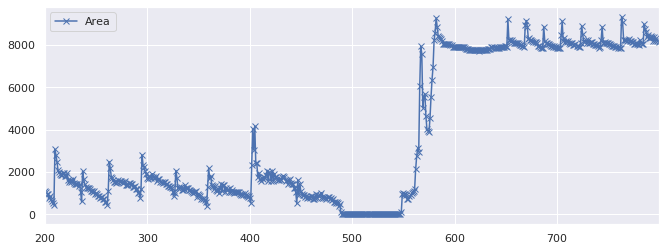

In [36]:
cols = ['Area']
df[cols].iloc[200:10000].plot(marker='x')

### Rolling average of area

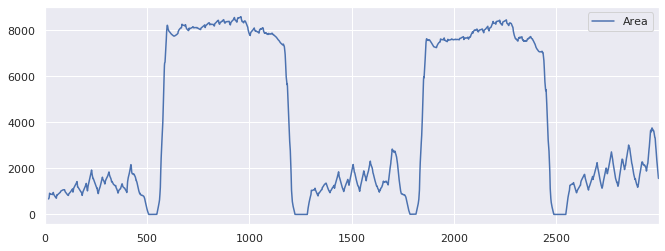

In [26]:
cols = ['Area']
#df[cols][df['Area'] != 0].rolling(20).mean().plot()
df[cols].iloc[0:3000].rolling(20).mean().plot()

In [37]:
print(cv2.getBuildInformation())


General configuration for OpenCV 4.1.1 =====================================
  Version control:               4.1.1

  Platform:
    Timestamp:                   2019-09-02T14:51:26Z
    Host:                        Linux 4.15.0-1028-gcp x86_64
    CMake:                       3.9.0
    CMake generator:             Unix Makefiles
    CMake build tool:            /usr/bin/gmake
    Configuration:               Release

  CPU/HW features:
    Baseline:                    SSE SSE2 SSE3
      requested:                 SSE3
    Dispatched code generation:  SSE4_1 SSE4_2 FP16 AVX AVX2
      requested:                 SSE4_1 SSE4_2 AVX FP16 AVX2 AVX512_SKX
      SSE4_1 (13 files):         + SSSE3 SSE4_1
      SSE4_2 (1 files):          + SSSE3 SSE4_1 POPCNT SSE4_2
      FP16 (0 files):            + SSSE3 SSE4_1 POPCNT SSE4_2 FP16 AVX
      AVX (4 files):             + SSSE3 SSE4_1 POPCNT SSE4_2 AVX
      AVX2 (27 files):           + SSSE3 SSE4_1 POPCNT SSE4_2 FP16 FMA3 AVX AVX2

  C/C++:
  